In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sympy import symbols
import sympy as sym
from sympy.solvers.solvers import unrad
from sympy import nroots
from scipy import linalg
import scipy as sci
from scipy import optimize
from scipy import stats
from scipy.interpolate import lagrange
from scipy.optimize import root
from scipy.optimize import minimize
from scipy.optimize import fixed_point

import time 
import mpmath as mp

In [12]:
#Henon map (x,y) -> (1 - a*x**2 + b*y,x)
def hMap(a,b,x,y):
    return 1 - a*x**2 + b*y
    
#define doing the henon map n times
def hMap_n(a,b,x,y,n):
    x_i = x
    y_i = y
    
    for i in range(n):
        old_x = x_i
        old_y = y_i
        
        new_x = hMap(a,b,old_x,old_y)
        new_y = old_x
        
        x_i = new_x
        y_i = new_y
        
    x_n, y_n = x_i,y_i
    return [x_n, y_n]
def NhMap_n(a,b,x,y,n,N):
    x_i,y_i = x,y
    for i in range(N):
        x_i,y_i = hMap_n(a,b,x_i,y_i,n)
    return [x_i,y_i]

#Inverse of Henon map
def backwards_hMap(a,b,x,y):
    return -(1/b)*(1 - a*y**2 - x)
    
#get both fixed points of the system
def getPeriodic(a,b):
    p1 = (-1*(1 - b) + sym.sqrt((1-b)**2 + 4*a))/(2*a)
    p2 = (-1*(1 - b) - sym.sqrt((1-b)**2 + 4*a))/(2*a)
    return p1,p2
def getFixed_np(a,b):
    p1 = (-1*(1 - b) + np.sqrt((1-b)**2 + 4*a))/(2*a)
    p2 = (-1*(1 - b) - np.sqrt((1-b)**2 + 4*a))/(2*a)
    return p1
#get the unstable eigenvector
def getUnstableLin(a,b,x):
    evecUn = [-a*x + sym.sqrt(b+a**2 * x**2),1]
    return evecUn

#get stable eigenvector
def getStableLin(a,b,x):
    evecSt = [-a*x - sym.sqrt(b+a**2 * x**2),1]
    return evecSt

#get Matrix value
def getValsMat(M, t0, s0):
    return M.subs([(t,t0),(s,s0)])

def getQualityUnst(b,a,x, y):
    x_vals = np.zeros(100)
    y_vals = np.zeros(100)
    x_vals[0],y_vals[0] = x,y
    
    fp = getFixed_np(a,b)

    curr_diff = np.sqrt((x-fp)**2 + (y-fp)**2)
    toler = 0.001
    
    for i in range(100-1):
        yNew = backwards_hMap(a,b,x_vals[i],y_vals[i])
        xNew = y_vals[i]
        
        new_diff = np.sqrt((xNew-fp)**2 + (yNew-fp)**2)
        
        if i>3 and new_diff > curr_diff and new_diff > toler:
            return i
        curr_diff=new_diff
        x_vals[i+1],y_vals[i+1] = xNew, yNew
    return 0

def getQualitySt(b,a,x, y):
    x_vals = np.zeros(100)
    y_vals = np.zeros(100)
    x_vals[0],y_vals[0] = x,y
    
    fp = getFixed_np(a,b)

    curr_diff = np.sqrt((x-fp)**2 + (y-fp)**2)
    toler = 0.001
    
    for i in range(100-1):
        xNew = hMap(a,b,x_vals[i],y_vals[i])
        yNew = x_vals[i]
        
        new_diff = np.sqrt((xNew-fp)**2 + (yNew-fp)**2)
        
        if i>3 and new_diff > curr_diff and new_diff > toler:
            return i
        curr_diff=new_diff
        x_vals[i+1],y_vals[i+1] = xNew, yNew
    return 0


print('done')

done


In [13]:
#create list of b values to calculate(going up)
global b_vals
#b_vals will be defined adaptively
#a_vals = np.zeros(len(b_vals))

#symbolic variables for a and b
a = symbols('a')
b = symbols('b')

#number of iterations of henon map for symbolic equation
N = 10
print('done')

done


In [14]:
p1, p2 = getPeriodic(a,b)
p=p1
#symbolic method of generating function which is to be mapped
t = symbols('t')
s = symbols('s')

#direction vector in x and y
evecUn = getUnstableLin(a,b,p)
evecSt = getStableLin(a,b,p)

#get eigenvectors aka tangent vectors of lineariation at fixed point
dx = evecUn[1]
dy = evecUn[0]
dx_b = evecSt[1]
dy_b = evecSt[0]

#(x0, y0) for original linear equation
x0 = p
y0 = p

#(x,y) = (x(t),y(t))
linex0 = x0 + dx*t
liney0 = y0 + dy*t
linex0_b = x0 + dx_b*s
liney0_b = y0 + dy_b*s

#Iterate N times
linexi = linex0
lineyi = liney0
linexi_b = linex0_b
lineyi_b = liney0_b

for i in range(N):
    oldlinex = linexi
    oldliney = lineyi
    
    newlinex = hMap(a,b,oldlinex, oldliney)
    newliney = oldlinex
    
    linexi = newlinex
    lineyi = newliney
    
    oldlinex_b = linexi_b
    oldliney_b = lineyi_b
    
    newliney_b = backwards_hMap(a,b,oldlinex_b, oldliney_b)
    newlinex_b = oldliney_b
    
    linexi_b = newlinex_b
    lineyi_b = newliney_b 



#define stable and unstable manifolds in x and y
xu = linexi #x(t) of unstable manifold
yu = lineyi #y of unstable
xs = linexi_b #x of stable
ys = lineyi_b #y of stable

#Differentiate Them
dxudt = sym.diff(xu,t)
dyudt = sym.diff(yu,t)
dxsds = sym.diff(xs,s)
dysds = sym.diff(ys,s)  

print('done')

done


In [15]:
#numerical functions for a, b, t and s
p_n = sym.lambdify([b,a], p, "numpy")
xu_n = sym.lambdify([b,a,t], xu, "numpy")
yu_n = sym.lambdify([b,a,t], yu, "numpy")
xs_n = sym.lambdify([b,a,s], xs, "numpy")
ys_n = sym.lambdify([b,a,s], ys, "numpy")
print(1/2)

Dxu_n = sym.lambdify([b,a,t],dxudt, "numpy")
Dyu_n = sym.lambdify([b,a,t],dyudt, "numpy")
Dxs_n = sym.lambdify([b,a,s],dxsds, "numpy")
Dys_n = sym.lambdify([b,a,s],dysds, "numpy")


print('done')

0.5
done


In [16]:
#try eigenvalue-parameterized definitions of manifolds

def get_eig(b,a):
    p_val = p_n(b,a)
    
    jac = np.matrix([[-2*a*p_val, b], [1, 0]])
    
    #jac_N = np.linalg.matrix_power(jac, N)
    
    w, v = np.linalg.eig(jac)
    return w

def get_xu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    t_par = t_val / (eig**N)
    
    return xu_n(b,a,t_par)

def get_yu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    
    t_par = t_val / (eig**N)
    
    return yu_n(b,a,t_par)

def get_xs(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N)
    
    return xs_n(b,a,s_par)

def get_ys(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N) #multiply because you are dividing by the inverse eigenval
    
    return ys_n(b,a,s_par)

#DERIVATIVE VALS TOO################
def get_Dxu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    t_par = t_val / (eig**N)
    
    return Dxu_n(b,a,t_par)

def get_Dyu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    
    t_par = t_val / (eig**N)
    
    return Dyu_n(b,a,t_par)

def get_Dxs(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N)
    
    return Dxs_n(b,a,s_par)

def get_Dys(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N) #multiply because you are dividing by the inverse eigenval
    
    return Dys_n(b,a,s_par)
print('done')

done


In [17]:
def Deltax(b,a,t,s):
    return get_xu(b,a,t) - get_xs(b,a,s)
def Deltay(b,a,t,s):
    return get_yu(b,a,t) - get_ys(b,a,s)

def DeltaDxyi(b,a,t,s):
    #try normalized version
    dxdt = get_Dxu(b,a,t)
    dydt = get_Dyu(b,a,t)
    dxds = get_Dxs(b,a,s)
    dyds = get_Dys(b,a,s)
        
    unst_tan = [dxdt,dydt]/np.linalg.norm([dxdt,dydt])
    
    st_tan = [dxds,dyds]/np.linalg.norm([dxds,dyds])
    
    #dot_product = np.dot(unst_tan, -st_tan)
    #angle = np.arccos(dot_product)
    
    return np.linalg.det(np.matrix([unst_tan,st_tan]))
    #return angle

def my_F(bats):
    b,a,t,s = bats[0],bats[1],bats[2],bats[3]
    return [Deltax(b,a,t,s),Deltay(b,a,t,s)]



def my_counter(dummy1,dummy2):
    global count
    count += 1


print('done')

done


In [18]:
b_val = -0.3
ats_0 = sci.array([2.5201857 ,  2.5845, -3.4263857],dtype = np.double)
F_ats = lambda ats : [Deltax(b_val, ats[0],ats[1],ats[2]),Deltay(b_val, ats[0],ats[1],ats[2]),DeltaDxyi(b_val, ats[0],ats[1],ats[2])]
ats_0Info = optimize.fsolve(F_ats, ats_0,xtol = 0) #epsfcn=0.000

In [9]:
print(ats_0Info[0],ats_0Info[1],ats_0Info[2])
print(F_ats(ats_0Info))
print(get_xu(b_val,ats_0Info[0],ats_0Info[1]), get_yu(b_val,ats_0Info[0],ats_0Info[1]))
print(get_xs(b_val,ats_0Info[0],ats_0Info[2]), get_ys(b_val,ats_0Info[0],ats_0Info[2]))
print('-------------------------------')
a_new, t_new, s_new = ats_0Info[0],ats_0Info[1],ats_0Info[2]
a_new, t_new, s_new = 2.5201856783144514,2.584010227209274, -3.426385652248647
ats_new1 = optimize.newton_krylov(F_ats, [a_new,t_new,s_new],f_tol =10e-10, x_tol= 10e-11)
print(ats_new1[0],ats_new1[1],ats_new1[2])
print(get_xu(b_val,ats_new1[0],ats_new1[1]), get_yu(b_val,ats_new1[0],ats_new1[1]))
print(get_xs(b_val,ats_new1[0],ats_new1[2]), get_ys(b_val,ats_new1[0],ats_new1[2]))
print(F_ats(ats_new1))


2.5201856783144514 2.5840102272093888 -3.426385658852586
[-3.142007765077892e-10, -2.8370898963459013e-09, 4.669897735717634e-11]
-0.5144679256975768 -0.7093697010834852
-0.514467925383376 -0.7093696982463953
-------------------------------
2.5201856783144514 2.584010227209275 -3.4263856529311427
-0.5144679256975757 -0.709369701083485
-0.5144679257386287 -0.7093697014541663
[4.105293882616934e-11, 3.7068137448414973e-10, -5.659489848726784e-11]


In [10]:
b_val = -0.2999
ats_0 = sci.array([2.5201857 ,  2.5845, -3.4263857],dtype = np.double)
F_ats = lambda ats : [Deltax(b_val, ats[0],ats[1],ats[2]),Deltay(b_val, ats[0],ats[1],ats[2]),DeltaDxyi(b_val, ats[0],ats[1],ats[2])]
ats_0Info = optimize.fsolve(F_ats, ats_0,xtol = 0,epsfcn = 0.000001) #epsfcn=0.000
print(ats_0Info[0],ats_0Info[1],ats_0Info[2])
print(F_ats(ats_0Info))
print(get_xu(b_val,ats_0Info[0],ats_0Info[1]), get_yu(b_val,ats_0Info[0],ats_0Info[1]))




2.519968386413781 2.584190180146566 -3.427838612016551
[-1.0859990684508602e-10, -9.808315271087054e-10, -7.773241670974032e-11]
-0.5144714789347238 -0.7094201261734752


/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:163: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


In [170]:
from scipy.optimize.nonlin import NoConvergence
global count

density = 50000
toler = 10e-9 #best: 0.0001

b_vals = np.zeros(density, dtype = np.double)

a_vals = np.zeros(len(b_vals), dtype = np.double)
t_vals, s_vals = np.zeros(len(b_vals), dtype = np.double), np.zeros(len(b_vals), dtype = np.double)
count_vals = np.zeros(len(b_vals), dtype = np.double)
unstQual, stQual = np.zeros(len(b_vals), dtype = np.double), np.zeros(len(b_vals), dtype = np.double)
xs_tan,ys_tan = np.zeros(len(b_vals), dtype = np.double),np.zeros(len(b_vals), dtype = np.double)
xu_tan,yu_tan = np.zeros(len(b_vals), dtype = np.double),np.zeros(len(b_vals), dtype = np.double)
t_vals,s_vals = np.zeros(len(b_vals), dtype = np.double),np.zeros(len(b_vals), dtype = np.double)
total_count = 0

#Iteration bor b0
#N=11: 1.3145271100033784 ,  1.8677934291663318 ,  39.58746466644118
#N=12: ats0 = 1.314527109537821 1.8677932711841738 39.587550202200994
#N=13: ats 0 = 1.3145289042002917 ,  1.867793628321972 ,  39.58755538398396
#N=10: ts 0 = 1.3145271093258206 ,  1.8677917710196257 ,  39.58755820719475
#N=14: ats0 = 1.3146211090276902 ,  1.8677518648947236 ,  39.587540831947784


i=1
count = 0
b_vals[i] = -0.3
b_i = b_vals[i]

ats_0 = sci.array([2.5201856783144514 ,  2.5840102272093888, -3.426385658852586],dtype = np.double)
F_ats = lambda ats : [Deltax(b_i, ats[0],ats[1],ats[2]),Deltay(b_i, ats[0],ats[1],ats[2]),DeltaDxyi(b_i, ats[0],ats[1],ats[2])]
#ats_0 = optimize.newton_krylov(F_ats, [a_0,t_0,s_0 ],callback = my_counter,f_tol = 0.0001)
ats_0Info = optimize.fsolve(F_ats, ats_0,xtol = 0.0000000, epsfcn=0.0001,full_output = True)
ats_0 = ats_0Info[0]
count += ats_0Info[1].get('nfev')
print(ats_0Info[3])
a_vals[i] = ats_0[0]
t_vals[i], s_vals[i] = ats_0[1],ats_0[2]
xu,yu,xs,ys = get_xu(b_i,ats_0[0],ats_0[1]), get_yu(b_i,ats_0[0],ats_0[1]),get_xs(b_i,ats_0[0],ats_0[2]), get_ys(b_i,ats_0[0],ats_0[2])
unstQual[i] = getQualityUnst(b_i,ats_0[0],xu,yu)
stQual[i] = getQualitySt(b_i,ats_0[0],xs,ys)
xs_tan[i],ys_tan[i] = xs,ys
xu_tan[i],yu_tan[i] = xu,yu
t_vals[i],s_vals[i] = ats_0[1],ats_0[2]
count_vals[i] = count
total_count+=count

print('a,t,s 0: ',ats_0[0],', ',ats_0[1],', ',ats_0[2])
print ('XY: ',get_xs(b_i,ats_0[0],ats_0[2]),get_ys(b_i,ats_0[0],ats_0[2]))
print('Error for i = 0', F_ats(ats_0))


#iteration for b1
#N=11: 1.3146436454463388 , 1.867629350144214 , 39.59069061878441
#N=12: ats 1: 1.3146408773256404, 1.8676334955487672, 39.586846721299985
#N=13: ats 1 = 1.314632711416713 ,  1.8676383216344141 ,  39.581640325010525
#N=10: ats 1: 1.3146436454592763 ,  1.8676276905166396 ,  39.590805378965555
#N=14: ats1 = 1.3146225464990968 ,  1.867881878947269 ,  39.59080664700336
i = 0
count = 0
b_vals[i] =  -0.2999
b_i = b_vals[i]
a_1,t_1,s_1 = np.array([2.519968386413781 ,  2.584190180146566,  -3.427838612016551],dtype = np.float64)
F_ats = lambda ats : [Deltax(b_i, ats[0],ats[1],ats[2]),Deltay(b_i, ats[0],ats[1],ats[2]),DeltaDxyi(b_i, ats[0],ats[1],ats[2])]
#ats_1 = optimize.newton_krylov(F_ats, [a_1,t_1,s_1],callback = my_counter,f_tol = 0.005)
ats_1Info = optimize.fsolve(F_ats, [a_1,t_1,s_1 ],xtol = 0.000000, epsfcn=0.0001,full_output = True)
print(ats_1Info[3])
ats_1= ats_1Info[0]
count += ats_1Info[1].get('nfev')
a_vals[i] = ats_1[0]
t_vals[i],s_vals[i] = ats_1[1],ats_1[2]
xu,yu,xs,ys = get_xu(b_i,ats_1[0],ats_1[1]), get_yu(b_i,ats_1[0],ats_1[1]),get_xs(b_i,ats_1[0],ats_1[2]), get_ys(b_i,ats_1[0],ats_1[2])
unstQual[i] = getQualityUnst(b_i,ats_1[0],xu,yu)
xs_tan[i],ys_tan[i] = xs,ys
xu_tan[i],yu_tan[i] = xu,yu
t_vals[i],s_vals[i] = ats_1[1],ats_1[2]
stQual[i] = getQualitySt(b_i,ats_1[0],xs,ys)
print('a,t,s 1: ',ats_1[0],', ',ats_1[1],', ',ats_1[2])
print('Error for i = 1',F_ats(ats_1))
count_vals[i] = count
total_count+=count


ats_i = ats_0

direction = -1
b_end = -0.9
start_time = time.time()
max_j = 200 #150
for i in range(2,len(b_vals)):
    
    j=0 # num of iterations of newton method

    inc0  = 0.001 #good: inc0,toler = 0.004, 0.003
    toler = 10e-9
    b_inc = inc0
    
    cont  = True
    
    flag  = False #Turns true if fails to converge for 100 different b
    count = 0
    while(cont):
        try:
            print(i,j)
            
            b_i = b_vals[i-1] + direction* b_inc
            
            
            F_ats = lambda ats : [Deltax(b_i, ats[0],ats[1],ats[2]),Deltay(b_i, ats[0],ats[1],ats[2]),DeltaDxyi(b_i, ats[0],ats[1],ats[2])]
                        
            slope_a = np.double((a_vals[i-1] - a_vals[i-2]) / (b_vals[i-1] - b_vals[i-2]))
            slope_t = np.double((t_vals[i-1] - t_vals[i-2]) / (b_vals[i-1] - b_vals[i-2]))
            slope_s = np.double((s_vals[i-1] - s_vals[i-2]) / (b_vals[i-1] - b_vals[i-2]))

            
            
            a_guess = a_vals[i-1] + slope_a*(b_i - b_vals[i-1])
            t_guess = t_vals[i-1] + slope_t*(b_i - b_vals[i-1])
            s_guess = s_vals[i-1] + slope_s*(b_i - b_vals[i-1])
            
            if  j > 5 and i > 100 : #if linear fit doesn't seem to be good enough
                b_array = b_vals[:i-1]
                a_array = a_vals[:i-1]
                t_array = t_vals[:i-1]
                s_array = s_vals[:i-1]
                
#                 a_model = np.poly1d(np.polyfit(b_array, a_array, 1))
#                 t_model = np.poly1d(np.polyfit(b_array, t_array, 5))
#                 s_model = np.poly1d(np.polyfit(b_array, s_array, 5))
                
#                 a_guess = a_model(b_i)
#                 t_guess = t_model(b_i)
#                 s_guess = s_model(b_i)
                
#                 b_array = np.array([b_vals[i-1],b_vals[i-2],b_vals[i-3]])
                
#                 a_array = np.array([a_vals[i-1],a_vals[i-2],a_vals[i-3]])
#                 t_array = np.array([t_vals[i-1],t_vals[i-2],t_vals[i-3]])
#                 s_array = np.array([s_vals[i-1],s_vals[i-2],s_vals[i-3]])
                
#                 a_guess = lagrange(b_array, a_array)(b_i)
#                 t_guess = lagrange(b_array, t_array)(b_i)
#                 s_guess = lagrange(b_array, s_array)(b_i)
                
            guess = [a_guess,t_guess, s_guess]
            print('b_i: ',b_i,', a guess:',a_guess)
            print('t guess: ',t_guess,' s guess: ',s_guess)
            print('xu guess: ',get_xu(b_i,a_guess,t_guess),', yu guess: ',get_yu(b_i,a_guess,t_guess))
            print('xs guess: ',get_xs(b_i,a_guess,s_guess),', ys guess: ',get_ys(b_i,a_guess,s_guess))
            
            
            #ats_i = optimize.newton_krylov(F_ats, guess,f_tol = toler,maxiter = 100,callback = my_counter)#,method = 'gmres'
            #ats_i
            #ats_i = root(F_ats, guess ,method='hybr',callback = my_counter,options = {'xtol':toler}).x
            ats_iInfo = optimize.fsolve(F_ats, guess,xtol = 0, epsfcn = 0.0001,full_output = True)#0.001 epsfcn
            ats_i = ats_iInfo[0]
            
            #if you want higher quality:
            ats_i = optimize.newton_krylov(F_ats, [ats_i[0],ats_i[1],ats_i[2]],f_tol =toler, x_tol= toler)
            
            
            if np.max(np.abs(F_ats(ats_i))) > toler:
                raise NoConvergence
            
            count += ats_iInfo[1].get('nfev')
            
            print(ats_i)
            count_vals[i] = count
            total_count+=count
            
            count = 0

            
            b_vals[i] = b_i
            a_vals[i] = ats_i[0]
            a_i = a_vals[i]
            t_vals[i],s_vals[i] = ats_i[1],ats_i[2]
            sol = [ats_i[1], ats_i[2]]
            
            
            #calculate quality of x,y 
            xu, yu = get_xu(b_i,a_i,sol[0]), get_yu(b_i,a_i,sol[0])
            xs, ys = get_xs(b_i,a_i,sol[1]), get_ys(b_i,a_i,sol[1])
            
            unstQual[i] = getQualityUnst(b_i,a_i,xu,yu)
            stQual[i] = getQualitySt(b_i,a_i,xs,ys)
            xs_tan[i],ys_tan[i] = xs,ys
            xu_tan[i],yu_tan[i] = xu,yu
            t_vals[i],s_vals[i] = ats_i[1],ats_i[2]
            
            print('b increment: ',b_inc)
            print('Final b,a: ',b_i,', ',a_i)
            print('t,s: ',sol)
            print('t diff, s diff: ',t_vals[i] - t_vals[i-1],', ',s_vals[i] - s_vals[i-1])
            print('Unstable XY: ', xu,', ',yu)
            print('Stable XY: ', xs,', ',ys)
            print('Number of iterations: ',count_vals[i] )
            print('Error: ',F_ats([a_i,sol[0],sol[1]]))
            print('Current Time: ',time.time() - start_time)
            print('------------------------')
            print('Next b')
            
            cont = False
            
            if b_i < b_end:
                raise KeyboardInterrupt
        except KeyboardInterrupt: 
            print('Interruption Found. Goodbye. ')
            cont = False
            flag = True
            break
        
        except np.linalg.LinAlgError:
            j+=1
            
            raise NoConvergence
        
        except OverflowError: 
            print('OVERFLOW')
            j+=1
            raise NoConvergence
            
        
        except NoConvergence: #

            j+=1
            b_inc = b_inc*0.5
            
            
                
                
                
            if j>max_j:
                print(b_vals[i-1])
                cont = False
                flag = True
                break
        except: 
            print('----------------ERROR----------------')
            j+=1
            raise NoConvergence
    if(flag):
        print('NO CONVERGENCE DETECTED')
        r = i-1
        break

run_length = time.time() - start_time
          

The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
a,t,s 0:  2.5201856783144514 ,  2.5840102272093888 ,  -3.426385658852586
XY:  -0.514467925383376 -0.7093696982463953
Error for i = 0 [-3.142007765077892e-10, -2.8370898963459013e-09, 4.669897735717634e-11]
The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
a,t,s 1:  2.519968386413781 ,  2.584190180146566 ,  -3.427838612016551
Error for i = 1 [-1.0859990684508602e-10, -9.808315271087054e-10, -7.773241670974032e-11]
2 0
b_i:  -0.301 , a guess: 2.522358597321156
t guess:  2.5822106978376156  s guess:  -3.4118561272129333
xu guess:  -0.5144312260289181 , yu guess:  -0.7088655307348029
xs guess:  -0.5144151150206608 , ys guess:  -0.7087110655133092
[ 2.5223589   2.58221255 -3.41191223]
b increment:  0.001
Final b,a:  -0.301 ,  2.5223589024638633
t,s:  [2.582212552495945, -3.411912230847544]
t diff, s diff:  -0.0017976747134436089 

[ 2.54630099  2.56265903 -3.25917106]
b increment:  0.001
Final b,a:  -0.312 ,  2.5463009915160235
t,s:  [2.562659034120028, -3.259171063838896]
t diff, s diff:  -0.0017609705461643088 ,  0.013413139916937933
Unstable XY:  -0.5140258083827858 ,  -0.7033617540280859
Stable XY:  -0.514025807481923 ,  -0.7033617461255655
Number of iterations:  43.0
Error:  [-9.008628287787701e-10, -7.90252041582562e-09, -2.1146025238268418e-10]
Current Time:  25.919572114944458
------------------------
Next b
14 0
b_i:  -0.313 , a guess: 2.5484803199775263
t guess:  2.560898063573864  s guess:  -3.2457579239219583
xu guess:  -0.5139856915374581 , yu guess:  -0.7028644715985106
xs guess:  -0.5139584132243986 , ys guess:  -0.70260935633892
[ 2.54848088  2.56090136 -3.24584876]
b increment:  0.001
Final b,a:  -0.313 ,  2.5484808750438206
t,s:  [2.560901363548207, -3.245848756831669]
t diff, s diff:  -0.0017576705718211905 ,  0.013322307007227252
Unstable XY:  -0.5139875813964063 ,  -0.7028649187620986
Stable

[ 2.57249623  2.54178307 -3.10505548]
b increment:  0.001
Final b,a:  -0.324 ,  2.572496233549761
t,s:  [2.5417830684943237, -3.1050554798271737]
t diff, s diff:  -0.001721766115326151 ,  0.012378597781604661
Unstable XY:  -0.5135534737711418 ,  -0.6974380645136122
Stable XY:  -0.5135534735916005 ,  -0.6974380629814463
Number of iterations:  42.0
Error:  [-1.7954127073949167e-10, -1.5321659496692064e-09, 4.765016507443716e-10]
Current Time:  44.358478307724
------------------------
Next b
26 0
b_i:  -0.325 , a guess: 2.5746822240133245
t guess:  2.5400613023789975  s guess:  -3.092676882045569
xu guess:  -0.5135109160015074 , yu guess:  -0.6969477295857669
xs guess:  -0.5134855180566391 , ys guess:  -0.6967156648976139
[ 2.57468278  2.54006453 -3.09275792]
b increment:  0.001
Final b,a:  -0.325 ,  2.574682779288562
t,s:  [2.5400645309508794, -3.0927579175885156]
t diff, s diff:  -0.0017185375434443095 ,  0.012297562238658077
Unstable XY:  -0.5135127932050818 ,  -0.6969481734942244
Stab

[ 2.59877143  2.52137205 -2.96262327]
b increment:  0.001
Final b,a:  -0.336 ,  2.598771434552258
t,s:  [2.521372047410664, -2.9626232740082767]
t diff, s diff:  -0.0016834045286731047 ,  0.011454038199447236
Unstable XY:  -0.5130523282828219 ,  -0.6915969350124351
Stable XY:  -0.5130523282216654 ,  -0.6915969345041595
Number of iterations:  41.0
Error:  [-6.115652428917429e-11, -5.082756437957414e-10, -5.94549392842008e-11]
Current Time:  62.02896213531494
------------------------
Next b
38 0
b_i:  -0.337 , a guess: 2.60096408921442
t guess:  2.5196886428819907  s guess:  -2.9511692358088295
xu guess:  -0.5130074434161802 , yu guess:  -0.6911134080488059
xs guess:  -0.5129837475432008 , ys guess:  -0.690901600038155
[ 2.60096464  2.5196918  -2.95124181]
b increment:  0.001
Final b,a:  -0.337 ,  2.6009646446428145
t,s:  [2.5196918025785098, -2.951241808879545]
t diff, s diff:  -0.0016802448321540098 ,  0.011381465128731616
Unstable XY:  -0.5130093079588542 ,  -0.6911138487029891
Stable

Error:  [-6.074494240948525e-10, -4.932584896089054e-09, -2.4385393643431975e-10]
Current Time:  80.1128032207489
------------------------
Next b
49 0
b_i:  -0.34800000000000003 , a guess: 2.625126061101172
t guess:  2.5014129529888307  s guess:  -2.8305887023666614
xu guess:  -0.5125218519371018 , yu guess:  -0.6858362725957667
xs guess:  -0.5124995714721183 , ys guess:  -0.6856408823820362
[ 2.62512662  2.50141605 -2.83065452]
b increment:  0.001
Final b,a:  -0.34800000000000003 ,  2.625126616624217
t,s:  [2.501416051694623, -2.8306545165127086]
t diff, s diff:  -0.0016458559502030568 ,  0.01062451141374643
Unstable XY:  -0.5125237048805604 ,  -0.6858367102704797
Stable XY:  -0.5125237042523324 ,  -0.6858367051796984
Number of iterations:  36.0
Error:  [-6.282280251568295e-10, -5.090781241001707e-09, -2.4542183784339347e-10]
Current Time:  84.18251705169678
------------------------
Next b
50 0
b_i:  -0.34900000000000003 , a guess: 2.6273259370334636
t guess:  2.49977019574442  s gues

[ 2.64935581  2.48351461 -2.71796989]
b increment:  0.001
Final b,a:  -0.35900000000000004 ,  2.6493558072768706
t,s:  [2.4835146051770707, -2.7179698924045854]
t diff, s diff:  -0.0016121259827945877 ,  0.009936861099491434
Unstable XY:  -0.512016075536921 ,  -0.6806261975527237
Stable XY:  -0.5120160752628072 ,  -0.6806261953803964
Number of iterations:  33.0
Error:  [-2.7411373171304376e-10, -2.172327318028522e-09, -4.9628079790830474e-11]
Current Time:  101.78005003929138
------------------------
Next b
61 0
b_i:  -0.36000000000000004 , a guess: 2.6515612387975986
t guess:  2.481902479194276  s guess:  -2.708033031305094
xu guess:  -0.5119670272312056 , yu guess:  -0.6801553417367827
xs guess:  -0.5119461538705858 , ys guess:  -0.6799758721401985
[ 2.65156179  2.48190551 -2.7080924 ]
b increment:  0.001
Final b,a:  -0.36000000000000004 ,  2.6515617943772147
t,s:  [2.481905513629651, -2.708092397060355]
t diff, s diff:  -0.0016090915474196166 ,  0.009877495344230436
Unstable XY:  -0

[ 2.67365222  2.46598034 -2.61247558]
b increment:  0.001
Final b,a:  -0.37000000000000005 ,  2.673652222679399
t,s:  [2.4659803445664044, -2.61247558341493]
t diff, s diff:  -0.0015790334300778142 ,  0.009310374466700022
Unstable XY:  -0.5114873455068891 ,  -0.6754810968339571
Stable XY:  -0.5114873457157403 ,  -0.6754810984539626
Number of iterations:  47.0
Error:  [2.088511585895958e-10, 1.6200055741322217e-09, 1.2279933397707848e-10]
Current Time:  117.43016815185547
------------------------
Next b
72 0
b_i:  -0.37100000000000005 , a guess: 2.675863765668095
t guess:  2.4644013111363265  s guess:  -2.60316520894823
xu guess:  -0.5114364348945009 , yu guess:  -0.6750161313012768
xs guess:  -0.5114167386123253 , ys guess:  -0.6748496697960585
[ 2.67586432  2.46440429 -2.60321938]
b increment:  0.001
Final b,a:  -0.37100000000000005 ,  2.6758643212593807
t,s:  [2.4644042886686766, -2.603219383706118]
t diff, s diff:  -0.0015760558977278016 ,  0.009256199708811863
Unstable XY:  -0.5114

[ 2.69801586  2.44880638 -2.51354183]
b increment:  0.001
Final b,a:  -0.38100000000000006 ,  2.6980158642661793
t,s:  [2.448806383995332, -2.5135418343664857]
t diff, s diff:  -0.0015465574381012814 ,  0.008738036625805634
Unstable XY:  -0.5109383970369961 ,  -0.670400221929806
Stable XY:  -0.5109383968600368 ,  -0.6704002205852713
Number of iterations:  25.0
Error:  [-1.7695922505112094e-10, -1.3445347057938761e-09, 1.1911607567916356e-09]
Current Time:  132.36515307426453
------------------------
Next b
83 0
b_i:  -0.38200000000000006 , a guess: 2.700233518668524
t guess:  2.4472598265572305  s guess:  -2.50480379774068
xu guess:  -0.5108857022222373 , yu guess:  -0.6699410401763846
xs guess:  -0.5108670943825229 , ys guess:  -0.6697863274010326
[ 2.70023407  2.44726275 -2.50485335]
b increment:  0.001
Final b,a:  -0.38200000000000006 ,  2.700234074235326
t,s:  [2.447262749048354, -2.504853353458439]
t diff, s diff:  -0.0015436349469779564 ,  0.008688480908046525
Unstable XY:  -0.51

[ 2.72244673  2.43198606 -2.42060988]
b increment:  0.001
Final b,a:  -0.39200000000000007 ,  2.7224467290944037
t,s:  [2.4319860632183676, -2.4206098811102947]
t diff, s diff:  -0.001514677779214324 ,  0.008213835658875013
Unstable XY:  -0.5103700713303554 ,  -0.6653824134805777
Stable XY:  -0.5103700710163713 ,  -0.6653824111421676
Number of iterations:  30.0
Error:  [-3.139840609733824e-10, -2.3384101321966e-09, -6.189660022994056e-11]
Current Time:  152.10606122016907
------------------------
Next b
94 0
b_i:  -0.39300000000000007 , a guess: 2.7246704944685614
t guess:  2.4304713854391533  s guess:  -2.4123960454514197
xu guess:  -0.510315666787843 , yu guess:  -0.6649289114048385
xs guess:  -0.5102980582456804 , ys guess:  -0.6647847718490765
[ 2.72467105  2.43047425 -2.4124415 ]
b increment:  0.001
Final b,a:  -0.39300000000000007 ,  2.724671049976728
t,s:  [2.4304742547032343, -2.4124415020498766]
t diff, s diff:  -0.0015118085151333283 ,  0.008168379060418118
Unstable XY:  -0.5

[ 2.74694481  2.41551294 -2.3331823 ]
b increment:  0.001
Final b,a:  -0.4030000000000001 ,  2.7469448100876366
t,s:  [2.4155129409515412, -2.333182297234473]
t diff, s diff:  -0.0014833748131106717 ,  0.007732542010614019
Unstable XY:  -0.5097831706735056 ,  -0.6604265382561059
Stable XY:  -0.5097831704797758 ,  -0.6604265368408938
Number of iterations:  35.0
Error:  [-1.937298099718987e-10, -1.415212058653026e-09, -2.044355339075166e-10]
Current Time:  170.50934314727783
------------------------
Next b
105 0
b_i:  -0.4040000000000001 , a guess: 2.7491746856254653
t guess:  2.4140295661384306  s guess:  -2.325449755223859
xu guess:  -0.5097271274346418 , yu guess:  -0.6599786140964707
xs guess:  -0.5097104470476286 , ys guess:  -0.6598440820515307
[ 2.74917524  2.41403238 -2.32549154]
b increment:  0.001
Final b,a:  -0.4040000000000001 ,  2.749175241042681
t,s:  [2.414032383929721, -2.325491542158327]
t diff, s diff:  -0.0014805570218201503 ,  0.0076907550761458054
Unstable XY:  -0.50

[ 2.7715101   2.39938079 -2.25081483]
b increment:  0.001
Final b,a:  -0.4140000000000001 ,  2.771510096257541
t,s:  [2.399380788471258, -2.2508148256834577]
t diff, s diff:  -0.0014526294734467093 ,  0.007289627389380993
Unstable XY:  -0.5091784604133678 ,  -0.6555314884727463
Stable XY:  -0.5091784604021081 ,  -0.6555314883920162
Number of iterations:  29.0
Error:  [-1.1259659871143413e-11, -8.073008928022318e-11, 3.306995632855158e-11]
Current Time:  184.96618819236755
------------------------
Next b
116 0
b_i:  -0.4150000000000001 , a guess: 2.773746080803886
t guess:  2.397928158997811  s guess:  -2.2435251982940767
xu guess:  -0.5091208462397252 , yu guess:  -0.6550890427463494
xs guess:  -0.5091050246811818 , ys guess:  -0.6549632286356272
[ 2.77374664  2.39793093 -2.2435637 ]
b increment:  0.001
Final b,a:  -0.4150000000000001 ,  2.7737466360994976
t,s:  [2.3979309270219815, -2.2435637008166895]
t diff, s diff:  -0.0014498614492763906 ,  0.007251124866768155
Unstable XY:  -0.50

[ 2.79614257  2.38358358 -2.17310952]
b increment:  0.001
Final b,a:  -0.4250000000000001 ,  2.7961425729051514
t,s:  [2.3835835835014225, -2.1731095232493622]
t diff, s diff:  -0.0014224232384076885 ,  0.0068811349589998905
Unstable XY:  -0.5085566707950866 ,  -0.6506961811228102
Stable XY:  -0.5085566709984642 ,  -0.6506961825549173
Number of iterations:  26.0
Error:  [2.0337764805589131e-10, 1.4321070995748642e-09, 1.1877329488844398e-10]
Current Time:  201.4976451396942
------------------------
Next b
127 0
b_i:  -0.4260000000000001 , a guess: 2.798384664975331
t guess:  2.382161160263015  s guess:  -2.1662283882903623
xu guess:  -0.5084975503395621 , yu guess:  -0.6502591165653226
xs guess:  -0.5084825275491824 , ys guess:  -0.6501412520310281
[ 2.79838522  2.38216388 -2.16626394]
b increment:  0.001
Final b,a:  -0.4260000000000001 ,  2.79838522012019
t,s:  [2.38216388017798, -2.166263939790057]
t diff, s diff:  -0.0014197033234424339 ,  0.006845583459305082
Unstable XY:  -0.50849

[ 2.82084222  2.3681155  -2.09970892]
b increment:  0.001
Final b,a:  -0.4360000000000001 ,  2.8208422218029434
t,s:  [2.368115504357288, -2.0997089195477825]
t diff, s diff:  -0.0013927381077949441 ,  0.006503604299162635
Unstable XY:  -0.507918498670562 ,  -0.6459195573166707
Stable XY:  -0.5079184987951644 ,  -0.645919558178837
Number of iterations:  29.0
Error:  [1.2460232845512564e-10, 8.621662273000652e-10, 7.349818469908843e-11]
Current Time:  219.77481818199158
------------------------
Next b
138 0
b_i:  -0.4370000000000001 , a guess: 2.8230904195985387
t guess:  2.366722766249493  s guess:  -2.09320531524862
xu guess:  -0.5078579336272129 , yu guess:  -0.6454877788232831
xs guess:  -0.5078436536652533 , ys guess:  -0.6453771711671078
[ 2.82309097  2.36672544 -2.09323821]
b increment:  0.001
Final b,a:  -0.4370000000000001 ,  2.82309097456485
t,s:  [2.366725439666648, -2.0932382092125303]
t diff, s diff:  -0.0013900646906397363 ,  0.00647071033525215
Unstable XY:  -0.5078596938

[ 2.84560902  2.35297092 -2.03029105]
b increment:  0.001
Final b,a:  -0.4470000000000001 ,  2.845609021358761
t,s:  [2.3529709243421486, -2.0302910481704632]
t diff, s diff:  -0.0013635565802578853 ,  0.006153992687476073
Unstable XY:  -0.5072646090864947 ,  -0.6412005816376456
Stable XY:  -0.5072646090370067 ,  -0.6412005813009896
Number of iterations:  25.0
Error:  [-4.948808030036389e-11, -3.3665603638155517e-10, 2.6137445551696428e-11]
Current Time:  240.46279406547546
------------------------
Next b
149 0
b_i:  -0.4480000000000001 , a guess: 2.8478633227817918
t guess:  2.3516073677618907  s guess:  -2.024137055482987
xu guess:  -0.5072026583297404 , yu guess:  -0.6407739962051904
xs guess:  -0.5071890718373772 , ys guess:  -0.6406700386752344
[ 2.84786388  2.35161    -2.02416755]
b increment:  0.001
Final b,a:  -0.4480000000000001 ,  2.847863877542973
t,s:  [2.3516099962478463, -2.0241675489720583]
t diff, s diff:  -0.0013609280943023272 ,  0.006123499198404936
Unstable XY:  -0.

[ 2.87044295  2.33814441 -1.96456519]
b increment:  0.001
Final b,a:  -0.45800000000000013 ,  2.8704429467624943
t,s:  [2.338144406387994, -1.9645651905033243]
t diff, s diff:  -0.0013348616321460227 ,  0.00582961871999621
Unstable XY:  -0.5065956367596882 ,  -0.6365382415096019
Stable XY:  -0.5065956366757 ,  -0.6365382409475882
Number of iterations:  28.0
Error:  [-8.398826079059063e-11, -5.620137688566729e-10, -1.1234336412849543e-10]
Current Time:  257.1373641490936
------------------------
Next b
160 0
b_i:  -0.45900000000000013 , a guess: 2.8727033494280616
t guess:  2.336809544755848  s guess:  -1.9587355717833281
xu guess:  -0.5065323564736146 , yu guess:  -0.6361167581798275
xs guess:  -0.5065194172852258 , ys guess:  -0.6360189005767413
[ 2.8727039   2.33681213 -1.95876389]
b increment:  0.001
Final b,a:  -0.45900000000000013 ,  2.8727039039586035
t,s:  [2.3368121298356783, -1.9587638932743636]
t diff, s diff:  -0.0013322765523158253 ,  0.005801297228960722
Unstable XY:  -0.5

[ 2.89534397  2.3236307  -1.90226822]
b increment:  0.001
Final b,a:  -0.46900000000000014 ,  2.8953439701162407
t,s:  [2.323630697931997, -1.9022682225245542]
t diff, s diff:  -0.0013066366957699138 ,  0.005528110637644579
Unstable XY:  -0.5059121874466213 ,  -0.6319315465771635
Stable XY:  -0.5059121874182195 ,  -0.631931546390125
Number of iterations:  30.0
Error:  [-2.8401725415960755e-11, -1.8703849580248288e-10, 1.2819800911065797e-11]
Current Time:  274.0155050754547
------------------------
Next b
171 0
b_i:  -0.47000000000000014 , a guess: 2.8976104713636928
t guess:  2.3223240612362273  s guess:  -1.8967401118869096
xu guess:  -0.5058476312449407 , yu guess:  -0.6315150763811286
xs guess:  -0.5058352982068488 , ys guess:  -0.6314228324631392
[ 2.89761103  2.3223266  -1.89676646]
b increment:  0.001
Final b,a:  -0.47000000000000014 ,  2.897611025639032
t,s:  [2.322326604393759, -1.8967664621892346]
t diff, s diff:  -0.001304093538238238 ,  0.005501760335319572
Unstable XY:  -0

[ 2.92031206  2.30942473 -1.84316146]
b increment:  0.001
Final b,a:  -0.48000000000000015 ,  2.9203120605485475
t,s:  [2.3094247260181375, -1.843161462766734]
t diff, s diff:  -0.0012788656403990295 ,  0.005247365751603894
Unstable XY:  -0.505214839213453 ,  -0.627379528098297
Stable XY:  -0.5052148392314831 ,  -0.6273795282152039
Number of iterations:  30.0
Error:  [1.8030132942215005e-11, 1.1690692858223883e-10, -4.413760251723483e-11]
Current Time:  301.2307562828064
------------------------
Next b
182 0
b_i:  -0.48100000000000015 , a guess: 2.922584657451222
t guess:  2.3081458603777385  s guess:  -1.8379140970151302
xu guess:  -0.505149058250681 , yu guess:  -0.6269679840018756
xs guess:  -0.5051372929896674 , ys guess:  -0.6268809122565178
[ 2.92258521  2.30814836 -1.83793866]
b increment:  0.001
Final b,a:  -0.48100000000000015 ,  2.9225852114476085
t,s:  [2.3081483630591455, -1.8379386562242404]
t diff, s diff:  -0.0012763629589920278 ,  0.005222806542493741
Unstable XY:  -0.5

[ 2.94534718  2.29552159 -1.78702795]
b increment:  0.001
Final b,a:  -0.49100000000000016 ,  2.945347184313157
t,s:  [2.295521592619272, -1.7870279470623978]
t diff, s diff:  -0.0012515327504689644 ,  0.004985511853751401
Unstable XY:  -0.5045041436118254 ,  -0.6228812383489413
Stable XY:  -0.5045041436413235 ,  -0.6228812385373345
Number of iterations:  41.0
Error:  [2.9498070652778097e-11, 1.883931899371305e-10, -6.348902990757748e-11]
Current Time:  320.4011890888214
------------------------
Next b
193 0
b_i:  -0.49200000000000016 , a guess: 2.9476258736867234
t guess:  2.294270059868803  s guess:  -1.7820424352086464
xu guess:  -0.5044371866861046 , yu guess:  -0.6224745351993926
xs guess:  -0.5044259544916996 , ys guess:  -0.6223922410751406
[ 2.94762643  2.29427252 -1.78206536]
b increment:  0.001
Final b,a:  -0.49200000000000016 ,  2.947626427381099
t,s:  [2.2942725234821117, -1.7820653625380443]
t diff, s diff:  -0.0012490691371600526 ,  0.004962584524353497
Unstable XY:  -0.5

[ 2.9704493   2.28191657 -1.73367006]
b increment:  0.001
Final b,a:  -0.5020000000000001 ,  2.9704493048725347
t,s:  [2.2819165701674784, -1.7336700609529865]
t diff, s diff:  -0.0012246227093148931 ,  0.0047408794356564865
Unstable XY:  -0.5037806267651779 ,  -0.618435750039293
Stable XY:  -0.5037806267787183 ,  -0.6184357501245046
Number of iterations:  46.0
Error:  [1.3540391030630872e-11, 8.521161554142509e-11, 5.1066617985054905e-11]
Current Time:  339.57118010520935
------------------------
Next b
204 0
b_i:  -0.5030000000000001 , a guess: 2.9727340832819635
t guess:  2.2806919474581635  s guess:  -1.72892918151733
xu guess:  -0.5037125404131526 , yu guess:  -0.6180338045128657
xs guess:  -0.5037018091485868 , ys guess:  -0.6179559302144074
[ 2.97273464  2.28069437 -1.72895062]
b increment:  0.001
Final b,a:  -0.5030000000000001 ,  2.9727346366518383
t,s:  [2.2806943733768414, -1.7289506197427253]
t diff, s diff:  -0.0012221967906369535 ,  0.004719441210261133
Unstable XY:  -0.5

[ 2.99561838  2.2686051  -1.68290748]
b increment:  0.001
Final b,a:  -0.5130000000000001 ,  2.9956183829663168
t,s:  [2.268605097288232, -1.6829074797319532]
t diff, s diff:  -0.001198120579490869 ,  0.00451197484336574
Unstable XY:  -0.5030447903695254 ,  -0.6140421557412432
Stable XY:  -0.5030447904005041 ,  -0.6140421559334346
Number of iterations:  39.0
Error:  [3.0978664078418205e-11, 1.9219137392667562e-10, 1.297246753698894e-10]
Current Time:  369.1542332172394
------------------------
Next b
215 0
b_i:  -0.5140000000000001 , a guess: 2.997909246731482
t guess:  2.2674069767087413  s guess:  -1.6783955048885875
xu guess:  -0.5029756189536212 , yu guess:  -0.613644886291765
xs guess:  -0.5029653589297562 , ys guess:  -0.6135711073768293
[ 2.9979098   2.26740937 -1.67841558]
b increment:  0.001
Final b,a:  -0.5140000000000001 ,  2.997909799754803
t,s:  [2.267409366272872, -1.6784155820545743]
t diff, s diff:  -0.0011957310153603018 ,  0.004491897677378898
Unstable XY:  -0.5029773

[ 3.02085438  2.25558277 -1.63457537]
b increment:  0.001
Final b,a:  -0.5240000000000001 ,  3.0208543766646194
t,s:  [2.2555827747309274, -1.6345753693024483]
t diff, s diff:  -0.001172011785693261 ,  0.0042974578624854765
Unstable XY:  -0.5022971126119984 ,  -0.6096995673263863
Stable XY:  -0.5022971125828167 ,  -0.6096995671478428
Number of iterations:  29.0
Error:  [-2.918165709075993e-11, -1.7854351330726104e-10, -4.986863678444276e-11]
Current Time:  390.9414448738098
------------------------
Next b
226 0
b_i:  -0.5250000000000001 , a guess: 3.0231513218645123
t guess:  2.254410762945234  s guess:  -1.6302779114399628
xu guess:  -0.5022268984003477 , yu guess:  -0.6093068941347768
xs guess:  -0.5022170823027569 , ys guess:  -0.6092369167574007
[ 3.02315187  2.25441312 -1.63029674]
b increment:  0.001
Final b,a:  -0.5250000000000001 ,  3.023151874519542
t,s:  [2.254413117462233, -1.6302967421852792]
t diff, s diff:  -0.0011696572686945572 ,  0.004278627117169087
Unstable XY:  -0.5

[ 3.04615724  2.24284536 -1.58852281]
b increment:  0.001
Final b,a:  -0.5350000000000001 ,  3.046157241406004
t,s:  [2.2428453614856134, -1.5885228105174138]
t diff, s diff:  -0.0011462820979311061 ,  0.004096123538009699
Unstable XY:  -0.5015380490097745 ,  -0.6054071154139367
Stable XY:  -0.5015380489978645 ,  -0.6054071153420543
Number of iterations:  52.0
Error:  [-1.191002851896883e-11, -7.188238893007792e-11, 2.5150633406515274e-11]
Current Time:  412.1871440410614
------------------------
Next b
237 0
b_i:  -0.5360000000000001 , a guess: 3.0484602638815432
t guess:  2.2416990793876823  s guess:  -1.5844266869794041
xu guess:  -0.5014668322490052 , yu guess:  -0.6050189603385865
xs guess:  -0.5014574346892359 , ys guess:  -0.6049525164878906
[ 3.04846082  2.2417014  -1.58444437]
b increment:  0.001
Final b,a:  -0.5360000000000001 ,  3.0484608161467275
t,s:  [2.241701400134471, -1.5844443748527854]
t diff, s diff:  -0.0011439613511425861 ,  0.004078435664628399
Unstable XY:  -0.5

[ 3.07152693  2.23038877 -1.54461142]
b increment:  0.001
Final b,a:  -0.5460000000000002 ,  3.071526930019713
t,s:  [2.230388771081352, -1.5446114164838618]
t diff, s diff:  -0.001120917615435868 ,  0.003906884983297054
Unstable XY:  -0.5007680331713429 ,  -0.6011639488277969
Stable XY:  -0.5007680331720967 ,  -0.6011639488326614
Number of iterations:  44.0
Error:  [7.538414337204813e-13, 4.864553204697586e-12, 3.6880513619709406e-11]
Current Time:  428.3703351020813
------------------------
Next b
248 0
b_i:  -0.5470000000000002 , a guess: 3.0738360253751176
t guess:  2.2292678534659163  s guess:  -1.5407045315005647
xu guess:  -0.5006958521524456 , yu guess:  -0.6007802353557499
xs guess:  -0.5006868495818314 , ys guess:  -0.600717080630808
[ 3.07383658  2.22927014 -1.54072117]
b increment:  0.001
Final b,a:  -0.5470000000000002 ,  3.0738365772289074
t,s:  [2.229270141690384, -1.5407211699180572]
t diff, s diff:  -0.0011186293909681844 ,  0.0038902465658046115
Unstable XY:  -0.50069

[ 3.09696339  2.21820907 -1.50271412]
b increment:  0.001
Final b,a:  -0.5570000000000002 ,  3.096963392731408
t,s:  [2.218209068059001, -1.5027141163138613]
t diff, s diff:  -0.0010959047515530784 ,  0.003728759889843669
Unstable XY:  -0.4999874774808961 ,  -0.5969692340617965
Stable XY:  -0.49998747747457295 ,  -0.5969692340246151
Number of iterations:  37.0
Error:  [-6.3231642144501166e-12, -3.718136909469649e-11, -6.365845341753374e-11]
Current Time:  446.59308910369873
------------------------
Next b
259 0
b_i:  -0.5580000000000002 , a guess: 3.0992785563339456
t guess:  2.217113163307448  s guess:  -1.4989853564240176
xu guess:  -0.49991436859785265 , yu guess:  -0.596589887260562
xs guess:  -0.4999057390269366 , ys guess:  -0.5965297976971308
[ 3.09927911  2.21711542 -1.49900103]
b increment:  0.001
Final b,a:  -0.5580000000000002 ,  3.099279107754832
t,s:  [2.2171154202301726, -1.4990010299886325]
t diff, s diff:  -0.0010936478288283702 ,  0.0037130863252288204
Unstable XY:  -0

[ 3.12246658  2.20630246 -1.46271408]
b increment:  0.001
Final b,a:  -0.5680000000000002 ,  3.122466577152008
t,s:  [2.2063024646105944, -1.4627140826685474]
t diff, s diff:  -0.0010712302177995348 ,  0.0035608579265922202
Unstable XY:  -0.4991967737075875 ,  -0.5928221547524231
Stable XY:  -0.49919677370609117 ,  -0.5928221547437328
Number of iterations:  35.0
Error:  [-1.496358592589786e-12, -8.690270725253413e-12, -2.599663733521091e-11]
Current Time:  464.02763295173645
------------------------
Next b
270 0
b_i:  -0.5690000000000002 , a guess: 3.1247878041303543
t guess:  2.205231234392795  s guess:  -1.4591532247419552
xu guess:  -0.4991227715097406 , yu guess:  -0.5924471012225485
xs guess:  -0.4991144944447353 , ys guess:  -0.5923898716320395
[ 3.12478836  2.20523346 -1.45916801]
b increment:  0.001
Final b,a:  -0.5690000000000002 ,  3.124788355096447
t,s:  [2.2052334612071283, -1.4591680101753888]
t diff, s diff:  -0.0010690034034661622 ,  0.0035460724931586363
Unstable XY:  -

[ 3.14803643  2.19466532 -1.42450378]
b increment:  0.001
Final b,a:  -0.5790000000000002 ,  3.148036428247768
t,s:  [2.194665317377702, -1.424503784688478]
t diff, s diff:  -0.0010468810106942783 ,  0.00340237007995281
Unstable XY:  -0.49839629353708026 ,  -0.5887219111574007
Stable XY:  -0.49839629353389897 ,  -0.5887219111393562
Number of iterations:  41.0
Error:  [-3.181288565912155e-12, -1.804445481923267e-11, 6.3351076692120096e-12]
Current Time:  479.7951910495758
------------------------
Next b
281 0
b_i:  -0.5800000000000002 , a guess: 3.150363713488435
t guess:  2.1936184363670077  s guess:  -1.4211014146085252
xu guess:  -0.4983214307739199 , yu guess:  -0.5883510789854063
xs guess:  -0.49831348699607325 , ys guess:  -0.5882965205289856
[ 3.15036426  2.19362063 -1.42111538]
b increment:  0.001
Final b,a:  -0.5800000000000002 ,  3.1503642639774654
t,s:  [2.1936206342416065, -1.421115381799284]
t diff, s diff:  -0.0010446831360955144 ,  0.0033884028891939533
Unstable XY:  -0.4

[ 3.17367289  2.18329412 -1.38798415]
b increment:  0.001
Final b,a:  -0.5900000000000002 ,  3.1736728882908256
t,s:  [2.1832941244032025, -1.3879841506454986]
t diff, s diff:  -0.00102284439735989 ,  0.003252559316686776
Unstable XY:  -0.49758638902608165 ,  -0.5846677196392873
Stable XY:  -0.49758638902550145 ,  -0.5846677196360061
Number of iterations:  41.0
Error:  [-5.802025526691068e-13, -3.28126414927965e-12, 8.751167674005155e-11]
Current Time:  496.43537998199463
------------------------
Next b
292 0
b_i:  -0.5910000000000002 , a guess: 3.1760062264327735
t guess:  2.1822712800058426  s guess:  -1.3847315913288119
xu guess:  -0.49751069668502934 , yu guess:  -0.584301038351007
xs guess:  -0.49750306814071327 , ys guess:  -0.5842489769223836
[ 3.17600678  2.18227345 -1.3847448 ]
b increment:  0.001
Final b,a:  -0.5910000000000002 ,  3.17600677642195
t,s:  [2.1822734500848076, -1.3847448039237011]
t diff, s diff:  -0.0010206743183949207 ,  0.003239346721797487
Unstable XY:  -0.4

[ 3.1993759   2.17218552 -1.35306383]
b increment:  0.001
Final b,a:  -0.6010000000000002 ,  3.199375896788223
t,s:  [2.1721855222282604, -1.353063826242274]
t diff, s diff:  -0.0009991079039957107 ,  0.0031107524484761395
Unstable XY:  -0.4967673929769516 ,  -0.5806588121524792
Stable XY:  -0.49676739297544503 ,  -0.5806588121440397
Number of iterations:  28.0
Error:  [-1.5065726444163374e-12, -8.43947134399059e-12, -5.3194443636444627e-11]
Current Time:  512.9647829532623
------------------------
Next b
303 0
b_i:  -0.6020000000000002 , a guess: 3.201715282215524
t guess:  2.1711864143242647  s guess:  -1.349953073793798
xu guess:  -0.4966909003140465 , yu guess:  -0.5802962126667106
xs guess:  -0.49668356988709644 , ys guess:  -0.5802464867440441
[ 3.20171583  2.17118856 -1.34996559]
b increment:  0.001
Final b,a:  -0.6020000000000002 ,  3.201715831681205
t,s:  [2.1711885577297187, -1.3499655901428256]
t diff, s diff:  -0.000996964498541697 ,  0.0030982360994484814
Unstable XY:  -0.

[ 3.22514539  2.16133628 -1.31965852]
b increment:  0.001
Final b,a:  -0.6120000000000002 ,  3.2251453903869014
t,s:  [2.1613362831272247, -1.3196585177693592]
t diff, s diff:  -0.0009756593015657344 ,  0.002976332706387197
Unstable XY:  -0.4959396192281187 ,  -0.5766944357317259
Stable XY:  -0.495939619234501 ,  -0.5766944357670616
Number of iterations:  37.0
Error:  [6.382283590511406e-12, 3.533573433855963e-11, 1.33124181150784e-10]
Current Time:  534.922131061554
------------------------
Next b
314 0
b_i:  -0.6130000000000002 , a guess: 3.2274908172190124
t guess:  2.160360623825659  s guess:  -1.316682185062972
xu guess:  -0.4958623537905895 , yu guess:  -0.57633585031386
xs guess:  -0.4958553053525731 , ys guess:  -0.5762883104941016
[ 3.22749137  2.16036274 -1.31669406]
b increment:  0.001
Final b,a:  -0.6130000000000002 ,  3.2274913661365763
t,s:  [2.1603627416574795, -1.3166940586808318]
t diff, s diff:  -0.0009735414697451539 ,  0.0029644590885273825
Unstable XY:  -0.49586394

[ 3.2509813   2.15074331 -1.28769041]
b increment:  0.001
Final b,a:  -0.6230000000000002 ,  3.25098130275231
t,s:  [2.1507433124707767, -1.2876904098377127]
t diff, s diff:  -0.000952486596210278 ,  0.002848733397300851
Unstable XY:  -0.49510336285663237 ,  -0.5727738519804766
Stable XY:  -0.49510336285247014 ,  -0.5727738519576913
Number of iterations:  30.0
Error:  [-4.162226119319712e-12, -2.2785329178987013e-11, -1.7375406282563494e-12]
Current Time:  556.0588669776917
------------------------
Next b
325 0
b_i:  -0.6240000000000002 , a guess: 3.2533327648318653
t guess:  2.1497908258745664  s guess:  -1.2848416764404118
xu guess:  -0.4950253504973856 , yu guess:  -0.5724192141960538
xs guess:  -0.4950185686506686 , ys guess:  -0.5723737210994098
[ 3.25333331  2.14979292 -1.28485296]
b increment:  0.001
Final b,a:  -0.6240000000000002 ,  3.2533333131754443
t,s:  [2.149792919211827, -1.2848529565623859]
t diff, s diff:  -0.0009503932589498554 ,  0.0028374532753268067
Unstable XY:  -

[ 3.27688356  2.14040365 -1.25708765]
b increment:  0.001
Final b,a:  -0.6340000000000002 ,  3.2768835644170147
t,s:  [2.140403646211555, -1.2570876499183978]
t diff, s diff:  -0.0009295780175708757 ,  0.002727432106029548
Unstable XY:  -0.49425890028571073 ,  -0.5688963365565562
Stable XY:  -0.49425890028419917 ,  -0.56889633654838
Number of iterations:  32.0
Error:  [-1.5115686480271506e-12, -8.176237464851965e-12, -8.68655860975051e-14]
Current Time:  572.5090022087097
------------------------
Next b
336 0
b_i:  -0.6350000000000002 , a guess: 3.279241055294723
t guess:  2.139474068193984  s guess:  -1.2543602178123683
xu guess:  -0.4941801651688631 , yu guess:  -0.5685455812244646
xs guess:  -0.4941736352557779 , ys guess:  -0.5685020049730066
[ 3.2792416   2.13947614 -1.25437095]
b increment:  0.001
Final b,a:  -0.6350000000000002 ,  3.2792416030369185
t,s:  [2.139476138095656, -1.2543709498764473]
t diff, s diff:  -0.0009275081158990339 ,  0.0027167000419505705
Unstable XY:  -0.49

[ 3.3028521   2.13031445 -1.22778389]
b increment:  0.001
Final b,a:  -0.6450000000000002 ,  3.302852102595248
t,s:  [2.1303144484786536, -1.2277838923771398]
t diff, s diff:  -0.0009069220102686515 ,  0.0026119456300972566
Unstable XY:  -0.4934064892891825 ,  -0.5650611786525612
Stable XY:  -0.49340648928815334 ,  -0.5650611786470494
Number of iterations:  23.0
Error:  [-1.0291767438275201e-12, -5.511813228054052e-12, -3.6716250203261496e-13]
Current Time:  596.3527600765228
------------------------
Next b
347 0
b_i:  -0.6460000000000002 , a guess: 3.3052156155114987
t guess:  2.129407526468385  s guess:  -1.2251719467470426
xu guess:  -0.49332705388581943 , yu guess:  -0.5647142417976301
xs guess:  -0.4933207617515323 , ys guess:  -0.5646724602206905
[ 3.30521616  2.12940957 -1.22518217]
b increment:  0.001
Final b,a:  -0.6460000000000002 ,  3.305216162623063
t,s:  [2.1294095739750727, -1.2251821729489425]
t diff, s diff:  -0.0009048745035808992 ,  0.0026017194281973133
Unstable XY: 

[ 3.32888684  2.12047301 -1.1997179 ]
b increment:  0.001
Final b,a:  -0.6560000000000002 ,  3.3288868409583356
t,s:  [2.1204730092746833, -1.1997178966468174]
t diff, s diff:  -0.0008845072238941043 ,  0.002501825136087099
Unstable XY:  -0.4925463688821705 ,  -0.5612676804677432
Stable XY:  -0.49254636887894704 ,  -0.5612676804506598
Number of iterations:  32.0
Error:  [-3.2234770408479108e-12, -1.7083445769117134e-11, -3.46826219449154e-11]
Current Time:  612.8326458930969
------------------------
Next b
358 0
b_i:  -0.6570000000000003 , a guess: 3.331256368821014
t guess:  2.119588502050789  s guess:  -1.1972160715107303
xu guess:  -0.49246625395528687 , yu guess:  -0.5609244992724074
xs guess:  -0.492460185961453 , ys guess:  -0.5608843975499143
[ 3.33125692  2.11959053 -1.19722583]
b increment:  0.001
Final b,a:  -0.6570000000000003 ,  3.3312569152704725
t,s:  [2.1195905281843865, -1.1972258310748496]
t diff, s diff:  -0.0008824810902967606 ,  0.002492065571967794
Unstable XY:  -0

[ 3.3549877   2.11087674 -1.17283317]
b increment:  0.001
Final b,a:  -0.6670000000000003 ,  3.354987699364767
t,s:  [2.110876742259284, -1.1728331743444995]
t diff, s diff:  -0.0008623225061219486 ,  0.002396651966286578
Unstable XY:  -0.49167875908451397 ,  -0.5575151566675667
Stable XY:  -0.49167875908624925 ,  -0.5575151566766784
Number of iterations:  48.0
Error:  [1.7352785874891197e-12, 9.111711385401122e-12, 5.700906692956563e-11]
Current Time:  627.0764770507812
------------------------
Next b
369 0
b_i:  -0.6680000000000003 , a guess: 3.357363234722651
t guess:  2.110014419753162  s guess:  -1.170436522378213
xu guess:  -0.4915979836617368 , yu guess:  -0.5571756694222347
xs guess:  -0.4915921265287638 , ys guess:  -0.5571371388608242
[ 3.35736378  2.11001643 -1.17044585]
b increment:  0.001
Final b,a:  -0.6680000000000003 ,  3.357363780475864
t,s:  [2.1100164255174256, -1.1704458520053447]
t diff, s diff:  -0.0008603167418583801 ,  0.0023873223391548404
Unstable XY:  -0.4915

[ 3.38115459  2.10152318 -1.14707768]
b increment:  0.001
Final b,a:  -0.6780000000000003 ,  3.381154593537268
t,s:  [2.101523182605243, -1.1470776817814783]
t diff, s diff:  -0.0008403568978767595 ,  0.00229603364996378
Unstable XY:  -0.49080386054002734 ,  -0.5538029338263633
Stable XY:  -0.4908038605395135 ,  -0.5538029338237062
Number of iterations:  31.0
Error:  [-5.138112157965224e-13, -2.657096764835387e-12, -3.490624783646484e-11]
Current Time:  641.3314530849457
------------------------
Next b
380 0
b_i:  -0.6790000000000003 , a guess: 3.3835361285482475
t guess:  2.1006828257073664  s guess:  -1.1447816481315145
xu guess:  -0.4907224418724472 , yu guess:  -0.5534670798780335
xs guess:  -0.49071678257412543 , ys guess:  -0.5534300170326152
[ 3.38353667  2.10068481 -1.14479058]
b increment:  0.001
Final b,a:  -0.6790000000000003 ,  3.3835366735679013
t,s:  [2.1006848120900203, -1.1447905823479463]
t diff, s diff:  -0.0008383705152228416 ,  0.0022870994335320027
Unstable XY:  -0

[ 3.40738743  2.09240998 -1.12240355]
b increment:  0.001
Final b,a:  -0.6890000000000003 ,  3.407387434677406
t,s:  [2.092409984914043, -1.1224035548679359]
t diff, s diff:  -0.0008185996262017881 ,  0.002199600084939801
Unstable XY:  -0.48992185397022103 ,  -0.5501303498474845
Stable XY:  -0.48992185396635846 ,  -0.5501303498276083
Number of iterations:  26.0
Error:  [-3.862576924973382e-12, -1.9876211787561715e-11, -7.84774385856483e-11]
Current Time:  655.4206640720367
------------------------
Next b
391 0
b_i:  -0.6900000000000003 , a guess: 3.409774961070572
t guess:  2.0915913852878414  s guess:  -1.120203954782996
xu guess:  -0.4898398074751811 , yu guess:  -0.5497980695460507
xs guess:  -0.48983433314500874 , ys guess:  -0.5497623754551682
[ 3.40977551  2.09159335 -1.12021253]
b increment:  0.001
Final b,a:  -0.6900000000000003 ,  3.409775505315566
t,s:  [2.0915933532581774, -1.1202125262318912]
t diff, s diff:  -0.0008166316558657627 ,  0.0021910286360447007
Unstable XY:  -0.

[ 3.43368613  2.08353492 -1.09876688]
b increment:  0.001
Final b,a:  -0.7000000000000003 ,  3.433686129005974
t,s:  [2.0835349211642944, -1.098766884288703]
t diff, s diff:  -0.0007970401055583665 ,  0.0021070000279079792
Unstable XY:  -0.48903289943570694 ,  -0.546496753354172
Stable XY:  -0.489032899434392 ,  -0.5464967533474702
Number of iterations:  29.0
Error:  [-1.3149481503660354e-12, -6.7018612881497575e-12, -7.729825392312562e-11]
Current Time:  669.3603761196136
------------------------
Next b
402 0
b_i:  -0.7010000000000003 , a guess: 3.436079638036413
t guess:  2.082737881058736  s guess:  -1.096659884260795
xu guess:  -0.4889502386208382 , yu guess:  -0.5461679879957546
xs guess:  -0.4889449363974142 , ys guess:  -0.5461335671532104
[ 3.43608018  2.08273983 -1.09666812]
b increment:  0.001
Final b,a:  -0.7010000000000003 ,  3.4360801814611217
t,s:  [2.0827398315704917, -1.0966681240756746]
t diff, s diff:  -0.0007950895938027003 ,  0.002098760213028461
Unstable XY:  -0.48

[ 3.46005058  2.07489588 -1.07612753]
b increment:  0.001
Final b,a:  -0.7110000000000003 ,  3.4600505772144676
t,s:  [2.0748958786737703, -1.0761275298251536]
t diff, s diff:  -0.0007756679345911621 ,  0.00201789747310821
Unstable XY:  -0.48813713537133085 ,  -0.5429015030426911
Stable XY:  -0.4881371353698146 ,  -0.5429015030350456
Number of iterations:  29.0
Error:  [-1.5162315847305763e-12, -7.64555085908114e-12, -3.0099271272677146e-11]
Current Time:  683.8017930984497
------------------------
Next b
413 0
b_i:  -0.7120000000000003 , a guess: 3.462450059609263
t guess:  2.074120210739179  s guess:  -1.0741096323520454
xu guess:  -0.4880538717364251 , yu guess:  -0.5425761948091288
xs guess:  -0.488048728658115 , ys guess:  -0.5425429544409899
[ 3.4624506   2.07412214 -1.07411757]
b increment:  0.001
Final b,a:  -0.7120000000000003 ,  3.4624506021626544
t,s:  [2.074122144728319, -1.0741175704407182]
t diff, s diff:  -0.000773733945451216 ,  0.002009959384435378
Unstable XY:  -0.488

[ 3.48648067  2.06649086 -1.05444897]
b increment:  0.001
Final b,a:  -0.7220000000000003 ,  3.4864806738091874
t,s:  [2.066490858041695, -1.0544489735779368]
t diff, s diff:  -0.0007544729013155838 ,  0.0019319681485430173
Unstable XY:  -0.48723467735223824 ,  -0.5393439669872877
Stable XY:  -0.48723467735103343 ,  -0.5393439669812639
Number of iterations:  34.0
Error:  [-1.2048140263232199e-12, -6.023848087011174e-12, -3.972821724074394e-11]
Current Time:  698.0717821121216
------------------------
Next b
424 0
b_i:  -0.7230000000000003 , a guess: 3.4888861197027805
t guess:  2.0657363851403794  s guess:  -1.0525170054293937
xu guess:  -0.48715082026461287 , yu guess:  -0.5390220588807548
xs guess:  -0.4871458231294507 , ys guess:  -0.5389899080899162
[ 3.48888666  2.0657383  -1.05252467]
b increment:  0.001
Final b,a:  -0.7230000000000003 ,  3.4888866613273506
t,s:  [2.0657383035257513, -1.0525246708104112]
t diff, s diff:  -0.000752554515943693 ,  0.001924302767525532
Unstable XY: 

[ 3.51297631  2.05831797 -1.03369821]
b increment:  0.001
Final b,a:  -0.7330000000000003 ,  3.512976306324611
t,s:  [2.058317971032552, -1.0336982128934835]
t diff, s diff:  -0.000733444989442944 ,  0.0018488958348759077
Unstable XY:  -0.4863256165361469 ,  -0.5358235218837737
Stable XY:  -0.4863256165353925 ,  -0.5358235218800349
Number of iterations:  31.0
Error:  [-7.543965452327939e-13, -3.738787057727677e-12, 5.860351240801206e-12]
Current Time:  711.778932094574
------------------------
Next b
435 0
b_i:  -0.7340000000000003 , a guess: 3.515387705181161
t guess:  2.057584526043109  s guess:  -1.0318493170586076
xu guess:  -0.48624117307399195 , yu guess:  -0.535504957655202
xs guess:  -0.4862363082435371 , ys guess:  -0.5354738063347841
[ 3.51538825  2.05758643 -1.03185674]
b increment:  0.001
Final b,a:  -0.7340000000000003 ,  3.515388245811596
t,s:  [2.0575864297248225, -1.0318567382123618]
t diff, s diff:  -0.0007315413077293442 ,  0.0018414746811217242
Unstable XY:  -0.48624

[ 3.53953735  2.05037544 -1.0138457 ]
b increment:  0.001
Final b,a:  -0.7440000000000003 ,  3.539537354376154
t,s:  [2.050375438353805, -1.0138456951127548]
t diff, s diff:  -0.0007125743914850879 ,  0.0017683684366878172
Unstable XY:  -0.4854100177117209 ,  -0.5323395522150336
Stable XY:  -0.4854100177119615 ,  -0.5323395522162154
Number of iterations:  28.0
Error:  [2.406408405875027e-13, 1.1818324097134791e-12, -4.770724186441278e-12]
Current Time:  726.0075900554657
------------------------
Next b
446 0
b_i:  -0.7450000000000003 , a guess: 3.541954694895848
t guess:  2.04966286396232  s guess:  -1.012077326676067
xu guess:  -0.4853249924682719 , yu guess:  -0.5320242762846266
xs guess:  -0.48532024568117493 , ys guess:  -0.5319940341342245
[ 3.54195523  2.04966475 -1.01208453]
b increment:  0.001
Final b,a:  -0.7450000000000003 ,  3.541955234457396
t,s:  [2.049664753821947, -1.0120845319240563]
t diff, s diff:  -0.0007106845318580746 ,  0.0017611631886984558
Unstable XY:  -0.48532

[ 3.56616369  2.04266159 -0.9948653 ]
b increment:  0.001
Final b,a:  -0.7550000000000003 ,  3.566163688513914
t,s:  [2.0426615872669767, -0.9948652977551343]
t diff, s diff:  -0.0006918515244445089 ,  0.0016900736405364158
Unstable XY:  -0.4844879168624614 ,  -0.5288914493170058
Stable XY:  -0.4844879168628839 ,  -0.5288914493190552
Number of iterations:  30.0
Error:  [4.224953720211033e-13, 2.0493606811555765e-12, 1.2145914387272862e-11]
Current Time:  739.6600499153137
------------------------
Next b
457 0
b_i:  -0.7560000000000003 , a guess: 3.5685869585193224
t guess:  2.041969735742532  s guess:  -0.9931752241145979
xu guess:  -0.48440231170173864 , yu guess:  -0.5285794066846652
xs guess:  -0.4843976678494215 , ys guess:  -0.5285499820919806
[ 3.5685875   2.04197161 -0.99318224]
b increment:  0.001
Final b,a:  -0.7560000000000003 ,  3.5685874969257454
t,s:  [2.0419716126385348, -0.9931822420188384]
t diff, s diff:  -0.0006899746284418917 ,  0.001683055736295902
Unstable XY:  -0.

[ 3.59285517  2.03517485 -0.97673436]
b increment:  0.001
Final b,a:  -0.7660000000000003 ,  3.592855168827423
t,s:  [2.035174848944027, -0.9767343596065442]
t diff, s diff:  -0.0006712670602460058 ,  0.0016136940220496943
Unstable XY:  -0.4835593181279416 ,  -0.5254786103173588
Stable XY:  -0.48355931812850445 ,  -0.5254786103200667
Number of iterations:  34.0
Error:  [5.628275623337231e-13, 2.7079449793632193e-12, 4.710857446283779e-11]
Current Time:  753.2953071594238
------------------------
Next b
468 0
b_i:  -0.7670000000000003 , a guess: 3.595284355124777
t guess:  2.034503581883781  s guess:  -0.9751206655844945
xu guess:  -0.4834731318800143 , yu guess:  -0.525169746460215
xs guess:  -0.4834685747017043 , ys guess:  -0.5251410450490612
[ 3.59528489  2.03450545 -0.97512753]
b increment:  0.001
Final b,a:  -0.7670000000000003 ,  3.5952848922757656
t,s:  [2.0345054466509427, -0.9751275254512095]
t diff, s diff:  -0.0006694022930844312 ,  0.001606834155334691
Unstable XY:  -0.4834

[ 3.61961164  2.02791376 -0.95943377]
b increment:  0.001
Final b,a:  -0.7770000000000004 ,  3.61961164323573
t,s:  [2.0279137554729143, -0.9594337709124703]
t diff, s diff:  -0.0006508119599160089 ,  0.0015389012376281208
Unstable XY:  -0.4826241900067041 ,  -0.5221004369104048
Stable XY:  -0.4826241900072895 ,  -0.5221004369132108
Number of iterations:  37.0
Error:  [5.85420600884845e-13, 2.806088694740083e-12, 1.2493902209777389e-11]
Current Time:  767.0385100841522
------------------------
Next b
479 0
b_i:  -0.7780000000000004 , a guess: 3.6220467314443634
t guess:  2.0272629435129983  s guess:  -0.9578948696748422
xu guess:  -0.4825374180863813 , yu guess:  -0.5217946976636505
xs guess:  -0.4825329298420839 , ys guess:  -0.5217666208050125
[ 3.62204727  2.0272648  -0.9579016 ]
b increment:  0.001
Final b,a:  -0.7780000000000004 ,  3.6220472672222304
t,s:  [2.027264796956079, -0.9579016021174803]
t diff, s diff:  -0.0006489585168352185 ,  0.0015321687949899632
Unstable XY:  -0.482

[ 3.64643295  2.02087694 -0.94294813]
b increment:  0.001
Final b,a:  -0.7880000000000004 ,  3.6464329453755355
t,s:  [2.020876936358731, -0.9429481340294453]
t diff, s diff:  -0.0006304775290999487 ,  0.0014653490496859822
Unstable XY:  -0.48168246059349773 ,  -0.518756333919874
Stable XY:  -0.48168246059252573 ,  -0.5187563339152607
Number of iterations:  34.0
Error:  [-9.720002580593246e-13, -4.613309734224913e-12, -7.57014062727475e-11]
Current Time:  780.8398752212524
------------------------
Next b
490 0
b_i:  -0.7890000000000004 , a guess: 3.6488739197164586
t guess:  2.020246458829631  s guess:  -0.9414827849797593
xu guess:  -0.48159509452104654 , yu guess:  -0.5184536653359635
xs guess:  -0.4815906555318334 , ys guess:  -0.5184261081002091
[ 3.64887445  2.0202483  -0.94148942]
b increment:  0.001
Final b,a:  -0.7890000000000004 ,  3.6488744539818816
t,s:  [2.020248301720984, -0.9414894226562802]
t diff, s diff:  -0.0006286346377470942 ,  0.0014587113731651113
Unstable XY:  -0

[ 3.67331889  2.01406311 -0.92726601]
b increment:  0.001
Final b,a:  -0.7990000000000004 ,  3.6733188919698443
t,s:  [2.014063114339279, -0.9272660108294897]
t diff, s diff:  -0.0006102554870421883 ,  0.0013926645912250013
Unstable XY:  -0.48073401157125306 ,  -0.5154457075844683
Stable XY:  -0.480734011572615 ,  -0.5154457075908813
Number of iterations:  29.0
Error:  [1.3619660954589108e-12, 6.412981257142292e-12, 7.029540508261522e-11]
Current Time:  793.8412640094757
------------------------
Next b
501 0
b_i:  -0.8000000000000004 , a guess: 3.675765735001219
t guess:  2.013452858852237  s guess:  -0.9258733462382647
xu guess:  -0.4806460383660147 , yu guess:  -0.515146055763859
xs guess:  -0.48064162648104997 , ys guess:  -0.5151189046221526
[ 3.67576627  2.01345469 -0.92587992]
b increment:  0.001
Final b,a:  -0.8000000000000004 ,  3.6757662675876563
t,s:  [2.0134546919195064, -0.9258799247172976]
t diff, s diff:  -0.0006084224197726584 ,  0.001386086112192042
Unstable XY:  -0.480

[ 3.70026928  2.0074711  -0.91238028]
b increment:  0.001
Final b,a:  -0.8100000000000004 ,  3.7002692795166547
t,s:  [2.007471100242102, -0.9123802795576219]
t diff, s diff:  -0.000590138069914925 ,  0.001320437272949948
Unstable XY:  -0.47977867057533663 ,  -0.5121679634773386
Stable XY:  -0.47977867057603263 ,  -0.5121679634805792
Number of iterations:  31.0
Error:  [6.959988141375106e-13, 3.2406299865783694e-12, 8.965622796036764e-11]
Current Time:  807.8411312103271
------------------------
Next b
512 0
b_i:  -0.8110000000000004 , a guess: 3.7027219717993667
t guess:  2.006880962172187  s guess:  -0.911059842284672
xu guess:  -0.479690071982235 , yu guess:  -0.5118712743615252
xs guess:  -0.4796856618473669 , ys guess:  -0.5118444040665545
[ 3.7027225   2.00688279 -0.9110664 ]
b increment:  0.001
Final b,a:  -0.8110000000000004 ,  3.7027225025056674
t,s:  [2.0068827860915492, -0.9110664012358105]
t diff, s diff:  -0.0005883141505527156 ,  0.0013138783218114014
Unstable XY:  -0.479

[ 3.72728388  2.00109979 -0.89828863]
b increment:  0.001
Final b,a:  -0.8210000000000004 ,  3.7272838800751806
t,s:  [2.0010997865267024, -0.8982886335540803]
t diff, s diff:  -0.0005701181678681166 ,  0.0012482042137651472
Unstable XY:  -0.47881620139926895 ,  -0.5089225039362704
Stable XY:  -0.47881620139888936 ,  -0.508922503934514
Number of iterations:  34.0
Error:  [-3.79585252119341e-13, -1.7563728249569976e-12, -7.57651485927579e-11]
Current Time:  820.5062348842621
------------------------
Next b
523 0
b_i:  -0.8220000000000004 , a guess: 3.7297423997450405
t guess:  2.0005296683588343  s guess:  -0.8970404293403151
xu guess:  -0.4787269528922167 , yu guess:  -0.5086287230501014
xs guess:  -0.4787225150183784 , ys guess:  -0.5086019927306629
[ 3.72974293  2.00053148 -0.89704701]
b increment:  0.001
Final b,a:  -0.8220000000000004 ,  3.72974292832547
t,s:  [2.0005314837389254, -0.8970470140660981]
t diff, s diff:  -0.0005683027877769753 ,  0.0012416194879821818
Unstable XY:  -0

[ 3.75436244  1.99494814 -0.88499427]
b increment:  0.001
Final b,a:  -0.8320000000000004 ,  3.7543624358356666
t,s:  [1.99494813898771, -0.8849942681446191]
t diff, s diff:  -0.0005501895174688798 ,  0.0011754307192546332
Unstable XY:  -0.4778462912918995 ,  -0.5057087248307017
Stable XY:  -0.4778462912916369 ,  -0.5057087248294995
Number of iterations:  37.0
Error:  [-2.625677453238495e-13, -1.202260513366582e-12, -1.1154061372131754e-11]
Current Time:  833.5821058750153
------------------------
Next b
534 0
b_i:  -0.8330000000000004 , a guess: 3.756826758048861
t guess:  1.994397949470241  s guess:  -0.8838188374253645
xu guess:  -0.4777563607743964 , yu guess:  -0.5054177969555029
xs guess:  -0.4777518602956039 , ys guess:  -0.5053910449607408
[ 3.75682728  1.99439976 -0.8838255 ]
b increment:  0.001
Final b,a:  -0.8330000000000004 ,  3.75682728419947
t,s:  [1.9943997568288807, -0.8838255009462187]
t diff, s diff:  -0.0005483821588292415 ,  0.0011687671984004222
Unstable XY:  -0.47

[ 3.78150465  1.98901519 -0.87250682]
b increment:  0.001
Final b,a:  -0.8430000000000004 ,  3.7815046520214217
t,s:  [1.98901518587396, -0.8725068232613836]
t diff, s diff:  -0.0005303469780018055 ,  0.0011014835050924265
Unstable XY:  -0.4768685342666319 ,  -0.5025260114154488
Stable XY:  -0.4768685342665956 ,  -0.5025260114152799
Number of iterations:  29.0
Error:  [-3.630429290524262e-14, -1.6897594434794883e-13, 5.091177180495581e-11]
Current Time:  846.4704940319061
------------------------
Next b
545 0
b_i:  -0.8440000000000004 , a guess: 3.7839747482248267
t guess:  1.9884848388959582  s guess:  -0.8714053397562912
xu guess:  -0.4767778803538758 , yu guess:  -0.5022378801661638
xs guess:  -0.47677327533067426 , ys guess:  -0.5022109170695235
[ 3.78397527  1.98848664 -0.87141215]
b increment:  0.001
Final b,a:  -0.8440000000000004 ,  3.783975271564408
t,s:  [1.988486638632808, -0.8714121457260726]
t diff, s diff:  -0.0005285472411520331 ,  0.001094677535311006
Unstable XY:  -0.4

[ 3.80871019  1.9833     -0.86084368]
b increment:  0.001
Final b,a:  -0.8540000000000004 ,  3.808710187459873
t,s:  [1.9833000033242263, -0.8608436820120323]
t diff, s diff:  -0.0005105869233523741 ,  0.0010255930072015085
Unstable XY:  -0.4758824088348552 ,  -0.49937373290327414
Stable XY:  -0.47588240883450006 ,  -0.49937373290167475
Number of iterations:  31.0
Error:  [-3.551603455775876e-13, -1.5993872892750005e-12, -2.943972016696309e-11]
Current Time:  863.9530320167542
------------------------
Next b
556 0
b_i:  -0.8550000000000004 , a guess: 3.8111860244144165
t guess:  1.982789416400874  s guess:  -0.8598180890048308
xu guess:  -0.47579097854550967 , yu guess:  -0.49908834016981074
xs guess:  -0.47578621761841194 , ys guess:  -0.49906093914662797
[ 3.81118654  1.98279121 -0.85982512]
b increment:  0.001
Final b,a:  -0.8550000000000004 ,  3.811186544457341
t,s:  [1.9827912087526829, -0.8598251158518642]
t diff, s diff:  -0.0005087945715434028 ,  0.001018566160168155
Unstable X

[ 3.83597864  1.9778017  -0.85003178]
b increment:  0.001
Final b,a:  -0.8650000000000004 ,  3.835978641824319
t,s:  [1.9778016954549817, -0.8500317773807453]
t diff, s diff:  -0.0004909078172441461 ,  0.0009467989831478674
Unstable XY:  -0.474887247771024 ,  -0.49625123520220327
Stable XY:  -0.47488724777040264 ,  -0.4962512351994128
Number of iterations:  27.0
Error:  [-6.213363157314689e-13, -2.7904900612440997e-12, -1.0574535789528301e-10]
Current Time:  880.8206112384796
------------------------
Next b
567 0
b_i:  -0.8660000000000004 , a guess: 3.8384601802721026
t guess:  1.9773107876377376  s guess:  -0.8490849783975974
xu guess:  -0.4747949733668133 , yu guess:  -0.49596852039435624
xs guess:  -0.4747899924323144 , ys guess:  -0.4959404036444709
[ 3.8384607   1.97731257 -0.84909233]
b increment:  0.001
Final b,a:  -0.8660000000000004 ,  3.8384606963886463
t,s:  [1.9773125726132945, -0.8490923253902517]
t diff, s diff:  -0.0004891228416872284 ,  0.0009394519904936116
Unstable XY

[ 3.86330954  1.97251937 -0.84011014]
b increment:  0.001
Final b,a:  -0.8760000000000004 ,  3.8633095380015408
t,s:  [1.9725193665209553, -0.8401101443754938]
t diff, s diff:  -0.00047131107634146296 ,  0.0008638697279184093
Unstable XY:  -0.47388219620318583 ,  -0.49315783095930965
Stable XY:  -0.47388219620336147 ,  -0.49315783096010074
Number of iterations:  22.0
Error:  [1.7563728249569976e-13, 7.910894161966553e-13, 1.6721309244557687e-11]
Current Time:  893.9694590568542
------------------------
Next b
578 0
b_i:  -0.8770000000000004 , a guess: 3.8657967308054615
t guess:  1.9720480554446138  s guess:  -0.8392462746475754
xu guess:  -0.47378899076560277 , yu guess:  -0.49287772996014967
xs guess:  -0.4737837081460584 , ys guess:  -0.49284854903420655
[ 3.86579724  1.97204983 -0.83925407]
b increment:  0.001
Final b,a:  -0.8770000000000004 ,  3.865797242162181
t,s:  [1.972049832727592, -0.8392540710439731]
t diff, s diff:  -0.00046953379336334145 ,  0.0008560733315207125
Unstable

[ 3.8907023   1.96745208 -0.8311336 ]
b increment:  0.001
Final b,a:  -0.8870000000000005 ,  3.890702297117398
t,s:  [1.967452081008452, -0.8311335993773785]
t diff, s diff:  -0.0004518023979240837 ,  0.0007751782342265701
Unstable XY:  -0.4728661521021458 ,  -0.49009278553847113
Stable XY:  -0.4728661521019922 ,  -0.49009278553779234
Number of iterations:  22.0
Error:  [-1.535993554568904e-13, -6.787903572558207e-13, 4.809769227468178e-12]
Current Time:  913.0554041862488
------------------------
Next b
589 0
b_i:  -0.8880000000000005 , a guess: 3.8931950865957363
t guess:  1.9670002786105278  s guess:  -0.830358421143152
xu guess:  -0.47277190318005147 , yu guess:  -0.48981522921192067
xs guess:  -0.47276621238521677 , ys guess:  -0.48978453558467083
[ 3.89319559  1.96700205 -0.83036684]
b increment:  0.001
Final b,a:  -0.8880000000000005 ,  3.893195592062908
t,s:  [1.9670020474069143, -0.8303668404729246]
t diff, s diff:  -0.00045003360153761385 ,  0.0007667589044538792
Unstable XY:

[ 3.9181562   1.9625988  -0.82317818]
b increment:  0.001
Final b,a:  -0.8980000000000005 ,  3.918156202129752
t,s:  [1.9625988047890963, -0.823178183811182]
t diff, s diff:  -0.00043239387301619026 ,  0.0006785052887282594
Unstable XY:  -0.47183767933535403 ,  -0.48705529665474057
Stable XY:  -0.4718376793354036 ,  -0.4870552966549558
Number of iterations:  30.0
Error:  [4.957145804951324e-14, 2.152167333235866e-13, 5.5543281731576897e-11]
Current Time:  936.2226741313934
------------------------
Next b
600 0
b_i:  -0.8990000000000005 , a guess: 3.920654516117908
t guess:  1.9621664109160801  s guess:  -0.8224996785224538
xu guess:  -0.47174223953926786 , yu guess:  -0.48678020864700056
xs guess:  -0.47173599805890365 , ys guess:  -0.4867474082265458
[ 3.92065501  1.96216817 -0.82250896]
b increment:  0.001
Final b,a:  -0.8990000000000005 ,  3.9206550141202183
t,s:  [1.9621681697026838, -0.8225089617471513]
t diff, s diff:  -0.0004306350864125008 ,  0.00066922206403075
Unstable XY:  -

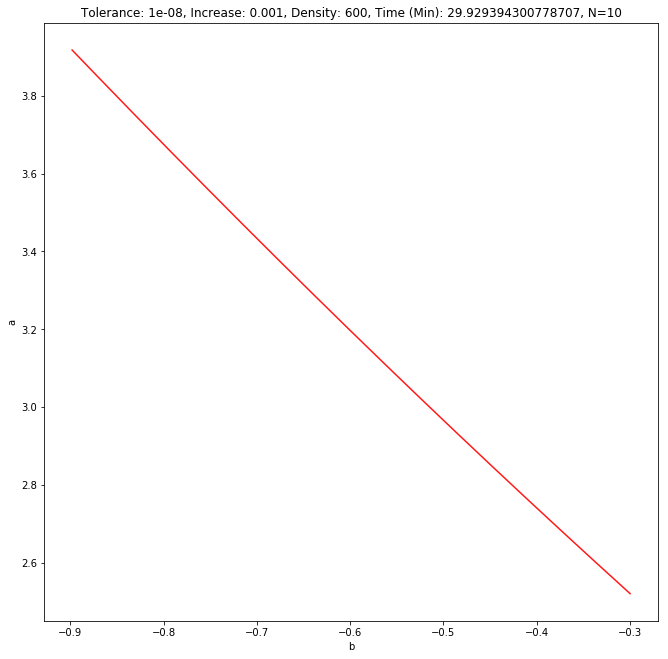

In [184]:
r=600
my_b = np.zeros(r)
my_a = np.zeros(r)
my_count = np.zeros(r)
my_stQ, my_unstQ = np.zeros(r),np.zeros(r)
my_xs,my_ys = np.zeros(r),np.zeros(r)
my_xu,my_yu = np.zeros(r),np.zeros(r)
my_t,my_s = np.zeros(r),np.zeros(r)
for i in range(r):
    my_b[i] = b_vals[i]
    my_a[i] = a_vals[i]
    my_count[i] = count_vals[i]
    my_stQ[i],my_unstQ[i] = stQual[i],unstQual[i]
    my_xs[i],my_ys[i] = xs_tan[i],ys_tan[i]
    my_xu[i],my_yu[i] = xu_tan[i],yu_tan[i]
    my_t[i],my_s[i] = t_vals[i],s_vals[i]



fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1)  
# midx, midy = 0,0
# lim = 2
# plt.xlim([midx-lim,midx+lim])
# plt.ylim([midy-lim,midy+lim])
run_length = 1795.7636580467224
plt.title('Tolerance: '+ str(toler) + ', Increase: ' + str(inc0)+', Density: '+str(r)+', Time (Min): '+str(run_length/60)+', N='+str(N))

plt.xlabel('b') 
plt.ylabel('a')
plt.plot(my_b, my_a, '-', color='red', alpha = 0.9, markersize=3,)

33.59
[30.]
20207


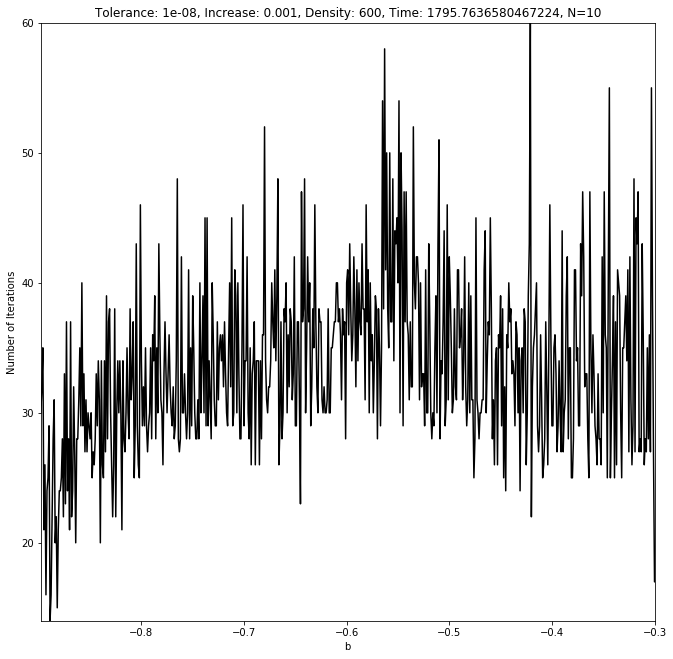

In [185]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('Number of Iterations')
plt.title('Tolerance: '+ str(toler) + ', Increase: ' + str(inc0)+', Density: '+str(r)+', Time: '+str(run_length)+', N='+str(N))
plt.xlim(np.min(my_b),np.max(my_b))
plt.ylim(np.min(my_count),np.max(my_count))
plt.plot(my_b, my_count, '-',color='black')
print(np.mean(my_count))
print(sci.stats.mode(my_count)[0])
print(total_count)

5.0
5.0


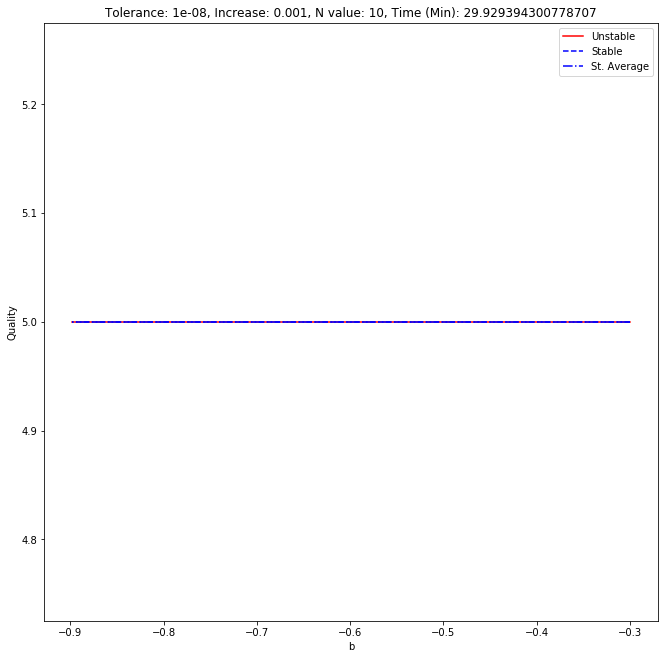

In [186]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('Quality')
plt.title('Tolerance: '+ str(toler) + ', Increase: ' + str(inc0)+', N value: '+str(N)+', Time (Min): '+str(run_length/60))

# plt.xlim(np.min(my_b),np.max(my_b))
# plt.ylim(np.min(my_unstQ),np.max(my_stQ))

plt.plot(my_b, my_unstQ, '-',color='red')
plt.plot(my_b, my_stQ,'--',color='blue')
plt.plot(my_b, [np.mean(my_stQ)]*r,'-.',color='blue')
plt.legend(['Unstable','Stable','St. Average'])
print(np.mean(my_unstQ))
print(np.mean(my_stQ))



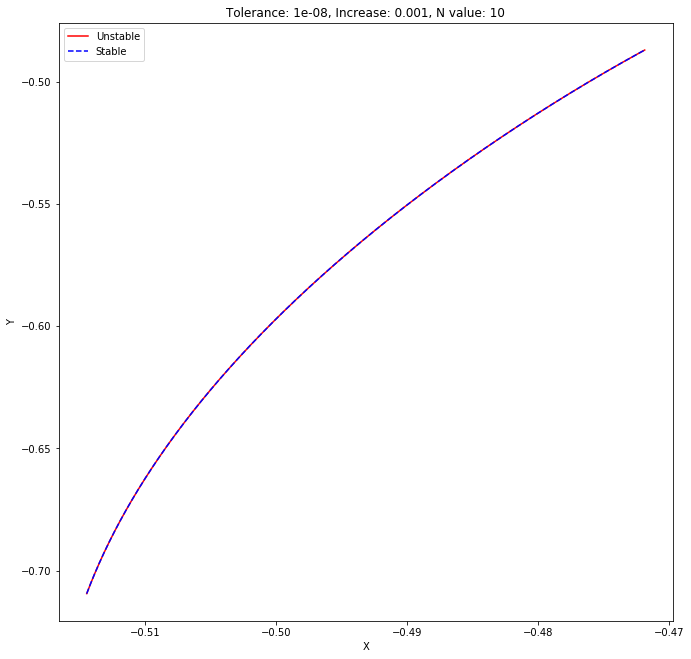

In [187]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('X') 
plt.ylabel('Y')
plt.title('Tolerance: '+ str(toler) + ', Increase: ' + str(inc0)+', N value: '+str(N))
plt.plot(my_xu, my_yu, '-',color='red')
plt.plot(my_xs, my_ys, '--',color='blue')


plt.legend(['Unstable','Stable'])

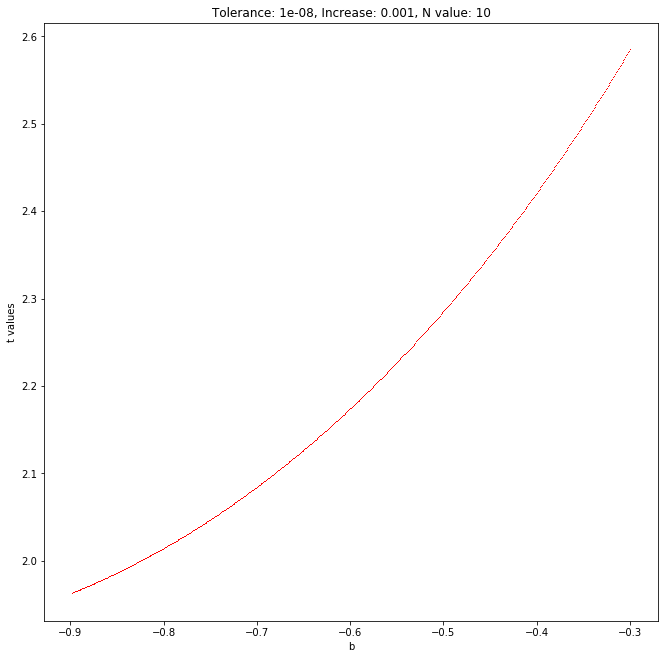

In [188]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1)

plt.xlabel('b') 
plt.ylabel('t values')
plt.title('Tolerance: '+ str(toler) + ', Increase: ' + str(inc0)+', N value: '+str(N))

#model_t = np.poly1d(np.polyfit(np.log(my_b), my_t,5))

plt.plot(my_b, my_t, ',',color='red')

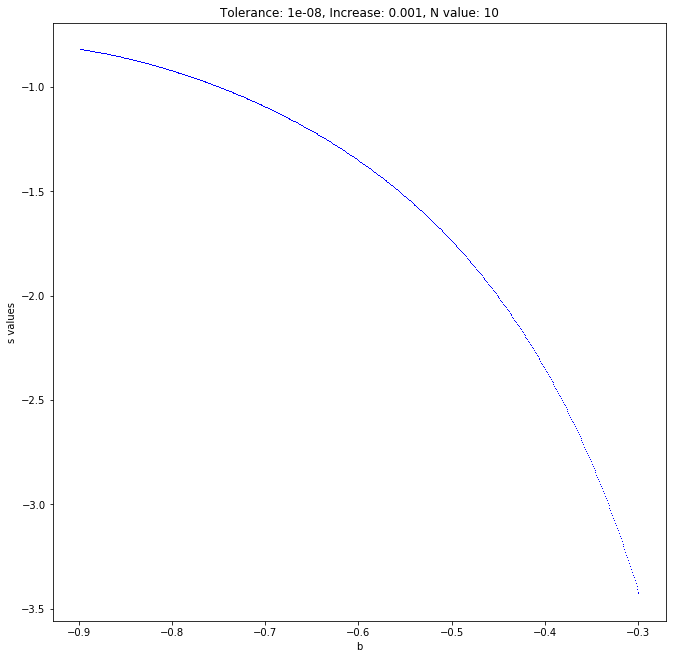

In [189]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('s values')
plt.title('Tolerance: '+ str(toler) + ', Increase: ' + str(inc0)+', N value: '+str(N))


#model_s = np.poly1d(np.polyfit(my_b, my_s, 3))


plt.plot(my_b, my_s, ',',color='blue')

In [190]:
tan_b_backwards , tan_a_backwards = my_b.copy(),  my_a.copy()

In [192]:
#save b,a files
new_tan_ba = open("new_tan_ba.txt", "w")
for i in range(r):
    np.savetxt(new_tan_ba, [my_b[i],my_a[i]])

new_tan_ba.close()

#save x,y
new_tan_xy = open("new_tan_xy.txt", "w")
for i in range(r):
    np.savetxt(new_tan_xy, [my_xs[i],my_ys[i]])
new_tan_xy.close()

In [22]:
#Henon map (x,y) -> (1 - a*x**2 + b*y,x)
def hMap(a,b,x,y):
    return 1 - a*x**2 + b*y
    
#define doing the henon map n times
def hMap_n(a,b,x,y,n):
    x_i = x
    y_i = y
    
    for i in range(n):
        old_x = x_i
        old_y = y_i
        
        new_x = hMap(a,b,old_x,old_y)
        new_y = old_x
        
        x_i = new_x
        y_i = new_y
        
    x_n, y_n = x_i,y_i
    return [x_n, y_n]
def NhMap_n(a,b,x,y,n,N):
    x_i,y_i = x,y
    for i in range(N):
        x_i,y_i = hMap_n(a,b,x_i,y_i,n)
    return [x_i,y_i]

#Inverse of Henon map
def backwards_hMap(a,b,x,y):
    return -(1/b)*(1 - a*y**2 - x)
    
#get both fixed points of the system
def getPeriodic(a,b):
    p1 = (-1*(1 - b) + sym.sqrt((1-b)**2 + 4*a))/(2*a)
    p2 = (-1*(1 - b) - sym.sqrt((1-b)**2 + 4*a))/(2*a)
    return p1,p2
def getFixed_np(a,b):
    #p1 = (-1*(1 - b) + sym.sqrt((1-b)**2 + 4*a))/(2*a)
    p2 = (-1*(1 - b) - np.sqrt((1-b)**2 + 4*a))/(2*a)
    return p2
#get the unstable eigenvector
def getUnstableLin(a,b,x):
    evecUn = [-a*x + sym.sqrt(b+a**2 * x**2),1]
    return evecUn

#get stable eigenvector
def getStableLin(a,b,x):
    evecSt = [-a*x - sym.sqrt(b+a**2 * x**2),1]
    return evecSt

#get Matrix value
def getValsMat(M, t0, s0):
    return M.subs([(t,t0),(s,s0)])

def getQualityUnst(b,a,x, y):
    x_vals = np.zeros(100)
    y_vals = np.zeros(100)
    x_vals[0],y_vals[0] = x,y
    
    fp = getFixed_np(a,b)

    curr_diff = np.sqrt((x-fp)**2 + (y-fp)**2)
    toler = 0.001
    
    for i in range(100-1):
        yNew = backwards_hMap(a,b,x_vals[i],y_vals[i])
        xNew = y_vals[i]
        
        new_diff = np.sqrt((xNew-fp)**2 + (yNew-fp)**2)
        
        if i>4 and new_diff > curr_diff and new_diff > toler:
            return i
        curr_diff=new_diff
        x_vals[i+1],y_vals[i+1] = xNew, yNew
    return 0

def getQualitySt(b,a,x, y):
    x_vals = np.zeros(100)
    y_vals = np.zeros(100)
    x_vals[0],y_vals[0] = x,y
    
    fp = getFixed_np(a,b)

    curr_diff = np.sqrt((x-fp)**2 + (y-fp)**2)
    toler = 0.001
    
    for i in range(100-1):
        xNew = hMap(a,b,x_vals[i],y_vals[i])
        yNew = x_vals[i]
        
        new_diff = np.sqrt((xNew-fp)**2 + (yNew-fp)**2)
        
        if i>4 and new_diff > curr_diff and new_diff > toler:
            return i
        curr_diff=new_diff
        x_vals[i+1],y_vals[i+1] = xNew, yNew
    return 0


print('done')
#try eigenvalue-parameterized definitions of manifolds

def get_eig(b,a):
    p_val = p_n(b,a)
    
    jac = np.matrix([[-2*a*p_val, b], [1, 0]])
    
    #jac_N = np.linalg.matrix_power(jac, N)
    
    w, v = np.linalg.eig(jac)
    return w

def get_xu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    t_par = t_val / (eig**N)
    
    return xu_n(b,a,t_par)

def get_yu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    
    t_par = t_val / (eig**N)
    
    return yu_n(b,a,t_par)

def get_xs(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N)
    
    return xs_n(b,a,s_par)

def get_ys(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N) #multiply because you are dividing by the inverse eigenval
    
    return ys_n(b,a,s_par)

#DERIVATIVE VALS TOO################
def get_Dxu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    t_par = t_val / (eig**N)
    
    return Dxu_n(b,a,t_par)

def get_Dyu(b,a,t_val):
    eig = get_eig(b,a)[0]
    
    
    t_par = t_val / (eig**N)
    
    return Dyu_n(b,a,t_par)

def get_Dxs(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N)
    
    return Dxs_n(b,a,s_par)

def get_Dys(b,a,s_val):
    eig = get_eig(b,a)[1]
    
    s_par = s_val * (eig**N) #multiply because you are dividing by the inverse eigenval
    
    return Dys_n(b,a,s_par)
def getTraceDFn(a,b,px, py, n):
    global b_val
    if type(a) == np.ndarray:
        a = a[0]
    DF = np.array([[-2*a*px, b],[1,0]])
    
    vals_px, vals_py = np.zeros(n+1),np.zeros(n+1)
    vals_px[0],vals_py[0] = px,py
    for i in range(1,n+1):
        px_old = px
        
        px = hMap(a,b,px,py)
        py = px_old
        
        vals_px[i],vals_py[i] = px,py
        
    for i in range(0,n+1):
        if n-i == 0: break
        
        DF_i =  np.array([[-2*a*vals_px[n-i], b],[1,0]])
        DF = sci.matmul(DF, DF_i)#DF_i.dot(DF)
        
        
    return np.trace(DF)

def R_getTraceDFn(a,b,px, py, n):
    if type(a) == np.ndarray:
        a = a[0]
        
    henArray = []
    finalMatrix = np.array([[1, 0], [0, 1]])
    xOld = px
    yOld = py
    for i in range(n):
        henArray.append(np.array([[-2 * (a) * xOld, b], [1, 0]]))
        xNew = hMap(a, b, xOld, yOld)
        yNew = xOld
        xOld = xNew
        yOld = yNew
    for i in range(n):
        finalMatrix = np.matmul(finalMatrix, henArray[n - 1 - i])
    traceFinal = abs(np.trace(finalMatrix))
    return traceFinal

print('done')

def F_R2(xy):
    global my_a,b,n
    x,y = xy[0],xy[1]
    if type(my_a) == np.ndarray:
        my_a= my_a[0]
    xy = NhMap_n(my_a,b,x,y,n,1)
    
    ans = [x - xy[0],y-xy[1]]
    #print(ans)
    return ans
def get_tr(a):
    global n,b,my_x,my_y

    if type(a) == np.ndarray:
        a = a[0]

    ans = R_getTraceDFn(a,b,my_x, my_y, n)
    #print(ans)
    return ans
def F_R3(axy):
    global a,b,n
    a = axy[0]
    
    xy = F_R2([axy[1],axy[2]])
    return [get_tr(axy[0]),xy[0],xy[1]]



done
done


In [23]:
a_tan = my_a
x_tan = my_xs
y_tan = my_ys


In [27]:
#take first case of a,b;x,y and try to find period 3 sink
#establish period, choice of b, and get first corresponding sink (or best approximation)
global b, my_x,my_y, my_a
b = -0.3
n = 3

a_tangent = a_tan[0]
my_x, my_y = x_tan[0],y_tan[0]
my_tol = 0.00001


converged = False
#test out quick methods first before doing sweep
my_a = a_tangent 

print('Original: ',my_a, my_x,my_y)
for i in range(1000):
        my_a = optimize.fsolve(get_tr,[my_a])

        xy = optimize.fsolve(F_R2,[my_x,my_y])
        my_x,my_y = xy[0],xy[1]

print('After 2-step algo: ',my_a, my_x,my_y)
print('^Error: ',F_R3([my_a,my_x,my_y]))
#print(my_a,my_x,my_y,F_R3([my_a,my_x,my_y]))
if np.linalg.norm(F_R3([my_a,my_x,my_y])) < my_tol:
    converged = True
    
#if not converged, must try sweep algorithm 

converged = False
conv_points_x, conv_points_y = [],[]
conv_a = []
corresp_tr = []

print('fin',np.linalg.norm([my_x - x_tan[0],my_y - y_tan[0]]))

radius = 0.5
iters = 0
x_mid,y_mid = x_tan[0],y_tan[0]
a_guess = a_tangent
x_mid,y_mid =  my_x,my_y



curr_min = 1
while not converged and iters < 2:
    iters+=1

    density = int(iters * 100)#50
    
    lim = radius
    #x_vals = np.linspace(x_mid-lim,x_mid+lim,density)
    #y_vals = np.linspace(y_mid-lim,y_mid+lim,density)
    x_vals = np.linspace(-0.5144679256975757,0.545775104144431,density)
    y_vals = np.linspace(-0.709369701083485, -0.5144679256975757,density)

    X_vals,Y_vals = np.meshgrid(x_vals, y_vals)
    A_vals ,Y_Con = np.meshgrid(x_vals, y_vals)
    X_Con, Y_Con = np.meshgrid(x_vals, y_vals)
    
    for i in range(len(x_vals)):

        for j in range(len(y_vals)):
            if i == j:
                print(i,j,': ',x_vals[i],y_vals[j])
            #print(i,j)

            A_vals[j,i] = a_guess
            my_x,my_y = X_vals[j,i], Y_vals[j,i]

            my_a = A_vals[j,i]
            k=0
            fixed = False
            errorDiff = 0.0001
            while k < 600:
                k+= 1

                #xy = optimize.fsolve(F_R2,[my_x,my_y],maxfev = 200,xtol=0)
                
                
                
                a_new = optimize.fsolve(get_tr,[my_a],maxfev = 100,xtol = 0.1)
                my_a = a_new[0]
                
                xy = optimize.fsolve(F_R2,[my_x,my_y],maxfev = 100,xtol=0.1)



                xy1 = NhMap_n(my_a,b,xy[0],xy[1],1,1)
                if k>10 and (sci.linalg.norm([xy1[0] - xy[0],xy1[1] - xy[1]]) < 0.001): #if fixed point
                    X_Con[j,i] = -1
                    fixed = True
                    X_Con[j,i], Y_Con[j,i] = my_x,my_y
                    break
                my_x,my_y = xy[0],xy[1]


            XYn1 = NhMap_n(my_a,b,my_x,my_y,n,2)
            #print(i,j,': ',a,x,y,F_R2([x,y]),get_tr([a]))
#             if not fixed and abs(get_tr(my_a)) < 0.4 and F_R2([my_x,my_y])[0] < 0.4 and F_R2([my_x,my_y])[0]<0.4:
#                 print('--------    ----------')
#                 print(my_a,get_tr(my_a))
#                 print(my_x,my_y, F_R2([my_x,my_y]))
                
#                 print('--------    ----------')

            X_Con[j,i], Y_Con[j,i] = my_x,my_y

            vec_diff = F_R2([my_x,my_y])
            

            flag = False
            
            
            try: 
                if  sci.linalg.norm(vec_diff) < errorDiff:
                    flag = True
                for k in range(1,n):
                    XYnk = NhMap_n(my_a,b,my_x,my_y,k,1)
                    vec_diff = [my_x - XYnk[0], my_y - XYnk[1]]
                    #print(sci.linalg.norm(vec_diff))
                    if sci.linalg.norm(vec_diff) < errorDiff:
                        flag = False
            except ValueError:
                flag = False
                
            if flag and (-0.5144679256975757 > my_x) or (my_x > 0.545775104144431):
                #print('bad values: ',my_a,my_x,my_y)
                #print('a too high: ',my_a)
                #print('error: ',get_tr(my_a))
                
                flag = False
                
            if flag:
                X_Con[j,i] = 1
                print('#######################################')
                print(my_a,',',my_x,', ',my_y, get_tr(my_a))
                print('#######################################')
                    
                if abs(get_tr(my_a)) < 1:
                    print('Good values')
                    conv_points_x.append(my_x)
                    conv_points_y.append(my_y)
                    conv_a.append(my_a)
                    corresp_tr.append(get_tr(my_a))
                    
                if abs(get_tr(my_a)) < curr_min:
                    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                    curr_min = abs(get_tr(my_a))
                    #x_mid,y_mid = my_x,my_y
                    print('new min: ',curr_min)
                    #a_guess = my_a             #needs work
                    min_a = my_a
                    x_min,y_min = my_x,my_y
                    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                if np.linalg.norm(get_tr(my_a)) < my_tol:
                    
                    converged = True
                    
                

            
            else:
                X_Con[j,i] = -1  
            if converged:
                break
        if converged:
            break
#     #vectors = np.zeros((len(conv_points_x),3))
#     vectors = np.row_stack( (conv_points_x, conv_points_y,conv_a) )
#     print(len(conv_points_x),len(conv_points_y),len(conv_a),len(corresp_tr),len(vectors))
    
# #     for i in range(len(conv_points_x)):
# #         vectors[i,0] = conv_points_x[i]
# #         vectors[i,1] = conv_points_y[i]
# #         vectors[i,2] = conv_a[i]
    
#     data = odr.Data(vectors, corresp_tr)
#     print(data)
#     odr_obj = odr.ODR(data, odr.multilinear)
#     output = odr_obj.run()
#     print(output.beta)
    
    
        

b_0 = b
a_0 = min_a
x_0 = x_min
y_0 = y_min
print('New a,x,y: ',[my_a, my_x,my_y])
print(get_tr(my_a))
print(NhMap_n(my_a,b,my_x,my_y,n,1))
xy = NhMap_n(my_a,b,my_x,my_y,n,1)
my_x,my_y = xy[0],xy[1]
print(get_tr(my_a))

NameError: name 'a_tan' is not defined

In [99]:
#print(conv_a)
print(min_a,x_min,y_min)

1.1730668521996097 -0.026652833366596584 -0.7498026135438491


In [35]:
for i in range(5):
    print(NhMap_n(1.8686036454552086,-0.3,my_x,my_y,i,1))

[0.7767563017849964, 0.048913756200614236]
[-0.14209679477181864, 0.7767563017849964]
[0.7292432006681402, -0.14209679477181864]
[0.04891375620061395, 0.7292432006681402]
[0.7767563017849966, 0.04891375620061395]


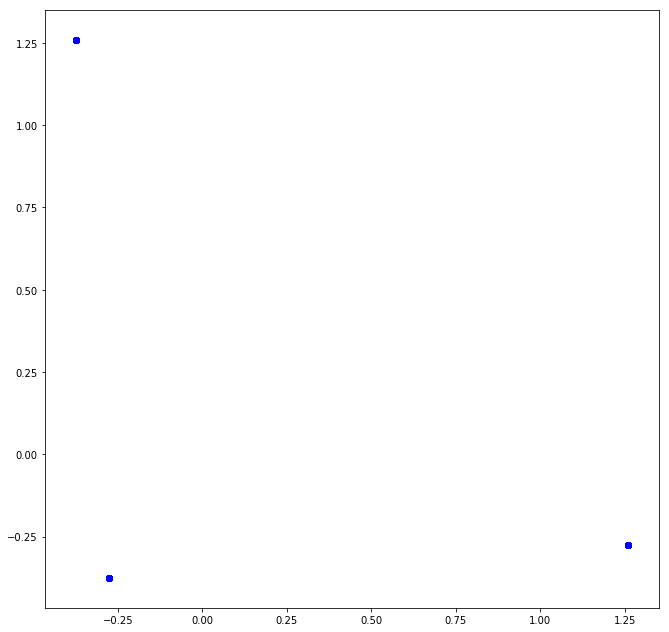

In [40]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 

b = -0.899899999999934
a =  1.02454281608162
p =  [-0.27641989069434, -0.374447499800844]
# Trace DFn:  0.2797031616144068
# n*p:  [1.4975475609355857, -0.016931424163158626]
# n*100p:  [1.4975559836374392, -0.01700256702949532]
for i in range(5*50):
    xy = NhMap_n(a,b,p[0],p[1],i,1)
    plt.scatter(xy[0],xy[1],color='blue')

In [20]:
def deltatauX(t0_x, tn_x):
    global b_val
    return t0_x - tn_x
def deltatauY(t0_y, tn_y):
    global b_val
    return t0_y - tn_y
def deltapivX(piv0_x, pivn_x):
    global b_val
    return piv0_x - pivn_x
def deltapivY(piv0_y, pivn_y):
    global b_val
    return piv0_y - pivn_y

def Per_getTraceDFn(a,b,px, py, n):
    global b_val
    DF = np.array([[-2*a*px, b],[1,0]])
    
    vals_px, vals_py = np.zeros(n+1),np.zeros(n+1)
    vals_px[0],vals_py[0] = px,py
    for i in range(1,n+1):
        px_old = px
        
        px = hMap(a,b,px,py)
        py = px_old
        
        vals_px[i],vals_py[i] = px,py
        
    for i in range(0,n+1):
        if n-i == 0: break
        
        DF_i =  np.array([[-2*a*vals_px[n-i], b],[1,0]])
        DF = sci.matmul(DF, DF_i)#DF_i.dot(DF)
        
        
    return np.trace(DF)

def getdxdy_p(u):
    global b_val
    return dx_p(u)/dy_p(u)

def getDeltadxdy_p(m,u):
    global b_val
    return m - getdxdy_p(u)


def getTau_u(m,y_p,dx_p,dy_p,y_curr):
    global b_val
    global n
    
    F = lambda u: m -  dx_p(u)/dy_p(u)
    #get u_guess by choosing u with current y value on parabolic curve.
    F_y = lambda u:y_curr - y_p(u)
    u_guess = optimize.fsolve(F_y, 0)
    
    u_new = optimize.fsolve(F, u_guess)

    return u_new



def F_sink(apdxdy):
    global b_val
    global n
    
    a,pivot_x,pivot_y,dx,dy = apdxdy[0],apdxdy[1],apdxdy[2],apdxdy[3],apdxdy[4]
    
    u = symbols('u')
    
    l_rX = pivot_x + u * dx
    l_rY = pivot_y + u * dy
    
    dx_perp = -dy
    dy_perp = dx
    
    #line of interest to be mapped
    l_rXperp = pivot_x + u*dx_perp
    l_rYperp = pivot_y + u*dy_perp
    
    #apply henon n times to perp line

    linexi_p = l_rXperp
    lineyi_p = l_rYperp
    
    for i in range(n):
        oldlinex_p = linexi_p
        oldliney_p = lineyi_p
        

        newlinex_p = hMap(a,b_val,oldlinex_p, oldliney_p)
        newliney_p = oldlinex_p

        linexi_p = newlinex_p
        lineyi_p = newliney_p

    pbola_x = linexi_p
    pbola_y = lineyi_p
    
    #find derivative of parabola expression
    dx_p_sym = sym.diff(pbola_x,u)
    dy_p_sym = sym.diff(pbola_y,u)

    #lambdify the expressions for faster running time
    x_p = sym.lambdify([u], pbola_x, "numpy")
    y_p = sym.lambdify([u], pbola_y, "numpy")

    dx_p = sym.lambdify([u], dx_p_sym, "numpy")
    dy_p = sym.lambdify([u], dy_p_sym, "numpy")
    
    #get u of pivot on perpindicular line
    u_piv = sym.solve(l_rYperp - pivot_y, u)
    
    #get u of tangency on parabolic manifold

    
    u_tau = getTau_u(dx/dy,y_p,dx_p,dy_p,pivot_y)

    x_tau, y_tau = x_p(u_tau), y_p(u_tau)
    DifftauX , DifftauY = deltatauX(x_tau,pivot_x),deltatauY(y_tau,pivot_y)
    xn, yn = NhMap_n(a,b_val,pivot_x,pivot_y,n,1)
    DiffpivX, DiffpivY = deltapivX(pivot_x,xn), deltapivY(pivot_y,yn)
    trDFn = R_getTraceDFn(a,b_val,pivot_x, pivot_y,n)
    return [DifftauX, DifftauY, DiffpivX, DiffpivY, trDFn]
print('done')

done


In [30]:
b = -0.3
b_val = -0.3
val = optimize.fsolve(F_sink,[1.1730668521996097, -0.026652833366596584 ,  -0.7498026135438491,1,-20],xtol=0 )
print(val[0],val[1],val[2])
print(F_sink(val))
print(val[3],val[4])

/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:163: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


1.173059540420795 -0.02659105998372532 -0.7497263264218252
[array([-8.24183849e-07]), array([-4.60120482e-07]), -5.0010686564183615e-11, -1.802102911341308e-11, 1.8839791239289028e-05]
132.0143267256669 -2543.0971433582577


In [125]:
b_val = -0.2999
err = 10e-14
val = optimize.fsolve(F_sink,[1.1731985079533807, -0.026573532549541694, -0.7497528011518595,1986.4107295917045, -38178.3396768215],xtol=0,epsfcn = err )
print(val[0],val[1],val[2])
print(F_sink(val))
print(val[3],val[4])

1.1731985079533802 -0.02657353254954312 -0.7497528011519062
[array([-1.23455378e-11]), array([-6.85618229e-12]), 7.124509315836747e-14, -7.66053886991358e-15, 5.551115123125783e-14]
2805.822462292957 -37861.482700116474


In [80]:
n=3
jac = np.matrix([[-2*a_tangent*-0.5144679256975757, b_val], [1, 0]])

#jac_N = np.linalg.matrix_power(jac, N)

w, v = np.linalg.eig(jac)
print(w)

[2.47177982 0.12132958]


In [146]:
#take first case of a,b;x,y and try to find period 3 sink
#establish period, choice of b, and get first corresponding sink (or best approximation)
global b, my_x,my_y, my_a
b = -0.2999
b_val = -0.2999
n = 3

a_tangent = a_tan[0]
my_x, my_y = x_tan[0],y_tan[0]
my_tol = 0.00001


converged = False
#test out quick methods first before doing sweep
my_a = a_tangent 

print('Original: ',my_a, my_x,my_y)
for i in range(1000):
        my_a = optimize.fsolve(get_tr,[my_a])

        xy = optimize.fsolve(F_R2,[my_x,my_y])
        my_x,my_y = xy[0],xy[1]

print('After 2-step algo: ',my_a, my_x,my_y)
print('^Error: ',F_R3([my_a,my_x,my_y]))
#print(my_a,my_x,my_y,F_R3([my_a,my_x,my_y]))
if np.linalg.norm(F_R3([my_a,my_x,my_y])) < my_tol:
    converged = True
    
#if not converged, must try sweep algorithm 

converged = False
conv_points_x, conv_points_y = [],[]
conv_a = []
corresp_tr = []

print('fin',np.linalg.norm([my_x - x_tan[0],my_y - y_tan[0]]))

radius = 0.05
iters = 0
x_mid,y_mid = x_tan[0],y_tan[0]
a_guess = 1.1730668521996097
x_mid = -0.026573532549541694
y_mid = -0.7497528011518595



curr_min = 1
while not converged and iters < 2:
    iters+=1

    density = 20 #int(iters * 100)#50
    
    lim = radius
    #x_vals = np.linspace(x_mid-lim,x_mid+lim,density)
    #y_vals = np.linspace(y_mid-lim,y_mid+lim,density)
    x_vals = np.linspace(x_mid - radius,x_mid + radius,density*iters)
    y_vals = np.linspace(y_mid - radius,y_mid + radius,density*iters)

    X_vals,Y_vals = np.meshgrid(x_vals, y_vals)
    A_vals ,Y_Con = np.meshgrid(x_vals, y_vals)
    X_Con, Y_Con = np.meshgrid(x_vals, y_vals)
    
    for i in range(len(x_vals)):

        for j in range(len(y_vals)):
            if i == j:
                print(i,j,': ',x_vals[i],y_vals[j])
            print(i,j)

            A_vals[j,i] = a_guess
            my_x,my_y = X_vals[j,i], Y_vals[j,i]

            my_a = A_vals[j,i]
            k=0
            fixed = False
            errorDiff = 0.0001
            while k < 1:
                k+= 1

                #xy = optimize.fsolve(F_R2,[my_x,my_y],maxfev = 200,xtol=0)
                
                
                
#                 a_new = optimize.fsolve(get_tr,[my_a],maxfev = 100,xtol = 0.1)
#                 my_a = a_new[0]
                
#                 xy = optimize.fsolve(F_R2,[my_x,my_y],maxfev = 100,xtol=0.1)


                new_vals = optimize.fsolve(F_sink,[my_a,my_x,my_y,1986.4107295917045,-38178.3396768215])
                my_a = new_vals[0]
                xy = [new_vals[1],new_vals[2]]
            
                xy1 = NhMap_n(my_a,b,xy[0],xy[1],1,1)
                if k>10 and (sci.linalg.norm([xy1[0] - xy[0],xy1[1] - xy[1]]) < 0.001): #if fixed point
                    X_Con[j,i] = -1
                    fixed = True
                    X_Con[j,i], Y_Con[j,i] = my_x,my_y
                    break
                my_x,my_y = xy[0],xy[1]


            XYn1 = NhMap_n(my_a,b,my_x,my_y,n,2)
            #print(i,j,': ',a,x,y,F_R2([x,y]),get_tr([a]))
#             if not fixed and abs(get_tr(my_a)) < 0.4 and F_R2([my_x,my_y])[0] < 0.4 and F_R2([my_x,my_y])[0]<0.4:
#                 print('--------    ----------')
#                 print(my_a,get_tr(my_a))
#                 print(my_x,my_y, F_R2([my_x,my_y]))
                
#                 print('--------    ----------')

            X_Con[j,i], Y_Con[j,i] = my_x,my_y

            vec_diff = F_R2([my_x,my_y])
            

            flag = False
            
            
            try: 
                if  sci.linalg.norm(vec_diff) < errorDiff:
                    flag = True
                for k in range(1,n):
                    XYnk = NhMap_n(my_a,b,my_x,my_y,k,1)
                    vec_diff = [my_x - XYnk[0], my_y - XYnk[1]]
                    #print(sci.linalg.norm(vec_diff))
                    if sci.linalg.norm(vec_diff) < errorDiff:
                        flag = False
            except ValueError:
                flag = False
                
            if flag and (x_mid - 0.1 > my_x) or (my_x > x_mid+0.1):
                print('bad values: ',my_a,my_x,my_y)
                #print('a too high: ',my_a)
                #print('error: ',get_tr(my_a))
                
                flag = False
                
            if flag:
                X_Con[j,i] = 1
                print('#######################################')
                print(my_a,',',my_x,', ',my_y, get_tr(my_a))
                print('#######################################')
                    
                if abs(get_tr(my_a)) < 1:
                    print('Good values')
                    conv_points_x.append(my_x)
                    conv_points_y.append(my_y)
                    conv_a.append(my_a)
                    corresp_tr.append(get_tr(my_a))
                    
                if abs(get_tr(my_a)) < curr_min:
                    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                    curr_min = abs(get_tr(my_a))
                    #x_mid,y_mid = my_x,my_y
                    print('new min: ',curr_min)
                    #a_guess = my_a             #needs work
                    min_a = my_a
                    x_min,y_min = my_x,my_y
                    print('!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                if np.linalg.norm(get_tr(my_a)) < my_tol:
                    
                    converged = True
                    
                

            
            else:
                X_Con[j,i] = -1  
            if converged:
                break
        if converged:
            break
#     #vectors = np.zeros((len(conv_points_x),3))
#     vectors = np.row_stack( (conv_points_x, conv_points_y,conv_a) )
#     print(len(conv_points_x),len(conv_points_y),len(conv_a),len(corresp_tr),len(vectors))
    
# #     for i in range(len(conv_points_x)):
# #         vectors[i,0] = conv_points_x[i]
# #         vectors[i,1] = conv_points_y[i]
# #         vectors[i,2] = conv_a[i]
    
#     data = odr.Data(vectors, corresp_tr)
#     print(data)
#     odr_obj = odr.ODR(data, odr.multilinear)
#     output = odr_obj.run()
#     print(output.beta)
    
    
        

b_0 = b
a_0 = min_a
x_0 = x_min
y_0 = y_min
print('New a,x,y: ',[my_a, my_x,my_y])
print(get_tr(my_a))
print(NhMap_n(my_a,b,my_x,my_y,n,1))
xy = NhMap_n(my_a,b,my_x,my_y,n,1)
my_x,my_y = xy[0],xy[1]
print(get_tr(my_a))

Original:  2.5201856783144514 -0.514467925383376 -0.7093696982463953
After 2-step algo:  0.0 0.7692899453804138 0.7692899453804138
^Error:  [0.0, 0.0, 0.0]
fin 1.9581799234080972
0 0 :  -0.07657353254954169 -0.7997528011518595
0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
#######################################
1.1731984917924994 , -0.026573535040982567 ,  -0.7497528107178076 2.1381718617874412e-09
#######################################
Good values
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
new min:  2.1381718617874412e-09
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
New a,x,y:  [1.1731984917924994, -0.026573535040982567, -0.7497528107178076]
2.1381718617874412e-09
[-0.026573494139964737, -0.7497527840179548]
5.12929452023414e-07


In [147]:
b_val = -0.2999
err = 10e-14
val = optimize.fsolve(F_sink,[1.1731984917924994, -0.026573535040982567, -0.7497528107178076,1986.4107295917045, -38178.3396768215],xtol=0,epsfcn = err )
print(val[0],val[1],val[2])
print(F_sink(val))
print(val[3],val[4])

1.173198507953394 -0.02657353254957902 -0.7497528011518759
[array([-2.75589933e-11]), array([-1.53839164e-11]), -2.393918396847994e-16, -1.1102230246251565e-16, 4.931610675384945e-13]
1932695.1386683583 -37368357.685220614


/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:163: RuntimeWarning: xtol=0.000000 is too small, no further improvement in the approximate
  solution is possible.
  warnings.warn(msg, RuntimeWarning)


In [32]:
#moving b_i, getting sink points      FORWARD

global b_val
global n

n=3
Total = 20000
b_i = np.zeros(Total)

p0 = 0
p1 = 1

b_i[p0] = -0.3
b_i[p1] = -0.2999

inc = 0.00005



a_nsink = np.zeros(len(b_i))
px_nsink = np.zeros(len(b_i)) 
py_nsink = np.zeros(len(b_i))
dx_nsink = np.zeros(len(b_i))
dy_nsink = np.zeros(len(b_i))
p_error = np.zeros(len(b_i))
px_IT,py_IT = np.zeros(len(b_i)),np.zeros(len(b_i))

a_nsink[p0]  = 1.1731985079533807
px_nsink[p0] = -0.026573532549541694
py_nsink[p0] = -0.7497528011518595
dx_nsink[p0] = 1986.4107295917045
dy_nsink[p0] =  -38178.3396768215
px_IT[p0] = px_nsink[p0]
py_IT[p0] = py_nsink[p0]


a_nsink[p1]  =  1.173198507953394 
px_nsink[p1] =  -0.02657353254957902 
py_nsink[p1] =  -0.7497528011518759
dx_nsink[p1] = 1986.4107295917045
dy_nsink[p1] = -38178.3396768215
px_IT[p1] = px_nsink[p1]
py_IT[p1] = py_nsink[p1]


b_end = -0.05
direction = 1
for i in range(2,Total):
    global b_val
    
    
    print('i: ',i)
    b_i[i] = b_i[i-1] + direction*inc
    b_val = b_i[i]
    
    slope_a = np.double((a_nsink[i-1] - a_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))
    slope_px = np.double((px_nsink[i-1] - px_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))
    slope_py = np.double((py_nsink[i-1] - py_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))

            
            
    a_guess = a_nsink[i-1] + slope_a*(b_i[i] - b_i[i-1])
    px_guess = px_nsink[i-1] + slope_px*(b_i[i] - b_i[i-1])
    py_guess = py_nsink[i-1] + slope_py*(b_i[i] - b_i[i-1])    
    
    
    sinkn_i = optimize.fsolve(F_sink,[a_guess,px_guess,py_guess,dx_nsink[i-1],dy_nsink[i-1]],xtol = 0,epsfcn = 10e-11)#epsfcn
    
    #pNew = NhMap_n(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n,1)
    
    #sinkn_i = optimize.fsolve(F_sink,[sinkn_i[0],pNew[0],pNew[1],sinkn_i[3],sinkn_i[4]],xtol = 0,epsfcn = 1)
    
#     my_a,my_x,my_y = sinkn_i[0],sinkn_i[1],sinkn_i[2]
#     xy = optimize.fsolve(F_R2,[my_x,my_y],xtol=0)

#     a_new = optimize.fsolve(get_tr,[my_a],xtol = 0)
#     my_a = a_new[0]

    #xy = optimize.fsolve(F_R2,[my_x,my_y],xtol=0)
# #    axy = optimize.fsolve(F_R3,[my_a,my_x,my_y])
    
    sinkn_i = optimize.fsolve(F_sink,[sinkn_i[0],sinkn_i[1],sinkn_i[2],dx_nsink[i-1],dy_nsink[i-1]],xtol = 0)#epsfcn
    xy50 = NhMap_n(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n,50)
    if R_getTraceDFn(sinkn_i[0],b_val,xy50[0],xy50[1],n) < R_getTraceDFn(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n):
        sinkn_i[1] = xy50[0]
        sinkn_i[2] = xy50[1]

    a_nsink[i]  = sinkn_i[0]
    px_nsink[i] = sinkn_i[1]
    py_nsink[i] = sinkn_i[2]
    dx_nsink[i] = sinkn_i[3]
    dy_nsink[i] = sinkn_i[4]
    
    #calculate relative error
#     print(np.abs((a_guess - a_nsink[i])) / a_nsink[i])
#     print(np.abs((px_guess - px_nsink[i]) / px_nsink[i]))
#     print(np.abs((py_guess - py_nsink[i])) / py_nsink[i])
    
    print('...')
    p_i = sinkn_i[1],sinkn_i[2]
    p_Fin = NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100)

    p_error[i] = np.sqrt((p_i[0] - p_Fin[0])**2 + (p_i[1]-p_Fin[1])**2)

    
    print('b: ',b_val)
    print('a: ',a_nsink[i])
    print('dx: ',dx_nsink[i])
    print('dy: ',dy_nsink[i])

    print('p: ',px_nsink[i],', ',py_nsink[i])
    print('Trace DFn: ',R_getTraceDFn(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n))
    print('n*p: ',hMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n))
    print('n*100p: ',NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100))
    true_p = NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100)

    print('^Trace 100*DFn: ',R_getTraceDFn(a_nsink[i],b_val,true_p[0],true_p[1],n))
    print('p-F Error: ',F_sink(sinkn_i))
    print('100 np-Error: ',F_sink([sinkn_i[0], true_p[0],true_p[1],sinkn_i[3],sinkn_i[4]]))
    print('p sink diff error: ',p_error[i])
    print('--------------------------------------------')
    px_IT[i] = px_nsink[i]
    py_IT[i] = py_nsink[i]
    if b_val > b_end:
        print("Finished Loading")
        l = i-1
        break




i:  2
...
b:  -0.29985
a:  1.173267748584722
dx:  522.2887005159131
dy:  -9237.206775364944
p:  -0.026564059620638403 ,  -0.7497657168155996
Trace DFn:  1.3433698597964394e-14
n*p:  [-0.02656405962062658, -0.7497657168155931]
n*100p:  [-0.02656405962062658, -0.7497657168155933]
^Trace 100*DFn:  1.6120438317557273e-13
p-F Error:  [array([-1.73450976e-10]), array([-9.68478631e-11]), -1.1823875212257917e-14, -6.439293542825908e-15, 1.3433698597964394e-14]
100 np-Error:  [array([-6.44407638e-10]), array([-3.59807517e-10]), 0.0, 0.0, 1.6120438317557273e-13]
p sink diff error:  1.3358825150097473e-14
--------------------------------------------
i:  3
...
b:  -0.2998
a:  1.1733369987158004
dx:  520.7214401298633
dy:  -9237.691782947823
p:  -0.026554589128883643 ,  -0.7497786277171155
Trace DFn:  4.96269692007445e-13
n*p:  [-0.026554589128883643, -0.7497786277171155]
n*100p:  [-0.026554589128883643, -0.7497786277171155]
^Trace 100*DFn:  4.96269692007445e-13
p-F Error:  [array([-2.14157692e-10]

/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:163: RuntimeWarning: xtol=0.000000 is too small, no further improvement in the approximate
  solution is possible.
  warnings.warn(msg, RuntimeWarning)


[array([1.12687637e-14]), array([5.55111512e-15]), 0.0, 0.0, 1.1546319456101628e-14]
p sink diff error:  1.1158520269769198e-15
--------------------------------------------
i:  9
...
b:  -0.29950000000000004
a:  1.1737526989880016
dx:  235.1562028262338
dy:  -94407449603420.28
p:  -0.026497817335918723 ,  -0.749855993127744
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.026497817335919494, -0.7498559931277443]
n*100p:  [-0.02649781733591866, -0.7498559931277439]
^Trace 100*DFn:  4.440892098500626e-16
p-F Error:  [array([4.6698756e-15]), array([2.22044605e-15]), 7.7021722333370235e-16, 3.3306690738754696e-16, 3.3306690738754696e-16]
100 np-Error:  [array([4.60742555e-15]), array([2.10942375e-15]), 8.326672684688674e-16, 4.440892098500626e-16, 4.440892098500626e-16]
p sink diff error:  1.2738115944464653e-16
--------------------------------------------
i:  10
...
b:  -0.29945000000000005
a:  1.1738220156129833
dx:  230.37457302962176
dy:  -94407449603578.3
p:  -0.02648836389315347 ,  -0.74

...
b:  -0.2988500000000001
a:  1.1746545559580401
dx:  2330.010894415935
dy:  -94407449603284.6
p:  -0.026375112325176656 ,  -0.7500230302269538
Trace DFn:  7.771561172376096e-16
n*p:  [-0.026375112325175643, -0.7500230302269534]
n*100p:  [-0.026375112325176475, -0.7500230302269538]
^Trace 100*DFn:  3.1086244689504383e-15
p-F Error:  [array([-2.15244489e-14]), array([-1.23234756e-14]), -1.0130785099704553e-15, -4.440892098500626e-16, 7.771561172376096e-16]
100 np-Error:  [array([-2.17048601e-14]), array([-1.23234756e-14]), -8.326672684688674e-16, -4.440892098500626e-16, 3.1086244689504383e-15]
p sink diff error:  1.8041124150158794e-16
--------------------------------------------
i:  23
...
b:  -0.2988000000000001
a:  1.1747239960528157
dx:  2361.0208636376788
dy:  -94407449603270.03
p:  -0.026365690494954387 ,  -0.7500358459164088
Trace DFn:  1.942890293094024e-14
n*p:  [-0.026365690494962735, -0.7500358459164115]
n*100p:  [-0.026365690494959737, -0.7500358459164098]
^Trace 100*DFn: 

...
b:  -0.2982000000000002
a:  1.1755580178876757
dx:  1278.381540183092
dy:  -94407449598403.33
p:  -0.0262528178874941 ,  -0.7501892630375058
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.026252817887494728, -0.7501892630375049]
n*100p:  [-0.026252817887493063, -0.750189263037504]
^Trace 100*DFn:  1.5210055437364645e-14
p-F Error:  [array([5.9778571e-15]), array([5.77315973e-15]), 6.279698983036042e-16, -8.881784197001252e-16, 1.1102230246251565e-15]
100 np-Error:  [array([4.94049246e-15]), array([3.99680289e-15]), 0.0, 0.0, 1.5210055437364645e-14]
p sink diff error:  2.0570777852022437e-15
--------------------------------------------
i:  36
...
b:  -0.2981500000000002
a:  1.1756275813689103
dx:  1287.8324153639394
dy:  -94407449598411.53
p:  -0.026243427614113888 ,  -0.750202017021835
Trace DFn:  1.0647882575653966e-10
n*p:  [-0.02624342764721843, -0.7502020169084781]
n*100p:  [-0.026243427441915324, -0.7502020168014005]
^Trace 100*DFn:  2.1628985269472878e-09
p-F Error:  [array([-3

...
b:  -0.29755000000000026
a:  1.1764630844570416
dx:  1782.9348604533366
dy:  -94407449600094.73
p:  -0.026130933176904663 ,  -0.7503546919113137
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.02613093317690901, -0.7503546919113159]
n*100p:  [-0.026130933176908344, -0.7503546919113154]
^Trace 100*DFn:  4.796163466380676e-14
p-F Error:  [array([1.33608402e-14]), array([7.21644966e-15]), 4.3472170307978786e-15, 2.220446049250313e-15, 1.7763568394002505e-15]
100 np-Error:  [array([1.79301018e-14]), array([9.43689571e-15]), 0.0, 0.0, 4.796163466380676e-14]
p sink diff error:  4.0872750414143524e-15
--------------------------------------------
i:  49
...
b:  -0.29750000000000026
a:  1.1765327705097206
dx:  1784.3553864495773
dy:  -94407449600092.17
p:  -0.026121574541514068 ,  -0.7503673862002369
Trace DFn:  1.885342659768696e-09
n*p:  [-0.026121574978821616, -0.7503673844382793]
n*100p:  [-0.02612157185708497, -0.7503673828122794]
^Trace 100*DFn:  3.3515108799342386e-08
p-F Error:  [array

...
b:  -0.29690000000000033
a:  1.1773697553463096
dx:  613.7196143232931
dy:  -94407449598901.16
p:  -0.026009457345915865 ,  -0.7505193172065092
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.026009457345915366, -0.7505193172065048]
n*100p:  [-0.026009457345908482, -0.7505193172065011]
^Trace 100*DFn:  9.814371537686384e-14
p-F Error:  [array([9.1038288e-15]), array([9.76996262e-15]), -4.996003610813204e-16, -4.440892098500626e-15, 1.5543122344752192e-15]
100 np-Error:  [array([2.77555756e-16]), array([3.33066907e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 9.814371537686384e-14]
p sink diff error:  1.0963276698565927e-14
--------------------------------------------
i:  62
...
b:  -0.29685000000000034
a:  1.1774395657028227
dx:  609.0123455147956
dy:  -94407449598887.58
p:  -0.026000129962730455 ,  -0.7505319474168348
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.026000129962732543, -0.7505319474168352]
n*100p:  [-0.026000129962731322, -0.7505319474168345]
^Trace 100*DFn:  1.

...
b:  -0.2962500000000004
a:  1.178278030235729
dx:  879.429387587742
dy:  -94407449600657.98
p:  -0.025888389545536118 ,  -0.7506831392873756
Trace DFn:  5.551115123125783e-15
n*p:  [-0.02588838954553624, -0.7506831392873811]
n*100p:  [-0.025888389545545065, -0.7506831392873856]
^Trace 100*DFn:  1.120215031846783e-13
p-F Error:  [array([-1.78294879e-14]), array([-1.50990331e-14]), 1.214306433183765e-16, 5.440092820663267e-15, 5.551115123125783e-15]
100 np-Error:  [array([-7.43849426e-15]), array([-3.77475828e-15]), 0.0, 0.0, 1.120215031846783e-13]
p sink diff error:  1.3412740570992938e-14
--------------------------------------------
i:  75
...
b:  -0.2962000000000004
a:  1.1783479639636132
dx:  912.1085823110915
dy:  -94407449599981.58
p:  -0.025879093514114264 ,  -0.7506957077272761
Trace DFn:  6.5503158452884236e-15
n*p:  [-0.025879093514115603, -0.7506957077272641]
n*100p:  [-0.025879093514095508, -0.7506957077272537]
^Trace 100*DFn:  2.4080737404119645e-13
p-F Error:  [array([4

...
b:  -0.2956000000000005
a:  1.1791879088055788
dx:  1699.8327964552373
dy:  -94407449599355.27
p:  -0.025767728925305235 ,  -0.7508461585244142
Trace DFn:  6.661338147750939e-16
n*p:  [-0.025767728925304267, -0.7508461585244136]
n*100p:  [-0.025767728925303768, -0.7508461585244134]
^Trace 100*DFn:  1.9317880628477724e-14
p-F Error:  [array([-1.92935945e-14]), array([-1.02140518e-14]), -9.679756995950584e-16, -5.551115123125783e-16, 6.661338147750939e-16]
100 np-Error:  [array([-1.98729921e-14]), array([-1.09912079e-14]), 0.0, 0.0, 1.9317880628477724e-14]
p sink diff error:  1.6606478026451712e-15
--------------------------------------------
i:  88
...
b:  -0.2955500000000005
a:  1.179257965880266
dx:  1674.6471072348113
dy:  -94407449599430.5
p:  -0.025758464180163882 ,  -0.7508586652225957
Trace DFn:  3.552713678800501e-15
n*p:  [-0.025758464180163254, -0.7508586652225956]
n*100p:  [-0.025758464180163698, -0.7508586652225958]
^Trace 100*DFn:  5.773159728050814e-15
p-F Error:  [arr

...
b:  -0.29495000000000055
a:  1.180099390736236
dx:  1925.1623726075047
dy:  -94407449599575.3
p:  -0.02564747463331626 ,  -0.7510083752942093
Trace DFn:  3.552713678800501e-15
n*p:  [-0.02564747463331052, -0.7510083752942069]
n*100p:  [-0.025647474633310796, -0.7510083752942072]
^Trace 100*DFn:  6.572520305780927e-14
p-F Error:  [array([-1.36869682e-14]), array([-7.43849426e-15]), -5.7419347054832315e-15, -2.3314683517128287e-15, 3.552713678800501e-15]
100 np-Error:  [array([-2.03725925e-14]), array([-1.02140518e-14]), 0.0, 0.0, 6.572520305780927e-14]
p sink diff error:  5.8573975317848875e-15
--------------------------------------------
i:  101
...
b:  -0.29490000000000055
a:  1.180169571133134
dx:  2185.1041813293687
dy:  -94407449599506.14
p:  -0.02563824110886628 ,  -0.7510208202799167
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.025638241108864923, -0.7510208202799163]
n*100p:  [-0.025638241108865756, -0.7510208202799168]
^Trace 100*DFn:  8.43769498715119e-15
p-F Error:  [arra

...
b:  -0.2943000000000006
a:  1.1810124757081437
dx:  795.022753966202
dy:  -94407449597257.39
p:  -0.02552762581624581 ,  -0.7511697899794963
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.025527625816242017, -0.7511697899794939]
n*100p:  [-0.025527625816241184, -0.7511697899794936]
^Trace 100*DFn:  5.88418203051333e-14
p-F Error:  [array([-4.31252256e-15]), array([-3.44169138e-15]), -3.7921055184853e-15, -2.4424906541753444e-15, 3.3306690738754696e-16]
100 np-Error:  [array([-1.14908083e-14]), array([-7.54951657e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.88418203051333e-14]
p sink diff error:  5.393722565028791e-15
--------------------------------------------
i:  114
...
b:  -0.2942500000000006
a:  1.1810827794026735
dx:  793.6598421532468
dy:  -94407449597264.05
p:  -0.025518423446789635 ,  -0.7511821732824293
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.02551842344680183, -0.7511821732824288]
n*100p:  [-0.02551842344679034, -0.7511821732824226]
^Trace 100*DFn:  6.10

...
b:  -0.2936500000000007
a:  1.1819271634018331
dx:  1594.2677978024624
dy:  -94407449597945.58
p:  -0.025408181619382197 ,  -0.7513304029690971
Trace DFn:  3.6637359812630166e-15
n*p:  [-0.02540818161939229, -0.7513304029691023]
n*100p:  [-0.025408181619392012, -0.7513304029691019]
^Trace 100*DFn:  1.2878587085651816e-13
p-F Error:  [array([-2.33042752e-14]), array([-1.36557432e-14]), 1.0092621183233064e-14, 5.10702591327572e-15, 3.6637359812630166e-15]
100 np-Error:  [array([-1.20459198e-14]), array([-7.54951657e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.2878587085651816e-13]
p sink diff error:  1.0914494671202078e-14
--------------------------------------------
i:  127
...
b:  -0.2936000000000007
a:  1.181997590369416
dx:  1570.0167374967205
dy:  -94407449597942.86
p:  -0.025399010339117692 ,  -0.7513427246194113
Trace DFn:  1.4432899320127035e-14
n*p:  [-0.025399010339117956, -0.7513427246194068]
n*100p:  [-0.025399010339110017, -0.7513427246194027]
^Trace 100*DFn:

...
b:  -0.29300000000000076
a:  1.1828434523538531
dx:  -429.315276518794
dy:  -94407449598091.53
p:  -0.025289141369387414 ,  -0.7514902171931209
Trace DFn:  1.8217767294714804e-09
n*p:  [-0.025289141392858094, -0.7514902150165892]
n*100p:  [-0.02528913800031113, -0.7514902132647748]
^Trace 100*DFn:  4.289925681355555e-08
p-F Error:  [array([-2.34862234e-11]), array([2.17652174e-09]), 2.3470680260428978e-11, -2.1765317326227773e-09, 1.8217767294714804e-09]
100 np-Error:  [array([5.16253706e-15]), array([2.10942375e-15]), 0.0, 0.0, 4.289925681355555e-08]
p sink diff error:  5.175188696229351e-09
--------------------------------------------
i:  140
...
b:  -0.29295000000000077
a:  1.1829140037139956
dx:  -431.8479244558145
dy:  -94407449598105.6
p:  -0.025280000929667003 ,  -0.7515024746862344
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.025280000929669144, -0.7515024746862352]
n*100p:  [-0.025280000929668367, -0.7515024746862348]
^Trace 100*DFn:  1.5432100042289676e-14
p-F Error:  [ar

...
b:  -0.29235000000000083
a:  1.1837613456770988
dx:  -635.6502654625336
dy:  -94407449598352.88
p:  -0.025170503660640466 ,  -0.7516492254469116
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.02517050366062845, -0.7516492254469055]
n*100p:  [-0.025170503660628674, -0.7516492254469058]
^Trace 100*DFn:  1.5021317523178368e-13
p-F Error:  [array([-1.38535017e-14]), array([-8.21565038e-15]), -1.2014694794615366e-14, -6.106226635438361e-15, 3.3306690738754696e-16]
100 np-Error:  [array([4.5519144e-15]), array([3.10862447e-15]), 0.0, 0.0, 1.5021317523178368e-13]
p sink diff error:  1.3129964651208746e-14
--------------------------------------------
i:  153
...
b:  -0.29230000000000084
a:  1.1838320191171285
dx:  86.20577951050917
dy:  -94407449599098.58
p:  -0.02516139436092887 ,  -0.7516614238843292
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.02516139436092918, -0.7516614238843293]
n*100p:  [-0.025161394360928957, -0.7516614238843292]
^Trace 100*DFn:  1.2212453270876722e-15
p-F Error:  [

...
b:  -0.2917000000000009
a:  1.1846808396202309
dx:  -1312.8795653531768
dy:  -94407449597465.11
p:  -0.0250522681826277 ,  -0.7518074357430651
Trace DFn:  2.220446049250313e-16
n*p:  [-0.02505226818262951, -0.7518074357430661]
n*100p:  [-0.025052268182628956, -0.7518074357430657]
^Trace 100*DFn:  1.554312234475219e-14
p-F Error:  [array([1.10675358e-14]), array([5.99520433e-15]), 1.8110513089197866e-15, 9.992007221626409e-16, 2.220446049250313e-16]
100 np-Error:  [array([1.23234756e-14]), array([6.66133815e-15]), 0.0, 0.0, 1.554312234475219e-14]
p sink diff error:  1.4216606598934132e-15
--------------------------------------------
i:  166
...
b:  -0.2916500000000009
a:  1.1847516362596466
dx:  -1124.806029949829
dy:  -94407449597625.56
p:  -0.02504318977408127 ,  -0.7518195726211481
Trace DFn:  6.328271240363392e-15
n*p:  [-0.025043189774081986, -0.7518195726211429]
n*100p:  [-0.025043189774072327, -0.7518195726211379]
^Trace 100*DFn:  1.1302070390684094e-13
p-F Error:  [array([-1

100 np-Error:  [array([-1.54876112e-14]), array([-8.32667268e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 9.048317650695026e-14]
p sink diff error:  8.356935596851501e-15
--------------------------------------------
i:  178
...
b:  -0.291050000000001
a:  1.1856019350082239
dx:  -1245.683947437455
dy:  -94407449597478.66
p:  -0.02493443389261136 ,  -0.751964845959378
Trace DFn:  1.887379141862766e-15
n*p:  [-0.024934433892595864, -0.7519648459593729]
n*100p:  [-0.024934433892601193, -0.7519648459593758]
^Trace 100*DFn:  1.2967404927621828e-13
p-F Error:  [array([6.9458328e-15]), array([-8.8817842e-16]), -1.549455008742484e-14, -5.10702591327572e-15, 1.887379141862766e-15]
100 np-Error:  [array([-5.77315973e-15]), array([-4.3298698e-15]), 0.0, 0.0, 1.2967404927621828e-13]
p sink diff error:  1.038203464720787e-14
--------------------------------------------
i:  179
...
b:  -0.291000000000001
a:  1.1856728548225004
dx:  -1470.1891462469832
dy:  -94407449597388.81
p:  -0.02492538

...
b:  -0.29045000000000104
a:  1.1864535980297781
dx:  -1892.9750575766382
dy:  -94407449597558.34
p:  -0.024826019117956823 ,  -0.7521094379297291
Trace DFn:  7.771561172376096e-16
n*p:  [-0.024826019117955622, -0.7521094379297284]
n*100p:  [-0.024826019117955178, -0.7521094379297282]
^Trace 100*DFn:  2.2093438190040615e-14
p-F Error:  [array([-3.2959746e-15]), array([-1.55431223e-15]), -1.2004286453759505e-15, -6.661338147750939e-16, 7.771561172376096e-16]
100 np-Error:  [array([-4.94049246e-15]), array([-2.44249065e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.2093438190040615e-14]
p sink diff error:  1.8690371535574616e-15
--------------------------------------------
i:  191
...
b:  -0.29040000000000105
a:  1.1865246315221465
dx:  -2144.5152122601676
dy:  -94407449597066.6
p:  -0.02481699992932786 ,  -0.7521214565148414
Trace DFn:  2.220446049250313e-16
n*p:  [-0.024816999929327455, -0.7521214565148421]
n*100p:  [-0.024816999929328676, -0.7521214565148427]
^Trace 100*D

...
b:  -0.2898000000000011
a:  1.1873777722231083
dx:  -1662.2471178561
dy:  -94407449597204.95
p:  -0.02470895392154624 ,  -0.7522653107137464
Trace DFn:  7.66053886991358e-15
n*p:  [-0.02470895392153788, -0.7522653107137497]
n*100p:  [-0.024708953921550536, -0.7522653107137564]
^Trace 100*DFn:  5.4289905904170155e-14
p-F Error:  [array([1.97411532e-14]), array([3.44169138e-15]), -8.36136715420821e-15, 3.3306690738754696e-15, 7.66053886991358e-15]
100 np-Error:  [array([-9.38138456e-15]), array([-4.77395901e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.4289905904170155e-14]
p sink diff error:  1.0876062679231316e-14
--------------------------------------------
i:  204
...
b:  -0.2897500000000011
a:  1.1874489288431662
dx:  -1509.0980415546974
dy:  -94407449596675.08
p:  -0.024699965430287723 ,  -0.7522772678344061
Trace DFn:  0.0
n*p:  [-0.02469996543028763, -0.752277267834406]
n*100p:  [-0.02469996543028763, -0.752277267834406]
^Trace 100*DFn:  1.2212453270876722e-15
p-F 

...
b:  -0.2891500000000012
a:  1.1883035469293584
dx:  -594.9698105374176
dy:  -94407449598584.36
p:  -0.0245922873921635 ,  -0.7524203846594225
Trace DFn:  0.0
n*p:  [-0.02459228739216457, -0.7524203846594234]
n*100p:  [-0.0245922873921659, -0.7524203846594241]
^Trace 100*DFn:  3.175237850427948e-14
p-F Error:  [array([1.7069679e-15]), array([1.22124533e-15]), 1.0685896612017132e-15, 8.881784197001252e-16, 0.0]
100 np-Error:  [array([4.10782519e-15]), array([2.77555756e-15]), 0.0, 0.0, 3.175237850427948e-14]
p sink diff error:  2.8600703230508e-15
--------------------------------------------
i:  217
...
b:  -0.2891000000000012
a:  1.1883748266525964
dx:  -670.8221275274204
dy:  -94407449598545.77
p:  -0.02458332953179424 ,  -0.752432280348967
Trace DFn:  1.021405182655144e-14
n*p:  [-0.024583329531784437, -0.7524322803489641]
n*100p:  [-0.024583329531788156, -0.7524322803489663]
^Trace 100*DFn:  8.737455203799982e-14
p-F Error:  [array([-1.83950077e-14]), array([-1.16573418e-14]), -9

...
b:  -0.28850000000000126
a:  1.189230921829975
dx:  -122.77972021442793
dy:  -94407449601420.03
p:  -0.02447601866502275 ,  -0.7525746602030893
Trace DFn:  6.217248937900877e-15
n*p:  [-0.0244760186650248, -0.7525746602030992]
n*100p:  [-0.024476018665038513, -0.7525746602031061]
^Trace 100*DFn:  2.0472512574087887e-13
p-F Error:  [array([-3.49373308e-15]), array([-9.43689571e-15]), 2.050443148604586e-15, 9.880984919163893e-15, 6.217248937900877e-15]
100 np-Error:  [array([-3.68038933e-14]), array([-1.89848137e-14]), 0.0, 0.0, 2.0472512574087887e-13]
p sink diff error:  2.309133809358395e-14
--------------------------------------------
i:  230
...
b:  -0.28845000000000126
a:  1.1893023246318943
dx:  195.61929261292272
dy:  -94407449601570.27
p:  -0.024467091368974094 ,  -0.7525864944953514
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.024467091368973737, -0.7525864944953512]
n*100p:  [-0.02446709136897396, -0.7525864944953513]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [arr

...
b:  -0.2878500000000013
a:  1.1901598966065285
dx:  -350.06545569252273
dy:  -94407449601653.11
p:  -0.02436014687418723 ,  -0.752728137787051
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.024360146874186583, -0.7527281377870507]
n*100p:  [-0.024360146874187028, -0.7527281377870509]
^Trace 100*DFn:  5.329070518200751e-15
p-F Error:  [array([6.47398801e-15]), array([3.88578059e-15]), -6.453171330633722e-16, -3.3306690738754696e-16, 2.6645352591003757e-15]
100 np-Error:  [array([6.27276009e-15]), array([3.77475828e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 5.329070518200751e-15]
p sink diff error:  2.2982303784612184e-16
--------------------------------------------
i:  243
...
b:  -0.28780000000000133
a:  1.1902314224626511
dx:  -608.906463723116
dy:  -94407449601519.52
p:  -0.024351250075798886 ,  -0.752739910716271
Trace DFn:  1.3877787807814457e-14
n*p:  [-0.02435125007580413, -0.7527399107162748]
n*100p:  [-0.02435125007580552, -0.7527399107162754]
^Trace 100*DFn:  7.3

...
b:  -0.2872500000000014
a:  1.1910188315178796
dx:  -1996.4572718208458
dy:  -94407449599276.58
p:  -0.024253539858524843 ,  -0.752869101542208
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.024253539858524686, -0.7528691015421968]
n*100p:  [-0.024253539858507922, -0.7528691015421881]
^Trace 100*DFn:  2.30593322214645e-13
p-F Error:  [array([-2.452899e-15]), array([9.76996262e-15]), -1.5612511283791264e-16, -1.1213252548714081e-14, 2.4424906541753444e-15]
100 np-Error:  [array([2.88102875e-14]), array([1.63202785e-14]), 0.0, 0.0, 2.30593322214645e-13]
p sink diff error:  2.610055349421245e-14
--------------------------------------------
i:  255
...
b:  -0.2872000000000014
a:  1.1910904709407673
dx:  -1773.1615425124994
dy:  -94407449599468.78
p:  -0.02424467115258832 ,  -0.7528808178594308
Trace DFn:  6.5503158452884236e-15
n*p:  [-0.024244671152587827, -0.752880817859424]
n*100p:  [-0.02424467115257739, -0.7528808178594186]
^Trace 100*DFn:  1.4055423491754482e-13
p-F Error:  [array(

...
b:  -0.28660000000000146
a:  1.1919508807862218
dx:  -2884.4990753635325
dy:  -94407449597241.02
p:  -0.024138429173808245 ,  -0.7530210490345949
Trace DFn:  2.3212370914293956e-09
n*p:  [-0.024138429628288882, -0.7530210464865564]
n*100p:  [-0.02413842533466637, -0.7530210442771524]
^Trace 100*DFn:  4.9781091915335196e-08
p-F Error:  [array([-4.54500455e-10]), array([2.54802679e-09]), 4.544806371520327e-10, -2.5480384469034334e-09, 2.3212370914293956e-09]
100 np-Error:  [array([2.91988655e-14]), array([1.56541446e-14]), 0.0, 0.0, 4.9781091915335196e-08]
p sink diff error:  6.113286261366563e-09
--------------------------------------------
i:  268
...
b:  -0.28655000000000147
a:  1.1920226445138349
dx:  -3032.3186107772276
dy:  -94407449596970.02
p:  -0.024129590629935804 ,  -0.7530327008732997
Trace DFn:  2.9013458302529216e-11
n*p:  [-0.02412959062993625, -0.7530327008732999]
n*100p:  [-0.024129590629935804, -0.7530327008732997]
^Trace 100*DFn:  2.9013458302529216e-11
p-F Error: 

...
b:  -0.28595000000000154
a:  1.1928845315973382
dx:  -3490.739506420309
dy:  -94407449598711.53
p:  -0.024023712477707293 ,  -0.7531721935302047
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.024023712477707182, -0.7531721935302046]
n*100p:  [-0.024023712477707293, -0.7531721935302047]
^Trace 100*DFn:  1.1102230246251565e-15
p-F Error:  [array([9.65894031e-15]), array([5.77315973e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.1102230246251565e-15]
100 np-Error:  [array([9.65894031e-15]), array([5.77315973e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.1102230246251565e-15]
p sink diff error:  0.0
--------------------------------------------
i:  281
...
b:  -0.28590000000000154
a:  1.1929564170100495
dx:  -3446.7140824001362
dy:  -94407449598693.34
p:  -0.024014904443337013 ,  -0.7531837872912719
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.024014904443334872, -0.7531837872912703]
n*100p:  [-0.02401490444333393, -0.7531837872912699]
^Trace 100*DFn:  3.752553823

...
b:  -0.2853000000000016
a:  1.1938197797384154
dx:  -2809.7228068112577
dy:  -94407449598862.02
p:  -0.023909389515159574 ,  -0.7533225450394291
Trace DFn:  1.199040866595169e-14
n*p:  [-0.023909389515151536, -0.753322545039427]
n*100p:  [-0.0239093895151557, -0.7533225450394292]
^Trace 100*DFn:  3.708144902248023e-14
p-F Error:  [array([2.70963807e-15]), array([7.77156117e-16]), -8.038708587676524e-15, -2.1094237467877974e-15, 1.199040866595169e-14]
100 np-Error:  [array([-2.03725925e-14]), array([-9.76996262e-15]), -9.992007221626409e-16, -4.440892098500626e-16, 3.708144902248023e-14]
p sink diff error:  3.876962211775492e-15
--------------------------------------------
i:  294
...
b:  -0.2852500000000016
a:  1.193891788109381
dx:  -2982.32246700953
dy:  -94407449598819.38
p:  -0.0239006117161366 ,  -0.7533340775762297
Trace DFn:  4.9960036108132044e-15
n*p:  [-0.02390061171613911, -0.7533340775762312]
n*100p:  [-0.02390061171613994, -0.7533340775762315]
^Trace 100*DFn:  4.907185

...
b:  -0.2846500000000017
a:  1.1947566261901974
dx:  -4007.3129627200533
dy:  -94407449598164.86
p:  -0.023795459209859503 ,  -0.7534721008515274
Trace DFn:  7.771561172376096e-16
n*p:  [-0.02379545920985815, -0.7534721008515273]
n*100p:  [-0.02379545920985976, -0.7534721008515282]
^Trace 100*DFn:  5.10702591327572e-15
p-F Error:  [array([-9.30505673e-15]), array([-4.99600361e-15]), -1.3530843112619095e-15, -1.1102230246251565e-16, 7.771561172376096e-16]
100 np-Error:  [array([-9.04831765e-15]), array([-4.21884749e-15]), 0.0, 0.0, 5.10702591327572e-15]
p sink diff error:  8.184659937385855e-16
--------------------------------------------
i:  307
...
b:  -0.2846000000000017
a:  1.1948287574949878
dx:  -3928.6963893480865
dy:  -94407449597941.98
p:  -0.02378671157912503 ,  -0.7534835722005302
Trace DFn:  0.0
n*p:  [-0.02378671157912543, -0.7534835722005304]
n*100p:  [-0.023786711579125208, -0.7534835722005303]
^Trace 100*DFn:  2.3314683517128287e-15
p-F Error:  [array([5.76275139e-15]

...
b:  -0.28400000000000175
a:  1.1956950706352578
dx:  -4305.030902944864
dy:  -94407449598030.77
p:  -0.02368192068955684 ,  -0.7536208614432512
Trace DFn:  1.1102230246251565e-14
n*p:  [-0.02368192068954489, -0.7536208614432499]
n*100p:  [-0.023681920689552327, -0.7536208614432539]
^Trace 100*DFn:  6.683542608243442e-14
p-F Error:  [array([2.33875419e-14]), array([8.10462808e-15]), -1.1952244749480201e-14, -1.3322676295501878e-15, 1.1102230246251565e-14]
100 np-Error:  [array([-3.57491814e-14]), array([-1.89848137e-14]), 0.0, 0.0, 6.683542608243442e-14]
p sink diff error:  5.241535231517359e-15
--------------------------------------------
i:  320
...
b:  -0.28395000000000176
a:  1.1957673248494642
dx:  -3739.288746855635
dy:  -94407449598453.94
p:  -0.023673203159973445 ,  -0.7536322716413757
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.023673203159965406, -0.7536322716413696]
n*100p:  [-0.02367320315996252, -0.7536322716413683]
^Trace 100*DFn:  1.4732659536775827e-13
p-F Error:  [

...
b:  -0.2833500000000018
a:  1.196635112756372
dx:  -4900.420509030129
dy:  -94407449597490.86
p:  -0.02356877308101929 ,  -0.7537688272971179
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.023568773081020955, -0.7537688272971181]
n*100p:  [-0.0235687730810204, -0.7537688272971178]
^Trace 100*DFn:  1.1657341758564144e-14
p-F Error:  [array([9.82547377e-15]), array([5.32907052e-15]), 1.6653345369377348e-15, 2.220446049250313e-16, 2.6645352591003757e-15]
100 np-Error:  [array([1.09356968e-14]), array([5.21804822e-15]), 0.0, 0.0, 1.1657341758564144e-14]
p sink diff error:  1.1157603309187458e-15
--------------------------------------------
i:  333
...
b:  -0.28330000000000183
a:  1.1967074898556032
dx:  -5167.510397975949
dy:  -94407449596642.3
p:  -0.023560085585374407 ,  -0.753780176381702
Trace DFn:  2.220446049250313e-16
n*p:  [-0.023560085585374535, -0.753780176381702]
n*100p:  [-0.023560085585374535, -0.753780176381702]
^Trace 100*DFn:  1.5543122344752192e-15
p-F Error:  [array([4.

...
b:  -0.2827000000000019
a:  1.1975767522364977
dx:  -4835.216913324471
dy:  -94407449598048.92
p:  -0.02345601551006049 ,  -0.7539159989013368
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.02345601551006049, -0.7539159989013368]
n*100p:  [-0.02345601551006049, -0.7539159989013368]
^Trace 100*DFn:  3.3306690738754696e-16
p-F Error:  [array([-1.74305015e-14]), array([-9.2148511e-15]), 0.0, 0.0, 3.3306690738754696e-16]
100 np-Error:  [array([-1.74305015e-14]), array([-9.2148511e-15]), 0.0, 0.0, 3.3306690738754696e-16]
p sink diff error:  0.0
--------------------------------------------
i:  346
...
b:  -0.2826500000000019
a:  1.1976492521963684
dx:  -4525.568219421056
dy:  -94407449598253.44
p:  -0.02344735798107187 ,  -0.7539272869101952
Trace DFn:  1.9206858326015208e-14
n*p:  [-0.02344735798107267, -0.7539272869101832]
n*100p:  [-0.023447357981053685, -0.7539272869101734]
^Trace 100*DFn:  2.299271883998699e-13
p-F Error:  [array([-1.61190505e-14]), array([3.99680289e-15]), 7.97972798

...
b:  -0.28205000000000197
a:  1.1985199887588076
dx:  -4125.95170275531
dy:  -94407449599438.17
p:  -0.023343647101564228 ,  -0.7540623767498341
Trace DFn:  1.887379141862766e-15
n*p:  [-0.023343647101569054, -0.7540623767498384]
n*100p:  [-0.023343647101571496, -0.7540623767498397]
^Trace 100*DFn:  9.536815781530095e-14
p-F Error:  [array([5.77662918e-15]), array([2.33146835e-15]), 4.826000710167477e-15, 4.3298697960381105e-15, 1.887379141862766e-15]
100 np-Error:  [array([1.55986335e-14]), array([9.2148511e-15]), 0.0, 0.0, 9.536815781530095e-14]
p sink diff error:  9.145810287980063e-15
--------------------------------------------
i:  359
...
b:  -0.28200000000000197
a:  1.198592611554963
dx:  -3817.577429610941
dy:  -94407449599675.44
p:  -0.023335019471874996 ,  -0.7540736037211695
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.02333501947187716, -0.7540736037211706]
n*100p:  [-0.023335019471876384, -0.7540736037211702]
^Trace 100*DFn:  1.8096635301390052e-14
p-F Error:  [array([1

...
b:  -0.28140000000000204
a:  1.199464822006666
dx:  -4691.274521945272
dy:  -94407449597529.6
p:  -0.023231666979512556 ,  -0.7542079613422156
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.023231666979505072, -0.7542079613422124]
n*100p:  [-0.02323166697950585, -0.7542079613422128]
^Trace 100*DFn:  8.837375276016246e-14
p-F Error:  [array([-8.39259218e-15]), array([-4.3298698e-15]), -7.483597075363946e-15, -3.219646771412954e-15, 1.1102230246251565e-16]
100 np-Error:  [array([-1.76525461e-14]), array([-8.43769499e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 8.837375276016246e-14]
p sink diff error:  7.258103753900424e-15
--------------------------------------------
i:  372
...
b:  -0.28135000000000204
a:  1.1995375676147597
dx:  -3986.934423400706
dy:  -94407449597820.5
p:  -0.023223069181700022 ,  -0.7542191273147024
Trace DFn:  4.884981308350689e-15
n*p:  [-0.023223069181699973, -0.7542191273147023]
n*100p:  [-0.023223069181699973, -0.7542191273147023]
^Trace 100*DFn:  5.

...
b:  -0.2807500000000021
a:  1.2004112516636758
dx:  -3024.3346032991963
dy:  -94407449598218.53
p:  -0.02312007426700337 ,  -0.7543527531837232
Trace DFn:  2.220446049250313e-16
n*p:  [-0.023120074267001578, -0.754352753183723]
n*100p:  [-0.023120074267002244, -0.7543527531837233]
^Trace 100*DFn:  1.3655743202889425e-14
p-F Error:  [array([-3.97945565e-15]), array([-1.44328993e-15]), -1.7937040741600185e-15, -2.220446049250313e-16, 2.220446049250313e-16]
100 np-Error:  [array([-5.10702591e-15]), array([-1.33226763e-15]), 1.0547118733938987e-15, 5.551115123125783e-16, 1.3655743202889425e-14]
p sink diff error:  1.1330227894854827e-15
--------------------------------------------
i:  385
...
b:  -0.2807000000000021
a:  1.2004841200593737
dx:  -3048.263900306712
dy:  -94407449598229.84
p:  -0.02311150623357925 ,  -0.7543638581964636
Trace DFn:  2.220446049250313e-16
n*p:  [-0.023111506233585988, -0.7543638581964666]
n*100p:  [-0.02311150623358449, -0.7543638581964657]
^Trace 100*DFn:  

...
b:  -0.2801000000000022
a:  1.201359277413636
dx:  -3966.993093367802
dy:  -94407449597386.67
p:  -0.023008868086282375 ,  -0.7544967527852389
Trace DFn:  3.774758283725532e-15
n*p:  [-0.023008868086270895, -0.7544967527852352]
n*100p:  [-0.02300886808627428, -0.7544967527852371]
^Trace 100*DFn:  1.0980105713542798e-13
p-F Error:  [array([-1.31665512e-14]), array([-8.8817842e-15]), -1.148039996401451e-14, -3.6637359812630166e-15, 3.774758283725532e-15]
100 np-Error:  [array([-2.37032616e-14]), array([-1.19904087e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.0980105713542798e-13]
p sink diff error:  8.28684721728405e-15
--------------------------------------------
i:  398
...
b:  -0.2800500000000022
a:  1.2014322685726246
dx:  -3980.3376445672443
dy:  -94407449596897.05
p:  -0.023000329749692173 ,  -0.7545077968777668
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.023000329749694293, -0.7545077968777654]
n*100p:  [-0.023000329749690462, -0.7545077968777634]
^Trace 100*DFn:

...
b:  -0.27945000000000225
a:  1.2023088989405915
dx:  -2751.7539754982463
dy:  -94407449596587.64
p:  -0.02289804755876169 ,  -0.7546399606632507
Trace DFn:  6.661338147750939e-16
n*p:  [-0.022898047558762014, -0.7546399606632509]
n*100p:  [-0.022898047558762014, -0.7546399606632509]
^Trace 100*DFn:  4.9960036108132044e-15
p-F Error:  [array([-3.98639455e-15]), array([-2.55351296e-15]), 3.226585665316861e-16, 2.220446049250313e-16, 6.661338147750939e-16]
100 np-Error:  [array([-3.66373598e-15]), array([-2.33146835e-15]), 0.0, 0.0, 4.9960036108132044e-15]
p sink diff error:  3.916788954393583e-16
--------------------------------------------
i:  411
...
b:  -0.27940000000000226
a:  1.2023820128385752
dx:  -2772.157748717938
dy:  -94407449596586.45
p:  -0.022889538851388065 ,  -0.754650943875523
Trace DFn:  7.771561172376096e-15
n*p:  [-0.022889538851399327, -0.7546509438755248]
n*100p:  [-0.022889538851393054, -0.7546509438755215]
^Trace 100*DFn:  7.127631818093505e-14
p-F Error:  [ar

...
b:  -0.2788000000000023
a:  1.2032601159288057
dx:  -2276.913633342095
dy:  -94407449596638.52
p:  -0.02278761180504691 ,  -0.7547823773398195
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.022787611805055452, -0.754782377339825]
n*100p:  [-0.022787611805056562, -0.7547823773398254]
^Trace 100*DFn:  1.305622276959184e-13
p-F Error:  [array([1.61676228e-15]), array([1.33226763e-15]), 8.541778395709798e-15, 5.551115123125783e-15, 1.2212453270876722e-15]
100 np-Error:  [array([-4.01345623e-14]), array([-2.04281037e-14]), 0.0, 0.0, 1.305622276959184e-13]
p sink diff error:  1.1362376794151844e-14
--------------------------------------------
i:  424
...
b:  -0.27875000000000233
a:  1.2033333525415006
dx:  -2343.4246032367178
dy:  -94407449596603.75
p:  -0.022779132659211384 ,  -0.7547932997122275
Trace DFn:  9.992007221626409e-16
n*p:  [-0.022779132659210333, -0.7547932997122243]
n*100p:  [-0.022779132659205614, -0.7547932997122219]
^Trace 100*DFn:  8.026912468039882e-14
p-F Error:  [arra

...
b:  -0.2781500000000024
a:  1.2042129280627776
dx:  -1656.5191648161142
dy:  -94407449598007.55
p:  -0.022677559944960894 ,  -0.7549240033425785
Trace DFn:  8.881784197001252e-16
n*p:  [-0.022677559944961068, -0.7549240033425786]
n*100p:  [-0.022677559944961068, -0.7549240033425786]
^Trace 100*DFn:  3.219646771412954e-15
p-F Error:  [array([-9.66587921e-15]), array([-4.5519144e-15]), 1.734723475976807e-16, 1.1102230246251565e-16, 8.881784197001252e-16]
100 np-Error:  [array([-9.49240686e-15]), array([-4.4408921e-15]), 0.0, 0.0, 3.219646771412954e-15]
p sink diff error:  2.0595777971499126e-16
--------------------------------------------
i:  437
...
b:  -0.2781000000000024
a:  1.2042862873659372
dx:  -1097.1876046859786
dy:  -94407449597838.88
p:  -0.022669110292925055 ,  -0.7549348649159316
Trace DFn:  5.551115123125783e-16
n*p:  [-0.02266911029292512, -0.7549348649159321]
n*100p:  [-0.02266911029292512, -0.7549348649159321]
^Trace 100*DFn:  1.4432899320127035e-15
p-F Error:  [arra

...
b:  -0.27750000000000247
a:  1.2051673350272667
dx:  998.7683992565705
dy:  -94407449599907.69
p:  -0.02256789109756453 ,  -0.7550648392046827
Trace DFn:  3.885780586188048e-15
n*p:  [-0.022567891097566295, -0.7550648392046836]
n*100p:  [-0.022567891097566573, -0.7550648392046837]
^Trace 100*DFn:  2.3425705819590803e-14
p-F Error:  [array([-1.38673795e-14]), array([-6.55031585e-15]), 1.7659484985443896e-15, 8.881784197001252e-16, 3.885780586188048e-15]
100 np-Error:  [array([-1.10467191e-14]), array([-5.10702591e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.3425705819590803e-14]
p sink diff error:  2.2747113491935893e-15
--------------------------------------------
i:  450
...
b:  -0.2774500000000025
a:  1.205240816996646
dx:  1051.2107980023181
dy:  -94407449599890.61
p:  -0.022559470871533954 ,  -0.7550756400202281
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.02255947087153498, -0.7550756400202286]
n*100p:  [-0.02255947087153548, -0.7550756400202289]
^Trace 100*DFn:  

...
b:  -0.27685000000000254
a:  1.2061233365072677
dx:  155.98740314031105
dy:  -94407449600874.47
p:  -0.02245860438118596 ,  -0.7552048854648072
Trace DFn:  8.881784197001252e-16
n*p:  [-0.02245860438118491, -0.7552048854648071]
n*100p:  [-0.0224586043811858, -0.7552048854648076]
^Trace 100*DFn:  8.881784197001252e-16
p-F Error:  [array([9.21138166e-15]), array([5.55111512e-15]), -1.0512424264419451e-15, -1.1102230246251565e-16, 8.881784197001252e-16]
100 np-Error:  [array([9.04831765e-15]), array([5.88418203e-15]), 0.0, 0.0, 8.881784197001252e-16]
p sink diff error:  3.7084152287924966e-16
--------------------------------------------
i:  463
...
b:  -0.27680000000000254
a:  1.206196941118647
dx:  168.89160099223585
dy:  -94407449600872.08
p:  -0.022450213513308906 ,  -0.7552156255642082
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.022450213513310502, -0.7552156255642091]
n*100p:  [-0.022450213513310557, -0.7552156255642091]
^Trace 100*DFn:  2.3425705819590803e-14
p-F Error:  [array

...
b:  -0.2762000000000026
a:  1.2070809321880345
dx:  1524.014448698455
dy:  -94407449600735.23
p:  -0.02234969891343801 ,  -0.7553441426671101
Trace DFn:  4.773959005888173e-15
n*p:  [-0.022349698913427474, -0.7553441426671081]
n*100p:  [-0.02234969891343258, -0.7553441426671108]
^Trace 100*DFn:  7.560618797697316e-14
p-F Error:  [array([1.15914223e-14]), array([1.33226763e-15]), -1.0536710393083126e-14, -1.9984014443252818e-15, 4.773959005888173e-15]
100 np-Error:  [array([3.60822483e-15]), array([6.66133815e-16]), 0.0, 0.0, 7.560618797697316e-14]
p sink diff error:  5.470393752688031e-15
--------------------------------------------
i:  476
...
b:  -0.2761500000000026
a:  1.2071546594172153
dx:  1487.0227027598014
dy:  -94407449600908.48
p:  -0.022341337335810077 ,  -0.7553548220924485
Trace DFn:  5.329070518200751e-15
n*p:  [-0.022341337335804956, -0.7553548220924515]
n*100p:  [-0.02234133733581395, -0.7553548220924562]
^Trace 100*DFn:  5.1181281435219717e-14
p-F Error:  [array([-

...
b:  -0.2755500000000027
a:  1.2080401218728283
dx:  1095.401286129036
dy:  -94407449600763.4
p:  -0.022241174143574183 ,  -0.755482611503271
Trace DFn:  4.6923221974637386e-09
n*p:  [-0.02224117414357385, -0.7554826115032709]
n*100p:  [-0.022241174143574183, -0.755482611503271]
^Trace 100*DFn:  4.6923221974637386e-09
p-F Error:  [array([-1.65423231e-14]), array([-8.77076189e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 4.6923221974637386e-09]
100 np-Error:  [array([-1.65423231e-14]), array([-8.77076189e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 4.6923221974637386e-09]
p sink diff error:  0.0
--------------------------------------------
i:  489
...
b:  -0.2755000000000027
a:  1.208113971577881
dx:  1083.8353665917434
dy:  -94407449600649.0
p:  -0.022232841455911836 ,  -0.7554932301550126
Trace DFn:  0.0
n*p:  [-0.022232841455904595, -0.7554932301550084]
n*100p:  [-0.022232841455903596, -0.7554932301550079]
^Trace 100*DFn:  1.1157741397482823e-13
p-F Error:  

...
b:  -0.27490000000000275
a:  1.2090009048942016
dx:  1552.8932448163373
dy:  -94407449601396.39
p:  -0.0221330281908712 ,  -0.7556202921022082
Trace DFn:  2.220446049250313e-16
n*p:  [-0.022133028190870263, -0.7556202921022074]
n*100p:  [-0.022133028190870596, -0.7556202921022076]
^Trace 100*DFn:  8.215650382226158e-15
p-F Error:  [array([-1.06165077e-15]), array([-6.66133815e-16]), -9.367506770274758e-16, -7.771561172376096e-16, 2.220446049250313e-16]
100 np-Error:  [array([-1.66533454e-15]), array([-1.22124533e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 8.215650382226158e-15]
p sink diff error:  8.201115075577421e-16
--------------------------------------------
i:  502
...
b:  -0.27485000000000276
a:  1.209074877286458
dx:  1548.0477008038442
dy:  -94407449601556.1
p:  -0.022124724989821595 ,  -0.7556308503073615
Trace DFn:  4.773959005888173e-15
n*p:  [-0.022124724989821765, -0.7556308503073617]
n*100p:  [-0.022124724989822597, -0.7556308503073621]
^Trace 100*DFn:  9

100 np-Error:  [array([-1.74860126e-14]), array([-1.05471187e-14]), 0.0, 0.0, 3.419486915845482e-14]
p sink diff error:  2.7114321702324674e-15
--------------------------------------------
i:  514
...
b:  -0.2742500000000028
a:  1.2099632812914354
dx:  2282.8840275553025
dy:  -94407449602585.92
p:  -0.02202526116792939 ,  -0.7557571854505437
Trace DFn:  0.0
n*p:  [-0.02202526116793113, -0.7557571854505455]
n*100p:  [-0.022025261167932852, -0.7557571854505464]
^Trace 100*DFn:  4.7406523151494184e-14
p-F Error:  [array([-5.51642065e-15]), array([-2.33146835e-15]), 1.7416623698807143e-15, 1.7763568394002505e-15, 0.0]
100 np-Error:  [array([1.78190795e-14]), array([1.12132525e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 4.7406523151494184e-14]
p sink diff error:  4.369062851350191e-15
--------------------------------------------
i:  515
...
b:  -0.27420000000000283
a:  1.2100373762290113
dx:  2270.616881102765
dy:  -94407449602574.31
p:  -0.022016987053110636 ,  -0.7557676831104

...
b:  -0.2736000000000029
a:  1.2109272506331152
dx:  1813.1149521096552
dy:  -94407449602154.69
p:  -0.021917871857419433 ,  -0.7558932919721157
Trace DFn:  3.774758283725532e-15
n*p:  [-0.021917871857429216, -0.7558932919721163]
n*100p:  [-0.021917871857422777, -0.7558932919721129]
^Trace 100*DFn:  4.596323321948148e-14
p-F Error:  [array([-9.4507735e-15]), array([1.11022302e-15]), 9.783840404509192e-15, 5.551115123125783e-16, 3.774758283725532e-15]
100 np-Error:  [array([-4.77395901e-15]), array([-1.11022302e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 4.596323321948148e-14]
p sink diff error:  4.4179562041052925e-15
--------------------------------------------
i:  528
...
b:  -0.2735500000000029
a:  1.211001468091895
dx:  1718.520259238937
dy:  -94407449601751.84
p:  -0.02190962676072907 ,  -0.7559037291304306
Trace DFn:  4.107825191113079e-15
n*p:  [-0.021909626760735157, -0.7559037291304301]
n*100p:  [-0.021909626760729495, -0.7559037291304272]
^Trace 100*DFn:  7.438

...
b:  -0.27295000000000297
a:  1.2118928126058544
dx:  2220.1287391487112
dy:  -94407449601282.75
p:  -0.02181085937374276 ,  -0.756028612238152
Trace DFn:  5.662137425588298e-15
n*p:  [-0.021810859373738722, -0.7560286122381498]
n*100p:  [-0.021810859373739777, -0.7560286122381503]
^Trace 100*DFn:  4.596323321948148e-14
p-F Error:  [array([-1.05054854e-14]), array([-6.99440506e-15]), -4.038436252074007e-15, -2.220446049250313e-15, 5.662137425588298e-15]
100 np-Error:  [array([-1.43773882e-14]), array([-9.1038288e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 4.596323321948148e-14]
p sink diff error:  3.417008968066607e-15
--------------------------------------------
i:  541
...
b:  -0.272900000000003
a:  1.2119671525617461
dx:  2188.5389137050515
dy:  -94407449601351.88
p:  -0.021802643227033888 ,  -0.7560389889390849
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.021802643227032015, -0.7560389889390863]
n*100p:  [-0.021802643227034124, -0.7560389889390874]
^Trace 100*DFn:  5.

...
b:  -0.27230000000000304
a:  1.21285996689656
dx:  3170.911893461881
dy:  -94407449600938.75
p:  -0.02170422283072801 ,  -0.7561631468252549
Trace DFn:  2.220446049250313e-16
n*p:  [-0.021704222830727538, -0.7561631468252547]
n*100p:  [-0.02170422283072776, -0.7561631468252548]
^Trace 100*DFn:  3.552713678800501e-15
p-F Error:  [array([1.85962357e-15]), array([9.99200722e-16]), -4.718447854656915e-16, -2.220446049250313e-16, 2.220446049250313e-16]
100 np-Error:  [array([1.60982339e-15]), array([8.8817842e-16]), -2.220446049250313e-16, -1.1102230246251565e-16, 3.552713678800501e-15]
p sink diff error:  2.7336071744532853e-16
--------------------------------------------
i:  554
...
b:  -0.27225000000000305
a:  1.2129344293254871
dx:  2323.5863603726034
dy:  -94407449600316.73
p:  -0.021696035565809957 ,  -0.7561734631133838
Trace DFn:  6.661338147750939e-16
n*p:  [-0.021696035565807514, -0.7561734631133831]
n*100p:  [-0.02169603556580829, -0.7561734631133835]
^Trace 100*DFn:  2.28705

...
b:  -0.2716500000000031
a:  1.2138287131924277
dx:  1487.947284920657
dy:  -94407449600599.58
p:  -0.021597961341652365 ,  -0.7562968963153308
Trace DFn:  1.6431300764452317e-14
n*p:  [-0.02159796134166453, -0.7562968963153368]
n*100p:  [-0.021597961341663086, -0.7562968963153359]
^Trace 100*DFn:  1.617594946878853e-13
p-F Error:  [array([-8.11156697e-15]), array([-3.21964677e-15]), 1.2163881013549371e-14, 5.995204332975845e-15, 1.6431300764452317e-14]
100 np-Error:  [array([4.94049246e-15]), array([3.66373598e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.617594946878853e-13]
p sink diff error:  1.1874880496931043e-14
--------------------------------------------
i:  567
...
b:  -0.2716000000000031
a:  1.2139032980703377
dx:  1381.890480510889
dy:  -94407449601732.72
p:  -0.021589802890293032 ,  -0.7563071522356357
Trace DFn:  2.55351295663786e-15
n*p:  [-0.02158980289029172, -0.7563071522356357]
n*100p:  [-0.021589802890292054, -0.7563071522356359]
^Trace 100*DFn:  1.5

...
b:  -0.2710000000000032
a:  1.2147990511809346
dx:  1827.0828327422632
dy:  -94407449603170.61
p:  -0.021492074019263313 ,  -0.7564298612955886
Trace DFn:  4.440892098500626e-15
n*p:  [-0.02149207401924841, -0.7564298612955812]
n*100p:  [-0.021492074019250407, -0.7564298612955824]
^Trace 100*DFn:  1.7985612998927536e-13
p-F Error:  [array([1.229572e-14]), array([4.6629367e-15]), -1.4904744105592727e-14, -7.438494264988549e-15, 4.440892098500626e-15]
100 np-Error:  [array([-3.49720253e-15]), array([-3.55271368e-15]), 0.0, 0.0, 1.7985612998927536e-13]
p sink diff error:  1.4325776252820704e-14
--------------------------------------------
i:  580
...
b:  -0.2709500000000032
a:  1.2148737584838174
dx:  1768.3659824874824
dy:  -94407449603209.34
p:  -0.02148394431319223 ,  -0.7564400568934564
Trace DFn:  0.0
n*p:  [-0.02148394431320033, -0.7564400568934607]
n*100p:  [-0.021483944313200998, -0.7564400568934609]
^Trace 100*DFn:  1.2012613126444194e-13
p-F Error:  [array([8.21911983e-15]),

100 np-Error:  [array([-5.27355937e-15]), array([-1.99840144e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.1546319456101628e-14]
p sink diff error:  8.349770295452321e-16
--------------------------------------------
i:  592
...
b:  -0.27035000000000325
a:  1.215770980549971
dx:  2266.8414058085655
dy:  -94407449601463.28
p:  -0.021386559975992037 ,  -0.7565620423585843
Trace DFn:  2.6860735857781037e-12
n*p:  [-0.021386559975992037, -0.7565620423585843]
n*100p:  [-0.021386559975992037, -0.7565620423585843]
^Trace 100*DFn:  2.6860735857781037e-12
p-F Error:  [array([-1.80966353e-14]), array([-1.03250741e-14]), 0.0, 0.0, 2.6860735857781037e-12]
100 np-Error:  [array([-1.80966353e-14]), array([-1.03250741e-14]), 0.0, 0.0, 2.6860735857781037e-12]
p sink diff error:  0.0
--------------------------------------------
i:  593
...
b:  -0.27030000000000326
a:  1.2158458102537335
dx:  2326.0142460942216
dy:  -94407449601206.72
p:  -0.02137845894671351 ,  -0.7565721776797409
Trace DFn:

...
b:  -0.2697000000000033
a:  1.2167445009874271
dx:  921.4129770420493
dy:  -94407449600486.23
p:  -0.021281418323035782 ,  -0.7566934401018095
Trace DFn:  4.107825191113079e-15
n*p:  [-0.021281418323032375, -0.7566934401018088]
n*100p:  [-0.021281418323034096, -0.7566934401018097]
^Trace 100*DFn:  1.8318679906315083e-14
p-F Error:  [array([-7.9727891e-15]), array([-4.4408921e-15]), -3.406996906818449e-15, -6.661338147750939e-16, 4.107825191113079e-15]
100 np-Error:  [array([-1.0658141e-14]), array([-4.6629367e-15]), 0.0, 0.0, 1.8318679906315083e-14]
p sink diff error:  1.7007085990049443e-15
--------------------------------------------
i:  606
...
b:  -0.26965000000000333
a:  1.216819453017201
dx:  855.5196053009706
dy:  -94407449600340.31
p:  -0.021273345913242023 ,  -0.7567035152554848
Trace DFn:  8.719103217202928e-11
n*p:  [-0.021273345824968093, -0.7567035151639113]
n*100p:  [-0.02127334575788764, -0.756703515131214]
^Trace 100*DFn:  2.0766861563714656e-09
p-F Error:  [array([

...
b:  -0.2690500000000034
a:  1.2177196121819291
dx:  -553.5313538028414
dy:  -94407449601274.61
p:  -0.02117664817225286 ,  -0.7568240551284572
Trace DFn:  8.881784197001252e-16
n*p:  [-0.021176648172252455, -0.7568240551284572]
n*100p:  [-0.021176648172253454, -0.7568240551284576]
^Trace 100*DFn:  7.771561172376096e-15
p-F Error:  [array([8.67708683e-15]), array([4.77395901e-15]), -4.0592529337857286e-16, 0.0, 8.881784197001252e-16]
100 np-Error:  [array([1.09356968e-14]), array([6.10622664e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 7.771561172376096e-15]
p sink diff error:  7.410741937918043e-16
--------------------------------------------
i:  619
...
b:  -0.2690000000000034
a:  1.2177946866157667
dx:  -543.3446496906579
dy:  -94407449601282.72
p:  -0.021168604292047588 ,  -0.7568340700353877
Trace DFn:  6.661338147750939e-16
n*p:  [-0.021168604292047588, -0.7568340700353877]
n*100p:  [-0.021168604292047588, -0.7568340700353877]
^Trace 100*DFn:  6.661338147750939e-16
p-

...
b:  -0.26840000000000347
a:  1.2186963138221487
dx:  -1935.0945289578783
dy:  -94407449600474.08
p:  -0.02107224863431487 ,  -0.7569538880465994
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.021072248634313673, -0.7569538880465986]
n*100p:  [-0.021072248634314117, -0.7569538880465988]
^Trace 100*DFn:  1.2323475573339238e-14
p-F Error:  [array([-5.35335665e-15]), array([-2.44249065e-15]), -1.1969591984239969e-15, -7.771561172376096e-16, 2.1094237467877974e-15]
100 np-Error:  [array([-6.10622664e-15]), array([-2.99760217e-15]), 0.0, 0.0, 1.2323475573339238e-14]
p sink diff error:  9.353940403900774e-16
--------------------------------------------
i:  632
...
b:  -0.2683500000000035
a:  1.2187715105850778
dx:  -1870.0790814159047
dy:  -94407449600541.3
p:  -0.02106423322595001 ,  -0.7569638428166762
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.02106423322593598, -0.7569638428166691]
n*100p:  [-0.021064233225937368, -0.75696384281667]
^Trace 100*DFn:  1.73749903353837e-13
p-F Error:  [a

...
b:  -0.26775000000000354
a:  1.2196746055971524
dx:  -1284.1410273190506
dy:  -94407449601548.33
p:  -0.020968218819661343 ,  -0.7570829394695647
Trace DFn:  3.219646771412954e-15
n*p:  [-0.0209682188196616, -0.7570829394695643]
n*100p:  [-0.020968218819660767, -0.7570829394695638]
^Trace 100*DFn:  1.1546319456101628e-14
p-F Error:  [array([-7.91727794e-15]), array([-4.3298698e-15]), 2.5673907444456745e-16, -4.440892098500626e-16, 3.219646771412954e-15]
100 np-Error:  [array([-8.49320614e-15]), array([-5.21804822e-15]), 0.0, 0.0, 1.1546319456101628e-14]
p sink diff error:  1.0585623221582674e-15
--------------------------------------------
i:  645
...
b:  -0.26770000000000355
a:  1.21974992466528
dx:  -1348.6106181857076
dy:  -94407449601573.84
p:  -0.020960231814691095 ,  -0.7570928341501769
Trace DFn:  2.220446049250313e-16
n*p:  [-0.02096023181470158, -0.7570928341501828]
n*100p:  [-0.02096023181470108, -0.7570928341501825]
^Trace 100*DFn:  1.3811174426336947e-13
p-F Error:  [ar

...
b:  -0.2671000000000036
a:  1.2206544871963356
dx:  -2021.6433531169127
dy:  -94407449601026.6
p:  -0.020864557838336656 ,  -0.7572112100158238
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.020864557838328635, -0.757211210015828]
n*100p:  [-0.020864557838341458, -0.7572112100158346]
^Trace 100*DFn:  6.783462680459706e-14
p-F Error:  [array([-9.29811783e-15]), array([-1.23234756e-14]), -8.021361352916756e-15, 4.218847493575595e-15, 4.3298697960381105e-15]
100 np-Error:  [array([-4.71844785e-15]), array([-1.11022302e-15]), 0.0, 0.0, 6.783462680459706e-14]
p sink diff error:  1.1791155242017597e-14
--------------------------------------------
i:  658
...
b:  -0.2670500000000036
a:  1.2207299285457696
dx:  -1813.1231037149805
dy:  -94407449601134.2
p:  -0.02085659916828827 ,  -0.7572210446547734
Trace DFn:  0.0
n*p:  [-0.020856599168288192, -0.7572210446547734]
n*100p:  [-0.020856599168288192, -0.7572210446547734]
^Trace 100*DFn:  9.992007221626409e-16
p-F Error:  [array([-4.14251966e-1

...
b:  -0.2664500000000037
a:  1.221635958309421
dx:  -2572.9609695572512
dy:  -94407449601876.16
p:  -0.020761264800010025 ,  -0.7573387003090121
Trace DFn:  2.220446049250313e-15
n*p:  [-0.020761264800010504, -0.7573387003090118]
n*100p:  [-0.02076126480000895, -0.7573387003090111]
^Trace 100*DFn:  1.7763568394002505e-14
p-F Error:  [array([-6.36296571e-15]), array([-3.44169138e-15]), 4.787836793695988e-16, -2.220446049250313e-16, 2.220446049250313e-15]
100 np-Error:  [array([-8.21565038e-15]), array([-4.88498131e-15]), 0.0, 0.0, 1.7763568394002505e-14]
p sink diff error:  1.468047600051826e-15
--------------------------------------------
i:  671
...
b:  -0.2664000000000037
a:  1.2217115219163157
dx:  -2002.7891057497366
dy:  -94407449602431.66
p:  -0.020753334396381377 ,  -0.75734847495446
Trace DFn:  0.0
n*p:  [-0.02075333439638133, -0.7573484749544602]
n*100p:  [-0.02075333439638133, -0.7573484749544602]
^Trace 100*DFn:  6.661338147750939e-16
p-F Error:  [array([-1.89431804e-15])

...
b:  -0.26580000000000376
a:  1.222619018626486
dx:  -3542.782361185947
dy:  -94407449601021.66
p:  -0.020658338813997725 ,  -0.7574654109778095
Trace DFn:  2.55351295663786e-15
n*p:  [-0.02065833881401269, -0.7574654109778172]
n*100p:  [-0.020658338814011357, -0.7574654109778164]
^Trace 100*DFn:  1.8685053504441385e-13
p-F Error:  [array([-4.41660597e-15]), array([-5.55111512e-16]), 1.4963724703775938e-14, 7.66053886991358e-15, 2.55351295663786e-15]
100 np-Error:  [array([-4.08562073e-14]), array([-2.07611706e-14]), 1.1657341758564144e-15, 5.551115123125783e-16, 1.8685053504441385e-13]
p sink diff error:  1.5270808101940652e-14
--------------------------------------------
i:  684
...
b:  -0.26575000000000376
a:  1.2226947044670087
dx:  -3820.2709177755155
dy:  -94407449600923.55
p:  -0.020650436608261012 ,  -0.7574751256783421
Trace DFn:  7.771561172376096e-16
n*p:  [-0.020650436608267653, -0.7574751256783435]
n*100p:  [-0.020650436608265765, -0.7574751256783425]
^Trace 100*DFn:  6

...
b:  -0.2651500000000038
a:  1.2236036678379245
dx:  -3476.4361511375837
dy:  -94407449598720.84
p:  -0.020555778989286885 ,  -0.7575913426560195
Trace DFn:  7.771561172376096e-16
n*p:  [-0.020555778989285456, -0.757591342656018]
n*100p:  [-0.020555778989284124, -0.7575913426560174]
^Trace 100*DFn:  3.985700658404312e-14
p-F Error:  [array([-2.7339242e-15]), array([-1.99840144e-15]), -1.429412144204889e-15, -1.4432899320127035e-15, 7.771561172376096e-16]
100 np-Error:  [array([-6.27276009e-15]), array([-4.5519144e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 3.985700658404312e-14]
p sink diff error:  3.475132186878675e-15
--------------------------------------------
i:  697
...
b:  -0.26510000000000383
a:  1.223679475888282
dx:  -3468.414291029839
dy:  -94407449598720.64
p:  -0.020547904912888607 ,  -0.7576009974605924
Trace DFn:  6.661338147750939e-16
n*p:  [-0.020547904912885995, -0.7576009974605905]
n*100p:  [-0.02054790491288594, -0.7576009974605905]
^Trace 100*DFn:  3.

100 np-Error:  [array([3.60267371e-14]), array([1.83186799e-14]), 0.0, 0.0, 6.639133687258436e-14]
p sink diff error:  5.81509220972624e-15
--------------------------------------------
i:  709
...
b:  -0.2645000000000039
a:  1.2245899056345133
dx:  -3459.141037235671
dy:  -94407449597486.38
p:  -0.020453584434549945 ,  -0.7577164959824763
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.020453584434550365, -0.7577164959824759]
n*100p:  [-0.020453584434550254, -0.7577164959824758]
^Trace 100*DFn:  4.3298697960381105e-15
p-F Error:  [array([3.57353036e-16]), array([0.]), 4.198030811863873e-16, -3.3306690738754696e-16, 1.1102230246251565e-16]
100 np-Error:  [array([1.66533454e-15]), array([-4.4408921e-16]), 0.0, 0.0, 4.3298697960381105e-15]
p sink diff error:  5.408888939649007e-16
--------------------------------------------
i:  710
...
b:  -0.2644500000000039
a:  1.2246658358709295
dx:  -3939.8796436447687
dy:  -94407449596839.14
p:  -0.020445738418914755 ,  -0.7577260909404422
Trace DFn:  

...
b:  -0.26390000000000396
a:  1.2255016887048842
dx:  -3981.9057189982445
dy:  -94407449596380.86
p:  -0.020359574432449564 ,  -0.757831331841972
Trace DFn:  1.1657341758564144e-14
n*p:  [-0.020359574432441352, -0.7578313318419679]
n*100p:  [-0.02035957443244174, -0.7578313318419683]
^Trace 100*DFn:  1.2079226507921703e-13
p-F Error:  [array([1.27085842e-14]), array([5.32907052e-15]), -8.212180935274205e-15, -4.107825191113079e-15, 1.1657341758564144e-14]
100 np-Error:  [array([3.77475828e-15]), array([4.4408921e-16]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.2079226507921703e-13]
p sink diff error:  8.686631226900631e-15
--------------------------------------------
i:  722
...
b:  -0.26385000000000397
a:  1.2255777312678868
dx:  -3983.49618327306
dy:  -94407449596362.7
p:  -0.020351754319280466 ,  -0.7578408728467597
Trace DFn:  8.369002157948557e-10
n*p:  [-0.02035175466670741, -0.7578408719105765]
n*100p:  [-0.02035175300710368, -0.7578408710742862]
^Trace 100*DFn:  1.8

...
b:  -0.26325000000000404
a:  1.2264909806050395
dx:  -3973.9028398832743
dy:  -94407449597528.02
p:  -0.020258079813722484 ,  -0.7579549901521637
Trace DFn:  0.0
n*p:  [-0.020258079813719576, -0.7579549901521621]
n*100p:  [-0.02025807981371891, -0.7579549901521617]
^Trace 100*DFn:  5.062616992290714e-14
p-F Error:  [array([-2.81025203e-15]), array([-9.99200722e-16]), -2.9073965457371287e-15, -1.6653345369377348e-15, 0.0]
100 np-Error:  [array([-6.27276009e-15]), array([-3.44169138e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 5.062616992290714e-14]
p sink diff error:  4.094353132081305e-15
--------------------------------------------
i:  735
...
b:  -0.26320000000000404
a:  1.2265671455080849
dx:  -3972.0308542473763
dy:  -94407449597533.64
p:  -0.020250287601951956 ,  -0.7579644706882495
Trace DFn:  3.6016767346325196e-10
n*p:  [-0.020250287559896607, -0.7579644702107922]
n*100p:  [-0.02025028688517544, -0.7579644698732436]
^Trace 100*DFn:  9.983007309699587e-09
p-F Err

...
b:  -0.2626000000000041
a:  1.227481860188447
dx:  -4000.7426633701707
dy:  -94407449597009.4
p:  -0.020156947857975043 ,  -0.7580778720067317
Trace DFn:  5.551115123125783e-16
n*p:  [-0.02015694785797434, -0.7580778720067313]
n*100p:  [-0.02015694785797456, -0.7580778720067314]
^Trace 100*DFn:  6.994405055138486e-15
p-F Error:  [array([-1.32290012e-14]), array([-5.88418203e-15]), -7.042977312465837e-16, -4.440892098500626e-16, 5.551115123125783e-16]
100 np-Error:  [array([-1.37112544e-14]), array([-6.21724894e-15]), 0.0, 0.0, 6.994405055138486e-15]
p sink diff error:  5.860901318428898e-16
--------------------------------------------
i:  748
...
b:  -0.2625500000000041
a:  1.2275581474480621
dx:  -4061.2811430243237
dy:  -94407449597047.64
p:  -0.020149183472720236 ,  -0.7580872923150446
Trace DFn:  2.886579864025407e-15
n*p:  [-0.020149183472719046, -0.7580872923150465]
n*100p:  [-0.020149183472722598, -0.7580872923150482]
^Trace 100*DFn:  3.164135620181696e-14
p-F Error:  [array

...
b:  -0.2619500000000042
a:  1.2284743271472742
dx:  -3540.5975819905098
dy:  -94407449598314.31
p:  -0.02005617767286674 ,  -0.7581999780641073
Trace DFn:  1.554312234475219e-14
n*p:  [-0.020056177672855946, -0.7581999780641017]
n*100p:  [-0.020056177672855724, -0.7581999780641017]
^Trace 100*DFn:  1.7064127888488656e-13
p-F Error:  [array([7.7958473e-15]), array([2.66453526e-15]), -1.0793449467527694e-14, -5.662137425588298e-15, 1.554312234475219e-14]
100 np-Error:  [array([3.01980663e-14]), array([1.49880108e-14]), 0.0, 0.0, 1.7064127888488656e-13]
p sink diff error:  1.2385512096255399e-14
--------------------------------------------
i:  761
...
b:  -0.2619000000000042
a:  1.228550736499955
dx:  -3539.0186451560553
dy:  -94407449598642.81
p:  -0.02004844107915679 ,  -0.7582093387231288
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.02004844107915571, -0.7582093387231286]
n*100p:  [-0.020048441079156154, -0.7582093387231288]
^Trace 100*DFn:  5.440092820663267e-15
p-F Error:  [array

...
b:  -0.26130000000000425
a:  1.2294683811740783
dx:  -3790.402780716893
dy:  -94407449598981.48
p:  -0.01995576836585025 ,  -0.7583213089876497
Trace DFn:  6.439293542825908e-15
n*p:  [-0.019955768365849336, -0.7583213089876493]
n*100p:  [-0.01995576836584978, -0.7583213089876495]
^Trace 100*DFn:  1.2989609388114332e-14
p-F Error:  [array([-2.13995488e-14]), array([-1.08801856e-14]), -9.159339953157541e-16, -4.440892098500626e-16, 6.439293542825908e-15]
100 np-Error:  [array([-2.30926389e-14]), array([-1.17683641e-14]), 0.0, 0.0, 1.2989609388114332e-14]
p sink diff error:  5.214799211354908e-16
--------------------------------------------
i:  774
...
b:  -0.26125000000000426
a:  1.229544912596185
dx:  -4524.49285134208
dy:  -94407449598670.25
p:  -0.01994805949501855 ,  -0.7583306100486101
Trace DFn:  1.199040866595169e-14
n*p:  [-0.019948059495024983, -0.7583306100486134]
n*100p:  [-0.019948059495024706, -0.7583306100486131]
^Trace 100*DFn:  9.85878045867139e-14
p-F Error:  [array

...
b:  -0.2606500000000043
a:  1.230464021961764
dx:  -4158.699498197952
dy:  -94407449599754.1
p:  -0.01985571904418926 ,  -0.7584418654456326
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.019855719044183207, -0.7584418654456289]
n*100p:  [-0.019855719044182596, -0.7584418654456286]
^Trace 100*DFn:  9.203748874142548e-14
p-F Error:  [array([7.99707522e-15]), array([3.77475828e-15]), -6.054184931159057e-15, -3.774758283725532e-15, 2.3314683517128287e-15]
100 np-Error:  [array([-2.22044605e-16]), array([-1.55431223e-15]), 0.0, 0.0, 9.203748874142548e-14]
p sink diff error:  7.771363690185581e-15
--------------------------------------------
i:  787
...
b:  -0.26060000000000433
a:  1.2305406754296915
dx:  -3816.944670542326
dy:  -94407449599560.4
p:  -0.019848037827555006 ,  -0.7584511069601388
Trace DFn:  2.220446049250313e-15
n*p:  [-0.019848037827555454, -0.7584511069601378]
n*100p:  [-0.01984803782755462, -0.7584511069601374]
^Trace 100*DFn:  7.771561172376096e-15
p-F Error:  [array([

...
b:  -0.2600000000000044
a:  1.2314612492036414
dx:  -4709.153311493369
dy:  -94407449601207.06
p:  -0.019756028814978656 ,  -0.7585616481112003
Trace DFn:  4.440892098500626e-16
n*p:  [-0.019756028814974957, -0.7585616481112011]
n*100p:  [-0.0197560288149789, -0.7585616481112031]
^Trace 100*DFn:  4.551914400963142e-15
p-F Error:  [array([-2.56114574e-14]), array([-1.70974346e-14]), -3.698430450782553e-15, 7.771561172376096e-16, 4.440892098500626e-16]
100 np-Error:  [array([-2.53685961e-14]), array([-1.4321877e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 4.551914400963142e-15]
p sink diff error:  2.786162483075207e-15
--------------------------------------------
i:  800
...
b:  -0.2599500000000044
a:  1.23153802469381
dx:  -5066.724936733502
dy:  -94407449600943.95
p:  -0.019748375183852963 ,  -0.7585708301312388
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.019748375183847977, -0.7585708301312358]
n*100p:  [-0.01974837518384831, -0.758570830131236]
^Trace 100*DFn:  6.4392

100 np-Error:  [array([2.05946371e-14]), array([9.54791801e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 6.481700731697515e-10]
p sink diff error:  4.69447327352951e-15
--------------------------------------------
i:  812
...
b:  -0.25935000000000447
a:  1.232460062593388
dx:  -3741.788210805266
dy:  -94407449603379.73
p:  -0.019656696785169455 ,  -0.7586806576623755
Trace DFn:  2.220446049250313e-16
n*p:  [-0.019656696785169236, -0.7586806576623754]
n*100p:  [-0.019656696785169236, -0.7586806576623754]
^Trace 100*DFn:  3.3306690738754696e-15
p-F Error:  [array([-1.14387666e-14]), array([-5.32907052e-15]), -2.185751579730777e-16, -1.1102230246251565e-16, 2.220446049250313e-16]
100 np-Error:  [array([-1.16573418e-14]), array([-5.44009282e-15]), 0.0, 0.0, 3.3306690738754696e-15]
p sink diff error:  2.4515515765945897e-16
--------------------------------------------
i:  813
...
b:  -0.25930000000000447
a:  1.232536960082257
dx:  -3798.28728907752
dy:  -94407449603378.73
p:  -0.019

...
b:  -0.25875000000000453
a:  1.2333834517428997
dx:  -3740.543753136154
dy:  -94407449604475.3
p:  -0.01956532283676091 ,  -0.7587898270269304
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.01956532283675899, -0.7587898270269294]
n*100p:  [-0.019565322836758825, -0.7587898270269293]
^Trace 100*DFn:  3.108624468950438e-14
p-F Error:  [array([5.19376209e-15]), array([2.88657986e-15]), -1.9186041644303486e-15, -9.992007221626409e-16, 1.3322676295501878e-15]
100 np-Error:  [array([3.10862447e-15]), array([1.77635684e-15]), 0.0, 0.0, 3.108624468950438e-14]
p sink diff error:  2.362285768260091e-15
--------------------------------------------
i:  825
...
b:  -0.25870000000000454
a:  1.233460461825079
dx:  -4016.669489472855
dy:  -94407449604714.56
p:  -0.019557722061583915 ,  -0.7587988947819925
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.01955772206158607, -0.7587988947819935]
n*100p:  [-0.019557722061586236, -0.7587988947819936]
^Trace 100*DFn:  3.108624468950438e-14
p-F Error:  [array(

100 np-Error:  [array([-9.32587341e-15]), array([-6.10622664e-15]), 0.0, 0.0, 7.771561172376096e-14]
p sink diff error:  7.136213836695665e-15
--------------------------------------------
i:  837
...
b:  -0.2581000000000046
a:  1.234385314557502
dx:  -4069.0077074167
dy:  -94407449604728.84
p:  -0.01946667714145107 ,  -0.7589073517430369
Trace DFn:  8.881784197001252e-16
n*p:  [-0.019466677141457722, -0.7589073517430401]
n*100p:  [-0.019466677141456723, -0.7589073517430396]
^Trace 100*DFn:  8.071321389024888e-14
p-F Error:  [array([1.05020159e-14]), array([5.10702591e-15]), 6.6509298068950784e-15, 3.219646771412954e-15, 8.881784197001252e-16]
100 np-Error:  [array([1.64868119e-14]), array([8.43769499e-15]), -6.106226635438361e-16, -3.3306690738754696e-16, 8.071321389024888e-14]
p sink diff error:  6.248342963874475e-15
--------------------------------------------
i:  838
...
b:  -0.2580500000000046
a:  1.2344624465931793
dx:  -4109.407963810498
dy:  -94407449605119.53
p:  -0.0194591037

...
b:  -0.25750000000000467
a:  1.2353115180395118
dx:  -4734.8749784934
dy:  -94407449603443.61
p:  -0.019375935207791725 ,  -0.7590151516679031
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.01937593520779296, -0.7590151516679038]
n*100p:  [-0.019375935207793238, -0.7590151516679039]
^Trace 100*DFn:  2.0539125955565396e-14
p-F Error:  [array([4.37150316e-15]), array([1.55431223e-15]), 1.2351231148954867e-15, 6.661338147750939e-16, 1.1102230246251565e-15]
100 np-Error:  [array([5.88418203e-15]), array([2.33146835e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.0539125955565396e-14]
p sink diff error:  1.7006378207855759e-15
--------------------------------------------
i:  850
...
b:  -0.2574500000000047
a:  1.2353887626268314
dx:  -5184.518680917247
dy:  -94407449603046.73
p:  -0.01936838703443261 ,  -0.7590241053542435
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.01936838703443261, -0.7590241053542435]
n*100p:  [-0.01936838703443261, -0.7590241053542435]
^Trace 100*DFn:  1.3

...
b:  -0.25685000000000474
a:  1.236316429161382
dx:  -7173.518717434149
dy:  -94407449600854.73
p:  -0.019277972574573855 ,  -0.7591311941214716
Trace DFn:  4.678449849748745e-10
n*p:  [-0.01927797257457503, -0.7591311941214721]
n*100p:  [-0.019277972574574587, -0.7591311941214719]
^Trace 100*DFn:  4.678553100490035e-10
p-F Error:  [array([2.58577881e-14]), array([1.33226763e-14]), 1.1761425167122752e-15, 5.551115123125783e-16, 4.678449849748745e-10]
100 np-Error:  [array([2.65898414e-14]), array([1.36557432e-14]), 0.0, 0.0, 4.678553100490035e-10]
p sink diff error:  8.042609084647876e-16
--------------------------------------------
i:  863
...
b:  -0.25680000000000475
a:  1.2363937956461286
dx:  -7181.250713996038
dy:  -94407449600851.03
p:  -0.01927045162226969 ,  -0.7591400885573778
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.019270451622270646, -0.7591400885573784]
n*100p:  [-0.019270451622271256, -0.7591400885573787]
^Trace 100*DFn:  2.4091839634365897e-14
p-F Error:  [array([

...
b:  -0.2562000000000048
a:  1.2373229249302735
dx:  -9489.176903660438
dy:  -94407449598483.72
p:  -0.0191803637485703 ,  -0.7592464667881558
Trace DFn:  0.0
n*p:  [-0.01918036374856985, -0.7592464667881553]
n*100p:  [-0.019180363748569962, -0.7592464667881554]
^Trace 100*DFn:  4.6629367034256575e-15
p-F Error:  [array([-3.85108612e-16]), array([-1.11022302e-15]), -4.475586568020162e-16, -4.440892098500626e-16, 0.0]
100 np-Error:  [array([-7.21644966e-16]), array([-1.44328993e-15]), 0.0, 0.0, 4.6629367034256575e-15]
p sink diff error:  4.734873626495502e-16
--------------------------------------------
i:  876
...
b:  -0.2561500000000048
a:  1.2374004133110321
dx:  -9578.409634544414
dy:  -94407449598254.02
p:  -0.019172870011478958 ,  -0.7592553020540058
Trace DFn:  2.0650148258027912e-14
n*p:  [-0.01917287001148188, -0.7592553020540076]
n*100p:  [-0.01917287001148299, -0.7592553020540082]
^Trace 100*DFn:  7.882583474838611e-14
p-F Error:  [array([-1.24136812e-14]), array([-7.54951

...
b:  -0.2555500000000049
a:  1.2383310050751768
dx:  -10347.48548064996
dy:  -94407449597997.92
p:  -0.019083107930598954 ,  -0.7593609704132354
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.019083107930601584, -0.7593609704132362]
n*100p:  [-0.019083107930599863, -0.7593609704132354]
^Trace 100*DFn:  1.5210055437364645e-14
p-F Error:  [array([-4.36525815e-14]), array([-2.17603713e-14]), 2.6298407895808396e-15, 8.881784197001252e-16, 2.7755575615628914e-15]
100 np-Error:  [array([-4.27435864e-14]), array([-2.17603713e-14]), 0.0, 0.0, 1.5210055437364645e-14]
p sink diff error:  9.08995101411847e-16
--------------------------------------------
i:  889
...
b:  -0.2555000000000049
a:  1.2384086153175862
dx:  -9718.6336123339
dy:  -94407449598512.27
p:  -0.019075641308541603 ,  -0.7593697465504031
Trace DFn:  2.220446049250313e-16
n*p:  [-0.019075641308542335, -0.7593697465504035]
n*100p:  [-0.01907564130854189, -0.7593697465504032]
^Trace 100*DFn:  4.3298697960381105e-15
p-F Error:  [arr

...
b:  -0.25490000000000496
a:  1.2393406692815296
dx:  -9031.66366132173
dy:  -94407449597439.12
p:  -0.018986204195689704 ,  -0.75947470569419
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.01898620419568947, -0.75947470569419]
n*100p:  [-0.018986204195689804, -0.7594747056941901]
^Trace 100*DFn:  1.5543122344752192e-15
p-F Error:  [array([1.21673505e-14]), array([6.43929354e-15]), -2.3245294578089215e-16, 0.0, 1.1102230246251565e-16]
100 np-Error:  [array([1.22679644e-14]), array([6.55031585e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 1.5543122344752192e-15]
p sink diff error:  1.498303070619016e-16
--------------------------------------------
i:  902
...
b:  -0.25485000000000496
a:  1.2394184013622576
dx:  -9241.028528050154
dy:  -94407449597261.28
p:  -0.018978764619935026 ,  -0.7594834227575311
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.018978764619933308, -0.7594834227575303]
n*100p:  [-0.01897876461993281, -0.7594834227575301]
^Trace 100*DFn:  3.3306690738754696e-

...
b:  -0.254250000000005
a:  1.2403519172461852
dx:  -9284.832632848887
dy:  -94407449597787.19
p:  -0.018889651650323334 ,  -0.7595876733462773
Trace DFn:  3.552713678800501e-15
n*p:  [-0.018889651650323802, -0.7595876733462849]
n*100p:  [-0.018889651650334238, -0.7595876733462901]
^Trace 100*DFn:  1.6509016376176078e-13
p-F Error:  [array([2.36269337e-15]), array([-4.5519144e-15]), 4.683753385137379e-16, 7.549516567451064e-15, 3.552713678800501e-15]
100 np-Error:  [array([-2.23709939e-14]), array([-1.02140518e-14]), 0.0, 0.0, 1.6509016376176078e-13]
p sink diff error:  1.6790420336473088e-14
--------------------------------------------
i:  915
...
b:  -0.25420000000000503
a:  1.2404297711419237
dx:  -9314.88284989782
dy:  -94407449597871.8
p:  -0.01888223905213977 ,  -0.7595963313910132
Trace DFn:  4.218847493575595e-15
n*p:  [-0.018882239052130212, -0.7595963313910081]
n*100p:  [-0.018882239052129768, -0.759596331391008]
^Trace 100*DFn:  1.4876988529977098e-13
p-F Error:  [array([

...
b:  -0.2536000000000051
a:  1.2413647486664052
dx:  -8940.274960243338
dy:  -94407449598756.61
p:  -0.01879344940100598 ,  -0.7596998740894231
Trace DFn:  1.5654144647214707e-14
n*p:  [-0.018793449401018347, -0.7596998740894293]
n*100p:  [-0.01879344940101768, -0.7596998740894289]
^Trace 100*DFn:  1.8429702208777599e-13
p-F Error:  [array([-9.14893161e-15]), array([-3.21964677e-15]), 1.2368578383714635e-14, 6.217248937900877e-15, 1.5654144647214707e-14]
100 np-Error:  [array([4.10782519e-15]), array([3.88578059e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.8429702208777599e-13]
p sink diff error:  1.3049006940556446e-14
--------------------------------------------
i:  928
...
b:  -0.2535500000000051
a:  1.2414427243538926
dx:  -8922.660406374178
dy:  -94407449598753.84
p:  -0.018786063711664393 ,  -0.759708473171106
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.018786063711661805, -0.7597084731711037]
n*100p:  [-0.01878606371166175, -0.7597084731711037]
^Trace 100*DFn:  

...
b:  -0.25295000000000517
a:  1.2423791632398813
dx:  -9158.948418825428
dy:  -94407449599921.72
p:  -0.018697596554286943 ,  -0.7598113086481204
Trace DFn:  4.551914400963142e-15
n*p:  [-0.01869759655428538, -0.7598113086481197]
n*100p:  [-0.01869759655428571, -0.75981130864812]
^Trace 100*DFn:  1.3100631690576847e-14
p-F Error:  [array([-1.05367104e-14]), array([-6.21724894e-15]), -1.56472057533108e-15, -6.661338147750939e-16, 4.551914400963142e-15]
100 np-Error:  [array([-1.17683641e-14]), array([-6.66133815e-15]), 0.0, 0.0, 1.3100631690576847e-14]
p sink diff error:  1.3092692557545265e-15
--------------------------------------------
i:  941
...
b:  -0.2529000000000052
a:  1.2424572606958844
dx:  -8990.039814140348
dy:  -94407449599718.9
p:  -0.018690237705063437 ,  -0.7598198488226742
Trace DFn:  2.886579864025407e-15
n*p:  [-0.01869023770505579, -0.7598198488226741]
n*100p:  [-0.01869023770506051, -0.7598198488226765]
^Trace 100*DFn:  4.3298697960381105e-14
p-F Error:  [array(

...
b:  -0.25230000000000524
a:  1.2433951606647478
dx:  -11912.299651106605
dy:  -94407449598879.62
p:  -0.018602092216780018 ,  -0.7599219777514775
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.01860209221678255, -0.7599219777514788]
n*100p:  [-0.01860209221678294, -0.7599219777514791]
^Trace 100*DFn:  4.007905118896815e-14
p-F Error:  [array([-6.52949916e-15]), array([-2.99760217e-15]), 2.5326962749261384e-15, 1.3322676295501878e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-2.3869795e-15]), array([-7.77156117e-16]), 0.0, 0.0, 4.007905118896815e-14]
p sink diff error:  3.3090376628361004e-15
--------------------------------------------
i:  954
...
b:  -0.25225000000000525
a:  1.2434733798660567
dx:  -12044.888745586337
dy:  -94407449599016.84
p:  -0.01859476013895711 ,  -0.7599304590751864
Trace DFn:  1.2212453270876722e-14
n*p:  [-0.01859476013895045, -0.7599304590751834]
n*100p:  [-0.018594760138951394, -0.759930459075184]
^Trace 100*DFn:  7.027711745877241e-14
p-F Error:  [a

...
b:  -0.2516500000000053
a:  1.2444127406395529
dx:  -11238.05330512259
dy:  -94407449596461.31
p:  -0.01850693549518153 ,  -0.7600318821331686
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.018506935495192, -0.7600318821331676]
n*100p:  [-0.018506935495182286, -0.7600318821331628]
^Trace 100*DFn:  9.992007221626409e-15
p-F Error:  [array([-2.75682255e-14]), array([-9.1038288e-15]), 1.0470790900996008e-14, -9.992007221626409e-16, 2.9976021664879227e-15]
100 np-Error:  [array([2.91433544e-14]), array([1.45439216e-14]), 0.0, 0.0, 9.992007221626409e-15]
p sink diff error:  5.9325919723125734e-15
--------------------------------------------
i:  967
...
b:  -0.2516000000000053
a:  1.244491081563003
dx:  -11272.357379403336
dy:  -94407449596476.28
p:  -0.0184996301200444 ,  -0.7600403046626444
Trace DFn:  2.220446049250313e-16
n*p:  [-0.01849963012004907, -0.760040304662647]
n*100p:  [-0.018499630120049515, -0.7600403046626472]
^Trace 100*DFn:  7.416289804496046e-14
p-F Error:  [array([-2.6

...
b:  -0.2510000000000054
a:  1.2454319028632914
dx:  -10108.441253775594
dy:  -94407449597786.39
p:  -0.018412125496286125 ,  -0.7601410225313769
Trace DFn:  4.440892098500626e-16
n*p:  [-0.018412125496286125, -0.7601410225313769]
n*100p:  [-0.018412125496286125, -0.7601410225313769]
^Trace 100*DFn:  4.440892098500626e-16
p-F Error:  [array([5.99520433e-15]), array([2.88657986e-15]), 0.0, 0.0, 4.440892098500626e-16]
100 np-Error:  [array([5.99520433e-15]), array([2.88657986e-15]), 0.0, 0.0, 4.440892098500626e-16]
p sink diff error:  0.0
--------------------------------------------
i:  980
...
b:  -0.2509500000000054
a:  1.2455103654857411
dx:  -10380.13054155448
dy:  -94407449597881.56
p:  -0.01840484675513271 ,  -0.7601493863236064
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.01840484675513271, -0.7601493863236064]
n*100p:  [-0.01840484675513271, -0.7601493863236064]
^Trace 100*DFn:  1.9984014443252818e-15
p-F Error:  [array([1.93733918e-14]), array([9.99200722e-15]), 0.0, 0.0, 1.9

...
b:  -0.25035000000000546
a:  1.2464526470354007
dx:  -10276.187847451445
dy:  -94407449598540.55
p:  -0.01831766132700688 ,  -0.7602493996888348
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.018317661327021784, -0.7602493996888434]
n*100p:  [-0.01831766132702306, -0.7602493996888439]
^Trace 100*DFn:  2.347011474057581e-13
p-F Error:  [array([1.65700786e-14]), array([7.88258347e-15]), 1.4904744105592727e-14, 8.659739592076221e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-1.97619698e-14]), array([-1.07691633e-14]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.347011474057581e-13]
p sink diff error:  1.8566654518300162e-14
--------------------------------------------
i:  993
...
b:  -0.25030000000000546
a:  1.2465312313337442
dx:  -9778.752488900707
dy:  -94407449598677.31
p:  -0.018310409151144565 ,  -0.760257704801132
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.01831040915114418, -0.7602577048011318]
n*100p:  [-0.018310409151144402, -0.7602577048011319]
^Trace 100*DFn:

100 np-Error:  [array([2.99760217e-15]), array([6.66133815e-16]), 0.0, 0.0, 1.887379141862766e-15]
p sink diff error:  1.8875832159447664e-16
--------------------------------------------
i:  1005
...
b:  -0.24970000000000553
a:  1.247474972855741
dx:  -9740.831132931717
dy:  -94407449597822.39
p:  -0.018223542094396736 ,  -0.7603570143527474
Trace DFn:  9.992007221626409e-16
n*p:  [-0.018223542094395084, -0.7603570143527464]
n*100p:  [-0.01822354209439503, -0.7603570143527464]
^Trace 100*DFn:  2.5979218776228663e-14
p-F Error:  [array([-2.34950948e-14]), array([-1.24344979e-14]), -1.6514567491299204e-15, -9.992007221626409e-16, 9.992007221626409e-16]
100 np-Error:  [array([-2.60902411e-14]), array([-1.38777878e-14]), 0.0, 0.0, 2.5979218776228663e-14]
p sink diff error:  1.9779134197516816e-15
--------------------------------------------
i:  1006
...
b:  -0.24965000000000553
a:  1.2475536788069217
dx:  -9830.44603718732
dy:  -94407449597944.55
p:  -0.01821631641514166 ,  -0.760365260842

...
b:  -0.2491000000000056
a:  1.2484200617989978
dx:  -9187.518372240807
dy:  -94407449596495.16
p:  -0.018136968187456144 ,  -0.7604556748461413
Trace DFn:  6.661338147750939e-16
n*p:  [-0.018136968187455416, -0.760455674846141]
n*100p:  [-0.01813696818745586, -0.7604556748461412]
^Trace 100*DFn:  4.6629367034256575e-15
p-F Error:  [array([-7.54257767e-15]), array([-3.55271368e-15]), -7.28583859910259e-16, -3.3306690738754696e-16, 6.661338147750939e-16]
100 np-Error:  [array([-7.82707232e-15]), array([-3.66373598e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 4.6629367034256575e-15]
p sink diff error:  3.053901726594225e-16
--------------------------------------------
i:  1018
...
b:  -0.2490500000000056
a:  1.248498880024654
dx:  -9226.19841318035
dy:  -94407449596511.73
p:  -0.01812976690565901 ,  -0.7604638672747713
Trace DFn:  2.220446049250313e-15
n*p:  [-0.01812976690565732, -0.7604638672747708]
n*100p:  [-0.018129766905657985, -0.7604638672747711]
^Trace 100*DFn:  1

...
b:  -0.24845000000000567
a:  1.2494454284086856
dx:  -9261.239602592403
dy:  -94407449596977.7
p:  -0.018043509785406718 ,  -0.7605618252928058
Trace DFn:  4.218847493575595e-15
n*p:  [-0.0180435097854037, -0.7605618252928056]
n*100p:  [-0.01804350978540481, -0.7605618252928061]
^Trace 100*DFn:  2.3314683517128287e-14
p-F Error:  [array([-7.75074449e-15]), array([-4.3298698e-15]), -3.0184188481996443e-15, -2.220446049250313e-16, 4.218847493575595e-15]
100 np-Error:  [array([-1.23234756e-14]), array([-4.88498131e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.3314683517128287e-14]
p sink diff error:  1.937045395932636e-15
--------------------------------------------
i:  1031
...
b:  -0.24840000000000567
a:  1.2495243682456356
dx:  -9280.531500277137
dy:  -94407449596935.75
p:  -0.018036334876017635 ,  -0.7605699592142524
Trace DFn:  1.195652465924013e-10
n*p:  [-0.018036334876017635, -0.7605699592142524]
n*100p:  [-0.018036334876017635, -0.7605699592142524]
^Trace 100*DFn:

100 np-Error:  [array([-3.71924713e-15]), array([-2.55351296e-15]), 0.0, 0.0, 2.8199664825478976e-14]
p sink diff error:  2.42031165737973e-15
--------------------------------------------
i:  1043
...
b:  -0.24780000000000574
a:  1.2504723757919125
dx:  -9665.929791454242
dy:  -94407449597765.77
p:  -0.0179503937108182 ,  -0.760667215455548
Trace DFn:  2.220446049250313e-16
n*p:  [-0.017950393710818746, -0.7606672154555479]
n*100p:  [-0.017950393710818524, -0.7606672154555478]
^Trace 100*DFn:  4.9960036108132044e-15
p-F Error:  [array([2.34187669e-15]), array([6.66133815e-16]), 5.447031714567174e-16, -1.1102230246251565e-16, 2.220446049250313e-16]
100 np-Error:  [array([2.66453526e-15]), array([4.4408921e-16]), 2.220446049250313e-16, 1.1102230246251565e-16, 4.9960036108132044e-15]
p sink diff error:  3.916788954393583e-16
--------------------------------------------
i:  1044
...
b:  -0.24775000000000574
a:  1.2505514372117348
dx:  -9599.86386405828
dy:  -94407449597889.58
p:  -0.017943

...
b:  -0.2472000000000058
a:  1.2514217300179935
dx:  -8852.074138595606
dy:  -94407449598525.17
p:  -0.017864743480515102 ,  -0.7607638245356163
Trace DFn:  8.326672684688674e-15
n*p:  [-0.017864743480509704, -0.76076382453561]
n*100p:  [-0.017864743480504486, -0.7607638245356075]
^Trace 100*DFn:  1.5021317523178368e-13
p-F Error:  [array([3.62210262e-15]), array([3.99680289e-15]), -5.398459457239824e-15, -6.328271240363392e-15, 8.326672684688674e-15]
100 np-Error:  [array([-1.01030295e-14]), array([-6.32827124e-15]), 0.0, 0.0, 1.5021317523178368e-13]
p sink diff error:  1.3770856886232416e-14
--------------------------------------------
i:  1056
...
b:  -0.2471500000000058
a:  1.2515009036503242
dx:  -8650.16663081689
dy:  -94407449598431.28
p:  -0.017857619071452942 ,  -0.7607718460989304
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.017857619071432462, -0.760771846098921]
n*100p:  [-0.017857619071433906, -0.7607718460989219]
^Trace 100*DFn:  2.799982468104645e-13
p-F Error:  [arra

...
b:  -0.24655000000000588
a:  1.2524517165121942
dx:  -8973.453656596694
dy:  -94407449597879.45
p:  -0.017772283220387167 ,  -0.7608677547665762
Trace DFn:  4.440892098500626e-16
n*p:  [-0.017772283220404583, -0.7608677547665895]
n*100p:  [-0.017772283220411356, -0.7608677547665926]
^Trace 100*DFn:  3.596012376760882e-13
p-F Error:  [array([2.39946951e-14]), array([7.21644966e-15]), 1.7416623698807143e-14, 1.3322676295501878e-14, 4.440892098500626e-16]
100 np-Error:  [array([-2.88657986e-15]), array([-2.77555756e-15]), 0.0, 0.0, 3.596012376760882e-13]
p sink diff error:  2.924200059800049e-14
--------------------------------------------
i:  1069
...
b:  -0.24650000000000588
a:  1.252531011686055
dx:  -8723.607042232477
dy:  -94407449598064.52
p:  -0.017765184975293283 ,  -0.7608757179918814
Trace DFn:  4.440892098500626e-16
n*p:  [-0.017765184975293447, -0.7608757179918815]
n*100p:  [-0.017765184975293447, -0.7608757179918815]
^Trace 100*DFn:  1.9984014443252818e-15
p-F Error:  [ar

...
b:  -0.24590000000000595
a:  1.2534832829091258
dx:  -9422.21172324474
dy:  -94407449596694.62
p:  -0.017680162680283825 ,  -0.7609709269607501
Trace DFn:  7.438494264988549e-15
n*p:  [-0.017680162680283495, -0.7609709269607557]
n*100p:  [-0.017680162680291434, -0.7609709269607596]
^Trace 100*DFn:  1.0824674490095276e-13
p-F Error:  [array([-8.91647867e-16]), array([-4.88498131e-15]), -3.2959746043559335e-16, 5.662137425588298e-15, 7.438494264988549e-15]
100 np-Error:  [array([-4.74620343e-14]), array([-2.37587727e-14]), 0.0, 0.0, 1.0824674490095276e-13]
p sink diff error:  1.2208684101043322e-14
--------------------------------------------
i:  1082
...
b:  -0.24585000000000595
a:  1.253562699601659
dx:  -9029.84577576707
dy:  -94407449597026.16
p:  -0.017673090530569275 ,  -0.7609788319076848
Trace DFn:  8.881784197001252e-15
n*p:  [-0.017673090530565316, -0.7609788319076712]
n*100p:  [-0.01767309053055005, -0.7609788319076638]
^Trace 100*DFn:  2.822186928597148e-13
p-F Error:  [a

...
b:  -0.24525000000000602
a:  1.2545164289118198
dx:  -9697.034456714715
dy:  -94407449595219.75
p:  -0.017588380968669333 ,  -0.7610733418953834
Trace DFn:  7.771561172376096e-16
n*p:  [-0.017588380968668882, -0.7610733418953832]
n*100p:  [-0.017588380968668382, -0.761073341895383]
^Trace 100*DFn:  1.4876988529977098e-14
p-F Error:  [array([-7.20951077e-15]), array([-3.55271368e-15]), -4.510281037539698e-16, -2.220446049250313e-16, 7.771561172376096e-16]
100 np-Error:  [array([-8.16013923e-15]), array([-3.99680289e-15]), 0.0, 0.0, 1.4876988529977098e-14]
p sink diff error:  1.04924244312759e-15
--------------------------------------------
i:  1095
...
b:  -0.24520000000000602
a:  1.2545959671002094
dx:  -9634.401787810955
dy:  -94407449595022.16
p:  -0.017581334845763644 ,  -0.7610811886238806
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.017581334845761687, -0.7610811886238796]
n*100p:  [-0.017581334845762242, -0.76108118862388]
^Trace 100*DFn:  2.0650148258027912e-14
p-F Error:  [

100 np-Error:  [array([3.71924713e-14]), array([1.83186799e-14]), 0.0, 0.0, 3.2862601528904634e-14]
p sink diff error:  2.1964202507023985e-15
--------------------------------------------
i:  1107
...
b:  -0.2446000000000061
a:  1.255551154223764
dx:  -9715.503979161838
dy:  -94407449595944.14
p:  -0.017496937194282944 ,  -0.7611750003519983
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.01749693719429085, -0.7611750003520064]
n*100p:  [-0.017496937194296458, -0.761175000352009]
^Trace 100*DFn:  1.999511667349907e-13
p-F Error:  [array([2.22356855e-14]), array([6.32827124e-15]), 7.906869603502287e-15, 8.104628079763643e-15, 3.1086244689504383e-15]
100 np-Error:  [array([-4.4408921e-16]), array([-1.33226763e-15]), 0.0, 0.0, 1.999511667349907e-13]
p sink diff error:  1.7279741024102584e-14
--------------------------------------------
i:  1108
...
b:  -0.2445500000000061
a:  1.2556308138852075
dx:  -9750.299211546819
dy:  -94407449595151.4
p:  -0.01748991702964133 ,  -0.7611827889223789
Tra

...
b:  -0.24400000000000616
a:  1.2565076867786686
dx:  -10620.137289873479
dy:  -94407449595572.67
p:  -0.01741282673014772 ,  -0.7612681681766689
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.017412826730141995, -0.7612681681766665]
n*100p:  [-0.017412826730141995, -0.7612681681766666]
^Trace 100*DFn:  8.626432901337466e-14
p-F Error:  [array([1.97133976e-14]), array([1.02140518e-14]), -5.7245874707234634e-15, -2.3314683517128287e-15, 1.2212453270876722e-15]
100 np-Error:  [array([-6.55031585e-15]), array([-2.66453526e-15]), 0.0, 0.0, 8.626432901337466e-14]
p sink diff error:  6.140136999090117e-15
--------------------------------------------
i:  1120
...
b:  -0.24395000000000616
a:  1.2565874585488996
dx:  -9988.620793693835
dy:  -94407449596318.66
p:  -0.017405830466159566 ,  -0.7612759031164237
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.017405830466159733, -0.7612759031164236]
n*100p:  [-0.01740583046615951, -0.7612759031164235]
^Trace 100*DFn:  6.661338147750939e-16
p-F Error: 

...
b:  -0.24335000000000623
a:  1.2575454483967174
dx:  -10540.080190796984
dy:  -94407449594722.11
p:  -0.017322030344419315 ,  -0.7613683740856425
Trace DFn:  2.0569745906584558e-10
n*p:  [-0.017322030344419315, -0.7613683740856425]
n*100p:  [-0.017322030344419315, -0.7613683740856425]
^Trace 100*DFn:  2.0569745906584558e-10
p-F Error:  [array([-4.05786516e-14]), array([-2.06501483e-14]), 0.0, 0.0, 2.0569745906584558e-10]
100 np-Error:  [array([-4.05786516e-14]), array([-2.06501483e-14]), 0.0, 0.0, 2.0569745906584558e-10]
p sink diff error:  0.0
--------------------------------------------
i:  1133
...
b:  -0.24330000000000623
a:  1.2576253415916743
dx:  -11311.664907304312
dy:  -94407449592760.4
p:  -0.017315059893639635 ,  -0.7613760509786883
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.017315059893634188, -0.7613760509786864]
n*100p:  [-0.01731505989363491, -0.7613760509786869]
^Trace 100*DFn:  7.138734048339757e-14
p-F Error:  [array([1.20528587e-14]), array([3.88578059e-15]), -

...
b:  -0.2427000000000063
a:  1.2585847884507855
dx:  -10540.627790726814
dy:  -94407449591884.33
p:  -0.01723156926583496 ,  -0.7614678258145626
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.0172315692658343, -0.7614678258145623]
n*100p:  [-0.017231569265834634, -0.7614678258145624]
^Trace 100*DFn:  5.218048215738236e-15
p-F Error:  [array([-1.50504609e-14]), array([-6.66133815e-15]), -6.591949208711867e-16, -3.3306690738754696e-16, 3.3306690738754696e-16]
100 np-Error:  [array([-1.53765889e-14]), array([-6.88338275e-15]), 0.0, 0.0, 5.218048215738236e-15]
p sink diff error:  3.945418707248932e-16
--------------------------------------------
i:  1146
...
b:  -0.2426500000000063
a:  1.2586648030570051
dx:  -10828.8760171822
dy:  -94407449591619.95
p:  -0.017224624586391075 ,  -0.7614754447330566
Trace DFn:  2.55351295663786e-15
n*p:  [-0.01722462458638785, -0.7614754447330585]
n*100p:  [-0.017224624586393344, -0.7614754447330613]
^Trace 100*DFn:  3.3639757646142243e-14
p-F Error:  [arr

...
b:  -0.24205000000000637
a:  1.2596257066600591
dx:  -11126.995092032106
dy:  -94407449590087.25
p:  -0.017141442644282176 ,  -0.761566524177929
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.0171414426442848, -0.7615665241779297]
n*100p:  [-0.01714144264428391, -0.7615665241779292]
^Trace 100*DFn:  2.453592884421596e-14
p-F Error:  [array([1.17544863e-14]), array([6.88338275e-15]), 2.6229018956769323e-15, 6.661338147750939e-16, 1.2212453270876722e-15]
100 np-Error:  [array([1.48214774e-14]), array([7.77156117e-15]), 0.0, 0.0, 2.453592884421596e-14]
p sink diff error:  1.748876595040762e-15
--------------------------------------------
i:  1159
...
b:  -0.24200000000000638
a:  1.2597058426502847
dx:  -11114.877779583205
dy:  -94407449589838.75
p:  -0.017134523654424857 ,  -0.761574085177998
Trace DFn:  0.0
n*p:  [-0.017134523654429357, -0.7615740851779912]
n*100p:  [-0.017134523654417255, -0.7615740851779852]
^Trace 100*DFn:  1.1901590823981678e-13
p-F Error:  [array([1.1154272e-14]),

...
b:  -0.24140000000000644
a:  1.2606682027257745
dx:  -10048.815245150858
dy:  -94407449591914.14
p:  -0.017051649576802174 ,  -0.7616644699725879
Trace DFn:  7.993605777301127e-15
n*p:  [-0.017051649576794503, -0.7616644699725772]
n*100p:  [-0.017051649576784067, -0.7616644699725722]
^Trace 100*DFn:  2.681188604469753e-13
p-F Error:  [array([8.67014793e-15]), array([9.99200722e-15]), -7.670947210769441e-15, -1.0658141036401503e-14, 7.993605777301127e-15]
100 np-Error:  [array([4.3298698e-14]), array([2.14273044e-14]), 0.0, 0.0, 2.681188604469753e-13]
p sink diff error:  2.3935690382734296e-14
--------------------------------------------
i:  1172
...
b:  -0.24135000000000645
a:  1.260748460077415
dx:  -10042.74057131104
dy:  -94407449591909.55
p:  -0.01704475620811013 ,  -0.7616719731160874
Trace DFn:  2.220446049250313e-15
n*p:  [-0.01704475620811796, -0.7616719731160911]
n*100p:  [-0.017044756208117184, -0.7616719731160907]
^Trace 100*DFn:  1.0813572259849025e-13
p-F Error:  [arra

...
b:  -0.24075000000000651
a:  1.2617122763542923
dx:  -8266.984475246149
dy:  -94407449592314.25
p:  -0.01696218917410749 ,  -0.7617616640049512
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.016962189174107523, -0.7617616640049512]
n*100p:  [-0.016962189174107523, -0.7617616640049512]
^Trace 100*DFn:  3.3306690738754696e-16
p-F Error:  [array([-2.58473798e-15]), array([-1.99840144e-15]), 3.122502256758253e-17, 0.0, 1.1102230246251565e-16]
100 np-Error:  [array([-2.55351296e-15]), array([-1.99840144e-15]), 0.0, 0.0, 3.3306690738754696e-16]
p sink diff error:  3.122502256758253e-17
--------------------------------------------
i:  1185
...
b:  -0.24070000000000652
a:  1.26179265504476
dx:  -8433.761994905575
dy:  -94407449592668.77
p:  -0.016955321358192374 ,  -0.7617691093541129
Trace DFn:  2.886579864025407e-15
n*p:  [-0.016955321358194442, -0.761769109354114]
n*100p:  [-0.016955321358194275, -0.7617691093541139]
^Trace 100*DFn:  3.164135620181696e-14
p-F Error:  [array([3.92741395e-1

...
b:  -0.24010000000000659
a:  1.262757927252429
dx:  -8797.940120299412
dy:  -94407449592302.34
p:  -0.016873060547306973 ,  -0.7618581070855971
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.016873060547307084, -0.7618581070855972]
n*100p:  [-0.016873060547306973, -0.7618581070855971]
^Trace 100*DFn:  1.4432899320127035e-15
p-F Error:  [array([-1.87627691e-14]), array([-9.2148511e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.4432899320127035e-15]
100 np-Error:  [array([-1.87627691e-14]), array([-9.2148511e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.4432899320127035e-15]
p sink diff error:  0.0
--------------------------------------------
i:  1198
...
b:  -0.2400500000000066
a:  1.2628384272592037
dx:  -8857.058079336577
dy:  -94407449592326.97
p:  -0.0168662182158076 ,  -0.7618654947029304
Trace DFn:  9.992007221626409e-16
n*p:  [-0.01686621821581752, -0.7618654947029363]
n*100p:  [-0.01686621821581913, -0.761865494702937]
^Trace 100*DFn:  1.7552626019323725e-

...
b:  -0.23945000000000666
a:  1.2638051551275153
dx:  -7925.950111583223
dy:  -94407449593779.66
p:  -0.016784262807913793 ,  -0.7619538000291753
Trace DFn:  9.880984919163893e-15
n*p:  [-0.016784262807914896, -0.7619538000291634]
n*100p:  [-0.016784262807897132, -0.7619538000291546]
^Trace 100*DFn:  2.490230244234226e-13
p-F Error:  [array([-9.92261828e-16]), array([1.3211654e-14]), 1.1032841307212493e-15, -1.199040866595169e-14, 9.880984919163893e-15]
100 np-Error:  [array([-4.00790512e-14]), array([-1.95399252e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.490230244234226e-13]
p sink diff error:  2.6619377805935124e-14
--------------------------------------------
i:  1211
...
b:  -0.23940000000000666
a:  1.2638857764326692
dx:  -7925.950111583223
dy:  -94407449593779.66
p:  -0.01677744590571924 ,  -0.7619611299828973
Trace DFn:  2.067399584859686e-10
n*p:  [-0.0167774459057205, -0.7619611299828992]
n*100p:  [-0.016777445905721833, -0.7619611299828998]
^Trace 100*DFn:  2

...
b:  -0.23880000000000673
a:  1.264853959687398
dx:  -8516.42736638092
dy:  -94407449592637.92
p:  -0.01669579506786126 ,  -0.7620487436543527
Trace DFn:  2.220446049250313e-16
n*p:  [-0.016695795067861507, -0.7620487436543528]
n*100p:  [-0.016695795067861507, -0.7620487436543528]
^Trace 100*DFn:  3.885780586188048e-15
p-F Error:  [array([2.78978229e-14]), array([1.52100554e-14]), 2.463307335887066e-16, 1.1102230246251565e-16, 2.220446049250313e-16]
100 np-Error:  [array([2.81441537e-14]), array([1.53210777e-14]), 0.0, 0.0, 3.885780586188048e-15]
p sink diff error:  2.7019397098090227e-16
--------------------------------------------
i:  1224
...
b:  -0.23875000000000673
a:  1.2649347022593376
dx:  -8410.857194958116
dy:  -94407449592270.33
p:  -0.016689003500243833 ,  -0.7620560159968476
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.01668900350024355, -0.7620560159968471]
n*100p:  [-0.016689003500243882, -0.7620560159968472]
^Trace 100*DFn:  7.771561172376096e-16
p-F Error:  [array([

...
b:  -0.2381500000000068
a:  1.2659043406403898
dx:  -7918.038468063103
dy:  -94407449591344.94
p:  -0.01660765643952623 ,  -0.7621429387839231
Trace DFn:  4.107825191113079e-15
n*p:  [-0.01660765643951917, -0.7621429387839193]
n*100p:  [-0.016607656439518337, -0.7621429387839189]
^Trace 100*DFn:  1.2378986724570495e-13
p-F Error:  [array([-2.01956507e-14]), array([-1.02140518e-14]), -7.060324547225605e-15, -3.885780586188048e-15, 4.107825191113079e-15]
100 np-Error:  [array([-3.06421555e-14]), array([-1.57651669e-14]), 5.551115123125783e-16, 2.220446049250313e-16, 1.2378986724570495e-13]
p sink diff error:  8.949748263312717e-15
--------------------------------------------
i:  1237
...
b:  -0.2381000000000068
a:  1.2659852044612756
dx:  -7865.210102195183
dy:  -94407449591305.27
p:  -0.016600890151442258 ,  -0.7621501535840252
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.016600890151445002, -0.7621501535840253]
n*100p:  [-0.016600890151443393, -0.7621501535840245]
^Trace 100*DFn:  

...
b:  -0.23755000000000687
a:  1.2668753219722197
dx:  -7357.3798202900825
dy:  -94407449591820.72
p:  -0.016526589049422724 ,  -0.7622292245040008
Trace DFn:  4.440892098500626e-16
n*p:  [-0.016526589049423057, -0.7622292245040009]
n*100p:  [-0.016526589049422724, -0.7622292245040008]
^Trace 100*DFn:  4.440892098500626e-16
p-F Error:  [array([2.10942375e-15]), array([1.11022302e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 4.440892098500626e-16]
100 np-Error:  [array([2.10942375e-15]), array([1.11022302e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 4.440892098500626e-16]
p sink diff error:  0.0
--------------------------------------------
i:  1249
...
b:  -0.23750000000000687
a:  1.2669562976953412
dx:  -8324.965881567849
dy:  -94407449591044.81
p:  -0.016519846035737522 ,  -0.7622363862446341
Trace DFn:  3.552713678800501e-15
n*p:  [-0.016519846035733088, -0.7622363862446334]
n*100p:  [-0.016519846035735475, -0.7622363862446346]
^Trace 100*DFn:  2.653433028854124e

100 np-Error:  [array([2.37032616e-14]), array([1.15463195e-14]), 0.0, 0.0, 1.9551027463649007e-13]
p sink diff error:  2.173279405271666e-14
--------------------------------------------
i:  1261
...
b:  -0.23690000000000694
a:  1.2679287321823263
dx:  -6809.712589518444
dy:  -94407449592096.75
p:  -0.016439081035644405 ,  -0.7623219864070041
Trace DFn:  2.7439956973296376e-09
n*p:  [-0.016439081455990823, -0.7623219831921325]
n*100p:  [-0.016439076629632843, -0.7623219808347518]
^Trace 100*DFn:  6.6259213005182e-08
p-F Error:  [array([-4.20340755e-10]), array([3.21487592e-09]), 4.2034641739574496e-10, -3.2148715911617387e-09, 2.7439956973296376e-09]
100 np-Error:  [array([-2.47579734e-14]), array([-1.16573418e-14]), 0.0, 0.0, 6.6259213005182e-08]
p sink diff error:  7.10372675969186e-09
--------------------------------------------
i:  1262
...
b:  -0.23685000000000694
a:  1.268009830561597
dx:  -7247.120076767146
dy:  -94407449592699.62
p:  -0.016432362969794098 ,  -0.7623290868672474

...
b:  -0.236300000000007
a:  1.2689025120445938
dx:  -7065.541379903481
dy:  -94407449592868.08
p:  -0.016358593852526443 ,  -0.762406943144868
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.016358593852512093, -0.7624069431448649]
n*100p:  [-0.016358593852517478, -0.7624069431448677]
^Trace 100*DFn:  1.3777867735598193e-13
p-F Error:  [array([1.00752739e-14]), array([-3.33066907e-16]), -1.4349632593280148e-14, -3.1086244689504383e-15, 2.9976021664879227e-15]
100 np-Error:  [array([-1.99840144e-15]), array([-2.22044605e-15]), 0.0, 0.0, 1.3777867735598193e-13]
p sink diff error:  8.97123579179519e-15
--------------------------------------------
i:  1274
...
b:  -0.236250000000007
a:  1.2689837208362862
dx:  -7509.449314820775
dy:  -94407449592797.67
p:  -0.016351899140589328 ,  -0.7624139945204983
Trace DFn:  1.1102230246251565e-14
n*p:  [-0.01635189914059959, -0.7624139945205031]
n*100p:  [-0.016351899140598147, -0.7624139945205023]
^Trace 100*DFn:  1.45328193923433e-13
p-F Error:  [ar

...
b:  -0.23565000000000708
a:  1.2699589533390456
dx:  -7309.193444282952
dy:  -94407449594474.0
p:  -0.016271712774695333 ,  -0.7624982671853678
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.016271712774687586, -0.7624982671853667]
n*100p:  [-0.01627171277469075, -0.7624982671853683]
^Trace 100*DFn:  6.772360450213455e-14
p-F Error:  [array([-1.57339419e-14]), array([-9.43689571e-15]), -7.74727504371242e-15, -1.1102230246251565e-15, 1.6653345369377348e-15]
100 np-Error:  [array([-2.10942375e-14]), array([-9.43689571e-15]), -1.1657341758564144e-15, -5.551115123125783e-16, 6.772360450213455e-14]
p sink diff error:  4.604604456609361e-15
--------------------------------------------
i:  1287
...
b:  -0.23560000000000708
a:  1.2700402832938291
dx:  -7305.753594117338
dy:  -94407449594680.86
p:  -0.016265043080094122 ,  -0.762505261265515
Trace DFn:  5.551115123125783e-16
n*p:  [-0.016265043080094577, -0.7625052612655151]
n*100p:  [-0.016265043080094244, -0.762505261265515]
^Trace 100*DFn:

...
b:  -0.23500000000000715
a:  1.2710169696203555
dx:  -8315.49738737504
dy:  -94407449592745.12
p:  -0.016185156513732847 ,  -0.7625888467738503
Trace DFn:  4.773959005888173e-15
n*p:  [-0.016185156513741528, -0.7625888467738513]
n*100p:  [-0.016185156513735255, -0.7625888467738482]
^Trace 100*DFn:  2.9976021664879227e-14
p-F Error:  [array([-1.48978052e-14]), array([-3.21964677e-15]), 8.680556273787943e-15, 9.992007221626409e-16, 4.773959005888173e-15]
100 np-Error:  [array([-1.2490009e-14]), array([-5.32907052e-15]), 6.661338147750939e-16, 3.3306690738754696e-16, 2.9976021664879227e-14]
p sink diff error:  3.201117150364125e-15
--------------------------------------------
i:  1300
...
b:  -0.23495000000000715
a:  1.2710984207160074
dx:  -8324.027139981365
dy:  -94407449592743.39
p:  -0.016178511768392436 ,  -0.7625957836234388
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.016178511768390913, -0.7625957836234383]
n*100p:  [-0.016178511768391246, -0.7625957836234385]
^Trace 100*DFn: 

...
b:  -0.23435000000000722
a:  1.2720765605998396
dx:  -8212.04257063183
dy:  -94407449592163.72
p:  -0.01609892418489343 ,  -0.7626786827561752
Trace DFn:  7.771561172376096e-16
n*p:  [-0.016098924184885288, -0.7626786827561707]
n*100p:  [-0.016098924184885066, -0.7626786827561706]
^Trace 100*DFn:  1.2778667013435552e-13
p-F Error:  [array([-2.11115847e-14]), array([-1.03250741e-14]), -8.142791996235133e-15, -4.551914400963142e-15, 7.771561172376096e-16]
100 np-Error:  [array([2.61457522e-14]), array([1.36557432e-14]), 0.0, 0.0, 1.2778667013435552e-13]
p sink diff error:  9.57671499337131e-15
--------------------------------------------
i:  1313
...
b:  -0.23430000000000722
a:  1.2721581328141838
dx:  -8214.099640764207
dy:  -94407449591286.45
p:  -0.016092304320776643 ,  -0.7626855624404392
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.016092304320777073, -0.7626855624404393]
n*100p:  [-0.016092304320777795, -0.7626855624404396]
^Trace 100*DFn:  1.8096635301390052e-14
p-F Error:  [a

...
b:  -0.2337000000000073
a:  1.2731377259893566
dx:  -8436.373322661828
dy:  -94407449592743.36
p:  -0.01601301490397032 ,  -0.762767775982087
Trace DFn:  2.55351295663786e-15
n*p:  [-0.016013014903966505, -0.7627677759820858]
n*100p:  [-0.016013014903967837, -0.7627677759820864]
^Trace 100*DFn:  4.030109579389318e-14
p-F Error:  [array([-7.00828284e-15]), array([-3.33066907e-15]), -3.816391647148976e-15, -1.2212453270876722e-15, 2.55351295663786e-15]
100 np-Error:  [array([-1.09356968e-14]), array([-4.5519144e-15]), 0.0, 0.0, 4.030109579389318e-14]
p sink diff error:  2.5453920966941618e-15
--------------------------------------------
i:  1326
...
b:  -0.2336500000000073
a:  1.2732194193002417
dx:  -8487.474977703178
dy:  -94407449592300.81
p:  -0.016006419853085842 ,  -0.7627745985665505
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.016006419853085985, -0.7627745985665507]
n*100p:  [-0.016006419853085985, -0.7627745985665507]
^Trace 100*DFn:  2.3314683517128287e-15
p-F Error:  [arr

...
b:  -0.23305000000000736
a:  1.2742004655012689
dx:  -9045.995685331465
dy:  -94407449591016.94
p:  -0.015927427787320682 ,  -0.7628561273051705
Trace DFn:  0.0
n*p:  [-0.015927427787320758, -0.7628561273051706]
n*100p:  [-0.015927427787320758, -0.7628561273051706]
^Trace 100*DFn:  1.2212453270876722e-15
p-F Error:  [array([-2.0337898e-14]), array([-1.01030295e-14]), 7.632783294297951e-17, 1.1102230246251565e-16, 0.0]
100 np-Error:  [array([-2.02615702e-14]), array([-9.99200722e-15]), 0.0, 0.0, 1.2212453270876722e-15]
p sink diff error:  1.3472894910096233e-16
--------------------------------------------
i:  1339
...
b:  -0.23300000000000737
a:  1.2742822798865938
dx:  -9942.0687615459
dy:  -94407449590423.72
p:  -0.01592085748172083 ,  -0.7628628928556505
Trace DFn:  2.986499936241671e-14
n*p:  [-0.015920857481722506, -0.7628628928556518]
n*100p:  [-0.015920857481723116, -0.7628628928556521]
^Trace 100*DFn:  6.52811138479592e-14
p-F Error:  [array([2.16944518e-14]), array([9.32587

...
b:  -0.23240000000000743
a:  1.275264778848475
dx:  -9559.406807044936
dy:  -94407449589558.86
p:  -0.015842161951873605 ,  -0.7629437375828186
Trace DFn:  7.771561172376096e-16
n*p:  [-0.015842161951876432, -0.7629437375828246]
n*100p:  [-0.01584216195188226, -0.7629437375828274]
^Trace 100*DFn:  1.3555823130673161e-13
p-F Error:  [array([4.99947306e-15]), array([-5.55111512e-16]), 2.8275992658421956e-15, 5.995204332975845e-15, 7.771561172376096e-16]
100 np-Error:  [array([1.57651669e-14]), array([9.76996262e-15]), 9.992007221626409e-16, 5.551115123125783e-16, 1.3555823130673161e-13]
p sink diff error:  1.232303846606276e-14
--------------------------------------------
i:  1352
...
b:  -0.23235000000000744
a:  1.275346714286176
dx:  -9658.257079205856
dy:  -94407449589989.17
p:  -0.015835616323650457 ,  -0.7629504461654196
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.01583561632364655, -0.762950446165429]
n*100p:  [-0.01583561632366265, -0.7629504461654368]
^Trace 100*DFn:  1.9040

...
b:  -0.2317500000000075
a:  1.2763306657443951
dx:  -10843.329343272251
dy:  -94407449590252.77
p:  -0.015757216515148068 ,  -0.7630306076762391
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.015757216515154382, -0.7630306076762445]
n*100p:  [-0.015757216515158212, -0.7630306076762463]
^Trace 100*DFn:  1.5865087021893487e-13
p-F Error:  [array([8.56259508e-15]), array([3.88578059e-15]), 6.314393452555578e-15, 5.440092820663267e-15, 3.3306690738754696e-16]
100 np-Error:  [array([-3.70259379e-14]), array([-1.75415238e-14]), 1.609823385706477e-15, 7.771561172376096e-16, 1.5865087021893487e-13]
p sink diff error:  1.2449551429569727e-14
--------------------------------------------
i:  1365
...
b:  -0.2317000000000075
a:  1.2764127222124457
dx:  -10996.778121291196
dy:  -94407449590361.39
p:  -0.01575069549644552 ,  -0.7630372593573795
Trace DFn:  0.0
n*p:  [-0.015750695496443756, -0.7630372593573796]
n*100p:  [-0.01575069549644542, -0.7630372593573804]
^Trace 100*DFn:  9.992007221626409e

...
b:  -0.23110000000000758
a:  1.2773981259029872
dx:  -11648.72017621703
dy:  -94407449590361.1
p:  -0.01567259059526604 ,  -0.7631167384503776
Trace DFn:  5.10702591327572e-15
n*p:  [-0.015672590595262492, -0.7631167384503856]
n*100p:  [-0.01567259059527687, -0.7631167384503926]
^Trace 100*DFn:  1.6819878823071122e-13
p-F Error:  [array([-1.0106499e-14]), array([-1.39888101e-14]), -3.5492442318485473e-15, 7.993605777301127e-15, 5.10702591327572e-15]
100 np-Error:  [array([2.94209102e-15]), array([2.10942375e-15]), 0.0, 0.0, 1.6819878823071122e-13]
p sink diff error:  1.8490245261616728e-14
--------------------------------------------
i:  1378
...
b:  -0.23105000000000758
a:  1.2774803033794109
dx:  -11854.793390860927
dy:  -94407449591311.4
p:  -0.015666094118272446 ,  -0.7631233332967476
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.015666094118272578, -0.7631233332967476]
n*100p:  [-0.015666094118272578, -0.7631233332967476]
^Trace 100*DFn:  3.219646771412954e-15
p-F Error:  [arra

...
b:  -0.23045000000000765
a:  1.2784671590387346
dx:  -13130.85514914236
dy:  -94407449590896.92
p:  -0.015588283310968067 ,  -0.7632021307739638
Trace DFn:  4.9960036108132044e-15
n*p:  [-0.015588283310950857, -0.7632021307739608]
n*100p:  [-0.015588283310959239, -0.763202130773965]
^Trace 100*DFn:  1.3877787807814457e-13
p-F Error:  [array([2.11115847e-15]), array([-5.99520433e-15]), -1.7210191605165903e-14, -2.9976021664879227e-15, 4.9960036108132044e-15]
100 np-Error:  [array([-8.93729535e-15]), array([-5.88418203e-15]), 6.106226635438361e-16, 3.3306690738754696e-16, 1.3877787807814457e-13]
p sink diff error:  8.912079517306873e-15
--------------------------------------------
i:  1391
...
b:  -0.23040000000000765
a:  1.2785494572867486
dx:  -13133.345270785907
dy:  -94407449590897.2
p:  -0.015581811342574275 ,  -0.7632086693701167
Trace DFn:  4.6009718257522536e-10
n*p:  [-0.015581811306732973, -0.7632086689021222]
n*100p:  [-0.015581810682235686, -0.7632086685999718]
^Trace 100

...
b:  -0.22980000000000772
a:  1.2795377648666793
dx:  -14119.096957744701
dy:  -94407449589106.75
p:  -0.015504293781625102 ,  -0.763286785519407
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.01550429378162349, -0.763286785519407]
n*100p:  [-0.015504293781623935, -0.7632867855194072]
^Trace 100*DFn:  2.020605904817785e-14
p-F Error:  [array([-2.25357927e-14]), array([-1.19904087e-14]), -1.6115581091824538e-15, 0.0, 2.1094237467877974e-15]
100 np-Error:  [array([-2.37032616e-14]), array([-1.17683641e-14]), 0.0, 0.0, 2.020605904817785e-14]
p sink diff error:  1.1883970033135805e-15
--------------------------------------------
i:  1404
...
b:  -0.22975000000000773
a:  1.2796201825666984
dx:  -14116.977187722148
dy:  -94407449589104.97
p:  -0.015497846376049958 ,  -0.7632932708381226
Trace DFn:  2.2515987962989925e-09
n*p:  [-0.015497845916303099, -0.7632932671695256]
n*100p:  [-0.015497841152244785, -0.7632932648676961]
^Trace 100*DFn:  8.09586796490791e-08
p-F Error:  [array([4.5977394

...
b:  -0.2291500000000078
a:  1.2806099431023712
dx:  -13868.740209779187
dy:  -94407449591479.53
p:  -0.01542062112725718 ,  -0.7633707035628271
Trace DFn:  8.881784197001252e-16
n*p:  [-0.015420621127252399, -0.7633707035628228]
n*100p:  [-0.015420621127249234, -0.7633707035628213]
^Trace 100*DFn:  1.2434497875801753e-13
p-F Error:  [array([-5.87724314e-15]), array([-1.66533454e-15]), -4.78089789979208e-15, -4.3298697960381105e-15, 8.881784197001252e-16]
100 np-Error:  [array([-1.54876112e-14]), array([-8.32667268e-15]), 0.0, 0.0, 1.2434497875801753e-13]
p sink diff error:  9.821045304808172e-15
--------------------------------------------
i:  1417
...
b:  -0.2291000000000078
a:  1.2806924831261197
dx:  -13871.287610860396
dy:  -94407449591444.31
p:  -0.015414197938968203 ,  -0.7633771289790043
Trace DFn:  8.757800040726238e-10
n*p:  [-0.015414197624963266, -0.7633771282685549]
n*100p:  [-0.015414196859600326, -0.7633771279010677]
^Trace 100*DFn:  1.6269199321072847e-08
p-F Error: 

100 np-Error:  [array([3.06976666e-14]), array([1.49880108e-14]), 0.0, 0.0, 1.461053500406706e-13]
p sink diff error:  1.6146614153089875e-14
--------------------------------------------
i:  1429
...
b:  -0.22850000000000786
a:  1.2816836934619258
dx:  -12673.013850902027
dy:  -94407449592517.58
p:  -0.015337264468542614 ,  -0.7634538857840039
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.015337264468538503, -0.7634538857840036]
n*100p:  [-0.015337264468541723, -0.7634538857840052]
^Trace 100*DFn:  1.1435297153639112e-14
p-F Error:  [array([-7.93462518e-15]), array([-4.88498131e-15]), -4.111294638065033e-15, -2.220446049250313e-16, 1.3322676295501878e-15]
100 np-Error:  [array([-9.82547377e-15]), array([-3.55271368e-15]), 0.0, 0.0, 1.1435297153639112e-14]
p sink diff error:  1.6031135190161923e-15
--------------------------------------------
i:  1430
...
b:  -0.22845000000000787
a:  1.2817663547528582
dx:  -12676.697086835875
dy:  -94407449592514.92
p:  -0.015330865481249338 ,  -0.76346

...
b:  -0.22790000000000793
a:  1.2826762427711227
dx:  -12555.61272993993
dy:  -94407449591690.39
p:  -0.015260599570135114 ,  -0.7635300170400747
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.015260599570133315, -0.7635300170400731]
n*100p:  [-0.015260599570131539, -0.7635300170400722]
^Trace 100*DFn:  5.562217353372034e-14
p-F Error:  [array([-2.2534058e-15]), array([-1.11022302e-15]), -1.798908244587949e-15, -1.6653345369377348e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-7.04991621e-15]), array([-4.3298698e-15]), -4.996003610813204e-16, -2.220446049250313e-16, 5.562217353372034e-14]
p sink diff error:  4.393512130460387e-15
--------------------------------------------
i:  1442
...
b:  -0.22785000000000794
a:  1.282759015661985
dx:  -12565.83426807437
dy:  -94407449591674.5
p:  -0.015254222926835426 ,  -0.763536333066381
Trace DFn:  4.440892098500626e-16
n*p:  [-0.015254222926834926, -0.7635363330663814]
n*100p:  [-0.015254222926836203, -0.7635363330663819]
^Trace 100*DFn: 

...
b:  -0.227250000000008
a:  1.283753015649862
dx:  -13206.458229690963
dy:  -94407449589342.5
p:  -0.015177848126396727 ,  -0.7636117867046357
Trace DFn:  7.771561172376096e-16
n*p:  [-0.015177848126408933, -0.7636117867046435]
n*100p:  [-0.015177848126411042, -0.7636117867046444]
^Trace 100*DFn:  2.2515322939398175e-13
p-F Error:  [array([1.41622825e-14]), array([5.32907052e-15]), 1.2205514376972815e-14, 7.771561172376096e-15, 7.771561172376096e-16]
100 np-Error:  [array([-8.27116153e-15]), array([-4.88498131e-15]), 7.771561172376096e-16, 4.440892098500626e-16, 2.2515322939398175e-13]
p sink diff error:  1.673046751557372e-14
--------------------------------------------
i:  1455
...
b:  -0.227200000000008
a:  1.2838359094197453
dx:  -13368.327450956516
dy:  -94407449589574.23
p:  -0.015171495624177904 ,  -0.7636180462970008
Trace DFn:  4.440892098500626e-16
n*p:  [-0.015171495624180464, -0.7636180462970029]
n*100p:  [-0.015171495624181519, -0.7636180462970035]
^Trace 100*DFn:  5.76

...
b:  -0.22660000000000807
a:  1.2848313598257257
dx:  -13214.177099486122
dy:  -94407449591361.36
p:  -0.015095410111909069 ,  -0.7636928231394533
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.015095410111909069, -0.7636928231394533]
n*100p:  [-0.015095410111909069, -0.7636928231394533]
^Trace 100*DFn:  1.5543122344752192e-15
p-F Error:  [array([-3.35287353e-14]), array([-1.59872116e-14]), 0.0, 0.0, 1.5543122344752192e-15]
100 np-Error:  [array([-3.35287353e-14]), array([-1.59872116e-14]), 0.0, 0.0, 1.5543122344752192e-15]
p sink diff error:  0.0
--------------------------------------------
i:  1468
...
b:  -0.22655000000000808
a:  1.2849143744529459
dx:  -13225.412241734963
dy:  -94407449591357.27
p:  -0.015089081683314187 ,  -0.7636990263665095
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.015089081683314187, -0.7636990263665095]
n*100p:  [-0.015089081683314187, -0.7636990263665095]
^Trace 100*DFn:  2.9976021664879227e-15
p-F Error:  [array([-3.03645997e-14]), array([-1.42108547e-14

...
b:  -0.22595000000000814
a:  1.2859112750169757
dx:  -13700.685613977454
dy:  -94407449592861.8
p:  -0.015013284650073485 ,  -0.7637731272384506
Trace DFn:  3.608224830031759e-14
n*p:  [-0.015013284650060132, -0.7637731272384487]
n*100p:  [-0.015013284650066017, -0.7637731272384517]
^Trace 100*DFn:  1.5165646516379638e-13
p-F Error:  [array([1.60167019e-14]), array([4.3298698e-15]), -1.3352166594593484e-14, -1.887379141862766e-15, 3.608224830031759e-14]
100 np-Error:  [array([5.66213743e-15]), array([4.10782519e-15]), 0.0, 0.0, 1.5165646516379638e-13]
p sink diff error:  7.55005884836319e-15
--------------------------------------------
i:  1481
...
b:  -0.22590000000000815
a:  1.2859944104798813
dx:  -13547.5093362648
dy:  -94407449592669.52
p:  -0.015006980227704383 ,  -0.7637792741691167
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.015006980227702693, -0.7637792741691158]
n*100p:  [-0.015006980227702804, -0.763779274169116]
^Trace 100*DFn:  2.7977620220553945e-14
p-F Error:  [arr

...
b:  -0.22530000000000822
a:  1.2869927603908906
dx:  -14851.750067543582
dy:  -94407449591360.03
p:  -0.014931470983976078 ,  -0.7638527013897253
Trace DFn:  1.7507907346114848e-09
n*p:  [-0.014931471041401079, -0.7638527001145317]
n*100p:  [-0.014931469253646912, -0.7638526992528116]
^Trace 100*DFn:  2.626232986635557e-08
p-F Error:  [array([-5.7414953e-11]), array([1.27519872e-09]), 5.7425000518640523e-11, -1.2751936173671652e-09, 1.7507907346114848e-09]
100 np-Error:  [array([3.63598041e-14]), array([1.84297022e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.626232986635557e-08]
p sink diff error:  2.7496252389600826e-09
--------------------------------------------
i:  1494
...
b:  -0.22525000000000822
a:  1.2870760172194038
dx:  -14808.346907343526
dy:  -94407449592262.81
p:  -0.014925190381537152 ,  -0.7638587906025668
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.014925190381547215, -0.7638587906025817]
n*100p:  [-0.014925190381559705, -0.7638587906025877]
^Trace 100*D

...
b:  -0.2246500000000083
a:  1.2880758173214002
dx:  -15078.851568157954
dy:  -94407449591765.55
p:  -0.014849967881641864 ,  -0.7639315420224797
Trace DFn:  4.773959005888173e-15
n*p:  [-0.014849967881649107, -0.7639315420224833]
n*100p:  [-0.014849967881648773, -0.763931542022483]
^Trace 100*DFn:  1.141309269314661e-13
p-F Error:  [array([-2.95024422e-14]), array([-1.46549439e-14]), 7.24247051220317e-15, 3.552713678800501e-15, 4.773959005888173e-15]
100 np-Error:  [array([-2.10387263e-14]), array([-1.0658141e-14]), 0.0, 0.0, 1.141309269314661e-13]
p sink diff error:  7.670281263024818e-15
--------------------------------------------
i:  1507
...
b:  -0.2246000000000083
a:  1.288159193488593
dx:  -15078.851568157954
dy:  -94407449591765.55
p:  -0.014843711370836454 ,  -0.7639375793053689
Trace DFn:  1.5631386185432916e-09
n*p:  [-0.014843712028841716, -0.7639375771516751]
n*100p:  [-0.014843708632375774, -0.7639375755112523]
^Trace 100*DFn:  4.307234069411692e-08
p-F Error:  [array

...
b:  -0.22400000000000836
a:  1.2891604438738307
dx:  -15306.678860122056
dy:  -94407449591887.36
p:  -0.014768774825544891 ,  -0.7640096545130098
Trace DFn:  0.0
n*p:  [-0.014768774825544673, -0.7640096545130097]
n*100p:  [-0.014768774825544673, -0.7640096545130097]
^Trace 100*DFn:  3.552713678800501e-15
p-F Error:  [array([6.07153217e-16]), array([1.11022302e-16]), -2.185751579730777e-16, -1.1102230246251565e-16, 0.0]
100 np-Error:  [array([3.88578059e-16]), array([0.]), 0.0, 0.0, 3.552713678800501e-15]
p sink diff error:  2.4515515765945897e-16
--------------------------------------------
i:  1520
...
b:  -0.22395000000000836
a:  1.2892439417143038
dx:  -15166.409933157467
dy:  -94407449591815.17
p:  -0.014762542018014729 ,  -0.7640156329706691
Trace DFn:  8.659739592076221e-15
n*p:  [-0.014762542018010194, -0.7640156329706623]
n*100p:  [-0.014762542018004254, -0.7640156329706596]
^Trace 100*DFn:  1.5976109324356003e-13
p-F Error:  [array([-5.67948466e-15]), array([4.4408921e-16]

...
b:  -0.22335000000000843
a:  1.2902466403201862
dx:  -12844.831297184586
dy:  -94407449592749.33
p:  -0.014687890823134214 ,  -0.7640870382786911
Trace DFn:  6.661338147750939e-16
n*p:  [-0.014687890823133376, -0.7640870382786907]
n*100p:  [-0.01468789082313382, -0.764087038278691]
^Trace 100*DFn:  6.772360450213455e-15
p-F Error:  [array([6.50000886e-15]), array([4.4408921e-15]), -8.378714388967978e-16, -3.3306690738754696e-16, 6.661338147750939e-16]
100 np-Error:  [array([6.10622664e-15]), array([4.3298698e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 6.772360450213455e-15]
p sink diff error:  4.0913371354252113e-16
--------------------------------------------
i:  1533
...
b:  -0.22330000000000844
a:  1.2903302589101713
dx:  -12682.11394482956
dy:  -94407449592268.73
p:  -0.014681681752801434 ,  -0.7640929607182946
Trace DFn:  4.440892098500626e-16
n*p:  [-0.014681681752801434, -0.7640929607182946]
n*100p:  [-0.014681681752801434, -0.7640929607182946]
^Trace 100*DFn:  4

...
b:  -0.2227000000000085
a:  1.2913344063814935
dx:  -14342.002615628748
dy:  -94407449591013.75
p:  -0.014607315001587483 ,  -0.764163694230944
Trace DFn:  6.661338147750939e-16
n*p:  [-0.014607315001585797, -0.7641636942309432]
n*100p:  [-0.014607315001586352, -0.7641636942309435]
^Trace 100*DFn:  1.8540724511240114e-14
p-F Error:  [array([-8.36136715e-15]), array([-5.55111512e-15]), -1.6861512186494565e-15, -7.771561172376096e-16, 6.661338147750939e-16]
100 np-Error:  [array([-9.49240686e-15]), array([-5.99520433e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.8540724511240114e-14]
p sink diff error:  1.2150991908547486e-15
--------------------------------------------
i:  1546
...
b:  -0.2226500000000085
a:  1.2914181456995508
dx:  -14441.30237950927
dy:  -94407449591148.47
p:  -0.014601129601345183 ,  -0.7641695607227464
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.014601129601338914, -0.7641695607227456]
n*100p:  [-0.014601129601341967, -0.7641695607227471]
^Trace 10

...
b:  -0.22205000000000857
a:  1.2924237417793458
dx:  -13639.414795242013
dy:  -94407449592548.11
p:  -0.014527046488876087 ,  -0.7642396232846101
Trace DFn:  9.992007221626409e-16
n*p:  [-0.014527046488875595, -0.7642396232846099]
n*100p:  [-0.014527046488875928, -0.76423962328461]
^Trace 100*DFn:  3.552713678800501e-15
p-F Error:  [array([2.15868989e-14]), array([1.2101431e-14]), -4.926614671774132e-16, -2.220446049250313e-16, 9.992007221626409e-16]
100 np-Error:  [array([1.77635684e-15]), array([1.99840144e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.552713678800501e-15]
p sink diff error:  1.944128986425528e-16
--------------------------------------------
i:  1559
...
b:  -0.22200000000000858
a:  1.2925076018040853
dx:  -14002.169244935529
dy:  -94407449592865.17
p:  -0.014520884691678854 ,  -0.7642454338991254
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.014520884691676672, -0.7642454338991279]
n*100p:  [-0.014520884691680891, -0.7642454338991299]
^Trace 100*DFn: 

...
b:  -0.22140000000000865
a:  1.2935146462358988
dx:  -12463.943191410295
dy:  -94407449594959.42
p:  -0.014447084413778096 ,  -0.7643148263579285
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.014447084413777678, -0.7643148263579282]
n*100p:  [-0.0144470844137779, -0.7643148263579284]
^Trace 100*DFn:  6.5503158452884236e-15
p-F Error:  [array([5.80265003e-15]), array([3.55271368e-15]), -4.180683577104105e-16, -2.220446049250313e-16, 3.4416913763379853e-15]
100 np-Error:  [array([5.60662627e-15]), array([3.44169138e-15]), 0.0, 0.0, 6.5503158452884236e-15]
p sink diff error:  2.252804103781369e-16
--------------------------------------------
i:  1572
...
b:  -0.22135000000000865
a:  1.2935986269459694
dx:  -12505.101880927643
dy:  -94407449594976.0
p:  -0.014440946152642001 ,  -0.7643205811659349
Trace DFn:  9.992007221626409e-16
n*p:  [-0.01444094615264535, -0.764320581165937]
n*100p:  [-0.014440946152645628, -0.7643205811659372]
^Trace 100*DFn:  5.717648576819556e-14
p-F Error:  [arr

...
b:  -0.22075000000000872
a:  1.2946071194738744
dx:  -12956.549886816392
dy:  -94407449595113.72
p:  -0.014367427905891433 ,  -0.7643893043725106
Trace DFn:  0.0
n*p:  [-0.014367427905890073, -0.7643893043725103]
n*100p:  [-0.014367427905890517, -0.7643893043725105]
^Trace 100*DFn:  1.4432899320127035e-14
p-F Error:  [array([1.34614542e-14]), array([5.21804822e-15]), -1.3600232051658168e-15, -3.3306690738754696e-16, 0.0]
100 np-Error:  [array([1.25455202e-14]), array([5.10702591e-15]), 0.0, 0.0, 1.4432899320127035e-14]
p sink diff error:  9.226380847435024e-16
--------------------------------------------
i:  1585
...
b:  -0.22070000000000872
a:  1.2946912201695475
dx:  -12956.549886816392
dy:  -94407449595113.72
p:  -0.014361313185893542 ,  -0.7643950054583456
Trace DFn:  1.0963385754791943e-09
n*p:  [-0.014361313595990799, -0.7643950038396156]
n*100p:  [-0.014361311126054821, -0.7643950026522525]
^Trace 100*DFn:  3.283925098518381e-08
p-F Error:  [array([-4.10077272e-10]), array([

...
b:  -0.2201000000000088
a:  1.2957011612165645
dx:  -11951.335342930512
dy:  -94407449595411.78
p:  -0.014288076095644434 ,  -0.7644630582533164
Trace DFn:  2.220446049250313e-15
n*p:  [-0.014288076095648583, -0.7644630582533184]
n*100p:  [-0.014288076095648083, -0.7644630582533181]
^Trace 100*DFn:  5.617728504603292e-14
p-F Error:  [array([1.66672232e-14]), array([7.21644966e-15]), 4.1494585545365226e-15, 1.9984014443252818e-15, 2.220446049250313e-15]
100 np-Error:  [array([2.20934382e-14]), array([9.76996262e-15]), 0.0, 0.0, 5.617728504603292e-14]
p sink diff error:  4.011832991570025e-15
--------------------------------------------
i:  1598
...
b:  -0.2200500000000088
a:  1.2957853832334252
dx:  -11930.193932801529
dy:  -94407449595438.39
p:  -0.014281984705936385 ,  -0.764468701661652
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.014281984705944828, -0.7644687016616569]
n*100p:  [-0.014281984705947381, -0.764468701661658]
^Trace 100*DFn:  1.7774670624248756e-13
p-F Error:  [arra

...
b:  -0.21945000000000886
a:  1.2967967711878214
dx:  -9659.38186980371
dy:  -94407449595897.44
p:  -0.01420902811431194 ,  -0.7645360889286346
Trace DFn:  9.992007221626409e-16
n*p:  [-0.014209028114307076, -0.7645360889286276]
n*100p:  [-0.014209028114300915, -0.7645360889286247]
^Trace 100*DFn:  1.7896795156957523e-13
p-F Error:  [array([-8.84708973e-15]), array([-2.22044605e-16]), -4.864164626638967e-15, -6.994405055138486e-15, 9.992007221626409e-16]
100 np-Error:  [array([1.88737914e-14]), array([8.9928065e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.7896795156957523e-13]
p sink diff error:  1.480555257329318e-14
--------------------------------------------
i:  1611
...
b:  -0.21940000000000887
a:  1.2968811138262308
dx:  -9849.533360534053
dy:  -94407449595841.08
p:  -0.014202960060100474 ,  -0.7645416767443179
Trace DFn:  4.884981308350689e-15
n*p:  [-0.014202960060103964, -0.7645416767443198]
n*100p:  [-0.014202960060104242, -0.7645416767443199]
^Trace 100*DFn:

...
b:  -0.21880000000000893
a:  1.2978939491120878
dx:  -6938.240357280585
dy:  -94407449601058.89
p:  -0.014130283094022707 ,  -0.76460839733003
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.01413028309401232, -0.7646083973300248]
n*100p:  [-0.01413028309401132, -0.7646083973300244]
^Trace 100*DFn:  1.8696155734687636e-13
p-F Error:  [array([-1.52586277e-14]), array([-7.21644966e-15]), -1.0387524174149121e-14, -5.218048215738236e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-2.99760217e-14]), array([-1.44328993e-14]), 0.0, 0.0, 1.8696155734687636e-13]
p sink diff error:  1.2716811868174105e-14
--------------------------------------------
i:  1624
...
b:  -0.21875000000000894
a:  1.2979784123508662
dx:  -7000.030963756682
dy:  -94407449601003.19
p:  -0.014124238308584423 ,  -0.7646139296248593
Trace DFn:  5.551115123125783e-15
n*p:  [-0.01412423830856907, -0.7646139296248599]
n*100p:  [-0.014124238308578785, -0.7646139296248646]
^Trace 100*DFn:  9.281464485866309e-14
p-F Error:  

...
b:  -0.218150000000009
a:  1.2989926946367065
dx:  -6836.221707223128
dy:  -94407449600543.16
p:  -0.01405184015720944 ,  -0.7646799844733638
Trace DFn:  2.459235037832741e-10
n*p:  [-0.01405184002972093, -0.7646799843437543]
n*100p:  [-0.014051839939862865, -0.7646799843017622]
^Trace 100*DFn:  3.7935801167066074e-09
p-F Error:  [array([1.27492284e-10]), array([1.29612321e-10]), -1.2748850933275158e-10, -1.2960954531848756e-10, 2.459235037832741e-10]
100 np-Error:  [array([-3.69149156e-14]), array([-1.75415238e-14]), 0.0, 0.0, 3.7935801167066074e-09]
p sink diff error:  2.7692354570742795e-10
--------------------------------------------
i:  1637
...
b:  -0.218100000000009
a:  1.2990772785323859
dx:  -6862.031433146479
dy:  -94407449600557.84
p:  -0.014045818584455113 ,  -0.7646854612384061
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.014045818584455971, -0.7646854612384062]
n*100p:  [-0.014045818584455527, -0.764685461238406]
^Trace 100*DFn:  4.551914400963142e-15
p-F Error:  [arr

...
b:  -0.21750000000000907
a:  1.300093007720235
dx:  -7627.0121160339295
dy:  -94407449598075.28
p:  -0.013973698469451819 ,  -0.7647508510537664
Trace DFn:  7.771561172376096e-15
n*p:  [-0.013973698469462836, -0.764750851053769]
n*100p:  [-0.013973698469459506, -0.7647508510537674]
^Trace 100*DFn:  1.156852391659413e-13
p-F Error:  [array([-1.17943849e-14]), array([-1.77635684e-15]), 1.1017228795928702e-14, 2.6645352591003757e-15, 7.771561172376096e-15]
100 np-Error:  [array([-2.88657986e-15]), array([-1.11022302e-16]), 0.0, 0.0, 1.156852391659413e-13]
p sink diff error:  7.751232317758345e-15
--------------------------------------------
i:  1650
...
b:  -0.21745000000000908
a:  1.3001777120964042
dx:  -7570.330179337074
dy:  -94407449598047.55
p:  -0.013967700021661271 ,  -0.7647562725232899
Trace DFn:  8.881784197001252e-16
n*p:  [-0.013967700021648488, -0.7647562725232842]
n*100p:  [-0.013967700021649099, -0.7647562725232846]
^Trace 100*DFn:  1.9806378759312793e-13
p-F Error:  [

...
b:  -0.21685000000000915
a:  1.3011948878575654
dx:  -7309.856079541366
dy:  -94407449598650.45
p:  -0.013895857138878632 ,  -0.7648209982575416
Trace DFn:  8.445300014869872e-11
n*p:  [-0.013895857138877754, -0.7648209982575416]
n*100p:  [-0.013895857138879253, -0.7648209982575424]
^Trace 100*DFn:  8.446354726743266e-11
p-F Error:  [array([2.33042752e-14]), array([1.24344979e-14]), -8.777700788442644e-16, 0.0, 8.445300014869872e-11]
100 np-Error:  [array([-3.61377595e-14]), array([-1.69864123e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 8.446354726743266e-11]
p sink diff error:  9.94812112403912e-16
--------------------------------------------
i:  1663
...
b:  -0.21680000000000915
a:  1.301279712769134
dx:  -6898.750928858822
dy:  -94407449598960.08
p:  -0.013889881755043432 ,  -0.7648263644210918
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.01388988175503314, -0.7648263644210902]
n*100p:  [-0.013889881755037747, -0.7648263644210924]
^Trace 100*DFn:  9.481304630298837e

...
b:  -0.21620000000000922
a:  1.3022983348479378
dx:  -5210.016922975905
dy:  -94407449600537.9
p:  -0.01381831529656873 ,  -0.764890426942217
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.013818315296569239, -0.7648904269422172]
n*100p:  [-0.013818315296568906, -0.7648904269422171]
^Trace 100*DFn:  3.219646771412954e-15
p-F Error:  [array([2.14186308e-14]), array([1.13242749e-14]), 5.082739784612045e-16, 2.220446049250313e-16, 3.3306690738754696e-16]
100 np-Error:  [array([2.15938378e-14]), array([1.14352972e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 3.219646771412954e-15]
p sink diff error:  2.074209955580389e-16
--------------------------------------------
i:  1676
...
b:  -0.21615000000000922
a:  1.3023832802773485
dx:  -5089.963037310908
dy:  -94407449600528.78
p:  -0.01381236292035011 ,  -0.7648957378765983
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.013812362920350207, -0.7648957378765984]
n*100p:  [-0.013812362920350207, -0.7648957378765984]
^Trace 100*DFn:  1.55

...
b:  -0.2155500000000093
a:  1.3034033484238237
dx:  -4043.8915834702625
dy:  -94407449598934.48
p:  -0.013741072094280174 ,  -0.7649591380615239
Trace DFn:  2.220446049250313e-15
n*p:  [-0.013741072094278217, -0.7649591380615155]
n*100p:  [-0.01374107209426878, -0.7649591380615111]
^Trace 100*DFn:  1.8696155734687636e-13
p-F Error:  [array([-1.52655666e-16]), array([6.21724894e-15]), -1.9567680809018384e-15, -8.43769498715119e-15, 2.220446049250313e-15]
100 np-Error:  [array([-1.33226763e-14]), array([-7.99360578e-15]), 0.0, 0.0, 1.8696155734687636e-13]
p sink diff error:  1.7195161525475397e-14
--------------------------------------------
i:  1689
...
b:  -0.2155000000000093
a:  1.303488414348407
dx:  -4393.541094995442
dy:  -94407449599003.81
p:  -0.01373514265424607 ,  -0.7649643938377501
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.013735142654246801, -0.7649643938377506]
n*100p:  [-0.013735142654246468, -0.7649643938377505]
^Trace 100*DFn:  7.993605777301127e-15
p-F Error:  [a

...
b:  -0.21490000000000936
a:  1.3045099283114172
dx:  -3857.2274405253934
dy:  -94407449602152.6
p:  -0.013664126664479895 ,  -0.7650271325642714
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.013664126664474252, -0.7650271325642858]
n*100p:  [-0.013664126664496234, -0.7650271325642963]
^Trace 100*DFn:  2.744471316873387e-13
p-F Error:  [array([-2.57259491e-15]), array([-1.76525461e-14]), -5.6430554673525535e-15, 1.4432899320127035e-14, 3.3306690738754696e-16]
100 np-Error:  [array([1.687539e-14]), array([9.32587341e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.744471316873387e-13]
p sink diff error:  2.984922111083466e-14
--------------------------------------------
i:  1702
...
b:  -0.21485000000000937
a:  1.304595114710256
dx:  -4514.626925664807
dy:  -94407449602403.31
p:  -0.013658220094323796 ,  -0.765032333255641
Trace DFn:  1.7430501486614958e-14
n*p:  [-0.013658220094325546, -0.7650323332556506]
n*100p:  [-0.013658220094337037, -0.765032333255656]
^Trace 100*DFn:

...
b:  -0.21425000000000943
a:  1.3056180742392065
dx:  -4482.7840944011805
dy:  -94407449601995.97
p:  -0.013587478145736184 ,  -0.7650944114045682
Trace DFn:  1.7829071552455389e-12
n*p:  [-0.013587478145736992, -0.7650944114045688]
n*100p:  [-0.013587478145736659, -0.7650944114045686]
^Trace 100*DFn:  1.7905676941154525e-12
p-F Error:  [array([-4.44679016e-14]), array([-2.14273044e-14]), 8.083811398051921e-16, 5.551115123125783e-16, 1.7829071552455389e-12]
100 np-Error:  [array([-4.23272528e-14]), array([-2.0206059e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.7905676941154525e-12]
p sink diff error:  5.80393990609379e-16
--------------------------------------------
i:  1715
...
b:  -0.21420000000000944
a:  1.3057033810914098
dx:  -4464.69560999398
dy:  -94407449601967.69
p:  -0.013581594379121447 ,  -0.7650995570845268
Trace DFn:  4.440892098500626e-16
n*p:  [-0.013581594379122097, -0.7650995570845271]
n*100p:  [-0.013581594379121875, -0.765099557084527]
^Trace 100*DFn: 

...
b:  -0.2136000000000095
a:  1.3067277859361648
dx:  -4812.429810751554
dy:  -94407449602014.4
p:  -0.013511125677144326 ,  -0.7651609755393232
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.013511125677140967, -0.7651609755393144]
n*100p:  [-0.013511125677132058, -0.7651609755393102]
^Trace 100*DFn:  2.0050627824730327e-13
p-F Error:  [array([1.80411242e-15]), array([6.43929354e-15]), -3.3584246494910985e-15, -8.770761894538737e-15, 3.9968028886505635e-15]
100 np-Error:  [array([4.76008122e-14]), array([2.25375274e-14]), 0.0, 0.0, 2.0050627824730327e-13]
p sink diff error:  1.7867089945424666e-14
--------------------------------------------
i:  1728
...
b:  -0.2135500000000095
a:  1.3068132132209875
dx:  -4733.909602163096
dy:  -94407449601976.56
p:  -0.013505264648122175 ,  -0.7651660662817047
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.013505264648113191, -0.7651660662817008]
n*100p:  [-0.013505264648113524, -0.765166066281701]
^Trace 100*DFn:  1.4011014570769476e-13
p-F Error:  [

100 np-Error:  [array([6.13398221e-15]), array([3.44169138e-15]), 0.0, 0.0, 3.3306690738754696e-14]
p sink diff error:  2.1857798032241603e-15
--------------------------------------------
i:  1740
...
b:  -0.21295000000000958
a:  1.3078390631320587
dx:  -3089.93803459858
dy:  -94407449602920.33
p:  -0.013435068399395836 ,  -0.7652268259288232
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.013435068399394817, -0.7652268259288226]
n*100p:  [-0.013435068399395261, -0.7652268259288229]
^Trace 100*DFn:  9.43689570931383e-15
p-F Error:  [array([-4.28303226e-15]), array([-1.88737914e-15]), -1.0182826803983858e-15, -5.551115123125783e-16, 3.3306690738754696e-16]
100 np-Error:  [array([-4.85722573e-15]), array([-2.22044605e-15]), 0.0, 0.0, 9.43689570931383e-15]
p sink diff error:  6.63800953913922e-16
--------------------------------------------
i:  1741
...
b:  -0.21290000000000958
a:  1.3079246108286935
dx:  -3157.203620688561
dy:  -94407449602948.22
p:  -0.013429230041775356 ,  -0.765231861807

...
b:  -0.21235000000000964
a:  1.3088662467294823
dx:  -2673.2893331605464
dy:  -94407449601566.08
p:  -0.013365122942496518 ,  -0.7652869782349848
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.01336512294249903, -0.7652869782349861]
n*100p:  [-0.013365122942499308, -0.7652869782349863]
^Trace 100*DFn:  4.18554080283684e-14
p-F Error:  [array([-1.52794444e-14]), array([-8.32667268e-15]), 2.5118795932144167e-15, 1.3322676295501878e-15, 4.3298697960381105e-15]
100 np-Error:  [array([-1.2490009e-14]), array([-6.88338275e-15]), 0.0, 0.0, 4.18554080283684e-14]
p sink diff error:  3.140706193862792e-15
--------------------------------------------
i:  1753
...
b:  -0.21230000000000965
a:  1.3089519055570797
dx:  -2935.6677246713652
dy:  -94407449601426.0
p:  -0.013359305453734337 ,  -0.7652919635362744
Trace DFn:  4.440892098500626e-15
n*p:  [-0.013359305453734344, -0.7652919635362737]
n*100p:  [-0.013359305453732262, -0.7652919635362727]
^Trace 100*DFn:  3.941291737419306e-14
p-F Error:  [a

...
b:  -0.2117000000000097
a:  1.3099805337424753
dx:  -1576.4446490874693
dy:  -94407449604035.16
p:  -0.013289630926727075 ,  -0.765351458747318
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.013289630926741597, -0.7653514587473255]
n*100p:  [-0.013289630926741819, -0.7653514587473255]
^Trace 100*DFn:  2.4369395390522186e-13
p-F Error:  [array([1.99319727e-15]), array([2.22044605e-15]), 1.4521370217401852e-14, 7.438494264988549e-15, 3.3306690738754696e-16]
100 np-Error:  [array([-4.14390744e-14]), array([-1.94289029e-14]), 0.0, 0.0, 2.4369395390522186e-13]
p sink diff error:  1.6513614914774888e-14
--------------------------------------------
i:  1766
...
b:  -0.21165000000000972
a:  1.3100663129420618
dx:  -2084.8302059750076
dy:  -94407449603390.2
p:  -0.013283835982494092 ,  -0.7653563893279199
Trace DFn:  1.021405182655144e-14
n*p:  [-0.013283835982493913, -0.7653563893279199]
n*100p:  [-0.013283835982494246, -0.76535638932792]
^Trace 100*DFn:  1.2878587085651816e-14
p-F Error:  [

...
b:  -0.21105000000000979
a:  1.3110963854674744
dx:  -1411.777583175093
dy:  -94407449602308.23
p:  -0.013214431594569667 ,  -0.7654152283384502
Trace DFn:  5.551115123125783e-15
n*p:  [-0.013214431594565118, -0.7654152283384431]
n*100p:  [-0.01321443159455829, -0.7654152283384399]
^Trace 100*DFn:  1.850741782050136e-13
p-F Error:  [array([-5.36029554e-15]), array([7.77156117e-16]), -4.548444954011188e-15, -7.105427357601002e-15, 5.551115123125783e-15]
100 np-Error:  [array([-1.9623192e-14]), array([-1.08801856e-14]), 0.0, 0.0, 1.850741782050136e-13]
p sink diff error:  1.5363194138575913e-14
--------------------------------------------
i:  1779
...
b:  -0.2110000000000098
a:  1.3111822844802419
dx:  -1411.777583175093
dy:  -94407449602308.23
p:  -0.013208659280208718 ,  -0.7654201055347258
Trace DFn:  2.267768750563448e-09
n*p:  [-0.013208658943813262, -0.7654201043103993]
n*100p:  [-0.013208657542711139, -0.7654201036478894]
^Trace 100*DFn:  2.6968925981307734e-08
p-F Error:  [ar

...
b:  -0.21040000000000986
a:  1.3122138016364704
dx:  -903.6389118020513
dy:  -94407449603291.7
p:  -0.013139524090279466 ,  -0.7654782879803711
Trace DFn:  5.551115123125783e-16
n*p:  [-0.013139524090280325, -0.7654782879803714]
n*100p:  [-0.013139524090279991, -0.7654782879803713]
^Trace 100*DFn:  9.103828801926284e-15
p-F Error:  [array([-2.40345938e-14]), array([-1.2101431e-14]), 8.586881206085195e-16, 3.3306690738754696e-16, 5.551115123125783e-16]
100 np-Error:  [array([-1.63757896e-15]), array([-9.99200722e-16]), 0.0, 0.0, 9.103828801926284e-15]
p sink diff error:  5.705974643864099e-16
--------------------------------------------
i:  1792
...
b:  -0.21035000000000986
a:  1.3122998215181731
dx:  -865.5254030142802
dy:  -94407449603275.89
p:  -0.01313377403759335 ,  -0.7654831093438168
Trace DFn:  7.771561172376096e-16
n*p:  [-0.013133774037588752, -0.7654831093438145]
n*100p:  [-0.013133774037587781, -0.765483109343814]
^Trace 100*DFn:  9.35918009759007e-14
p-F Error:  [array(

...
b:  -0.20975000000000993
a:  1.313332781982002
dx:  274.9151534006922
dy:  -94407449604479.12
p:  -0.013064907559132763 ,  -0.7655406386480949
Trace DFn:  1.3877787807814457e-14
n*p:  [-0.01306490755914494, -0.7655406386480798]
n*100p:  [-0.013064907559118183, -0.765540638648067]
^Trace 100*DFn:  2.375877272697835e-13
p-F Error:  [array([-3.00228592e-14]), array([5.66213743e-15]), 1.2176024077881209e-14, -1.509903313490213e-14, 1.3877787807814457e-14]
100 np-Error:  [array([1.39055434e-14]), array([6.43929354e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.375877272697835e-13]
p sink diff error:  3.145049935110903e-14
--------------------------------------------
i:  1805
...
b:  -0.20970000000000993
a:  1.3134189221739236
dx:  723.9568425212108
dy:  -94407449604620.89
p:  -0.013059179853621837 ,  -0.7655454055155069
Trace DFn:  0.0
n*p:  [-0.013059179853621733, -0.7655454055155065]
n*100p:  [-0.013059179853621955, -0.7655454055155066]
^Trace 100*DFn:  1.9984014443252818e

...
b:  -0.20910000000001
a:  1.3144533262372398
dx:  -72.05923293106933
dy:  -94407449601731.67
p:  -0.012990581147427675 ,  -0.7656022813194572
Trace DFn:  6.439293542825908e-15
n*p:  [-0.012990581147421049, -0.7656022813194535]
n*100p:  [-0.012990581147421382, -0.7656022813194537]
^Trace 100*DFn:  1.1102230246251565e-13
p-F Error:  [array([-1.25524591e-14]), array([-5.99520433e-15]), -6.626643678231403e-15, -3.6637359812630166e-15, 6.439293542825908e-15]
100 np-Error:  [array([-2.01783035e-14]), array([-1.01030295e-14]), 0.0, 0.0, 1.1102230246251565e-13]
p sink diff error:  7.173168623451189e-15
--------------------------------------------
i:  1818
...
b:  -0.20905000000001
a:  1.3145395867188647
dx:  -205.03946491564824
dy:  -94407449602179.95
p:  -0.012984875723466821 ,  -0.7656069937662248
Trace DFn:  1.3100631690576847e-14
n*p:  [-0.01298487572345236, -0.7656069937662179]
n*100p:  [-0.012984875723453554, -0.7656069937662185]
^Trace 100*DFn:  2.3359092438113294e-13
p-F Error:  [a

...
b:  -0.20845000000001007
a:  1.3155754340001828
dx:  733.01375458758
dy:  -94407449604957.33
p:  -0.012916543985741973 ,  -0.7656632173818226
Trace DFn:  2.8799940210433306e-10
n*p:  [-0.0129165441045212, -0.7656632170566536]
n*100p:  [-0.012916543601790897, -0.7656632168179195]
^Trace 100*DFn:  6.864526724825737e-09
p-F Error:  [array([-1.18774286e-10]), array([3.25170668e-10]), 1.1877922603820146e-10, -3.251690028349685e-10, 2.8799940210433306e-10]
100 np-Error:  [array([2.25930386e-14]), array([1.01030295e-14]), 0.0, 0.0, 6.864526724825737e-09]
p sink diff error:  6.82206117770338e-10
--------------------------------------------
i:  1831
...
b:  -0.20840000000001008
a:  1.3156618148868129
dx:  324.9418941654317
dy:  -94407449604561.08
p:  -0.012910860794547922 ,  -0.7656678750770014
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.012910860794552864, -0.7656678750770117]
n*100p:  [-0.012910860794563522, -0.7656678750770167]
^Trace 100*DFn:  2.657873920952625e-13
p-F Error:  [array([

...
b:  -0.20780000000001014
a:  1.3166991054124064
dx:  655.5575364636095
dy:  -94407449607350.02
p:  -0.012842795272750252 ,  -0.7657234465994361
Trace DFn:  6.661338147750939e-16
n*p:  [-0.012842795272749813, -0.7657234465994364]
n*100p:  [-0.012842795272750035, -0.7657234465994365]
^Trace 100*DFn:  2.886579864025407e-15
p-F Error:  [array([-1.97585004e-15]), array([-5.55111512e-16]), -4.388850394221322e-16, 2.220446049250313e-16, 6.661338147750939e-16]
100 np-Error:  [array([-3.63598041e-15]), array([-8.8817842e-16]), 0.0, 0.0, 2.886579864025407e-15]
p sink diff error:  3.974334394959693e-16
--------------------------------------------
i:  1844
...
b:  -0.20775000000001015
a:  1.316785606412135
dx:  509.50962296325963
dy:  -94407449607376.02
p:  -0.012837134215331525 ,  -0.7657280504317919
Trace DFn:  1.887379141862766e-15
n*p:  [-0.012837134215335999, -0.7657280504317965]
n*100p:  [-0.012837134215339913, -0.7657280504317983]
^Trace 100*DFn:  1.4344081478157023e-13
p-F Error:  [arr

...
b:  -0.20715000000001021
a:  1.3178243398016247
dx:  -459.447702374425
dy:  -94407449605540.95
p:  -0.012769334107608112 ,  -0.7657829711783207
Trace DFn:  5.88418203051333e-15
n*p:  [-0.012769334107606306, -0.7657829711783113]
n*100p:  [-0.012769334107593844, -0.7657829711783054]
^Trace 100*DFn:  2.375877272697835e-13
p-F Error:  [array([-3.71751241e-15]), array([5.21804822e-15]), -1.805847138491856e-15, -9.43689570931383e-15, 5.88418203051333e-15]
100 np-Error:  [array([4.24105195e-14]), array([1.98729921e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.375877272697835e-13]
p sink diff error:  2.093595275008032e-14
--------------------------------------------
i:  1857
...
b:  -0.20710000000001022
a:  1.3179109610298354
dx:  -408.91855876424904
dy:  -94407449605518.8
p:  -0.012763695135344727 ,  -0.7657875208173672
Trace DFn:  7.771561172376096e-15
n*p:  [-0.012763695135344727, -0.7657875208173672]
n*100p:  [-0.012763695135344727, -0.7657875208173672]
^Trace 100*DFn:  7.

...
b:  -0.2065000000000103
a:  1.31895113703914
dx:  -2139.548142082566
dy:  -94407449603883.17
p:  -0.01269615965759056 ,  -0.7658417917013753
Trace DFn:  4.440892098500626e-16
n*p:  [-0.012696159657590494, -0.7658417917013753]
n*100p:  [-0.012696159657590494, -0.7658417917013753]
^Trace 100*DFn:  1.5543122344752192e-15
p-F Error:  [array([6.69950206e-15]), array([3.55271368e-15]), -6.591949208711867e-17, 0.0, 4.440892098500626e-16]
100 np-Error:  [array([6.63358257e-15]), array([3.55271368e-15]), 0.0, 0.0, 1.5543122344752192e-15]
p sink diff error:  6.591949208711867e-17
--------------------------------------------
i:  1870
...
b:  -0.2064500000000103
a:  1.3190378784755075
dx:  -2057.5047053305125
dy:  -94407449604246.58
p:  -0.01269054270518236 ,  -0.7658462872233524
Trace DFn:  5.329070518200751e-15
n*p:  [-0.01269054270517389, -0.7658462872233512]
n*100p:  [-0.012690542705178193, -0.7658462872233534]
^Trace 100*DFn:  6.339373470609644e-14
p-F Error:  [array([3.80598331e-15]), ar

...
b:  -0.20585000000001036
a:  1.3200794968610838
dx:  -2086.3373199635967
dy:  -94407449604099.44
p:  -0.012623271074290563 ,  -0.7658999091608537
Trace DFn:  5.88418203051333e-15
n*p:  [-0.012623271074281295, -0.7658999091608525]
n*100p:  [-0.012623271074285125, -0.7658999091608544]
^Trace 100*DFn:  9.603429163007604e-14
p-F Error:  [array([1.45976981e-14]), array([2.55351296e-15]), -9.26862753214408e-15, -1.2212453270876722e-15, 5.88418203051333e-15]
100 np-Error:  [array([7.71605002e-15]), array([2.55351296e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 9.603429163007604e-14]
p sink diff error:  5.479002925024715e-15
--------------------------------------------
i:  1883
...
b:  -0.20580000000001036
a:  1.3201663584853467
dx:  -2532.1940000065497
dy:  -94407449604285.45
p:  -0.012617676076519575 ,  -0.7659043506421993
Trace DFn:  3.6637359812630166e-15
n*p:  [-0.012617676076521867, -0.7659043506422011]
n*100p:  [-0.012617676076523282, -0.7659043506422017]
^Trace 100*DFn:  

...
b:  -0.20520000000001043
a:  1.3212094190042154
dx:  -2927.612896688648
dy:  -94407449606057.33
p:  -0.012550667510387383 ,  -0.7659573245517723
Trace DFn:  1.4765966227514582e-14
n*p:  [-0.012550667510389801, -0.7659573245517736]
n*100p:  [-0.012550667510389496, -0.7659573245517735]
^Trace 100*DFn:  2.098321516541546e-14
p-F Error:  [array([-1.09669218e-14]), array([-4.21884749e-15]), 2.418204525511669e-15, 1.2212453270876722e-15, 1.4765966227514582e-14]
100 np-Error:  [array([-7.9658502e-15]), array([-2.66453526e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 2.098321516541546e-14]
p sink diff error:  2.386820649432964e-15
--------------------------------------------
i:  1896
...
b:  -0.20515000000001044
a:  1.3212964007961412
dx:  -2979.7661628975984
dy:  -94407449606078.1
p:  -0.012545094402121263 ,  -0.7659617120691354
Trace DFn:  1.887379141862766e-15
n*p:  [-0.012545094402123341, -0.7659617120691365]
n*100p:  [-0.012545094402123619, -0.7659617120691367]
^Trace 100*DFn

...
b:  -0.2045500000000105
a:  1.3223409032058793
dx:  -4595.136195972926
dy:  -94407449606039.12
p:  -0.012478348119662006 ,  -0.7660140388719116
Trace DFn:  3.6637359812630166e-15
n*p:  [-0.01247834811966178, -0.7660140388719114]
n*100p:  [-0.01247834811966178, -0.7660140388719114]
^Trace 100*DFn:  7.549516567451064e-15
p-F Error:  [array([-1.05158937e-14]), array([-4.99600361e-15]), -2.255140518769849e-16, -1.1102230246251565e-16, 3.6637359812630166e-15]
100 np-Error:  [array([-1.07414078e-14]), array([-5.10702591e-15]), 0.0, 0.0, 7.549516567451064e-15]
p sink diff error:  2.5136137180969904e-16
--------------------------------------------
i:  1909
...
b:  -0.2045000000000105
a:  1.3224280051445123
dx:  -4596.03615015089
dy:  -94407449606039.23
p:  -0.012472796835973415 ,  -0.7660183725039394
Trace DFn:  1.7169599075828046e-12
n*p:  [-0.01247279683553379, -0.7660183725021931]
n*100p:  [-0.012472796833542882, -0.7660183725012577]
^Trace 100*DFn:  4.001809994491623e-11
p-F Error:  [a

...
b:  -0.20390000000001057
a:  1.3234739492040357
dx:  -5055.291545062699
dy:  -94407449603908.97
p:  -0.012406312056999535 ,  -0.766070053121804
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.012406312056999769, -0.766070053121804]
n*100p:  [-0.012406312056999547, -0.7660700531218039]
^Trace 100*DFn:  2.220446049250313e-16
p-F Error:  [array([4.15119328e-15]), array([3.44169138e-15]), 2.3418766925686896e-16, 0.0, 1.1102230246251565e-16]
100 np-Error:  [array([4.16333634e-15]), array([3.33066907e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.220446049250313e-16]
p sink diff error:  1.1168440202394181e-16
--------------------------------------------
i:  1922
...
b:  -0.20385000000001058
a:  1.3235611712708042
dx:  -4900.911667557235
dy:  -94407449604298.0
p:  -0.012400782532682581 ,  -0.766074332942016
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.012400782532685894, -0.766074332942017]
n*100p:  [-0.012400782532684784, -0.7660743329420164]
^Trace 100*DFn:  3.752553823233029e-14


...
b:  -0.20325000000001064
a:  1.3246085567372454
dx:  -5371.47807969311
dy:  -94407449603283.62
p:  -0.012334558478405354 ,  -0.7661253683047021
Trace DFn:  5.551115123125783e-16
n*p:  [-0.012334558478406726, -0.7661253683047029]
n*100p:  [-0.012334558478407559, -0.7661253683047032]
^Trace 100*DFn:  3.8191672047105385e-14
p-F Error:  [array([-1.56662877e-14]), array([-6.32827124e-15]), 1.3721662694976544e-15, 7.771561172376096e-16, 5.551115123125783e-16]
100 np-Error:  [array([-1.34614542e-14]), array([-5.21804822e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.8191672047105385e-14]
p sink diff error:  2.4685797727741757e-15
--------------------------------------------
i:  1935
...
b:  -0.20320000000001065
a:  1.3246958989112807
dx:  -5323.487704696992
dy:  -94407449603261.98
p:  -0.01232905064870627 ,  -0.7661295943921627
Trace DFn:  4.440892098500626e-16
n*p:  [-0.012329050648699713, -0.7661295943921596]
n*100p:  [-0.012329050648700574, -0.76612959439216]
^Trace 100*DFn

...
b:  -0.20260000000001072
a:  1.3257447255446748
dx:  -5729.951487351613
dy:  -94407449601670.75
p:  -0.012263086541012179 ,  -0.7661799854265505
Trace DFn:  5.662137425588298e-15
n*p:  [-0.012263086541002305, -0.766179985426552]
n*100p:  [-0.012263086541011353, -0.7661799854265563]
^Trace 100*DFn:  1.6764367671839864e-14
p-F Error:  [array([9.45771239e-15]), array([-3.10862447e-15]), -9.874046025259986e-15, 1.4432899320127035e-15, 5.662137425588298e-15]
100 np-Error:  [array([8.63198402e-15]), array([2.66453526e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.6764367671839864e-14]
p sink diff error:  5.831912258783515e-15
--------------------------------------------
i:  1948
...
b:  -0.20255000000001072
a:  1.325832187805944
dx:  -6229.345018961265
dy:  -94407449601679.5
p:  -0.012257600341141471 ,  -0.7661841578587583
Trace DFn:  2.55351295663786e-15
n*p:  [-0.012257600341145397, -0.7661841578587582]
n*100p:  [-0.012257600341143343, -0.7661841578587572]
^Trace 100*DFn:  2.8

...
b:  -0.2019500000000108
a:  1.3268824553661016
dx:  -7956.526679514161
dy:  -94407449600219.78
p:  -0.012191895403090161 ,  -0.7662339054959905
Trace DFn:  9.992007221626409e-16
n*p:  [-0.012191895403089043, -0.7662339054959899]
n*100p:  [-0.01219189540308846, -0.7662339054959896]
^Trace 100*DFn:  2.8310687127941492e-14
p-F Error:  [array([2.02979994e-14]), array([9.43689571e-15]), -1.1188966420050406e-15, -5.551115123125783e-16, 9.992007221626409e-16]
100 np-Error:  [array([1.84852134e-14]), array([8.54871729e-15]), 0.0, 0.0, 2.8310687127941492e-14]
p sink diff error:  1.919599098181006e-15
--------------------------------------------
i:  1961
...
b:  -0.2019000000000108
a:  1.3269700376946088
dx:  -7862.438480978816
dy:  -94407449600680.19
p:  -0.012186430768346995 ,  -0.7662380243506266
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.012186430768346995, -0.7662380243506266]
n*100p:  [-0.012186430768346995, -0.7662380243506266]
^Trace 100*DFn:  1.1102230246251565e-16
p-F Error:  [ar

...
b:  -0.20130000000001086
a:  1.3280217459419055
dx:  -7046.15377714765
dy:  -94407449600214.61
p:  -0.012120984224054863 ,  -0.7662871295242708
Trace DFn:  4.551914400963142e-15
n*p:  [-0.012120984224035874, -0.7662871295242687]
n*100p:  [-0.0121209842240457, -0.7662871295242735]
^Trace 100*DFn:  1.5765166949677223e-13
p-F Error:  [array([2.39010201e-14]), array([5.99520433e-15]), -1.898828316804213e-14, -2.1094237467877974e-15, 4.551914400963142e-15]
100 np-Error:  [array([1.3405943e-14]), array([7.99360578e-15]), 0.0, 0.0, 1.5765166949677223e-13]
p sink diff error:  9.542369949322025e-15
--------------------------------------------
i:  1974
...
b:  -0.20125000000001086
a:  1.3281094483177094
dx:  -6993.495577542598
dy:  -94407449600406.52
p:  -0.012115541089826199 ,  -0.7662911948792488
Trace DFn:  6.994405055138486e-15
n*p:  [-0.012115541089826626, -0.766291194879249]
n*100p:  [-0.012115541089827764, -0.7662911948792496]
^Trace 100*DFn:  2.0095036745715333e-14
p-F Error:  [array

...
b:  -0.20065000000001093
a:  1.3291625970130876
dx:  -6338.956295808431
dy:  -94407449600366.83
p:  -0.012050352164478067 ,  -0.7663396585253169
Trace DFn:  7.771561172376096e-16
n*p:  [-0.012050352164474865, -0.7663396585253156]
n*100p:  [-0.012050352164474393, -0.7663396585253154]
^Trace 100*DFn:  6.23945339839338e-14
p-F Error:  [array([1.08073273e-14]), array([5.66213743e-15]), -3.202299536653186e-15, -1.3322676295501878e-15, 7.771561172376096e-16]
100 np-Error:  [array([5.8009153e-15]), array([3.44169138e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 6.23945339839338e-14]
p sink diff error:  3.98938880306216e-15
--------------------------------------------
i:  1987
...
b:  -0.20060000000001094
a:  1.3292504194162844
dx:  -6432.0496685987655
dy:  -94407449600575.02
p:  -0.012044930466241496 ,  -0.7663436704587269
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.01204493046624397, -0.7663436704587263]
n*100p:  [-0.012044930466242582, -0.7663436704587256]
^Trace 100*DFn:  1.79

...
b:  -0.200000000000011
a:  1.330305008203389
dx:  -4915.25954594586
dy:  -94407449601227.77
p:  -0.01197999840138998 ,  -0.7663914937562142
Trace DFn:  1.9948154239557425e-10
n*p:  [-0.01197999829871979, -0.7663914935020372]
n*100p:  [-0.011979998036458467, -0.7663914933796648]
^Trace 100*DFn:  6.1426924657936866e-09
p-F Error:  [array([1.02678767e-10]), array([2.54181565e-10]), -1.0267019005805178e-10, -2.5417701277064e-10, 1.9948154239557425e-10]
100 np-Error:  [array([9.15933995e-16]), array([7.77156117e-16]), 0.0, 0.0, 6.1426924657936866e-09]
p sink diff error:  5.243704994609703e-10
--------------------------------------------
i:  2000
...
b:  -0.199950000000011
a:  1.33039295073198
dx:  -4833.992726731766
dy:  -94407449601199.17
p:  -0.011974598059418773 ,  -0.76639545210576
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.011974598059407981, -0.766395452105754]
n*100p:  [-0.011974598059406566, -0.7663954521057534]
^Trace 100*DFn:  2.0827783941967937e-13
p-F Error:  [array([-1.94

...
b:  -0.19935000000001107
a:  1.3314489796085922
dx:  -1208.3754744856346
dy:  -94407449606318.05
p:  -0.011909922051820513 ,  -0.7664426355142585
Trace DFn:  4.107825191113079e-15
n*p:  [-0.011909922051832944, -0.7664426355142564]
n*100p:  [-0.011909922051821759, -0.7664426355142511]
^Trace 100*DFn:  2.1760371282653068e-14
p-F Error:  [array([-3.10827752e-14]), array([-7.43849426e-15]), 1.24310284288498e-14, -2.1094237467877974e-15, 4.107825191113079e-15]
100 np-Error:  [array([3.41116024e-14]), array([1.59872116e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.1760371282653068e-14]
p sink diff error:  7.542051812175093e-15
--------------------------------------------
i:  2013
...
b:  -0.19930000000001108
a:  1.331537041378376
dx:  -1208.3754744856346
dy:  -94407449606318.05
p:  -0.011904543080383122 ,  -0.7664465426437553
Trace DFn:  7.118353684276713e-10
n*p:  [-0.011904543253869054, -0.7664465410941259]
n*100p:  [-0.011904541166485455, -0.7664465401147428]
^Trace 100*DF

...
b:  -0.19870000000001115
a:  1.332594510617952
dx:  -860.8430550246295
dy:  -94407449605006.17
p:  -0.011840122325744641 ,  -0.7664930855428687
Trace DFn:  1.199040866595169e-14
n*p:  [-0.011840122325731867, -0.7664930855428631]
n*100p:  [-0.011840122325732394, -0.7664930855428634]
^Trace 100*DFn:  1.992850329202156e-13
p-F Error:  [array([7.69523334e-15]), array([2.66453526e-15]), -1.2774503677093207e-14, -5.551115123125783e-15, 1.199040866595169e-14]
100 np-Error:  [array([-2.73114864e-14]), array([-1.40998324e-14]), -1.1379786002407855e-15, -5.551115123125783e-16, 1.992850329202156e-13]
p sink diff error:  1.3312424833848345e-14
--------------------------------------------
i:  2026
...
b:  -0.19865000000001115
a:  1.3326826929844164
dx:  -850.5533523239493
dy:  -94407449604795.11
p:  -0.011834764549246026 ,  -0.7664969376821716
Trace DFn:  0.0
n*p:  [-0.01183476454924598, -0.7664969376821718]
n*100p:  [-0.01183476454924598, -0.7664969376821718]
^Trace 100*DFn:  7.771561172376096

...
b:  -0.19805000000001122
a:  1.3337416010927732
dx:  -454.60571741132435
dy:  -94407449603207.78
p:  -0.011770598373151336 ,  -0.7665428446256399
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.011770598373141983, -0.7665428446256348]
n*100p:  [-0.01177059837314176, -0.7665428446256347]
^Trace 100*DFn:  1.6198153929281034e-13
p-F Error:  [array([-7.63278329e-15]), array([-3.99680289e-15]), -9.353628982466944e-15, -5.10702591327572e-15, 3.4416913763379853e-15]
100 np-Error:  [array([-1.86517468e-14]), array([-9.88098492e-15]), 0.0, 0.0, 1.6198153929281034e-13]
p sink diff error:  1.0905115856057893e-14
--------------------------------------------
i:  2039
...
b:  -0.19800000000001122
a:  1.333829903397091
dx:  -597.0953982918447
dy:  -94407449603380.89
p:  -0.011765261778207036 ,  -0.766546643681423
Trace DFn:  4.261169195274306e-11
n*p:  [-0.011765261769788232, -0.7665466436575303]
n*100p:  [-0.01176526174451653, -0.7665466436457533]
^Trace 100*DFn:  5.468830943655689e-10
p-F Error:  

...
b:  -0.1974000000000113
a:  1.3348902507771048
dx:  -768.9625090095592
dy:  -94407449603045.75
p:  -0.011701349360527956 ,  -0.7665919137892467
Trace DFn:  5.551115123125783e-16
n*p:  [-0.011701349360524887, -0.7665919137892441]
n*100p:  [-0.011701349360522306, -0.766591913789243]
^Trace 100*DFn:  9.769962616701378e-14
p-F Error:  [array([-3.62036789e-15]), array([-1.99840144e-15]), -3.0687258290029718e-15, -2.6645352591003757e-15, 5.551115123125783e-16]
100 np-Error:  [array([-1.01585407e-14]), array([-6.21724894e-15]), 6.661338147750939e-16, 2.220446049250313e-16, 9.769962616701378e-14]
p sink diff error:  6.794941970523687e-15
--------------------------------------------
i:  2052
...
b:  -0.1973500000000113
a:  1.334978673030491
dx:  -768.9625090095592
dy:  -94407449603045.75
p:  -0.011696033907411918 ,  -0.7665956598048184
Trace DFn:  5.283932180688566e-10
n*p:  [-0.011696033907411918, -0.7665956598048184]
n*100p:  [-0.011696033907411918, -0.7665956598048184]
^Trace 100*DFn:  5

...
b:  -0.19675000000001136
a:  1.336040459415613
dx:  -31.542650046012042
dy:  -94407449602258.75
p:  -0.01163237445556861 ,  -0.7666402940628579
Trace DFn:  9.547918011776346e-15
n*p:  [-0.011632374455567918, -0.7666402940628577]
n*100p:  [-0.01163237445556814, -0.7666402940628578]
^Trace 100*DFn:  1.7763568394002505e-14
p-F Error:  [array([-2.19008839e-14]), array([-1.18793864e-14]), -6.92154666914746e-16, -2.220446049250313e-16, 9.547918011776346e-15]
100 np-Error:  [array([-2.23709939e-14]), array([-1.19904087e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.7763568394002505e-14]
p sink diff error:  4.830418429370811e-16
--------------------------------------------
i:  2065
...
b:  -0.19670000000001137
a:  1.3361290015679488
dx:  1.8523212132094056
dy:  -94407449602273.4
p:  -0.011627080023380991 ,  -0.7666439871180281
Trace DFn:  4.107825191113079e-15
n*p:  [-0.01162708002338042, -0.7666439871180278]
n*100p:  [-0.011627080023380532, -0.766643987118028]
^Trace 100*DFn:  

...
b:  -0.19610000000001143
a:  1.337192226753575
dx:  1009.3104486324963
dy:  -94407449602253.38
p:  -0.011563672827187373 ,  -0.7666879864781092
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.011563672827169053, -0.7666879864781035]
n*100p:  [-0.011563672827173244, -0.7666879864781057]
^Trace 100*DFn:  2.4857893521357255e-13
p-F Error:  [array([4.41487125e-15]), array([-2.33146835e-15]), -1.832041462979106e-14, -5.662137425588298e-15, 4.3298697960381105e-15]
100 np-Error:  [array([-1.29340982e-14]), array([-7.43849426e-15]), 0.0, 0.0, 2.4857893521357255e-13]
p sink diff error:  1.4569129513413015e-14
--------------------------------------------
i:  2078
...
b:  -0.19605000000001144
a:  1.3372808887953407
dx:  1225.4737183969187
dy:  -94407449602121.78
p:  -0.011558399381885754 ,  -0.7666916266639
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.011558399381884549, -0.7666916266638995]
n*100p:  [-0.011558399381884882, -0.7666916266638996]
^Trace 100*DFn:  1.6431300764452317e-14
p-F Error: 

...
b:  -0.1954500000000115
a:  1.3383455525369052
dx:  -837.7820015703103
dy:  -94407449603464.64
p:  -0.011495243645521454 ,  -0.7667349920690739
Trace DFn:  1.2434497875801753e-14
n*p:  [-0.011495243645518405, -0.7667349920690762]
n*100p:  [-0.011495243645523345, -0.7667349920690786]
^Trace 100*DFn:  4.6851411639181606e-14
p-F Error:  [array([-1.1216722e-14]), array([-8.10462808e-15]), -3.049643870767227e-15, 2.3314683517128287e-15, 1.2434497875801753e-14]
100 np-Error:  [array([-1.02140518e-14]), array([-3.44169138e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 4.6851411639181606e-14]
p sink diff error:  5.031728041734445e-15
--------------------------------------------
i:  2091
...
b:  -0.1954000000000115
a:  1.338434334424316
dx:  -1051.7498352676525
dy:  -94407449603666.48
p:  -0.01148999113108871 ,  -0.766738579537627
Trace DFn:  1.3063727877238307e-10
n*p:  [-0.011489991130861826, -0.766738579474425]
n*100p:  [-0.011489991051176568, -0.7667385794372343]
^Trace 100*DF

...
b:  -0.19480000000001158
a:  1.3395004365121026
dx:  -1041.662768675312
dy:  -94407449603481.52
p:  -0.011427086081942725 ,  -0.7667813118722492
Trace DFn:  5.551115123125783e-16
n*p:  [-0.011427086081943566, -0.7667813118722497]
n*100p:  [-0.011427086081943233, -0.7667813118722496]
^Trace 100*DFn:  9.325873406851315e-15
p-F Error:  [array([2.23900759e-14]), array([1.01030295e-14]), 8.413408858487514e-16, 5.551115123125783e-16, 5.551115123125783e-16]
100 np-Error:  [array([2.28983499e-14]), array([1.05471187e-14]), 0.0, 0.0, 9.325873406851315e-15]
p sink diff error:  6.749501192577373e-16
--------------------------------------------
i:  2104
...
b:  -0.19475000000001158
a:  1.3395893382741966
dx:  -1028.0068122050284
dy:  -94407449603084.48
p:  -0.011421854419156456 ,  -0.7667848465584052
Trace DFn:  3.219646771412954e-15
n*p:  [-0.01142185441915608, -0.7667848465583958]
n*100p:  [-0.011421854419144617, -0.7667848465583905]
^Trace 100*DFn:  2.0694557179012918e-13
p-F Error:  [array

...
b:  -0.19415000000001165
a:  1.3406568784263084
dx:  -937.7900498699546
dy:  -94407449602181.36
p:  -0.011359199309069219 ,  -0.7668269469265118
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.01135919930907145, -0.7668269469265132]
n*100p:  [-0.011359199309072865, -0.7668269469265139]
^Trace 100*DFn:  6.616929226765933e-14
p-F Error:  [array([6.29010732e-15]), array([3.21964677e-15]), 2.230854390106174e-15, 1.4432899320127035e-15, 1.9984014443252818e-15]
100 np-Error:  [array([1.17128529e-14]), array([6.21724894e-15]), 0.0, 0.0, 6.616929226765933e-14]
p sink diff error:  4.212578715482691e-15
--------------------------------------------
i:  2117
...
b:  -0.19410000000001165
a:  1.3407459000151483
dx:  -939.3311478853617
dy:  -94407449602116.14
p:  -0.011353988442795598 ,  -0.7668304289972929
Trace DFn:  1.2132184146196323e-11
n*p:  [-0.011353988446026864, -0.7668304289856275]
n*100p:  [-0.011353988429412543, -0.766830428977865]
^Trace 100*DFn:  2.269286980549623e-10
p-F Error:  [arra

...
b:  -0.19350000000001172
a:  1.3418148780272694
dx:  -1281.8023951944633
dy:  -94407449603127.97
p:  -0.011291582500766947 ,  -0.7668718982731245
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.011291582500766673, -0.7668718982731243]
n*100p:  [-0.011291582500766784, -0.7668718982731244]
^Trace 100*DFn:  3.1086244689504383e-15
p-F Error:  [array([-9.0517871e-15]), array([-4.10782519e-15]), -2.740863092043355e-16, -2.220446049250313e-16, 3.3306690738754696e-16]
100 np-Error:  [array([-9.2148511e-15]), array([-4.21884749e-15]), 0.0, 0.0, 3.1086244689504383e-15]
p sink diff error:  1.972709353624466e-16
--------------------------------------------
i:  2130
...
b:  -0.19345000000001172
a:  1.3419040194319998
dx:  -1383.7560394739746
dy:  -94407449603440.52
p:  -0.01128639236612307 ,  -0.7668753277796767
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.011286392366119002, -0.7668753277796747]
n*100p:  [-0.01128639236611928, -0.7668753277796748]
^Trace 100*DFn:  6.88338275267597e-14
p-F Error: 

...
b:  -0.1928500000000118
a:  1.342974435063358
dx:  -897.3430654542183
dy:  -94407449604072.27
p:  -0.01122423483216179 ,  -0.7669161669556918
Trace DFn:  4.440892098500626e-15
n*p:  [-0.01122423483216134, -0.7669161669556915]
n*100p:  [-0.011224234832161673, -0.7669161669556916]
^Trace 100*DFn:  6.5503158452884236e-15
p-F Error:  [array([1.53835278e-14]), array([8.10462808e-15]), -4.510281037539698e-16, -2.220446049250313e-16, 4.440892098500626e-15]
100 np-Error:  [array([1.52655666e-14]), array([7.99360578e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 6.5503158452884236e-15]
p sink diff error:  1.6199010924212654e-16
--------------------------------------------
i:  2143
...
b:  -0.1928000000000118
a:  1.3430636962603903
dx:  -1041.5680263348745
dy:  -94407449604130.9
p:  -0.011219065366441258 ,  -0.7669195439929164
Trace DFn:  4.440892098500626e-15
n*p:  [-0.011219065366450565, -0.7669195439929214]
n*100p:  [-0.011219065366450703, -0.7669195439929214]
^Trace 100*DFn:  1

...
b:  -0.19220000000001186
a:  1.3441355492835658
dx:  -2181.467293165834
dy:  -94407449603876.98
p:  -0.011157155479647577 ,  -0.7669597540201462
Trace DFn:  8.548717289613705e-15
n*p:  [-0.01115715547965751, -0.7669597540201506]
n*100p:  [-0.011157155479657316, -0.7669597540201505]
^Trace 100*DFn:  1.7974510768681284e-13
p-F Error:  [array([-1.16538723e-14]), array([-4.10782519e-15]), 9.933026623443197e-15, 4.440892098500626e-15, 8.548717289613705e-15]
100 np-Error:  [array([-5.82867088e-16]), array([8.8817842e-16]), 0.0, 0.0, 1.7974510768681284e-13]
p sink diff error:  1.0657897652822437e-14
--------------------------------------------
i:  2156
...
b:  -0.19215000000001187
a:  1.3442249302536053
dx:  -2181.968522652741
dy:  -94407449604296.47
p:  -0.011152006619548849 ,  -0.7669630786685987
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.011152006619546434, -0.7669630786685981]
n*100p:  [-0.011152006619547211, -0.7669630786685985]
^Trace 100*DFn:  2.9753977059954195e-14
p-F Error:  [

...
b:  -0.19155000000001193
a:  1.3452982204374817
dx:  -1563.245338588364
dy:  -94407449606235.64
p:  -0.011090343620891122 ,  -0.7670026605147442
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.011090343620882237, -0.7670026605147227]
n*100p:  [-0.011090343620861975, -0.7670026605147133]
^Trace 100*DFn:  5.169198402654729e-13
p-F Error:  [array([-2.18575158e-16]), array([1.66533454e-14]), -8.885253643953206e-15, -2.1538326677728037e-14, 2.6645352591003757e-15]
100 np-Error:  [array([2.94764213e-14]), array([1.39888101e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 5.169198402654729e-13]
p sink diff error:  4.2451574611749583e-14
--------------------------------------------
i:  2169
...
b:  -0.19150000000001194
a:  1.3453877211613148
dx:  -1591.4782524017878
dy:  -94407449606148.94
p:  -0.0110852153032108 ,  -0.7670059328551315
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.011085215303212492, -0.7670059328551321]
n*100p:  [-0.011085215303213297, -0.7670059328551324]
^Trace 100*DF

...
b:  -0.190900000000012
a:  1.3464624482745704
dx:  -948.716691140323
dy:  -94407449603256.78
p:  -0.011023798435231722 ,  -0.7670448874922167
Trace DFn:  6.6422423117273866e-12
n*p:  [-0.011023798434814075, -0.7670448874901167]
n*100p:  [-0.011023798432446441, -0.7670448874890192]
^Trace 100*DFn:  4.326461411352511e-11
p-F Error:  [array([4.49982065e-13]), array([2.115641e-12]), -4.1764681990574815e-13, -2.0999868510784836e-12, 6.6422423117273866e-12]
100 np-Error:  [array([1.16018306e-14]), array([5.32907052e-15]), 0.0, 0.0, 4.326461411352511e-11]
p sink diff error:  4.240451135795116e-12
--------------------------------------------
i:  2182
...
b:  -0.190850000000012
a:  1.3465520687337889
dx:  -1552.1230668306214
dy:  -94407449603405.64
p:  -0.011018690596477055 ,  -0.7670481076032046
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.011018690596479058, -0.767048107603206]
n*100p:  [-0.011018690596478614, -0.7670481076032057]
^Trace 100*DFn:  3.0309088572266774e-14
p-F Error:  [array

...
b:  -0.19025000000001208
a:  1.3476282325480593
dx:  -1203.1398587103151
dy:  -94407449603886.12
p:  -0.010957519101743826 ,  -0.7670864359985695
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.010957519101741808, -0.7670864359985685]
n*100p:  [-0.010957519101742474, -0.7670864359985688]
^Trace 100*DFn:  2.5868196473766147e-14
p-F Error:  [array([-1.19713267e-14]), array([-5.66213743e-15]), -2.0174834025610267e-15, -9.992007221626409e-16, 2.1094237467877974e-15]
100 np-Error:  [array([-1.34336986e-14]), array([-6.32827124e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.5868196473766147e-14]
p sink diff error:  1.5066120826530063e-15
--------------------------------------------
i:  2195
...
b:  -0.19020000000001208
a:  1.347717972721927
dx:  -1219.9423556683003
dy:  -94407449603889.38
p:  -0.01095243167968776 ,  -0.7670896039657654
Trace DFn:  2.220446049250313e-16
n*p:  [-0.010952431679689345, -0.7670896039657671]
n*100p:  [-0.010952431679689845, -0.7670896039657673]
^Trace 

...
b:  -0.18960000000001215
a:  1.3487955730070216
dx:  226.83209855547733
dy:  -94407449606097.75
p:  -0.010891504803133403 ,  -0.7671273070956189
Trace DFn:  9.992007221626409e-16
n*p:  [-0.01089150480313364, -0.7671273070956189]
n*100p:  [-0.010891504803133306, -0.7671273070956188]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error:  [array([-1.17544863e-14]), array([-6.10622664e-15]), 2.3592239273284576e-16, 0.0, 9.992007221626409e-16]
100 np-Error:  [array([-1.18516308e-14]), array([-6.21724894e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 2.6645352591003757e-15]
p sink diff error:  1.4752290795525882e-16
--------------------------------------------
i:  2208
...
b:  -0.18955000000001215
a:  1.3488854328693425
dx:  512.051754865805
dy:  -94407449606188.03
p:  -0.010886437743071386 ,  -0.7671304230143619
Trace DFn:  1.4694934158399064e-10
n*p:  [-0.010886437723770875, -0.7671304229948064]
n*100p:  [-0.010886437710889013, -0.7671304229889367]
^Trace 100*DFn:  4.2774017661173

...
b:  -0.18895000000001222
a:  1.3499644694043502
dx:  3.2157018944706763
dy:  -94407449605475.33
p:  -0.010825754721855575 ,  -0.7671675018383118
Trace DFn:  8.881784197001252e-16
n*p:  [-0.010825754721850517, -0.7671675018383088]
n*100p:  [-0.01082575472184999, -0.7671675018383086]
^Trace 100*DFn:  1.0025313912365164e-13
p-F Error:  [array([-1.53974056e-14]), array([-6.99440506e-15]), -5.0584536559483695e-15, -2.9976021664879227e-15, 8.881784197001252e-16]
100 np-Error:  [array([-2.09832152e-14]), array([-1.02140518e-14]), 0.0, 0.0, 1.0025313912365164e-13]
p sink diff error:  6.447278040999808e-15
--------------------------------------------
i:  2221
...
b:  -0.18890000000001222
a:  1.3500544489518949
dx:  23.6605121042695
dy:  -94407449605499.92
p:  -0.010820707943805505 ,  -0.7671705657572823
Trace DFn:  6.661338147750939e-16
n*p:  [-0.010820707943804547, -0.7671705657572816]
n*100p:  [-0.010820707943803853, -0.7671705657572813]
^Trace 100*DFn:  2.90878432451791e-14
p-F Error:  [

...
b:  -0.1883000000000123
a:  1.351134921492772
dx:  -616.0576807674158
dy:  -94407449600362.53
p:  -0.010760268042066886 ,  -0.767207021286052
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.01076026804207425, -0.7672070212860587]
n*100p:  [-0.010760268042078053, -0.7672070212860603]
^Trace 100*DFn:  1.9828583219805296e-13
p-F Error:  [array([1.5451182e-14]), array([3.77475828e-15]), 7.363901155521546e-15, 6.661338147750939e-15, 1.5543122344752192e-15]
100 np-Error:  [array([2.92821323e-14]), array([1.34336986e-14]), 0.0, 0.0, 1.9828583219805296e-13]
p sink diff error:  1.3929188859445183e-14
--------------------------------------------
i:  2234
...
b:  -0.1882500000000123
a:  1.3512250206986318
dx:  -606.234976171945
dy:  -94407449600360.0
p:  -0.01075524149191559 ,  -0.7672100333032055
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.010755241491915368, -0.7672100333032054]
n*100p:  [-0.01075524149191559, -0.7672100333032055]
^Trace 100*DFn:  1.1102230246251565e-15
p-F Error:  [array([-1

...
b:  -0.18765000000001236
a:  1.3523069290532448
dx:  -951.5360449134527
dy:  -94407449600089.17
p:  -0.01069504403180549 ,  -0.7672458665320602
Trace DFn:  1.5054021362814751e-09
n*p:  [-0.01069504403180549, -0.7672458665320602]
n*100p:  [-0.01069504403180549, -0.7672458665320602]
^Trace 100*DFn:  1.5054021362814751e-09
p-F Error:  [array([2.25930386e-14]), array([9.43689571e-15]), 0.0, 0.0, 1.5054021362814751e-09]
100 np-Error:  [array([2.25930386e-14]), array([9.43689571e-15]), 0.0, 0.0, 1.5054021362814751e-09]
p sink diff error:  0.0
--------------------------------------------
i:  2247
...
b:  -0.18760000000001237
a:  1.3523971478708452
dx:  -90.59694520983844
dy:  -94407449600847.75
p:  -0.010690037564391984 ,  -0.7672488266975104
Trace DFn:  0.0
n*p:  [-0.010690037564391991, -0.7672488266975109]
n*100p:  [-0.010690037564391991, -0.7672488266975109]
^Trace 100*DFn:  1.1102230246251565e-16
p-F Error:  [array([-1.14491749e-15]), array([4.4408921e-16]), 6.938893903907228e-18, 5.5

...
b:  -0.18700000000001243
a:  1.3534804917568344
dx:  -722.6468300488211
dy:  -94407449599932.83
p:  -0.010630081630195683 ,  -0.7672840385451757
Trace DFn:  8.881784197001252e-16
n*p:  [-0.010630081630194188, -0.7672840385451699]
n*100p:  [-0.010630081630188276, -0.7672840385451671]
^Trace 100*DFn:  1.3511414209688155e-13
p-F Error:  [array([6.49133525e-15]), array([6.77236045e-15]), -1.4953316362920077e-15, -5.773159728050814e-15, 8.881784197001252e-16]
100 np-Error:  [array([-2.47024623e-15]), array([-2.44249065e-15]), 0.0, 0.0, 1.3511414209688155e-13]
p sink diff error:  1.1311419226934167e-14
--------------------------------------------
i:  2260
...
b:  -0.18695000000001244
a:  1.3535708302225478
dx:  -1494.267329633865
dy:  -94407449599127.42
p:  -0.010625095348141496 ,  -0.7672869470040836
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.010625095348147234, -0.767286947004089]
n*100p:  [-0.010625095348150676, -0.7672869470040905]
^Trace 100*DFn:  1.6697754290362354e-13
p-F Error:

100 np-Error:  [array([3.27515792e-15]), array([3.33066907e-16]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.0857981180834031e-13]
p sink diff error:  6.881852677174645e-15
--------------------------------------------
i:  2272
...
b:  -0.1863500000000125
a:  1.3546556094410436
dx:  -1593.943492054022
dy:  -94407449595791.4
p:  -0.010565380273056438 ,  -0.767321538486101
Trace DFn:  5.773159728050814e-15
n*p:  [-0.010565380273064806, -0.767321538486113]
n*100p:  [-0.010565380273072772, -0.7673215384861166]
^Trace 100*DFn:  3.008704396734174e-13
p-F Error:  [array([2.38836728e-14]), array([2.66453526e-15]), 8.368306048112117e-15, 1.199040866595169e-14, 5.773159728050814e-15]
100 np-Error:  [array([1.38777878e-16]), array([-9.99200722e-16]), -2.220446049250313e-16, -1.1102230246251565e-16, 3.008704396734174e-13]
p sink diff error:  2.262425479499211e-14
--------------------------------------------
i:  2273
...
b:  -0.1863000000000125
a:  1.354746067508365
dx:  -1626.6052126631855
dy

...
b:  -0.18575000000001257
a:  1.3557417133812901
dx:  -1870.6970395915514
dy:  -94407449594441.62
p:  -0.010505886865414564 ,  -0.7673555581979229
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.010505886865414205, -0.7673555581979228]
n*100p:  [-0.010505886865414205, -0.7673555581979228]
^Trace 100*DFn:  8.881784197001252e-15
p-F Error:  [array([2.40068382e-14]), array([1.12132525e-14]), -3.5908775952719907e-16, -1.1102230246251565e-16, 2.4424906541753444e-15]
100 np-Error:  [array([2.36477504e-14]), array([1.11022302e-14]), 0.0, 0.0, 8.881784197001252e-15]
p sink diff error:  3.7585897712618475e-16
--------------------------------------------
i:  2285
...
b:  -0.18570000000001258
a:  1.3558322818334196
dx:  -1767.255202342679
dy:  -94407449594392.52
p:  -0.010500939067308738 ,  -0.7673583673912046
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.010500939067299236, -0.7673583673912003]
n*100p:  [-0.01050093906729993, -0.7673583673912007]
^Trace 100*DFn:  1.545430450278218e-13
p-F Error: 

...
b:  -0.18510000000001264
a:  1.3569198206721935
dx:  -2133.048747596925
dy:  -94407449594161.5
p:  -0.010441685081182702 ,  -0.7673917686349907
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.010441685081183094, -0.7673917686349926]
n*100p:  [-0.010441685081185176, -0.7673917686349935]
^Trace 100*DFn:  4.3853809472693683e-14
p-F Error:  [array([-5.22151766e-15]), array([-5.10702591e-15]), 3.920475055707584e-16, 1.887379141862766e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-2.74780199e-15]), array([-2.33146835e-15]), 0.0, 0.0, 4.3853809472693683e-14]
p sink diff error:  3.7179280556396814e-15
--------------------------------------------
i:  2298
...
b:  -0.18505000000001265
a:  1.3570105085045234
dx:  -2133.048747596925
dy:  -94407449594161.5
p:  -0.010436757223728256 ,  -0.7673945269611858
Trace DFn:  3.54711815475639e-10
n*p:  [-0.010436757355064746, -0.7673945264451879]
n*100p:  [-0.010436756649413015, -0.7673945261187812]
^Trace 100*DFn:  1.0188187182791353e-08
p-F Error:  

...
b:  -0.18445000000001271
a:  1.3580994822022847
dx:  -3520.1679145541657
dy:  -94407449591074.95
p:  -0.010377741893447518 ,  -0.7674273100957858
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.010377741893447145, -0.767427310095785]
n*100p:  [-0.01037774189344598, -0.7674273100957846]
^Trace 100*DFn:  2.3869795029440866e-14
p-F Error:  [array([8.08901557e-15]), array([2.88657986e-15]), -3.7296554733501353e-16, -7.771561172376096e-16, 3.9968028886505635e-15]
100 np-Error:  [array([6.55031585e-15]), array([1.66533454e-15]), 0.0, 0.0, 2.3869795029440866e-14]
p sink diff error:  1.964443174816429e-15
--------------------------------------------
i:  2311
...
b:  -0.18440000000001272
a:  1.3581902897749933
dx:  -3512.7091004059207
dy:  -94407449591084.03
p:  -0.010372833899456035 ,  -0.767430016385476
Trace DFn:  4.5662917891320376e-10
n*p:  [-0.010372833899456035, -0.767430016385476]
n*100p:  [-0.010372833899456035, -0.767430016385476]
^Trace 100*DFn:  4.5662917891320376e-10
p-F Error:  [

...
b:  -0.1838000000000128
a:  1.3592806977286052
dx:  -3890.566225864915
dy:  -94407449591734.06
p:  -0.010314056495649652 ,  -0.7674621836542613
Trace DFn:  5.551115123125783e-16
n*p:  [-0.010314056495652896, -0.7674621836542634]
n*100p:  [-0.010314056495653395, -0.7674621836542637]
^Trace 100*DFn:  6.7390537594747e-14
p-F Error:  [array([1.77982629e-15]), array([1.44328993e-15]), 3.2439329000766293e-15, 2.1094237467877974e-15, 5.551115123125783e-16]
100 np-Error:  [array([4.52415883e-15]), array([3.77475828e-15]), 0.0, 0.0, 6.7390537594747e-14]
p sink diff error:  4.410191146927127e-15
--------------------------------------------
i:  2324
...
b:  -0.1837500000000128
a:  1.3593716247200793
dx:  -3890.566225864915
dy:  -94407449591734.06
p:  -0.010309168285994293 ,  -0.7674648388218079
Trace DFn:  1.78633996483768e-10
n*p:  [-0.010309168201305424, -0.7674648385923407]
n*100p:  [-0.010309167970894595, -0.7674648384865607]
^Trace 100*DFn:  5.5829955103448015e-09
p-F Error:  [array([8.4

...
b:  -0.18315000000001286
a:  1.3604634670088118
dx:  -2650.3870602794846
dy:  -94407449589477.39
p:  -0.010250628082600022 ,  -0.7674963903864002
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.010250628082599883, -0.7674963903864]
n*100p:  [-0.010250628082599883, -0.7674963903864]
^Trace 100*DFn:  2.55351295663786e-15
p-F Error:  [array([3.21964677e-15]), array([1.22124533e-15]), -1.3877787807814457e-16, -1.1102230246251565e-16, 1.1102230246251565e-16]
100 np-Error:  [array([3.08086889e-15]), array([1.11022302e-15]), 0.0, 0.0, 2.55351295663786e-15]
p sink diff error:  1.7772239894833365e-16
--------------------------------------------
i:  2337
...
b:  -0.18310000000001286
a:  1.3605545136108677
dx:  -2125.770416544014
dy:  -94407449589896.94
p:  -0.010245759595183711 ,  -0.7674989940843678
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.010245759595185505, -0.7674989940843614]
n*100p:  [-0.010245759595176068, -0.7674989940843571]
^Trace 100*DFn:  1.3988810110276972e-13
p-F Error:  [arra

...
b:  -0.18250000000001293
a:  1.3616477898011952
dx:  -1983.9527928936952
dy:  -94407449588732.58
p:  -0.010187455850482452 ,  -0.7675299313701647
Trace DFn:  8.215650382226158e-15
n*p:  [-0.010187455850475813, -0.7675299313701639]
n*100p:  [-0.010187455850479199, -0.7675299313701655]
^Trace 100*DFn:  6.616929226765933e-14
p-F Error:  [array([1.51319929e-14]), array([6.21724894e-15]), -6.638786742563241e-15, -7.771561172376096e-16, 8.215650382226158e-15]
100 np-Error:  [array([-5.30686606e-14]), array([-2.40918396e-14]), 0.0, 0.0, 6.616929226765933e-14]
p sink diff error:  3.344162195223256e-15
--------------------------------------------
i:  2350
...
b:  -0.18245000000001294
a:  1.3617389558942057
dx:  -2159.8447058116985
dy:  -94407449588809.2
p:  -0.010182607036036892 ,  -0.7675324839014168
Trace DFn:  8.881784197001252e-16
n*p:  [-0.010182607036060887, -0.7675324839014286]
n*100p:  [-0.010182607036062663, -0.7675324839014294]
^Trace 100*DFn:  4.675149156696534e-13
p-F Error:  [a

...
b:  -0.181850000000013
a:  1.3628336658646696
dx:  -2047.3633255629907
dy:  -94407449589336.11
p:  -0.010124538996863967 ,  -0.7675628076855011
Trace DFn:  2.886579864025407e-15
n*p:  [-0.010124538996860666, -0.7675628076854994]
n*100p:  [-0.0101245389968605, -0.7675628076854993]
^Trace 100*DFn:  6.616929226765933e-14
p-F Error:  [array([-7.96758493e-15]), array([-3.44169138e-15]), -3.301178774783864e-15, -1.6653345369377348e-15, 2.886579864025407e-15]
100 np-Error:  [array([-1.14352972e-14]), array([-5.21804822e-15]), 0.0, 0.0, 6.616929226765933e-14]
p sink diff error:  3.896212483992292e-15
--------------------------------------------
i:  2363
...
b:  -0.181800000000013
a:  1.3629249514300936
dx:  -2276.282630099002
dy:  -94407449589902.64
p:  -0.010119709793721402 ,  -0.767565309133201
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.01011970979371668, -0.767565309133198]
n*100p:  [-0.01011970979371457, -0.7675653091331971]
^Trace 100*DFn:  1.2723155862204294e-13
p-F Error:  [array(

...
b:  -0.18120000000001307
a:  1.3640210949587717
dx:  -3003.7436033897584
dy:  -94407449589853.2
p:  -0.010061876720697933 ,  -0.7675950204142957
Trace DFn:  2.886579864025407e-15
n*p:  [-0.010061876720693003, -0.7675950204142871]
n*100p:  [-0.010061876720686258, -0.767595020414284]
^Trace 100*DFn:  2.1171953079601735e-13
p-F Error:  [array([1.15636667e-14]), array([1.12132525e-14]), -4.930084118726086e-15, -8.659739592076221e-15, 2.886579864025407e-15]
100 np-Error:  [array([-1.77635684e-15]), array([-1.22124533e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.1171953079601735e-13]
p sink diff error:  1.657687412522947e-14
--------------------------------------------
i:  2376
...
b:  -0.18115000000001308
a:  1.3641124999396406
dx:  -3116.87857874518
dy:  -94407449589834.03
p:  -0.010057067074453077 ,  -0.7675974709360562
Trace DFn:  1.0874590117282423e-10
n*p:  [-0.01005706702603093, -0.7675974708517185]
n*100p:  [-0.010057066951834254, -0.7675974708178498]
^Trace 100*DFn

...
b:  -0.18055000000001314
a:  1.3652100768436795
dx:  -4785.1598511388265
dy:  -94407449589213.8
p:  -0.009999468222331572 ,  -0.7676265706403419
Trace DFn:  6.328271240363392e-15
n*p:  [-0.00999946822233913, -0.7676265706403458]
n*100p:  [-0.009999468222339547, -0.7676265706403459]
^Trace 100*DFn:  1.5198953207118393e-13
p-F Error:  [array([1.2897669e-14]), array([5.88418203e-15]), 7.558190184830949e-15, 3.885780586188048e-15, 6.328271240363392e-15]
100 np-Error:  [array([2.18713936e-14]), array([1.03250741e-14]), 0.0, 0.0, 1.5198953207118393e-13]
p sink diff error:  8.920059611435711e-15
--------------------------------------------
i:  2389
...
b:  -0.18050000000001315
a:  1.3653016008144823
dx:  -4785.1598511388265
dy:  -94407449589213.8
p:  -0.009994678112572356 ,  -0.7676289710294592
Trace DFn:  7.182742178812873e-10
n*p:  [-0.00999467746377014, -0.76762897001074]
n*100p:  [-0.009994676605357883, -0.7676289696195818]
^Trace 100*DFn:  2.705284818382836e-08
p-F Error:  [array([6.

...
b:  -0.17990000000001322
a:  1.3664006112801697
dx:  -5085.041067043231
dy:  -94407449589487.14
p:  -0.009937312703513338 ,  -0.7676574594493822
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.009937312703522438, -0.7676574594493859]
n*100p:  [-0.009937312703521634, -0.7676574594493855]
^Trace 100*DFn:  1.5165646516379638e-13
p-F Error:  [array([1.09391662e-14]), array([5.88418203e-15]), 9.10035935497433e-15, 3.6637359812630166e-15, 1.1102230246251565e-16]
100 np-Error:  [array([2.06779038e-14]), array([9.76996262e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.5165646516379638e-13]
p sink diff error:  8.89834688285752e-15
--------------------------------------------
i:  2402
...
b:  -0.17985000000001322
a:  1.3664922551522294
dx:  -5159.815952910034
dy:  -94407449589536.25
p:  -0.00993254196534183 ,  -0.7676598081468199
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.009932541965340491, -0.7676598081468197]
n*100p:  [-0.00993254196534174, -0.7676598081468202]
^Trace 100*DFn:  2.

...
b:  -0.1792500000000133
a:  1.3675926980296633
dx:  -5234.6968774344505
dy:  -94407449588550.19
p:  -0.009875409367398806 ,  -0.7676876879290092
Trace DFn:  2.220446049250313e-16
n*p:  [-0.009875409367392313, -0.767687687929006]
n*100p:  [-0.009875409367391674, -0.7676876879290057]
^Trace 100*DFn:  1.3067324999838092e-13
p-F Error:  [array([-7.57900687e-15]), array([-4.10782519e-15]), -6.493069970581189e-15, -3.219646771412954e-15, 2.220446049250313e-16]
100 np-Error:  [array([5.02375919e-14]), array([2.2759572e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.3067324999838092e-13]
p sink diff error:  7.967391546280963e-15
--------------------------------------------
i:  2415
...
b:  -0.1792000000000133
a:  1.3676844613005568
dx:  -5664.905934065028
dy:  -94407449588854.44
p:  -0.009870657994931696 ,  -0.7676899858769782
Trace DFn:  2.55351295663786e-15
n*p:  [-0.009870657994930393, -0.7676899858769777]
n*100p:  [-0.009870657994929921, -0.7676899858769775]
^Trace 100*DFn:  2

...
b:  -0.17860000000001336
a:  1.368786336854214
dx:  -4486.39734839065
dy:  -94407449588611.19
p:  -0.00981375741855461 ,  -0.7677172571686941
Trace DFn:  7.993605777301127e-15
n*p:  [-0.009813757418549979, -0.767717257168683]
n*100p:  [-0.009813757418540042, -0.7677172571686784]
^Trace 100*DFn:  2.625677453238495e-13
p-F Error:  [array([2.43902121e-15]), array([9.1038288e-15]), -4.631711680858075e-15, -1.1102230246251565e-14, 7.993605777301127e-15]
100 np-Error:  [array([-1.39055434e-14]), array([-7.88258347e-15]), 0.0, 0.0, 2.625677453238495e-13]
p sink diff error:  2.1384221326005664e-14
--------------------------------------------
i:  2428
...
b:  -0.17855000000001336
a:  1.368878219507726
dx:  -4410.131398268892
dy:  -94407449588583.61
p:  -0.009809025356862334 ,  -0.7677195044534161
Trace DFn:  1.1620049367166985e-10
n*p:  [-0.009809025356862372, -0.7677195044534156]
n*100p:  [-0.009809025356862372, -0.7677195044534156]
^Trace 100*DFn:  1.1620115980548462e-10
p-F Error:  [arra

...
b:  -0.17795000000001343
a:  1.3699815275164982
dx:  -1834.435295402884
dy:  -94407449595149.5
p:  -0.009752356062965397 ,  -0.7677461682597035
Trace DFn:  4.218847493575595e-15
n*p:  [-0.009752356062950912, -0.7677461682597052]
n*100p:  [-0.009752356062959877, -0.7677461682597094]
^Trace 100*DFn:  1.0336176359260207e-13
p-F Error:  [array([2.90566182e-14]), array([5.77315973e-15]), -1.448494102440634e-14, 1.6653345369377348e-15, 4.218847493575595e-15]
100 np-Error:  [array([-4.13002965e-14]), array([-1.92068583e-14]), 0.0, 0.0, 1.0336176359260207e-13]
p sink diff error:  8.068009970894706e-15
--------------------------------------------
i:  2441
...
b:  -0.17790000000001344
a:  1.370073529530262
dx:  -1848.8740450905673
dy:  -94407449595161.11
p:  -0.00974764323863118 ,  -0.7677483649605304
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.009747643238627896, -0.7677483649605282]
n*100p:  [-0.009747643238627535, -0.7677483649605281]
^Trace 100*DFn:  6.938893903907228e-14
p-F Error:  [a

...
b:  -0.1773000000000135
a:  1.3711782697798096
dx:  -1301.082821012002
dy:  -94407449596583.83
p:  -0.009691204508042716 ,  -0.7677744222952134
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.009691204508043755, -0.7677744222952139]
n*100p:  [-0.009691204508043533, -0.7677744222952138]
^Trace 100*DFn:  1.3877787807814457e-14
p-F Error:  [array([1.61971131e-14]), array([7.99360578e-15]), 1.0390993621101074e-15, 4.440892098500626e-16, 1.1102230246251565e-15]
100 np-Error:  [array([1.70141679e-14]), array([8.32667268e-15]), 0.0, 0.0, 1.3877787807814457e-14]
p sink diff error:  8.823332936229192e-16
--------------------------------------------
i:  2454
...
b:  -0.1772500000000135
a:  1.3712703909968493
dx:  -1270.1388827556243
dy:  -94407449596643.73
p:  -0.00968651092362586 ,  -0.7677765692630114
Trace DFn:  1.1385905551719588e-09
n*p:  [-0.009686511281851912, -0.7677765687241075]
n*100p:  [-0.009686510443164514, -0.7677765683385251]
^Trace 100*DFn:  7.963669834687437e-09
p-F Error:  [ar

...
b:  -0.17665000000001357
a:  1.3723765634080753
dx:  -2681.640329896014
dy:  -94407449590360.3
p:  -0.009630301962626627 ,  -0.7678020203701079
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.009630301962630428, -0.7678020203701101]
n*100p:  [-0.009630301962630483, -0.7678020203701101]
^Trace 100*DFn:  7.283063041541027e-14
p-F Error:  [array([-1.54026097e-14]), array([-6.43929354e-15]), 3.800779135865184e-15, 2.220446049250313e-15, 1.4432899320127035e-15]
100 np-Error:  [array([-9.76996262e-15]), array([-3.33066907e-15]), 0.0, 0.0, 7.283063041541027e-14]
p sink diff error:  4.4498713954434325e-15
--------------------------------------------
i:  2467
...
b:  -0.17660000000001358
a:  1.372468804091982
dx:  -2722.444419212236
dy:  -94407449590378.72
p:  -0.009625627442788628 ,  -0.7678041161604172
Trace DFn:  2.55351295663786e-15
n*p:  [-0.009625627442788331, -0.7678041161604172]
n*100p:  [-0.009625627442788331, -0.7678041161604172]
^Trace 100*DFn:  8.104628079763643e-15
p-F Error:  [ar

...
b:  -0.17600000000001365
a:  1.3735764081658504
dx:  -4261.897244820723
dy:  -94407449589800.88
p:  -0.009569647636993294 ,  -0.7678289635810926
Trace DFn:  4.107825191113079e-15
n*p:  [-0.00956964763699747, -0.7678289635810938]
n*100p:  [-0.009569647636997497, -0.7678289635810938]
^Trace 100*DFn:  8.204548151979907e-14
p-F Error:  [array([1.50868901e-14]), array([7.77156117e-15]), 4.175479406676175e-15, 1.1102230246251565e-15, 4.107825191113079e-15]
100 np-Error:  [array([1.92901251e-14]), array([8.8817842e-15]), 0.0, 0.0, 8.204548151979907e-14]
p sink diff error:  4.347387661661818e-15
--------------------------------------------
i:  2480
...
b:  -0.17595000000001365
a:  1.373668768157674
dx:  -3986.6140887328406
dy:  -94407449591501.7
p:  -0.009564992178315662 ,  -0.7678310090427353
Trace DFn:  4.440892098500626e-16
n*p:  [-0.009564992178311721, -0.7678310090427284]
n*100p:  [-0.009564992178305115, -0.7678310090427254]
^Trace 100*DFn:  1.978417429882029e-13
p-F Error:  [array([4

...
b:  -0.17535000000001372
a:  1.374777803818315
dx:  -3933.406898072723
dy:  -94407449590293.06
p:  -0.009509240742860688 ,  -0.767855253026614
Trace DFn:  6.661338147750939e-15
n*p:  [-0.0095092407428565, -0.7678552530266117]
n*100p:  [-0.009509240742856806, -0.7678552530266118]
^Trace 100*DFn:  6.539213615042172e-14
p-F Error:  [array([6.07153217e-16]), array([-7.77156117e-16]), -4.187622471008012e-15, -2.220446049250313e-15, 6.661338147750939e-15]
100 np-Error:  [array([-3.38618023e-15]), array([-2.88657986e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 6.539213615042172e-14]
p sink diff error:  4.418371682571412e-15
--------------------------------------------
i:  2493
...
b:  -0.17530000000001372
a:  1.3748702831000281
dx:  -3465.9211287143244
dy:  -94407449591804.33
p:  -0.009504604284765766 ,  -0.7678572482441473
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.00950460428476571, -0.7678572482441473]
n*100p:  [-0.009504604284765933, -0.7678572482441474]
^Trace 100*DFn: 

...
b:  -0.1747000000000138
a:  1.3759807501312844
dx:  -4519.514203969129
dy:  -94407449590319.77
p:  -0.009449080493392947 ,  -0.7678808898068551
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.009449080493392409, -0.7678808898068549]
n*100p:  [-0.00944908049339252, -0.767880889806855]
^Trace 100*DFn:  7.993605777301127e-15
p-F Error:  [array([1.08350828e-14]), array([3.88578059e-15]), -5.377642775528102e-16, -2.220446049250313e-16, 1.1102230246251565e-16]
100 np-Error:  [array([1.04083409e-14]), array([3.77475828e-15]), 0.0, 0.0, 7.993605777301127e-15]
p sink diff error:  4.40947462798057e-16
--------------------------------------------
i:  2506
...
b:  -0.1746500000000138
a:  1.37607334868489
dx:  -4493.85535829546
dy:  -94407449590312.72
p:  -0.009444462975415934 ,  -0.7678828348649872
Trace DFn:  4.440892098500626e-16
n*p:  [-0.009444462975413265, -0.7678828348649859]
n*100p:  [-0.009444462975413126, -0.7678828348649858]
^Trace 100*DFn:  5.184741524999481e-14
p-F Error:  [array([1.4

...
b:  -0.17405000000001386
a:  1.3771852468711898
dx:  -4508.272162726703
dy:  -94407449590809.22
p:  -0.009389166103208389 ,  -0.7679058750237133
Trace DFn:  8.992806499463768e-15
n*p:  [-0.009389166103207225, -0.7679058750237128]
n*100p:  [-0.009389166103207558, -0.7679058750237129]
^Trace 100*DFn:  2.453592884421596e-14
p-F Error:  [array([-2.12069945e-14]), array([-9.76996262e-15]), -1.1639994523804376e-15, -5.551115123125783e-16, 8.992806499463768e-15]
100 np-Error:  [array([-2.2037927e-14]), array([-1.02140518e-14]), 0.0, 0.0, 2.453592884421596e-14]
p sink diff error:  9.421592862322246e-16
--------------------------------------------
i:  2519
...
b:  -0.17400000000001387
a:  1.377277964678751
dx:  -4694.706161486999
dy:  -94407449590697.7
p:  -0.009384567464995136 ,  -0.767907770007274
Trace DFn:  5.88418203051333e-15
n*p:  [-0.009384567464995136, -0.767907770007274]
n*100p:  [-0.009384567464995136, -0.767907770007274]
^Trace 100*DFn:  5.88418203051333e-15
p-F Error:  [array([

...
b:  -0.17340000000001393
a:  1.378391293805094
dx:  -3214.014513655727
dy:  -94407449591657.06
p:  -0.009329496788383651 ,  -0.7679302097807875
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.009329496788387875, -0.7679302097807774]
n*100p:  [-0.009329496788374553, -0.7679302097807713]
^Trace 100*DFn:  1.7208456881689926e-13
p-F Error:  [array([1.22905158e-14]), array([1.67643677e-14]), 4.224051664003525e-15, -1.0103029524088925e-14, 1.6653345369377348e-15]
100 np-Error:  [array([-2.03448369e-14]), array([-1.05471187e-14]), 0.0, 0.0, 1.7208456881689926e-13]
p sink diff error:  1.858830157464855e-14
--------------------------------------------
i:  2532
...
b:  -0.17335000000001394
a:  1.3784841308487201
dx:  -3050.0396392430935
dy:  -94407449591790.9
p:  -0.009324916969692511 ,  -0.767932054774725
Trace DFn:  9.992007221626409e-16
n*p:  [-0.00932491696969226, -0.7679320547747249]
n*100p:  [-0.00932491696969226, -0.7679320547747249]
^Trace 100*DFn:  5.662137425588298e-15
p-F Error:  [ar

...
b:  -0.172750000000014
a:  1.3795988907006937
dx:  -1895.2561655070604
dy:  -94407449592789.05
p:  -0.009270071766456587 ,  -0.7679538951832968
Trace DFn:  6.439293542825908e-15
n*p:  [-0.009270071766449645, -0.7679538951832935]
n*100p:  [-0.00927007176644945, -0.7679538951832934]
^Trace 100*DFn:  1.2723155862204294e-13
p-F Error:  [array([-2.41126563e-15]), array([-1.88737914e-15]), -6.942363350859182e-15, -3.3306690738754696e-15, 6.439293542825908e-15]
100 np-Error:  [array([3.41948692e-14]), array([1.53210777e-14]), 0.0, 0.0, 1.2723155862204294e-13]
p sink diff error:  7.92319674912375e-15
--------------------------------------------
i:  2545
...
b:  -0.172700000000014
a:  1.379691846962537
dx:  -1539.185574601242
dy:  -94407449592920.22
p:  -0.009265510707158956 ,  -0.7679556902727239
Trace DFn:  6.661338147750939e-16
n*p:  [-0.009265510707158503, -0.7679556902727241]
n*100p:  [-0.009265510707158614, -0.7679556902727243]
^Trace 100*DFn:  5.773159728050814e-15
p-F Error:  [array

...
b:  -0.17210000000001408
a:  1.3808080373263054
dx:  -1383.1020191225919
dy:  -94407449594302.5
p:  -0.0092108902564339 ,  -0.7679769323381799
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.009210890256431792, -0.7679769323381822]
n*100p:  [-0.0092108902564359, -0.7679769323381841]
^Trace 100*DFn:  3.708144902248023e-14
p-F Error:  [array([-7.82880705e-15]), array([-5.88418203e-15]), -2.1076890233118206e-15, 2.3314683517128287e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-5.82867088e-15]), array([-1.66533454e-15]), 0.0, 0.0, 3.708144902248023e-14]
p sink diff error:  4.668963360725353e-15
--------------------------------------------
i:  2558
...
b:  -0.17205000000001408
a:  1.380901112788569
dx:  -1482.191408132966
dy:  -94407449594396.2
p:  -0.009206347896515157 ,  -0.767978677608304
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.009206347896517059, -0.7679786776083048]
n*100p:  [-0.009206347896517225, -0.767978677608305]
^Trace 100*DFn:  3.863576125695545e-14
p-F Error:  [arra

...
b:  -0.17145000000001415
a:  1.382018733450869
dx:  -1269.7114810377318
dy:  -94407449594222.47
p:  -0.009151951478798109 ,  -0.7679993223539714
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.009151951478798825, -0.767999322353972]
n*100p:  [-0.009151951478798492, -0.7679993223539718]
^Trace 100*DFn:  4.218847493575595e-15
p-F Error:  [array([-6.76715628e-15]), array([-3.33066907e-15]), 7.164407955784213e-16, 5.551115123125783e-16, 3.1086244689504383e-15]
100 np-Error:  [array([-6.38378239e-15]), array([-2.88657986e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 4.218847493575595e-15]
p sink diff error:  5.86677734750384e-16
--------------------------------------------
i:  2571
...
b:  -0.17140000000001415
a:  1.3821119280958047
dx:  -1136.4486528219213
dy:  -94407449594162.14
p:  -0.009147427758355317 ,  -0.7680010178901244
Trace DFn:  1.8762769116165146e-14
n*p:  [-0.009147427758348037, -0.7680010178901207]
n*100p:  [-0.009147427758348203, -0.7680010178901208]
^Trace 100*DFn

...
b:  -0.17080000000001422
a:  1.3832309788439607
dx:  -2639.730636529011
dy:  -94407449592109.95
p:  -0.009093254655509066 ,  -0.7680210663408034
Trace DFn:  0.0
n*p:  [-0.009093254655508892, -0.7680210663408031]
n*100p:  [-0.009093254655508892, -0.7680210663408031]
^Trace 100*DFn:  3.3306690738754696e-15
p-F Error:  [array([5.89805982e-16]), array([0.]), -1.734723475976807e-16, -2.220446049250313e-16, 0.0]
100 np-Error:  [array([3.05311332e-16]), array([-2.22044605e-16]), 0.0, 0.0, 3.3306690738754696e-15]
p sink diff error:  2.8177377798042847e-16
--------------------------------------------
i:  2584
...
b:  -0.17075000000001422
a:  1.383324292653871
dx:  -2321.910711159854
dy:  -94407449592318.45
p:  -0.009088749514756533 ,  -0.7680227122284553
Trace DFn:  1.2212453270876722e-14
n*p:  [-0.009088749514750277, -0.7680227122284464]
n*100p:  [-0.009088749514742978, -0.7680227122284432]
^Trace 100*DFn:  2.452482661396971e-13
p-F Error:  [array([-4.2639503e-15]), array([3.55271368e-15])

...
b:  -0.1701500000000143
a:  1.3844447732757783
dx:  -3107.1710787397774
dy:  -94407449593449.0
p:  -0.009034799010010038 ,  -0.7680421654104075
Trace DFn:  0.0
n*p:  [-0.009034799010009448, -0.7680421654104073]
n*100p:  [-0.00903479901000978, -0.7680421654104074]
^Trace 100*DFn:  4.884981308350689e-15
p-F Error:  [array([8.95117314e-16]), array([6.66133815e-16]), -5.898059818321144e-16, -2.220446049250313e-16, 0.0]
100 np-Error:  [array([6.38378239e-16]), array([5.55111512e-16]), -3.3306690738754696e-16, -1.1102230246251565e-16, 4.884981308350689e-15]
p sink diff error:  2.797157557069881e-16
--------------------------------------------
i:  2597
...
b:  -0.1701000000000143
a:  1.3845382062330174
dx:  -3132.6416878925234
dy:  -94407449593440.94
p:  -0.009030312389272037 ,  -0.7680437617351278
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.009030312389270684, -0.7680437617351271]
n*100p:  [-0.00903031238927035, -0.768043761735127]
^Trace 100*DFn:  3.197442310920451e-14
p-F Error:  [arr

...
b:  -0.16950000000001436
a:  1.3856601165171465
dx:  -4164.192266286861
dy:  -94407449592685.14
p:  -0.008976583767233611 ,  -0.7680626206760857
Trace DFn:  8.881784197001252e-16
n*p:  [-0.00897658376723312, -0.76806262067608]
n*100p:  [-0.00897658376722657, -0.768062620676077]
^Trace 100*DFn:  1.341149413747189e-13
p-F Error:  [array([-1.94653321e-14]), array([-2.88657986e-15]), -4.909267437014364e-16, -5.662137425588298e-15, 8.881784197001252e-16]
100 np-Error:  [array([-2.81719092e-14]), array([-1.22124533e-14]), 0.0, 0.0, 1.341149413747189e-13]
p sink diff error:  1.1161101513720636e-14
--------------------------------------------
i:  2610
...
b:  -0.16945000000001437
a:  1.3857536686041096
dx:  -4364.366334028214
dy:  -94407449592740.64
p:  -0.008972115606952004 ,  -0.7680641675235778
Trace DFn:  9.992007221626409e-16
n*p:  [-0.008972115606951658, -0.7680641675235776]
n*100p:  [-0.00897211560695177, -0.7680641675235778]
^Trace 100*DFn:  5.440092820663267e-15
p-F Error:  [array

...
b:  -0.16885000000001443
a:  1.3868770083395199
dx:  -3202.8816873137307
dy:  -94407449594708.72
p:  -0.0089186081536055 ,  -0.7680824332526619
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.00891860815359366, -0.7680824332526566]
n*100p:  [-0.008918608153593438, -0.7680824332526565]
^Trace 100*DFn:  2.3214763444912023e-13
p-F Error:  [array([3.84570847e-14]), array([1.77635684e-14]), -1.1839487723541708e-14, -5.329070518200751e-15, 3.4416913763379853e-15]
100 np-Error:  [array([3.08086889e-15]), array([1.44328993e-15]), 0.0, 0.0, 2.3214763444912023e-13]
p sink diff error:  1.3231597485114197e-14
--------------------------------------------
i:  2623
...
b:  -0.16880000000001444
a:  1.3869706795386496
dx:  -3185.3559294093834
dy:  -94407449594681.27
p:  -0.008914158394337103 ,  -0.7680839307087595
Trace DFn:  3.6637359812630166e-15
n*p:  [-0.008914158394331989, -0.7680839307087559]
n*100p:  [-0.008914158394330102, -0.768083930708755]
^Trace 100*DFn:  1.2967404927621828e-13
p-F Error: 

...
b:  -0.1682000000000145
a:  1.3880954485149788
dx:  -3255.2216054416604
dy:  -94407449597501.3
p:  -0.008860871397050142 ,  -0.7681016042565191
Trace DFn:  0.0
n*p:  [-0.008860871397039644, -0.768101604256514]
n*100p:  [-0.008860871397039088, -0.7681016042565137]
^Trace 100*DFn:  2.1016521856154213e-13
p-F Error:  [array([-1.64521174e-14]), array([-7.43849426e-15]), -1.0498546476611637e-14, -5.10702591327572e-15, 0.0]
100 np-Error:  [array([-2.85049762e-14]), array([-1.3211654e-14]), 0.0, 0.0, 2.1016521856154213e-13]
p sink diff error:  1.2271199921933655e-14
--------------------------------------------
i:  2636
...
b:  -0.1681500000000145
a:  1.3881892388087709
dx:  -3215.8238084049162
dy:  -94407449597479.23
p:  -0.008856439979465955 ,  -0.768103052407149
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.008856439979463587, -0.7681030524071487]
n*100p:  [-0.008856439979464364, -0.768103052407149]
^Trace 100*DFn:  2.886579864025407e-14
p-F Error:  [array([3.25382082e-14]), array([1.443

...
b:  -0.16755000000001458
a:  1.3893154368162315
dx:  -3319.4429715672795
dy:  -94407449593336.69
p:  -0.00880337272699395 ,  -0.768120134805519
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.008803372726997244, -0.768120134805522]
n*100p:  [-0.008803372726999104, -0.7681201348055228]
^Trace 100*DFn:  9.814371537686384e-14
p-F Error:  [array([-2.08635192e-14]), array([-1.16573418e-14]), 3.2942398808799567e-15, 2.9976021664879227e-15, 3.3306690738754696e-16]
100 np-Error:  [array([-1.38222767e-14]), array([-6.99440506e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 9.814371537686384e-14]
p sink diff error:  6.388357263975403e-15
--------------------------------------------
i:  2649
...
b:  -0.16750000000001458
a:  1.389409346187226
dx:  -3878.812376763376
dy:  -94407449592272.69
p:  -0.008798959591881157 ,  -0.7681215337367332
Trace DFn:  1.3766765505351941e-14
n*p:  [-0.008798959591889283, -0.768121533736742]
n*100p:  [-0.008798959591895306, -0.7681215337367446]
^Trace 100*DFn

...
b:  -0.16690000000001465
a:  1.3905369730165946
dx:  -2623.624252853664
dy:  -94407449591247.12
p:  -0.008746111374372402 ,  -0.7681380260190259
Trace DFn:  8.881784197001252e-16
n*p:  [-0.008746111374361903, -0.7681380260190211]
n*100p:  [-0.008746111374361931, -0.7681380260190213]
^Trace 100*DFn:  2.0083934515469082e-13
p-F Error:  [array([-3.90659727e-15]), array([-3.44169138e-15]), -1.0498546476611637e-14, -4.773959005888173e-15, 8.881784197001252e-16]
100 np-Error:  [array([-1.52655666e-14]), array([-8.54871729e-15]), 0.0, 0.0, 2.0083934515469082e-13]
p sink diff error:  1.146213072655058e-14
--------------------------------------------
i:  2662
...
b:  -0.16685000000001465
a:  1.3906310014473817
dx:  -2480.4789087533904
dy:  -94407449590650.97
p:  -0.008741716462636055 ,  -0.7681393758169962
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.008741716462634774, -0.7681393758169957]
n*100p:  [-0.008741716462636023, -0.7681393758169962]
^Trace 100*DFn:  9.992007221626409e-16
p-F Erro

...
b:  -0.16625000000001472
a:  1.3917600568900421
dx:  -754.8519045711623
dy:  -94407449590379.73
p:  -0.008689086571631255 ,  -0.7681552790178501
Trace DFn:  9.992007221626409e-16
n*p:  [-0.008689086571628202, -0.7681552790178486]
n*100p:  [-0.008689086571627813, -0.7681552790178485]
^Trace 100*DFn:  6.683542608243442e-14
p-F Error:  [array([-5.10702591e-15]), array([-2.88657986e-15]), -3.0531133177191805e-15, -1.4432899320127035e-15, 9.992007221626409e-16]
100 np-Error:  [array([-8.54871729e-15]), array([-4.4408921e-15]), 0.0, 0.0, 6.683542608243442e-14]
p sink diff error:  3.7763906117083025e-15
--------------------------------------------
i:  2675
...
b:  -0.16620000000001472
a:  1.3918542043632576
dx:  -790.6085651677578
dy:  -94407449589176.44
p:  -0.008684709824291039 ,  -0.7681565797688501
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.00868470982429051, -0.7681565797688497]
n*100p:  [-0.008684709824290732, -0.7681565797688498]
^Trace 100*DFn:  5.662137425588298e-15
p-F Error: 

...
b:  -0.1656000000000148
a:  1.3929846882111485
dx:  -1052.1033468732783
dy:  -94407449588420.6
p:  -0.008632297552734132 ,  -0.7681718949242566
Trace DFn:  2.220446049250313e-16
n*p:  [-0.008632297552731066, -0.768171894924256]
n*100p:  [-0.008632297552731844, -0.7681718949242563]
^Trace 100*DFn:  4.3520742565306136e-14
p-F Error:  [array([-1.90559374e-14]), array([-9.1038288e-15]), -3.065256382051018e-15, -6.661338147750939e-16, 2.220446049250313e-16]
100 np-Error:  [array([-2.145506e-14]), array([-9.43689571e-15]), 0.0, 0.0, 4.3520742565306136e-14]
p sink diff error:  2.312214606526802e-15
--------------------------------------------
i:  2688
...
b:  -0.1655500000000148
a:  1.3930789547094735
dx:  -910.6585887995373
dy:  -94407449588358.8
p:  -0.008627938910927238 ,  -0.7681731467146755
Trace DFn:  7.771561172376096e-16
n*p:  [-0.008627938910905797, -0.7681731467146654]
n*100p:  [-0.00862793891090563, -0.7681731467146654]
^Trace 100*DFn:  4.135580766728708e-13
p-F Error:  [array(

...
b:  -0.16495000000001486
a:  1.3942108667551212
dx:  -532.7914972360636
dy:  -94407449589962.5
p:  -0.008575743553164523 ,  -0.7681878748619347
Trace DFn:  5.440092820663267e-15
n*p:  [-0.008575743553156712, -0.7681878748619305]
n*100p:  [-0.008575743553156628, -0.7681878748619305]
^Trace 100*DFn:  1.5698553568199713e-13
p-F Error:  [array([-1.42819784e-14]), array([-6.55031585e-15]), -7.811459812323562e-15, -4.218847493575595e-15, 5.440092820663267e-15]
100 np-Error:  [array([-2.37310172e-14]), array([-1.14352972e-14]), 0.0, 0.0, 1.5698553568199713e-13]
p sink diff error:  8.951278193773853e-15
--------------------------------------------
i:  2701
...
b:  -0.16490000000001487
a:  1.3943052522613049
dx:  -530.9079508137664
dy:  -94407449589993.27
p:  -0.008571402958144597 ,  -0.7681890777782641
Trace DFn:  2.220446049250313e-16
n*p:  [-0.00857140295814543, -0.7681890777782623]
n*100p:  [-0.008571402958141433, -0.7681890777782605]
^Trace 100*DFn:  6.206146707654625e-14
p-F Error:  [

...
b:  -0.16430000000001493
a:  1.395438592297802
dx:  887.8995205721915
dy:  -94407449589535.23
p:  -0.008519423809931993 ,  -0.7682032199559681
Trace DFn:  6.661338147750939e-16
n*p:  [-0.008519423809936894, -0.7682032199559699]
n*100p:  [-0.008519423809936588, -0.7682032199559697]
^Trace 100*DFn:  8.781864124784988e-14
p-F Error:  [array([-2.17482282e-14]), array([-1.02140518e-14]), 4.90059381963448e-15, 1.7763568394002505e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.71529457e-14]), array([-8.54871729e-15]), 0.0, 0.0, 8.781864124784988e-14]
p sink diff error:  4.887735698989252e-15
--------------------------------------------
i:  2714
...
b:  -0.16425000000001494
a:  1.3955330967946158
dx:  842.6489132739349
dy:  -94407449589498.62
p:  -0.008515101203070757 ,  -0.7682043740848165
Trace DFn:  1.887379141862766e-15
n*p:  [-0.00851510120307672, -0.7682043740848137]
n*100p:  [-0.008515101203070807, -0.768204374084811]
^Trace 100*DFn:  2.3314683517128287e-15
p-F Error:  [array(

...
b:  -0.163650000000015
a:  1.3966678646156379
dx:  1021.1051180242421
dy:  -94407449589954.19
p:  -0.008463337561574823 ,  -0.7682179313328336
Trace DFn:  9.992007221626409e-16
n*p:  [-0.008463337561573053, -0.7682179313328326]
n*100p:  [-0.008463337561572692, -0.7682179313328324]
^Trace 100*DFn:  4.207745263329343e-14
p-F Error:  [array([-1.11924359e-14]), array([-4.5519144e-15]), -1.7694179454963432e-15, -9.992007221626409e-16, 9.992007221626409e-16]
100 np-Error:  [array([-1.33226763e-14]), array([-5.66213743e-15]), 0.0, 0.0, 4.207745263329343e-14]
p sink diff error:  2.4021905518966736e-15
--------------------------------------------
i:  2727
...
b:  -0.163600000000015
a:  1.3967624880859142
dx:  2251.2878468368904
dy:  -94407449592370.95
p:  -0.00845903288436245 ,  -0.7682190367609059
Trace DFn:  6.8833827526759706e-15
n*p:  [-0.00845903288435998, -0.7682190367608993]
n*100p:  [-0.008459032884355039, -0.7682190367608971]
^Trace 100*DFn:  1.3722356584366935e-13
p-F Error:  [arr

...
b:  -0.16300000000001508
a:  1.397898683351955
dx:  2695.2716126305645
dy:  -94407449592482.95
p:  -0.008407484136484015 ,  -0.7682320106950494
Trace DFn:  1.7184820233495657e-09
n*p:  [-0.008407484208453525, -0.7682320102247975]
n*100p:  [-0.008407483643322167, -0.7682320099697711]
^Trace 100*DFn:  7.957000947023118e-09
p-F Error:  [array([-7.19478331e-11]), array([4.70263495e-10]), 7.196951021248843e-11, -4.702519484922618e-10, 1.7184820233495657e-09]
100 np-Error:  [array([9.93649607e-15]), array([6.10622664e-15]), 0.0, 0.0, 7.957000947023118e-09]
p sink diff error:  8.770616823500307e-10
--------------------------------------------
i:  2740
...
b:  -0.16295000000001508
a:  1.3979934259123457
dx:  2437.91784591723
dy:  -94407449592274.42
p:  -0.008403197242207673 ,  -0.7682330669344576
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.008403197242217497, -0.7682330669344702]
n*100p:  [-0.008403197242226407, -0.7682330669344742]
^Trace 100*DFn:  3.61710661422876e-13
p-F Error:  [array

...
b:  -0.16235000000001515
a:  1.3991310486857504
dx:  1984.8679504867455
dy:  -94407449592247.16
p:  -0.008351862511311226 ,  -0.768245457447743
Trace DFn:  6.8833827526759706e-15
n*p:  [-0.008351862511309566, -0.7682454574477423]
n*100p:  [-0.00835186251131012, -0.7682454574477425]
^Trace 100*DFn:  2.8199664825478976e-14
p-F Error:  [array([1.76195863e-14]), array([8.10462808e-15]), -1.6601303665098044e-15, -6.661338147750939e-16, 6.8833827526759706e-15]
100 np-Error:  [array([1.65145675e-14]), array([7.66053887e-15]), 0.0, 0.0, 2.8199664825478976e-14]
p sink diff error:  1.1909164095084942e-15
--------------------------------------------
i:  2753
...
b:  -0.16230000000001515
a:  1.3992259100516393
dx:  1975.751734383529
dy:  -94407449592253.9
p:  -0.008347593518336818 ,  -0.768246465734796
Trace DFn:  0.0
n*p:  [-0.008347593518337304, -0.7682464657347963]
n*100p:  [-0.008347593518337193, -0.7682464657347962]
^Trace 100*DFn:  7.216449660063518e-15
p-F Error:  [array([-9.71445147e-1

...
b:  -0.16170000000001522
a:  1.400364959994065
dx:  2499.474374092867
dy:  -94407449592061.42
p:  -0.00829647219416612 ,  -0.7682582744454711
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.008296472194169152, -0.7682582744454707]
n*100p:  [-0.008296472194167764, -0.76825827444547]
^Trace 100*DFn:  3.186340080674199e-14
p-F Error:  [array([1.51476054e-14]), array([1.04360964e-14]), 3.0322966360074588e-15, -4.440892098500626e-16, 3.3306690738754696e-16]
100 np-Error:  [array([1.67921232e-14]), array([9.32587341e-15]), 0.0, 0.0, 3.186340080674199e-14]
p sink diff error:  1.9841960942822656e-15
--------------------------------------------
i:  2766
...
b:  -0.16165000000001523
a:  1.4004599402821953
dx:  2297.2202901330893
dy:  -94407449591899.3
p:  -0.00829222095601837 ,  -0.7682592342924884
Trace DFn:  4.440892098500626e-16
n*p:  [-0.00829222095601681, -0.7682592342924885]
n*100p:  [-0.008292220956017254, -0.7682592342924888]
^Trace 100*DFn:  2.1094237467877974e-14
p-F Error:  [array([1

...
b:  -0.1610500000000153
a:  1.4016004171896146
dx:  3356.2684103753754
dy:  -94407449595412.98
p:  -0.008241312341425213 ,  -0.7682704622453497
Trace DFn:  2.220446049250313e-16
n*p:  [-0.008241312341424584, -0.7682704622453504]
n*100p:  [-0.008241312341424806, -0.7682704622453506]
^Trace 100*DFn:  8.104628079763643e-15
p-F Error:  [array([-8.00227939e-15]), array([-6.10622664e-15]), -6.29704621779581e-16, 7.771561172376096e-16, 2.220446049250313e-16]
100 np-Error:  [array([-8.40993941e-15]), array([-5.21804822e-15]), 0.0, 0.0, 8.104628079763643e-15]
p sink diff error:  9.772653654780076e-16
--------------------------------------------
i:  2779
...
b:  -0.1610000000000153
a:  1.4016955163830156
dx:  3263.4578014448944
dy:  -94407449595451.52
p:  -0.008237078800067837 ,  -0.7682713737394508
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.008237078800081427, -0.7682713737394576]
n*100p:  [-0.008237078800082787, -0.7682713737394582]
^Trace 100*DFn:  2.8954616482224083e-13
p-F Error:  [ar

...
b:  -0.16040000000001536
a:  1.4028374200519793
dx:  4483.1382836038865
dy:  -94407449597032.92
p:  -0.0081863821993345 ,  -0.7682820219804775
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.008186382199335318, -0.7682820219804778]
n*100p:  [-0.008186382199334985, -0.7682820219804777]
^Trace 100*DFn:  5.88418203051333e-15
p-F Error:  [array([-6.59194921e-15]), array([-2.99760217e-15]), 8.187894806610529e-16, 3.3306690738754696e-16, 3.4416913763379853e-15]
100 np-Error:  [array([-6.10622664e-15]), array([-2.77555756e-15]), 0.0, 0.0, 5.88418203051333e-15]
p sink diff error:  5.340694943204953e-16
--------------------------------------------
i:  2792
...
b:  -0.16035000000001537
a:  1.4029326381337088
dx:  4525.785390212542
dy:  -94407449597015.5
p:  -0.008182166296851643 ,  -0.768282885208876
Trace DFn:  2.220446049250313e-16
n*p:  [-0.00818216629684762, -0.7682828852088739]
n*100p:  [-0.008182166296847565, -0.7682828852088739]
^Trace 100*DFn:  7.971401316808624e-14
p-F Error:  [array([

...
b:  -0.15975000000001544
a:  1.4040759683613575
dx:  4217.229806780025
dy:  -94407449597558.61
p:  -0.00813168101569362 ,  -0.768292954785205
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.008131681015688064, -0.7682929547852025]
n*100p:  [-0.008131681015688452, -0.7682929547852028]
^Trace 100*DFn:  1.0291767438275201e-13
p-F Error:  [array([-8.32146851e-15]), array([-3.44169138e-15]), -5.556319293553713e-15, -2.4424906541753444e-15, 2.1094237467877974e-15]
100 np-Error:  [array([-1.34892097e-14]), array([-5.66213743e-15]), 0.0, 0.0, 1.0291767438275201e-13]
p sink diff error:  5.62458266264066e-15
--------------------------------------------
i:  2805
...
b:  -0.15970000000001544
a:  1.4041713053145408
dx:  4561.757981002848
dy:  -94407449597002.86
p:  -0.008127482694287683 ,  -0.7682937698352109
Trace DFn:  4.551914400963142e-15
n*p:  [-0.008127482694280236, -0.7682937698352055]
n*100p:  [-0.008127482694277655, -0.7682937698352044]
^Trace 100*DFn:  1.9173551635276453e-13
p-F Error:  

...
b:  -0.1591000000000155
a:  1.4053160618980747
dx:  5086.451285356346
dy:  -94407449595296.33
p:  -0.00807720804067701 ,  -0.7683032617967052
Trace DFn:  1.5840329048444346e-11
n*p:  [-0.00807720803952569, -0.7683032617950983]
n*100p:  [-0.008077208038330702, -0.7683032617945661]
^Trace 100*DFn:  3.037869955591077e-11
p-F Error:  [array([1.14618384e-12]), array([1.60338409e-12]), -1.151318623771047e-12, -1.606825783539989e-12, 1.5840329048444346e-11]
100 np-Error:  [array([1.1379786e-15]), array([-9.99200722e-16]), 0.0, 0.0, 3.037869955591077e-11]
p sink diff error:  3.175021845490248e-12
--------------------------------------------
i:  2818
...
b:  -0.1590500000000155
a:  1.4054115177063824
dx:  4975.151766768006
dy:  -94407449595245.31
p:  -0.008073027241851037 ,  -0.7683040287541458
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.008073027241852493, -0.7683040287541459]
n*100p:  [-0.008073027241851938, -0.7683040287541457]
^Trace 100*DFn:  1.5210055437364645e-14
p-F Error:  [array(

...
b:  -0.15845000000001558
a:  1.4065577004450809
dx:  3563.366826869867
dy:  -94407449594775.03
p:  -0.00802296252274408 ,  -0.7683129441470836
Trace DFn:  3.885780586188048e-16
n*p:  [-0.008022962522742483, -0.768312944147083]
n*100p:  [-0.008022962522742927, -0.7683129441470832]
^Trace 100*DFn:  2.275957200481571e-14
p-F Error:  [array([-1.16139737e-14]), array([-5.66213743e-15]), -1.5976803213746393e-15, -6.661338147750939e-16, 3.885780586188048e-16]
100 np-Error:  [array([-1.27675648e-14]), array([-6.10622664e-15]), 0.0, 0.0, 2.275957200481571e-14]
p sink diff error:  1.2361179874485127e-15
--------------------------------------------
i:  2831
...
b:  -0.15840000000001558
a:  1.4066532750907184
dx:  3565.621866845195
dy:  -94407449594772.0
p:  -0.008018799190579726 ,  -0.7683136631026057
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.008018799190578269, -0.7683136631026054]
n*100p:  [-0.008018799190578713, -0.7683136631026056]
^Trace 100*DFn:  2.0095036745715333e-14
p-F Error:  [a

...
b:  -0.15780000000001565
a:  1.4078008837829359
dx:  4060.9063059139903
dy:  -94407449594233.66
p:  -0.007968943716832346 ,  -0.7683220029790914
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.007968943716833793, -0.7683220029790919]
n*100p:  [-0.007968943716833793, -0.7683220029790919]
^Trace 100*DFn:  2.8033131371785203e-14
p-F Error:  [array([1.11265164e-14]), array([6.21724894e-15]), 1.4467593789646571e-15, 5.551115123125783e-16, 1.1102230246251565e-16]
100 np-Error:  [array([1.25732758e-14]), array([6.77236045e-15]), -2.0261570199409107e-15, -8.881784197001252e-16, 2.8033131371785203e-14]
p sink diff error:  1.5496004296992686e-15
--------------------------------------------
i:  2844
...
b:  -0.15775000000001566
a:  1.407896577249669
dx:  3595.0221879373707
dy:  -94407449594104.05
p:  -0.007964797793073372 ,  -0.7683226740187121
Trace DFn:  8.104628079763643e-15
n*p:  [-0.007964797793076656, -0.7683226740187137]
n*100p:  [-0.007964797793076933, -0.7683226740187138]
^Trace 100*DFn

...
b:  -0.15715000000001572
a:  1.4090456116948291
dx:  3036.4624289143917
dy:  -94407449593340.86
p:  -0.007915150876170805 ,  -0.7683304394303714
Trace DFn:  3.885780586188048e-16
n*p:  [-0.007915150876168786, -0.7683304394303716]
n*100p:  [-0.00791515087616923, -0.7683304394303718]
^Trace 100*DFn:  3.11972669919669e-14
p-F Error:  [array([3.41046635e-14]), array([1.48769885e-14]), -2.0192181260370035e-15, 2.220446049250313e-16, 3.885780586188048e-16]
100 np-Error:  [array([-3.61932706e-14]), array([-1.64313008e-14]), 0.0, 0.0, 3.11972669919669e-14]
p sink diff error:  1.6365348541700845e-15
--------------------------------------------
i:  2857
...
b:  -0.15710000000001573
a:  1.4091414239659692
dx:  2925.855005799818
dy:  -94407449593389.67
p:  -0.007911022303501967 ,  -0.7683310626417723
Trace DFn:  1.942890293094024e-15
n*p:  [-0.007911022303509901, -0.7683310626417761]
n*100p:  [-0.007911022303510401, -0.7683310626417763]
^Trace 100*DFn:  1.6436851879575443e-13
p-F Error:  [arra

...
b:  -0.1565000000000158
a:  1.4102918839640728
dx:  3216.442275007971
dy:  -94407449594325.02
p:  -0.007861583256378119 ,  -0.7683382546413112
Trace DFn:  3.3861802251067274e-15
n*p:  [-0.007861583256378119, -0.7683382546413112]
n*100p:  [-0.007861583256378119, -0.7683382546413112]
^Trace 100*DFn:  3.3861802251067274e-15
p-F Error:  [array([-1.75137682e-14]), array([-8.9928065e-15]), 0.0, 0.0, 3.3861802251067274e-15]
100 np-Error:  [array([-1.75137682e-14]), array([-8.9928065e-15]), 0.0, 0.0, 3.3861802251067274e-15]
p sink diff error:  0.0
--------------------------------------------
i:  2870
...
b:  -0.1564500000000158
a:  1.4103878150229714
dx:  3212.1846653773882
dy:  -94407449594318.69
p:  -0.007857471977604719 ,  -0.7683388301122607
Trace DFn:  5.551115123125783e-16
n*p:  [-0.007857471977604558, -0.7683388301122613]
n*100p:  [-0.007857471977605696, -0.7683388301122619]
^Trace 100*DFn:  2.015054789694659e-14
p-F Error:  [array([-1.9378596e-14]), array([-1.02140518e-14]), -1.613

...
b:  -0.15585000000001586
a:  1.411539700374594
dx:  1990.3277725797338
dy:  -94407449590321.95
p:  -0.007808240114647801 ,  -0.7683454497534409
Trace DFn:  5.495603971894525e-15
n*p:  [-0.007808240114649256, -0.7683454497534415]
n*100p:  [-0.007808240114648812, -0.7683454497534413]
^Trace 100*DFn:  1.4488410471358293e-14
p-F Error:  [array([-1.21690852e-14]), array([-6.55031585e-15]), 1.4554329963445412e-15, 6.661338147750939e-16, 5.495603971894525e-15]
100 np-Error:  [array([-1.11577414e-14]), array([-6.10622664e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.4488410471358293e-14]
p sink diff error:  1.1045503523091386e-15
--------------------------------------------
i:  2883
...
b:  -0.15580000000001587
a:  1.4116357502046575
dx:  2009.7615442885194
dy:  -94407449590333.58
p:  -0.0078041460726958065 ,  -0.7683459775717979
Trace DFn:  8.326672684688674e-16
n*p:  [-0.00780414607269439, -0.7683459775717973]
n*100p:  [-0.007804146072692808, -0.7683459775717967]
^Trace 100*DF

...
b:  -0.15520000000001594
a:  1.412789060710934
dx:  1196.699196695894
dy:  -94407449591721.1
p:  -0.007755120709751469 ,  -0.7683520259094321
Trace DFn:  2.220446049250313e-15
n*p:  [-0.007755120709733554, -0.7683520259094174]
n*100p:  [-0.0077551207097264485, -0.7683520259094143]
^Trace 100*DFn:  4.954370247389761e-13
p-F Error:  [array([-3.56745883e-15]), array([3.55271368e-15]), -1.7915356698150475e-14, -1.4654943925052066e-14, 2.220446049250313e-15]
100 np-Error:  [array([3.69149156e-14]), array([1.59872116e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 4.954370247389761e-13]
p sink diff error:  3.068524070058686e-14
--------------------------------------------
i:  2896
...
b:  -0.15515000000001594
a:  1.4128852293109206
dx:  1196.699196695894
dy:  -94407449591721.1
p:  -0.00775104389414058 ,  -0.7683525061802582
Trace DFn:  9.356632135748555e-10
n*p:  [-0.007751043894140913, -0.7683525061802583]
n*100p:  [-0.00775104389414058, -0.7683525061802582]
^Trace 100*DFn:  9.35

...
b:  -0.154550000000016
a:  1.4140399647582829
dx:  1690.051974803215
dy:  -94407449589288.36
p:  -0.007702224302039404 ,  -0.768357984253042
Trace DFn:  1.0158540675320182e-14
n*p:  [-0.00770222430204015, -0.7683579842530311]
n*100p:  [-0.007702224302027799, -0.7683579842530256]
^Trace 100*DFn:  2.2326585025211898e-13
p-F Error:  [array([8.02396344e-15]), array([1.4321877e-14]), 7.467984564080155e-16, -1.0880185641326534e-14, 1.0158540675320182e-14]
100 np-Error:  [array([-4.13558077e-15]), array([-2.77555756e-15]), 0.0, 0.0, 2.2326585025211898e-13]
p sink diff error:  2.0115926598785885e-14
--------------------------------------------
i:  2909
...
b:  -0.154500000000016
a:  1.4141362520810894
dx:  1481.55078325545
dy:  -94407449588018.22
p:  -0.007698164562994457 ,  -0.7683584170301138
Trace DFn:  7.216449660063518e-16
n*p:  [-0.007698164562994769, -0.768358417030114]
n*100p:  [-0.007698164562994769, -0.768358417030114]
^Trace 100*DFn:  6.938893903907228e-15
p-F Error:  [array([2.

...
b:  -0.15390000000001608
a:  1.415292412302415
dx:  2439.401429575624
dy:  -94407449589298.72
p:  -0.007649550153447241 ,  -0.7683633259291226
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.0076495501534491195, -0.7683633259291233]
n*100p:  [-0.007649550153448675, -0.768363325929123]
^Trace 100*DFn:  2.9976021664879227e-14
p-F Error:  [array([2.1630267e-14]), array([1.16573418e-14]), 1.878705524482882e-15, 6.661338147750939e-16, 1.4432899320127035e-15]
100 np-Error:  [array([2.30648833e-14]), array([1.2101431e-14]), 0.0, 0.0, 2.9976021664879227e-14]
p sink diff error:  1.5017786776072917e-15
--------------------------------------------
i:  2922
...
b:  -0.15385000000001608
a:  1.4153888183468841
dx:  1744.1741305216035
dy:  -94407449589098.14
p:  -0.007645507480732903 ,  -0.7683637113176952
Trace DFn:  1.0547118733938987e-15
n*p:  [-0.0076455074807328105, -0.7683637113176952]
n*100p:  [-0.0076455074807328105, -0.7683637113176952]
^Trace 100*DFn:  2.942091015256665e-15
p-F Error:  [ar

...
b:  -0.15325000000001615
a:  1.4165464031297326
dx:  1483.7787874456099
dy:  -94407449589077.11
p:  -0.007597097527498783 ,  -0.7683680520836361
Trace DFn:  6.106226635438361e-16
n*p:  [-0.0075970975275009844, -0.7683680520836371]
n*100p:  [-0.00759709752750054, -0.7683680520836369]
^Trace 100*DFn:  3.552713678800501e-14
p-F Error:  [array([6.95797586e-15]), array([2.33146835e-15]), 2.2013640910145682e-15, 9.992007221626409e-16, 6.106226635438361e-16]
100 np-Error:  [array([8.71525074e-15]), array([3.10862447e-15]), 0.0, 0.0, 3.552713678800501e-14]
p sink diff error:  1.921454303003734e-15
--------------------------------------------
i:  2935
...
b:  -0.15320000000001616
a:  1.4166429278794639
dx:  1696.8475221579008
dy:  -94407449588449.28
p:  -0.007593071864528465 ,  -0.7683683901718903
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.007593071864528345, -0.7683683901718902]
n*100p:  [-0.007593071864528345, -0.7683683901718902]
^Trace 100*DFn:  2.55351295663786e-15
p-F Error:  [array

...
b:  -0.15260000000001622
a:  1.4178019370272665
dx:  -514.5377973962399
dy:  -94407449586877.6
p:  -0.007544865689306647 ,  -0.7683721638635579
Trace DFn:  7.271960811294775e-15
n*p:  [-0.007544865689318864, -0.768372163863563]
n*100p:  [-0.00754486568931817, -0.7683721638635627]
^Trace 100*DFn:  2.3742119381608973e-13
p-F Error:  [array([-9.46898809e-15]), array([-3.10862447e-15]), 1.2216790079566664e-14, 5.10702591327572e-15, 7.271960811294775e-15]
100 np-Error:  [array([2.3869795e-15]), array([2.33146835e-15]), 0.0, 0.0, 2.3742119381608973e-13]
p sink diff error:  1.247268715564181e-14
--------------------------------------------
i:  2948
...
b:  -0.15255000000001623
a:  1.4178985804659026
dx:  -573.6808868897185
dy:  -94407449586906.92
p:  -0.007540856979616104 ,  -0.768372454739766
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.007540856979626004, -0.7683724547397702]
n*100p:  [-0.007540856979625504, -0.7683724547397699]
^Trace 100*DFn:  1.8773871346411397e-13
p-F Error:  [array

...
b:  -0.1519500000000163
a:  1.4190590137826478
dx:  -808.9914140091792
dy:  -94407449586952.47
p:  -0.007492853905576159 ,  -0.7683756624169102
Trace DFn:  9.43689570931383e-16
n*p:  [-0.00749285390557769, -0.7683756624169114]
n*100p:  [-0.007492853905577246, -0.7683756624169111]
^Trace 100*DFn:  2.2593038551121936e-14
p-F Error:  [array([1.74426446e-15]), array([1.11022302e-15]), 1.5308934675495323e-15, 1.1102230246251565e-15, 9.43689570931383e-16]
100 np-Error:  [array([2.83106871e-15]), array([1.99840144e-15]), 0.0, 0.0, 2.2593038551121936e-14]
p sink diff error:  1.4035684521157872e-15
--------------------------------------------
i:  2961
...
b:  -0.1519000000000163
a:  1.4191557758938806
dx:  -752.9226440568217
dy:  -94407449587068.05
p:  -0.007488862092824566 ,  -0.7683759061694239
Trace DFn:  4.385380947269368e-15
n*p:  [-0.007488862092828313, -0.768375906169426]
n*100p:  [-0.007488862092830034, -0.7683759061694267]
^Trace 100*DFn:  1.0558220964185239e-13
p-F Error:  [array(

...
b:  -0.15130000000001637
a:  1.4203176331841463
dx:  -416.28730393863896
dy:  -94407449587354.11
p:  -0.007441061444610299 ,  -0.7683785488927277
Trace DFn:  1.5432100042289676e-14
n*p:  [-0.0074410614446138446, -0.768378548892732]
n*100p:  [-0.007441061444617647, -0.7683785488927337]
^Trace 100*DFn:  1.6397994073713562e-13
p-F Error:  [array([-2.08166817e-17]), array([-1.77635684e-15]), 3.5457747848965937e-15, 4.3298697960381105e-15, 1.5432100042289676e-14]
100 np-Error:  [array([6.43929354e-15]), array([4.21884749e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.6397994073713562e-13]
p sink diff error:  9.483660737983297e-15
--------------------------------------------
i:  2974
...
b:  -0.15125000000001637
a:  1.420414513951711
dx:  -1174.645581019148
dy:  -94407449586094.44
p:  -0.007437086472578616 ,  -0.7683787456099794
Trace DFn:  3.885780586188048e-15
n*p:  [-0.007437086472588006, -0.7683787456099831]
n*100p:  [-0.007437086472588839, -0.7683787456099834]
^Trace 100*D

...
b:  -0.15065000000001644
a:  1.4215777950206243
dx:  -1832.808613589006
dy:  -94407449585741.89
p:  -0.00738948757630745 ,  -0.768380824441053
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.007389487576303755, -0.7683808244410515]
n*100p:  [-0.007389487576303394, -0.7683808244410514]
^Trace 100*DFn:  8.282263763703668e-14
p-F Error:  [array([-4.18762247e-15]), array([-3.33066907e-15]), -3.694961003830599e-15, -1.5543122344752192e-15, 1.2212453270876722e-15]
100 np-Error:  [array([-8.24340596e-15]), array([-4.99600361e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 8.282263763703668e-14]
p sink diff error:  4.3843721114877044e-15
--------------------------------------------
i:  2987
...
b:  -0.15060000000001644
a:  1.421674794428307
dx:  -2263.1822424882016
dy:  -94407449585644.1
p:  -0.0073855293889024945 ,  -0.7683809742115421
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.007385529388899914, -0.7683809742115408]
n*100p:  [-0.007385529388900691, -0.7683809742115412]
^Trace 100*

...
b:  -0.1500000000000165
a:  1.42283949908158
dx:  -3290.7083716008
dy:  -94407449584725.36
p:  -0.007338131572171616 ,  -0.7683824902128907
Trace DFn:  4.829470157119431e-15
n*p:  [-0.007338131572166229, -0.7683824902128881]
n*100p:  [-0.007338131572166423, -0.7683824902128882]
^Trace 100*DFn:  1.0946799022804043e-13
p-F Error:  [array([-1.14882062e-14]), array([-5.21804822e-15]), -5.3871837546459744e-15, -2.6645352591003757e-15, 4.829470157119431e-15]
100 np-Error:  [array([-1.82354132e-14]), array([-8.43769499e-15]), 0.0, 0.0, 1.0946799022804043e-13]
p sink diff error:  5.786759373617138e-15
--------------------------------------------
i:  3000
...
b:  -0.14995000000001651
a:  1.422936617113214
dx:  -3479.8665311946334
dy:  -94407449584877.52
p:  -0.007334190113420194 ,  -0.7683825931251983
Trace DFn:  1.942890293094024e-15
n*p:  [-0.007334190113420513, -0.7683825931251984]
n*100p:  [-0.007334190113420513, -0.7683825931251984]
^Trace 100*DFn:  8.382183835919932e-15
p-F Error:  [a

...
b:  -0.14935000000001658
a:  1.4241027451571173
dx:  -2588.6467225848755
dy:  -94407449585849.67
p:  -0.007286992705308887 ,  -0.7683835473602147
Trace DFn:  3.885780586188048e-16
n*p:  [-0.007286992705309109, -0.7683835473602153]
n*100p:  [-0.007286992705310025, -0.7683835473602157]
^Trace 100*DFn:  2.3592239273284576e-14
p-F Error:  [array([1.58206781e-15]), array([1.11022302e-15]), 2.220446049250313e-16, 5.551115123125783e-16, 3.885780586188048e-16]
100 np-Error:  [array([2.72004641e-15]), array([2.10942375e-15]), 0.0, 0.0, 2.3592239273284576e-14]
p sink diff error:  1.5143967042278984e-15
--------------------------------------------
i:  3013
...
b:  -0.14930000000001659
a:  1.4241999817965794
dx:  -2425.9777064167865
dy:  -94407449585223.53
p:  -0.007283067919362343 ,  -0.7683836035029952
Trace DFn:  4.996003610813204e-16
n*p:  [-0.007283067919362618, -0.7683836035029953]
n*100p:  [-0.007283067919362618, -0.7683836035029953]
^Trace 100*DFn:  5.051514762044462e-15
p-F Error:  [a

...
b:  -0.14870000000001665
a:  1.42536753303795
dx:  -2271.2444127416366
dy:  -94407449583078.66
p:  -0.007236070250431964 ,  -0.7683839970359427
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.007236070250431964, -0.7683839970359427]
n*100p:  [-0.007236070250431964, -0.7683839970359427]
^Trace 100*DFn:  1.4432899320127035e-15
p-F Error:  [array([-1.54043445e-14]), array([-7.10542736e-15]), 0.0, 0.0, 1.4432899320127035e-15]
100 np-Error:  [array([-1.54043445e-14]), array([-7.10542736e-15]), 0.0, 0.0, 1.4432899320127035e-15]
p sink diff error:  0.0
--------------------------------------------
i:  3026
...
b:  -0.14865000000001666
a:  1.425464888269165
dx:  -1855.5032619387991
dy:  -94407449583284.5
p:  -0.007232162081565804 ,  -0.7683840064979188
Trace DFn:  5.440092820663267e-15
n*p:  [-0.007232162081553806, -0.7683840064979142]
n*100p:  [-0.007232162081554305, -0.7683840064979144]
^Trace 100*DFn:  2.380873276308648e-13
p-F Error:  [array([6.94670016e-15]), array([1.11022302e-15]), -1.1

...
b:  -0.14805000000001672
a:  1.4266338625154151
dx:  -594.7790122720559
dy:  -94407449583853.78
p:  -0.007185363483863319 ,  -0.7683838403939146
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.007185363483875801, -0.768383840393915]
n*100p:  [-0.0071853634838708325, -0.7683838403939128]
^Trace 100*DFn:  1.5337731085196538e-13
p-F Error:  [array([-6.12530859e-15]), array([3.66373598e-15]), 1.2481335409653127e-14, 4.440892098500626e-16, 2.1094237467877974e-15]
100 np-Error:  [array([1.38777878e-15]), array([1.88737914e-15]), 0.0, 0.0, 1.5337731085196538e-13]
p sink diff error:  7.72022833322224e-15
--------------------------------------------
i:  3039
...
b:  -0.14800000000001673
a:  1.4267313363223617
dx:  -1146.4148316832423
dy:  -94407449581919.89
p:  -0.007181471876477203 ,  -0.7683838032638767
Trace DFn:  9.43689570931383e-16
n*p:  [-0.007181471876475165, -0.7683838032638757]
n*100p:  [-0.007181471876474693, -0.7683838032638755]
^Trace 100*DFn:  4.984901380566953e-14
p-F Error:  [a

...
b:  -0.1474000000000168
a:  1.4279017333814517
dx:  -761.8464095140232
dy:  -94407449581083.7
p:  -0.0071348716835378185 ,  -0.7683830785888598
Trace DFn:  9.43689570931383e-16
n*p:  [-0.007134871683539545, -0.7683830785888605]
n*100p:  [-0.0071348716835398784, -0.7683830785888606]
^Trace 100*DFn:  4.268807529683727e-14
p-F Error:  [array([3.15806409e-15]), array([1.22124533e-15]), 1.7269172203349115e-15, 6.661338147750939e-16, 9.43689570931383e-16]
100 np-Error:  [array([5.21804822e-15]), array([1.99840144e-15]), -7.771561172376096e-16, -3.3306690738754696e-16, 4.268807529683727e-14]
p sink diff error:  2.2017053020393747e-15
--------------------------------------------
i:  3052
...
b:  -0.1473500000000168
a:  1.4279993257481551
dx:  -756.5970092014995
dy:  -94407449581087.25
p:  -0.00713099658215456 ,  -0.7683829949556841
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.007130996582167259, -0.768382994955685]
n*100p:  [-0.007130996582161736, -0.7683829949556825]
^Trace 100*DFn:  1.46

...
b:  -0.14675000000001687
a:  1.4291711454286262
dx:  -2447.5404187259915
dy:  -94407449579541.86
p:  -0.007084594129003976 ,  -0.7683817127764249
Trace DFn:  4.218847493575595e-15
n*p:  [-0.007084594129018129, -0.7683817127764269]
n*100p:  [-0.007084594129013327, -0.7683817127764246]
^Trace 100*DFn:  1.936228954946273e-13
p-F Error:  [array([-5.88157995e-15]), array([2.55351296e-15]), 1.415274147875678e-14, 1.9984014443252818e-15, 4.218847493575595e-15]
100 np-Error:  [array([4.91273688e-15]), array([2.99760217e-15]), 0.0, 0.0, 1.936228954946273e-13]
p sink diff error:  9.353662803400869e-15
--------------------------------------------
i:  3065
...
b:  -0.14670000000001687
a:  1.4292688563527918
dx:  -2447.5404187259915
dy:  -94407449579541.86
p:  -0.007080735519905096 ,  -0.76838158274422
Trace DFn:  8.60324589346817e-10
n*p:  [-0.007080735519905096, -0.76838158274422]
n*100p:  [-0.007080735519905096, -0.76838158274422]
^Trace 100*DFn:  8.60324589346817e-10
p-F Error:  [array([5.3

...
b:  -0.14610000000001694
a:  1.4304420984676225
dx:  -2164.062068403757
dy:  -94407449578815.1
p:  -0.007034530154905183 ,  -0.7683797441325954
Trace DFn:  1.1071207839385977e-09
n*p:  [-0.007034530154905516, -0.7683797441325955]
n*100p:  [-0.007034530154905183, -0.7683797441325954]
^Trace 100*DFn:  1.1071207839385977e-09
p-F Error:  [array([-2.88657986e-14]), array([-1.38777878e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.1071207839385977e-09]
100 np-Error:  [array([-2.88657986e-14]), array([-1.38777878e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.1071207839385977e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3078
...
b:  -0.14605000000001694
a:  1.4305399278885553
dx:  -2196.124530203534
dy:  -94407449579330.19
p:  -0.007030687846117122 ,  -0.7683795677404782
Trace DFn:  1.1157741397482823e-14
n*p:  [-0.007030687846119377, -0.7683795677404791]
n*100p:  [-0.0070306878461184885, -0.7683795677404788]
^Trace 100*DFn:  1.67088565

...
b:  -0.145450000000017
a:  1.4317145922396666
dx:  -3583.9175834744165
dy:  -94407449577765.25
p:  -0.006984678883592105 ,  -0.7683771737562006
Trace DFn:  8.715250743307479e-15
n*p:  [-0.006984678883602519, -0.7683771737562238]
n*100p:  [-0.006984678883622197, -0.7683771737562325]
^Trace 100*DFn:  6.11455330812305e-13
p-F Error:  [array([-1.5595164e-15]), array([-1.82076576e-14]), 1.0413545026288773e-14, 2.3203661214665772e-14, 8.715250743307479e-15]
100 np-Error:  [array([-3.97459843e-14]), array([-1.69864123e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 6.11455330812305e-13]
p sink diff error:  4.382715720824462e-14
--------------------------------------------
i:  3091
...
b:  -0.14540000000001702
a:  1.4318125401902113
dx:  -3512.3100107724013
dy:  -94407449577807.73
p:  -0.0069808529686022636 ,  -0.7683769511474507
Trace DFn:  4.884981308350689e-15
n*p:  [-0.006980852968600876, -0.7683769511474501]
n*100p:  [-0.006980852968601431, -0.7683769511474503]
^Trace 100*DFn: 

...
b:  -0.14480000000001708
a:  1.4329886265916905
dx:  -3485.204187089672
dy:  -94407449578129.17
p:  -0.00693503975990584 ,  -0.768374002863991
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.006935039759903727, -0.7683740028639896]
n*100p:  [-0.0069350397599025615, -0.7683740028639892]
^Trace 100*DFn:  6.755707104844078e-14
p-F Error:  [array([-1.23200061e-14]), array([-5.44009282e-15]), -2.112893193739751e-15, -1.4432899320127035e-15, 1.1102230246251565e-16]
100 np-Error:  [array([-1.70419234e-14]), array([-7.99360578e-15]), 0.0, 0.0, 6.755707104844078e-14]
p sink diff error:  3.783067201861963e-15
--------------------------------------------
i:  3104
...
b:  -0.1447500000000171
a:  1.4330866930385566
dx:  -3820.518947339181
dy:  -94407449577862.88
p:  -0.006931230130256216 ,  -0.7683737341081794
Trace DFn:  5.2735593669694936e-15
n*p:  [-0.006931230130261812, -0.7683737341081885]
n*100p:  [-0.006931230130267557, -0.7683737341081911]
^Trace 100*DFn:  2.2859492077031973e-13
p-F Error:

...
b:  -0.14415000000001715
a:  1.4342642013012026
dx:  -3276.9568098565337
dy:  -94407449579641.1
p:  -0.006885612016396015 ,  -0.7683702325953942
Trace DFn:  5.551115123125783e-16
n*p:  [-0.0068856120163982015, -0.768370232595395]
n*100p:  [-0.0068856120163990064, -0.7683702325953954]
^Trace 100*DFn:  6.100675520315235e-14
p-F Error:  [array([-7.34915601e-15]), array([-4.10782519e-15]), 2.1866189414687653e-15, 8.881784197001252e-16, 5.551115123125783e-16]
100 np-Error:  [array([-2.24820162e-15]), array([-1.99840144e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 6.100675520315235e-14]
p sink diff error:  3.2312065370416183e-15
--------------------------------------------
i:  3117
...
b:  -0.14410000000001716
a:  1.4343623862286263
dx:  -3226.6591556524827
dy:  -94407449579510.81
p:  -0.006881818617234365 ,  -0.768369917781745
Trace DFn:  9.992007221626409e-16
n*p:  [-0.006881818617233665, -0.7683699177817452]
n*100p:  [-0.006881818617233776, -0.7683699177817453]
^Trace 100*

...
b:  -0.14350000000001722
a:  1.4355413161637984
dx:  -3397.713157147132
dy:  -94407449578277.58
p:  -0.006836394940718538 ,  -0.7683658641102263
Trace DFn:  2.220446049250313e-16
n*p:  [-0.006836394940717805, -0.768365864110226]
n*100p:  [-0.006836394940718027, -0.7683658641102261]
^Trace 100*DFn:  1.0602629885170245e-14
p-F Error:  [array([-5.53983942e-15]), array([-2.10942375e-15]), -7.32920668600201e-16, -3.3306690738754696e-16, 2.220446049250313e-16]
100 np-Error:  [array([-6.05071548e-15]), array([-2.33146835e-15]), 0.0, 0.0, 1.0602629885170245e-14]
p sink diff error:  5.570441266296139e-16
--------------------------------------------
i:  3130
...
b:  -0.14345000000001723
a:  1.4356396195560888
dx:  -3312.9410775434317
dy:  -94407449578306.03
p:  -0.006832617717315802 ,  -0.7683655033279794
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.006832617717313749, -0.7683655033279785]
n*100p:  [-0.006832617717314193, -0.7683655033279787]
^Trace 100*DFn:  3.519406988061746e-14
p-F Error:

...
b:  -0.1428500000000173
a:  1.4368199709757015
dx:  -3785.8968564018796
dy:  -94407449578016.45
p:  -0.006787387822155931 ,  -0.7683608985690588
Trace DFn:  4.996003610813204e-16
n*p:  [-0.006787387822158875, -0.7683608985690593]
n*100p:  [-0.0067873878221580974, -0.768360898569059]
^Trace 100*DFn:  4.5075054799781356e-14
p-F Error:  [array([3.66356251e-14]), array([1.67643677e-14]), 2.9438257387326416e-15, 5.551115123125783e-16, 4.996003610813204e-16]
100 np-Error:  [array([3.88022947e-14]), array([1.69864123e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 4.5075054799781356e-14]
p sink diff error:  2.1780176893877006e-15
--------------------------------------------
i:  3143
...
b:  -0.1428000000000173
a:  1.4369183928180567
dx:  -3785.8968564018796
dy:  -94407449578016.45
p:  -0.006783626722505848 ,  -0.7683604919084629
Trace DFn:  5.43047273815489e-11
n*p:  [-0.006783626722505848, -0.7683604919084629]
n*100p:  [-0.006783626722505848, -0.7683604919084629]
^Trace 100*DFn:  

...
b:  -0.14220000000001737
a:  1.4381001655337324
dx:  -4873.994722235448
dy:  -94407449580112.7
p:  -0.006738589951620744 ,  -0.7683553371332236
Trace DFn:  1.7208456881689926e-15
n*p:  [-0.006738589951616997, -0.7683553371332221]
n*100p:  [-0.006738589951616747, -0.768355337133222]
^Trace 100*DFn:  8.43769498715119e-14
p-F Error:  [array([-6.605827e-15]), array([-3.88578059e-15]), -3.747002708109903e-15, -1.4432899320127035e-15, 1.7208456881689926e-15]
100 np-Error:  [array([-1.06026299e-14]), array([-5.44009282e-15]), 0.0, 0.0, 8.43769498715119e-14]
p sink diff error:  4.288393621505008e-15
--------------------------------------------
i:  3156
...
b:  -0.14215000000001737
a:  1.438198705808852
dx:  -4979.871905228521
dy:  -94407449579921.45
p:  -0.00673484491605263 ,  -0.7683548846817577
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.006734844916052057, -0.7683548846817574]
n*100p:  [-0.006734844916052168, -0.7683548846817575]
^Trace 100*DFn:  7.882583474838611e-15
p-F Error:  [arra

...
b:  -0.14155000000001744
a:  1.4393818996353307
dx:  -4365.500522604263
dy:  -94407449579426.06
p:  -0.006690000621657189 ,  -0.7683491809647995
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.006690000621657449, -0.7683491809647996]
n*100p:  [-0.006690000621657338, -0.7683491809647995]
^Trace 100*DFn:  3.2751579226442118e-15
p-F Error:  [array([1.63653813e-14]), array([7.10542736e-15]), 2.6020852139652106e-16, 1.1102230246251565e-16, 1.6653345369377348e-16]
100 np-Error:  [array([1.65145675e-14]), array([7.10542736e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 3.2751579226442118e-15]
p sink diff error:  1.491862189340054e-16
--------------------------------------------
i:  3169
...
b:  -0.14150000000001745
a:  1.4394805583285033
dx:  -4273.630500616116
dy:  -94407449579375.53
p:  -0.006686271598415316 ,  -0.7683486828128274
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.006686271598414256, -0.768348682812827]
n*100p:  [-0.00668627159841334, -0.7683486828128265]
^Trace 100*DFn:

...
b:  -0.1409000000000175
a:  1.4406651730850013
dx:  -5234.62797253955
dy:  -94407449578919.27
p:  -0.0066416191462380925 ,  -0.7683424312337658
Trace DFn:  4.16438605821412e-10
n*p:  [-0.0066416191462380925, -0.7683424312337658]
n*100p:  [-0.0066416191462380925, -0.7683424312337658]
^Trace 100*DFn:  4.16438605821412e-10
p-F Error:  [array([1.2490009e-15]), array([1.11022302e-16]), 0.0, 0.0, 4.16438605821412e-10]
100 np-Error:  [array([1.2490009e-15]), array([1.11022302e-16]), 0.0, 0.0, 4.16438605821412e-10]
p sink diff error:  0.0
--------------------------------------------
i:  3182
...
b:  -0.14085000000001752
a:  1.4407639501742484
dx:  -4587.081609323165
dy:  -94407449579904.25
p:  -0.0066379060613011125 ,  -0.7683418874635874
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.006637906061300908, -0.7683418874635873]
n*100p:  [-0.006637906061300908, -0.7683418874635873]
^Trace 100*DFn:  4.3298697960381105e-15
p-F Error:  [array([-1.85303162e-14]), array([-7.77156117e-15]), -2.0469737

...
b:  -0.14025000000001758
a:  1.441949985661976
dx:  -4008.1521360666056
dy:  -94407449581223.75
p:  -0.006593444761791276 ,  -0.7683350890821106
Trace DFn:  8.326672684688674e-16
n*p:  [-0.006593444761788914, -0.7683350890821069]
n*100p:  [-0.006593444761785722, -0.7683350890821055]
^Trace 100*DFn:  1.1546319456101628e-13
p-F Error:  [array([-1.75102988e-14]), array([-3.99680289e-15]), -2.3626933742804113e-15, -3.6637359812630166e-15, 8.326672684688674e-16]
100 np-Error:  [array([-2.20656826e-14]), array([-9.1038288e-15]), 0.0, 0.0, 1.1546319456101628e-13]
p sink diff error:  7.545536655865861e-15
--------------------------------------------
i:  3195
...
b:  -0.1402000000000176
a:  1.4420488811447738
dx:  -4402.7510550077905
dy:  -94407449581155.34
p:  -0.006589747600650236 ,  -0.7683344997975984
Trace DFn:  2.170486013142181e-14
n*p:  [-0.0065897476006333555, -0.768334499797598]
n*100p:  [-0.006589747600641321, -0.7683344997976016]
^Trace 100*DFn:  1.6192602814157908e-13
p-F Error

...
b:  -0.13960000000001765
a:  1.44323633718492
dx:  -4859.325591164867
dy:  -94407449581140.69
p:  -0.006545476825151782 ,  -0.768327155695556
Trace DFn:  1.3378187446733136e-14
n*p:  [-0.006545476825147528, -0.7683271556955543]
n*100p:  [-0.006545476825147167, -0.7683271556955542]
^Trace 100*DFn:  1.0963452368173421e-13
p-F Error:  [array([2.37102005e-14]), array([1.02140518e-14]), -4.253541963095131e-15, -1.6653345369377348e-15, 1.3378187446733136e-14]
100 np-Error:  [array([1.75415238e-14]), array([7.77156117e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.0963452368173421e-13]
p sink diff error:  4.9444719497940506e-15
--------------------------------------------
i:  3208
...
b:  -0.13955000000001766
a:  1.4433353510393836
dx:  -4964.40577447275
dy:  -94407449581538.88
p:  -0.006541795514035359 ,  -0.7683265209791348
Trace DFn:  4.440892098500626e-16
n*p:  [-0.006541795514035359, -0.7683265209791348]
n*100p:  [-0.006541795514035359, -0.7683265209791348]
^Trace 100*DFn: 

...
b:  -0.13895000000001773
a:  1.4445242274472152
dx:  -6718.53012232417
dy:  -94407449580897.28
p:  -0.006497714615615852 ,  -0.7683186322318143
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.006497714615617378, -0.7683186322318148]
n*100p:  [-0.006497714615617045, -0.7683186322318147]
^Trace 100*DFn:  2.731148640577885e-14
p-F Error:  [array([1.25177646e-14]), array([7.10542736e-15]), 1.5265566588595902e-15, 5.551115123125783e-16, 2.4424906541753444e-15]
100 np-Error:  [array([1.37112544e-14]), array([7.54951657e-15]), 0.0, 0.0, 2.731148640577885e-14]
p sink diff error:  1.2734335527125286e-15
--------------------------------------------
i:  3221
...
b:  -0.13890000000001773
a:  1.4446233596579678
dx:  -6773.153131221227
dy:  -94407449580918.23
p:  -0.0064940491006756145 ,  -0.7683179521731079
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.006494049100671445, -0.7683179521731066]
n*100p:  [-0.006494049100672444, -0.768317952173107]
^Trace 100*DFn:  6.933342788784103e-14
p-F Error:  [ar

...
b:  -0.1383000000000178
a:  1.4458136562493122
dx:  -7284.985957371531
dy:  -94407449577640.84
p:  -0.006450157433911326 ,  -0.7683095198564174
Trace DFn:  3.885780586188048e-16
n*p:  [-0.006450157433910031, -0.7683095198564169]
n*100p:  [-0.006450157433910586, -0.7683095198564172]
^Trace 100*DFn:  1.582067810090848e-14
p-F Error:  [array([-1.75233092e-14]), array([-8.65973959e-15]), -1.2949710748166865e-15, -4.440892098500626e-16, 3.885780586188048e-16]
100 np-Error:  [array([-1.82631688e-14]), array([-8.8817842e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.582067810090848e-14]
p sink diff error:  7.724609885328085e-16
--------------------------------------------
i:  3234
...
b:  -0.1382500000000178
a:  1.4459129068010401
dx:  -7676.4786783927475
dy:  -94407449577087.75
p:  -0.006446507661426024 ,  -0.768308794545106
Trace DFn:  8.881784197001252e-16
n*p:  [-0.006446507661438117, -0.7683087945451139]
n*100p:  [-0.006446507661440476, -0.7683087945451149]
^Trace 100*DFn:

...
b:  -0.13770000000001786
a:  1.447005263616297
dx:  -6761.164233097206
dy:  -94407449577587.02
p:  -0.006406439870972408 ,  -0.7683005867388377
Trace DFn:  2.220446049250313e-16
n*p:  [-0.006406439870972114, -0.7683005867388375]
n*100p:  [-0.006406439870972114, -0.7683005867388375]
^Trace 100*DFn:  6.38378239159465e-15
p-F Error:  [array([-2.92561114e-15]), array([-4.4408921e-16]), -2.940356291780688e-16, -2.220446049250313e-16, 2.220446049250313e-16]
100 np-Error:  [array([-3.21964677e-15]), array([-6.66133815e-16]), 0.0, 0.0, 6.38378239159465e-15]
p sink diff error:  3.684572672678014e-16
--------------------------------------------
i:  3246
...
b:  -0.13765000000001787
a:  1.4471046233922753
dx:  -6707.754463662403
dy:  -94407449576782.88
p:  -0.006402804582411231 ,  -0.7682998197355403
Trace DFn:  4.996003610813204e-16
n*p:  [-0.006402804582413046, -0.7682998197355411]
n*100p:  [-0.006402804582412713, -0.768299819735541]
^Trace 100*DFn:  3.1530333899354446e-14
p-F Error:  [arra

...
b:  -0.13705000000001794
a:  1.448297650590155
dx:  -6283.479577641251
dy:  -94407449575273.97
p:  -0.006359275014193849 ,  -0.7682903451192746
Trace DFn:  6.106226635438361e-16
n*p:  [-0.006359275014192506, -0.7682903451192765]
n*100p:  [-0.00635927501419567, -0.7682903451192779]
^Trace 100*DFn:  3.824718319833664e-14
p-F Error:  [array([-2.56999283e-15]), array([-2.44249065e-15]), -1.343543332144037e-15, 1.887379141862766e-15, 6.106226635438361e-16]
100 np-Error:  [array([-7.49400542e-16]), array([7.77156117e-16]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.824718319833664e-14]
p sink diff error:  3.6987405440138755e-15
--------------------------------------------
i:  3259
...
b:  -0.13700000000001794
a:  1.4483971286907176
dx:  -6163.411702870232
dy:  -94407449575212.9
p:  -0.006355655404841537 ,  -0.7682895330503118
Trace DFn:  8.455298128318134e-10
n*p:  [-0.00635565540484187, -0.7682895330503119]
n*100p:  [-0.006355655404841537, -0.7682895330503118]
^Trace 100*DFn:  

...
b:  -0.136400000000018
a:  1.4495915755239825
dx:  -7791.141003064027
dy:  -94407449577120.45
p:  -0.006312313150649184 ,  -0.7682795179986183
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.006312313150644816, -0.7682795179986158]
n*100p:  [-0.006312313150643428, -0.7682795179986153]
^Trace 100*DFn:  1.2040368702059823e-13
p-F Error:  [array([-1.78641824e-14]), array([-8.32667268e-15]), -4.3680337125096e-15, -2.4424906541753444e-15, 1.1102230246251565e-15]
100 np-Error:  [array([4.82114348e-14]), array([2.08721929e-14]), 0.0, 0.0, 1.2040368702059823e-13]
p sink diff error:  6.489606783654798e-15
--------------------------------------------
i:  3272
...
b:  -0.136350000000018
a:  1.4496911719080245
dx:  -7751.249098244433
dy:  -94407449577009.55
p:  -0.006308709087733303 ,  -0.7682786609251457
Trace DFn:  1.0547118733938987e-15
n*p:  [-0.0063087090877231855, -0.7682786609251411]
n*100p:  [-0.00630870908772449, -0.7682786609251416]
^Trace 100*DFn:  1.8446355554146976e-13
p-F Error:  [a

...
b:  -0.13575000000001808
a:  1.4508870382206003
dx:  -8427.909568905228
dy:  -94407449579197.14
p:  -0.006265553587519084 ,  -0.7682681065448057
Trace DFn:  3.6637359812630166e-15
n*p:  [-0.006265553587520234, -0.7682681065448063]
n*100p:  [-0.006265553587518097, -0.7682681065448053]
^Trace 100*DFn:  2.4980018054066022e-14
p-F Error:  [array([1.95000266e-14]), array([8.54871729e-15]), 1.1501216645726231e-15, 5.551115123125783e-16, 3.6637359812630166e-15]
100 np-Error:  [array([1.85129689e-14]), array([8.10462808e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.4980018054066022e-14]
p sink diff error:  1.0823576332191149e-15
--------------------------------------------
i:  3285
...
b:  -0.13570000000001808
a:  1.4509867528859413
dx:  -8854.065311505794
dy:  -94407449578919.36
p:  -0.006261965057524127 ,  -0.7682672045710218
Trace DFn:  1.7208456881689926e-15
n*p:  [-0.006261965057533486, -0.7682672045710257]
n*100p:  [-0.006261965057532293, -0.7682672045710252]
^Trace 100*DF

...
b:  -0.13510000000001815
a:  1.452184038483416
dx:  -8462.203212531103
dy:  -94407449578974.77
p:  -0.006218995633633788 ,  -0.7682561119263641
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.006218995633635399, -0.7682561119263646]
n*100p:  [-0.006218995633633595, -0.7682561119263638]
^Trace 100*DFn:  2.831068712794149e-15
p-F Error:  [array([-5.23201274e-14]), array([-2.20934382e-14]), 1.6106907474444654e-15, 4.440892098500626e-16, 1.5543122344752192e-15]
100 np-Error:  [array([-5.25135491e-14]), array([-2.24265051e-14]), 0.0, 0.0, 2.831068712794149e-15]
p sink diff error:  3.851564698701183e-16
--------------------------------------------
i:  3298
...
b:  -0.13505000000001816
a:  1.4522838714149513
dx:  -8153.974325182402
dy:  -94407449578979.16
p:  -0.0062154225834610876 ,  -0.768255165142179
Trace DFn:  4.996003610813204e-16
n*p:  [-0.006215422583460167, -0.7682551651421786]
n*100p:  [-0.006215422583460389, -0.7682551651421787]
^Trace 100*DFn:  1.5265566588595902e-14
p-F Error:  

...
b:  -0.13445000000001822
a:  1.4534825761164416
dx:  -9343.953187311283
dy:  -94407449576723.94
p:  -0.006172638599471097 ,  -0.7682435353123692
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.006172638599471064, -0.7682435353123691]
n*100p:  [-0.006172638599471064, -0.7682435353123691]
^Trace 100*DFn:  5.551115123125783e-16
p-F Error:  [array([2.01557521e-14]), array([8.54871729e-15]), -3.2959746043559335e-17, -1.1102230246251565e-16, 1.6653345369377348e-16]
100 np-Error:  [array([2.01227923e-14]), array([8.43769499e-15]), 0.0, 0.0, 5.551115123125783e-16]
p sink diff error:  1.1581146965363246e-16
--------------------------------------------
i:  3311
...
b:  -0.13440000000001823
a:  1.4535825272991254
dx:  -8690.481747633597
dy:  -94407449577171.25
p:  -0.006169080976149441 ,  -0.7682425438077307
Trace DFn:  9.492406860545088e-15
n*p:  [-0.006169080976151459, -0.7682425438077352]
n*100p:  [-0.006169080976156038, -0.7682425438077372]
^Trace 100*DFn:  1.5037970868547745e-13
p-F Error: 

...
b:  -0.1338000000000183
a:  1.4547826509242847
dx:  -8684.088032366928
dy:  -94407449577653.95
p:  -0.006126481797160666 ,  -0.7682303778724394
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.006126481797157773, -0.7682303778724382]
n*100p:  [-0.0061264817971584395, -0.7682303778724385]
^Trace 100*DFn:  4.7406523151494184e-14
p-F Error:  [array([-7.57120061e-15]), array([-4.5519144e-15]), -2.892651396191326e-15, -1.2212453270876722e-15, 3.3306690738754696e-16]
100 np-Error:  [array([-9.79771819e-15]), array([-5.44009282e-15]), 0.0, 0.0, 4.7406523151494184e-14]
p sink diff error:  2.397131920770444e-15
--------------------------------------------
i:  3324
...
b:  -0.1337500000000183
a:  1.4548827203431123
dx:  -8540.437746155676
dy:  -94407449578666.48
p:  -0.006122939547844244 ,  -0.7682293417373466
Trace DFn:  6.661338147750939e-16
n*p:  [-0.006122939547857198, -0.768229341737352]
n*100p:  [-0.006122939547857753, -0.7682293417373522]
^Trace 100*DFn:  2.864375403532904e-13
p-F Error: 

...
b:  -0.13315000000001836
a:  1.4560842627187065
dx:  -8482.769585128037
dy:  -94407449576875.88
p:  -0.006080524560602235 ,  -0.7682166407839428
Trace DFn:  4.335122261167612e-10
n*p:  [-0.006080524560602235, -0.7682166407839428]
n*100p:  [-0.006080524560602235, -0.7682166407839428]
^Trace 100*DFn:  4.335122261167612e-10
p-F Error:  [array([-5.03208586e-14]), array([-2.15383267e-14]), 0.0, 0.0, 4.335122261167612e-10]
100 np-Error:  [array([-5.03208586e-14]), array([-2.15383267e-14]), 0.0, 0.0, 4.335122261167612e-10]
p sink diff error:  0.0
--------------------------------------------
i:  3337
...
b:  -0.13310000000001837
a:  1.4561844503521562
dx:  -8470.265888916943
dy:  -94407449576868.0
p:  -0.0060769976124556415 ,  -0.7682155601011974
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.0060769976124535885, -0.7682155601011968]
n*100p:  [-0.006076997612454033, -0.7682155601011971]
^Trace 100*DFn:  3.397282455352979e-14
p-F Error:  [array([1.92337465e-14]), array([9.43689571e-15]), -2.0

...
b:  -0.13250000000001844
a:  1.4573874112858451
dx:  -7770.54530819006
dy:  -94407449577693.66
p:  -0.00603476614487414 ,  -0.7682023251958426
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.006034766144879633, -0.768202325195845]
n*100p:  [-0.006034766144879994, -0.7682023251958451]
^Trace 100*DFn:  1.249000902703301e-13
p-F Error:  [array([1.11603435e-14]), array([6.55031585e-15]), 5.49300188668056e-15, 2.3314683517128287e-15, 3.3306690738754696e-16]
100 np-Error:  [array([1.70141679e-14]), array([8.9928065e-15]), -2.1371793224034263e-15, -8.881784197001252e-16, 1.249000902703301e-13]
p sink diff error:  6.3429504449299525e-15
--------------------------------------------
i:  3350
...
b:  -0.13245000000001844
a:  1.457487717132115
dx:  -7985.402303876832
dy:  -94407449576511.97
p:  -0.00603125448554417 ,  -0.7682012000699698
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.00603125448554423, -0.7682012000699708]
n*100p:  [-0.006031254485545479, -0.7682012000699714]
^Trace 100*DFn:  3.091

...
b:  -0.1318500000000185
a:  1.4586920964517485
dx:  -8107.883495726361
dy:  -94407449577079.6
p:  -0.0059892059274207566 ,  -0.7681874323009624
Trace DFn:  6.661338147750939e-15
n*p:  [-0.005989205927408897, -0.7681874323009568]
n*100p:  [-0.005989205927409286, -0.768187432300957]
^Trace 100*DFn:  2.5174307083375425e-13
p-F Error:  [array([-2.30293215e-14]), array([-9.65894031e-15]), -1.1859437043515442e-14, -5.662137425588298e-15, 6.661338147750939e-15]
100 np-Error:  [array([-3.59434704e-14]), array([-1.57651669e-14]), 0.0, 0.0, 2.5174307083375425e-13]
p sink diff error:  1.269548013069281e-14
--------------------------------------------
i:  3363
...
b:  -0.1318000000000185
a:  1.4587925204894232
dx:  -8074.500014855047
dy:  -94407449576784.64
p:  -0.005985709484325548 ,  -0.7681862628148416
Trace DFn:  8.326672684688674e-16
n*p:  [-0.005985709484325752, -0.7681862628148414]
n*100p:  [-0.005985709484325752, -0.7681862628148414]
^Trace 100*DFn:  5.162537064506978e-15
p-F Error:  [

...
b:  -0.13120000000001858
a:  1.459998318016868
dx:  -7849.984440919293
dy:  -94407449578386.08
p:  -0.005943843206867484 ,  -0.7681719632636776
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.005943843206864474, -0.768171963263679]
n*100p:  [-0.005943843206866056, -0.7681719632636798]
^Trace 100*DFn:  3.2862601528904634e-14
p-F Error:  [array([-1.4309734e-14]), array([-8.43769499e-15]), -3.0097452308197603e-15, 1.3322676295501878e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-1.57374114e-14]), array([-6.32827124e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 3.2862601528904634e-14]
p sink diff error:  2.547141802328922e-15
--------------------------------------------
i:  3376
...
b:  -0.13115000000001859
a:  1.460098860231113
dx:  -7954.172224240342
dy:  -94407449577859.86
p:  -0.005940361927671955 ,  -0.7681707495074581
Trace DFn:  1.4710455076283324e-14
n*p:  [-0.005940361927662952, -0.768170749507453]
n*100p:  [-0.005940361927662674, -0.7681707495074529]
^Trace 100*DF

...
b:  -0.13055000000001865
a:  1.4613060757887684
dx:  -6828.308149508894
dy:  -94407449577917.33
p:  -0.005898677303614746 ,  -0.7681559192560795
Trace DFn:  8.881784197001252e-15
n*p:  [-0.005898677303607908, -0.7681559192560672]
n*100p:  [-0.005898677303599664, -0.7681559192560636]
^Trace 100*DFn:  3.1652458432063213e-13
p-F Error:  [array([-2.47198095e-14]), array([-1.44328993e-15]), -6.8382799423005736e-15, -1.2323475573339238e-14, 8.881784197001252e-15]
100 np-Error:  [array([2.99205105e-14]), array([1.37667655e-14]), 0.0, 0.0, 3.1652458432063213e-13]
p sink diff error:  2.189773126970715e-14
--------------------------------------------
i:  3389
...
b:  -0.13050000000001866
a:  1.4614067361648264
dx:  -6828.308149508894
dy:  -94407449577917.33
p:  -0.005895211136127038 ,  -0.768154661319924
Trace DFn:  4.0167869030938164e-13
n*p:  [-0.005895211136127038, -0.768154661319924]
n*100p:  [-0.005895211136127038, -0.768154661319924]
^Trace 100*DFn:  4.0167869030938164e-13
p-F Error:  

...
b:  -0.12990000000001872
a:  1.4626153695756443
dx:  -7829.806422510661
dy:  -94407449577786.33
p:  -0.005853707539718143 ,  -0.7681393014506354
Trace DFn:  5.551115123125783e-17
n*p:  [-0.005853707539731856, -0.7681393014506411]
n*100p:  [-0.005853707539733272, -0.7681393014506417]
^Trace 100*DFn:  3.2568392427378967e-13
p-F Error:  [array([1.39870754e-14]), array([5.66213743e-15]), 1.371298907759666e-14, 5.773159728050814e-15, 5.551115123125783e-17]
100 np-Error:  [array([3.06699111e-14]), array([1.26565425e-14]), 0.0, 0.0, 3.2568392427378967e-13]
p sink diff error:  1.639875721463392e-14
--------------------------------------------
i:  3402
...
b:  -0.12985000000001873
a:  1.4627161480987556
dx:  -7700.173429573249
dy:  -94407449577695.66
p:  -0.005850256431822646 ,  -0.7681379994247688
Trace DFn:  1.4988010832439613e-15
n*p:  [-0.0058502564318224926, -0.7681379994247687]
n*100p:  [-0.0058502564318224926, -0.7681379994247687]
^Trace 100*DFn:  1.8318679906315083e-15
p-F Error:  [

...
b:  -0.1292500000000188
a:  1.4639261991862327
dx:  -7404.3642411086
dy:  -94407449577400.89
p:  -0.005808933238895434 ,  -0.7681221110203175
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.00580893323889442, -0.7681221110203167]
n*100p:  [-0.0058089332388948645, -0.7681221110203169]
^Trace 100*DFn:  1.2156942119645464e-14
p-F Error:  [array([1.88885366e-14]), array([7.88258347e-15]), -1.0139458717084437e-15, -7.771561172376096e-16, 3.3306690738754696e-16]
100 np-Error:  [array([1.83186799e-14]), array([7.32747196e-15]), -1.4710455076283324e-15, -6.661338147750939e-16, 1.2156942119645464e-14]
p sink diff error:  7.95540951910293e-16
--------------------------------------------
i:  3415
...
b:  -0.1292000000000188
a:  1.4640270958417243
dx:  -7289.599363804231
dy:  -94407449576718.02
p:  -0.005805497138657008 ,  -0.7681207649949892
Trace DFn:  7.93809462606987e-15
n*p:  [-0.005805497138644228, -0.7681207649949725]
n*100p:  [-0.0058054971386343746, -0.7681207649949683]
^Trace 100*DFn:  

...
b:  -0.12860000000001887
a:  1.4652385644299077
dx:  -6381.802560484548
dy:  -94407449576400.03
p:  -0.00576435372652017 ,  -0.7681043491384542
Trace DFn:  2.1649348980190553e-15
n*p:  [-0.0057643537265203715, -0.7681043491384543]
n*100p:  [-0.0057643537265201494, -0.7681043491384542]
^Trace 100*DFn:  2.609024107869118e-15
p-F Error:  [array([-9.66587921e-15]), array([-3.88578059e-15]), 2.0122792321330962e-16, 1.1102230246251565e-16, 2.1649348980190553e-15]
100 np-Error:  [array([-9.68669589e-15]), array([-3.88578059e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.609024107869118e-15]
p sink diff error:  2.0816681711721685e-17
--------------------------------------------
i:  3428
...
b:  -0.12855000000001887
a:  1.4653395792031438
dx:  -5960.8329855373495
dy:  -94407449576298.0
p:  -0.005760932582112457 ,  -0.7681029592039145
Trace DFn:  6.716849298982197e-15
n*p:  [-0.00576093258209992, -0.7681029592039093]
n*100p:  [-0.005760932582099754, -0.7681029592039091]
^Trace 100*D

...
b:  -0.12795000000001894
a:  1.4665524651166073
dx:  -4802.610622947842
dy:  -94407449577802.11
p:  -0.005719968329627586 ,  -0.7680860169787834
Trace DFn:  5.551115123125783e-16
n*p:  [-0.005719968329626429, -0.7680860169787834]
n*100p:  [-0.005719968329626762, -0.7680860169787835]
^Trace 100*DFn:  1.7208456881689926e-14
p-F Error:  [array([7.45931095e-17]), array([3.33066907e-16]), -1.1570605584765303e-15, 0.0, 5.551115123125783e-16]
100 np-Error:  [array([-7.49400542e-16]), array([4.4408921e-16]), 0.0, 0.0, 1.7208456881689926e-14]
p sink diff error:  8.314394077015063e-16
--------------------------------------------
i:  3441
...
b:  -0.12790000000001894
a:  1.4666535979929944
dx:  -4110.899223974334
dy:  -94407449578193.36
p:  -0.005716562089353398 ,  -0.7680845832253469
Trace DFn:  5.551115123125783e-17
n*p:  [-0.0057165620893538105, -0.7680845832253471]
n*100p:  [-0.0057165620893538105, -0.7680845832253471]
^Trace 100*DFn:  8.992806499463768e-15
p-F Error:  [array([-6.26929064

...
b:  -0.127300000000019
a:  1.4678679010568623
dx:  -3794.7574856256433
dy:  -94407449580243.6
p:  -0.0056757763769126855 ,  -0.7680671157154194
Trace DFn:  0.0
n*p:  [-0.005675776376906971, -0.7680671157154167]
n*100p:  [-0.005675776376906472, -0.7680671157154165]
^Trace 100*DFn:  1.3483658634072526e-13
p-F Error:  [array([-6.49827414e-15]), array([-3.21964677e-15]), -5.7141791298676026e-15, -2.6645352591003757e-15, 0.0]
100 np-Error:  [array([-1.41553436e-14]), array([-6.77236045e-15]), 0.0, 0.0, 1.3483658634072526e-13]
p sink diff error:  6.851525295402068e-15
--------------------------------------------
i:  3454
...
b:  -0.12725000000001901
a:  1.4679691520218445
dx:  -3657.399874296827
dy:  -94407449579772.08
p:  -0.005672384989201814 ,  -0.7680656382334173
Trace DFn:  5.662137425588298e-15
n*p:  [-0.005672384989191093, -0.7680656382334129]
n*100p:  [-0.005672384989191731, -0.7680656382334132]
^Trace 100*DFn:  2.2437607327674414e-13
p-F Error:  [array([1.19427038e-14]), array([

...
b:  -0.12665000000001908
a:  1.469184872062177
dx:  -1580.540655926274
dy:  -94407449582471.69
p:  -0.005631777199899709 ,  -0.7680476465232488
Trace DFn:  2.5667801217821307e-11
n*p:  [-0.005631777199900101, -0.768047646523249]
n*100p:  [-0.005631777199900101, -0.768047646523249]
^Trace 100*DFn:  2.567634993511092e-11
p-F Error:  [array([2.40883702e-14]), array([1.14352972e-14]), 3.920475055707584e-16, 2.220446049250313e-16, 2.5667801217821307e-11]
100 np-Error:  [array([2.65898414e-14]), array([1.25455202e-14]), 0.0, 0.0, 2.567634993511092e-11]
p sink diff error:  4.505608207562738e-16
--------------------------------------------
i:  3467
...
b:  -0.1266000000000191
a:  1.4692862411008716
dx:  -1712.2087217198734
dy:  -94407449583187.19
p:  -0.005628400612142893 ,  -0.768046125402625
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.0056284006121385954, -0.7680461254026227]
n*100p:  [-0.005628400612138457, -0.7680461254026226]
^Trace 100*DFn:  9.803269307440132e-14
p-F Error:  [array(

...
b:  -0.12600000000001915
a:  1.4705033779431163
dx:  -2807.4699903113046
dy:  -94407449581142.31
p:  -0.005587970127105395 ,  -0.7680276105758487
Trace DFn:  2.1649348980190553e-15
n*p:  [-0.0055879701271195625, -0.7680276105758493]
n*100p:  [-0.005587970127113956, -0.7680276105758469]
^Trace 100*DFn:  1.8762769116165146e-13
p-F Error:  [array([-3.92567923e-15]), array([4.77395901e-15]), 1.4167486628302584e-14, 6.661338147750939e-16, 2.1649348980190553e-15]
100 np-Error:  [array([4.63518113e-15]), array([2.99760217e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.8762769116165146e-13]
p sink diff error:  8.743213003275207e-15
--------------------------------------------
i:  3480
...
b:  -0.12595000000001916
a:  1.470604865041821
dx:  -2800.0293047222394
dy:  -94407449581024.56
p:  -0.0055846082903230326 ,  -0.7680260459078242
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.005584608290336052, -0.7680260459078193]
n*100p:  [-0.005584608290325671, -0.7680260459078148]
^Trace 100*

...
b:  -0.12535000000001922
a:  1.4718234184916001
dx:  -3118.798294515634
dy:  -94407449580133.0
p:  -0.005544354520547094 ,  -0.7680070091423578
Trace DFn:  5.398486102592415e-10
n*p:  [-0.00554435450085447, -0.7680070090568627]
n*100p:  [-0.005544354429475207, -0.7680070090260155]
^Trace 100*DFn:  1.4622273392106422e-09
p-F Error:  [array([1.96876552e-11]), array([8.5492835e-11]), -1.9692623400013876e-11, -8.549505547961189e-11, 5.398486102592415e-10]
100 np-Error:  [array([-4.09672296e-14]), array([-1.80966353e-14]), 0.0, 0.0, 1.4622273392106422e-09]
p sink diff error:  1.4774847611784013e-10
--------------------------------------------
i:  3493
...
b:  -0.12530000000001923
a:  1.4719250236570256
dx:  -3195.894705185512
dy:  -94407449580074.7
p:  -0.005541007357552069 ,  -0.7680054009241578
Trace DFn:  8.881784197001252e-16
n*p:  [-0.005541007357551864, -0.7680054009241584]
n*100p:  [-0.005541007357551975, -0.7680054009241585]
^Trace 100*DFn:  2.942091015256665e-15
p-F Error:  [ar

...
b:  -0.1247000000000193
a:  1.4731449935846448
dx:  -2010.2494805097915
dy:  -94407449581655.98
p:  -0.005500929639902298 ,  -0.7679858431195721
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.005500929639925489, -0.7679858431195749]
n*100p:  [-0.005500929639919355, -0.7679858431195721]
^Trace 100*DFn:  3.7597702728930926e-13
p-F Error:  [array([-3.16847243e-14]), array([-7.77156117e-15]), 2.3191518150333934e-14, 2.7755575615628914e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-1.18516308e-14]), array([-6.66133815e-15]), 0.0, 0.0, 3.7597702728930926e-13]
p sink diff error:  1.7057535939279944e-14
--------------------------------------------
i:  3506
...
b:  -0.1246500000000193
a:  1.4732467167596586
dx:  -1784.5500950064445
dy:  -94407449581543.45
p:  -0.0054975971500691445 ,  -0.767984191627416
Trace DFn:  1.6951440251489203e-11
n*p:  [-0.0054975971500691445, -0.767984191627416]
n*100p:  [-0.0054975971500691445, -0.767984191627416]
^Trace 100*DFn:  1.6951440251489203e-11
p-F Er

...
b:  -0.12405000000001937
a:  1.4744681029711837
dx:  -1518.2917145222195
dy:  -94407449581430.12
p:  -0.005457694896679991 ,  -0.7679641139614991
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.00545769489667966, -0.7679641139614984]
n*100p:  [-0.005457694896677856, -0.7679641139614977]
^Trace 100*DFn:  4.729550084903167e-14
p-F Error:  [array([-1.14058069e-15]), array([-1.22124533e-15]), -3.3046482217358175e-16, -6.661338147750939e-16, 1.1102230246251565e-16]
100 np-Error:  [array([-3.27515792e-15]), array([-2.66453526e-15]), 0.0, 0.0, 4.729550084903167e-14]
p sink diff error:  2.5767238519827122e-15
--------------------------------------------
i:  3519
...
b:  -0.12400000000001937
a:  1.474569944162476
dx:  -1454.1619570795465
dy:  -94407449581420.97
p:  -0.005454377002712407 ,  -0.7679624191925508
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.00545437700271148, -0.7679624191925506]
n*100p:  [-0.005454377002711813, -0.7679624191925507]
^Trace 100*DFn:  1.3378187446733136e-14
p-F Erro

...
b:  -0.12340000000001944
a:  1.4757927464867786
dx:  -3555.200779903605
dy:  -94407449575524.52
p:  -0.005414649604720012 ,  -0.7679418227514405
Trace DFn:  2.220446049250313e-15
n*p:  [-0.0054146496047226544, -0.7679418227514421]
n*100p:  [-0.005414649604723459, -0.7679418227514424]
^Trace 100*DFn:  7.799316747991725e-14
p-F Error:  [array([6.18342183e-15]), array([2.66453526e-15]), 2.6428512156506656e-15, 1.5543122344752192e-15, 2.220446049250313e-15]
100 np-Error:  [array([9.63118474e-15]), array([4.5519144e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 7.799316747991725e-14]
p sink diff error:  3.93055582563e-15
--------------------------------------------
i:  3532
...
b:  -0.12335000000001944
a:  1.4758947056803104
dx:  -3754.840682968315
dy:  -94407449575563.86
p:  -0.005411346256581577 ,  -0.7679400847964446
Trace DFn:  6.827871601444713e-15
n*p:  [-0.005411346256582683, -0.767940084796445]
n*100p:  [-0.00541134625658235, -0.7679400847964449]
^Trace 100*DFn:  1.010

...
b:  -0.12275000000001951
a:  1.477118923946042
dx:  -4153.504069256738
dy:  -94407449576857.19
p:  -0.0053717931043602675 ,  -0.7679189706657037
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.005371793104360728, -0.7679189706657039]
n*100p:  [-0.005371793104360617, -0.7679189706657038]
^Trace 100*DFn:  7.882583474838611e-15
p-F Error:  [array([6.06199119e-15]), array([1.99840144e-15]), 4.605690828718423e-16, 2.220446049250313e-16, 1.6653345369377348e-16]
100 np-Error:  [array([6.41153797e-15]), array([2.10942375e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 7.882583474838611e-15]
p sink diff error:  3.667545546255756e-16
--------------------------------------------
i:  3545
...
b:  -0.12270000000001952
a:  1.4772210011275804
dx:  -4078.5721750022044
dy:  -94407449576808.38
p:  -0.005368504251377491 ,  -0.7679171896151543
Trace DFn:  2.220446049250313e-16
n*p:  [-0.005368504251378442, -0.7679171896151548]
n*100p:  [-0.005368504251379358, -0.7679171896151552]
^Trace 100*DFn:  

...
b:  -0.12210000000001958
a:  1.478446635164175
dx:  -4531.765301410217
dy:  -94407449580620.56
p:  -0.005329124737604441 ,  -0.7678955588808498
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.005329124737587537, -0.7678955588808418]
n*100p:  [-0.005329124737587787, -0.7678955588808419]
^Trace 100*DFn:  3.6626257582383914e-13
p-F Error:  [array([4.83033752e-15]), array([1.33226763e-15]), -1.6904012911655997e-14, -7.993605777301127e-15, 1.2212453270876722e-15]
100 np-Error:  [array([-1.31561428e-14]), array([-6.99440506e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.6626257582383914e-13]
p sink diff error:  1.8425469435839155e-14
--------------------------------------------
i:  3558
...
b:  -0.12205000000001959
a:  1.4785488303195327
dx:  -4683.042199018196
dy:  -94407449580672.81
p:  -0.005325850329230565 ,  -0.7678937348252605
Trace DFn:  3.885780586188048e-16
n*p:  [-0.005325850329231108, -0.7678937348252606]
n*100p:  [-0.005325850329230775, -0.7678937348252605]
^Trace 10

...
b:  -0.12145000000001965
a:  1.479775879956975
dx:  -6216.790408888232
dy:  -94407449578618.8
p:  -0.005286643848120584 ,  -0.7678715885736712
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.00528664384812072, -0.7678715885736714]
n*100p:  [-0.00528664384812072, -0.7678715885736714]
^Trace 100*DFn:  3.164135620181696e-15
p-F Error:  [array([-1.17935176e-14]), array([-6.55031585e-15]), 1.3617579286417936e-16, 2.220446049250313e-16, 1.1102230246251565e-16]
100 np-Error:  [array([-1.16573418e-14]), array([-6.32827124e-15]), 0.0, 0.0, 3.164135620181696e-15]
p sink diff error:  2.6047582064080558e-16
--------------------------------------------
i:  3571
...
b:  -0.12140000000001966
a:  1.4798781930424736
dx:  -6229.425208801953
dy:  -94407449578579.02
p:  -0.005283383865813849 ,  -0.7678697216635073
Trace DFn:  6.901355598110115e-10
n*p:  [-0.005283383778221296, -0.7678697215863594]
n*100p:  [-0.005283383742839987, -0.7678697215712867]
^Trace 100*DFn:  2.0358175700785353e-09
p-F Error:  [a

...
b:  -0.12080000000001972
a:  1.4811066581407826
dx:  -4808.8663781256755
dy:  -94407449579666.94
p:  -0.005244349781244052 ,  -0.7678470609211951
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.005244349781232366, -0.7678470609211897]
n*100p:  [-0.00524434978123095, -0.7678470609211892]
^Trace 100*DFn:  2.9320990080350384e-13
p-F Error:  [array([-1.93725244e-14]), array([-9.1038288e-15]), -1.1685964695917761e-14, -5.440092820663267e-15, 2.6645352591003757e-15]
100 np-Error:  [array([3.92463839e-14]), array([1.64313008e-14]), 0.0, 0.0, 2.9320990080350384e-13]
p sink diff error:  1.4408044711616454e-14
--------------------------------------------
i:  3584
...
b:  -0.12075000000001973
a:  1.48120908920137
dx:  -4769.738689631801
dy:  -94407449579650.62
p:  -0.005241104110962782 ,  -0.767845151127144
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.005241104110956407, -0.767845151127141]
n*100p:  [-0.00524110411095649, -0.7678451511271411]
^Trace 100*DFn:  1.3944401189291966e-13
p-F Error:  [

...
b:  -0.1201500000000198
a:  1.48243896953255
dx:  -5084.897575848939
dy:  -94407449580063.33
p:  -0.005202241883975756 ,  -0.767821977100645
Trace DFn:  5.88418203051333e-15
n*p:  [-0.0052022418839667295, -0.7678219771006377]
n*100p:  [-0.005202241883963288, -0.7678219771006363]
^Trace 100*DFn:  2.715605518233133e-13
p-F Error:  [array([-8.57040133e-15]), array([-3.33066907e-16]), -9.026633607245316e-15, -7.327471962526033e-15, 5.88418203051333e-15]
100 np-Error:  [array([-2.10387263e-14]), array([-9.1038288e-15]), 0.0, 0.0, 2.715605518233133e-13]
p sink diff error:  1.5244192077868223e-14
--------------------------------------------
i:  3597
...
b:  -0.1201000000000198
a:  1.482541518524642
dx:  -4416.18246112817
dy:  -94407449580495.45
p:  -0.0051990105074344 ,  -0.767820024573198
Trace DFn:  1.404432126150823e-14
n*p:  [-0.005199010507419166, -0.7678200245731917]
n*100p:  [-0.00519901050742011, -0.7678200245731921]
^Trace 100*DFn:  3.03146396873899e-13
p-F Error:  [array([-1.390

...
b:  -0.11950000000001987
a:  1.4837728139497899
dx:  -4750.890077613346
dy:  -94407449584025.0
p:  -0.005160319504981688 ,  -0.7677963382894284
Trace DFn:  1.7208456881689926e-15
n*p:  [-0.0051603195049798045, -0.7677963382894276]
n*100p:  [-0.00516031950498036, -0.7677963382894278]
^Trace 100*DFn:  3.1252778143198157e-14
p-F Error:  [array([2.41438813e-14]), array([1.0658141e-14]), -1.8839096949108125e-15, -7.771561172376096e-16, 1.7208456881689926e-15]
100 np-Error:  [array([2.28150832e-14]), array([1.01030295e-14]), 0.0, 0.0, 3.1252778143198157e-14]
p sink diff error:  1.4400879838323518e-15
--------------------------------------------
i:  3610
...
b:  -0.11945000000001987
a:  1.4838754808593766
dx:  -4866.307922914987
dy:  -94407449584077.45
p:  -0.005157102372145884 ,  -0.7677943431191696
Trace DFn:  3.2751579226442118e-15
n*p:  [-0.005157102372144534, -0.7677943431191688]
n*100p:  [-0.005157102372144756, -0.7677943431191689]
^Trace 100*DFn:  2.8310687127941492e-14
p-F Error: 

100 np-Error:  [array([-3.5249581e-15]), array([-1.88737914e-15]), 0.0, 0.0, 1.4432899320127035e-15]
p sink diff error:  0.0
--------------------------------------------
i:  3622
...
b:  -0.11885000000001994
a:  1.4851081912106583
dx:  -5517.202672177857
dy:  -94407449583146.5
p:  -0.005118581994820487 ,  -0.7677701456652288
Trace DFn:  5.039579864529742e-12
n*p:  [-0.005118581994820487, -0.7677701456652288]
n*100p:  [-0.005118581994820487, -0.7677701456652288]
^Trace 100*DFn:  5.039579864529742e-12
p-F Error:  [array([-3.24462679e-14]), array([-1.37667655e-14]), 0.0, 0.0, 5.039579864529742e-12]
100 np-Error:  [array([-3.24462679e-14]), array([-1.37667655e-14]), 0.0, 0.0, 5.039579864529742e-12]
p sink diff error:  0.0
--------------------------------------------
i:  3623
...
b:  -0.11880000000001995
a:  1.4852109759914314
dx:  -5448.059736726358
dy:  -94407449583114.36
p:  -0.005115379048954064 ,  -0.7677681079507447
Trace DFn:  1.696328078004683e-10
n*p:  [-0.0051153789586858844, -0.7

...
b:  -0.11820000000002001
a:  1.486445101133605
dx:  -5301.646394744166
dy:  -94407449583571.06
p:  -0.0050770287048206115 ,  -0.7677434004055581
Trace DFn:  1.609823385706477e-15
n*p:  [-0.005077028704822628, -0.7677434004055596]
n*100p:  [-0.005077028704823988, -0.7677434004055601]
^Trace 100*DFn:  7.405187574249794e-14
p-F Error:  [array([9.2807706e-17]), array([8.8817842e-16]), 2.0166160408230382e-15, 1.4432899320127035e-15, 1.609823385706477e-15]
100 np-Error:  [array([3.46944695e-15]), array([2.88657986e-15]), 0.0, 0.0, 7.405187574249794e-14]
p sink diff error:  3.923684611463255e-15
--------------------------------------------
i:  3636
...
b:  -0.11815000000002002
a:  1.4865480038363148
dx:  -4767.984600472327
dy:  -94407449584046.84
p:  -0.005073839909809347 ,  -0.7677413202214541
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.005073839909807809, -0.7677413202214534]
n*100p:  [-0.005073839909808253, -0.7677413202214536]
^Trace 100*DFn:  2.4702462297909733e-14
p-F Error:  [arra

...
b:  -0.11755000000002008
a:  1.487783543538079
dx:  -4885.501735010072
dy:  -94407449583174.06
p:  -0.005035658989320559 ,  -0.7677161036885491
Trace DFn:  4.107825191113079e-15
n*p:  [-0.00503565898930447, -0.7677161036885497]
n*100p:  [-0.005035658989310299, -0.7677161036885523]
^Trace 100*DFn:  2.327027459614328e-13
p-F Error:  [array([3.60727073e-14]), array([8.21565038e-15]), -1.6088692877946897e-14, 5.551115123125783e-16, 4.107825191113079e-15]
100 np-Error:  [array([2.42583731e-14]), array([1.0658141e-14]), 0.0, 0.0, 2.327027459614328e-13]
p sink diff error:  1.072061553746069e-14
--------------------------------------------
i:  3649
...
b:  -0.11750000000002009
a:  1.4878865641165133
dx:  -4965.146063703704
dy:  -94407449583208.44
p:  -0.005032484288683807 ,  -0.7677139811334445
Trace DFn:  2.55351295663786e-15
n*p:  [-0.005032484288691325, -0.7677139811334455]
n*100p:  [-0.005032484288688521, -0.7677139811334442]
^Trace 100*DFn:  1.0258460747536446e-13
p-F Error:  [array([

...
b:  -0.11690000000002015
a:  1.4891235182438296
dx:  -3272.520066274919
dy:  -94407449583712.47
p:  -0.004994472203430198 ,  -0.7676882566921726
Trace DFn:  0.0
n*p:  [-0.00499447220343005, -0.7676882566921726]
n*100p:  [-0.00499447220343005, -0.7676882566921726]
^Trace 100*DFn:  3.2751579226442118e-15
p-F Error:  [array([-3.2439329e-16]), array([0.]), -1.474514954580286e-16, 0.0, 0.0]
100 np-Error:  [array([-4.71844785e-16]), array([0.]), 0.0, 0.0, 3.2751579226442118e-15]
p sink diff error:  1.474514954580286e-16
--------------------------------------------
i:  3662
...
b:  -0.11685000000002016
a:  1.4892266566841401
dx:  -3406.209797162124
dy:  -94407449583591.3
p:  -0.004991311547647398 ,  -0.7676860918566738
Trace DFn:  6.38378239159465e-15
n*p:  [-0.004991311547647398, -0.7676860918566738]
n*100p:  [-0.004991311547647398, -0.7676860918566738]
^Trace 100*DFn:  6.38378239159465e-15
p-F Error:  [array([-2.21211938e-14]), array([-9.65894031e-15]), 0.0, 0.0, 6.38378239159465e-15]
1

...
b:  -0.11625000000002023
a:  1.49046502505646
dx:  -1481.8565570994601
dy:  -94407449588305.86
p:  -0.004953467706623603 ,  -0.7676598606048056
Trace DFn:  4.63042382214951e-11
n*p:  [-0.0049534676634200026, -0.7676598605805027]
n*100p:  [-0.004953467658483396, -0.7676598605784649]
^Trace 100*DFn:  1.03700392717343e-09
p-F Error:  [array([4.32467048e-11]), array([2.43215448e-11]), -4.3203600419428057e-11, -2.430289303134714e-11, 4.63042382214951e-11]
100 np-Error:  [array([1.80133686e-14]), array([8.10462808e-15]), 0.0, 0.0, 1.03700392717343e-09]
p sink diff error:  5.487542624385924e-11
--------------------------------------------
i:  3675
...
b:  -0.11620000000002023
a:  1.4905682813596246
dx:  -1511.5433368387023
dy:  -94407449588280.44
p:  -0.004950321043829181 ,  -0.7676576535693056
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.004950321043829337, -0.7676576535693049]
n*100p:  [-0.004950321043829337, -0.7676576535693049]
^Trace 100*DFn:  3.83026943495679e-15
p-F Error:  [array(

...
b:  -0.1156000000000203
a:  1.4918080637973126
dx:  -1513.6754402085478
dy:  -94407449589848.47
p:  -0.00491264486351193 ,  -0.7676309167026703
Trace DFn:  2.883759342431347e-10
n*p:  [-0.004912644812476108, -0.7676309165680701]
n*100p:  [-0.004912644714314018, -0.7676309165261301]
^Trace 100*DFn:  3.0907631454191176e-09
p-F Error:  [array([5.10700171e-11]), array([1.34614542e-10]), -5.103582226967385e-11, -1.346001088364801e-10, 2.883759342431347e-10]
100 np-Error:  [array([-3.08086889e-14]), array([-1.39888101e-14]), 0.0, 0.0, 3.0907631454191176e-09]
p sink diff error:  2.3114157870085318e-10
--------------------------------------------
i:  3688
...
b:  -0.1155500000000203
a:  1.491911437963954
dx:  -1537.4970715612546
dy:  -94407449588558.31
p:  -0.004909512136023866 ,  -0.7676286674495948
Trace DFn:  4.6074255521944e-15
n*p:  [-0.00490951213601018, -0.767628667449589]
n*100p:  [-0.00490951213601068, -0.7676286674495892]
^Trace 100*DFn:  3.017031069418863e-13
p-F Error:  [array(

...
b:  -0.11495000000002037
a:  1.493152634375335
dx:  -352.84853406659806
dy:  -94407449589166.23
p:  -0.004872003001756297 ,  -0.7676014258087253
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.004872003001755387, -0.7676014258087249]
n*100p:  [-0.00487200300175436, -0.7676014258087245]
^Trace 100*DFn:  4.413136522884997e-14
p-F Error:  [array([2.4641747e-15]), array([-3.33066907e-16]), -9.098624631498353e-16, -3.3306690738754696e-16, 1.6653345369377348e-16]
100 np-Error:  [array([5.27355937e-16]), array([-1.11022302e-15]), 0.0, 0.0, 4.413136522884997e-14]
p sink diff error:  2.0869208282162785e-15
--------------------------------------------
i:  3701
...
b:  -0.11490000000002037
a:  1.4932561263187076
dx:  -709.0745121804438
dy:  -94407449589939.83
p:  -0.004868884184694149 ,  -0.7675991346758846
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.00486888418470216, -0.7675991346758886]
n*100p:  [-0.004868884184703104, -0.7675991346758889]
^Trace 100*DFn:  2.0544677070688522e-13
p-F Error:  

...
b:  -0.11430000000002044
a:  1.4944987364956543
dx:  721.3646323164502
dy:  -94407449593486.0
p:  -0.004831541520976999 ,  -0.7675713894772582
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.004831541520978519, -0.7675713894772589]
n*100p:  [-0.004831541520978075, -0.7675713894772587]
^Trace 100*DFn:  2.4369395390522186e-14
p-F Error:  [array([-8.74994521e-15]), array([-4.88498131e-15]), 1.519617764955683e-15, 6.661338147750939e-16, 1.1102230246251565e-16]
100 np-Error:  [array([-7.67441666e-15]), array([-4.4408921e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.4369395390522186e-14]
p sink diff error:  1.1636051302537457e-15
--------------------------------------------
i:  3714
...
b:  -0.11425000000002045
a:  1.494602346245996
dx:  729.2171323138166
dy:  -94407449594064.92
p:  -0.004828436551968211 ,  -0.7675690564265966
Trace DFn:  2.220446049250313e-16
n*p:  [-0.004828436551973889, -0.7675690564265994]
n*100p:  [-0.004828436551974236, -0.7675690564265996]
^Trace 100*DFn: 

...
b:  -0.11365000000002051
a:  1.4958463700248308
dx:  1952.8483956107102
dy:  -94407449594016.47
p:  -0.004791259771476382 ,  -0.7675408087580327
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.004791259771476, -0.7675408087580324]
n*100p:  [-0.004791259771476, -0.7675408087580324]
^Trace 100*DFn:  8.493206138382448e-15
p-F Error:  [array([-2.18089435e-14]), array([-9.54791801e-15]), -3.8163916471489756e-16, -2.220446049250313e-16, 1.6653345369377348e-16]
100 np-Error:  [array([-2.21905827e-14]), array([-9.76996262e-15]), 0.0, 0.0, 8.493206138382448e-15]
p sink diff error:  4.415339835398833e-16
--------------------------------------------
i:  3727
...
b:  -0.11360000000002052
a:  1.4959500975685218
dx:  1533.5815950487506
dy:  -94407449593803.61
p:  -0.004788168601641335 ,  -0.7675384338802047
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.004788168601637485, -0.7675384338802027]
n*100p:  [-0.004788168601637027, -0.7675384338802025]
^Trace 100*DFn:  9.947598300641403e-14
p-F Error:  [ar

...
b:  -0.11300000000002058
a:  1.4971955347860826
dx:  121.59382349191284
dy:  -94407449590688.2
p:  -0.0047511571185873845 ,  -0.7675096848295645
Trace DFn:  5.551115123125783e-17
n*p:  [-0.0047511571185785, -0.7675096848295603]
n*100p:  [-0.004751157118577903, -0.7675096848295601]
^Trace 100*DFn:  2.1554980023097414e-13
p-F Error:  [array([-8.80979317e-15]), array([-4.10782519e-15]), -8.884386282215218e-15, -4.218847493575595e-15, 5.551115123125783e-17]
100 np-Error:  [array([-1.99562589e-14]), array([-9.2148511e-15]), 0.0, 0.0, 2.1554980023097414e-13]
p sink diff error:  1.0469640426719492e-14
--------------------------------------------
i:  3740
...
b:  -0.11295000000002059
a:  1.4972993801095524
dx:  -106.22007930895737
dy:  -94407449589646.17
p:  -0.004748079699174585 ,  -0.7675072682152242
Trace DFn:  5.551115123125783e-17
n*p:  [-0.004748079699167129, -0.7675072682152209]
n*100p:  [-0.0047480796991672125, -0.767507268215221]
^Trace 100*DFn:  1.6747714326470486e-13
p-F Error: 

...
b:  -0.11235000000002066
a:  1.4985462306032042
dx:  518.8053216162714
dy:  -94407449589117.77
p:  -0.0047112329293086 ,  -0.7674780188704066
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.004711232929325515, -0.7674780188704029]
n*100p:  [-0.004711232929317202, -0.7674780188703993]
^Trace 100*DFn:  1.975641872320466e-13
p-F Error:  [array([-2.79064966e-14]), array([-2.33146835e-15]), 1.6915288614249846e-14, -3.6637359812630166e-15, 3.1086244689504383e-15]
100 np-Error:  [array([-1.93040028e-14]), array([-9.54791801e-15]), 0.0, 0.0, 1.975641872320466e-13]
p sink diff error:  1.1228537030869326e-14
--------------------------------------------
i:  3753
...
b:  -0.11230000000002066
a:  1.4986501936929155
dx:  210.55304249513884
dy:  -94407449589680.62
p:  -0.004708169211694364 ,  -0.7674755606102034
Trace DFn:  5.9396931817445875e-15
n*p:  [-0.0047081692116951596, -0.7674755606102038]
n*100p:  [-0.0047081692116950485, -0.7674755606102037]
^Trace 100*DFn:  9.603429163007604e-15
p-F Error

...
b:  -0.11170000000002073
a:  1.499898457300525
dx:  1404.7503832706147
dy:  -94407449590788.89
p:  -0.004671486572304885 ,  -0.767445812059094
Trace DFn:  3.83026943495679e-15
n*p:  [-0.004671486572303901, -0.7674458120590932]
n*100p:  [-0.004671486572302888, -0.7674458120590928]
^Trace 100*DFn:  4.191091917959966e-14
p-F Error:  [array([1.12236609e-15]), array([-5.55111512e-16]), -9.835882108788496e-16, -7.771561172376096e-16, 3.83026943495679e-15]
100 np-Error:  [array([-8.74300632e-16]), array([-1.77635684e-15]), 0.0, 0.0, 4.191091917959966e-14]
p sink diff error:  2.340538002913132e-15
--------------------------------------------
i:  3766
...
b:  -0.11165000000002073
a:  1.500002538142994
dx:  1363.5455596014574
dy:  -94407449591687.72
p:  -0.0046684365079943 ,  -0.7674433122437077
Trace DFn:  5.551115123125783e-17
n*p:  [-0.0046684365079884965, -0.7674433122437047]
n*100p:  [-0.004668436507988469, -0.7674433122437047]
^Trace 100*DFn:  1.33060229501325e-13
p-F Error:  [array([-

...
b:  -0.1110500000000208
a:  1.5012522147029677
dx:  2221.8506880057566
dy:  -94407449591253.23
p:  -0.004631917417905297 ,  -0.7674130655742183
Trace DFn:  3.885780586188048e-16
n*p:  [-0.004631917417907, -0.7674130655742192]
n*100p:  [-0.004631917417906667, -0.7674130655742191]
^Trace 100*DFn:  3.164135620181696e-14
p-F Error:  [array([1.49229587e-14]), array([6.99440506e-15]), 1.7026310916712362e-15, 8.881784197001252e-16, 3.885780586188048e-16]
100 np-Error:  [array([1.62925229e-14]), array([7.77156117e-15]), 0.0, 0.0, 3.164135620181696e-14]
p sink diff error:  1.5746992364996193e-15
--------------------------------------------
i:  3779
...
b:  -0.1110000000000208
a:  1.5013564132847523
dx:  2192.0168778056172
dy:  -94407449591990.61
p:  -0.004628880958530898 ,  -0.7674105242942855
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.004628880958532866, -0.767410524294296]
n*100p:  [-0.004628880958540665, -0.7674105242942993]
^Trace 100*DFn:  2.2004620348070603e-13
p-F Error:  [array([2

...
b:  -0.11040000000002087
a:  1.5026075026359957
dx:  1722.8821688659666
dy:  -94407449589748.19
p:  -0.004592524838104961 ,  -0.7673797805943234
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.004592524838100923, -0.7673797805943221]
n*100p:  [-0.004592524838101589, -0.7673797805943224]
^Trace 100*DFn:  7.827072323607354e-14
p-F Error:  [array([-7.27196081e-15]), array([-2.44249065e-15]), -4.038436252074007e-15, -1.3322676295501878e-15, 1.2212453270876722e-15]
100 np-Error:  [array([-1.06442632e-14]), array([-3.44169138e-15]), 0.0, 0.0, 7.827072323607354e-14]
p sink diff error:  3.5172184765496915e-15
--------------------------------------------
i:  3792
...
b:  -0.11035000000002088
a:  1.5027118189482709
dx:  1722.8821688659666
dy:  -94407449589748.19
p:  -0.004589501949636504 ,  -0.767377197945496
Trace DFn:  3.2862712551207096e-10
n*p:  [-0.004589501949636504, -0.767377197945496]
n*100p:  [-0.004589501949636504, -0.767377197945496]
^Trace 100*DFn:  3.2862712551207096e-10
p-F Error:

...
b:  -0.10975000000002094
a:  1.5039643209256466
dx:  1113.9323015484902
dy:  -94407449590029.22
p:  -0.004553308206562651 ,  -0.767345958297934
Trace DFn:  3.774758283725532e-15
n*p:  [-0.004553308206566797, -0.7673459582979357]
n*100p:  [-0.004553308206565909, -0.7673459582979354]
^Trace 100*DFn:  7.088774012231625e-14
p-F Error:  [array([1.67817149e-14]), array([8.32667268e-15]), 4.145989107584569e-15, 1.7763568394002505e-15, 3.774758283725532e-15]
100 np-Error:  [array([2.00395256e-14]), array([9.76996262e-15]), 0.0, 0.0, 7.088774012231625e-14]
p sink diff error:  3.563203096364751e-15
--------------------------------------------
i:  3805
...
b:  -0.10970000000002095
a:  1.5040687549458829
dx:  507.50540526835846
dy:  -94407449589805.56
p:  -0.004550298812471742 ,  -0.7673433343609091
Trace DFn:  4.718447854656915e-15
n*p:  [-0.004550298812460621, -0.7673433343609047]
n*100p:  [-0.00455029881245958, -0.7673433343609043]
^Trace 100*DFn:  2.8421709430404007e-13
p-F Error:  [array(

...
b:  -0.10910000000002101
a:  1.5053226693985022
dx:  635.2552521996778
dy:  -94407449589376.66
p:  -0.004514266898602112 ,  -0.7673115998635374
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.004514266898601432, -0.7673115998635367]
n*100p:  [-0.004514266898601654, -0.7673115998635368]
^Trace 100*DFn:  1.021405182655144e-14
p-F Error:  [array([-1.67921232e-15]), array([-1.11022302e-15]), -6.800116025829084e-16, -6.661338147750939e-16, 2.7755575615628914e-16]
100 np-Error:  [array([-2.13717932e-15]), array([-1.66533454e-15]), 0.0, 0.0, 1.021405182655144e-14]
p sink diff error:  7.196405783762668e-16
--------------------------------------------
i:  3818
...
b:  -0.10905000000002102
a:  1.505427221119661
dx:  635.2552521996778
dy:  -94407449589376.66
p:  -0.004511270970336226 ,  -0.767308934735763
Trace DFn:  1.2127537862838267e-10
n*p:  [-0.004511270970336226, -0.767308934735763]
n*100p:  [-0.004511270970336226, -0.767308934735763]
^Trace 100*DFn:  1.2127537862838267e-10
p-F Error:  [ar

...
b:  -0.10845000000002109
a:  1.5066825478817145
dx:  -133.92277293197407
dy:  -94407449590954.62
p:  -0.004475400291209394 ,  -0.767276706469564
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.004475400291209394, -0.767276706469564]
n*100p:  [-0.004475400291209394, -0.767276706469564]
^Trace 100*DFn:  1.3322676295501878e-15
p-F Error:  [array([1.386391e-14]), array([5.10702591e-15]), 0.0, 0.0, 1.3322676295501878e-15]
100 np-Error:  [array([1.386391e-14]), array([5.10702591e-15]), 0.0, 0.0, 1.3322676295501878e-15]
p sink diff error:  0.0
--------------------------------------------
i:  3831
...
b:  -0.10840000000002109
a:  1.5067872172871501
dx:  281.4357363943046
dy:  -94407449591236.56
p:  -0.004472417770468961 ,  -0.767274000238037
Trace DFn:  2.220446049250313e-16
n*p:  [-0.004472417770468376, -0.7672740002380368]
n*100p:  [-0.004472417770468487, -0.7672740002380369]
^Trace 100*DFn:  1.0658141036401503e-14
p-F Error:  [array([-8.43942971e-16]), array([-3.33066907e-16]), -5.85469173

...
b:  -0.10780000000002116
a:  1.5080439562029873
dx:  1555.4873912367805
dy:  -94407449592691.48
p:  -0.004436707763034719 ,  -0.7672412792943802
Trace DFn:  2.220446049250313e-16
n*p:  [-0.004436707763035896, -0.7672412792943808]
n*100p:  [-0.0044367077630370205, -0.7672412792943812]
^Trace 100*DFn:  5.35682609381638e-14
p-F Error:  [array([4.31859409e-15]), array([2.55351296e-15]), 1.1770098784502636e-15, 5.551115123125783e-16, 2.220446049250313e-16]
100 np-Error:  [array([6.61970478e-15]), array([3.55271368e-15]), 0.0, 0.0, 5.35682609381638e-14]
p sink diff error:  2.5086874047731534e-15
--------------------------------------------
i:  3844
...
b:  -0.10775000000002116
a:  1.5081487432811553
dx:  1545.7949551273548
dy:  -94407449592690.22
p:  -0.004433738607314546 ,  -0.7672385320515716
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.004433738607328985, -0.7672385320515717]
n*100p:  [-0.004433738607322726, -0.767238532051569]
^Trace 100*DFn:  1.9040324872321435e-13
p-F Error:  [arra

...
b:  -0.10715000000002123
a:  1.5094068941905778
dx:  1259.1420219293866
dy:  -94407449591993.67
p:  -0.004398188694390139 ,  -0.7672053195162705
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.004398188694392194, -0.7672053195162712]
n*100p:  [-0.00439818869439175, -0.767205319516271]
^Trace 100*DFn:  3.608224830031759e-14
p-F Error:  [array([1.64443112e-14]), array([7.99360578e-15]), 2.054779957294528e-15, 7.771561172376096e-16, 1.2212453270876722e-15]
100 np-Error:  [array([1.80550019e-14]), array([8.54871729e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 3.608224830031759e-14]
p sink diff error:  1.7036647190703833e-15
--------------------------------------------
i:  3857
...
b:  -0.10710000000002123
a:  1.5095117989282856
dx:  1390.947181170738
dy:  -94407449592091.16
p:  -0.004395232856090961 ,  -0.7672025313528024
Trace DFn:  5.551115123125783e-17
n*p:  [-0.004395232856090961, -0.7672025313528024]
n*100p:  [-0.004395232856090961, -0.7672025313528024]
^Trace 100*DFn:  5.5

...
b:  -0.1065000000000213
a:  1.5107713616732945
dx:  1368.9872951788032
dy:  -94407449592001.53
p:  -0.0043598424672503 ,  -0.767168828313425
Trace DFn:  0.0
n*p:  [-0.004359842467228828, -0.767168828313416]
n*100p:  [-0.004359842467228647, -0.7671688283134159]
^Trace 100*DFn:  5.025424520965771e-13
p-F Error:  [array([-2.18575158e-16]), array([-1.33226763e-15]), -2.1472407185640918e-14, -8.992806499463768e-15, 0.0]
100 np-Error:  [array([-2.34257058e-14]), array([-1.11022302e-14]), 0.0, 0.0, 5.025424520965771e-13]
p sink diff error:  2.3488811053213924e-14
--------------------------------------------
i:  3870
...
b:  -0.1064500000000213
a:  1.5108763840574064
dx:  1353.9741753499154
dy:  -94407449592069.73
p:  -0.0043568998989000525 ,  -0.7671659993199293
Trace DFn:  1.942890293094024e-15
n*p:  [-0.0043568998989018115, -0.7671659993199279]
n*100p:  [-0.004356899898899896, -0.7671659993199271]
^Trace 100*DFn:  5.828670879282072e-15
p-F Error:  [array([1.25073563e-14]), array([8.6597

...
b:  -0.10585000000002137
a:  1.512137358480527
dx:  2163.810330029498
dy:  -94407449594239.55
p:  -0.004321668465249967 ,  -0.7671318068639199
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.00432166846525496, -0.7671318068639226]
n*100p:  [-0.004321668465256778, -0.7671318068639232]
^Trace 100*DFn:  1.607047828144914e-13
p-F Error:  [array([1.04525763e-14]), array([4.6629367e-15]), 4.993401525599239e-15, 2.6645352591003757e-15, 2.1094237467877974e-15]
100 np-Error:  [array([1.7263968e-14]), array([7.99360578e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 1.607047828144914e-13]
p sink diff error:  7.582111431369156e-15
--------------------------------------------
i:  3883
...
b:  -0.10580000000002138
a:  1.5122424984979215
dx:  2195.7247868674867
dy:  -94407449593372.67
p:  -0.004318739119505456 ,  -0.7671289371310143
Trace DFn:  5.551115123125783e-17
n*p:  [-0.004318739119495499, -0.7671289371310097]
n*100p:  [-0.004318739119494125, -0.7671289371310092]
^Trace 100*DFn:  2.6

...
b:  -0.10520000000002144
a:  1.513504884442164
dx:  3193.6759839286515
dy:  -94407449594080.69
p:  -0.0042836660736858614 ,  -0.7670942563457295
Trace DFn:  1.7208456881689926e-15
n*p:  [-0.00428366607367775, -0.76709425634572]
n*100p:  [-0.00428366607367231, -0.7670942563457177]
^Trace 100*DFn:  3.1491476093492565e-13
p-F Error:  [array([-2.93515212e-15]), array([3.55271368e-15]), -8.11156697366755e-15, -9.43689570931383e-15, 1.7208456881689926e-15]
100 np-Error:  [array([-1.81521465e-14]), array([-8.8817842e-15]), 0.0, 0.0, 3.1491476093492565e-13]
p sink diff error:  1.7948311225687677e-14
--------------------------------------------
i:  3896
...
b:  -0.10515000000002145
a:  1.5136101420798005
dx:  3207.285183542856
dy:  -94407449594079.36
p:  -0.004280749903330432 ,  -0.7670913459640114
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.004280749903327427, -0.7670913459640092]
n*100p:  [-0.004280749903325845, -0.7670913459640085]
^Trace 100*DFn:  1.0746958878371515e-13
p-F Error:  [ar

...
b:  -0.10455000000002151
a:  1.5148739393886985
dx:  4620.064190909256
dy:  -94407449594472.78
p:  -0.004245834679513525 ,  -0.7670561779366528
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.004245834679507135, -0.7670561779366507]
n*100p:  [-0.004245834679507121, -0.7670561779366507]
^Trace 100*DFn:  1.4921397450962104e-13
p-F Error:  [array([2.07256087e-14]), array([8.77076189e-15]), -6.389853923760569e-15, -2.1094237467877974e-15, 2.7755575615628914e-16]
100 np-Error:  [array([1.42108547e-14]), array([6.66133815e-15]), 0.0, 0.0, 1.4921397450962104e-13]
p sink diff error:  6.742213907705599e-15
--------------------------------------------
i:  3909
...
b:  -0.10450000000002152
a:  1.5149793146335444
dx:  5010.314738225708
dy:  -94407449594647.84
p:  -0.004242931637459196 ,  -0.7670532269967341
Trace DFn:  2.3869795029440866e-15
n*p:  [-0.004242931637439426, -0.7670532269967252]
n*100p:  [-0.004242931637440814, -0.7670532269967258]
^Trace 100*DFn:  4.267142195146789e-13
p-F Error:  [

...
b:  -0.10390000000002159
a:  1.5162445231511417
dx:  4976.987471890389
dy:  -94407449594490.81
p:  -0.004208173671348311 ,  -0.7670175728143892
Trace DFn:  0.0
n*p:  [-0.004208173671348528, -0.7670175728143893]
n*100p:  [-0.004208173671348528, -0.7670175728143893]
^Trace 100*DFn:  5.051514762044462e-15
p-F Error:  [array([1.07882453e-14]), array([4.3298698e-15]), 2.1684043449710089e-16, 1.1102230246251565e-16, 0.0]
100 np-Error:  [array([1.10050857e-14]), array([4.4408921e-15]), 0.0, 0.0, 5.051514762044462e-15]
p sink diff error:  2.436097815707937e-16
--------------------------------------------
i:  3922
...
b:  -0.10385000000002159
a:  1.5163500159902321
dx:  4881.601184478696
dy:  -94407449594519.47
p:  -0.004205283710633645 ,  -0.7670145814068438
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.004205283710634, -0.7670145814068439]
n*100p:  [-0.004205283710634, -0.7670145814068439]
^Trace 100*DFn:  8.493206138382448e-15
p-F Error:  [array([-1.16798932e-14]), array([-5.44009282e-15]

...
b:  -0.10325000000002166
a:  1.5176166355610583
dx:  2999.8260274004588
dy:  -94407449591856.84
p:  -0.004170682439463841 ,  -0.766978442156447
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.004170682439457812, -0.7669784421564443]
n*100p:  [-0.0041706824394574515, -0.7669784421564442]
^Trace 100*DFn:  1.499356194756274e-13
p-F Error:  [array([-1.29835379e-14]), array([-4.88498131e-15]), -6.029031440757393e-15, -2.6645352591003757e-15, 1.1102230246251565e-16]
100 np-Error:  [array([-1.83741911e-14]), array([-7.66053887e-15]), 0.0, 0.0, 1.499356194756274e-13]
p sink diff error:  6.966631391465124e-15
--------------------------------------------
i:  3935
...
b:  -0.10320000000002166
a:  1.5177222459814577
dx:  3052.872777548287
dy:  -94407449591833.44
p:  -0.004167805513255677 ,  -0.766975410371847
Trace DFn:  1.609823385706477e-15
n*p:  [-0.004167805513255782, -0.7669754103718474]
n*100p:  [-0.004167805513255782, -0.7669754103718474]
^Trace 100*DFn:  4.052314039881821e-15
p-F Error:  

...
b:  -0.10260000000002173
a:  1.5189902764505718
dx:  3194.0374807618173
dy:  -94407449592503.1
p:  -0.0041333603757910216 ,  -0.7669387871401654
Trace DFn:  5.551115123125783e-17
n*p:  [-0.004133360375789402, -0.7669387871401645]
n*100p:  [-0.004133360375788486, -0.7669387871401642]
^Trace 100*DFn:  5.956346527113965e-14
p-F Error:  [array([-1.79457144e-15]), array([-8.8817842e-16]), -1.6193643648243494e-15, -8.881784197001252e-16, 5.551115123125783e-17]
100 np-Error:  [array([-5.77315973e-15]), array([-2.77555756e-15]), 0.0, 0.0, 5.956346527113965e-14]
p sink diff error:  2.814103396085967e-15
--------------------------------------------
i:  3948
...
b:  -0.10255000000002173
a:  1.5190960044393849
dx:  3209.2663817457105
dy:  -94407449592952.98
p:  -0.0041304964373833864 ,  -0.766935715069072
Trace DFn:  2.220446049250313e-16
n*p:  [-0.004130496437385167, -0.7669357150690702]
n*100p:  [-0.004130496437384945, -0.7669357150690701]
^Trace 100*DFn:  3.6359804056473877e-14
p-F Error:  

...
b:  -0.1019500000000218
a:  1.5203654456523457
dx:  2421.2318585876856
dy:  -94407449592971.23
p:  -0.004096206873917631 ,  -0.7668986089426941
Trace DFn:  0.0
n*p:  [-0.0040962068739341245, -0.7668986089427038]
n*100p:  [-0.004096206873936539, -0.7668986089427048]
^Trace 100*DFn:  4.455880109333066e-13
p-F Error:  [array([1.0859369e-14]), array([3.10862447e-15]), 1.6493750809587482e-14, 9.658940314238862e-15, 0.0]
100 np-Error:  [array([-4.47281101e-14]), array([-1.82076576e-14]), -3.3306690738754696e-16, -1.1102230246251565e-16, 4.455880109333066e-13]
p sink diff error:  2.1705455741220624e-14
--------------------------------------------
i:  3961
...
b:  -0.1019000000000218
a:  1.5204712911967135
dx:  2892.858450653801
dy:  -94407449593272.95
p:  -0.004093355876732567 ,  -0.7668954966756493
Trace DFn:  4.385380947269368e-15
n*p:  [-0.004093355876719884, -0.7668954966756439]
n*100p:  [-0.004093355876720536, -0.7668954966756443]
^Trace 100*DFn:  2.7872149033214555e-13
p-F Error:  [

...
b:  -0.10130000000002187
a:  1.5217421429995686
dx:  4205.8923595501465
dy:  -94407449594012.17
p:  -0.0040592213290878715 ,  -0.766857908740998
Trace DFn:  2.220446049250313e-15
n*p:  [-0.004059221329087384, -0.7668579087409982]
n*100p:  [-0.004059221329087384, -0.7668579087409982]
^Trace 100*DFn:  9.325873406851315e-15
p-F Error:  [array([3.22138149e-15]), array([1.44328993e-15]), -4.874572967494828e-16, 2.220446049250313e-16, 2.220446049250313e-15]
100 np-Error:  [array([2.7339242e-15]), array([1.66533454e-15]), 0.0, 0.0, 9.325873406851315e-15]
p sink diff error:  5.35647666596828e-16
--------------------------------------------
i:  3974
...
b:  -0.10125000000002188
a:  1.5218481060867042
dx:  4221.959138244589
dy:  -94407449594029.14
p:  -0.004056383226673233 ,  -0.7668547563685205
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.004056383226671956, -0.7668547563685196]
n*100p:  [-0.004056383226672067, -0.7668547563685197]
^Trace 100*DFn:  2.7422508708241367e-14
p-F Error:  [array(

...
b:  -0.10065000000002194
a:  1.5231203683259833
dx:  5222.006891883454
dy:  -94407449591638.97
p:  -0.0040224031382142585 ,  -0.7668166877120126
Trace DFn:  3.52884388377106e-13
n*p:  [-0.004022403138266045, -0.7668166877118386]
n*100p:  [-0.004022403138113889, -0.7668166877117745]
^Trace 100*DFn:  2.043920588334913e-12
p-F Error:  [array([-3.804769e-14]), array([1.79189996e-13]), 5.178669992833562e-14, -1.7397194795876203e-13, 3.52884388377106e-13]
100 np-Error:  [array([-1.35169653e-14]), array([-6.77236045e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.043920588334913e-12]
p sink diff error:  2.584299154769968e-13
--------------------------------------------
i:  3987
...
b:  -0.10060000000002195
a:  1.5232264489431384
dx:  4874.625712354232
dy:  -94407449591670.7
p:  -0.004019577884232171 ,  -0.7668134953244068
Trace DFn:  1.0547118733938987e-15
n*p:  [-0.0040195778842316565, -0.7668134953244066]
n*100p:  [-0.0040195778842318786, -0.7668134953244067]
^Trace 100*DFn: 

...
b:  -0.10000000000002202
a:  1.5245001214659577
dx:  2820.260007224246
dy:  -94407449590670.45
p:  -0.003985751699805963 ,  -0.766774947031628
Trace DFn:  2.220446049250313e-16
n*p:  [-0.003985751699801449, -0.7667749470316263]
n*100p:  [-0.0039857516997999914, -0.7667749470316257]
^Trace 100*DFn:  1.4205303600078878e-13
p-F Error:  [array([-5.89372301e-15]), array([-2.10942375e-15]), -4.5146178462296405e-15, -1.6653345369377348e-15, 2.220446049250313e-16]
100 np-Error:  [array([-1.33087985e-14]), array([-4.99600361e-15]), 0.0, 0.0, 1.4205303600078878e-13]
p sink diff error:  6.371232494935053e-15
--------------------------------------------
i:  4000
...
b:  -0.09995000000002202
a:  1.5246063196003554
dx:  2632.0566857393533
dy:  -94407449590552.81
p:  -0.003982939248088804 ,  -0.7667717147198012
Trace DFn:  7.771561172376096e-16
n*p:  [-0.003982939248089179, -0.7667717147198025]
n*100p:  [-0.003982939248089179, -0.7667717147198025]
^Trace 100*DFn:  9.658940314238862e-15
p-F Error:

...
b:  -0.09935000000002209
a:  1.5258814022542504
dx:  2710.8827976560174
dy:  -94407449591767.17
p:  -0.003949266414112354 ,  -0.7667326878767421
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.003949266414113459, -0.7667326878767428]
n*100p:  [-0.003949266414114472, -0.7667326878767432]
^Trace 100*DFn:  5.168088179630104e-14
p-F Error:  [array([4.04364042e-15]), array([1.66533454e-15]), 1.1050188541972261e-15, 6.661338147750939e-16, 1.2212453270876722e-15]
100 np-Error:  [array([6.16173779e-15]), array([2.77555756e-15]), 0.0, 0.0, 5.168088179630104e-14]
p sink diff error:  2.3914287797260264e-15
--------------------------------------------
i:  4013
...
b:  -0.09930000000002209
a:  1.5259877178932315
dx:  2682.4402674561898
dy:  -94407449591748.6
p:  -0.003946466718575884 ,  -0.7667294157309614
Trace DFn:  0.0
n*p:  [-0.003946466718578234, -0.7667294157309621]
n*100p:  [-0.003946466718579025, -0.7667294157309624]
^Trace 100*DFn:  7.471800955727304e-14
p-F Error:  [array([2.6454533e-15]

...
b:  -0.09870000000002216
a:  1.5272642105262573
dx:  1583.9126540911823
dy:  -94407449592404.05
p:  -0.003912946682976159 ,  -0.7666899114231689
Trace DFn:  4.6074255521944e-15
n*p:  [-0.003912946682978244, -0.7666899114231698]
n*100p:  [-0.003912946682977689, -0.7666899114231696]
^Trace 100*DFn:  3.169686735304822e-14
p-F Error:  [array([1.82180659e-14]), array([8.65973959e-15]), 2.085137618124122e-15, 8.881784197001252e-16, 4.6074255521944e-15]
100 np-Error:  [array([1.97480921e-14]), array([9.32587341e-15]), 0.0, 0.0, 3.169686735304822e-14]
p sink diff error:  1.6687462789926026e-15
--------------------------------------------
i:  4026
...
b:  -0.09865000000002216
a:  1.5273706436571752
dx:  1692.9795305582566
dy:  -94407449592358.2
p:  -0.003910159697678299 ,  -0.7666865995338868
Trace DFn:  0.0
n*p:  [-0.003910159697659815, -0.7666865995338785]
n*100p:  [-0.003910159697659302, -0.7666865995338783]
^Trace 100*DFn:  4.5219383792982626e-13
p-F Error:  [array([-2.61752425e-14]), a

...
b:  -0.09805000000002223
a:  1.5286485461178991
dx:  3322.910038480226
dy:  -94407449594542.98
p:  -0.0038767919099069728 ,  -0.7666466188466631
Trace DFn:  1.0047518372857667e-14
n*p:  [-0.0038767919099205184, -0.7666466188466693]
n*100p:  [-0.003876791909920005, -0.7666466188466691]
^Trace 100*DFn:  3.20798942965439e-13
p-F Error:  [array([8.65887223e-15]), array([3.44169138e-15]), 1.3545588262164898e-14, 6.217248937900877e-15, 1.0047518372857667e-14]
100 np-Error:  [array([2.42444953e-14]), array([1.05471187e-14]), 5.551115123125783e-16, 2.220446049250313e-16, 3.20798942965439e-13]
p sink diff error:  1.434497713482586e-14
--------------------------------------------
i:  4039
...
b:  -0.09800000000002224
a:  1.5287550967281622
dx:  3334.3985126089437
dy:  -94407449594539.17
p:  -0.0038740175890310527 ,  -0.7666432673043088
Trace DFn:  3.885780586188048e-16
n*p:  [-0.0038740175890266126, -0.7666432673043068]
n*100p:  [-0.0038740175890262657, -0.7666432673043067]
^Trace 100*DFn:  

...
b:  -0.0974000000000223
a:  1.5300344088656155
dx:  3958.0335309329707
dy:  -94407449596386.36
p:  -0.0038408015000613795 ,  -0.7666028113227078
Trace DFn:  5.440092820663267e-15
n*p:  [-0.003840801500062524, -0.7666028113227084]
n*100p:  [-0.003840801500062302, -0.7666028113227082]
^Trace 100*DFn:  1.659783421814609e-14
p-F Error:  [array([-1.47724714e-14]), array([-5.44009282e-15]), 1.1444838132756985e-15, 5.551115123125783e-16, 5.440092820663267e-15]
100 np-Error:  [array([-1.38500322e-14]), array([-4.99600361e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.659783421814609e-14]
p sink diff error:  1.0237721032572916e-15
--------------------------------------------
i:  4052
...
b:  -0.09735000000002231
a:  1.5301410769426707
dx:  4091.5909883600384
dy:  -94407449596358.38
p:  -0.003838039797919853 ,  -0.7665994202176896
Trace DFn:  3.885780586188048e-16
n*p:  [-0.0038380397979203423, -0.7665994202176898]
n*100p:  [-0.0038380397979203423, -0.7665994202176898]
^Trace 100*DF

...
b:  -0.09675000000002237
a:  1.531421798606408
dx:  4493.089733238755
dy:  -94407449596527.94
p:  -0.0038049748602483583 ,  -0.7665584900264892
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.003804974860247348, -0.7665584900264888]
n*100p:  [-0.003804974860247348, -0.7665584900264888]
^Trace 100*DFn:  2.5868196473766147e-14
p-F Error:  [array([-5.19332841e-15]), array([-1.77635684e-15]), -1.010042743887496e-15, -4.440892098500626e-16, 1.6653345369377348e-15]
100 np-Error:  [array([-6.20337115e-15]), array([-2.22044605e-15]), 0.0, 0.0, 2.5868196473766147e-14]
p sink diff error:  1.1033592210993818e-15
--------------------------------------------
i:  4065
...
b:  -0.09670000000002238
a:  1.5315285840928927
dx:  4507.245015728209
dy:  -94407449596522.11
p:  -0.0038022257409558707 ,  -0.7665550594604584
Trace DFn:  2.0592527683049866e-10
n*p:  [-0.0038022255889090945, -0.7665550593997424]
n*100p:  [-0.003802225591495595, -0.7665550594010091]
^Trace 100*DFn:  3.3735262916501085e-09
p-F Er

...
b:  -0.09610000000002245
a:  1.5328107151777952
dx:  2625.054822321745
dy:  -94407449595938.39
p:  -0.0037693113989218574 ,  -0.7665136561328959
Trace DFn:  1.942890293094024e-15
n*p:  [-0.003769311398916425, -0.766513656132894]
n*100p:  [-0.0037693113989161753, -0.7665136561328939]
^Trace 100*DFn:  1.383337888682945e-13
p-F Error:  [array([-1.26921043e-14]), array([-4.5519144e-15]), -5.4322865650213714e-15, -1.887379141862766e-15, 1.942890293094024e-15]
100 np-Error:  [array([-1.83741911e-14]), array([-6.55031585e-15]), 0.0, 0.0, 1.383337888682945e-13]
p sink diff error:  6.023264739057474e-15
--------------------------------------------
i:  4078
...
b:  -0.09605000000002245
a:  1.5329176181514874
dx:  2625.8368441012653
dy:  -94407449595947.1
p:  -0.0037665747994748006 ,  -0.7665101861743051
Trace DFn:  4.3194614551822497e-11
n*p:  [-0.0037665747994748006, -0.7665101861743051]
n*100p:  [-0.0037665747994748006, -0.7665101861743051]
^Trace 100*DFn:  4.3194614551822497e-11
p-F Error

...
b:  -0.09545000000002252
a:  1.534201158417841
dx:  2773.0484676391115
dy:  -94407449593574.02
p:  -0.003733810526183281 ,  -0.7664683108165011
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.003733810526185391, -0.766468310816502]
n*100p:  [-0.003733810526185391, -0.766468310816502]
^Trace 100*DFn:  5.0959236830294685e-14
p-F Error:  [array([1.03385182e-14]), array([3.99680289e-15]), 2.1098574276567916e-15, 8.881784197001252e-16, 3.3306690738754696e-16]
100 np-Error:  [array([1.24483757e-14]), array([4.88498131e-15]), -5.551115123125783e-16, -2.220446049250313e-16, 5.0959236830294685e-14]
p sink diff error:  2.289183101077663e-15
--------------------------------------------
i:  4091
...
b:  -0.09540000000002252
a:  1.5343081788203126
dx:  2665.2250684849255
dy:  -94407449593562.22
p:  -0.0037310864073780495 ,  -0.7664648015657224
Trace DFn:  6.661338147750939e-16
n*p:  [-0.0037310864073679256, -0.766464801565718]
n*100p:  [-0.003731086407366996, -0.7664648015657176]
^Trace 100*DFn:  

...
b:  -0.09480000000002259
a:  1.5355931281651307
dx:  1935.2870962502009
dy:  -94407449593362.33
p:  -0.003698471653779078 ,  -0.766422455251552
Trace DFn:  5.551115123125783e-17
n*p:  [-0.003698471653779997, -0.766422455251552]
n*100p:  [-0.003698471653779664, -0.7664224552515518]
^Trace 100*DFn:  1.4099832412739488e-14
p-F Error:  [array([3.69253239e-14]), array([1.59872116e-14]), 9.194034422677078e-16, 0.0, 5.551115123125783e-17]
100 np-Error:  [array([3.95100619e-14]), array([1.67643677e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.4099832412739488e-14]
p sink diff error:  5.967549612523991e-16
--------------------------------------------
i:  4104
...
b:  -0.0947500000000226
a:  1.5357002659601473
dx:  1934.1859024589553
dy:  -94407449593362.89
p:  -0.003695759979365949 ,  -0.7664189068381511
Trace DFn:  1.6185480733454938e-10
n*p:  [-0.003695759918245653, -0.7664189067825321]
n*100p:  [-0.003695759896026926, -0.7664189067733026]
^Trace 100*DFn:  1.8500584952896304e-0

...
b:  -0.09415000000002266
a:  1.5369866242621462
dx:  2988.403265684485
dy:  -94407449595129.48
p:  -0.003663294205574999 ,  -0.7663760906155557
Trace DFn:  2.548283251080363e-10
n*p:  [-0.003663294205574999, -0.7663760906155557]
n*100p:  [-0.003663294205574999, -0.7663760906155557]
^Trace 100*DFn:  2.548283251080363e-10
p-F Error:  [array([1.44467771e-14]), array([6.88338275e-15]), 0.0, 0.0, 2.548283251080363e-10]
100 np-Error:  [array([1.44467771e-14]), array([6.88338275e-15]), 0.0, 0.0, 2.548283251080363e-10]
p sink diff error:  0.0
--------------------------------------------
i:  4117
...
b:  -0.09410000000002267
a:  1.5370938794828395
dx:  3737.3801585196134
dy:  -94407449595441.9
p:  -0.003660594905730364 ,  -0.7663725030489392
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.0036605949057316317, -0.7663725030489398]
n*100p:  [-0.0036605949057312986, -0.7663725030489397]
^Trace 100*DFn:  2.2315482794965646e-14
p-F Error:  [array([1.98959772e-14]), array([8.65973959e-15]), 1.267649

...
b:  -0.09350000000002273
a:  1.538381646538471
dx:  2174.5696382117885
dy:  -94407449594112.55
p:  -0.003628277565178667 ,  -0.7663292180712675
Trace DFn:  0.0
n*p:  [-0.003628277565178306, -0.7663292180712674]
n*100p:  [-0.003628277565178306, -0.7663292180712674]
^Trace 100*DFn:  8.770761894538737e-15
p-F Error:  [array([-2.77555756e-17]), array([0.]), -3.608224830031759e-16, -1.1102230246251565e-16, 0.0]
100 np-Error:  [array([-3.88578059e-16]), array([-1.11022302e-16]), 0.0, 0.0, 8.770761894538737e-15]
p sink diff error:  3.775166431889533e-16
--------------------------------------------
i:  4130
...
b:  -0.09345000000002274
a:  1.5384890191548177
dx:  2100.3527451333425
dy:  -94407449593807.31
p:  -0.00362559062306991 ,  -0.766325591487536
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.0036255906230631685, -0.7663255914875333]
n*100p:  [-0.0036255906230627105, -0.7663255914875331]
^Trace 100*DFn:  1.7458257062230587e-13
p-F Error:  [array([-7.74684136e-15]), array([-3.10862447e-1

...
b:  -0.0928500000000228
a:  1.5397781948443547
dx:  1008.18324580338
dy:  -94407449593966.36
p:  -0.003593421180690389 ,  -0.7662818388026812
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.0035934211806731425, -0.7662818388026765]
n*100p:  [-0.003593421180676362, -0.7662818388026779]
^Trace 100*DFn:  3.422262473407045e-13
p-F Error:  [array([1.05436493e-14]), array([5.55111512e-16]), -1.7246620798161416e-14, -4.6629367034256575e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-5.70377079e-15]), array([-3.66373598e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.422262473407045e-13]
p sink diff error:  1.441698154353908e-14
--------------------------------------------
i:  4143
...
b:  -0.09280000000002281
a:  1.5398856848407345
dx:  1370.1798694464633
dy:  -94407449594908.44
p:  -0.003590746541038959 ,  -0.7662781732884649
Trace DFn:  2.220446049250313e-16
n*p:  [-0.0035907465410386086, -0.7662781732884648]
n*100p:  [-0.0035907465410386086, -0.7662781732884648]
^Trace 100

...
b:  -0.09220000000002287
a:  1.5411762690211872
dx:  1757.0261711164023
dy:  -94407449594807.7
p:  -0.0035587244725107797 ,  -0.7662339539833272
Trace DFn:  3.0743607659644567e-10
n*p:  [-0.0035587244725107797, -0.7662339539833272]
n*100p:  [-0.0035587244725107797, -0.7662339539833272]
^Trace 100*DFn:  3.0743607659644567e-10
p-F Error:  [array([2.06779038e-15]), array([1.77635684e-15]), 0.0, 0.0, 3.0743607659644567e-10]
100 np-Error:  [array([2.06779038e-15]), array([1.77635684e-15]), 0.0, 0.0, 3.0743607659644567e-10]
p sink diff error:  0.0
--------------------------------------------
i:  4156
...
b:  -0.09215000000002288
a:  1.5412838763813348
dx:  1714.8777640835183
dy:  -94407449594748.5
p:  -0.003556062078078639 ,  -0.7662302496245168
Trace DFn:  7.216449660063518e-16
n*p:  [-0.003556062078075073, -0.7662302496245148]
n*100p:  [-0.003556062078074282, -0.7662302496245145]
^Trace 100*DFn:  1.0524914273446484e-13
p-F Error:  [array([4.50984736e-15]), array([1.11022302e-15]), -3.5

...
b:  -0.09155000000002295
a:  1.5425758688981266
dx:  1231.929088035335
dy:  -94407449592887.5
p:  -0.0035241868229102633 ,  -0.7661855647727092
Trace DFn:  5.551115123125783e-16
n*p:  [-0.003524186822914624, -0.7661855647727085]
n*100p:  [-0.0035241868229117096, -0.7661855647727073]
^Trace 100*DFn:  3.5360603334311236e-14
p-F Error:  [array([-1.57265694e-14]), array([-3.33066907e-15]), 4.360661137736699e-15, -6.661338147750939e-16, 5.551115123125783e-16]
100 np-Error:  [array([-1.42802437e-14]), array([-5.21804822e-15]), 0.0, 0.0, 3.5360603334311236e-14]
p sink diff error:  2.3778263288370195e-15
--------------------------------------------
i:  4169
...
b:  -0.09150000000002295
a:  1.5426835936178425
dx:  1231.7542876751177
dy:  -94407449592888.88
p:  -0.003521536654388704 ,  -0.766181821668229
Trace DFn:  2.9084512576105226e-12
n*p:  [-0.0035215366541364035, -0.7661818216680483]
n*100p:  [-0.003521536654082502, -0.7661818216680261]
^Trace 100*DFn:  4.557298982632574e-12
p-F Error:

...
b:  -0.09090000000002302
a:  1.5439769943290043
dx:  -1452.0335415588324
dy:  -94407449591468.12
p:  -0.0034898076911626095 ,  -0.766136672355776
Trace DFn:  1.0380585280245214e-14
n*p:  [-0.0034898076911542425, -0.766136672355776]
n*100p:  [-0.003489807691157157, -0.7661366723557772]
^Trace 100*DFn:  1.4299672557172016e-13
p-F Error:  [array([1.19058409e-14]), array([3.33066907e-16]), -8.367005005505135e-15, 0.0, 1.0380585280245214e-14]
100 np-Error:  [array([6.45317133e-15]), array([1.55431223e-15]), 0.0, 0.0, 1.4299672557172016e-13]
p sink diff error:  5.587758543766369e-15
--------------------------------------------
i:  4182
...
b:  -0.09085000000002302
a:  1.5440848363922342
dx:  -1432.7747784745209
dy:  -94407449591521.92
p:  -0.0034871696913249405 ,  -0.7661328905911821
Trace DFn:  1.887379141862766e-15
n*p:  [-0.0034871696913117423, -0.7661328905911824]
n*100p:  [-0.003487169691315531, -0.766132890591184]
^Trace 100*DFn:  2.3081536681957004e-13
p-F Error:  [array([6.370338

...
b:  -0.09025000000002309
a:  1.5453796451520962
dx:  -1876.4652654734684
dy:  -94407449592756.3
p:  -0.003455586487934711 ,  -0.7660872778998603
Trace DFn:  6.106226635438361e-16
n*p:  [-0.0034555864879448894, -0.7660872778998611]
n*100p:  [-0.003455586487941767, -0.7660872778998598]
^Trace 100*DFn:  1.7275070263167436e-13
p-F Error:  [array([-1.31483366e-14]), array([-1.22124533e-15]), 1.0178489995293916e-14, 7.771561172376096e-16, 6.106226635438361e-16]
100 np-Error:  [array([-4.42701431e-15]), array([-1.11022302e-15]), 0.0, 0.0, 1.7275070263167436e-13]
p sink diff error:  7.077790033440352e-15
--------------------------------------------
i:  4195
...
b:  -0.0902000000000231
a:  1.545487604546669
dx:  -1918.2700400273563
dy:  -94407449592775.97
p:  -0.0034529606126011705 ,  -0.7660834575653979
Trace DFn:  9.43689570931383e-16
n*p:  [-0.0034529606125999757, -0.7660834575653974]
n*100p:  [-0.0034529606126000867, -0.7660834575653975]
^Trace 100*DFn:  2.7478019859472624e-14
p-F Error

...
b:  -0.08960000000002316
a:  1.5467838212101994
dx:  -2391.570192642019
dy:  -94407449593074.03
p:  -0.0034215226380868934 ,  -0.7660373825761405
Trace DFn:  3.7192471324942744e-15
n*p:  [-0.00342152263808633, -0.7660373825761403]
n*100p:  [-0.003421522638085095, -0.7660373825761397]
^Trace 100*DFn:  4.7906123512575505e-14
p-F Error:  [array([-6.13962006e-15]), array([-2.33146835e-15]), -5.633514488234681e-16, -2.220446049250313e-16, 3.7192471324942744e-15]
100 np-Error:  [array([-7.93809463e-15]), array([-3.10862447e-15]), 0.0, 0.0, 4.7906123512575505e-14]
p sink diff error:  1.959204529114794e-15
--------------------------------------------
i:  4208
...
b:  -0.08955000000002317
a:  1.546891897924056
dx:  -2691.9649269654806
dy:  -94407449592823.78
p:  -0.0034189088430840284 ,  -0.766033523761884
Trace DFn:  1.7208456881689926e-15
n*p:  [-0.00341890884310031, -0.7660335237618933]
n*100p:  [-0.003418908843102822, -0.7660335237618943]
^Trace 100*DFn:  4.592992652874273e-13
p-F Error

...
b:  -0.08895000000002323
a:  1.5481895223485076
dx:  -1664.768987360561
dy:  -94407449593058.58
p:  -0.003387615573898592 ,  -0.7659869875573703
Trace DFn:  1.430154328296851e-10
n*p:  [-0.00338761557389837, -0.7659869875573702]
n*100p:  [-0.003387615573898592, -0.7659869875573703]
^Trace 100*DFn:  1.430154328296851e-10
p-F Error:  [array([-3.73728826e-14]), array([-1.49880108e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.430154328296851e-10]
100 np-Error:  [array([-3.73728826e-14]), array([-1.49880108e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.430154328296851e-10]
p sink diff error:  0.0
--------------------------------------------
i:  4221
...
b:  -0.08890000000002324
a:  1.5482977163399554
dx:  -1692.24444084545
dy:  -94407449593071.97
p:  -0.0033850138155202885 ,  -0.7659830903876308
Trace DFn:  1.3858547642797703e-10
n*p:  [-0.00338501374163043, -0.7659830903295772]
n*100p:  [-0.0033850137224750304, -0.7659830903216845]
^Trace 100*DFn:  2.14939926967

...
b:  -0.0883000000000233
a:  1.5495967484053204
dx:  -1842.3667225608185
dy:  -94407449593294.47
p:  -0.003353864706142658 ,  -0.7659360940079357
Trace DFn:  5.551115123125783e-16
n*p:  [-0.003353864706141116, -0.7659360940079352]
n*100p:  [-0.003353864706139978, -0.7659360940079347]
^Trace 100*DFn:  6.661338147750939e-14
p-F Error:  [array([-1.34042083e-14]), array([-5.88418203e-15]), -1.5421691701433815e-15, -5.551115123125783e-16, 5.551115123125783e-16]
100 np-Error:  [array([-1.60843561e-14]), array([-6.88338275e-15]), 0.0, 0.0, 6.661338147750939e-14]
p sink diff error:  2.86034860712214e-15
--------------------------------------------
i:  4234
...
b:  -0.08825000000002331
a:  1.5497050597216773
dx:  -2404.044528433099
dy:  -94407449592827.86
p:  -0.003351274939781924 ,  -0.765932158504166
Trace DFn:  3.2751579226442118e-15
n*p:  [-0.0033512749397867914, -0.7659321585041844]
n*100p:  [-0.0033512749397988373, -0.7659321585041894]
^Trace 100*DFn:  4.1466829969749597e-13
p-F Error:

...
b:  -0.08765000000002338
a:  1.5510054992305635
dx:  686.3967441902084
dy:  -94407449595835.55
p:  -0.003320269481928083 ,  -0.7658847031036291
Trace DFn:  1.7208456881689926e-15
n*p:  [-0.003320269481928567, -0.7658847031036293]
n*100p:  [-0.003320269481928567, -0.7658847031036293]
^Trace 100*DFn:  1.021405182655144e-14
p-F Error:  [array([1.47538232e-14]), array([5.32907052e-15]), 4.839878497975292e-16, 2.220446049250313e-16, 1.7208456881689926e-15]
100 np-Error:  [array([1.5237811e-14]), array([5.55111512e-15]), 0.0, 0.0, 1.021405182655144e-14]
p sink diff error:  5.324922960268523e-16
--------------------------------------------
i:  4247
...
b:  -0.08760000000002338
a:  1.55111392783022
dx:  517.0351021957475
dy:  -94407449595533.33
p:  -0.003317691664129891 ,  -0.7658807293901004
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.003317691664131983, -0.7658807293901014]
n*100p:  [-0.00331769166413165, -0.7658807293901013]
^Trace 100*DFn:  4.363176486776865e-14
p-F Error:  [array([7.

...
b:  -0.08700000000002345
a:  1.5524157746477003
dx:  -15.319936132577439
dy:  -94407449595108.2
p:  -0.003286829330669858 ,  -0.7658328160008253
Trace DFn:  8.27399260217021e-11
n*p:  [-0.0032868292536769733, -0.7658328159859569]
n*100p:  [-0.003286829265604238, -0.7658328159909801]
^Trace 100*DFn:  1.5236776285121323e-09
p-F Error:  [array([7.69953411e-11]), array([1.486955e-11]), -7.699288472398647e-11, -1.4868439812687484e-11, 8.27399260217021e-11]
100 np-Error:  [array([3.12389004e-14]), array([1.29896094e-14]), 0.0, 0.0, 1.5236776285121323e-09]
p sink diff error:  6.580625784641267e-11
--------------------------------------------
i:  4260
...
b:  -0.08695000000002345
a:  1.5525243205383221
dx:  463.1116478682519
dy:  -94407449595499.0
p:  -0.0032842634139472466 ,  -0.7658288041785133
Trace DFn:  1.27675647831893e-15
n*p:  [-0.0032842634139419596, -0.7658288041784953]
n*100p:  [-0.003284263413932842, -0.7658288041784915]
^Trace 100*DFn:  3.5599301284605644e-13
p-F Error:  [arra

...
b:  -0.08635000000002352
a:  1.553827574560865
dx:  1238.880539096235
dy:  -94407449596034.27
p:  -0.003253543673935583 ,  -0.7657804339015659
Trace DFn:  3.83026943495679e-15
n*p:  [-0.003253543673933809, -0.7657804339015645]
n*100p:  [-0.0032535436739342533, -0.7657804339015646]
^Trace 100*DFn:  3.6692870963861424e-14
p-F Error:  [array([-6.56679572e-15]), array([-3.10862447e-15]), -1.7737547541862853e-15, -1.4432899320127035e-15, 3.83026943495679e-15]
100 np-Error:  [array([-7.89646126e-15]), array([-4.4408921e-15]), 0.0, 0.0, 3.6692870963861424e-14]
p sink diff error:  1.8822718976126215e-15
--------------------------------------------
i:  4273
...
b:  -0.08630000000002352
a:  1.5539362376924717
dx:  1238.880539096235
dy:  -94407449596034.27
p:  -0.003250989625590686 ,  -0.765776384039344
Trace DFn:  8.028239184554309e-11
n*p:  [-0.003250989625590686, -0.765776384039344]
n*100p:  [-0.003250989625590686, -0.765776384039344]
^Trace 100*DFn:  8.028239184554309e-11
p-F Error:  [arr

...
b:  -0.08570000000002359
a:  1.555240898757258
dx:  -42.132045860915966
dy:  -94407449592330.83
p:  -0.003220411957806091 ,  -0.7657275579411433
Trace DFn:  1.3877787807814457e-15
n*p:  [-0.003220411957806424, -0.7657275579411434]
n*100p:  [-0.003220411957806091, -0.7657275579411433]
^Trace 100*DFn:  1.3877787807814457e-15
p-F Error:  [array([1.60982339e-14]), array([7.32747196e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.3877787807814457e-15]
100 np-Error:  [array([1.60982339e-14]), array([7.32747196e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.3877787807814457e-15]
p sink diff error:  0.0
--------------------------------------------
i:  4286
...
b:  -0.0856500000000236
a:  1.5553496791355301
dx:  -35.67775153064312
dy:  -94407449592289.0
p:  -0.003217869724161365 ,  -0.765723470137736
Trace DFn:  1.27675647831893e-15
n*p:  [-0.0032178697241622006, -0.7657234701377363]
n*100p:  [-0.0032178697241622006, -0.7657234701377363]
^Trace 100*DFn:  1.942890293094024

...
b:  -0.08505000000002366
a:  1.5566557471028886
dx:  -651.3956031942568
dy:  -94407449593876.7
p:  -0.0031874336147267985 ,  -0.7656741892985232
Trace DFn:  1.1657341758564144e-15
n*p:  [-0.0031874336147193205, -0.7656741892985197]
n*100p:  [-0.0031874336147190846, -0.7656741892985196]
^Trace 100*DFn:  1.9079182678183315e-13
p-F Error:  [array([-2.29143961e-14]), array([-8.9928065e-15]), -7.477959224067021e-15, -3.4416913763379853e-15, 1.1657341758564144e-15]
100 np-Error:  [array([-3.06282777e-14]), array([-1.25455202e-14]), 0.0, 0.0, 1.9079182678183315e-13]
p sink diff error:  8.492687683032923e-15
--------------------------------------------
i:  4299
...
b:  -0.08500000000002367
a:  1.5567646447170644
dx:  723.8291137166227
dy:  -94407449595793.45
p:  -0.003184903155705428 ,  -0.7656700636448419
Trace DFn:  8.881784197001252e-16
n*p:  [-0.0031849031556955842, -0.7656700636448414]
n*100p:  [-0.003184903155699595, -0.765670063644843]
^Trace 100*DFn:  1.4538370507466425e-13
p-F Err

...
b:  -0.08440000000002373
a:  1.558072119444714
dx:  1003.3715135914491
dy:  -94407449594933.3
p:  -0.003154608082580455 ,  -0.7656203291411086
Trace DFn:  6.2727600891321345e-15
n*p:  [-0.0031546080825734374, -0.7656203291411057]
n*100p:  [-0.0031546080825730766, -0.7656203291411056]
^Trace 100*DFn:  1.7763568394002505e-13
p-F Error:  [array([2.95163199e-15]), array([0.]), -7.017823822064173e-15, -2.886579864025407e-15, 6.2727600891321345e-15]
100 np-Error:  [array([-4.42701431e-15]), array([-2.99760217e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.7763568394002505e-13]
p sink diff error:  7.964297837462956e-15
--------------------------------------------
i:  4312
...
b:  -0.08435000000002374
a:  1.5581811342830423
dx:  993.5852782720996
dy:  -94407449594937.14
p:  -0.003152089355009489 ,  -0.7656161657269399
Trace DFn:  5.551115123125783e-16
n*p:  [-0.0031520893550075757, -0.765616165726939]
n*100p:  [-0.003152089355008131, -0.7656161657269392]
^Trace 100*DFn:  3.436140

...
b:  -0.0837500000000238
a:  1.5594900156302023
dx:  734.5899014941872
dy:  -94407449596205.0
p:  -0.0031219348008689565 ,  -0.765565978635781
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.00312193480088839, -0.7655659786357887]
n*100p:  [-0.0031219348008884318, -0.7655659786357887]
^Trace 100*DFn:  4.846123502488808e-13
p-F Error:  [array([2.09645669e-14]), array([8.77076189e-15]), 1.9433673420499176e-14, 7.66053886991358e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-3.69426711e-14]), array([-1.59872116e-14]), 0.0, 0.0, 4.846123502488808e-13]
p sink diff error:  2.092776696414023e-14
--------------------------------------------
i:  4325
...
b:  -0.08370000000002381
a:  1.559599147680963
dx:  806.7550999610917
dy:  -94407449596289.69
p:  -0.003119427761701209 ,  -0.7655617775508614
Trace DFn:  5.051514762044462e-15
n*p:  [-0.0031194277617019733, -0.765561777550861]
n*100p:  [-0.0031194277617016403, -0.7655617775508609]
^Trace 100*DFn:  1.582067810090848e-14
p-F Error:  [array(

...
b:  -0.08310000000002388
a:  1.5609094355073052
dx:  1714.9546980816572
dy:  -94407449601372.33
p:  -0.003089413210714989 ,  -0.7655111389488888
Trace DFn:  1.0547118733938987e-15
n*p:  [-0.0030894132107131406, -0.7655111389488893]
n*100p:  [-0.0030894132107132516, -0.7655111389488894]
^Trace 100*DFn:  4.440892098500626e-14
p-F Error:  [array([-8.5461152e-15]), array([-3.66373598e-15]), -1.848347863653288e-15, 5.551115123125783e-16, 1.0547118733938987e-15]
100 np-Error:  [array([-1.02834408e-14]), array([-2.99760217e-15]), 0.0, 0.0, 4.440892098500626e-14]
p sink diff error:  1.8606542840500087e-15
--------------------------------------------
i:  4338
...
b:  -0.08305000000002388
a:  1.5610186847588408
dx:  1452.3625944020905
dy:  -94407449601167.77
p:  -0.0030869178170256566 ,  -0.7655069002829038
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.0030869178170292166, -0.7655069002829128]
n*100p:  [-0.003086917817034282, -0.7655069002829149]
^Trace 100*DFn:  2.1527224447481785e-13
p-F Er

...
b:  -0.08245000000002395
a:  1.5623303789245273
dx:  1861.0062985831237
dy:  -94407449601364.39
p:  -0.0030570427548559874 ,  -0.7654558112462309
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.0030570427548555767, -0.7654558112462306]
n*100p:  [-0.00305704275485591, -0.7654558112462307]
^Trace 100*DFn:  2.1094237467877974e-15
p-F Error:  [array([-3.41957365e-15]), array([-8.8817842e-16]), -4.106957829375091e-16, -2.220446049250313e-16, 1.6653345369377348e-16]
100 np-Error:  [array([-3.49720253e-15]), array([-9.99200722e-16]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.1094237467877974e-15]
p sink diff error:  1.3547026966545026e-16
--------------------------------------------
i:  4351
...
b:  -0.08240000000002395
a:  1.562439745365192
dx:  1943.1126294890785
dy:  -94407449601558.3
p:  -0.0030545589638461736 ,  -0.76545153508885
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.0030545589638467235, -0.7654515350888501]
n*100p:  [-0.0030545589638467235, -0.7654515350888501]
^Trace 

...
b:  -0.08180000000002402
a:  1.5637528457308534
dx:  2315.8966248914935
dy:  -94407449602071.47
p:  -0.003024822877645385 ,  -0.7653999966930458
Trace DFn:  0.0
n*p:  [-0.003024822877648381, -0.7653999966930466]
n*100p:  [-0.003024822877648159, -0.7653999966930465]
^Trace 100*DFn:  6.966649479522857e-14
p-F Error:  [array([2.77729229e-15]), array([6.66133815e-16]), 2.995867443011946e-15, 7.771561172376096e-16, 0.0]
100 np-Error:  [array([5.55111512e-15]), array([1.33226763e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 6.966649479522857e-14]
p sink diff error:  2.8526877495231342e-15
--------------------------------------------
i:  4364
...
b:  -0.08175000000002403
a:  1.5638623293490554
dx:  2167.719063439951
dy:  -94407449602054.2
p:  -0.003022350646639708 ,  -0.76539568313387
Trace DFn:  4.107825191113079e-15
n*p:  [-0.0030223506466418304, -0.7653956831338729]
n*100p:  [-0.0030223506466449807, -0.7653956831338742]
^Trace 100*DFn:  1.2889689315898067e-13
p-F Error:  [ar

...
b:  -0.08115000000002409
a:  1.5651768357757796
dx:  2176.0869450320174
dy:  -94407449603981.95
p:  -0.0029927530250499095 ,  -0.765343696454007
Trace DFn:  0.0
n*p:  [-0.002992753025050185, -0.7653436964540072]
n*100p:  [-0.002992753025050074, -0.7653436964540071]
^Trace 100*DFn:  4.163336342344337e-15
p-F Error:  [array([2.65846373e-16]), array([2.22044605e-16]), 2.7538735181131813e-16, 2.220446049250313e-16, 0.0]
100 np-Error:  [array([4.30211422e-16]), array([3.33066907e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.163336342344337e-15]
p sink diff error:  1.9834772771955969e-16
--------------------------------------------
i:  4377
...
b:  -0.0811000000000241
a:  1.5652864365599615
dx:  2088.3036749827943
dy:  -94407449603952.6
p:  -0.0029902923114974366 ,  -0.7653393455826081
Trace DFn:  1.609823385706477e-15
n*p:  [-0.0029902923114974306, -0.7653393455826081]
n*100p:  [-0.0029902923114974306, -0.7653393455826081]
^Trace 100*DFn:  1.7208456881689926e-15
p-F Error:  [

...
b:  -0.08050000000002416
a:  1.5666023489093137
dx:  2747.4976421156257
dy:  -94407449604243.16
p:  -0.002960832644647666 ,  -0.7652869116932086
Trace DFn:  5.551115123125783e-17
n*p:  [-0.0029608326446524114, -0.7652869116932106]
n*100p:  [-0.0029608326446530914, -0.7652869116932108]
^Trace 100*DFn:  1.3694601008751306e-13
p-F Error:  [array([1.03536971e-14]), array([3.33066907e-15]), 4.745336068534556e-15, 1.9984014443252818e-15, 5.551115123125783e-17]
100 np-Error:  [array([1.7333357e-14]), array([6.21724894e-15]), 0.0, 0.0, 1.3694601008751306e-13]
p sink diff error:  5.862147900738347e-15
--------------------------------------------
i:  4390
...
b:  -0.08045000000002417
a:  1.5667120668479548
dx:  2834.613329672786
dy:  -94407449603768.64
p:  -0.0029583834061211495 ,  -0.7652825235991068
Trace DFn:  0.0
n*p:  [-0.002958383406112902, -0.7652825235991028]
n*100p:  [-0.0029583834061113062, -0.7652825235991021]
^Trace 100*DFn:  2.483568906086475e-13
p-F Error:  [array([-8.26725841e

...
b:  -0.07985000000002423
a:  1.568029384981957
dx:  4711.890011429363
dy:  -94407449606496.22
p:  -0.0029290611856265937 ,  -0.7652296435741552
Trace DFn:  6.661338147750939e-16
n*p:  [-0.002929061185626261, -0.7652296435741551]
n*100p:  [-0.002929061185626594, -0.7652296435741552]
^Trace 100*DFn:  6.661338147750939e-16
p-F Error:  [array([2.28285273e-14]), array([1.02140518e-14]), -3.3263322651855276e-16, -1.1102230246251565e-16, 6.661338147750939e-16]
100 np-Error:  [array([2.28289609e-14]), array([1.02140518e-14]), -3.3306690738754696e-16, -1.1102230246251565e-16, 6.661338147750939e-16]
p sink diff error:  4.336808689942018e-19
--------------------------------------------
i:  4403
...
b:  -0.07980000000002424
a:  1.5681392200635849
dx:  4774.755127127399
dy:  -94407449606471.5
p:  -0.0029266233798223434 ,  -0.7652252183468239
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.002926623379812837, -0.7652252183468194]
n*100p:  [-0.0029266233798129343, -0.7652252183468196]
^Trace 100*DFn

...
b:  -0.0792000000000243
a:  1.5694579438447267
dx:  4371.968072419492
dy:  -94407449608640.94
p:  -0.002897438098782317 ,  -0.7651718932597487
Trace DFn:  8.881784197001252e-16
n*p:  [-0.002897438098783206, -0.7651718932597491]
n*100p:  [-0.002897438098782984, -0.765171893259749]
^Trace 100*DFn:  1.5931700403370996e-14
p-F Error:  [array([-1.45170334e-14]), array([-5.32907052e-15]), 8.890457814381136e-16, 4.440892098500626e-16, 8.881784197001252e-16]
100 np-Error:  [array([-1.38500322e-14]), array([-4.99600361e-15]), 0.0, 0.0, 1.5931700403370996e-14]
p sink diff error:  7.455361388065241e-16
--------------------------------------------
i:  4416
...
b:  -0.07915000000002431
a:  1.5695678960579023
dx:  3973.7329139515505
dy:  -94407449608313.23
p:  -0.002895011683520365 ,  -0.7651674309886162
Trace DFn:  0.0
n*p:  [-0.0028950116835189943, -0.7651674309886156]
n*100p:  [-0.0028950116835193274, -0.7651674309886157]
^Trace 100*DFn:  2.6256774532384952e-14
p-F Error:  [array([-1.39779681

...
b:  -0.07855000000002438
a:  1.5708880253491326
dx:  2543.2692828320364
dy:  -94407449606946.83
p:  -0.002865962836516542 ,  -0.7651136619122823
Trace DFn:  0.0
n*p:  [-0.0028659628365169804, -0.765113661912282]
n*100p:  [-0.0028659628365169804, -0.765113661912282]
^Trace 100*DFn:  1.1157741397482823e-14
p-F Error:  [array([1.95156391e-17]), array([-4.4408921e-16]), 4.38451358553138e-16, -2.220446049250313e-16, 0.0]
100 np-Error:  [array([4.57966998e-16]), array([-6.66133815e-16]), 0.0, 0.0, 1.1157741397482823e-14]
p sink diff error:  4.914706505920833e-16
--------------------------------------------
i:  4429
...
b:  -0.07850000000002438
a:  1.5709980946824476
dx:  2690.170222457782
dy:  -94407449606883.36
p:  -0.0028635477697404894 ,  -0.7651091626867318
Trace DFn:  7.771561172376096e-16
n*p:  [-0.002863547769726346, -0.7651091626867259]
n*100p:  [-0.0028635477697263323, -0.7651091626867259]
^Trace 100*DFn:  3.588240815588506e-13
p-F Error:  [array([-2.74485296e-14]), array([-1.07

...
b:  -0.07790000000002445
a:  1.572319629347184
dx:  2117.987775618547
dy:  -94407449606433.38
p:  -0.0028346348528348417 ,  -0.7650549506934233
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.0028346348528193455, -0.7650549506934198]
n*100p:  [-0.002834634852821788, -0.7650549506934208]
^Trace 100*DFn:  3.339550858072471e-13
p-F Error:  [array([8.41861303e-15]), array([-3.33066907e-16]), -1.5496284810900818e-14, -3.552713678800501e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-2.87270208e-14]), array([-1.28785871e-14]), 0.0, 0.0, 3.339550858072471e-13]
p sink diff error:  1.3301201836897204e-14
--------------------------------------------
i:  4442
...
b:  -0.07785000000002446
a:  1.5724298157892844
dx:  2516.9584064122355
dy:  -94407449606657.61
p:  -0.002832231092611503 ,  -0.76505041460279
Trace DFn:  2.609024107869118e-15
n*p:  [-0.0028322310925986832, -0.7650504146027844]
n*100p:  [-0.0028322310925994326, -0.7650504146027847]
^Trace 100*DFn:  3.0453417565468044e-13
p-F Error

...
b:  -0.07725000000002452
a:  1.5737527556778148
dx:  4073.9082734528347
dy:  -94407449606566.5
p:  -0.0028034536077001628 ,  -0.7649957607903587
Trace DFn:  1.064982546594706e-10
n*p:  [-0.0028034535739324684, -0.7649957607552418]
n*100p:  [-0.0028034535606665106, -0.7649957607498195]
^Trace 100*DFn:  1.0945008788176835e-09
p-F Error:  [array([3.38027219e-11]), array([3.51302321e-11]), -3.376769436985727e-11, -3.5116909380406014e-11, 1.064982546594706e-10]
100 np-Error:  [array([3.12389004e-14]), array([1.17683641e-14]), 0.0, 0.0, 1.0945008788176835e-09]
p sink diff error:  6.209343204529197e-11
--------------------------------------------
i:  4455
...
b:  -0.07720000000002453
a:  1.5738630592309595
dx:  4040.8207985559407
dy:  -94407449606577.61
p:  -0.0028010611078641274 ,  -0.7649911878977801
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.002801061107859007, -0.7649911878977783]
n*100p:  [-0.002801061107858105, -0.764991187897778]
^Trace 100*DFn:  1.549316230864406e-13
p-F Error: 

...
b:  -0.07660000000002459
a:  1.5751874042347993
dx:  4480.62342571865
dy:  -94407449607403.25
p:  -0.0027724185452549094 ,  -0.7649360932850541
Trace DFn:  0.0
n*p:  [-0.0027724185452728534, -0.7649360932850616]
n*100p:  [-0.0027724185452752265, -0.7649360932850625]
^Trace 100*DFn:  5.194733532221107e-13
p-F Error:  [array([1.83325577e-14]), array([7.66053887e-15]), 1.7943979635504093e-14, 7.549516567451064e-15, 0.0]
100 np-Error:  [array([4.07590628e-14]), array([1.69864123e-14]), 0.0, 0.0, 5.194733532221107e-13]
p sink diff error:  2.19995111605857e-14
--------------------------------------------
i:  4468
...
b:  -0.0765500000000246
a:  1.5752978248605203
dx:  4532.370239151552
dy:  -94407449607608.3
p:  -0.0027700372728296898 ,  -0.764931483732051
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.0027700372728320793, -0.764931483732052]
n*100p:  [-0.0027700372728315242, -0.7649314837320518]
^Trace 100*DFn:  4.518607710224387e-14
p-F Error:  [array([-1.2173422e-14]), array([-4.9960036

...
b:  -0.07595000000002466
a:  1.5766235748308584
dx:  3145.8795601322695
dy:  -94407449606509.44
p:  -0.0027415291373708277 ,  -0.7648759494156832
Trace DFn:  3.608224830031759e-15
n*p:  [-0.002741529137367582, -0.7648759494156819]
n*100p:  [-0.00274152913736668, -0.7648759494156816]
^Trace 100*DFn:  1.0980105713542798e-13
p-F Error:  [array([-1.04100756e-14]), array([-3.99680289e-15]), -3.245667623552606e-15, -1.2212453270876722e-15, 3.608224830031759e-15]
100 np-Error:  [array([-1.45577994e-14]), array([-5.55111512e-15]), 0.0, 0.0, 1.0980105713542798e-13]
p sink diff error:  4.429390420925539e-15
--------------------------------------------
i:  4481
...
b:  -0.07590000000002467
a:  1.5767341125298113
dx:  3145.7160086149643
dy:  -94407449606509.92
p:  -0.0027391590495396945 ,  -0.7648713032707286
Trace DFn:  7.898182108334595e-11
n*p:  [-0.0027391590434294594, -0.7648713032644479]
n*100p:  [-0.0027391590411078443, -0.7648713032635003]
^Trace 100*DFn:  1.372497671070505e-10
p-F Err

...
b:  -0.07530000000002474
a:  1.578061267333607
dx:  329.4435526884297
dy:  -94407449604120.11
p:  -0.0027107848400951566 ,  -0.7648153303151805
Trace DFn:  8.881784197001252e-16
n*p:  [-0.0027107848400990953, -0.7648153303151823]
n*100p:  [-0.00271078484009854, -0.7648153303151821]
^Trace 100*DFn:  8.765210779415611e-14
p-F Error:  [array([4.24920515e-15]), array([2.10942375e-15]), 3.9386896522053405e-15, 1.887379141862766e-15, 8.881784197001252e-16]
100 np-Error:  [array([9.40914013e-15]), array([4.4408921e-15]), 0.0, 0.0, 8.765210779415611e-14]
p sink diff error:  3.771198768121058e-15
--------------------------------------------
i:  4494
...
b:  -0.07525000000002474
a:  1.5781719220979689
dx:  700.8990344201458
dy:  -94407449604638.64
p:  -0.002708425889211677 ,  -0.764810647656541
Trace DFn:  9.2148511043888e-15
n*p:  [-0.002708425889222127, -0.7648106476565465]
n*100p:  [-0.0027084258892220298, -0.7648106476565464]
^Trace 100*DFn:  2.7494673204842e-13
p-F Error:  [array([6.952

...
b:  -0.07465000000002481
a:  1.5795004815975247
dx:  -37.92498965059722
dy:  -94407449604152.06
p:  -0.0026801851154241788 ,  -0.7647542371419531
Trace DFn:  8.881784197001252e-16
n*p:  [-0.002680185115412015, -0.7647542371419536]
n*100p:  [-0.0026801851154137912, -0.7647542371419543]
^Trace 100*DFn:  2.6606494785141876e-13
p-F Error:  [array([2.28289609e-15]), array([-5.77315973e-15]), -1.2163881013549371e-14, 4.440892098500626e-16, 8.881784197001252e-16]
100 np-Error:  [array([-8.10462808e-15]), array([-4.5519144e-15]), 0.0, 0.0, 2.6606494785141876e-13]
p sink diff error:  1.0459067770000626e-14
--------------------------------------------
i:  4507
...
b:  -0.07460000000002481
a:  1.5796112534144269
dx:  -483.41414043891547
dy:  -94407449604739.98
p:  -0.0026778372632712878 ,  -0.764749518064149
Trace DFn:  3.0253577421035516e-15
n*p:  [-0.0026778372632718234, -0.7647495180641493]
n*100p:  [-0.0026778372632718234, -0.7647495180641493]
^Trace 100*DFn:  1.0769163338864018e-14
p-F E

...
b:  -0.07400000000002488
a:  1.5809412174776083
dx:  -1744.1633440230366
dy:  -94407449603942.9
p:  -0.0026497294269464088 ,  -0.7646926710537171
Trace DFn:  3.497202527569243e-15
n*p:  [-0.002649729426914882, -0.7646926710537271]
n*100p:  [-0.0026497294269283017, -0.7646926710537326]
^Trace 100*DFn:  4.685696275430473e-13
p-F Error:  [array([4.78471429e-14]), array([-2.77555756e-15]), -3.152686445240249e-14, 9.992007221626409e-15, 3.497202527569243e-15]
100 np-Error:  [array([-5.24164046e-14]), array([-2.12052598e-14]), 0.0, 0.0, 4.685696275430473e-13]
p sink diff error:  2.3863228651759027e-14
--------------------------------------------
i:  4520
...
b:  -0.07395000000002488
a:  1.5810521063359133
dx:  -1280.2722069920558
dy:  -94407449603559.92
p:  -0.0026473926323283183 ,  -0.7646879156457884
Trace DFn:  9.71445146547012e-16
n*p:  [-0.0026473926323148655, -0.7646879156457823]
n*100p:  [-0.00264739263231574, -0.7646879156457826]
^Trace 100*DFn:  3.251288127614771e-13
p-F Error: 

...
b:  -0.07335000000002495
a:  1.582383474829345
dx:  -418.84940067938624
dy:  -94407449602095.67
p:  -0.0026194172398407134 ,  -0.7646306332075562
Trace DFn:  9.43689570931383e-16
n*p:  [-0.002619417239843033, -0.7646306332075568]
n*100p:  [-0.002619417239842478, -0.7646306332075565]
^Trace 100*DFn:  4.4603210014315664e-14
p-F Error:  [array([3.10645606e-15]), array([2.77555756e-15]), 2.3197589682499853e-15, 5.551115123125783e-16, 9.43689570931383e-16]
100 np-Error:  [array([4.98212582e-15]), array([3.10862447e-15]), 0.0, 0.0, 4.4603210014315664e-14]
p sink diff error:  1.7958046131311357e-15
--------------------------------------------
i:  4533
...
b:  -0.07330000000002496
a:  1.5824944807179573
dx:  -342.1062138546336
dy:  -94407449602096.73
p:  -0.0026170914616829503 ,  -0.7646258415584336
Trace DFn:  7.494005416219807e-16
n*p:  [-0.0026170914616842067, -0.7646258415584346]
n*100p:  [-0.002617091461685664, -0.7646258415584352]
^Trace 100*DFn:  7.099876242477876e-14
p-F Error:  [a

...
b:  -0.07270000000002502
a:  1.5838272535086897
dx:  -399.9534451820086
dy:  -94407449602984.67
p:  -0.0025892480208738397 ,  -0.7645681247597387
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.0025892480208745128, -0.7645681247597391]
n*100p:  [-0.0025892480208744018, -0.764568124759739]
^Trace 100*DFn:  1.3322676295501878e-14
p-F Error:  [array([2.08097428e-14]), array([8.43769499e-15]), 6.730727086790012e-16, 4.440892098500626e-16, 1.2212453270876722e-15]
100 np-Error:  [array([2.13717932e-14]), array([8.77076189e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.3322676295501878e-14]
p sink diff error:  6.533255114602682e-16
--------------------------------------------
i:  4546
...
b:  -0.07265000000002503
a:  1.5839383764165507
dx:  -414.81572088179576
dy:  -94407449602992.67
p:  -0.0025869332182240964 ,  -0.7645632969583664
Trace DFn:  1.3877787807814457e-16
n*p:  [-0.002586933218223106, -0.764563296958366]
n*100p:  [-0.002586933218223439, -0.7645632969583661]
^Trace 100*D

...
b:  -0.0720500000000251
a:  1.5852725533721048
dx:  111.51158175790263
dy:  -94407449602888.53
p:  -0.0025592212383986623 ,  -0.7645051468659045
Trace DFn:  6.63358257213531e-15
n*p:  [-0.002559221238388934, -0.7645051468659008]
n*100p:  [-0.002559221238388587, -0.7645051468659007]
^Trace 100*DFn:  2.5443536166847025e-13
p-F Error:  [array([1.44051437e-14]), array([4.4408921e-15]), -9.728329253277934e-15, -3.774758283725532e-15, 6.63358257213531e-15]
100 np-Error:  [array([2.55351296e-15]), array([-1.11022302e-16]), 1.9012569296705806e-15, 7.771561172376096e-16, 2.5443536166847025e-13]
p sink diff error:  1.0798631204962071e-14
--------------------------------------------
i:  4559
...
b:  -0.0720000000000251
a:  1.5853837932881976
dx:  201.0366286234212
dy:  -94407449603901.28
p:  -0.0025569173704262775 ,  -0.7645002830011441
Trace DFn:  1.3877787807814457e-16
n*p:  [-0.0025569173704262788, -0.7645002830011444]
n*100p:  [-0.002556917370427625, -0.7645002830011449]
^Trace 100*DFn:  

...
b:  -0.07140000000002517
a:  1.5867193742765444
dx:  1011.5840578530834
dy:  -94407449607406.27
p:  -0.0025293363623505767 ,  -0.7644417006809467
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.002529336362346604, -0.7644417006809439]
n*100p:  [-0.002529336362345924, -0.7644417006809435]
^Trace 100*DFn:  1.199040866595169e-13
p-F Error:  [array([5.81826254e-15]), array([2.44249065e-15]), -3.972516759986888e-15, -2.886579864025407e-15, 1.1102230246251565e-15]
100 np-Error:  [array([1.16573418e-15]), array([-7.77156117e-16]), 0.0, 0.0, 1.199040866595169e-13]
p sink diff error:  5.6579276680765595e-15
--------------------------------------------
i:  4572
...
b:  -0.07135000000002517
a:  1.5868307311898782
dx:  1067.139725437021
dy:  -94407449607383.95
p:  -0.0025270433883476024 ,  -0.7644368008416066
Trace DFn:  6.661338147750939e-16
n*p:  [-0.0025270433883423787, -0.7644368008416045]
n*100p:  [-0.0025270433883418097, -0.7644368008416043]
^Trace 100*DFn:  1.499356194756274e-13
p-F Error:

...
b:  -0.07075000000002524
a:  1.5881677160794374
dx:  421.66115805413006
dy:  -94407449604201.06
p:  -0.0024995928642483197 ,  -0.7643777873590233
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.0024995928642473075, -0.7643777873590232]
n*100p:  [-0.0024995928642476406, -0.7643777873590233]
^Trace 100*DFn:  1.8013368574543165e-14
p-F Error:  [array([5.59188112e-15]), array([2.55351296e-15]), -1.012211148232467e-15, -1.1102230246251565e-16, 3.3306690738754696e-16]
100 np-Error:  [array([4.91273688e-15]), array([2.55351296e-15]), 0.0, 0.0, 1.8013368574543165e-14]
p sink diff error:  6.7914424084492e-16
--------------------------------------------
i:  4585
...
b:  -0.07070000000002524
a:  1.58827918997907
dx:  129.03533976235926
dy:  -94407449603988.84
p:  -0.0024973107436275332 ,  -0.764372851633856
Trace DFn:  1.942890293094024e-15
n*p:  [-0.0024973107436303543, -0.7643728516338574]
n*100p:  [-0.002497310743629799, -0.7643728516338572]
^Trace 100*DFn:  6.089573290068984e-14
p-F Error:  

...
b:  -0.07010000000002531
a:  1.5896175786387015
dx:  -771.0115452791717
dy:  -94407449601176.4
p:  -0.002469990217189217 ,  -0.7643134080535597
Trace DFn:  2.7755575615628914e-17
n*p:  [-0.002469990217193449, -0.7643134080535602]
n*100p:  [-0.002469990217192894, -0.76431340805356]
^Trace 100*DFn:  9.584000260076664e-14
p-F Error:  [array([1.99016151e-14]), array([8.9928065e-15]), 4.231857919645421e-15, 4.440892098500626e-16, 2.7755575615628914e-17]
100 np-Error:  [array([5.00016695e-14]), array([2.00950367e-14]), 0.0, 0.0, 9.584000260076664e-14]
p sink diff error:  3.68344511977731e-15
--------------------------------------------
i:  4598
...
b:  -0.07005000000002531
a:  1.58972916951372
dx:  -790.6946429778117
dy:  -94407449601184.9
p:  -0.00246771890948487 ,  -0.764308436531257
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.0024677189094858137, -0.7643084365312574]
n*100p:  [-0.0024677189094857027, -0.7643084365312572]
^Trace 100*DFn:  2.148281552649678e-14
p-F Error:  [array([3.29

...
b:  -0.06945000000002538
a:  1.5910689618127352
dx:  1435.6908500484765
dy:  -94407449601225.66
p:  -0.0024405278958479445 ,  -0.7642485639172172
Trace DFn:  1.942890293094024e-16
n*p:  [-0.002440527895846839, -0.7642485639172181]
n*100p:  [-0.002440527895847172, -0.7642485639172182]
^Trace 100*DFn:  2.040034807748725e-14
p-F Error:  [array([-4.63995162e-15]), array([-2.22044605e-15]), -1.1054525350662203e-15, 8.881784197001252e-16, 1.942890293094024e-16]
100 np-Error:  [array([-5.41233725e-15]), array([-1.22124533e-15]), 0.0, 0.0, 2.040034807748725e-14]
p sink diff error:  1.2629258256187974e-15
--------------------------------------------
i:  4611
...
b:  -0.06940000000002539
a:  1.5911806696522703
dx:  1285.6928698846086
dy:  -94407449601306.75
p:  -0.002438267360716136 ,  -0.7642435566864175
Trace DFn:  1.0602629885170245e-14
n*p:  [-0.002438267360713814, -0.7642435566864166]
n*100p:  [-0.002438267360713925, -0.7642435566864167]
^Trace 100*DFn:  4.723998969780041e-14
p-F Error:

...
b:  -0.06880000000002545
a:  1.5925218654604276
dx:  588.4097398177156
dy:  -94407449601960.1
p:  -0.002411205376474197 ,  -0.764183256101909
Trace DFn:  9.992007221626409e-16
n*p:  [-0.0024112053764748925, -0.7641832561019092]
n*100p:  [-0.0024112053764748925, -0.7641832561019092]
^Trace 100*DFn:  1.7208456881689926e-14
p-F Error:  [array([-7.12103987e-15]), array([-2.33146835e-15]), 6.956241138666996e-16, 2.220446049250313e-16, 9.992007221626409e-16]
100 np-Error:  [array([-6.42541576e-15]), array([-2.10942375e-15]), 0.0, 0.0, 1.7208456881689926e-14]
p sink diff error:  7.302032007387699e-16
--------------------------------------------
i:  4624
...
b:  -0.06875000000002546
a:  1.5926336902536407
dx:  506.6438535901416
dy:  -94407449602241.47
p:  -0.0024089555736908773 ,  -0.7641782132511857
Trace DFn:  8.326672684688674e-17
n*p:  [-0.002408955573683799, -0.7641782132511827]
n*100p:  [-0.00240895557368323, -0.7641782132511825]
^Trace 100*DFn:  2.0036750036922513e-13
p-F Error:  [a

...
b:  -0.06815000000002552
a:  1.5939762894411407
dx:  1710.4309281087185
dy:  -94407449596876.9
p:  -0.0023820221368907445 ,  -0.7641174857587663
Trace DFn:  2.7755575615628914e-17
n*p:  [-0.002382022136890677, -0.7641174857587661]
n*100p:  [-0.002382022136890677, -0.7641174857587661]
^Trace 100*DFn:  1.7486012637846216e-15
p-F Error:  [array([-1.90299165e-15]), array([-6.66133815e-16]), -6.765421556309548e-17, -1.1102230246251565e-16, 2.7755575615628914e-17]
100 np-Error:  [array([-1.97064587e-15]), array([-7.77156117e-16]), 0.0, 0.0, 1.7486012637846216e-15]
p sink diff error:  1.300117091939649e-16
--------------------------------------------
i:  4637
...
b:  -0.06810000000002553
a:  1.5940882311785942
dx:  1710.4309281087185
dy:  -94407449596876.9
p:  -0.0023797830306235557 ,  -0.7641124073780621
Trace DFn:  1.126764792580559e-10
n*p:  [-0.0023797830306235557, -0.7641124073780621]
n*100p:  [-0.0023797830306235557, -0.7641124073780621]
^Trace 100*DFn:  1.126764792580559e-10
p-F Er

...
b:  -0.0675000000000256
a:  1.5954322336147257
dx:  634.823872617166
dy:  -94407449597890.34
p:  -0.00235297765649078 ,  -0.7640512540381443
Trace DFn:  4.08006961549745e-15
n*p:  [-0.0023529776565056337, -0.7640512540381504]
n*100p:  [-0.0023529776565055366, -0.7640512540381503]
^Trace 100*DFn:  3.9238057247814595e-13
p-F Error:  [array([-3.00193898e-15]), array([0.]), 1.485356976305141e-14, 6.106226635438361e-15, 4.08006961549745e-15]
100 np-Error:  [array([1.17544863e-14]), array([5.99520433e-15]), 0.0, 0.0, 3.9238057247814595e-13]
p sink diff error:  1.5927792097640282e-14
--------------------------------------------
i:  4650
...
b:  -0.0674500000000256
a:  1.5955442922829404
dx:  507.0269949240927
dy:  -94407449597986.61
p:  -0.0023507491982184704 ,  -0.7640461402130654
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.002350749198217608, -0.764046140213065]
n*100p:  [-0.002350749198216359, -0.7640461402130645]
^Trace 100*DFn:  5.540012892879531e-14
p-F Error:  [array([9.36924149e-

...
b:  -0.06685000000002567
a:  1.596889697841944
dx:  92.02544990404417
dy:  -94407449600012.66
p:  -0.0023240714176626792 ,  -0.7639845620900888
Trace DFn:  3.7804787078599134e-11
n*p:  [-0.0023240714176626792, -0.7639845620900888]
n*100p:  [-0.0023240714176626792, -0.7639845620900888]
^Trace 100*DFn:  3.7804787078599134e-11
p-F Error:  [array([2.62151412e-14]), array([9.65894031e-15]), 0.0, 0.0, 3.7804787078599134e-11]
100 np-Error:  [array([2.62151412e-14]), array([9.65894031e-15]), 0.0, 0.0, 3.7804787078599134e-11]
p sink diff error:  0.0
--------------------------------------------
i:  4663
...
b:  -0.06680000000002567
a:  1.59700187343006
dx:  36.6658900395647
dy:  -94407449600031.4
p:  -0.0023218535730334063 ,  -0.7639794129184483
Trace DFn:  7.031222826192618e-11
n*p:  [-0.002321853571005811, -0.7639794129104754]
n*100p:  [-0.002321853567064741, -0.7639794129088766]
^Trace 100*DFn:  8.749995172863123e-11
p-F Error:  [array([2.04727424e-12]), array([7.98072719e-12]), -2.027595

...
b:  -0.06620000000002574
a:  1.5983486819822528
dx:  1218.588681637559
dy:  -94407449598842.73
p:  -0.002295302898653356 ,  -0.7639174110619358
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.0022953028986550106, -0.7639174110619362]
n*100p:  [-0.0022953028986547885, -0.7639174110619361]
^Trace 100*DFn:  3.808064974464287e-14
p-F Error:  [array([2.70313286e-15]), array([8.8817842e-16]), 1.6544925152128798e-15, 4.440892098500626e-16, 2.7755575615628914e-16]
100 np-Error:  [array([4.13558077e-15]), array([1.22124533e-15]), 0.0, 0.0, 3.808064974464287e-14]
p sink diff error:  1.4706599132650378e-15
--------------------------------------------
i:  4676
...
b:  -0.06615000000002574
a:  1.5984609744825802
dx:  1343.353251937102
dy:  -94407449597943.6
p:  -0.00229309562544741 ,  -0.7639122266160786
Trace DFn:  2.858824288409778e-15
n*p:  [-0.0022930956254534757, -0.7639122266160812]
n*100p:  [-0.0022930956254525875, -0.7639122266160808]
^Trace 100*DFn:  1.3389289676979388e-13
p-F Error:  [ar

...
b:  -0.06555000000002581
a:  1.5998091858982697
dx:  2086.6040195069086
dy:  -94407449593393.1
p:  -0.0022666715878371753 ,  -0.7638498021031318
Trace DFn:  5.259681579161679e-14
n*p:  [-0.002266671587826105, -0.7638498021030719]
n*100p:  [-0.002266671587797628, -0.7638498021030603]
^Trace 100*DFn:  9.974521208988563e-13
p-F Error:  [array([1.50834206e-15]), array([5.62883073e-14]), -1.1070137861945994e-14, -5.995204332975845e-14, 5.259681579161679e-14]
100 np-Error:  [array([-3.98153732e-14]), array([-1.63202785e-14]), 0.0, 0.0, 9.974521208988563e-13]
p sink diff error:  8.170685063642804e-14
--------------------------------------------
i:  4689
...
b:  -0.06550000000002582
a:  1.5999215952986658
dx:  2242.0962778968737
dy:  -94407449593252.83
p:  -0.0022644748476715816 ,  -0.7638445824792707
Trace DFn:  4.996003610813204e-16
n*p:  [-0.002264474847677292, -0.7638445824792679]
n*100p:  [-0.0022644748476749466, -0.763844582479267]
^Trace 100*DFn:  8.940070905794073e-14
p-F Error:  [

...
b:  -0.06490000000002588
a:  1.6012712094513353
dx:  1605.9231646044127
dy:  -94407449595434.48
p:  -0.002238176969433766 ,  -0.7637817363601646
Trace DFn:  7.771561172376096e-16
n*p:  [-0.0022381769694513193, -0.7637817363601722]
n*100p:  [-0.002238176969452235, -0.7637817363601725]
^Trace 100*DFn:  4.894140648303846e-13
p-F Error:  [array([1.41297564e-14]), array([6.55031585e-15]), 1.7553233172540317e-14, 7.66053886991358e-15, 7.771561172376096e-16]
100 np-Error:  [array([-4.87804241e-14]), array([-1.87627691e-14]), 0.0, 0.0, 4.894140648303846e-13]
p sink diff error:  2.0124807308322596e-14
--------------------------------------------
i:  4702
...
b:  -0.06485000000002589
a:  1.6013837357408964
dx:  1755.3811566384281
dy:  -94407449595507.16
p:  -0.002235990723281487 ,  -0.7637764816470098
Trace DFn:  1.2369133495226947e-11
n*p:  [-0.002235990722071396, -0.7637764816463749]
n*100p:  [-0.0022359907219955955, -0.7637764816463448]
^Trace 100*DFn:  2.1765450552990728e-11
p-F Error:  

...
b:  -0.06425000000002595
a:  1.6027347525036257
dx:  2158.453133238202
dy:  -94407449597597.78
p:  -0.002209818530661491 ,  -0.7637132149795303
Trace DFn:  1.1379786002407855e-15
n*p:  [-0.002209818530673466, -0.7637132149795359]
n*100p:  [-0.0022098185306746038, -0.7637132149795364]
^Trace 100*DFn:  3.4766634016136777e-13
p-F Error:  [array([2.48707305e-14]), array([1.04360964e-14]), 1.19747961546679e-14, 5.662137425588298e-15, 1.1379786002407855e-15]
100 np-Error:  [array([-4.40619763e-14]), array([-1.69864123e-14]), 0.0, 0.0, 3.4766634016136777e-13]
p sink diff error:  1.4464814741167874e-14
--------------------------------------------
i:  4715
...
b:  -0.06420000000002596
a:  1.6028473956723155
dx:  2163.457839499569
dy:  -94407449597576.89
p:  -0.0022076427382007008 ,  -0.7637079252643857
Trace DFn:  3.608224830031759e-16
n*p:  [-0.002207642738215179, -0.7637079252643877]
n*100p:  [-0.0022076427382116126, -0.7637079252643862]
^Trace 100*DFn:  2.904065876663253e-13
p-F Error:  

...
b:  -0.06360000000002602
a:  1.6041998149178551
dx:  2759.664658277511
dy:  -94407449593650.64
p:  -0.002181595760287019 ,  -0.7636442391066497
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.0021815957602897423, -0.7636442391066508]
n*100p:  [-0.0021815957602895203, -0.7636442391066507]
^Trace 100*DFn:  6.689093723366568e-14
p-F Error:  [array([-6.51215193e-15]), array([-1.66533454e-15]), 2.723515857283587e-15, 1.1102230246251565e-15, 2.7755575615628914e-16]
100 np-Error:  [array([-4.01068068e-15]), array([-6.66133815e-16]), 0.0, 0.0, 6.689093723366568e-14]
p sink diff error:  2.6936518909366563e-15
--------------------------------------------
i:  4728
...
b:  -0.06355000000002603
a:  1.6043125749548586
dx:  2934.3549388724846
dy:  -94407449594139.88
p:  -0.00217943038272616 ,  -0.7636389144779817
Trace DFn:  1.2490009027033011e-15
n*p:  [-0.002179430382703393, -0.7636389144779727]
n*100p:  [-0.002179430382703587, -0.7636389144779728]
^Trace 100*DFn:  6.027955912202287e-13
p-F Error:

...
b:  -0.0629500000000261
a:  1.6056663965572004
dx:  3367.4912789998743
dy:  -94407449593540.02
p:  -0.0021535081486332946 ,  -0.7635748098861541
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.0021535081486514646, -0.7635748098861621]
n*100p:  [-0.0021535081486509233, -0.7635748098861619]
^Trace 100*DFn:  4.719280521925384e-13
p-F Error:  [array([2.09238009e-14]), array([7.99360578e-15]), 1.8169927368250072e-14, 7.993605777301127e-15, 1.2212453270876722e-15]
100 np-Error:  [array([3.85524945e-14]), array([1.57651669e-14]), 0.0, 0.0, 4.719280521925384e-13]
p sink diff error:  1.9265720921912316e-14
--------------------------------------------
i:  4741
...
b:  -0.0629000000000261
a:  1.6057792734520262
dx:  3389.742400228055
dy:  -94407449593509.11
p:  -0.002151353146830689 ,  -0.7635694504319824
Trace DFn:  3.0531133177191805e-16
n*p:  [-0.002151353146846044, -0.763569450431985]
n*100p:  [-0.0021513531468437125, -0.7635694504319841]
^Trace 100*DFn:  3.479716514931397e-13
p-F Error:  [a

...
b:  -0.06230000000002614
a:  1.6071344972852857
dx:  2992.549157008033
dy:  -94407449594995.0
p:  -0.002125555187575732 ,  -0.7635049284618322
Trace DFn:  3.608224830031759e-15
n*p:  [-0.002125555187591874, -0.7635049284618385]
n*100p:  [-0.0021255551875921097, -0.7635049284618386]
^Trace 100*DFn:  4.4184100822519667e-13
p-F Error:  [array([-2.44422538e-15]), array([1.11022302e-16]), 1.614160194396419e-14, 6.328271240363392e-15, 3.608224830031759e-15]
100 np-Error:  [array([1.65978342e-14]), array([7.66053887e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 4.4184100822519667e-13]
p sink diff error:  1.7597948878485332e-14
--------------------------------------------
i:  4754
...
b:  -0.06225000000002614
a:  1.607247491027456
dx:  2909.061590072451
dy:  -94407449594957.69
p:  -0.0021234105225090482 ,  -0.7634995342700975
Trace DFn:  5.551115123125783e-16
n*p:  [-0.002123410522515412, -0.7634995342700999]
n*100p:  [-0.002123410522516536, -0.7634995342701003]
^Trace 100*DFn:  

...
b:  -0.06165000000002612
a:  1.6086041169662149
dx:  1111.9666587023182
dy:  -94407449596415.48
p:  -0.0020977363705388815 ,  -0.7634345959766026
Trace DFn:  1.2490009027033011e-15
n*p:  [-0.002097736370531192, -0.763434595976599]
n*100p:  [-0.002097736370532302, -0.7634345959765995]
^Trace 100*DFn:  1.7510992655900282e-13
p-F Error:  [array([-7.45107101e-15]), array([-3.88578059e-15]), -7.689595488136192e-15, -3.552713678800501e-15, 1.2490009027033011e-15]
100 np-Error:  [array([-1.40304435e-14]), array([-6.99440506e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.7510992655900282e-13]
p sink diff error:  7.276791058053314e-15
--------------------------------------------
i:  4767
...
b:  -0.06160000000002612
a:  1.608717227545705
dx:  1111.9666587023182
dy:  -94407449596415.48
p:  -0.002095602004579436 ,  -0.763429167135611
Trace DFn:  3.4320574160418005e-11
n*p:  [-0.002095602004579436, -0.763429167135611]
n*100p:  [-0.002095602004579436, -0.763429167135611]
^Trace 100*D

...
b:  -0.0610000000000261
a:  1.610075255464576
dx:  -56.18082048347776
dy:  -94407449595073.95
p:  -0.0020700511924947084 ,  -0.7633638135725106
Trace DFn:  4.440892098500626e-16
n*p:  [-0.0020700511924951204, -0.7633638135725114]
n*100p:  [-0.0020700511924970216, -0.7633638135725122]
^Trace 100*DFn:  6.272760089132134e-14
p-F Error:  [array([4.2231843e-15]), array([2.10942375e-15]), 4.119968255444917e-16, 7.771561172376096e-16, 4.440892098500626e-16]
100 np-Error:  [array([6.53643806e-15]), array([3.66373598e-15]), 0.0, 0.0, 6.272760089132134e-14]
p sink diff error:  2.7869390840590653e-15
--------------------------------------------
i:  4780
...
b:  -0.0609500000000261
a:  1.6101884828701811
dx:  -42.39231740164988
dy:  -94407449594962.95
p:  -0.002067927084309504 ,  -0.7633583501692327
Trace DFn:  4.246603069191224e-15
n*p:  [-0.0020679270843330932, -0.7633583501692416]
n*100p:  [-0.002067927084333454, -0.7633583501692417]
^Trace 100*DFn:  6.478984015956257e-13
p-F Error:  [array

...
b:  -0.060350000000026084
a:  1.6115479126453967
dx:  2357.1941474115083
dy:  -94407449590977.44
p:  -0.0020424991499600137 ,  -0.763292582390734
Trace DFn:  0.0
n*p:  [-0.002042499149967611, -0.7632925823907348]
n*100p:  [-0.00204249914996818, -0.763292582390735]
^Trace 100*DFn:  2.199351811782435e-13
p-F Error:  [array([-1.39948816e-14]), array([-2.55351296e-15]), 7.597221463040427e-15, 7.771561172376096e-16, 0.0]
100 np-Error:  [array([-5.82867088e-15]), array([-1.55431223e-15]), 0.0, 0.0, 2.199351811782435e-13]
p sink diff error:  8.227113729099286e-15
--------------------------------------------
i:  4793
...
b:  -0.06030000000002608
a:  1.6116612568671478
dx:  2141.0600779133442
dy:  -94407449591206.89
p:  -0.0020403852621578124 ,  -0.7632870845133346
Trace DFn:  3.747002708109903e-15
n*p:  [-0.0020403852621721646, -0.7632870845133408]
n*100p:  [-0.0020403852621721785, -0.7632870845133408]
^Trace 100*DFn:  3.9063197121436133e-13
p-F Error:  [array([1.54711313e-14]), array([6.6

...
b:  -0.059700000000026066
a:  1.613022088374175
dx:  2966.8758223894956
dy:  -94407449592554.28
p:  -0.0020150797409938365 ,  -0.7632209035715458
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.0020150797409932766, -0.7632209035715461]
n*100p:  [-0.002015079740994734, -0.7632209035715467]
^Trace 100*DFn:  2.4175106361212784e-14
p-F Error:  [array([-1.51484728e-15]), array([0.]), -5.598820018715145e-16, 3.3306690738754696e-16, 1.6653345369377348e-16]
100 np-Error:  [array([-6.17561557e-16]), array([8.8817842e-16]), 0.0, 0.0, 2.4175106361212784e-14]
p sink diff error:  1.262530223343691e-15
--------------------------------------------
i:  4806
...
b:  -0.059650000000026064
a:  1.6131355494017465
dx:  2952.1451673951847
dy:  -94407449592548.44
p:  -0.0020129760350274303 ,  -0.7632153713077089
Trace DFn:  5.273559366969494e-16
n*p:  [-0.002012976035023241, -0.763215371307707]
n*100p:  [-0.002012976035023796, -0.7632153713077072]
^Trace 100*DFn:  9.85878045867139e-14
p-F Error:  [array([3.

...
b:  -0.05905000000002605
a:  1.6144977825168825
dx:  4426.040819804197
dy:  -94407449591244.16
p:  -0.0019877924651948986 ,  -0.763148778254339
Trace DFn:  3.885780586188048e-16
n*p:  [-0.001987792465193809, -0.7631487782543381]
n*100p:  [-0.0019877924651942533, -0.7631487782543382]
^Trace 100*DFn:  1.784683512084939e-14
p-F Error:  [array([-3.4139358e-15]), array([-1.66533454e-15]), -1.0894063429134349e-15, -8.881784197001252e-16, 3.885780586188048e-16]
100 np-Error:  [array([-4.05925293e-15]), array([-2.44249065e-15]), -4.440892098500626e-16, -1.1102230246251565e-16, 1.784683512084939e-14]
p sink diff error:  1.0101513910226365e-15
--------------------------------------------
i:  4819
...
b:  -0.059000000000026045
a:  1.614611360339987
dx:  3397.5103289906147
dy:  -94407449593086.17
p:  -0.001985698902635688 ,  -0.7631432116916665
Trace DFn:  1.1379786002407855e-15
n*p:  [-0.0019856989026320535, -0.7631432116916652]
n*100p:  [-0.0019856989026326086, -0.7631432116916654]
^Trace 10

...
b:  -0.05840000000002603
a:  1.6159749949399438
dx:  4340.205408396621
dy:  -94407449592851.48
p:  -0.001960636823699407 ,  -0.7630762075775882
Trace DFn:  2.7755575615628914e-17
n*p:  [-0.0019606368236994645, -0.7630762075775882]
n*100p:  [-0.0019606368236994645, -0.7630762075775882]
^Trace 100*DFn:  1.582067810090848e-15
p-F Error:  [array([1.03298446e-14]), array([3.21964677e-15]), 5.767955557622884e-17, 0.0, 2.7755575615628914e-17]
100 np-Error:  [array([1.03875242e-14]), array([3.21964677e-15]), 0.0, 0.0, 1.582067810090848e-15]
p sink diff error:  5.767955557622884e-17
--------------------------------------------
i:  4832
...
b:  -0.05835000000002603
a:  1.6160886895483266
dx:  4947.508250524078
dy:  -94407449592796.64
p:  -0.0019585533662368915 ,  -0.7630706068036195
Trace DFn:  8.326672684688674e-17
n*p:  [-0.001958553366237681, -0.7630706068036198]
n*100p:  [-0.001958553366237681, -0.7630706068036198]
^Trace 100*DFn:  2.148281552649678e-14
p-F Error:  [array([-2.73218947e-1

...
b:  -0.05775000000002601
a:  1.6174537255102484
dx:  5170.771114704097
dy:  -94407449590414.89
p:  -0.0019336123191782783 ,  -0.76300319267886
Trace DFn:  5.551115123125783e-16
n*p:  [-0.0019336123191856167, -0.7630031926788634]
n*100p:  [-0.0019336123191861856, -0.7630031926788636]
^Trace 100*DFn:  2.141620214501927e-13
p-F Error:  [array([1.40542959e-14]), array([5.66213743e-15]), 7.338313984250888e-15, 3.4416913763379853e-15, 5.551115123125783e-16]
100 np-Error:  [array([2.19615992e-14]), array([9.32587341e-15]), 0.0, 0.0, 2.141620214501927e-13]
p sink diff error:  8.714838298639289e-15
--------------------------------------------
i:  4845
...
b:  -0.05770000000002601
a:  1.6175675368936848
dx:  5174.763182247607
dy:  -94407449590430.12
p:  -0.001931538928619913 ,  -0.7629975577810626
Trace DFn:  2.7755575615628914e-17
n*p:  [-0.0019315389286204757, -0.762997557781063]
n*100p:  [-0.0019315389286200316, -0.7629975577810629]
^Trace 100*DFn:  3.219646771412954e-15
p-F Error:  [arra

...
b:  -0.05710000000002599
a:  1.618933974095136
dx:  5551.921720463743
dy:  -94407449590280.97
p:  -0.001906718455834973 ,  -0.7629297346947996
Trace DFn:  8.326672684688674e-17
n*p:  [-0.0019067184558418798, -0.7629297346948029]
n*100p:  [-0.0019067184558411027, -0.7629297346948025]
^Trace 100*DFn:  1.6681100944992977e-13
p-F Error:  [array([7.62324232e-15]), array([3.77475828e-15]), 6.9068015196016574e-15, 3.219646771412954e-15, 8.326672684688674e-17]
100 np-Error:  [array([1.37528877e-14]), array([6.66133815e-15]), 0.0, 0.0, 1.6681100944992977e-13]
p sink diff error:  6.7753152007946944e-15
--------------------------------------------
i:  4858
...
b:  -0.05705000000002599
a:  1.6190479022434454
dx:  5562.369326798101
dy:  -94407449590515.77
p:  -0.0019046550941058703 ,  -0.7629240657605724
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.0019046550941094892, -0.7629240657605697]
n*100p:  [-0.001904655094109045, -0.7629240657605695]
^Trace 100*DFn:  8.659739592076221e-14
p-F Error:  [

...
b:  -0.05645000000002597
a:  1.6204157405624118
dx:  3957.778775129259
dy:  -94407449592023.45
p:  -0.0018799547394025497 ,  -0.7628558347611196
Trace DFn:  4.440892098500626e-16
n*p:  [-0.0018799547393974422, -0.7628558347611175]
n*100p:  [-0.0018799547393966581, -0.7628558347611172]
^Trace 100*DFn:  1.6028844918025698e-13
p-F Error:  [array([-2.91498596e-14]), array([-1.19904087e-14]), -5.107459594144714e-15, -2.1094237467877974e-15, 4.440892098500626e-16]
100 np-Error:  [array([4.84473572e-14]), array([1.93178806e-14]), 0.0, 0.0, 1.6028844918025698e-13]
p sink diff error:  6.377787724815188e-15
--------------------------------------------
i:  4871
...
b:  -0.05640000000002597
a:  1.6205297854654446
dx:  4081.8647540762117
dy:  -94407449592509.0
p:  -0.0018779013685455833 ,  -0.7628501318777782
Trace DFn:  3.469446951953614e-15
n*p:  [-0.001877901368542316, -0.7628501318777757]
n*100p:  [-0.001877901368542871, -0.762850131877776]
^Trace 100*DFn:  7.047140648808181e-14
p-F Error: 

...
b:  -0.055800000000025954
a:  1.6218990247803469
dx:  3630.5657656072462
dy:  -94407449593941.95
p:  -0.001853320677141183 ,  -0.7627814940125859
Trace DFn:  5.273559366969494e-16
n*p:  [-0.0018533206771499111, -0.7627814940125935]
n*100p:  [-0.00185332067715048, -0.7627814940125938]
^Trace 100*DFn:  2.5357493882438575e-13
p-F Error:  [array([-1.10872683e-14]), array([-7.99360578e-15]), 8.728044328942808e-15, 7.66053886991358e-15, 5.273559366969494e-16]
100 np-Error:  [array([2.31897834e-14]), array([9.88098492e-15]), 0.0, 0.0, 2.5357493882438575e-13]
p sink diff error:  1.2188927620497663e-14
--------------------------------------------
i:  4884
...
b:  -0.05575000000002595
a:  1.6220131864279788
dx:  3751.8534247759467
dy:  -94407449593853.22
p:  -0.0018512772593164022 ,  -0.7627757572673901
Trace DFn:  1.3877787807814457e-16
n*p:  [-0.0018512772593042987, -0.7627757572673853]
n*100p:  [-0.001851277259305631, -0.7627757572673859]
^Trace 100*DFn:  2.9409807922320397e-13
p-F Error:

...
b:  -0.055150000000025935
a:  1.6233838266176466
dx:  3024.2267044119135
dy:  -94407449594907.45
p:  -0.0018268157778361285 ,  -0.7627067135830401
Trace DFn:  2.7755575615628914e-17
n*p:  [-0.0018268157778521324, -0.762706713583047]
n*100p:  [-0.0018268157778543806, -0.7627067135830479]
^Trace 100*DFn:  4.999889391399392e-13
p-F Error:  [array([1.55056089e-14]), array([6.66133815e-15]), 1.600390826805853e-14, 6.8833827526759706e-15, 2.7755575615628914e-17]
100 np-Error:  [array([3.54230534e-14]), array([1.50990331e-14]), 0.0, 0.0, 4.999889391399392e-13]
p sink diff error:  1.983775891070801e-14
--------------------------------------------
i:  4897
...
b:  -0.055100000000025934
a:  1.6234981049998052
dx:  3046.9858114645126
dy:  -94407449595188.73
p:  -0.0018247822753207942 ,  -0.7627009430631642
Trace DFn:  3.0531133177191805e-16
n*p:  [-0.0018247822753212697, -0.7627009430631597]
n*100p:  [-0.0018247822753172452, -0.7627009430631582]
^Trace 100*DFn:  9.781064846947629e-14
p-F Erro

...
b:  -0.05450000000002592
a:  1.624870145929798
dx:  1982.138262374537
dy:  -94407449595399.12
p:  -0.0018004395557072107 ,  -0.7626314947239788
Trace DFn:  1.0732567612414812e-10
n*p:  [-0.0018004395609363191, -0.7626314946121001]
n*100p:  [-0.001800439508499438, -0.7626314945910954]
^Trace 100*DFn:  1.1921402198744602e-09
p-F Error:  [array([-5.25533046e-12]), array([1.11868625e-10]), 5.229108378940195e-12, -1.118787285037115e-10, 1.0732567612414812e-10]
100 np-Error:  [array([2.31342723e-14]), array([9.65894031e-15]), 0.0, 0.0, 1.1921402198744602e-09]
p sink diff error:  1.4101983408198778e-10
--------------------------------------------
i:  4910
...
b:  -0.054450000000025915
a:  1.6249845410495694
dx:  1983.710869072418
dy:  -94407449595398.6
p:  -0.0017984159274424978 ,  -0.7626256903979448
Trace DFn:  1.2428919005103012e-11
n*p:  [-0.0017984159251216991, -0.7626256903972627]
n*100p:  [-0.0017984159252348725, -0.7626256903973089]
^Trace 100*DFn:  4.8140241792893335e-11
p-F Erro

...
b:  -0.0538500000000259
a:  1.6263579826274672
dx:  4797.7735281024015
dy:  -94407449593330.78
p:  -0.0017741915108426363 ,  -0.7625558382114036
Trace DFn:  5.467848396278896e-15
n*p:  [-0.0017741915108437437, -0.762555838211404]
n*100p:  [-0.0017741915108437437, -0.762555838211404]
^Trace 100*DFn:  2.4980018054066022e-14
p-F Error:  [array([2.68216439e-14]), array([1.14352972e-14]), 1.1074040989766942e-15, 4.440892098500626e-16, 5.467848396278896e-15]
100 np-Error:  [array([2.7929048e-14]), array([1.18793864e-14]), 0.0, 0.0, 2.4980018054066022e-14]
p sink diff error:  1.1931299446144317e-15
--------------------------------------------
i:  4923
...
b:  -0.0538000000000259
a:  1.626472494448509
dx:  4678.424129472111
dy:  -94407449593388.92
p:  -0.0017721777262571835 ,  -0.7625500004036878
Trace DFn:  2.9101721032986916e-13
n*p:  [-0.0017721777261274357, -0.7625500004033666]
n*100p:  [-0.001772177726004763, -0.7625500004033176]
^Trace 100*DFn:  6.659839346667695e-12
p-F Error:  [arr

...
b:  -0.05320000000002588
a:  1.6278473365396946
dx:  4473.975322041985
dy:  -94407449593146.0
p:  -0.001748071168331175 ,  -0.7624797455321605
Trace DFn:  1.7799650642302822e-13
n*p:  [-0.0017480711683318315, -0.7624797455321607]
n*100p:  [-0.0017480711683318315, -0.7624797455321607]
^Trace 100*DFn:  1.9609314172441827e-13
p-F Error:  [array([3.13943749e-14]), array([1.16573418e-14]), 6.563759952227244e-16, 2.220446049250313e-16, 1.7799650642302822e-13]
100 np-Error:  [array([3.20507509e-14]), array([1.18793864e-14]), 0.0, 0.0, 1.9609314172441827e-13]
p sink diff error:  6.929164839148619e-16
--------------------------------------------
i:  4936
...
b:  -0.05315000000002588
a:  1.6279619650653052
dx:  4469.882591400272
dy:  -94407449592584.02
p:  -0.0017460671865704728 ,  -0.762473874210559
Trace DFn:  9.159339953157541e-16
n*p:  [-0.0017460671865701036, -0.7624738742105589]
n*100p:  [-0.0017460671865701036, -0.7624738742105589]
^Trace 100*DFn:  1.1074474670635936e-14
p-F Error:  [

...
b:  -0.05255000000002586
a:  1.629338207550672
dx:  5846.304496763677
dy:  -94407449591658.11
p:  -0.0017220780390980479 ,  -0.7624032176975649
Trace DFn:  5.273559366969494e-16
n*p:  [-0.0017220780390956383, -0.7624032176975637]
n*100p:  [-0.0017220780390958604, -0.7624032176975638]
^Trace 100*DFn:  6.089573290068984e-14
p-F Error:  [array([-3.08902209e-14]), array([-1.25455202e-14]), -2.409530908131785e-15, -1.2212453270876722e-15, 5.273559366969494e-16]
100 np-Error:  [array([-3.30777072e-14]), array([-1.36557432e-14]), 0.0, 0.0, 6.089573290068984e-14]
p sink diff error:  2.453098345180026e-15
--------------------------------------------
i:  4949
...
b:  -0.05250000000002586
a:  1.6294529527708346
dx:  6821.675196374352
dy:  -94407449592033.12
p:  -0.0017200838229306634 ,  -0.7623973129492535
Trace DFn:  7.16093850883226e-15
n*p:  [-0.0017200838229136858, -0.7623973129492461]
n*100p:  [-0.001720083822914234, -0.7623973129492463]
^Trace 100*DFn:  4.4644843377739107e-13
p-F Error:

...
b:  -0.05190000000002584
a:  1.6308305955313813
dx:  7435.7009620461395
dy:  -94407449590864.05
p:  -0.0016962116395322932 ,  -0.7623262558365913
Trace DFn:  3.0531133177191805e-16
n*p:  [-0.0016962116395306814, -0.7623262558365906]
n*100p:  [-0.0016962116395309035, -0.7623262558365907]
^Trace 100*DFn:  3.8746783559417963e-14
p-F Error:  [array([-9.40718857e-15]), array([-3.99680289e-15]), -1.6117749496169509e-15, -6.661338147750939e-16, 3.0531133177191805e-16]
100 np-Error:  [array([-1.07969189e-14]), array([-4.5519144e-15]), 0.0, 0.0, 3.8746783559417963e-14]
p sink diff error:  1.4964956471902882e-15
--------------------------------------------
i:  4962
...
b:  -0.05185000000002584
a:  1.6309454574361968
dx:  7573.1790208172215
dy:  -94407449590754.92
p:  -0.0016942271518113024 ,  -0.7623203177483673
Trace DFn:  2.7755575615628914e-16
n*p:  [-0.001694227151813367, -0.762320317748368]
n*100p:  [-0.001694227151813034, -0.7623203177483678]
^Trace 100*DFn:  4.8183679268731794e-14
p-F

...
b:  -0.051250000000025824
a:  1.632324500353235
dx:  7108.324745010902
dy:  -94407449587198.3
p:  -0.001670471487506018 ,  -0.762248861077214
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.0016704714874939894, -0.7622488610772086]
n*100p:  [-0.0016704714874939824, -0.7622488610772086]
^Trace 100*DFn:  3.335665077486283e-13
p-F Error:  [array([-1.19591836e-14]), array([-5.32907052e-15]), -1.202857258242318e-14, -5.440092820663267e-15, 1.1102230246251565e-16]
100 np-Error:  [array([-2.39946951e-14]), array([-1.07691633e-14]), 0.0, 0.0, 3.335665077486283e-13]
p sink diff error:  1.320788197987221e-14
--------------------------------------------
i:  4975
...
b:  -0.05120000000002582
a:  1.6324394789328303
dx:  6838.622768182317
dy:  -94407449587441.39
p:  -0.0016684966912077946 ,  -0.7622428897357992
Trace DFn:  1.27675647831893e-15
n*p:  [-0.0016684966912088178, -0.7622428897358033]
n*100p:  [-0.0016684966912131685, -0.7622428897358051]
^Trace 100*DFn:  1.481315070606115e-13
p-F Error: 

...
b:  -0.050600000000025805
a:  1.6338199218881106
dx:  8531.757901935785
dy:  -94407449586329.06
p:  -0.0016448571024039362 ,  -0.7621710345463993
Trace DFn:  2.498001805406602e-16
n*p:  [-0.0016448571024045566, -0.7621710345463993]
n*100p:  [-0.0016448571024045566, -0.7621710345463993]
^Trace 100*DFn:  1.7014167852380524e-14
p-F Error:  [array([-2.55171318e-14]), array([-1.01030295e-14]), 6.203804830962056e-16, 0.0, 2.498001805406602e-16]
100 np-Error:  [array([-2.48967513e-14]), array([-1.01030295e-14]), 0.0, 0.0, 1.7014167852380524e-14]
p sink diff error:  6.203804830962056e-16
--------------------------------------------
i:  4988
...
b:  -0.0505500000000258
a:  1.6339350171326377
dx:  6817.48602687241
dy:  -94407449588526.69
p:  -0.0016428919606206007 ,  -0.7621650300384529
Trace DFn:  1.6653345369377348e-16
n*p:  [-0.0016428919606218118, -0.7621650300384535]
n*100p:  [-0.0016428919606214787, -0.7621650300384534]
^Trace 100*DFn:  2.4175106361212784e-14
p-F Error:  [array([2.1853

...
b:  -0.049950000000025786
a:  1.6353168600083037
dx:  6038.214700176494
dy:  -94407449588445.89
p:  -0.0016193680051147365 ,  -0.7620927773701202
Trace DFn:  1.3600232051658168e-15
n*p:  [-0.0016193680051084167, -0.7620927773701095]
n*100p:  [-0.0016193680051056203, -0.7620927773701084]
^Trace 100*DFn:  2.5537905123940163e-13
p-F Error:  [array([5.53571945e-15]), array([9.43689571e-15]), -6.319814463418005e-15, -1.0658141036401503e-14, 1.3600232051658168e-15]
100 np-Error:  [array([-2.8449465e-14]), array([-1.23234756e-14]), 0.0, 0.0, 2.5537905123940163e-13]
p sink diff error:  1.488621137861793e-14
--------------------------------------------
Finished Loading


In [33]:
my_bS3, my_aS3 = np.zeros(l),np.zeros(l)
my_px3, my_py3 = np.zeros(l),np.zeros(l)
my_err3 = np.zeros(l)

for i in range(l):
    
    my_bS3[i] = b_i[i]
    my_aS3[i] = a_nsink[i]
    my_px3[i] = px_nsink[i]
    my_py3[i] = py_nsink[i]
    my_err3[i] = p_error[i]

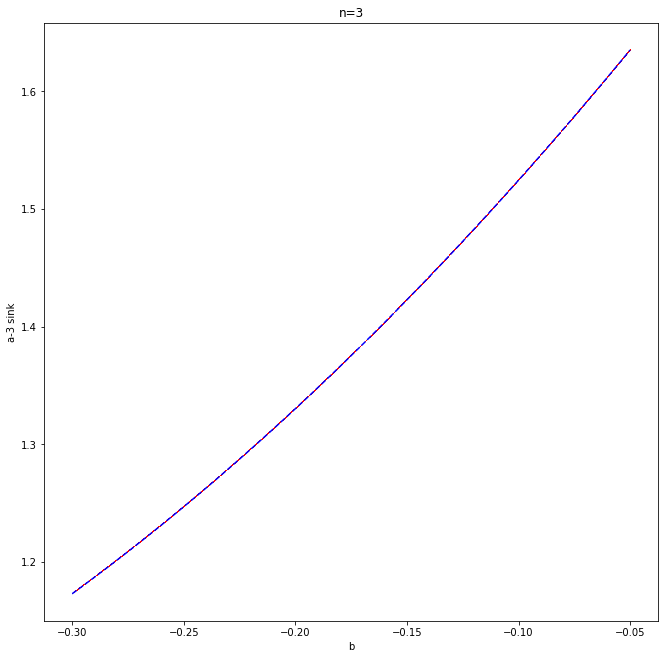

In [34]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('a-3 sink')
plt.title('n=3')
plt.plot(my_bS3, my_aS3, ',',color='red')
plt.plot(my_bS3, my_aS3, '--',color='blue')

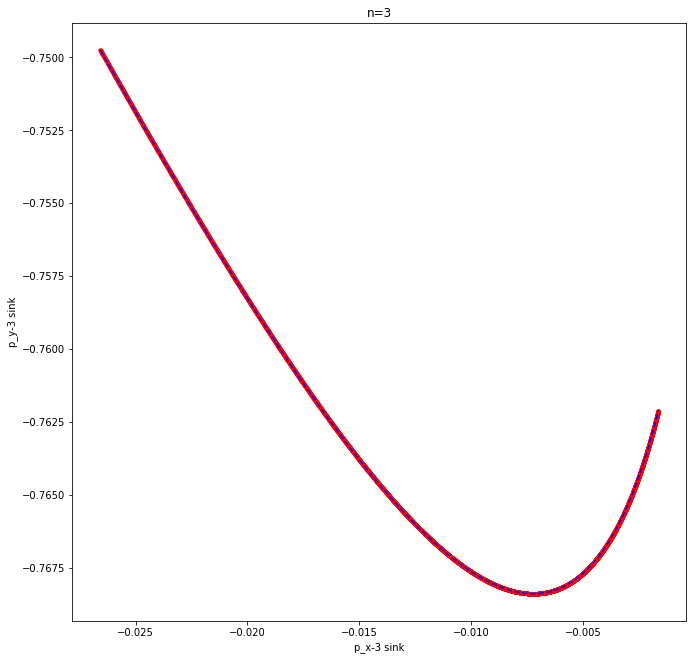

In [35]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('p_x-3 sink') 
plt.ylabel('p_y-3 sink')
plt.title('n=3')
plt.plot(my_px3, my_py3, '.',color='red')
plt.plot(my_px3, my_py3, '--',color='blue')

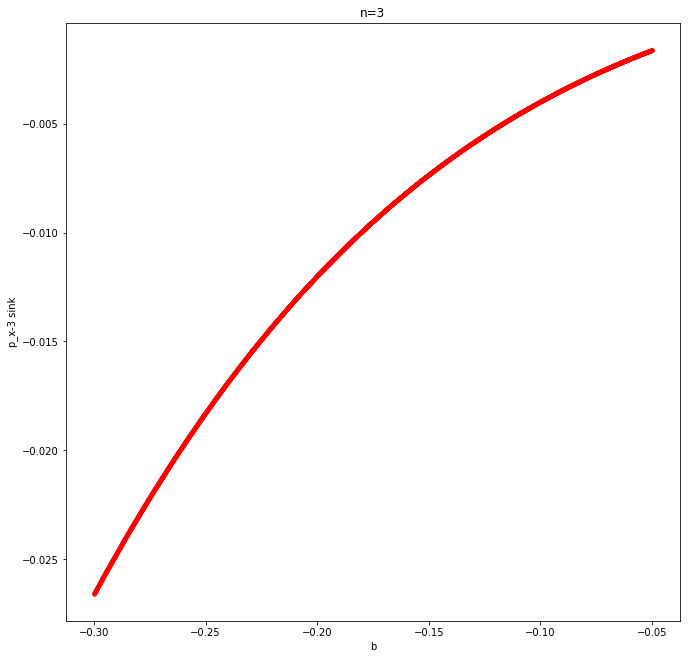

In [36]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('p_x-3 sink')
plt.title('n=3')
plt.plot(my_bS3, my_px3, '.',color='red')

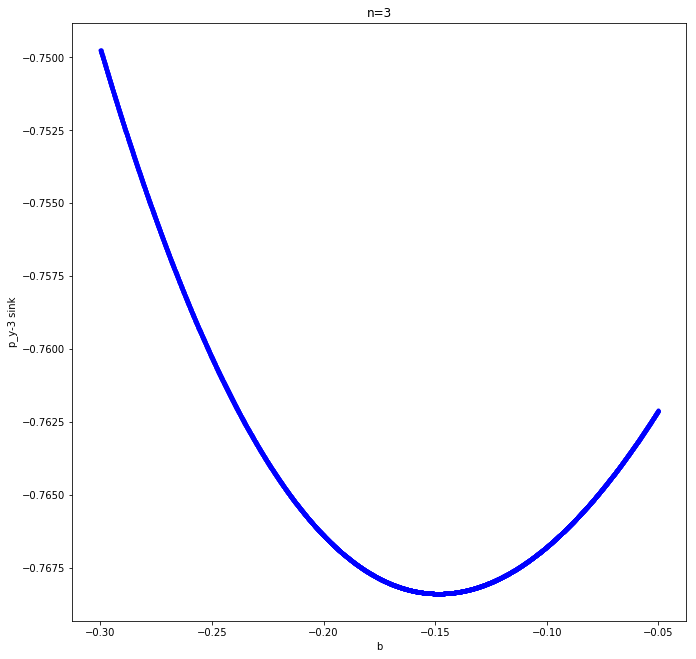

In [37]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('p_y-3 sink')
plt.title('n=3')
plt.plot(my_bS3, my_py3, '.',color='blue')

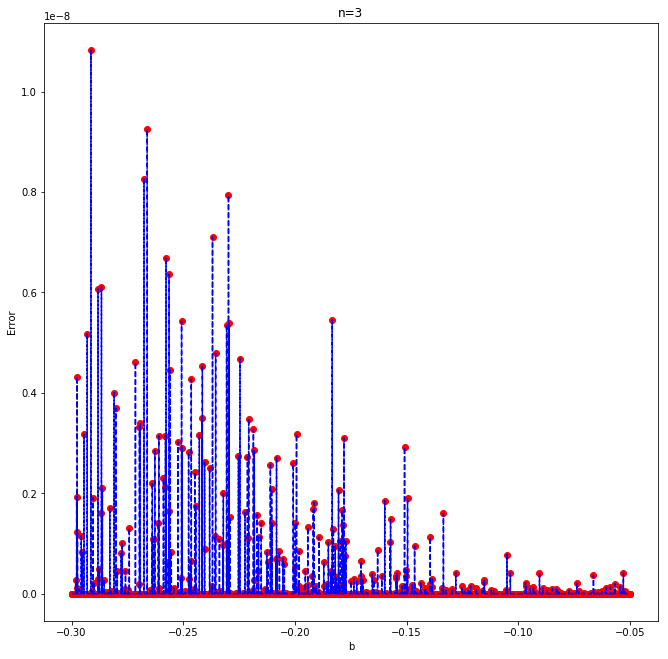

In [38]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('Error')
plt.title('n=3')
plt.plot(my_bS3[3:], my_err3[3:], 'o',color='red')
plt.plot(my_bS3[3:], my_err3[3:], '--',color='blue')

In [39]:
#save b,a files
new_sink_ba = open("new_3sink_ba_for.txt", "w")
r = len(my_bS3)
for i in range(r):
    np.savetxt(new_sink_ba, [my_bS3[i],my_aS3[i]])

new_sink_ba.close()

#save x,y
new_sink_xy = open("new_3sink_xy_for.txt", "w")
for i in range(r):
    np.savetxt(new_sink_xy, [my_px3[i],my_py3[i]])
new_sink_xy.close()

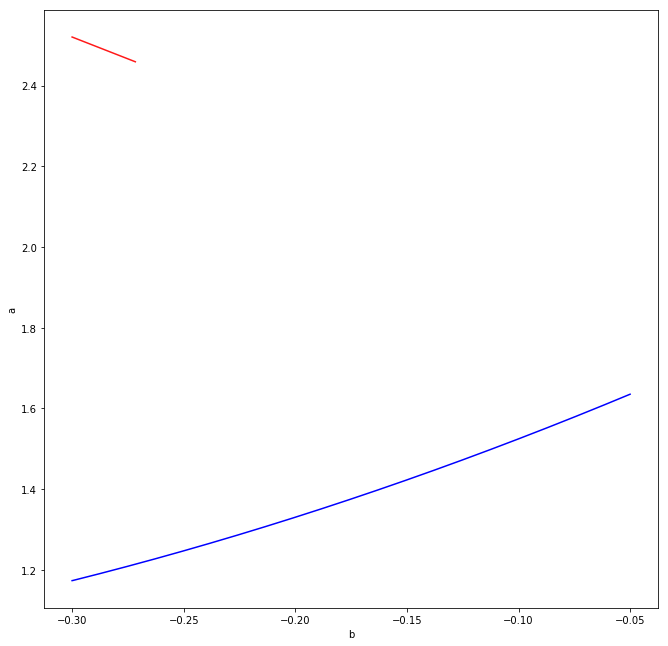

In [158]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('a')
plt.plot(my_b, a_tan, '-', color='red', alpha = 0.9, markersize=3,)
plt.plot(my_bS3, my_aS3, '-',color='blue')

In [159]:
b_forward, a_forward,x_forward,y_forward = my_bS3.copy(), my_aS3.copy(),my_px3.copy(),my_py3.copy()

In [160]:
#moving b_i, getting sink points      BACKWARDS

global b_val
global n

n=3
Total = 200000
b_i = np.zeros(Total)

p0 = 1
p1 = 0

b_i[p0] = -0.3
b_i[p1] = -0.2999

inc = 0.00005



a_nsink = np.zeros(len(b_i))
px_nsink = np.zeros(len(b_i)) 
py_nsink = np.zeros(len(b_i))
dx_nsink = np.zeros(len(b_i))
dy_nsink = np.zeros(len(b_i))
p_error = np.zeros(len(b_i))
px_IT,py_IT = np.zeros(len(b_i)),np.zeros(len(b_i))

a_nsink[p0]  = 1.1731985079533807
px_nsink[p0] = -0.026573532549541694
py_nsink[p0] = -0.7497528011518595
dx_nsink[p0] = 1986.4107295917045
dy_nsink[p0] =  -38178.3396768215
px_IT[p0] = px_nsink[p0]
py_IT[p0] = py_nsink[p0]


a_nsink[p1]  =  1.173198507953394 
px_nsink[p1] =  -0.02657353254957902 
py_nsink[p1] =  -0.7497528011518759
dx_nsink[p1] = 1986.4107295917045
dy_nsink[p1] = -38178.3396768215
px_IT[p1] = px_nsink[p1]
py_IT[p1] = py_nsink[p1]


b_end = -0.9
direction = -1
for i in range(2,Total):
    global b_val
    
    
    print('i: ',i)
    b_i[i] = b_i[i-1] + direction*inc
    b_val = b_i[i]
    
    slope_a = np.double((a_nsink[i-1] - a_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))
    slope_px = np.double((px_nsink[i-1] - px_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))
    slope_py = np.double((py_nsink[i-1] - py_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))

            
            
    a_guess = a_nsink[i-1] + slope_a*(b_i[i] - b_i[i-1])
    px_guess = px_nsink[i-1] + slope_px*(b_i[i] - b_i[i-1])
    py_guess = py_nsink[i-1] + slope_py*(b_i[i] - b_i[i-1])    
    
    
    sinkn_i = optimize.fsolve(F_sink,[a_guess,px_guess,py_guess,dx_nsink[i-1],dy_nsink[i-1]],xtol = 0,epsfcn = 10e-11)#epsfcn
    
    #pNew = NhMap_n(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n,1)
    
    #sinkn_i = optimize.fsolve(F_sink,[sinkn_i[0],pNew[0],pNew[1],sinkn_i[3],sinkn_i[4]],xtol = 0,epsfcn = 1)
    
#     my_a,my_x,my_y = sinkn_i[0],sinkn_i[1],sinkn_i[2]
#     xy = optimize.fsolve(F_R2,[my_x,my_y],xtol=0)

#     a_new = optimize.fsolve(get_tr,[my_a],xtol = 0)
#     my_a = a_new[0]

    #xy = optimize.fsolve(F_R2,[my_x,my_y],xtol=0)
# #    axy = optimize.fsolve(F_R3,[my_a,my_x,my_y])
    
    sinkn_i = optimize.fsolve(F_sink,[sinkn_i[0],sinkn_i[1],sinkn_i[2],dx_nsink[i-1],dy_nsink[i-1]],xtol = 0)#epsfcn
    xy50 = NhMap_n(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n,50)
    if R_getTraceDFn(sinkn_i[0],b_val,xy50[0],xy50[1],n) < R_getTraceDFn(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n):
        sinkn_i[1] = xy50[0]
        sinkn_i[2] = xy50[1]

    a_nsink[i]  = sinkn_i[0]
    px_nsink[i] = sinkn_i[1]
    py_nsink[i] = sinkn_i[2]
    dx_nsink[i] = sinkn_i[3]
    dy_nsink[i] = sinkn_i[4]
    
    #calculate relative error
#     print(np.abs((a_guess - a_nsink[i])) / a_nsink[i])
#     print(np.abs((px_guess - px_nsink[i]) / px_nsink[i]))
#     print(np.abs((py_guess - py_nsink[i])) / py_nsink[i])
    
    print('...')
    p_i = sinkn_i[1],sinkn_i[2]
    p_Fin = NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100)

    p_error[i] = np.sqrt((p_i[0] - p_Fin[0])**2 + (p_i[1]-p_Fin[1])**2)

    
    print('b: ',b_val)
    print('a: ',a_nsink[i])
    print('dx: ',dx_nsink[i])
    print('dy: ',dy_nsink[i])

    print('p: ',px_nsink[i],', ',py_nsink[i])
    print('Trace DFn: ',R_getTraceDFn(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n))
    print('n*p: ',hMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n))
    print('n*100p: ',NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100))
    true_p = NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100)

    print('^Trace 100*DFn: ',R_getTraceDFn(a_nsink[i],b_val,true_p[0],true_p[1],n))
    print('p-F Error: ',F_sink(sinkn_i))
    print('100 np-Error: ',F_sink([sinkn_i[0], true_p[0],true_p[1],sinkn_i[3],sinkn_i[4]]))
    print('p sink diff error: ',p_error[i])
    print('--------------------------------------------')
    px_IT[i] = px_nsink[i]
    py_IT[i] = py_nsink[i]
    if b_val < b_end:
        print("Finished Loading")
        l = i-1
        break




i:  2
...
b:  -0.30005
a:  1.172990830148321
dx:  941269580.7655629
dy:  -17992660423.510437
p:  -0.026601966466528636 ,  -0.7497140505640032
Trace DFn:  1.7451897704745534e-09
n*p:  [-0.026601964398040856, -0.7497140275471862]
n*100p:  [-0.02660193020517848, -0.7497140098065636]
^Trace 100*DFn:  4.7244072687302463e-07
p-F Error:  [array([-1.68951557e-09]), array([2.09186568e-08]), -2.068487780365613e-09, -2.3016817007892598e-08, 1.7451897704745534e-09]
100 np-Error:  [array([-5.0208636e-06]), array([-2.8032375e-06]), -2.220446049250313e-16, -1.1102230246251565e-16, 4.7244072687302463e-07]
p sink diff error:  5.455322539990781e-08
--------------------------------------------
i:  3
...
b:  -0.3001
a:  1.1729216418838975
dx:  2685211712.5789533
dy:  -45770797662.38096
p:  -0.026611452675849412 ,  -0.7497010926507511
Trace DFn:  5.32640188621869e-08
n*p:  [-0.026611452675849412, -0.7497010926507511]
n*100p:  [-0.026611452675849412, -0.7497010926507511]
^Trace 100*DFn:  5.32640188621869e-0

...
b:  -0.3006999999999999
a:  1.1720919499318798
dx:  2700007783.7906775
dy:  -7.77429352943835e+21
p:  -0.026725431171810046 ,  -0.7495455027422704
Trace DFn:  4.218847493575595e-15
n*p:  [-0.026725431171813974, -0.7495455027422725]
n*100p:  [-0.026725431171813863, -0.7495455027422724]
^Trace 100*DFn:  5.1736392947532295e-14
p-F Error:  [array([-7.42461648e-15]), array([-4.21884749e-15]), 3.927413949611491e-15, 2.1094237467877974e-15, 4.218847493575595e-15]
100 np-Error:  [array([-2.49800181e-15]), array([-1.55431223e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 5.1736392947532295e-14]
p sink diff error:  4.307952360125381e-15
--------------------------------------------
i:  16
...
b:  -0.3007499999999999
a:  1.1720228708179727
dx:  2700007591.510199
dy:  -7.77429352943835e+21
p:  -0.026734945590227006 ,  -0.7495325060970336
Trace DFn:  6.661338147750939e-16
n*p:  [-0.026734945590252135, -0.7495325060970487]
n*100p:  [-0.0267349455902538, -0.7495325060970491]
^Trace 100*DFn:

100 np-Error:  [array([-4.6629367e-15]), array([-2.44249065e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 6.277200981230635e-13]
p sink diff error:  5.753000247183898e-14
--------------------------------------------
i:  28
...
b:  -0.30134999999999984
a:  1.1711946626748464
dx:  2700009642.0472775
dy:  -7.77429352943835e+21
p:  -0.02684930935308859 ,  -0.7493761746427533
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.026849309353055573, -0.7493761746427351]
n*100p:  [-0.02684930935305585, -0.7493761746427359]
^Trace 100*DFn:  4.0945025148175773e-13
p-F Error:  [array([3.32962824e-14]), array([1.92068583e-14]), -3.3018726641742546e-14, -1.8207657603852567e-14, 2.3314683517128287e-15]
100 np-Error:  [array([-2.67563749e-14]), array([-1.39888101e-14]), 0.0, 0.0, 4.0945025148175773e-13]
p sink diff error:  3.7091867747985504e-14
--------------------------------------------
i:  29
...
b:  -0.30139999999999983
a:  1.1711257071026715
dx:  2700009688.88146
dy:  -7.77429352943835e+21
p:  

...
b:  -0.3019499999999998
a:  1.1703678231198347
dx:  2700008725.755591
dy:  -7.77429352943835e+21
p:  -0.026964025713214986 ,  -0.7492191567736334
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.026964025713237527, -0.7492191567736466]
n*100p:  [-0.02696402571323825, -0.7492191567736466]
^Trace 100*DFn:  2.881028748902281e-13
p-F Error:  [array([-7.66400832e-15]), array([-5.88418203e-15]), 2.254099684684263e-14, 1.3211653993039363e-14, 1.1102230246251565e-15]
100 np-Error:  [array([2.29261055e-14]), array([1.17683641e-14]), 0.0, 0.0, 2.881028748902281e-13]
p sink diff error:  2.6752538297228972e-14
--------------------------------------------
i:  41
...
b:  -0.30199999999999977
a:  1.1702989816079912
dx:  2700009022.1622663
dy:  -7.77429352943835e+21
p:  -0.026973601346420937 ,  -0.7492060409592476
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.026973601346370057, -0.7492060409592193]
n*100p:  [-0.026973601346370335, -0.7492060409592203]
^Trace 100*DFn:  6.308287225920139e-13
p-F Error: 

...
b:  -0.3025999999999997
a:  1.1694736249740971
dx:  2700008984.672787
dy:  -7.77429352943835e+21
p:  -0.027088700430887087 ,  -0.7490482791885871
Trace DFn:  4.440892098500626e-15
n*p:  [-0.027088700430942025, -0.7490482791886179]
n*100p:  [-0.027088700430942136, -0.749048279188617]
^Trace 100*DFn:  6.865619184281968e-13
p-F Error:  [array([-7.73651976e-14]), array([-4.26325641e-14]), 5.493869248418548e-14, 3.086420008457935e-14, 4.440892098500626e-15]
100 np-Error:  [array([-3.89688282e-14]), array([-2.10942375e-14]), 0.0, 0.0, 6.865619184281968e-13]
p sink diff error:  6.268199879506555e-14
--------------------------------------------
i:  54
...
b:  -0.3026499999999997
a:  1.1694049070513266
dx:  2700008996.5380454
dy:  -7.77429352943835e+21
p:  -0.027098307989983417 ,  -0.7490351013701919
Trace DFn:  3.885780586188048e-15
n*p:  [-0.02709830798998486, -0.749035101370193]
n*100p:  [-0.027098307989985027, -0.7490351013701931]
^Trace 100*DFn:  2.398081733190338e-14
p-F Error:  [arra

...
b:  -0.30324999999999963
a:  1.1685810336338898
dx:  2700009383.4170218
dy:  -7.77429352943835e+21
p:  -0.027213790571000707 ,  -0.7488765954068007
Trace DFn:  4.440892098500626e-16
n*p:  [-0.02721379057103135, -0.7488765954068181]
n*100p:  [-0.027213790571031515, -0.7488765954068176]
^Trace 100*DFn:  3.815836535636663e-13
p-F Error:  [array([-1.28785871e-14]), array([-6.99440506e-15]), 3.064215547965432e-14, 1.7319479184152442e-14, 4.440892098500626e-16]
100 np-Error:  [array([-5.38458167e-15]), array([-3.21964677e-15]), 0.0, 0.0, 3.815836535636663e-13]
p sink diff error:  3.512768282390102e-14
--------------------------------------------
i:  67
...
b:  -0.3032999999999996
a:  1.168512439324799
dx:  2700009623.2548623
dy:  -7.77429352943835e+21
p:  -0.027223430120274048 ,  -0.7488633555603771
Trace DFn:  7.105427357601002e-15
n*p:  [-0.02722343012024664, -0.748863355560362]
n*100p:  [-0.027223430120246805, -0.7488633555603625]
^Trace 100*DFn:  3.29625216011209e-13
p-F Error:  [arr

...
b:  -0.30389999999999956
a:  1.1676900494192357
dx:  2700009904.484677
dy:  -7.77429352943835e+21
p:  -0.02733929696845856 ,  -0.748704105118894
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.0273392969684903, -0.7487041051189125]
n*100p:  [-0.027339296968491356, -0.7487041051189125]
^Trace 100*DFn:  4.0401015866109447e-13
p-F Error:  [array([-4.42319792e-14]), array([-2.43138842e-14]), 3.1741970163423616e-14, 1.8540724511240114e-14, 1.4432899320127035e-15]
100 np-Error:  [array([-3.54161145e-14]), array([-1.86517468e-14]), 0.0, 0.0, 4.0401015866109447e-13]
p sink diff error:  3.767467077528095e-14
--------------------------------------------
i:  80
...
b:  -0.30394999999999955
a:  1.1676215787484514
dx:  2700009835.0167937
dy:  -7.77429352943835e+21
p:  -0.027348968572057424 ,  -0.7486908032209044
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.027348968572065924, -0.7486908032209078]
n*100p:  [-0.02734896857206348, -0.7486908032209063]
^Trace 100*DFn:  7.183142969324763e-14
p-F Error:

...
b:  -0.3045499999999995
a:  1.1668006726501003
dx:  2700009905.3761816
dy:  -7.77429352943835e+21
p:  -0.02746522045642724 ,  -0.7485308080218691
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.027465220456432682, -0.7485308080218728]
n*100p:  [-0.02746522045643407, -0.7485308080218734]
^Trace 100*DFn:  8.781864124784988e-14
p-F Error:  [array([-1.36037015e-14]), array([-8.65973959e-15]), 5.443562267615221e-15, 3.6637359812630166e-15, 2.9976021664879227e-15]
100 np-Error:  [array([1.17683641e-14]), array([6.77236045e-15]), 0.0, 0.0, 8.781864124784988e-14]
p sink diff error:  8.087953571216415e-15
--------------------------------------------
i:  93
...
b:  -0.3045999999999995
a:  1.1667323256422182
dx:  2700010200.6454434
dy:  -7.77429352943835e+21
p:  -0.02747492417837176 ,  -0.7485174440492733
Trace DFn:  2.55351295663786e-15
n*p:  [-0.02747492417833125, -0.7485174440492502]
n*100p:  [-0.027474924178330806, -0.7485174440492508]
^Trace 100*DFn:  5.019318294330333e-13
p-F Error:  [arra

100 np-Error:  [array([-4.05231404e-15]), array([-9.99200722e-16]), -3.3306690738754696e-16, -1.1102230246251565e-16, 6.761258219967203e-13]
p sink diff error:  6.295426370302781e-14
--------------------------------------------
i:  105
...
b:  -0.3051999999999994
a:  1.1659129036464662
dx:  2700008509.3151965
dy:  -7.77429352943835e+21
p:  -0.027591561866294544 ,  -0.7483567038190979
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.027591561866299685, -0.7483567038191019]
n*100p:  [-0.027591561866300962, -0.7483567038191025]
^Trace 100*DFn:  8.348877145181177e-14
p-F Error:  [array([-3.02882719e-14]), array([-1.70974346e-14]), 5.141720382795256e-15, 3.9968028886505635e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-5.55111512e-15]), array([-2.10942375e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 8.348877145181177e-14]
p sink diff error:  7.868720984401077e-15
--------------------------------------------
i:  106
...
b:  -0.3052499999999994
a:  1.1658446803261393
dx:  270000809

...
b:  -0.30579999999999935
a:  1.1650948518536408
dx:  2700008751.9135003
dy:  -7.77429352943835e+21
p:  -0.02770855636024821 ,  -0.7481952756301882
Trace DFn:  2.886579864025407e-15
n*p:  [-0.02770855636017433, -0.7481952756301463]
n*100p:  [-0.02770855636017433, -0.7481952756301476]
^Trace 100*DFn:  9.038325643473399e-13
p-F Error:  [array([7.44335149e-14]), array([4.17443857e-14]), -7.387840339490026e-14, -4.18554080283684e-14, 2.886579864025407e-15]
100 np-Error:  [array([-7.21644966e-15]), array([-4.10782519e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 9.038325643473399e-13]
p sink diff error:  8.426234862595477e-14
--------------------------------------------
i:  118
...
b:  -0.30584999999999934
a:  1.1650267427282524
dx:  2700008957.096852
dy:  -7.77429352943835e+21
p:  -0.027718322027655187 ,  -0.7481817922203744
Trace DFn:  5.995204332975845e-15
n*p:  [-0.027718322027631803, -0.7481817922203615]
n*100p:  [-0.027718322027632136, -0.7481817922203621]
^Trace 100*DFn:

...
b:  -0.3064499999999993
a:  1.1642101756059515
dx:  2700007997.033998
dy:  -7.77429352943835e+21
p:  -0.02783570379618361 ,  -0.748019618490844
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.02783570379618361, -0.748019618490844]
n*100p:  [-0.02783570379618361, -0.748019618490844]
^Trace 100*DFn:  2.4424906541753444e-15
p-F Error:  [array([-2.66453526e-15]), array([-1.88737914e-15]), 0.0, 0.0, 2.4424906541753444e-15]
100 np-Error:  [array([-2.66453526e-15]), array([-1.88737914e-15]), 0.0, 0.0, 2.4424906541753444e-15]
p sink diff error:  0.0
--------------------------------------------
i:  131
...
b:  -0.3064999999999993
a:  1.1641421902153868
dx:  2700008119.61941
dy:  -7.77429352943835e+21
p:  -0.027845501768267337 ,  -0.7480060729418981
Trace DFn:  9.658940314238862e-15
n*p:  [-0.027845501768260228, -0.7480060729418941]
n*100p:  [-0.027845501768260172, -0.7480060729418943]
^Trace 100*DFn:  7.838174553853605e-14
p-F Error:  [array([-2.49453236e-15]), array([-5.55111512e-16]), -7.108

...
b:  -0.3070999999999992
a:  1.16332710805881
dx:  2700007752.1841736
dy:  -7.77429352943835e+21
p:  -0.027963271573819868 ,  -0.74784315341553
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.027963271573770987, -0.7478431534155023]
n*100p:  [-0.027963271573770543, -0.747843153415503]
^Trace 100*DFn:  6.02629057766535e-13
p-F Error:  [array([4.22197e-14]), array([2.36477504e-14]), -4.888103810607447e-14, -2.7644553313166398e-14, 3.3306690738754696e-16]
100 np-Error:  [array([-6.43929354e-15]), array([-3.55271368e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 6.02629057766535e-13]
p sink diff error:  5.622102189896004e-14
--------------------------------------------
i:  144
...
b:  -0.3071499999999992
a:  1.1632592464277098
dx:  2700007775.7659616
dy:  -7.77429352943835e+21
p:  -0.027973101914037582 ,  -0.747829545706332
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.027973101914034848, -0.7478295457063305]
n*100p:  [-0.027973101914035736, -0.7478295457063311]
^Trace 100*DFn:  2.2

...
b:  -0.30774999999999914
a:  1.162445649532104
dx:  2700006983.1575303
dy:  -7.77429352943835e+21
p:  -0.028091260517308567 ,  -0.7476658801328407
Trace DFn:  9.992007221626409e-16
n*p:  [-0.028091260517306205, -0.7476658801328397]
n*100p:  [-0.028091260517307204, -0.7476658801328403]
^Trace 100*DFn:  1.7208456881689926e-14
p-F Error:  [array([1.68511038e-14]), array([8.32667268e-15]), -2.3626933742804113e-15, -9.992007221626409e-16, 9.992007221626409e-16]
100 np-Error:  [array([1.47104551e-14]), array([7.43849426e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.7208456881689926e-14]
p sink diff error:  1.433990041347709e-15
--------------------------------------------
i:  157
...
b:  -0.30779999999999913
a:  1.1623779116850552
dx:  2700006609.6784663
dy:  -7.77429352943835e+21
p:  -0.02810112328898147 ,  -0.7476522102427895
Trace DFn:  1.887379141862766e-15
n*p:  [-0.02810112328904346, -0.7476522102428244]
n*100p:  [-0.02810112328904324, -0.7476522102428231]
^Trace 100*DF

...
b:  -0.30839999999999906
a:  1.1615658003455507
dx:  2700007350.636004
dy:  -7.77429352943835e+21
p:  -0.028219671448906598 ,  -0.7474877983778976
Trace DFn:  8.881784197001252e-16
n*p:  [-0.02821967144893789, -0.7474877983779153]
n*100p:  [-0.02821967144893822, -0.747487798377915]
^Trace 100*DFn:  3.8602454566216693e-13
p-F Error:  [array([-1.97446226e-14]), array([-1.11022302e-14]), 3.1290942059669646e-14, 1.7763568394002505e-14, 8.881784197001252e-16]
100 np-Error:  [array([-1.02140518e-14]), array([-6.10622664e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 3.8602454566216693e-13]
p sink diff error:  3.610956002533678e-14
--------------------------------------------
i:  170
...
b:  -0.30844999999999906
a:  1.1614981863071099
dx:  2700007327.563169
dy:  -7.77429352943835e+21
p:  -0.02822956671521054 ,  -0.7474740662868978
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.028229566715213983, -0.7474740662869002]
n*100p:  [-0.028229566715215038, -0.7474740662869007]
^Trace 100*D

...
b:  -0.309049999999999
a:  1.1606875608188223
dx:  2700007218.8393264
dy:  -7.77429352943835e+21
p:  -0.028348505188924195 ,  -0.7473089078923139
Trace DFn:  3.219646771412954e-15
n*p:  [-0.02834850518893034, -0.7473089078923176]
n*100p:  [-0.028348505188931394, -0.7473089078923181]
^Trace 100*DFn:  9.126033262418787e-14
p-F Error:  [array([5.72458747e-16]), array([-4.4408921e-16]), 6.144390551909851e-15, 3.774758283725532e-15, 3.219646771412954e-15]
100 np-Error:  [array([9.43689571e-15]), array([4.6629367e-15]), 0.0, 0.0, 9.126033262418787e-14]
p sink diff error:  8.344204569883423e-15
--------------------------------------------
i:  183
...
b:  -0.309099999999999
a:  1.1606200706136112
dx:  2700007313.210641
dy:  -7.77429352943835e+21
p:  -0.028358433012872757 ,  -0.7472951135807487
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.028358433012859008, -0.7472951135807405]
n*100p:  [-0.028358433012858508, -0.7472951135807405]
^Trace 100*DFn:  1.7152945730458669e-13
p-F Error:  [array(

...
b:  -0.3096999999999989
a:  1.1598109312715608
dx:  2700005970.459305
dy:  -7.77429352943835e+21
p:  -0.02847776255569178 ,  -0.7471292084242103
Trace DFn:  4.440892098500626e-16
n*p:  [-0.028477762555698782, -0.7471292084242145]
n*100p:  [-0.02847776255569967, -0.7471292084242148]
^Trace 100*DFn:  9.581224702515101e-14
p-F Error:  [array([-1.56610835e-14]), array([-9.32587341e-15]), 7.0013439490423934e-15, 4.218847493575595e-15, 4.440892098500626e-16]
100 np-Error:  [array([-5.32907052e-15]), array([-3.44169138e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 9.581224702515101e-14]
p sink diff error:  9.108484392070077e-15
--------------------------------------------
i:  196
...
b:  -0.3097499999999989
a:  1.1597435649241592
dx:  2700006089.7642946
dy:  -7.77429352943835e+21
p:  -0.028487723000152353 ,  -0.7471153518729754
Trace DFn:  2.220446049250313e-15
n*p:  [-0.02848772300013741, -0.7471153518729672]
n*100p:  [-0.028487723000137966, -0.7471153518729677]
^Trace 100*DFn:

...
b:  -0.31034999999999885
a:  1.1589359120232794
dx:  2700005373.3854785
dy:  -7.77429352943835e+21
p:  -0.02860744436554737 ,  -0.7469486997282656
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.02860744436553514, -0.7469486997282584]
n*100p:  [-0.02860744436553425, -0.7469486997282582]
^Trace 100*DFn:  1.6009416015094757e-13
p-F Error:  [array([-2.81372148e-15]), array([-1.44328993e-15]), -1.222980050563649e-14, -7.216449660063518e-15, 1.1102230246251565e-15]
100 np-Error:  [array([1.1379786e-14]), array([7.10542736e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.6009416015094757e-13]
p sink diff error:  1.5080204508422395e-14
--------------------------------------------
i:  209
...
b:  -0.31039999999999884
a:  1.1588686695582882
dx:  2700005189.099829
dy:  -7.77429352943835e+21
p:  -0.028617437493226854 ,  -0.7469347809187529
Trace DFn:  6.5503158452884236e-15
n*p:  [-0.028617437493266284, -0.7469347809187744]
n*100p:  [-0.02861743749326473, -0.7469347809187729]
^Trace 100*

...
b:  -0.3109999999999988
a:  1.1580625033934286
dx:  2700004778.4608665
dy:  -7.77429352943835e+21
p:  -0.02873755143279289 ,  -0.7467673815657072
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.02873755143277479, -0.7467673815656964]
n*100p:  [-0.028737551432772512, -0.7467673815656956]
^Trace 100*DFn:  2.454703107446221e-13
p-F Error:  [array([3.71959408e-14]), array([2.22044605e-14]), -1.8100104748342005e-14, -1.0769163338864018e-14, 1.4432899320127035e-15]
100 np-Error:  [array([-6.38378239e-15]), array([-3.21964677e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 2.454703107446221e-13]
p sink diff error:  2.3475040307063572e-14
--------------------------------------------
i:  222
...
b:  -0.31104999999999877
a:  1.1579953848353726
dx:  2700004877.005924
dy:  -7.77429352943835e+21
p:  -0.028747577306251274 ,  -0.7467534004798372
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.028747577306232674, -0.7467534004798255]
n*100p:  [-0.028747577306230288, -0.7467534004798246]
^Trace 100

...
b:  -0.3115999999999987
a:  1.1572577098619645
dx:  2700004926.755479
dy:  -7.77429352943835e+21
p:  -0.028858028413957248 ,  -0.7465992922917091
Trace DFn:  6.661338147750939e-16
n*p:  [-0.02885802841397589, -0.7465992922917201]
n*100p:  [-0.028858028413977665, -0.7465992922917206]
^Trace 100*DFn:  2.4780177909633494e-13
p-F Error:  [array([-2.60798327e-14]), array([-1.66533454e-14]), 1.864133847284677e-14, 1.099120794378905e-14, 6.661338147750939e-16]
100 np-Error:  [array([1.87627691e-14]), array([9.32587341e-15]), 0.0, 0.0, 2.4780177909633494e-13]
p sink diff error:  2.3456337626451937e-14
--------------------------------------------
i:  234
...
b:  -0.3116499999999987
a:  1.1571907057013542
dx:  2700004867.802821
dy:  -7.77429352943835e+21
p:  -0.028868084569670303 ,  -0.746585253704343
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.028868084569678598, -0.7465852537043488]
n*100p:  [-0.028868084569680763, -0.7465852537043498]
^Trace 100*DFn:  1.290079154614432e-13
p-F Error:  [a

...
b:  -0.31219999999999865
a:  1.1564542892149359
dx:  2700005384.8460197
dy:  -7.77429352943835e+21
p:  -0.02897886907399906 ,  -0.7464305129191444
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.02897886907402092, -0.7464305129191569]
n*100p:  [-0.02897886907402064, -0.7464305129191563]
^Trace 100*DFn:  2.5834889783027393e-13
p-F Error:  [array([-6.02712324e-14]), array([-3.33066907e-14]), 2.185751579730777e-14, 1.2434497875801753e-14, 1.1102230246251565e-15]
100 np-Error:  [array([-1.3933299e-14]), array([-6.77236045e-15]), 0.0, 0.0, 2.5834889783027393e-13]
p sink diff error:  2.4633605009229713e-14
--------------------------------------------
i:  246
...
b:  -0.31224999999999864
a:  1.1563873994726692
dx:  2700005743.7247815
dy:  -7.77429352943835e+21
p:  -0.028988955565006656 ,  -0.7464164168157068
Trace DFn:  4.107825191113079e-15
n*p:  [-0.02898895556494857, -0.7464164168156731]
n*100p:  [-0.028988955564947017, -0.7464164168156734]
^Trace 100*DFn:  7.224221221235894e-13
p-F Error

...
b:  -0.3128499999999986
a:  1.1555854664004113
dx:  2700005415.868633
dy:  -7.77429352943835e+21
p:  -0.02911019092785125 ,  -0.7462468896414579
Trace DFn:  4.107825191113079e-15
n*p:  [-0.029110190927904456, -0.7462468896414888]
n*100p:  [-0.029110190927906232, -0.7462468896414887]
^Trace 100*DFn:  6.650235917504688e-13
p-F Error:  [array([-4.99877917e-14]), array([-2.91988655e-14]), 5.320743845516063e-14, 3.086420008457935e-14, 4.107825191113079e-15]
100 np-Error:  [array([5.77315973e-15]), array([3.10862447e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 6.650235917504688e-13]
p sink diff error:  6.299980705282088e-14
--------------------------------------------
i:  259
...
b:  -0.31289999999999857
a:  1.1555187006349998
dx:  2700005193.080692
dy:  -7.77429352943835e+21
p:  -0.02912031034178755 ,  -0.7462327312129273
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.029120310341827216, -0.7462327312129502]
n*100p:  [-0.02912031034182838, -0.7462327312129501]
^Trace 100*DFn:  

...
b:  -0.3134499999999985
a:  1.1547849067353497
dx:  2700006124.778457
dy:  -7.77429352943835e+21
p:  -0.029231791292271138 ,  -0.7460766720140386
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.02923179129223602, -0.7460766720140178]
n*100p:  [-0.029231791292234688, -0.7460766720140177]
^Trace 100*DFn:  4.4064751847372463e-13
p-F Error:  [array([2.55143129e-14]), array([1.55431223e-14]), -3.511774204767448e-14, -2.0761170560490427e-14, 2.9976021664879227e-15]
100 np-Error:  [array([1.11577414e-14]), array([6.21724894e-15]), 0.0, 0.0, 4.4064751847372463e-13]
p sink diff error:  4.200299561195696e-14
--------------------------------------------
i:  271
...
b:  -0.3134999999999985
a:  1.1547182554318938
dx:  2700005888.4925103
dy:  -7.77429352943835e+21
p:  -0.0292419411515707 ,  -0.7460624560403148
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.02924194115159745, -0.7460624560403312]
n*100p:  [-0.029241941151600337, -0.7460624560403322]
^Trace 100*DFn:  3.5371705564557487e-13
p-F Error:  

...
b:  -0.31409999999999844
a:  1.1539191839077694
dx:  2700005598.9424415
dy:  -7.77429352943835e+21
p:  -0.029363937648018222 ,  -0.7458914902383712
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.029363937648064553, -0.7458914902383991]
n*100p:  [-0.02936393764806794, -0.7458914902384]
^Trace 100*DFn:  5.967448757360216e-13
p-F Error:  [array([-4.71081507e-14]), array([-2.80886425e-14]), 4.6330994596388564e-14, 2.786659791809143e-14, 3.3306690738754696e-16]
100 np-Error:  [array([2.49800181e-15]), array([1.77635684e-15]), 0.0, 0.0, 5.967448757360216e-13]
p sink diff error:  5.743374125431446e-14
--------------------------------------------
i:  284
...
b:  -0.31414999999999843
a:  1.1538526566282687
dx:  2700005749.5675616
dy:  -7.77429352943835e+21
p:  -0.029374120549199037 ,  -0.7458772119090068
Trace DFn:  4.440892098500626e-16
n*p:  [-0.029374120549177263, -0.7458772119089939]
n*100p:  [-0.029374120549176597, -0.745877211908994]
^Trace 100*DFn:  2.6900703886667543e-13
p-F Error:  [

...
b:  -0.31469999999999837
a:  1.1531214863132966
dx:  2700005330.9658713
dy:  -7.77429352943835e+21
p:  -0.029486300461867853 ,  -0.7457198336495703
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.029486300461890602, -0.7457198336495827]
n*100p:  [-0.029486300461890325, -0.7457198336495822]
^Trace 100*DFn:  2.7000623958883807e-13
p-F Error:  [array([-4.01796652e-14]), array([-2.17603713e-14]), 2.2749163663959848e-14, 1.2434497875801753e-14, 1.6653345369377348e-15]
100 np-Error:  [array([5.60662627e-15]), array([4.5519144e-15]), 0.0, 0.0, 2.7000623958883807e-13]
p sink diff error:  2.5418359158984123e-14
--------------------------------------------
i:  296
...
b:  -0.31474999999999836
a:  1.1530550735392753
dx:  2700005099.569706
dy:  -7.77429352943835e+21
p:  -0.029496513917913747 ,  -0.745705497747661
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.029496513917943223, -0.745705497747679]
n*100p:  [-0.029496513917944667, -0.7457054977476792]
^Trace 100*DFn:  3.6859404417555197e-13
p-F Err

...
b:  -0.3153499999999983
a:  1.1522588646513983
dx:  2700005316.6634326
dy:  -7.77429352943835e+21
p:  -0.029619274285496006 ,  -0.7455330926342721
Trace DFn:  4.440892098500626e-16
n*p:  [-0.029619274285532682, -0.7455330926342932]
n*100p:  [-0.029619274285533126, -0.7455330926342928]
^Trace 100*DFn:  4.4209080840573733e-13
p-F Error:  [array([-6.12114526e-14]), array([-3.47499807e-14]), 3.6675523729101656e-14, 2.1094237467877974e-14, 4.440892098500626e-16]
100 np-Error:  [array([3.77475828e-15]), array([2.77555756e-15]), 0.0, 0.0, 4.4209080840573733e-13]
p sink diff error:  4.247698538992763e-14
--------------------------------------------
i:  309
...
b:  -0.3153999999999983
a:  1.1521925759484823
dx:  2700005520.4862576
dy:  -7.77429352943835e+21
p:  -0.029629520901729756 ,  -0.7455186943480359
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.029629520901699735, -0.745518694348018]
n*100p:  [-0.029629520901698292, -0.7455186943480178]
^Trace 100*DFn:  3.739231146937527e-13
p-F Error:

...
b:  -0.3159999999999982
a:  1.1513978560611446
dx:  2700005661.787754
dy:  -7.77429352943835e+21
p:  -0.029752679559290333 ,  -0.7453455405370581
Trace DFn:  3.219646771412954e-15
n*p:  [-0.029752679559287842, -0.7453455405370564]
n*100p:  [-0.029752679559286788, -0.7453455405370558]
^Trace 100*DFn:  4.529709940470639e-14
p-F Error:  [array([1.98105421e-14]), array([1.04360964e-14]), -2.491062911502695e-15, -1.7763568394002505e-15, 3.219646771412954e-15]
100 np-Error:  [array([-2.0539126e-15]), array([-2.55351296e-15]), 7.771561172376096e-16, 4.440892098500626e-16, 4.529709940470639e-14]
p sink diff error:  4.243614438217381e-15
--------------------------------------------
i:  322
...
b:  -0.3160499999999982
a:  1.151331691453873
dx:  2700005716.5725613
dy:  -7.77429352943835e+21
p:  -0.029762959396969078 ,  -0.7453310798523152
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.02976295939696666, -0.7453310798523124]
n*100p:  [-0.029762959396964384, -0.7453310798523113]
^Trace 100*DFn:  

...
b:  -0.31664999999999816
a:  1.1505384608608464
dx:  2700005973.9574347
dy:  -7.77429352943835e+21
p:  -0.029886517078641855 ,  -0.7451571771769613
Trace DFn:  8.881784197001252e-16
n*p:  [-0.029886517078628216, -0.7451571771769531]
n*100p:  [-0.029886517078627828, -0.7451571771769532]
^Trace 100*DFn:  1.659783421814609e-13
p-F Error:  [array([1.53037305e-14]), array([1.05471187e-14]), -1.3638395968129657e-14, -8.215650382226158e-15, 8.881784197001252e-16]
100 np-Error:  [array([-2.60902411e-15]), array([-2.22044605e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.659783421814609e-13]
p sink diff error:  1.6200030761031575e-14
--------------------------------------------
i:  335
...
b:  -0.31669999999999815
a:  1.1504724203736763
dx:  2700006051.7813807
dy:  -7.77429352943835e+21
p:  -0.029896830198857062 ,  -0.7451426540800772
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.029896830198855584, -0.7451426540800755]
n*100p:  [-0.029896830198852753, -0.7451426540800741]
^Trace

...
b:  -0.3172499999999981
a:  1.1497466052616758
dx:  2700006332.1405506
dy:  -7.77429352943835e+21
p:  -0.030010443740000812 ,  -0.744982583099512
Trace DFn:  4.218847493575595e-15
n*p:  [-0.030010443740006443, -0.7449825830995149]
n*100p:  [-0.030010443740005888, -0.7449825830995146]
^Trace 100*DFn:  6.428191312579656e-14
p-F Error:  [array([-1.60114977e-14]), array([-7.54951657e-15]), 5.630912403020716e-15, 2.886579864025407e-15, 4.218847493575595e-15]
100 np-Error:  [array([-9.82547377e-15]), array([-4.3298698e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 6.428191312579656e-14]
p sink diff error:  5.6819172030073574e-15
--------------------------------------------
i:  347
...
b:  -0.3172999999999981
a:  1.1496806793686147
dx:  2700006200.798061
dy:  -7.77429352943835e+21
p:  -0.030020787636622585 ,  -0.7449680023797628
Trace DFn:  3.6637359812630166e-15
n*p:  [-0.030020787636634627, -0.7449680023797707]
n*100p:  [-0.030020787636637236, -0.7449680023797719]
^Trace 100*DFn

...
b:  -0.317849999999998
a:  1.1489561249063938
dx:  2700007126.501912
dy:  -7.77429352943835e+21
p:  -0.030134740003045564 ,  -0.7448072974880605
Trace DFn:  4.884981308350689e-15
n*p:  [-0.03013474000301991, -0.7448072974880456]
n*100p:  [-0.030134740003019134, -0.7448072974880457]
^Trace 100*DFn:  3.176348073452573e-13
p-F Error:  [array([3.33691408e-14]), array([1.83186799e-14]), -2.5653090762745023e-14, -1.4876988529977098e-14, 4.884981308350689e-15]
100 np-Error:  [array([3.09197112e-14]), array([1.687539e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 3.176348073452573e-13]
p sink diff error:  3.027526562672792e-14
--------------------------------------------
i:  359
...
b:  -0.317899999999998
a:  1.1488903136282764
dx:  2700007118.9178085
dy:  -7.77429352943835e+21
p:  -0.030145114727829773 ,  -0.7447926591346777
Trace DFn:  7.327471962526033e-15
n*p:  [-0.030145114727819056, -0.7447926591346712]
n*100p:  [-0.03014511472781861, -0.7447926591346712]
^Trace 100*DFn:  1.39

...
b:  -0.31849999999999795
a:  1.1481013234026047
dx:  2700006180.9149446
dy:  -7.77429352943835e+21
p:  -0.030269812092596073 ,  -0.7446166242182166
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.030269812092612813, -0.7446166242182263]
n*100p:  [-0.030269812092614423, -0.7446166242182268]
^Trace 100*DFn:  2.149391775674303e-13
p-F Error:  [array([-3.08433834e-15]), array([-3.33066907e-15]), 1.674008154317619e-14, 9.658940314238862e-15, 2.6645352591003757e-15]
100 np-Error:  [array([3.81361609e-14]), array([2.06501483e-14]), 0.0, 0.0, 2.149391775674303e-13]
p sink diff error:  2.1001092010048218e-14
--------------------------------------------
i:  372
...
b:  -0.31854999999999795
a:  1.1480356363141668
dx:  2700006053.4783897
dy:  -7.77429352943835e+21
p:  -0.03028022027279362 ,  -0.7446019234167194
Trace DFn:  4.218847493575595e-15
n*p:  [-0.030280220272820124, -0.7446019234167337]
n*100p:  [-0.030280220272817737, -0.7446019234167319]
^Trace 100*DFn:  2.877698079828406e-13
p-F Error:

...
b:  -0.3191499999999979
a:  1.147248136511185
dx:  2700006655.600592
dy:  -7.77429352943835e+21
p:  -0.0304053194650158 ,  -0.7444251390524864
Trace DFn:  3.219646771412954e-15
n*p:  [-0.03040531946500552, -0.7444251390524794]
n*100p:  [-0.030405319465002967, -0.7444251390524783]
^Trace 100*DFn:  1.4954704141700859e-13
p-F Error:  [array([-6.87297441e-15]), array([-1.44328993e-15]), -1.0279971318638559e-14, -6.994405055138486e-15, 3.219646771412954e-15]
100 np-Error:  [array([-2.31481501e-14]), array([-1.19904087e-14]), 0.0, 0.0, 1.4954704141700859e-13]
p sink diff error:  1.5178383146931704e-14
--------------------------------------------
i:  385
...
b:  -0.3191999999999979
a:  1.1471825736368562
dx:  2700006584.093227
dy:  -7.77429352943835e+21
p:  -0.030415761161007904 ,  -0.7444103757912311
Trace DFn:  6.8833827526759706e-15
n*p:  [-0.030415761161026567, -0.7444103757912418]
n*100p:  [-0.030415761161026456, -0.7444103757912414]
^Trace 100*DFn:  2.2526425169644426e-13
p-F Error:

...
b:  -0.3197999999999978
a:  1.146396564549526
dx:  2700007211.7492113
dy:  -7.77429352943835e+21
p:  -0.030541262904155077 ,  -0.7442328418427181
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.03054126290416176, -0.7442328418427221]
n*100p:  [-0.03054126290416237, -0.7442328418427223]
^Trace 100*DFn:  8.43769498715119e-14
p-F Error:  [array([-1.95052308e-14]), array([-1.01030295e-14]), 6.682154829462661e-15, 3.9968028886505635e-15, 1.6653345369377348e-15]
100 np-Error:  [array([-9.65894031e-15]), array([-4.5519144e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 8.43769498715119e-14]
p sink diff error:  8.425157430965382e-15
--------------------------------------------
i:  398
...
b:  -0.3198499999999978
a:  1.1463311259136757
dx:  2700007477.3345103
dy:  -7.77429352943835e+21
p:  -0.030551738176142814 ,  -0.7442180161106094
Trace DFn:  6.439293542825908e-15
n*p:  [-0.03055173817611212, -0.7442180161105902]
n*100p:  [-0.0305517381761089, -0.7442180161105891]
^Trace 100*DFn:  3

...
b:  -0.32044999999999774
a:  1.1455466078347276
dx:  2700007507.786787
dy:  -7.77429352943835e+21
p:  -0.030677643191408803 ,  -0.7440397324476185
Trace DFn:  2.886579864025407e-15
n*p:  [-0.030677643191398374, -0.7440397324476129]
n*100p:  [-0.030677643191399206, -0.7440397324476136]
^Trace 100*DFn:  1.092459456231154e-13
p-F Error:  [array([-1.61676228e-15]), array([-1.11022302e-15]), -1.0429157537572564e-14, -5.551115123125783e-15, 2.886579864025407e-15]
100 np-Error:  [array([-3.30846461e-14]), array([-1.86517468e-14]), 0.0, 0.0, 1.092459456231154e-13]
p sink diff error:  1.0768271350032815e-14
--------------------------------------------
i:  411
...
b:  -0.32049999999999773
a:  1.1454812934617875
dx:  2700007436.4139075
dy:  -7.77429352943835e+21
p:  -0.030688152099386426 ,  -0.7440248442340475
Trace DFn:  5.551115123125783e-16
n*p:  [-0.030688152099397514, -0.7440248442340542]
n*100p:  [-0.030688152099399513, -0.7440248442340551]
^Trace 100*DFn:  1.5520917884259688e-13
p-F Er

...
b:  -0.32109999999999767
a:  1.1446982666837084
dx:  2700007106.095584
dy:  -7.77429352943835e+21
p:  -0.030814461105658865 ,  -0.7438458107327116
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.030814461105645785, -0.7438458107327051]
n*100p:  [-0.030814461105647395, -0.7438458107327062]
^Trace 100*DFn:  1.3589129821411916e-13
p-F Error:  [array([2.27387553e-14]), array([1.27675648e-14]), -1.3079815008865125e-14, -6.5503158452884236e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-1.03805853e-14]), array([-5.32907052e-15]), 0.0, 0.0, 1.3589129821411916e-13]
p sink diff error:  1.2694696441142718e-14
--------------------------------------------
i:  424
...
b:  -0.32114999999999766
a:  1.1446330765980042
dx:  2700007450.3360763
dy:  -7.77429352943835e+21
p:  -0.030825003709445194 ,  -0.7438308600276383
Trace DFn:  4.9960036108132044e-15
n*p:  [-0.030825003709399723, -0.7438308600276112]
n*100p:  [-0.030825003709396726, -0.7438308600276106]
^Trace 100*DFn:  5.635492072997295e-13
p-F

...
b:  -0.3217499999999976
a:  1.143851541413123
dx:  2700008104.821268
dy:  -7.77429352943835e+21
p:  -0.030951717423261756 ,  -0.7436510765703943
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.030951717423239378, -0.7436510765703803]
n*100p:  [-0.030951717423237712, -0.7436510765703799]
^Trace 100*DFn:  2.852162950262027e-13
p-F Error:  [array([3.69773656e-14]), array([2.17603713e-14]), -2.237793284010081e-14, -1.3988810110276972e-14, 3.3306690738754696e-15]
100 np-Error:  [array([5.71764858e-15]), array([2.22044605e-15]), 0.0, 0.0, 2.852162950262027e-13]
p sink diff error:  2.804259775678226e-14
--------------------------------------------
i:  437
...
b:  -0.3217999999999976
a:  1.1437864756390443
dx:  2700008131.5203104
dy:  -7.77429352943835e+21
p:  -0.03096229378246261 ,  -0.7436360633642674
Trace DFn:  5.773159728050814e-15
n*p:  [-0.0309622937824644, -0.7436360633642678]
n*100p:  [-0.030962293782463846, -0.7436360633642675]
^Trace 100*DFn:  1.965094753586527e-14
p-F Error:  [arr

...
b:  -0.3223999999999975
a:  1.1430064323393956
dx:  2700007715.611985
dy:  -7.77429352943835e+21
p:  -0.03108941291800622 ,  -0.7434555298399222
Trace DFn:  2.55351295663786e-15
n*p:  [-0.031089412917979953, -0.7434555298399077]
n*100p:  [-0.031089412917980674, -0.7434555298399086]
^Trace 100*DFn:  3.0031532816110484e-13
p-F Error:  [array([1.64972203e-14]), array([1.01030295e-14]), -2.6267182873240813e-14, -1.454392162258955e-14, 2.55351295663786e-15]
100 np-Error:  [array([1.37112544e-14]), array([9.54791801e-15]), 0.0, 0.0, 3.0031532816110484e-13]
p sink diff error:  2.896642589953434e-14
--------------------------------------------
i:  450
...
b:  -0.3224499999999975
a:  1.1429414909012583
dx:  2700007573.901012
dy:  -7.77429352943835e+21
p:  -0.031100023092038326 ,  -0.7434404541237476
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.0311000230920615, -0.7434404541237607]
n*100p:  [-0.03110002309206078, -0.7434404541237599]
^Trace 100*DFn:  2.617905892066119e-13
p-F Error:  [array

...
b:  -0.32304999999999745
a:  1.1421629397787005
dx:  2700007655.1838803
dy:  -7.77429352943835e+21
p:  -0.031227548361084347 ,  -0.7432591704274509
Trace DFn:  4.107825191113079e-15
n*p:  [-0.03122754836110858, -0.7432591704274653]
n*100p:  [-0.03122754836110997, -0.7432591704274655]
^Trace 100*DFn:  3.0320190802513025e-13
p-F Error:  [array([-4.02768097e-14]), array([-2.35367281e-14]), 2.4234086959395995e-14, 1.432187701766452e-14, 4.107825191113079e-15]
100 np-Error:  [array([1.16573418e-14]), array([6.77236045e-15]), 0.0, 0.0, 3.0320190802513025e-13]
p sink diff error:  2.946193578452893e-14
--------------------------------------------
i:  463
...
b:  -0.32309999999999744
a:  1.1420981227007754
dx:  2700007771.8076315
dy:  -7.77429352943835e+21
p:  -0.031238192409169547 ,  -0.7432440321927697
Trace DFn:  3.885780586188048e-15
n*p:  [-0.03123819240915443, -0.7432440321927615]
n*100p:  [-0.031238192409154264, -0.7432440321927617]
^Trace 100*DFn:  1.7397194795876203e-13
p-F Error: 

...
b:  -0.3236999999999974
a:  1.1413210640468692
dx:  2700007462.711585
dy:  -7.77429352943835e+21
p:  -0.03136612452107437 ,  -0.7430619982260653
Trace DFn:  2.55351295663786e-15
n*p:  [-0.03136612452102572, -0.743061998226036]
n*100p:  [-0.031366124521023386, -0.7430619982260358]
^Trace 100*DFn:  5.966338534335591e-13
p-F Error:  [array([2.08999484e-14]), array([1.31006317e-14]), -4.8655524054197485e-14, -2.930988785010413e-14, 2.55351295663786e-15]
100 np-Error:  [array([-1.42108547e-14]), array([-8.21565038e-15]), -3.885780586188048e-16, -2.220446049250313e-16, 5.966338534335591e-13]
p sink diff error:  5.892205384343591e-14
--------------------------------------------
i:  476
...
b:  -0.3237499999999974
a:  1.1412563713535073
dx:  2700007482.689569
dy:  -7.77429352943835e+21
p:  -0.031376802502212864 ,  -0.7430467974649143
Trace DFn:  4.218847493575595e-15
n*p:  [-0.0313768025022132, -0.7430467974649152]
n*100p:  [-0.031376802502213974, -0.7430467974649155]
^Trace 100*DFn:  1.74

...
b:  -0.3243499999999973
a:  1.1404808054596047
dx:  2700008407.312015
dy:  -7.77429352943835e+21
p:  -0.03150514216387257 ,  -0.7428640131357168
Trace DFn:  7.216449660063518e-15
n*p:  [-0.031505142163858135, -0.7428640131357088]
n*100p:  [-0.03150514216385952, -0.7428640131357099]
^Trace 100*DFn:  1.5765166949677223e-13
p-F Error:  [array([1.35447209e-14]), array([6.10622664e-15]), -1.4432899320127035e-14, -7.993605777301127e-15, 7.216449660063518e-15]
100 np-Error:  [array([-2.83106871e-15]), array([-3.21964677e-15]), 0.0, 0.0, 1.5765166949677223e-13]
p sink diff error:  1.4749783998618188e-14
--------------------------------------------
i:  489
...
b:  -0.3243999999999973
a:  1.140416237175013
dx:  2700008684.1691904
dy:  -7.77429352943835e+21
p:  -0.03151585413687995 ,  -0.7428487498407167
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.03151585413684138, -0.7428487498406935]
n*100p:  [-0.031515854136839216, -0.7428487498406932]
^Trace 100*DFn:  4.706235401386039e-13
p-F Error:  [

...
b:  -0.32499999999999724
a:  1.1396421643321883
dx:  2700009250.207039
dy:  -7.77429352943835e+21
p:  -0.031644602052709477 ,  -0.7426652150633567
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.031644602052695814, -0.7426652150633485]
n*100p:  [-0.031644602052695314, -0.7426652150633485]
^Trace 100*DFn:  1.667554982986985e-13
p-F Error:  [array([1.67227343e-15]), array([1.66533454e-15]), -1.3662682096793333e-14, -8.215650382226158e-15, 2.7755575615628914e-15]
100 np-Error:  [array([-1.59317004e-14]), array([-8.9928065e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 1.667554982986985e-13]
p sink diff error:  1.6372756506452936e-14
--------------------------------------------
i:  502
...
b:  -0.32504999999999723
a:  1.1395777204806434
dx:  2700009406.166333
dy:  -7.77429352943835e+21
p:  -0.03165534807617582 ,  -0.7426498892276194
Trace DFn:  3.552713678800501e-15
n*p:  [-0.0316553480761505, -0.7426498892276039]
n*100p:  [-0.03165534807614867, -0.7426498892276034]
^Trace 100*DFn: 

...
b:  -0.32564999999999716
a:  1.1388051409797
dx:  2700009347.333182
dy:  -7.77429352943835e+21
p:  -0.03178450494807681 ,  -0.7424656039228488
Trace DFn:  5.329070518200751e-15
n*p:  [-0.031784504948140446, -0.742465603922885]
n*100p:  [-0.03178450494813967, -0.7424656039228832]
^Trace 100*DFn:  7.310818617156656e-13
p-F Error:  [array([-4.76493844e-14]), array([-2.66453526e-14]), 6.363659599273319e-14, 3.6193270602780103e-14, 5.329070518200751e-15]
100 np-Error:  [array([2.07611706e-14]), array([1.19904087e-14]), 0.0, 0.0, 7.310818617156656e-13]
p sink diff error:  7.166472726841964e-14
--------------------------------------------
i:  515
...
b:  -0.32569999999999716
a:  1.1387408215854116
dx:  2700009153.7142863
dy:  -7.77429352943835e+21
p:  -0.03179528508039125 ,  -0.7424502155400424
Trace DFn:  2.220446049250313e-16
n*p:  [-0.031795285080420344, -0.7424502155400596]
n*100p:  [-0.03179528508042062, -0.7424502155400592]
^Trace 100*DFn:  3.389510894180603e-13
p-F Error:  [array([

...
b:  -0.3262999999999971
a:  1.1379697357167937
dx:  2700009490.1898975
dy:  -7.77429352943835e+21
p:  -0.031924851607734735 ,  -0.7422651796350763
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.03192485160771891, -0.7422651796350667]
n*100p:  [-0.031924851607717075, -0.742265179635066]
^Trace 100*DFn:  2.0905499553691698e-13
p-F Error:  [array([3.85316778e-14]), array([2.19824159e-14]), -1.5827616994812388e-14, -9.658940314238862e-15, 4.3298697960381105e-15]
100 np-Error:  [array([1.50990331e-14]), array([7.88258347e-15]), 0.0, 0.0, 2.0905499553691698e-13]
p sink diff error:  2.0456406471341727e-14
--------------------------------------------
i:  528
...
b:  -0.3263499999999971
a:  1.1379055408039693
dx:  2700009774.16793
dy:  -7.77429352943835e+21
p:  -0.03193566590706973 ,  -0.7422497286994016
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.0319356659070284, -0.7422497286993768]
n*100p:  [-0.03193566590702707, -0.7422497286993769]
^Trace 100*DFn:  4.922728891187944e-13
p-F Error:  [ar

...
b:  -0.326949999999997
a:  1.1371359488579875
dx:  2700010913.9923286
dy:  -7.77429352943835e+21
p:  -0.03206564278662967 ,  -0.742063942127845
Trace DFn:  7.771561172376096e-16
n*p:  [-0.03206564278665153, -0.7420639421278573]
n*100p:  [-0.03206564278665114, -0.7420639421278566]
^Trace 100*DFn:  2.4780177909633494e-13
p-F Error:  [array([-4.25631752e-14]), array([-2.39808173e-14]), 2.185751579730777e-14, 1.2323475573339238e-14, 7.771561172376096e-16]
100 np-Error:  [array([2.33146835e-15]), array([1.88737914e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.4780177909633494e-13]
p sink diff error:  2.4429672623751357e-14
--------------------------------------------
i:  541
...
b:  -0.326999999999997
a:  1.1370718784507952
dx:  2700010967.9819174
dy:  -7.77429352943835e+21
p:  -0.03207649131094265 ,  -0.74204842863404
Trace DFn:  2.220446049250313e-16
n*p:  [-0.032076491310932764, -0.7420484286340344]
n*100p:  [-0.032076491310932986, -0.7420484286340348]
^Trace 100*DFn:  1.10

...
b:  -0.32759999999999695
a:  1.1363037807173253
dx:  2700011486.1574655
dy:  -7.77429352943835e+21
p:  -0.03220687923691538 ,  -0.7418618913360173
Trace DFn:  5.551115123125783e-16
n*p:  [-0.03220687923693788, -0.7418618913360304]
n*100p:  [-0.03220687923693766, -0.7418618913360298]
^Trace 100*DFn:  2.5490720645393594e-13
p-F Error:  [array([-5.8140992e-14]), array([-3.24185123e-14]), 2.2502832930371142e-14, 1.3100631690576847e-14, 5.551115123125783e-16]
100 np-Error:  [array([-1.08801856e-14]), array([-4.88498131e-15]), 0.0, 0.0, 2.5490720645393594e-13]
p sink diff error:  2.5515686661868498e-14
--------------------------------------------
i:  554
...
b:  -0.32764999999999694
a:  1.1362398348399425
dx:  2700011048.693376
dy:  -7.77429352943835e+21
p:  -0.03221776204394125 ,  -0.7418463152793496
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.032217762044010056, -0.7418463152793908]
n*100p:  [-0.03221776204401228, -0.7418463152793906]
^Trace 100*DFn:  8.197886813832156e-13
p-F Error: 

...
b:  -0.3282499999999969
a:  1.1354732316085683
dx:  2700011341.2967253
dy:  -7.77429352943835e+21
p:  -0.03234856170788977 ,  -0.7416590272014572
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.03234856170786621, -0.7416590272014426]
n*100p:  [-0.032348561707864265, -0.7416590272014421]
^Trace 100*DFn:  2.9687363678476686e-13
p-F Error:  [array([-8.90953977e-15]), array([-4.21884749e-15]), -2.3564483697668948e-14, -1.454392162258955e-14, 3.3306690738754696e-15]
100 np-Error:  [array([4.99600361e-15]), array([3.77475828e-15]), 0.0, 0.0, 2.9687363678476686e-13]
p sink diff error:  2.964130445026878e-14
--------------------------------------------
i:  567
...
b:  -0.32829999999999687
a:  1.1354094102850634
dx:  2700011700.446588
dy:  -7.77429352943835e+21
p:  -0.03235947885515771 ,  -0.7416433885777678
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.03235947885510876, -0.7416433885777385]
n*100p:  [-0.03235947885510698, -0.7416433885777386]
^Trace 100*DFn:  5.803135749715693e-13
p-F Error: 

...
b:  -0.3288999999999968
a:  1.1346443018451675
dx:  2700014439.6519084
dy:  -7.77429352943835e+21
p:  -0.03249069094596434 ,  -0.7414553496730445
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03249069094592605, -0.7414553496730226]
n*100p:  [-0.032490690945926715, -0.7414553496730238]
^Trace 100*DFn:  4.297673328323981e-13
p-F Error:  [array([4.46170878e-14]), array([2.62012634e-14]), -3.8288816561760086e-14, -2.1871393585115584e-14, 2.220446049250313e-16]
100 np-Error:  [array([-2.22044605e-14]), array([-1.24344979e-14]), 0.0, 0.0, 4.297673328323981e-13]
p sink diff error:  4.291730280619712e-14
--------------------------------------------
i:  580
...
b:  -0.3289499999999968
a:  1.1345806050996705
dx:  2700014660.114396
dy:  -7.77429352943835e+21
p:  -0.032501642490763136 ,  -0.7414396484786797
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.032501642490729066, -0.7414396484786595]
n*100p:  [-0.03250164249072812, -0.7414396484786597]
^Trace 100*DFn:  4.026778910315443e-13
p-F Error:  [

...
b:  -0.32954999999999673
a:  1.1338169917402017
dx:  2700013896.4139295
dy:  -7.77429352943835e+21
p:  -0.03263326769463982 ,  -0.7412508587067212
Trace DFn:  4.440892098500626e-15
n*p:  [-0.032633267694654244, -0.7412508587067291]
n*100p:  [-0.03263326769465347, -0.7412508587067285]
^Trace 100*DFn:  1.5976109324356003e-13
p-F Error:  [array([-1.7201518e-14]), array([-1.02140518e-14]), 1.4425960426223128e-14, 7.882583474838611e-15, 4.440892098500626e-15]
100 np-Error:  [array([-1.11022302e-16]), array([-5.55111512e-16]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.5976109324356003e-13]
p sink diff error:  1.543913873119911e-14
--------------------------------------------
i:  593
...
b:  -0.32959999999999673
a:  1.133753419596761
dx:  2700014012.2599463
dy:  -7.77429352943835e+21
p:  -0.032644253694045146 ,  -0.7412350949385893
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.03264425369403329, -0.7412350949385831]
n*100p:  [-0.032644253694034175, -0.7412350949385839]
^Trace 100*

...
b:  -0.33019999999999666
a:  1.1329913016063053
dx:  2700014393.794333
dy:  -7.77429352943835e+21
p:  -0.03277629269448856 ,  -0.7410455542655159
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.03277629269441196, -0.7410455542654714]
n*100p:  [-0.03277629269441151, -0.7410455542654728]
^Trace 100*DFn:  8.747447211021608e-13
p-F Error:  [array([6.62803146e-14]), array([3.99680289e-14]), -7.66053886991358e-14, -4.451994328746878e-14, 3.3306690738754696e-15]
100 np-Error:  [array([-3.8524739e-14]), array([-2.15383267e-14]), 0.0, 0.0, 8.747447211021608e-13]
p sink diff error:  8.827355272307457e-14
--------------------------------------------
i:  606
...
b:  -0.33024999999999666
a:  1.1329278540890084
dx:  2700014292.4841275
dy:  -7.77429352943835e+21
p:  -0.0327873132053335 ,  -0.7410297279210487
Trace DFn:  4.440892098500626e-16
n*p:  [-0.03278731320534772, -0.7410297279210564]
n*100p:  [-0.03278731320534617, -0.7410297279210553]
^Trace 100*DFn:  1.4277468096679513e-13
p-F Error:  [arra

...
b:  -0.3308499999999966
a:  1.132167231755934
dx:  2700013989.186059
dy:  -7.77429352943835e+21
p:  -0.03291976668306892 ,  -0.7408394363194655
Trace DFn:  8.548717289613705e-15
n*p:  [-0.032919766683113416, -0.7408394363194921]
n*100p:  [-0.03291976668311497, -0.740839436319492]
^Trace 100*DFn:  5.331290964250002e-13
p-F Error:  [array([-2.54588017e-14]), array([-1.64313008e-14]), 4.4499126605757056e-14, 2.6645352591003757e-14, 8.548717289613705e-15]
100 np-Error:  [array([2.24820162e-14]), array([1.23234756e-14]), 0.0, 0.0, 5.331290964250002e-13]
p sink diff error:  5.31506341718743e-14
--------------------------------------------
i:  619
...
b:  -0.3308999999999966
a:  1.1321039088886926
dx:  2700014248.9926467
dy:  -7.77429352943835e+21
p:  -0.032930821761985606 ,  -0.7408235473966915
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.03293082176195167, -0.7408235473966714]
n*100p:  [-0.03293082176195067, -0.7408235473966717]
^Trace 100*DFn:  3.963496197911809e-13
p-F Error:  [array(

...
b:  -0.3314999999999965
a:  1.1313447825008964
dx:  2700013899.0955563
dy:  -7.77429352943835e+21
p:  -0.03306369039497907 ,  -0.7406325048457998
Trace DFn:  4.107825191113079e-15
n*p:  [-0.03306369039495621, -0.7406325048457856]
n*100p:  [-0.03306369039495505, -0.7406325048457855]
^Trace 100*DFn:  2.6911806116913795e-13
p-F Error:  [array([1.86933802e-14]), array([1.31006317e-14]), -2.285671651947041e-14, -1.4210854715202004e-14, 4.107825191113079e-15]
100 np-Error:  [array([-2.88657986e-14]), array([-1.60982339e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.6911806116913795e-13]
p sink diff error:  2.796773674644617e-14
--------------------------------------------
i:  632
...
b:  -0.3315499999999965
a:  1.1312815843077757
dx:  2700014093.52433
dy:  -7.77429352943835e+21
p:  -0.03307478009833159 ,  -0.7406165533432227
Trace DFn:  1.6653345369377348e-15
n*p:  [-0.033074780098301504, -0.7406165533432055]
n*100p:  [-0.033074780098302115, -0.7406165533432066]
^Trace 100*DFn: 

...
b:  -0.33214999999999645
a:  1.1305239541528467
dx:  2700012418.6585293
dy:  -7.77429352943835e+21
p:  -0.03320806456173104 ,  -0.7404247598287579
Trace DFn:  1.887379141862766e-15
n*p:  [-0.033208064561725925, -0.7404247598287551]
n*100p:  [-0.033208064561726536, -0.7404247598287556]
^Trace 100*DFn:  5.2513549064769904e-14
p-F Error:  [array([-6.3768435e-15]), array([-2.88657986e-15]), -5.113964807179627e-15, -2.7755575615628914e-15, 1.887379141862766e-15]
100 np-Error:  [array([-1.15463195e-14]), array([-6.10622664e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 5.2513549064769904e-14]
p sink diff error:  5.071078301277228e-15
--------------------------------------------
i:  645
...
b:  -0.33219999999999644
a:  1.1304608806577754
dx:  2700012376.5361743
dy:  -7.77429352943835e+21
p:  -0.03321918894566791 ,  -0.7404087457454748
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.03321918894567283, -0.7404087457454777]
n*100p:  [-0.03321918894567388, -0.7404087457454781]
^Trace 10

...
b:  -0.3327999999999964
a:  1.1297047470229016
dx:  2700012506.779971
dy:  -7.77429352943835e+21
p:  -0.03335288991178833 ,  -0.7402162012597588
Trace DFn:  7.771561172376096e-16
n*p:  [-0.03335288991178642, -0.7402162012597581]
n*100p:  [-0.03335288991178709, -0.7402162012597584]
^Trace 100*DFn:  1.454392162258955e-14
p-F Error:  [array([-2.20726215e-14]), array([-1.42108547e-14]), -1.908195823574488e-15, -7.771561172376096e-16, 7.771561172376096e-16]
100 np-Error:  [array([2.34257058e-14]), array([1.33226763e-14]), 0.0, 0.0, 1.454392162258955e-14]
p sink diff error:  1.3190652978560382e-15
--------------------------------------------
i:  658
...
b:  -0.33284999999999637
a:  1.1296417982497904
dx:  2700012501.563566
dy:  -7.77429352943835e+21
p:  -0.03336404903221724 ,  -0.740200124595404
Trace DFn:  1.887379141862766e-15
n*p:  [-0.033364049032221677, -0.7402001245954072]
n*100p:  [-0.033364049032223064, -0.7402001245954078]
^Trace 100*DFn:  6.838973831690964e-14
p-F Error:  [arra

...
b:  -0.3334499999999963
a:  1.1288871614217963
dx:  2700012107.562376
dy:  -7.77429352943835e+21
p:  -0.03349816717050002 ,  -0.7400068291373387
Trace DFn:  4.440892098500626e-16
n*p:  [-0.03349816717047621, -0.7400068291373251]
n*100p:  [-0.033498167170476656, -0.7400068291373258]
^Trace 100*DFn:  2.6356694604601216e-13
p-F Error:  [array([2.14203655e-14]), array([1.33226763e-14]), -2.38073449843057e-14, -1.3655743202889425e-14, 4.440892098500626e-16]
100 np-Error:  [array([-1.00475184e-14]), array([-4.6629367e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 2.6356694604601216e-13]
p sink diff error:  2.6677700907412402e-14
--------------------------------------------
i:  671
...
b:  -0.3334999999999963
a:  1.1288243373945261
dx:  2700012341.474124
dy:  -7.77429352943835e+21
p:  -0.03350936108308832 ,  -0.739990689892098
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.0335093610830538, -0.7399906898920782]
n*100p:  [-0.03350936108305369, -0.7399906898920788]
^Trace 100*DFn:  3.

...
b:  -0.33409999999999623
a:  1.1280711976598639
dx:  2700011697.91104
dy:  -7.77429352943835e+21
p:  -0.03364389706007218 ,  -0.739796643467175
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.03364389706005311, -0.7397966434671638]
n*100p:  [-0.033643897060052774, -0.7397966434671641]
^Trace 100*DFn:  2.1671553440683056e-13
p-F Error:  [array([3.27307625e-14]), array([1.84297022e-14]), -1.907501934184097e-14, -1.1213252548714081e-14, 1.9984014443252818e-15]
100 np-Error:  [array([-8.77076189e-15]), array([-6.66133815e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.1671553440683056e-13]
p sink diff error:  2.2249769694251246e-14
--------------------------------------------
i:  684
...
b:  -0.33414999999999623
a:  1.1280084984023093
dx:  2700011581.1660876
dy:  -7.77429352943835e+21
p:  -0.03365512582023887 ,  -0.7397804416417729
Trace DFn:  6.661338147750939e-16
n*p:  [-0.03365512582025315, -0.7397804416417817]
n*100p:  [-0.03365512582025476, -0.7397804416417822]
^Trace 100*

...
b:  -0.33474999999999616
a:  1.1272568560469785
dx:  2700012023.733963
dy:  -7.77429352943835e+21
p:  -0.03379008029954302 ,  -0.7395856442621151
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.0337900802995329, -0.7395856442621097]
n*100p:  [-0.03379008029953351, -0.7395856442621103]
^Trace 100*DFn:  1.0658141036401503e-13
p-F Error:  [array([3.46250806e-15]), array([1.99840144e-15]), -1.0123846205800646e-14, -5.440092820663267e-15, 3.3306690738754696e-16]
100 np-Error:  [array([-8.49320614e-15]), array([-4.88498131e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.0658141036401503e-13]
p sink diff error:  1.0694132248475555e-14
--------------------------------------------
i:  697
...
b:  -0.33479999999999616
a:  1.127194281582931
dx:  2700012073.9065957
dy:  -7.77429352943835e+21
p:  -0.03380134396247235 ,  -0.7395693798578488
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.03380134396246548, -0.7395693798578449]
n*100p:  [-0.0338013439624652, -0.7395693798578449]
^Trace 100*D

...
b:  -0.3353999999999961
a:  1.126444136892576
dx:  2700011725.428553
dy:  -7.77429352943835e+21
p:  -0.033936717604745134 ,  -0.7393738315421823
Trace DFn:  9.992007221626409e-16
n*p:  [-0.03393671760475092, -0.739373831542186]
n*100p:  [-0.03393671760475114, -0.739373831542186]
^Trace 100*DFn:  6.661338147750939e-14
p-F Error:  [array([-4.36456427e-14]), array([-2.50910404e-14]), 5.7870375158586285e-15, 3.774758283725532e-15, 9.992007221626409e-16]
100 np-Error:  [array([-3.44169138e-14]), array([-1.95399252e-14]), 0.0, 0.0, 6.661338147750939e-14]
p sink diff error:  7.096327785191181e-15
--------------------------------------------
i:  710
...
b:  -0.3354499999999961
a:  1.1263816872458188
dx:  2700011869.873152
dy:  -7.77429352943835e+21
p:  -0.03394801622536719 ,  -0.7393575045608883
Trace DFn:  1.887379141862766e-15
n*p:  [-0.03394801622534027, -0.739357504560873]
n*100p:  [-0.033948016225340494, -0.7393575045608738]
^Trace 100*DFn:  3.0120350658080497e-13
p-F Error:  [array([

...
b:  -0.336049999999996
a:  1.1256330405056214
dx:  2700012326.068952
dy:  -7.77429352943835e+21
p:  -0.03408380968827669 ,  -0.7391612053345932
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.03408380968825819, -0.7391612053345819]
n*100p:  [-0.034083809688257694, -0.739161205334582]
^Trace 100*DFn:  2.1038726316646716e-13
p-F Error:  [array([1.74998904e-14]), array([1.01030295e-14]), -1.849909114781667e-14, -1.1324274851176597e-14, 2.6645352591003757e-15]
100 np-Error:  [array([2.2037927e-14]), array([1.26565425e-14]), 0.0, 0.0, 2.1038726316646716e-13]
p sink diff error:  2.2060990725067527e-14
--------------------------------------------
i:  723
...
b:  -0.336099999999996
a:  1.1255707156999346
dx:  2700012323.4063544
dy:  -7.77429352943835e+21
p:  -0.03409514332126537 ,  -0.7391448157786505
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.034095143321267896, -0.7391448157786524]
n*100p:  [-0.03409514332126912, -0.739144815778653]
^Trace 100*DFn:  4.551914400963142e-14
p-F Error:  [arra

...
b:  -0.33669999999999595
a:  1.1248235671946683
dx:  2700011969.66344
dy:  -7.77429352943835e+21
p:  -0.034231357259453046 ,  -0.7389477656737424
Trace DFn:  8.881784197001252e-16
n*p:  [-0.03423135725947757, -0.7389477656737571]
n*100p:  [-0.03423135725947796, -0.7389477656737568]
^Trace 100*DFn:  2.7922109069322687e-13
p-F Error:  [array([-4.37289094e-14]), array([-2.55351296e-14]), 2.4522051056408145e-14, 1.4654943925052066e-14, 8.881784197001252e-16]
100 np-Error:  [array([5.27355937e-15]), array([4.10782519e-15]), 0.0, 0.0, 2.7922109069322687e-13]
p sink diff error:  2.8734223570779416e-14
--------------------------------------------
i:  736
...
b:  -0.33674999999999594
a:  1.1247613672537282
dx:  2700011933.0637684
dy:  -7.77429352943835e+21
p:  -0.03424272595924205 ,  -0.7389313135461124
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.03424272595924194, -0.7389313135461123]
n*100p:  [-0.03424272595924194, -0.7389313135461123]
^Trace 100*DFn:  3.3306690738754696e-15
p-F Error:  

...
b:  -0.3373499999999959
a:  1.1240157172677052
dx:  2700013228.249962
dy:  -7.77429352943835e+21
p:  -0.03437936102430537 ,  -0.7387335126012795
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.034379361024297506, -0.7387335126012746]
n*100p:  [-0.034379361024297006, -0.7387335126012745]
^Trace 100*DFn:  9.214851104388799e-14
p-F Error:  [array([-1.20112253e-14]), array([-5.77315973e-15]), -7.86176679312689e-15, -4.884981308350689e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-2.39253062e-14]), array([-1.27675648e-14]), 0.0, 0.0, 9.214851104388799e-14]
p sink diff error:  9.740252192152443e-15
--------------------------------------------
i:  749
...
b:  -0.33739999999999587
a:  1.1239536422152052
dx:  2700013410.8692274
dy:  -7.77429352943835e+21
p:  -0.03439076484506289 ,  -0.7387169979054546
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.034390764845033006, -0.7387169979054373]
n*100p:  [-0.03439076484503384, -0.7387169979054384]
^Trace 100*DFn:  3.255173908200959e-13
p-F Error: 

...
b:  -0.3379999999999958
a:  1.1232094910323192
dx:  2700013581.123505
dy:  -7.77429352943835e+21
p:  -0.03452782168551013 ,  -0.7385184461660429
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03452782168549007, -0.7385184461660316]
n*100p:  [-0.03452782168549062, -0.7385184461660323]
^Trace 100*DFn:  2.1682655670929307e-13
p-F Error:  [array([1.1511625e-14]), array([6.32827124e-15]), -2.0060342276195797e-14, -1.1324274851176597e-14, 2.220446049250313e-16]
100 np-Error:  [array([-1.44328993e-14]), array([-8.43769499e-15]), -7.771561172376096e-16, -3.3306690738754696e-16, 2.1682655670929307e-13]
p sink diff error:  2.217421341874708e-14
--------------------------------------------
i:  762
...
b:  -0.3380499999999958
a:  1.123147540891899
dx:  2700013769.726129
dy:  -7.77429352943835e+21
p:  -0.0345392606811493 ,  -0.7385018689060823
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03453926068111962, -0.7385018689060644]
n*100p:  [-0.0345392606811194, -0.738501868906065]
^Trace 100*DFn:  3.33

...
b:  -0.33864999999999573
a:  1.1224048887955655
dx:  2700014386.0276823
dy:  -7.77429352943835e+21
p:  -0.034676739942381504 ,  -0.7383025664241291
Trace DFn:  1.887379141862766e-15
n*p:  [-0.03467673994237347, -0.7383025664241246]
n*100p:  [-0.03467673994237347, -0.7383025664241248]
^Trace 100*DFn:  8.748557434046234e-14
p-F Error:  [array([-9.7838404e-15]), array([-4.77395901e-15]), -8.03523914072457e-15, -4.440892098500626e-15, 1.887379141862766e-15]
100 np-Error:  [array([-3.64708264e-14]), array([-2.07611706e-14]), 0.0, 0.0, 8.748557434046234e-14]
p sink diff error:  9.075447218880247e-15
--------------------------------------------
i:  775
...
b:  -0.3386999999999957
a:  1.1223430635908218
dx:  2700014482.3103657
dy:  -7.77429352943835e+21
p:  -0.03468821416655537 ,  -0.7382859266046466
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.03468821416654083, -0.738285926604638]
n*100p:  [-0.03468821416654039, -0.7382859266046381]
^Trace 100*DFn:  1.6708856520608606e-13
p-F Error:  [ar

100 np-Error:  [array([1.99840144e-15]), array([2.22044605e-15]), 0.0, 0.0, 9.159339953157541e-14]
p sink diff error:  9.80429122830096e-15
--------------------------------------------
i:  787
...
b:  -0.33929999999999566
a:  1.1216019108639843
dx:  2700014671.074683
dy:  -7.77429352943835e+21
p:  -0.03482611649083204 ,  -0.7380858734388855
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03482611649083445, -0.7380858734388881]
n*100p:  [-0.034826116490836445, -0.7380858734388891]
^Trace 100*DFn:  4.984901380566953e-14
p-F Error:  [array([1.52447499e-14]), array([6.88338275e-15]), 2.4077961846558082e-15, 2.55351295663786e-15, 2.220446049250313e-16]
100 np-Error:  [array([2.0539126e-14]), array([1.08801856e-14]), 0.0, 0.0, 4.984901380566953e-14]
p sink diff error:  5.660066433282808e-15
--------------------------------------------
i:  788
...
b:  -0.33934999999999566
a:  1.1215402106184702
dx:  2700014780.9155874
dy:  -7.77429352943835e+21
p:  -0.03483762599693197 ,  -0.7380691710650588
Trac

...
b:  -0.3398999999999956
a:  1.1208621424212422
dx:  2700014665.0646887
dy:  -7.77429352943835e+21
p:  -0.03496440990215241 ,  -0.7378851273921588
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.03496440990214805, -0.7378851273921565]
n*100p:  [-0.03496440990214844, -0.7378851273921568]
^Trace 100*DFn:  4.141131881851834e-14
p-F Error:  [array([1.66255898e-14]), array([9.2148511e-15]), -4.3576253716537394e-15, -2.3314683517128287e-15, 2.3314683517128287e-15]
100 np-Error:  [array([1.12132525e-14]), array([5.88418203e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 4.141131881851834e-14]
p sink diff error:  4.443753470411157e-15
--------------------------------------------
i:  800
...
b:  -0.3399499999999956
a:  1.1208005575435986
dx:  2700014616.685938
dy:  -7.77429352943835e+21
p:  -0.03497595202333816 ,  -0.7378683672809272
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.034975952023340584, -0.7378683672809301]
n*100p:  [-0.034975952023343526, -0.7378683672809316]
^Trace 100*DFn:

...
b:  -0.3405499999999955
a:  1.1200622890131249
dx:  2700014872.0316086
dy:  -7.77429352943835e+21
p:  -0.03511466972387187 ,  -0.7376668706821988
Trace DFn:  5.551115123125783e-16
n*p:  [-0.03511466972385496, -0.737666870682189]
n*100p:  [-0.03511466972385463, -0.7376668706821892]
^Trace 100*DFn:  1.9129142714291447e-13
p-F Error:  [array([2.27387553e-14]), array([1.18793864e-14]), -1.6910084443821916e-14, -9.880984919163893e-15, 5.551115123125783e-16]
100 np-Error:  [array([-1.66533454e-16]), array([-1.55431223e-15]), 0.0, 0.0, 1.9129142714291447e-13]
p sink diff error:  1.9764144214074775e-14
--------------------------------------------
i:  813
...
b:  -0.3405999999999955
a:  1.1200008291399166
dx:  2700014708.3112483
dy:  -7.77429352943835e+21
p:  -0.035126247228904194 ,  -0.7376500480281396
Trace DFn:  3.774758283725532e-15
n*p:  [-0.03512624722892199, -0.7376500480281504]
n*100p:  [-0.0351262472289221, -0.73765004802815]
^Trace 100*DFn:  1.942890293094024e-13
p-F Error:  [arra

100 np-Error:  [array([2.69784195e-14]), array([1.49880108e-14]), 0.0, 0.0, 3.7847502909471586e-13]
p sink diff error:  3.953228654291457e-14
--------------------------------------------
i:  825
...
b:  -0.34119999999999545
a:  1.119264060803242
dx:  2700014130.5585546
dy:  -7.77429352943835e+21
p:  -0.03526538985154749 ,  -0.7374478009557691
Trace DFn:  3.552713678800501e-15
n*p:  [-0.03526538985156191, -0.7374478009557781]
n*100p:  [-0.03526538985156269, -0.7374478009557782]
^Trace 100*DFn:  1.716404796070492e-13
p-F Error:  [array([-2.65204525e-14]), array([-1.72084569e-14]), 1.441902153231922e-14, 8.992806499463768e-15, 3.552713678800501e-15]
100 np-Error:  [array([-6.99440506e-15]), array([-4.99600361e-15]), 0.0, 0.0, 1.716404796070492e-13]
p sink diff error:  1.771450010617497e-14
--------------------------------------------
i:  826
...
b:  -0.34124999999999545
a:  1.1192027259578736
dx:  2700014295.0521746
dy:  -7.77429352943835e+21
p:  -0.03527700279303959 ,  -0.737430915765706

...
b:  -0.3417999999999954
a:  1.1185286775102736
dx:  2700014655.90648
dy:  -7.77429352943835e+21
p:  -0.03540492526890549 ,  -0.7372448612138807
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.03540492526893574, -0.7372448612138996]
n*100p:  [-0.03540492526893735, -0.7372448612138998]
^Trace 100*DFn:  3.5493830097266255e-13
p-F Error:  [array([-1.65353842e-14]), array([-1.17683641e-14]), 3.024663852713161e-14, 1.8984813721090177e-14, 3.4416913763379853e-15]
100 np-Error:  [array([-3.55271368e-15]), array([-3.33066907e-15]), 0.0, 0.0, 3.5493830097266255e-13]
p sink diff error:  3.7141420530756715e-14
--------------------------------------------
i:  838
...
b:  -0.3418499999999954
a:  1.1184674580960132
dx:  2700014640.298278
dy:  -7.77429352943835e+21
p:  -0.03541657096742571 ,  -0.7372279183047964
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.035416570967430894, -0.7372279183048001]
n*100p:  [-0.035416570967432615, -0.7372279183048009]
^Trace 100*DFn:  8.026912468039882e-14
p-F Error:  

...
b:  -0.3424499999999953
a:  1.1177335755367723
dx:  2700014045.364949
dy:  -7.77429352943835e+21
p:  -0.03555653251481102 ,  -0.7370242282589252
Trace DFn:  4.9960036108132044e-15
n*p:  [-0.035556532514802064, -0.7370242282589204]
n*100p:  [-0.035556532514802286, -0.7370242282589208]
^Trace 100*DFn:  9.092726571680032e-14
p-F Error:  [array([-1.45716772e-16]), array([-1.55431223e-15]), -8.958112029944232e-15, -4.773959005888173e-15, 4.9960036108132044e-15]
100 np-Error:  [array([1.73194792e-14]), array([9.99200722e-15]), 0.0, 0.0, 9.092726571680032e-14]
p sink diff error:  9.800020239010066e-15
--------------------------------------------
i:  851
...
b:  -0.3424999999999953
a:  1.117672481195347
dx:  2700013960.739681
dy:  -7.77429352943835e+21
p:  -0.035568213750177186 ,  -0.7370072228284981
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03556821375018937, -0.7370072228285063]
n*100p:  [-0.03556821375019126, -0.7370072228285071]
^Trace 100*DFn:  1.559863349598345e-13
p-F Error:  [arr

...
b:  -0.34309999999999524
a:  1.1169400996498455
dx:  2700013600.4431615
dy:  -7.77429352943835e+21
p:  -0.03570860205086227 ,  -0.7368027825767326
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03570860205085208, -0.7368027825767266]
n*100p:  [-0.03570860205085191, -0.7368027825767267]
^Trace 100*DFn:  1.1324274851176597e-13
p-F Error:  [array([1.13589693e-14]), array([7.88258347e-15]), -1.0193235144839718e-14, -5.995204332975845e-15, 2.220446049250313e-16]
100 np-Error:  [array([-2.66453526e-15]), array([0.]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.1324274851176597e-13]
p sink diff error:  1.1914210153567738e-14
--------------------------------------------
i:  864
...
b:  -0.34314999999999524
a:  1.116879130404546
dx:  2700013611.8515234
dy:  -7.77429352943835e+21
p:  -0.03572031887487983 ,  -0.7367857146334282
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.035720318874878365, -0.7367857146334277]
n*100p:  [-0.0357203188748782, -0.7367857146334276]
^Trace 100*DFn:  1.6653345

100 np-Error:  [array([-5.27355937e-15]), array([-3.99680289e-15]), 0.0, 0.0, 2.7111646261346323e-13]
p sink diff error:  2.90149207637503e-14
--------------------------------------------
i:  876
...
b:  -0.34374999999999517
a:  1.1161482501522617
dx:  2700014349.149194
dy:  -7.77429352943835e+21
p:  -0.03586113454878459 ,  -0.736580524280623
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.03586113454878037, -0.7365805242806205]
n*100p:  [-0.035861134548780316, -0.7365805242806206]
^Trace 100*DFn:  4.241051954068098e-14
p-F Error:  [array([4.21884749e-15]), array([1.88737914e-15]), -4.218847493575595e-15, -2.55351295663786e-15, 4.3298697960381105e-15]
100 np-Error:  [array([-1.27675648e-15]), array([-1.22124533e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 4.241051954068098e-14]
p sink diff error:  4.9229973004429906e-15
--------------------------------------------
i:  877
...
b:  -0.34379999999999517
a:  1.1160874060263632
dx:  2700014247.8718295
dy:  -7.77429352943835e+21
p:  -0

...
b:  -0.3443499999999951
a:  1.1154187559566777
dx:  2700014441.5645175
dy:  -7.77429352943835e+21
p:  -0.03600234526834532 ,  -0.736374641625789
Trace DFn:  5.440092820663267e-15
n*p:  [-0.0360023452683666, -0.7363746416258024]
n*100p:  [-0.03600234526836826, -0.7363746416258027]
^Trace 100*DFn:  2.5723867480564877e-13
p-F Error:  [array([-5.13061815e-14]), array([-3.08642001e-14]), 2.1274648709379562e-14, 1.3322676295501878e-14, 5.440092820663267e-15]
100 np-Error:  [array([-3.83026943e-15]), array([-1.44328993e-15]), 7.216449660063518e-16, 4.440892098500626e-16, 2.5723867480564877e-13]
p sink diff error:  2.669685662703718e-14
--------------------------------------------
i:  889
...
b:  -0.3443999999999951
a:  1.1153580273461987
dx:  2700014521.8283815
dy:  -7.77429352943835e+21
p:  -0.036014130676635614 ,  -0.7363574534912579
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.03601413067662751, -0.7363574534912531]
n*100p:  [-0.036014130676627676, -0.7363574534912535]
^Trace 100*DFn: 

...
b:  -0.34499999999999503
a:  1.114630034979696
dx:  2700014322.1479235
dy:  -7.77429352943835e+21
p:  -0.036155769952039125 ,  -0.736150820956108
Trace DFn:  5.440092820663267e-15
n*p:  [-0.03615576995201902, -0.736150820956096]
n*100p:  [-0.036155769952019245, -0.7361508209560965]
^Trace 100*DFn:  2.2182256032010628e-13
p-F Error:  [array([1.76039738e-14]), array([1.16573418e-14]), -2.010197563961924e-14, -1.199040866595169e-14, 5.440092820663267e-15]
100 np-Error:  [array([-8.82627305e-15]), array([-3.99680289e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.2182256032010628e-13]
p sink diff error:  2.2934203254881666e-14
--------------------------------------------
i:  902
...
b:  -0.345049999999995
a:  1.1145694315332397
dx:  2700014421.9379816
dy:  -7.77429352943835e+21
p:  -0.03616759109877468 ,  -0.7361335703366487
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.03616759109876133, -0.7361335703366416]
n*100p:  [-0.03616759109876294, -0.7361335703366428]
^Trace 100*DFn: 

...
b:  -0.34564999999999496
a:  1.1138429412736686
dx:  2700014306.38948
dy:  -7.77429352943835e+21
p:  -0.03630965953996289 ,  -0.7359261880458795
Trace DFn:  4.440892098500626e-16
n*p:  [-0.03630965953994236, -0.7359261880458674]
n*100p:  [-0.03630965953994281, -0.7359261880458682]
^Trace 100*DFn:  2.184918912462308e-13
p-F Error:  [array([4.16194856e-14]), array([2.52020627e-14]), -2.052524816775758e-14, -1.2101430968414206e-14, 4.440892098500626e-16]
100 np-Error:  [array([-2.44249065e-15]), array([-9.99200722e-16]), 0.0, 0.0, 2.184918912462308e-13]
p sink diff error:  2.3054113429011756e-14
--------------------------------------------
i:  915
...
b:  -0.34569999999999496
a:  1.1137824630143496
dx:  2700014399.2792683
dy:  -7.77429352943835e+21
p:  -0.03632151647582954 ,  -0.7359088749521742
Trace DFn:  2.1094237467877974e-15
n*p:  [-0.03632151647581622, -0.735908874952167]
n*100p:  [-0.03632151647581655, -0.7359088749521674]
^Trace 100*DFn:  1.389999226830696e-13
p-F Error:  [arr

...
b:  -0.3462999999999949
a:  1.1130574751389797
dx:  2700013421.919018
dy:  -7.77429352943835e+21
p:  -0.03646401468926848 ,  -0.7357007430372877
Trace DFn:  1.4432899320127035e-15
n*p:  [-0.03646401468928678, -0.7357007430372997]
n*100p:  [-0.03646401468928828, -0.7357007430373002]
^Trace 100*DFn:  2.1471713296250527e-13
p-F Error:  [array([-3.0017655e-14]), array([-1.88737914e-14]), 1.830480211850727e-14, 1.199040866595169e-14, 1.4432899320127035e-15]
100 np-Error:  [array([1.26565425e-14]), array([7.77156117e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.1471713296250527e-13]
p sink diff error:  2.338374301081266e-14
--------------------------------------------
i:  928
...
b:  -0.3463499999999949
a:  1.1129971220898642
dx:  2700013497.340801
dy:  -7.77429352943835e+21
p:  -0.03647590746466297 ,  -0.7356833674805859
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.03647590746464896, -0.7356833674805777]
n*100p:  [-0.03647590746464929, -0.7356833674805783]
^Trace 100*DFn:  1.5

...
b:  -0.3468999999999948
a:  1.112333874325344
dx:  2700013396.745929
dy:  -7.77429352943835e+21
p:  -0.03660691015081615 ,  -0.7354919192843102
Trace DFn:  4.440892098500626e-16
n*p:  [-0.036606910150826344, -0.7354919192843166]
n*100p:  [-0.036606910150825955, -0.7354919192843161]
^Trace 100*DFn:  1.0680345496894006e-13
p-F Error:  [array([2.09485207e-14]), array([1.16573418e-14]), 1.0193235144839718e-14, 6.328271240363392e-15, 4.440892098500626e-16]
100 np-Error:  [array([-9.88098492e-15]), array([-7.54951657e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 1.0680345496894006e-13]
p sink diff error:  1.1434810831255494e-14
--------------------------------------------
i:  940
...
b:  -0.3469499999999948
a:  1.11227363687535
dx:  2700013280.789096
dy:  -7.77429352943835e+21
p:  -0.03661883605332027 ,  -0.7354744860799147
Trace DFn:  4.218847493575595e-15
n*p:  [-0.03661883605334232, -0.7354744860799284]
n*100p:  [-0.03661883605334276, -0.735474486079928]
^Trace 100*DFn:  2.4846

...
b:  -0.34749999999999476
a:  1.1116116608087283
dx:  2700013537.948908
dy:  -7.77429352943835e+21
p:  -0.036750203371455896 ,  -0.735282403816464
Trace DFn:  4.9960036108132044e-15
n*p:  [-0.03675020337146101, -0.7352824038164674]
n*100p:  [-0.03675020337146123, -0.7352824038164674]
^Trace 100*DFn:  5.284661597215745e-14
p-F Error:  [array([-2.40432674e-14]), array([-1.42108547e-14]), 5.113964807179627e-15, 3.3306690738754696e-15, 4.9960036108132044e-15]
100 np-Error:  [array([-1.63757896e-14]), array([-9.54791801e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.284661597215745e-14]
p sink diff error:  6.290179085347251e-15
--------------------------------------------
i:  952
...
b:  -0.34754999999999475
a:  1.11155153897741
dx:  2700013667.9857426
dy:  -7.77429352943835e+21
p:  -0.03676216244353189 ,  -0.7352649129749004
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.036762162443509216, -0.7352649129748864]
n*100p:  [-0.03676216244350938, -0.735264912974887]
^Trace 100*DFn

...
b:  -0.3481499999999947
a:  1.1108308286308435
dx:  2700013487.9939137
dy:  -7.77429352943835e+21
p:  -0.03690588714323874 ,  -0.7350546482945757
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.0369058871432259, -0.7350546482945687]
n*100p:  [-0.03690588714322701, -0.7350546482945696]
^Trace 100*DFn:  1.2734258092450546e-13
p-F Error:  [array([3.7539416e-14]), array([2.10942375e-14]), -1.2836953722228372e-14, -6.994405055138486e-15, 1.5543122344752192e-15]
100 np-Error:  [array([6.16173779e-15]), array([2.55351296e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.2734258092450546e-13]
p sink diff error:  1.3221278931232276e-14
--------------------------------------------
i:  965
...
b:  -0.3481999999999947
a:  1.1107708320751708
dx:  2700013541.875342
dy:  -7.77429352943835e+21
p:  -0.03691788219665005 ,  -0.735037095025117
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.03691788219664305, -0.7350370950251128]
n*100p:  [-0.03691788219664277, -0.7350370950251128]
^Trace 100*DFn:  7

...
b:  -0.3487999999999946
a:  1.1100516251735786
dx:  2700013346.973451
dy:  -7.77429352943835e+21
p:  -0.03706203896824216 ,  -0.734826081290095
Trace DFn:  2.9976021664879227e-15
n*p:  [-0.037062038968236344, -0.7348260812900917]
n*100p:  [-0.03706203896823673, -0.7348260812900921]
^Trace 100*DFn:  5.551115123125783e-14
p-F Error:  [array([3.15025783e-15]), array([2.10942375e-15]), -5.814793091474257e-15, -3.219646771412954e-15, 2.9976021664879227e-15]
100 np-Error:  [array([-4.16333634e-15]), array([-1.88737914e-15]), -3.885780586188048e-16, -2.220446049250313e-16, 5.551115123125783e-14]
p sink diff error:  6.146230787578956e-15
--------------------------------------------
i:  978
...
b:  -0.3488499999999946
a:  1.1099917539164235
dx:  2700013391.3579297
dy:  -7.77429352943835e+21
p:  -0.03707407005224214 ,  -0.7348084656061794
Trace DFn:  2.55351295663786e-15
n*p:  [-0.03707407005223656, -0.7348084656061761]
n*100p:  [-0.037074070052236285, -0.7348084656061761]
^Trace 100*DFn:  6

...
b:  -0.34944999999999454
a:  1.1092740507341063
dx:  2700012719.8601704
dy:  -7.77429352943835e+21
p:  -0.037218659484911785 ,  -0.7345967029810878
Trace DFn:  2.55351295663786e-15
n*p:  [-0.03721865948488573, -0.7345967029810719]
n*100p:  [-0.037218659484884564, -0.7345967029810719]
^Trace 100*DFn:  2.9110047705671604e-13
p-F Error:  [array([-7.56339436e-16]), array([6.66133815e-16]), -2.6055546609171643e-14, -1.587618925213974e-14, 2.55351295663786e-15]
100 np-Error:  [array([-8.65973959e-15]), array([-4.10782519e-15]), 0.0, 0.0, 2.9110047705671604e-13]
p sink diff error:  3.151271985638648e-14
--------------------------------------------
i:  991
...
b:  -0.34949999999999454
a:  1.1092143047983003
dx:  2700012926.766654
dy:  -7.77429352943835e+21
p:  -0.03723072664844797 ,  -0.7345790248967202
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.037230726648414036, -0.7345790248966997]
n*100p:  [-0.03723072664841387, -0.7345790248967005]
^Trace 100*DFn:  3.6926017799032707e-13
p-F Error:

100 np-Error:  [array([1.16573418e-14]), array([8.54871729e-15]), 0.0, 0.0, 2.4635848916432224e-13]
p sink diff error:  2.6710254302180792e-14
--------------------------------------------
i:  1003
...
b:  -0.35009999999999447
a:  1.108498105608945
dx:  2700012802.280212
dy:  -7.77429352943835e+21
p:  -0.037375749327725784 ,  -0.734366513553036
Trace DFn:  5.551115123125783e-16
n*p:  [-0.037375749327707986, -0.7343665135530251]
n*100p:  [-0.03737574932770743, -0.7343665135530252]
^Trace 100*DFn:  1.9695356456850277e-13
p-F Error:  [array([5.59344238e-14]), array([3.24185123e-14]), -1.779826286352204e-14, -1.0880185641326534e-14, 5.551115123125783e-16]
100 np-Error:  [array([1.52655666e-14]), array([7.66053887e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9695356456850277e-13]
p sink diff error:  2.1279596565693523e-14
--------------------------------------------
i:  1004
...
b:  -0.35014999999999447
a:  1.1084384850172893
dx:  2700012613.6745906
dy:  -7.77429352943835e+21
p: 

...
b:  -0.3506999999999944
a:  1.107783294963112
dx:  2700012340.4984407
dy:  -7.77429352943835e+21
p:  -0.03752117244346812 ,  -0.7341533112426456
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.037521172443475526, -0.7341533112426499]
n*100p:  [-0.03752117244347569, -0.7341533112426498]
^Trace 100*DFn:  8.43769498715119e-14
p-F Error:  [array([-5.20417043e-16]), array([-7.77156117e-16]), 7.403799795469013e-15, 4.3298697960381105e-15, 3.3306690738754696e-15]
100 np-Error:  [array([2.63677968e-14]), array([1.52100554e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 8.43769498715119e-14]
p sink diff error:  8.66652292891611e-15
--------------------------------------------
i:  1016
...
b:  -0.3507499999999944
a:  1.1077237900938823
dx:  2700012285.736709
dy:  -7.77429352943835e+21
p:  -0.037533309127174015 ,  -0.7341355131988717
Trace DFn:  1.1102230246251565e-16
n*p:  [-0.037533309127179504, -0.734135513198875]
n*100p:  [-0.03753330912717967, -0.7341355131988749]
^Trace 100*DFn:  6

...
b:  -0.35134999999999433
a:  1.107010483965431
dx:  2700012126.9050117
dy:  -7.77429352943835e+21
p:  -0.03767916660516556 ,  -0.7339215625189864
Trace DFn:  2.220446049250313e-15
n*p:  [-0.03767916660516846, -0.7339215625189887]
n*100p:  [-0.037679166605168624, -0.7339215625189887]
^Trace 100*DFn:  3.064215547965432e-14
p-F Error:  [array([6.52256027e-16]), array([-5.55111512e-16]), 2.9004576518332215e-15, 2.220446049250313e-15, 2.220446049250313e-15]
100 np-Error:  [array([2.04836148e-14]), array([1.25455202e-14]), 0.0, 0.0, 3.064215547965432e-14]
p sink diff error:  3.786398697841133e-15
--------------------------------------------
i:  1029
...
b:  -0.35139999999999433
a:  1.106951104483979
dx:  2700012157.517588
dy:  -7.77429352943835e+21
p:  -0.03769133950972123 ,  -0.7339037021189797
Trace DFn:  8.881784197001252e-16
n*p:  [-0.037691339509713484, -0.7339037021189756]
n*100p:  [-0.03769133950971498, -0.7339037021189767]
^Trace 100*DFn:  6.661338147750939e-14
p-F Error:  [array

...
b:  -0.35199999999999426
a:  1.1062393031446593
dx:  2700011274.402263
dy:  -7.77429352943835e+21
p:  -0.03783763192462659 ,  -0.7336890032611763
Trace DFn:  0.0
n*p:  [-0.03783763192463396, -0.7336890032611817]
n*100p:  [-0.03783763192463557, -0.7336890032611824]
^Trace 100*DFn:  9.692247004977617e-14
p-F Error:  [array([-7.48706652e-15]), array([-5.32907052e-15]), 7.376044219853384e-15, 5.440092820663267e-15, 0.0]
100 np-Error:  [array([4.60742555e-15]), array([3.21964677e-15]), 0.0, 0.0, 9.692247004977617e-14]
p sink diff error:  1.0864245042707154e-14
--------------------------------------------
i:  1042
...
b:  -0.35204999999999426
a:  1.1061800490736051
dx:  2700011256.3497744
dy:  -7.77429352943835e+21
p:  -0.0378498410977624 ,  -0.7336710805211877
Trace DFn:  5.551115123125783e-16
n*p:  [-0.037849841097763404, -0.7336710805211887]
n*100p:  [-0.037849841097763626, -0.7336710805211888]
^Trace 100*DFn:  1.2545520178264269e-14
p-F Error:  [array([-1.24969479e-14]), array([-6.21

...
b:  -0.3526499999999942
a:  1.1054697527944453
dx:  2700011791.9153366
dy:  -7.77429352943835e+21
p:  -0.037996569020475164 ,  -0.7334556336839498
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.03799656902044113, -0.733455633683929]
n*100p:  [-0.03799656902044063, -0.7334556336839295]
^Trace 100*DFn:  3.667066650336892e-13
p-F Error:  [array([2.27109997e-14]), array([1.52100554e-14]), -3.4035274598664955e-14, -2.0872192862952943e-14, 2.6645352591003757e-15]
100 np-Error:  [array([4.49640325e-15]), array([4.4408921e-15]), -1.4988010832439613e-15, -7.771561172376096e-16, 3.667066650336892e-13]
p sink diff error:  4.006795955740508e-14
--------------------------------------------
i:  1055
...
b:  -0.3526999999999942
a:  1.105410624156361
dx:  2700011822.659002
dy:  -7.77429352943835e+21
p:  -0.0380088145096041 ,  -0.733437648620799
Trace DFn:  9.992007221626409e-16
n*p:  [-0.03800881450960125, -0.7334376486207977]
n*100p:  [-0.03800881450960214, -0.7334376486207983]
^Trace 100*DFn:  1.9

100 np-Error:  [array([-5.32907052e-15]), array([-2.10942375e-15]), 0.0, 0.0, 8.659739592076221e-14]
p sink diff error:  9.537344968579043e-15
--------------------------------------------
i:  1067
...
b:  -0.3532999999999941
a:  1.104701833207745
dx:  2700012481.49193
dy:  -7.77429352943835e+21
p:  -0.038155978507196306 ,  -0.733221454009487
Trace DFn:  3.4416913763379853e-15
n*p:  [-0.038155978507175725, -0.7332214540094741]
n*100p:  [-0.03815597850717417, -0.7332214540094738]
^Trace 100*DFn:  2.332578574737454e-13
p-F Error:  [array([2.17464935e-14]), array([1.17683641e-14]), -2.058075931898884e-14, -1.2878587085651816e-14, 3.4416913763379853e-15]
100 np-Error:  [array([2.08166817e-14]), array([1.14352972e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.332578574737454e-13]
p sink diff error:  2.5778075837982297e-14
--------------------------------------------
i:  1068
...
b:  -0.3533499999999941
a:  1.10464283002512
dx:  2700012327.3563385
dy:  -7.77429352943835e+21
p:  -0.

...
b:  -0.35389999999999405
a:  1.1039944320343906
dx:  2700011935.078015
dy:  -7.77429352943835e+21
p:  -0.038303545535443594 ,  -0.7330045693334281
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.03830354553546894, -0.7330045693334437]
n*100p:  [-0.03830354553547083, -0.7330045693334442]
^Trace 100*DFn:  2.927658115936538e-13
p-F Error:  [array([-4.7940818e-14]), array([-2.96429548e-14]), 2.5347779430973105e-14, 1.5654144647214707e-14, 2.4424906541753444e-15]
100 np-Error:  [array([4.38538095e-15]), array([2.66453526e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.927658115936538e-13]
p sink diff error:  3.163711421423044e-14
--------------------------------------------
i:  1080
...
b:  -0.35394999999999405
a:  1.1039355446767027
dx:  2700011861.473245
dy:  -7.77429352943835e+21
p:  -0.03831586099512529 ,  -0.732986464467472
Trace DFn:  2.220446049250313e-16
n*p:  [-0.038315860995135564, -0.7329864644674782]
n*100p:  [-0.03831586099513612, -0.7329864644674783]
^Trace 100*DFn:

...
b:  -0.354499999999994
a:  1.1032884208654536
dx:  2700011532.5930476
dy:  -7.77429352943835e+21
p:  -0.03845151607122916 ,  -0.732786994778956
Trace DFn:  4.107825191113079e-15
n*p:  [-0.03845151607122976, -0.7327869947789568]
n*100p:  [-0.03845151607123004, -0.7327869947789569]
^Trace 100*DFn:  1.3655743202889425e-14
p-F Error:  [array([-1.03736464e-14]), array([-7.99360578e-15]), 6.036837696399289e-16, 7.771561172376096e-16, 4.107825191113079e-15]
100 np-Error:  [array([-9.49240686e-15]), array([-7.10542736e-15]), 0.0, 0.0, 1.3655743202889425e-14]
p sink diff error:  1.2511770486412205e-15
--------------------------------------------
i:  1092
...
b:  -0.354549999999994
a:  1.1032296493518032
dx:  2700011519.9008713
dy:  -7.77429352943835e+21
p:  -0.03846386517796665 ,  -0.7327688324317092
Trace DFn:  3.3306690738754696e-16
n*p:  [-0.03846386517796624, -0.7327688324317092]
n*100p:  [-0.038463865177967405, -0.7327688324317099]
^Trace 100*DFn:  8.548717289613705e-15
p-F Error:  [ar

...
b:  -0.3551499999999939
a:  1.1025251442790265
dx:  2700011484.5561695
dy:  -7.77429352943835e+21
p:  -0.03861227338148448 ,  -0.7325505107254934
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.03861227338152101, -0.7325505107255164]
n*100p:  [-0.03861227338152162, -0.7325505107255158]
^Trace 100*DFn:  3.9535041906901824e-13
p-F Error:  [array([-3.32581185e-14]), array([-1.96509475e-14]), 3.653327640407156e-14, 2.298161660974074e-14, 1.9984014443252818e-15]
100 np-Error:  [array([3.55271368e-15]), array([3.66373598e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 3.9535041906901824e-13]
p sink diff error:  4.338913883485326e-14
--------------------------------------------
i:  1105
...
b:  -0.3551999999999939
a:  1.102466498284539
dx:  2700011400.9210167
dy:  -7.77429352943835e+21
p:  -0.038624658983593706 ,  -0.7325322861251783
Trace DFn:  4.440892098500626e-16
n*p:  [-0.038624658983605675, -0.7325322861251864]
n*100p:  [-0.03862465898360673, -0.7325322861251867]
^Trace 100*DFn:  

...
b:  -0.35579999999999384
a:  1.1017634995754781
dx:  2700011659.430118
dy:  -7.77429352943835e+21
p:  -0.03877350540698177 ,  -0.7323132174992055
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03877350540698188, -0.7323132174992056]
n*100p:  [-0.03877350540698177, -0.7323132174992055]
^Trace 100*DFn:  2.220446049250313e-16
p-F Error:  [array([-4.4408921e-16]), array([4.4408921e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.220446049250313e-16]
100 np-Error:  [array([-4.4408921e-16]), array([4.4408921e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.220446049250313e-16]
p sink diff error:  0.0
--------------------------------------------
i:  1118
...
b:  -0.35584999999999384
a:  1.1017049791224294
dx:  2700011831.151612
dy:  -7.77429352943835e+21
p:  -0.03878592755030693 ,  -0.7322949306654382
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.038785927550278876, -0.7322949306654217]
n*100p:  [-0.0387859275502791, -0.7322949306654226]
^Trace 100*DFn:  2.948752353404416e-13


...
b:  -0.35644999999999377
a:  1.1010034870439724
dx:  2700011434.7435007
dy:  -7.77429352943835e+21
p:  -0.03893521274172366 ,  -0.7320751153585922
Trace DFn:  5.551115123125783e-16
n*p:  [-0.03893521274174039, -0.7320751153586025]
n*100p:  [-0.03893521274174083, -0.7320751153586023]
^Trace 100*DFn:  1.8052226380405045e-13
p-F Error:  [array([-2.42791898e-14]), array([-1.56541446e-14]), 1.6729673202320328e-14, 1.0325074129013956e-14, 5.551115123125783e-16]
100 np-Error:  [array([-3.33066907e-16]), array([-1.11022302e-15]), 0.0, 0.0, 1.8052226380405045e-13]
p sink diff error:  1.9925092746441333e-14
--------------------------------------------
i:  1131
...
b:  -0.35649999999999377
a:  1.100945092154571
dx:  2700011480.818054
dy:  -7.77429352943835e+21
p:  -0.038947671471778855 ,  -0.7320567663115704
Trace DFn:  0.0
n*p:  [-0.03894767147177103, -0.7320567663115656]
n*100p:  [-0.03894767147177114, -0.7320567663115658]
^Trace 100*DFn:  8.126832540256146e-14
p-F Error:  [array([1.3156142

...
b:  -0.3570999999999937
a:  1.100245106972772
dx:  2700011834.340632
dy:  -7.77429352943835e+21
p:  -0.039097395975405486 ,  -0.7318362045697062
Trace DFn:  2.7755575615628914e-15
n*p:  [-0.039097395975387916, -0.7318362045696953]
n*100p:  [-0.03909739597538758, -0.7318362045696957]
^Trace 100*DFn:  1.915134717478395e-13
p-F Error:  [array([1.78468351e-14]), array([1.02140518e-14]), -1.7569279364693102e-14, -1.0880185641326534e-14, 2.7755575615628914e-15]
100 np-Error:  [array([2.19269047e-14]), array([1.29896094e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.915134717478395e-13]
p sink diff error:  2.0778251024407388e-14
--------------------------------------------
i:  1144
...
b:  -0.3571499999999937
a:  1.100186837669173
dx:  2700011831.497305
dy:  -7.77429352943835e+21
p:  -0.03910989133736809 ,  -0.7318177933301994
Trace DFn:  7.771561172376096e-16
n*p:  [-0.039109891337365976, -0.7318177933301981]
n*100p:  [-0.03910989133736548, -0.7318177933301979]
^Trace 100*DFn

...
b:  -0.35774999999999363
a:  1.0994883596493814
dx:  2700011512.7159114
dy:  -7.77429352943835e+21
p:  -0.0392600556933476 ,  -0.7315964854060913
Trace DFn:  4.3298697960381105e-15
n*p:  [-0.03926005569334212, -0.7315964854060889]
n*100p:  [-0.03926005569334412, -0.7315964854060901]
^Trace 100*DFn:  3.0753177782116836e-14
p-F Error:  [array([2.20171104e-14]), array([1.2101431e-14]), -5.474787290182803e-15, -2.4424906541753444e-15, 4.3298697960381105e-15]
100 np-Error:  [array([1.73194792e-14]), array([1.02140518e-14]), 0.0, 0.0, 3.0753177782116836e-14]
p sink diff error:  3.684657202266174e-15
--------------------------------------------
i:  1157
...
b:  -0.3577999999999936
a:  1.099430215953648
dx:  2700011484.5844727
dy:  -7.77429352943835e+21
p:  -0.039272587732064435 ,  -0.731578011995461
Trace DFn:  2.886579864025407e-15
n*p:  [-0.039272587732070485, -0.7315780119954656]
n*100p:  [-0.03927258773207237, -0.7315780119954665]
^Trace 100*DFn:  8.737455203799982e-14
p-F Error:  [ar

...
b:  -0.35839999999999356
a:  1.0987332453604155
dx:  2700011173.0543447
dy:  -7.77429352943835e+21
p:  -0.03942319247648408 ,  -0.731355958148842
Trace DFn:  1.2212453270876722e-15
n*p:  [-0.03942319247651094, -0.7313559581488592]
n*100p:  [-0.0394231924765136, -0.73135595814886]
^Trace 100*DFn:  3.097522238704187e-13
p-F Error:  [array([-4.2181536e-14]), array([-2.55351296e-14]), 2.686045830202488e-14, 1.7208456881689926e-14, 1.2212453270876722e-15]
100 np-Error:  [array([-3.21964677e-14]), array([-1.84297022e-14]), 0.0, 0.0, 3.097522238704187e-13]
p sink diff error:  3.4571773453667066e-14
--------------------------------------------
i:  1170
...
b:  -0.35844999999999355
a:  1.0986752272945512
dx:  2700011114.6219463
dy:  -7.77429352943835e+21
p:  -0.039435761236462245 ,  -0.7313374225890269
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.039435761236471245, -0.7313374225890328]
n*100p:  [-0.0394357612364718, -0.7313374225890329]
^Trace 100*DFn:  1.0247358517290195e-13
p-F Error:  [

...
b:  -0.3590499999999935
a:  1.097979764391615
dx:  2700011572.1856537
dy:  -7.77429352943835e+21
p:  -0.03958680690133025 ,  -0.7311146230865959
Trace DFn:  3.219646771412954e-15
n*p:  [-0.03958680690132127, -0.7311146230865909]
n*100p:  [-0.039586806901321936, -0.7311146230865915]
^Trace 100*DFn:  8.337774914934926e-14
p-F Error:  [array([9.36750677e-15]), array([3.55271368e-15]), -8.978928711655954e-15, -4.9960036108132044e-15, 3.219646771412954e-15]
100 np-Error:  [array([-2.60902411e-15]), array([-2.88657986e-15]), 0.0, 0.0, 8.337774914934926e-14]
p sink diff error:  9.42465286512632e-15
--------------------------------------------
i:  1183
...
b:  -0.3590999999999935
a:  1.0979218719775787
dx:  2700011733.65757
dy:  -7.77429352943835e+21
p:  -0.039599412426728285 ,  -0.7310960254001044
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.03959941242670595, -0.7310960254000907]
n*100p:  [-0.039599412426705505, -0.731096025400091]
^Trace 100*DFn:  2.37698749572246e-13
p-F Error:  [array

...
b:  -0.3596999999999934
a:  1.097227917027917
dx:  2700011620.1278996
dy:  -7.77429352943835e+21
p:  -0.03975089953992076 ,  -0.7308724805155044
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.039750899539901574, -0.7308724805154928]
n*100p:  [-0.03975089953990146, -0.7308724805154933]
^Trace 100*DFn:  2.0294876890147862e-13
p-F Error:  [array([2.09068873e-14]), array([1.34336986e-14]), -1.9186041644303486e-14, -1.1546319456101628e-14, 1.5543122344752192e-15]
100 np-Error:  [array([-2.19269047e-14]), array([-1.25455202e-14]), 0.0, 0.0, 2.0294876890147862e-13]
p sink diff error:  2.2262888253916187e-14
--------------------------------------------
i:  1196
...
b:  -0.3597499999999934
a:  1.0971701502875948
dx:  2700011705.530255
dy:  -7.77429352943835e+21
p:  -0.03976354187455575 ,  -0.7308538207254275
Trace DFn:  2.220446049250313e-16
n*p:  [-0.03976354187454262, -0.7308538207254204]
n*100p:  [-0.03976354187454406, -0.7308538207254216]
^Trace 100*DFn:  1.2023715356690445e-13
p-F Error:

...
b:  -0.36034999999999334
a:  1.0964777035533613
dx:  2700011384.2056246
dy:  -7.77429352943835e+21
p:  -0.039915470959801996 ,  -0.7306295307392751
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.03991547095983444, -0.7306295307392962]
n*100p:  [-0.03991547095983766, -0.730629530739297]
^Trace 100*DFn:  3.7247982476174e-13
p-F Error:  [array([-2.41751064e-14]), array([-1.60982339e-14]), 3.24462678946702e-14, 2.1094237467877974e-14, 1.3322676295501878e-15]
100 np-Error:  [array([1.26010313e-14]), array([7.66053887e-15]), 0.0, 0.0, 3.7247982476174e-13]
p sink diff error:  4.189611052619051e-14
--------------------------------------------
i:  1209
...
b:  -0.36039999999999334
a:  1.096420062508545
dx:  2700011339.7133064
dy:  -7.77429352943835e+21
p:  -0.039928150147148386 ,  -0.7306108088692989
Trace DFn:  3.885780586188048e-15
n*p:  [-0.039928150147159336, -0.7306108088693057]
n*100p:  [-0.0399281501471595, -0.7306108088693055]
^Trace 100*DFn:  1.1957101975212936e-13
p-F Error:  [array

...
b:  -0.36099999999999327
a:  1.0957291242510339
dx:  2700010747.751707
dy:  -7.77429352943835e+21
p:  -0.04008052172400279 ,  -0.7303857740691975
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04008052172402177, -0.7303857740692097]
n*100p:  [-0.04008052172402393, -0.7303857740692103]
^Trace 100*DFn:  2.2093438190040615e-13
p-F Error:  [array([-3.66304209e-14]), array([-2.42028619e-14]), 1.897787482718627e-14, 1.2212453270876722e-14, 2.220446049250313e-16]
100 np-Error:  [array([8.38218384e-15]), array([3.77475828e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.2093438190040615e-13]
p sink diff error:  2.4756340771587277e-14
--------------------------------------------
i:  1222
...
b:  -0.36104999999999327
a:  1.0956716089234735
dx:  2700010837.118425
dy:  -7.77429352943835e+21
p:  -0.040093237807178925 ,  -0.7303669901435739
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.04009323780716567, -0.7303669901435651]
n*100p:  [-0.040093237807165394, -0.7303669901435653]
^Trace 100*D

...
b:  -0.3616499999999932
a:  1.0949821794031922
dx:  2700011004.892941
dy:  -7.77429352943835e+21
p:  -0.04024605239097144 ,  -0.7301412108240847
Trace DFn:  2.886579864025407e-15
n*p:  [-0.0402460523909845, -0.7301412108240931]
n*100p:  [-0.040246052390985776, -0.7301412108240934]
^Trace 100*DFn:  1.5232259897857148e-13
p-F Error:  [array([-3.44307916e-14]), array([-2.2759572e-14]), 1.3058998327153404e-14, 8.43769498715119e-15, 2.886579864025407e-15]
100 np-Error:  [array([0.]), array([-4.4408921e-16]), -4.440892098500626e-16, -2.220446049250313e-16, 1.5232259897857148e-13]
p sink diff error:  1.6805955196099858e-14
--------------------------------------------
i:  1235
...
b:  -0.3616999999999932
a:  1.0949247898145789
dx:  2700010858.9201922
dy:  -7.77429352943835e+21
p:  -0.04025880541274098 ,  -0.7301223648676428
Trace DFn:  2.3314683517128287e-15
n*p:  [-0.04025880541276339, -0.7301223648676569]
n*100p:  [-0.040258805412764, -0.7301223648676566]
^Trace 100*DFn:  2.4147350785597

...
b:  -0.3622999999999931
a:  1.0942368692911388
dx:  2700011039.994547
dy:  -7.77429352943835e+21
p:  -0.04041206351456629 ,  -0.7298958413303309
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.04041206351454546, -0.7298958413303192]
n*100p:  [-0.04041206351454696, -0.7298958413303206]
^Trace 100*DFn:  2.013944566670034e-13
p-F Error:  [array([3.8649639e-14]), array([2.33146835e-14]), -2.08305594995295e-14, -1.176836406102666e-14, 1.9984014443252818e-15]
100 np-Error:  [array([-3.88578059e-15]), array([-1.88737914e-15]), 0.0, 0.0, 2.013944566670034e-13]
p sink diff error:  2.1916296202489598e-14
--------------------------------------------
i:  1248
...
b:  -0.3623499999999931
a:  1.0941796054630566
dx:  2700011123.301837
dy:  -7.77429352943835e+21
p:  -0.040424853517346405 ,  -0.7298769333684997
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.040424853517329495, -0.7298769333684901]
n*100p:  [-0.04042485351733155, -0.7298769333684918]
^Trace 100*DFn:  1.545430450278218e-13
p-F Error:  [ar

...
b:  -0.36294999999999306
a:  1.0934931941952912
dx:  2700010483.2352114
dy:  -7.77429352943835e+21
p:  -0.04057855564400529 ,  -0.7296496659218844
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04057855564401325, -0.7296496659218902]
n*100p:  [-0.040578555644014525, -0.7296496659218906]
^Trace 100*DFn:  9.636735853746359e-14
p-F Error:  [array([6.58501031e-15]), array([2.77555756e-15]), 7.958911307781591e-15, 5.773159728050814e-15, 2.220446049250313e-16]
100 np-Error:  [array([-2.58126853e-14]), array([-1.67643677e-14]), 0.0, 0.0, 9.636735853746359e-14]
p sink diff error:  1.113336174796474e-14
--------------------------------------------
i:  1261
...
b:  -0.36299999999999305
a:  1.093436056149263
dx:  2700010548.6895113
dy:  -7.77429352943835e+21
p:  -0.04059138266985275 ,  -0.7296306959806694
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04059138266984125, -0.7296306959806628]
n*100p:  [-0.04059138266984175, -0.7296306959806634]
^Trace 100*DFn:  1.1257661469699087e-13
p-F Error:  [arr

...
b:  -0.363549999999993
a:  1.0928081763155297
dx:  2700010268.110304
dy:  -7.77429352943835e+21
p:  -0.04073266808585285 ,  -0.7294217120696638
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04073266808588921, -0.7294217120696862]
n*100p:  [-0.040732668085890045, -0.7294217120696856]
^Trace 100*DFn:  3.865796571744795e-13
p-F Error:  [array([-3.46389584e-14]), array([-2.13162821e-14]), 3.6359804056473877e-14, 2.2426505097428162e-14, 2.4424906541753444e-15]
100 np-Error:  [array([3.66373598e-15]), array([2.33146835e-15]), 0.0, 0.0, 3.865796571744795e-13]
p sink diff error:  4.314670069207753e-14
--------------------------------------------
i:  1273
...
b:  -0.363599999999993
a:  1.0927511543950574
dx:  2700010298.790836
dy:  -7.77429352943835e+21
p:  -0.04074552932385481 ,  -0.7294026849402926
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.040745529323843954, -0.7294026849402866]
n*100p:  [-0.040745529323845286, -0.7294026849402876]
^Trace 100*DFn:  1.0080825063596421e-13
p-F Error:  [a

...
b:  -0.3641999999999929
a:  1.0920676462661503
dx:  2700009842.7715116
dy:  -7.77429352943835e+21
p:  -0.040900086753044455 ,  -0.7291739877917789
Trace DFn:  6.661338147750939e-16
n*p:  [-0.040900086753032305, -0.7291739877917716]
n*100p:  [-0.04090008675303175, -0.7291739877917716]
^Trace 100*DFn:  1.3011813848606835e-13
p-F Error:  [array([1.77566295e-14]), array([1.11022302e-14]), -1.2150003225741557e-14, -7.327471962526033e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.52655666e-14]), array([-9.32587341e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 1.3011813848606835e-13]
p sink diff error:  1.4666689669749117e-14
--------------------------------------------
i:  1286
...
b:  -0.3642499999999929
a:  1.0920107501689502
dx:  2700009993.958697
dy:  -7.77429352943835e+21
p:  -0.04091298509396933 ,  -0.7291548987346598
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04091298509394675, -0.7291548987346456]
n*100p:  [-0.040912985093946364, -0.729154898734646]
^Trace 100*DFn:

...
b:  -0.36484999999999285
a:  1.0913287520471282
dx:  2700010476.4345107
dy:  -7.77429352943835e+21
p:  -0.04106798800462607 ,  -0.7289254586188315
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.041067988004616474, -0.7289254586188257]
n*100p:  [-0.04106798800461675, -0.7289254586188261]
^Trace 100*DFn:  9.43689570931383e-14
p-F Error:  [array([-1.1775303e-14]), array([-6.99440506e-15]), -9.596490269103697e-15, -5.773159728050814e-15, 1.1102230246251565e-15]
100 np-Error:  [array([3.55271368e-15]), array([2.66453526e-15]), 0.0, 0.0, 9.43689570931383e-14]
p sink diff error:  1.0790604726058422e-14
--------------------------------------------
i:  1299
...
b:  -0.36489999999999284
a:  1.0912719817945191
dx:  2700010304.5270166
dy:  -7.77429352943835e+21
p:  -0.041080923489466986 ,  -0.7289063076616678
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.041080923489494825, -0.7289063076616854]
n*100p:  [-0.04108092348949599, -0.7289063076616853]
^Trace 100*DFn:  3.015365734881925e-13
p-F Error: 

...
b:  -0.3654999999999928
a:  1.090591493935078
dx:  2700010962.9710865
dy:  -7.77429352943835e+21
p:  -0.04123637237132395 ,  -0.728676124914523
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04123637237133326, -0.7286761249145287]
n*100p:  [-0.04123637237133343, -0.7286761249145286]
^Trace 100*DFn:  9.681144774731365e-14
p-F Error:  [array([3.46944695e-16]), array([8.8817842e-16]), 9.3119956190435e-15, 5.662137425588298e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.23789867e-14]), array([8.43769499e-15]), 0.0, 0.0, 9.681144774731365e-14]
p sink diff error:  1.0984415892204806e-14
--------------------------------------------
i:  1312
...
b:  -0.36554999999999277
a:  1.0905348495482685
dx:  2700010898.9567966
dy:  -7.77429352943835e+21
p:  -0.041249345040714695 ,  -0.7286569120856189
Trace DFn:  3.774758283725532e-15
n*p:  [-0.04124934504072708, -0.728656912085627]
n*100p:  [-0.04124934504072719, -0.7286569120856267]
^Trace 100*DFn:  1.325606291402437e-13
p-F Error:  [array([-1.0

...
b:  -0.3661499999999927
a:  1.0898558722056195
dx:  2700011037.829425
dy:  -7.77429352943835e+21
p:  -0.04140524037906763 ,  -0.7284259870501469
Trace DFn:  8.881784197001252e-16
n*p:  [-0.041405240379055464, -0.7284259870501406]
n*100p:  [-0.041405240379057295, -0.7284259870501419]
^Trace 100*DFn:  1.0369483049998962e-13
p-F Error:  [array([3.95516953e-16]), array([-9.99200722e-16]), -1.2163881013549371e-14, -6.328271240363392e-15, 8.881784197001252e-16]
100 np-Error:  [array([1.5043522e-14]), array([9.32587341e-15]), 0.0, 0.0, 1.0369483049998962e-13]
p sink diff error:  1.147652147582197e-14
--------------------------------------------
i:  1325
...
b:  -0.3661999999999927
a:  1.0897993537057824
dx:  2700011070.6880374
dy:  -7.77429352943835e+21
p:  -0.041418250273260224 ,  -0.7284067123783735
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.0414182502732528, -0.728406712378369]
n*100p:  [-0.04141825027325291, -0.7284067123783693]
^Trace 100*DFn:  7.66053886991358e-14
p-F Error:  [arr

100 np-Error:  [array([-1.04360964e-14]), array([-7.77156117e-15]), 0.0, 0.0, 2.7555735471196385e-13]
p sink diff error:  3.122589839790777e-14
--------------------------------------------
i:  1337
...
b:  -0.36679999999999263
a:  1.0891218871333987
dx:  2700011256.064659
dy:  -7.77429352943835e+21
p:  -0.04157459254894446 ,  -0.7281750454045824
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04157459254890633, -0.728175045404559]
n*100p:  [-0.041574592548905775, -0.7281750454045598]
^Trace 100*DFn:  3.959055305813308e-13
p-F Error:  [array([1.0984269e-14]), array([6.77236045e-15]), -3.812922200197022e-14, -2.3425705819590803e-14, 2.220446049250313e-16]
100 np-Error:  [array([-1.3933299e-14]), array([-8.32667268e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 3.959055305813308e-13]
p sink diff error:  4.4826715952255817e-14
--------------------------------------------
i:  1338
...
b:  -0.3668499999999926
a:  1.0890654945416347
dx:  2700011185.841264
dy:  -7.77429352943835e+21
p:  -

...
b:  -0.36739999999999257
a:  1.0884458153423875
dx:  2700011041.8130765
dy:  -7.77429352943835e+21
p:  -0.04173134780504663 ,  -0.7279426938813549
Trace DFn:  3.774758283725532e-15
n*p:  [-0.0417313478050686, -0.7279426938813695]
n*100p:  [-0.04173134780506976, -0.7279426938813695]
^Trace 100*DFn:  2.4136248555350903e-13
p-F Error:  [array([-1.71945791e-14]), array([-1.0658141e-14]), 2.1968538099770285e-14, 1.454392162258955e-14, 3.774758283725532e-15]
100 np-Error:  [array([-1.36002321e-14]), array([-7.66053887e-15]), 1.2212453270876722e-15, 6.661338147750939e-16, 2.4136248555350903e-13]
p sink diff error:  2.732618176560454e-14
--------------------------------------------
i:  1350
...
b:  -0.36744999999999256
a:  1.0883895389920724
dx:  2700010945.385895
dy:  -7.77429352943835e+21
p:  -0.04174442939717051 ,  -0.7279233003642904
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04174442939718592, -0.7279233003643003]
n*100p:  [-0.041744429397186866, -0.7279233003643004]
^Trace 100*DFn:

...
b:  -0.3680499999999925
a:  1.0877149784561184
dx:  2700010724.9603767
dy:  -7.77429352943835e+21
p:  -0.0419016325026316 ,  -0.727690207595552
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.04190163250264728, -0.7276902075955626]
n*100p:  [-0.04190163250264922, -0.7276902075955631]
^Trace 100*DFn:  1.8340884366807586e-13
p-F Error:  [array([-3.77198273e-14]), array([-2.35367281e-14]), 1.5681900222830336e-14, 1.0547118733938987e-14, 2.6645352591003757e-15]
100 np-Error:  [array([2.99760217e-15]), array([2.44249065e-15]), 0.0, 0.0, 1.8340884366807586e-13]
p sink diff error:  2.0830092586712146e-14
--------------------------------------------
i:  1363
...
b:  -0.3680999999999925
a:  1.0876588280541875
dx:  2700010635.8428116
dy:  -7.77429352943835e+21
p:  -0.04191475143507939 ,  -0.7276707523233706
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04191475143509349, -0.7276707523233801]
n*100p:  [-0.0419147514350951, -0.7276707523233805]
^Trace 100*DFn:  1.6342482922482304e-13
p-F Error:  [

...
b:  -0.3686999999999924
a:  1.0869857790239992
dx:  2700011114.935288
dy:  -7.77429352943835e+21
p:  -0.04207240285750892 ,  -0.7274369186796343
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.04207240285747177, -0.7274369186796112]
n*100p:  [-0.042072402857470936, -0.7274369186796119]
^Trace 100*DFn:  3.8480330033507926e-13
p-F Error:  [array([1.12271303e-14]), array([6.88338275e-15]), -3.71508379615193e-14, -2.3092638912203256e-14, 1.5543122344752192e-15]
100 np-Error:  [array([-1.26565425e-14]), array([-7.77156117e-15]), 0.0, 0.0, 3.8480330033507926e-13]
p sink diff error:  4.4110030610298947e-14
--------------------------------------------
i:  1376
...
b:  -0.3687499999999924
a:  1.0869297545913146
dx:  2700011143.2959056
dy:  -7.77429352943835e+21
p:  -0.04208555916905473 ,  -0.7274174016835009
Trace DFn:  0.0
n*p:  [-0.042085559169049214, -0.7274174016834971]
n*100p:  [-0.0420855591690491, -0.7274174016834972]
^Trace 100*DFn:  5.728750807065808e-14
p-F Error:  [array([1.40859546

...
b:  -0.36934999999999235
a:  1.08625821731667
dx:  2700011466.9081364
dy:  -7.77429352943835e+21
p:  -0.04224365937146681 ,  -0.7271828275422808
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.042243659371472786, -0.7271828275422846]
n*100p:  [-0.042243659371472675, -0.7271828275422845]
^Trace 100*DFn:  5.839773109528323e-14
p-F Error:  [array([-2.57363575e-14]), array([-1.65423231e-14]), 5.974387651264124e-15, 3.774758283725532e-15, 1.1102230246251565e-15]
100 np-Error:  [array([-1.78745907e-14]), array([-1.11022302e-14]), 0.0, 0.0, 5.839773109528323e-14]
p sink diff error:  6.913900097190346e-15
--------------------------------------------
i:  1389
...
b:  -0.36939999999999235
a:  1.086202318873972
dx:  2700011575.358221
dy:  -7.77429352943835e+21
p:  -0.04225685310051226 ,  -0.7271632488539611
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.04225685310049776, -0.7271632488539529]
n*100p:  [-0.04225685310049904, -0.727163248853954]
^Trace 100*DFn:  1.3078427230084344e-13
p-F Error:  [a

...
b:  -0.3699999999999923
a:  1.085532293603596
dx:  2700011970.9677672
dy:  -7.77429352943835e+21
p:  -0.04241540254132144 ,  -0.7269279345998299
Trace DFn:  6.661338147750939e-16
n*p:  [-0.04241540254130455, -0.7269279345998186]
n*100p:  [-0.042415402541303604, -0.7269279345998186]
^Trace 100*DFn:  1.8074430840897548e-13
p-F Error:  [array([1.22818422e-14]), array([9.76996262e-15]), -1.6889267762110194e-14, -1.1213252548714081e-14, 6.661338147750939e-16]
100 np-Error:  [array([-2.68673972e-14]), array([-1.58761893e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.8074430840897548e-13]
p sink diff error:  2.1065407661930594e-14
--------------------------------------------
i:  1402
...
b:  -0.3700499999999923
a:  1.0854765211716082
dx:  2700011893.1468897
dy:  -7.77429352943835e+21
p:  -0.04242863372586402 ,  -0.7269082942516479
Trace DFn:  4.440892098500626e-16
n*p:  [-0.042428633725876075, -0.7269082942516557]
n*100p:  [-0.042428633725875464, -0.726908294251655]
^Trace 100

...
b:  -0.3706499999999922
a:  1.0848080081532745
dx:  2700011931.820831
dy:  -7.77429352943835e+21
p:  -0.04258763285882737 ,  -0.7266722402761803
Trace DFn:  2.220446049250313e-15
n*p:  [-0.04258763285885259, -0.7266722402761961]
n*100p:  [-0.04258763285885386, -0.7266722402761961]
^Trace 100*DFn:  2.708944180085382e-13
p-F Error:  [array([-1.52239332e-14]), array([-1.13242749e-14]), 2.5215940446798868e-14, 1.587618925213974e-14, 2.220446049250313e-15]
100 np-Error:  [array([-8.04911693e-15]), array([-6.32827124e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.708944180085382e-13]
p sink diff error:  3.0885536672298626e-14
--------------------------------------------
i:  1415
...
b:  -0.3706999999999922
a:  1.0847523617525605
dx:  2700011991.3745155
dy:  -7.77429352943835e+21
p:  -0.04260090153649631 ,  -0.7266525383010798
Trace DFn:  6.661338147750939e-16
n*p:  [-0.04260090153648477, -0.726652538301073]
n*100p:  [-0.042600901536484215, -0.726652538301073]
^Trace 100*DFn:  

...
b:  -0.37129999999999214
a:  1.0840853612330241
dx:  2700011494.5980616
dy:  -7.77429352943835e+21
p:  -0.042760350810693626 ,  -0.7264157450028872
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.04276035081071544, -0.7264157450029008]
n*100p:  [-0.04276035081071622, -0.7264157450029006]
^Trace 100*DFn:  2.3026025530725747e-13
p-F Error:  [array([-2.45359288e-14]), array([-1.687539e-14]), 2.1815882433884326e-14, 1.3655743202889425e-14, 1.7763568394002505e-15]
100 np-Error:  [array([2.13717932e-14]), array([1.2101431e-14]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.3026025530725747e-13]
p sink diff error:  2.62851602428715e-14
--------------------------------------------
i:  1428
...
b:  -0.37134999999999213
a:  1.084029840884132
dx:  2700011529.686787
dy:  -7.77429352943835e+21
p:  -0.042773657018710144 ,  -0.7263959814343662
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.04277365701870145, -0.7263959814343613]
n*100p:  [-0.042773657018703004, -0.7263959814343625]
^Trace 100*D

...
b:  -0.37194999999999206
a:  1.0833643531091175
dx:  2700011480.152065
dy:  -7.77429352943835e+21
p:  -0.0429335568785147 ,  -0.7261584492190933
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04293355687852102, -0.7261584492190979]
n*100p:  [-0.04293355687852113, -0.7261584492190978]
^Trace 100*DFn:  6.461498003318411e-14
p-F Error:  [array([-3.51246809e-14]), array([-2.19824159e-14]), 6.314393452555578e-15, 4.551914400963142e-15, 2.220446049250313e-16]
100 np-Error:  [array([-1.16018306e-14]), array([-6.21724894e-15]), 0.0, 0.0, 6.461498003318411e-14]
p sink diff error:  7.810729175650634e-15
--------------------------------------------
i:  1441
...
b:  -0.37199999999999206
a:  1.0833089588324962
dx:  2700011303.0558724
dy:  -7.77429352943835e+21
p:  -0.04294690065370879 ,  -0.7261386240912423
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04294690065373241, -0.7261386240912581]
n*100p:  [-0.04294690065373441, -0.7261386240912584]
^Trace 100*DFn:  2.566835632933362e-13
p-F Error:  [arr

...
b:  -0.372599999999992
a:  1.0826449840467118
dx:  2700010585.3485427
dy:  -7.77429352943835e+21
p:  -0.043107251538750155 ,  -0.7259003533715617
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04310725153876599, -0.7259003533715714]
n*100p:  [-0.04310725153876582, -0.7259003533715709]
^Trace 100*DFn:  1.596500709410975e-13
p-F Error:  [array([-1.53349555e-14]), array([-1.01030295e-14]), 1.5834555888716295e-14, 9.769962616701378e-15, 2.4424906541753444e-15]
100 np-Error:  [array([6.32827124e-15]), array([3.10862447e-15]), 0.0, 0.0, 1.596500709410975e-13]
p sink diff error:  1.8176919648290922e-14
--------------------------------------------
i:  1454
...
b:  -0.372649999999992
a:  1.0825897158626894
dx:  2700010437.9446855
dy:  -7.77429352943835e+21
p:  -0.043120632917564745 ,  -0.7258804667190715
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.04312063291758461, -0.7258804667190847]
n*100p:  [-0.04312063291758589, -0.7258804667190848]
^Trace 100*DFn:  2.1449508835758024e-13
p-F Error:  [

...
b:  -0.3732499999999919
a:  1.0819272543098006
dx:  2700010291.0193906
dy:  -7.77429352943835e+21
p:  -0.04328143526269946 ,  -0.7256414579146846
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04328143526267603, -0.7256414579146702]
n*100p:  [-0.04328143526267608, -0.7256414579146708]
^Trace 100*DFn:  2.320366121466577e-13
p-F Error:  [array([2.18783325e-14]), array([1.33226763e-14]), -2.343264471349471e-14, -1.4432899320127035e-14, 2.4424906541753444e-15]
100 np-Error:  [array([1.77080572e-14]), array([1.11022302e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.320366121466577e-13]
p sink diff error:  2.7129581752530806e-14
--------------------------------------------
i:  1467
...
b:  -0.3732999999999919
a:  1.0818721122386479
dx:  2700010313.4763374
dy:  -7.77429352943835e+21
p:  -0.04329485428117006 ,  -0.7256215097728201
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.04329485428116331, -0.7256215097728167]
n*100p:  [-0.043294854281164474, -0.7256215097728176]
^Trace 100*DFn

...
b:  -0.37389999999999185
a:  1.0812111641613047
dx:  2700010395.932919
dy:  -7.77429352943835e+21
p:  -0.043456108516442826 ,  -0.7253817633104479
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.043456108516451264, -0.7253817633104537]
n*100p:  [-0.04345610851645221, -0.7253817633104539]
^Trace 100*DFn:  9.703349235223868e-14
p-F Error:  [array([1.21569421e-14]), array([6.10622664e-15]), 8.43769498715119e-15, 5.773159728050814e-15, 2.6645352591003757e-15]
100 np-Error:  [array([2.57571742e-14]), array([1.45439216e-14]), -4.440892098500626e-16, -2.220446049250313e-16, 9.703349235223868e-14]
p sink diff error:  1.1133411481696098e-14
--------------------------------------------
i:  1480
...
b:  -0.37394999999999184
a:  1.081156148223176
dx:  2700010532.404945
dy:  -7.77429352943835e+21
p:  -0.043469565210211815 ,  -0.7253617537150734
Trace DFn:  3.552713678800501e-15
n*p:  [-0.043469565210195904, -0.725361753715063]
n*100p:  [-0.04346956521019435, -0.7253617537150626]
^Trace 100*DFn:  1

...
b:  -0.3744999999999918
a:  1.0805516133526947
dx:  2700010627.639599
dy:  -7.77429352943835e+21
p:  -0.04361778025860575 ,  -0.7251413363178694
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04361778025857915, -0.7251413363178532]
n*100p:  [-0.04361778025857932, -0.725141336317854]
^Trace 100*DFn:  2.637889906509372e-13
p-F Error:  [array([2.78735368e-14]), array([1.57651669e-14]), -2.6596780333676406e-14, -1.6209256159527285e-14, 4.440892098500626e-16]
100 np-Error:  [array([1.96509475e-14]), array([1.0658141e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.637889906509372e-13]
p sink diff error:  3.054985062560305e-14
--------------------------------------------
i:  1492
...
b:  -0.3745499999999918
a:  1.0804967138629176
dx:  2700010499.5115185
dy:  -7.77429352943835e+21
p:  -0.043631271760843575 ,  -0.7251212700284889
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.04363127176086162, -0.7251212700285006]
n*100p:  [-0.04363127176086207, -0.7251212700285002]
^Trace 100*DFn:  1

...
b:  -0.3750999999999917
a:  1.0798934600178254
dx:  2700011104.685325
dy:  -7.77429352943835e+21
p:  -0.043779869866141546 ,  -0.724900229170205
Trace DFn:  8.881784197001252e-16
n*p:  [-0.04377986986612198, -0.724900229170193]
n*100p:  [-0.04377986986612259, -0.7249002291701939]
^Trace 100*DFn:  1.8962609260597674e-13
p-F Error:  [array([-4.35762537e-15]), array([-1.88737914e-15]), -1.9567680809018384e-14, -1.199040866595169e-14, 8.881784197001252e-16]
100 np-Error:  [array([-2.10942375e-15]), array([3.33066907e-16]), 0.0, 0.0, 1.8962609260597674e-13]
p sink diff error:  2.196883178440961e-14
--------------------------------------------
i:  1504
...
b:  -0.3751499999999917
a:  1.0798386769934059
dx:  2700011151.3789096
dy:  -7.77429352943835e+21
p:  -0.043793396206558644 ,  -0.724880106218346
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04379339620655054, -0.7248801062183415]
n*100p:  [-0.043793396206551316, -0.7248801062183422]
^Trace 100*DFn:  7.238654120556021e-14
p-F Error:  [a

...
b:  -0.37574999999999165
a:  1.0791820378187158
dx:  2700010656.3486385
dy:  -7.77429352943835e+21
p:  -0.04395593890167031 ,  -0.7246382626657611
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.043955938901651836, -0.7246382626657497]
n*100p:  [-0.043955938901652225, -0.7246382626657505]
^Trace 100*DFn:  1.8185453143360064e-13
p-F Error:  [array([1.86933802e-14]), array([1.29896094e-14]), -1.8471335572201042e-14, -1.1435297153639112e-14, 1.7763568394002505e-15]
100 np-Error:  [array([-7.04991621e-15]), array([-2.77555756e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 1.8185453143360064e-13]
p sink diff error:  2.0990047395059416e-14
--------------------------------------------
i:  1517
...
b:  -0.37579999999999164
a:  1.0791273809842725
dx:  2700010523.9501004
dy:  -7.77429352943835e+21
p:  -0.04396950301658602 ,  -0.7246180783656346
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.04396950301660579, -0.7246180783656478]
n*100p:  [-0.04396950301660685, -0.7246180783656478]
^Trace

...
b:  -0.3763999999999916
a:  1.078472256208226
dx:  2700010740.9926815
dy:  -7.77429352943835e+21
p:  -0.044132499210562115 ,  -0.7243754988619171
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.04413249921056617, -0.72437549886192]
n*100p:  [-0.044132499210567167, -0.7243754988619204]
^Trace 100*DFn:  5.262457136723242e-14
p-F Error:  [array([-1.16018306e-14]), array([-6.21724894e-15]), 4.052314039881821e-15, 2.886579864025407e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-4.6629367e-15]), array([-1.77635684e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.262457136723242e-14]
p sink diff error:  6.050715484207103e-15
--------------------------------------------
i:  1530
...
b:  -0.37644999999999157
a:  1.0784177255835592
dx:  2700010721.382949
dy:  -7.77429352943835e+21
p:  -0.04414610113405015 ,  -0.7243552532516432
Trace DFn:  2.220446049250313e-16
n*p:  [-0.0441461011340506, -0.7243552532516441]
n*100p:  [-0.04414610113405265, -0.7243552532516452]
^Trace 100*DFn:  

...
b:  -0.3770499999999915
a:  1.077764115443525
dx:  2700010222.893427
dy:  -7.77429352943835e+21
p:  -0.044309551233222284 ,  -0.724111938257609
Trace DFn:  2.886579864025407e-15
n*p:  [-0.04430955123325414, -0.7241119382576299]
n*100p:  [-0.04430955123325592, -0.7241119382576299]
^Trace 100*DFn:  3.3795188869589765e-13
p-F Error:  [array([-3.080175e-14]), array([-2.1649349e-14]), 3.1856461912838085e-14, 2.0872192862952943e-14, 2.886579864025407e-15]
100 np-Error:  [array([2.95874436e-14]), array([1.74305015e-14]), 0.0, 0.0, 3.3795188869589765e-13]
p sink diff error:  3.958301317647784e-14
--------------------------------------------
i:  1543
...
b:  -0.3770999999999915
a:  1.0777097110483682
dx:  2700010236.846143
dy:  -7.77429352943835e+21
p:  -0.044323190998936564 ,  -0.7240916313758826
Trace DFn:  3.774758283725532e-15
n*p:  [-0.04432319099892801, -0.7240916313758776]
n*100p:  [-0.04432319099892823, -0.7240916313758781]
^Trace 100*DFn:  8.637535131583718e-14
p-F Error:  [array([

...
b:  -0.37769999999999143
a:  1.0770576157805483
dx:  2700009639.078869
dy:  -7.77429352943835e+21
p:  -0.04448709540466388 ,  -0.7238475813594043
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.04448709540466278, -0.7238475813594032]
n*100p:  [-0.04448709540466206, -0.7238475813594029]
^Trace 100*DFn:  1.532107773982716e-14
p-F Error:  [array([-2.33840725e-15]), array([-4.4408921e-16]), -1.1032841307212493e-15, -1.1102230246251565e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-4.94049246e-15]), array([-2.33146835e-15]), 7.216449660063518e-16, 4.440892098500626e-16, 1.532107773982716e-14]
p sink diff error:  2.32668262466806e-15
--------------------------------------------
i:  1556
...
b:  -0.3777499999999914
a:  1.077003337634572
dx:  2700009602.5125914
dy:  -7.77429352943835e+21
p:  -0.04450077304583477 ,  -0.7238272132454922
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.04450077304584055, -0.723827213245496]
n*100p:  [-0.0445007730458411, -0.7238272132454961]
^Trace 100*DFn:  6

...
b:  -0.37834999999999136
a:  1.0763527574740557
dx:  2700009479.600628
dy:  -7.77429352943835e+21
p:  -0.04466513215445543 ,  -0.723582428681463
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.0446651321544288, -0.7235824286814467]
n*100p:  [-0.044665132154428855, -0.7235824286814476]
^Trace 100*DFn:  2.637889906509372e-13
p-F Error:  [array([-2.45636844e-15]), array([-1.22124533e-15]), -2.6631474803195943e-14, -1.63202784619898e-14, 1.1102230246251565e-15]
100 np-Error:  [array([-1.11577414e-14]), array([-5.77315973e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.637889906509372e-13]
p sink diff error:  3.0731605160579964e-14
--------------------------------------------
i:  1569
...
b:  -0.37839999999999135
a:  1.0762986055967978
dx:  2700009398.6321387
dy:  -7.77429352943835e+21
p:  -0.04467884770390262 ,  -0.723561999375236
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.044678847703915614, -0.7235619993752453]
n*100p:  [-0.044678847703918, -0.7235619993752462]
^Trace 100*DFn:

...
b:  -0.3789999999999913
a:  1.0756495407775566
dx:  2700008943.02926
dy:  -7.77429352943835e+21
p:  -0.044843661906703816 ,  -0.7233164807455759
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04484366190671235, -0.7233164807455814]
n*100p:  [-0.04484366190671213, -0.723316480745581]
^Trace 100*DFn:  8.215650382226158e-14
p-F Error:  [array([-3.26821903e-14]), array([-1.97619698e-14]), 8.534839501805891e-15, 5.551115123125783e-15, 2.220446049250313e-16]
100 np-Error:  [array([-2.01505479e-14]), array([-1.22124533e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 8.215650382226158e-14]
p sink diff error:  9.756242754076908e-15
--------------------------------------------
i:  1582
...
b:  -0.3790499999999913
a:  1.0755955151884224
dx:  2700009175.6896315
dy:  -7.77429352943835e+21
p:  -0.04485741539683433 ,  -0.7232959902875062
Trace DFn:  8.881784197001252e-16
n*p:  [-0.044857415396799105, -0.7232959902874841]
n*100p:  [-0.04485741539679866, -0.723295990287485]
^Trace 100*DFn:  3.51

...
b:  -0.3796499999999912
a:  1.0749479659432464
dx:  2700009159.085255
dy:  -7.77429352943835e+21
p:  -0.04502268508003383 ,  -0.7230497380811737
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04502268508001356, -0.7230497380811612]
n*100p:  [-0.045022685080013225, -0.7230497380811617]
^Trace 100*DFn:  2.0272672429655358e-13
p-F Error:  [array([8.55565618e-15]), array([5.88418203e-15]), -2.0268509093313014e-14, -1.2434497875801753e-14, 4.440892098500626e-16]
100 np-Error:  [array([-2.04836148e-14]), array([-1.16573418e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.0272672429655358e-13]
p sink diff error:  2.3836837745161808e-14
--------------------------------------------
i:  1595
...
b:  -0.3796999999999912
a:  1.0748940666616338
dx:  2700009256.584262
dy:  -7.77429352943835e+21
p:  -0.045036476542807555 ,  -0.7230291865122805
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04503647654279247, -0.7230291865122707]
n*100p:  [-0.04503647654279086, -0.7230291865122702]
^Trace 100*DFn

...
b:  -0.38029999999999115
a:  1.074248033222128
dx:  2700009429.291084
dy:  -7.77429352943835e+21
p:  -0.04520220208751968 ,  -0.7227822012252751
Trace DFn:  3.552713678800501e-15
n*p:  [-0.045202202087495424, -0.7227822012252595]
n*100p:  [-0.045202202087495036, -0.72278220122526]
^Trace 100*DFn:  2.4646951146678475e-13
p-F Error:  [array([-5.44009282e-15]), array([-3.10862447e-15]), -2.425837308805967e-14, -1.5654144647214707e-14, 3.552713678800501e-15]
100 np-Error:  [array([-1.14352972e-14]), array([-6.88338275e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.4646951146678475e-13]
p sink diff error:  2.8904203888632324e-14
--------------------------------------------
i:  1608
...
b:  -0.38034999999999114
a:  1.074194260267284
dx:  2700009352.390954
dy:  -7.77429352943835e+21
p:  -0.04521603155448451 ,  -0.7227615885871855
Trace DFn:  6.661338147750939e-16
n*p:  [-0.045216031554494884, -0.7227615885871919]
n*100p:  [-0.04521603155449516, -0.7227615885871918]
^Trace 100*D

...
b:  -0.3809499999999911
a:  1.0735497428638971
dx:  2700008970.569178
dy:  -7.77429352943835e+21
p:  -0.0453822133366817 ,  -0.7225138707225244
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.04538221333668169, -0.7225138707225255]
n*100p:  [-0.045382213336682964, -0.7225138707225262]
^Trace 100*DFn:  1.554312234475219e-14
p-F Error:  [array([-9.42301792e-15]), array([-6.10622664e-15]), -1.3877787807814457e-17, 1.1102230246251565e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-7.60502772e-15]), array([-3.88578059e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.554312234475219e-14]
p sink diff error:  2.1795197195325206e-15
--------------------------------------------
i:  1621
...
b:  -0.38099999999999107
a:  1.0734960962549494
dx:  2700008990.755061
dy:  -7.77429352943835e+21
p:  -0.04539608083895977 ,  -0.7224931970574616
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.045396080838953246, -0.7224931970574584]
n*100p:  [-0.04539608083895441, -0.7224931970574593]
^Trace 100*D

...
b:  -0.381599999999991
a:  1.0728530951169284
dx:  2700009140.345449
dy:  -7.77429352943835e+21
p:  -0.0455627192294478 ,  -0.7222447471251972
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.04556271922943628, -0.7222447471251904]
n*100p:  [-0.045562719229437276, -0.7222447471251913]
^Trace 100*DFn:  1.0080825063596421e-13
p-F Error:  [array([6.80705492e-15]), array([3.99680289e-15]), -1.1525502774389906e-14, -6.772360450213455e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-2.37032616e-14]), array([-1.45439216e-14]), 0.0, 0.0, 1.0080825063596421e-13]
p sink diff error:  1.2059296540965394e-14
--------------------------------------------
i:  1634
...
b:  -0.381649999999991
a:  1.0727995748729575
dx:  2700009018.0789857
dy:  -7.77429352943835e+21
p:  -0.04557662479771716 ,  -0.7222240124759458
Trace DFn:  0.0
n*p:  [-0.045576624797731724, -0.7222240124759561]
n*100p:  [-0.045576624797733944, -0.722224012475957]
^Trace 100*DFn:  1.6631140908884845e-13
p-F Error:  [array([-2.6555147

...
b:  -0.38224999999999093
a:  1.072158090228348
dx:  2700009608.13419
dy:  -7.77429352943835e+21
p:  -0.04574372016210396 ,  -0.7219748309931517
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04574372016213152, -0.7219748309931696]
n*100p:  [-0.04574372016213285, -0.7219748309931695]
^Trace 100*DFn:  2.859934511434403e-13
p-F Error:  [array([-5.74817971e-14]), array([-3.66373598e-14]), 2.756128658631951e-14, 1.787459069646502e-14, 2.4424906541753444e-15]
100 np-Error:  [array([-2.72004641e-15]), array([-8.8817842e-16]), 0.0, 0.0, 2.859934511434403e-13]
p sink diff error:  3.3917279332425916e-14
--------------------------------------------
i:  1647
...
b:  -0.3822999999999909
a:  1.0721046963682752
dx:  2700009617.439529
dy:  -7.77429352943835e+21
p:  -0.04575766382662304 ,  -0.7219540354031095
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.045757663826622275, -0.7219540354031095]
n*100p:  [-0.0457576638266225, -0.7219540354031098]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error:  [arr

...
b:  -0.38289999999999086
a:  1.0714647284438887
dx:  2700009781.4331155
dy:  -7.77429352943835e+21
p:  -0.045925216525293314 ,  -0.7217041228938929
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.0459252165252918, -0.7217041228938917]
n*100p:  [-0.04592521652529169, -0.7217041228938917]
^Trace 100*DFn:  1.2434497875801753e-14
p-F Error:  [array([-3.03507219e-14]), array([-1.87627691e-14]), -1.5126788710517758e-15, -1.1102230246251565e-15, 3.3306690738754696e-15]
100 np-Error:  [array([9.2148511e-15]), array([6.77236045e-15]), 0.0, 0.0, 1.2434497875801753e-14]
p sink diff error:  1.9669775456978452e-15
--------------------------------------------
i:  1660
...
b:  -0.38294999999999085
a:  1.071411460986586
dx:  2700009970.9849753
dy:  -7.77429352943835e+21
p:  -0.04593919831586929 ,  -0.7216832664070176
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.04593919831584331, -0.7216832664070011]
n*100p:  [-0.04593919831584281, -0.7216832664070016]
^Trace 100*DFn:  2.566835632933362e-13
p-F Error

...
b:  -0.3835499999999908
a:  1.0707730100080186
dx:  2700010316.3471284
dy:  -7.77429352943835e+21
p:  -0.04610720870394608 ,  -0.7214326234025008
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.046107208703913605, -0.7214326234024806]
n*100p:  [-0.04610720870391355, -0.7214326234024816]
^Trace 100*DFn:  3.1508129438861943e-13
p-F Error:  [array([4.30211422e-14]), array([2.73114864e-14]), -3.247402347028583e-14, -2.020605904817785e-14, 1.7763568394002505e-15]
100 np-Error:  [array([-1.7263968e-14]), array([-1.09912079e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.1508129438861943e-13]
p sink diff error:  3.777663337895661e-14
--------------------------------------------
i:  1673
...
b:  -0.3835999999999908
a:  1.0707198689722628
dx:  2700010142.225786
dy:  -7.77429352943835e+21
p:  -0.046121228649945174 ,  -0.7214117060633325
Trace DFn:  3.774758283725532e-15
n*p:  [-0.04612122864997337, -0.7214117060633514]
n*100p:  [-0.0461212286499752, -0.7214117060633515]
^Trace 100*DF

...
b:  -0.3841999999999907
a:  1.070082935163862
dx:  2700010074.8843155
dy:  -7.77429352943835e+21
p:  -0.04628969707726463 ,  -0.7211603331016639
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.046289697077273595, -0.7211603331016702]
n*100p:  [-0.04628969707727554, -0.7211603331016709]
^Trace 100*DFn:  1.056932319443149e-13
p-F Error:  [array([6.9388939e-16]), array([-7.77156117e-16]), 8.965050923848139e-15, 6.217248937900877e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-1.01585407e-14]), array([-7.54951657e-15]), 0.0, 0.0, 1.056932319443149e-13]
p sink diff error:  1.2957811685142383e-14
--------------------------------------------
i:  1686
...
b:  -0.3842499999999907
a:  1.0700299205682455
dx:  2700009984.466313
dy:  -7.77429352943835e+21
p:  -0.04630375520763228 ,  -0.7211393549553635
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.04630375520764357, -0.7211393549553716]
n*100p:  [-0.04630375520764596, -0.7211393549553726]
^Trace 100*DFn:  1.3322676295501878e-13
p-F Error:  [ar

...
b:  -0.38484999999999064
a:  1.0693945041531143
dx:  2700009992.3189697
dy:  -7.77429352943835e+21
p:  -0.046472682018711436 ,  -0.7208872525817034
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.046472682018710076, -0.7208872525817026]
n*100p:  [-0.046472682018709854, -0.7208872525817025]
^Trace 100*DFn:  1.7985612998927536e-14
p-F Error:  [array([2.13995488e-14]), array([1.19904087e-14]), -1.3600232051658168e-15, -7.771561172376096e-16, 2.4424906541753444e-15]
100 np-Error:  [array([1.8707258e-14]), array([1.04360964e-14]), 0.0, 0.0, 1.7985612998927536e-14]
p sink diff error:  1.8143316843804122e-15
--------------------------------------------
i:  1699
...
b:  -0.38489999999999064
a:  1.0693416160162046
dx:  2700009849.657009
dy:  -7.77429352943835e+21
p:  -0.04648677836192774 ,  -0.7208662136739803
Trace DFn:  8.881784197001252e-16
n*p:  [-0.04648677836194787, -0.7208662136739943]
n*100p:  [-0.04648677836195081, -0.7208662136739953]
^Trace 100*DFn:  2.2715163083830703e-13
p-F Error

...
b:  -0.3854999999999906
a:  1.0687077172161805
dx:  2700009667.907168
dy:  -7.77429352943835e+21
p:  -0.04665616389593401 ,  -0.7206133824405019
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.04665616389596433, -0.7206133824405221]
n*100p:  [-0.04665616389596644, -0.7206133824405223]
^Trace 100*DFn:  3.113065361048939e-13
p-F Error:  [array([-4.59215999e-14]), array([-3.04201109e-14]), 3.032296636007459e-14, 2.020605904817785e-14, 3.9968028886505635e-15]
100 np-Error:  [array([1.31561428e-14]), array([8.43769499e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 3.113065361048939e-13]
p sink diff error:  3.8329718847202886e-14
--------------------------------------------
i:  1712
...
b:  -0.38554999999999057
a:  1.068654955556371
dx:  2700009876.8495717
dy:  -7.77429352943835e+21
p:  -0.046670298480049645 ,  -0.7205922828176826
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.0466702984800173, -0.720592282817662]
n*100p:  [-0.0466702984800173, -0.7205922828176631]
^Trace 100*DFn:  3

...
b:  -0.3861499999999905
a:  1.0680225745920018
dx:  2700009884.654642
dy:  -7.77429352943835e+21
p:  -0.04684014307077776 ,  -0.7203387232835776
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.04684014307076573, -0.7203387232835706]
n*100p:  [-0.04684014307076645, -0.7203387232835714]
^Trace 100*DFn:  1.0658141036401503e-13
p-F Error:  [array([2.42861287e-15]), array([4.4408921e-16]), -1.2032042029375134e-14, -6.994405055138486e-15, 2.4424906541753444e-15]
100 np-Error:  [array([2.89768209e-14]), array([1.84297022e-14]), 0.0, 0.0, 1.0658141036401503e-13]
p sink diff error:  1.2906559033564708e-14
--------------------------------------------
i:  1725
...
b:  -0.3861999999999905
a:  1.0679699394276763
dx:  2700009902.961594
dy:  -7.77429352943835e+21
p:  -0.04685431592336763 ,  -0.7203175629925249
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.04685431592336747, -0.7203175629925253]
n*100p:  [-0.04685431592336825, -0.7203175629925257]
^Trace 100*DFn:  9.325873406851315e-15
p-F Error:  [ar

...
b:  -0.38674999999999043
a:  1.067391594901343
dx:  2700009995.451192
dy:  -7.77429352943835e+21
p:  -0.04701041169775868 ,  -0.7200844919743529
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04701041169779102, -0.720084491974374]
n*100p:  [-0.047010411697792465, -0.7200844919743737]
^Trace 100*DFn:  3.2818192607919627e-13
p-F Error:  [array([-3.19883009e-15]), array([-2.99760217e-15]), 3.234218448611159e-14, 2.1094237467877974e-14, 2.220446049250313e-16]
100 np-Error:  [array([1.65978342e-14]), array([9.88098492e-15]), 8.881784197001252e-16, 5.551115123125783e-16, 3.2818192607919627e-13]
p sink diff error:  3.9712802930113546e-14
--------------------------------------------
i:  1737
...
b:  -0.38679999999999043
a:  1.0673390765182096
dx:  2700010014.240332
dy:  -7.77429352943835e+21
p:  -0.047024619899204236 ,  -0.7200632757239979
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.04702461989920004, -0.7200632757239953]
n*100p:  [-0.047024619899200204, -0.7200632757239955]
^Trace 100*DFn: 

...
b:  -0.38739999999999036
a:  1.0667096150836965
dx:  2700009796.72943
dy:  -7.77429352943835e+21
p:  -0.047195348209592765 ,  -0.71980831720921
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.04719534820961535, -0.7198083172092249]
n*100p:  [-0.04719534820961724, -0.7198083172092253]
^Trace 100*DFn:  2.360334150353083e-13
p-F Error:  [array([-2.34742781e-14]), array([-1.42108547e-14]), 2.2586099657218028e-14, 1.4876988529977098e-14, 1.3322676295501878e-15]
100 np-Error:  [array([-1.55431223e-14]), array([-9.1038288e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.360334150353083e-13]
p sink diff error:  2.8873631355250146e-14
--------------------------------------------
i:  1750
...
b:  -0.38744999999999036
a:  1.0666572232309623
dx:  2700009849.89936
dy:  -7.77429352943835e+21
p:  -0.047209594731307446 ,  -0.7197870403824487
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.04720959473130448, -0.7197870403824472]
n*100p:  [-0.047209594731305704, -0.719787040382448]
^Trace 100*DF

...
b:  -0.3880499999999903
a:  1.0660292802693432
dx:  2700009659.651311
dy:  -7.77429352943835e+21
p:  -0.04738078304300424 ,  -0.7195313552417617
Trace DFn:  2.220446049250313e-15
n*p:  [-0.04738078304302168, -0.7195313552417736]
n*100p:  [-0.047380783043022956, -0.7195313552417737]
^Trace 100*DFn:  1.8318679906315083e-13
p-F Error:  [array([-9.16627885e-15]), array([-7.77156117e-15]), 1.7437440380518865e-14, 1.1879386363489175e-14, 2.220446049250313e-15]
100 np-Error:  [array([1.65423231e-14]), array([9.54791801e-15]), 0.0, 0.0, 1.8318679906315083e-13]
p sink diff error:  2.2225909746236796e-14
--------------------------------------------
i:  1763
...
b:  -0.3880999999999903
a:  1.0659770149650103
dx:  2700009729.065397
dy:  -7.77429352943835e+21
p:  -0.04739506791125145 ,  -0.7195100178871928
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.04739506791124265, -0.7195100178871878]
n*100p:  [-0.04739506791124387, -0.7195100178871888]
^Trace 100*DFn:  6.794564910705958e-14
p-F Error:  [a

...
b:  -0.3886999999999902
a:  1.0653505906917005
dx:  2700010114.0723805
dy:  -7.77429352943835e+21
p:  -0.04756671653666607 ,  -0.7192536067072711
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.047566716536659004, -0.7192536067072673]
n*100p:  [-0.04756671653665956, -0.7192536067072679]
^Trace 100*DFn:  5.995204332975845e-14
p-F Error:  [array([2.8449465e-15]), array([9.99200722e-16]), -7.0637939941775585e-15, -3.774758283725532e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-5.21804822e-15]), array([-3.77475828e-15]), 0.0, 0.0, 5.995204332975845e-14]
p sink diff error:  7.261478704947493e-15
--------------------------------------------
i:  1776
...
b:  -0.3887499999999902
a:  1.0652984519536792
dx:  2700010080.286158
dy:  -7.77429352943835e+21
p:  -0.04758103977724631 ,  -0.719232208874069
Trace DFn:  2.886579864025407e-15
n*p:  [-0.04758103977725281, -0.7192322088740731]
n*100p:  [-0.0475810397772527, -0.7192322088740728]
^Trace 100*DFn:  6.394884621840902e-14
p-F Error:  [arra

...
b:  -0.38934999999999015
a:  1.064673546582758
dx:  2700009983.752568
dy:  -7.77429352943835e+21
p:  -0.047753149023263115 ,  -0.7189750722485692
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.04775314902324834, -0.718975072248559]
n*100p:  [-0.04775314902324679, -0.7189750722485586]
^Trace 100*DFn:  1.5987211554602254e-13
p-F Error:  [array([2.73184253e-14]), array([1.89848137e-14]), -1.477290512141849e-14, -1.0103029524088925e-14, 2.6645352591003757e-15]
100 np-Error:  [array([-9.99200722e-15]), array([-6.21724894e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.5987211554602254e-13]
p sink diff error:  1.9437585759924083e-14
--------------------------------------------
i:  1789
...
b:  -0.38939999999999014
a:  1.0646215344288184
dx:  2700009988.157027
dy:  -7.77429352943835e+21
p:  -0.047767510661523384 ,  -0.7189536139865008
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.047767510661520574, -0.7189536139864989]
n*100p:  [-0.047767510661520296, -0.7189536139864988]
^Trace 10

...
b:  -0.3899999999999901
a:  1.063998148173035
dx:  2700009377.847361
dy:  -7.77429352943835e+21
p:  -0.04794008082947009 ,  -0.718695752516058
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.047940080829471265, -0.7186957525160589]
n*100p:  [-0.04794008082947082, -0.7186957525160586]
^Trace 100*DFn:  8.659739592076221e-15
p-F Error:  [array([-9.4438346e-15]), array([-7.99360578e-15]), 1.1726730697603216e-15, 8.881784197001252e-16, 1.7763568394002505e-15]
100 np-Error:  [array([-7.38298311e-15]), array([-6.55031585e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 8.659739592076221e-15]
p sink diff error:  9.159602786276758e-16
--------------------------------------------
i:  1802
...
b:  -0.39004999999999007
a:  1.063946262620839
dx:  2700009432.9174895
dy:  -7.77429352943835e+21
p:  -0.04795448089029108 ,  -0.7186742338754732
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.04795448089027937, -0.7186742338754664]
n*100p:  [-0.04795448089028004, -0.7186742338754671]
^Trace 100*DFn:  1

...
b:  -0.39064999999999
a:  1.063324395691555
dx:  2700009803.159634
dy:  -7.77429352943835e+21
p:  -0.04812751227591739 ,  -0.7184156481677184
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.048127512275920326, -0.7184156481677211]
n*100p:  [-0.048127512275921436, -0.7184156481677215]
^Trace 100*DFn:  3.68594044175552e-14
p-F Error:  [array([-4.37844205e-15]), array([-1.77635684e-15]), 2.9351521213527576e-15, 2.6645352591003757e-15, 1.9984014443252818e-15]
100 np-Error:  [array([1.33226763e-15]), array([2.44249065e-15]), -8.881784197001252e-16, -4.440892098500626e-16, 3.68594044175552e-14]
p sink diff error:  5.101823807292175e-15
--------------------------------------------
i:  1815
...
b:  -0.39069999999999
a:  1.0632726367586758
dx:  2700009742.7887163
dy:  -7.77429352943835e+21
p:  -0.048141950783708004 ,  -0.7183940691995375
Trace DFn:  2.220446049250313e-15
n*p:  [-0.048141950783718135, -0.7183940691995448]
n*100p:  [-0.048141950783719634, -0.7183940691995453]
^Trace 100*DFn:  1.

...
b:  -0.39129999999998993
a:  1.062652289365875
dx:  2700010026.6768546
dy:  -7.77429352943835e+21
p:  -0.04831544367715508 ,  -0.7181347598690826
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.048315443677165004, -0.7181347598690895]
n*100p:  [-0.04831544367716556, -0.7181347598690895]
^Trace 100*DFn:  1.028066520802895e-13
p-F Error:  [array([2.49938958e-14]), array([1.42108547e-14]), 9.922618282587337e-15, 6.8833827526759706e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-3.16413562e-15]), array([-3.77475828e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.028066520802895e-13]
p sink diff error:  1.2536497907101904e-14
--------------------------------------------
i:  1828
...
b:  -0.39134999999998993
a:  1.062600657069741
dx:  2700010026.108877
dy:  -7.77429352943835e+21
p:  -0.04832992065586146 ,  -0.7181131206248182
Trace DFn:  2.886579864025407e-15
n*p:  [-0.04832992065586328, -0.71811312062482]
n*100p:  [-0.048329920655863834, -0.7181131206248202]
^Trace 100*DFn:  

...
b:  -0.39194999999998986
a:  1.0619818294220267
dx:  2700010391.8062673
dy:  -7.77429352943835e+21
p:  -0.048503875341627756 ,  -0.7178530882932455
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.048503875341605274, -0.7178530882932311]
n*100p:  [-0.04850387534160516, -0.7178530882932319]
^Trace 100*DFn:  2.1294077612310502e-13
p-F Error:  [array([1.33226763e-14]), array([9.32587341e-15]), -2.248201624865942e-14, -1.432187701766452e-14, 1.9984014443252818e-15]
100 np-Error:  [array([8.04911693e-15]), array([6.43929354e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.1294077612310502e-13]
p sink diff error:  2.6342073859947768e-14
--------------------------------------------
i:  1841
...
b:  -0.39199999999998986
a:  1.06193032377997
dx:  2700010567.9213157
dy:  -7.77429352943835e+21
p:  -0.0485183908147204 ,  -0.717831388824984
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.048518390814691115, -0.7178313888249652]
n*100p:  [-0.04851839081469078, -0.717831388824966]
^Trace 100*DF

...
b:  -0.3925499999999898
a:  1.061364404799897
dx:  2700010712.512066
dy:  -7.77429352943835e+21
p:  -0.04867825654483069 ,  -0.71759238913374
Trace DFn:  6.661338147750939e-16
n*p:  [-0.04867825654482638, -0.7175923891337379]
n*100p:  [-0.04867825654482716, -0.7175923891337385]
^Trace 100*DFn:  3.241851231905457e-14
p-F Error:  [array([9.22872889e-16]), array([7.77156117e-16]), -4.309053114326389e-15, -2.1094237467877974e-15, 6.661338147750939e-16]
100 np-Error:  [array([-4.38538095e-15]), array([-1.88737914e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 3.241851231905457e-14]
p sink diff error:  3.858779978216442e-15
--------------------------------------------
i:  1853
...
b:  -0.3925999999999898
a:  1.0613130160845723
dx:  2700010773.776433
dy:  -7.77429352943835e+21
p:  -0.0486928075716276 ,  -0.7175706341208317
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.048692807571615426, -0.7175706341208244]
n*100p:  [-0.048692807571616314, -0.7175706341208253]
^Trace 100*DFn:  1.08

...
b:  -0.3931999999999897
a:  1.0606971116047512
dx:  2700010999.55126
dy:  -7.77429352943835e+21
p:  -0.048867651098301164 ,  -0.717309213175139
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.048867651098288056, -0.7173092131751306]
n*100p:  [-0.04886765109828728, -0.7173092131751306]
^Trace 100*DFn:  1.341149413747189e-13
p-F Error:  [array([3.22658567e-15]), array([1.66533454e-15]), -1.3107570584480754e-14, -8.326672684688674e-15, 1.7763568394002505e-15]
100 np-Error:  [array([2.62012634e-14]), array([1.66533454e-14]), 0.0, 0.0, 1.341149413747189e-13]
p sink diff error:  1.619009306889097e-14
--------------------------------------------
i:  1866
...
b:  -0.3932499999999897
a:  1.0606458495765034
dx:  2700010922.285948
dy:  -7.77429352943835e+21
p:  -0.048882240663287724 ,  -0.7172873980400302
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.04888224066329572, -0.7172873980400362]
n*100p:  [-0.048882240663297716, -0.717287398040037]
^Trace 100*DFn:  9.43689570931383e-14
p-F Error:  [arra

...
b:  -0.39384999999998965
a:  1.0600314654434777
dx:  2700010858.1636667
dy:  -7.77429352943835e+21
p:  -0.04905754678127534 ,  -0.7170252559500828
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04905754678127772, -0.7170252559500843]
n*100p:  [-0.049057546781277384, -0.717025255950084]
^Trace 100*DFn:  1.9761969838327786e-14
p-F Error:  [array([-4.71150896e-15]), array([-2.10942375e-15]), 2.3800406090401793e-15, 1.4432899320127035e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.37667655e-14]), array([9.76996262e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.9761969838327786e-14]
p sink diff error:  2.3835984318233966e-15
--------------------------------------------
i:  1879
...
b:  -0.39389999999998965
a:  1.059980330119264
dx:  2700010921.870399
dy:  -7.77429352943835e+21
p:  -0.049072174906538965 ,  -0.7170033807465692
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.0490721749065306, -0.7170033807465641]
n*100p:  [-0.04907217490653104, -0.7170033807465647]
^Trace 100*DFn:

...
b:  -0.3944999999999896
a:  1.0593674665360822
dx:  2700010463.7475038
dy:  -7.77429352943835e+21
p:  -0.04924794387793116 ,  -0.7167405181612517
Trace DFn:  4.440892098500626e-16
n*p:  [-0.0492479438779162, -0.7167405181612424]
n*100p:  [-0.04924794387791587, -0.7167405181612428]
^Trace 100*DFn:  1.4499512701604544e-13
p-F Error:  [array([1.74860126e-15]), array([-1.11022302e-16]), -1.4960255256823984e-14, -9.325873406851315e-15, 4.440892098500626e-16]
100 np-Error:  [array([2.19824159e-14]), array([1.34336986e-14]), 0.0, 0.0, 1.4499512701604544e-13]
p sink diff error:  1.76853553354312e-14
--------------------------------------------
i:  1892
...
b:  -0.3945499999999896
a:  1.0593164579327825
dx:  2700010454.5090485
dy:  -7.77429352943835e+21
p:  -0.04926261058506619 ,  -0.7167185829436874
Trace DFn:  2.886579864025407e-15
n*p:  [-0.04926261058506298, -0.716718582943686]
n*100p:  [-0.04926261058506354, -0.7167185829436864]
^Trace 100*DFn:  2.6867397195928788e-14
p-F Error:  [arra

...
b:  -0.3951499999999895
a:  1.0587051151010414
dx:  2700009925.285923
dy:  -7.77429352943835e+21
p:  -0.04943884266617394 ,  -0.7164550005188354
Trace DFn:  4.440892098500626e-16
n*p:  [-0.04943884266615939, -0.7164550005188259]
n*100p:  [-0.049438842666159166, -0.7164550005188264]
^Trace 100*DFn:  1.396660564978447e-13
p-F Error:  [array([2.22113994e-14]), array([1.40998324e-14]), -1.4550860516493458e-14, -9.43689570931383e-15, 4.440892098500626e-16]
100 np-Error:  [array([-1.27675648e-14]), array([-9.1038288e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.396660564978447e-13]
p sink diff error:  1.729477650804515e-14
--------------------------------------------
i:  1905
...
b:  -0.3951999999999895
a:  1.0586542332353868
dx:  2700009968.648422
dy:  -7.77429352943835e+21
p:  -0.04945354797630119 ,  -0.7164330053421658
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.04945354797629542, -0.716433005342163]
n*100p:  [-0.04945354797629675, -0.7164330053421639]
^Trace 100*DFn:  3.88

...
b:  -0.39579999999998944
a:  1.058044411355227
dx:  2700010051.5102706
dy:  -7.77429352943835e+21
p:  -0.04963024341762263 ,  -0.7161687037405484
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.04963024341760547, -0.7161687037405383]
n*100p:  [-0.04963024341760669, -0.7161687037405396]
^Trace 100*DFn:  1.5010215292932116e-13
p-F Error:  [array([7.38992201e-15]), array([4.6629367e-15]), -1.7159884624362576e-14, -1.0103029524088925e-14, 1.1102230246251565e-15]
100 np-Error:  [array([-1.56541446e-14]), array([-8.9928065e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.5010215292932116e-13]
p sink diff error:  1.819248435094362e-14
--------------------------------------------
i:  1918
...
b:  -0.39584999999998943
a:  1.0579936562438401
dx:  2700009990.4864984
dy:  -7.77429352943835e+21
p:  -0.049644987351371565 ,  -0.7161466486602925
Trace DFn:  2.220446049250313e-16
n*p:  [-0.04964498735138034, -0.7161466486602986]
n*100p:  [-0.04964498735138079, -0.7161466486602985]
^Trace 100*DF

...
b:  -0.39644999999998937
a:  1.0573853555139323
dx:  2700010249.919812
dy:  -7.77429352943835e+21
p:  -0.04982214639756778 ,  -0.7158816285516139
Trace DFn:  6.661338147750939e-16
n*p:  [-0.04982214639757199, -0.7158816285516172]
n*100p:  [-0.0498221463975731, -0.7158816285516177]
^Trace 100*DFn:  5.1514348342607263e-14
p-F Error:  [array([8.17401702e-15]), array([4.21884749e-15]), 4.2049697057677804e-15, 3.3306690738754696e-15, 6.661338147750939e-16]
100 np-Error:  [array([1.53765889e-14]), array([9.2148511e-15]), 0.0, 0.0, 5.1514348342607263e-14]
p sink diff error:  6.5841145589378875e-15
--------------------------------------------
i:  1931
...
b:  -0.39649999999998936
a:  1.0573347271733018
dx:  2700010025.081328
dy:  -7.77429352943835e+21
p:  -0.049836928975084314 ,  -0.7158595136238696
Trace DFn:  2.220446049250313e-15
n*p:  [-0.04983692897511349, -0.7158595136238889]
n*100p:  [-0.04983692897511505, -0.7158595136238888]
^Trace 100*DFn:  2.8754776337791554e-13
p-F Error:  [arr

...
b:  -0.3970999999999893
a:  1.056727947790815
dx:  2700009592.4782453
dy:  -7.77429352943835e+21
p:  -0.05001455186495335 ,  -0.715593775684766
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.05001455186494708, -0.7155937756847623]
n*100p:  [-0.05001455186494763, -0.7155937756847629]
^Trace 100*DFn:  5.46229728115577e-14
p-F Error:  [array([2.85882429e-14]), array([1.69864123e-14]), -6.2727600891321345e-15, -3.6637359812630166e-15, 1.3322676295501878e-15]
100 np-Error:  [array([2.19824159e-14]), array([1.27675648e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.46229728115577e-14]
p sink diff error:  6.508075855194382e-15
--------------------------------------------
i:  1944
...
b:  -0.3971499999999893
a:  1.0566774462373119
dx:  2700009451.7037187
dy:  -7.77429352943835e+21
p:  -0.05002937310589238 ,  -0.7155716009662076
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.05002937310591282, -0.7155716009662214]
n*100p:  [-0.050029373105914265, -0.7155716009662215]
^Trace 100*DFn: 

...
b:  -0.3977499999999892
a:  1.0560721883979534
dx:  2700009546.6573467
dy:  -7.77429352943835e+21
p:  -0.0502074600723278 ,  -0.7153051458802179
Trace DFn:  2.886579864025407e-15
n*p:  [-0.05020746007233767, -0.7153051458802249]
n*100p:  [-0.05020746007233878, -0.7153051458802252]
^Trace 100*DFn:  1.0658141036401503e-13
p-F Error:  [array([-1.21430643e-15]), array([-2.10942375e-15]), 9.874046025259986e-15, 6.994405055138486e-15, 2.886579864025407e-15]
100 np-Error:  [array([1.35447209e-14]), array([8.10462808e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.0658141036401503e-13]
p sink diff error:  1.3204014992488829e-14
--------------------------------------------
i:  1957
...
b:  -0.3977999999999892
a:  1.05602181364782
dx:  2700009328.2448688
dy:  -7.77429352943835e+21
p:  -0.05022231999585088 ,  -0.7152829114280965
Trace DFn:  2.220446049250313e-15
n*p:  [-0.050222319995884446, -0.715282911428119]
n*100p:  [-0.05022231999588611, -0.7152829114281187]
^Trace 100*DFn:  3

...
b:  -0.39839999999998915
a:  1.055418077545749
dx:  2700009865.9981775
dy:  -7.77429352943835e+21
p:  -0.050400871265835 ,  -0.7150157398856891
Trace DFn:  0.0
n*p:  [-0.05040087126582782, -0.7150157398856848]
n*100p:  [-0.05040087126582882, -0.7150157398856857]
^Trace 100*DFn:  5.684341886080802e-14
p-F Error:  [array([8.68055627e-15]), array([5.99520433e-15]), -7.181755190543981e-15, -4.3298697960381105e-15, 0.0]
100 np-Error:  [array([6.10622664e-16]), array([7.77156117e-16]), 0.0, 0.0, 5.684341886080802e-14]
p sink diff error:  7.0759606615965115e-15
--------------------------------------------
i:  1970
...
b:  -0.39844999999998915
a:  1.0553678296151023
dx:  2700009778.699675
dy:  -7.77429352943835e+21
p:  -0.05041576989060993 ,  -0.7149934457578315
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.05041576989062024, -0.7149934457578387]
n*100p:  [-0.05041576989062069, -0.7149934457578386]
^Trace 100*DFn:  9.947598300641403e-14
p-F Error:  [array([-7.03603842e-15]), array([-5.77315

...
b:  -0.3990499999999891
a:  1.054765615461534
dx:  2700010091.412633
dy:  -7.77429352943835e+21
p:  -0.05059478573204157 ,  -0.7147255584800102
Trace DFn:  4.902722672284199e-10
n*p:  [-0.050594785732041236, -0.71472555848001]
n*100p:  [-0.05059478573204157, -0.7147255584800102]
^Trace 100*DFn:  4.902722672284199e-10
p-F Error:  [array([1.33226763e-14]), array([7.43849426e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 4.902722672284199e-10]
100 np-Error:  [array([1.33226763e-14]), array([7.43849426e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 4.902722672284199e-10]
p sink diff error:  0.0
--------------------------------------------
i:  1983
...
b:  -0.3990999999999891
a:  1.05471549438425
dx:  2700010022.4620614
dy:  -7.77429352943835e+21
p:  -0.050609723121463904 ,  -0.7147032047576373
Trace DFn:  9.631584418912098e-10
n*p:  [-0.05060972312147438, -0.7147032047576443]
n*100p:  [-0.05060972312147494, -0.7147032047576442]
^Trace 100*DFn:  9.63261470587895e-10
p-

...
b:  -0.399699999999989
a:  1.0541148024318137
dx:  2700009849.657803
dy:  -7.77429352943835e+21
p:  -0.050789203904743174 ,  -0.7144346025271915
Trace DFn:  3.5638396678194795e-09
n*p:  [-0.05078920390474362, -0.7144346025271918]
n*100p:  [-0.050789203904743174, -0.7144346025271915]
^Trace 100*DFn:  3.5638396678194795e-09
p-F Error:  [array([1.93178806e-14]), array([1.15463195e-14]), 4.440892098500626e-16, 3.3306690738754696e-16, 3.5638396678194795e-09]
100 np-Error:  [array([1.93178806e-14]), array([1.15463195e-14]), 4.440892098500626e-16, 3.3306690738754696e-16, 3.5638396678194795e-09]
p sink diff error:  0.0
--------------------------------------------
i:  1996
...
b:  -0.399749999999989
a:  1.054064808314249
dx:  2700009744.14484
dy:  -7.77429352943835e+21
p:  -0.05080418030509957 ,  -0.7144121893847779
Trace DFn:  6.895718440702581e-09
n*p:  [-0.050804180305113356, -0.7144121893847878]
n*100p:  [-0.05080418030511413, -0.7144121893847877]
^Trace 100*DFn:  6.8958545540454e-09
p-

...
b:  -0.40034999999998894
a:  1.0534656392534885
dx:  2700010411.415848
dy:  -7.77429352943835e+21
p:  -0.05098412750396952 ,  -0.7141428735524452
Trace DFn:  2.47875540093645e-08
n*p:  [-0.05098412750396952, -0.7141428735524452]
n*100p:  [-0.05098412750396952, -0.7141428735524452]
^Trace 100*DFn:  2.47875540093645e-08
p-F Error:  [array([4.88498131e-15]), array([3.44169138e-15]), 0.0, 0.0, 2.47875540093645e-08]
100 np-Error:  [array([4.88498131e-15]), array([3.44169138e-15]), 0.0, 0.0, 2.47875540093645e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2009
...
b:  -0.40039999999998893
a:  1.053415762559665
dx:  2700010411.415848
dy:  -7.77429352943835e+21
p:  -0.050999140475339044 ,  -0.714120405889644
Trace DFn:  1.3904078999260605e-08
n*p:  [-0.0509991258267698, -0.714120392325492]
n*100p:  [-0.050999118808894184, -0.7141203888564776]
^Trace 100*DFn:  2.2064085780648668e-07
p-F Error:  [array([1.46485734e-08]), array([1.35641529e-08]), -1.4648569246489

...
b:  -0.40099999999998887
a:  1.0528181236892031
dx:  2700010895.1666903
dy:  -7.77429352943835e+21
p:  -0.05117955058513404 ,  -0.7138503692171184
Trace DFn:  1.3110179608588624e-10
n*p:  [-0.051179550585121136, -0.7138503692171104]
n*100p:  [-0.05117955058512169, -0.7138503692171112]
^Trace 100*DFn:  1.3121614905742263e-10
p-F Error:  [array([1.08524301e-14]), array([5.21804822e-15]), -1.2906342661267445e-14, -7.993605777301127e-15, 1.3110179608588624e-10]
100 np-Error:  [array([1.99285033e-14]), array([1.19904087e-14]), 0.0, 0.0, 1.3121614905742263e-10]
p sink diff error:  1.4304896245381993e-14
--------------------------------------------
i:  2022
...
b:  -0.40104999999998886
a:  1.0527683832001173
dx:  2700010976.979884
dy:  -7.77429352943835e+21
p:  -0.05119460420419726 ,  -0.7138278369824312
Trace DFn:  2.220446049250313e-16
n*p:  [-0.0511946042041842, -0.7138278369824227]
n*100p:  [-0.051194604204184535, -0.7138278369824234]
^Trace 100*DFn:  1.1790568521519162e-13
p-F Error:

...
b:  -0.4016499999999888
a:  1.0521722587242222
dx:  2700011063.187332
dy:  -7.77429352943835e+21
p:  -0.051375480390691085 ,  -0.7135570938591023
Trace DFn:  2.1158736984716597e-09
n*p:  [-0.05137548039071227, -0.7135570938591163]
n*100p:  [-0.05137548039071316, -0.713557093859116]
^Trace 100*DFn:  2.1160786456420055e-09
p-F Error:  [array([-1.39679934e-14]), array([-9.76996262e-15]), 2.1184443088628768e-14, 1.3988810110276972e-14, 2.1158736984716597e-09]
100 np-Error:  [array([-8.10462808e-15]), array([-6.21724894e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.1160786456420055e-09]
p sink diff error:  2.601392805266616e-14
--------------------------------------------
i:  2035
...
b:  -0.4016999999999888
a:  1.0521226452298817
dx:  2700010923.9217076
dy:  -7.77429352943835e+21
p:  -0.05139057304044266 ,  -0.7135345023697833
Trace DFn:  4.780774442991742e-09
n*p:  [-0.05139057304045869, -0.713534502369795]
n*100p:  [-0.05139057304046124, -0.7135345023697959]
^Trace 100*D

...
b:  -0.4022999999999887
a:  1.05152803507125
dx:  2700011506.416638
dy:  -7.77429352943835e+21
p:  -0.05157191483147816 ,  -0.7132630531845647
Trace DFn:  1.1792669063481753e-08
n*p:  [-0.05157190023008218, -0.7132630396247518]
n*100p:  [-0.05157189320840383, -0.7132630361524357]
^Trace 100*DFn:  2.1711208275654315e-07
p-F Error:  [array([1.4601401e-08]), array([1.35598166e-08]), -1.4601395981195253e-08, -1.3559812939156757e-08, 1.1792669063481753e-08]
100 np-Error:  [array([-1.40443213e-14]), array([-9.1038288e-15]), 0.0, 0.0, 2.1711208275654315e-07]
p sink diff error:  2.7525456638867768e-08
--------------------------------------------
i:  2048
...
b:  -0.4023499999999887
a:  1.0514785566787084
dx:  2700011466.3129206
dy:  -7.77429352943835e+21
p:  -0.05158704529979638 ,  -0.71324039580603
Trace DFn:  8.881784197001252e-16
n*p:  [-0.051587045299799295, -0.7132403958060322]
n*100p:  [-0.05158704529979996, -0.7132403958060325]
^Trace 100*DFn:  3.4638958368304884e-14
p-F Error:  [ar

...
b:  -0.40294999999998865
a:  1.050885478084056
dx:  2700011795.537114
dy:  -7.77429352943835e+21
p:  -0.05176885264382279 ,  -0.7129682290296908
Trace DFn:  1.008571670624292e-09
n*p:  [-0.051768852643843455, -0.7129682290297054]
n*100p:  [-0.05176885264384612, -0.7129682290297062]
^Trace 100*DFn:  1.0087892743371185e-09
p-F Error:  [array([-4.71983563e-14]), array([-3.08642001e-14]), 2.0664026045835726e-14, 1.454392162258955e-14, 1.008571670624292e-09]
100 np-Error:  [array([3.33066907e-16]), array([1.44328993e-15]), 0.0, 0.0, 1.0087892743371185e-09]
p sink diff error:  2.7970904244829108e-14
--------------------------------------------
i:  2061
...
b:  -0.40299999999998865
a:  1.050836118408702
dx:  2700011803.5646734
dy:  -7.77429352943835e+21
p:  -0.0517840228554208 ,  -0.7129455189391699
Trace DFn:  3.0569189402029906e-09
n*p:  [-0.051784022855423606, -0.7129455189391718]
n*100p:  [-0.05178402285542372, -0.7129455189391718]
^Trace 100*DFn:  3.0569460296447915e-09
p-F Error:  [

...
b:  -0.4035999999999886
a:  1.0502445642011011
dx:  2700011816.906466
dy:  -7.77429352943835e+21
p:  -0.05196629900204308 ,  -0.712672642950309
Trace DFn:  3.411316384926977e-08
n*p:  [-0.05196629900204297, -0.7126726429503089]
n*100p:  [-0.05196629900204308, -0.712672642950309]
^Trace 100*DFn:  3.411316384926977e-08
p-F Error:  [array([-1.64868119e-14]), array([-1.13242749e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.411316384926977e-08]
100 np-Error:  [array([-1.64868119e-14]), array([-1.13242749e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.411316384926977e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2074
...
b:  -0.4036499999999886
a:  1.0501953222722087
dx:  2700011816.906466
dy:  -7.77429352943835e+21
p:  -0.05198150648835709 ,  -0.7126498789444049
Trace DFn:  5.760829591139327e-10
n*p:  [-0.05198149191985946, -0.7126498653876382]
n*100p:  [-0.05198148489607979, -0.7126498619133596]
^Trace 100*DFn:  2.037438333601926

...
b:  -0.4042499999999885
a:  1.0496052981436368
dx:  2700012076.4785767
dy:  -7.77429352943835e+21
p:  -0.0521642438913541 ,  -0.7123762845083715
Trace DFn:  1.1308058933678922e-09
n*p:  [-0.05216424389135421, -0.7123762845083716]
n*100p:  [-0.0521642438913541, -0.7123762845083715]
^Trace 100*DFn:  1.1308058933678922e-09
p-F Error:  [array([-4.60742555e-15]), array([-1.88737914e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.1308058933678922e-09]
100 np-Error:  [array([-4.60742555e-15]), array([-1.88737914e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.1308058933678922e-09]
p sink diff error:  0.0
--------------------------------------------
i:  2087
...
b:  -0.4042999999999885
a:  1.0495561923848398
dx:  2700012077.9498787
dy:  -7.77429352943835e+21
p:  -0.05217949181719772 ,  -0.7123534561138789
Trace DFn:  3.537445447676646e-09
n*p:  [-0.05217949181719772, -0.7123534561138789]
n*100p:  [-0.05217949181719772, -0.7123534561138789]
^Trace 100*DFn:  3.5374454476766

...
b:  -0.40489999999998844
a:  1.0489676756950599
dx:  2700011853.262444
dy:  -7.77429352943835e+21
p:  -0.05236269798334971 ,  -0.7120791659153751
Trace DFn:  8.744337698374238e-09
n*p:  [-0.05236268344505468, -0.7120791523614539]
n*100p:  [-0.052362676419647425, -0.7120791488855637]
^Trace 100*DFn:  2.1214379031242458e-07
p-F Error:  [array([1.45382861e-08]), array([1.35539155e-08]), -1.4538295026178538e-08, -1.3553921207609676e-08, 8.744337698374238e-09]
100 np-Error:  [array([-2.13162821e-14]), array([-1.4321877e-14]), 0.0, 0.0, 2.1214379031242458e-07]
p sink diff error:  2.7477404064640328e-08
--------------------------------------------
i:  2100
...
b:  -0.40494999999998843
a:  1.048918704981365
dx:  2700011701.7306147
dy:  -7.77429352943835e+21
p:  -0.05237798349535683 ,  -0.7120562717448696
Trace DFn:  8.881784197001252e-16
n*p:  [-0.052377983495377034, -0.7120562717448822]
n*100p:  [-0.052377983495376146, -0.712056271744881]
^Trace 100*DFn:  1.7785772854495008e-13
p-F Error:

...
b:  -0.40554999999998836
a:  1.0483317205577682
dx:  2700011698.6755915
dy:  -7.77429352943835e+21
p:  -0.052561655855815924 ,  -0.711781266971343
Trace DFn:  5.084311416325704e-09
n*p:  [-0.052561655855821954, -0.7117812669713478]
n*100p:  [-0.05256165585582395, -0.7117812669713488]
^Trace 100*DFn:  5.084386467402169e-09
p-F Error:  [array([-4.91967578e-15]), array([-3.55271368e-15]), 6.0298988024953815e-15, 4.773959005888173e-15, 5.084311416325704e-09]
100 np-Error:  [array([6.21724894e-15]), array([4.6629367e-15]), 0.0, 0.0, 5.084386467402169e-09]
p sink diff error:  9.888527600137872e-15
--------------------------------------------
i:  2113
...
b:  -0.40559999999998836
a:  1.0482828689139798
dx:  2700011755.638622
dy:  -7.77429352943835e+21
p:  -0.052576981899978614 ,  -0.7117583207051702
Trace DFn:  1.1456974258194919e-08
n*p:  [-0.05257698189997895, -0.7117583207051704]
n*100p:  [-0.052576981899978614, -0.7117583207051702]
^Trace 100*DFn:  1.1456974258194919e-08
p-F Error:  [

...
b:  -0.4061999999999883
a:  1.0476974077835903
dx:  2700012588.8284726
dy:  -7.77429352943835e+21
p:  -0.0527611191776558 ,  -0.7114826074628414
Trace DFn:  3.688807037605102e-10
n*p:  [-0.05276111917765547, -0.7114826074628413]
n*100p:  [-0.0527611191776558, -0.7114826074628414]
^Trace 100*DFn:  3.688807037605102e-10
p-F Error:  [array([-1.21569421e-14]), array([-8.10462808e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.688807037605102e-10]
100 np-Error:  [array([-1.21569421e-14]), array([-8.10462808e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.688807037605102e-10]
p sink diff error:  0.0
--------------------------------------------
i:  2126
...
b:  -0.4062499999999883
a:  1.0476486829118916
dx:  2700012726.94635
dy:  -7.77429352943835e+21
p:  -0.05277648352839759 ,  -0.7114596019645785
Trace DFn:  2.4082957850168896e-11
n*p:  [-0.05277648352839748, -0.7114596019645784]
n*100p:  [-0.05277648352839759, -0.7114596019645785]
^Trace 100*DFn:  2.40829578501688

...
b:  -0.4068499999999882
a:  1.0470647473571633
dx:  2700012696.3658032
dy:  -7.77429352943835e+21
p:  -0.05296109116505743 ,  -0.711183183730582
Trace DFn:  2.5877447296096534e-08
n*p:  [-0.05296109116505732, -0.7111831837305819]
n*100p:  [-0.05296109116505743, -0.711183183730582]
^Trace 100*DFn:  2.5877447296096534e-08
p-F Error:  [array([1.11022302e-15]), array([-2.22044605e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.5877447296096534e-08]
100 np-Error:  [array([1.11022302e-15]), array([-2.22044605e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.5877447296096534e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2139
...
b:  -0.4068999999999882
a:  1.0470161402408378
dx:  2700012696.3658032
dy:  -7.77429352943835e+21
p:  -0.0529764926987657 ,  -0.7111601245383229
Trace DFn:  1.1020792278770841e-08
n*p:  [-0.05297647820793705, -0.7111601109889256]
n*100p:  [-0.05297647118080073, -0.7111601075110194]
^Trace 100*DFn:  2.12958167544

...
b:  -0.40749999999998815
a:  1.0464337363726035
dx:  2700013251.1183143
dy:  -7.77429352943835e+21
p:  -0.05316156421354057 ,  -0.7108829926704079
Trace DFn:  3.916173829665581e-09
n*p:  [-0.05316156421354057, -0.7108829926704079]
n*100p:  [-0.05316156421354057, -0.7108829926704079]
^Trace 100*DFn:  3.916173829665581e-09
p-F Error:  [array([2.52575738e-14]), array([1.59872116e-14]), 0.0, 0.0, 3.916173829665581e-09]
100 np-Error:  [array([2.52575738e-14]), array([1.59872116e-14]), 0.0, 0.0, 3.916173829665581e-09]
p sink diff error:  0.0
--------------------------------------------
i:  2152
...
b:  -0.40754999999998814
a:  1.046385265756781
dx:  2700013046.672103
dy:  -7.77429352943835e+21
p:  -0.05317700689150304 ,  -0.7108598697595725
Trace DFn:  9.655151123055816e-09
n*p:  [-0.05317700689153071, -0.7108598697595918]
n*100p:  [-0.0531770068915326, -0.7108598697595918]
^Trace 100*DFn:  9.65542223951843e-09
p-F Error:  [array([-4.54358773e-14]), array([-3.13082893e-14]), 2.7672308888

...
b:  -0.4081499999999881
a:  1.0458043775779589
dx:  2700012922.5958333
dy:  -7.77429352943835e+21
p:  -0.05336254490162825 ,  -0.710582038421038
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.053362544901629505, -0.7105820384210384]
n*100p:  [-0.05336254490162906, -0.7105820384210381]
^Trace 100*DFn:  5.995204332975845e-15
p-F Error:  [array([-9.69363478e-15]), array([-5.99520433e-15]), 1.2559397966072083e-15, 4.440892098500626e-16, 1.1102230246251565e-15]
100 np-Error:  [array([-8.77076189e-15]), array([-5.88418203e-15]), 0.0, 0.0, 5.995204332975845e-15]
p sink diff error:  8.194066919802401e-16
--------------------------------------------
i:  2165
...
b:  -0.4081999999999881
a:  1.045756033831877
dx:  2700012951.855005
dy:  -7.77429352943835e+21
p:  -0.0533780260595037 ,  -0.7105588565456551
Trace DFn:  1.2084493405950525e-09
n*p:  [-0.05337802605950481, -0.7105588565456556]
n*100p:  [-0.0533780260595037, -0.7105588565456551]
^Trace 100*DFn:  1.2084493405950525e-09
p-F Error:  [arr

...
b:  -0.408799999999988
a:  1.0451766629951644
dx:  2700012804.4014196
dy:  -7.77429352943835e+21
p:  -0.05356403441014543 ,  -0.710280328426355
Trace DFn:  4.998845781756245e-09
n*p:  [-0.053564019963353804, -0.7102803148811895]
n*100p:  [-0.05356401293560886, -0.7102803114020371]
^Trace 100*DFn:  1.955619572946432e-07
p-F Error:  [array([1.44467904e-08]), array([1.35451634e-08]), -1.4446791624100896e-08, -1.3545165544748272e-08, 4.998845781756245e-09]
100 np-Error:  [array([3.54161145e-14]), array([2.22044605e-14]), 6.661338147750939e-16, 3.3306690738754696e-16, 1.955619572946432e-07]
p sink diff error:  2.740407127699302e-08
--------------------------------------------
i:  2178
...
b:  -0.408849999999988
a:  1.045128453876013
dx:  2700012795.6758037
dy:  -7.77429352943835e+21
p:  -0.053579551969250336 ,  -0.710257080541913
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.053579551969247574, -0.7102570805419123]
n*100p:  [-0.05357955196924957, -0.7102570805419135]
^Trace 100*DFn:  7.1

...
b:  -0.40944999999998793
a:  1.0445506163324367
dx:  2700012694.670832
dy:  -7.77429352943835e+21
p:  -0.05376602734651243 ,  -0.7099778426075808
Trace DFn:  2.1427685625852178e-08
n*p:  [-0.05376602734651237, -0.7099778426075813]
n*100p:  [-0.053766027346513146, -0.7099778426075818]
^Trace 100*DFn:  2.1427692287190325e-08
p-F Error:  [array([-2.6027791e-14]), array([-1.67643677e-14]), -6.245004513516506e-17, 5.551115123125783e-16, 2.1427685625852178e-08]
100 np-Error:  [array([-2.5313085e-14]), array([-1.57651669e-14]), -6.661338147750939e-16, -3.3306690738754696e-16, 2.1427692287190325e-08]
p sink diff error:  1.2284978032827115e-15
--------------------------------------------
i:  2191
...
b:  -0.40949999999998793
a:  1.0445025173579896
dx:  2700012694.670832
dy:  -7.77429352943835e+21
p:  -0.053781584416600206 ,  -0.7099545484904061
Trace DFn:  1.722894138467268e-08
n*p:  [-0.053781569985987265, -0.7099545349468289]
n*100p:  [-0.0537815629581152, -0.7099545314672843]
^Trace 100*

...
b:  -0.41009999999998786
a:  1.0439262127236015
dx:  2700013459.0917883
dy:  -7.77429352943835e+21
p:  -0.05396852556422993 ,  -0.7096746008551355
Trace DFn:  7.839376481300064e-09
n*p:  [-0.05396852556423681, -0.7096746008551401]
n*100p:  [-0.05396852556423648, -0.7096746008551397]
^Trace 100*DFn:  7.83943532312037e-09
p-F Error:  [array([7.49400542e-15]), array([4.3298698e-15]), 6.8833827526759706e-15, 4.6629367034256575e-15, 7.839376481300064e-09]
100 np-Error:  [array([1.7263968e-14]), array([1.12132525e-14]), 0.0, 0.0, 7.83943532312037e-09]
p sink diff error:  7.791361360319882e-15
--------------------------------------------
i:  2204
...
b:  -0.41014999999998786
a:  1.0438782505573645
dx:  2700013274.820438
dy:  -7.77429352943835e+21
p:  -0.05398412444428177 ,  -0.7096512436259488
Trace DFn:  1.8257669820442857e-08
n*p:  [-0.05398412444430423, -0.7096512436259638]
n*100p:  [-0.05398412444430489, -0.7096512436259633]
^Trace 100*DFn:  1.8257879874639116e-08
p-F Error:  [array([

...
b:  -0.4107499999999878
a:  1.0433034616622616
dx:  2700013358.135943
dy:  -7.77429352943835e+21
p:  -0.05417153102980743 ,  -0.7093705989605186
Trace DFn:  2.90249091428052e-09
n*p:  [-0.05417153102980721, -0.7093705989605185]
n*100p:  [-0.05417153102980743, -0.7093705989605186]
^Trace 100*DFn:  2.90249091428052e-09
p-F Error:  [array([1.65978342e-14]), array([1.11022302e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.90249091428052e-09]
100 np-Error:  [array([1.65978342e-14]), array([1.11022302e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.90249091428052e-09]
p sink diff error:  0.0
--------------------------------------------
i:  2217
...
b:  -0.4107999999999878
a:  1.0432556264121375
dx:  2700013435.1893215
dy:  -7.77429352943835e+21
p:  -0.0541871684077293 ,  -0.7093471830267172
Trace DFn:  8.596518163983546e-09
n*p:  [-0.0541871684077293, -0.7093471830267172]
n*100p:  [-0.0541871684077293, -0.7093471830267172]
^Trace 100*DFn:  8.596518163983546e-09
p-F E

...
b:  -0.4113999999999877
a:  1.0426823630926283
dx:  2700013289.6692524
dy:  -7.77429352943835e+21
p:  -0.054375043277049555 ,  -0.709065837523708
Trace DFn:  6.856142320543768e-10
n*p:  [-0.054375043277063884, -0.7090658375237182]
n*100p:  [-0.05437504327706599, -0.7090658375237188]
^Trace 100*DFn:  6.857641121627012e-10
p-F Error:  [array([2.38004061e-15]), array([1.99840144e-15]), 1.4328815911568427e-14, 1.021405182655144e-14, 6.856142320543768e-10]
100 np-Error:  [array([-1.42663659e-14]), array([-9.43689571e-15]), 0.0, 0.0, 6.857641121627012e-10]
p sink diff error:  1.9651732801070958e-14
--------------------------------------------
i:  2230
...
b:  -0.4114499999999877
a:  1.0426346548580787
dx:  2700013418.888637
dy:  -7.77429352943835e+21
p:  -0.054390719376660845 ,  -0.7090423630646706
Trace DFn:  3.8666159163369684e-09
n*p:  [-0.054390719376660845, -0.7090423630646706]
n*100p:  [-0.054390719376660845, -0.7090423630646706]
^Trace 100*DFn:  3.8666159163369684e-09
p-F Error:  

...
b:  -0.41204999999998765
a:  1.0420629171416305
dx:  2700012593.6122727
dy:  -7.77429352943835e+21
p:  -0.05457906229505101 ,  -0.708760317388372
Trace DFn:  6.661338147750939e-16
n*p:  [-0.054579062295047054, -0.7087603173883686]
n*100p:  [-0.05457906229504528, -0.7087603173883679]
^Trace 100*DFn:  5.218048215738236e-14
p-F Error:  [array([-1.31838984e-15]), array([-7.77156117e-16]), -3.95516952522712e-15, -3.3306690738754696e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.03805853e-14]), array([-6.88338275e-15]), 0.0, 0.0, 5.218048215738236e-14]
p sink diff error:  7.051568780715526e-15
--------------------------------------------
i:  2243
...
b:  -0.41209999999998764
a:  1.042015335977468
dx:  2700012588.706881
dy:  -7.77429352943835e+21
p:  -0.05459477722813338 ,  -0.7087367845270448
Trace DFn:  1.7345060943085855e-09
n*p:  [-0.054594777228133884, -0.7087367845270452]
n*100p:  [-0.05459477722813366, -0.7087367845270451]
^Trace 100*DFn:  1.7345085367992397e-09
p-F Error:  

...
b:  -0.4126999999999876
a:  1.0414451239474736
dx:  2700012806.065701
dy:  -7.77429352943835e+21
p:  -0.0547835880989648 ,  -0.7084540394222143
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.05478358809896311, -0.7084540394222134]
n*100p:  [-0.05478358809896211, -0.708454039422213]
^Trace 100*DFn:  2.2870594307278225e-14
p-F Error:  [array([6.18949336e-15]), array([2.88657986e-15]), -1.6930901125533637e-15, -8.881784197001252e-16, 1.7763568394002505e-15]
100 np-Error:  [array([2.49800181e-15]), array([2.22044605e-16]), 5.551115123125783e-16, 3.3306690738754696e-16, 2.2870594307278225e-14]
p sink diff error:  3.0038919713337027e-15
--------------------------------------------
i:  2256
...
b:  -0.41274999999998757
a:  1.0413976698552128
dx:  2700012791.2061405
dy:  -7.77429352943835e+21
p:  -0.0547993418441062 ,  -0.7084304482140461
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.054799341844110394, -0.7084304482140482]
n*100p:  [-0.054799341844109506, -0.7084304482140475]
^Trace 100*DFn:

...
b:  -0.4133499999999875
a:  1.0408289836524591
dx:  2700012965.5371466
dy:  -7.77429352943835e+21
p:  -0.05498862071220697 ,  -0.7081470045079282
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.05498862071221766, -0.7081470045079356]
n*100p:  [-0.054988620712219105, -0.708147004507936]
^Trace 100*DFn:  1.1235457009206584e-13
p-F Error:  [array([-1.45716772e-16]), array([-1.11022302e-16]), 1.0692835505921039e-14, 7.327471962526033e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-8.77076189e-15]), array([-5.44009282e-15]), 0.0, 0.0, 1.1235457009206584e-13]
p sink diff error:  1.441120063357825e-14
--------------------------------------------
i:  2269
...
b:  -0.4133999999999875
a:  1.0407816566911743
dx:  2700012970.1202135
dy:  -7.77429352943835e+21
p:  -0.05500441339127791 ,  -0.708123355082897
Trace DFn:  5.588209894824558e-10
n*p:  [-0.05500441339127782, -0.7081233550828968]
n*100p:  [-0.05500441339127782, -0.7081233550828968]
^Trace 100*DFn:  5.588218776608755e-10
p-F Error:  [

...
b:  -0.41399999999998743
a:  1.040214496423845
dx:  2700012638.2805862
dy:  -7.77429352943835e+21
p:  -0.05519416021826489 ,  -0.7078392135698972
Trace DFn:  7.105427357601002e-15
n*p:  [-0.055194160218288824, -0.7078392135699136]
n*100p:  [-0.055194160218289934, -0.7078392135699133]
^Trace 100*DFn:  2.3225865675158275e-13
p-F Error:  [array([-1.68268177e-14]), array([-1.33226763e-14]), 2.393224507457603e-14, 1.6431300764452317e-14, 7.105427357601002e-15]
100 np-Error:  [array([-6.88338275e-15]), array([-6.32827124e-15]), 0.0, 0.0, 2.3225865675158275e-13]
p sink diff error:  2.977042730321914e-14
--------------------------------------------
i:  2282
...
b:  -0.41404999999998743
a:  1.040167296628513
dx:  2700012571.4702706
dy:  -7.77429352943835e+21
p:  -0.055209991892712806 ,  -0.7078155060278537
Trace DFn:  5.544076309149659e-10
n*p:  [-0.055209991892712584, -0.7078155060278536]
n*100p:  [-0.055209991892712806, -0.7078155060278537]
^Trace 100*DFn:  5.544076309149659e-10
p-F Error

...
b:  -0.41464999999998736
a:  1.039601662426905
dx:  2700012642.0897183
dy:  -7.77429352943835e+21
p:  -0.055400206693510125 ,  -0.7075306675397236
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.055400206693475784, -0.7075306675397028]
n*100p:  [-0.055400206693479004, -0.7075306675397061]
^Trace 100*DFn:  2.7422508708241367e-13
p-F Error:  [array([4.80865348e-15]), array([2.10942375e-15]), -3.4340585930436873e-14, -2.0761170560490427e-14, 1.3322676295501878e-15]
100 np-Error:  [array([-1.40998324e-14]), array([-8.10462808e-15]), 0.0, 0.0, 2.7422508708241367e-13]
p sink diff error:  3.572419223694833e-14
--------------------------------------------
i:  2295
...
b:  -0.41469999999998736
a:  1.0395545898118488
dx:  2700012579.3118334
dy:  -7.77429352943835e+21
p:  -0.0554160773730451 ,  -0.7075069019547512
Trace DFn:  5.080202925000776e-10
n*p:  [-0.0554160773730451, -0.7075069019547512]
n*100p:  [-0.0554160773730451, -0.7075069019547512]
^Trace 100*DFn:  5.080202925000776e-10
p-F Error:

...
b:  -0.4152999999999873
a:  1.0389904818250288
dx:  2700012210.308687
dy:  -7.77429352943835e+21
p:  -0.05560676020713991 ,  -0.7072213673561688
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.05560676020716071, -0.7072213673561827]
n*100p:  [-0.0556067602071606, -0.7072213673561818]
^Trace 100*DFn:  1.8673951274195133e-13
p-F Error:  [array([-3.85663723e-14]), array([-2.54241073e-14]), 2.080280392391387e-14, 1.3877787807814457e-14, 1.5543122344752192e-15]
100 np-Error:  [array([5.21804822e-15]), array([3.99680289e-15]), 9.992007221626409e-16, 5.551115123125783e-16, 1.8673951274195133e-13]
p sink diff error:  2.4431123157268477e-14
--------------------------------------------
i:  2308
...
b:  -0.4153499999999873
a:  1.0389435364022435
dx:  2700012238.3898745
dy:  -7.77429352943835e+21
p:  -0.05562266989568669 ,  -0.7071975438002228
Trace DFn:  4.730542624287182e-10
n*p:  [-0.05562266989568332, -0.707197543800221]
n*100p:  [-0.05562266989568487, -0.7071975438002222]
^Trace 100*DFn:  4.

...
b:  -0.4159499999999872
a:  1.0383809547794824
dx:  2700012529.3211064
dy:  -7.77429352943835e+21
p:  -0.05581382082122291 ,  -0.7069113139652297
Trace DFn:  5.329070518200751e-15
n*p:  [-0.05581382082120323, -0.7069113139652167]
n*100p:  [-0.055813820821203675, -0.7069113139652177]
^Trace 100*DFn:  1.6631140908884845e-13
p-F Error:  [array([2.41195952e-14]), array([1.53210777e-14]), -1.96787031114809e-14, -1.2989609388114332e-14, 5.329070518200751e-15]
100 np-Error:  [array([2.1649349e-14]), array([1.39888101e-14]), -9.992007221626409e-16, -5.551115123125783e-16, 1.6631140908884845e-13]
p sink diff error:  2.266583931649873e-14
--------------------------------------------
i:  2321
...
b:  -0.4159999999999872
a:  1.038334136561614
dx:  2700012513.608098
dy:  -7.77429352943835e+21
p:  -0.05582976952394425 ,  -0.7068874325117245
Trace DFn:  4.310871659640725e-10
n*p:  [-0.05582976952394447, -0.7068874325117246]
n*100p:  [-0.05582976952394425, -0.7068874325117245]
^Trace 100*DFn:  4.3

...
b:  -0.41654999999998715
a:  1.0378197822935349
dx:  2700012281.330019
dy:  -7.77429352943835e+21
p:  -0.056005404012116004 ,  -0.7066244432248796
Trace DFn:  1.8161638859481855e-09
n*p:  [-0.05600540401211884, -0.7066244432248817]
n*100p:  [-0.05600540401211895, -0.7066244432248816]
^Trace 100*DFn:  1.8161903092561715e-09
p-F Error:  [array([3.47430418e-14]), array([2.17603713e-14]), 2.8380076066980564e-15, 2.1094237467877974e-15, 1.8161638859481855e-09]
100 np-Error:  [array([3.88578059e-16]), array([-1.77635684e-15]), 0.0, 0.0, 1.8161903092561715e-09]
p sink diff error:  3.562356767338862e-15
--------------------------------------------
i:  2333
...
b:  -0.41659999999998715
a:  1.0377730817405904
dx:  2700012342.6675105
dy:  -7.77429352943835e+21
p:  -0.05602138931291145 ,  -0.7066005086934208
Trace DFn:  7.30115035096901e-09
n*p:  [-0.05602138931291145, -0.7066005086934208]
n*100p:  [-0.05602138931291145, -0.7066005086934208]
^Trace 100*DFn:  7.30115035096901e-09
p-F Error:  [a

...
b:  -0.4171999999999871
a:  1.0372134357650706
dx:  2700011839.164162
dy:  -7.77429352943835e+21
p:  -0.05621344035142136 ,  -0.7063129442421181
Trace DFn:  5.692700533188599e-09
n*p:  [-0.05621344035143161, -0.7063129442421255]
n*100p:  [-0.05621344035143139, -0.706312944242125]
^Trace 100*DFn:  5.692789795119779e-09
p-F Error:  [array([-8.11850587e-16]), array([-1.55431223e-15]), 1.0248746296070976e-14, 7.438494264988549e-15, 5.692700533188599e-09]
100 np-Error:  [array([-1.19904087e-14]), array([-8.21565038e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 5.692789795119779e-09]
p sink diff error:  1.2162060060823001e-14
--------------------------------------------
i:  2346
...
b:  -0.4172499999999871
a:  1.0371668626300727
dx:  2700012062.923991
dy:  -7.77429352943835e+21
p:  -0.05622946514385041 ,  -0.7062889521988532
Trace DFn:  1.596100895895347e-08
n*p:  [-0.056229465143849966, -0.706288952198853]
n*100p:  [-0.05622946514385041, -0.7062889521988532]
^Trace 100*DFn:  1.5

...
b:  -0.417849999999987
a:  1.0366087435368745
dx:  2700011598.0414023
dy:  -7.77429352943835e+21
p:  -0.05642198463436099 ,  -0.7060006952226388
Trace DFn:  1.6651126699684937e-08
n*p:  [-0.05642198463436099, -0.7060006952226388]
n*100p:  [-0.05642198463436099, -0.7060006952226388]
^Trace 100*DFn:  1.6651126699684937e-08
p-F Error:  [array([1.84297022e-14]), array([1.08801856e-14]), 0.0, 0.0, 1.6651126699684937e-08]
100 np-Error:  [array([1.84297022e-14]), array([1.08801856e-14]), 0.0, 0.0, 1.6651126699684937e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2359
...
b:  -0.417899999999987
a:  1.03656228787052
dx:  2700011598.0414023
dy:  -7.77429352943835e+21
p:  -0.05643804548965188 ,  -0.7059766499544253
Trace DFn:  2.321942682570466e-08
n*p:  [-0.05643803124173363, -0.7059766364290194]
n*100p:  [-0.05643802422343791, -0.7059766329520478]
^Trace 100*DFn:  2.1734682653651305e-07
p-F Error:  [array([1.42478917e-08]), array([1.35253879e-08]), -1.42479182

...
b:  -0.41849999999998694
a:  1.0360056957531896
dx:  2700011834.155513
dy:  -7.77429352943835e+21
p:  -0.05663103334540817 ,  -0.7056877012867223
Trace DFn:  2.142773358748684e-08
n*p:  [-0.056631019109868674, -0.7056876877625973]
n*100p:  [-0.056631012092975275, -0.7056876842862855]
^Trace 100*DFn:  2.1513977044307353e-07
p-F Error:  [array([1.42355502e-08]), array([1.35241328e-08]), -1.4235539497198246e-08, -1.3524125042074786e-08, 2.142773358748684e-08]
100 np-Error:  [array([4.71844785e-15]), array([3.44169138e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.1513977044307353e-07]
p sink diff error:  2.7215450697207695e-08
--------------------------------------------
i:  2372
...
b:  -0.41854999999998693
a:  1.0359593853174638
dx:  2700011975.2020545
dy:  -7.77429352943835e+21
p:  -0.05664713527035729 ,  -0.705663587497288
Trace DFn:  5.329070518200751e-15
n*p:  [-0.05664713527033893, -0.7056635874972766]
n*100p:  [-0.056647135270340376, -0.7056635874972782]
^Trace 100*DF

...
b:  -0.41914999999998687
a:  1.0354043201980936
dx:  2700012289.737115
dy:  -7.77429352943835e+21
p:  -0.0568405912229677 ,  -0.7053739479012786
Trace DFn:  2.220446049250313e-15
n*p:  [-0.05684059122293861, -0.7053739479012602]
n*100p:  [-0.05684059122293961, -0.705373947901262]
^Trace 100*DFn:  2.4447111002245947e-13
p-F Error:  [array([5.15212872e-14]), array([3.28626015e-14]), -2.909478213908301e-14, -1.84297022087776e-14, 2.220446049250313e-15]
100 np-Error:  [array([2.19824159e-14]), array([1.42108547e-14]), 0.0, 0.0, 2.4447111002245947e-13]
p sink diff error:  3.266030629290796e-14
--------------------------------------------
i:  2385
...
b:  -0.41919999999998686
a:  1.0353581283846855
dx:  2700012291.28099
dy:  -7.77429352943835e+21
p:  -0.056856732018227496 ,  -0.7053497824851335
Trace DFn:  4.6520631791224787e-10
n*p:  [-0.056856732018227496, -0.7053497824851335]
n*100p:  [-0.056856732018227496, -0.7053497824851335]
^Trace 100*DFn:  4.6520631791224787e-10
p-F Error:  [arr

...
b:  -0.4197999999999868
a:  1.034804590477878
dx:  2700011797.2911835
dy:  -7.77429352943835e+21
p:  -0.05705065627555428 ,  -0.7050594529678724
Trace DFn:  3.7212810610753877e-10
n*p:  [-0.057050656275546396, -0.7050594529678673]
n*100p:  [-0.05705065627554706, -0.705059452967868]
^Trace 100*DFn:  3.7219094473073255e-10
p-F Error:  [array([1.96509475e-14]), array([1.37667655e-14]), -7.882583474838611e-15, -5.10702591327572e-15, 3.7212810610753877e-10]
100 np-Error:  [array([-5.32907052e-15]), array([-3.33066907e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 3.7219094473073255e-10]
p sink diff error:  8.473409486550036e-15
--------------------------------------------
i:  2398
...
b:  -0.4198499999999868
a:  1.0347585260463033
dx:  2700011627.3584003
dy:  -7.77429352943835e+21
p:  -0.05706683636504506 ,  -0.7050352302357995
Trace DFn:  1.866685472862173e-09
n*p:  [-0.057066836365070484, -0.7050352302358172]
n*100p:  [-0.05706683636507104, -0.7050352302358164]
^Trace 100*DFn: 

...
b:  -0.4204499999999867
a:  1.0342065154994458
dx:  2700011596.929318
dy:  -7.77429352943835e+21
p:  -0.057261228966030364 ,  -0.704744211731137
Trace DFn:  2.334601179043716e-09
n*p:  [-0.057261228966030475, -0.7047442117311371]
n*100p:  [-0.057261228966030364, -0.704744211731137]
^Trace 100*DFn:  2.334601179043716e-09
p-F Error:  [array([-1.85407245e-14]), array([-1.09912079e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.334601179043716e-09]
100 np-Error:  [array([-1.85407245e-14]), array([-1.09912079e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.334601179043716e-09]
p sink diff error:  0.0
--------------------------------------------
i:  2411
...
b:  -0.4204999999999867
a:  1.0341605785414645
dx:  2700011477.82482
dy:  -7.77429352943835e+21
p:  -0.05727744854905613 ,  -0.7047199318635368
Trace DFn:  9.264729650126924e-09
n*p:  [-0.05727744854907302, -0.7047199318635488]
n*100p:  [-0.05727744854907335, -0.7047199318635482]
^Trace 100*DFn:  9.264881750681297e-

...
b:  -0.42109999999998665
a:  1.033610095516981
dx:  2700011014.9272814
dy:  -7.77429352943835e+21
p:  -0.057472309567495494 ,  -0.7044282253336389
Trace DFn:  1.0803386185642694e-08
n*p:  [-0.057472309567495494, -0.7044282253336389]
n*100p:  [-0.057472309567495494, -0.7044282253336389]
^Trace 100*DFn:  1.0803386185642694e-08
p-F Error:  [array([-1.54876112e-14]), array([-1.0658141e-14]), 0.0, 0.0, 1.0803386185642694e-08]
100 np-Error:  [array([-1.54876112e-14]), array([-1.0658141e-14]), 0.0, 0.0, 1.0803386185642694e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2424
...
b:  -0.42114999999998665
a:  1.033564286254533
dx:  2700010844.4587836
dy:  -7.77429352943835e+21
p:  -0.05748856916434458 ,  -0.7044038886790216
Trace DFn:  2.7627808263375186e-08
n*p:  [-0.057488569164364844, -0.7044038886790357]
n*100p:  [-0.05748856916436562, -0.7044038886790353]
^Trace 100*DFn:  2.7627993892664904e-08
p-F Error:  [array([-1.37112544e-14]), array([-1.04360964e-14])

...
b:  -0.4217499999999866
a:  1.033015330815647
dx:  2700011335.462602
dy:  -7.77429352943835e+21
p:  -0.05768389842655938 ,  -0.7041114949676148
Trace DFn:  2.8514759220499286e-08
n*p:  [-0.05768389842656929, -0.7041114949676215]
n*100p:  [-0.057683898426569624, -0.7041114949676213]
^Trace 100*DFn:  2.8514848482430466e-08
p-F Error:  [array([-1.27398092e-14]), array([-7.32747196e-15]), 9.908740494779522e-15, 6.661338147750939e-15, 2.8514759220499286e-08]
100 np-Error:  [array([2.49800181e-15]), array([2.88657986e-15]), -7.771561172376096e-16, -4.440892098500626e-16, 2.8514848482430466e-08]
p sink diff error:  1.2097897345975606e-14
--------------------------------------------
i:  2437
...
b:  -0.4217999999999866
a:  1.0329696390902148
dx:  2700011335.462602
dy:  -7.77429352943835e+21
p:  -0.057700194104594205 ,  -0.7040871055194279
Trace DFn:  4.712948697971342e-09
n*p:  [-0.05770017993514054, -0.7040870920020225]
n*100p:  [-0.05770017292764962, -0.7040870885304922]
^Trace 100*DFn: 

...
b:  -0.4223999999999865
a:  1.0324222114158748
dx:  2700011254.4545827
dy:  -7.77429352943835e+21
p:  -0.05789599172343625 ,  -0.7037940256232496
Trace DFn:  3.253941560643625e-09
n*p:  [-0.05789597756571718, -0.7037940121070553]
n*100p:  [-0.057895970560234766, -0.7037940086365968]
^Trace 100*DFn:  1.9429637765355778e-07
p-F Error:  [array([1.41577387e-08]), array([1.35162064e-08]), -1.4157719066543173e-08, -1.3516194274920679e-08, 3.253941560643625e-09]
100 np-Error:  [array([7.04991621e-15]), array([3.10862447e-15]), 0.0, 0.0, 1.9429637765355778e-07]
p sink diff error:  2.7137197141427205e-08
--------------------------------------------
i:  2450
...
b:  -0.4224499999999865
a:  1.032376663971893
dx:  2700011365.927831
dy:  -7.77429352943835e+21
p:  -0.05791232595685506 ,  -0.7037695668654813
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.05791232595683904, -0.7037695668654712]
n*100p:  [-0.057912325956839705, -0.7037695668654722]
^Trace 100*DFn:  1.3100631690576847e-13
p-F Error:  

...
b:  -0.42304999999998644
a:  1.0318307641043447
dx:  2700011986.687515
dy:  -7.77429352943835e+21
p:  -0.058108591704119125 ,  -0.7034758016277365
Trace DFn:  6.661338147750939e-16
n*p:  [-0.05810859170410998, -0.7034758016277294]
n*100p:  [-0.05810859170410787, -0.7034758016277285]
^Trace 100*DFn:  9.947598300641403e-14
p-F Error:  [array([4.4672599e-14]), array([2.99760217e-14]), -9.145462165349727e-15, -7.105427357601002e-15, 6.661338147750939e-16]
100 np-Error:  [array([1.42108547e-14]), array([8.43769499e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 9.947598300641403e-14]
p sink diff error:  1.3804716230989091e-14
--------------------------------------------
i:  2463
...
b:  -0.42309999999998643
a:  1.0317853361134894
dx:  2700012079.802096
dy:  -7.77429352943835e+21
p:  -0.058124966694096995 ,  -0.7034512926653883
Trace DFn:  0.0
n*p:  [-0.05812496669408318, -0.7034512926653792]
n*100p:  [-0.05812496669408307, -0.7034512926653798]
^Trace 100*DFn:  1.2168044349891716e-

...
b:  -0.42369999999998637
a:  1.0312409642406277
dx:  2700011994.4929385
dy:  -7.77429352943835e+21
p:  -0.058321700697584924 ,  -0.7031568431127463
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.05832170069759646, -0.7031568431127534]
n*100p:  [-0.0583217006975949, -0.7031568431127521]
^Trace 100*DFn:  8.748557434046234e-14
p-F Error:  [array([-7.31359417e-15]), array([-3.66373598e-15]), 1.1532441668293814e-14, 7.105427357601002e-15, 1.5543122344752192e-15]
100 np-Error:  [array([6.66133815e-15]), array([5.21804822e-15]), 0.0, 0.0, 8.748557434046234e-14]
p sink diff error:  1.1527898344608384e-14
--------------------------------------------
i:  2476
...
b:  -0.42374999999998636
a:  1.0311956637259951
dx:  2700012208.2454553
dy:  -7.77429352943835e+21
p:  -0.05833811504806696 ,  -0.7031322773416769
Trace DFn:  3.3951212952132437e-09
n*p:  [-0.05833811504806663, -0.7031322773416767]
n*100p:  [-0.05833811504806696, -0.7031322773416769]
^Trace 100*DFn:  3.3951212952132437e-09
p-F Error: 

...
b:  -0.4243499999999863
a:  1.0306528199757827
dx:  2700012946.4475513
dy:  -7.77429352943835e+21
p:  -0.05853531728652005 ,  -0.7028371444369804
Trace DFn:  3.484608601667105e-09
n*p:  [-0.05853531728652317, -0.7028371444369831]
n*100p:  [-0.05853531728652506, -0.7028371444369841]
^Trace 100*DFn:  3.48465389876651e-09
p-F Error:  [array([1.00336406e-14]), array([5.66213743e-15]), 3.1225022567582528e-15, 2.6645352591003757e-15, 3.484608601667105e-09]
100 np-Error:  [array([3.10307335e-14]), array([2.08721929e-14]), 0.0, 0.0, 3.48465389876651e-09]
p sink diff error:  6.2065991467671065e-15
--------------------------------------------
i:  2489
...
b:  -0.4243999999999863
a:  1.030607647043888
dx:  2700012770.375635
dy:  -7.77429352943835e+21
p:  -0.058551771231114706 ,  -0.7028125220611714
Trace DFn:  1.2622623835056856e-08
n*p:  [-0.058551771231134864, -0.7028125220611856]
n*100p:  [-0.05855177123113642, -0.7028125220611857]
^Trace 100*DFn:  1.2622814571372487e-08
p-F Error:  [array

...
b:  -0.4249999999999862
a:  1.0300663315453025
dx:  2700012874.962996
dy:  -7.77429352943835e+21
p:  -0.05874944168353924 ,  -0.7025167067775673
Trace DFn:  1.2959842754511897e-08
n*p:  [-0.058749441683539017, -0.7025167067775672]
n*100p:  [-0.05874944168353924, -0.7025167067775673]
^Trace 100*DFn:  1.2959842754511897e-08
p-F Error:  [array([-1.22124533e-14]), array([-9.32587341e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.2959842754511897e-08]
100 np-Error:  [array([-1.22124533e-14]), array([-9.32587341e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.2959842754511897e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2502
...
b:  -0.4250499999999862
a:  1.0300212864407083
dx:  2700012800.4476523
dy:  -7.77429352943835e+21
p:  -0.05876593579486771 ,  -0.7024920281795157
Trace DFn:  3.3559796497328875e-08
n*p:  [-0.058765935794877655, -0.7024920281795228]
n*100p:  [-0.058765935794878765, -0.702492028179523]
^Trace 100*DFn:  3.3559893

...
b:  -0.42564999999998615
a:  1.0294814993295676
dx:  2700012725.679838
dy:  -7.77429352943835e+21
p:  -0.05896407445460494 ,  -0.7021955315079725
Trace DFn:  3.45078476904348e-08
n*p:  [-0.05896407445460439, -0.7021955315079722]
n*100p:  [-0.05896407445460494, -0.7021955315079725]
^Trace 100*DFn:  3.45078476904348e-08
p-F Error:  [array([-1.3933299e-14]), array([-8.54871729e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 3.45078476904348e-08]
100 np-Error:  [array([-1.3933299e-14]), array([-8.54871729e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 3.45078476904348e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2515
...
b:  -0.42569999999998615
a:  1.0294365718217784
dx:  2700012725.679838
dy:  -7.77429352943835e+21
p:  -0.05898060463870569 ,  -0.7021708005615641
Trace DFn:  5.072855691068412e-09
n*p:  [-0.058980590543750155, -0.702170787051839]
n*100p:  [-0.058980583551019095, -0.7021707835884419]
^Trace 100*DFn:  1.8374691146405553e-

...
b:  -0.4262999999999861
a:  1.0288983199965727
dx:  2700012444.3599043
dy:  -7.77429352943835e+21
p:  -0.05917920704088196 ,  -0.7018736152325088
Trace DFn:  1.6354013032682246e-08
n*p:  [-0.05917920704087476, -0.7018736152325045]
n*100p:  [-0.05917920704087565, -0.7018736152325052]
^Trace 100*DFn:  1.6354066545432033e-08
p-F Error:  [array([1.41969769e-14]), array([8.10462808e-15]), -7.202571872255703e-15, -4.3298697960381105e-15, 1.6354013032682246e-08]
100 np-Error:  [array([-9.43689571e-15]), array([-7.21644966e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.6354066545432033e-08]
p sink diff error:  7.245228716694384e-15
--------------------------------------------
i:  2528
...
b:  -0.4263499999999861
a:  1.0288535294673824
dx:  2700012282.2042937
dy:  -7.77429352943835e+21
p:  -0.05919577874439787 ,  -0.7018488230071784
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.059195778744417504, -0.7018488230071922]
n*100p:  [-0.05919577874441895, -0.7018488230071922]
^Trace 100*D

...
b:  -0.426949999999986
a:  1.0283167993891338
dx:  2700011691.629514
dy:  -7.77429352943835e+21
p:  -0.05939485343088053 ,  -0.7015509663752462
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.059394853430893235, -0.7015509663752546]
n*100p:  [-0.059394853430893235, -0.701550966375254]
^Trace 100*DFn:  1.127986593019159e-13
p-F Error:  [array([-1.54737334e-15]), array([-1.99840144e-15]), 1.2705114738054135e-14, 8.43769498715119e-15, 3.3306690738754696e-15]
100 np-Error:  [array([3.00315328e-14]), array([1.98729921e-14]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.127986593019159e-13]
p sink diff error:  1.495175784798962e-14
--------------------------------------------
i:  2541
...
b:  -0.426999999999986
a:  1.0282721355773101
dx:  2700011679.6940875
dy:  -7.77429352943835e+21
p:  -0.059411462487682885 ,  -0.7015261167063218
Trace DFn:  2.220446049250313e-16
n*p:  [-0.05941146248768481, -0.7015261167063227]
n*100p:  [-0.05941146248768425, -0.7015261167063224]
^Trace 100*DFn:  1

...
b:  -0.42759999999998594
a:  1.0277369356649508
dx:  2700011387.7567673
dy:  -7.77429352943835e+21
p:  -0.05961100871653418 ,  -0.7012275834784647
Trace DFn:  3.541090642933398e-08
n*p:  [-0.05961100871654712, -0.7012275834784745]
n*100p:  [-0.05961100871654912, -0.7012275834784751]
^Trace 100*DFn:  3.541103699156167e-08
p-F Error:  [array([-3.28209682e-15]), array([-3.33066907e-15]), 1.2941037130786981e-14, 9.769962616701378e-15, 3.541090642933398e-08]
100 np-Error:  [array([-6.43929354e-15]), array([-4.6629367e-15]), 0.0, 0.0, 3.541103699156167e-08]
p sink diff error:  1.822358180124391e-14
--------------------------------------------
i:  2554
...
b:  -0.42764999999998593
a:  1.0276923971825982
dx:  2700011459.991517
dy:  -7.77429352943835e+21
p:  -0.05962765169512911 ,  -0.7012026746487936
Trace DFn:  1.4843933415775723e-08
n*p:  [-0.05962765169511863, -0.7012026746487869]
n*100p:  [-0.059627651695118855, -0.7012026746487875]
^Trace 100*DFn:  1.4844021567483878e-08
p-F Error:  [

...
b:  -0.42824999999998586
a:  1.0271587257046078
dx:  2700011365.2761774
dy:  -7.77429352943835e+21
p:  -0.05982766487026003 ,  -0.7009034634471166
Trace DFn:  1.1147183842652453e-08
n*p:  [-0.05982766487026003, -0.7009034634471166]
n*100p:  [-0.05982766487026003, -0.7009034634471166]
^Trace 100*DFn:  1.1147183842652453e-08
p-F Error:  [array([-1.11022302e-14]), array([-6.99440506e-15]), 0.0, 0.0, 1.1147183842652453e-08]
100 np-Error:  [array([-1.11022302e-14]), array([-6.99440506e-15]), 0.0, 0.0, 1.1147183842652453e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2567
...
b:  -0.42829999999998586
a:  1.0271143175107964
dx:  2700011592.041293
dy:  -7.77429352943835e+21
p:  -0.05984435390636045 ,  -0.7008785019148482
Trace DFn:  3.090461508925557e-08
n*p:  [-0.059844353906360115, -0.700878501914848]
n*100p:  [-0.05984435390636045, -0.7008785019148482]
^Trace 100*DFn:  3.090461508925557e-08
p-F Error:  [array([-1.67088565e-14]), array([-1.02140518e-14]), -

...
b:  -0.4288999999999858
a:  1.0265821649766016
dx:  2700011809.2731285
dy:  -7.77429352943835e+21
p:  -0.060044831439871264 ,  -0.7005786183317041
Trace DFn:  1.6162451377255138e-09
n*p:  [-0.0600448174031496, -0.7005786048280597]
n*100p:  [-0.060044810425473494, -0.7005786013733607]
^Trace 100*DFn:  1.850789079771431e-07
p-F Error:  [array([1.40367175e-08]), array([1.35036412e-08]), -1.4036721666943475e-08, -1.3503644424872618e-08, 1.6162451377255138e-09]
100 np-Error:  [array([1.48214774e-14]), array([9.65894031e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.850789079771431e-07]
p sink diff error:  2.7003524295944542e-08
--------------------------------------------
i:  2580
...
b:  -0.4289499999999858
a:  1.0265378910264558
dx:  2700011749.7685785
dy:  -7.77429352943835e+21
p:  -0.060061555169933466 ,  -0.7005535923075819
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.06006155516994127, -0.7005535923075871]
n*100p:  [-0.06006155516994027, -0.7005535923075862]
^Trace 100*

...
b:  -0.4295499999999857
a:  1.0260072764476877
dx:  2700011940.913675
dy:  -7.77429352943835e+21
p:  -0.06026250126572248 ,  -0.7002530277887618
Trace DFn:  6.661338147750939e-16
n*p:  [-0.060262501265718305, -0.7002530277887585]
n*100p:  [-0.06026250126571775, -0.7002530277887584]
^Trace 100*DFn:  4.1744385725905886e-14
p-F Error:  [array([7.56339436e-15]), array([6.21724894e-15]), -4.1772141301521515e-15, -3.219646771412954e-15, 6.661338147750939e-16]
100 np-Error:  [array([1.94289029e-15]), array([1.77635684e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 4.1744385725905886e-14]
p sink diff error:  5.786904394060757e-15
--------------------------------------------
i:  2593
...
b:  -0.4295999999999857
a:  1.025963122456201
dx:  2700011938.9737935
dy:  -7.77429352943835e+21
p:  -0.060279266693427536 ,  -0.7002279528580899
Trace DFn:  4.2807124511767825e-09
n*p:  [-0.06027926669342709, -0.7002279528580897]
n*100p:  [-0.060279266693427536, -0.7002279528580899]
^Trace 100*DFn

...
b:  -0.43019999999998565
a:  1.025434037506607
dx:  2700012054.578766
dy:  -7.77429352943835e+21
p:  -0.060480681610695086 ,  -0.6999267145141169
Trace DFn:  1.597040411027706e-08
n*p:  [-0.060480681610695086, -0.6999267145141169]
n*100p:  [-0.060480681610695086, -0.6999267145141169]
^Trace 100*DFn:  1.597040411027706e-08
p-F Error:  [array([3.71924713e-15]), array([3.44169138e-15]), 0.0, 0.0, 1.597040411027706e-08]
100 np-Error:  [array([3.71924713e-15]), array([3.44169138e-15]), 0.0, 0.0, 1.597040411027706e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2606
...
b:  -0.43024999999998564
a:  1.0253900014492061
dx:  2700012054.578766
dy:  -7.77429352943835e+21
p:  -0.06049748375002401 ,  -0.6999015881305674
Trace DFn:  2.3095107826165417e-08
n*p:  [-0.060497469737277654, -0.699901574629486]
n*100p:  [-0.060497462766636145, -0.6999015711789347]
^Trace 100*DFn:  2.0890234941894903e-07
p-F Error:  [array([1.40127268e-08]), array([1.35010688e-08]), -1.4012

...
b:  -0.4308499999999856
a:  1.0248624541084328
dx:  2700012339.3472786
dy:  -7.77429352943835e+21
p:  -0.060699365671513135 ,  -0.6995996701821586
Trace DFn:  4.474381531949234e-09
n*p:  [-0.06069936567151446, -0.6995996701821591]
n*100p:  [-0.06069936567151368, -0.6995996701821586]
^Trace 100*DFn:  4.474385750796728e-09
p-F Error:  [array([1.77149961e-14]), array([1.18793864e-14]), 1.3253287356462806e-15, 4.440892098500626e-16, 4.474381531949234e-09]
100 np-Error:  [array([1.82631688e-14]), array([1.18793864e-14]), 4.440892098500626e-16, 2.220446049250313e-16, 4.474385750796728e-09]
p sink diff error:  5.48172618408671e-16
--------------------------------------------
i:  2619
...
b:  -0.4308999999999856
a:  1.024818555309247
dx:  2700012481.971459
dy:  -7.77429352943835e+21
p:  -0.06071620979750214 ,  -0.699574483423051
Trace DFn:  1.6387717627353027e-08
n*p:  [-0.06071620979750214, -0.699574483423051]
n*100p:  [-0.06071620979750214, -0.699574483423051]
^Trace 100*DFn:  1.63877176

...
b:  -0.4314999999999855
a:  1.0242925277916588
dx:  2700011936.135767
dy:  -7.77429352943835e+21
p:  -0.060918556827006226 ,  -0.699271897746613
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.06091855682701508, -0.6992718977466184]
n*100p:  [-0.06091855682701264, -0.6992718977466166]
^Trace 100*DFn:  5.440092820663267e-14
p-F Error:  [array([-2.08166817e-15]), array([0.]), 8.854028621385623e-15, 5.329070518200751e-15, 1.1102230246251565e-15]
100 np-Error:  [array([2.24820162e-14]), array([1.59872116e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.440092820663267e-14]
p sink diff error:  7.330047311478631e-15
--------------------------------------------
i:  2632
...
b:  -0.4315499999999855
a:  1.024248756138352
dx:  2700011688.2528863
dy:  -7.77429352943835e+21
p:  -0.06093543915687329 ,  -0.6992466546050786
Trace DFn:  4.583516233225282e-09
n*p:  [-0.06093543915690647, -0.6992466546051016]
n*100p:  [-0.06093543915690769, -0.6992466546051008]
^Trace 100*DFn:  4.58381155254983

...
b:  -0.43214999999998543
a:  1.023724258559482
dx:  2700011404.9793468
dy:  -7.77429352943835e+21
p:  -0.06113825469601832 ,  -0.698943398192444
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.06113825469601397, -0.6989433981924412]
n*100p:  [-0.06113825469601386, -0.6989433981924413]
^Trace 100*DFn:  3.5083047578154947e-14
p-F Error:  [array([2.24473218e-14]), array([1.50990331e-14]), -4.350686477749832e-15, -2.7755575615628914e-15, 3.1086244689504383e-15]
100 np-Error:  [array([1.62092562e-14]), array([1.0658141e-14]), 0.0, 0.0, 3.5083047578154947e-14]
p sink diff error:  5.196786832881744e-15
--------------------------------------------
i:  2645
...
b:  -0.43219999999998543
a:  1.0236806141510875
dx:  2700011371.9489574
dy:  -7.77429352943835e+21
p:  -0.06115517544270577 ,  -0.6989180988719197
Trace DFn:  5.402398528531194e-10
n*p:  [-0.061155175442705545, -0.6989180988719196]
n*100p:  [-0.06115517544270577, -0.6989180988719197]
^Trace 100*DFn:  5.402398528531194e-10
p-F Error:  [a

...
b:  -0.43279999999998536
a:  1.02315763787054
dx:  2700010894.7739735
dy:  -7.77429352943835e+21
p:  -0.06135845897756894 ,  -0.6986141784313858
Trace DFn:  1.8484658692585754e-08
n*p:  [-0.06135844500817267, -0.6986141649348023]
n*100p:  [-0.06135843805247376, -0.6986141614932287]
^Trace 100*DFn:  2.0263137634479733e-07
p-F Error:  [array([1.39694092e-08]), array([1.34965922e-08]), -1.3969396271684698e-08, -1.3496583517458305e-08, 1.8484658692585754e-08]
100 np-Error:  [array([-2.83106871e-15]), array([-2.10942375e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.0263137634479733e-07]
p sink diff error:  2.6921381355704593e-08
--------------------------------------------
i:  2658
...
b:  -0.43284999999998536
a:  1.0231141294118458
dx:  2700010935.3246274
dy:  -7.77429352943835e+21
p:  -0.06137541842096986 ,  -0.6985888172978045
Trace DFn:  2.886579864025407e-15
n*p:  [-0.06137541842095695, -0.6985888172977964]
n*100p:  [-0.06137541842095828, -0.6985888172977978]
^Trace 100*D

...
b:  -0.4334499999999853
a:  1.0225926913400598
dx:  2700011385.178504
dy:  -7.77429352943835e+21
p:  -0.06157916899002036 ,  -0.698284221688052
Trace DFn:  3.08488012912278e-09
n*p:  [-0.06157916899002036, -0.698284221688052]
n*100p:  [-0.06157916899002036, -0.698284221688052]
^Trace 100*DFn:  3.08488012912278e-09
p-F Error:  [array([-2.18713936e-14]), array([-1.53210777e-14]), 0.0, 0.0, 3.08488012912278e-09]
100 np-Error:  [array([-2.18713936e-14]), array([-1.53210777e-14]), 0.0, 0.0, 3.08488012912278e-09]
p sink diff error:  0.0
--------------------------------------------
i:  2671
...
b:  -0.4334999999999853
a:  1.0225493023520735
dx:  2700011384.204901
dy:  -7.77429352943835e+21
p:  -0.06159616875057994 ,  -0.6982588114402111
Trace DFn:  1.402461013988443e-08
n*p:  [-0.061596168750579716, -0.698258811440211]
n*100p:  [-0.06159616875057994, -0.6982588114402111]
^Trace 100*DFn:  1.402461013988443e-08
p-F Error:  [array([2.06501483e-14]), array([1.35447209e-14]), -2.22044604925031

...
b:  -0.4340999999999852
a:  1.0220293932986277
dx:  2700011723.501527
dy:  -7.77429352943835e+21
p:  -0.061800384498144054 ,  -0.6979535466775502
Trace DFn:  5.773159728050814e-15
n*p:  [-0.061800384498129746, -0.6979535466775422]
n*100p:  [-0.06180038449813141, -0.6979535466775437]
^Trace 100*DFn:  9.992007221626409e-14
p-F Error:  [array([1.92484917e-14]), array([1.22124533e-14]), -1.4307999229856705e-14, -7.993605777301127e-15, 5.773159728050814e-15]
100 np-Error:  [array([8.8817842e-16]), array([1.55431223e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 9.992007221626409e-14]
p sink diff error:  1.4188074988110943e-14
--------------------------------------------
i:  2684
...
b:  -0.4341499999999852
a:  1.0219861313062206
dx:  2700011748.3305054
dy:  -7.77429352943835e+21
p:  -0.06181742197832179 ,  -0.6979280801608428
Trace DFn:  6.766645022082685e-10
n*p:  [-0.061817421978317855, -0.6979280801608406]
n*100p:  [-0.06181742197831852, -0.6979280801608412]
^Trace 100*DFn:  6

...
b:  -0.43474999999998515
a:  1.0214677533185992
dx:  2700012128.6640677
dy:  -7.77429352943835e+21
p:  -0.06202210752773707 ,  -0.6976221498282296
Trace DFn:  1.490299950113183e-08
n*p:  [-0.06202210752773707, -0.6976221498282306]
n*100p:  [-0.06202210752773896, -0.6976221498282316]
^Trace 100*DFn:  1.490301659856641e-08
p-F Error:  [array([2.0539126e-15]), array([1.11022302e-15]), 0.0, 9.992007221626409e-16, 1.490299950113183e-08]
100 np-Error:  [array([4.94049246e-15]), array([3.77475828e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.490301659856641e-08]
p sink diff error:  2.7487830685268716e-15
--------------------------------------------
i:  2697
...
b:  -0.43479999999998514
a:  1.021424609522098
dx:  2700012128.6640677
dy:  -7.77429352943835e+21
p:  -0.06203918215965154 ,  -0.6975966326915818
Trace DFn:  2.422537992430307e-08
n*p:  [-0.0620391682233149, -0.6975966191985142]
n*100p:  [-0.06203916128042508, -0.6975966157647489]
^Trace 100*DFn:  2.0708169445882163e-07

...
b:  -0.4353999999999851
a:  1.020907769463512
dx:  2700012566.4327326
dy:  -7.77429352943835e+21
p:  -0.062244332967525406 ,  -0.6972900296700522
Trace DFn:  6.257458995406751e-10
n*p:  [-0.062244332967525406, -0.6972900296700522]
n*100p:  [-0.062244332967525406, -0.6972900296700522]
^Trace 100*DFn:  6.257458995406751e-10
p-F Error:  [array([7.49400542e-15]), array([4.88498131e-15]), 0.0, 0.0, 6.257458995406751e-10]
100 np-Error:  [array([7.49400542e-15]), array([4.88498131e-15]), 0.0, 0.0, 6.257458995406751e-10]
p sink diff error:  0.0
--------------------------------------------
i:  2710
...
b:  -0.43544999999998507
a:  1.0208647626604923
dx:  2700012517.7539105
dy:  -7.77429352943835e+21
p:  -0.062261448714828874 ,  -0.6972644523987632
Trace DFn:  3.5451002133868315e-09
n*p:  [-0.06226144871483308, -0.6972644523987668]
n*100p:  [-0.062261448714834744, -0.6972644523987676]
^Trace 100*DFn:  3.5451510616013593e-09
p-F Error:  [array([4.17721413e-15]), array([1.77635684e-15]), 4.204

...
b:  -0.436049999999985
a:  1.0203494351687863
dx:  2700012555.39169
dy:  -7.77429352943835e+21
p:  -0.06246706531991412 ,  -0.6969571956851713
Trace DFn:  2.2365971075188895e-08
n*p:  [-0.06246705140354636, -0.6969571821941727]
n*100p:  [-0.062467044469252664, -0.696957178765705]
^Trace 100*DFn:  2.044224141073414e-07
p-F Error:  [array([1.39163556e-08]), array([1.34909913e-08]), -1.3916367759547743e-08, -1.349099865155523e-08, 2.2365971075188895e-08]
100 np-Error:  [array([-2.47579734e-14]), array([-1.57651669e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.044224141073414e-07]
p sink diff error:  2.6851786268070095e-08
--------------------------------------------
i:  2723
...
b:  -0.436099999999985
a:  1.0203065643083
dx:  2700012556.35644
dy:  -7.77429352943835e+21
p:  -0.062484219593782545 ,  -0.6969315570144655
Trace DFn:  5.10702591327572e-15
n*p:  [-0.062484219593784474, -0.6969315570144672]
n*100p:  [-0.06248421959378514, -0.6969315570144675]
^Trace 100*DFn:  2.7533

...
b:  -0.43669999999998493
a:  1.019792775831216
dx:  2700012684.696463
dy:  -7.77429352943835e+21
p:  -0.06269030335855257 ,  -0.6966236309514948
Trace DFn:  3.9500858139973616e-09
n*p:  [-0.06269030335856085, -0.6966236309515011]
n*100p:  [-0.0626903033585623, -0.6966236309515017]
^Trace 100*DFn:  3.950169524813418e-09
p-F Error:  [array([-2.82135426e-14]), array([-1.9095836e-14]), 8.28503932126523e-15, 6.328271240363392e-15, 3.9500858139973616e-09]
100 np-Error:  [array([-1.49324997e-14]), array([-9.32587341e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 3.950169524813418e-09]
p sink diff error:  1.1917271003884246e-14
--------------------------------------------
i:  2736
...
b:  -0.43674999999998493
a:  1.0197500244081388
dx:  2700012561.9076476
dy:  -7.77429352943835e+21
p:  -0.0627074977112207 ,  -0.6965979434930404
Trace DFn:  1.677163918856195e-08
n*p:  [-0.06270749771123574, -0.6965979434930514]
n*100p:  [-0.0627074977112374, -0.6965979434930517]
^Trace 100*DFn:  1.67

...
b:  -0.43734999999998486
a:  1.019237765222423
dx:  2700012673.055435
dy:  -7.77429352943835e+21
p:  -0.06291404548237478 ,  -0.6962893534239593
Trace DFn:  3.552713678800501e-15
n*p:  [-0.06291404548237278, -0.6962893534239569]
n*100p:  [-0.06291404548237067, -0.6962893534239557]
^Trace 100*DFn:  3.26405569239796e-14
p-F Error:  [array([8.54871729e-15]), array([6.10622664e-15]), -1.9984014443252818e-15, -2.3314683517128287e-15, 3.552713678800501e-15]
100 np-Error:  [array([-1.04916076e-14]), array([-8.54871729e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 3.26405569239796e-14]
p sink diff error:  5.431022213568952e-15
--------------------------------------------
i:  2749
...
b:  -0.43739999999998486
a:  1.0191951407547923
dx:  2700012730.91278
dy:  -7.77429352943835e+21
p:  -0.06293127730761064 ,  -0.6962636100457005
Trace DFn:  4.815519094591991e-10
n*p:  [-0.06293127730760095, -0.6962636100456945]
n*100p:  [-0.06293127730760228, -0.6962636100456957]
^Trace 100*DFn:  4.81

...
b:  -0.4379999999999848
a:  1.0186844133173045
dx:  2700012843.1997166
dy:  -7.77429352943835e+21
p:  -0.06313829467532445 ,  -0.6959543601290539
Trace DFn:  1.8256830713880845e-08
n*p:  [-0.06313829467534304, -0.6959543601290675]
n*100p:  [-0.06313829467534526, -0.695954360129068]
^Trace 100*DFn:  1.8257007461386365e-08
p-F Error:  [array([-2.60347299e-14]), array([-2.0206059e-14]), 1.8596235662471372e-14, 1.3655743202889425e-14, 1.8256830713880845e-08]
100 np-Error:  [array([1.7985613e-14]), array([1.07691633e-14]), 0.0, 0.0, 1.8257007461386365e-08]
p sink diff error:  2.5142384762676495e-14
--------------------------------------------
i:  2762
...
b:  -0.4380499999999848
a:  1.018641907168337
dx:  2700012843.1997166
dy:  -7.77429352943835e+21
p:  -0.06315556380281306 ,  -0.6959285666638679
Trace DFn:  1.8658527833892435e-08
n*p:  [-0.0631555499176053, -0.6959285531761515]
n*100p:  [-0.06315554299795678, -0.695928549756786]
^Trace 100*DFn:  1.9944348683686997e-07
p-F Error:  [arr

...
b:  -0.4386499999999847
a:  1.0181327176987591
dx:  2700012987.622186
dy:  -7.77429352943835e+21
p:  -0.06336304466770415 ,  -0.6956186490218568
Trace DFn:  3.2387337256523097e-10
n*p:  [-0.0633630446676906, -0.6956186490218478]
n*100p:  [-0.06336304466769138, -0.6956186490218488]
^Trace 100*DFn:  3.2397973193099006e-10
p-F Error:  [array([2.94209102e-15]), array([1.99840144e-15]), -1.354472090042691e-14, -8.992806499463768e-15, 3.2387337256523097e-10]
100 np-Error:  [array([8.77076189e-15]), array([6.21724894e-15]), 0.0, 0.0, 3.2397973193099006e-10]
p sink diff error:  1.5063480468199823e-14
--------------------------------------------
i:  2775
...
b:  -0.4386999999999847
a:  1.0180903485256652
dx:  2700013077.6406984
dy:  -7.77429352943835e+21
p:  -0.06338035470325842 ,  -0.6955927958390999
Trace DFn:  4.86390328013897e-09
n*p:  [-0.06338035470325842, -0.6955927958390999]
n*100p:  [-0.06338035470325842, -0.6955927958390999]
^Trace 100*DFn:  4.86390328013897e-09
p-F Error:  [array

...
b:  -0.43929999999998465
a:  1.0175826724964994
dx:  2700013403.8044076
dy:  -7.77429352943835e+21
p:  -0.06358830161853571 ,  -0.695282230501501
Trace DFn:  1.5509465711716075e-08
n*p:  [-0.06358828775221048, -0.6952822170157447]
n*100p:  [-0.06358828084226165, -0.6952822136024591]
^Trace 100*DFn:  1.9550582308625053e-07
p-F Error:  [array([1.38663156e-08]), array([1.34857499e-08]), -1.3866325226929987e-08, -1.3485756289455253e-08, 1.5509465711716075e-08]
100 np-Error:  [array([-9.60342916e-15]), array([-6.55031585e-15]), 5.551115123125783e-16, 3.3306690738754696e-16, 1.9550582308625053e-07]
p sink diff error:  2.6781172094757604e-08
--------------------------------------------
i:  2788
...
b:  -0.43934999999998464
a:  1.0175404389535065
dx:  2700013190.2807865
dy:  -7.77429352943835e+21
p:  -0.0636056492679466 ,  -0.6952563159584639
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.06360564926797407, -0.6952563159584828]
n*100p:  [-0.06360564926797396, -0.6952563159584815]
^Trace 100*

...
b:  -0.4399499999999846
a:  1.0170343021629267
dx:  2700013161.8578835
dy:  -7.77429352943835e+21
p:  -0.06381406200368377 ,  -0.6949450865647908
Trace DFn:  5.7723676949450464e-09
n*p:  [-0.063814062003693, -0.694945086564797]
n*100p:  [-0.06381406200369233, -0.6949450865647961]
^Trace 100*DFn:  5.7724385271740175e-09
p-F Error:  [array([-2.0997093e-14]), array([-1.37667655e-14]), 9.228728892196614e-15, 6.217248937900877e-15, 5.7723676949450464e-09]
100 np-Error:  [array([-9.54791801e-15]), array([-5.32907052e-15]), 0.0, 0.0, 5.7724385271740175e-09]
p sink diff error:  1.008548595992477e-14
--------------------------------------------
i:  2801
...
b:  -0.43999999999998457
a:  1.0169921885282482
dx:  2700013173.2017293
dy:  -7.77429352943835e+21
p:  -0.0638314507119524 ,  -0.6949191242289611
Trace DFn:  2.1730859556257087e-08
n*p:  [-0.06383145071195262, -0.6949191242289612]
n*100p:  [-0.0638314507119524, -0.6949191242289611]
^Trace 100*DFn:  2.1730859556257087e-08
p-F Error:  [arr

...
b:  -0.4405999999999845
a:  1.0164875811088474
dx:  2700013598.343735
dy:  -7.77429352943835e+21
p:  -0.06404032576866911 ,  -0.694607235948693
Trace DFn:  8.881784197001252e-16
n*p:  [-0.06404032576863372, -0.69460723594867]
n*100p:  [-0.06404032576863528, -0.6946072359486726]
^Trace 100*DFn:  2.7977620220553945e-13
p-F Error:  [array([3.34454686e-14]), array([2.26485497e-14]), -3.5388358909926865e-14, -2.298161660974074e-14, 8.881784197001252e-16]
100 np-Error:  [array([8.54871729e-15]), array([7.10542736e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.7977620220553945e-13]
p sink diff error:  3.952277992877722e-14
--------------------------------------------
i:  2814
...
b:  -0.4406499999999845
a:  1.0164455943423218
dx:  2700013571.577427
dy:  -7.77429352943835e+21
p:  -0.0640577515855458 ,  -0.6945812179995203
Trace DFn:  4.440892098500626e-16
n*p:  [-0.06405775158554938, -0.6945812179995237]
n*100p:  [-0.06405775158555094, -0.6945812179995244]
^Trace 100*DFn:  4.46309

...
b:  -0.44124999999998443
a:  1.0159425194402913
dx:  2700013423.645033
dy:  -7.77429352943835e+21
p:  -0.06426709619037405 ,  -0.6942686759294304
Trace DFn:  2.2916119668536794e-08
n*p:  [-0.06426709619039472, -0.6942686759294451]
n*100p:  [-0.06426709619039528, -0.6942686759294443]
^Trace 100*DFn:  2.291629752626534e-08
p-F Error:  [array([-1.73472348e-14]), array([-1.27675648e-14]), 2.067790383364354e-14, 1.4654943925052066e-14, 2.2916119668536794e-08]
100 np-Error:  [array([-1.10467191e-14]), array([-8.21565038e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 2.291629752626534e-08]
p sink diff error:  2.5365999588431984e-14
--------------------------------------------
i:  2827
...
b:  -0.4412999999999844
a:  1.0159006511328774
dx:  2700013423.645033
dy:  -7.77429352943835e+21
p:  -0.06428455949749007 ,  -0.6942426084665803
Trace DFn:  1.1019251733301871e-08
n*p:  [-0.06428454566048158, -0.6942425949838406]
n*100p:  [-0.06428453876691587, -0.6942425915809034]
^Trace 100*DFn:

...
b:  -0.44189999999998436
a:  1.0153991140437384
dx:  2700013341.003125
dy:  -7.77429352943835e+21
p:  -0.06449436532768939 ,  -0.6939294036070126
Trace DFn:  2.220446049250313e-16
n*p:  [-0.06449436532768904, -0.6939294036070116]
n*100p:  [-0.06449436532768815, -0.693929403607011]
^Trace 100*DFn:  1.0880185641326534e-14
p-F Error:  [array([-1.79717352e-14]), array([-1.16573418e-14]), -3.469446951953614e-16, -9.992007221626409e-16, 2.220446049250313e-16]
100 np-Error:  [array([-1.92623695e-14]), array([-1.3211654e-14]), 0.0, 0.0, 1.0880185641326534e-14]
p sink diff error:  1.9852998844478078e-15
--------------------------------------------
i:  2840
...
b:  -0.44194999999998436
a:  1.0153573826585012
dx:  2700013212.3199244
dy:  -7.77429352943835e+21
p:  -0.06451186924495508 ,  -0.6939032768168291
Trace DFn:  6.2638358944155925e-09
n*p:  [-0.06451186924497565, -0.6939032768168433]
n*100p:  [-0.0645118692449762, -0.6939032768168427]
^Trace 100*DFn:  6.264012641921113e-09
p-F Error:  [

...
b:  -0.4425499999999843
a:  1.014857359881208
dx:  2700013498.09189
dy:  -7.77429352943835e+21
p:  -0.06472214131804707 ,  -0.6935894304760086
Trace DFn:  9.558885460947408e-09
n*p:  [-0.06472212749882011, -0.6935894169950894]
n*100p:  [-0.06472212061603178, -0.6935894135990076]
^Trace 100*DFn:  1.8752558550438891e-07
p-F Error:  [array([1.38192077e-08]), array([1.34809064e-08]), -1.381922695720128e-08, -1.3480919269781566e-08, 9.558885460947408e-09]
100 np-Error:  [array([-1.27675648e-14]), array([-8.10462808e-15]), 0.0, 0.0, 1.8752558550438891e-07]
p sink diff error:  2.670967241896373e-08
--------------------------------------------
i:  2853
...
b:  -0.4425999999999843
a:  1.0148157638389814
dx:  2700013509.5324483
dy:  -7.77429352943835e+21
p:  -0.06473968199943582 ,  -0.6935632424166179
Trace DFn:  2.886579864025407e-15
n*p:  [-0.06473968199943392, -0.6935632424166164]
n*100p:  [-0.06473968199943336, -0.6935632424166162]
^Trace 100*DFn:  1.7985612998927536e-14
p-F Error:  [arr

...
b:  -0.4431999999999842
a:  1.0143172804589
dx:  2700013330.1711802
dy:  -7.77429352943835e+21
p:  -0.06495041835071957 ,  -0.6932487374515698
Trace DFn:  6.473223068681477e-09
n*p:  [-0.06495041835073145, -0.6932487374515781]
n*100p:  [-0.06495041835073123, -0.6932487374515774]
^Trace 100*DFn:  6.47331921399541e-09
p-F Error:  [array([9.32587341e-15]), array([6.99440506e-15]), 1.1879386363489175e-14, 8.326672684688674e-15, 6.473223068681477e-09]
100 np-Error:  [array([-1.05471187e-14]), array([-7.54951657e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 6.47331921399541e-09]
p sink diff error:  1.394910293364488e-14
--------------------------------------------
i:  2866
...
b:  -0.4432499999999842
a:  1.0142758047039246
dx:  2700013243.3456745
dy:  -7.77429352943835e+21
p:  -0.06496800083770428 ,  -0.6932225024934311
Trace DFn:  2.4258560493706227e-08
n*p:  [-0.06496800083771626, -0.6932225024934396]
n*100p:  [-0.06496800083771692, -0.6932225024934395]
^Trace 100*DFn:  2.42

...
b:  -0.44384999999998415
a:  1.0137788508656556
dx:  2700013402.619248
dy:  -7.77429352943835e+21
p:  -0.06517919800099749 ,  -0.6929073441000633
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.06517919800101335, -0.6929073441000747]
n*100p:  [-0.06517919800101413, -0.6929073441000744]
^Trace 100*DFn:  1.4099832412739488e-13
p-F Error:  [array([-2.28567165e-14]), array([-1.46549439e-14]), 1.5862311464331924e-14, 1.1435297153639112e-14, 2.6645352591003757e-15]
100 np-Error:  [array([-2.22599716e-14]), array([-1.42108547e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.4099832412739488e-13]
p sink diff error:  2.0003284676244715e-14
--------------------------------------------
i:  2879
...
b:  -0.44389999999998414
a:  1.0137375019203003
dx:  2700013413.919588
dy:  -7.77429352943835e+21
p:  -0.06519681730025563 ,  -0.6928810538905529
Trace DFn:  2.220446049250313e-16
n*p:  [-0.06519681730025406, -0.6928810538905509]
n*100p:  [-0.0651968173002534, -0.6928810538905507]
^Trace 100*DF

...
b:  -0.4444999999999841
a:  1.0132420811285279
dx:  2700013814.0506973
dy:  -7.77429352943835e+21
p:  -0.06540848333013816 ,  -0.692565247677199
Trace DFn:  2.5111182244685892e-08
n*p:  [-0.06540848333013816, -0.692565247677199]
n*100p:  [-0.06540848333013816, -0.692565247677199]
^Trace 100*DFn:  2.5111182244685892e-08
p-F Error:  [array([1.51545443e-14]), array([1.14352972e-14]), 0.0, 0.0, 2.5111182244685892e-08]
100 np-Error:  [array([1.51545443e-14]), array([1.14352972e-14]), 0.0, 0.0, 2.5111182244685892e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2892
...
b:  -0.44454999999998407
a:  1.013200850743268
dx:  2700013814.0506973
dy:  -7.77429352943835e+21
p:  -0.06542614020689287 ,  -0.6925389084934258
Trace DFn:  7.1800698719926e-09
n*p:  [-0.06542612641518919, -0.692538895015277]
n*100p:  [-0.06542611955051758, -0.692538891630797]
^Trace 100*DFn:  1.8391257294858576e-07
p-F Error:  [array([1.37916985e-08]), array([1.34781456e-08]), -1.37917036818

...
b:  -0.445149999999984
a:  1.0127069677786016
dx:  2700014359.431361
dy:  -7.77429352943835e+21
p:  -0.06563826555901718 ,  -0.6922224448672961
Trace DFn:  2.220446049250313e-16
n*p:  [-0.06563826555900298, -0.6922224448672862]
n*100p:  [-0.0656382655590022, -0.6922224448672865]
^Trace 100*DFn:  1.2390088954816747e-13
p-F Error:  [array([1.03667075e-14]), array([6.32827124e-15]), -1.419697692739419e-14, -9.880984919163893e-15, 2.220446049250313e-16]
100 np-Error:  [array([1.19904087e-14]), array([7.77156117e-15]), 0.0, 0.0, 1.2390088954816747e-13]
p sink diff error:  1.7819084949355923e-14
--------------------------------------------
i:  2905
...
b:  -0.445199999999984
a:  1.0126658742901467
dx:  2700014367.410047
dy:  -7.77429352943835e+21
p:  -0.06565596281349051 ,  -0.6921960468027611
Trace DFn:  6.811580410825968e-09
n*p:  [-0.06565596281349095, -0.6921960468027614]
n*100p:  [-0.06565596281349051, -0.6921960468027611]
^Trace 100*DFn:  6.811580410825968e-09
p-F Error:  [array([-

...
b:  -0.44579999999998393
a:  1.0121735062587223
dx:  2700014026.358727
dy:  -7.77429352943835e+21
p:  -0.06586855394308243 ,  -0.6918789478057369
Trace DFn:  5.6665203640449135e-09
n*p:  [-0.06586854016803179, -0.6918789343292512]
n*100p:  [-0.06586853331523113, -0.6918789309524198]
^Trace 100*DFn:  1.8163313408869897e-07
p-F Error:  [array([1.37750506e-08]), array([1.34764847e-08]), -1.3775050641817721e-08, -1.3476485705155028e-08, 5.6665203640449135e-09]
100 np-Error:  [array([-1.22124533e-15]), array([-1.55431223e-15]), 0.0, 0.0, 1.8163313408869897e-07]
p sink diff error:  2.663723983034332e-08
--------------------------------------------
i:  2918
...
b:  -0.4458499999999839
a:  1.0121325479277035
dx:  2700013959.426454
dy:  -7.77429352943835e+21
p:  -0.06588628735733924 ,  -0.6918524887135858
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.06588628735734747, -0.6918524887135923]
n*100p:  [-0.06588628735734836, -0.6918524887135924]
^Trace 100*DFn:  7.704947790898586e-14
p-F Error: 

...
b:  -0.44644999999998386
a:  1.0116417194370075
dx:  2700014044.8710375
dy:  -7.77429352943835e+21
p:  -0.06609934114211284 ,  -0.6915347367267947
Trace DFn:  7.025160675411257e-09
n*p:  [-0.06609934114212446, -0.6915347367268038]
n*100p:  [-0.06609934114212657, -0.6915347367268045]
^Trace 100*DFn:  7.0252752504273985e-09
p-F Error:  [array([-2.62706523e-14]), array([-1.89848137e-14]), 1.16157083951407e-14, 9.103828801926284e-15, 7.025160675411257e-09]
100 np-Error:  [array([-6.27276009e-15]), array([-3.77475828e-15]), 0.0, 0.0, 7.0252752504273985e-09]
p sink diff error:  1.6911922282406072e-14
--------------------------------------------
i:  2931
...
b:  -0.44649999999998385
a:  1.0116008816784463
dx:  2700014050.263848
dy:  -7.77429352943835e+21
p:  -0.06611711687354671 ,  -0.691508231526414
Trace DFn:  2.6498652605511097e-08
n*p:  [-0.06611711687354671, -0.691508231526414]
n*100p:  [-0.06611711687354671, -0.691508231526414]
^Trace 100*DFn:  2.6498652605511097e-08
p-F Error:  [ar

...
b:  -0.4470999999999838
a:  1.011111582858696
dx:  2700014303.472489
dy:  -7.77429352943835e+21
p:  -0.0663306298172537 ,  -0.6911898317364119
Trace DFn:  4.440892098500626e-16
n*p:  [-0.06633062981724691, -0.6911898317364086]
n*100p:  [-0.0663306298172488, -0.69118983173641]
^Trace 100*DFn:  3.8191672047105385e-14
p-F Error:  [array([-1.3475332e-14]), array([-9.88098492e-15]), -6.786238238021269e-15, -3.3306690738754696e-15, 4.440892098500626e-16]
100 np-Error:  [array([-2.12052598e-14]), array([-1.35447209e-14]), 0.0, 0.0, 3.8191672047105385e-14]
p sink diff error:  5.249859090409336e-15
--------------------------------------------
i:  2944
...
b:  -0.4471499999999838
a:  1.0110708718510224
dx:  2700014373.7937207
dy:  -7.77429352943835e+21
p:  -0.06634844206165184 ,  -0.6911632716645341
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.06634844206163992, -0.6911632716645262]
n*100p:  [-0.0663484420616407, -0.6911632716645273]
^Trace 100*DFn:  9.214851104388799e-14
p-F Error:  [array(

...
b:  -0.4477499999999837
a:  1.010583106543142
dx:  2700014229.1968627
dy:  -7.77429352943835e+21
p:  -0.06656242298638598 ,  -0.690844230162846
Trace DFn:  2.7380209877136963e-08
n*p:  [-0.06656242298641024, -0.6908442301628634]
n*100p:  [-0.06656242298641168, -0.6908442301628632]
^Trace 100*DFn:  2.7380421929734666e-08
p-F Error:  [array([-1.10467191e-14]), array([-8.9928065e-15]), 2.425837308805967e-14, 1.7430501486614958e-14, 2.7380209877136963e-08]
100 np-Error:  [array([1.60982339e-15]), array([6.66133815e-16]), 0.0, 0.0, 2.7380421929734666e-08]
p sink diff error:  3.093067199797536e-14
--------------------------------------------
i:  2957
...
b:  -0.4477999999999837
a:  1.0105425141960798
dx:  2700014229.1968627
dy:  -7.77429352943835e+21
p:  -0.06658027288945277 ,  -0.6908176216726543
Trace DFn:  3.200744780329501e-09
n*p:  [-0.06658025914022991, -0.6908176081987587]
n*100p:  [-0.06658025230729481, -0.6908176048347986]
^Trace 100*DFn:  1.7795015883059762e-07
p-F Error:  [arr

...
b:  -0.44839999999998364
a:  1.0100562866568188
dx:  2700013786.067754
dy:  -7.77429352943835e+21
p:  -0.06679471101703373 ,  -0.6904979282620559
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.06679471101703294, -0.6904979282620557]
n*100p:  [-0.06679471101703327, -0.6904979282620559]
^Trace 100*DFn:  4.440892098500626e-15
p-F Error:  [array([1.89431804e-14]), array([1.36557432e-14]), -7.91033905045424e-16, -2.220446049250313e-16, 1.1102230246251565e-15]
100 np-Error:  [array([1.84852134e-14]), array([1.36557432e-14]), 0.0, 0.0, 4.440892098500626e-15]
p sink diff error:  4.579669976578771e-16
--------------------------------------------
i:  2970
...
b:  -0.44844999999998364
a:  1.0100158311727905
dx:  2700013738.0891724
dy:  -7.77429352943835e+21
p:  -0.06681260104201009 ,  -0.6904712613464862
Trace DFn:  7.370169363696277e-09
n*p:  [-0.06681260104201425, -0.6904712613464894]
n*100p:  [-0.06681260104201514, -0.6904712613464896]
^Trace 100*DFn:  7.370211108082003e-09
p-F Error:  [arra

...
b:  -0.4490499999999836
a:  1.0095311191474432
dx:  2700013562.7051244
dy:  -7.77429352943835e+21
p:  -0.06702750433178495 ,  -0.6901509388405062
Trace DFn:  1.6320285123327949e-09
n*p:  [-0.06702749059810043, -0.6901509253681184]
n*100p:  [-0.06702748377812828, -0.6901509220126061]
^Trace 100*DFn:  1.7562653420455376e-07
p-F Error:  [array([1.37336892e-08]), array([1.34723904e-08]), -1.3733684522954093e-08, -1.3472387760948834e-08, 1.6320285123327949e-09]
100 np-Error:  [array([1.13242749e-14]), array([6.66133815e-15]), 0.0, 0.0, 1.7562653420455376e-07]
p sink diff error:  2.6563716291306907e-08
--------------------------------------------
i:  2983
...
b:  -0.44909999999998357
a:  1.0094907986199735
dx:  2700013397.791064
dy:  -7.77429352943835e+21
p:  -0.0670454298752412 ,  -0.6901242111384916
Trace DFn:  0.0
n*p:  [-0.06704542987526241, -0.6901242111385065]
n*100p:  [-0.06704542987526274, -0.6901242111385056]
^Trace 100*DFn:  1.7608137170554983e-13
p-F Error:  [array([-2.8199664

...
b:  -0.4496999999999835
a:  1.0090076262122594
dx:  2700013889.9709525
dy:  -7.77429352943835e+21
p:  -0.06726079399332119 ,  -0.689803241412014
Trace DFn:  7.58788765153895e-09
n*p:  [-0.06726079399333151, -0.6898032414120221]
n*100p:  [-0.06726079399333318, -0.6898032414120225]
^Trace 100*DFn:  7.58798690547735e-09
p-F Error:  [array([-1.55431223e-15]), array([-1.22124533e-15]), 1.0325074129013956e-14, 8.104628079763643e-15, 7.58788765153895e-09]
100 np-Error:  [array([-2.04281037e-14]), array([-1.46549439e-14]), 0.0, 0.0, 7.58798690547735e-09]
p sink diff error:  1.4725843516561953e-14
--------------------------------------------
i:  2996
...
b:  -0.4497499999999835
a:  1.00896742655119
dx:  2700013865.8701873
dy:  -7.77429352943835e+21
p:  -0.06727876237802732 ,  -0.6897764684209404
Trace DFn:  2.881430760659498e-08
n*p:  [-0.0672787623780301, -0.6897764684209428]
n*100p:  [-0.06727876237803099, -0.6897764684209431]
^Trace 100*DFn:  2.881433824875046e-08
p-F Error:  [array([-1.

...
b:  -0.45034999999998343
a:  1.0084857838784747
dx:  2700013433.05807
dy:  -7.77429352943835e+21
p:  -0.06749458380227945 ,  -0.6894548566514237
Trace DFn:  4.440892098500626e-16
n*p:  [-0.06749458380227147, -0.6894548566514189]
n*100p:  [-0.06749458380227236, -0.6894548566514198]
^Trace 100*DFn:  5.639932965095795e-14
p-F Error:  [array([1.71945791e-14]), array([1.01030295e-14]), -7.979727989493313e-15, -4.773959005888173e-15, 4.440892098500626e-16]
100 np-Error:  [array([-7.27196081e-15]), array([-6.66133815e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.639932965095795e-14]
p sink diff error:  8.086369152149181e-15
--------------------------------------------
i:  3009
...
b:  -0.4503999999999834
a:  1.0084457109004743
dx:  2700013425.770684
dy:  -7.77429352943835e+21
p:  -0.0675125883765046 ,  -0.689428029175109
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.0675125883765052, -0.6894280291751087]
n*100p:  [-0.06751258837650442, -0.6894280291751081]
^Trace 100*DFn:  4.218

...
b:  -0.45099999999998336
a:  1.0079656021557315
dx:  2700013434.254871
dy:  -7.77429352943835e+21
p:  -0.06772887672846006 ,  -0.6891057819581891
Trace DFn:  2.972542856305438e-08
n*p:  [-0.06772887672846029, -0.6891057819581892]
n*100p:  [-0.06772887672846006, -0.6891057819581891]
^Trace 100*DFn:  2.972542856305438e-08
p-F Error:  [array([4.10782519e-15]), array([2.77555756e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.972542856305438e-08]
100 np-Error:  [array([4.10782519e-15]), array([2.77555756e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.972542856305438e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3022
...
b:  -0.45104999999998335
a:  1.0079256479384655
dx:  2700013434.254871
dy:  -7.77429352943835e+21
p:  -0.06774691903660295 ,  -0.6890789066360404
Trace DFn:  9.229146336053873e-10
n*p:  [-0.06774690532687389, -0.6890788931659253]
n*100p:  [-0.06774689852851057, -0.6890788898245709]
^Trace 100*DFn:  1.7187255529904633e-07


...
b:  -0.4515999999999833
a:  1.0074869043922652
dx:  2700013416.971534
dy:  -7.77429352943835e+21
p:  -0.06794558388654395 ,  -0.6887829427948094
Trace DFn:  4.440892098500626e-16
n*p:  [-0.06794558388653293, -0.6887829427948033]
n*100p:  [-0.06794558388653527, -0.6887829427948052]
^Trace 100*DFn:  6.727951529228449e-14
p-F Error:  [array([1.04083409e-14]), array([7.43849426e-15]), -1.1018963519404679e-14, -6.106226635438361e-15, 4.440892098500626e-16]
100 np-Error:  [array([-2.66453526e-15]), array([-3.33066907e-16]), 3.3306690738754696e-16, 2.220446049250313e-16, 6.727951529228449e-14]
p sink diff error:  9.657703995397577e-15
--------------------------------------------
i:  3034
...
b:  -0.4516499999999833
a:  1.0074470768295165
dx:  2700013358.1306167
dy:  -7.77429352943835e+21
p:  -0.06796366225330096 ,  -0.6887560131375833
Trace DFn:  2.220446049250313e-16
n*p:  [-0.06796366225330897, -0.688756013137588]
n*100p:  [-0.06796366225330752, -0.6887560131375868]
^Trace 100*DFn:  5.1

...
b:  -0.4521999999999832
a:  1.00700962190436
dx:  2700013254.515724
dy:  -7.77429352943835e+21
p:  -0.06816271976102073 ,  -0.6884595182556168
Trace DFn:  8.028041564855926e-09
n*p:  [-0.06816271976102062, -0.6884595182556167]
n*100p:  [-0.06816271976102073, -0.6884595182556168]
^Trace 100*DFn:  8.028041564855926e-09
p-F Error:  [array([-9.2148511e-15]), array([-6.43929354e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 8.028041564855926e-09]
100 np-Error:  [array([-9.2148511e-15]), array([-6.43929354e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 8.028041564855926e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3046
...
b:  -0.4522499999999832
a:  1.0069699131408105
dx:  2700013081.099961
dy:  -7.77429352943835e+21
p:  -0.06818083588915712 ,  -0.6884325409771674
Trace DFn:  3.0648712900926967e-08
n*p:  [-0.06818083588918189, -0.6884325409771856]
n*100p:  [-0.06818083588918378, -0.6884325409771854]
^Trace 100*DFn:  3.064893050463979e

...
b:  -0.45284999999998315
a:  1.0064941603920137
dx:  2700013259.3365107
dy:  -7.77429352943835e+21
p:  -0.06839842750761657 ,  -0.6881084789157164
Trace DFn:  2.220446049250313e-16
n*p:  [-0.06839842750763525, -0.6881084789157297]
n*100p:  [-0.0683984275076358, -0.6881084789157291]
^Trace 100*DFn:  1.5631940186722204e-13
p-F Error:  [array([-9.96425165e-15]), array([-8.43769499e-15]), 1.867950238931826e-14, 1.3322676295501878e-14, 2.220446049250313e-16]
100 np-Error:  [array([-5.16253706e-15]), array([-4.77395901e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.5631940186722204e-13]
p sink diff error:  2.3086383052304792e-14
--------------------------------------------
i:  3059
...
b:  -0.45289999999998315
a:  1.006454578252981
dx:  2700013210.780564
dy:  -7.77429352943835e+21
p:  -0.06841657955975403 ,  -0.688081447453175
Trace DFn:  2.220446049250313e-16
n*p:  [-0.0684165795597601, -0.6880814474531798]
n*100p:  [-0.06841657955975955, -0.6880814474531791]
^Trace 100*DFn:  4

...
b:  -0.4534999999999831
a:  1.005980359718292
dx:  2700013885.563044
dy:  -7.77429352943835e+21
p:  -0.06863463718113483 ,  -0.6877567548676502
Trace DFn:  3.158364392241708e-08
n*p:  [-0.06863463718113516, -0.6877567548676504]
n*100p:  [-0.06863463718113483, -0.6877567548676502]
^Trace 100*DFn:  3.158364392241708e-08
p-F Error:  [array([-7.21644966e-15]), array([-5.77315973e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 3.158364392241708e-08]
100 np-Error:  [array([-7.21644966e-15]), array([-5.77315973e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 3.158364392241708e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3072
...
b:  -0.4535499999999831
a:  1.00594089641687
dx:  2700013885.563044
dy:  -7.77429352943835e+21
p:  -0.06865282702126652 ,  -0.6877296760109438
Trace DFn:  4.1979351106391505e-09
n*p:  [-0.06865281333997031, -0.687729662543466]
n*100p:  [-0.0686528065701334, -0.6877296592209299]
^Trace 100*DFn:  1.6711325745433214e-07
p-

...
b:  -0.454149999999983
a:  1.0054682153639587
dx:  2700013971.0283256
dy:  -7.77429352943835e+21
p:  -0.06887133755831436 ,  -0.6874043415541878
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.06887133755832342, -0.6874043415541947]
n*100p:  [-0.06887133755832409, -0.6874043415541946]
^Trace 100*DFn:  7.704947790898586e-14
p-F Error:  [array([1.26287869e-15]), array([1.22124533e-15]), 9.06219543850284e-15, 6.8833827526759706e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-2.10387263e-14]), array([-1.48769885e-14]), 0.0, 0.0, 7.704947790898586e-14]
p sink diff error:  1.1853491305425529e-14
--------------------------------------------
i:  3085
...
b:  -0.454199999999983
a:  1.0054288888444385
dx:  2700013958.7118435
dy:  -7.77429352943835e+21
p:  -0.06888956700908817 ,  -0.6873772050978405
Trace DFn:  8.384915206605115e-09
n*p:  [-0.06888956700908921, -0.6873772050978414]
n*100p:  [-0.06888956700908955, -0.6873772050978415]
^Trace 100*DFn:  8.384926530879966e-09
p-F Error:  [array

...
b:  -0.45479999999998294
a:  1.0049577242316587
dx:  2700013796.920998
dy:  -7.77429352943835e+21
p:  -0.06910854125248331 ,  -0.6870512530474372
Trace DFn:  5.870458119616728e-09
n*p:  [-0.06910852758479324, -0.6870512395812045]
n*100p:  [-0.06910852082985153, -0.6870512362685464]
^Trace 100*DFn:  1.6470441299709648e-07
p-F Error:  [array([1.36676998e-08]), array([1.34662398e-08]), -1.3667690063057236e-08, -1.3466232684500312e-08, 5.870458119616728e-09]
100 np-Error:  [array([1.43773882e-14]), array([1.11022302e-14]), 0.0, 0.0, 1.6470441299709648e-07]
p sink diff error:  2.6431327367150625e-08
--------------------------------------------
i:  3098
...
b:  -0.45484999999998293
a:  1.0049185322743168
dx:  2700013716.4402647
dy:  -7.77429352943835e+21
p:  -0.06912680499399348 ,  -0.6870240562277573
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.06912680499400481, -0.6870240562277661]
n*100p:  [-0.06912680499400603, -0.6870240562277662]
^Trace 100*DFn:  1.0302869668521453e-13
p-F Error: 

...
b:  -0.45544999999998287
a:  1.0044489068647278
dx:  2700013754.5634847
dy:  -7.77429352943835e+21
p:  -0.06934623541772114 ,  -0.6866974669870141
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.0693462354177179, -0.6866974669870131]
n*100p:  [-0.06934623541771956, -0.6866974669870142]
^Trace 100*DFn:  8.659739592076221e-15
p-F Error:  [array([1.1574075e-14]), array([7.77156117e-15]), -3.247402347028583e-15, -9.992007221626409e-16, 2.6645352591003757e-15]
100 np-Error:  [array([9.27036226e-15]), array([7.43849426e-15]), 0.0, 0.0, 8.659739592076221e-15]
p sink diff error:  1.5859585452872752e-15
--------------------------------------------
i:  3111
...
b:  -0.45549999999998286
a:  1.0044098351970188
dx:  2700013859.553591
dy:  -7.77429352943835e+21
p:  -0.06936454029918755 ,  -0.6866702249466667
Trace DFn:  6.940228391982828e-10
n*p:  [-0.06936454029917283, -0.6866702249466571]
n*100p:  [-0.0693645402991735, -0.6866702249466582]
^Trace 100*DFn:  6.941349717237699e-10
p-F Error:  [array

...
b:  -0.4560999999999828
a:  1.0039417413570388
dx:  2700013815.243829
dy:  -7.77429352943835e+21
p:  -0.06958442873830861 ,  -0.6863430066207298
Trace DFn:  4.440892098500626e-16
n*p:  [-0.06958442873828319, -0.6863430066207115]
n*100p:  [-0.06958442873828163, -0.6863430066207118]
^Trace 100*DFn:  2.1826984664130578e-13
p-F Error:  [array([3.19744231e-14]), array([2.34257058e-14]), -2.5424107263916085e-14, -1.8318679906315083e-14, 4.440892098500626e-16]
100 np-Error:  [array([1.57651669e-14]), array([1.16573418e-14]), 0.0, 0.0, 2.1826984664130578e-13]
p sink diff error:  3.242402494414244e-14
--------------------------------------------
i:  3124
...
b:  -0.4561499999999828
a:  1.0039027979953576
dx:  2700013853.3800726
dy:  -7.77429352943835e+21
p:  -0.06960277337428034 ,  -0.6863157130844048
Trace DFn:  1.4517824054038897e-08
n*p:  [-0.06960277337428034, -0.6863157130844048]
n*100p:  [-0.06960277337428034, -0.6863157130844048]
^Trace 100*DFn:  1.4517824054038897e-08
p-F Error:  [a

...
b:  -0.4567499999999827
a:  1.0034362350285582
dx:  2700013536.6024833
dy:  -7.77429352943835e+21
p:  -0.06982311774962734 ,  -0.6859878660080103
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.06982311774967032, -0.6859878660080421]
n*100p:  [-0.06982311774967387, -0.685987866008042]
^Trace 100*DFn:  3.808064974464287e-13
p-F Error:  [array([-6.13536999e-14]), array([-4.41868764e-14]), 4.297950884080137e-14, 3.175237850427948e-14, 4.6629367034256575e-15]
100 np-Error:  [array([-3.16413562e-15]), array([-1.88737914e-15]), 0.0, 0.0, 3.808064974464287e-13]
p sink diff error:  5.627097968672666e-14
--------------------------------------------
i:  3137
...
b:  -0.4567999999999827
a:  1.0033974200106222
dx:  2700013606.7032547
dy:  -7.77429352943835e+21
p:  -0.06984150219190088 ,  -0.6859605211285915
Trace DFn:  3.050412344940412e-08
n*p:  [-0.069841502191901, -0.6859605211285916]
n*100p:  [-0.06984150219190088, -0.6859605211285915]
^Trace 100*DFn:  3.050412344940412e-08
p-F Error:  [array

...
b:  -0.45739999999998265
a:  1.0029323869909237
dx:  2700013590.843537
dy:  -7.77429352943835e+21
p:  -0.07006229988282009 ,  -0.685632045346502
Trace DFn:  2.0108181786326895e-08
n*p:  [-0.07006229988282009, -0.685632045346502]
n*100p:  [-0.07006229988282009, -0.685632045346502]
^Trace 100*DFn:  2.0108181786326895e-08
p-F Error:  [array([2.77555756e-15]), array([5.55111512e-16]), 0.0, 0.0, 2.0108181786326895e-08]
100 np-Error:  [array([2.77555756e-15]), array([5.55111512e-16]), 0.0, 0.0, 2.0108181786326895e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3150
...
b:  -0.45744999999998265
a:  1.0028936991410276
dx:  2700013548.765763
dy:  -7.77429352943835e+21
p:  -0.0700807213042154 ,  -0.685604647702132
Trace DFn:  6.217248937900877e-15
n*p:  [-0.07008072130422138, -0.6856046477021377]
n*100p:  [-0.07008072130422416, -0.685604647702139]
^Trace 100*DFn:  7.860379014346108e-14
p-F Error:  [array([-2.10248485e-14]), array([-1.59872116e-14]), 5.9813265451

...
b:  -0.4580499999999826
a:  1.002430200352932
dx:  2700013873.722563
dy:  -7.77429352943835e+21
p:  -0.07030198204878835 ,  -0.6852755500321442
Trace DFn:  9.083102714413371e-09
n*p:  [-0.07030198204878868, -0.6852755500321444]
n*100p:  [-0.07030198204878868, -0.6852755500321444]
^Trace 100*DFn:  9.08310449077021e-09
p-F Error:  [array([1.71529457e-14]), array([1.2101431e-14]), 3.3306690738754696e-16, 1.1102230246251565e-16, 9.083102714413371e-09]
100 np-Error:  [array([1.74860126e-14]), array([1.22124533e-14]), -8.881784197001252e-16, -5.551115123125783e-16, 9.08310449077021e-09]
p sink diff error:  3.510833468576701e-16
--------------------------------------------
i:  3163
...
b:  -0.4580999999999826
a:  1.0023916404013478
dx:  2700013941.5152874
dy:  -7.77429352943835e+21
p:  -0.07032044214606181 ,  -0.6852481006759291
Trace DFn:  3.513145174771637e-08
n*p:  [-0.07032044214606159, -0.685248100675929]
n*100p:  [-0.07032044214606181, -0.6852481006759291]
^Trace 100*DFn:  3.5131451

...
b:  -0.4586999999999825
a:  1.001929663621517
dx:  2700014030.0385857
dy:  -7.77429352943835e+21
p:  -0.07054215687975396 ,  -0.6849183832533424
Trace DFn:  8.574219112489345e-10
n*p:  [-0.07054214325160146, -0.6849183697904289]
n*100p:  [-0.07054213654578745, -0.6849183665105966]
^Trace 100*DFn:  1.6916237099984244e-07
p-F Error:  [array([1.36281282e-08]), array([1.34628967e-08]), -1.3628152495392953e-08, -1.3462913561745893e-08, 8.574219112489345e-10]
100 np-Error:  [array([-1.51545443e-14]), array([-1.03250741e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.6916237099984244e-07]
p sink diff error:  2.6339888626662146e-08
--------------------------------------------
i:  3176
...
b:  -0.4587499999999825
a:  1.0018912377182583
dx:  2700013998.752892
dy:  -7.77429352943835e+21
p:  -0.07056064985066514 ,  -0.6848908735348036
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.07056064985066735, -0.6848908735348052]
n*100p:  [-0.0705606498506679, -0.6848908735348054]
^Trace 100*DF

...
b:  -0.45934999999998244
a:  1.001430801246744
dx:  2700014283.6408296
dy:  -7.77429352943835e+21
p:  -0.0707828208300675 ,  -0.6845605279110283
Trace DFn:  9.33800370361837e-09
n*p:  [-0.07078282083006604, -0.6845605279110276]
n*100p:  [-0.07078282083006593, -0.6845605279110276]
^Trace 100*DFn:  9.33801636016085e-09
p-F Error:  [array([8.72912853e-15]), array([4.4408921e-15]), -1.457167719820518e-15, -6.661338147750939e-16, 9.33800370361837e-09]
100 np-Error:  [array([6.10622664e-15]), array([3.10862447e-15]), 0.0, 0.0, 9.33801636016085e-09]
p sink diff error:  1.7038058003114324e-15
--------------------------------------------
i:  3189
...
b:  -0.45939999999998243
a:  1.0013924958105551
dx:  2700014093.9906597
dy:  -7.77429352943835e+21
p:  -0.07080135513641732 ,  -0.6845329737851343
Trace DFn:  8.881784197001252e-16
n*p:  [-0.07080135513643815, -0.6845329737851501]
n*100p:  [-0.07080135513643993, -0.6845329737851501]
^Trace 100*DFn:  1.8052226380405045e-13
p-F Error:  [array([-3

...
b:  -0.4599499999999824
a:  1.0009717793719097
dx:  2700013530.345395
dy:  -7.77429352943835e+21
p:  -0.07100541422251537 ,  -0.6842296096174829
Trace DFn:  2.220446049250313e-16
n*p:  [-0.07100541422253326, -0.6842296096174959]
n*100p:  [-0.07100541422253415, -0.6842296096174956]
^Trace 100*DFn:  1.503241975342462e-13
p-F Error:  [array([-2.81580315e-14]), array([-2.06501483e-14]), 1.7888468484272835e-14, 1.2989609388114332e-14, 2.220446049250313e-16]
100 np-Error:  [array([1.22124533e-14]), array([9.1038288e-15]), 0.0, 0.0, 1.503241975342462e-13]
p sink diff error:  2.264399559536521e-14
--------------------------------------------
i:  3201
...
b:  -0.45999999999998237
a:  1.0009335913294484
dx:  2700013518.3100023
dy:  -7.77429352943835e+21
p:  -0.07102398255505939 ,  -0.6842020071830905
Trace DFn:  2.886579864025407e-15
n*p:  [-0.07102398255505948, -0.6842020071830897]
n*100p:  [-0.07102398255505804, -0.6842020071830888]
^Trace 100*DFn:  1.4876988529977098e-14
p-F Error:  [arra

...
b:  -0.4605999999999823
a:  1.0004761006032632
dx:  2700013895.285434
dy:  -7.77429352943835e+21
p:  -0.07124702999319338 ,  -0.6838704680084594
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.07124702999316812, -0.6838704680084419]
n*100p:  [-0.07124702999316901, -0.6838704680084438]
^Trace 100*DFn:  1.8962609260597674e-13
p-F Error:  [array([4.35207426e-14]), array([2.96429548e-14]), -2.525757381022231e-14, -1.7541523789077473e-14, 2.6645352591003757e-15]
100 np-Error:  [array([-4.94049246e-15]), array([-4.6629367e-15]), 0.0, 0.0, 1.8962609260597674e-13]
p sink diff error:  2.896411014230413e-14
--------------------------------------------
i:  3214
...
b:  -0.4606499999999823
a:  1.0004380410447031
dx:  2700013916.3857803
dy:  -7.77429352943835e+21
p:  -0.07126563824395626 ,  -0.6838428150418235
Trace DFn:  1.8939961377029135e-08
n*p:  [-0.07126563824395649, -0.6838428150418236]
n*100p:  [-0.07126563824395626, -0.6838428150418235]
^Trace 100*DFn:  1.8939961377029135e-08
p-F Error:  

...
b:  -0.46124999999998223
a:  0.9999820814639295
dx:  2700014552.122132
dy:  -7.77429352943835e+21
p:  -0.07148913928465173 ,  -0.6835106562796216
Trace DFn:  9.675076073634159e-09
n*p:  [-0.07148913928465173, -0.6835106562796216]
n*100p:  [-0.07148913928465173, -0.6835106562796216]
^Trace 100*DFn:  9.675076073634159e-09
p-F Error:  [array([4.6629367e-15]), array([3.55271368e-15]), 0.0, 0.0, 9.675076073634159e-09]
100 np-Error:  [array([4.6629367e-15]), array([3.55271368e-15]), 0.0, 0.0, 9.675076073634159e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3227
...
b:  -0.4612999999999822
a:  0.9999441499469331
dx:  2700014487.375149
dy:  -7.77429352943835e+21
p:  -0.07150778636951843 ,  -0.6834829523148563
Trace DFn:  3.7702642785575335e-08
n*p:  [-0.0715077863695236, -0.683482952314861]
n*100p:  [-0.0715077863695257, -0.683482952314862]
^Trace 100*DFn:  3.7702702293529455e-08
p-F Error:  [array([1.66533454e-15]), array([5.55111512e-16]), 5.162537064506978

...
b:  -0.46189999999998216
a:  0.9994897123348335
dx:  2700014318.1987243
dy:  -7.77429352943835e+21
p:  -0.07173173918061668 ,  -0.6831501800567016
Trace DFn:  1.7129634821699824e-08
n*p:  [-0.07173172558203988, -0.6831501665960841]
n*100p:  [-0.07173171891941876, -0.6831501633453795]
^Trace 100*DFn:  1.8360020659358156e-07
p-F Error:  [array([1.35985756e-08]), array([1.34606167e-08]), -1.3598576792395178e-08, -1.3460617509508666e-08, 1.7129634821699824e-08]
100 np-Error:  [array([-4.77395901e-15]), array([-2.99760217e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.8360020659358156e-07]
p sink diff error:  2.6263747397610647e-08
--------------------------------------------
i:  3240
...
b:  -0.46194999999998215
a:  0.9994519154819388
dx:  2700014234.4433937
dy:  -7.77429352943835e+21
p:  -0.07175042042980358 ,  -0.6831224170983294
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.07175042042981372, -0.6831224170983371]
n*100p:  [-0.07175042042981483, -0.6831224170983372]
^Trace 1

...
b:  -0.4625499999999821
a:  0.9989990189008253
dx:  2700014386.358821
dy:  -7.77429352943835e+21
p:  -0.07197482904060222 ,  -0.6827890240089385
Trace DFn:  1.1347158990204775e-08
n*p:  [-0.07197482904059638, -0.6827890240089345]
n*100p:  [-0.07197482904059604, -0.6827890240089346]
^Trace 100*DFn:  1.1347206951839439e-08
p-F Error:  [array([1.61121116e-14]), array([1.15463195e-14]), -5.842548667089886e-15, -3.9968028886505635e-15, 1.1347158990204775e-08]
100 np-Error:  [array([7.49400542e-15]), array([5.44009282e-15]), 7.771561172376096e-16, 5.551115123125783e-16, 1.1347206951839439e-08]
p sink diff error:  7.296404490413355e-15
--------------------------------------------
i:  3253
...
b:  -0.4625999999999821
a:  0.998961341889665
dx:  2700014483.6297874
dy:  -7.77429352943835e+21
p:  -0.07199354996030537 ,  -0.6827612163265585
Trace DFn:  9.325873406851315e-15
n*p:  [-0.07199354996029717, -0.6827612163265528]
n*100p:  [-0.07199354996029739, -0.6827612163265534]
^Trace 100*DFn:  5.

...
b:  -0.463199999999982
a:  0.9985099773135043
dx:  2700014526.5053535
dy:  -7.77429352943835e+21
p:  -0.07221841288491684 ,  -0.6824272087109637
Trace DFn:  8.448608479483255e-10
n*p:  [-0.07221841288490827, -0.6824272087109571]
n*100p:  [-0.07221841288490649, -0.6824272087109565]
^Trace 100*DFn:  8.449443367197773e-10
p-F Error:  [array([-6.74460487e-15]), array([-4.6629367e-15]), -8.576472865229334e-15, -6.661338147750939e-15, 8.448608479483255e-10]
100 np-Error:  [array([1.40998324e-14]), array([1.01030295e-14]), 0.0, 0.0, 8.449443367197773e-10]
p sink diff error:  1.2619755488490716e-14
--------------------------------------------
i:  3266
...
b:  -0.463249999999982
a:  0.9984724278027186
dx:  2700014508.5106544
dy:  -7.77429352943835e+21
p:  -0.07223717125178952 ,  -0.6823993496568356
Trace DFn:  7.694517023537628e-09
n*p:  [-0.07223717125179085, -0.6823993496568369]
n*100p:  [-0.07223717125179152, -0.6823993496568372]
^Trace 100*DFn:  7.694533454838393e-09
p-F Error:  [array(

...
b:  -0.46384999999998194
a:  0.9980225962383035
dx:  2700014675.79666
dy:  -7.77429352943835e+21
p:  -0.07246249041562414 ,  -0.6820647301560236
Trace DFn:  3.9815062580217386e-08
n*p:  [-0.07246249041562391, -0.6820647301560235]
n*100p:  [-0.07246249041562414, -0.6820647301560236]
^Trace 100*DFn:  3.9815062580217386e-08
p-F Error:  [array([3.66373598e-15]), array([2.88657986e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 3.9815062580217386e-08]
100 np-Error:  [array([3.66373598e-15]), array([2.88657986e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 3.9815062580217386e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3279
...
b:  -0.46389999999998194
a:  0.9979851721563208
dx:  2700014699.3097277
dy:  -7.77429352943835e+21
p:  -0.07248128131551228 ,  -0.6820368171480746
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.07248128131550902, -0.6820368171480727]
n*100p:  [-0.07248128131550968, -0.6820368171480733]
^Trace 100*DFn:  2.131628207280

...
b:  -0.46449999999998187
a:  0.997536870626546
dx:  2700014473.451076
dy:  -7.77429352943835e+21
p:  -0.07270704926511586 ,  -0.6817015832313876
Trace DFn:  0.0
n*p:  [-0.07270704926514315, -0.681701583231408]
n*100p:  [-0.07270704926514504, -0.6817015832314077]
^Trace 100*DFn:  2.311484337269576e-13
p-F Error:  [array([-2.95735658e-14]), array([-2.23154828e-14]), 2.7297608617971036e-14, 2.0317081350640365e-14, 0.0]
100 np-Error:  [array([-1.03250741e-14]), array([-7.32747196e-15]), 0.0, 0.0, 2.311484337269576e-13]
p sink diff error:  3.543407981524705e-14
--------------------------------------------
i:  3292
...
b:  -0.46454999999998187
a:  0.9974995759774089
dx:  2700014577.8999343
dy:  -7.77429352943835e+21
p:  -0.07272588208955541 ,  -0.6816736215874775
Trace DFn:  4.440892098500626e-16
n*p:  [-0.07272588208953878, -0.6816736215874657]
n*100p:  [-0.07272588208953867, -0.6816736215874665]
^Trace 100*DFn:  1.3100631690576847e-13
p-F Error:  [array([1.44051437e-14]), array([1.0436

...
b:  -0.4651499999999818
a:  0.997052806908537
dx:  2700015024.023747
dy:  -7.77429352943835e+21
p:  -0.07295210408757183 ,  -0.6813377777584928
Trace DFn:  2.1658082882680674e-08
n*p:  [-0.07295210408757158, -0.681337777758493]
n*100p:  [-0.07295210408757224, -0.6813377777584935]
^Trace 100*DFn:  2.1658086657438957e-08
p-F Error:  [array([-1.19348975e-15]), array([-1.11022302e-15]), -2.498001805406602e-16, 2.220446049250313e-16, 2.1658082882680674e-08]
100 np-Error:  [array([-7.21644966e-16]), array([-4.4408921e-16]), 0.0, 0.0, 2.1658086657438957e-08]
p sink diff error:  7.855367300016406e-16
--------------------------------------------
i:  3305
...
b:  -0.4651999999999818
a:  0.99701563105172
dx:  2700015024.023747
dy:  -7.77429352943835e+21
p:  -0.07297097396396195 ,  -0.6813097704306802
Trace DFn:  7.3736519112799215e-09
n*p:  [-0.07297096039261153, -0.6813097569718322]
n*100p:  [-0.07297095377763219, -0.681309753753511]
^Trace 100*DFn:  1.7197965207493837e-07
p-F Error:  [array

...
b:  -0.46579999999998173
a:  0.9965703995201687
dx:  2700015023.1994658
dy:  -7.77429352943835e+21
p:  -0.07319764131125961 ,  -0.6809733079712443
Trace DFn:  1.6792221169126265e-08
n*p:  [-0.07319764131125939, -0.6809733079712442]
n*100p:  [-0.07319764131125961, -0.6809733079712443]
^Trace 100*DFn:  1.6792221169126265e-08
p-F Error:  [array([6.38378239e-15]), array([4.6629367e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.6792221169126265e-08]
100 np-Error:  [array([6.38378239e-15]), array([4.6629367e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.6792221169126265e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3318
...
b:  -0.4658499999999817
a:  0.9965333608795158
dx:  2700014941.95942
dy:  -7.77429352943835e+21
p:  -0.07321655114101921 ,  -0.6809452456798277
Trace DFn:  1.1102230246251565e-14
n*p:  [-0.0732165511410342, -0.6809452456798394]
n*100p:  [-0.07321655114103542, -0.6809452456798392]
^Trace 100*DFn:  1.3944401189291966

...
b:  -0.46644999999998166
a:  0.9960896549310003
dx:  2700015343.3466163
dy:  -7.77429352943835e+21
p:  -0.07344367565086081 ,  -0.6806081837632317
Trace DFn:  2.6997596824784864e-08
n*p:  [-0.07344367565086085, -0.6806081837632322]
n*100p:  [-0.07344367565086174, -0.6806081837632327]
^Trace 100*DFn:  2.699760481839064e-08
p-F Error:  [array([-1.46965773e-14]), array([-1.12132525e-14]), 4.163336342344337e-17, 4.440892098500626e-16, 2.6997596824784864e-08]
100 np-Error:  [array([-1.31006317e-14]), array([-9.76996262e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.699760481839064e-08]
p sink diff error:  1.3649000092335604e-15
--------------------------------------------
i:  3331
...
b:  -0.46649999999998165
a:  0.996052734559288
dx:  2700015343.3466163
dy:  -7.77429352943835e+21
p:  -0.07346262122996049 ,  -0.6805800753176143
Trace DFn:  3.309345686375309e-09
n*p:  [-0.0734626076683692, -0.6805800618592482]
n*100p:  [-0.07346260107301261, -0.6805800586543401]
^Trace 100*DFn: 

...
b:  -0.4670999999999816
a:  0.9956105585799345
dx:  2700015505.1664457
dy:  -7.77429352943835e+21
p:  -0.07369019258545177 ,  -0.6802424043358454
Trace DFn:  9.205893825026124e-10
n*p:  [-0.07369017902842068, -0.680242390877777]
n*100p:  [-0.07369017244219456, -0.6802423876791189]
^Trace 100*DFn:  1.6446505224365637e-07
p-F Error:  [array([1.35570285e-08]), array([1.34580666e-08]), -1.3557031094957317e-08, -1.3458068326421824e-08, 9.205893825026124e-10]
100 np-Error:  [array([1.53765889e-14]), array([1.12132525e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.6446505224365637e-07]
p sink diff error:  2.613804405483432e-08
--------------------------------------------
i:  3344
...
b:  -0.4671499999999816
a:  0.995573781941097
dx:  2700015404.463172
dy:  -7.77429352943835e+21
p:  -0.07370917317990261 ,  -0.6802142329951995
Trace DFn:  0.0
n*p:  [-0.07370917317991565, -0.6802142329952094]
n*100p:  [-0.07370917317991654, -0.6802142329952092]
^Trace 100*DFn:  1.0946799022804043e

...
b:  -0.4677499999999815
a:  0.9951331375140329
dx:  2700015256.0650024
dy:  -7.77429352943835e+21
p:  -0.07393719464691623 ,  -0.6798759564055376
Trace DFn:  6.661338147750939e-16
n*p:  [-0.07393719464691084, -0.6798759564055343]
n*100p:  [-0.07393719464691206, -0.6798759564055353]
^Trace 100*DFn:  3.108624468950438e-14
p-F Error:  [array([-8.38218384e-15]), array([-6.55031585e-15]), -5.384581669432009e-15, -3.219646771412954e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.42108547e-14]), array([-1.05471187e-14]), -4.440892098500626e-16, -2.220446049250313e-16, 3.108624468950438e-14]
p sink diff error:  4.718447854656915e-15
--------------------------------------------
i:  3357
...
b:  -0.4677999999999815
a:  0.995096480950929
dx:  2700015207.9704323
dy:  -7.77429352943835e+21
p:  -0.07395621515676368 ,  -0.6798477414835177
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.07395621515677087, -0.6798477414835228]
n*100p:  [-0.07395621515677142, -0.6798477414835227]
^Trace 100*DFn: 

...
b:  -0.46839999999998144
a:  0.9946573678519657
dx:  2700015671.4866557
dy:  -7.77429352943835e+21
p:  -0.0741846857534471 ,  -0.6795088603768722
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.07418468575344206, -0.6795088603768683]
n*100p:  [-0.07418468575344184, -0.6795088603768684]
^Trace 100*DFn:  4.241051954068098e-14
p-F Error:  [array([1.50296442e-14]), array([1.11022302e-14]), -5.037636974236648e-15, -3.885780586188048e-15, 1.5543122344752192e-15]
100 np-Error:  [array([6.10622664e-15]), array([4.88498131e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.241051954068098e-14]
p sink diff error:  6.474028916735484e-15
--------------------------------------------
i:  3370
...
b:  -0.46844999999998144
a:  0.9946208394059298
dx:  2700015555.8583546
dy:  -7.77429352943835e+21
p:  -0.07420374485770356 ,  -0.6794805957956566
Trace DFn:  1.1045161230072154e-08
n*p:  [-0.07420374485771564, -0.6794805957956661]
n*100p:  [-0.07420374485771719, -0.6794805957956663]
^Trace 100*DFn: 

...
b:  -0.46904999999998137
a:  0.9941832576042708
dx:  2700015539.9302278
dy:  -7.77429352943835e+21
p:  -0.07443266405492996 ,  -0.6791411115307687
Trace DFn:  1.1161696011896538e-08
n*p:  [-0.07443266405493121, -0.6791411115307705]
n*100p:  [-0.0744326640549332, -0.6791411115307717]
^Trace 100*DFn:  1.1161723545427549e-08
p-F Error:  [array([8.90953977e-15]), array([6.10622664e-15]), 1.2490009027033011e-15, 1.7763568394002505e-15, 1.1161696011896538e-08]
100 np-Error:  [array([-2.12052598e-14]), array([-1.57651669e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.1161723545427549e-08]
p sink diff error:  4.4194163361262806e-15
--------------------------------------------
i:  3383
...
b:  -0.46909999999998137
a:  0.9941468469546362
dx:  2700015539.9302278
dy:  -7.77429352943835e+21
p:  -0.07445175765998836 ,  -0.6791128006082988
Trace DFn:  2.8348938529987322e-08
n*p:  [-0.07445174411732425, -0.6791127871509263]
n*100p:  [-0.07445173756208534, -0.679112783973561]
^Trace 100*DF

...
b:  -0.4696499999999813
a:  0.9937470892670863
dx:  2700016044.944432
dy:  -7.77429352943835e+21
p:  -0.07466199684411468 ,  -0.6788010716999834
Trace DFn:  1.1278360467770199e-08
n*p:  [-0.07466199684411423, -0.678801071699983]
n*100p:  [-0.07466199684411468, -0.6788010716999834]
^Trace 100*DFn:  1.1278360467770199e-08
p-F Error:  [array([2.07611706e-14]), array([1.54321e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.1278360467770199e-08]
100 np-Error:  [array([2.07611706e-14]), array([1.54321e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.1278360467770199e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3395
...
b:  -0.4696999999999813
a:  0.9937107964109871
dx:  2700016044.944432
dy:  -7.77429352943835e+21
p:  -0.07468112491068836 ,  -0.678772714532683
Trace DFn:  2.8112993044615564e-08
n*p:  [-0.0746811113720105, -0.6787727010754436]
n*100p:  [-0.07468110482634671, -0.6787726979046763]
^Trace 100*DFn:  1.902190431835038e-07
p-F

...
b:  -0.47024999999998124
a:  0.9933123342981532
dx:  2700015483.8303885
dy:  -7.77429352943835e+21
p:  -0.0748917426089772 ,  -0.6784604773834189
Trace DFn:  1.0087452428919619e-08
n*p:  [-0.0748917426089839, -0.6784604773834241]
n*100p:  [-0.07489174260898468, -0.6784604773834242]
^Trace 100*DFn:  1.0087511270739924e-08
p-F Error:  [array([-5.70377079e-15]), array([-4.88498131e-15]), 6.702971511174383e-15, 5.218048215738236e-15, 1.0087452428919619e-08]
100 np-Error:  [array([3.94129174e-15]), array([3.10862447e-15]), 0.0, 0.0, 1.0087511270739924e-08]
p sink diff error:  9.184296485049295e-15
--------------------------------------------
i:  3407
...
b:  -0.47029999999998123
a:  0.9932761591934818
dx:  2700015483.8303885
dy:  -7.77429352943835e+21
p:  -0.07491090500596567 ,  -0.6784320740171528
Trace DFn:  3.002999848789045e-08
n*p:  [-0.07491089147122132, -0.6784320605600542]
n*100p:  [-0.07491088493521703, -0.6784320573959504]
^Trace 100*DFn:  1.9180630794757292e-07
p-F Error:  [a

...
b:  -0.47089999999998117
a:  0.9928429355092446
dx:  2700016070.537331
dy:  -7.77429352943835e+21
p:  -0.07514109803725538 ,  -0.6780908805438375
Trace DFn:  2.8790532624611842e-08
n*p:  [-0.07514108450627976, -0.6780908670868269]
n*100p:  [-0.0751410779800531, -0.6780908639294783]
^Trace 100*DFn:  1.90238267361309e-07
p-F Error:  [array([1.35309736e-08]), array([1.34570091e-08]), -1.3530975617737084e-08, -1.3457010616946263e-08, 2.8790532624611842e-08]
100 np-Error:  [array([2.77555756e-16]), array([2.22044605e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.90238267361309e-07]
p sink diff error:  2.604473643498071e-08
--------------------------------------------
i:  3420
...
b:  -0.47094999999998116
a:  0.9928069061310422
dx:  2700016094.1314135
dy:  -7.77429352943835e+21
p:  -0.07516029988590925 ,  -0.6780624176650877
Trace DFn:  0.0
n*p:  [-0.07516029988590178, -0.6780624176650826]
n*100p:  [-0.075160299885902, -0.678062417665083]
^Trace 100*DFn:  5.617728504603292e-1

...
b:  -0.4715499999999811
a:  0.9923752135122346
dx:  2700016312.8615727
dy:  -7.77429352943835e+21
p:  -0.07539093920585385 ,  -0.6777206261967025
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.07539093920586903, -0.6777206261967141]
n*100p:  [-0.07539093920587059, -0.6777206261967142]
^Trace 100*DFn:  1.2745360322696797e-13
p-F Error:  [array([-7.41073869e-15]), array([-5.44009282e-15]), 1.5182299861749016e-14, 1.1657341758564144e-14, 3.1086244689504383e-15]
100 np-Error:  [array([-4.6629367e-15]), array([-3.44169138e-15]), 0.0, 0.0, 1.2745360322696797e-13]
p sink diff error:  2.0459926127245504e-14
--------------------------------------------
i:  3433
...
b:  -0.4715999999999811
a:  0.9923393029227916
dx:  2700016165.735023
dy:  -7.77429352943835e+21
p:  -0.07541017773395284 ,  -0.6776921186995949
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.07541017773397041, -0.6776921186996085]
n*100p:  [-0.07541017773397274, -0.677692118699609]
^Trace 100*DFn:  1.5654144647214707e-13
p-F Error: 

...
b:  -0.472199999999981
a:  0.9919091413386162
dx:  2700016410.533811
dy:  -7.77429352943835e+21
p:  -0.07564126280806405 ,  -0.6773497306265088
Trace DFn:  8.600558043525552e-10
n*p:  [-0.07564126280806327, -0.6773497306265084]
n*100p:  [-0.07564126280806405, -0.6773497306265088]
^Trace 100*DFn:  8.600558043525552e-10
p-F Error:  [array([2.23154828e-14]), array([1.59872116e-14]), -7.771561172376096e-16, -4.440892098500626e-16, 8.600558043525552e-10]
100 np-Error:  [array([2.23154828e-14]), array([1.59872116e-14]), -7.771561172376096e-16, -4.440892098500626e-16, 8.600558043525552e-10]
p sink diff error:  0.0
--------------------------------------------
i:  3446
...
b:  -0.472249999999981
a:  0.9918733588105187
dx:  2700016437.9737005
dy:  -7.77429352943835e+21
p:  -0.07566053957067476 ,  -0.6773211740913808
Trace DFn:  9.347346008325985e-09
n*p:  [-0.07566053957067442, -0.6773211740913806]
n*100p:  [-0.07566053957067442, -0.6773211740913806]
^Trace 100*DFn:  9.347344231969146e-09
p-

...
b:  -0.47284999999998095
a:  0.9914447282650078
dx:  2700015778.3047023
dy:  -7.77429352943835e+21
p:  -0.07589206994194782 ,  -0.6769781908658109
Trace DFn:  8.8304796808103e-09
n*p:  [-0.07589206994195008, -0.6769781908658131]
n*100p:  [-0.07589206994195119, -0.6769781908658137]
^Trace 100*DFn:  8.830506992296705e-09
p-F Error:  [array([-1.53627111e-14]), array([-1.2101431e-14]), 2.2620794126737565e-15, 2.220446049250313e-15, 8.8304796808103e-09]
100 np-Error:  [array([-1.09356968e-14]), array([-7.99360578e-15]), 0.0, 0.0, 8.830506992296705e-09]
p sink diff error:  4.367624469452603e-15
--------------------------------------------
i:  3459
...
b:  -0.47289999999998095
a:  0.9914090742859399
dx:  2700015836.584176
dy:  -7.77429352943835e+21
p:  -0.07591138603452552 ,  -0.676949586049055
Trace DFn:  3.9792448447428796e-08
n*p:  [-0.0759113860345253, -0.6769495860490549]
n*100p:  [-0.07591138603452552, -0.676949586049055]
^Trace 100*DFn:  3.9792448447428796e-08
p-F Error:  [array([-

...
b:  -0.4734999999999809
a:  0.9909819747615692
dx:  2700015410.1287007
dy:  -7.77429352943835e+21
p:  -0.07614336119311758 ,  -0.6766060091034802
Trace DFn:  4.0393589806342334e-08
n*p:  [-0.07614336119312659, -0.6766060091034874]
n*100p:  [-0.07614336119312781, -0.6766060091034877]
^Trace 100*DFn:  4.039366974240011e-08
p-F Error:  [array([9.42301792e-15]), array([6.21724894e-15]), 9.006684287271582e-15, 7.216449660063518e-15, 4.0393589806342334e-08]
100 np-Error:  [array([-1.10467191e-14]), array([-8.32667268e-15]), 0.0, 0.0, 4.039366974240011e-08]
p sink diff error:  1.2646807546829935e-14
--------------------------------------------
i:  3472
...
b:  -0.4735499999999809
a:  0.9909464450391006
dx:  2700015483.042577
dy:  -7.77429352943835e+21
p:  -0.07616270658114269 ,  -0.6765773505346125
Trace DFn:  8.881784197001252e-16
n*p:  [-0.07616270658113222, -0.6765773505346053]
n*100p:  [-0.07616270658113233, -0.676577350534606]
^Trace 100*DFn:  8.038014698286133e-14
p-F Error:  [array

...
b:  -0.4741499999999808
a:  0.9905208763930208
dx:  2700015076.0245385
dy:  -7.77429352943835e+21
p:  -0.07639512573102453 ,  -0.6762331811456914
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.07639512573102947, -0.6762331811456957]
n*100p:  [-0.07639512573103058, -0.6762331811456962]
^Trace 100*DFn:  4.374278717023117e-14
p-F Error:  [array([-2.27040609e-14]), array([-1.77635684e-14]), 4.9404924595819466e-15, 4.3298697960381105e-15, 3.9968028886505635e-15]
100 np-Error:  [array([5.55111512e-17]), array([-1.11022302e-16]), 0.0, 0.0, 4.374278717023117e-14]
p sink diff error:  7.707259075749588e-15
--------------------------------------------
i:  3485
...
b:  -0.4741999999999808
a:  0.9904854761253706
dx:  2700014884.4890985
dy:  -7.77429352943835e+21
p:  -0.07641451247875584 ,  -0.6762044757192193
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.07641451247877762, -0.6762044757192359]
n*100p:  [-0.07641451247878017, -0.6762044757192363]
^Trace 100*DFn:  1.8784973576657649e-13
p-F Error:  

...
b:  -0.47479999999998074
a:  0.9900614382762905
dx:  2700014721.4861016
dy:  -7.77429352943835e+21
p:  -0.07664737495747154 ,  -0.6758597152527676
Trace DFn:  1.1033713942509848e-09
n*p:  [-0.07664737495747154, -0.6758597152527676]
n*100p:  [-0.07664737495747154, -0.6758597152527676]
^Trace 100*DFn:  1.1033713942509848e-09
p-F Error:  [array([9.2148511e-15]), array([6.99440506e-15]), 0.0, 0.0, 1.1033713942509848e-09]
100 np-Error:  [array([9.2148511e-15]), array([6.99440506e-15]), 0.0, 0.0, 1.1033713942509848e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3498
...
b:  -0.47484999999998073
a:  0.9900261660564647
dx:  2700014718.2881594
dy:  -7.77429352943835e+21
p:  -0.07666679974852514 ,  -0.6758309612587535
Trace DFn:  9.160401104324478e-09
n*p:  [-0.07666679974852686, -0.6758309612587552]
n*100p:  [-0.07666679974852753, -0.6758309612587556]
^Trace 100*DFn:  9.160420422205107e-09
p-F Error:  [array([-1.01030295e-14]), array([-7.88258347e-15]), 1.7208

...
b:  -0.47544999999998067
a:  0.989603659049288
dx:  2700014721.824475
dy:  -7.77429352943835e+21
p:  -0.07690010518758605 ,  -0.6754856112528594
Trace DFn:  9.252906663093086e-09
n*p:  [-0.07690010518758628, -0.6754856112528596]
n*100p:  [-0.07690010518758605, -0.6754856112528594]
^Trace 100*DFn:  9.252906663093086e-09
p-F Error:  [array([2.77555756e-16]), array([5.55111512e-16]), 2.220446049250313e-16, 1.1102230246251565e-16, 9.252906663093086e-09]
100 np-Error:  [array([2.77555756e-16]), array([5.55111512e-16]), 2.220446049250313e-16, 1.1102230246251565e-16, 9.252906663093086e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3511
...
b:  -0.47549999999998066
a:  0.9895685045853228
dx:  2700014721.824475
dy:  -7.77429352943835e+21
p:  -0.07691956403216005 ,  -0.6754568119608685
Trace DFn:  3.1023582591771515e-08
n*p:  [-0.07691955052701449, -0.6754567985039737]
n*100p:  [-0.07691954407879742, -0.6754567954008226]
^Trace 100*DFn:  1.8997955142374678e-07


...
b:  -0.4760999999999806
a:  0.9891475283074088
dx:  2700014762.815428
dy:  -7.77429352943835e+21
p:  -0.07715331169888653 ,  -0.675110873747543
Trace DFn:  3.0742724366206176e-08
n*p:  [-0.0771532981966837, -0.6751108602905792]
n*100p:  [-0.07715329175905494, -0.6751108571948238]
^Trace 100*DFn:  1.893772674232963e-07
p-F Error:  [array([1.35022124e-08]), array([1.3456971e-08]), -1.3502202828030718e-08, -1.3456963765534624e-08, 3.0742724366206176e-08]
100 np-Error:  [array([2.49800181e-15]), array([1.88737914e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.893772674232963e-07]
p sink diff error:  2.5915041899515956e-08
--------------------------------------------
i:  3524
...
b:  -0.4761499999999806
a:  0.9891125196069558
dx:  2700014752.069018
dy:  -7.77429352943835e+21
p:  -0.07717280974173575 ,  -0.6750820161147951
Trace DFn:  5.10702591327572e-15
n*p:  [-0.07717280974173713, -0.6750820161147966]
n*100p:  [-0.07717280974173868, -0.6750820161147975]
^Trace 100*DFn:  2.8421

...
b:  -0.4767499999999805
a:  0.9886930739650198
dx:  2700014679.8222938
dy:  -7.77429352943835e+21
p:  -0.07740699894114574 ,  -0.6747354910856571
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.07740699894113312, -0.6747354910856483]
n*100p:  [-0.07740699894113368, -0.6747354910856493]
^Trace 100*DFn:  8.948397578478762e-14
p-F Error:  [array([2.53824739e-14]), array([1.86517468e-14]), -1.2614909117303341e-14, -8.770761894538737e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-5.16253706e-15]), array([-3.77475828e-15]), 0.0, 0.0, 8.948397578478762e-14]
p sink diff error:  1.4346981610405887e-14
--------------------------------------------
i:  3537
...
b:  -0.4767999999999805
a:  0.9886581838855982
dx:  2700014645.777882
dy:  -7.77429352943835e+21
p:  -0.07742653296994328 ,  -0.6747065895230375
Trace DFn:  1.0868130839725154e-09
n*p:  [-0.07742653296994362, -0.6747065895230377]
n*100p:  [-0.07742653296994328, -0.6747065895230375]
^Trace 100*DFn:  1.0868130839725154e-09
p-F Error:  

...
b:  -0.47739999999998045
a:  0.9882402688237041
dx:  2700014381.294927
dy:  -7.77429352943835e+21
p:  -0.07766116309684357 ,  -0.6743594791001981
Trace DFn:  1.0727139176935907e-09
n*p:  [-0.07766116309684379, -0.6743594791001982]
n*100p:  [-0.07766116309684357, -0.6743594791001981]
^Trace 100*DFn:  1.0727139176935907e-09
p-F Error:  [array([2.49800181e-15]), array([1.77635684e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.0727139176935907e-09]
100 np-Error:  [array([2.49800181e-15]), array([1.77635684e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.0727139176935907e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3550
...
b:  -0.47744999999998045
a:  0.9882055068499629
dx:  2700014478.732308
dy:  -7.77429352943835e+21
p:  -0.0776807351411406 ,  -0.674330529544362
Trace DFn:  9.755282137646759e-09
n*p:  [-0.07768073514114082, -0.6743305295443622]
n*100p:  [-0.0776807351411406, -0.674330529544362]
^Trace 100*DFn:  9.755282137646759e-09
p

...
b:  -0.4779999999999804
a:  0.9878237665388101
dx:  2700014473.56267
dy:  -7.77429352943835e+21
p:  -0.07789619965588054 ,  -0.674011829569418
Trace DFn:  1.0563641072991459e-09
n*p:  [-0.07789619965587402, -0.6740118295694131]
n*100p:  [-0.07789619965587335, -0.674011829569413]
^Trace 100*DFn:  1.0564189523165624e-09
p-F Error:  [array([2.58126853e-15]), array([2.22044605e-15]), -6.522560269672795e-15, -4.884981308350689e-15, 1.0563641072991459e-09]
100 np-Error:  [array([-6.88338275e-15]), array([-5.66213743e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.0564189523165624e-09]
p sink diff error:  8.75427750982539e-15
--------------------------------------------
i:  3562
...
b:  -0.4780499999999804
a:  0.987789122301334
dx:  2700014384.0716424
dy:  -7.77429352943835e+21
p:  -0.07791580556143697 ,  -0.6739828351526497
Trace DFn:  9.920225529924664e-09
n*p:  [-0.07791580556144817, -0.6739828351526587]
n*100p:  [-0.07791580556144995, -0.6739828351526591]
^Trace 100*DFn:  9.92

...
b:  -0.4785999999999803
a:  0.9874086769656935
dx:  2700014227.698144
dy:  -7.77429352943835e+21
p:  -0.07813164208713064 ,  -0.6736636421401019
Trace DFn:  1.0373879533176478e-09
n*p:  [-0.07813164208713064, -0.6736636421401019]
n*100p:  [-0.07813164208713064, -0.6736636421401019]
^Trace 100*DFn:  1.0373879533176478e-09
p-F Error:  [array([1.22124533e-15]), array([4.4408921e-16]), 0.0, 0.0, 1.0373879533176478e-09]
100 np-Error:  [array([1.22124533e-15]), array([4.4408921e-16]), 0.0, 0.0, 1.0373879533176478e-09]
p sink diff error:  0.0
--------------------------------------------
i:  3574
...
b:  -0.4786499999999803
a:  0.9873741504592027
dx:  2700014238.9593053
dy:  -7.77429352943835e+21
p:  -0.07815128180761133 ,  -0.6736346029637036
Trace DFn:  1.009306371813068e-08
n*p:  [-0.07815128180761155, -0.6736346029637037]
n*100p:  [-0.07815128180761133, -0.6736346029637036]
^Trace 100*DFn:  1.009306371813068e-08
p-F Error:  [array([9.32587341e-15]), array([7.21644966e-15]), 2.220446049

...
b:  -0.47924999999998025
a:  0.986960591256053
dx:  2700014098.098308
dy:  -7.77429352943835e+21
p:  -0.07838716331319584 ,  -0.673285834190722
Trace DFn:  1.0274656014885863e-08
n*p:  [-0.07838716331319584, -0.673285834190722]
n*100p:  [-0.07838716331319584, -0.673285834190722]
^Trace 100*DFn:  1.0274656014885863e-08
p-F Error:  [array([4.10782519e-15]), array([2.88657986e-15]), 0.0, 0.0, 1.0274656014885863e-08]
100 np-Error:  [array([4.10782519e-15]), array([2.88657986e-15]), 0.0, 0.0, 1.0274656014885863e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3587
...
b:  -0.47929999999998024
a:  0.9869261824751413
dx:  2700014098.098308
dy:  -7.77429352943835e+21
p:  -0.07840683680181693 ,  -0.6732567503563092
Trace DFn:  2.905528195817908e-08
n*p:  [-0.0784068233135784, -0.6732567368985771]
n*100p:  [-0.07840681693401119, -0.673256733843538]
^Trace 100*DFn:  1.8598996676111312e-07
p-F Error:  [array([1.34882255e-08]), array([1.34577218e-08]), -1.3488238526

...
b:  -0.4798999999999802
a:  0.9865141535613083
dx:  2700014257.479245
dy:  -7.77429352943835e+21
p:  -0.07864315671518682 ,  -0.6729074016598906
Trace DFn:  2.869435022923028e-08
n*p:  [-0.07864314322926425, -0.6729073882019542]
n*100p:  [-0.0786431368608802, -0.6729073851547867]
^Trace 100*DFn:  1.8531283330069925e-07
p-F Error:  [array([1.3485921e-08]), array([1.34579352e-08]), -1.3485922573108766e-08, -1.3457936431926498e-08, 2.869435022923028e-08]
100 np-Error:  [array([-1.00475184e-14]), array([-7.77156117e-15]), 0.0, 0.0, 1.8531283330069925e-07]
p sink diff error:  2.581882932257166e-08
--------------------------------------------
i:  3600
...
b:  -0.47994999999998017
a:  0.986479890347668
dx:  2700014306.9744916
dy:  -7.77429352943835e+21
p:  -0.07866286869364847 ,  -0.6728782600813229
Trace DFn:  5.10702591327572e-15
n*p:  [-0.07866286869364203, -0.6728782600813182]
n*100p:  [-0.07866286869364247, -0.6728782600813189]
^Trace 100*DFn:  3.9745984281580604e-14
p-F Error:  [arr

...
b:  -0.4804999999999801
a:  0.9861035371392789
dx:  2700014161.0107713
dy:  -7.77429352943835e+21
p:  -0.07887988068926874 ,  -0.6725575189185501
Trace DFn:  2.8314588007560815e-08
n*p:  [-0.07887986720554363, -0.6725575054603743]
n*100p:  [-0.0788798608484389, -0.6725575024211564]
^Trace 100*DFn:  1.8461780992851118e-07
p-F Error:  [array([1.34837213e-08]), array([1.34581731e-08]), -1.3483725108676126e-08, -1.3458175796010607e-08, 2.8314588007560815e-08]
100 np-Error:  [array([3.49720253e-15]), array([2.33146835e-15]), 0.0, 0.0, 1.8461780992851118e-07]
p sink diff error:  2.5803537097880724e-08
--------------------------------------------
i:  3612
...
b:  -0.4805499999999801
a:  0.9860693916100032
dx:  2700014138.1921024
dy:  -7.77429352943835e+21
p:  -0.07889962626586916 ,  -0.6725283328743877
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.07889962626587044, -0.672528332874389]
n*100p:  [-0.07889962626587099, -0.6725283328743892]
^Trace 100*DFn:  1.5987211554602254e-14
p-F Error:  

...
b:  -0.48114999999998004
a:  0.9856603052827015
dx:  2700014183.082445
dy:  -7.77429352943835e+21
p:  -0.07913678726228249 ,  -0.6721778729471864
Trace DFn:  4.440892098500626e-15
n*p:  [-0.07913678726229711, -0.6721778729471981]
n*100p:  [-0.07913678726229911, -0.6721778729471984]
^Trace 100*DFn:  1.2989609388114332e-13
p-F Error:  [array([-2.52298182e-14]), array([-1.92068583e-14]), 1.4627188349436437e-14, 1.1657341758564144e-14, 4.440892098500626e-15]
100 np-Error:  [array([-1.16573418e-15]), array([-9.99200722e-16]), -1.4432899320127035e-15, -9.992007221626409e-16, 1.2989609388114332e-13]
p sink diff error:  2.0498295928368368e-14
--------------------------------------------
i:  3625
...
b:  -0.48119999999998003
a:  0.9856262784641344
dx:  2700014131.1528254
dy:  -7.77429352943835e+21
p:  -0.0791565687698439 ,  -0.6721486438885005
Trace DFn:  9.168179548879607e-10
n*p:  [-0.07915656876984434, -0.6721486438885007]
n*100p:  [-0.0791565687698439, -0.6721486438885005]
^Trace 100*DF

...
b:  -0.48179999999997997
a:  0.9852187221634073
dx:  2700014026.9079623
dy:  -7.77429352943835e+21
p:  -0.07939416614525686 ,  -0.6717976082352413
Trace DFn:  8.773430870689936e-10
n*p:  [-0.07939416614525086, -0.6717976082352365]
n*100p:  [-0.07939416614525008, -0.6717976082352364]
^Trace 100*DFn:  8.773946014173362e-10
p-F Error:  [array([-1.11993748e-14]), array([-8.21565038e-15]), -6.00908212078366e-15, -4.773959005888173e-15, 8.773430870689936e-10]
100 np-Error:  [array([1.29896094e-14]), array([9.99200722e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 8.773946014173362e-10]
p sink diff error:  8.361583092101496e-15
--------------------------------------------
i:  3638
...
b:  -0.48184999999997996
a:  0.9851848234607168
dx:  2700013865.08872
dy:  -7.77429352943835e+21
p:  -0.07941398541174666 ,  -0.6717683320652814
Trace DFn:  1.1192867299669729e-08
n*p:  [-0.07941398541176659, -0.6717683320652973]
n*100p:  [-0.07941398541176847, -0.6717683320652972]
^Trace 100*DFn:  1.

...
b:  -0.4824499999999799
a:  0.9847787971031509
dx:  2700013920.0019836
dy:  -7.77429352943835e+21
p:  -0.0796520184838766 ,  -0.6714167221428041
Trace DFn:  1.1445134617815711e-08
n*p:  [-0.07965201848387604, -0.6714167221428038]
n*100p:  [-0.0796520184838766, -0.6714167221428041]
^Trace 100*DFn:  1.1445134617815711e-08
p-F Error:  [array([2.49800181e-15]), array([1.44328993e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 1.1445134617815711e-08]
100 np-Error:  [array([2.49800181e-15]), array([1.44328993e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 1.1445134617815711e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3651
...
b:  -0.4824999999999799
a:  0.9847450160948945
dx:  2700013920.0019836
dy:  -7.77429352943835e+21
p:  -0.07967187126221287 ,  -0.6713874018626305
Trace DFn:  2.687889666397325e-08
n*p:  [-0.07967185778514052, -0.6713873884035201]
n*100p:  [-0.07967185146629563, -0.671387385391336]
^Trace 100*DFn:  1.8213689112478448

...
b:  -0.4830999999999798
a:  0.9843405195871586
dx:  2700013791.7899914
dy:  -7.77429352943835e+21
p:  -0.07991033932840443 ,  -0.6710352191132098
Trace DFn:  2.6381538509312463e-08
n*p:  [-0.07991032585311808, -0.6710352056537737]
n*100p:  [-0.07991031954595385, -0.6710352026498636]
^Trace 100*DFn:  1.8132767087841728e-07
p-F Error:  [array([1.34752777e-08]), array([1.34594298e-08]), -1.3475286345099313e-08, -1.3459436121188162e-08, 2.6381538509312463e-08]
100 np-Error:  [array([-1.45439216e-14]), array([-1.0658141e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.8132767087841728e-07]
p sink diff error:  2.5736882492751583e-08
--------------------------------------------
i:  3664
...
b:  -0.4831499999999798
a:  0.9843068839340544
dx:  2700013968.5695
dy:  -7.77429352943835e+21
p:  -0.07993022989102595 ,  -0.6710058415501632
Trace DFn:  2.886579864025407e-15
n*p:  [-0.07993022989100051, -0.6710058415501444]
n*100p:  [-0.07993022989100051, -0.671005841550146]
^Trace 100*DFn:  

...
b:  -0.48369999999997976
a:  0.9839374351515522
dx:  2700013787.8009644
dy:  -7.77429352943835e+21
p:  -0.08014920826599042 ,  -0.6706825088857866
Trace DFn:  2.584247704717768e-08
n*p:  [-0.0801491947923959, -0.6706824954260062]
n*100p:  [-0.0801491884970067, -0.6706824924304462]
^Trace 100*DFn:  1.8047750316441125e-07
p-F Error:  [array([1.34736021e-08]), array([1.34597862e-08]), -1.347359451786545e-08, -1.3459780401348098e-08, 2.584247704717768e-08]
100 np-Error:  [array([1.01030295e-14]), array([7.77156117e-15]), 0.0, 0.0, 1.8047750316441125e-07]
p sink diff error:  2.5721410266286258e-08
--------------------------------------------
i:  3676
...
b:  -0.48374999999997975
a:  0.9839039171392404
dx:  2700013862.9033346
dy:  -7.77429352943835e+21
p:  -0.08016913214128328 ,  -0.6706530873948602
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.08016913214127341, -0.6706530873948532]
n*100p:  [-0.08016913214127352, -0.6706530873948539]
^Trace 100*DFn:  6.816769371198461e-14
p-F Error:  [a

...
b:  -0.4843499999999797
a:  0.9835023623214588
dx:  2700013978.1539254
dy:  -7.77429352943835e+21
p:  -0.08040843458881194 ,  -0.6702998071040491
Trace DFn:  8.881784197001252e-16
n*p:  [-0.08040843458880842, -0.6702998071040469]
n*100p:  [-0.0804084345888092, -0.6702998071040476]
^Trace 100*DFn:  1.9317880628477724e-14
p-F Error:  [array([1.19626531e-14]), array([8.8817842e-15]), -3.524958103184872e-15, -2.220446049250313e-15, 8.881784197001252e-16]
100 np-Error:  [array([8.60422844e-15]), array([6.21724894e-15]), 0.0, 0.0, 1.9317880628477724e-14]
p sink diff error:  3.156945086030967e-15
--------------------------------------------
i:  3689
...
b:  -0.4843999999999797
a:  0.98346896312251
dx:  2700014030.5907655
dy:  -7.77429352943835e+21
p:  -0.0804283944359229 ,  -0.6702703433307534
Trace DFn:  6.224816218036722e-10
n*p:  [-0.08042839443591587, -0.670270343330748]
n*100p:  [-0.08042839443591576, -0.6702703433307484]
^Trace 100*DFn:  6.225351345534591e-10
p-F Error:  [array([2.0

...
b:  -0.4849999999999796
a:  0.9830689378511669
dx:  2700014230.164518
dy:  -7.77429352943835e+21
p:  -0.08066812973548432 ,  -0.6699164944704029
Trace DFn:  5.345754949814818e-10
n*p:  [-0.08066812973548432, -0.6699164944704029]
n*100p:  [-0.08066812973548432, -0.6699164944704029]
^Trace 100*DFn:  5.345754949814818e-10
p-F Error:  [array([6.7168493e-15]), array([5.21804822e-15]), 0.0, 0.0, 5.345754949814818e-10]
100 np-Error:  [array([6.7168493e-15]), array([5.21804822e-15]), 0.0, 0.0, 5.345754949814818e-10]
p sink diff error:  0.0
--------------------------------------------
i:  3702
...
b:  -0.4850499999999796
a:  0.9830356667806602
dx:  2700014192.6744027
dy:  -7.77429352943835e+21
p:  -0.08068812716254685 ,  -0.6698869842529583
Trace DFn:  1.2840890795118298e-08
n*p:  [-0.08068812716255291, -0.6698869842529632]
n*100p:  [-0.08068812716255358, -0.6698869842529632]
^Trace 100*DFn:  1.2840940977199011e-08
p-F Error:  [array([5.53723734e-15]), array([3.66373598e-15]), 6.06459327201

...
b:  -0.48564999999997954
a:  0.9826371709628512
dx:  2700013937.842267
dy:  -7.77429352943835e+21
p:  -0.08092829460320285 ,  -0.6695325683059209
Trace DFn:  1.3272947629872078e-08
n*p:  [-0.08092829460320594, -0.6695325683059239]
n*100p:  [-0.08092829460320627, -0.6695325683059239]
^Trace 100*DFn:  1.327297427522467e-08
p-F Error:  [array([-1.67504899e-14]), array([-1.38777878e-14]), 3.094746681142624e-15, 2.9976021664879227e-15, 1.3272947629872078e-08]
100 np-Error:  [array([5.55111512e-16]), array([2.22044605e-16]), 8.881784197001252e-16, 5.551115123125783e-16, 1.327297427522467e-08]
p sink diff error:  4.5536276468597185e-15
--------------------------------------------
i:  3715
...
b:  -0.48569999999997954
a:  0.9826040175540567
dx:  2700013937.842267
dy:  -7.77429352943835e+21
p:  -0.08094832527948395 ,  -0.6695030145385716
Trace DFn:  2.3606166799083894e-08
n*p:  [-0.08094831181077855, -0.669503001077448]
n*100p:  [-0.08094830555530752, -0.669502998110269]
^Trace 100*DFn:  1.

...
b:  -0.48629999999997947
a:  0.982207051086164
dx:  2700014133.338434
dy:  -7.77429352943835e+21
p:  -0.08118892412834694 ,  -0.6691480329717492
Trace DFn:  2.2730408222315646e-08
n*p:  [-0.08118891066089995, -0.669148019510175]
n*100p:  [-0.08118890441760274, -0.6691480165516728]
^Trace 100*DFn:  1.7602686619433427e-07
p-F Error:  [array([1.34674357e-08]), array([1.34615656e-08]), -1.3467446990933496e-08, -1.3461574188688985e-08, 2.2730408222315646e-08]
100 np-Error:  [array([1.75970349e-14]), array([1.35447209e-14]), 0.0, 0.0, 1.7602686619433427e-07]
p sink diff error:  2.5654090246092137e-08
--------------------------------------------
i:  3728
...
b:  -0.48634999999997947
a:  0.9821740427262208
dx:  2700014122.2466807
dy:  -7.77429352943835e+21
p:  -0.08120899166720476 ,  -0.6691184222777787
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.08120899166720452, -0.6691184222777787]
n*100p:  [-0.08120899166720474, -0.6691184222777788]
^Trace 100*DFn:  1.5543122344752192e-15
p-F Error: 

...
b:  -0.4869499999999794
a:  0.9817786054291757
dx:  2700014094.0087247
dy:  -7.77429352943835e+21
p:  -0.0814500210117322 ,  -0.6687628764957031
Trace DFn:  2.220446049250313e-16
n*p:  [-0.08145002101171905, -0.6687628764956939]
n*100p:  [-0.08145002101171983, -0.6687628764956952]
^Trace 100*DFn:  9.059419880941277e-14
p-F Error:  [array([6.20337115e-15]), array([3.88578059e-15]), -1.314226505400029e-14, -9.2148511043888e-15, 2.220446049250313e-16]
100 np-Error:  [array([-1.12132525e-14]), array([-8.65973959e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 9.059419880941277e-14]
p sink diff error:  1.466393675844952e-14
--------------------------------------------
i:  3741
...
b:  -0.4869999999999794
a:  0.9817457160314531
dx:  2700014042.1762943
dy:  -7.77429352943835e+21
p:  -0.08147012470195703 ,  -0.6687332242105333
Trace DFn:  7.725442507933167e-11
n*p:  [-0.08147012470195703, -0.6687332242105333]
n*100p:  [-0.08147012470195703, -0.6687332242105333]
^Trace 100*DFn:  7.725

...
b:  -0.4875999999999793
a:  0.9813518078389168
dx:  2700013452.5071764
dy:  -7.77429352943835e+21
p:  -0.08171158389004891 ,  -0.6683771157443197
Trace DFn:  0.0
n*p:  [-0.08171158389005806, -0.6683771157443265]
n*100p:  [-0.08171158389005806, -0.6683771157443259]
^Trace 100*DFn:  6.772360450213455e-14
p-F Error:  [array([-1.62508895e-14]), array([-1.22124533e-14]), 9.145462165349727e-15, 6.772360450213455e-15, 0.0]
100 np-Error:  [array([-2.77555756e-15]), array([-2.44249065e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 6.772360450213455e-14]
p sink diff error:  1.1058646507311502e-14
--------------------------------------------
i:  3754
...
b:  -0.4876499999999793
a:  0.9813190465864109
dx:  2700013451.479947
dy:  -7.77429352943835e+21
p:  -0.08173172502709902 ,  -0.6683474175771799
Trace DFn:  1.4951829774290104e-08
n*p:  [-0.08173172502710091, -0.6683474175771819]
n*100p:  [-0.08173172502710135, -0.668347417577182]
^Trace 100*DFn:  1.4951847315813893e-08
p-F Error:  [ar

...
b:  -0.48819999999997926
a:  0.9809593110162158
dx:  2700013576.414339
dy:  -7.77429352943835e+21
p:  -0.0819534391562677 ,  -0.6680204891829504
Trace DFn:  4.440892098500626e-16
n*p:  [-0.08195343915625941, -0.6680204891829443]
n*100p:  [-0.08195343915625941, -0.6680204891829448]
^Trace 100*DFn:  6.17284001691587e-14
p-F Error:  [array([1.84990911e-14]), array([1.37667655e-14]), -8.28503932126523e-15, -6.106226635438361e-15, 4.440892098500626e-16]
100 np-Error:  [array([-6.88338275e-15]), array([-5.21804822e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 6.17284001691587e-14]
p sink diff error:  1.0035022510246737e-14
--------------------------------------------
i:  3766
...
b:  -0.48824999999997926
a:  0.9809266673808271
dx:  2700013543.8845186
dy:  -7.77429352943835e+21
p:  -0.08197361328601087 ,  -0.6679907479082352
Trace DFn:  1.5079757886837797e-08
n*p:  [-0.08197361328601804, -0.6679907479082409]
n*100p:  [-0.08197361328601882, -0.6679907479082409]
^Trace 100*DFn:  1.5

...
b:  -0.4887999999999792
a:  0.980568225464922
dx:  2700013574.0723696
dy:  -7.77429352943835e+21
p:  -0.08219568984613372 ,  -0.6676633457968135
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.08219568984614323, -0.667663345796821]
n*100p:  [-0.08219568984614367, -0.6676633457968206]
^Trace 100*DFn:  7.549516567451064e-14
p-F Error:  [array([-1.15046861e-14]), array([-9.32587341e-15]), 9.506284648352903e-15, 7.438494264988549e-15, 1.1102230246251565e-15]
100 np-Error:  [array([2.44249065e-15]), array([1.77635684e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 7.549516567451064e-14]
p sink diff error:  1.2226898128804122e-14
--------------------------------------------
i:  3778
...
b:  -0.4888499999999792
a:  0.9805356994380439
dx:  2700013687.104449
dy:  -7.77429352943835e+21
p:  -0.08221589691308806 ,  -0.6676335615201682
Trace DFn:  1.5207827885888037e-08
n*p:  [-0.0822158969130885, -0.6676335615201684]
n*100p:  [-0.08221589691308806, -0.6676335615201682]
^Trace 100*DFn:  1.52

...
b:  -0.4894499999999791
a:  0.9801461426535568
dx:  2700013291.062461
dy:  -7.77429352943835e+21
p:  -0.08245857523887622 ,  -0.6672758596819052
Trace DFn:  1.5336626413287036e-08
n*p:  [-0.0824585752389072, -0.6672758596819295]
n*100p:  [-0.08245857523890887, -0.6672758596819285]
^Trace 100*DFn:  1.5336869774174033e-08
p-F Error:  [array([-1.04499742e-14]), array([-8.54871729e-15]), 3.098910017484968e-14, 2.4313884239290928e-14, 1.5336626413287036e-08]
100 np-Error:  [array([-1.77635684e-14]), array([-1.3211654e-14]), 4.440892098500626e-16, 3.3306690738754696e-16, 1.5336869774174033e-08]
p sink diff error:  4.012339185375833e-14
--------------------------------------------
i:  3791
...
b:  -0.4894999999999791
a:  0.980113734226472
dx:  2700013291.062461
dy:  -7.77429352943835e+21
p:  -0.08247881518710246 ,  -0.6672460325092417
Trace DFn:  1.9883134916298673e-08
n*p:  [-0.08247880172478794, -0.6672460190449202]
n*100p:  [-0.082478795547972, -0.6672460161339672]
^Trace 100*DFn:  1.7

...
b:  -0.49004999999997906
a:  0.9797579969205541
dx:  2700013160.196017
dy:  -7.77429352943835e+21
p:  -0.08270164758779969 ,  -0.6669176436654081
Trace DFn:  1.5465532410274818e-08
n*p:  [-0.0827016475878235, -0.6669176436654267]
n*100p:  [-0.08270164758782528, -0.6669176436654263]
^Trace 100*DFn:  1.546572403476887e-08
p-F Error:  [array([-2.56461519e-14]), array([-1.97619698e-14]), 2.3814283878209608e-14, 1.865174681370263e-14, 1.5465532410274818e-08]
100 np-Error:  [array([-8.43769499e-15]), array([-6.43929354e-15]), 6.661338147750939e-16, 5.551115123125783e-16, 1.546572403476887e-08]
p sink diff error:  3.140700061701088e-14
--------------------------------------------
i:  3803
...
b:  -0.49009999999997905
a:  0.9797257060842808
dx:  2700013160.196017
dy:  -7.77429352943835e+21
p:  -0.08272192036081347 ,  -0.6668877737028888
Trace DFn:  1.9621292368654508e-08
n*p:  [-0.08272190689912262, -0.6668877602379517]
n*100p:  [-0.08272190073505603, -0.6668877573361519]
^Trace 100*DFn:  

...
b:  -0.490699999999979
a:  0.9793390888755222
dx:  2700013192.078432
dy:  -7.77429352943835e+21
p:  -0.08296541881918877 ,  -0.6665290020997611
Trace DFn:  1.9358674885339155e-08
n*p:  [-0.08296540535803543, -0.666528988634193]
n*100p:  [-0.08296539920681023, -0.6665289857416219]
^Trace 100*DFn:  1.704229031229687e-07
p-F Error:  [array([1.34611445e-08]), array([1.3465561e-08]), -1.3461153344773713e-08, -1.3465568104997772e-08, 1.9358674885339155e-08]
100 np-Error:  [array([1.05471187e-15]), array([4.4408921e-16]), 0.0, 0.0, 1.704229031229687e-07]
p sink diff error:  2.5538874472870907e-08
--------------------------------------------
i:  3816
...
b:  -0.490749999999979
a:  0.9793069427399078
dx:  2700013102.420636
dy:  -7.77429352943835e+21
p:  -0.08298572735635851 ,  -0.6664990758245464
Trace DFn:  4.218847493575595e-15
n*p:  [-0.082985727356371, -0.6664990758245564]
n*100p:  [-0.082985727356373, -0.6664990758245568]
^Trace 100*DFn:  1.1324274851176597e-13
p-F Error:  [array([-7.6

...
b:  -0.4913499999999789
a:  0.9789218539010509
dx:  2700013253.6422796
dy:  -7.77429352943835e+21
p:  -0.08322965106051981 ,  -0.6661397501235881
Trace DFn:  3.774758283725532e-15
n*p:  [-0.0832296510605085, -0.6661397501235796]
n*100p:  [-0.08322965106050828, -0.6661397501235802]
^Trace 100*DFn:  8.149037000748649e-14
p-F Error:  [array([7.86870569e-15]), array([6.10622664e-15]), -1.1310397063368782e-14, -8.43769498715119e-15, 3.774758283725532e-15]
100 np-Error:  [array([-8.8817842e-15]), array([-6.66133815e-15]), 0.0, 0.0, 8.149037000748649e-14]
p sink diff error:  1.3968977524156812e-14
--------------------------------------------
i:  3829
...
b:  -0.4913999999999789
a:  0.9788898268434453
dx:  2700013320.2507896
dy:  -7.77429352943835e+21
p:  -0.083249995732907 ,  -0.6661097832707626
Trace DFn:  6.661338147750939e-16
n*p:  [-0.08324999573289849, -0.6661097832707558]
n*100p:  [-0.08324999573289749, -0.6661097832707558]
^Trace 100*DFn:  7.105427357601002e-14
p-F Error:  [array([

...
b:  -0.49199999999997884
a:  0.9785062662565245
dx:  2700013305.2357864
dy:  -7.77429352943835e+21
p:  -0.08349434390359275 ,  -0.6657499049866049
Trace DFn:  2.220446049250313e-16
n*p:  [-0.08349434390360055, -0.6657499049866109]
n*100p:  [-0.08349434390360078, -0.6657499049866105]
^Trace 100*DFn:  5.928590951498336e-14
p-F Error:  [array([-1.67921232e-14]), array([-1.26565425e-14]), 7.799316747991725e-15, 5.995204332975845e-15, 2.220446049250313e-16]
100 np-Error:  [array([-4.49640325e-15]), array([-3.55271368e-15]), 0.0, 0.0, 5.928590951498336e-14]
p sink diff error:  9.754850950386802e-15
--------------------------------------------
i:  3842
...
b:  -0.49204999999997884
a:  0.9784743673226665
dx:  2700013359.9562316
dy:  -7.77429352943835e+21
p:  -0.08351472567830609 ,  -0.6657198931611918
Trace DFn:  1.5897732463798775e-08
n*p:  [-0.08351472567830631, -0.665719893161192]
n*100p:  [-0.08351472567830609, -0.6657198931611918]
^Trace 100*DFn:  1.5897732463798775e-08
p-F Error:  [a

...
b:  -0.49264999999997877
a:  0.9780923348588434
dx:  2700013180.0689893
dy:  -7.77429352943835e+21
p:  -0.08375949750854028 ,  -0.6653594638115957
Trace DFn:  1.6028162130865553e-08
n*p:  [-0.08375949750854061, -0.6653594638115959]
n*100p:  [-0.08375949750854061, -0.6653594638115959]
^Trace 100*DFn:  1.6028164351311602e-08
p-F Error:  [array([-4.5519144e-15]), array([-3.88578059e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.6028162130865553e-08]
100 np-Error:  [array([-3.60822483e-15]), array([-3.21964677e-15]), 1.1102230246251565e-16, 0.0, 1.6028164351311602e-08]
p sink diff error:  4.002966042486721e-16
--------------------------------------------
i:  3855
...
b:  -0.49269999999997877
a:  0.9780605534749184
dx:  2700013180.0689893
dy:  -7.77429352943835e+21
p:  -0.0837799118575639 ,  -0.6653294096592629
Trace DFn:  1.8478346408556945e-08
n*p:  [-0.08377989839752242, -0.6653293961914313]
n*100p:  [-0.08377989228975846, -0.6653293933301677]
^Trace 100*DFn:  1.685418111740

...
b:  -0.4932999999999787
a:  0.9776800489960024
dx:  2700013214.718514
dy:  -7.77429352943835e+21
p:  -0.08402510652211423 ,  -0.6649684307469881
Trace DFn:  1.8212677366236107e-08
n*p:  [-0.08402509306220374, -0.6649684172784293]
n*100p:  [-0.08402508696767375, -0.6649684144267209]
^Trace 100*DFn:  1.6797750523878108e-07
p-F Error:  [array([1.34599317e-08]), array([1.34685749e-08]), -1.3459910491731009e-08, -1.3468558823781507e-08, 1.8212677366236107e-08]
100 np-Error:  [array([-1.15463195e-14]), array([-8.65973959e-15]), 0.0, 0.0, 1.6797750523878108e-07]
p sink diff error:  2.5470124893092646e-08
--------------------------------------------
i:  3868
...
b:  -0.4933499999999787
a:  0.9776484121636126
dx:  2700013179.239657
dy:  -7.77429352943835e+21
p:  -0.08404555611543786 ,  -0.6649383207341524
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.08404555611544184, -0.6649383207341555]
n*100p:  [-0.08404555611544307, -0.664938320734156]
^Trace 100*DFn:  4.085620730620576e-14
p-F Error:  

...
b:  -0.49394999999997863
a:  0.9772694355034479
dx:  2700013359.5832844
dy:  -7.77429352943835e+21
p:  -0.08429117271919498 ,  -0.6645767937626954
Trace DFn:  2.886579864025407e-15
n*p:  [-0.08429117271920217, -0.6645767937627014]
n*100p:  [-0.08429117271920417, -0.6645767937627022]
^Trace 100*DFn:  7.216449660063518e-14
p-F Error:  [array([-1.66811009e-14]), array([-1.31006317e-14]), 7.188694084447889e-15, 5.995204332975845e-15, 2.886579864025407e-15]
100 np-Error:  [array([8.82627305e-15]), array([7.21644966e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 7.216449660063518e-14]
p sink diff error:  1.141348283051319e-14
--------------------------------------------
i:  3881
...
b:  -0.4939999999999786
a:  0.9772379177707893
dx:  2700013446.1087146
dy:  -7.77429352943835e+21
p:  -0.08431165832794559 ,  -0.6645466437227161
Trace DFn:  0.0
n*p:  [-0.08431165832793408, -0.6645466437227071]
n*100p:  [-0.08431165832793353, -0.6645466437227076]
^Trace 100*DFn:  8.903988657493755e-

...
b:  -0.49459999999997856
a:  0.9768604688004998
dx:  2700013751.9090757
dy:  -7.77429352943835e+21
p:  -0.08455769606193064 ,  -0.6641845702220159
Trace DFn:  2.220446049250313e-16
n*p:  [-0.08455769606193297, -0.6641845702220178]
n*100p:  [-0.08455769606193364, -0.664184570222018]
^Trace 100*DFn:  2.2870594307278225e-14
p-F Error:  [array([1.39888101e-14]), array([1.0658141e-14]), 2.3314683517128287e-15, 1.887379141862766e-15, 2.220446049250313e-16]
100 np-Error:  [array([-1.54876112e-14]), array([-1.16573418e-14]), 0.0, 0.0, 2.2870594307278225e-14]
p sink diff error:  3.6654177513682334e-15
--------------------------------------------
i:  3894
...
b:  -0.49464999999997855
a:  0.9768290791769288
dx:  2700013853.274395
dy:  -7.77429352943835e+21
p:  -0.08457821856213721 ,  -0.6641543757576627
Trace DFn:  1.6465291130529636e-08
n*p:  [-0.08457821856213721, -0.6641543757576627]
n*100p:  [-0.08457821856213721, -0.6641543757576627]
^Trace 100*DFn:  1.6465291130529636e-08
p-F Error:  [a

...
b:  -0.4952499999999785
a:  0.9764531577565813
dx:  2700013678.716698
dy:  -7.77429352943835e+21
p:  -0.08482467658928755 ,  -0.6637917572605393
Trace DFn:  1.6597315521948985e-08
n*p:  [-0.0848246765892926, -0.6637917572605434]
n*100p:  [-0.08482467658929282, -0.6637917572605432]
^Trace 100*DFn:  1.6597354157710242e-08
p-F Error:  [array([-1.60427227e-14]), array([-1.25455202e-14]), 5.051514762044462e-15, 4.107825191113079e-15, 1.6597315521948985e-08]
100 np-Error:  [array([4.77395901e-15]), array([3.77475828e-15]), 0.0, 0.0, 1.6597354157710242e-08]
p sink diff error:  6.5505510578078555e-15
--------------------------------------------
i:  3907
...
b:  -0.4952999999999785
a:  0.9764218856385932
dx:  2700013678.716698
dy:  -7.77429352943835e+21
p:  -0.0848452314039987 ,  -0.6637615209368305
Trace DFn:  1.73220426891163e-08
n*p:  [-0.0848452179438417, -0.6637615074656805]
n*100p:  [-0.08484521189407823, -0.6637615046463695]
^Trace 100*DFn:  1.6609671082967736e-07
p-F Error:  [array(

...
b:  -0.4958999999999784
a:  0.9760474916187735
dx:  2700013675.0828834
dy:  -7.77429352943835e+21
p:  -0.08509210886895689 ,  -0.6633983589606802
Trace DFn:  1.705339780500026e-08
n*p:  [-0.0850920954085218, -0.6633983454887012]
n*100p:  [-0.08509208937238188, -0.6633983426792722]
^Trace 100*DFn:  1.6553260939744519e-07
p-F Error:  [array([1.34604216e-08]), array([1.34719687e-08]), -1.3460435085987932e-08, -1.3471978976831167e-08, 1.705339780500026e-08]
100 np-Error:  [array([-1.22124533e-14]), array([-9.32587341e-15]), 0.0, 0.0, 1.6553260939744519e-07]
p sink diff error:  2.5400800842905994e-08
--------------------------------------------
i:  3920
...
b:  -0.4959499999999784
a:  0.9760163638969118
dx:  2700013602.9018483
dy:  -7.77429352943835e+21
p:  -0.08511269839348433 ,  -0.6633680672317933
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.08511269839349245, -0.6633680672318]
n*100p:  [-0.08511269839349334, -0.6633680672318]
^Trace 100*DFn:  6.772360450213455e-14
p-F Error:  [array

...
b:  -0.49654999999997834
a:  0.975643497099612
dx:  2700013436.269063
dy:  -7.77429352943835e+21
p:  -0.08535999436989924 ,  -0.6630043632943141
Trace DFn:  6.661338147750939e-16
n*p:  [-0.08535999436991781, -0.663004363294329]
n*100p:  [-0.08535999436992026, -0.6630043632943292]
^Trace 100*DFn:  1.5520917884259688e-13
p-F Error:  [array([-2.97262215e-14]), array([-2.37587727e-14]), 1.8568480086855743e-14, 1.4876988529977098e-14, 6.661338147750939e-16]
100 np-Error:  [array([1.37112544e-14]), array([1.04360964e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 1.5520917884259688e-13]
p sink diff error:  2.5873571324603352e-14
--------------------------------------------
i:  3933
...
b:  -0.49659999999997834
a:  0.9756124884970498
dx:  2700013330.84025
dy:  -7.77429352943835e+21
p:  -0.08538061978271759 ,  -0.6629740320949977
Trace DFn:  6.661338147750939e-16
n*p:  [-0.08538061978273159, -0.6629740320950085]
n*100p:  [-0.08538061978273204, -0.6629740320950078]
^Trace 100*DFn:  1.0

...
b:  -0.4971499999999783
a:  0.9752720399227092
dx:  2700013481.348412
dy:  -7.77429352943835e+21
p:  -0.08560767592181795 ,  -0.6626401604562325
Trace DFn:  4.440892098500626e-16
n*p:  [-0.08560767592180873, -0.6626401604562255]
n*100p:  [-0.08560767592180907, -0.6626401604562263]
^Trace 100*DFn:  6.394884621840902e-14
p-F Error:  [array([1.45994328e-14]), array([1.09912079e-14]), -9.2148511043888e-15, -6.994405055138486e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.11022302e-15]), array([9.99200722e-16]), -2.220446049250313e-16, -1.1102230246251565e-16, 6.394884621840902e-14]
p sink diff error:  1.0841599276764049e-14
--------------------------------------------
i:  3945
...
b:  -0.49719999999997827
a:  0.9752411487824473
dx:  2700013513.3979697
dy:  -7.77429352943835e+21
p:  -0.08562833343206222 ,  -0.6626097877409327
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.08562833343205656, -0.6626097877409285]
n*100p:  [-0.08562833343205634, -0.6626097877409287]
^Trace 100*DFn:  4.

...
b:  -0.4977499999999782
a:  0.9749019922310574
dx:  2700013611.4638286
dy:  -7.77429352943835e+21
p:  -0.08585574229721749 ,  -0.6622754600270168
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.0858557422972045, -0.6622754600270074]
n*100p:  [-0.08585574229720538, -0.6622754600270088]
^Trace 100*DFn:  8.548717289613705e-14
p-F Error:  [array([2.57571742e-14]), array([1.94289029e-14]), -1.2989609388114332e-14, -9.325873406851315e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-4.82947016e-15]), array([-3.66373598e-15]), 0.0, 0.0, 8.548717289613705e-14]
p sink diff error:  1.4503184643594535e-14
--------------------------------------------
i:  3957
...
b:  -0.4977999999999782
a:  0.9748712185417353
dx:  2700013509.2693195
dy:  -7.77429352943835e+21
p:  -0.08587643184195139 ,  -0.6622450459049807
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.0858764318419627, -0.6622450459049894]
n*100p:  [-0.08587643184196336, -0.6622450459049891]
^Trace 100*DFn:  8.526512829121202e-14
p-F Error:  [a

...
b:  -0.49839999999997814
a:  0.9745026976373073
dx:  2700013686.7593427
dy:  -7.77429352943835e+21
p:  -0.08612491425399411 ,  -0.6618798078996361
Trace DFn:  4.440892098500626e-16
n*p:  [-0.08612491425399615, -0.6618798078996375]
n*100p:  [-0.08612491425399582, -0.6618798078996372]
^Trace 100*DFn:  1.2878587085651816e-14
p-F Error:  [array([1.3669621e-14]), array([1.09912079e-14]), 2.040034807748725e-15, 1.4432899320127035e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.64313008e-14]), array([1.27675648e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.2878587085651816e-14]
p sink diff error:  2.0362550373838933e-15
--------------------------------------------
i:  3970
...
b:  -0.49844999999997813
a:  0.9744720520300051
dx:  2700013774.9242153
dy:  -7.77429352943835e+21
p:  -0.08614564036564898 ,  -0.6618493501647427
Trace DFn:  1.730630438956382e-08
n*p:  [-0.08614564036564942, -0.6618493501647429]
n*100p:  [-0.08614564036564898, -0.6618493501647427]
^Trace 100*DFn:  1

...
b:  -0.49904999999997807
a:  0.9741050577565649
dx:  2700014003.262799
dy:  -7.77429352943835e+21
p:  -0.08639453793359819 ,  -0.6614835761371766
Trace DFn:  1.7440314081795805e-08
n*p:  [-0.08639453793359819, -0.6614835761371766]
n*100p:  [-0.08639453793359819, -0.6614835761371766]
^Trace 100*DFn:  1.7440314081795805e-08
p-F Error:  [array([1.0269563e-14]), array([8.10462808e-15]), 0.0, 0.0, 1.7440314081795805e-08]
100 np-Error:  [array([1.0269563e-14]), array([8.10462808e-15]), 0.0, 0.0, 1.7440314081795805e-08]
p sink diff error:  0.0
--------------------------------------------
i:  3983
...
b:  -0.49909999999997806
a:  0.9740745295837652
dx:  2700014003.262799
dy:  -7.77429352943835e+21
p:  -0.0864152959633073 ,  -0.661453077234243
Trace DFn:  1.560940243727771e-08
n*p:  [-0.08641528249975217, -0.6614530637574012]
n*100p:  [-0.08641527653778025, -0.661453061001954]
^Trace 100*DFn:  1.6252539469796545e-07
p-F Error:  [array([1.34635365e-08]), array([1.34768271e-08]), -1.346355513

...
b:  -0.499699999999978
a:  0.973709061775462
dx:  2700014009.8583083
dy:  -7.77429352943835e+21
p:  -0.08666460778818327 ,  -0.6610867687223759
Trace DFn:  1.5336597547488395e-08
n*p:  [-0.08666459432374518, -0.6610867552445446]
n*100p:  [-0.0866645883759617, -0.661086752499458]
^Trace 100*DFn:  1.61961758227136e-07
p-F Error:  [array([1.34644227e-08]), array([1.34778194e-08]), -1.3464438092247732e-08, -1.3477831295460874e-08, 1.5336597547488395e-08]
100 np-Error:  [array([2.02615702e-14]), array([1.58761893e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.61961758227136e-07]
p sink diff error:  2.529856540995388e-08
--------------------------------------------
i:  3996
...
b:  -0.499749999999978
a:  0.973678677760404
dx:  2700014009.737636
dy:  -7.77429352943835e+21
p:  -0.08668539972060878 ,  -0.6610562150850543
Trace DFn:  6.661338147750939e-16
n*p:  [-0.08668539972060663, -0.6610562150850531]
n*100p:  [-0.08668539972060663, -0.6610562150850532]
^Trace 100*DFn:  1.5543

...
b:  -0.500349999999978
a:  0.9733147362218346
dx:  2700014365.2013164
dy:  -7.77429352943835e+21
p:  -0.08693512483076789 ,  -0.6606893736264218
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.0869351248307576, -0.6606893736264143]
n*100p:  [-0.08693512483075727, -0.6606893736264148]
^Trace 100*DFn:  7.616129948928574e-14
p-F Error:  [array([-8.59035065e-15]), array([-7.43849426e-15]), -1.0283440765590512e-14, -7.438494264988549e-15, 1.1102230246251565e-15]
100 np-Error:  [array([7.99360578e-15]), array([6.66133815e-15]), 0.0, 0.0, 7.616129948928574e-14]
p sink diff error:  1.2713454968880365e-14
--------------------------------------------
i:  4009
...
b:  -0.500399999999978
a:  0.9732844713506945
dx:  2700014348.5174203
dy:  -7.77429352943835e+21
p:  -0.08695595245243486 ,  -0.6606587813432049
Trace DFn:  8.881784197001252e-16
n*p:  [-0.08695595245243704, -0.6606587813432062]
n*100p:  [-0.0869559524524367, -0.6606587813432059]
^Trace 100*DFn:  1.2434497875801753e-14
p-F Error:  [arr

...
b:  -0.5009999999999779
a:  0.9729220559260273
dx:  2700014209.740584
dy:  -7.77429352943835e+21
p:  -0.08720608996648208 ,  -0.6602914085032453
Trace DFn:  2.220446049250313e-16
n*p:  [-0.0872060899664856, -0.6602914085032481]
n*100p:  [-0.08720608996648571, -0.6602914085032479]
^Trace 100*DFn:  2.6867397195928788e-14
p-F Error:  [array([7.68829445e-15]), array([5.66213743e-15]), 3.524958103184872e-15, 2.7755575615628914e-15, 2.220446049250313e-16]
100 np-Error:  [array([1.29340982e-14]), array([9.99200722e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.6867397195928788e-14]
p sink diff error:  4.443059973708341e-15
--------------------------------------------
i:  4022
...
b:  -0.5010499999999779
a:  0.9728919191145493
dx:  2700014152.5106797
dy:  -7.77429352943835e+21
p:  -0.08722695392189161 ,  -0.6602607731691867
Trace DFn:  1.7889488779232465e-08
n*p:  [-0.08722695392189739, -0.6602607731691916]
n*100p:  [-0.08722695392189828, -0.6602607731691919]
^Trace 100*DFn:  1.78

...
b:  -0.5016499999999778
a:  0.9725310296363443
dx:  2700014040.7936516
dy:  -7.77429352943835e+21
p:  -0.0874775029294879 ,  -0.6598928705156337
Trace DFn:  1.8024939985039623e-08
n*p:  [-0.08747750292948986, -0.6598928705156357]
n*100p:  [-0.08747750292949064, -0.659892870515636]
^Trace 100*DFn:  1.802496019109867e-08
p-F Error:  [array([1.48075996e-14]), array([1.0658141e-14]), 1.9567680809018384e-15, 1.9984014443252818e-15, 1.8024939985039623e-08]
100 np-Error:  [array([1.9095836e-14]), array([1.47659662e-14]), 0.0, 0.0, 1.802496019109867e-08]
p sink diff error:  3.593060839480868e-15
--------------------------------------------
i:  4035
...
b:  -0.5016999999999778
a:  0.9725010102064471
dx:  2700014040.7936516
dy:  -7.77429352943835e+21
p:  -0.08749839852037522 ,  -0.659862194491785
Trace DFn:  1.4421829730437707e-08
n*p:  [-0.087498385052305, -0.6598621810104641]
n*100p:  [-0.08749837915244918, -0.6598621783004551]
^Trace 100*DFn:  1.6008281167323446e-07
p-F Error:  [array([1.

...
b:  -0.5022999999999778
a:  0.9721416464975815
dx:  2700014280.533537
dy:  -7.77429352943835e+21
p:  -0.08774935809294418 ,  -0.6594937635759704
Trace DFn:  1.4146136262382925e-08
n*p:  [-0.08774934462357709, -0.6594937500935433]
n*100p:  [-0.0877493387382885, -0.6594937473942202]
^Trace 100*DFn:  1.595194414338863e-07
p-F Error:  [array([1.3469345e-08]), array([1.34824104e-08]), -1.346936709389901e-08, -1.3482427174693612e-08, 1.4146136262382925e-08]
100 np-Error:  [array([5.32907052e-15]), array([4.6629367e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.595194414338863e-07]
p sink diff error:  2.5227995135060106e-08
--------------------------------------------
i:  4048
...
b:  -0.5023499999999778
a:  0.9721117710545636
dx:  2700014366.375665
dy:  -7.77429352943835e+21
p:  -0.08777028701663578 ,  -0.6594630332799895
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.08777028701662326, -0.6594630332799802]
n*100p:  [-0.08777028701662293, -0.6594630332799809]
^Trace 100*DFn:  9.

...
b:  -0.5029499999999777
a:  0.9717539329077182
dx:  2700014337.0132856
dy:  -7.77429352943835e+21
p:  -0.08802165615181189 ,  -0.659094075652369
Trace DFn:  2.220446049250313e-16
n*p:  [-0.08802165615181434, -0.6590940756523712]
n*100p:  [-0.08802165615181523, -0.6590940756523717]
^Trace 100*DFn:  2.5091040356528538e-14
p-F Error:  [array([8.86790641e-15]), array([6.55031585e-15]), 2.456368441983159e-15, 2.220446049250313e-15, 2.220446049250313e-16]
100 np-Error:  [array([-1.92623695e-14]), array([-1.47659662e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.5091040356528538e-14]
p sink diff error:  4.276183094417802e-15
--------------------------------------------
i:  4061
...
b:  -0.5029999999999777
a:  0.9717241766227537
dx:  2700014332.6020646
dy:  -7.77429352943835e+21
p:  -0.08804262061964147 ,  -0.6590633072819194
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.08804262061964063, -0.6590633072819188]
n*100p:  [-0.08804262061964097, -0.6590633072819191]
^Trace 100*DFn:  4.

...
b:  -0.5035999999999776
a:  0.9713678638710859
dx:  2700014404.4010468
dy:  -7.77429352943835e+21
p:  -0.08829439840700122 ,  -0.6586938245215007
Trace DFn:  2.220446049250313e-16
n*p:  [-0.08829439840699782, -0.658693824521498]
n*100p:  [-0.08829439840699826, -0.6586938245214986]
^Trace 100*DFn:  2.0650148258027912e-14
p-F Error:  [array([7.89646126e-15]), array([6.10622664e-15]), -3.400058012914542e-15, -2.6645352591003757e-15, 2.220446049250313e-16]
100 np-Error:  [array([3.05311332e-15]), array([2.66453526e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.0650148258027912e-14]
p sink diff error:  3.63144876161054e-15
--------------------------------------------
i:  4074
...
b:  -0.5036499999999776
a:  0.9713382356202741
dx:  2700014469.4595766
dy:  -7.77429352943835e+21
p:  -0.0883153989664045 ,  -0.6586630136675226
Trace DFn:  1.8478676366839863e-08
n*p:  [-0.08831539896640461, -0.6586630136675227]
n*100p:  [-0.0883153989664045, -0.6586630136675226]
^Trace 100*DFn:  1.8

...
b:  -0.5042499999999775
a:  0.9709834480851476
dx:  2700014440.98933
dy:  -7.77429352943835e+21
p:  -0.08856758446622215 ,  -0.6582930073553359
Trace DFn:  1.8615525787524234e-08
n*p:  [-0.08856758446622248, -0.6582930073553361]
n*100p:  [-0.08856758446622215, -0.6582930073553359]
^Trace 100*DFn:  1.8615525787524234e-08
p-F Error:  [array([8.71525074e-15]), array([6.88338275e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.8615525787524234e-08]
100 np-Error:  [array([8.71525074e-15]), array([6.88338275e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.8615525787524234e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4087
...
b:  -0.5042999999999775
a:  0.9709539371594987
dx:  2700014440.98933
dy:  -7.77429352943835e+21
p:  -0.08858861636939679 ,  -0.6582621562938905
Trace DFn:  1.3222376304966588e-08
n*p:  [-0.08858860289503667, -0.6582621428075953]
n*100p:  [-0.08858859705893762, -0.658262140144435]
^Trace 100*DFn:  1.5764178717958544e-07


...
b:  -0.5048999999999775
a:  0.9706006746525023
dx:  2700014462.515666
dy:  -7.77429352943835e+21
p:  -0.08884120862376026 ,  -0.6578916279941864
Trace DFn:  1.294376383853546e-08
n*p:  [-0.0888411951476974, -0.6578916145066722]
n*100p:  [-0.08884118932654483, -0.6578916118545244]
^Trace 100*DFn:  1.570785310711642e-07
p-F Error:  [array([1.34760576e-08]), array([1.34875102e-08]), -1.3476062862838312e-08, -1.3487514216592444e-08, 1.294376383853546e-08]
100 np-Error:  [array([1.58206781e-14]), array([1.19904087e-14]), -6.661338147750939e-16, -4.440892098500626e-16, 1.570785310711642e-07]
p sink diff error:  2.5156931732705988e-08
--------------------------------------------
i:  4100
...
b:  -0.5049499999999775
a:  0.9705713075366231
dx:  2700014429.9230323
dy:  -7.77429352943835e+21
p:  -0.08886227327571718 ,  -0.6578607231253778
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.08886227327571916, -0.6578607231253799]
n*100p:  [-0.08886227327571994, -0.6578607231253802]
^Trace 100*DFn:  1

...
b:  -0.5055499999999774
a:  0.9702195698384826
dx:  2700014524.767624
dy:  -7.77429352943835e+21
p:  -0.08911527125178535 ,  -0.6574896744010171
Trace DFn:  4.440892098500626e-16
n*p:  [-0.08911527125179297, -0.6574896744010239]
n*100p:  [-0.08911527125179497, -0.6574896744010246]
^Trace 100*DFn:  7.061018436615996e-14
p-F Error:  [array([-8.67361738e-15]), array([-7.43849426e-15]), 7.618905506490137e-15, 6.772360450213455e-15, 4.440892098500626e-16]
100 np-Error:  [array([4.88498131e-15]), array([3.99680289e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 7.061018436615996e-14]
p sink diff error:  1.2158280713837385e-14
--------------------------------------------
i:  4113
...
b:  -0.5055999999999774
a:  0.9701903218925513
dx:  2700014556.707867
dy:  -7.77429352943835e+21
p:  -0.08913637129551294 ,  -0.657458732034848
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.08913637129550667, -0.6574587320348431]
n*100p:  [-0.08913637129550667, -0.6574587320348435]
^Trace 100*DFn:  4.662

...
b:  -0.5061999999999773
a:  0.9698401088254344
dx:  2700014158.3207107
dy:  -7.77429352943835e+21
p:  -0.0893897740540712 ,  -0.657087164477886
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.08938977405406179, -0.6570871644778782]
n*100p:  [-0.08938977405406068, -0.6570871644778782]
^Trace 100*DFn:  7.438494264988549e-14
p-F Error:  [array([1.4849233e-14]), array([1.17683641e-14]), -9.409140133698202e-15, -7.771561172376096e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-1.32671651e-14]), array([-1.0658141e-14]), -3.3306690738754696e-16, -2.220446049250313e-16, 7.438494264988549e-14]
p sink diff error:  1.3078767690905536e-14
--------------------------------------------
i:  4126
...
b:  -0.5062499999999773
a:  0.9698109888850027
dx:  2700014155.558094
dy:  -7.77429352943835e+21
p:  -0.08941090993830747 ,  -0.6570561802006394
Trace DFn:  1.9074051449408103e-08
n*p:  [-0.08941090993830803, -0.6570561802006397]
n*100p:  [-0.08941090993830747, -0.6570561802006394]
^Trace 100*DFn:  1

...
b:  -0.5068499999999773
a:  0.9694623002590571
dx:  2700013907.1264887
dy:  -7.77429352943835e+21
p:  -0.08966471651050277 ,  -0.6566840954048973
Trace DFn:  1.921228354184734e-08
n*p:  [-0.08966471651051555, -0.6566840954049077]
n*100p:  [-0.08966471651051666, -0.6566840954049075]
^Trace 100*DFn:  1.9212383461919558e-08
p-F Error:  [array([-1.75554016e-14]), array([-1.38777878e-14]), 1.2781442570997115e-14, 1.0436096431476471e-14, 1.921228354184734e-08]
100 np-Error:  [array([3.55271368e-15]), array([2.55351296e-15]), 0.0, 0.0, 1.9212383461919558e-08]
p sink diff error:  1.7242541220367556e-14
--------------------------------------------
i:  4139
...
b:  -0.5068999999999773
a:  0.9694332975838769
dx:  2700013907.1264887
dy:  -7.77429352943835e+21
p:  -0.08968588343775236 ,  -0.6566530714064214
Trace DFn:  1.2010729522060615e-08
n*p:  [-0.08968586995537253, -0.656653057914677]
n*100p:  [-0.08968586418466606, -0.6566530552997772]
^Trace 100*DFn:  1.5520146745551244e-07
p-F Error:  [

...
b:  -0.5074999999999772
a:  0.9690861331993604
dx:  2700014269.144964
dy:  -7.77429352943835e+21
p:  -0.0899400928365648 ,  -0.6562804709485488
Trace DFn:  1.1729618387690266e-08
n*p:  [-0.08994007935205683, -0.6562804574554512]
n*100p:  [-0.08994007359666534, -0.656280454851887]
^Trace 100*DFn:  1.5463891211986436e-07
p-F Error:  [array([1.34845152e-08]), array([1.34931031e-08]), -1.3484507968564152e-08, -1.3493097639205587e-08, 1.1729618387690266e-08]
100 np-Error:  [array([-1.22124533e-15]), array([-1.33226763e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.5463891211986436e-07]
p sink diff error:  2.508537924637742e-08
--------------------------------------------
i:  4152
...
b:  -0.5075499999999772
a:  0.9690572741505497
dx:  2700014228.912246
dy:  -7.77429352943835e+21
p:  -0.08996129191458274 ,  -0.6562493936097953
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.0899612919145878, -0.6562493936098001]
n*100p:  [-0.0899612919145889, -0.6562493936098004]
^Trace 100*DFn:  4

...
b:  -0.5081499999999771
a:  0.9687116337762861
dx:  2700014235.1910496
dy:  -7.77429352943835e+21
p:  -0.09021590307704887 ,  -0.6558762790645752
Trace DFn:  2.220446049250313e-15
n*p:  [-0.09021590307704375, -0.6558762790645715]
n*100p:  [-0.09021590307704408, -0.655876279064572]
^Trace 100*DFn:  3.574918139293004e-14
p-F Error:  [array([1.06858966e-15]), array([5.55111512e-16]), -5.1209037010835345e-15, -3.774758283725532e-15, 2.220446049250313e-15]
100 np-Error:  [array([-5.71764858e-15]), array([-4.6629367e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 3.574918139293004e-14]
p sink diff error:  5.769705928012184e-15
--------------------------------------------
i:  4165
...
b:  -0.5081999999999771
a:  0.9686828939070998
dx:  2700014312.622135
dy:  -7.77429352943835e+21
p:  -0.09023713738725431 ,  -0.6558451648110788
Trace DFn:  0.0
n*p:  [-0.09023713738724404, -0.6558451648110707]
n*100p:  [-0.09023713738724282, -0.6558451648110707]
^Trace 100*DFn:  8.260059303211165e-14


...
b:  -0.508799999999977
a:  0.968338777354245
dx:  2700014558.7701864
dy:  -7.77429352943835e+21
p:  -0.0904921493455926 ,  -0.65547153778308
Trace DFn:  8.881784197001252e-16
n*p:  [-0.09049214934558447, -0.6554715377830735]
n*100p:  [-0.09049214934558403, -0.6554715377830739]
^Trace 100*DFn:  6.195044477408373e-14
p-F Error:  [array([8.04911693e-16]), array([8.8817842e-16]), -8.132383655379272e-15, -6.439293542825908e-15, 8.881784197001252e-16]
100 np-Error:  [array([8.04911693e-15]), array([6.32827124e-15]), 0.0, 0.0, 6.195044477408373e-14]
p sink diff error:  1.05281475355996e-14
--------------------------------------------
i:  4178
...
b:  -0.508849999999977
a:  0.9683101654587327
dx:  2700014612.563515
dy:  -7.77429352943835e+21
p:  -0.09051341923639378 ,  -0.6554403821959148
Trace DFn:  1.9675270079844154e-08
n*p:  [-0.09051341923639378, -0.6554403821959148]
n*100p:  [-0.09051341923639378, -0.6554403821959148]
^Trace 100*DFn:  1.9675270079844154e-08
p-F Error:  [array([-9.159

...
b:  -0.509449999999977
a:  0.9679675725262106
dx:  2700014232.901174
dy:  -7.77429352943835e+21
p:  -0.09076883099291067 ,  -0.6550662442912503
Trace DFn:  1.9814936580431208e-08
n*p:  [-0.09076883099293553, -0.65506624429127]
n*100p:  [-0.0907688309929382, -0.6550662442912699]
^Trace 100*DFn:  1.9815133978084987e-08
p-F Error:  [array([-1.3933299e-14]), array([-1.11022302e-14]), 2.4868995751603507e-14, 1.9761969838327786e-14, 1.9814936580431208e-08]
100 np-Error:  [array([7.21644966e-15]), array([5.44009282e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.9815133978084987e-08]
p sink diff error:  3.382683947658607e-14
--------------------------------------------
i:  4191
...
b:  -0.509499999999977
a:  0.9679390778325443
dx:  2700014232.901174
dy:  -7.77429352943835e+21
p:  -0.09079013161700772 ,  -0.6550350494728575
Trace DFn:  1.0787531978806442e-08
n*p:  [-0.09079011812486582, -0.6550350359751564]
n*100p:  [-0.09079011242115842, -0.6550350334099196]
^Trace 100*DFn:  1.5

...
b:  -0.5100499999999769
a:  0.9676263858162658
dx:  2700014129.1733794
dy:  -7.77429352943835e+21
p:  -0.09102461087122159 ,  -0.6546916362160944
Trace DFn:  1.9954824015400163e-08
n*p:  [-0.09102461087122782, -0.6546916362160996]
n*100p:  [-0.09102461087122837, -0.6546916362160995]
^Trace 100*DFn:  1.9954872421124037e-08
p-F Error:  [array([4.16333634e-17]), array([0.]), 6.231126725708691e-15, 5.218048215738236e-15, 1.9954824015400163e-08]
100 np-Error:  [array([-9.60342916e-15]), array([-7.54951657e-15]), 0.0, 0.0, 1.9954872421124037e-08]
p sink diff error:  8.493217476436815e-15
--------------------------------------------
i:  4203
...
b:  -0.5100999999999769
a:  0.9675980083093019
dx:  2700014129.1733794
dy:  -7.77429352943835e+21
p:  -0.09104594215587007 ,  -0.6546604022800678
Trace DFn:  1.050367637311922e-08
n*p:  [-0.09104592866119388, -0.6546603887808915]
n*100p:  [-0.0910459229731736, -0.6546603862273164]
^Trace 100*DFn:  1.522002393006261e-07
p-F Error:  [array([1.349467

...
b:  -0.5106499999999768
a:  0.9672866051457532
dx:  2700014455.1229353
dy:  -7.77429352943835e+21
p:  -0.09128075799483926 ,  -0.6543165593342659
Trace DFn:  2.009502897415416e-08
n*p:  [-0.09128075799483926, -0.6543165593342659]
n*100p:  [-0.09128075799483926, -0.6543165593342659]
^Trace 100*DFn:  2.009502897415416e-08
p-F Error:  [array([-1.04916076e-14]), array([-8.21565038e-15]), 0.0, 0.0, 2.009502897415416e-08]
100 np-Error:  [array([-1.04916076e-14]), array([-8.21565038e-15]), 0.0, 0.0, 2.009502897415416e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4215
...
b:  -0.5106999999999768
a:  0.9672583448101807
dx:  2700014455.1229353
dy:  -7.77429352943835e+21
p:  -0.09130211986682657 ,  -0.6542852863943859
Trace DFn:  1.021920681409938e-08
n*p:  [-0.09130210636954983, -0.654285272893727]
n*100p:  [-0.09130210069730227, -0.6542852703518868]
^Trace 100*DFn:  1.516377827748272e-07
p-F Error:  [array([1.34972727e-08]), array([1.35006558e-08]), -1.349727

...
b:  -0.5112999999999768
a:  0.9669200871495731
dx:  2700014263.5535765
dy:  -7.77429352943835e+21
p:  -0.09155866386727005 ,  -0.6539097031820952
Trace DFn:  9.934193023752869e-09
n*p:  [-0.09155865036729705, -0.6539096896799228]
n*100p:  [-0.09155864471090602, -0.6539096871498921]
^Trace 100*DFn:  1.510754878975007e-07
p-F Error:  [array([1.34999692e-08]), array([1.35021693e-08]), -1.349997300059691e-08, -1.3502172380164268e-08, 9.934193023752869e-09]
100 np-Error:  [array([9.54791801e-15]), array([7.43849426e-15]), 0.0, 0.0, 1.510754878975007e-07]
p sink diff error:  2.4979948348153387e-08
--------------------------------------------
i:  4228
...
b:  -0.5113499999999768
a:  0.9668919701610482
dx:  2700014264.688179
dy:  -7.77429352943835e+21
p:  -0.0915800569911669 ,  -0.653878377588369
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.09158005699116345, -0.6538783775883671]
n*100p:  [-0.091580056991165, -0.6538783775883683]
^Trace 100*DFn:  1.3766765505351941e-14
p-F Error:  [array([

...
b:  -0.5119499999999767
a:  0.9665552352617105
dx:  2700014018.6447053
dy:  -7.77429352943835e+21
p:  -0.0918369967619369 ,  -0.6535022896368741
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.09183699676194734, -0.6535022896368828]
n*100p:  [-0.09183699676194923, -0.6535022896368833]
^Trace 100*DFn:  8.748557434046234e-14
p-F Error:  [array([-2.94209102e-15]), array([-3.10862447e-15]), 1.0436096431476471e-14, 8.770761894538737e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-5.16253706e-15]), array([-3.88578059e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 8.748557434046234e-14]
p sink diff error:  1.5387707141830597e-14
--------------------------------------------
i:  4241
...
b:  -0.5119999999999767
a:  0.9665272374629456
dx:  2700013958.5665402
dy:  -7.77429352943835e+21
p:  -0.09185842487195657 ,  -0.6534709279895279
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.09185842487196538, -0.6534709279895347]
n*100p:  [-0.09185842487196494, -0.6534709279895337]
^Trace 100*DFn:

...
b:  -0.5125999999999766
a:  0.9661920251199397
dx:  2700013958.6440053
dy:  -7.77429352943835e+21
p:  -0.0921157594040877 ,  -0.6530943369208075
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.09211575940408545, -0.6530943369208058]
n*100p:  [-0.09211575940408478, -0.6530943369208055]
^Trace 100*DFn:  1.9761969838327786e-14
p-F Error:  [array([-6.9388939e-16]), array([-2.22044605e-16]), -2.248201624865942e-15, -1.7763568394002505e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-4.5519144e-15]), array([-3.55271368e-15]), 0.0, 0.0, 1.9761969838327786e-14]
p sink diff error:  3.533689203570269e-15
--------------------------------------------
i:  4254
...
b:  -0.5126499999999766
a:  0.9661641552426702
dx:  2700013968.139729
dy:  -7.77429352943835e+21
p:  -0.09213722269910861 ,  -0.6530629347922583
Trace DFn:  2.0564699498848427e-08
n*p:  [-0.09213722269910873, -0.6530629347922584]
n*100p:  [-0.0921372226991084, -0.6530629347922582]
^Trace 100*DFn:  2.0564698166580797e-08
p-F Error:  [

...
b:  -0.5132499999999766
a:  0.9658304652385385
dx:  2700013927.797481
dy:  -7.77429352943835e+21
p:  -0.09239495095326122 ,  -0.6526858422294416
Trace DFn:  2.0706255376978788e-08
n*p:  [-0.09239495095326111, -0.6526858422294415]
n*100p:  [-0.09239495095326122, -0.6526858422294416]
^Trace 100*DFn:  2.0706255376978788e-08
p-F Error:  [array([-1.44884105e-14]), array([-1.12132525e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.0706255376978788e-08]
100 np-Error:  [array([-1.44884105e-14]), array([-1.12132525e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.0706255376978788e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4267
...
b:  -0.5132999999999766
a:  0.9658027124641422
dx:  2700013927.797481
dy:  -7.77429352943835e+21
p:  -0.09241644451295658 ,  -0.6526544015922481
Trace DFn:  8.979416987742184e-09
n*p:  [-0.09241643100338626, -0.6526543880848706]
n*100p:  [-0.09241642540046335, -0.6526543855947421]
^Trace 100*DFn:  1.492008570

...
b:  -0.5138499999999765
a:  0.9654981802592099
dx:  2700014310.0360594
dy:  -7.77429352943835e+21
p:  -0.09265304168307749 ,  -0.6523082881714026
Trace DFn:  2.0848149206997846e-08
n*p:  [-0.09265304168308541, -0.6523082881714091]
n*100p:  [-0.09265304168308608, -0.652308288171409]
^Trace 100*DFn:  2.0848210047219595e-08
p-F Error:  [array([-4.48252546e-15]), array([-3.77475828e-15]), 7.924216838262055e-15, 6.439293542825908e-15, 2.0848149206997846e-08]
100 np-Error:  [array([7.88258347e-15]), array([6.55031585e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.0848210047219595e-08]
p sink diff error:  1.0669636415255498e-14
--------------------------------------------
i:  4279
...
b:  -0.5138999999999765
a:  0.9654705445713845
dx:  2700014310.0360594
dy:  -7.77429352943835e+21
p:  -0.09267456543174295 ,  -0.6522768091403276
Trace DFn:  8.691696917750846e-09
n*p:  [-0.092674551919115, -0.6522767956313432]
n*100p:  [-0.09267454633241534, -0.6522767931533459]
^Trace 100*DFn: 

...
b:  -0.5144999999999764
a:  0.9651397814895841
dx:  2700014131.553229
dy:  -7.77429352943835e+21
p:  -0.09293304783798238 ,  -0.6518987566859082
Trace DFn:  8.403702400627822e-09
n*p:  [-0.09293303432214683, -0.6518987431752411]
n*100p:  [-0.09293302875174958, -0.651898740709451]
^Trace 100*DFn:  1.480769173944907e-07
p-F Error:  [array([1.35158495e-08]), array([1.35106786e-08]), -1.3515835547983635e-08, -1.3510667140614885e-08, 8.403702400627822e-09]
100 np-Error:  [array([-1.28230759e-14]), array([-9.76996262e-15]), 0.0, 0.0, 1.480769173944907e-07]
p sink diff error:  2.4890389097755452e-08
--------------------------------------------
i:  4292
...
b:  -0.5145499999999764
a:  0.9651122889032047
dx:  2700014198.2314405
dy:  -7.77429352943835e+21
p:  -0.09295460205910404 ,  -0.6518672255821398
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.09295460205909467, -0.6518672255821332]
n*100p:  [-0.09295460205909511, -0.6518672255821342]
^Trace 100*DFn:  6.017408793468348e-14
p-F Error:  [ar

...
b:  -0.5151499999999763
a:  0.9647830474556758
dx:  2700014225.0471416
dy:  -7.77429352943835e+21
p:  -0.09321347499919268 ,  -0.6514886763356256
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.0932134749991892, -0.6514886763356232]
n*100p:  [-0.0932134749991893, -0.6514886763356236]
^Trace 100*DFn:  2.4646951146678475e-14
p-F Error:  [array([7.59114993e-15]), array([5.77315973e-15]), -3.4833247397614286e-15, -2.3314683517128287e-15, 1.1102230246251565e-15]
100 np-Error:  [array([2.94209102e-15]), array([2.22044605e-15]), 0.0, 0.0, 2.4646951146678475e-14]
p sink diff error:  3.9199530687616094e-15
--------------------------------------------
i:  4305
...
b:  -0.5151999999999763
a:  0.9647556740638921
dx:  2700014278.373924
dy:  -7.77429352943835e+21
p:  -0.09323506398750929 ,  -0.6514571099118873
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.09323506398750114, -0.6514571099118809]
n*100p:  [-0.09323506398750081, -0.6514571099118813]
^Trace 100*DFn:  6.039613253960852e-14
p-F Error:  [a

...
b:  -0.5157499999999763
a:  0.9644552104004573
dx:  2700014127.013139
dy:  -7.77429352943835e+21
p:  -0.09347270750780884 ,  -0.651109669964077
Trace DFn:  8.881784197001252e-16
n*p:  [-0.0934727075078039, -0.6511096699640737]
n*100p:  [-0.09347270750780479, -0.6511096699640746]
^Trace 100*DFn:  2.7755575615628914e-14
p-F Error:  [array([-2.66453526e-15]), array([-3.10862447e-15]), -4.9404924595819466e-15, -3.3306690738754696e-15, 8.881784197001252e-16]
100 np-Error:  [array([-9.32587341e-15]), array([-7.32747196e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.7755575615628914e-14]
p sink diff error:  4.731491273748397e-15
--------------------------------------------
i:  4317
...
b:  -0.5157999999999763
a:  0.9644279540321821
dx:  2700014002.4813533
dy:  -7.77429352943835e+21
p:  -0.09349432641828095 ,  -0.6510780655090425
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.09349432641829791, -0.6510780655090558]
n*100p:  [-0.09349432641829825, -0.6510780655090547]
^Trace 100*DFn

...
b:  -0.5163999999999762
a:  0.9641016381712776
dx:  2700013813.055656
dy:  -7.77429352943835e+21
p:  -0.09375394741031913 ,  -0.6506985654810494
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.09375394741032039, -0.6506985654810507]
n*100p:  [-0.09375394741032028, -0.6506985654810504]
^Trace 100*DFn:  6.439293542825908e-15
p-F Error:  [array([-2.98372438e-15]), array([-2.10942375e-15]), 1.2628786905111156e-15, 1.2212453270876722e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-1.11022302e-15]), array([-6.66133815e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 6.439293542825908e-15]
p sink diff error:  1.524852524626139e-15
--------------------------------------------
i:  4330
...
b:  -0.5164499999999762
a:  0.9640745096655716
dx:  2700013775.919566
dy:  -7.77429352943835e+21
p:  -0.09377560109173995 ,  -0.650666921406941
Trace DFn:  2.1466321387109133e-08
n*p:  [-0.09377560109174277, -0.6506669214069437]
n*100p:  [-0.0937756010917431, -0.6506669214069437]
^Trace 100*DFn:  

...
b:  -0.5169999999999761
a:  0.9637767262744282
dx:  2700014180.497386
dy:  -7.77429352943835e+21
p:  -0.09401392602809415 ,  -0.6503186112145282
Trace DFn:  0.0
n*p:  [-0.094013926028096, -0.6503186112145296]
n*100p:  [-0.09401392602809644, -0.6503186112145298]
^Trace 100*DFn:  1.6431300764452317e-14
p-F Error:  [array([-1.86101135e-14]), array([-1.49880108e-14]), 1.8457457784393227e-15, 1.4432899320127035e-15, 0.0]
100 np-Error:  [array([-1.57096558e-14]), array([-1.22124533e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.6431300764452317e-14]
p sink diff error:  2.8313748239171496e-15
--------------------------------------------
i:  4342
...
b:  -0.5170499999999761
a:  0.9637497147651709
dx:  2700014208.0799136
dy:  -7.77429352943835e+21
p:  -0.09403560948691725 ,  -0.6502869293615621
Trace DFn:  2.160977197185332e-08
n*p:  [-0.09403560948691747, -0.6502869293615622]
n*100p:  [-0.09403560948691725, -0.6502869293615621]
^Trace 100*DFn:  2.160977197185332e-08
p-F Error: 

...
b:  -0.5176499999999761
a:  0.9634263236023403
dx:  2700014137.7623687
dy:  -7.77429352943835e+21
p:  -0.09429597448820293 ,  -0.6499064845821633
Trace DFn:  2.175349766986301e-08
n*p:  [-0.09429597448820293, -0.6499064845821633]
n*100p:  [-0.09429597448820293, -0.6499064845821633]
^Trace 100*DFn:  2.175349766986301e-08
p-F Error:  [array([9.32587341e-15]), array([7.21644966e-15]), 0.0, 0.0, 2.175349766986301e-08]
100 np-Error:  [array([9.32587341e-15]), array([7.21644966e-15]), 0.0, 0.0, 2.175349766986301e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4355
...
b:  -0.5176999999999761
a:  0.9633994290720465
dx:  2700014137.7623687
dy:  -7.77429352943835e+21
p:  -0.094317687645805 ,  -0.6498747650661933
Trace DFn:  6.8568004607527655e-09
n*p:  [-0.09431767411155167, -0.6498747515462449]
n*100p:  [-0.09431766862950985, -0.6498747491468022]
^Trace 100*DFn:  1.450804392177929e-07
p-F Error:  [array([1.3534262e-08]), array([1.35199549e-08]), -1.35342533291

...
b:  -0.518299999999976
a:  0.9630775583967002
dx:  2700014126.2109647
dy:  -7.77429352943835e+21
p:  -0.09457843792598628 ,  -0.6494938313966138
Trace DFn:  6.564867316427581e-09
n*p:  [-0.09457842438801789, -0.6494938178748536]
n*100p:  [-0.09457841892280605, -0.6494938154880855]
^Trace 100*DFn:  1.4451857066610785e-07
p-F Error:  [array([1.35379708e-08]), array([1.35217623e-08]), -1.3537968385213262e-08, -1.3521760156010032e-08, 6.564867316427581e-09]
100 np-Error:  [array([-4.4408921e-16]), array([-3.33066907e-16]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.4451857066610785e-07]
p sink diff error:  2.4783101710981804e-08
--------------------------------------------
i:  4368
...
b:  -0.518349999999976
a:  0.9630508066639462
dx:  2700014079.940762
dy:  -7.77429352943835e+21
p:  -0.09460018060422104 ,  -0.6494620605012639
Trace DFn:  4.440892098500626e-16
n*p:  [-0.09460018060422681, -0.6494620605012688]
n*100p:  [-0.09460018060422748, -0.6494620605012688]
^Trace 100*DFn:  4

...
b:  -0.5189499999999759
a:  0.9627304561953769
dx:  2700014000.518518
dy:  -7.77429352943835e+21
p:  -0.09486131497850685 ,  -0.6490806395602243
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.09486131497851535, -0.6490806395602315]
n*100p:  [-0.09486131497851669, -0.6490806395602317]
^Trace 100*DFn:  7.038813976123492e-14
p-F Error:  [array([-5.34294831e-15]), array([-4.3298698e-15]), 8.507083926190262e-15, 7.216449660063518e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-1.01585407e-14]), array([-7.88258347e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 7.038813976123492e-14]
p sink diff error:  1.2268035066752015e-14
--------------------------------------------
i:  4381
...
b:  -0.5189999999999759
a:  0.9627038236585851
dx:  2700013938.4918547
dy:  -7.77429352943835e+21
p:  -0.09488309215022996 ,  -0.6490488342257441
Trace DFn:  2.220446049250313e-15
n*p:  [-0.09488309215023938, -0.6490488342257514]
n*100p:  [-0.09488309215023905, -0.6490488342257505]
^Trace 100*DFn: 

...
b:  -0.5195999999999759
a:  0.962384993162369
dx:  2700013583.2032704
dy:  -7.77429352943835e+21
p:  -0.09514460953556182 ,  -0.6486669276644044
Trace DFn:  4.440892098500626e-16
n*p:  [-0.0951446095355587, -0.6486669276644016]
n*100p:  [-0.09514460953555837, -0.6486669276644016]
^Trace 100*DFn:  2.375877272697835e-14
p-F Error:  [array([4.84334794e-15]), array([4.4408921e-15]), -3.1225022567582528e-15, -2.7755575615628914e-15, 4.440892098500626e-16]
100 np-Error:  [array([-1.26565425e-14]), array([-1.01030295e-14]), 0.0, 0.0, 2.375877272697835e-14]
p sink diff error:  4.4322317206734856e-15
--------------------------------------------
i:  4394
...
b:  -0.5196499999999759
a:  0.9623584884333265
dx:  2700013600.011625
dy:  -7.77429352943835e+21
p:  -0.09516642111544837 ,  -0.6486350834439328
Trace DFn:  2.2234888152894428e-08
n*p:  [-0.09516642111544837, -0.6486350834439328]
n*100p:  [-0.09516642111544837, -0.6486350834439328]
^Trace 100*DFn:  2.2234888152894428e-08
p-F Error:  [arr

...
b:  -0.5202499999999758
a:  0.9620411776619361
dx:  2700013797.9913883
dy:  -7.77429352943835e+21
p:  -0.09542832039764682 ,  -0.6482526929139132
Trace DFn:  2.2379939235150914e-08
n*p:  [-0.09542832039764981, -0.648252692913916]
n*100p:  [-0.09542832039764981, -0.6482526929139157]
^Trace 100*DFn:  2.2379960107343777e-08
p-F Error:  [array([-1.54321e-14]), array([-1.24344979e-14]), 2.9976021664879227e-15, 2.7755575615628914e-15, 2.2379939235150914e-08]
100 np-Error:  [array([-9.88098492e-15]), array([-8.10462808e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.2379960107343777e-08]
p sink diff error:  3.937771853250327e-15
--------------------------------------------
i:  4407
...
b:  -0.5202999999999758
a:  0.9620147898339624
dx:  2700013797.9913883
dy:  -7.77429352943835e+21
p:  -0.09545016133037877 ,  -0.6482208115343638
Trace DFn:  5.588188134453276e-09
n*p:  [-0.09545014777930128, -0.6482207980062872]
n*100p:  [-0.09545014237076643, -0.6482207956622982]
^Trace 100*DFn:  

...
b:  -0.5208999999999757
a:  0.9616989985296094
dx:  2700013760.2654305
dy:  -7.77429352943835e+21
p:  -0.09571244137736763 ,  -0.6478379386681266
Trace DFn:  5.2941588890575986e-09
n*p:  [-0.09571242782215594, -0.647837925138084]
n*100p:  [-0.09571242243079703, -0.647837922807087]
^Trace 100*DFn:  1.4208642529212057e-07
p-F Error:  [array([1.3555219e-08]), array([1.3530048e-08]), -1.3555211689220137e-08, -1.3530042530796038e-08, 5.2941588890575986e-09]
100 np-Error:  [array([-1.14908083e-14]), array([-9.76996262e-15]), 5.551115123125783e-16, 4.440892098500626e-16, 1.4208642529212057e-07]
p sink diff error:  2.4709211129070957e-08
--------------------------------------------
i:  4420
...
b:  -0.5209499999999757
a:  0.9616727532836044
dx:  2700013819.29059
dy:  -7.77429352943835e+21
p:  -0.09573431116340496 ,  -0.647806006385312
Trace DFn:  4.440892098500626e-16
n*p:  [-0.09573431116339604, -0.6478060063853057]
n*100p:  [-0.09573431116339681, -0.6478060063853068]
^Trace 100*DFn:  5.5

...
b:  -0.5215499999999756
a:  0.9613584811538122
dx:  2700013951.4899683
dy:  -7.77429352943835e+21
p:  -0.09599697076207703 ,  -0.6474226528108518
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.09599697076206748, -0.6474226528108445]
n*100p:  [-0.09599697076206748, -0.6474226528108453]
^Trace 100*DFn:  6.772360450213455e-14
p-F Error:  [array([2.50910404e-14]), array([1.95399252e-14]), -9.547918011776346e-15, -7.216449660063518e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-1.60982339e-15]), array([-1.55431223e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 6.772360450213455e-14]
p sink diff error:  1.1516390045942462e-14
--------------------------------------------
i:  4433
...
b:  -0.5215999999999756
a:  0.9613323551019431
dx:  2700013918.295889
dy:  -7.77429352943835e+21
p:  -0.0960188748458065 ,  -0.647390686697336
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.0960188748458114, -0.6473906866973399]
n*100p:  [-0.0960188748458114, -0.6473906866973396]
^Trace 100*DFn:  3

...
b:  -0.5221999999999756
a:  0.9610196019013666
dx:  2700013768.0686746
dy:  -7.77429352943835e+21
p:  -0.09628191288620033 ,  -0.6470068540756915
Trace DFn:  6.661338147750939e-16
n*p:  [-0.09628191288621801, -0.6470068540757057]
n*100p:  [-0.09628191288621879, -0.6470068540757049]
^Trace 100*DFn:  1.2856382625159313e-13
p-F Error:  [array([-1.91235916e-14]), array([-1.53210777e-14]), 1.7680301667155618e-14, 1.4210854715202004e-14, 6.661338147750939e-16]
100 np-Error:  [array([-1.14352972e-14]), array([-8.77076189e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.2856382625159313e-13]
p sink diff error:  2.2828534904448176e-14
--------------------------------------------
i:  4446
...
b:  -0.5222499999999756
a:  0.9609936036091841
dx:  2700013745.8843956
dy:  -7.77429352943835e+21
p:  -0.09630385107397894 ,  -0.6469748496763511
Trace DFn:  2.2865419335715842e-08
n*p:  [-0.09630385107398365, -0.6469748496763555]
n*100p:  [-0.09630385107398542, -0.6469748496763562]
^Trace 100*D

...
b:  -0.5228499999999755
a:  0.9606823690791754
dx:  2700013579.392374
dy:  -7.77429352943835e+21
p:  -0.09656726641479894 ,  -0.6465905396687903
Trace DFn:  2.3011735406086586e-08
n*p:  [-0.09656726641482061, -0.6465905396688085]
n*100p:  [-0.09656726641482405, -0.646590539668809]
^Trace 100*DFn:  2.3011911265413687e-08
p-F Error:  [array([-1.19487753e-14]), array([-9.99200722e-15]), 2.1663226767998367e-14, 1.8207657603852567e-14, 2.3011735406086586e-08]
100 np-Error:  [array([6.21724894e-15]), array([5.10702591e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.3011911265413687e-08]
p sink diff error:  3.127530294395715e-14
--------------------------------------------
i:  4459
...
b:  -0.5228999999999755
a:  0.9606564876067104
dx:  2700013579.392374
dy:  -7.77429352943835e+21
p:  -0.09658923360104177 ,  -0.6465584986172352
Trace DFn:  4.3096584079194145e-09
n*p:  [-0.09658922003150971, -0.6465584850805102]
n*100p:  [-0.09658921469799764, -0.6465584827933502]
^Trace 100*DFn:

...
b:  -0.5234999999999754
a:  0.9603467714783136
dx:  2700013553.84273
dy:  -7.77429352943835e+21
p:  -0.0968530250831742 ,  -0.6461737128654929
Trace DFn:  4.013230414656732e-09
n*p:  [-0.0968530115091254, -0.6461736993266746]
n*100p:  [-0.09685300619313786, -0.6461736970528247]
^Trace 100*DFn:  1.396553397370326e-07
p-F Error:  [array([1.3574046e-08]), array([1.35388162e-08]), -1.3574048801645588e-08, -1.3538818288694188e-08, 4.013230414656732e-09]
100 np-Error:  [array([-2.94209102e-15]), array([-1.99840144e-15]), 0.0, 0.0, 1.396553397370326e-07]
p sink diff error:  2.463481170541063e-08
--------------------------------------------
i:  4472
...
b:  -0.5235499999999754
a:  0.9603210323660512
dx:  2700013515.4715204
dy:  -7.77429352943835e+21
p:  -0.09687502044256457 ,  -0.6461416213880036
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.0968750204425688, -0.6461416213880071]
n*100p:  [-0.09687502044256924, -0.6461416213880071]
^Trace 100*DFn:  3.1308289294429414e-14
p-F Error:  [array(

...
b:  -0.5241499999999754
a:  0.9600128343350065
dx:  2700013400.867514
dy:  -7.77429352943835e+21
p:  -0.09713918682491751 ,  -0.645756361528802
Trace DFn:  2.220446049250313e-15
n*p:  [-0.09713918682492817, -0.6457563615288106]
n*100p:  [-0.09713918682492817, -0.6457563615288098]
^Trace 100*DFn:  7.505107646466058e-14
p-F Error:  [array([-2.30926389e-14]), array([-1.88737914e-14]), 1.0658141036401503e-14, 8.548717289613705e-15, 2.220446049250313e-15]
100 np-Error:  [array([-8.04911693e-15]), array([-5.99520433e-15]), 0.0, 0.0, 7.505107646466058e-14]
p sink diff error:  1.3190645678199738e-14
--------------------------------------------
i:  4485
...
b:  -0.5241999999999754
a:  0.9599872144128327
dx:  2700013487.3857083
dy:  -7.77429352943835e+21
p:  -0.09716121627940691 ,  -0.6457242368335362
Trace DFn:  8.881784197001252e-16
n*p:  [-0.09716121627939633, -0.6457242368335276]
n*100p:  [-0.09716121627939556, -0.645724236833528]
^Trace 100*DFn:  7.72715225139109e-14
p-F Error:  [array(

...
b:  -0.5247999999999753
a:  0.9596805342229312
dx:  2700013555.0865293
dy:  -7.77429352943835e+21
p:  -0.09742575642554163 ,  -0.6453385045373102
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.09742575642554174, -0.6453385045373103]
n*100p:  [-0.09742575642554163, -0.6453385045373102]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([1.23234756e-14]), array([9.88098492e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.7763568394002505e-15]
100 np-Error:  [array([1.23234756e-14]), array([9.88098492e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.7763568394002505e-15]
p sink diff error:  0.0
--------------------------------------------
i:  4498
...
b:  -0.5248499999999753
a:  0.9596550420092717
dx:  2700013738.4442005
dy:  -7.77429352943835e+21
p:  -0.09744781967165173 ,  -0.6453063421602219
Trace DFn:  2.3501110391066504e-08
n*p:  [-0.09744781967165217, -0.6453063421602221]
n*100p:  [-0.09744781967165173, -0.6453063421602219]
^Trace 100*DFn:  2.35011103910665

...
b:  -0.5254499999999752
a:  0.9593498793908101
dx:  2700013952.4470134
dy:  -7.77429352943835e+21
p:  -0.09771273241355405 ,  -0.6449201390973734
Trace DFn:  2.3648749403193392e-08
n*p:  [-0.09771273241355438, -0.6449201390973737]
n*100p:  [-0.09771273241355405, -0.6449201390973734]
^Trace 100*DFn:  2.3648749403193392e-08
p-F Error:  [array([-2.99760217e-15]), array([-2.10942375e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.3648749403193392e-08]
100 np-Error:  [array([-2.99760217e-15]), array([-2.10942375e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.3648749403193392e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4511
...
b:  -0.5254999999999752
a:  0.959324503912046
dx:  2700013952.4470134
dy:  -7.77429352943835e+21
p:  -0.09773482429545415 ,  -0.6448879405777451
Trace DFn:  3.0215969726299363e-09
n*p:  [-0.09773481070575407, -0.6448879270317628]
n*100p:  [-0.09773480544875379, -0.6448879248028037]
^Trace 100*DFn:  1.3778720653334

...
b:  -0.5260999999999751
a:  0.9590208585849445
dx:  2700013885.6579776
dy:  -7.77429352943835e+21
p:  -0.09800010844732775 ,  -0.6445012683987448
Trace DFn:  2.7230204757699994e-09
n*p:  [-0.0980000948527292, -0.6445012548505372]
n*100p:  [-0.09800008961359585, -0.6445012526352041]
^Trace 100*DFn:  1.3722710190400278e-07
p-F Error:  [array([1.35946145e-08]), array([1.35482205e-08]), -1.3594598544108827e-08, -1.3548207555835745e-08, 2.7230204757699994e-09]
100 np-Error:  [array([1.60427227e-14]), array([1.31006317e-14]), 0.0, 0.0, 1.3722710190400278e-07]
p sink diff error:  2.4560103262778568e-08
--------------------------------------------
i:  4524
...
b:  -0.5261499999999751
a:  0.9589956252385404
dx:  2700013959.0439076
dy:  -7.77429352943835e+21
p:  -0.09802222780965784 ,  -0.6444690199315641
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.09802222780964687, -0.6444690199315559]
n*100p:  [-0.09802222780964742, -0.644469019931557]
^Trace 100*DFn:  7.194245199571014e-14
p-F Error:  [

...
b:  -0.5267499999999751
a:  0.9586934968868266
dx:  2700013928.755911
dy:  -7.77429352943835e+21
p:  -0.09828788210290959 ,  -0.6440818802813887
Trace DFn:  4.440892098500626e-16
n*p:  [-0.09828788210291406, -0.6440818802813926]
n*100p:  [-0.09828788210291384, -0.644081880281392]
^Trace 100*DFn:  2.864375403532904e-14
p-F Error:  [array([-1.3017365e-14]), array([-1.09912079e-14]), 4.468647674116255e-15, 3.885780586188048e-15, 4.440892098500626e-16]
100 np-Error:  [array([-7.10542736e-15]), array([-5.88418203e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 2.864375403532904e-14]
p sink diff error:  5.396943033508395e-15
--------------------------------------------
i:  4537
...
b:  -0.5267999999999751
a:  0.9586683827242154
dx:  2700014007.0527515
dy:  -7.77429352943835e+21
p:  -0.09831003535095495 ,  -0.6440495992136424
Trace DFn:  2.220446049250313e-16
n*p:  [-0.09831003535094396, -0.6440495992136335]
n*100p:  [-0.09831003535094396, -0.6440495992136342]
^Trace 100*DFn:  7.46

...
b:  -0.527399999999975
a:  0.958367771080853
dx:  2700013784.614148
dy:  -7.77429352943835e+21
p:  -0.09857605862305435 ,  -0.6436619937716082
Trace DFn:  3.774758283725532e-15
n*p:  [-0.09857605862304508, -0.6436619937716005]
n*100p:  [-0.09857605862304386, -0.6436619937716005]
^Trace 100*DFn:  6.861178292183467e-14
p-F Error:  [array([1.38777878e-14]), array([1.13242749e-14]), -9.270362255620057e-15, -7.66053886991358e-15, 3.774758283725532e-15]
100 np-Error:  [array([-1.42663659e-14]), array([-1.14352972e-14]), 7.771561172376096e-16, 4.440892098500626e-16, 6.861178292183467e-14]
p sink diff error:  1.2990676866391034e-14
--------------------------------------------
i:  4550
...
b:  -0.527449999999975
a:  0.9583427845724742
dx:  2700013708.3075237
dy:  -7.77429352943835e+21
p:  -0.09859824534217812 ,  -0.6436296756297631
Trace DFn:  2.414243138737504e-08
n*p:  [-0.09859824534218731, -0.6436296756297711]
n*100p:  [-0.09859824534218908, -0.6436296756297715]
^Trace 100*DFn:  2.41425

...
b:  -0.5280499999999749
a:  0.958043689356751
dx:  2700014212.4022007
dy:  -7.77429352943835e+21
p:  -0.09886463639875842 ,  -0.6432416060748667
Trace DFn:  2.4291038736024007e-08
n*p:  [-0.09886463639875842, -0.6432416060748667]
n*100p:  [-0.09886463639875842, -0.6432416060748667]
^Trace 100*DFn:  2.4291038736024007e-08
p-F Error:  [array([-1.06026299e-14]), array([-8.8817842e-15]), 0.0, 0.0, 2.4291038736024007e-08]
100 np-Error:  [array([-1.06026299e-14]), array([-8.8817842e-15]), 0.0, 0.0, 2.4291038736024007e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4563
...
b:  -0.5280999999999749
a:  0.9580188194950033
dx:  2700014212.4022007
dy:  -7.77429352943835e+21
p:  -0.0988868513827664 ,  -0.6432092523027616
Trace DFn:  1.7239942806668296e-09
n*p:  [-0.09888683777133256, -0.6432092387470142]
n*100p:  [-0.09888683259232556, -0.6432092365776184]
^Trace 100*DFn:  1.353598386710786e-07
p-F Error:  [array([1.36114454e-08]), array([1.35557571e-08]), -1.3611

...
b:  -0.5286999999999749
a:  0.9577212404158136
dx:  2700014476.8705187
dy:  -7.77429352943835e+21
p:  -0.0991536090118597 ,  -0.6428207202937607
Trace DFn:  1.4232182099505053e-09
n*p:  [-0.09915359539517077, -0.6428207067356717]
n*100p:  [-0.09915359023436987, -0.6428207045802152]
^Trace 100*DFn:  1.3480001403998187e-07
p-F Error:  [array([1.36166745e-08]), array([1.35580777e-08]), -1.361668892918555e-08, -1.3558088984844119e-08, 1.4232182099505053e-09]
100 np-Error:  [array([1.2490009e-14]), array([9.99200722e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.3480001403998187e-07]
p sink diff error:  2.44848858538297e-08
--------------------------------------------
i:  4576
...
b:  -0.5287499999999749
a:  0.9576965124524323
dx:  2700014495.6237836
dy:  -7.77429352943835e+21
p:  -0.09917585077120053 ,  -0.6427883170533646
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.0991758507711965, -0.642788317053362]
n*100p:  [-0.09917585077119695, -0.6427883170533626]
^Trace 100*DFn:  

...
b:  -0.5293499999999748
a:  0.9574004491821023
dx:  2700015068.189671
dy:  -7.77429352943835e+21
p:  -0.09944297367710721 ,  -0.6423993242429606
Trace DFn:  3.774758283725532e-15
n*p:  [-0.09944297367710386, -0.6423993242429586]
n*100p:  [-0.0994429736771052, -0.6423993242429598]
^Trace 100*DFn:  1.554312234475219e-14
p-F Error:  [array([1.44467771e-14]), array([1.0658141e-14]), -3.344546861683284e-15, -1.9984014443252818e-15, 3.774758283725532e-15]
100 np-Error:  [array([1.09356968e-14]), array([8.65973959e-15]), 0.0, 0.0, 1.554312234475219e-14]
p sink diff error:  2.1995746437198207e-15
--------------------------------------------
i:  4589
...
b:  -0.5293999999999748
a:  0.9573758403940426
dx:  2700015051.6681137
dy:  -7.77429352943835e+21
p:  -0.09946524910612504 ,  -0.6423668890233394
Trace DFn:  2.220446049250313e-16
n*p:  [-0.09946524910612531, -0.6423668890233398]
n*100p:  [-0.09946524910612631, -0.6423668890233404]
^Trace 100*DFn:  9.547918011776346e-15
p-F Error:  [array([

...
b:  -0.5299999999999747
a:  0.957081292654803
dx:  2700014770.7081227
dy:  -7.77429352943835e+21
p:  -0.09973273610063726 ,  -0.6419774370992128
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.09973273610063638, -0.6419774370992124]
n*100p:  [-0.09973273610063682, -0.6419774370992127]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([-3.71924713e-15]), array([-3.55271368e-15]), -8.881784197001252e-16, -4.440892098500626e-16, 1.1102230246251565e-15]
100 np-Error:  [array([-4.21884749e-15]), array([-3.66373598e-15]), 0.0, 0.0, 3.9968028886505635e-15]
p sink diff error:  4.577566798522237e-16
--------------------------------------------
i:  4602
...
b:  -0.5300499999999747
a:  0.9570568114635639
dx:  2700014605.598647
dy:  -7.77429352943835e+21
p:  -0.09975504467211695 ,  -0.6419449654167168
Trace DFn:  2.4788577634993203e-08
n*p:  [-0.09975504467213636, -0.6419449654167328]
n*100p:  [-0.0997550446721377, -0.6419449654167322]
^Trace 100*DFn:  2.478872040967417e-08
p-F Error:  [

...
b:  -0.5306499999999746
a:  0.9567637789637559
dx:  2700014754.6072226
dy:  -7.77429352943835e+21
p:  -0.10002289453498585 ,  -0.6415550560659813
Trace DFn:  2.493839157402533e-08
n*p:  [-0.1000228945349867, -0.641555056065982]
n*100p:  [-0.10002289453498703, -0.6415550560659822]
^Trace 100*DFn:  2.4938399789675714e-08
p-F Error:  [array([-8.56259508e-15]), array([-7.10542736e-15]), 8.465450562766819e-16, 6.661338147750939e-16, 2.493839157402533e-08]
100 np-Error:  [array([-6.7168493e-15]), array([-5.77315973e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.4938399789675714e-08]
p sink diff error:  1.4765992313558848e-15
--------------------------------------------
i:  4615
...
b:  -0.5306999999999746
a:  0.9567394143274759
dx:  2700014754.6072226
dy:  -7.77429352943835e+21
p:  -0.10004523099241985 ,  -0.6415225492680035
Trace DFn:  4.173845713495439e-10
n*p:  [-0.10004521735762273, -0.6415225357019084]
n*100p:  [-0.10004521225805985, -0.6415225335934307]
^Trace 100*DFn:  1

...
b:  -0.5312999999999746
a:  0.9564478967650002
dx:  2700014950.717022
dy:  -7.77429352943835e+21
p:  -0.10031344248586292 ,  -0.641132184157155
Trace DFn:  1.1463208160478189e-10
n*p:  [-0.1003134288454608, -0.6411321705886025]
n*100p:  [-0.10031342376443841, -0.6411321684943752]
^Trace 100*DFn:  1.3237545593014488e-07
p-F Error:  [array([1.36404068e-08]), array([1.35685564e-08]), -1.3640402127257367e-08, -1.3568552503784304e-08, 1.1463208160478189e-10]
100 np-Error:  [array([-1.86517468e-14]), array([-1.55431223e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.3237545593014488e-07]
p sink diff error:  2.4409309868594022e-08
--------------------------------------------
i:  4628
...
b:  -0.5313499999999746
a:  0.9564236737870717
dx:  2700014900.073506
dy:  -7.77429352943835e+21
p:  -0.10033580500142908 ,  -0.6410996283708599
Trace DFn:  6.661338147750939e-16
n*p:  [-0.10033580500143391, -0.6410996283708644]
n*100p:  [-0.10033580500143535, -0.6410996283708649]
^Trace 100*DFn

...
b:  -0.5319499999999745
a:  0.9561336708226602
dx:  2700014784.0285473
dy:  -7.77429352943835e+21
p:  -0.10060437680316954 ,  -0.640708809159858
Trace DFn:  6.661338147750939e-16
n*p:  [-0.10060437680317746, -0.6407088091598647]
n*100p:  [-0.10060437680317869, -0.6407088091598648]
^Trace 100*DFn:  6.106226635438361e-14
p-F Error:  [array([-1.11438636e-14]), array([-9.88098492e-15]), 7.924216838262055e-15, 6.772360450213455e-15, 6.661338147750939e-16]
100 np-Error:  [array([1.49324997e-14]), array([1.16573418e-14]), -7.771561172376096e-16, -5.551115123125783e-16, 6.106226635438361e-14]
p sink diff error:  1.144641587300061e-14
--------------------------------------------
i:  4641
...
b:  -0.5319999999999745
a:  0.9561095670093395
dx:  2700014819.329553
dy:  -7.77429352943835e+21
p:  -0.10062677276577944 ,  -0.6406762220196369
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.10062677276577425, -0.6406762220196329]
n*100p:  [-0.10062677276577381, -0.640676222019633]
^Trace 100*DFn:  3.685

...
b:  -0.5325999999999744
a:  0.9558210783545428
dx:  2700014490.2371483
dy:  -7.77429352943835e+21
p:  -0.10089570366235251 ,  -0.6402849504040157
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.100895703662358, -0.64028495040402]
n*100p:  [-0.10089570366235912, -0.6402849504040202]
^Trace 100*DFn:  4.6629367034256575e-14
p-F Error:  [array([5.99520433e-15]), array([4.99600361e-15]), 5.495603971894525e-15, 4.3298697960381105e-15, 1.3322676295501878e-15]
100 np-Error:  [array([1.57096558e-14]), array([1.24344979e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 4.6629367034256575e-14]
p sink diff error:  8.022273681547139e-15
--------------------------------------------
i:  4654
...
b:  -0.5326499999999744
a:  0.9557971020775329
dx:  2700014684.3247027
dy:  -7.77429352943835e+21
p:  -0.10091813243084824 ,  -0.6402523274154547
Trace DFn:  2.5439458095632972e-08
n*p:  [-0.10091813243084824, -0.6402523274154547]
n*100p:  [-0.10091813243084824, -0.6402523274154547]
^Trace 100*DFn:  2.

...
b:  -0.5332499999999744
a:  0.9555101274298349
dx:  2700014842.2135077
dy:  -7.77429352943835e+21
p:  -0.10118742117658801 ,  -0.639860605089948
Trace DFn:  2.5590653152107734e-08
n*p:  [-0.10118742117659452, -0.6398606050899535]
n*100p:  [-0.10118742117659618, -0.6398606050899539]
^Trace 100*DFn:  2.5590709551437385e-08
p-F Error:  [array([-1.60010893e-14]), array([-1.33226763e-14]), 6.50868248186498e-15, 5.440092820663267e-15, 2.5590653152107734e-08]
100 np-Error:  [array([8.10462808e-15]), array([6.55031585e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.5590709551437385e-08]
p sink diff error:  1.0071650926828848e-14
--------------------------------------------
i:  4667
...
b:  -0.5332999999999744
a:  0.9554862676127543
dx:  2700014842.2135077
dy:  -7.77429352943835e+21
p:  -0.10120987744419863 ,  -0.6398279475030045
Trace DFn:  8.978182641783405e-10
n*p:  [-0.1012098637845047, -0.6398279339260359]
n*100p:  [-0.10120985876582111, -0.6398279318798199]
^Trace 100*DFn:  

...
b:  -0.5338999999999743
a:  0.955200805081684
dx:  2700014888.112052
dy:  -7.77429352943835e+21
p:  -0.10147951937035435 ,  -0.63943577406948
Trace DFn:  2.8298910992319293e-08
n*p:  [-0.10147950570523367, -0.6394357604901552]
n*100p:  [-0.10147950070510059, -0.6394357584582595]
^Trace 100*DFn:  1.5945334097544617e-07
p-F Error:  [array([1.36651173e-08]), array([1.35793226e-08]), -1.3665120673911346e-08, -1.3579324886769939e-08, 2.8298910992319293e-08]
100 np-Error:  [array([-5.32907052e-15]), array([-4.6629367e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.5945334097544617e-07]
p sink diff error:  2.433314415770218e-08
--------------------------------------------
i:  4680
...
b:  -0.5339499999999743
a:  0.9551770882543122
dx:  2700014831.479818
dy:  -7.77429352943835e+21
p:  -0.10150200437265168 ,  -0.6394030700466408
Trace DFn:  5.773159728050814e-15
n*p:  [-0.10150200437266077, -0.639403070046648]
n*100p:  [-0.10150200437266155, -0.6394030700466478]
^Trace 100*DFn:  7

...
b:  -0.5344999999999742
a:  0.9549167411047997
dx:  2700014902.785381
dy:  -7.77429352943835e+21
p:  -0.10174949273243315 ,  -0.6390431897236647
Trace DFn:  2.77081095845233e-08
n*p:  [-0.10174947906123333, -0.6390431761416996]
n*100p:  [-0.10174947408004309, -0.6390431741244367]
^Trace 100*DFn:  1.5860917401688823e-07
p-F Error:  [array([1.36712033e-08]), array([1.35819681e-08]), -1.3671199824982772e-08, -1.35819651081448e-08, 2.77081095845233e-08]
100 np-Error:  [array([1.43773882e-14]), array([1.15463195e-14]), 0.0, 0.0, 1.5860917401688823e-07]
p sink diff error:  2.4315582861548554e-08
--------------------------------------------
i:  4692
...
b:  -0.5345499999999742
a:  0.9548931406439167
dx:  2700015020.055469
dy:  -7.77429352943835e+21
p:  -0.10177200494202668 ,  -0.6390104513155437
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.10177200494201055, -0.6390104513155306]
n*100p:  [-0.10177200494200966, -0.6390104513155314]
^Trace 100*DFn:  1.1235457009206584e-13
p-F Error:  [array

...
b:  -0.5351499999999741
a:  0.954610589701175
dx:  2700015049.286433
dy:  -7.77429352943835e+21
p:  -0.1020423323257464 ,  -0.6386174211399964
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.10204233232574411, -0.6386174211399948]
n*100p:  [-0.102042332325744, -0.6386174211399949]
^Trace 100*DFn:  1.3988810110276972e-14
p-F Error:  [array([9.5617958e-15]), array([7.77156117e-15]), -2.2898349882893854e-15, -1.6653345369377348e-15, 1.9984014443252818e-15]
100 np-Error:  [array([6.55031585e-15]), array([5.10702591e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.3988810110276972e-14]
p sink diff error:  2.8600703230508e-15
--------------------------------------------
i:  4705
...
b:  -0.5351999999999741
a:  0.9545871074345903
dx:  2700015084.471996
dy:  -7.77429352943835e+21
p:  -0.1020648756397986 ,  -0.6385846508994584
Trace DFn:  1.1376207975644093e-08
n*p:  [-0.1020648756397986, -0.6385846508994584]
n*100p:  [-0.1020648756397986, -0.6385846508994584]
^Trace 100*DFn:  1.137620

...
b:  -0.5357999999999741
a:  0.9543060692424808
dx:  2700014848.3837748
dy:  -7.77429352943835e+21
p:  -0.10233555584173004 ,  -0.6381911766223302
Trace DFn:  1.1448858083795699e-08
n*p:  [-0.10233555584173482, -0.6381911766223344]
n*100p:  [-0.10233555584173548, -0.6381911766223344]
^Trace 100*DFn:  1.1448895165244721e-08
p-F Error:  [array([-7.32747196e-15]), array([-5.88418203e-15]), 4.773959005888173e-15, 4.218847493575595e-15, 1.1448858083795699e-08]
100 np-Error:  [array([1.11022302e-15]), array([1.22124533e-15]), 0.0, 0.0, 1.1448895165244721e-08]
p sink diff error:  6.884278035602651e-15
--------------------------------------------
i:  4718
...
b:  -0.5358499999999741
a:  0.9542827033340829
dx:  2700014848.3837748
dy:  -7.77429352943835e+21
p:  -0.10235812625800414 ,  -0.6381583722857704
Trace DFn:  2.7374732702867277e-08
n*p:  [-0.1023581125728773, -0.6381583586977859]
n*100p:  [-0.10235810763456876, -0.6381583567136944]
^Trace 100*DFn:  1.5770753480914834e-07
p-F Error:  [a

...
b:  -0.536449999999974
a:  0.9540031775688511
dx:  2700015022.403205
dy:  -7.77429352943835e+21
p:  -0.1026291579905316 ,  -0.6377644555873799
Trace DFn:  2.7227964993770115e-08
n*p:  [-0.102629144299071, -0.6377644419966618]
n*100p:  [-0.10262913937994, -0.6377644400274279]
^Trace 100*DFn:  1.5730920122081216e-07
p-F Error:  [array([1.36914736e-08]), array([1.35907289e-08]), -1.3691460604148276e-08, -1.3590718106470945e-08, 2.7227964993770115e-08]
100 np-Error:  [array([-3.55271368e-15]), array([-3.44169138e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.5730920122081216e-07]
p sink diff error:  2.4258322810505434e-08
--------------------------------------------
i:  4731
...
b:  -0.536499999999974
a:  0.9539799552172007
dx:  2700014938.8157372
dy:  -7.77429352943835e+21
p:  -0.10265175815700248 ,  -0.6377316063563331
Trace DFn:  4.218847493575595e-15
n*p:  [-0.10265175815701377, -0.6377316063563422]
n*100p:  [-0.1026517581570141, -0.6377316063563415]
^Trace 100*DFn:  8.2

...
b:  -0.5370999999999739
a:  0.9537019415326833
dx:  2700015229.0749927
dy:  -7.77429352943835e+21
p:  -0.10292314007652158 ,  -0.6373372489303321
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.10292314007652092, -0.6373372489303315]
n*100p:  [-0.10292314007652115, -0.6373372489303317]
^Trace 100*DFn:  1.3322676295501878e-15
p-F Error:  [array([1.89709359e-14]), array([1.58761893e-14]), -6.522560269672795e-16, -5.551115123125783e-16, 1.3322676295501878e-15]
100 np-Error:  [array([1.85962357e-14]), array([1.48769885e-14]), 0.0, 0.0, 1.3322676295501878e-15]
p sink diff error:  5.440730028703117e-16
--------------------------------------------
i:  4744
...
b:  -0.5371499999999739
a:  0.9536788373450952
dx:  2700015204.9291954
dy:  -7.77429352943835e+21
p:  -0.10294577113519902 ,  -0.6373043683169196
Trace DFn:  1.1611986261428342e-08
n*p:  [-0.10294577113520398, -0.6373043683169238]
n*100p:  [-0.10294577113520453, -0.6373043683169238]
^Trace 100*DFn:  1.161202356492197e-08
p-F Error:  [a

...
b:  -0.5377499999999739
a:  0.9534023354260389
dx:  2700015252.376333
dy:  -7.77429352943835e+21
p:  -0.10321750196858119 ,  -0.6369095718651997
Trace DFn:  1.1684159639813174e-08
n*p:  [-0.10321750196859625, -0.6369095718652118]
n*100p:  [-0.10321750196859703, -0.6369095718652111]
^Trace 100*DFn:  1.1684265777134328e-08
p-F Error:  [array([-3.12250226e-15]), array([-2.55351296e-15]), 1.5057399771478686e-14, 1.2101430968414206e-14, 1.1684159639813174e-08]
100 np-Error:  [array([1.55431223e-15]), array([1.55431223e-15]), 0.0, 0.0, 1.1684265777134328e-08]
p sink diff error:  1.9532004023778684e-14
--------------------------------------------
i:  4757
...
b:  -0.5377999999999739
a:  0.9533793475205725
dx:  2700015252.376333
dy:  -7.77429352943835e+21
p:  -0.1032401598284424 ,  -0.6368766575463854
Trace DFn:  2.6898040683676072e-08
n*p:  [-0.10324014612250876, -0.6368766439494672]
n*100p:  [-0.10324014124680081, -0.6368766420139176]
^Trace 100*DFn:  1.5641474448990778e-07
p-F Error:  [

...
b:  -0.5383999999999738
a:  0.9531043570351662
dx:  2700015203.6950073
dy:  -7.77429352943835e+21
p:  -0.10351223826980932 ,  -0.6364814237540694
Trace DFn:  2.675192889434186e-08
n*p:  [-0.10351222455728404, -0.6364814101543248]
n*100p:  [-0.10351221970099456, -0.6364814082338627]
^Trace 100*DFn:  1.5601880698490334e-07
p-F Error:  [array([1.37125354e-08]), array([1.35997525e-08]), -1.3712525281928123e-08, -1.3599744552728055e-08, 2.675192889434186e-08]
100 np-Error:  [array([-1.85407245e-14]), array([-1.54321e-14]), 0.0, 0.0, 1.5601880698490334e-07]
p sink diff error:  2.4200778850508355e-08
--------------------------------------------
i:  4770
...
b:  -0.5384499999999738
a:  0.9530815125452484
dx:  2700015099.6072655
dy:  -7.77429352943835e+21
p:  -0.10353492541477888 ,  -0.6364484649697807
Trace DFn:  2.220446049250313e-15
n*p:  [-0.10353492541479181, -0.6364484649697916]
n*100p:  [-0.10353492541479226, -0.6364484649697907]
^Trace 100*DFn:  9.192646643896296e-14
p-F Error:  [ar

...
b:  -0.5390499999999737
a:  0.9528080331390565
dx:  2700015418.842231
dy:  -7.77429352943835e+21
p:  -0.10380735010197986 ,  -0.6360527955351982
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.10380735010197983, -0.6360527955351983]
n*100p:  [-0.10380735010197983, -0.6360527955351983]
^Trace 100*DFn:  3.1086244689504383e-15
p-F Error:  [array([7.8548279e-15]), array([5.99520433e-15]), -2.7755575615628914e-17, 1.1102230246251565e-16, 3.1086244689504383e-15]
100 np-Error:  [array([7.82707232e-15]), array([6.10622664e-15]), 0.0, 0.0, 3.1086244689504383e-15]
p sink diff error:  1.1443916996305594e-16
--------------------------------------------
i:  4783
...
b:  -0.5390999999999737
a:  0.9527853067811324
dx:  2700015434.1031685
dy:  -7.77429352943835e+21
p:  -0.10383006792216787 ,  -0.6360198058196717
Trace DFn:  1.1846335246090689e-08
n*p:  [-0.10383006792216787, -0.6360198058196717]
n*100p:  [-0.10383006792216787, -0.6360198058196717]
^Trace 100*DFn:  1.1846335246090689e-08
p-F Error:  [

...
b:  -0.5396999999999736
a:  0.9525133381308988
dx:  2700015269.831575
dy:  -7.77429352943835e+21
p:  -0.10410283756385519 ,  -0.635623702449333
Trace DFn:  1.1918101172625484e-08
n*p:  [-0.10410283756385519, -0.635623702449333]
n*100p:  [-0.10410283756385519, -0.635623702449333]
^Trace 100*DFn:  1.1918101172625484e-08
p-F Error:  [array([-6.27276009e-15]), array([-4.88498131e-15]), 0.0, 0.0, 1.1918101172625484e-08]
100 np-Error:  [array([-6.27276009e-15]), array([-4.88498131e-15]), 0.0, 0.0, 1.1918101172625484e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4796
...
b:  -0.5397499999999736
a:  0.9524907279771538
dx:  2700015269.831575
dy:  -7.77429352943835e+21
p:  -0.10412558187997986 ,  -0.6355906794201104
Trace DFn:  2.642492580307021e-08
n*p:  [-0.10412556815231788, -0.6355906658138817]
n*100p:  [-0.10412556333997869, -0.6355906639276189]
^Trace 100*DFn:  1.5513182649584678e-07
p-F Error:  [array([1.3727659e-08]), array([1.36062265e-08]), -1.372766

...
b:  -0.5403499999999736
a:  0.9522202697430424
dx:  2700015206.7026567
dy:  -7.77429352943835e+21
p:  -0.10439869515220096 ,  -0.6351941438036098
Trace DFn:  2.6280052800586873e-08
n*p:  [-0.10439868141768827, -0.6351941301944556]
n*100p:  [-0.10439867662500146, -0.6351941283235064]
^Trace 100*DFn:  1.5473889969364052e-07
p-F Error:  [array([1.37345263e-08]), array([1.3609165e-08]), -1.3734512693819312e-08, -1.3609154247973265e-08, 2.6280052800586873e-08]
100 np-Error:  [array([3.66373598e-15]), array([2.99760217e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 1.5473889969364052e-07]
p sink diff error:  2.4143129936475174e-08
--------------------------------------------
i:  4809
...
b:  -0.5403999999999736
a:  0.9521978028613411
dx:  2700015259.4798293
dy:  -7.77429352943835e+21
p:  -0.10442146828354898 ,  -0.6351610767392147
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.10442146828354182, -0.6351610767392087]
n*100p:  [-0.10442146828354082, -0.6351610767392086]
^Trace 100*DFn:

...
b:  -0.5409499999999735
a:  0.9519512054273304
dx:  2700015196.249461
dy:  -7.77429352943835e+21
p:  -0.10467212441913488 ,  -0.6347972107041217
Trace DFn:  2.6134764574692326e-08
n*p:  [-0.10467211067771365, -0.6347971970920292]
n*100p:  [-0.10467210590475207, -0.6347971952364622]
^Trace 100*DFn:  1.543459473563047e-07
p-F Error:  [array([1.37414177e-08]), array([1.36120891e-08]), -1.3741421237001283e-08, -1.3612092453207936e-08, 2.6134764574692326e-08]
100 np-Error:  [array([-1.06026299e-14]), array([-8.8817842e-15]), 0.0, 0.0, 1.543459473563047e-07]
p sink diff error:  2.4125315772923454e-08
--------------------------------------------
i:  4821
...
b:  -0.5409999999999735
a:  0.951928854680779
dx:  2700015118.4583554
dy:  -7.77429352943835e+21
p:  -0.10469492380603145 ,  -0.6347641105793547
Trace DFn:  4.440892098500626e-16
n*p:  [-0.1046949238060394, -0.6347641105793618]
n*100p:  [-0.10469492380604051, -0.6347641105793618]
^Trace 100*DFn:  6.150635556423367e-14
p-F Error:  [arr

...
b:  -0.5415999999999734
a:  0.9516613000981177
dx:  2700015266.1161757
dy:  -7.77429352943835e+21
p:  -0.10496869408291559 ,  -0.634366748507957
Trace DFn:  2.886579864025407e-15
n*p:  [-0.10496869408291598, -0.6343667485079578]
n*100p:  [-0.10496869408291742, -0.6343667485079586]
^Trace 100*DFn:  1.6653345369377348e-14
p-F Error:  [array([1.60982339e-15]), array([7.77156117e-16]), 3.885780586188048e-16, 7.771561172376096e-16, 2.886579864025407e-15]
100 np-Error:  [array([1.57096558e-14]), array([1.3211654e-14]), 0.0, 0.0, 1.6653345369377348e-14]
p sink diff error:  2.402421040812719e-15
--------------------------------------------
i:  4834
...
b:  -0.5416499999999734
a:  0.9516390674388756
dx:  2700015270.4551396
dy:  -7.77429352943835e+21
p:  -0.1049915238544092 ,  -0.6343336180435297
Trace DFn:  1.215100020601767e-08
n*p:  [-0.10499152385440935, -0.6343336180435303]
n*100p:  [-0.10499152385441046, -0.634333618043531]
^Trace 100*DFn:  1.2151009975980287e-08
p-F Error:  [array([4.

...
b:  -0.5422499999999734
a:  0.9513730222556331
dx:  2700015154.6395273
dy:  -7.77429352943835e+21
p:  -0.105265633826508 ,  -0.6339358287123664
Trace DFn:  1.2222288514607271e-08
n*p:  [-0.10526563382650778, -0.6339358287123662]
n*100p:  [-0.105265633826508, -0.6339358287123664]
^Trace 100*DFn:  1.2222288514607271e-08
p-F Error:  [array([1.04360964e-14]), array([8.65973959e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 1.2222288514607271e-08]
100 np-Error:  [array([1.04360964e-14]), array([8.65973959e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 1.2222288514607271e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4847
...
b:  -0.5422999999999734
a:  0.9513509056958568
dx:  2700015154.6395273
dy:  -7.77429352943835e+21
p:  -0.10528848968850435 ,  -0.6339026654479852
Trace DFn:  2.581108793364706e-08
n*p:  [-0.10528847593120183, -0.6339026518291302]
n*100p:  [-0.10528847120287932, -0.6339026500084282]
^Trace 100*DFn:  1.534673279568466e-07

...
b:  -0.5428999999999733
a:  0.9510863695618254
dx:  2700015022.954448
dy:  -7.77429352943835e+21
p:  -0.10556293800873652 ,  -0.633504450552127
Trace DFn:  2.5667115988170508e-08
n*p:  [-0.10556292424426972, -0.6335044369302348]
n*100p:  [-0.10556291953590358, -0.63350443512514]
^Trace 100*DFn:  1.5307742451398099e-07
p-F Error:  [array([1.37644768e-08]), array([1.36218998e-08]), -1.3764466802457243e-08, -1.3621892169801697e-08, 2.5667115988170508e-08]
100 np-Error:  [array([7.21644966e-15]), array([5.77315973e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.5307742451398099e-07]
p sink diff error:  2.4067353105890546e-08
--------------------------------------------
i:  4860
...
b:  -0.5429499999999733
a:  0.951064396082771
dx:  2700015075.4178104
dy:  -7.77429352943835e+21
p:  -0.10558582206416646 ,  -0.633471243816982
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.10558582206415879, -0.6334712438169758]
n*100p:  [-0.1055858220641589, -0.6334712438169765]
^Trace 100*DFn:  4

...
b:  -0.5435499999999732
a:  0.9508013686247201
dx:  2700015185.507195
dy:  -7.77429352943835e+21
p:  -0.10586060732886558 ,  -0.6330726050645911
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.10586060732887226, -0.6330726050645965]
n*100p:  [-0.10586060732887237, -0.6330726050645961]
^Trace 100*DFn:  4.75175454539567e-14
p-F Error:  [array([-2.56739074e-15]), array([-2.55351296e-15]), 6.675215935558754e-15, 5.440092820663267e-15, 2.6645352591003757e-15]
100 np-Error:  [array([1.81521465e-14]), array([1.50990331e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.75175454539567e-14]
p sink diff error:  8.426925981782478e-15
--------------------------------------------
i:  4873
...
b:  -0.5435999999999732
a:  0.950779513196734
dx:  2700015139.7479467
dy:  -7.77429352943835e+21
p:  -0.105883521541434 ,  -0.6330393684432977
Trace DFn:  1.2382593839177503e-08
n*p:  [-0.10588352154143921, -0.6330393684433019]
n*100p:  [-0.10588352154143943, -0.6330393684433016]
^Trace 100*DFn:  1.2382

...
b:  -0.5441499999999732
a:  0.9505397334838236
dx:  2700015280.999843
dy:  -7.77429352943835e+21
p:  -0.10613570242992372 ,  -0.632673576577787
Trace DFn:  6.661338147750939e-16
n*p:  [-0.1061357024299161, -0.6326735765777812]
n*100p:  [-0.10613570242991721, -0.6326735765777826]
^Trace 100*DFn:  4.063416270128073e-14
p-F Error:  [array([-7.03603842e-15]), array([-5.88418203e-15]), -7.618905506490137e-15, -5.773159728050814e-15, 6.661338147750939e-16]
100 np-Error:  [array([1.36002321e-14]), array([1.12132525e-14]), 0.0, 0.0, 4.063416270128073e-14]
p sink diff error:  7.87936991645026e-15
--------------------------------------------
i:  4885
...
b:  -0.5441999999999731
a:  0.9505179940731118
dx:  2700015379.828642
dy:  -7.77429352943835e+21
p:  -0.10615864241825979 ,  -0.6326403075504824
Trace DFn:  1.2453599262940429e-08
n*p:  [-0.1061586424182599, -0.6326403075504825]
n*100p:  [-0.10615864241825979, -0.6326403075504824]
^Trace 100*DFn:  1.2453599262940429e-08
p-F Error:  [array([-

...
b:  -0.5447999999999731
a:  0.9502578669341895
dx:  2700015102.6943216
dy:  -7.77429352943835e+21
p:  -0.10643407186456522 ,  -0.6322408585007486
Trace DFn:  1.2524523862467163e-08
n*p:  [-0.1064340718645781, -0.6322408585007596]
n*100p:  [-0.10643407186457954, -0.6322408585007594]
^Trace 100*DFn:  1.252461978573649e-08
p-F Error:  [array([-1.28230759e-14]), array([-1.0658141e-14]), 1.2878587085651816e-14, 1.099120794378905e-14, 1.2524523862467163e-08]
100 np-Error:  [array([-8.60422844e-15]), array([-7.21644966e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.252461978573649e-08]
p sink diff error:  1.7919013374855212e-14
--------------------------------------------
i:  4898
...
b:  -0.5448499999999731
a:  0.9502362435150886
dx:  2700015102.6943216
dy:  -7.77429352943835e+21
p:  -0.10645703753102397 ,  -0.6322075571888273
Trace DFn:  2.52028087288636e-08
n*p:  [-0.1064570237426703, -0.6322075435567991]
n*100p:  [-0.10645701909964345, -0.6322075418029056]
^Trace 100*DFn:  1.

...
b:  -0.545449999999973
a:  0.9499776240175881
dx:  2700015423.0159216
dy:  -7.77429352943835e+21
p:  -0.10673279995280288 ,  -0.6318076892762194
Trace DFn:  2.506030472027021e-08
n*p:  [-0.10673278615693249, -0.6318076756410049]
n*100p:  [-0.10673278153415822, -0.6318076739030115]
^Trace 100*DFn:  1.514318797024572e-07
p-F Error:  [array([1.37958564e-08]), array([1.36352032e-08]), -1.3795870390520548e-08, -1.3635214513030292e-08, 2.506030472027021e-08]
100 np-Error:  [array([-2.60902411e-15]), array([-2.10942375e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.514318797024572e-07]
p sink diff error:  2.3991289946988194e-08
--------------------------------------------
i:  4911
...
b:  -0.545499999999973
a:  0.9499561434839017
dx:  2700015421.2916527
dy:  -7.77429352943835e+21
p:  -0.10675579318292994 ,  -0.6317743450597937
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.1067557931829306, -0.631774345059794]
n*100p:  [-0.10675579318293016, -0.6317743450597937]
^Trace 100*DFn:  

...
b:  -0.5460999999999729
a:  0.9496990312441417
dx:  2700015520.684569
dy:  -7.77429352943835e+21
p:  -0.1070318871537655 ,  -0.6313740599974279
Trace DFn:  8.881784197001252e-16
n*p:  [-0.107031887153756, -0.6313740599974207]
n*100p:  [-0.10703188715375633, -0.6313740599974217]
^Trace 100*DFn:  5.88418203051333e-14
p-F Error:  [array([5.78703752e-15]), array([4.3298698e-15]), -9.506284648352903e-15, -7.216449660063518e-15, 8.881784197001252e-16]
100 np-Error:  [array([-2.06501483e-14]), array([-1.69864123e-14]), 0.0, 0.0, 5.88418203051333e-14]
p sink diff error:  1.1081611258250812e-14
--------------------------------------------
i:  4924
...
b:  -0.5461499999999729
a:  0.9496776687114749
dx:  2700015388.7417183
dy:  -7.77429352943835e+21
p:  -0.10705491023701208 ,  -0.6313406864893557
Trace DFn:  1.2683784689215827e-08
n*p:  [-0.10705491023702718, -0.6313406864893681]
n*100p:  [-0.10705491023702773, -0.6313406864893673]
^Trace 100*DFn:  1.2683887939957117e-08
p-F Error:  [array([-

...
b:  -0.5467499999999729
a:  0.9494220633776681
dx:  2700015539.604656
dy:  -7.77429352943835e+21
p:  -0.10733133440197518 ,  -0.6309399859980996
Trace DFn:  1.2754168388084963e-08
n*p:  [-0.10733133440197551, -0.6309399859981]
n*100p:  [-0.10733133440197518, -0.6309399859980996]
^Trace 100*DFn:  1.2754168388084963e-08
p-F Error:  [array([1.55431223e-14]), array([1.27675648e-14]), 3.3306690738754696e-16, 3.3306690738754696e-16, 1.2754168388084963e-08]
100 np-Error:  [array([1.55431223e-14]), array([1.27675648e-14]), 3.3306690738754696e-16, 3.3306690738754696e-16, 1.2754168388084963e-08]
p sink diff error:  0.0
--------------------------------------------
i:  4937
...
b:  -0.5467999999999729
a:  0.9494008167520133
dx:  2700015539.604656
dy:  -7.77429352943835e+21
p:  -0.10735438284336749 ,  -0.6309065806004607
Trace DFn:  2.4741789506066425e-08
n*p:  [-0.10735436903029738, -0.6309065669579591]
n*100p:  [-0.10735436445334201, -0.6309065652559898]
^Trace 100*DFn:  1.5056732860507793e-0

...
b:  -0.5473999999999728
a:  0.9491467179558513
dx:  2700015713.5354333
dy:  -7.77429352943835e+21
p:  -0.10763113581573913 ,  -0.630505466383893
Trace DFn:  2.4600236070426718e-08
n*p:  [-0.10763112199490477, -0.6305054527381072]
n*100p:  [-0.10763111743842735, -0.6305054510522602]
^Trace 100*DFn:  1.501838797768329e-07
p-F Error:  [array([1.38208184e-08]), array([1.36457728e-08]), -1.3820834365851908e-08, -1.3645785834626167e-08, 2.4600236070426718e-08]
100 np-Error:  [array([-1.72084569e-15]), array([-1.88737914e-15]), 0.0, 0.0, 1.501838797768329e-07]
p sink diff error:  2.393291779745285e-08
--------------------------------------------
i:  4950
...
b:  -0.5474499999999728
a:  0.9491256140635883
dx:  2700015680.731998
dy:  -7.77429352943835e+21
p:  -0.10765421133396662 ,  -0.6304720185159232
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.10765421133397024, -0.6304720185159262]
n*100p:  [-0.10765421133397002, -0.6304720185159257]
^Trace 100*DFn:  2.375877272697835e-14
p-F Error:  [a

...
b:  -0.5480499999999727
a:  0.9488730214134157
dx:  2700016046.7462897
dy:  -7.77429352943835e+21
p:  -0.10793129167023527 ,  -0.6300704922906135
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.10793129167022919, -0.6300704922906086]
n*100p:  [-0.10793129167022886, -0.630070492290609]
^Trace 100*DFn:  4.285460875053104e-14
p-F Error:  [array([1.57929225e-14]), array([1.31006317e-14]), -6.078471059822732e-15, -4.884981308350689e-15, 1.5543122344752192e-15]
100 np-Error:  [array([6.49480469e-15]), array([5.88418203e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 4.285460875053104e-14]
p sink diff error:  7.863061987462299e-15
--------------------------------------------
i:  4963
...
b:  -0.5480999999999727
a:  0.9488520354818524
dx:  2700015951.5274286
dy:  -7.77429352943835e+21
p:  -0.10795439680409474 ,  -0.6300370155866026
Trace DFn:  1.291265205871639e-08
n*p:  [-0.1079543968041079, -0.6300370155866135]
n*100p:  [-0.10795439680410801, -0.6300370155866124]
^Trace 100*DFn:  1.29

...
b:  -0.5486999999999727
a:  0.9486009486181535
dx:  2700015614.4073443
dy:  -7.77429352943835e+21
p:  -0.10823180313245842 ,  -0.6296350790767756
Trace DFn:  1.2982804609151799e-08
n*p:  [-0.10823180313246461, -0.6296350790767804]
n*100p:  [-0.1082318031324645, -0.6296350790767798]
^Trace 100*DFn:  1.298284391104687e-08
p-F Error:  [array([-3.35842465e-15]), array([-2.77555756e-15]), 6.189493362285248e-15, 4.773959005888173e-15, 1.2982804609151799e-08]
100 np-Error:  [array([5.32907052e-15]), array([4.77395901e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.298284391104687e-08]
p sink diff error:  7.399086740885767e-15
--------------------------------------------
i:  4976
...
b:  -0.5487499999999726
a:  0.9485800785072257
dx:  2700015614.4073443
dy:  -7.77429352943835e+21
p:  -0.10825493330060747 ,  -0.6296015708790462
Trace DFn:  2.4283862476437434e-08
n*p:  [-0.10825491946203358, -0.6296015572257612]
n*100p:  [-0.10825491495187634, -0.6296015555764339]
^Trace 100*DFn: 

...
b:  -0.5493499999999726
a:  0.9483304970539209
dx:  2700015358.6144633
dy:  -7.77429352943835e+21
p:  -0.10853266421763501 ,  -0.6291992257915047
Trace DFn:  2.4143500532147755e-08
n*p:  [-0.10853265037103954, -0.6291992121348244]
n*100p:  [-0.10853264588157807, -0.6291992105018387]
^Trace 100*DFn:  1.4894457622816049e-07
p-F Error:  [array([1.38465773e-08]), array([1.36566651e-08]), -1.3846595467437162e-08, -1.3656680231122209e-08, 2.4143500532147755e-08]
100 np-Error:  [array([-9.43689571e-15]), array([-7.32747196e-15]), 0.0, 0.0, 1.4894457622816049e-07]
p sink diff error:  2.3874355901184713e-08
--------------------------------------------
i:  4989
...
b:  -0.5493999999999726
a:  0.9483097695220408
dx:  2700015416.534951
dy:  -7.77429352943835e+21
p:  -0.10855582097130789 ,  -0.6291656755585194
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.10855582097130012, -0.629165675558513]
n*100p:  [-0.10855582097129968, -0.6291656755585134]
^Trace 100*DFn:  5.129230373768223e-14
p-F Error: 

...
b:  -0.5499999999999725
a:  0.9480616930796429
dx:  2700015383.747145
dy:  -7.77429352943835e+21
p:  -0.10883387501678565 ,  -0.6287629236130511
Trace DFn:  6.661338147750939e-16
n*p:  [-0.10883387501677422, -0.6287629236130421]
n*100p:  [-0.10883387501677377, -0.6287629236130428]
^Trace 100*DFn:  7.815970093361102e-14
p-F Error:  [array([1.56541446e-14]), array([1.2101431e-14]), -1.1435297153639112e-14, -8.992806499463768e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.49324997e-14]), array([-1.24344979e-14]), 0.0, 0.0, 7.815970093361102e-14]
p sink diff error:  1.4507008594847976e-14
--------------------------------------------
i:  5002
...
b:  -0.5500499999999725
a:  0.94804108346643
dx:  2700015223.3486567
dy:  -7.77429352943835e+21
p:  -0.10885706114437493 ,  -0.6287293450004268
Trace DFn:  1.3140596610838884e-08
n*p:  [-0.10885706114439553, -0.6287293450004442]
n*100p:  [-0.10885706114439742, -0.6287293450004435]
^Trace 100*DFn:  1.3140744936634974e-08
p-F Error:  [arra

...
b:  -0.5506499999999724
a:  0.9477945116677229
dx:  2700015130.9304385
dy:  -7.77429352943835e+21
p:  -0.10913543692988638 ,  -0.6283261879243212
Trace DFn:  1.321024178935204e-08
n*p:  [-0.10913543692990624, -0.628326187924338]
n*100p:  [-0.10913543692990757, -0.6283261879243373]
^Trace 100*DFn:  1.3210381011319328e-08
p-F Error:  [array([-1.90819582e-14]), array([-1.59872116e-14]), 1.9859114352982488e-14, 1.687538997430238e-14, 1.321024178935204e-08]
100 np-Error:  [array([-4.60742555e-15]), array([-3.44169138e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 1.3210381011319328e-08]
p sink diff error:  2.6612549739669008e-14
--------------------------------------------
i:  5015
...
b:  -0.5506999999999724
a:  0.9477740177869617
dx:  2700015130.9304385
dy:  -7.77429352943835e+21
p:  -0.10915864776404313 ,  -0.6282925782145307
Trace DFn:  2.382945729628716e-08
n*p:  [-0.10915863389918246, -0.6282925645501469]
n*100p:  [-0.10915862945653942, -0.6282925629541747]
^Trace 100*DFn:  

...
b:  -0.5512999999999724
a:  0.9475289502481926
dx:  2700015072.226536
dy:  -7.77429352943835e+21
p:  -0.10943734386982573 ,  -0.6278890177175938
Trace DFn:  2.369030815962958e-08
n*p:  [-0.10943732999667455, -0.6278890040496912]
n*100p:  [-0.10943732557494257, -0.6278890024702795]
^Trace 100*DFn:  1.4771410805636265e-07
p-F Error:  [array([1.3873155e-08]), array([1.36679055e-08]), -1.3873151183396715e-08, -1.3667902587499725e-08, 2.369030815962958e-08]
100 np-Error:  [array([-1.08246745e-14]), array([-9.32587341e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.4771410805636265e-07]
p sink diff error:  2.381561133682616e-08
--------------------------------------------
i:  5028
...
b:  -0.5513499999999724
a:  0.9475085987898696
dx:  2700015068.530596
dy:  -7.77429352943835e+21
p:  -0.10946058079385164 ,  -0.6278553664084731
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.10946058079385168, -0.6278553664084736]
n*100p:  [-0.10946058079385268, -0.6278553664084743]
^Trace 100*DFn:

...
b:  -0.5519499999999723
a:  0.9472650351037873
dx:  2700015373.3810062
dy:  -7.77429352943835e+21
p:  -0.10973959574328022 ,  -0.6274514042134216
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.10973959574327652, -0.6274514042134189]
n*100p:  [-0.10973959574327752, -0.6274514042134199]
^Trace 100*DFn:  1.532107773982716e-14
p-F Error:  [array([5.81479309e-15]), array([3.99680289e-15]), -3.70536934468646e-15, -2.6645352591003757e-15, 1.1102230246251565e-15]
100 np-Error:  [array([1.60982339e-15]), array([1.22124533e-15]), 0.0, 0.0, 1.532107773982716e-14]
p sink diff error:  3.1775285574562636e-15
--------------------------------------------
i:  5041
...
b:  -0.5519999999999723
a:  0.9472448015203274
dx:  2700015257.8773894
dy:  -7.77429352943835e+21
p:  -0.10976286179528263 ,  -0.6274177249817627
Trace DFn:  1.3367087214888329e-08
n*p:  [-0.1097628617952956, -0.6274177249817738]
n*100p:  [-0.1097628617952966, -0.6274177249817734]
^Trace 100*DFn:  1.3367178919310163e-08
p-F Error:  [arr

...
b:  -0.5525999999999722
a:  0.9470027413120923
dx:  2700015199.3403697
dy:  -7.77429352943835e+21
p:  -0.11004219418367622 ,  -0.6270133628187103
Trace DFn:  1.3436487034113043e-08
n*p:  [-0.11004219418367689, -0.6270133628187108]
n*100p:  [-0.11004219418367622, -0.6270133628187103]
^Trace 100*DFn:  1.3436487034113043e-08
p-F Error:  [array([1.04360964e-14]), array([8.77076189e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 1.3436487034113043e-08]
100 np-Error:  [array([1.04360964e-14]), array([8.77076189e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 1.3436487034113043e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5054
...
b:  -0.5526499999999722
a:  0.9469826233711383
dx:  2700015199.3403697
dy:  -7.77429352943835e+21
p:  -0.11006548461079596 ,  -0.6269796528871229
Trace DFn:  2.3378601277102007e-08
n*p:  [-0.1100654707187868, -0.6269796392112467]
n*100p:  [-0.11006546634435399, -0.6269796376693385]
^Trace 100*DFn:  1.4686745064551587e-0

...
b:  -0.5531999999999722
a:  0.9467620685758728
dx:  2700015136.567955
dy:  -7.77429352943835e+21
p:  -0.11032181830280385 ,  -0.6266086329777293
Trace DFn:  1.3505872642483041e-08
n*p:  [-0.11032181830280419, -0.6266086329777295]
n*100p:  [-0.11032181830280385, -0.6266086329777293]
^Trace 100*DFn:  1.3505872642483041e-08
p-F Error:  [array([9.27036226e-15]), array([7.66053887e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.3505872642483041e-08]
100 np-Error:  [array([9.27036226e-15]), array([7.66053887e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.3505872642483041e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5066
...
b:  -0.5532499999999722
a:  0.9467420662494126
dx:  2700015136.567955
dy:  -7.77429352943835e+21
p:  -0.11034513300230797 ,  -0.626574892468557
Trace DFn:  2.3240579016814422e-08
n*p:  [-0.11034511910180955, -0.6265748787890961]
n*100p:  [-0.11034511474850539, -0.6265748772639633]
^Trace 100*DFn:  1.4649239354902477e-0

...
b:  -0.5537999999999721
a:  0.9465227829742159
dx:  2700015229.2205296
dy:  -7.77429352943835e+21
p:  -0.11060173291775945 ,  -0.6262035369273437
Trace DFn:  1.3575299995238765e-08
n*p:  [-0.11060173291776776, -0.6262035369273506]
n*100p:  [-0.11060173291776776, -0.6262035369273499]
^Trace 100*DFn:  1.3575353507988552e-08
p-F Error:  [array([-2.55212518e-14]), array([-2.12052598e-14]), 8.31279489688086e-15, 6.994405055138486e-15, 1.3575299995238765e-08]
100 np-Error:  [array([-5.55111512e-16]), array([-1.11022302e-16]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.3575353507988552e-08]
p sink diff error:  1.0380594556837197e-14
--------------------------------------------
i:  5078
...
b:  -0.5538499999999721
a:  0.9465028962340614
dx:  2700015229.2205296
dy:  -7.77429352943835e+21
p:  -0.11062507178658475 ,  -0.6261697659630014
Trace DFn:  2.3102586510503897e-08
n*p:  [-0.11062505787753063, -0.6261697522799294]
n*100p:  [-0.11062505354542129, -0.6261697507716383]
^Trace 100*DFn

...
b:  -0.554449999999972
a:  0.9462651129854491
dx:  2700014966.907392
dy:  -7.77429352943835e+21
p:  -0.11090529972419234 ,  -0.6257642748396648
Trace DFn:  2.296495327236414e-08
n*p:  [-0.11090528580648096, -0.6257642611529272]
n*100p:  [-0.11090528149562873, -0.6257642596615444]
^Trace 100*DFn:  1.457442606600523e-07
p-F Error:  [array([1.39177306e-08]), array([1.3686754e-08]), -1.3917711386146614e-08, -1.3686737632134793e-08, 2.296495327236414e-08]
100 np-Error:  [array([-1.03805853e-14]), array([-8.77076189e-15]), 8.881784197001252e-16, 6.661338147750939e-16, 1.457442606600523e-07]
p sink diff error:  2.372036827784431e-08
--------------------------------------------
i:  5091
...
b:  -0.554499999999972
a:  0.9462453684099749
dx:  2700015006.439203
dy:  -7.77429352943835e+21
p:  -0.11092866387317683 ,  -0.6257304629817235
Trace DFn:  6.661338147750939e-16
n*p:  [-0.11092866387317046, -0.6257304629817184]
n*100p:  [-0.11092866387317091, -0.6257304629817192]
^Trace 100*DFn:  3.7525

...
b:  -0.555099999999972
a:  0.9460090870947133
dx:  2700014994.989592
dy:  -7.77429352943835e+21
p:  -0.11120920363099121 ,  -0.6253245785123434
Trace DFn:  4.440892098500626e-16
n*p:  [-0.11120920363099507, -0.6253245785123466]
n*100p:  [-0.11120920363099551, -0.6253245785123466]
^Trace 100*DFn:  2.731148640577885e-14
p-F Error:  [array([9.29811783e-15]), array([7.99360578e-15]), 3.858025010572419e-15, 3.219646771412954e-15, 4.440892098500626e-16]
100 np-Error:  [array([-1.34336986e-14]), array([-1.12132525e-14]), -3.3306690738754696e-16, -2.220446049250313e-16, 2.731148640577885e-14]
p sink diff error:  5.373482306496523e-15
--------------------------------------------
i:  5104
...
b:  -0.5551499999999719
a:  0.9459894603197615
dx:  2700015194.0030622
dy:  -7.77429352943835e+21
p:  -0.11123259650205752 ,  -0.6252907394716418
Trace DFn:  1.3730564907277198e-08
n*p:  [-0.11123259650205752, -0.6252907394716419]
n*100p:  [-0.11123259650205752, -0.6252907394716418]
^Trace 100*DFn:  1.3

...
b:  -0.5557499999999719
a:  0.9457546805509071
dx:  2700015354.2725997
dy:  -7.77429352943835e+21
p:  -0.11151344664984963 ,  -0.62488446339036
Trace DFn:  1.3799605236286538e-08
n*p:  [-0.11151344664984952, -0.6248844633903599]
n*100p:  [-0.11151344664984963, -0.62488446339036]
^Trace 100*DFn:  1.3799605236286538e-08
p-F Error:  [array([-1.49880108e-14]), array([-1.27675648e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.3799605236286538e-08]
100 np-Error:  [array([-1.49880108e-14]), array([-1.27675648e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.3799605236286538e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5117
...
b:  -0.5557999999999719
a:  0.9457351692694851
dx:  2700015354.2725997
dy:  -7.77429352943835e+21
p:  -0.11153686335284917 ,  -0.6248505942926532
Trace DFn:  2.2657597353870074e-08
n*p:  [-0.1115368494154283, -0.624850580597581]
n*100p:  [-0.11153684515264506, -0.6248505791444829]
^Trace 100*DFn:  1.449076161286

...
b:  -0.5563999999999718
a:  0.9455018906435706
dx:  2700015590.3412395
dy:  -7.77429352943835e+21
p:  -0.1118180224295365 ,  -0.6244439283157979
Trace DFn:  2.252115449685732e-08
n*p:  [-0.11181800848323553, -0.6244439146169676]
n*100p:  [-0.11181800424191912, -0.624443913180991]
^Trace 100*DFn:  1.4453674124226268e-07
p-F Error:  [array([1.39463064e-08]), array([1.36988347e-08]), -1.3946300975176129e-08, -1.3698830292341313e-08, 2.252115449685732e-08]
100 np-Error:  [array([-1.42108547e-14]), array([-1.18793864e-14]), 0.0, 0.0, 1.4453674124226268e-07]
p sink diff error:  2.3661187725351277e-08
--------------------------------------------
i:  5130
...
b:  -0.5564499999999718
a:  0.9454825213644138
dx:  2700015627.0938087
dy:  -7.77429352943835e+21
p:  -0.11184146390616663 ,  -0.6244100187623189
Trace DFn:  2.220446049250313e-15
n*p:  [-0.11184146390616245, -0.6244100187623156]
n*100p:  [-0.11184146390616223, -0.6244100187623158]
^Trace 100*DFn:  2.5979218776228663e-14
p-F Error:  [

...
b:  -0.5570499999999717
a:  0.9452507434541474
dx:  2700015516.214777
dy:  -7.77429352943835e+21
p:  -0.11212293039379832 ,  -0.6240029646190782
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.11212293039378796, -0.6240029646190695]
n*100p:  [-0.11212293039378762, -0.6240029646190701]
^Trace 100*DFn:  7.061018436615996e-14
p-F Error:  [array([8.03523914e-15]), array([6.55031585e-15]), -1.0366707492437399e-14, -8.770761894538737e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-7.54951657e-15]), array([-6.43929354e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 7.061018436615996e-14]
p sink diff error:  1.3422748173099375e-14
--------------------------------------------
i:  5143
...
b:  -0.5570999999999717
a:  0.9452314919272732
dx:  2700015622.5467196
dy:  -7.77429352943835e+21
p:  -0.11214640033595591 ,  -0.6239690283415078
Trace DFn:  1.3954596145282494e-08
n*p:  [-0.11214640033595569, -0.6239690283415076]
n*100p:  [-0.11214640033595591, -0.6239690283415078]
^Trace 100*DF

...
b:  -0.5576999999999717
a:  0.9450012143383161
dx:  2700015882.806343
dy:  -7.77429352943835e+21
p:  -0.11242817278886708 ,  -0.6235615877681446
Trace DFn:  1.4023304073518261e-08
n*p:  [-0.11242817278886685, -0.6235615877681445]
n*100p:  [-0.11242817278886708, -0.6235615877681446]
^Trace 100*DFn:  1.4023304073518261e-08
p-F Error:  [array([-7.04991621e-15]), array([-5.77315973e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.4023304073518261e-08]
100 np-Error:  [array([-7.04991621e-15]), array([-5.77315973e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.4023304073518261e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5156
...
b:  -0.5577499999999717
a:  0.9449820782104649
dx:  2700015882.806343
dy:  -7.77429352943835e+21
p:  -0.11245166622201852 ,  -0.6235276218322496
Trace DFn:  2.2215116857182693e-08
n*p:  [-0.11245165225547082, -0.6235276081248451]
n*100p:  [-0.11245164806268859, -0.6235276067276317]
^Trace 100*DFn:  1.4370498413

...
b:  -0.5583499999999716
a:  0.9447533005319528
dx:  2700015888.7630424
dy:  -7.77429352943835e+21
p:  -0.11273374316395197 ,  -0.623119796547143
Trace DFn:  2.2079785111372985e-08
n*p:  [-0.11273372918829816, -0.6231197828358832]
n*100p:  [-0.1127337250171897, -0.6231197814560033]
^Trace 100*DFn:  1.4333670872446191e-07
p-F Error:  [array([1.39756526e-08]), array([1.37112589e-08]), -1.3975653814779498e-08, -1.3711259794213504e-08, 2.2079785111372985e-08]
100 np-Error:  [array([-1.19348975e-15]), array([-7.77156117e-16]), 0.0, 0.0, 1.4333670872446191e-07]
p sink diff error:  2.3601853265887773e-08
--------------------------------------------
i:  5169
...
b:  -0.5583999999999716
a:  0.9447343062416831
dx:  2700015869.2889214
dy:  -7.77429352943835e+21
p:  -0.11275726086002327 ,  -0.6230857905937737
Trace DFn:  6.661338147750939e-16
n*p:  [-0.11275726086002513, -0.6230857905937752]
n*100p:  [-0.11275726086002513, -0.6230857905937751]
^Trace 100*DFn:  1.2656542480726785e-14
p-F Error: 

...
b:  -0.5589999999999715
a:  0.9445070280388201
dx:  2700015793.461958
dy:  -7.77429352943835e+21
p:  -0.11303964075784133 ,  -0.6226775823281162
Trace DFn:  6.661338147750939e-16
n*p:  [-0.113039640757847, -0.6226775823281209]
n*100p:  [-0.11303964075784723, -0.6226775823281205]
^Trace 100*DFn:  3.774758283725532e-14
p-F Error:  [array([-7.84095011e-15]), array([-6.32827124e-15]), 5.676015213396113e-15, 4.6629367034256575e-15, 6.661338147750939e-16]
100 np-Error:  [array([8.8817842e-16]), array([6.66133815e-16]), 0.0, 0.0, 3.774758283725532e-14]
p sink diff error:  7.316753519911516e-15
--------------------------------------------
i:  5182
...
b:  -0.5590499999999715
a:  0.9444881514509608
dx:  2700015746.909195
dy:  -7.77429352943835e+21
p:  -0.1130631866590763 ,  -0.622643550109887
Trace DFn:  1.417744122100828e-08
n*p:  [-0.11306318665908244, -0.6226435501098923]
n*100p:  [-0.11306318665908321, -0.6226435501098921]
^Trace 100*DFn:  1.417748585197387e-08
p-F Error:  [array([2.442

...
b:  -0.5596499999999714
a:  0.944262372322074
dx:  2700015927.9845567
dy:  -7.77429352943835e+21
p:  -0.11334586805203761 ,  -0.6222349606018311
Trace DFn:  1.4245804091927994e-08
n*p:  [-0.11334586805203783, -0.6222349606018314]
n*100p:  [-0.11334586805203761, -0.6222349606018311]
^Trace 100*DFn:  1.4245804091927994e-08
p-F Error:  [array([-8.77076189e-15]), array([-7.10542736e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.4245804091927994e-08]
100 np-Error:  [array([-8.77076189e-15]), array([-7.10542736e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.4245804091927994e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5195
...
b:  -0.5596999999999714
a:  0.9442436110370342
dx:  2700015927.9845567
dy:  -7.77429352943835e+21
p:  -0.11336943709983424 ,  -0.6222008991243961
Trace DFn:  2.1776366265768843e-08
n*p:  [-0.11336942310341425, -0.6222008854043293]
n*100p:  [-0.11336941898129715, -0.6222008840636861]
^Trace 100*DFn:  1.425110207620150

...
b:  -0.5602999999999714
a:  0.9440193305639423
dx:  2700016152.248938
dy:  -7.77429352943835e+21
p:  -0.11365241849681597 ,  -0.6217919300940982
Trace DFn:  2.164239587543193e-08
n*p:  [-0.11365240449105252, -0.6217919163700663]
n*100p:  [-0.11365240039081026, -0.6217919150469663]
^Trace 100*DFn:  1.4214568344605993e-07
p-F Error:  [array([1.40057479e-08]), array([1.37240186e-08]), -1.4005763451785391e-08, -1.3724031910911094e-08, 2.164239587543193e-08]
100 np-Error:  [array([-4.71844785e-15]), array([-4.10782519e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.4214568344605993e-07]
p sink diff error:  2.3542379241467952e-08
--------------------------------------------
i:  5208
...
b:  -0.5603499999999714
a:  0.9440007109496719
dx:  2700016154.176987
dy:  -7.77429352943835e+21
p:  -0.11367601129299787 ,  -0.6217578290380505
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.11367601129299765, -0.6217578290380504]
n*100p:  [-0.11367601129299765, -0.6217578290380504]
^Trace 100*D

...
b:  -0.5609499999999713
a:  0.9437779286901892
dx:  2700016529.954501
dy:  -7.77429352943835e+21
p:  -0.11395929114607922 ,  -0.621348482218488
Trace DFn:  4.440892098500626e-16
n*p:  [-0.11395929114606995, -0.6213484822184806]
n*100p:  [-0.11395929114607006, -0.6213484822184815]
^Trace 100*DFn:  5.88418203051333e-14
p-F Error:  [array([1.8901547e-14]), array([1.57651669e-14]), -9.270362255620057e-15, -7.438494264988549e-15, 4.440892098500626e-16]
100 np-Error:  [array([-7.07767178e-15]), array([-5.88418203e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 5.88418203051333e-14]
p sink diff error:  1.1260557093258956e-14
--------------------------------------------
i:  5221
...
b:  -0.5609999999999713
a:  0.9437594267267909
dx:  2700016441.361185
dy:  -7.77429352943835e+21
p:  -0.1139829118831592 ,  -0.6213143553572019
Trace DFn:  1.4399361258909948e-08
n*p:  [-0.11398291188316967, -0.6213143553572111]
n*100p:  [-0.11398291188317067, -0.6213143553572108]
^Trace 100*DFn:  1.439

...
b:  -0.5615999999999712
a:  0.9435381422719855
dx:  2700016264.462091
dy:  -7.77429352943835e+21
p:  -0.11426648871681196 ,  -0.620904632488131
Trace DFn:  1.4467260500694579e-08
n*p:  [-0.11426648871681333, -0.6209046324881319]
n*100p:  [-0.11426648871681278, -0.6209046324881314]
^Trace 100*DFn:  1.4467264941586677e-08
p-F Error:  [array([-1.10328413e-14]), array([-8.9928065e-15]), 1.3739009929736312e-15, 8.881784197001252e-16, 1.4467260500694579e-08]
100 np-Error:  [array([-9.32587341e-15]), array([-7.88258347e-15]), 0.0, 0.0, 1.4467264941586677e-08]
p sink diff error:  9.31467358497575e-16
--------------------------------------------
i:  5234
...
b:  -0.5616499999999712
a:  0.9435197555134961
dx:  2700016264.462091
dy:  -7.77429352943835e+21
p:  -0.11429013225261145 ,  -0.6208704767671478
Trace DFn:  2.1341088674020625e-08
n*p:  [-0.11429011822556934, -0.6208704630340761]
n*100p:  [-0.11429011417477108, -0.6208704617506837]
^Trace 100*DFn:  1.413254833160238e-07
p-F Error:  [arr

...
b:  -0.5622499999999712
a:  0.9432999684380118
dx:  2700016136.2498035
dy:  -7.77429352943835e+21
p:  -0.11457400456131046 ,  -0.6204603795703283
Trace DFn:  2.120772224500911e-08
n*p:  [-0.11457399052471418, -0.6204603658332006]
n*100p:  [-0.11457398649599015, -0.6204603645675584]
^Trace 100*DFn:  1.409621399606209e-07
p-F Error:  [array([1.4036588e-08]), array([1.3737121e-08]), -1.4036596288069525e-08, -1.3737127657620363e-08, 2.120772224500911e-08]
100 np-Error:  [array([8.46545056e-15]), array([7.10542736e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.409621399606209e-07]
p sink diff error:  2.3482736275873262e-08
--------------------------------------------
i:  5247
...
b:  -0.5622999999999712
a:  0.9432817231812963
dx:  2700016139.752856
dy:  -7.77429352943835e+21
p:  -0.1145976713270756 ,  -0.6204261847099873
Trace DFn:  2.220446049250313e-16
n*p:  [-0.11459767132707399, -0.6204261847099859]
n*100p:  [-0.11459767132707421, -0.6204261847099863]
^Trace 100*DFn:  8.

...
b:  -0.5628999999999711
a:  0.9430634330355405
dx:  2700016108.9304385
dy:  -7.77429352943835e+21
p:  -0.1148818375482858 ,  -0.6200157149198197
Trace DFn:  6.661338147750939e-16
n*p:  [-0.11488183754827275, -0.6200157149198088]
n*100p:  [-0.11488183754827175, -0.6200157149198092]
^Trace 100*DFn:  8.948397578478762e-14
p-F Error:  [array([1.23928645e-14]), array([1.01030295e-14]), -1.3058998327153404e-14, -1.0880185641326534e-14, 6.661338147750939e-16]
100 np-Error:  [array([8.71525074e-15]), array([7.43849426e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 8.948397578478762e-14]
p sink diff error:  1.750842851992338e-14
--------------------------------------------
i:  5260
...
b:  -0.5629499999999711
a:  0.9430453053765498
dx:  2700016160.456176
dy:  -7.77429352943835e+21
p:  -0.11490553198697695 ,  -0.6199814947142686
Trace DFn:  1.4620029187284445e-08
n*p:  [-0.11490553198697673, -0.6199814947142684]
n*100p:  [-0.11490553198697695, -0.6199814947142686]
^Trace 100*DFn:  1.

...
b:  -0.563549999999971
a:  0.9428285117444832
dx:  2700016131.509014
dy:  -7.77429352943835e+21
p:  -0.11518999063084301 ,  -0.6195706540719323
Trace DFn:  1.468772170554189e-08
n*p:  [-0.11518999063084301, -0.6195706540719323]
n*100p:  [-0.11518999063084301, -0.6195706540719323]
^Trace 100*DFn:  1.468772170554189e-08
p-F Error:  [array([1.74860126e-15]), array([1.55431223e-15]), 0.0, 0.0, 1.468772170554189e-08]
100 np-Error:  [array([1.74860126e-15]), array([1.55431223e-15]), 0.0, 0.0, 1.468772170554189e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5273
...
b:  -0.563599999999971
a:  0.9428104991908506
dx:  2700016131.509014
dy:  -7.77429352943835e+21
p:  -0.11521370751710779 ,  -0.6195364054065335
Trace DFn:  2.0909231901455883e-08
n*p:  [-0.11521369345871968, -0.6195363916601268]
n*100p:  [-0.11521368947988153, -0.6195363904346574]
^Trace 100*DFn:  1.4014815086227372e-07
p-F Error:  [array([1.40584017e-08]), array([1.37464187e-08]), -1.40583881064

...
b:  -0.564199999999971
a:  0.9425952016399798
dx:  2700016198.676584
dy:  -7.77429352943835e+21
p:  -0.11549845706395528 ,  -0.6191251956350895
Trace DFn:  2.0776800502275705e-08
n*p:  [-0.11549844299581302, -0.6191251818845429]
n*100p:  [-0.11549843903924684, -0.6191251806770289]
^Trace 100*DFn:  1.39787051045559e-07
p-F Error:  [array([1.40681397e-08]), array([1.37505444e-08]), -1.4068142262235739e-08, -1.37505465902521e-08, 2.0776800502275705e-08]
100 np-Error:  [array([4.27435864e-15]), array([3.88578059e-15]), 5.551115123125783e-16, 4.440892098500626e-16, 1.39787051045559e-07]
p sink diff error:  2.342293087106808e-08
--------------------------------------------
i:  5286
...
b:  -0.5642499999999709
a:  0.9425773304170201
dx:  2700016233.398459
dy:  -7.77429352943835e+21
p:  -0.11552219665810777 ,  -0.6190909082699936
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.11552219665810293, -0.6190909082699897]
n*100p:  [-0.11552219665810337, -0.6190909082699905]
^Trace 100*DFn:  2.64233

...
b:  -0.5648499999999709
a:  0.9423635284904915
dx:  2700016244.179693
dy:  -7.77429352943835e+21
p:  -0.11580723553124844 ,  -0.6186793311050818
Trace DFn:  0.0
n*p:  [-0.11580723553124184, -0.6186793311050764]
n*100p:  [-0.11580723553124184, -0.618679331105077]
^Trace 100*DFn:  4.063416270128073e-14
p-F Error:  [array([-5.19029264e-15]), array([-4.4408921e-15]), -6.6058269965196814e-15, -5.329070518200751e-15, 0.0]
100 np-Error:  [array([1.47937218e-14]), array([1.25455202e-14]), 7.771561172376096e-16, 5.551115123125783e-16, 4.063416270128073e-14]
p sink diff error:  8.150315018319785e-15
--------------------------------------------
i:  5299
...
b:  -0.5648999999999709
a:  0.9423457748104999
dx:  2700016204.510245
dy:  -7.77429352943835e+21
p:  -0.11583100252665514 ,  -0.6186450188551008
Trace DFn:  1.483995637485691e-08
n*p:  [-0.11583100252665746, -0.618645018855103]
n*100p:  [-0.11583100252665823, -0.6186450188551034]
^Trace 100*DFn:  1.4839977247049774e-08
p-F Error:  [array([

...
b:  -0.5654999999999708
a:  0.9421334680852292
dx:  2700016048.1152854
dy:  -7.77429352943835e+21
p:  -0.11611632922221539 ,  -0.6182330760390549
Trace DFn:  1.4907386436391334e-08
n*p:  [-0.11611632922222936, -0.6182330760390672]
n*100p:  [-0.11611632922223081, -0.6182330760390669]
^Trace 100*DFn:  1.490748546828513e-08
p-F Error:  [array([-2.06917816e-14]), array([-1.7985613e-14]), 1.3974932322469158e-14, 1.2323475573339238e-14, 1.4907386436391334e-08]
100 np-Error:  [array([1.46826995e-14]), array([1.28785871e-14]), 0.0, 0.0, 1.490748546828513e-08]
p sink diff error:  1.9531806815170202e-14
--------------------------------------------
i:  5312
...
b:  -0.5655499999999708
a:  0.9421158294094056
dx:  2700016048.1152854
dy:  -7.77429352943835e+21
p:  -0.11614011831079292 ,  -0.6181987357293386
Trace DFn:  2.04804435632866e-08
n*p:  [-0.11614010422038146, -0.6181987219692964]
n*100p:  [-0.11614010031413868, -0.6181987208024156]
^Trace 100*DFn:  1.3897833506248958e-07
p-F Error:  [ar

...
b:  -0.5661499999999707
a:  0.9419050174457901
dx:  2700016215.599329
dy:  -7.77429352943835e+21
p:  -0.11642573129526515 ,  -0.6177864289862662
Trace DFn:  2.0349580021061797e-08
n*p:  [-0.11642571719480987, -0.6177864152219186]
n*100p:  [-0.11642571331102214, -0.6177864140731979]
^Trace 100*DFn:  1.3862075776138738e-07
p-F Error:  [array([1.4100445e-08]), array([1.37643388e-08]), -1.4100455275611878e-08, -1.3764347661648912e-08, 2.0349580021061797e-08]
100 np-Error:  [array([5.55111512e-15]), array([5.10702591e-15]), 5.551115123125783e-16, 4.440892098500626e-16, 1.3862075776138738e-07]
p sink diff error:  2.336306067028632e-08
--------------------------------------------
i:  5325
...
b:  -0.5661999999999707
a:  0.941887519927468
dx:  2700016235.3214
dy:  -7.77429352943835e+21
p:  -0.11644954256605675 ,  -0.6177520504168169
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.11644954256605311, -0.6177520504168138]
n*100p:  [-0.11644954256605289, -0.617752050416814]
^Trace 100*DFn:  2.553

...
b:  -0.5667999999999707
a:  0.9416782022616342
dx:  2700016134.968574
dy:  -7.77429352943835e+21
p:  -0.11673544024904978 ,  -0.6173393814833806
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.1167354402490568, -0.6173393814833867]
n*100p:  [-0.1167354402490578, -0.6173393814833866]
^Trace 100*DFn:  5.3290705182007514e-14
p-F Error:  [array([1.11022302e-15]), array([1.22124533e-15]), 7.022160630754115e-15, 6.106226635438361e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-1.5959456e-14]), array([-1.34336986e-14]), 0.0, 0.0, 5.3290705182007514e-14]
p sink diff error:  1.0014225529125998e-14
--------------------------------------------
i:  5338
...
b:  -0.5668499999999707
a:  0.9416608222298838
dx:  2700015985.991552
dy:  -7.77429352943835e+21
p:  -0.11675927864577228 ,  -0.6173049784895991
Trace DFn:  1.505869073881172e-08
n*p:  [-0.11675927864579161, -0.6173049784896161]
n*100p:  [-0.11675927864579327, -0.6173049784896154]
^Trace 100*DFn:  1.5058825741931514e-08
p-F Error:  [array

...
b:  -0.5674499999999706
a:  0.9414529984317037
dx:  2700015908.6326103
dy:  -7.77429352943835e+21
p:  -0.11704545950971734 ,  -0.6168919491090461
Trace DFn:  1.5125912522506724e-08
n*p:  [-0.11704545950971768, -0.6168919491090463]
n*100p:  [-0.11704545950971734, -0.6168919491090461]
^Trace 100*DFn:  1.5125912522506724e-08
p-F Error:  [array([4.05231404e-15]), array([3.55271368e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.5125912522506724e-08]
100 np-Error:  [array([4.05231404e-15]), array([3.55271368e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.5125912522506724e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5351
...
b:  -0.5674999999999706
a:  0.9414357333012884
dx:  2700015908.6326103
dy:  -7.77429352943835e+21
p:  -0.11706931964206774 ,  -0.6168575184558819
Trace DFn:  2.0055451743772323e-08
n*p:  [-0.11706930551885286, -0.616857504681804]
n*100p:  [-0.11706930168581631, -0.6168575035741729]
^Trace 100*DFn:  1.3781749963470702e

...
b:  -0.5680999999999705
a:  0.9412294029242685
dx:  2700015735.546002
dy:  -7.77429352943835e+21
p:  -0.1173557821399978 ,  -0.6164441303531052
Trace DFn:  1.9925416427923892e-08
n*p:  [-0.1173557680065822, -0.61644411657467]
n*100p:  [-0.11735576419619698, -0.6164441154854005]
^Trace 100*DFn:  1.374617422111868e-07
p-F Error:  [array([1.41334198e-08]), array([1.37784391e-08]), -1.4133415590644738e-08, -1.3778435170586079e-08, 1.9925416427923892e-08]
100 np-Error:  [array([-9.99200722e-16]), array([-9.99200722e-16]), 0.0, 0.0, 1.374617422111868e-07]
p sink diff error:  2.3302974744298e-08
--------------------------------------------
i:  5364
...
b:  -0.5681499999999705
a:  0.9412122787761092
dx:  2700015725.7323723
dy:  -7.77429352943835e+21
p:  -0.1173796639253764 ,  -0.616409661880401
Trace DFn:  2.220446049250313e-16
n*p:  [-0.11737966392537691, -0.6164096618804014]
n*100p:  [-0.11737966392537669, -0.6164096618804012]
^Trace 100*DFn:  1.5543122344752192e-15
p-F Error:  [array([6

...
b:  -0.5687499999999704
a:  0.9410074413492404
dx:  2700015583.296024
dy:  -7.77429352943835e+21
p:  -0.11766640645348075 ,  -0.6159959167928397
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.1176664064534858, -0.6159959167928444]
n*100p:  [-0.11766640645348592, -0.6159959167928439]
^Trace 100*DFn:  3.574918139293004e-14
p-F Error:  [array([-9.90874049e-15]), array([-8.65973959e-15]), 5.051514762044462e-15, 4.6629367034256575e-15, 1.5543122344752192e-15]
100 np-Error:  [array([9.74220704e-15]), array([8.43769499e-15]), 1.2212453270876722e-15, 8.881784197001252e-16, 3.574918139293004e-14]
p sink diff error:  6.667118051786499e-15
--------------------------------------------
i:  5377
...
b:  -0.5687999999999704
a:  0.9409904346297217
dx:  2700015618.168081
dy:  -7.77429352943835e+21
p:  -0.11769031508597916 ,  -0.6159614243565661
Trace DFn:  1.527650628219135e-08
n*p:  [-0.11769031508597916, -0.6159614243565661]
n*100p:  [-0.11769031508597916, -0.6159614243565661]
^Trace 100*DFn:  1.52

...
b:  -0.5693999999999704
a:  0.9407870897160532
dx:  2700015765.9918256
dy:  -7.77429352943835e+21
p:  -0.11797733611337158 ,  -0.6155473240281225
Trace DFn:  1.534344251652442e-08
n*p:  [-0.11797733611337158, -0.6155473240281225]
n*100p:  [-0.11797733611337158, -0.6155473240281225]
^Trace 100*DFn:  1.534344251652442e-08
p-F Error:  [array([1.37112544e-14]), array([1.16573418e-14]), 0.0, 0.0, 1.534344251652442e-08]
100 np-Error:  [array([1.37112544e-14]), array([1.16573418e-14]), 0.0, 0.0, 1.534344251652442e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5390
...
b:  -0.5694499999999704
a:  0.9407701977934455
dx:  2700015765.9918256
dy:  -7.77429352943835e+21
p:  -0.11800126612085757 ,  -0.6155128043329631
Trace DFn:  1.963401818905197e-08
n*p:  [-0.11800125196417077, -0.6155127905445384]
n*100p:  [-0.11800124820495295, -0.6155127894968103]
^Trace 100*DFn:  1.3666459919292606e-07
p-F Error:  [array([1.41566805e-08]), array([1.37884194e-08]), -1.41566867

...
b:  -0.5700499999999703
a:  0.9405683449396102
dx:  2700015389.824624
dy:  -7.77429352943835e+21
p:  -0.11828856408754035 ,  -0.6150983504891531
Trace DFn:  1.9504877046827573e-08
n*p:  [-0.11828854992040838, -0.6150983366962395]
n*100p:  [-0.11828854618402362, -0.6150983356670734]
^Trace 100*DFn:  1.3631135775682424e-07
p-F Error:  [array([1.41671442e-08]), array([1.3792924e-08]), -1.4167131967557367e-08, -1.3792913589050215e-08, 1.9504877046827573e-08]
100 np-Error:  [array([-7.82707232e-15]), array([-6.43929354e-15]), 0.0, 0.0, 1.3631135775682424e-07]
p sink diff error:  2.3242847437351806e-08
--------------------------------------------
i:  5403
...
b:  -0.5700999999999703
a:  0.9405515938220123
dx:  2700015419.6976833
dy:  -7.77429352943835e+21
p:  -0.11831251521550193 ,  -0.615063793414829
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.11831251521549724, -0.6150637934148252]
n*100p:  [-0.11831251521549768, -0.6150637934148259]
^Trace 100*DFn:  2.531308496145357e-14
p-F Error:  

...
b:  -0.5706999999999702
a:  0.9403512325500656
dx:  2700015265.1570725
dy:  -7.77429352943835e+21
p:  -0.11860008850455227 ,  -0.6146489877935546
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.11860008850455794, -0.6146489877935597]
n*100p:  [-0.1186000885045585, -0.6146489877935595]
^Trace 100*DFn:  4.1300296516055823e-14
p-F Error:  [array([-2.70616862e-15]), array([-1.99840144e-15]), 5.676015213396113e-15, 5.10702591327572e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-1.00752739e-14]), array([-8.65973959e-15]), 0.0, 0.0, 4.1300296516055823e-14]
p sink diff error:  7.91770059138237e-15
--------------------------------------------
i:  5416
...
b:  -0.5707499999999702
a:  0.9403345988016091
dx:  2700015258.892337
dy:  -7.77429352943835e+21
p:  -0.11862406619738049 ,  -0.6146144072165615
Trace DFn:  1.5493523353171668e-08
n*p:  [-0.11862406619738197, -0.6146144072165628]
n*100p:  [-0.11862406619738175, -0.6146144072165625]
^Trace 100*DFn:  1.5493530902688235e-08
p-F Error:  [ar

...
b:  -0.5713499999999702
a:  0.9401357286678228
dx:  2700015367.600992
dy:  -7.77429352943835e+21
p:  -0.11891191326498754 ,  -0.6141992515621814
Trace DFn:  1.5560212895948666e-08
n*p:  [-0.11891191326499417, -0.6141992515621875]
n*100p:  [-0.11891191326499573, -0.6141992515621879]
^Trace 100*DFn:  1.5560266186653848e-08
p-F Error:  [array([7.7438056e-15]), array([6.32827124e-15]), 6.63358257213531e-15, 6.106226635438361e-15, 1.5560212895948666e-08]
100 np-Error:  [array([-8.8817842e-15]), array([-7.77156117e-15]), 0.0, 0.0, 1.5560266186653848e-08]
p sink diff error:  1.0485621537951685e-14
--------------------------------------------
i:  5429
...
b:  -0.5713999999999702
a:  0.9401192096102732
dx:  2700015367.600992
dy:  -7.77429352943835e+21
p:  -0.1189359119691744 ,  -0.614164644126913
Trace DFn:  1.9215720570286976e-08
n*p:  [-0.11893589777835156, -0.6141646303238232]
n*100p:  [-0.1189358940935511, -0.6141646293366431]
^Trace 100*DFn:  1.3551919897381026e-07
p-F Error:  [array([

...
b:  -0.5719999999999701
a:  0.939921830154513
dx:  2700015182.2431154
dy:  -7.77429352943835e+21
p:  -0.11922403124260555 ,  -0.613749140165278
Trace DFn:  1.9087807112683208e-08
n*p:  [-0.11922401704113739, -0.6137491263576026]
n*100p:  [-0.11922401337935129, -0.6137491253891812]
^Trace 100*DFn:  1.3516850594363916e-07
p-F Error:  [array([1.4201475e-08]), array([1.38076809e-08]), -1.4201468168106857e-08, -1.3807675447452539e-08, 1.9087807112683208e-08]
100 np-Error:  [array([1.4127588e-14]), array([1.23234756e-14]), 0.0, 0.0, 1.3516850594363916e-07]
p sink diff error:  2.318251257496901e-08
--------------------------------------------
i:  5442
...
b:  -0.5720499999999701
a:  0.9399054517226905
dx:  2700015234.3717303
dy:  -7.77429352943835e+21
p:  -0.11924805053144334 ,  -0.613714495791344
Trace DFn:  6.661338147750939e-16
n*p:  [-0.11924805053143661, -0.6137144957913383]
n*100p:  [-0.11924805053143661, -0.613714495791339]
^Trace 100*DFn:  3.9745984281580604e-14
p-F Error:  [array

...
b:  -0.57264999999997
a:  0.9397095624601752
dx:  2700015252.381205
dy:  -7.77429352943835e+21
p:  -0.11953644038114741 ,  -0.6132986452606685
Trace DFn:  6.661338147750939e-16
n*p:  [-0.11953644038114242, -0.6132986452606642]
n*100p:  [-0.1195364403811422, -0.6132986452606646]
^Trace 100*DFn:  3.4638958368304884e-14
p-F Error:  [array([1.46549439e-14]), array([1.25455202e-14]), -4.9960036108132044e-15, -4.218847493575595e-15, 6.661338147750939e-16]
100 np-Error:  [array([6.55031585e-15]), array([5.77315973e-15]), -9.992007221626409e-16, -6.661338147750939e-16, 3.4638958368304884e-14]
p sink diff error:  6.505944815763881e-15
--------------------------------------------
i:  5455
...
b:  -0.57269999999997
a:  0.9396933013364982
dx:  2700015230.3320775
dy:  -7.77429352943835e+21
p:  -0.11956048594922314 ,  -0.613263977845022
Trace DFn:  1.570971375208785e-08
n*p:  [-0.11956048594922597, -0.6132639778450246]
n*100p:  [-0.11956048594922652, -0.6132639778450246]
^Trace 100*DFn:  1.57097

...
b:  -0.57329999999997
a:  0.9394989018168064
dx:  2700014882.522507
dy:  -7.77429352943835e+21
p:  -0.11984914481874209 ,  -0.6128477824898263
Trace DFn:  1.577587216416987e-08
n*p:  [-0.11984914481874209, -0.6128477824898263]
n*100p:  [-0.11984914481874209, -0.6128477824898263]
^Trace 100*DFn:  1.577587216416987e-08
p-F Error:  [array([-3.16413562e-15]), array([-3.21964677e-15]), 0.0, 0.0, 1.577587216416987e-08]
100 np-Error:  [array([-3.16413562e-15]), array([-3.21964677e-15]), 0.0, 0.0, 1.577587216416987e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5468
...
b:  -0.5733499999999699
a:  0.9394827552764417
dx:  2700014882.522507
dy:  -7.77429352943835e+21
p:  -0.11987321103161647 ,  -0.6128130886165618
Trace DFn:  1.880130340303765e-08
n*p:  [-0.119873196805938, -0.6128130747984296]
n*100p:  [-0.11987319319613465, -0.6128130738724376]
^Trace 100*DFn:  1.3438243984253972e-07
p-F Error:  [array([1.42256656e-08]), array([1.38181208e-08]), -1.4225678468

...
b:  -0.5739499999999699
a:  0.9392898450328333
dx:  2700014756.0500484
dy:  -7.77429352943835e+21
p:  -0.12016213733595799 ,  -0.612396550162867
Trace DFn:  1.867425769574993e-08
n*p:  [-0.12016212309943264, -0.6123965363400488]
n*100p:  [-0.12016211951282285, -0.612396535433011]
^Trace 100*DFn:  1.340339323974149e-07
p-F Error:  [array([1.42365246e-08]), array([1.38228171e-08]), -1.4236525347488538e-08, -1.3822818223374611e-08, 1.867425769574993e-08]
100 np-Error:  [array([-5.21804822e-15]), array([-4.6629367e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.340339323974149e-07]
p sink diff error:  2.3122128012964228e-08
--------------------------------------------
i:  5481
...
b:  -0.5739999999999699
a:  0.9392738389369947
dx:  2700014763.7923274
dy:  -7.77429352943835e+21
p:  -0.12018622359449944 ,  -0.6123618197914762
Trace DFn:  4.440892098500626e-16
n*p:  [-0.12018622359449782, -0.6123618197914749]
n*100p:  [-0.1201862235944976, -0.6123618197914749]
^Trace 100*DFn:  1

...
b:  -0.5745999999999698
a:  0.9390824174778979
dx:  2700014636.4097204
dy:  -7.77429352943835e+21
p:  -0.12047541569173983 ,  -0.6119449399775004
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.12047541569174014, -0.6119449399775007]
n*100p:  [-0.1204754156917398, -0.6119449399775004]
^Trace 100*DFn:  1.1102230246251565e-15
p-F Error:  [array([9.35362898e-15]), array([7.88258347e-15]), 3.0531133177191805e-16, 2.220446049250313e-16, 1.5543122344752192e-15]
100 np-Error:  [array([9.32587341e-15]), array([7.88258347e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.1102230246251565e-15]
p sink diff error:  2.7755575615628914e-17
--------------------------------------------
i:  5494
...
b:  -0.5746499999999698
a:  0.9390665286276578
dx:  2700014660.514637
dy:  -7.77429352943835e+21
p:  -0.12049952794060281 ,  -0.6119101870253766
Trace DFn:  1.592484499823854e-08
n*p:  [-0.1204995279406027, -0.6119101870253765]
n*100p:  [-0.12049952794060281, -0.6119101870253766]
^Trace 100*DFn:  1.5

...
b:  -0.5752499999999697
a:  0.9388765954961013
dx:  2700014574.1419683
dy:  -7.77429352943835e+21
p:  -0.12078898426209708 ,  -0.6114929675956309
Trace DFn:  1.5990889723482837e-08
n*p:  [-0.12078898426210094, -0.6114929675956339]
n*100p:  [-0.12078898426210061, -0.6114929675956333]
^Trace 100*DFn:  1.599091148385412e-08
p-F Error:  [array([-6.38378239e-15]), array([-5.32907052e-15]), 3.858025010572419e-15, 2.9976021664879227e-15, 1.5990889723482837e-08]
100 np-Error:  [array([-2.49800181e-16]), array([-2.22044605e-16]), 4.440892098500626e-16, 3.3306690738754696e-16, 1.599091148385412e-08]
p sink diff error:  4.288483441141238e-15
--------------------------------------------
i:  5507
...
b:  -0.5752999999999697
a:  0.9388608211200864
dx:  2700014574.1419683
dy:  -7.77429352943835e+21
p:  -0.1208131167864136 ,  -0.6114581885865673
Trace DFn:  1.8389871181412332e-08
n*p:  [-0.12081310252524824, -0.6114581747530827]
n*100p:  [-0.12081309899101833, -0.6114581738889091]
^Trace 100*DFn: 

...
b:  -0.5758999999999697
a:  0.9386723758427458
dx:  2700014773.950827
dy:  -7.77429352943835e+21
p:  -0.12110283573514372 ,  -0.6110406312669314
Trace DFn:  1.826410045424609e-08
n*p:  [-0.12110282146292672, -0.6110406174286555]
n*100p:  [-0.12110281795206546, -0.61104061658363]
^Trace 100*DFn:  1.329069174715869e-07
p-F Error:  [array([1.42722142e-08]), array([1.38382734e-08]), -1.4272216991573217e-08, -1.383827596956877e-08, 1.826410045424609e-08]
100 np-Error:  [array([1.0269563e-14]), array([8.65973959e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.329069174715869e-07]
p sink diff error:  2.306159609112367e-08
--------------------------------------------
i:  5520
...
b:  -0.5759499999999697
a:  0.9386567417280828
dx:  2700014729.84546
dy:  -7.77429352943835e+21
p:  -0.12112698776306224 ,  -0.6110058162002566
Trace DFn:  4.218847493575595e-15
n*p:  [-0.12112698776306485, -0.6110058162002593]
n*100p:  [-0.12112698776306552, -0.6110058162002594]
^Trace 100*DFn:  1.7319479

...
b:  -0.5765499999999696
a:  0.9384697838067787
dx:  2700014629.027018
dy:  -7.77429352943835e+21
p:  -0.12141696768524982 ,  -0.6105879227288113
Trace DFn:  2.220446049250313e-15
n*p:  [-0.12141696768524235, -0.6105879227288055]
n*100p:  [-0.12141696768524302, -0.6105879227288067]
^Trace 100*DFn:  4.3520742565306136e-14
p-F Error:  [array([3.08086889e-15]), array([2.22044605e-15]), -7.466249840604178e-15, -5.88418203051333e-15, 2.220446049250313e-15]
100 np-Error:  [array([1.0269563e-14]), array([8.8817842e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 4.3520742565306136e-14]
p sink diff error:  8.245274808330628e-15
--------------------------------------------
i:  5533
...
b:  -0.5765999999999696
a:  0.9384542668737241
dx:  2700014453.8657217
dy:  -7.77429352943835e+21
p:  -0.12144114541139192 ,  -0.6105530855423453
Trace DFn:  1.613931743804642e-08
n*p:  [-0.12144114541141493, -0.6105530855423652]
n*100p:  [-0.1214411454114166, -0.6105530855423641]
^Trace 100*DFn:  1.6139

...
b:  -0.5771999999999695
a:  0.9382687958449862
dx:  2700014513.3849974
dy:  -7.77429352943835e+21
p:  -0.12173138472648304 ,  -0.610134857663307
Trace DFn:  1.6204824371257587e-08
n*p:  [-0.1217313847264826, -0.6101348576633068]
n*100p:  [-0.12173138472648304, -0.610134857663307]
^Trace 100*DFn:  1.6204824371257587e-08
p-F Error:  [array([4.91273688e-15]), array([3.99680289e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 1.6204824371257587e-08]
100 np-Error:  [array([4.91273688e-15]), array([3.99680289e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 1.6204824371257587e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5546
...
b:  -0.5772499999999695
a:  0.9382533932755223
dx:  2700014513.3849974
dy:  -7.77429352943835e+21
p:  -0.1217555823559561 ,  -0.6100999948205056
Trace DFn:  1.79823562707071e-08
n*p:  [-0.12175556805864429, -0.6100999809713269]
n*100p:  [-0.12175556460055303, -0.6100999801695989]
^Trace 100*DFn:  1.3213141558665598e-07

...
b:  -0.5778499999999694
a:  0.9380694086596376
dx:  2700015083.5724726
dy:  -7.77429352943835e+21
p:  -0.12204607945540051 ,  -0.6096814342594606
Trace DFn:  1.7857551437572283e-08
n*p:  [-0.1220460651468438, -0.6096814204053903]
n*100p:  [-0.12204606171229138, -0.6096814196230003]
^Trace 100*DFn:  1.3178776514521928e-07
p-F Error:  [array([1.43085594e-08]), array([1.38540727e-08]), -1.4308556714470733e-08, -1.3854070335383994e-08, 1.7857551437572283e-08]
100 np-Error:  [array([2.77555756e-16]), array([6.66133815e-16]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.3178776514521928e-07]
p sink diff error:  2.30009542005262e-08
--------------------------------------------
i:  5559
...
b:  -0.5778999999999694
a:  0.9380541461664599
dx:  2700015118.423391
dy:  -7.77429352943835e+21
p:  -0.1220702960435118 ,  -0.6096465357995213
Trace DFn:  6.661338147750939e-16
n*p:  [-0.12207029604350661, -0.6096465357995167]
n*100p:  [-0.1220702960435065, -0.6096465357995171]
^Trace 100*DFn:  3

...
b:  -0.5784999999999694
a:  0.9378716474586797
dx:  2700015274.0242577
dy:  -7.77429352943835e+21
p:  -0.12236104926194163 ,  -0.6092276442941118
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.12236104926193525, -0.609227644294106]
n*100p:  [-0.12236104926193403, -0.6092276442941058]
^Trace 100*DFn:  4.574118861455645e-14
p-F Error:  [array([-7.91033905e-15]), array([-6.66133815e-15]), -6.38378239159465e-15, -5.773159728050814e-15, 1.9984014443252818e-15]
100 np-Error:  [array([8.96505092e-15]), array([7.99360578e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 4.574118861455645e-14]
p sink diff error:  9.683951755149278e-15
--------------------------------------------
i:  5572
...
b:  -0.5785499999999694
a:  0.9378565020816261
dx:  2700015282.311964
dy:  -7.77429352943835e+21
p:  -0.12238529125303525 ,  -0.6091927241752105
Trace DFn:  1.6352747822523384e-08
n*p:  [-0.12238529125303632, -0.6091927241752116]
n*100p:  [-0.12238529125303643, -0.6091927241752116]
^Trace 100*DFn:  1.6

...
b:  -0.5791499999999693
a:  0.9376754888121451
dx:  2700015267.7547073
dy:  -7.77429352943835e+21
p:  -0.12267629899845996 ,  -0.6087735034691969
Trace DFn:  1.6418287396291475e-08
n*p:  [-0.12267629899846244, -0.6087735034691995]
n*100p:  [-0.12267629899846322, -0.6087735034691997]
^Trace 100*DFn:  1.6418308712573548e-08
p-F Error:  [array([-1.63341562e-14]), array([-1.47659662e-14]), 2.4841240175987878e-15, 2.55351295663786e-15, 1.6418287396291475e-08]
100 np-Error:  [array([-5.27355937e-16]), array([-4.4408921e-16]), 0.0, 0.0, 1.6418308712573548e-08]
p sink diff error:  4.282483846487626e-15
--------------------------------------------
i:  5585
...
b:  -0.5791999999999693
a:  0.9376604576866141
dx:  2700015267.7547073
dy:  -7.77429352943835e+21
p:  -0.12270056051816683 ,  -0.6087385580944936
Trace DFn:  1.75775749511331e-08
n*p:  [-0.122700546184072, -0.6087385442292863]
n*100p:  [-0.12270054280266773, -0.6087385434906193]
^Trace 100*DFn:  1.3101696128003937e-07
p-F Error:  [arr

...
b:  -0.5797999999999692
a:  0.9374809293693264
dx:  2700015528.5237236
dy:  -7.77429352943835e+21
p:  -0.12299182117074092 ,  -0.6083190099128678
Trace DFn:  1.7453984701987224e-08
n*p:  [-0.12299180682521116, -0.6083189960426687]
n*100p:  [-0.12299180346751215, -0.6083189953235272]
^Trace 100*DFn:  1.3067578596981377e-07
p-F Error:  [array([1.43455349e-08]), array([1.38702035e-08]), -1.4345529764092646e-08, -1.3870199100374236e-08, 1.7453984701987224e-08]
100 np-Error:  [array([7.68829445e-15]), array([6.77236045e-15]), 0.0, 0.0, 1.3067578596981377e-07]
p sink diff error:  2.2940208560612183e-08
--------------------------------------------
i:  5598
...
b:  -0.5798499999999692
a:  0.9374660381331021
dx:  2700015476.065757
dy:  -7.77429352943835e+21
p:  -0.12301610110117847 ,  -0.6082840293612884
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.12301610110118533, -0.6082840293612944]
n*100p:  [-0.12301610110118588, -0.6082840293612941]
^Trace 100*DFn:  4.729550084903167e-14
p-F Error:  

...
b:  -0.5804499999999692
a:  0.937287994256877
dx:  2700015622.476793
dy:  -7.77429352943835e+21
p:  -0.12330761298444164 ,  -0.6078641554410996
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.12330761298444315, -0.6078641554411013]
n*100p:  [-0.12330761298444382, -0.6078641554411015]
^Trace 100*DFn:  1.3322676295501878e-14
p-F Error:  [array([-3.12250226e-15]), array([-2.99760217e-15]), 1.5126788710517758e-15, 1.6653345369377348e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-4.4408921e-16]), array([0.]), 6.661338147750939e-16, 4.440892098500626e-16, 1.3322676295501878e-14]
p sink diff error:  2.8826072824890193e-15
--------------------------------------------
i:  5611
...
b:  -0.5804999999999692
a:  0.9372732200698853
dx:  2700015545.8606324
dy:  -7.77429352943835e+21
p:  -0.12333191801965071 ,  -0.6078291536912771
Trace DFn:  1.656535597582831e-08
n*p:  [-0.12333191801966126, -0.607829153691286]
n*100p:  [-0.12333191801966115, -0.6078291536912848]
^Trace 100*DFn:  1.65654201467

...
b:  -0.5810999999999691
a:  0.9370966601586558
dx:  2700015835.9424014
dy:  -7.77429352943835e+21
p:  -0.12362367953049658 ,  -0.6074089557755756
Trace DFn:  1.663066373502886e-08
n*p:  [-0.12362367953049658, -0.6074089557755756]
n*100p:  [-0.12362367953049658, -0.6074089557755756]
^Trace 100*DFn:  1.663066373502886e-08
p-F Error:  [array([-2.63677968e-15]), array([-2.33146835e-15]), 0.0, 0.0, 1.663066373502886e-08]
100 np-Error:  [array([-2.63677968e-15]), array([-2.33146835e-15]), 0.0, 0.0, 1.663066373502886e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5624
...
b:  -0.5811499999999691
a:  0.9370820001096402
dx:  2700015835.9424014
dy:  -7.77429352943835e+21
p:  -0.12364800371700932 ,  -0.6073739291703124
Trace DFn:  1.7176809086194567e-08
n*p:  [-0.12364798934550836, -0.6073739152887437]
n*100p:  [-0.12364798604133087, -0.6073739146137471]
^Trace 100*DFn:  1.299106280328033e-07
p-F Error:  [array([1.43715004e-08]), array([1.38815683e-08]), -1.4371

...
b:  -0.581749999999969
a:  0.9369069236710652
dx:  2700016175.4547205
dy:  -7.77429352943835e+21
p:  -0.12394001322473458 ,  -0.6069534089833104
Trace DFn:  1.705438745780441e-08
n*p:  [-0.1239399988415848, -0.6069533950966272]
n*100p:  [-0.12393999556127411, -0.6069533944413432]
^Trace 100*DFn:  1.2957203288088692e-07
p-F Error:  [array([1.43831619e-08]), array([1.38866938e-08]), -1.4383149782304372e-08, -1.3886683247754661e-08, 1.705438745780441e-08]
100 np-Error:  [array([1.08246745e-14]), array([9.1038288e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.2957203288088692e-07]
p sink diff error:  2.2879393468484287e-08
--------------------------------------------
i:  5637
...
b:  -0.581799999999969
a:  0.9368924033225793
dx:  2700016144.3475394
dy:  -7.77429352943835e+21
p:  -0.12396435527143727 ,  -0.6069183476412942
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.12396435527144323, -0.606918347641299]
n*100p:  [-0.12396435527144378, -0.6069183476412989]
^Trace 100*DFn:  4.52

...
b:  -0.5823999999999689
a:  0.9367188098392469
dx:  2700015805.378975
dy:  -7.77429352943835e+21
p:  -0.1242566110888256 ,  -0.6064975069191952
Trace DFn:  3.774758283725532e-15
n*p:  [-0.12425661108883268, -0.6064975069192011]
n*100p:  [-0.12425661108883201, -0.6064975069192]
^Trace 100*DFn:  4.218847493575595e-14
p-F Error:  [array([-2.99760217e-15]), array([-2.55351296e-15]), 7.077671781985373e-15, 5.88418203051333e-15, 3.774758283725532e-15]
100 np-Error:  [array([6.02295991e-15]), array([5.55111512e-15]), 0.0, 0.0, 4.218847493575595e-14]
p sink diff error:  7.99365396391911e-15
--------------------------------------------
i:  5650
...
b:  -0.5824499999999689
a:  0.9367044064716538
dx:  2700015784.4895415
dy:  -7.77429352943835e+21
p:  -0.12428097793909378 ,  -0.6064624248394163
Trace DFn:  1.6777156108815916e-08
n*p:  [-0.12428097793909665, -0.6064624248394194]
n*100p:  [-0.12428097793909743, -0.6064624248394195]
^Trace 100*DFn:  1.6777179201454828e-08
p-F Error:  [array([-6.1

...
b:  -0.5830499999999689
a:  0.9365322954613344
dx:  2700015842.3135014
dy:  -7.77429352943835e+21
p:  -0.12457347845230426 ,  -0.6060412653243477
Trace DFn:  1.684215833464009e-08
n*p:  [-0.12457347845230426, -0.6060412653243477]
n*100p:  [-0.12457347845230426, -0.6060412653243477]
^Trace 100*DFn:  1.684215833464009e-08
p-F Error:  [array([4.05231404e-15]), array([3.77475828e-15]), 0.0, 0.0, 1.684215833464009e-08]
100 np-Error:  [array([4.05231404e-15]), array([3.77475828e-15]), 0.0, 0.0, 1.684215833464009e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5663
...
b:  -0.5830999999999689
a:  0.9365180061167286
dx:  2700015842.3135014
dy:  -7.77429352943835e+21
p:  -0.12459786407408713 ,  -0.6060061587892854
Trace DFn:  1.6779689859802716e-08
n*p:  [-0.12459784966454357, -0.6060061448910029]
n*100p:  [-0.12459784643811889, -0.60600614428028]
^Trace 100*DFn:  1.2881213695692395e-07
p-F Error:  [array([1.4409556e-08]), array([1.3898294e-08]), -1.44095435583

...
b:  -0.5836999999999688
a:  0.9363473770809972
dx:  2700015924.120971
dy:  -7.77429352943835e+21
p:  -0.12489060764199784 ,  -0.6055846822044992
Trace DFn:  1.6658058710206092e-08
n*p:  [-0.12489059322064422, -0.6055846683010221]
n*100p:  [-0.12489059001824876, -0.6055846677101945]
^Trace 100*DFn:  1.2847539232474503e-07
p-F Error:  [array([1.44213469e-08]), array([1.39034708e-08]), -1.4421353625171385e-08, -1.3903477147358956e-08, 1.6658058710206092e-08]
100 np-Error:  [array([7.79931675e-15]), array([6.55031585e-15]), 0.0, 0.0, 1.2847539232474503e-07]
p sink diff error:  2.2818444341941433e-08
--------------------------------------------
i:  5676
...
b:  -0.5837499999999688
a:  0.9363332272463254
dx:  2700015887.944111
dy:  -7.77429352943835e+21
p:  -0.12491501057080401 ,  -0.6055495413725425
Trace DFn:  2.220446049250313e-16
n*p:  [-0.1249150105708079, -0.605549541372546]
n*100p:  [-0.124915010570808, -0.6055495413725456]
^Trace 100*DFn:  2.4646951146678475e-14
p-F Error:  [arra

...
b:  -0.5843499999999687
a:  0.9361640796615179
dx:  2700015855.940193
dy:  -7.77429352943835e+21
p:  -0.1252079954957596 ,  -0.6051277494531461
Trace DFn:  4.440892098500626e-16
n*p:  [-0.12520799549575456, -0.6051277494531414]
n*100p:  [-0.12520799549575357, -0.6051277494531413]
^Trace 100*DFn:  3.68594044175552e-14
p-F Error:  [array([-7.38298311e-15]), array([-5.88418203e-15]), -5.023759186428833e-15, -4.6629367034256575e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.17406085e-14]), array([1.04360964e-14]), 4.440892098500626e-16, 3.3306690738754696e-16, 3.68594044175552e-14]
p sink diff error:  7.685488315676565e-15
--------------------------------------------
i:  5689
...
b:  -0.5843999999999687
a:  0.9361500467380444
dx:  2700015963.56835
dy:  -7.77429352943835e+21
p:  -0.12523242292408276 ,  -0.6050925883436542
Trace DFn:  1.698817264639274e-08
n*p:  [-0.12523242292408276, -0.6050925883436542]
n*100p:  [-0.12523242292408276, -0.6050925883436542]
^Trace 100*DFn:  1.69881

...
b:  -0.5849999999999687
a:  0.9359823801159453
dx:  2700016043.313132
dy:  -7.77429352943835e+21
p:  -0.12552564758193618 ,  -0.6046704828306582
Trace DFn:  1.705308316779508e-08
n*p:  [-0.12552564758193652, -0.6046704828306585]
n*100p:  [-0.12552564758193618, -0.6046704828306582]
^Trace 100*DFn:  1.705308316779508e-08
p-F Error:  [array([-9.24260668e-15]), array([-8.65973959e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 1.705308316779508e-08]
100 np-Error:  [array([-9.24260668e-15]), array([-8.65973959e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 1.705308316779508e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5702
...
b:  -0.5850499999999687
a:  0.9359684610990794
dx:  2700016043.313132
dy:  -7.77429352943835e+21
p:  -0.125550093399621 ,  -0.6046352976657986
Trace DFn:  1.638563573713725e-08
n*p:  [-0.1255500789514603, -0.6046352837504937]
n*100p:  [-0.12555007580330602, -0.6046352832046368]
^Trace 100*DFn:  1.277205072813814e-07


...
b:  -0.5855999999999686
a:  0.9358160800815829
dx:  2700015964.027
dy:  -7.77429352943835e+21
p:  -0.1258190920501524 ,  -0.6042480893784836
Trace DFn:  1.711772945611756e-08
n*p:  [-0.1258190920501524, -0.6042480893784836]
n*100p:  [-0.1258190920501524, -0.6042480893784836]
^Trace 100*DFn:  1.711772945611756e-08
p-F Error:  [array([7.27196081e-15]), array([6.66133815e-15]), 0.0, 0.0, 1.711772945611756e-08]
100 np-Error:  [array([7.27196081e-15]), array([6.66133815e-15]), 0.0, 0.0, 1.711772945611756e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5714
...
b:  -0.5856499999999686
a:  0.9358022749352155
dx:  2700015964.027
dy:  -7.77429352943835e+21
p:  -0.12584355613912523 ,  -0.604212880281237
Trace DFn:  1.6265286451044858e-08
n*p:  [-0.12584354167894396, -0.6042128663606109]
n*100p:  [-0.12584353855497454, -0.6042128658348329]
^Trace 100*DFn:  1.2738642718446158e-07
p-F Error:  [array([1.44601666e-08]), array([1.39206138e-08]), -1.4460181274600359e-0

...
b:  -0.5862499999999685
a:  0.9356374548889237
dx:  2700015977.5847354
dy:  -7.77429352943835e+21
p:  -0.12613723715281575 ,  -0.6037901765561507
Trace DFn:  1.614541789152213e-08
n*p:  [-0.1261372226805738, -0.6037901626301856]
n*100p:  [-0.12613721958083568, -0.6037901621245394]
^Trace 100*DFn:  1.2705310803440284e-07
p-F Error:  [array([1.4472249e-08]), array([1.39259714e-08]), -1.4472241932628194e-08, -1.3925965158811948e-08, 1.614541789152213e-08]
100 np-Error:  [array([5.41233725e-15]), array([4.6629367e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.2705310803440284e-07]
p sink diff error:  2.2738643090344267e-08
--------------------------------------------
i:  5727
...
b:  -0.5862999999999685
a:  0.9356237890005891
dx:  2700016026.8471894
dy:  -7.77429352943835e+21
p:  -0.1261617178217119 ,  -0.6037549337367427
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.12616171782170515, -0.6037549337367367]
n*100p:  [-0.1261617178217045, -0.6037549337367369]
^Trace 100*DFn:  

...
b:  -0.5868999999999684
a:  0.93546044841084
dx:  2700016200.874847
dy:  -7.77429352943835e+21
p:  -0.1264556336703 ,  -0.6033319214721705
Trace DFn:  2.220446049250313e-16
n*p:  [-0.12645563367030888, -0.6033319214721784]
n*100p:  [-0.12645563367030965, -0.603331921472178]
^Trace 100*DFn:  5.928590951498336e-14
p-F Error:  [array([-9.76996262e-15]), array([-8.54871729e-15]), 8.881784197001252e-15, 7.882583474838611e-15, 2.220446049250313e-16]
100 np-Error:  [array([6.05071548e-15]), array([4.88498131e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 5.928590951498336e-14]
p sink diff error:  1.2191239679552538e-14
--------------------------------------------
i:  5740
...
b:  -0.5869499999999684
a:  0.9354468993404905
dx:  2700016052.2355843
dy:  -7.77429352943835e+21
p:  -0.12648013843692718 ,  -0.6032966589765776
Trace DFn:  1.7263108720300124e-08
n*p:  [-0.1264801384369434, -0.6032966589765921]
n*100p:  [-0.1264801384369444, -0.603296658976591]
^Trace 100*DFn:  1.726321441

...
b:  -0.5874999999999684
a:  0.9352984730293279
dx:  2700016021.531626
dy:  -7.77429352943835e+21
p:  -0.12674976483051992 ,  -0.6029086259401972
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.12674976483051192, -0.6029086259401903]
n*100p:  [-0.12674976483051204, -0.6029086259401913]
^Trace 100*DFn:  5.1958437552457326e-14
p-F Error:  [array([3.4139358e-15]), array([2.66453526e-15]), -7.993605777301127e-15, -6.8833827526759706e-15, 3.9968028886505635e-15]
100 np-Error:  [array([7.52176099e-15]), array([6.55031585e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 5.1958437552457326e-14]
p sink diff error:  9.836601059614785e-15
--------------------------------------------
i:  5752
...
b:  -0.5875499999999684
a:  0.9352850377112916
dx:  2700016105.7338624
dy:  -7.77429352943835e+21
p:  -0.12677428748327646 ,  -0.6028733399117154
Trace DFn:  1.7327512091824815e-08
n*p:  [-0.1267742874832768, -0.6028733399117157]
n*100p:  [-0.12677428748327646, -0.6028733399117154]
^Trace 100*DFn: 

...
b:  -0.5881499999999683
a:  0.9351245408148727
dx:  2700015760.0475535
dy:  -7.77429352943835e+21
p:  -0.12706865029638703 ,  -0.602449739176764
Trace DFn:  1.7391853290860126e-08
n*p:  [-0.1270686502963867, -0.6024497391767639]
n*100p:  [-0.12706865029638703, -0.602449739176764]
^Trace 100*DFn:  1.7391853290860126e-08
p-F Error:  [array([1.687539e-14]), array([1.50990331e-14]), -3.3306690738754696e-16, -1.1102230246251565e-16, 1.7391853290860126e-08]
100 np-Error:  [array([1.687539e-14]), array([1.50990331e-14]), -3.3306690738754696e-16, -1.1102230246251565e-16, 1.7391853290860126e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5765
...
b:  -0.5881999999999683
a:  0.935111219212506
dx:  2700015760.0475535
dy:  -7.77429352943835e+21
p:  -0.1270931907163263 ,  -0.6024144297382508
Trace DFn:  1.575717423207834e-08
n*p:  [-0.12709317620449778, -0.6024144157947079]
n*100p:  [-0.1270931731838364, -0.6024144153548716]
^Trace 100*DFn:  1.2597370813161035e-07


...
b:  -0.5887999999999682
a:  0.9349522002873375
dx:  2700015769.5156293
dy:  -7.77429352943835e+21
p:  -0.1273877835157167 ,  -0.6019905255200487
Trace DFn:  1.563793805559044e-08
n*p:  [-0.12738776899163673, -0.6019905115710702]
n*100p:  [-0.12738776599540858, -0.6019905111515967]
^Trace 100*DFn:  1.256422779150057e-07
p-F Error:  [array([1.45240694e-08]), array([1.39489688e-08]), -1.452407996649363e-08, -1.3948978527800193e-08, 1.563793805559044e-08]
100 np-Error:  [array([1.49880108e-15]), array([1.22124533e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.256422779150057e-07]
p sink diff error:  2.2658632109276088e-08
--------------------------------------------
i:  5778
...
b:  -0.5888499999999682
a:  0.934939017688096
dx:  2700015761.611218
dy:  -7.77429352943835e+21
p:  -0.12741233978439226 ,  -0.6019551829334019
Trace DFn:  4.440892098500626e-16
n*p:  [-0.12741233978439226, -0.6019551829334019]
n*100p:  [-0.12741233978439226, -0.6019551829334019]
^Trace 100*DFn:  4.440

...
b:  -0.5894499999999682
a:  0.934781476194799
dx:  2700015595.6560636
dy:  -7.77429352943835e+21
p:  -0.12770716084701705 ,  -0.6015309769632147
Trace DFn:  0.0
n*p:  [-0.12770716084701728, -0.6015309769632149]
n*100p:  [-0.12770716084701705, -0.6015309769632147]
^Trace 100*DFn:  0.0
p-F Error:  [array([-6.46704912e-15]), array([-5.77315973e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 0.0]
100 np-Error:  [array([-6.46704912e-15]), array([-5.77315973e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 0.0]
p sink diff error:  0.0
--------------------------------------------
i:  5791
...
b:  -0.5894999999999682
a:  0.9347684103181119
dx:  2700015556.918922
dy:  -7.77429352943835e+21
p:  -0.12773174080717462 ,  -0.601495615301135
Trace DFn:  1.753667344672749e-08
n*p:  [-0.1277317408071783, -0.6014956153011387]
n*100p:  [-0.12773174080717897, -0.6014956153011388]
^Trace 100*DFn:  1.7536701202303107e-08
p-F Error:  [array([1.08246745e-15]), array([6.66133815e-16]), 3.691491556

...
b:  -0.5900999999999681
a:  0.9346123457532718
dx:  2700015551.74819
dy:  -7.77429352943835e+21
p:  -0.12802678848369858 ,  -0.601071109316056
Trace DFn:  1.7600968016395768e-08
n*p:  [-0.12802678848370086, -0.6010711093160583]
n*100p:  [-0.12802678848370164, -0.6010711093160586]
^Trace 100*DFn:  1.7600986668142582e-08
p-F Error:  [array([-1.18793864e-14]), array([-1.07691633e-14]), 2.275957200481571e-15, 2.3314683517128287e-15, 1.7600968016395768e-08]
100 np-Error:  [array([-7.16093851e-15]), array([-6.21724894e-15]), -5.551115123125783e-16, -4.440892098500626e-16, 1.7600986668142582e-08]
p sink diff error:  3.9801921248291076e-15
--------------------------------------------
i:  5804
...
b:  -0.5901499999999681
a:  0.9345993934723293
dx:  2700015551.74819
dy:  -7.77429352943835e+21
p:  -0.12805138582306905 ,  -0.6010357246429708
Trace DFn:  1.537198857093358e-08
n*p:  [-0.12805137127110255, -0.6010357106815373]
n*100p:  [-0.12805136833000563, -0.6010357103080838]
^Trace 100*DFn:  

...
b:  -0.590749999999968
a:  0.9344448053163419
dx:  2700015718.2578096
dy:  -7.77429352943835e+21
p:  -0.12834665843770762 ,  -0.6006109203609326
Trace DFn:  1.5254422169874715e-08
n*p:  [-0.12834664387327122, -0.6006109063939207]
n*100p:  [-0.1283466409567492, -0.600610906041006]
^Trace 100*DFn:  1.2457272258181717e-07
p-F Error:  [array([1.45644394e-08]), array([1.39670145e-08]), -1.4564436406905301e-08, -1.396701188038918e-08, 1.5254422169874715e-08]
100 np-Error:  [array([-8.38218384e-15]), array([-7.88258347e-15]), 0.0, 0.0, 1.2457272258181717e-07]
p sink diff error:  2.2597438015276836e-08
--------------------------------------------
i:  5817
...
b:  -0.590799999999968
a:  0.934431991841675
dx:  2700015703.0264497
dy:  -7.77429352943835e+21
p:  -0.12837127106412896 ,  -0.6005755029781519
Trace DFn:  2.220446049250313e-15
n*p:  [-0.1283712710641317, -0.6005755029781543]
n*100p:  [-0.1283712710641316, -0.6005755029781539]
^Trace 100*DFn:  1.7541523789077473e-14
p-F Error:  [arra

...
b:  -0.591399999999968
a:  0.9342788795495095
dx:  2700015616.685407
dy:  -7.77429352943835e+21
p:  -0.12866676688501152 ,  -0.6001504021286767
Trace DFn:  4.884981308350689e-15
n*p:  [-0.12866676688500478, -0.6001504021286709]
n*100p:  [-0.12866676688500522, -0.6001504021286719]
^Trace 100*DFn:  4.3076653355456074e-14
p-F Error:  [array([4.46864767e-15]), array([3.66373598e-15]), -6.744604874597826e-15, -5.773159728050814e-15, 4.884981308350689e-15]
100 np-Error:  [array([-6.8278716e-15]), array([-5.55111512e-15]), -8.881784197001252e-16, -6.661338147750939e-16, 4.3076653355456074e-14]
p sink diff error:  7.904883442001707e-15
--------------------------------------------
i:  5830
...
b:  -0.591449999999968
a:  0.9342661827228795
dx:  2700015607.3423944
dy:  -7.77429352943835e+21
p:  -0.1286914028892746 ,  -0.6001149661293397
Trace DFn:  1.7745106717370618e-08
n*p:  [-0.12869140288927727, -0.6001149661293417]
n*100p:  [-0.1286914028892766, -0.600114966129341]
^Trace 100*DFn:  1.774

...
b:  -0.5920499999999679
a:  0.9341145457854516
dx:  2700015834.772498
dy:  -7.77429352943835e+21
p:  -0.12898712025802517 ,  -0.59968957044759
Trace DFn:  1.780891589753253e-08
n*p:  [-0.12898712025802517, -0.59968957044759]
n*100p:  [-0.12898712025802517, -0.59968957044759]
^Trace 100*DFn:  1.780891589753253e-08
p-F Error:  [array([-1.07136522e-14]), array([-9.1038288e-15]), 0.0, 0.0, 1.780891589753253e-08]
100 np-Error:  [array([-1.07136522e-14]), array([-9.1038288e-15]), 0.0, 0.0, 1.780891589753253e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5843
...
b:  -0.5920999999999679
a:  0.9341019624332912
dx:  2700015834.772498
dy:  -7.77429352943835e+21
p:  -0.12901177325142796 ,  -0.5996541118358254
Trace DFn:  1.4991221375382224e-08
n*p:  [-0.12901175865872716, -0.5996540978561371]
n*100p:  [-0.12901175579766355, -0.5996540975496327]
^Trace 100*DFn:  1.2383672509663768e-07
p-F Error:  [array([1.4592713e-08]), array([1.3979699e-08]), -1.459270079773311

...
b:  -0.5926999999999678
a:  0.9339518003254553
dx:  2700015616.549671
dy:  -7.77429352943835e+21
p:  -0.12930771048364822 ,  -0.5992284230378478
Trace DFn:  1.487468614946863e-08
n*p:  [-0.1293076958783137, -0.5992284090524866]
n*100p:  [-0.12930769304197054, -0.5992284087666943]
^Trace 100*DFn:  1.2351053846337834e-07
p-F Error:  [array([1.46053397e-08]), array([1.39853654e-08]), -1.4605334525130687e-08, -1.3985361202450974e-08, 1.487468614946863e-08]
100 np-Error:  [array([1.11022302e-16]), array([1.11022302e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.2351053846337834e-07]
p sink diff error:  2.2536147526498972e-08
--------------------------------------------
i:  5856
...
b:  -0.5927499999999678
a:  0.9339393555811202
dx:  2700015623.5470805
dy:  -7.77429352943835e+21
p:  -0.12933237820041277 ,  -0.5991929321543639
Trace DFn:  2.220446049250313e-15
n*p:  [-0.1293323782004101, -0.5991929321543621]
n*100p:  [-0.1293323782004111, -0.5991929321543631]
^Trace 100*DFn:  

...
b:  -0.5933499999999677
a:  0.933790667752182
dx:  2700015315.284204
dy:  -7.77429352943835e+21
p:  -0.12962853355562445 ,  -0.5987669519676359
Trace DFn:  2.220446049250313e-15
n*p:  [-0.1296285335556272, -0.5987669519676386]
n*100p:  [-0.12962853355562798, -0.5987669519676387]
^Trace 100*DFn:  1.9984014443252818e-14
p-F Error:  [array([-5.77315973e-15]), array([-5.66213743e-15]), 2.7478019859472624e-15, 2.7755575615628914e-15, 2.220446049250313e-15]
100 np-Error:  [array([2.49800181e-16]), array([-1.11022302e-16]), 0.0, 0.0, 1.9984014443252818e-14]
p sink diff error:  4.556058926375473e-15
--------------------------------------------
i:  5869
...
b:  -0.5933999999999677
a:  0.9337783395800783
dx:  2700015268.7180924
dy:  -7.77429352943835e+21
p:  -0.12965322433408258 ,  -0.5987314429259393
Trace DFn:  1.7952660469333637e-08
n*p:  [-0.12965322433408755, -0.5987314429259437]
n*100p:  [-0.12965322433408788, -0.5987314429259434]
^Trace 100*DFn:  1.7952691999667536e-08
p-F Error:  [ar

...
b:  -0.5939999999999677
a:  0.9336311255154681
dx:  2700015057.5450816
dy:  -7.77429352943835e+21
p:  -0.1299495961453767 ,  -0.5983051730835695
Trace DFn:  1.8016395486597503e-08
n*p:  [-0.12994959614537704, -0.5983051730835697]
n*100p:  [-0.1299495961453767, -0.5983051730835695]
^Trace 100*DFn:  1.8016395486597503e-08
p-F Error:  [array([2.63677968e-15]), array([2.33146835e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.8016395486597503e-08]
100 np-Error:  [array([2.63677968e-15]), array([2.33146835e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.8016395486597503e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5882
...
b:  -0.5940499999999677
a:  0.933618910695312
dx:  2700015057.5450816
dy:  -7.77429352943835e+21
p:  -0.129974303520971 ,  -0.5982696418275764
Trace DFn:  1.4613514620620549e-08
n*p:  [-0.12997428888700446, -0.5982696278293197]
n*100p:  [-0.12997428610643813, -0.5982696275903214]
^Trace 100*DFn:  1.2277903072011043e-07


...
b:  -0.5946499999999676
a:  0.9334731698644435
dx:  2700014728.836926
dy:  -7.77429352943835e+21
p:  -0.13027089009564052 ,  -0.5978430840434713
Trace DFn:  1.4497826050785534e-08
n*p:  [-0.13027087544889382, -0.5978430700394577]
n*100p:  [-0.13027087269318915, -0.5978430698213401]
^Trace 100*DFn:  1.224546708478158e-07
p-F Error:  [array([1.46467502e-08]), array([1.40040167e-08]), -1.4646746704372049e-08, -1.4004013615398492e-08, 1.4497826050785534e-08]
100 np-Error:  [array([-1.66533454e-16]), array([1.11022302e-16]), -3.3306690738754696e-16, -3.3306690738754696e-16, 1.224546708478158e-07]
p sink diff error:  2.2474748740529314e-08
--------------------------------------------
i:  5895
...
b:  -0.5946999999999676
a:  0.9334610934519856
dx:  2700014728.4907265
dy:  -7.77429352943835e+21
p:  -0.13029561162884526 ,  -0.5978075209531123
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.13029561162884662, -0.5978075209531136]
n*100p:  [-0.13029561162884673, -0.5978075209531135]
^Trace 100*D

...
b:  -0.5952999999999675
a:  0.9333168252986108
dx:  2700014668.232103
dy:  -7.77429352943835e+21
p:  -0.13059241121821735 ,  -0.5973806769525195
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.13059241121822274, -0.5973806769525243]
n*100p:  [-0.13059241121822274, -0.5973806769525237]
^Trace 100*DFn:  3.441691376337985e-14
p-F Error:  [array([-1.94289029e-14]), array([-1.74305015e-14]), 5.384581669432009e-15, 4.773959005888173e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-1.07136522e-14]), array([-9.2148511e-15]), 0.0, 0.0, 3.441691376337985e-14]
p sink diff error:  6.84049661419639e-15
--------------------------------------------
i:  5908
...
b:  -0.5953499999999675
a:  0.9333048653813885
dx:  2700014686.146984
dy:  -7.77429352943835e+21
p:  -0.13061715549467734 ,  -0.5973450961617955
Trace DFn:  1.8159570958076188e-08
n*p:  [-0.13061715549467734, -0.5973450961617955]
n*100p:  [-0.13061715549467734, -0.5973450961617955]
^Trace 100*DFn:  1.8159570958076188e-08
p-F Error:  [arra

...
b:  -0.5959499999999675
a:  0.9331620693856076
dx:  2700014566.5655437
dy:  -7.77429352943835e+21
p:  -0.13091416642369863 ,  -0.5969179676755707
Trace DFn:  1.822319717348364e-08
n*p:  [-0.1309141664237108, -0.5969179676755817]
n*100p:  [-0.1309141664237119, -0.596917967675581]
^Trace 100*DFn:  1.822327777567523e-08
p-F Error:  [array([-1.95121697e-14]), array([-1.77635684e-14]), 1.2156942119645464e-14, 1.099120794378905e-14, 1.822319717348364e-08]
100 np-Error:  [array([1.16295862e-14]), array([1.05471187e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.822327777567523e-08]
p sink diff error:  1.681144927527019e-14
--------------------------------------------
i:  5921
...
b:  -0.5959999999999674
a:  0.9331502226965636
dx:  2700014566.5655437
dy:  -7.77429352943835e+21
p:  -0.13093892690339956 ,  -0.596882365068157
Trace DFn:  1.4239339041210997e-08
n*p:  [-0.13093891222765985, -0.5968823510510288]
n*100p:  [-0.13093890952804144, -0.5968823508800828]
^Trace 100*DFn:  1.21

...
b:  -0.5965999999999674
a:  0.9330088983224357
dx:  2700014133.5359435
dy:  -7.77429352943835e+21
p:  -0.13123614747146323 ,  -0.5964549538078966
Trace DFn:  1.412463368488659e-08
n*p:  [-0.13123613278276847, -0.5964549397849003]
n*100p:  [-0.1312361301081476, -0.5964549396350035]
^Trace 100*DFn:  1.214060629806113e-07
p-F Error:  [array([1.46886973e-08]), array([1.40229989e-08]), -1.4688694760511822e-08, -1.4022996319695835e-08, 1.412463368488659e-08]
100 np-Error:  [array([1.3405943e-14]), array([1.23234756e-14]), 0.0, 0.0, 1.214060629806113e-07]
p sink diff error:  2.2413291314935165e-08
--------------------------------------------
i:  5934
...
b:  -0.5966499999999674
a:  0.9329971898393918
dx:  2700014077.845161
dy:  -7.77429352943835e+21
p:  -0.131260921541188 ,  -0.5964193198028647
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.13126092154119395, -0.5964193198028702]
n*100p:  [-0.13126092154119484, -0.5964193198028702]
^Trace 100*DFn:  4.0190073491430667e-14
p-F Error:  [array(

...
b:  -0.5972499999999673
a:  0.9328573365252835
dx:  2700014007.228151
dy:  -7.77429352943835e+21
p:  -0.131558349991829 ,  -0.5959916274913898
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.13155834999182825, -0.5959916274913892]
n*100p:  [-0.1315583499918287, -0.5959916274913897]
^Trace 100*DFn:  4.884981308350689e-15
p-F Error:  [array([1.44606549e-14]), array([1.29896094e-14]), -7.494005416219807e-16, -5.551115123125783e-16, 3.3306690738754696e-15]
100 np-Error:  [array([1.41553436e-14]), array([1.28785871e-14]), -1.1102230246251565e-16, -2.220446049250313e-16, 4.884981308350689e-15]
p sink diff error:  3.2487068343022356e-16
--------------------------------------------
i:  5947
...
b:  -0.5972999999999673
a:  0.932845744459265
dx:  2700014112.402751
dy:  -7.77429352943835e+21
p:  -0.1315831464840821 ,  -0.5959559762432408
Trace DFn:  1.8365845955159443e-08
n*p:  [-0.1315831464840821, -0.5959559762432408]
n*100p:  [-0.1315831464840821, -0.5959559762432408]
^Trace 100*DFn:  1.83658

...
b:  -0.5978999999999672
a:  0.932707361680037
dx:  2700014112.8138123
dy:  -7.77429352943835e+21
p:  -0.1318807811344722 ,  -0.5955280046089539
Trace DFn:  1.842921948380649e-08
n*p:  [-0.13188078113447244, -0.595528004608954]
n*100p:  [-0.1318807811344722, -0.5955280046089539]
^Trace 100*DFn:  1.842921948380649e-08
p-F Error:  [array([1.47382107e-14]), array([1.33226763e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.842921948380649e-08]
100 np-Error:  [array([1.47382107e-14]), array([1.33226763e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.842921948380649e-08]
p sink diff error:  0.0
--------------------------------------------
i:  5960
...
b:  -0.5979499999999672
a:  0.9326958827171782
dx:  2700014112.8138123
dy:  -7.77429352943835e+21
p:  -0.13190559343427513 ,  -0.595492331941164
Trace DFn:  1.3868928894211763e-08
n*p:  [-0.13190557871618547, -0.5954923179047892]
n*100p:  [-0.13190557609794828, -0.5954923178024389]
^Trace 100*DFn:  1.206851509838458e-07
p-F E

...
b:  -0.5985499999999672
a:  0.9325589699316916
dx:  2700013747.435372
dy:  -7.77429352943835e+21
p:  -0.13220343257628422 ,  -0.5950640826931454
Trace DFn:  1.3755435679385641e-08
n*p:  [-0.1322034178450946, -0.5950640686508137]
n*100p:  [-0.1322034152519873, -0.5950640685696758]
^Trace 100*DFn:  1.203651380787818e-07
p-F Error:  [array([1.47311948e-08]), array([1.40423365e-08]), -1.47311896292468e-08, -1.40423316308258e-08, 1.3755435679385641e-08]
100 np-Error:  [array([-4.16333634e-15]), array([-3.55271368e-15]), 0.0, 0.0, 1.203651380787818e-07]
p sink diff error:  2.2351815531393115e-08
--------------------------------------------
i:  5973
...
b:  -0.5985999999999672
a:  0.9325476289716488
dx:  2700013810.033933
dy:  -7.77429352943835e+21
p:  -0.13222825789684084 ,  -0.5950283790638446
Trace DFn:  2.886579864025407e-15
n*p:  [-0.132228257896832, -0.5950283790638367]
n*100p:  [-0.13222825789683113, -0.595028379063837]
^Trace 100*DFn:  6.150635556423367e-14
p-F Error:  [array([-3.

...
b:  -0.5991999999999671
a:  0.9324121856130108
dx:  2700013593.580078
dy:  -7.77429352943835e+21
p:  -0.13252629976666244 ,  -0.5945998539223382
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.13252629976666253, -0.5945998539223382]
n*100p:  [-0.1325262997666623, -0.594599853922338]
^Trace 100*DFn:  2.4424906541753444e-15
p-F Error:  [array([-1.27398092e-14]), array([-1.16573418e-14]), 8.326672684688674e-17, 0.0, 1.9984014443252818e-15]
100 np-Error:  [array([-1.28785871e-14]), array([-1.17683641e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 2.4424906541753444e-15]
p sink diff error:  1.7772239894833365e-16
--------------------------------------------
i:  5986
...
b:  -0.5992499999999671
a:  0.9324009609905739
dx:  2700013521.9787784
dy:  -7.77429352943835e+21
p:  -0.13255114718679264 ,  -0.5945641335065058
Trace DFn:  1.857157272411314e-08
n*p:  [-0.13255114718680028, -0.5945641335065132]
n*100p:  [-0.13255114718680117, -0.5945641335065129]
^Trace 100*DFn:  1.8571624460506087e

...
b:  -0.599849999999967
a:  0.9322669865285124
dx:  2700013755.567287
dy:  -7.77429352943835e+21
p:  -0.1328493900941954 ,  -0.5941353341972649
Trace DFn:  1.863473220176104e-08
n*p:  [-0.13284939009420205, -0.5941353341972713]
n*100p:  [-0.1328493900942035, -0.5941353341972714]
^Trace 100*DFn:  1.8634781939752543e-08
p-F Error:  [array([-5.63438185e-15]), array([-5.66213743e-15]), 6.63358257213531e-15, 6.328271240363392e-15, 1.863473220176104e-08]
100 np-Error:  [array([6.05071548e-15]), array([5.66213743e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.8634781939752543e-08]
p sink diff error:  1.0329587154332047e-14
--------------------------------------------
i:  5999
...
b:  -0.599899999999967
a:  0.9322558748830299
dx:  2700013755.567287
dy:  -7.77429352943835e+21
p:  -0.13287425292448513 ,  -0.5940995927582358
Trace DFn:  1.3501793461045963e-08
n*p:  [-0.13287423816356592, -0.5940995787023187]
n*100p:  [-0.13287423562714018, -0.5940995786690954]
^Trace 100*DFn:  1.196

...
b:  -0.600499999999967
a:  0.9321233687712762
dx:  2700013897.97115
dy:  -7.77429352943835e+21
p:  -0.13317269515415178 ,  -0.5936705209876099
Trace DFn:  1.3390055952910984e-08
n*p:  [-0.13317268037993235, -0.593670506925595]
n*100p:  [-0.13317267786876152, -0.5936705069137485]
^Trace 100*DFn:  1.193316165881697e-07
p-F Error:  [array([1.4774216e-08]), array([1.4062012e-08]), -1.4774219431190616e-08, -1.4062014885851681e-08, 1.3390055952910984e-08]
100 np-Error:  [array([-5.99520433e-15]), array([-5.32907052e-15]), -5.551115123125783e-16, -5.551115123125783e-16, 1.193316165881697e-07]
p sink diff error:  2.229031833216556e-08
--------------------------------------------
i:  6012
...
b:  -0.6005499999999669
a:  0.9321123949239454
dx:  2700013936.021799
dy:  -7.77429352943835e+21
p:  -0.13319757043430785 ,  -0.593634749022459
Trace DFn:  2.220446049250313e-15
n*p:  [-0.13319757043430225, -0.5936347490224538]
n*100p:  [-0.13319757043430114, -0.5936347490224536]
^Trace 100*DFn:  4.396

...
b:  -0.6011499999999669
a:  0.9319813565905858
dx:  2700014251.2378945
dy:  -7.77429352943835e+21
p:  -0.1334962102155873 ,  -0.5932054065079808
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.13349621021558655, -0.5932054065079804]
n*100p:  [-0.13349621021558644, -0.5932054065079804]
^Trace 100*DFn:  7.327471962526033e-15
p-F Error:  [array([1.31561428e-14]), array([1.13242749e-14]), -7.494005416219807e-16, -4.440892098500626e-16, 1.9984014443252818e-15]
100 np-Error:  [array([1.1574075e-14]), array([1.04360964e-14]), 0.0, 0.0, 7.327471962526033e-15]
p sink diff error:  9.682678848994769e-16
--------------------------------------------
i:  6025
...
b:  -0.6011999999999669
a:  0.9319704990002464
dx:  2700014149.9437284
dy:  -7.77429352943835e+21
p:  -0.1335211072702379 ,  -0.5931696182121883
Trace DFn:  1.877659050464331e-08
n*p:  [-0.13352110727024868, -0.5931696182121985]
n*100p:  [-0.13352110727025057, -0.5931696182121986]
^Trace 100*DFn:  1.8776668442299638e-08
p-F Error:  [array(

...
b:  -0.6017999999999668
a:  0.9318409279099585
dx:  2700013693.2494197
dy:  -7.77429352943835e+21
p:  -0.13381994290581423 ,  -0.5927400066767322
Trace DFn:  1.88394384537105e-08
n*p:  [-0.13381994290583188, -0.5927400066767483]
n*100p:  [-0.13381994290583343, -0.5927400066767473]
^Trace 100*DFn:  1.8839553250771246e-08
p-F Error:  [array([-2.98372438e-14]), array([-2.69784195e-14]), 1.765254609153999e-14, 1.609823385706477e-14, 1.88394384537105e-08]
100 np-Error:  [array([-6.18949336e-15]), array([-4.99600361e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.8839553250771246e-08]
p sink diff error:  2.44312138127538e-14
--------------------------------------------
i:  6038
...
b:  -0.6018499999999668
a:  0.9318301831692005
dx:  2700013693.2494197
dy:  -7.77429352943835e+21
p:  -0.13384485497160928 ,  -0.5927041977535292
Trace DFn:  1.3138570009729733e-08
n*p:  [-0.13384484016737208, -0.5927041836777543]
n*100p:  [-0.13384483771317113, -0.5927041837141797]
^Trace 100*DFn:  

...
b:  -0.6023999999999667
a:  0.9317127107013844
dx:  2700013930.91191
dy:  -7.77429352943835e+21
p:  -0.1341189577856391 ,  -0.5923101483295825
Trace DFn:  1.890224399225815e-08
n*p:  [-0.1341189577856391, -0.5923101483295825]
n*100p:  [-0.1341189577856391, -0.5923101483295825]
^Trace 100*DFn:  1.890224399225815e-08
p-F Error:  [array([-1.11022302e-15]), array([-1.33226763e-15]), 0.0, 0.0, 1.890224399225815e-08]
100 np-Error:  [array([-1.11022302e-15]), array([-1.33226763e-15]), 0.0, 0.0, 1.890224399225815e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6050
...
b:  -0.6024499999999667
a:  0.9317020787707838
dx:  2700013930.91191
dy:  -7.77429352943835e+21
p:  -0.13414388473950584 ,  -0.5922743189006224
Trace DFn:  1.3027639411689051e-08
n*p:  [-0.1341438699218085, -0.5922743048186426]
n*100p:  [-0.13414386749298557, -0.5922743048766035]
^Trace 100*DFn:  1.1830412871560725e-07
p-F Error:  [array([1.48176975e-08]), array([1.40819799e-08]), -1.48176973469

...
b:  -0.6030499999999667
a:  0.9315753277408424
dx:  2700014124.369759
dy:  -7.77429352943835e+21
p:  -0.1344430921507606 ,  -0.5918441948169727
Trace DFn:  1.2916803848739278e-08
n*p:  [-0.13444307731957206, -0.5918441807287713]
n*100p:  [-0.13444307491616725, -0.5918441808083164]
^Trace 100*DFn:  1.1798941668139662e-07
p-F Error:  [array([1.48311767e-08]), array([1.40881901e-08]), -1.4831188555053387e-08, -1.4088201383266608e-08, 1.2916803848739278e-08]
100 np-Error:  [array([-1.13242749e-14]), array([-1.0658141e-14]), -4.440892098500626e-16, -2.220446049250313e-16, 1.1798941668139662e-07]
p sink diff error:  2.2209764992649305e-08
--------------------------------------------
i:  6063
...
b:  -0.6030999999999667
a:  0.9315648333385136
dx:  2700014084.5173154
dy:  -7.77429352943835e+21
p:  -0.13446803080563954 ,  -0.5918083354300452
Trace DFn:  2.220446049250313e-16
n*p:  [-0.13446803080564496, -0.5918083354300501]
n*100p:  [-0.1344680308056455, -0.5918083354300497]
^Trace 100*DFn:

...
b:  -0.6036999999999666
a:  0.9314395479086891
dx:  2700013998.072238
dy:  -7.77429352943835e+21
p:  -0.13476742896902943 ,  -0.591377947323434
Trace DFn:  4.440892098500626e-16
n*p:  [-0.13476742896903404, -0.5913779473234381]
n*100p:  [-0.1347674289690345, -0.5913779473234378]
^Trace 100*DFn:  2.9976021664879227e-14
p-F Error:  [array([-1.05471187e-14]), array([-9.32587341e-15]), 4.6074255521944e-15, 4.107825191113079e-15, 4.440892098500626e-16]
100 np-Error:  [array([-2.55351296e-15]), array([-2.55351296e-15]), 0.0, 0.0, 2.9976021664879227e-14]
p sink diff error:  6.3731540194121344e-15
--------------------------------------------
i:  6076
...
b:  -0.6037499999999666
a:  0.9314291696562812
dx:  2700013947.937581
dy:  -7.77429352943835e+21
p:  -0.1347923889703529 ,  -0.5913420722009665
Trace DFn:  1.9043602472734733e-08
n*p:  [-0.13479238897035517, -0.5913420722009688]
n*100p:  [-0.13479238897035617, -0.5913420722009691]
^Trace 100*DFn:  1.9043623344927596e-08
p-F Error:  [array(

...
b:  -0.6043499999999665
a:  0.931305349284981
dx:  2700013703.9016385
dy:  -7.77429352943835e+21
p:  -0.13509197618008256 ,  -0.5909114217903498
Trace DFn:  1.9106495496856724e-08
n*p:  [-0.13509197618010704, -0.5909114217903717]
n*100p:  [-0.13509197618010904, -0.5909114217903704]
^Trace 100*DFn:  1.910665314852622e-08
p-F Error:  [array([-2.70894418e-14]), array([-2.43138842e-14]), 2.4480417692984702e-14, 2.1871393585115584e-14, 1.9106495496856724e-08]
100 np-Error:  [array([-2.96984659e-15]), array([-2.22044605e-15]), -3.3306690738754696e-16, -3.3306690738754696e-16, 1.910665314852622e-08]
p sink diff error:  3.3510946837189687e-14
--------------------------------------------
i:  6089
...
b:  -0.6043999999999665
a:  0.9312950837139163
dx:  2700013703.9016385
dy:  -7.77429352943835e+21
p:  -0.13511695066853116 ,  -0.5908755265570239
Trace DFn:  1.2668389004488745e-08
n*p:  [-0.1351169358069082, -0.5908755124547893]
n*100p:  [-0.1351169334608353, -0.5908755125830685]
^Trace 100*DF

...
b:  -0.6049999999999665
a:  0.9311727278436013
dx:  2700013437.97374
dy:  -7.77429352943835e+21
p:  -0.13541672519433812 ,  -0.5904446155418581
Trace DFn:  1.2559029372027908e-08
n*p:  [-0.135416710319069, -0.5904446014332957]
n*100p:  [-0.13541670799853478, -0.590444601583316]
^Trace 100*DFn:  1.169706773662682e-07
p-F Error:  [array([1.48752816e-08]), array([1.41085736e-08]), -1.487526912757886e-08, -1.4108562429449023e-08, 1.2559029372027908e-08]
100 np-Error:  [array([-7.63278329e-15]), array([-6.88338275e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.169706773662682e-07]
p sink diff error:  2.2148059733406766e-08
--------------------------------------------
i:  6102
...
b:  -0.6050499999999664
a:  0.9311625995927453
dx:  2700013429.03289
dy:  -7.77429352943835e+21
p:  -0.13544171080954356 ,  -0.5904086907840749
Trace DFn:  0.0
n*p:  [-0.13544171080954504, -0.5904086907840761]
n*100p:  [-0.13544171080954492, -0.5904086907840759]
^Trace 100*DFn:  7.771561172376096e-15

...
b:  -0.6056499999999664
a:  0.9310417076401525
dx:  2700013770.9871492
dy:  -7.77429352943835e+21
p:  -0.13574167086618333 ,  -0.5899775208747611
Trace DFn:  6.661338147750939e-16
n*p:  [-0.13574167086618638, -0.5899775208747635]
n*100p:  [-0.1357416708661865, -0.5899775208747632]
^Trace 100*DFn:  1.7319479184152442e-14
p-F Error:  [array([-3.77475828e-15]), array([-3.33066907e-15]), 3.0531133177191805e-15, 2.4424906541753444e-15, 6.661338147750939e-16]
100 np-Error:  [array([8.32667268e-16]), array([5.55111512e-16]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.7319479184152442e-14]
p sink diff error:  3.8028177403623855e-15
--------------------------------------------
i:  6115
...
b:  -0.6056999999999664
a:  0.9310316954561075
dx:  2700013787.733352
dy:  -7.77429352943835e+21
p:  -0.13576667749829674 ,  -0.5899415808355978
Trace DFn:  1.9247184512849458e-08
n*p:  [-0.13576667749829696, -0.5899415808355979]
n*100p:  [-0.13576667749829674, -0.5899415808355978]
^Trace 100*DFn:

...
b:  -0.6062999999999663
a:  0.9309122668748935
dx:  2700013944.00388
dy:  -7.77429352943835e+21
p:  -0.136066821373801 ,  -0.5895101537478072
Trace DFn:  1.9309563947800257e-08
n*p:  [-0.136066821373801, -0.5895101537478072]
n*100p:  [-0.136066821373801, -0.5895101537478072]
^Trace 100*DFn:  1.9309563947800257e-08
p-F Error:  [array([-1.24067423e-14]), array([-1.09912079e-14]), 0.0, 0.0, 1.9309563947800257e-08]
100 np-Error:  [array([-1.24067423e-14]), array([-1.09912079e-14]), 0.0, 0.0, 1.9309563947800257e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6128
...
b:  -0.6063499999999663
a:  0.9309023672422153
dx:  2700013944.00388
dy:  -7.77429352943835e+21
p:  -0.13609184209064493 ,  -0.5894741939919207
Trace DFn:  1.2313896569082772e-08
n*p:  [-0.13609182718451862, -0.5894741798690145]
n*100p:  [-0.13609182492157423, -0.5894741800681218]
^Trace 100*DFn:  1.1627027340921359e-07
p-F Error:  [array([1.49061331e-08]), array([1.41229118e-08]), -1.490612630

...
b:  -0.6069499999999662
a:  0.9307844014702896
dx:  2700013867.011681
dy:  -7.77429352943835e+21
p:  -0.1363921680490349 ,  -0.5890425114218971
Trace DFn:  1.2205129351627875e-08
n*p:  [-0.13639215312916075, -0.589042497292602]
n*100p:  [-0.1363921508918745, -0.5890424975136008]
^Trace 100*DFn:  1.1595939919395448e-07
p-F Error:  [array([1.49198779e-08]), array([1.41292988e-08]), -1.491987414170559e-08, -1.412929506727778e-08, 1.2205129351627875e-08]
100 np-Error:  [array([2.72004641e-15]), array([2.44249065e-15]), -5.551115123125783e-16, -4.440892098500626e-16, 1.1595939919395448e-07]
p sink diff error:  2.2086395321527765e-08
--------------------------------------------
i:  6141
...
b:  -0.6069999999999662
a:  0.9307746389484883
dx:  2700013808.196788
dy:  -7.77429352943835e+21
p:  -0.13641719931720392 ,  -0.5890065225742117
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.13641719931721108, -0.5890065225742178]
n*100p:  [-0.13641719931721097, -0.589006522574217]
^Trace 100*DFn:  3.9

...
b:  -0.6075999999999662
a:  0.9306581353977629
dx:  2700013993.339191
dy:  -7.77429352943835e+21
p:  -0.13671770556745774 ,  -0.5885745862289138
Trace DFn:  6.661338147750939e-16
n*p:  [-0.13671770556745444, -0.5885745862289103]
n*100p:  [-0.1367177055674541, -0.5885745862289107]
^Trace 100*DFn:  2.220446049250313e-14
p-F Error:  [array([-4.60742555e-15]), array([-3.99680289e-15]), -3.3029134982598407e-15, -3.4416913763379853e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.11299858e-14]), array([-9.99200722e-15]), -2.220446049250313e-16, -3.3306690738754696e-16, 2.220446049250313e-14]
p sink diff error:  4.783711905958503e-15
--------------------------------------------
i:  6154
...
b:  -0.6076499999999662
a:  0.9306484888585475
dx:  2700014089.123922
dy:  -7.77429352943835e+21
p:  -0.1367427575211535 ,  -0.5885385825531573
Trace DFn:  1.9449983623687217e-08
n*p:  [-0.13674275752115383, -0.5885385825531576]
n*100p:  [-0.1367427575211535, -0.5885385825531573]
^Trace 100*DFn:  

...
b:  -0.6082499999999661
a:  0.9305334469781933
dx:  2700013987.747305
dy:  -7.77429352943835e+21
p:  -0.13704344234566557 ,  -0.588106394144884
Trace DFn:  1.9512500504248464e-08
n*p:  [-0.13704344234567645, -0.5881063941448945]
n*100p:  [-0.13704344234567833, -0.5881063941448945]
^Trace 100*DFn:  1.951257777577098e-08
p-F Error:  [array([-1.77635684e-14]), array([-1.69864123e-14]), 1.0880185641326534e-14, 1.0547118733938987e-14, 1.9512500504248464e-08]
100 np-Error:  [array([1.33226763e-15]), array([1.33226763e-15]), 0.0, 0.0, 1.951257777577098e-08]
p sink diff error:  1.656056835017272e-14
--------------------------------------------
i:  6167
...
b:  -0.6082999999999661
a:  0.9305239128593541
dx:  2700013987.747305
dy:  -7.77429352943835e+21
p:  -0.13706850798045522 ,  -0.5880703711457985
Trace DFn:  1.1962100199269798e-08
n*p:  [-0.13706849302943924, -0.5880703570019697]
n*100p:  [-0.13706849085000583, -0.5880703572723964]
^Trace 100*DFn:  1.1526305954134841e-07
p-F Error:  [arr

...
b:  -0.608899999999966
a:  0.9304103320826945
dx:  2700014150.7251544
dy:  -7.77429352943835e+21
p:  -0.13736936963772384 ,  -0.5876379323672947
Trace DFn:  1.1854614401229924e-08
n*p:  [-0.13736935467282718, -0.5876379182169834]
n*100p:  [-0.1373693525191626, -0.5876379185094498]
^Trace 100*DFn:  1.1495440710440619e-07
p-F Error:  [array([1.49648894e-08]), array([1.41503045e-08]), -1.4964896655200732e-08, -1.4150311256067027e-08, 1.1854614401229924e-08]
100 np-Error:  [array([5.41233725e-15]), array([5.32907052e-15]), 5.551115123125783e-16, 4.440892098500626e-16, 1.1495440710440619e-07]
p sink diff error:  2.2024645360357647e-08
--------------------------------------------
i:  6180
...
b:  -0.608949999999966
a:  0.9304009348639959
dx:  2700014121.488119
dy:  -7.77429352943835e+21
p:  -0.13739444524723032 ,  -0.5876018807081215
Trace DFn:  6.661338147750939e-16
n*p:  [-0.13739444524723565, -0.5876018807081259]
n*100p:  [-0.137394445247235, -0.5876018807081249]
^Trace 100*DFn:  2.62

...
b:  -0.609549999999966
a:  0.9302888145984252
dx:  2700013865.0317845
dy:  -7.77429352943835e+21
p:  -0.13769548194105172 ,  -0.5871691932628463
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.13769548194105863, -0.5871691932628527]
n*100p:  [-0.1376954819410594, -0.5871691932628524]
^Trace 100*DFn:  4.8183679268731794e-14
p-F Error:  [array([-1.52655666e-14]), array([-1.40998324e-14]), 6.9111383282915995e-15, 6.328271240363392e-15, 1.5543122344752192e-15]
100 np-Error:  [array([7.52176099e-15]), array([6.66133815e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 4.8183679268731794e-14]
p sink diff error:  9.818140109231084e-15
--------------------------------------------
i:  6193
...
b:  -0.609599999999966
a:  0.9302795332770926
dx:  2700013891.9104967
dy:  -7.77429352943835e+21
p:  -0.1377205779030326 ,  -0.5871331272280632
Trace DFn:  1.9652468097319797e-08
n*p:  [-0.1377205779030326, -0.5871331272280632]
n*100p:  [-0.1377205779030326, -0.5871331272280632]
^Trace 100*DFn:  1.96

...
b:  -0.6101999999999659
a:  0.9301688729673144
dx:  2700013910.0216236
dy:  -7.77429352943835e+21
p:  -0.13802178791044983 ,  -0.5867001928247215
Trace DFn:  1.971464747008156e-08
n*p:  [-0.13802178791044994, -0.5867001928247216]
n*100p:  [-0.13802178791044983, -0.5867001928247215]
^Trace 100*DFn:  1.971464747008156e-08
p-F Error:  [array([-1.40998324e-14]), array([-1.33226763e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.971464747008156e-08]
100 np-Error:  [array([-1.40998324e-14]), array([-1.33226763e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.971464747008156e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6206
...
b:  -0.6102499999999659
a:  0.9301597039343023
dx:  2700013910.0216236
dy:  -7.77429352943835e+21
p:  -0.13804689714861337 ,  -0.5866641078591475
Trace DFn:  1.1614351036470794e-08
n*p:  [-0.13804688215222394, -0.5866640936940424]
n*100p:  [-0.13804688005665622, -0.5866640940362731]
^Trace 100*DFn:  1.14263267292358

...
b:  -0.6108499999999658
a:  0.9300505030092492
dx:  2700014367.0315137
dy:  -7.77429352943835e+21
p:  -0.1383482787230686 ,  -0.5862309281868614
Trace DFn:  1.1508347164124189e-08
n*p:  [-0.13834826371264142, -0.5862309140151567]
n*100p:  [-0.1383482616429511, -0.5862309143795769]
^Trace 100*DFn:  1.1395717192108634e-07
p-F Error:  [array([1.50104379e-08]), array([1.41717145e-08]), -1.5010427178996366e-08, -1.4171704698640042e-08, 1.1508347164124189e-08]
100 np-Error:  [array([1.13242749e-14]), array([1.01030295e-14]), 0.0, 0.0, 1.1395717192108634e-07]
p sink diff error:  2.196295789919334e-08
--------------------------------------------
i:  6219
...
b:  -0.6108999999999658
a:  0.9300414706644333
dx:  2700014409.4042544
dy:  -7.77429352943835e+21
p:  -0.13837339735840765 ,  -0.5861948149919809
Trace DFn:  2.886579864025407e-15
n*p:  [-0.13837339735840148, -0.5861948149919755]
n*100p:  [-0.13837339735840137, -0.5861948149919761]
^Trace 100*DFn:  4.0190073491430667e-14
p-F Error:  [a

...
b:  -0.6114499999999657
a:  0.9299426486899479
dx:  2700014515.2487273
dy:  -7.77429352943835e+21
p:  -0.13864981709012522 ,  -0.5857975236232744
Trace DFn:  1.1402123023529498e-08
n*p:  [-0.13864980206561905, -0.5857975094449407]
n*100p:  [-0.1386498000218398, -0.5857975098315957]
^Trace 100*DFn:  1.1365113916639302e-07
p-F Error:  [array([1.50245053e-08]), array([1.41783334e-08]), -1.5024506166971818e-08, -1.4178333729297776e-08, 1.1402123023529498e-08]
100 np-Error:  [array([-2.69229083e-15]), array([-1.99840144e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.1365113916639302e-07]
p sink diff error:  2.1943946052265364e-08
--------------------------------------------
i:  6231
...
b:  -0.6114999999999657
a:  0.9299337285271202
dx:  2700014478.90149
dy:  -7.77429352943835e+21
p:  -0.1386749486988933 ,  -0.5857613917505323
Trace DFn:  0.0
n*p:  [-0.1386749486988984, -0.5857613917505367]
n*100p:  [-0.13867494869889874, -0.5857613917505363]
^Trace 100*DFn:  3.219646771412954e

...
b:  -0.6120999999999657
a:  0.9298273324626437
dx:  2700014032.7717824
dy:  -7.77429352943835e+21
p:  -0.13897665520732455 ,  -0.5853277451839592
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.13897665520733116, -0.585327745183965]
n*100p:  [-0.13897665520733116, -0.5853277451839642]
^Trace 100*DFn:  3.5083047578154947e-14
p-F Error:  [array([-1.63757896e-15]), array([-9.99200722e-16]), 6.6058269965196814e-15, 5.773159728050814e-15, 3.3306690738754696e-15]
100 np-Error:  [array([8.02136135e-15]), array([7.77156117e-15]), 0.0, 0.0, 3.5083047578154947e-14]
p sink diff error:  8.282330733990693e-15
--------------------------------------------
i:  6244
...
b:  -0.6121499999999657
a:  0.9298185280841791
dx:  2700013953.6046195
dy:  -7.77429352943835e+21
p:  -0.13900180673054738 ,  -0.5852915995258712
Trace DFn:  1.9916320592727743e-08
n*p:  [-0.1390018067305554, -0.5852915995258791]
n*100p:  [-0.1390018067305563, -0.5852915995258787]
^Trace 100*DFn:  1.9916375659789765e-08
p-F Error:  [ar

...
b:  -0.6127499999999656
a:  0.9297135897136383
dx:  2700014174.668901
dy:  -7.77429352943835e+21
p:  -0.13930367965105298 ,  -0.5848577126601064
Trace DFn:  1.997827747679537e-08
n*p:  [-0.13930367965106538, -0.5848577126601182]
n*100p:  [-0.13930367965106705, -0.5848577126601179]
^Trace 100*DFn:  1.9978361631700636e-08
p-F Error:  [array([-8.74300632e-15]), array([-8.65973959e-15]), 1.2406742300186124e-14, 1.176836406102666e-14, 1.997827747679537e-08]
100 np-Error:  [array([-4.16333634e-15]), array([-3.44169138e-15]), 0.0, 0.0, 1.9978361631700636e-08]
p sink diff error:  1.8132549944835243e-14
--------------------------------------------
i:  6257
...
b:  -0.6127999999999656
a:  0.9297048974493078
dx:  2700014174.668901
dy:  -7.77429352943835e+21
p:  -0.1393288439192943 ,  -0.5848215485832614
Trace DFn:  1.1164833502164129e-08
n*p:  [-0.13932882886296782, -0.5848215343899077]
n*100p:  [-0.1393288268776065, -0.5848215348267533]
^Trace 100*DFn:  1.1296528978910203e-07
p-F Error:  [ar

...
b:  -0.6133499999999655
a:  0.9296099963875343
dx:  2700013814.6386194
dy:  -7.77429352943835e+21
p:  -0.13960570461132307 ,  -0.5844236054778316
Trace DFn:  2.0040195058967925e-08
n*p:  [-0.13960570461134092, -0.5844236054778484]
n*100p:  [-0.13960570461134303, -0.5844236054778477]
^Trace 100*DFn:  2.0040313630786954e-08
p-F Error:  [array([-2.25375274e-14]), array([-2.15383267e-14]), 1.784683512084939e-14, 1.687538997430238e-14, 2.0040195058967925e-08]
100 np-Error:  [array([-7.82707232e-15]), array([-7.66053887e-15]), 0.0, 0.0, 2.0040313630786954e-08]
p sink diff error:  2.5639918122117597e-14
--------------------------------------------
i:  6269
...
b:  -0.6133999999999655
a:  0.9296014161961138
dx:  2700013814.6386194
dy:  -7.77429352943835e+21
p:  -0.13963088149934497 ,  -0.5843874231024843
Trace DFn:  1.1059926086076644e-08
n*p:  [-0.1396308664288196, -0.584387408902415]
n*100p:  [-0.13963086446947615, -0.5843874093616399]
^Trace 100*DFn:  1.1266141353161174e-07
p-F Error:  

...
b:  -0.6139999999999655
a:  0.9294992794507017
dx:  2700013792.9997735
dy:  -7.77429352943835e+21
p:  -0.13993306949054354 ,  -0.5839530788679126
Trace DFn:  1.0955466978046502e-08
n*p:  [-0.13993305440576298, -0.5839530646610807]
n*100p:  [-0.13993305247246302, -0.5839530651427267]
^Trace 100*DFn:  1.1235840369216987e-07
p-F Error:  [array([1.50847765e-08]), array([1.42068279e-08]), -1.5084780563556777e-08, -1.4206831933094577e-08, 1.0955466978046502e-08]
100 np-Error:  [array([1.26842981e-14]), array([1.17683641e-14]), 0.0, 0.0, 1.1235840369216987e-07]
p sink diff error:  2.1863114878995466e-08
--------------------------------------------
i:  6282
...
b:  -0.6140499999999655
a:  0.9294908356023486
dx:  2700013806.460846
dy:  -7.77429352943835e+21
p:  -0.1399582548408299 ,  -0.5839168689569187
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.13995825484083002, -0.5839168689569183]
n*100p:  [-0.1399582548408288, -0.5839168689569175]
^Trace 100*DFn:  5.995204332975845e-15
p-F Error:  [a

...
b:  -0.6146499999999654
a:  0.9293901548337483
dx:  2700013498.1466703
dy:  -7.77429352943835e+21
p:  -0.14026060405487326 ,  -0.5834822893634471
Trace DFn:  2.886579864025407e-15
n*p:  [-0.14026060405487173, -0.5834822893634456]
n*100p:  [-0.1402606040548715, -0.5834822893634456]
^Trace 100*DFn:  1.3988810110276972e-14
p-F Error:  [array([5.63438185e-15]), array([5.44009282e-15]), -1.5265566588595902e-15, -1.5543122344752192e-15, 2.886579864025407e-15]
100 np-Error:  [array([3.27515792e-15]), array([2.55351296e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.3988810110276972e-14]
p sink diff error:  2.3395497220509172e-15
--------------------------------------------
i:  6295
...
b:  -0.6146999999999654
a:  0.929381826655145
dx:  2700013572.0765204
dy:  -7.77429352943835e+21
p:  -0.14028580887902065 ,  -0.5834460662557113
Trace DFn:  2.017918854235745e-08
n*p:  [-0.14028580887902065, -0.5834460662557113]
n*100p:  [-0.14028580887902065, -0.5834460662557113]
^Trace 100*DFn: 

...
b:  -0.6152999999999653
a:  0.9292826012970755
dx:  2700013756.1421227
dy:  -7.77429352943835e+21
p:  -0.14058831758086898 ,  -0.5830112530019115
Trace DFn:  2.0240965792339694e-08
n*p:  [-0.14058831758086898, -0.5830112530019115]
n*100p:  [-0.14058831758086898, -0.5830112530019115]
^Trace 100*DFn:  2.0240965792339694e-08
p-F Error:  [array([-1.6153745e-14]), array([-1.47659662e-14]), 0.0, 0.0, 2.0240965792339694e-08]
100 np-Error:  [array([-1.6153745e-14]), array([-1.47659662e-14]), 0.0, 0.0, 2.0240965792339694e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6308
...
b:  -0.6153499999999653
a:  0.9292743850567703
dx:  2700013756.1421227
dy:  -7.77429352943835e+21
p:  -0.1406135346171511 ,  -0.5829750119859072
Trace DFn:  1.0721586951589757e-08
n*p:  [-0.1406135195001279, -0.5829749977637303]
n*100p:  [-0.14061351762554386, -0.5829749982959891]
^Trace 100*DFn:  1.1167890856533802e-07
p-F Error:  [array([1.51170184e-08]), array([1.42221723e-08]), -1.511

...
b:  -0.6159499999999652
a:  0.9291766145273129
dx:  2700013650.2653832
dy:  -7.77429352943835e+21
p:  -0.1409162010489159 ,  -0.5825399667507146
Trace DFn:  1.0618185664057478e-08
n*p:  [-0.1409161859175112, -0.5825399525216792]
n*100p:  [-0.14091618406907103, -0.5825399530765001]
^Trace 100*DFn:  1.1137784716730437e-07
p-F Error:  [array([1.51314061e-08]), array([1.42290363e-08]), -1.5131404684787242e-08, -1.4229035394386358e-08, 1.0618185664057478e-08]
100 np-Error:  [array([-3.05311332e-16]), array([-2.22044605e-16]), 0.0, 0.0, 1.1137784716730437e-07]
p sink diff error:  2.180135947210389e-08
--------------------------------------------
i:  6321
...
b:  -0.6159999999999652
a:  0.9291685344149131
dx:  2700013608.0209894
dy:  -7.77429352943835e+21
p:  -0.14094142596775336 ,  -0.5825036986270608
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.1409414259677575, -0.5825036986270644]
n*100p:  [-0.14094142596775705, -0.5825036986270636]
^Trace 100*DFn:  1.7541523789077473e-14
p-F Error:  

...
b:  -0.6165499999999652
a:  0.9290801863882732
dx:  2700013564.1033525
dy:  -7.77429352943835e+21
p:  -0.14121901149066274 ,  -0.5821047088803105
Trace DFn:  1.051503328852732e-08
n*p:  [-0.1412189963448578, -0.5821046946444063]
n*100p:  [-0.1412189945225958, -0.5821046952218325]
^Trace 100*DFn:  1.1107716435532211e-07
p-F Error:  [array([1.51457892e-08]), array([1.42358895e-08]), -1.5145804943550445e-08, -1.4235904233217411e-08, 1.051503328852732e-08]
100 np-Error:  [array([5.55111512e-16]), array([0.]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.1107716435532211e-07]
p sink diff error:  2.1782316629878787e-08
--------------------------------------------
i:  6333
...
b:  -0.6165999999999652
a:  0.9290722181061064
dx:  2700013508.791514
dy:  -7.77429352943835e+21
p:  -0.14124424831751442 ,  -0.5820684230997354
Trace DFn:  5.773159728050814e-15
n*p:  [-0.14124424831751958, -0.58206842309974]
n*100p:  [-0.14124424831751992, -0.5820684230997397]
^Trace 100*DFn:  2.73114864057788

...
b:  -0.6171999999999651
a:  0.9289772436449522
dx:  2700013507.418266
dy:  -7.77429352943835e+21
p:  -0.1415472130427296 ,  -0.5816329364936881
Trace DFn:  6.661338147750939e-16
n*p:  [-0.14154721304273143, -0.5816329364936896]
n*100p:  [-0.14154721304273077, -0.581632936493689]
^Trace 100*DFn:  5.10702591327572e-15
p-F Error:  [array([1.20736754e-14]), array([1.13242749e-14]), 1.8318679906315083e-15, 1.5543122344752192e-15, 6.661338147750939e-16]
100 np-Error:  [array([1.38500322e-14]), array([1.26565425e-14]), 0.0, 0.0, 5.10702591327572e-15]
p sink diff error:  1.4655364458042814e-15
--------------------------------------------
i:  6346
...
b:  -0.6172499999999651
a:  0.9289693909163319
dx:  2700013358.1138086
dy:  -7.77429352943835e+21
p:  -0.1415724689004938 ,  -0.581596638103252
Trace DFn:  2.0441356163303226e-08
n*p:  [-0.1415724689005109, -0.5815966381032681]
n*100p:  [-0.14157246890051323, -0.5815966381032676]
^Trace 100*DFn:  2.0441471404453182e-08
p-F Error:  [array([-1.7

...
b:  -0.617849999999965
a:  0.9288758695616345
dx:  2700013715.5938935
dy:  -7.77429352943835e+21
p:  -0.14187558616906726 ,  -0.5811609244546443
Trace DFn:  2.050263669950425e-08
n*p:  [-0.14187558616906748, -0.5811609244546445]
n*100p:  [-0.14187558616906726, -0.5811609244546443]
^Trace 100*DFn:  2.050263669950425e-08
p-F Error:  [array([9.71445147e-16]), array([1.33226763e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.050263669950425e-08]
100 np-Error:  [array([9.71445147e-16]), array([1.33226763e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.050263669950425e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6359
...
b:  -0.617899999999965
a:  0.928868128593871
dx:  2700013715.5938935
dy:  -7.77429352943835e+21
p:  -0.1419008537045222 ,  -0.5811246086647769
Trace DFn:  1.0284842755226009e-08
n*p:  [-0.14190083852613133, -0.5811245944132628]
n*100p:  [-0.14190083676287002, -0.5811245950417062]
^Trace 100*DFn:  1.1040384939597914e-07
p-F E

...
b:  -0.618499999999965
a:  0.9287760597586643
dx:  2700013638.4236093
dy:  -7.77429352943835e+21
p:  -0.14220412175391503 ,  -0.5806886696470628
Trace DFn:  1.018307038691546e-08
n*p:  [-0.14220410656098537, -0.5806886553885677]
n*100p:  [-0.14220410482399448, -0.5806886560397536]
^Trace 100*DFn:  1.1010553735424367e-07
p-F Error:  [array([1.51929243e-08]), array([1.42584899e-08]), -1.5192929664342714e-08, -1.4258495051322484e-08, 1.018307038691546e-08]
100 np-Error:  [array([-2.47024623e-15]), array([-2.55351296e-15]), 0.0, 0.0, 1.1010553735424367e-07]
p sink diff error:  2.1720521922625456e-08
--------------------------------------------
i:  6372
...
b:  -0.618549999999965
a:  0.9287684546357218
dx:  2700013639.768608
dy:  -7.77429352943835e+21
p:  -0.14222939641305032 ,  -0.5806523273076044
Trace DFn:  4.440892098500626e-15
n*p:  [-0.14222939641304944, -0.5806523273076036]
n*100p:  [-0.142229396413049, -0.5806523273076035]
^Trace 100*DFn:  1.199040866595169e-14
p-F Error:  [arra

...
b:  -0.6191499999999649
a:  0.9286778377069187
dx:  2700013521.7390304
dy:  -7.77429352943835e+21
p:  -0.14253281342694266 ,  -0.5802161646044213
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.14253281342694268, -0.5802161646044208]
n*100p:  [-0.14253281342694235, -0.5802161646044206]
^Trace 100*DFn:  6.217248937900877e-15
p-F Error:  [array([-4.80171458e-15]), array([-3.99680289e-15]), 2.7755575615628914e-17, -4.440892098500626e-16, 3.9968028886505635e-15]
100 np-Error:  [array([-5.82867088e-15]), array([-5.10702591e-15]), 0.0, 0.0, 6.217248937900877e-15]
p sink diff error:  7.327682229021407e-16
--------------------------------------------
i:  6385
...
b:  -0.6191999999999649
a:  0.9286703480475746
dx:  2700013561.660657
dy:  -7.77429352943835e+21
p:  -0.14255810677668324 ,  -0.580179810102599
Trace DFn:  2.064107040844476e-08
n*p:  [-0.14255810677668335, -0.5801798101025991]
n*100p:  [-0.14255810677668324, -0.580179810102599]
^Trace 100*DFn:  2.064107040844476e-08
p-F Error:  [arr

...
b:  -0.6197999999999648
a:  0.9285811824499698
dx:  2700013892.145251
dy:  -7.77429352943835e+21
p:  -0.14286167101156022 ,  -0.5797434254026798
Trace DFn:  2.070253235508801e-08
n*p:  [-0.14286167101156, -0.5797434254026796]
n*100p:  [-0.14286167101156022, -0.5797434254026798]
^Trace 100*DFn:  2.070253235508801e-08
p-F Error:  [array([1.33226763e-15]), array([1.44328993e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.070253235508801e-08]
100 np-Error:  [array([1.33226763e-15]), array([1.44328993e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.070253235508801e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6398
...
b:  -0.6198499999999648
a:  0.9285738044148202
dx:  2700013892.145251
dy:  -7.77429352943835e+21
p:  -0.14288697562944588 ,  -0.579707053889417
Trace DFn:  9.954340018936136e-09
n*p:  [-0.1428869604036913, -0.579707039615127]
n*100p:  [-0.1428869587259165, -0.5797070403176351]
^Trace 100*DFn:  1.0943540873498137e-07
p-F E

...
b:  -0.6204499999999648
a:  0.9284860895576427
dx:  2700013908.0917616
dy:  -7.77429352943835e+21
p:  -0.1431906853195395 ,  -0.5792704488617839
Trace DFn:  9.853873716991757e-09
n*p:  [-0.1431906700791129, -0.5792704345804028]
n*100p:  [-0.14319066842769712, -0.5792704353057874]
^Trace 100*DFn:  1.0913936421275139e-07
p-F Error:  [array([1.52404313e-08]), array([1.42813856e-08]), -1.5240426587403988e-08, -1.4281381077729804e-08, 9.853873716991757e-09]
100 np-Error:  [array([-1.31838984e-14]), array([-1.19904087e-14]), 0.0, 0.0, 1.0913936421275139e-07]
p sink diff error:  2.1658702200859503e-08
--------------------------------------------
i:  6411
...
b:  -0.6204999999999647
a:  0.928478847149504
dx:  2700013912.0218
dy:  -7.77429352943835e+21
p:  -0.14321599648013542 ,  -0.5792340512242486
Trace DFn:  2.220446049250313e-16
n*p:  [-0.14321599648013583, -0.5792340512242486]
n*100p:  [-0.1432159964801346, -0.5792340512242478]
^Trace 100*DFn:  5.995204332975845e-15
p-F Error:  [array(

...
b:  -0.6210499999999647
a:  0.9283997133093999
dx:  2700013571.0813565
dy:  -7.77429352943835e+21
p:  -0.14349452768252985 ,  -0.5788336419472726
Trace DFn:  9.753227780961993e-09
n*p:  [-0.14349451242743072, -0.5788336276588049]
n*100p:  [-0.1434945108024075, -0.5788336284071064]
^Trace 100*DFn:  1.0884315448933535e-07
p-F Error:  [array([1.52551074e-08]), array([1.4288476e-08]), -1.525509912836398e-08, -1.428846774231829e-08, 9.753227780961993e-09]
100 np-Error:  [array([8.35442826e-15]), array([7.43849426e-15]), 0.0, 0.0, 1.0884315448933535e-07]
p sink diff error:  2.1639654150246373e-08
--------------------------------------------
i:  6423
...
b:  -0.6210999999999647
a:  0.9283925824159779
dx:  2700013509.8239684
dy:  -7.77429352943835e+21
p:  -0.1435198498062667 ,  -0.5787972275480903
Trace DFn:  0.0
n*p:  [-0.14351984980627575, -0.5787972275480983]
n*100p:  [-0.14351984980627597, -0.5787972275480974]
^Trace 100*DFn:  5.3734794391857577e-14
p-F Error:  [array([-1.04360964e-14]

...
b:  -0.6216999999999646
a:  0.9283076557405833
dx:  2700013382.261609
dy:  -7.77429352943835e+21
p:  -0.14382383416399044 ,  -0.5783602035321298
Trace DFn:  4.440892098500626e-16
n*p:  [-0.14382383416399014, -0.578360203532129]
n*100p:  [-0.14382383416398925, -0.5783602035321286]
^Trace 100*DFn:  7.771561172376096e-15
p-F Error:  [array([1.56541446e-14]), array([1.50990331e-14]), -3.0531133177191805e-16, -7.771561172376096e-16, 4.440892098500626e-16]
100 np-Error:  [array([1.40720768e-14]), array([1.27675648e-14]), 3.3306690738754696e-16, 3.3306690738754696e-16, 7.771561172376096e-15]
p sink diff error:  1.707588339091795e-15
--------------------------------------------
i:  6436
...
b:  -0.6217499999999646
a:  0.928300640191934
dx:  2700013442.994377
dy:  -7.77429352943835e+21
p:  -0.14384917453165325 ,  -0.5783237775541672
Trace DFn:  2.0901443020804322e-08
n*p:  [-0.14384917453165313, -0.5783237775541671]
n*100p:  [-0.14384917453165325, -0.5783237775541672]
^Trace 100*DFn:  2.090

...
b:  -0.6223499999999645
a:  0.9282171625094917
dx:  2700013139.80207
dy:  -7.77429352943835e+21
p:  -0.14415329913673094 ,  -0.5778865381195808
Trace DFn:  2.0962759084142135e-08
n*p:  [-0.14415329913674368, -0.5778865381195928]
n*100p:  [-0.14415329913674468, -0.5778865381195918]
^Trace 100*DFn:  2.0962839242244513e-08
p-F Error:  [array([-1.09079412e-14]), array([-1.02140518e-14]), 1.2739809207573671e-14, 1.199040866595169e-14, 2.0962759084142135e-08]
100 np-Error:  [array([-4.77395901e-15]), array([-4.77395901e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.0962839242244513e-08]
p sink diff error:  1.759451749588503e-14
--------------------------------------------
i:  6449
...
b:  -0.6223999999999645
a:  0.9282102584050073
dx:  2700013139.80207
dy:  -7.77429352943835e+21
p:  -0.1441786502359234 ,  -0.577850095635967
Trace DFn:  9.528573929884487e-09
n*p:  [-0.1441786349476697, -0.5778500813314346]
n*100p:  [-0.14417863338212222, -0.5778500821314445]
^Trace 100*DFn:  1.081

...
b:  -0.6229999999999645
a:  0.9281282291200648
dx:  2700013315.4804506
dy:  -7.77429352943835e+21
p:  -0.1444829133190919 ,  -0.5774126424458598
Trace DFn:  9.429278913231087e-09
n*p:  [-0.14448289801601277, -0.5774126281341084]
n*100p:  [-0.14448289647693924, -0.5774126289571672]
^Trace 100*DFn:  1.0788577697873336e-07
p-F Error:  [array([1.53030797e-08]), array([1.43117519e-08]), -1.5303079137218845e-08, -1.4311751339590728e-08, 9.429278913231087e-09]
100 np-Error:  [array([1.39888101e-14]), array([1.29896094e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.0788577697873336e-07]
p sink diff error:  2.1577834342176442e-08
--------------------------------------------
i:  6462
...
b:  -0.6230499999999645
a:  0.9281214603562308
dx:  2700013270.2186112
dy:  -7.77429352943835e+21
p:  -0.14450827020086784 ,  -0.5773761743923844
Trace DFn:  2.220446049250313e-15
n*p:  [-0.14450827020087376, -0.5773761743923893]
n*100p:  [-0.1445082702008732, -0.5773761743923882]
^Trace 100*DFn: 

...
b:  -0.6236499999999644
a:  0.9280408788472823
dx:  2700013051.0209293
dy:  -7.77429352943835e+21
p:  -0.14481266993964245 ,  -0.5769385091198125
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.1448126699396467, -0.5769385091198167]
n*100p:  [-0.14481266993964692, -0.5769385091198164]
^Trace 100*DFn:  2.7533531010703882e-14
p-F Error:  [array([-5.82867088e-15]), array([-5.55111512e-15]), 4.246603069191224e-15, 4.218847493575595e-15, 1.5543122344752192e-15]
100 np-Error:  [array([1.3017365e-14]), array([1.18793864e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.7533531010703882e-14]
p sink diff error:  5.921832723015785e-15
--------------------------------------------
i:  6475
...
b:  -0.6236999999999644
a:  0.9280342253364042
dx:  2700012880.9768944
dy:  -7.77429352943835e+21
p:  -0.14483804472249276 ,  -0.57690202993248
Trace DFn:  2.110042918168631e-08
n*p:  [-0.1448380447225116, -0.5769020299324976]
n*100p:  [-0.14483804472251394, -0.576902029932497]
^Trace 100*DFn:  2.1100

...
b:  -0.6242499999999643
a:  0.9279616332253731
dx:  2700012916.45939
dy:  -7.77429352943835e+21
p:  -0.14511719426359673 ,  -0.5765006495630243
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.14511719426359437, -0.5765006495630216]
n*100p:  [-0.14511719426359315, -0.576500649563021]
^Trace 100*DFn:  2.398081733190338e-14
p-F Error:  [array([1.52655666e-15]), array([1.77635684e-15]), -2.3592239273284576e-15, -2.6645352591003757e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-1.54876112e-14]), array([-1.4321877e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.398081733190338e-14]
p sink diff error:  4.815172417939887e-15
--------------------------------------------
i:  6487
...
b:  -0.6242999999999643
a:  0.9279550910200215
dx:  2700012961.015936
dy:  -7.77429352943835e+21
p:  -0.14514257936692587 ,  -0.576464154255564
Trace DFn:  2.1161329799568307e-08
n*p:  [-0.14514257936692587, -0.576464154255564]
n*100p:  [-0.14514257936692587, -0.576464154255564]
^Trace 100*DFn:  2.1

...
b:  -0.6248999999999643
a:  0.9278772920346903
dx:  2700012614.4418154
dy:  -7.77429352943835e+21
p:  -0.14544723695161366 ,  -0.5760260858344262
Trace DFn:  2.1222463120196267e-08
n*p:  [-0.14544723695163142, -0.5760260858344424]
n*100p:  [-0.1454472369516321, -0.5760260858344408]
^Trace 100*DFn:  2.1222569479562026e-08
p-F Error:  [array([-8.18789481e-15]), array([-7.32747196e-15]), 1.7763568394002505e-14, 1.6209256159527285e-14, 2.1222463120196267e-08]
100 np-Error:  [array([3.66373598e-15]), array([3.99680289e-15]), 0.0, 0.0, 2.1222569479562026e-08]
p sink diff error:  2.3546152657082694e-14
--------------------------------------------
i:  6500
...
b:  -0.6249499999999643
a:  0.9278708610920857
dx:  2700012614.4418154
dy:  -7.77429352943835e+21
p:  -0.1454726322488727 ,  -0.5759895745252559
Trace DFn:  9.108567899929199e-09
n*p:  [-0.14547261689750335, -0.5759895601899627]
n*100p:  [-0.14547261544465817, -0.5759895610881931]
^Trace 100*DFn:  1.0693397944905314e-07
p-F Error:  [

...
b:  -0.6254999999999642
a:  0.9278008278661857
dx:  2700012513.7841334
dy:  -7.77429352943835e+21
p:  -0.14575201595756757 ,  -0.5755878260892583
Trace DFn:  2.1283313778042157e-08
n*p:  [-0.14575201595757148, -0.5755878260892624]
n*100p:  [-0.14575201595757215, -0.5755878260892624]
^Trace 100*DFn:  2.1283341533617772e-08
p-F Error:  [array([-5.30131494e-15]), array([-5.66213743e-15]), 3.913536161803677e-15, 4.107825191113079e-15, 2.1283313778042157e-08]
100 np-Error:  [array([1.17128529e-14]), array([1.13242749e-14]), 4.440892098500626e-16, 2.220446049250313e-16, 2.1283341533617772e-08]
p sink diff error:  6.1520407098068036e-15
--------------------------------------------
i:  6512
...
b:  -0.6255499999999642
a:  0.927794508143417
dx:  2700012513.7841334
dy:  -7.77429352943835e+21
p:  -0.1457774213221276 ,  -0.5755512988966706
Trace DFn:  9.010949320042982e-09
n*p:  [-0.14577740595578148, -0.57555128455403]
n*100p:  [-0.14577740452952048, -0.5755512854754778]
^Trace 100*DFn:  1.06

...
b:  -0.6261499999999641
a:  0.9277194894536818
dx:  2700012650.071347
dy:  -7.77429352943835e+21
p:  -0.14608233017060596 ,  -0.5751128334812142
Trace DFn:  8.913068727522955e-09
n*p:  [-0.14608231478932854, -0.5751128191312678]
n*100p:  [-0.14608231338967814, -0.5751128200759633]
^Trace 100*DFn:  1.063515164823059e-07
p-F Error:  [array([1.5381282e-08]), array([1.43499507e-08]), -1.538127741840256e-08, -1.434994645332921e-08, 8.913068727522955e-09]
100 np-Error:  [array([7.7438056e-15]), array([7.21644966e-15]), 0.0, 0.0, 1.063515164823059e-07]
p sink diff error:  2.1477902370574185e-08
--------------------------------------------
i:  6525
...
b:  -0.6261999999999641
a:  0.9277133047154262
dx:  2700012673.3533287
dy:  -7.77429352943835e+21
p:  -0.14610774037828864 ,  -0.5750762814005992
Trace DFn:  5.551115123125783e-15
n*p:  [-0.14610774037828445, -0.5750762814005949]
n*100p:  [-0.14610774037828322, -0.5750762814005944]
^Trace 100*DFn:  3.708144902248023e-14
p-F Error:  [array([1

...
b:  -0.626799999999964
a:  0.9276397308773484
dx:  2700012851.808785
dy:  -7.77429352943835e+21
p:  -0.14641277724364893 ,  -0.5746376119800325
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.14641277724364765, -0.5746376119800307]
n*100p:  [-0.1464127772436461, -0.5746376119800298]
^Trace 100*DFn:  2.042810365310288e-14
p-F Error:  [array([8.60422844e-15]), array([8.21565038e-15]), -1.27675647831893e-15, -1.7763568394002505e-15, 1.9984014443252818e-15]
100 np-Error:  [array([3.83026943e-15]), array([3.33066907e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.042810365310288e-14]
p sink diff error:  3.887762621811037e-15
--------------------------------------------
i:  6538
...
b:  -0.626849999999964
a:  0.9276336612420998
dx:  2700012886.770876
dy:  -7.77429352943835e+21
p:  -0.14643820479651848 ,  -0.5746010494817408
Trace DFn:  2.1420414109130093e-08
n*p:  [-0.14643820479651848, -0.5746010494817408]
n*100p:  [-0.14643820479651848, -0.5746010494817408]
^Trace 100*DFn:  2.1420

...
b:  -0.627399999999964
a:  0.9275674902222601
dx:  2700013222.3536143
dy:  -7.77429352943835e+21
p:  -0.1467179307171358 ,  -0.574198755724298
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.14671793071713535, -0.5741987557242977]
n*100p:  [-0.1467179307171358, -0.574198755724298]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error:  [array([1.59317004e-14]), array([1.50990331e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 2.6645352591003757e-15]
100 np-Error:  [array([1.59317004e-14]), array([1.50990331e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 2.6645352591003757e-15]
p sink diff error:  0.0
--------------------------------------------
i:  6550
...
b:  -0.627449999999964
a:  0.9275615316669927
dx:  2700013341.83359
dy:  -7.77429352943835e+21
p:  -0.14674336792551834 ,  -0.5741621777262991
Trace DFn:  2.1480982548283123e-08
n*p:  [-0.14674336792551834, -0.5741621777262991]
n*100p:  [-0.14674336792551834, -0.5741621777262991]
^Trace 100*DFn:  2.1480982548283123e-08

...
b:  -0.6280499999999639
a:  0.9274907347140166
dx:  2700013382.8461165
dy:  -7.77429352943835e+21
p:  -0.14704864601509082 ,  -0.5737231206683785
Trace DFn:  2.1541968431293412e-08
n*p:  [-0.14704864601509082, -0.5737231206683785]
n*100p:  [-0.14704864601509082, -0.5737231206683785]
^Trace 100*DFn:  2.1541968431293412e-08
p-F Error:  [array([8.54871729e-15]), array([7.66053887e-15]), 0.0, 0.0, 2.1541968431293412e-08]
100 np-Error:  [array([8.54871729e-15]), array([7.66053887e-15]), 0.0, 0.0, 2.1541968431293412e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6563
...
b:  -0.6280999999999639
a:  0.9274848871955835
dx:  2700013382.8461165
dy:  -7.77429352943835e+21
p:  -0.14707409275226777 ,  -0.5736865272885435
Trace DFn:  8.598960876682327e-09
n*p:  [-0.1470740773220831, -0.573686512914511]
n*100p:  [-0.14707407600907374, -0.5736865139350369]
^Trace 100*DFn:  1.0541088379945052e-07
p-F Error:  [array([1.54301884e-08]), array([1.43740365e-08]), -1.543018

...
b:  -0.6286999999999638
a:  0.9274155333396782
dx:  2700013321.729136
dy:  -7.77429352943835e+21
p:  -0.1473794936830869 ,  -0.5732472710773631
Trace DFn:  8.50281023367927e-09
n*p:  [-0.1473794782377903, -0.5732472566958616]
n*100p:  [-0.14737947695148834, -0.5732472577397986]
^Trace 100*DFn:  1.0512245274263421e-07
p-F Error:  [array([1.54452889e-08]), array([1.43814944e-08]), -1.544529659724958e-08, -1.4381501434179711e-08, 8.50281023367927e-09]
100 np-Error:  [array([5.85642645e-15]), array([5.88418203e-15]), 0.0, 0.0, 1.0512245274263421e-07]
p sink diff error:  2.1397126367670172e-08
--------------------------------------------
i:  6576
...
b:  -0.6287499999999638
a:  0.9274098205157235
dx:  2700013327.454195
dy:  -7.77429352943835e+21
p:  -0.14740494450287256 ,  -0.5732106533589647
Trace DFn:  5.995204332975845e-15
n*p:  [-0.14740494450287023, -0.5732106533589623]
n*100p:  [-0.14740494450287023, -0.5732106533589626]
^Trace 100*DFn:  1.9095836023552692e-14
p-F Error:  [array([

...
b:  -0.6293499999999638
a:  0.9273419091257037
dx:  2700013261.181968
dy:  -7.77429352943835e+21
p:  -0.14771046644758523 ,  -0.572771199653115
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.14771046644759267, -0.5727711996531217]
n*100p:  [-0.1477104664475929, -0.572771199653121]
^Trace 100*DFn:  4.4853010194856324e-14
p-F Error:  [array([-1.82354132e-14]), array([-1.67643677e-14]), 7.438494264988549e-15, 6.772360450213455e-15, 1.1102230246251565e-15]
100 np-Error:  [array([5.05151476e-15]), array([4.5519144e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.4853010194856324e-14]
p sink diff error:  9.72760663121146e-15
--------------------------------------------
i:  6589
...
b:  -0.6293999999999638
a:  0.9273363112818873
dx:  2700013191.247394
dy:  -7.77429352943835e+21
p:  -0.14773593416086225 ,  -0.5727345720943974
Trace DFn:  2.1678656425550002e-08
n*p:  [-0.14773593416086828, -0.5727345720944035]
n*100p:  [-0.14773593416086905, -0.5727345720944033]
^Trace 100*DFn:  2.167

...
b:  -0.6299499999999637
a:  0.9272753287127976
dx:  2700013309.8273745
dy:  -7.77429352943835e+21
p:  -0.14801609853443481 ,  -0.5723315651158641
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.14801609853443387, -0.5723315651158627]
n*100p:  [-0.14801609853443332, -0.5723315651158625]
^Trace 100*DFn:  8.43769498715119e-15
p-F Error:  [array([-8.04911693e-15]), array([-6.55031585e-15]), -9.43689570931383e-16, -1.4432899320127035e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-1.01030295e-14]), array([-9.32587341e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 8.43769498715119e-15]
p sink diff error:  2.240478477256787e-15
--------------------------------------------
i:  6601
...
b:  -0.6299999999999637
a:  0.9272698417650127
dx:  2700013202.154349
dy:  -7.77429352943835e+21
p:  -0.14804157536429546 ,  -0.5722949225575016
Trace DFn:  2.1739387401353838e-08
n*p:  [-0.14804157536430762, -0.5722949225575137]
n*100p:  [-0.14804157536431028, -0.5722949225575139]
^Trace 100*DFn: 

...
b:  -0.6305499999999636
a:  0.9272100787558958
dx:  2700013227.201074
dy:  -7.77429352943835e+21
p:  -0.14832183924119013 ,  -0.5718917511563167
Trace DFn:  5.551115123125783e-15
n*p:  [-0.14832183924118847, -0.5718917511563147]
n*100p:  [-0.14832183924118725, -0.5718917511563142]
^Trace 100*DFn:  2.398081733190338e-14
p-F Error:  [array([1.63202785e-14]), array([1.63202785e-14]), -1.6653345369377348e-15, -1.9984014443252818e-15, 5.551115123125783e-15]
100 np-Error:  [array([1.15463195e-14]), array([1.15463195e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.398081733190338e-14]
p sink diff error:  3.853929388444262e-15
--------------------------------------------
i:  6613
...
b:  -0.6305999999999636
a:  0.9272047026606587
dx:  2700013373.7983065
dy:  -7.77429352943835e+21
p:  -0.14834732506074455 ,  -0.571855093715667
Trace DFn:  2.1799900551400242e-08
n*p:  [-0.14834732506074466, -0.5718550937156671]
n*100p:  [-0.14834732506074455, -0.571855093715667]
^Trace 100*DFn:  2

...
b:  -0.6311499999999636
a:  0.9271461587331028
dx:  2700013398.894081
dy:  -7.77429352943835e+21
p:  -0.1486276870453867 ,  -0.5714517591822231
Trace DFn:  7.993605777301127e-15
n*p:  [-0.14862768704538398, -0.5714517591822204]
n*100p:  [-0.1486276870453832, -0.5714517591822202]
^Trace 100*DFn:  2.864375403532904e-14
p-F Error:  [array([3.60822483e-16]), array([3.33066907e-16]), -2.7200464103316335e-15, -2.7755575615628914e-15, 7.993605777301127e-15]
100 np-Error:  [array([-5.63438185e-15]), array([-5.21804822e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 2.864375403532904e-14]
p sink diff error:  4.534618928888473e-15
--------------------------------------------
i:  6625
...
b:  -0.6311999999999636
a:  0.9271408934469043
dx:  2700013429.315262
dy:  -7.77429352943835e+21
p:  -0.14865318172775455 ,  -0.5714150869765431
Trace DFn:  2.186056624609023e-08
n*p:  [-0.14865318172775432, -0.571415086976543]
n*100p:  [-0.14865318172775455, -0.5714150869765431]
^Trace 100*DFn:  2.186

...
b:  -0.6317999999999635
a:  0.9270784136010197
dx:  2700013263.246087
dy:  -7.77429352943835e+21
p:  -0.14895914384259923 ,  -0.5709749037463653
Trace DFn:  2.1921189974349886e-08
n*p:  [-0.14895914384261522, -0.5709749037463802]
n*100p:  [-0.14895914384261666, -0.5709749037463792]
^Trace 100*DFn:  2.1921290560555917e-08
p-F Error:  [array([-7.7438056e-15]), array([-7.43849426e-15]), 1.5987211554602254e-14, 1.4876988529977098e-14, 2.1921189974349886e-08]
100 np-Error:  [array([4.52415883e-15]), array([4.21884749e-15]), 0.0, 0.0, 2.1921290560555917e-08]
p sink diff error:  2.2280380977748334e-14
--------------------------------------------
i:  6638
...
b:  -0.6318499999999635
a:  0.927073259080276
dx:  2700013263.246087
dy:  -7.77429352943835e+21
p:  -0.14898464726086008 ,  -0.5709382168927801
Trace DFn:  8.004305218634045e-09
n*p:  [-0.14898463173581267, -0.5709382024716882]
n*100p:  [-0.14898463059010625, -0.5709382036391337]
^Trace 100*DFn:  1.0361771329847613e-07
p-F Error:  [ar

...
b:  -0.6324499999999634
a:  0.9270122188005544
dx:  2700012834.5140796
dy:  -7.77429352943835e+21
p:  -0.14929072190961876 ,  -0.5704978440455297
Trace DFn:  7.91054777238287e-09
n*p:  [-0.14929070636925912, -0.5704978296167817]
n*100p:  [-0.14929070525039656, -0.5704978308078664]
^Trace 100*DFn:  1.0333319755417847e-07
p-F Error:  [array([1.55403694e-08]), array([1.44287569e-08]), -1.554035963802214e-08, -1.4428747974193357e-08, 7.91054777238287e-09]
100 np-Error:  [array([1.57096558e-14]), array([1.40998324e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.0333319755417847e-07]
p sink diff error:  2.1278285029477364e-08
--------------------------------------------
i:  6651
...
b:  -0.6324999999999634
a:  0.9270071985449913
dx:  2700012890.0950255
dy:  -7.77429352943835e+21
p:  -0.1493162282925165 ,  -0.5704611336571246
Trace DFn:  4.884981308350689e-15
n*p:  [-0.14931622829250857, -0.5704611336571168]
n*100p:  [-0.14931622829250757, -0.5704611336571171]
^Trace 100*DFn:  5.

...
b:  -0.6330999999999634
a:  0.9269475971945863
dx:  2700012898.8253746
dy:  -7.77429352943835e+21
p:  -0.14962241364643272 ,  -0.570020572841268
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.14962241364642992, -0.570020572841265]
n*100p:  [-0.1496224136464296, -0.5700205728412651]
^Trace 100*DFn:  1.9539925233402755e-14
p-F Error:  [array([-7.82707232e-15]), array([-7.32747196e-15]), -2.8033131371785203e-15, -2.9976021664879227e-15, 1.1102230246251565e-15]
100 np-Error:  [array([1.31838984e-14]), array([1.22124533e-14]), -2.220446049250313e-16, -1.1102230246251565e-16, 1.9539925233402755e-14]
p sink diff error:  4.26253716644784e-15
--------------------------------------------
i:  6664
...
b:  -0.6331499999999634
a:  0.9269426917363992
dx:  2700012843.6003847
dy:  -7.77429352943835e+21
p:  -0.14964793625634748 ,  -0.5699838534575564
Trace DFn:  2.2057309978507078e-08
n*p:  [-0.14964793625635342, -0.569983853457562]
n*100p:  [-0.1496479362563543, -0.5699838534575619]
^Trace 100*DFn: 

...
b:  -0.6336999999999633
a:  0.9268893235518729
dx:  2700012610.6477017
dy:  -7.77429352943835e+21
p:  -0.14992869962524147 ,  -0.5695798399782774
Trace DFn:  4.440892098500626e-15
n*p:  [-0.14992869962525002, -0.5695798399782859]
n*100p:  [-0.1499286996252518, -0.5695798399782859]
^Trace 100*DFn:  5.6621374255882984e-14
p-F Error:  [array([-1.11022302e-16]), array([-4.4408921e-16]), 8.548717289613705e-15, 8.43769498715119e-15, 4.440892098500626e-15]
100 np-Error:  [array([6.10622664e-16]), array([8.8817842e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.6621374255882984e-14]
p sink diff error:  1.3334236103572998e-14
--------------------------------------------
i:  6676
...
b:  -0.6337499999999633
a:  0.9268845287170293
dx:  2700012680.1535964
dy:  -7.77429352943835e+21
p:  -0.14995423055848267 ,  -0.5695431063265288
Trace DFn:  2.2117642606289678e-08
n*p:  [-0.14995423055848256, -0.5695431063265287]
n*100p:  [-0.14995423055848267, -0.5695431063265288]
^Trace 100*DFn:  2.2

...
b:  -0.6343499999999632
a:  0.9268276928357536
dx:  2700012926.7969556
dy:  -7.77429352943835e+21
p:  -0.15026062383530123 ,  -0.5691021886654055
Trace DFn:  2.217816508220949e-08
n*p:  [-0.15026062383532146, -0.5691021886654245]
n*100p:  [-0.1502606238353228, -0.5691021886654228]
^Trace 100*DFn:  2.2178287872876012e-08
p-F Error:  [array([-2.04281037e-14]), array([-1.93178806e-14]), 2.0233814623793478e-14, 1.8984813721090177e-14, 2.217816508220949e-08]
100 np-Error:  [array([-1.47104551e-15]), array([-1.55431223e-15]), 0.0, 0.0, 2.2178287872876012e-08]
p sink diff error:  2.7659722756533087e-14
--------------------------------------------
i:  6689
...
b:  -0.6343999999999632
a:  0.9268230085804455
dx:  2700012926.7969556
dy:  -7.77429352943835e+21
p:  -0.1502861629649167 ,  -0.5690654408622466
Trace DFn:  7.60789498066572e-09
n*p:  [-0.150286147374731, -0.5690654264085512]
n*100p:  [-0.15028614634326332, -0.5690654276766963]
^Trace 100*DFn:  1.0241129655419456e-07
p-F Error:  [arr

...
b:  -0.6349999999999631
a:  0.9267676098462583
dx:  2700013478.6408362
dy:  -7.77429352943835e+21
p:  -0.150592661762444 ,  -0.5686243400349521
Trace DFn:  7.515902344934489e-09
n*p:  [-0.15059264615681633, -0.5686243255734729]
n*100p:  [-0.15059264515227677, -0.5686243268654054]
^Trace 100*DFn:  1.0212956103039517e-07
p-F Error:  [array([1.56056416e-08]), array([1.44614923e-08]), -1.5605627678993983e-08, -1.4461479236338448e-08, 7.515902344934489e-09]
100 np-Error:  [array([4.60742555e-15]), array([4.4408921e-15]), 0.0, 0.0, 1.0212956103039517e-07]
p sink diff error:  2.1197514369163226e-08
--------------------------------------------
i:  6702
...
b:  -0.6350499999999631
a:  0.9267630595625144
dx:  2700013473.646971
dy:  -7.77429352943835e+21
p:  -0.15061820309718255 ,  -0.5685875692405306
Trace DFn:  4.218847493575595e-15
n*p:  [-0.1506182030971821, -0.56858756924053]
n*100p:  [-0.15061820309718232, -0.5685875692405302]
^Trace 100*DFn:  5.10702591327572e-15
p-F Error:  [array([-4

...
b:  -0.6356499999999631
a:  0.9267090973350419
dx:  2700013404.632548
dy:  -7.77429352943835e+21
p:  -0.15092480558654542 ,  -0.5681462868884107
Trace DFn:  8.881784197001252e-16
n*p:  [-0.1509248055865522, -0.5681462868884166]
n*100p:  [-0.15092480558655186, -0.5681462868884155]
^Trace 100*DFn:  3.6415315207705135e-14
p-F Error:  [array([-1.55153668e-14]), array([-1.45439216e-14]), 6.772360450213455e-15, 5.88418203051333e-15, 8.881784197001252e-16]
100 np-Error:  [array([5.13478149e-15]), array([4.4408921e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 3.6415315207705135e-14]
p sink diff error:  8.015933253251316e-15
--------------------------------------------
i:  6715
...
b:  -0.6356999999999631
a:  0.9267046617230086
dx:  2700013335.0412645
dy:  -7.77429352943835e+21
p:  -0.15095036269381323 ,  -0.568109507670418
Trace DFn:  2.231397977503491e-08
n*p:  [-0.15095036269381945, -0.5681095076704237]
n*100p:  [-0.15095036269381967, -0.5681095076704229]
^Trace 100*DFn:  2.2314

...
b:  -0.636299999999963
a:  0.9266521354005008
dx:  2700013157.850214
dy:  -7.77429352943835e+21
p:  -0.1512570671176573 ,  -0.567668045439723
Trace DFn:  2.2374304631256337e-08
n*p:  [-0.1512570671176673, -0.5676680454397327]
n*100p:  [-0.1512570671176684, -0.5676680454397323]
^Trace 100*DFn:  2.2374369024191765e-08
p-F Error:  [array([3.02535774e-15]), array([2.33146835e-15]), 9.992007221626409e-15, 9.658940314238862e-15, 2.2374304631256337e-08]
100 np-Error:  [array([4.35762537e-15]), array([4.21884749e-15]), 0.0, 0.0, 2.2374369024191765e-08]
p sink diff error:  1.442820145814573e-14
--------------------------------------------
i:  6728
...
b:  -0.636349999999963
a:  0.9266478102250876
dx:  2700013157.850214
dy:  -7.77429352943835e+21
p:  -0.1512826320086742 ,  -0.5676312524485452
Trace DFn:  7.3089299057471635e-09
n*p:  [-0.15128261636830098, -0.567631237969546]
n*100p:  [-0.15128261542442967, -0.5676312393151196]
^Trace 100*DFn:  1.0149584350749308e-07
p-F Error:  [array([1.564

...
b:  -0.6369499999999629
a:  0.9265967191906558
dx:  2700013284.002997
dy:  -7.77429352943835e+21
p:  -0.15158943658973006 ,  -0.5671896119657306
Trace DFn:  7.2179817678375e-09
n*p:  [-0.15158942093385785, -0.5671895974788868]
n*100p:  [-0.15158942001697762, -0.5671895988483553]
^Trace 100*DFn:  1.012156778390505e-07
p-F Error:  [array([1.56558712e-08]), array([1.44868434e-08]), -1.5655872209752175e-08, -1.4486843835648244e-08, 7.2179817678375e-09]
100 np-Error:  [array([-1.05471187e-15]), array([-8.8817842e-16]), 0.0, 0.0, 1.012156778390505e-07]
p sink diff error:  2.1135790933677344e-08
--------------------------------------------
i:  6741
...
b:  -0.6369999999999629
a:  0.9265925277613914
dx:  2700013283.6550465
dy:  -7.77429352943835e+21
p:  -0.15161500310553452 ,  -0.5671527963972003
Trace DFn:  2.220446049250313e-16
n*p:  [-0.15161500310553577, -0.5671527963972011]
n*100p:  [-0.15161500310553577, -0.5671527963972008]
^Trace 100*DFn:  6.8833827526759706e-15
p-F Error:  [array(

...
b:  -0.6375999999999629
a:  0.9265428713720376
dx:  2700013538.9362683
dy:  -7.77429352943835e+21
p:  -0.15192190601521727 ,  -0.5667109792980052
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.15192190601521305, -0.5667109792980004]
n*100p:  [-0.15192190601521227, -0.5667109792980005]
^Trace 100*DFn:  2.842170943040401e-14
p-F Error:  [array([-9.71445147e-16]), array([-2.22044605e-16]), -4.218847493575595e-15, -4.773959005888173e-15, 1.5543122344752192e-15]
100 np-Error:  [array([6.74460487e-15]), array([6.21724894e-15]), -5.551115123125783e-16, -4.440892098500626e-16, 2.842170943040401e-14]
p sink diff error:  6.833961572866262e-15
--------------------------------------------
i:  6754
...
b:  -0.6376499999999629
a:  0.9265387945177186
dx:  2700013549.777879
dy:  -7.77429352943835e+21
p:  -0.1519474879554864 ,  -0.5666741557415222
Trace DFn:  2.250975428275126e-08
n*p:  [-0.1519474879554864, -0.5666741557415222]
n*100p:  [-0.1519474879554864, -0.5666741557415222]
^Trace 100*DFn:  2.2

...
b:  -0.6382499999999628
a:  0.9264905721692381
dx:  2700013436.2367554
dy:  -7.77429352943835e+21
p:  -0.15225448743655634 ,  -0.5662321636665679
Trace DFn:  2.2570062485627318e-08
n*p:  [-0.1522544874365609, -0.5662321636665719]
n*100p:  [-0.15225448743656045, -0.5662321636665711]
^Trace 100*DFn:  2.257008513417702e-08
p-F Error:  [array([-1.07136522e-14]), array([-1.02140518e-14]), 4.551914400963142e-15, 3.9968028886505635e-15, 2.2570062485627318e-08]
100 np-Error:  [array([-5.10702591e-15]), array([-4.3298698e-15]), 5.551115123125783e-16, 3.3306690738754696e-16, 2.257008513417702e-08]
p sink diff error:  5.2192291704247925e-15
--------------------------------------------
i:  6767
...
b:  -0.6382999999999628
a:  0.9264866056080626
dx:  2700013436.2367554
dy:  -7.77429352943835e+21
p:  -0.15228007674800575 ,  -0.5661953267138368
Trace DFn:  7.01373448208642e-09
n*p:  [-0.1522800610572005, -0.5661953122092775]
n*100p:  [-0.15228006020112228, -0.5661953136326303]
^Trace 100*DFn:  1.

...
b:  -0.6388499999999627
a:  0.9264436729934324
dx:  2700013452.1806107
dy:  -7.77429352943835e+21
p:  -0.1525615744678835 ,  -0.5657900115172237
Trace DFn:  2.2630160856351722e-08
n*p:  [-0.15256157446788743, -0.5657900115172275]
n*100p:  [-0.1525615744678872, -0.5657900115172269]
^Trace 100*DFn:  2.26301823946784e-08
p-F Error:  [array([-1.27953204e-14]), array([-1.18793864e-14]), 3.941291737419306e-15, 3.774758283725532e-15, 2.2630160856351722e-08]
100 np-Error:  [array([-6.57807142e-15]), array([-6.10622664e-15]), 6.661338147750939e-16, 5.551115123125783e-16, 2.26301823946784e-08]
p sink diff error:  4.847302891456679e-15
--------------------------------------------
i:  6779
...
b:  -0.6388999999999627
a:  0.9264398166811224
dx:  2700013452.1806107
dy:  -7.77429352943835e+21
p:  -0.15258717102357233 ,  -0.5657531612839486
Trace DFn:  6.923780881962216e-09
n*p:  [-0.15258715531718958, -0.5657531467714625]
n*100p:  [-0.15258715448816185, -0.5657531482188174]
^Trace 100*DFn:  1.003

...
b:  -0.6394999999999627
a:  0.926394350351087
dx:  2700013635.507186
dy:  -7.77429352943835e+21
p:  -0.15289435119964034 ,  -0.565310837283039
Trace DFn:  6.834452337400876e-09
n*p:  [-0.15289433547765585, -0.5653108227625998]
n*100p:  [-0.15289433467569602, -0.5653108242339894]
^Trace 100*DFn:  1.0003000916469773e-07
p-F Error:  [array([1.57219849e-08]), array([1.45204401e-08]), -1.572198449206752e-08, -1.4520439184373402e-08, 6.834452337400876e-09]
100 np-Error:  [array([-1.47659662e-14]), array([-1.40998324e-14]), 0.0, 0.0, 1.0003000916469773e-07]
p sink diff error:  2.1055128400706207e-08
--------------------------------------------
i:  6792
...
b:  -0.6395499999999626
a:  0.9263906274891138
dx:  2700013628.1895747
dy:  -7.77429352943835e+21
p:  -0.15291994862218022 ,  -0.5652739650114483
Trace DFn:  4.440892098500626e-15
n*p:  [-0.1529199486221796, -0.5652739650114476]
n*100p:  [-0.15291994862217873, -0.5652739650114471]
^Trace 100*DFn:  1.4432899320127035e-14
p-F Error:  [arr

...
b:  -0.6401499999999626
a:  0.926346593358704
dx:  2700013606.518953
dy:  -7.77429352943835e+21
p:  -0.15322722011535755 ,  -0.5648314707872086
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.15322722011536238, -0.5648314707872129]
n*100p:  [-0.15322722011536216, -0.5648314707872122]
^Trace 100*DFn:  2.220446049250313e-14
p-F Error:  [array([-3.58046925e-15]), array([-3.55271368e-15]), 4.829470157119431e-15, 4.218847493575595e-15, 3.3306690738754696e-15]
100 np-Error:  [array([3.3029135e-15]), array([3.33066907e-15]), 0.0, 0.0, 2.220446049250313e-14]
p sink diff error:  5.8180877187053525e-15
--------------------------------------------
i:  6805
...
b:  -0.6401999999999626
a:  0.926342984944262
dx:  2700013637.2401133
dy:  -7.77429352943835e+21
p:  -0.1532528325066005 ,  -0.564794591095138
Trace DFn:  2.2765372920119376e-08
n*p:  [-0.1532528325066007, -0.5647945910951381]
n*100p:  [-0.1532528325066005, -0.564794591095138]
^Trace 100*DFn:  2.2765372920119376e-08
p-F Error:  [array([-1.

...
b:  -0.6407999999999625
a:  0.9263003824061882
dx:  2700013951.586055
dy:  -7.77429352943835e+21
p:  -0.1535601935602826 ,  -0.5643519282806229
Trace DFn:  2.282517508334081e-08
n*p:  [-0.1535601935602826, -0.5643519282806229]
n*100p:  [-0.1535601935602826, -0.5643519282806229]
^Trace 100*DFn:  2.282517508334081e-08
p-F Error:  [array([2.2759572e-15]), array([1.99840144e-15]), 0.0, 0.0, 2.282517508334081e-08]
100 np-Error:  [array([2.2759572e-15]), array([1.99840144e-15]), 0.0, 0.0, 2.282517508334081e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6818
...
b:  -0.6408499999999625
a:  0.926296884096407
dx:  2700013951.586055
dy:  -7.77429352943835e+21
p:  -0.15358581278334504 ,  -0.5643150356831863
Trace DFn:  6.634047533538023e-09
n*p:  [-0.1535857970261819, -0.5643150211447686]
n*100p:  [-0.15358579628518543, -0.5643150226703506]
^Trace 100*DFn:  9.940644929429254e-08
p-F Error:  [array([1.57571597e-08]), array([1.45384143e-08]), -1.5757163129848095e-

...
b:  -0.6414499999999624
a:  0.9262557125284201
dx:  2700013998.1066146
dy:  -7.77429352943835e+21
p:  -0.15389326162175848 ,  -0.5638722058917403
Trace DFn:  6.5455150188853395e-09
n*p:  [-0.1538932458489385, -0.5638721913453052]
n*100p:  [-0.15389324513506608, -0.5638721928950239]
^Trace 100*DFn:  9.913006238093658e-08
p-F Error:  [array([1.57728068e-08]), array([1.45464225e-08]), -1.577281999454172e-08, -1.4546435056495e-08, 6.5455150188853395e-09]
100 np-Error:  [array([1.83186799e-15]), array([1.99840144e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 9.913006238093658e-08]
p sink diff error:  2.0993467143247275e-08
--------------------------------------------
i:  6831
...
b:  -0.6414999999999624
a:  0.9262523474420179
dx:  2700014068.2179713
dy:  -7.77429352943835e+21
p:  -0.15391888113293034 ,  -0.5638352916664413
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.1539188811329213, -0.5638352916664325]
n*100p:  [-0.15391888113292007, -0.563835291666433]
^Trace 100*DFn:  6.350

...
b:  -0.6420999999999624
a:  0.9262126061956503
dx:  2700014130.648576
dy:  -7.77429352943835e+21
p:  -0.15422641592948363 ,  -0.5633922965203573
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.15422641592948805, -0.5633922965203614]
n*100p:  [-0.1542264159294886, -0.5633922965203613]
^Trace 100*DFn:  2.5757174171303632e-14
p-F Error:  [array([1.05471187e-15]), array([1.11022302e-15]), 4.413136522884997e-15, 4.107825191113079e-15, 2.6645352591003757e-15]
100 np-Error:  [array([9.85322934e-15]), array([8.8817842e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.5757174171303632e-14]
p sink diff error:  6.376356472937351e-15
--------------------------------------------
i:  6844
...
b:  -0.6421499999999624
a:  0.9262093554587649
dx:  2700013930.719836
dy:  -7.77429352943835e+21
p:  -0.15425205006050607 ,  -0.5633553753068299
Trace DFn:  2.296069445684168e-08
n*p:  [-0.15425205006052778, -0.5633553753068506]
n*100p:  [-0.15425205006052956, -0.5633553753068491]
^Trace 100*DFn:  2.296

...
b:  -0.6427499999999623
a:  0.9261710439245858
dx:  2700013512.552344
dy:  -7.77429352943835e+21
p:  -0.15455966905958682 ,  -0.5629122164333126
Trace DFn:  2.302053792035963e-08
n*p:  [-0.15455966905959917, -0.562912216433325]
n*100p:  [-0.1545596690596016, -0.562912216433325]
^Trace 100*DFn:  2.302062407366634e-08
p-F Error:  [array([-1.55986335e-14]), array([-1.54321e-14]), 1.2351231148954867e-14, 1.2434497875801753e-14, 2.302053792035963e-08]
100 np-Error:  [array([-6.99440506e-15]), array([-6.77236045e-15]), 0.0, 0.0, 2.302062407366634e-08]
p sink diff error:  1.9325396301543946e-14
--------------------------------------------
i:  6857
...
b:  -0.6427999999999623
a:  0.926167903147668
dx:  2700013512.552344
dy:  -7.77429352943835e+21
p:  -0.15458530961028433 ,  -0.5628752826882699
Trace DFn:  6.346710046400972e-09
n*p:  [-0.15458529380215003, -0.5628752681236991]
n*100p:  [-0.1545852931493633, -0.5628752697278384]
^Trace 100*DFn:  9.850932913835209e-08
p-F Error:  [array([1.58

...
b:  -0.6433999999999622
a:  0.9261310207012781
dx:  2700013769.480398
dy:  -7.77429352943835e+21
p:  -0.15489301103729017 ,  -0.5624319616947577
Trace DFn:  6.259337936853626e-09
n*p:  [-0.15489299521338684, -0.5624319471220471]
n*100p:  [-0.15489299458776795, -0.5624319487504241]
^Trace 100*DFn:  9.823500057848378e-08
p-F Error:  [array([1.58238966e-08]), array([1.45727037e-08]), -1.5823903326550592e-08, -1.45727105937965e-08, 6.259337936853626e-09]
100 np-Error:  [array([2.77555756e-16]), array([2.22044605e-16]), -2.220446049250313e-16, -2.220446049250313e-16, 9.823500057848378e-08]
p sink diff error:  2.0931854997371493e-08
--------------------------------------------
i:  6870
...
b:  -0.6434499999999622
a:  0.9261280129200568
dx:  2700013766.872508
dy:  -7.77429352943835e+21
p:  -0.15491865129798965 ,  -0.5623950067305988
Trace DFn:  6.661338147750939e-16
n*p:  [-0.15491865129798976, -0.562395006730599]
n*100p:  [-0.15491865129798965, -0.5623950067305988]
^Trace 100*DFn:  6.661

...
b:  -0.6440499999999622
a:  0.926092558910911
dx:  2700013617.044561
dy:  -7.77429352943835e+21
p:  -0.15522643332781721 ,  -0.5619515252333798
Trace DFn:  4.884981308350689e-15
n*p:  [-0.1552264333278187, -0.5619515252333814]
n*100p:  [-0.15522643332781927, -0.5619515252333815]
^Trace 100*DFn:  8.215650382226158e-15
p-F Error:  [array([-1.52933222e-14]), array([-1.44328993e-14]), 1.4988010832439613e-15, 1.6653345369377348e-15, 4.884981308350689e-15]
100 np-Error:  [array([-6.38378239e-16]), array([-8.8817842e-16]), 4.440892098500626e-16, 3.3306690738754696e-16, 8.215650382226158e-15]
p sink diff error:  2.715511106784476e-15
--------------------------------------------
i:  6883
...
b:  -0.6440999999999621
a:  0.9260896653806875
dx:  2700013654.5213
dy:  -7.77429352943835e+21
p:  -0.1552520878593705 ,  -0.5619145637117902
Trace DFn:  2.315497660276833e-08
n*p:  [-0.1552520878593706, -0.5619145637117904]
n*100p:  [-0.15525208785937117, -0.5619145637117907]
^Trace 100*DFn:  2.3154980

...
b:  -0.6446499999999621
a:  0.9260584229127565
dx:  2700013733.9441524
dy:  -7.77429352943835e+21
p:  -0.15553428819830534 ,  -0.5615078970127138
Trace DFn:  2.220446049250313e-15
n*p:  [-0.15553428819831283, -0.5615078970127205]
n*100p:  [-0.1555342881983125, -0.5615078970127193]
^Trace 100*DFn:  4.1744385725905886e-14
p-F Error:  [array([1.72084569e-15]), array([2.33146835e-15]), 7.494005416219807e-15, 6.772360450213455e-15, 2.220446049250313e-15]
100 np-Error:  [array([-1.99840144e-15]), array([-1.88737914e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 4.1744385725905886e-14]
p sink diff error:  9.060569487481047e-15
--------------------------------------------
i:  6895
...
b:  -0.6446999999999621
a:  0.9260556391973144
dx:  2700013798.611861
dy:  -7.77429352943835e+21
p:  -0.1555599487376922 ,  -0.5614709233320708
Trace DFn:  2.3214706823537767e-08
n*p:  [-0.1555599487376922, -0.5614709233320709]
n*100p:  [-0.1555599487376922, -0.5614709233320708]
^Trace 100*DFn:  2.3214

...
b:  -0.645299999999962
a:  0.9260229304433124
dx:  2700013746.7674656
dy:  -7.77429352943835e+21
p:  -0.15586788081027803 ,  -0.5610271377160305
Trace DFn:  2.327468884288919e-08
n*p:  [-0.15586788081027836, -0.5610271377160307]
n*100p:  [-0.15586788081027803, -0.5610271377160305]
^Trace 100*DFn:  2.327468884288919e-08
p-F Error:  [array([1.24067423e-14]), array([1.22124533e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.327468884288919e-08]
100 np-Error:  [array([1.24067423e-14]), array([1.22124533e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.327468884288919e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6908
...
b:  -0.645349999999962
a:  0.926020256497916
dx:  2700013746.7674656
dy:  -7.77429352943835e+21
p:  -0.15589354723088128 ,  -0.5609901519906733
Trace DFn:  5.9783067385410504e-09
n*p:  [-0.1558935313556763, -0.560990137391428]
n*100p:  [-0.1558935308184658, -0.5609901390987801]
^Trace 100*DFn:  9.73470588583325e-08
p-F Err

...
b:  -0.6459499999999619
a:  0.9259889743610836
dx:  2700013915.82371
dy:  -7.77429352943835e+21
p:  -0.15620155473304698 ,  -0.5605462105788239
Trace DFn:  5.892059506962255e-09
n*p:  [-0.15620153884199628, -0.5605461959713457]
n*100p:  [-0.15620153833201844, -0.560546197703063]
^Trace 100*DFn:  9.707455528307207e-08
p-F Error:  [array([1.58910544e-08]), array([1.46074819e-08]), -1.589105069754737e-08, -1.460747822701336e-08, 5.892059506962255e-09]
100 np-Error:  [array([3.33066907e-15]), array([3.55271368e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 9.707455528307207e-08]
p sink diff error:  2.085135381260976e-08
--------------------------------------------
i:  6921
...
b:  -0.6459999999999619
a:  0.925986433112931
dx:  2700013944.435388
dy:  -7.77429352943835e+21
p:  -0.15622722010931758 ,  -0.5605092041666039
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.1562272201093139, -0.5605092041666003]
n*100p:  [-0.15622722010931378, -0.5605092041666008]
^Trace 100*DFn:  2.48689

...
b:  -0.6465999999999619
a:  0.9259565769401311
dx:  2700013786.917075
dy:  -7.77429352943835e+21
p:  -0.15653530121839074 ,  -0.5600651085672018
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.1565353012184013, -0.5600651085672113]
n*100p:  [-0.1565353012184013, -0.5600651085672099]
^Trace 100*DFn:  5.440092820663267e-14
p-F Error:  [array([-2.10942375e-15]), array([-1.44328993e-15]), 1.0574874309554616e-14, 9.43689570931383e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-1.11577414e-14]), array([-1.11022302e-14]), 0.0, 0.0, 5.440092820663267e-14]
p sink diff error:  1.3323399077344021e-14
--------------------------------------------
i:  6934
...
b:  -0.6466499999999619
a:  0.9259541498134358
dx:  2700013689.7514553
dy:  -7.77429352943835e+21
p:  -0.15656098040890318 ,  -0.5600280961585402
Trace DFn:  2.3409434390941897e-08
n*p:  [-0.15656098040891409, -0.56002809615855]
n*100p:  [-0.15656098040891353, -0.5600280961585481]
^Trace 100*DFn:  2.3409490346182338e-08
p-F Error:  [arra

...
b:  -0.6471999999999618
a:  0.9259280364931964
dx:  2700013553.688614
dy:  -7.77429352943835e+21
p:  -0.156843448712406 ,  -0.5596208720675867
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.1568434487124194, -0.559620872067599]
n*100p:  [-0.15684344871242006, -0.5596208720675977]
^Trace 100*DFn:  7.416289804496046e-14
p-F Error:  [array([-1.3405943e-14]), array([-1.29896094e-14]), 1.3405943022348765e-14, 1.2323475573339238e-14, 2.6645352591003757e-15]
100 np-Error:  [array([-6.05071548e-15]), array([-6.21724894e-15]), -8.881784197001252e-16, -6.661338147750939e-16, 7.416289804496046e-14]
p sink diff error:  1.7855811338987913e-14
--------------------------------------------
i:  6946
...
b:  -0.6472499999999618
a:  0.9259257189907627
dx:  2700013658.3610406
dy:  -7.77429352943835e+21
p:  -0.1568691333728166 ,  -0.5595838479848227
Trace DFn:  2.3469110876916943e-08
n*p:  [-0.1568691333728166, -0.5595838479848227]
n*100p:  [-0.1568691333728166, -0.5595838479848227]
^Trace 100*DFn:  2.34

...
b:  -0.6478499999999617
a:  0.9258986033101098
dx:  2700013768.1671524
dy:  -7.77429352943835e+21
p:  -0.15717735107760986 ,  -0.5591394603905695
Trace DFn:  2.3528883064116712e-08
n*p:  [-0.15717735107761333, -0.5591394603905727]
n*100p:  [-0.15717735107761266, -0.5591394603905718]
^Trace 100*DFn:  2.3528897941105242e-08
p-F Error:  [array([-1.02973186e-14]), array([-9.54791801e-15]), 3.469446951953614e-15, 3.219646771412954e-15, 2.3528883064116712e-08]
100 np-Error:  [array([4.88498131e-15]), array([5.21804822e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.3528897941105242e-08]
p sink diff error:  3.646136204273808e-15
--------------------------------------------
i:  6959
...
b:  -0.6478999999999617
a:  0.9258963953870248
dx:  2700013768.1671524
dy:  -7.77429352943835e+21
p:  -0.15720304108146557 ,  -0.5591024247474522
Trace DFn:  5.615220954879874e-09
n*p:  [-0.1572030251388361, -0.5591024101130962]
n*100p:  [-0.1572030247174534, -0.5591024119241911]
^Trace 100*DFn:  9.6

...
b:  -0.6484499999999617
a:  0.9258728022320306
dx:  2700013561.3990617
dy:  -7.77429352943835e+21
p:  -0.15748563200628363 ,  -0.5586949347399204
Trace DFn:  2.358848560923832e-08
n*p:  [-0.15748563200628363, -0.5586949347399204]
n*100p:  [-0.15748563200628363, -0.5586949347399204]
^Trace 100*DFn:  2.358848560923832e-08
p-F Error:  [array([1.60982339e-15]), array([1.55431223e-15]), 0.0, 0.0, 2.358848560923832e-08]
100 np-Error:  [array([1.60982339e-15]), array([1.55431223e-15]), 0.0, 0.0, 2.358848560923832e-08]
p sink diff error:  0.0
--------------------------------------------
i:  6971
...
b:  -0.6484999999999617
a:  0.9258707038433043
dx:  2700013561.3990617
dy:  -7.77429352943835e+21
p:  -0.15751132722717065 ,  -0.558657887650061
Trace DFn:  5.531001212588649e-09
n*p:  [-0.15751131126860973, -0.5586578730073635]
n*100p:  [-0.15751131087451187, -0.5586578748429435]
^Trace 100*DFn:  9.592367633537435e-08
p-F Error:  [array([1.5958566e-08]), array([1.46427022e-08]), -1.59585609171

...
b:  -0.6490999999999616
a:  0.9258463263173463
dx:  2700013868.852277
dy:  -7.77429352943835e+21
p:  -0.15781967495409077 ,  -0.5582132139722898
Trace DFn:  5.446679995912973e-09
n*p:  [-0.15781965897962746, -0.5582131993212719]
n*100p:  [-0.15781965861283176, -0.5582132011813623]
^Trace 100*DFn:  9.56537820062664e-08
p-F Error:  [array([1.59744647e-08]), array([1.46510192e-08]), -1.5974463307699693e-08, -1.4651017954392387e-08, 5.446679995912973e-09]
100 np-Error:  [array([4.4408921e-16]), array([0.]), -4.440892098500626e-16, -1.1102230246251565e-16, 9.56537820062664e-08]
p sink diff error:  2.0751977578890595e-08
--------------------------------------------
i:  6984
...
b:  -0.6491499999999616
a:  0.9258443602558908
dx:  2700013799.441505
dy:  -7.77429352943835e+21
p:  -0.1578453682012163 ,  -0.5581761468490928
Trace DFn:  4.440892098500626e-15
n*p:  [-0.1578453682012242, -0.5581761468491]
n*100p:  [-0.15784536820122386, -0.5581761468490988]
^Trace 100*DFn:  3.6415315207705135e-1

...
b:  -0.6497499999999615
a:  0.9258214056260354
dx:  2700013518.896494
dy:  -7.77429352943835e+21
p:  -0.15815378090763768 ,  -0.5577313267423648
Trace DFn:  2.220446049250313e-15
n*p:  [-0.1581537809076342, -0.5577313267423607]
n*100p:  [-0.15815378090763266, -0.5577313267423603]
^Trace 100*DFn:  3.241851231905457e-14
p-F Error:  [array([3.88578059e-15]), array([3.88578059e-15]), -3.469446951953614e-15, -4.107825191113079e-15, 2.220446049250313e-15]
100 np-Error:  [array([-4.96824804e-15]), array([-4.4408921e-15]), 0.0, 0.0, 3.241851231905457e-14]
p sink diff error:  6.77923897476138e-15
--------------------------------------------
i:  6997
...
b:  -0.6497999999999615
a:  0.9258195535250464
dx:  2700013495.1668453
dy:  -7.77429352943835e+21
p:  -0.1581794874049616 ,  -0.5576942543120263
Trace DFn:  2.37227837374121e-08
n*p:  [-0.15817948740496235, -0.5576942543120277]
n*100p:  [-0.15817948740496302, -0.5576942543120279]
^Trace 100*DFn:  2.3722793285330113e-08
p-F Error:  [array([1.

...
b:  -0.6503999999999615
a:  0.9257980211747268
dx:  2700013841.6681857
dy:  -7.77429352943835e+21
p:  -0.15848796334233087 ,  -0.5572492893794222
Trace DFn:  2.3782605662603373e-08
n*p:  [-0.15848796334233206, -0.557249289379424]
n*100p:  [-0.15848796334233362, -0.5572492893794248]
^Trace 100*DFn:  2.3782622982082557e-08
p-F Error:  [array([1.43496326e-14]), array([1.34336986e-14]), 1.1934897514720433e-15, 1.7763568394002505e-15, 2.3782605662603373e-08]
100 np-Error:  [array([-6.7168493e-15]), array([-6.66133815e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.3782622982082557e-08]
p sink diff error:  3.7511123915037715e-15
--------------------------------------------
i:  7010
...
b:  -0.6504499999999614
a:  0.9257962784617242
dx:  2700013841.6681857
dy:  -7.77429352943835e+21
p:  -0.1585136746462668 ,  -0.5572122058706512
Trace DFn:  5.258550928033401e-09
n*p:  [-0.1585136586358734, -0.5572121912007442]
n*100p:  [-0.15851365833054265, -0.5572121931160898]
^Trace 100*DFn:

...
b:  -0.6510499999999614
a:  0.9257761677594832
dx:  2700013958.8595614
dy:  -7.77429352943835e+21
p:  -0.1588222120479865 ,  -0.5567670976954592
Trace DFn:  5.175509354415908e-09
n*p:  [-0.15882219602159875, -0.556767083017119]
n*100p:  [-0.1588221957436009, -0.5567670849570641]
^Trace 100*DFn:  9.478144402663702e-08
p-F Error:  [array([1.60263854e-08]), array([1.46783375e-08]), -1.602638774467202e-08, -1.4678340209961505e-08, 5.175509354415908e-09]
100 np-Error:  [array([1.87627691e-14]), array([1.77635684e-14]), -3.3306690738754696e-16, -4.440892098500626e-16, 9.478144402663702e-08]
p sink diff error:  2.0690570307872754e-08
--------------------------------------------
i:  7023
...
b:  -0.6510999999999614
a:  0.9257745571440662
dx:  2700013960.8194146
dy:  -7.77429352943835e+21
p:  -0.15884792080429874 ,  -0.5567299945556743
Trace DFn:  1.0880185641326534e-14
n*p:  [-0.158847920804295, -0.5567299945556707]
n*100p:  [-0.15884792080429455, -0.556729994555671]
^Trace 100*DFn:  3.441

...
b:  -0.6516999999999613
a:  0.9257558674323842
dx:  2700013574.5513415
dy:  -7.77429352943835e+21
p:  -0.15915651785452065 ,  -0.5562847447296734
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.15915651785451623, -0.5562847447296688]
n*100p:  [-0.15915651785451557, -0.5562847447296689]
^Trace 100*DFn:  3.108624468950438e-14
p-F Error:  [array([-8.52096171e-15]), array([-8.10462808e-15]), -4.413136522884997e-15, -4.551914400963142e-15, 1.7763568394002505e-15]
100 np-Error:  [array([8.77076189e-15]), array([8.10462808e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 3.108624468950438e-14]
p sink diff error:  6.746888897377735e-15
--------------------------------------------
i:  7036
...
b:  -0.6517499999999613
a:  0.9257543706772801
dx:  2700013559.5727735
dy:  -7.77429352943835e+21
p:  -0.15918223951201776 ,  -0.556247636707388
Trace DFn:  2.3916228775178183e-08
n*p:  [-0.15918223951202004, -0.5562476367073905]
n*100p:  [-0.1591822395120206, -0.5562476367073906]
^Trace 100*DFn: 

...
b:  -0.6523499999999612
a:  0.9257371013380282
dx:  2700013385.1555195
dy:  -7.77429352943835e+21
p:  -0.15949089446477493 ,  -0.555802246827236
Trace DFn:  2.3975597507330804e-08
n*p:  [-0.15949089446477516, -0.5558022468272362]
n*100p:  [-0.15949089446477493, -0.555802246827236]
^Trace 100*DFn:  2.3975597507330804e-08
p-F Error:  [array([-1.09079412e-14]), array([-1.03250741e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 2.3975597507330804e-08]
100 np-Error:  [array([-1.09079412e-14]), array([-1.03250741e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 2.3975597507330804e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7049
...
b:  -0.6523999999999612
a:  0.9257357138241301
dx:  2700013385.1555195
dy:  -7.77429352943835e+21
p:  -0.15951662051902427 ,  -0.5557651280933079
Trace DFn:  4.9916051292342445e-09
n*p:  [-0.15951660445658533, -0.5557651133959064]
n*100p:  [-0.15951660424012892, -0.5557651153912997]
^Trace 100*DFn:  9.418239321767885e

...
b:  -0.6529999999999612
a:  0.925719864224447
dx:  2700013451.2083263
dy:  -7.77429352943835e+21
p:  -0.15982533161067072 ,  -0.5553195997359422
Trace DFn:  4.909832762578503e-09
n*p:  [-0.15982531553219248, -0.5553195850300406]
n*100p:  [-0.1598253153431063, -0.5553195870501201]
^Trace 100*DFn:  9.391631405897272e-08
p-F Error:  [array([1.6078473e-08]), array([1.47058971e-08]), -1.6078478243253258e-08, -1.4705901607570127e-08, 4.909832762578503e-09]
100 np-Error:  [array([-1.06026299e-14]), array([-9.88098492e-15]), 0.0, 0.0, 9.391631405897272e-08]
p sink diff error:  2.062919622208416e-08
--------------------------------------------
i:  7062
...
b:  -0.6530499999999612
a:  0.925718608578207
dx:  2700013453.899786
dy:  -7.77429352943835e+21
p:  -0.15985105454504653 ,  -0.5552824617718237
Trace DFn:  5.995204332975845e-15
n*p:  [-0.1598510545450449, -0.5552824617718217]
n*100p:  [-0.1598510545450439, -0.5552824617718215]
^Trace 100*DFn:  2.1094237467877974e-14
p-F Error:  [array([1

...
b:  -0.6536499999999611
a:  0.9257041780591172
dx:  2700013295.842404
dy:  -7.77429352943835e+21
p:  -0.16015981996292597 ,  -0.5548367965225262
Trace DFn:  9.769962616701378e-15
n*p:  [-0.16015981996292417, -0.5548367965225247]
n*100p:  [-0.1601598199629246, -0.5548367965225253]
^Trace 100*DFn:  1.687538997430238e-14
p-F Error:  [array([-4.24660307e-15]), array([-4.77395901e-15]), -1.8041124150158794e-15, -1.4432899320127035e-15, 9.769962616701378e-15]
100 np-Error:  [array([-6.99440506e-15]), array([-6.77236045e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.687538997430238e-14]
p sink diff error:  1.6243534171511178e-15
--------------------------------------------
i:  7075
...
b:  -0.6536999999999611
a:  0.9257030361726413
dx:  2700013245.7126575
dy:  -7.77429352943835e+21
p:  -0.16018555544956709 ,  -0.5547996540988485
Trace DFn:  2.4110332397242473e-08
n*p:  [-0.16018555544957325, -0.5547996540988541]
n*100p:  [-0.16018555544957325, -0.5547996540988532]
^Trace 100*D

...
b:  -0.654299999999961
a:  0.9256900241146728
dx:  2700013018.2565536
dy:  -7.77429352943835e+21
p:  -0.16049437345068843 ,  -0.5543538535477872
Trace DFn:  2.4169969137233238e-08
n*p:  [-0.16049437345071305, -0.5543538535478113]
n*100p:  [-0.16049437345071527, -0.5543538535478093]
^Trace 100*DFn:  2.4170120127564587e-08
p-F Error:  [array([-3.62487818e-14]), array([-3.53050922e-14]), 2.4619195571062846e-14, 2.4091839634365897e-14, 2.4169969137233238e-08]
100 np-Error:  [array([2.02615702e-15]), array([2.55351296e-15]), 4.440892098500626e-16, 4.440892098500626e-16, 2.4170120127564587e-08]
p sink diff error:  3.4763290600344375e-14
--------------------------------------------
i:  7088
...
b:  -0.654349999999961
a:  0.925688991322359
dx:  2700013018.2565536
dy:  -7.77429352943835e+21
p:  -0.1605201129250009 ,  -0.5543167007778066
Trace DFn:  4.7251678125803664e-09
n*p:  [-0.16052009681039658, -0.5543166860527137]
n*100p:  [-0.1605200966829311, -0.5543166881284298]
^Trace 100*DFn:  9.

...
b:  -0.654949999999961
a:  0.9256773970912571
dx:  2700012639.307855
dy:  -7.77429352943835e+21
p:  -0.16082898174886917 ,  -0.5538707664953948
Trace DFn:  4.644592710434381e-09
n*p:  [-0.16082896561816296, -0.5538707517617119]
n*100p:  [-0.16082896551809323, -0.5538707538621954]
^Trace 100*DFn:  9.305317894003906e-08
p-F Error:  [array([1.61307028e-08]), array([1.47336798e-08]), -1.613070621520052e-08, -1.4733682940359927e-08, 4.644592710434381e-09]
100 np-Error:  [array([9.40914013e-15]), array([9.32587341e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 9.305317894003906e-08]
p sink diff error:  2.0567834457072232e-08
--------------------------------------------
i:  7101
...
b:  -0.654999999999961
a:  0.9256764959359531
dx:  2700012608.0017443
dy:  -7.77429352943835e+21
p:  -0.16085471753191016 ,  -0.5538335948939249
Trace DFn:  8.881784197001252e-16
n*p:  [-0.16085471753191516, -0.5538335948939292]
n*100p:  [-0.16085471753191483, -0.5538335948939284]
^Trace 100*DFn:  2.35

...
b:  -0.6555999999999609
a:  0.9256663188714904
dx:  2700012839.7057304
dy:  -7.77429352943835e+21
p:  -0.16116363536944014 ,  -0.5533875284588711
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.1611636353694439, -0.5533875284588742]
n*100p:  [-0.16116363536944323, -0.5533875284588732]
^Trace 100*DFn:  1.7541523789077473e-14
p-F Error:  [array([8.82627305e-15]), array([9.43689571e-15]), 3.747002708109903e-15, 3.1086244689504383e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-1.14630527e-14]), array([-1.08801856e-14]), 0.0, 0.0, 1.7541523789077473e-14]
p sink diff error:  3.7338213242508434e-15
--------------------------------------------
i:  7114
...
b:  -0.6556499999999609
a:  0.9256655313751798
dx:  2700012978.2847257
dy:  -7.77429352943835e+21
p:  -0.1611893833562419 ,  -0.5533503528192297
Trace DFn:  2.430219736559991e-08
n*p:  [-0.1611893833562419, -0.5533503528192297]
n*100p:  [-0.1611893833562419, -0.5533503528192297]
^Trace 100*DFn:  2.430219736559991e-08
p-F Error:  [arra

...
b:  -0.6562499999999608
a:  0.9256567708566071
dx:  2700012895.8155503
dy:  -7.77429352943835e+21
p:  -0.16149834846767963 ,  -0.5529041558150795
Trace DFn:  2.436133805794327e-08
n*p:  [-0.16149834846768552, -0.5529041558150857]
n*100p:  [-0.16149834846768707, -0.5529041558150858]
^Trace 100*DFn:  2.4361381134596627e-08
p-F Error:  [array([6.27276009e-15]), array([6.10622664e-15]), 5.88418203051333e-15, 6.217248937900877e-15, 2.436133805794327e-08]
100 np-Error:  [array([-6.7168493e-15]), array([-6.88338275e-15]), -2.220446049250313e-16, -1.1102230246251565e-16, 2.4361381134596627e-08]
p sink diff error:  9.766177032077493e-15
--------------------------------------------
i:  7127
...
b:  -0.6562999999999608
a:  0.9256560923070603
dx:  2700012895.8155503
dy:  -7.77429352943835e+21
p:  -0.16152410003377884 ,  -0.5528669701929101
Trace DFn:  4.468042602567834e-09
n*p:  [-0.16152408386676476, -0.5528669554397965]
n*100p:  [-0.16152408382837313, -0.5528669575961046]
^Trace 100*DFn:  9.

...
b:  -0.6568499999999607
a:  0.9256493173471378
dx:  2700012838.6876097
dy:  -7.77429352943835e+21
p:  -0.16180735564226423 ,  -0.5524578396765741
Trace DFn:  2.4420321986795557e-08
n*p:  [-0.16180735564226423, -0.5524578396765741]
n*100p:  [-0.16180735564226423, -0.5524578396765741]
^Trace 100*DFn:  2.4420321986795557e-08
p-F Error:  [array([-1.54598556e-14]), array([-1.49880108e-14]), 0.0, 0.0, 2.4420321986795557e-08]
100 np-Error:  [array([-1.54598556e-14]), array([-1.49880108e-14]), 0.0, 0.0, 2.4420321986795557e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7139
...
b:  -0.6568999999999607
a:  0.9256487476989449
dx:  2700012838.6876097
dy:  -7.77429352943835e+21
p:  -0.1618331106621782 ,  -0.5524206441835009
Trace DFn:  4.389388408299055e-09
n*p:  [-0.16183309447900796, -0.552420629421716]
n*100p:  [-0.16183309446803928, -0.5524206316028721]
^Trace 100*DFn:  9.220225116735037e-08
p-F Error:  [array([1.61831714e-08]), array([1.47617862e-08]), -1.618

...
b:  -0.6574999999999607
a:  0.9256427095096124
dx:  2700012829.553043
dy:  -7.77429352943835e+21
p:  -0.16214216172343998 ,  -0.5519742004899176
Trace DFn:  4.3110088832065685e-09
n*p:  [-0.16214214552411432, -0.5519741857194538]
n*100p:  [-0.1621421455405796, -0.5519741879254823]
^Trace 100*DFn:  9.194080097252311e-08
p-F Error:  [array([1.61993302e-08]), array([1.47704676e-08]), -1.6199325658661223e-08, -1.4770463852009641e-08, 4.3110088832065685e-09]
100 np-Error:  [array([3.77475828e-15]), array([3.77475828e-15]), 0.0, 0.0, 9.194080097252311e-08]
p sink diff error:  2.0487801411720766e-08
--------------------------------------------
i:  7152
...
b:  -0.6575499999999607
a:  0.9256422711970629
dx:  2700012827.3500495
dy:  -7.77429352943835e+21
p:  -0.16216791230840089 ,  -0.5519369866849528
Trace DFn:  7.771561172376096e-15
n*p:  [-0.16216791230839966, -0.5519369866849511]
n*100p:  [-0.16216791230839855, -0.5519369866849506]
^Trace 100*DFn:  2.1094237467877974e-14
p-F Error:  [ar

...
b:  -0.6581499999999606
a:  0.9256376476661753
dx:  2700012684.3676596
dy:  -7.77429352943835e+21
p:  -0.16247700545249227 ,  -0.5514904170063394
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.16247700545248167, -0.5514904170063286]
n*100p:  [-0.16247700545247978, -0.5514904170063288]
^Trace 100*DFn:  7.37188088351104e-14
p-F Error:  [array([1.1379786e-14]), array([1.14352972e-14]), -1.0602629885170245e-14, -1.0769163338864018e-14, 2.4424906541753444e-15]
100 np-Error:  [array([6.43929354e-15]), array([6.66133815e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 7.37188088351104e-14]
p sink diff error:  1.6347539236324617e-14
--------------------------------------------
i:  7165
...
b:  -0.6581999999999606
a:  0.9256373228802571
dx:  2700012652.491857
dy:  -7.77429352943835e+21
p:  -0.1625027677857476 ,  -0.5514531997115313
Trace DFn:  2.4557980538020274e-08
n*p:  [-0.16250276778575456, -0.5514531997115383]
n*100p:  [-0.16250276778575568, -0.5514531997115381]
^Trace 100*DFn:  2.

...
b:  -0.6587999999999605
a:  0.925634113385666
dx:  2700012588.458607
dy:  -7.77429352943835e+21
p:  -0.1628119012777154 ,  -0.5510065056226867
Trace DFn:  2.4617920368896762e-08
n*p:  [-0.16281190127772083, -0.5510065056226925]
n*100p:  [-0.16281190127772216, -0.5510065056226927]
^Trace 100*DFn:  2.4617958782613414e-08
p-F Error:  [array([2.85882429e-15]), array([2.44249065e-15]), 5.440092820663267e-15, 5.773159728050814e-15, 2.4617920368896762e-08]
100 np-Error:  [array([-1.47104551e-15]), array([-8.8817842e-16]), -2.220446049250313e-16, -2.220446049250313e-16, 2.4617958782613414e-08]
p sink diff error:  9.044741072122946e-15
--------------------------------------------
i:  7178
...
b:  -0.6588499999999605
a:  0.9256338973534592
dx:  2700012588.458607
dy:  -7.77429352943835e+21
p:  -0.16283766665771993 ,  -0.5509692788188557
Trace DFn:  4.124169450392401e-09
n*p:  [-0.1628376504219894, -0.5509692640287763]
n*100p:  [-0.16283765050020993, -0.5509692662908562]
^Trace 100*DFn:  9.134

...
b:  -0.6594499999999605
a:  0.9256321012584626
dx:  2700012413.2022586
dy:  -7.77429352943835e+21
p:  -0.16314683874585523 ,  -0.5505224618749638
Trace DFn:  4.0441388016176916e-09
n*p:  [-0.16314682249394075, -0.550522447076145]
n*100p:  [-0.163146822599619, -0.550522449363172]
^Trace 100*DFn:  9.107994114465612e-08
p-F Error:  [array([1.62519235e-08]), array([1.47988275e-08]), -1.6251914480847063e-08, -1.4798818837036265e-08, 4.0441388016176916e-09]
100 np-Error:  [array([1.33226763e-15]), array([1.77635684e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 9.107994114465612e-08]
p sink diff error:  2.0426597349678013e-08
--------------------------------------------
i:  7191
...
b:  -0.6594999999999605
a:  0.9256320163296258
dx:  2700012391.6425138
dy:  -7.77429352943835e+21
p:  -0.16317259912147353 ,  -0.5504852171526706
Trace DFn:  4.440892098500626e-16
n*p:  [-0.16317259912147342, -0.5504852171526705]
n*100p:  [-0.16317259912147353, -0.5504852171526706]
^Trace 100*DFn:  4.4

...
b:  -0.6600999999999604
a:  0.9256316329712395
dx:  2700012090.402183
dy:  -7.77429352943835e+21
p:  -0.1634818080056942 ,  -0.5500382789166071
Trace DFn:  4.218847493575595e-15
n*p:  [-0.16348180800568857, -0.5500382789166014]
n*100p:  [-0.1634818080056879, -0.5500382789166018]
^Trace 100*DFn:  3.8413716652030416e-14
p-F Error:  [array([3.96904731e-15]), array([3.66373598e-15]), -5.6343818499726694e-15, -5.662137425588298e-15, 4.218847493575595e-15]
100 np-Error:  [array([-5.88418203e-15]), array([-5.77315973e-15]), 5.551115123125783e-16, 3.3306690738754696e-16, 3.8413716652030416e-14]
p sink diff error:  8.18074109256007e-15
--------------------------------------------
i:  7204
...
b:  -0.6601499999999604
a:  0.925631661467835
dx:  2700012161.0100484
dy:  -7.77429352943835e+21
p:  -0.16350757978234098 ,  -0.5500010311221897
Trace DFn:  2.4741829252050707e-08
n*p:  [-0.1635075797823412, -0.5500010311221898]
n*100p:  [-0.16350757978234098, -0.5500010311221897]
^Trace 100*DFn:  2.47

...
b:  -0.6607499999999603
a:  0.9256326902229569
dx:  2700012409.3843365
dy:  -7.77429352943835e+21
p:  -0.16381682373166595 ,  -0.5495539731619176
Trace DFn:  2.4798469500098008e-08
n*p:  [-0.1638168237316746, -0.5495539731619263]
n*100p:  [-0.16381682373167594, -0.5495539731619259]
^Trace 100*DFn:  2.4798525233293844e-08
p-F Error:  [array([-2.30648833e-14]), array([-2.2759572e-14]), 8.659739592076221e-15, 8.770761894538737e-15, 2.4798469500098008e-08]
100 np-Error:  [array([3.46944695e-15]), array([3.33066907e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 2.4798525233293844e-08]
p sink diff error:  1.3006678527394102e-14
--------------------------------------------
i:  7217
...
b:  -0.6607999999999603
a:  0.9256328273251371
dx:  2700012409.3843365
dy:  -7.77429352943835e+21
p:  -0.16384259814844546 ,  -0.5495167162184275
Trace DFn:  3.89640675280134e-09
n*p:  [-0.16384258186001943, -0.5495167013998122]
n*100p:  [-0.16384258202749535, -0.5495167037430567]
^Trace 100*DFn:  

...
b:  -0.6613999999999602
a:  0.9256352675559654
dx:  2700012715.0663376
dy:  -7.77429352943835e+21
p:  -0.16415187541511245 ,  -0.5490695400821188
Trace DFn:  3.827029360081724e-09
n*p:  [-0.16415185911043373, -0.5490695252546636]
n*100p:  [-0.164151859305384, -0.5490695276229303]
^Trace 100*DFn:  9.027071845579826e-08
p-F Error:  [array([1.6304684e-08]), array([1.48274604e-08]), -1.6304678718270793e-08, -1.4827455263599632e-08, 3.827029360081724e-09]
100 np-Error:  [array([6.99440506e-15]), array([6.66133815e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 9.027071845579826e-08]
p sink diff error:  2.0365527988021737e-08
--------------------------------------------
i:  7230
...
b:  -0.6614499999999602
a:  0.9256355355330608
dx:  2700012764.5211015
dy:  -7.77429352943835e+21
p:  -0.16417764426710257 ,  -0.5490322656170223
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.16417764426709813, -0.549032265617017]
n*100p:  [-0.16417764426709625, -0.5490322656170165]
^Trace 100*DFn:  3

...
b:  -0.6620499999999602
a:  0.9256393865768106
dx:  2700012971.0729523
dy:  -7.77429352943835e+21
p:  -0.16448695305744568 ,  -0.5485849728619605
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.16448695305745586, -0.5485849728619699]
n*100p:  [-0.1644869530574552, -0.548584972861968]
^Trace 100*DFn:  4.973799150320701e-14
p-F Error:  [array([-8.24340596e-15]), array([-7.32747196e-15]), 1.0186296250935811e-14, 9.43689570931383e-15, 1.1102230246251565e-15]
100 np-Error:  [array([6.88338275e-15]), array([6.99440506e-15]), 6.661338147750939e-16, 5.551115123125783e-16, 4.973799150320701e-14]
p sink diff error:  1.2081584736331285e-14
--------------------------------------------
i:  7243
...
b:  -0.6620999999999602
a:  0.9256397678772089
dx:  2700012947.7951035
dy:  -7.77429352943835e+21
p:  -0.1645127329624561 ,  -0.5485476957398324
Trace DFn:  2.4960561839648676e-08
n*p:  [-0.1645127329624566, -0.5485476957398336]
n*100p:  [-0.16451273296245783, -0.5485476957398343]
^Trace 100*DFn:  2.496

...
b:  -0.6626499999999601
a:  0.9256445393514592
dx:  2700012790.6919084
dy:  -7.77429352943835e+21
p:  -0.16479628940882166 ,  -0.5481375738388959
Trace DFn:  6.661338147750939e-16
n*p:  [-0.16479628940882562, -0.5481375738388987]
n*100p:  [-0.16479628940882407, -0.5481375738388972]
^Trace 100*DFn:  9.547918011776346e-15
p-F Error:  [array([4.63518113e-15]), array([5.44009282e-15]), 3.969047313034935e-15, 2.7755575615628914e-15, 6.661338147750939e-16]
100 np-Error:  [array([8.43769499e-15]), array([8.21565038e-15]), 0.0, 0.0, 9.547918011776346e-15]
p sink diff error:  2.7059906963181285e-15
--------------------------------------------
i:  7255
...
b:  -0.6626999999999601
a:  0.9256450291101547
dx:  2700012701.3049936
dy:  -7.77429352943835e+21
p:  -0.16482207155023273 ,  -0.5481002879273984
Trace DFn:  2.502984175478673e-08
n*p:  [-0.1648220715502411, -0.5481002879274073]
n*100p:  [-0.16482207155024287, -0.5481002879274072]
^Trace 100*DFn:  2.5029899264339406e-08
p-F Error:  [array(

...
b:  -0.66329999999996
a:  0.9256515914815796
dx:  2700012661.4746537
dy:  -7.77429352943835e+21
p:  -0.1651314360812401 ,  -0.547652775278893
Trace DFn:  2.5104872181103133e-08
n*p:  [-0.16513143608124126, -0.5476527752788949]
n*100p:  [-0.16513143608124226, -0.5476527752788953]
^Trace 100*DFn:  2.5104885503779428e-08
p-F Error:  [array([-7.77156117e-15]), array([-8.32667268e-15]), 1.1657341758564144e-15, 1.887379141862766e-15, 2.5104872181103133e-08]
100 np-Error:  [array([-4.82947016e-15]), array([-4.6629367e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.5104885503779428e-08]
p sink diff error:  3.1816171654835078e-15
--------------------------------------------
i:  7268
...
b:  -0.66334999999996
a:  0.9256521896533282
dx:  2700012661.4746537
dy:  -7.77429352943835e+21
p:  -0.16515722033527394 ,  -0.5476154806885525
Trace DFn:  3.4631046919031405e-09
n*p:  [-0.16515720397771882, -0.5476154658322363]
n*100p:  [-0.1651572042620013, -0.5476154682819754]
^Trace 100*DFn:  8.93

...
b:  -0.66394999999996
a:  0.925660160976353
dx:  2700012562.237279
dy:  -7.77429352943835e+21
p:  -0.16546661129260487 ,  -0.5471678559454278
Trace DFn:  3.4578333529822203e-09
n*p:  [-0.16546659491880278, -0.5471678410802265]
n*100p:  [-0.16546659523058282, -0.5471678435550733]
^Trace 100*DFn:  8.912918003645132e-08
p-F Error:  [array([1.6373816e-08]), array([1.48652151e-08]), -1.6373802091962375e-08, -1.4865201292124652e-08, 3.4578333529822203e-09]
100 np-Error:  [array([-5.55111512e-16]), array([-6.66133815e-16]), -3.3306690738754696e-16, -3.3306690738754696e-16, 8.912918003645132e-08]
p sink diff error:  2.0285695386974317e-08
--------------------------------------------
i:  7281
...
b:  -0.66399999999996
a:  0.9256608897135026
dx:  2700012492.907785
dy:  -7.77429352943835e+21
p:  -0.16549238923294343 ,  -0.5471305443361654
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.16549238923295395, -0.5471305443361747]
n*100p:  [-0.16549238923295362, -0.547130544336173]
^Trace 100*DFn:  5.

...
b:  -0.6645499999999599
a:  0.9256694323351008
dx:  2700012872.462637
dy:  -7.77429352943835e+21
p:  -0.16577602515287915 ,  -0.5467201291619838
Trace DFn:  2.863314474410572e-09
n*p:  [-0.1657760087627449, -0.5467201142878033]
n*100p:  [-0.1657760091020195, -0.5467201167877844]
^Trace 100*DFn:  8.83535655749057e-08
p-F Error:  [array([1.63901454e-08]), array([1.48741915e-08]), -1.6390134249810728e-08, -1.4874180442880913e-08, 2.863314474410572e-09]
100 np-Error:  [array([2.77555756e-16]), array([2.22044605e-16]), 0.0, 0.0, 8.83535655749057e-08]
p sink diff error:  2.0266990510008688e-08
--------------------------------------------
i:  7293
...
b:  -0.6645999999999599
a:  0.9256702694600574
dx:  2700012907.604755
dy:  -7.77429352943835e+21
p:  -0.16580180507308062 ,  -0.5466828092221586
Trace DFn:  1.950084982382805e-09
n*p:  [-0.16580180507308062, -0.5466828092221586]
n*100p:  [-0.16580180507308062, -0.5466828092221586]
^Trace 100*DFn:  1.950084982382805e-09
p-F Error:  [array([9.

...
b:  -0.6651999999999598
a:  0.9256809483580224
dx:  2700012738.692374
dy:  -7.77429352943835e+21
p:  -0.16611124167982502 ,  -0.5462349731165815
Trace DFn:  2.220446049250313e-16
n*p:  [-0.1661112416798255, -0.5462349731165813]
n*100p:  [-0.16611124167982438, -0.5462349731165804]
^Trace 100*DFn:  5.551115123125783e-15
p-F Error:  [array([-7.79931675e-15]), array([-6.99440506e-15]), 4.718447854656915e-16, -2.220446049250313e-16, 2.220446049250313e-16]
100 np-Error:  [array([-8.60422844e-15]), array([-8.54871729e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 5.551115123125783e-15]
p sink diff error:  1.280672456422863e-15
--------------------------------------------
i:  7306
...
b:  -0.6652499999999598
a:  0.9256818985204213
dx:  2700012702.8209124
dy:  -7.77429352943835e+21
p:  -0.16613703187587303 ,  -0.5461976510306424
Trace DFn:  2.4783409324768968e-08
n*p:  [-0.16613703187587847, -0.5461976510306474]
n*100p:  [-0.16613703187587858, -0.5461976510306469]
^Trace 100*DFn:  2.4

...
b:  -0.6658499999999598
a:  0.9256939830071561
dx:  2700013038.7380266
dy:  -7.77429352943835e+21
p:  -0.1664464871364556 ,  -0.5457497054389847
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.16644648713645682, -0.545749705438985]
n*100p:  [-0.1664464871364555, -0.5457497054389842]
^Trace 100*DFn:  6.439293542825908e-15
p-F Error:  [array([-1.21569421e-14]), array([-1.14352972e-14]), 1.2212453270876722e-15, 3.3306690738754696e-16, 2.4424906541753444e-15]
100 np-Error:  [array([-1.29618538e-14]), array([-1.26565425e-14]), -4.440892098500626e-16, -4.440892098500626e-16, 6.439293542825908e-15]
p sink diff error:  5.661048867003676e-16
--------------------------------------------
i:  7319
...
b:  -0.6658999999999597
a:  0.9256950471194194
dx:  2700013038.7380266
dy:  -7.77429352943835e+21
p:  -0.1664722731583188 ,  -0.5457123702125097
Trace DFn:  2.5765573674618736e-08
n*p:  [-0.1664722731583188, -0.5457123702125097]
n*100p:  [-0.1664722731583188, -0.5457123702125097]
^Trace 100*DFn:  2.

...
b:  -0.6664999999999597
a:  0.9257085396416977
dx:  2700013058.0871677
dy:  -7.77429352943835e+21
p:  -0.1667817508709445 ,  -0.5452643206706692
Trace DFn:  2.5722071139711034e-08
n*p:  [-0.1667817508709445, -0.5452643206706692]
n*100p:  [-0.1667817508709445, -0.5452643206706692]
^Trace 100*DFn:  2.5722071139711034e-08
p-F Error:  [array([-8.60422844e-16]), array([-7.77156117e-16]), 0.0, 0.0, 2.5722071139711034e-08]
100 np-Error:  [array([-8.60422844e-16]), array([-7.77156117e-16]), 0.0, 0.0, 2.5722071139711034e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7332
...
b:  -0.6665499999999597
a:  0.9257097242713248
dx:  2700013027.372559
dy:  -7.77429352943835e+21
p:  -0.16680754443465518 ,  -0.5452269809931748
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.16680754443465973, -0.5452269809931793]
n*100p:  [-0.1668075444346604, -0.5452269809931791]
^Trace 100*DFn:  3.375077994860476e-14
p-F Error:  [array([-1.08801856e-14]), array([-1.07691633e-14]), 4.5519

...
b:  -0.6671499999999596
a:  0.9257246225748428
dx:  2700012913.6024914
dy:  -7.77429352943835e+21
p:  -0.1671170399616889 ,  -0.54477882695385
Trace DFn:  2.220446049250313e-16
n*p:  [-0.16711703996169458, -0.544778826953856]
n*100p:  [-0.16711703996169602, -0.5447788269538562]
^Trace 100*DFn:  4.1522341120980855e-14
p-F Error:  [array([-1.23512311e-14]), array([-1.24344979e-14]), 5.689893001203927e-15, 5.995204332975845e-15, 2.220446049250313e-16]
100 np-Error:  [array([8.54871729e-15]), array([8.54871729e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 4.1522341120980855e-14]
p sink diff error:  9.389797787070278e-15
--------------------------------------------
i:  7345
...
b:  -0.6671999999999596
a:  0.9257259153169031
dx:  2700012913.6024914
dy:  -7.77429352943835e+21
p:  -0.16714283482825715 ,  -0.5447414792899745
Trace DFn:  2.8276348373879046e-08
n*p:  [-0.16714281836602218, -0.5447414643760314]
n*100p:  [-0.1671428188268056, -0.5447414669872649]
^Trace 100*DFn:  1.1296

...
b:  -0.6677499999999595
a:  0.9257408179532157
dx:  2700012816.261018
dy:  -7.77429352943835e+21
p:  -0.1674265503926156 ,  -0.5443305778200754
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.1674265503926251, -0.5443305778200848]
n*100p:  [-0.16742655039262588, -0.5443305778200839]
^Trace 100*DFn:  5.861977570020827e-14
p-F Error:  [array([-3.74700271e-15]), array([-3.44169138e-15]), 9.520162436160717e-15, 9.325873406851315e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-2.80331314e-15]), array([-2.77555756e-15]), 0.0, 0.0, 5.861977570020827e-14]
p sink diff error:  1.3312755766044749e-14
--------------------------------------------
i:  7357
...
b:  -0.6677999999999595
a:  0.9257422187620177
dx:  2700012816.261018
dy:  -7.77429352943835e+21
p:  -0.16745234643844314 ,  -0.5442932222787148
Trace DFn:  2.8364806725633684e-08
n*p:  [-0.16745232995987158, -0.5442932073557187]
n*100p:  [-0.16745233044816876, -0.5442932099921894]
^Trace 100*DFn:  1.1287520496061632e-07
p-F Error:  [arr

...
b:  -0.6683999999999595
a:  0.925759818687913
dx:  2700012692.749894
dy:  -7.77429352943835e+21
p:  -0.16776187134654597 ,  -0.5438448715874727
Trace DFn:  2.8453553735374726e-08
n*p:  [-0.1677618548516242, -0.5438448566553993]
n*100p:  [-0.16776185536743904, -0.543844859317128]
^Trace 100*DFn:  1.1278347700205416e-07
p-F Error:  [array([1.64949289e-08]), array([1.49320803e-08]), -1.6494921761811554e-08, -1.4932073466589202e-08, 2.8453553735374726e-08]
100 np-Error:  [array([-8.02136135e-15]), array([-8.10462808e-15]), -3.3306690738754696e-16, -2.220446049250313e-16, 1.1278347700205416e-07]
p sink diff error:  2.0146791759840545e-08
--------------------------------------------
i:  7370
...
b:  -0.6684499999999595
a:  0.9257613511882219
dx:  2700012708.782661
dy:  -7.77429352943835e+21
p:  -0.16778766275451482 ,  -0.5438075020504083
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.1677876627545133, -0.5438075020504058]
n*100p:  [-0.1677876627545114, -0.543807502050405]
^Trace 100*DFn:  

...
b:  -0.6689999999999594
a:  0.9257787145461096
dx:  2700012792.758851
dy:  -7.77429352943835e+21
p:  -0.1680714080716636 ,  -0.5433964285199545
Trace DFn:  2.854269043339741e-08
n*p:  [-0.16807139156035966, -0.5433964135787586]
n*100p:  [-0.1680713921036916, -0.5433964162657658]
^Trace 100*DFn:  1.1269241562139598e-07
p-F Error:  [array([1.6511301e-08]), array([1.49411931e-08]), -1.6511303935207167e-08, -1.4941195947137942e-08, 2.854269043339741e-08]
100 np-Error:  [array([-1.49324997e-14]), array([-1.46549439e-14]), -5.551115123125783e-16, -4.440892098500626e-16, 1.1269241562139598e-07]
p sink diff error:  2.0128121363091528e-08
--------------------------------------------
i:  7382
...
b:  -0.6690499999999594
a:  0.9257803550141219
dx:  2700012790.8270783
dy:  -7.77429352943835e+21
p:  -0.16809720039340081 ,  -0.5433590513555532
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.16809720039340292, -0.5433590513555545]
n*100p:  [-0.1680972003934018, -0.5433590513555535]
^Trace 100*DFn:  

...
b:  -0.6696499999999593
a:  0.925800654178086
dx:  2700012939.666879
dy:  -7.77429352943835e+21
p:  -0.16840674824669663 ,  -0.5429105096946374
Trace DFn:  2.220446049250313e-15
n*p:  [-0.16840674824670376, -0.5429105096946437]
n*100p:  [-0.16840674824670343, -0.5429105096946425]
^Trace 100*DFn:  3.8413716652030416e-14
p-F Error:  [array([-5.88418203e-15]), array([-5.10702591e-15]), 7.13318293321663e-15, 6.328271240363392e-15, 2.220446049250313e-15]
100 np-Error:  [array([-1.06026299e-14]), array([-1.04360964e-14]), 0.0, 0.0, 3.8413716652030416e-14]
p sink diff error:  8.504310180350152e-15
--------------------------------------------
i:  7395
...
b:  -0.6696999999999593
a:  0.9258024025680809
dx:  2700012939.666879
dy:  -7.77429352943835e+21
p:  -0.1684325413593365 ,  -0.542873125013768
Trace DFn:  2.5491230015717292e-08
n*p:  [-0.16843254135933672, -0.5428731250137683]
n*100p:  [-0.1684325413593365, -0.542873125013768]
^Trace 100*DFn:  2.5491230015717292e-08
p-F Error:  [array([-

...
b:  -0.6702999999999593
a:  0.9258241043977484
dx:  2700012804.176381
dy:  -7.77429352943835e+21
p:  -0.16874209861677358 ,  -0.5424244862758658
Trace DFn:  2.544818600291876e-08
n*p:  [-0.1687420986167738, -0.542424486275866]
n*100p:  [-0.16874209861677358, -0.5424244862758658]
^Trace 100*DFn:  2.544818600291876e-08
p-F Error:  [array([7.10542736e-15]), array([6.88338275e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.544818600291876e-08]
100 np-Error:  [array([7.10542736e-15]), array([6.88338275e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 2.544818600291876e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7408
...
b:  -0.6703499999999593
a:  0.925825972967512
dx:  2700012781.86644
dy:  -7.77429352943835e+21
p:  -0.1687678983473656 ,  -0.5423870978531848
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.16876789834736694, -0.5423870978531863]
n*100p:  [-0.16876789834736783, -0.5423870978531867]
^Trace 100*DFn:  1.0880185641326534e-14
p-F Erro

...
b:  -0.6709499999999592
a:  0.9258490768151459
dx:  2700012865.5431623
dy:  -7.77429352943835e+21
p:  -0.1690774632644335 ,  -0.5419383635555862
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.16907746326443074, -0.5419383635555839]
n*100p:  [-0.16907746326443174, -0.541938363555585]
^Trace 100*DFn:  1.176836406102666e-14
p-F Error:  [array([-6.41153797e-15]), array([-6.55031585e-15]), -2.7478019859472624e-15, -2.3314683517128287e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-8.9928065e-15]), array([-8.8817842e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 1.176836406102666e-14]
p sink diff error:  2.1328493919268307e-15
--------------------------------------------
i:  7421
...
b:  -0.6709999999999592
a:  0.9258510532078179
dx:  2700012865.5431623
dy:  -7.77429352943835e+21
p:  -0.16910326351715005 ,  -0.5419009678335186
Trace DFn:  2.884170080541537e-08
n*p:  [-0.16910324695125634, -0.5419009528618315]
n*100p:  [-0.169103247586325, -0.5419009556332245]
^Trace 100*DFn:  

...
b:  -0.6715999999999591
a:  0.9258755584332372
dx:  2700013074.254092
dy:  -7.77429352943835e+21
p:  -0.1694128343737557 ,  -0.5414521394878603
Trace DFn:  2.8931796069997517e-08
n*p:  [-0.169412817791456, -0.5414521245069668]
n*100p:  [-0.16941281845404565, -0.5414521273037148]
^Trace 100*DFn:  1.1230169616460728e-07
p-F Error:  [array([1.65823155e-08]), array([1.49809093e-08]), -1.658229970002978e-08, -1.498089352569565e-08, 2.8931796069997517e-08]
100 np-Error:  [array([8.04911693e-15]), array([7.88258347e-15]), -3.3306690738754696e-16, -3.3306690738754696e-16, 1.1230169616460728e-07]
p sink diff error:  2.004720850704867e-08
--------------------------------------------
i:  7434
...
b:  -0.6716499999999591
a:  0.9258776662329498
dx:  2700013037.93248
dy:  -7.77429352943835e+21
p:  -0.16943862923308994 ,  -0.5414147305221789
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.16943862923309438, -0.5414147305221829]
n*100p:  [-0.16943862923309438, -0.5414147305221824]
^Trace 100*DFn:  2.

...
b:  -0.672249999999959
a:  0.9259035721883094
dx:  2700012943.450334
dy:  -7.77429352943835e+21
p:  -0.16974820429258575 ,  -0.5409658096703515
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.16974820429258808, -0.5409658096703529]
n*100p:  [-0.16974820429258697, -0.5409658096703519]
^Trace 100*DFn:  3.3306690738754696e-15
p-F Error:  [array([-1.52655666e-15]), array([-7.77156117e-16]), 2.3314683517128287e-15, 1.4432899320127035e-15, 1.5543122344752192e-15]
100 np-Error:  [array([1.05471187e-15]), array([9.99200722e-16]), 2.220446049250313e-16, 1.1102230246251565e-16, 3.3306690738754696e-15]
p sink diff error:  1.2994827337208943e-15
--------------------------------------------
i:  7447
...
b:  -0.672299999999959
a:  0.9259057877118564
dx:  2700012943.450334
dy:  -7.77429352943835e+21
p:  -0.16977399941043003 ,  -0.5409283936560719
Trace DFn:  2.530514420229224e-08
n*p:  [-0.16977399941042992, -0.5409283936560718]
n*100p:  [-0.16977399941043003, -0.5409283936560719]
^Trace 100*DFn:  2

...
b:  -0.672849999999959
a:  0.9259307705552555
dx:  2700012959.5565467
dy:  -7.77429352943835e+21
p:  -0.17005778170329905 ,  -0.540516804762687
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.1700577817032961, -0.5405168047626832]
n*100p:  [-0.17005778170329422, -0.5405168047626824]
^Trace 100*DFn:  3.1530333899354446e-14
p-F Error:  [array([8.49320614e-15]), array([9.65894031e-15]), -2.942091015256665e-15, -3.885780586188048e-15, 3.1086244689504383e-15]
100 np-Error:  [array([-8.93729535e-15]), array([-8.77076189e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 3.1530333899354446e-14]
p sink diff error:  6.713178136967715e-15
--------------------------------------------
i:  7459
...
b:  -0.672899999999959
a:  0.9259330937568997
dx:  2700012959.5565467
dy:  -7.77429352943835e+21
p:  -0.1700835769567839 ,  -0.5404793818048641
Trace DFn:  2.5262576031082062e-08
n*p:  [-0.1700835769567839, -0.5404793818048641]
n*100p:  [-0.1700835769567839, -0.5404793818048641]
^Trace 100*DFn:  2.5

...
b:  -0.6734999999999589
a:  0.9259616916190117
dx:  2700013152.0389705
dy:  -7.77429352943835e+21
p:  -0.1703931552627732 ,  -0.5400302872948458
Trace DFn:  2.5219860866343424e-08
n*p:  [-0.1703931552627741, -0.5400302872948464]
n*100p:  [-0.1703931552627741, -0.5400302872948464]
^Trace 100*DFn:  2.521985753567435e-08
p-F Error:  [array([-1.11022302e-14]), array([-1.07691633e-14]), 8.881784197001252e-16, 5.551115123125783e-16, 2.5219860866343424e-08]
100 np-Error:  [array([-9.88098492e-15]), array([-9.76996262e-15]), -6.661338147750939e-16, -5.551115123125783e-16, 2.521985753567435e-08]
p sink diff error:  1.047382306668854e-15
--------------------------------------------
i:  7472
...
b:  -0.6735499999999589
a:  0.9259641347158519
dx:  2700013126.8300834
dy:  -7.77429352943835e+21
p:  -0.1704189563607743 ,  -0.5399928611868859
Trace DFn:  2.220446049250313e-16
n*p:  [-0.17041895636077575, -0.539992861186888]
n*100p:  [-0.17041895636077709, -0.5399928611868886]
^Trace 100*DFn:  1.66

...
b:  -0.6741499999999588
a:  0.9259941314252109
dx:  2700013214.55938
dy:  -7.77429352943835e+21
p:  -0.1707285338277022 ,  -0.5395436785797959
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.1707285338277068, -0.5395436785798008]
n*100p:  [-0.17072853382770703, -0.5395436785798001]
^Trace 100*DFn:  2.531308496145357e-14
p-F Error:  [array([-1.0269563e-14]), array([-1.05471187e-14]), 4.6074255521944e-15, 4.884981308350689e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-2.33146835e-15]), array([-2.33146835e-15]), 5.551115123125783e-16, 5.551115123125783e-16, 2.531308496145357e-14]
p sink diff error:  6.412679328685964e-15
--------------------------------------------
i:  7485
...
b:  -0.6741999999999588
a:  0.9259966821010785
dx:  2700013214.55938
dy:  -7.77429352943835e+21
p:  -0.1707543347945174 ,  -0.5395062457460922
Trace DFn:  2.9325305073157892e-08
n*p:  [-0.17075431814115893, -0.5395062307251719]
n*100p:  [-0.17075431892301807, -0.5395062336319809]
^Trace 100*DFn:  1.11917350

...
b:  -0.6747999999999588
a:  0.9260280770174387
dx:  2700012863.2089763
dy:  -7.77429352943835e+21
p:  -0.1710639097125603 ,  -0.5390569765416618
Trace DFn:  2.941664467570604e-08
n*p:  [-0.1710638930427808, -0.5390569615114419]
n*100p:  [-0.17106389385216003, -0.5390569644436933]
^Trace 100*DFn:  1.1182956027866453e-07
p-F Error:  [array([1.66697828e-08]), array([1.50302234e-08]), -1.6669779501210513e-08, -1.5030219957523627e-08, 2.941664467570604e-08]
100 np-Error:  [array([3.1918912e-15]), array([3.33066907e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.1182956027866453e-07]
p sink diff error:  1.9947760249318157e-08
--------------------------------------------
i:  7498
...
b:  -0.6748499999999588
a:  0.9260307588157684
dx:  2700012843.3922896
dy:  -7.77429352943835e+21
p:  -0.17108970453489575 ,  -0.5390195312109083
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.17108970453489813, -0.5390195312109105]
n*100p:  [-0.17108970453489758, -0.5390195312109098]
^Trace 100*DFn:  7.

...
b:  -0.6754499999999587
a:  0.9260635512912605
dx:  2700012598.1099133
dy:  -7.77429352943835e+21
p:  -0.17139927517792367 ,  -0.5385701769388764
Trace DFn:  2.886579864025407e-15
n*p:  [-0.1713992751779192, -0.5385701769388713]
n*100p:  [-0.1713992751779173, -0.5385701769388707]
^Trace 100*DFn:  3.9745984281580604e-14
p-F Error:  [array([6.605827e-15]), array([7.32747196e-15]), -4.468647674116255e-15, -5.10702591327572e-15, 2.886579864025407e-15]
100 np-Error:  [array([-4.30211422e-15]), array([-3.99680289e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 3.9745984281580604e-14]
p sink diff error:  8.586527245110923e-15
--------------------------------------------
i:  7511
...
b:  -0.6754999999999587
a:  0.9260663405695118
dx:  2700012598.1099133
dy:  -7.77429352943835e+21
p:  -0.1714250696069658 ,  -0.5385327251311824
Trace DFn:  2.5079311294362583e-08
n*p:  [-0.17142506960696602, -0.5385327251311826]
n*100p:  [-0.1714250696069658, -0.5385327251311824]
^Trace 100*DFn:  2.5079

...
b:  -0.6760999999999586
a:  0.926100529963952
dx:  2700012749.9671226
dy:  -7.77429352943835e+21
p:  -0.17173463426950564 ,  -0.5380832872863427
Trace DFn:  2.503716900470465e-08
n*p:  [-0.17173463426950553, -0.5380832872863426]
n*100p:  [-0.17173463426950564, -0.5380832872863427]
^Trace 100*DFn:  2.503716900470465e-08
p-F Error:  [array([1.44328993e-14]), array([1.45439216e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.503716900470465e-08]
100 np-Error:  [array([1.44328993e-14]), array([1.45439216e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.503716900470465e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7524
...
b:  -0.6761499999999586
a:  0.926103438906252
dx:  2700012717.387254
dy:  -7.77429352943835e+21
p:  -0.17176043391822501 ,  -0.5380458328056422
Trace DFn:  4.440892098500626e-16
n*p:  [-0.17176043391822782, -0.5380458328056452]
n*100p:  [-0.17176043391822837, -0.5380458328056452]
^Trace 100*DFn:  1.84297022087776e-14

...
b:  -0.6766999999999586
a:  0.9261360082486896
dx:  2700012592.460472
dy:  -7.77429352943835e+21
p:  -0.1720441918851805 ,  -0.5376337736271848
Trace DFn:  2.499545725953567e-08
n*p:  [-0.1720441918851805, -0.5376337736271848]
n*100p:  [-0.1720441918851805, -0.5376337736271848]
^Trace 100*DFn:  2.499545725953567e-08
p-F Error:  [array([3.21964677e-15]), array([3.55271368e-15]), 0.0, 0.0, 2.499545725953567e-08]
100 np-Error:  [array([3.21964677e-15]), array([3.55271368e-15]), 0.0, 0.0, 2.499545725953567e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7536
...
b:  -0.6767499999999586
a:  0.9261390245718565
dx:  2700012699.547174
dy:  -7.77429352943835e+21
p:  -0.17206999087484626 ,  -0.5375963128834487
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.1720699908748341, -0.5375963128834365]
n*100p:  [-0.17206999087483232, -0.5375963128834371]
^Trace 100*DFn:  7.505107646466058e-14
p-F Error:  [array([2.23709939e-14]), array([2.24265051e-14]), -1.21569421196454

...
b:  -0.6773499999999585
a:  0.9261758985334316
dx:  2700012671.5504556
dy:  -7.77429352943835e+21
p:  -0.17237953920506716 ,  -0.5371467185304925
Trace DFn:  4.884981308350689e-15
n*p:  [-0.1723795392050783, -0.5371467185305036]
n*100p:  [-0.17237953920507898, -0.5371467185305023]
^Trace 100*DFn:  6.94999613415348e-14
p-F Error:  [array([-1.51267887e-14]), array([-1.49880108e-14]), 1.1157741397482823e-14, 1.1102230246251565e-14, 4.884981308350689e-15]
100 np-Error:  [array([4.77395901e-15]), array([4.88498131e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 6.94999613415348e-14]
p sink diff error:  1.540901969652163e-14
--------------------------------------------
i:  7549
...
b:  -0.6773999999999585
a:  0.9261790221917363
dx:  2700012671.5504556
dy:  -7.77429352943835e+21
p:  -0.17240533741419328 ,  -0.5371092516300134
Trace DFn:  2.9815360180762696e-08
n*p:  [-0.172405320673234, -0.5371092365592969]
n*100p:  [-0.1724053216018564, -0.5371092396019788]
^Trace 100*DFn:  1.11453

...
b:  -0.6779999999999584
a:  0.9262172911901094
dx:  2700012692.7869487
dy:  -7.77429352943835e+21
p:  -0.17271487476010544 ,  -0.536659578070876
Trace DFn:  2.990791836410267e-08
n*p:  [-0.17271485800269848, -0.5366595629907512]
n*100p:  [-0.17271485895883254, -0.5366595660589586]
^Trace 100*DFn:  1.1136722255500331e-07
p-F Error:  [array([1.67574071e-08]), array([1.50801249e-08]), -1.6757406962053523e-08, -1.5080124815547435e-08, 2.990791836410267e-08]
100 np-Error:  [array([3.60822483e-15]), array([3.55271368e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 1.1136722255500331e-07]
p sink diff error:  1.9848586508414905e-08
--------------------------------------------
i:  7562
...
b:  -0.6780499999999584
a:  0.9262205456863357
dx:  2700012734.0437117
dy:  -7.77429352943835e+21
p:  -0.17274066607830216 ,  -0.5366220994141846
Trace DFn:  3.774758283725532e-15
n*p:  [-0.17274066607829774, -0.5366220994141789]
n*100p:  [-0.1727406660782954, -0.5366220994141782]
^Trace 100*DFn:  4.

...
b:  -0.6786499999999583
a:  0.9262602090739703
dx:  2700012708.6340866
dy:  -7.77429352943835e+21
p:  -0.17305019072501396 ,  -0.5361723481662398
Trace DFn:  4.218847493575595e-15
n*p:  [-0.17305019072501282, -0.5361723481662379]
n*100p:  [-0.1730501907250117, -0.5361723481662375]
^Trace 100*DFn:  1.7541523789077473e-14
p-F Error:  [array([-1.10467191e-14]), array([-1.05471187e-14]), -1.1379786002407855e-15, -1.887379141862766e-15, 4.218847493575595e-15]
100 np-Error:  [array([1.02140518e-14]), array([1.02140518e-14]), 0.0, 0.0, 1.7541523789077473e-14]
p sink diff error:  3.2388509105990657e-15
--------------------------------------------
i:  7575
...
b:  -0.6786999999999583
a:  0.9262635708062992
dx:  2700012708.6340866
dy:  -7.77429352943835e+21
p:  -0.1730759810023229 ,  -0.5361348635996942
Trace DFn:  2.4856426916741725e-08
n*p:  [-0.17307598100232235, -0.5361348635996938]
n*100p:  [-0.1730759810023229, -0.5361348635996942]
^Trace 100*DFn:  2.4856426916741725e-08
p-F Error:  [a

...
b:  -0.6792999999999583
a:  0.9263046279433955
dx:  2700012819.355818
dy:  -7.77429352943835e+21
p:  -0.17338549125568592 ,  -0.5356850361455912
Trace DFn:  2.481473670989942e-08
n*p:  [-0.17338549125568625, -0.5356850361455914]
n*100p:  [-0.17338549125568592, -0.5356850361455912]
^Trace 100*DFn:  2.481473670989942e-08
p-F Error:  [array([-6.85562718e-15]), array([-6.66133815e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.481473670989942e-08]
100 np-Error:  [array([-6.85562718e-15]), array([-6.66133815e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 2.481473670989942e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7588
...
b:  -0.6793499999999583
a:  0.9263081090553904
dx:  2700012857.3622403
dy:  -7.77429352943835e+21
p:  -0.17341128598815259 ,  -0.5356475494886715
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.17341128598814826, -0.535647549488667]
n*100p:  [-0.1734112859881478, -0.5356475494886674]
^Trace 100*DFn:  2.4868995751603507e-1

...
b:  -0.6799499999999582
a:  0.9263505592946198
dx:  2700012748.750939
dy:  -7.77429352943835e+21
p:  -0.1737207801342947 ,  -0.5351976473115521
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.17372078013429348, -0.5351976473115505]
n*100p:  [-0.17372078013429237, -0.53519764731155]
^Trace 100*DFn:  1.2212453270876722e-14
p-F Error:  [array([-1.22124533e-15]), array([-1.11022302e-15]), -1.2212453270876722e-15, -1.5543122344752192e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-1.54043445e-14]), array([-1.54321e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.2212453270876722e-14]
p sink diff error:  3.1441076983065966e-15
--------------------------------------------
i:  7601
...
b:  -0.6799999999999582
a:  0.9263541475437103
dx:  2700012748.750939
dy:  -7.77429352943835e+21
p:  -0.17374657356185164 ,  -0.5351601549568348
Trace DFn:  3.0218763713563135e-08
n*p:  [-0.17374655674961714, -0.5351601398452246]
n*100p:  [-0.1737465577974302, -0.5351601429986131]
^Trace 100*DFn:

...
b:  -0.6805999999999581
a:  0.9263979902455113
dx:  2700012860.5353413
dy:  -7.77429352943835e+21
p:  -0.17405604991139406 ,  -0.5347101795343592
Trace DFn:  3.031260509267497e-08
n*p:  [-0.17405603308270945, -0.5347101644132676]
n*100p:  [-0.17405603415802184, -0.5347101675922415]
^Trace 100*DFn:  1.1099949714932222e-07
p-F Error:  [array([1.68286944e-08]), array([1.51211013e-08]), -1.6828684612502087e-08, -1.5121091601066894e-08, 3.031260509267497e-08]
100 np-Error:  [array([-8.71525074e-15]), array([-8.9928065e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.1099949714932222e-07]
p sink diff error:  1.9768229806356796e-08
--------------------------------------------
i:  7614
...
b:  -0.6806499999999581
a:  0.9264017091015565
dx:  2700012823.1225586
dy:  -7.77429352943835e+21
p:  -0.17408183584529746 ,  -0.5346726760211521
Trace DFn:  8.881784197001252e-16
n*p:  [-0.1740818358453039, -0.5346726760211576]
n*100p:  [-0.17408183584530312, -0.5346726760211562]
^Trace 100*DFn:

...
b:  -0.6812499999999581
a:  0.9264469436189137
dx:  2700012453.05012
dy:  -7.77429352943835e+21
p:  -0.17439129269311401 ,  -0.5342226288605981
Trace DFn:  4.218847493575595e-15
n*p:  [-0.17439129269312625, -0.5342226288606094]
n*100p:  [-0.17439129269312603, -0.5342226288606076]
^Trace 100*DFn:  5.839773109528323e-14
p-F Error:  [array([-9.29811783e-15]), array([-8.32667268e-15]), 1.2240208846492351e-14, 1.1324274851176597e-14, 4.218847493575595e-15]
100 np-Error:  [array([-1.40443213e-14]), array([-1.39888101e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.839773109528323e-14]
p sink diff error:  1.5280421210351277e-14
--------------------------------------------
i:  7627
...
b:  -0.681299999999958
a:  0.9264507695130826
dx:  2700012453.05012
dy:  -7.77429352943835e+21
p:  -0.17441707706323095 ,  -0.5341851198948759
Trace DFn:  2.467705417785737e-08
n*p:  [-0.17441707706323117, -0.5341851198948762]
n*100p:  [-0.17441707706323084, -0.534185119894876]
^Trace 100*DFn:  2.

...
b:  -0.681849999999958
a:  0.9264934623200612
dx:  2700012538.9140654
dy:  -7.77429352943835e+21
p:  -0.17470073003904918 ,  -0.5337725167844095
Trace DFn:  5.10702591327572e-15
n*p:  [-0.17470073003904785, -0.5337725167844074]
n*100p:  [-0.17470073003904674, -0.5337725167844068]
^Trace 100*DFn:  2.1316282072803006e-14
p-F Error:  [array([-2.99760217e-15]), array([-2.33146835e-15]), -1.3322676295501878e-15, -2.1094237467877974e-15, 5.10702591327572e-15]
100 np-Error:  [array([-6.32827124e-15]), array([-6.77236045e-15]), -5.551115123125783e-16, -4.440892098500626e-16, 2.1316282072803006e-14]
p sink diff error:  3.614624287906422e-15
--------------------------------------------
i:  7639
...
b:  -0.681899999999958
a:  0.9264973952067304
dx:  2700012538.9140654
dy:  -7.77429352943835e+21
p:  -0.1747265127248473 ,  -0.533735002468858
Trace DFn:  2.4635894435576233e-08
n*p:  [-0.17472651272484696, -0.5337350024688577]
n*100p:  [-0.1747265127248473, -0.533735002468858]
^Trace 100*DFn:  2.

...
b:  -0.6824999999999579
a:  0.9265453044907241
dx:  2700012566.3973026
dy:  -7.77429352943835e+21
p:  -0.1750359273226343 ,  -0.533284821492383
Trace DFn:  2.4594903447194838e-08
n*p:  [-0.1750359273226343, -0.533284821492383]
n*100p:  [-0.1750359273226343, -0.533284821492383]
^Trace 100*DFn:  2.4594903447194838e-08
p-F Error:  [array([-3.16413562e-15]), array([-3.21964677e-15]), 0.0, 0.0, 2.4594903447194838e-08]
100 np-Error:  [array([-3.16413562e-15]), array([-3.21964677e-15]), 0.0, 0.0, 2.4594903447194838e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7652
...
b:  -0.6825499999999579
a:  0.9265493564728903
dx:  2700012551.721373
dy:  -7.77429352943835e+21
p:  -0.1750617137042642 ,  -0.5332473056638959
Trace DFn:  4.884981308350689e-15
n*p:  [-0.17506171370426704, -0.5332473056638986]
n*100p:  [-0.17506171370426704, -0.5332473056638981]
^Trace 100*DFn:  1.9317880628477724e-14
p-F Error:  [array([-1.05471187e-15]), array([-9.99200722e-16]), 2.8310687

...
b:  -0.6831499999999578
a:  0.9265986556931937
dx:  2700012727.9391747
dy:  -7.77429352943835e+21
p:  -0.1753711038523924 ,  -0.532797057257872
Trace DFn:  4.440892098500626e-15
n*p:  [-0.17537110385238786, -0.5327970572578674]
n*100p:  [-0.17537110385238763, -0.532797057257868]
^Trace 100*DFn:  2.1538326677728037e-14
p-F Error:  [array([5.85642645e-15]), array([6.21724894e-15]), -4.551914400963142e-15, -4.551914400963142e-15, 4.440892098500626e-15]
100 np-Error:  [array([-1.27675648e-15]), array([-1.11022302e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.1538326677728037e-14]
p sink diff error:  6.2261639811866735e-15
--------------------------------------------
i:  7665
...
b:  -0.6831999999999578
a:  0.9266028145689749
dx:  2700012727.9391747
dy:  -7.77429352943835e+21
p:  -0.1753968882878958 ,  -0.5327595362922035
Trace DFn:  3.0721352795026746e-08
n*p:  [-0.1753968713879197, -0.5327595211298115]
n*100p:  [-0.17539687258233683, -0.5327595244197981]
^Trace 100*DFn:  1.

...
b:  -0.6837499999999578
a:  0.9266492373631002
dx:  2700012602.038316
dy:  -7.77429352943835e+21
p:  -0.17568046993962147 ,  -0.5323467479201658
Trace DFn:  8.881784197001252e-16
n*p:  [-0.17568046993962527, -0.5323467479201698]
n*100p:  [-0.17568046993962616, -0.5323467479201699]
^Trace 100*DFn:  2.55351295663786e-14
p-F Error:  [array([-6.9388939e-16]), array([-8.8817842e-16]), 3.802513859341161e-15, 3.9968028886505635e-15, 8.881784197001252e-16]
100 np-Error:  [array([6.8278716e-15]), array([6.99440506e-15]), 0.0, 0.0, 2.55351295663786e-14]
p sink diff error:  6.2351280546112876e-15
--------------------------------------------
i:  7677
...
b:  -0.6837999999999578
a:  0.9266535030868772
dx:  2700012602.038316
dy:  -7.77429352943835e+21
p:  -0.17570625230926945 ,  -0.532309221921881
Trace DFn:  3.081640498336924e-08
n*p:  [-0.1757062353928579, -0.5323092067499287]
n*100p:  [-0.1757062366147505, -0.5323092100655658]
^Trace 100*DFn:  1.1055503756907115e-07
p-F Error:  [array([1.6916

...
b:  -0.6843999999999577
a:  0.9267054734614633
dx:  2700012539.7450805
dy:  -7.77429352943835e+21
p:  -0.17601559071476136 ,  -0.5318588479782257
Trace DFn:  3.0911680104495076e-08
n*p:  [-0.17601557378191346, -0.531858832796694]
n*100p:  [-0.17601557503127507, -0.5318588361379923]
^Trace 100*DFn:  1.1047274139919239e-07
p-F Error:  [array([1.69328404e-08]), array([1.51815241e-08]), -1.6932847901607317e-08, -1.5181531698438278e-08, 3.0911680104495076e-08]
100 np-Error:  [array([1.36002321e-15]), array([1.33226763e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.1047274139919239e-07]
p sink diff error:  1.9651027146052482e-08
--------------------------------------------
i:  7690
...
b:  -0.6844499999999577
a:  0.9267098694549523
dx:  2700012540.5730057
dy:  -7.77429352943835e+21
p:  -0.17604136471616394 ,  -0.5318213116880685
Trace DFn:  5.329070518200751e-15
n*p:  [-0.17604136471616305, -0.5318213116880668]
n*100p:  [-0.17604136471616127, -0.5318213116880658]
^Trace 100*DFn: 

...
b:  -0.6850499999999576
a:  0.9267632278882979
dx:  2700012500.386729
dy:  -7.77429352943835e+21
p:  -0.17635067374980187 ,  -0.5313708746307079
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.17635067374979962, -0.5313708746307046]
n*100p:  [-0.17635067374979752, -0.5313708746307035]
^Trace 100*DFn:  3.019806626980426e-14
p-F Error:  [array([6.99440506e-15]), array([8.10462808e-15]), -2.248201624865942e-15, -3.219646771412954e-15, 3.9968028886505635e-15]
100 np-Error:  [array([5.27355937e-16]), array([4.4408921e-16]), 4.440892098500626e-16, 3.3306690738754696e-16, 3.019806626980426e-14]
p sink diff error:  6.1430180962067416e-15
--------------------------------------------
i:  7703
...
b:  -0.6850999999999576
a:  0.9267677306309954
dx:  2700012500.386729
dy:  -7.77429352943835e+21
p:  -0.17637644542873154 ,  -0.5313333335508124
Trace DFn:  2.441887181348079e-08
n*p:  [-0.17637644542873143, -0.5313333335508122]
n*100p:  [-0.17637644542873154, -0.5313333335508124]
^Trace 100*DFn:  2.44

...
b:  -0.6856999999999576
a:  0.9268224764850379
dx:  2700012446.231287
dy:  -7.77429352943835e+21
p:  -0.17668572342106126 ,  -0.5308828348375496
Trace DFn:  2.437839863311808e-08
n*p:  [-0.1766857234210616, -0.5308828348375499]
n*100p:  [-0.17668572342106126, -0.5308828348375496]
^Trace 100*DFn:  2.437839863311808e-08
p-F Error:  [array([-1.59872116e-14]), array([-1.62092562e-14]), 3.3306690738754696e-16, 3.3306690738754696e-16, 2.437839863311808e-08]
100 np-Error:  [array([-1.59872116e-14]), array([-1.62092562e-14]), 3.3306690738754696e-16, 3.3306690738754696e-16, 2.437839863311808e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7716
...
b:  -0.6857499999999576
a:  0.9268270980395317
dx:  2700012477.094501
dy:  -7.77429352943835e+21
p:  -0.17671149804222414 ,  -0.5308452928170834
Trace DFn:  6.661338147750939e-16
n*p:  [-0.1767114980422203, -0.5308452928170793]
n*100p:  [-0.17671149804221897, -0.5308452928170788]
^Trace 100*DFn:  2.90878432451791e-14


...
b:  -0.6863499999999575
a:  0.9268832306688446
dx:  2700012546.0891695
dy:  -7.77429352943835e+21
p:  -0.17702074330473627 ,  -0.5303947339060525
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.1770207433047365, -0.5303947339060527]
n*100p:  [-0.17702074330473627, -0.5303947339060525]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([-8.13238366e-15]), array([-7.88258347e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 3.9968028886505635e-15]
100 np-Error:  [array([-8.13238366e-15]), array([-7.88258347e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 3.9968028886505635e-15]
p sink diff error:  0.0
--------------------------------------------
i:  7729
...
b:  -0.6863999999999575
a:  0.9268879588738392
dx:  2700012546.0891695
dy:  -7.77429352943835e+21
p:  -0.1770465153433256 ,  -0.5303571873042353
Trace DFn:  3.1230921404556966e-08
n*p:  [-0.1770464983556208, -0.53035717209057]
n*100p:  [-0.17704649969649544, -0.5303571755174945]
^Trace 100*DFn:  1.1020118950710867e-0

...
b:  -0.6869999999999574
a:  0.9269454776408503
dx:  2700012581.2339635
dy:  -7.77429352943835e+21
p:  -0.17735572621192985 ,  -0.5299065696481606
Trace DFn:  3.132736359212629e-08
n*p:  [-0.17735570920777977, -0.5299065544248276]
n*100p:  [-0.17735571057609612, -0.5299065578774629]
^Trace 100*DFn:  1.101205295839236e-07
p-F Error:  [array([1.70041615e-08]), array([1.52233446e-08]), -1.7004150087984726e-08, -1.5223333038605347e-08, 3.132736359212629e-08]
100 np-Error:  [array([1.07414078e-14]), array([1.08801856e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 1.101205295839236e-07]
p sink diff error:  1.957111704086646e-08
--------------------------------------------
i:  7742
...
b:  -0.6870499999999574
a:  0.9269503358852274
dx:  2700012557.5655966
dy:  -7.77429352943835e+21
p:  -0.17738148928843966 ,  -0.529869013342575
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.17738148928844366, -0.5298690133425777]
n*100p:  [-0.17738148928844133, -0.5298690133425755]
^Trace 100*DFn:  3

...
b:  -0.6875999999999574
a:  0.9270042753488223
dx:  2700012761.264642
dy:  -7.77429352943835e+21
p:  -0.17766490384521894 ,  -0.529455899071415
Trace DFn:  3.1423825319620846e-08
n*p:  [-0.17766488682459758, -0.5294558838383693]
n*100p:  [-0.1776648882203462, -0.5294558873167283]
^Trace 100*DFn:  1.1004013922288891e-07
p-F Error:  [array([1.70206323e-08]), array([1.52330569e-08]), -1.7020621356778065e-08, -1.5233045713713977e-08, 3.1423825319620846e-08]
100 np-Error:  [array([-2.13717932e-15]), array([-2.44249065e-15]), 0.0, 0.0, 1.1004013922288891e-07]
p sink diff error:  1.9552731432493474e-08
--------------------------------------------
i:  7754
...
b:  -0.6876499999999574
a:  0.9270092401450688
dx:  2700012687.778602
dy:  -7.77429352943835e+21
p:  -0.1776906640838697 ,  -0.5294183384233001
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.1776906640838788, -0.5294183384233085]
n*100p:  [-0.17769066408387812, -0.5294183384233065]
^Trace 100*DFn:  4.1744385725905886e-14
p-F Error:  [a

...
b:  -0.6882499999999573
a:  0.9270694227543408
dx:  2700012978.4914985
dy:  -7.77429352943835e+21
p:  -0.1779998041037156 ,  -0.5289676119275877
Trace DFn:  2.220446049250313e-15
n*p:  [-0.1779998041037102, -0.5289676119275813]
n*100p:  [-0.1779998041037082, -0.5289676119275809]
^Trace 100*DFn:  4.4853010194856324e-14
p-F Error:  [array([-2.77555756e-17]), array([6.66133815e-16]), -5.412337245047638e-15, -6.328271240363392e-15, 2.220446049250313e-15]
100 np-Error:  [array([1.18516308e-14]), array([1.2101431e-14]), 0.0, 0.0, 4.4853010194856324e-14]
p sink diff error:  1.0039119183961513e-14
--------------------------------------------
i:  7767
...
b:  -0.6882999999999573
a:  0.9270744940569744
dx:  2700012978.4914985
dy:  -7.77429352943835e+21
p:  -0.1780255613865087 ,  -0.5289300470427063
Trace DFn:  2.4204297011110043e-08
n*p:  [-0.17802556138650905, -0.5289300470427065]
n*100p:  [-0.1780255613865087, -0.5289300470427063]
^Trace 100*DFn:  2.4204297011110043e-08
p-F Error:  [array(

...
b:  -0.6888999999999572
a:  0.9271360609308175
dx:  2700012790.2702627
dy:  -7.77429352943835e+21
p:  -0.17833466213685367 ,  -0.5284792660732107
Trace DFn:  2.4164546585936364e-08
n*p:  [-0.17833466213685345, -0.5284792660732104]
n*100p:  [-0.17833466213685367, -0.5284792660732107]
^Trace 100*DFn:  2.4164546585936364e-08
p-F Error:  [array([5.88418203e-15]), array([5.77315973e-15]), -2.220446049250313e-16, -3.3306690738754696e-16, 2.4164546585936364e-08]
100 np-Error:  [array([5.88418203e-15]), array([5.77315973e-15]), -2.220446049250313e-16, -3.3306690738754696e-16, 2.4164546585936364e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7780
...
b:  -0.6889499999999572
a:  0.9271412507620541
dx:  2700012709.832424
dy:  -7.77429352943835e+21
p:  -0.1783604216140925 ,  -0.5284417008148429
Trace DFn:  4.440892098500626e-16
n*p:  [-0.17836042161410137, -0.5284417008148523]
n*100p:  [-0.17836042161410315, -0.5284417008148521]
^Trace 100*DFn:  5.839773109528323

...
b:  -0.6894999999999571
a:  0.9271989050173586
dx:  2700012862.3159533
dy:  -7.77429352943835e+21
p:  -0.17864372515686178 ,  -0.5280284361056856
Trace DFn:  2.412479105373677e-08
n*p:  [-0.1786437251568619, -0.5280284361056857]
n*100p:  [-0.17864372515686178, -0.5280284361056856]
^Trace 100*DFn:  2.412479105373677e-08
p-F Error:  [array([-4.99600361e-15]), array([-4.99600361e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.412479105373677e-08]
100 np-Error:  [array([-4.99600361e-15]), array([-4.99600361e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.412479105373677e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7792
...
b:  -0.6895499999999571
a:  0.9272042012564733
dx:  2700012870.6573825
dy:  -7.77429352943835e+21
p:  -0.17866948142017292 ,  -0.5279908668170101
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.1786694814201738, -0.5279908668170107]
n*100p:  [-0.1786694814201738, -0.5279908668170107]
^Trace 100*DFn:  4.884981308350689e-

...
b:  -0.6901499999999571
a:  0.9272684283729083
dx:  2700012900.2844477
dy:  -7.77429352943835e+21
p:  -0.17897850196326803 ,  -0.5275399851584025
Trace DFn:  4.440892098500626e-16
n*p:  [-0.1789785019632616, -0.5275399851583957]
n*100p:  [-0.17897850196326037, -0.527539985158396]
^Trace 100*DFn:  4.218847493575595e-14
p-F Error:  [array([2.88657986e-15]), array([2.99760217e-15]), -6.439293542825908e-15, -6.772360450213455e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.40443213e-14]), array([1.44328993e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 4.218847493575595e-14]
p sink diff error:  1.0079210953764854e-14
--------------------------------------------
i:  7805
...
b:  -0.6901999999999571
a:  0.927273830974471
dx:  2700012900.2844477
dy:  -7.77429352943835e+21
p:  -0.17900425489484573 ,  -0.5275024119421908
Trace DFn:  3.1845649672845866e-08
n*p:  [-0.1790042378029959, -0.5275023966669808]
n*100p:  [-0.17900423931753873, -0.5275024002569091]
^Trace 100*DFn:  1.0969

...
b:  -0.690749999999957
a:  0.927333931566399
dx:  2700012938.8359265
dy:  -7.77429352943835e+21
p:  -0.17928748183097715 ,  -0.5270890570712793
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.17928748183097554, -0.5270890570712775]
n*100p:  [-0.1792874818309752, -0.5270890570712775]
^Trace 100*DFn:  9.547918011776346e-15
p-F Error:  [array([9.88098492e-15]), array([1.03250741e-14]), -1.609823385706477e-15, -1.7763568394002505e-15, 1.3322676295501878e-15]
100 np-Error:  [array([6.605827e-15]), array([6.77236045e-15]), 0.0, 0.0, 9.547918011776346e-15]
p sink diff error:  2.6325398974912097e-15
--------------------------------------------
i:  7817
...
b:  -0.690799999999957
a:  0.9273394404850248
dx:  2700012938.8359265
dy:  -7.77429352943835e+21
p:  -0.1793132313132344 ,  -0.5270514800301533
Trace DFn:  3.194350317592409e-08
n*p:  [-0.17931321420496316, -0.5270514647451776]
n*100p:  [-0.17931321574689996, -0.5270514683608771]
^Trace 100*DFn:  1.0961715513069237e-07
p-F Error:  [array([1

...
b:  -0.6913999999999569
a:  0.927406325482538
dx:  2700012998.5681334
dy:  -7.77429352943835e+21
p:  -0.17962216552871613 ,  -0.5266005030222636
Trace DFn:  3.204169174431115e-08
n*p:  [-0.17962214840398516, -0.5266004877274635]
n*100p:  [-0.17962214997330417, -0.5266004913689469]
^Trace 100*DFn:  1.0953905404953446e-07
p-F Error:  [array([1.7124735e-08]), array([1.52948041e-08]), -1.7124730966600055e-08, -1.5294800093101912e-08, 3.204169174431115e-08]
100 np-Error:  [array([-1.10189635e-14]), array([-1.12132525e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.0953905404953446e-07]
p sink diff error:  1.943632244092827e-08
--------------------------------------------
i:  7830
...
b:  -0.6914499999999569
a:  0.9274119640517515
dx:  2700012957.199875
dy:  -7.77429352943835e+21
p:  -0.1796479050530203 ,  -0.5265629172636029
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.17964790505302597, -0.5265629172636078]
n*100p:  [-0.17964790505302541, -0.5265629172636067]
^Trace 100*DFn:

...
b:  -0.6919999999999569
a:  0.9274744854226589
dx:  2700012927.4151225
dy:  -7.77429352943835e+21
p:  -0.17993105613361327 ,  -0.5261494821464568
Trace DFn:  3.2140277772541026e-08
n*p:  [-0.1799310389924751, -0.5261494668418661]
n*100p:  [-0.1799310405891721, -0.5261494705091375]
^Trace 100*DFn:  1.0946114148424613e-07
p-F Error:  [array([1.71411247e-08]), array([1.53045771e-08]), -1.7141138175524873e-08, -1.5304590705866872e-08, 3.2140277772541026e-08]
100 np-Error:  [array([1.80411242e-15]), array([2.10942375e-15]), 2.220446049250313e-16, 0.0, 1.0946114148424613e-07]
p sink diff error:  1.941795181669118e-08
--------------------------------------------
i:  7842
...
b:  -0.6920499999999569
a:  0.9274802302106333
dx:  2700013008.0702486
dy:  -7.77429352943835e+21
p:  -0.17995679195631284 ,  -0.5261118927989344
Trace DFn:  4.440892098500626e-15
n*p:  [-0.17995679195630687, -0.5261118927989272]
n*100p:  [-0.17995679195630465, -0.5261118927989268]
^Trace 100*DFn:  4.218847493575595e-

...
b:  -0.6926499999999568
a:  0.9275497707227041
dx:  2700012907.903581
dy:  -7.77429352943835e+21
p:  -0.1802656337267345 ,  -0.52566082579434
Trace DFn:  2.886579864025407e-15
n*p:  [-0.1802656337267381, -0.525660825794343]
n*100p:  [-0.18026563372673676, -0.5256608257943415]
^Trace 100*DFn:  6.661338147750939e-15
p-F Error:  [array([-1.54876112e-14]), array([-1.50990331e-14]), 3.608224830031759e-15, 2.9976021664879227e-15, 2.886579864025407e-15]
100 np-Error:  [array([-1.36002321e-15]), array([-1.44328993e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 6.661338147750939e-15]
p sink diff error:  2.6950077933603723e-15
--------------------------------------------
i:  7855
...
b:  -0.6926999999999568
a:  0.9275556216841092
dx:  2700012907.903581
dy:  -7.77429352943835e+21
p:  -0.18029136573111493 ,  -0.5256232329623638
Trace DFn:  2.3914458857632326e-08
n*p:  [-0.18029136573111493, -0.5256232329623638]
n*100p:  [-0.18029136573111493, -0.5256232329623638]
^Trace 100*DFn:  2.39144

...
b:  -0.6932999999999567
a:  0.9276265421337051
dx:  2700012792.587895
dy:  -7.77429352943835e+21
p:  -0.18060015703041965 ,  -0.5251721212565463
Trace DFn:  2.3875773136339262e-08
n*p:  [-0.1806001570304192, -0.525172121256546]
n*100p:  [-0.18060015703041965, -0.5251721212565463]
^Trace 100*DFn:  2.3875773136339262e-08
p-F Error:  [array([8.60422844e-16]), array([6.66133815e-16]), -4.440892098500626e-16, -3.3306690738754696e-16, 2.3875773136339262e-08]
100 np-Error:  [array([8.60422844e-16]), array([6.66133815e-16]), -4.440892098500626e-16, -3.3306690738754696e-16, 2.3875773136339262e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7868
...
b:  -0.6933499999999567
a:  0.9276325112355216
dx:  2700012819.212287
dy:  -7.77429352943835e+21
p:  -0.18062589021131703 ,  -0.5251345288223296
Trace DFn:  8.881784197001252e-16
n*p:  [-0.1806258902113136, -0.5251345288223264]
n*100p:  [-0.1806258902113138, -0.525134528822327]
^Trace 100*DFn:  1.532107773982716e-14


...
b:  -0.6938999999999567
a:  0.9276987358040107
dx:  2700012731.6207056
dy:  -7.77429352943835e+21
p:  -0.18090890027707418 ,  -0.5247209695578293
Trace DFn:  2.3836944418320627e-08
n*p:  [-0.18090890027707396, -0.5247209695578291]
n*100p:  [-0.18090890027707418, -0.5247209695578293]
^Trace 100*DFn:  2.3836944418320627e-08
p-F Error:  [array([7.57727214e-15]), array([7.88258347e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.3836944418320627e-08]
100 np-Error:  [array([7.57727214e-15]), array([7.88258347e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.3836944418320627e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7880
...
b:  -0.6939499999999567
a:  0.9277048109811534
dx:  2700012825.5007057
dy:  -7.77429352943835e+21
p:  -0.18093462938469632 ,  -0.5246833738430644
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.18093462938468519, -0.5246833738430532]
n*100p:  [-0.1809346293846842, -0.5246833738430543]
^Trace 100*DFn:  6.306066779870889

...
b:  -0.6945499999999566
a:  0.9277783833591375
dx:  2700012708.0045886
dy:  -7.77429352943835e+21
p:  -0.18124331899116386 ,  -0.5242321801917554
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.18124331899115764, -0.5242321801917492]
n*100p:  [-0.18124331899115687, -0.5242321801917497]
^Trace 100*DFn:  3.8191672047105385e-14
p-F Error:  [array([2.66453526e-15]), array([2.55351296e-15]), -6.217248937900877e-15, -6.217248937900877e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-8.38218384e-15]), array([-8.54871729e-15]), 1.1102230246251565e-16, 2.220446049250313e-16, 3.8191672047105385e-14]
p sink diff error:  9.069237857776945e-15
--------------------------------------------
i:  7893
...
b:  -0.6945999999999566
a:  0.9277845645663554
dx:  2700012708.0045886
dy:  -7.77429352943835e+21
p:  -0.18126904390911025 ,  -0.5241945812979393
Trace DFn:  3.2569332786280825e-08
n*p:  [-0.18126902669685963, -0.5241945659506694]
n*100p:  [-0.18126902841207593, -0.5241945697297827]
^Trace 100*DFn

...
b:  -0.6951999999999565
a:  0.9278595150187945
dx:  2700012840.5095944
dy:  -7.77429352943835e+21
p:  -0.18157767824756954 ,  -0.5237433471140065
Trace DFn:  3.266922132816319e-08
n*p:  [-0.18157766101891382, -0.5237433317568382]
n*100p:  [-0.18157766276145404, -0.5237433355617819]
^Trace 100*DFn:  1.0905059832921893e-07
p-F Error:  [array([1.72286654e-08]), array([1.53571782e-08]), -1.7228655724288444e-08, -1.5357168314800163e-08, 3.266922132816319e-08]
100 np-Error:  [array([-8.85402862e-15]), array([-9.2148511e-15]), 7.771561172376096e-16, 5.551115123125783e-16, 1.0905059832921893e-07]
p sink diff error:  1.932029158719662e-08
--------------------------------------------
i:  7906
...
b:  -0.6952499999999565
a:  0.927865825541942
dx:  2700012809.987818
dy:  -7.77429352943835e+21
p:  -0.1816033923570236 ,  -0.5237057403450428
Trace DFn:  4.440892098500626e-16
n*p:  [-0.18160339235702339, -0.5237057403450428]
n*100p:  [-0.1816033923570236, -0.5237057403450428]
^Trace 100*DFn:  4.44

...
b:  -0.6958499999999564
a:  0.9279421534285464
dx:  2700012768.4314384
dy:  -7.77429352943835e+21
p:  -0.18191196978522947 ,  -0.5232544670769146
Trace DFn:  8.881784197001252e-16
n*p:  [-0.18191196978523194, -0.5232544670769166]
n*100p:  [-0.18191196978523183, -0.5232544670769163]
^Trace 100*DFn:  1.021405182655144e-14
p-F Error:  [array([-1.04360964e-14]), array([-1.02140518e-14]), 2.4702462297909733e-15, 1.9984014443252818e-15, 8.881784197001252e-16]
100 np-Error:  [array([3.63598041e-15]), array([3.66373598e-15]), -3.3306690738754696e-16, -4.440892098500626e-16, 1.021405182655144e-14]
p sink diff error:  2.8877805767053584e-15
--------------------------------------------
i:  7919
...
b:  -0.6958999999999564
a:  0.9279485698838328
dx:  2700012768.4314384
dy:  -7.77429352943835e+21
p:  -0.18193767945572403 ,  -0.523216857364846
Trace DFn:  2.370765450621093e-08
n*p:  [-0.18193767945572403, -0.523216857364846]
n*100p:  [-0.18193767945572403, -0.523216857364846]
^Trace 100*DFn:  2.

...
b:  -0.6964999999999564
a:  0.9280262745722614
dx:  2700012766.88502
dy:  -7.77429352943835e+21
p:  -0.18224619835199185 ,  -0.5227655464271966
Trace DFn:  2.366916329599178e-08
n*p:  [-0.18224619835199196, -0.5227655464271967]
n*100p:  [-0.18224619835199185, -0.5227655464271966]
^Trace 100*DFn:  2.366916329599178e-08
p-F Error:  [array([-4.46864767e-15]), array([-4.77395901e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.366916329599178e-08]
100 np-Error:  [array([-4.46864767e-15]), array([-4.77395901e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.366916329599178e-08]
p sink diff error:  0.0
--------------------------------------------
i:  7932
...
b:  -0.6965499999999564
a:  0.9280328088866816
dx:  2700012746.215297
dy:  -7.77429352943835e+21
p:  -0.18227190846649982 ,  -0.5227279376675368
Trace DFn:  6.661338147750939e-16
n*p:  [-0.18227190846650154, -0.522727937667539]
n*100p:  [-0.18227190846650276, -0.5227279376675396]
^Trace 100*DFn:  1.7985612998927536e-1

...
b:  -0.6971499999999563
a:  0.9281118897375344
dx:  2700012782.756305
dy:  -7.77429352943835e+21
p:  -0.18258036719116044 ,  -0.5222765904750662
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.1825803671911468, -0.5222765904750521]
n*100p:  [-0.18258036719114468, -0.5222765904750529]
^Trace 100*DFn:  8.393286066166183e-14
p-F Error:  [array([1.39610545e-14]), array([1.4321877e-14]), -1.3655743202889425e-14, -1.4099832412739488e-14, 1.7763568394002505e-15]
100 np-Error:  [array([3.13638004e-15]), array([2.99760217e-15]), 2.220446049250313e-16, 1.1102230246251565e-16, 8.393286066166183e-14]
p sink diff error:  2.0640595742999345e-14
--------------------------------------------
i:  7945
...
b:  -0.6971999999999563
a:  0.9281185298863108
dx:  2700012782.756305
dy:  -7.77429352943835e+21
p:  -0.1826060726140769 ,  -0.5222389789742924
Trace DFn:  3.3003684896115715e-08
n*p:  [-0.182606055330793, -0.5222389635840315]
n*100p:  [-0.1826060571643352, -0.5222389674751213]
^Trace 100*DFn:  1.0879

...
b:  -0.6977999999999562
a:  0.9281989862681888
dx:  2700012927.483078
dy:  -7.77429352943835e+21
p:  -0.18291446955166013 ,  -0.5217875969364083
Trace DFn:  3.310464546935066e-08
n*p:  [-0.1829144522520103, -0.5217875815361965]
n*100p:  [-0.18291445411283003, -0.5217875854531427]
^Trace 100*DFn:  1.087242045283432e-07
p-F Error:  [array([1.72996558e-08]), array([1.5400218e-08]), -1.729964982377652e-08, -1.5400211772487182e-08, 3.310464546935066e-08]
100 np-Error:  [array([-4.02455846e-15]), array([-4.10782519e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.087242045283432e-07]
p sink diff error:  1.924117623466686e-08
--------------------------------------------
i:  7958
...
b:  -0.6978499999999562
a:  0.9282057555047102
dx:  2700012970.0333724
dy:  -7.77429352943835e+21
p:  -0.18294016358955717 ,  -0.5217499781318414
Trace DFn:  8.881784197001252e-16
n*p:  [-0.1829401635895529, -0.521749978131836]
n*100p:  [-0.182940163589551, -0.5217499781318355]
^Trace 100*DFn:  3.64153

...
b:  -0.6984499999999562
a:  0.9282875867791647
dx:  2700012895.2495985
dy:  -7.77429352943835e+21
p:  -0.18324849711042082 ,  -0.5212985626862155
Trace DFn:  7.105427357601002e-15
n*p:  [-0.18324849711042557, -0.5212985626862199]
n*100p:  [-0.18324849711042568, -0.5212985626862192]
^Trace 100*DFn:  1.7985612998927536e-14
p-F Error:  [array([9.52016244e-15]), array([1.05471187e-14]), 4.746203430272544e-15, 4.3298697960381105e-15, 7.105427357601002e-15]
100 np-Error:  [array([-5.71764858e-15]), array([-5.99520433e-15]), 1.1102230246251565e-16, 0.0, 1.7985612998927536e-14]
p sink diff error:  6.084044966890442e-15
--------------------------------------------
i:  7971
...
b:  -0.6984999999999562
a:  0.9282944617523863
dx:  2700012895.2495985
dy:  -7.77429352943835e+21
p:  -0.18327418620933422 ,  -0.5212609413747391
Trace DFn:  2.3541636418045186e-08
n*p:  [-0.18327418620933422, -0.5212609413747391]
n*100p:  [-0.18327418620933422, -0.5212609413747391]
^Trace 100*DFn:  2.3541636418045186

...
b:  -0.6990999999999561
a:  0.9283776672889532
dx:  2700012870.1379967
dy:  -7.77429352943835e+21
p:  -0.18358245470433332 ,  -0.5208094939254497
Trace DFn:  2.350378425219901e-08
n*p:  [-0.1835824547043331, -0.5208094939254497]
n*100p:  [-0.1835824547043331, -0.5208094939254497]
^Trace 100*DFn:  2.3503783586065197e-08
p-F Error:  [array([-3.3029135e-15]), array([-3.55271368e-15]), -2.220446049250313e-16, 0.0, 2.350378425219901e-08]
100 np-Error:  [array([-3.5249581e-15]), array([-3.55271368e-15]), 8.881784197001252e-16, 6.661338147750939e-16, 2.3503783586065197e-08]
p sink diff error:  2.220446049250313e-16
--------------------------------------------
i:  7984
...
b:  -0.6991499999999561
a:  0.9283846598935098
dx:  2700012873.518699
dy:  -7.77429352943835e+21
p:  -0.1836081436571417 ,  -0.5207718740131236
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.1836081436571415, -0.5207718740131233]
n*100p:  [-0.18360814365714095, -0.520771874013123]
^Trace 100*DFn:  2.886579864025407e-15
p-F

...
b:  -0.699749999999956
a:  0.9284692390547795
dx:  2700013018.613061
dy:  -7.77429352943835e+21
p:  -0.18391634549944394 ,  -0.5203203959642307
Trace DFn:  6.661338147750939e-16
n*p:  [-0.18391634549943947, -0.520320395964226]
n*100p:  [-0.18391634549943792, -0.5203203959642255]
^Trace 100*DFn:  3.375077994860476e-14
p-F Error:  [array([4.71844785e-16]), array([7.77156117e-16]), -4.468647674116255e-15, -4.773959005888173e-15, 6.661338147750939e-16]
100 np-Error:  [array([5.07927034e-15]), array([5.32907052e-15]), 0.0, 1.1102230246251565e-16, 3.375077994860476e-14]
p sink diff error:  7.968944299106953e-15
--------------------------------------------
i:  7997
...
b:  -0.699799999999956
a:  0.9284763372985596
dx:  2700013018.613061
dy:  -7.77429352943835e+21
p:  -0.18394202926259634 ,  -0.5202827737454225
Trace DFn:  3.344265020466253e-08
n*p:  [-0.18394201190843895, -0.5202827583119294]
n*100p:  [-0.18394201386009856, -0.5202827623151036]
^Trace 100*DFn:  1.0847693721061091e-07
p-F 

...
b:  -0.700399999999956
a:  0.9285622894551167
dx:  2700012697.4995847
dy:  -7.77429352943835e+21
p:  -0.1842501628494611 ,  -0.519831266495698
Trace DFn:  3.3544631294901706e-08
n*p:  [-0.1842501454790081, -0.5198312510522313]
n*100p:  [-0.18425014745789747, -0.5198312550812809]
^Trace 100*DFn:  1.0840323394489815e-07
p-F Error:  [array([1.73704569e-08]), array([1.54434711e-08]), -1.737045302041551e-08, -1.5443466727660393e-08, 3.3544631294901706e-08]
100 np-Error:  [array([-1.34892097e-14]), array([-1.37667655e-14]), 2.220446049250313e-16, 1.1102230246251565e-16, 1.0840323394489815e-07]
p sink diff error:  1.9162180156671834e-08
--------------------------------------------
i:  8010
...
b:  -0.7004499999999559
a:  0.9285695165590865
dx:  2700012774.041847
dy:  -7.77429352943835e+21
p:  -0.18427583465558173 ,  -0.5197936375403013
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.18427583465557418, -0.5197936375402922]
n*100p:  [-0.18427583465557096, -0.5197936375402913]
^Trace 100*DFn:  

...
b:  -0.7010499999999559
a:  0.9286568410744919
dx:  2700012726.31343
dy:  -7.77429352943835e+21
p:  -0.18458389837036268 ,  -0.5193421025165911
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.18458389837035705, -0.5193421025165843]
n*100p:  [-0.18458389837035483, -0.5193421025165839]
^Trace 100*DFn:  4.729550084903167e-14
p-F Error:  [array([8.85402862e-15]), array([1.01030295e-14]), -5.6343818499726694e-15, -6.772360450213455e-15, 3.1086244689504383e-15]
100 np-Error:  [array([-3.44169138e-15]), array([-3.55271368e-15]), 0.0, 0.0, 4.729550084903167e-14]
p sink diff error:  1.0666558349469739e-14
--------------------------------------------
i:  8023
...
b:  -0.7010999999999559
a:  0.9286641737203449
dx:  2700012726.31343
dy:  -7.77429352943835e+21
p:  -0.18460956474135293 ,  -0.5193044714871318
Trace DFn:  2.337821825015851e-08
n*p:  [-0.1846095647413527, -0.5193044714871315]
n*100p:  [-0.18460956474135293, -0.5193044714871318]
^Trace 100*DFn:  2.337821825015851e-08
p-F Error:  [array

...
b:  -0.7016999999999558
a:  0.9287528699662455
dx:  2700012610.8547993
dy:  -7.77429352943835e+21
p:  -0.18491755698783896 ,  -0.5188529100828488
Trace DFn:  2.3340720911591006e-08
n*p:  [-0.18491755698783907, -0.518852910082849]
n*100p:  [-0.18491755698783896, -0.5188529100828488]
^Trace 100*DFn:  2.3340720911591006e-08
p-F Error:  [array([6.10622664e-15]), array([6.32827124e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.3340720911591006e-08]
100 np-Error:  [array([6.10622664e-15]), array([6.32827124e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.3340720911591006e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8036
...
b:  -0.7017499999999558
a:  0.9287603200164304
dx:  2700012590.404887
dy:  -7.77429352943835e+21
p:  -0.18494322262737536 ,  -0.5188152808958345
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.18494322262737917, -0.5188152808958382]
n*100p:  [-0.18494322262737828, -0.5188152808958368]
^Trace 100*DFn:  1.9095836023552692

...
b:  -0.7023499999999557
a:  0.9288503873575465
dx:  2700012616.851948
dy:  -7.77429352943835e+21
p:  -0.185251141791903 ,  -0.5183636945042958
Trace DFn:  3.552713678800501e-15
n*p:  [-0.1852511417918976, -0.5183636945042905]
n*100p:  [-0.1852511417918974, -0.5183636945042912]
^Trace 100*DFn:  3.3084646133829665e-14
p-F Error:  [array([-1.80411242e-15]), array([-1.99840144e-15]), -5.384581669432009e-15, -5.218048215738236e-15, 3.552713678800501e-15]
100 np-Error:  [array([-1.17128529e-14]), array([-1.18793864e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.3084646133829665e-14]
p sink diff error:  7.221785298249065e-15
--------------------------------------------
i:  8049
...
b:  -0.7023999999999557
a:  0.9288579428524737
dx:  2700012616.851948
dy:  -7.77429352943835e+21
p:  -0.1852768017477543 ,  -0.5183260634421594
Trace DFn:  3.388596314657377e-08
n*p:  [-0.18527678432285188, -0.518326047965149]
n*100p:  [-0.18527678639239376, -0.5183260520804991]
^Trace 100*DFn:  1.0

...
b:  -0.7029499999999557
a:  0.9289417197666717
dx:  2700012776.251216
dy:  -7.77429352943835e+21
p:  -0.18555899208202134 ,  -0.5179120862896789
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.1855589920820092, -0.5179120862896665]
n*100p:  [-0.18555899208200788, -0.5179120862896676]
^Trace 100*DFn:  6.94999613415348e-14
p-F Error:  [array([5.02375919e-15]), array([5.10702591e-15]), -1.2129186544029835e-14, -1.2434497875801753e-14, 1.9984014443252818e-15]
100 np-Error:  [array([-2.44249065e-15]), array([-2.44249065e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 6.94999613415348e-14]
p sink diff error:  1.7591189538299728e-14
--------------------------------------------
i:  8061
...
b:  -0.7029999999999557
a:  0.9289493806615334
dx:  2700012776.251216
dy:  -7.77429352943835e+21
p:  -0.1855846462407164 ,  -0.5178744534514609
Trace DFn:  3.3989274506041056e-08
n*p:  [-0.18558462879949833, -0.5178744379643574]
n*100p:  [-0.18558463089620636, -0.5178744421056053]
^Trace 100*DFn:  1

...
b:  -0.7035999999999556
a:  0.9290420829566464
dx:  2700012994.670789
dy:  -7.77429352943835e+21
p:  -0.18589242038616333 ,  -0.5174228229242233
Trace DFn:  3.409307591795141e-08
n*p:  [-0.18589240292865838, -0.5174228074270333]
n*100p:  [-0.1858924050525217, -0.5174228115941815]
^Trace 100*DFn:  1.080173861467415e-07
p-F Error:  [array([1.74575102e-08]), array([1.54971955e-08]), -1.7457504941642554e-08, -1.5497189975732795e-08, 3.409307591795141e-08]
100 np-Error:  [array([1.19626531e-14]), array([1.24344979e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.080173861467415e-07]
p sink diff error:  1.9065424537941683e-08
--------------------------------------------
i:  8074
...
b:  -0.7036499999999556
a:  0.929049872432733
dx:  2700013019.833603
dy:  -7.77429352943835e+21
p:  -0.18591806189016738 ,  -0.5173851840417026
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.1859180618901639, -0.5173851840416983]
n*100p:  [-0.18591806189016247, -0.5173851840416979]
^Trace 100*DFn:  3.197

...
b:  -0.7042499999999555
a:  0.9291439439802661
dx:  2700013028.5228853
dy:  -7.77429352943835e+21
p:  -0.1862257582908605 ,  -0.5169335326152904
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.18622575829086208, -0.5169335326152908]
n*100p:  [-0.18622575829086074, -0.5169335326152898]
^Trace 100*DFn:  4.884981308350689e-15
p-F Error:  [array([-1.31838984e-14]), array([-1.24344979e-14]), 1.582067810090848e-15, 4.440892098500626e-16, 2.6645352591003757e-15]
100 np-Error:  [array([-1.16018306e-14]), array([-1.2101431e-14]), -3.3306690738754696e-16, -3.3306690738754696e-16, 4.884981308350689e-15]
p sink diff error:  6.087272963323595e-16
--------------------------------------------
i:  8087
...
b:  -0.7042999999999555
a:  0.9291518387593891
dx:  2700013028.5228853
dy:  -7.77429352943835e+21
p:  -0.18625139375484945 ,  -0.5168958921870397
Trace DFn:  2.3178732710960048e-08
n*p:  [-0.18625139375485011, -0.5168958921870401]
n*100p:  [-0.18625139375484945, -0.5168958921870397]
^Trace 100*DFn:

...
b:  -0.7048999999999555
a:  0.9292472789337773
dx:  2700013192.3206244
dy:  -7.77429352943835e+21
p:  -0.18655901083101556 ,  -0.5164442212416691
Trace DFn:  2.3141431437778692e-08
n*p:  [-0.1865590108310159, -0.5164442212416691]
n*100p:  [-0.18655901083101556, -0.5164442212416691]
^Trace 100*DFn:  2.3141431437778692e-08
p-F Error:  [array([-4.4408921e-15]), array([-4.4408921e-15]), 3.3306690738754696e-16, 0.0, 2.3141431437778692e-08]
100 np-Error:  [array([-4.4408921e-15]), array([-4.4408921e-15]), 3.3306690738754696e-16, 0.0, 2.3141431437778692e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8100
...
b:  -0.7049499999999554
a:  0.9292552908387953
dx:  2700013150.466477
dy:  -7.77429352943835e+21
p:  -0.1865846448494292 ,  -0.5164065831963724
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.1865846448494326, -0.5164065831963761]
n*100p:  [-0.18658464484943327, -0.516406583196376]
^Trace 100*DFn:  1.9539925233402755e-14
p-F Error:  [array([-8.04911693e-16]

...
b:  -0.7055499999999554
a:  0.9293520990076114
dx:  2700012910.70093
dy:  -7.77429352943835e+21
p:  -0.1868921810040569 ,  -0.5159548941120016
Trace DFn:  4.440892098500626e-16
n*p:  [-0.18689218100405525, -0.5159548941119999]
n*100p:  [-0.18689218100405536, -0.5159548941120004]
^Trace 100*DFn:  8.43769498715119e-15
p-F Error:  [array([-1.58206781e-15]), array([-1.99840144e-15]), -1.6653345369377348e-15, -1.6653345369377348e-15, 4.440892098500626e-16]
100 np-Error:  [array([-4.94049246e-15]), array([-4.99600361e-15]), -3.3306690738754696e-16, -3.3306690738754696e-16, 8.43769498715119e-15]
p sink diff error:  1.976695897494813e-15
--------------------------------------------
i:  8113
...
b:  -0.7055999999999554
a:  0.9293602161189707
dx:  2700012910.70093
dy:  -7.77429352943835e+21
p:  -0.1869178087363943 ,  -0.5159172547179152
Trace DFn:  3.443984297746283e-08
n*p:  [-0.18691779122466434, -0.5159172391870028]
n*100p:  [-0.1869177934389441, -0.5159172434405083]
^Trace 100*DFn:  1.07

...
b:  -0.7061999999999553
a:  0.9294583916579049
dx:  2700012757.739516
dy:  -7.77429352943835e+21
p:  -0.18722526239657178 ,  -0.5154655488694267
Trace DFn:  3.454440422601124e-08
n*p:  [-0.18722524486860426, -0.5154655333283773]
n*100p:  [-0.18722524710997657, -0.5154655376077937]
^Trace 100*DFn:  1.0771032954437487e-07
p-F Error:  [array([1.75279577e-08]), array([1.55410392e-08]), -1.752796752185759e-08, -1.5541049447342914e-08, 3.454440422601124e-08]
100 np-Error:  [array([5.13478149e-15]), array([5.32907052e-15]), 0.0, 0.0, 1.0771032954437487e-07]
p sink diff error:  1.8986952693550092e-08
--------------------------------------------
i:  8126
...
b:  -0.7062499999999553
a:  0.9294666371248058
dx:  2700012766.8226213
dy:  -7.77429352943835e+21
p:  -0.18725087691292797 ,  -0.5154279039889564
Trace DFn:  6.217248937900877e-15
n*p:  [-0.18725087691292608, -0.5154279039889537]
n*100p:  [-0.18725087691292475, -0.5154279039889531]
^Trace 100*DFn:  2.531308496145357e-14
p-F Error:  [arr

...
b:  -0.7068499999999552
a:  0.9295661794026989
dx:  2700012991.8776083
dy:  -7.77429352943835e+21
p:  -0.18755824649230335 ,  -0.5149761827787446
Trace DFn:  3.774758283725532e-15
n*p:  [-0.18755824649230146, -0.5149761827787411]
n*100p:  [-0.18755824649229902, -0.5149761827787398]
^Trace 100*DFn:  3.108624468950438e-14
p-F Error:  [array([1.02418074e-14]), array([1.25455202e-14]), -1.887379141862766e-15, -3.4416913763379853e-15, 3.774758283725532e-15]
100 np-Error:  [array([-5.30131494e-15]), array([-5.55111512e-15]), 0.0, 0.0, 3.108624468950438e-14]
p sink diff error:  6.445033517410433e-15
--------------------------------------------
i:  8139
...
b:  -0.7068999999999552
a:  0.9295745299793965
dx:  2700012991.8776083
dy:  -7.77429352943835e+21
p:  -0.1875838544817625 ,  -0.5149385367780204
Trace DFn:  2.3019153916337132e-08
n*p:  [-0.18758385448176307, -0.5149385367780208]
n*100p:  [-0.1875838544817625, -0.5149385367780204]
^Trace 100*DFn:  2.3019153916337132e-08
p-F Error:  [arr

...
b:  -0.7074999999999552
a:  0.9296754383731798
dx:  2700013206.817965
dy:  -7.77429352943835e+21
p:  -0.18789113841430738 ,  -0.5144868015754982
Trace DFn:  2.2982602709831212e-08
n*p:  [-0.18789113841430738, -0.5144868015754982]
n*100p:  [-0.18789113841430738, -0.5144868015754982]
^Trace 100*DFn:  2.2982602709831212e-08
p-F Error:  [array([-4.4408921e-16]), array([-2.22044605e-16]), 0.0, 0.0, 2.2982602709831212e-08]
100 np-Error:  [array([-4.4408921e-16]), array([-2.22044605e-16]), 0.0, 0.0, 2.2982602709831212e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8152
...
b:  -0.7075499999999552
a:  0.929683905850595
dx:  2700013153.847101
dy:  -7.77429352943835e+21
p:  -0.18791674438360798 ,  -0.5144491583930205
Trace DFn:  6.661338147750939e-16
n*p:  [-0.1879167443836134, -0.5144491583930269]
n*100p:  [-0.1879167443836154, -0.5144491583930273]
^Trace 100*DFn:  4.263256414560601e-14
p-F Error:  [array([-1.18238752e-14]), array([-1.29896094e-14]), 5.4123372

...
b:  -0.7081499999999551
a:  0.929786179730439
dx:  2700013106.2654977
dy:  -7.77429352943835e+21
p:  -0.18822394108636967 ,  -0.5139974105673253
Trace DFn:  6.661338147750939e-16
n*p:  [-0.18822394108637963, -0.5139974105673358]
n*100p:  [-0.18822394108638074, -0.513997410567335]
^Trace 100*DFn:  5.928590951498336e-14
p-F Error:  [array([-1.75692794e-14]), array([-1.86517468e-14]), 9.96425164601078e-15, 1.0547118733938987e-14, 6.661338147750939e-16]
100 np-Error:  [array([-1.36557432e-14]), array([-1.4321877e-14]), 7.771561172376096e-16, 5.551115123125783e-16, 5.928590951498336e-14]
p sink diff error:  1.4694867036641932e-14
--------------------------------------------
i:  8165
...
b:  -0.7081999999999551
a:  0.9297947522213175
dx:  2700013106.2654977
dy:  -7.77429352943835e+21
p:  -0.1882495402848277 ,  -0.5139597664599316
Trace DFn:  3.489505262521675e-08
n*p:  [-0.18824952270278472, -0.5139597508849714]
n*100p:  [-0.18824952503435755, -0.5139597552507772]
^Trace 100*DFn:  1.0747

...
b:  -0.708799999999955
a:  0.9298983909654479
dx:  2700013102.6411314
dy:  -7.77429352943835e+21
p:  -0.1885566481987892 ,  -0.5135080073751035
Trace DFn:  3.500080425489216e-08
n*p:  [-0.18855663060053662, -0.5135079917899312]
n*100p:  [-0.18855663295913438, -0.513507996181658]
^Trace 100*DFn:  1.0740940070697036e-07
p-F Error:  [array([1.75982496e-08]), array([1.55851694e-08]), -1.759825257741099e-08, -1.5585172263854474e-08, 3.500080425489216e-08]
100 np-Error:  [array([-5.10702591e-15]), array([-5.32907052e-15]), -8.881784197001252e-16, -6.661338147750939e-16, 1.0740940070697036e-07]
p sink diff error:  1.8908736106726726e-08
--------------------------------------------
i:  8178
...
b:  -0.708849999999955
a:  0.9299070915870848
dx:  2700013115.0096793
dy:  -7.77429352943835e+21
p:  -0.18858223362491142 ,  -0.5134703583349689
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.18858223362491155, -0.5134703583349678]
n*100p:  [-0.18858223362490978, -0.5134703583349667]
^Trace 100*DFn:  

...
b:  -0.709449999999955
a:  0.9300120945670098
dx:  2700013273.1140003
dy:  -7.77429352943835e+21
p:  -0.18888925117786795 ,  -0.5130185893823318
Trace DFn:  8.43769498715119e-15
n*p:  [-0.18888925117786193, -0.5130185893823246]
n*100p:  [-0.18888925117785937, -0.5130185893823239]
^Trace 100*DFn:  5.617728504603292e-14
p-F Error:  [array([1.11577414e-14]), array([1.26565425e-14]), -6.022959908591474e-15, -7.216449660063518e-15, 8.43769498715119e-15]
100 np-Error:  [array([-1.23789867e-14]), array([-1.27675648e-14]), 6.661338147750939e-16, 5.551115123125783e-16, 5.617728504603292e-14]
p sink diff error:  1.1648648378494984e-14
--------------------------------------------
i:  8191
...
b:  -0.7094999999999549
a:  0.9300209001060016
dx:  2700013273.1140003
dy:  -7.77429352943835e+21
p:  -0.18891482959454753 ,  -0.5129809396440905
Trace DFn:  2.2861331494539172e-08
n*p:  [-0.18891482959454742, -0.5129809396440904]
n*100p:  [-0.18891482959454753, -0.5129809396440905]
^Trace 100*DFn:  2.28

...
b:  -0.7100499999999549
a:  0.9301183562892669
dx:  2700013229.7257404
dy:  -7.77429352943835e+21
p:  -0.1891961839383585 ,  -0.512566812523906
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.18919618393835236, -0.5125668125238982]
n*100p:  [-0.1891961839383497, -0.5125668125238976]
^Trace 100*DFn:  5.1514348342607263e-14
p-F Error:  [array([-6.16173779e-15]), array([-4.88498131e-15]), -6.13398221105399e-15, -7.771561172376096e-15, 1.5543122344752192e-15]
100 np-Error:  [array([3.94129174e-15]), array([4.21884749e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.1514348342607263e-14]
p sink diff error:  1.2190512965778261e-14
--------------------------------------------
i:  8203
...
b:  -0.7100999999999549
a:  0.9301272667012932
dx:  2700013229.7257404
dy:  -7.77429352943835e+21
p:  -0.18922175523453322 ,  -0.5125291621821833
Trace DFn:  2.282543709597462e-08
n*p:  [-0.18922175523453322, -0.5125291621821833]
n*100p:  [-0.18922175523453322, -0.5125291621821833]
^Trace 100*DFn:  

...
b:  -0.7106999999999548
a:  0.9302348914634513
dx:  2700013304.470295
dy:  -7.77429352943835e+21
p:  -0.18952859464418204 ,  -0.5120773780736196
Trace DFn:  2.278930999466411e-08
n*p:  [-0.18952859464418192, -0.5120773780736195]
n*100p:  [-0.18952859464418204, -0.5120773780736196]
^Trace 100*DFn:  2.278930999466411e-08
p-F Error:  [array([-5.05151476e-15]), array([-5.32907052e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.278930999466411e-08]
100 np-Error:  [array([-5.05151476e-15]), array([-5.32907052e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.278930999466411e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8216
...
b:  -0.7107499999999548
a:  0.930243918500315
dx:  2700013316.023843
dy:  -7.77429352943835e+21
p:  -0.18955416321992652 ,  -0.5120397310809311
Trace DFn:  3.552713678800501e-15
n*p:  [-0.18955416321992324, -0.5120397310809277]
n*100p:  [-0.18955416321992247, -0.5120397310809277]
^Trace 100*DFn:  2.53130849614535

...
b:  -0.7113499999999547
a:  0.9303529056759202
dx:  2700013234.5447383
dy:  -7.77429352943835e+21
p:  -0.18986090771344014 ,  -0.5115879410778862
Trace DFn:  8.881784197001252e-16
n*p:  [-0.189860907713447, -0.5115879410778935]
n*100p:  [-0.18986090771344788, -0.511587941077893]
^Trace 100*DFn:  4.3298697960381105e-14
p-F Error:  [array([-1.05471187e-15]), array([-1.44328993e-15]), 6.855627177060342e-15, 7.327471962526033e-15, 8.881784197001252e-16]
100 np-Error:  [array([-1.16018306e-14]), array([-1.22124533e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 4.3298697960381105e-14]
p sink diff error:  1.028743851442302e-14
--------------------------------------------
i:  8229
...
b:  -0.7113999999999547
a:  0.930362037490021
dx:  2700013234.5447383
dy:  -7.77429352943835e+21
p:  -0.18988646892775046 ,  -0.5115502936773946
Trace DFn:  3.5462364378346933e-08
n*p:  [-0.18988645125943515, -0.51155027804787]
n*100p:  [-0.18988645373495472, -0.5115502825519251]
^Trace 100*DFn:  1.0711

...
b:  -0.7119999999999547
a:  0.9304723864607025
dx:  2700013238.588102
dy:  -7.77429352943835e+21
p:  -0.1901931169637146 ,  -0.5110984991305185
Trace DFn:  3.556957350880907e-08
n*p:  [-0.19019309927925065, -0.5110984834907121]
n*100p:  [-0.19019310178170512, -0.5110984880206907]
^Trace 100*DFn:  1.0704730590838096e-07
p-F Error:  [array([1.76844576e-08]), array([1.56397999e-08]), -1.768446394878609e-08, -1.563980644991858e-08, 3.556957350880907e-08]
100 np-Error:  [array([8.32667268e-17]), array([3.33066907e-16]), 2.220446049250313e-16, 2.220446049250313e-16, 1.0704730590838096e-07]
p sink diff error:  1.8812806448621546e-08
--------------------------------------------
i:  8242
...
b:  -0.7120499999999547
a:  0.930481646130279
dx:  2700013226.029458
dy:  -7.77429352943835e+21
p:  -0.1902186637279738 ,  -0.5110608474728292
Trace DFn:  2.220446049250313e-15
n*p:  [-0.1902186637279757, -0.5110608474728301]
n*100p:  [-0.19021866372797436, -0.5110608474728289]
^Trace 100*DFn:  2.664535

...
b:  -0.7126499999999546
a:  0.9305933562710584
dx:  2700012859.0090528
dy:  -7.77429352943835e+21
p:  -0.1905252137520641 ,  -0.5106090497597485
Trace DFn:  4.440892098500626e-15
n*p:  [-0.19052521375207399, -0.5106090497597577]
n*100p:  [-0.1905252137520731, -0.5106090497597554]
^Trace 100*DFn:  3.9745984281580604e-14
p-F Error:  [array([-5.63438185e-15]), array([-4.77395901e-15]), 9.880984919163893e-15, 9.2148511043888e-15, 4.440892098500626e-15]
100 np-Error:  [array([-3.94129174e-15]), array([-4.3298698e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 3.9745984281580604e-14]
p sink diff error:  1.1324819065072732e-14
--------------------------------------------
i:  8255
...
b:  -0.7126999999999546
a:  0.9306027206222831
dx:  2700012859.0090528
dy:  -7.77429352943835e+21
p:  -0.19055075291903834 ,  -0.5105713979188887
Trace DFn:  2.26699021776966e-08
n*p:  [-0.19055075291903878, -0.5105713979188891]
n*100p:  [-0.19055075291903834, -0.5105713979188887]
^Trace 100*DFn:  2.2669

...
b:  -0.7132499999999545
a:  0.9307063223274018
dx:  2700012698.4983335
dy:  -7.77429352943835e+21
p:  -0.19083167193718878 ,  -0.5101572503150704
Trace DFn:  8.881784197001252e-16
n*p:  [-0.19083167193719286, -0.5101572503150732]
n*100p:  [-0.19083167193719064, -0.510157250315071]
^Trace 100*DFn:  3.552713678800501e-15
p-F Error:  [array([-3.49720253e-15]), array([-2.22044605e-15]), 4.08006961549745e-15, 2.7755575615628914e-15, 8.881784197001252e-16]
100 np-Error:  [array([6.10622664e-16]), array([5.55111512e-16]), 2.220446049250313e-16, 2.220446049250313e-16, 3.552713678800501e-15]
p sink diff error:  1.9407082725756796e-15
--------------------------------------------
i:  8267
...
b:  -0.7132999999999545
a:  0.9307157913162252
dx:  2700012698.4983335
dy:  -7.77429352943835e+21
p:  -0.19085720339708112 ,  -0.5101195983847103
Trace DFn:  2.2634591534398396e-08
n*p:  [-0.19085720339708157, -0.5101195983847105]
n*100p:  [-0.19085720339708112, -0.5101195983847103]
^Trace 100*DFn:  2.26

...
b:  -0.7138999999999545
a:  0.9308301173535798
dx:  2700012774.438938
dy:  -7.77429352943835e+21
p:  -0.19116356061488016 ,  -0.5096677983655633
Trace DFn:  2.2599032645231887e-08
n*p:  [-0.19116356061488005, -0.5096677983655632]
n*100p:  [-0.19116356061488016, -0.5096677983655633]
^Trace 100*DFn:  2.2599032645231887e-08
p-F Error:  [array([1.2490009e-15]), array([1.33226763e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.2599032645231887e-08]
100 np-Error:  [array([1.2490009e-15]), array([1.33226763e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.2599032645231887e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8280
...
b:  -0.7139499999999545
a:  0.9308397026929107
dx:  2700012775.4389114
dy:  -7.77429352943835e+21
p:  -0.1911890886619366 ,  -0.5096301503095615
Trace DFn:  2.220446049250313e-16
n*p:  [-0.1911890886619364, -0.5096301503095612]
n*100p:  [-0.1911890886619365, -0.5096301503095613]
^Trace 100*DFn:  2.220446049250313e-

...
b:  -0.7145499999999544
a:  0.9309553880884677
dx:  2700012697.041731
dy:  -7.77429352943835e+21
p:  -0.19149534336530905 ,  -0.5091783510580759
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.19149534336530882, -0.5091783510580756]
n*100p:  [-0.19149534336530905, -0.5091783510580759]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([8.35442826e-15]), array([8.8817842e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 1.7763568394002505e-15]
100 np-Error:  [array([8.35442826e-15]), array([8.8817842e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 1.7763568394002505e-15]
p sink diff error:  0.0
--------------------------------------------
i:  8293
...
b:  -0.7145999999999544
a:  0.9309650779701821
dx:  2700012697.041731
dy:  -7.77429352943835e+21
p:  -0.19152086346719532 ,  -0.5091407031063133
Trace DFn:  3.603688392139759e-08
n*p:  [-0.191520845712967, -0.5091406874218848]
n*100p:  [-0.19152084833194816, -0.50914069206419]
^Trace 100*DFn:  1.0675903872048309e-07
p-

...
b:  -0.7151499999999543
a:  0.9310723277290542
dx:  2700012585.9895616
dy:  -7.77429352943835e+21
p:  -0.19180150208477556 ,  -0.5087265537117479
Trace DFn:  4.440892098500626e-16
n*p:  [-0.19180150208478997, -0.508726553711763]
n*100p:  [-0.1918015020847913, -0.5087265537117615]
^Trace 100*DFn:  8.237854842718662e-14
p-F Error:  [array([-4.57966998e-15]), array([-4.99600361e-15]), 1.4405143744511406e-14, 1.509903313490213e-14, 4.440892098500626e-16]
100 np-Error:  [array([6.605827e-15]), array([6.99440506e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 8.237854842718662e-14]
p sink diff error:  2.0763563784353225e-14
--------------------------------------------
i:  8305
...
b:  -0.7151999999999543
a:  0.931082122109268
dx:  2700012585.9895616
dy:  -7.77429352943835e+21
p:  -0.19182701413278086 ,  -0.5086889059596346
Trace DFn:  3.6145404447296414e-08
n*p:  [-0.19182699636252065, -0.5086888902649108]
n*100p:  [-0.19182699900834754, -0.5086888949331316]
^Trace 100*DFn:  1.0

...
b:  -0.7157499999999543
a:  0.9311905210883733
dx:  2700012564.594101
dy:  -7.77429352943835e+21
p:  -0.19210756351755506 ,  -0.5082747594145249
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.19210756351754799, -0.5082747594145178]
n*100p:  [-0.19210756351754732, -0.5082747594145186]
^Trace 100*DFn:  3.907985046680551e-14
p-F Error:  [array([1.32671651e-14]), array([1.35447209e-14]), -7.077671781985373e-15, -7.105427357601002e-15, 1.1102230246251565e-15]
100 np-Error:  [array([7.77156117e-16]), array([7.77156117e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 3.907985046680551e-14]
p sink diff error:  1.0000677077679748e-14
--------------------------------------------
i:  8317
...
b:  -0.7157999999999543
a:  0.9312004199232522
dx:  2700012564.594101
dy:  -7.77429352943835e+21
p:  -0.19213306740327035 ,  -0.508237111957337
Trace DFn:  3.625404221274664e-08
n*p:  [-0.1921330496169199, -0.5082370962522312]
n*100p:  [-0.19213305228956568, -0.5082371009463729]
^Trace 100*DFn:  1.06

...
b:  -0.7163999999999542
a:  0.9313199708865423
dx:  2700012634.1217084
dy:  -7.77429352943835e+21
p:  -0.1924390219789619 ,  -0.507785322240894
Trace DFn:  3.636328260725463e-08
n*p:  [-0.19243900417658055, -0.5077853065254415]
n*100p:  [-0.1924390068760311, -0.5077853112454978]
^Trace 100*DFn:  1.0656279214593667e-07
p-F Error:  [array([1.78023903e-08]), array([1.57154619e-08]), -1.780238134685419e-08, -1.5715452494902138e-08, 3.636328260725463e-08]
100 np-Error:  [array([3.85802501e-15]), array([3.99680289e-15]), 0.0, 0.0, 1.0656279214593667e-07]
p sink diff error:  1.8681468291129645e-08
--------------------------------------------
i:  8330
...
b:  -0.7164499999999542
a:  0.9313299972008731
dx:  2700012580.180482
dy:  -7.77429352943835e+21
p:  -0.19246451049557015 ,  -0.5077476714445494
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.1924645104955769, -0.507747671444555]
n*100p:  [-0.19246451049557523, -0.5077476714445528]
^Trace 100*DFn:  1.9539925233402755e-14
p-F Error:  [array(

...
b:  -0.7170499999999541
a:  0.9314509051483567
dx:  2700012642.994822
dy:  -7.77429352943835e+21
p:  -0.19277035668527873 ,  -0.5072958876676038
Trace DFn:  2.220446049250313e-16
n*p:  [-0.1927703566852752, -0.5072958876675989]
n*100p:  [-0.19277035668527243, -0.5072958876675977]
^Trace 100*DFn:  3.708144902248023e-14
p-F Error:  [array([7.88258347e-15]), array([9.43689571e-15]), -3.524958103184872e-15, -4.884981308350689e-15, 2.220446049250313e-16]
100 np-Error:  [array([-3.13638004e-15]), array([-2.88657986e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 3.708144902248023e-14]
p sink diff error:  8.77396725347598e-15
--------------------------------------------
i:  8343
...
b:  -0.7170999999999541
a:  0.9314610358225388
dx:  2700012642.994822
dy:  -7.77429352943835e+21
p:  -0.19279583680755563 ,  -0.5072582373877186
Trace DFn:  2.2412552480588488e-08
n*p:  [-0.19279583680755552, -0.5072582373877185]
n*100p:  [-0.19279583680755563, -0.5072582373877186]
^Trace 100*DFn:  2.2412

...
b:  -0.717699999999954
a:  0.93158330014255
dx:  2700012743.759745
dy:  -7.77429352943835e+21
p:  -0.19310157310232434 ,  -0.5068064608767615
Trace DFn:  2.2377804942408375e-08
n*p:  [-0.19310157310232412, -0.5068064608767613]
n*100p:  [-0.19310157310232434, -0.5068064608767615]
^Trace 100*DFn:  2.2377804942408375e-08
p-F Error:  [array([-3.46944695e-15]), array([-3.55271368e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.2377804942408375e-08]
100 np-Error:  [array([-3.46944695e-15]), array([-3.55271368e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.2377804942408375e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8356
...
b:  -0.717749999999954
a:  0.9315935468437281
dx:  2700012818.000912
dy:  -7.77429352943835e+21
p:  -0.1931270490002504 ,  -0.506768815088105
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.19312704900024236, -0.5067688150880962]
n*100p:  [-0.1931270490002409, -0.5067688150880967]
^Trace 100*DFn:  4.907185768843192e-14

...
b:  -0.718349999999954
a:  0.9317171669181452
dx:  2700012753.139469
dy:  -7.77429352943835e+21
p:  -0.19343267387521218 ,  -0.5063170471691246
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.19343267387521135, -0.5063170471691238]
n*100p:  [-0.19343267387521157, -0.5063170471691241]
^Trace 100*DFn:  5.10702591327572e-15
p-F Error:  [array([-4.71844785e-15]), array([-5.21804822e-15]), -8.326672684688674e-16, -7.771561172376096e-16, 1.9984014443252818e-15]
100 np-Error:  [array([-5.05151476e-15]), array([-5.77315973e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 5.10702591327572e-15]
p sink diff error:  8.252325904466732e-16
--------------------------------------------
i:  8369
...
b:  -0.718399999999954
a:  0.9317275178846542
dx:  2700012753.139469
dy:  -7.77429352943835e+21
p:  -0.19345814114374993 ,  -0.5062794020859871
Trace DFn:  3.6729236541077626e-08
n*p:  [-0.1934581232880509, -0.506279386335981]
n*100p:  [-0.19345812607671553, -0.5062793911424036]
^Trace 100*DFn:  1.06

...
b:  -0.7189499999999539
a:  0.9318420379151431
dx:  2700012983.3159056
dy:  -7.77429352943835e+21
p:  -0.19373819456554237 ,  -0.5058652883633534
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.19373819456553787, -0.5058652883633485]
n*100p:  [-0.19373819456553687, -0.5058652883633487]
^Trace 100*DFn:  2.6423307986078726e-14
p-F Error:  [array([5.689893e-15]), array([6.21724894e-15]), -4.496403249731884e-15, -4.884981308350689e-15, 3.1086244689504383e-15]
100 np-Error:  [array([-1.2101431e-14]), array([-1.29896094e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.6423307986078726e-14]
p sink diff error:  7.279584301716937e-15
--------------------------------------------
i:  8381
...
b:  -0.7189999999999539
a:  0.9318524931034349
dx:  2700012983.3159056
dy:  -7.77429352943835e+21
p:  -0.19376365309759092 ,  -0.5058276440800207
Trace DFn:  3.6839611139427575e-08
n*p:  [-0.19376363522591955, -0.5058276283196148]
n*100p:  [-0.19376363804130403, -0.505827633151942]
^Trace 100*DFn:  

...
b:  -0.7195999999999538
a:  0.9319787186790749
dx:  2700013181.0026793
dy:  -7.77429352943835e+21
p:  -0.1940690594760902 ,  -0.5053758964114301
Trace DFn:  3.6950454695983126e-08
n*p:  [-0.19406904158847427, -0.5053758806406276]
n*100p:  [-0.19406904443056128, -0.5053758854988558]
^Trace 100*DFn:  1.062212755531533e-07
p-F Error:  [array([1.78876235e-08]), array([1.57708107e-08]), -1.7887615944012225e-08, -1.5770802552772523e-08, 3.6950454695983126e-08]
100 np-Error:  [array([4.05231404e-15]), array([4.3298698e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.062212755531533e-07]
p sink diff error:  1.8586344947407307e-08
--------------------------------------------
i:  8394
...
b:  -0.7196499999999538
a:  0.9319893010754626
dx:  2700013220.1284194
dy:  -7.77429352943835e+21
p:  -0.19409450198053813 ,  -0.5053382494489125
Trace DFn:  4.440892098500626e-16
n*p:  [-0.19409450198053546, -0.5053382494489084]
n*100p:  [-0.19409450198053335, -0.5053382494489076]
^Trace 100*DFn:  

...
b:  -0.7201999999999538
a:  0.9321061940900903
dx:  2700013156.6367064
dy:  -7.77429352943835e+21
p:  -0.1943743589987737 ,  -0.5049241602079801
Trace DFn:  3.7061394175808005e-08
n*p:  [-0.194374341095237, -0.5049241444267781]
n*100p:  [-0.19437434396400566, -0.5049241493109025]
^Trace 100*DFn:  1.0615811762981764e-07
p-F Error:  [array([1.79035487e-08]), array([1.57812148e-08]), -1.7903536708718804e-08, -1.5781202011844186e-08, 3.7061394175808005e-08]
100 np-Error:  [array([-6.66133815e-16]), array([-8.8817842e-16]), 0.0, 0.0, 1.0615811762981764e-07]
p sink diff error:  1.8568536617934907e-08
--------------------------------------------
i:  8406
...
b:  -0.7202499999999538
a:  0.932116880614089
dx:  2700013189.442512
dy:  -7.77429352943835e+21
p:  -0.19439979253733677 ,  -0.5048865142623662
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.19439979253733408, -0.504886514262362]
n*100p:  [-0.19439979253733208, -0.5048865142623612]
^Trace 100*DFn:  2.9531932455029164e-14
p-F Error:  [ar

...
b:  -0.7208499999999537
a:  0.9322457094238741
dx:  2700013261.591018
dy:  -7.77429352943835e+21
p:  -0.19470497485453894 ,  -0.5044347917601629
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.19470497485453353, -0.5044347917601562]
n*100p:  [-0.19470497485453087, -0.5044347917601553]
^Trace 100*DFn:  5.062616992290714e-14
p-F Error:  [array([1.0463852e-14]), array([1.2101431e-14]), -5.412337245047638e-15, -6.772360450213455e-15, 4.6629367034256575e-15]
100 np-Error:  [array([1.1379786e-14]), array([1.19904087e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 5.062616992290714e-14]
p sink diff error:  1.1131923698342485e-14
--------------------------------------------
i:  8419
...
b:  -0.7208999999999537
a:  0.932256500032131
dx:  2700013261.591018
dy:  -7.77429352943835e+21
p:  -0.19473039932121117 ,  -0.5043971469273631
Trace DFn:  2.2193979321016855e-08
n*p:  [-0.19473039932121083, -0.5043971469273628]
n*100p:  [-0.19473039932121106, -0.504397146927363]
^Trace 100*DFn:  2.219397

...
b:  -0.7214999999999536
a:  0.9323866816339232
dx:  2700013314.0003386
dy:  -7.77429352943835e+21
p:  -0.19503546294645147 ,  -0.5039454394367386
Trace DFn:  2.2159803991783633e-08
n*p:  [-0.19503546294645213, -0.5039454394367391]
n*100p:  [-0.19503546294645147, -0.5039454394367386]
^Trace 100*DFn:  2.2159803991783633e-08
p-F Error:  [array([1.2101431e-14]), array([1.31006317e-14]), 6.661338147750939e-16, 4.440892098500626e-16, 2.2159803991783633e-08]
100 np-Error:  [array([1.2101431e-14]), array([1.31006317e-14]), 6.661338147750939e-16, 4.440892098500626e-16, 2.2159803991783633e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8432
...
b:  -0.7215499999999536
a:  0.9323975879480803
dx:  2700013281.3438807
dy:  -7.77429352943835e+21
p:  -0.19506088238879365 ,  -0.5039077997041439
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.19506088238879726, -0.5039077997041479]
n*100p:  [-0.19506088238879793, -0.5039077997041477]
^Trace 100*DFn:  2.398081733190338e-14


...
b:  -0.7220999999999536
a:  0.9325181114241068
dx:  2700013292.010759
dy:  -7.77429352943835e+21
p:  -0.19534041568110516 ,  -0.5034937469678736
Trace DFn:  2.2125955734253466e-08
n*p:  [-0.19534041568110516, -0.5034937469678736]
n*100p:  [-0.19534041568110516, -0.5034937469678736]
^Trace 100*DFn:  2.2125955734253466e-08
p-F Error:  [array([-1.63757896e-15]), array([-1.88737914e-15]), 0.0, 0.0, 2.2125955734253466e-08]
100 np-Error:  [array([-1.63757896e-15]), array([-1.88737914e-15]), 0.0, 0.0, 2.2125955734253466e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8444
...
b:  -0.7221499999999536
a:  0.9325291217287538
dx:  2700013280.6248126
dy:  -7.77429352943835e+21
p:  -0.19536582582001263 ,  -0.5034561085348158
Trace DFn:  6.661338147750939e-16
n*p:  [-0.19536582582001327, -0.5034561085348166]
n*100p:  [-0.1953658258200135, -0.5034561085348166]
^Trace 100*DFn:  3.774758283725532e-15
p-F Error:  [array([5.13478149e-15]), array([5.44009282e-15]), 6.3837

...
b:  -0.7227499999999535
a:  0.9326619031360012
dx:  2700013330.232591
dy:  -7.77429352943835e+21
p:  -0.19567065698748687 ,  -0.5030044335989616
Trace DFn:  2.220446049250313e-15
n*p:  [-0.19567065698749853, -0.503004433598974]
n*100p:  [-0.19567065698749952, -0.5030044335989725]
^Trace 100*DFn:  6.794564910705958e-14
p-F Error:  [array([-1.74027459e-14]), array([-1.84297022e-14]), 1.1657341758564144e-14, 1.2323475573339238e-14, 2.220446049250313e-15]
100 np-Error:  [array([1.40165657e-14]), array([1.46549439e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 6.794564910705958e-14]
p sink diff error:  1.669031177528358e-14
--------------------------------------------
i:  8457
...
b:  -0.7227999999999535
a:  0.93267301738795
dx:  2700013330.232591
dy:  -7.77429352943835e+21
p:  -0.1956960577174528 ,  -0.5029667965585443
Trace DFn:  3.754540833789122e-08
n*p:  [-0.19569603974508798, -0.5029667807321369]
n*100p:  [-0.1956960427292399, -0.5029667857284399]
^Trace 100*DFn:  1.058881

...
b:  -0.7233499999999534
a:  0.9327959316519191
dx:  2700013479.048065
dy:  -7.77429352943835e+21
p:  -0.1959753746269159 ,  -0.5025527760127961
Trace DFn:  2.220446049250313e-16
n*p:  [-0.1959753746269176, -0.502552776012798]
n*100p:  [-0.1959753746269186, -0.5025527760127986]
^Trace 100*DFn:  1.532107773982716e-14
p-F Error:  [array([4.30211422e-15]), array([4.4408921e-15]), 1.7208456881689926e-15, 1.887379141862766e-15, 2.220446049250313e-16]
100 np-Error:  [array([8.54871729e-15]), array([9.1038288e-15]), -3.3306690738754696e-16, -3.3306690738754696e-16, 1.532107773982716e-14]
p sink diff error:  3.6557370077854216e-15
--------------------------------------------
i:  8469
...
b:  -0.7233999999999534
a:  0.9328071498080426
dx:  2700013479.048065
dy:  -7.77429352943835e+21
p:  -0.1960007658427343 ,  -0.502515140457975
Trace DFn:  3.765769385211115e-08
n*p:  [-0.1960007478545095, -0.5025151246210868]
n*100p:  [-0.1960007508652295, -0.5025151296432679]
^Trace 100*DFn:  1.05826599261

...
b:  -0.7239999999999533
a:  0.9329425287765767
dx:  2700013440.9007673
dy:  -7.77429352943835e+21
p:  -0.19630535907378488 ,  -0.5020635029138188
Trace DFn:  3.777028978468877e-08
n*p:  [-0.19630534106974762, -0.5020634870664731]
n*100p:  [-0.19630534410701728, -0.5020634921145243]
^Trace 100*DFn:  1.0576522901928342e-07
p-F Error:  [array([1.80040395e-08]), array([1.58473482e-08]), -1.8004037261043493e-08, -1.584734576898228e-08, 3.777028978468877e-08]
100 np-Error:  [array([2.35922393e-15]), array([2.77555756e-15]), 0.0, 0.0, 1.0576522901928342e-07]
p sink diff error:  1.8456134364670778e-08
--------------------------------------------
i:  8482
...
b:  -0.7240499999999533
a:  0.9329538737706994
dx:  2700013420.770184
dy:  -7.77429352943835e+21
p:  -0.19633073337034473 ,  -0.502025865576401
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.1963307333703499, -0.5020258655764049]
n*100p:  [-0.1963307333703478, -0.5020258655764027]
^Trace 100*DFn:  1.3988810110276972e-14
p-F Error:  [arra

...
b:  -0.7246499999999533
a:  0.9330906025821681
dx:  2700013454.2634983
dy:  -7.77429352943835e+21
p:  -0.19663520070992438 ,  -0.5015742493999028
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.19663520070991747, -0.5015742493998943]
n*100p:  [-0.1966352007099148, -0.5015742493998937]
^Trace 100*DFn:  5.5289106626332796e-14
p-F Error:  [array([-1.66533454e-16]), array([1.22124533e-15]), -6.9111383282915995e-15, -8.548717289613705e-15, 1.1102230246251565e-15]
100 np-Error:  [array([-1.27675648e-15]), array([-1.44328993e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.5289106626332796e-14]
p sink diff error:  1.3212616073551023e-14
--------------------------------------------
i:  8495
...
b:  -0.7246999999999533
a:  0.9331020513872084
dx:  2700013454.2634983
dy:  -7.77429352943835e+21
p:  -0.19666056526729692 ,  -0.5015366137642925
Trace DFn:  2.198041593182154e-08
n*p:  [-0.1966605652672967, -0.5015366137642925]
n*100p:  [-0.1966605652672967, -0.5015366137642925]
^Trace 100*D

...
b:  -0.7252999999999532
a:  0.9332401294401005
dx:  2700013425.014567
dy:  -7.77429352943835e+21
p:  -0.19696490525199117 ,  -0.5010850202495389
Trace DFn:  2.194673531796809e-08
n*p:  [-0.1969649052519925, -0.50108502024954]
n*100p:  [-0.19696490525199117, -0.5010850202495389]
^Trace 100*DFn:  2.194673531796809e-08
p-F Error:  [array([-6.91113833e-15]), array([-7.32747196e-15]), 1.3322676295501878e-15, 1.1102230246251565e-15, 2.194673531796809e-08]
100 np-Error:  [array([-6.91113833e-15]), array([-7.32747196e-15]), 1.3322676295501878e-15, 1.1102230246251565e-15, 2.194673531796809e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8508
...
b:  -0.7253499999999532
a:  0.9332516936327386
dx:  2700013460.451631
dy:  -7.77429352943835e+21
p:  -0.19699026399728323 ,  -0.5010473903154931
Trace DFn:  4.440892098500626e-16
n*p:  [-0.19699026399727904, -0.5010473903154886]
n*100p:  [-0.1969902639972787, -0.5010473903154892]
^Trace 100*DFn:  2.2426505097428162e-14


...
b:  -0.7258999999999531
a:  0.9333794524086252
dx:  2700013369.033715
dy:  -7.77429352943835e+21
p:  -0.19726912637024474 ,  -0.5006334488036999
Trace DFn:  2.1913524994587874e-08
n*p:  [-0.19726912637024396, -0.5006334488036993]
n*100p:  [-0.19726912637024474, -0.5006334488036999]
^Trace 100*DFn:  2.1913524994587874e-08
p-F Error:  [array([4.88498131e-15]), array([5.10702591e-15]), -7.771561172376096e-16, -5.551115123125783e-16, 2.1913524994587874e-08]
100 np-Error:  [array([4.88498131e-15]), array([5.10702591e-15]), -7.771561172376096e-16, -5.551115123125783e-16, 2.1913524994587874e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8520
...
b:  -0.7259499999999531
a:  0.9333911203192428
dx:  2700013462.94218
dy:  -7.77429352943835e+21
p:  -0.19729447514841286 ,  -0.5005958207558406
Trace DFn:  0.0
n*p:  [-0.1972944751484016, -0.5005958207558288]
n*100p:  [-0.1972944751484006, -0.5005958207558301]
^Trace 100*DFn:  6.417089082333405e-14
p-F Error:  [array

...
b:  -0.7264999999999531
a:  0.9335200197787499
dx:  2700013615.6141295
dy:  -7.77429352943835e+21
p:  -0.197573227374356 ,  -0.5001819005314581
Trace DFn:  2.1880067979651585e-08
n*p:  [-0.19757322737435645, -0.5001819005314585]
n*100p:  [-0.197573227374356, -0.5001819005314581]
^Trace 100*DFn:  2.1880067979651585e-08
p-F Error:  [array([9.99200722e-16]), array([1.11022302e-15]), 4.440892098500626e-16, 4.440892098500626e-16, 2.1880067979651585e-08]
100 np-Error:  [array([9.99200722e-16]), array([1.11022302e-15]), 4.440892098500626e-16, 4.440892098500626e-16, 2.1880067979651585e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8532
...
b:  -0.7265499999999531
a:  0.9335317913645208
dx:  2700013714.6968417
dy:  -7.77429352943835e+21
p:  -0.19759856608153248 ,  -0.5001442744617083
Trace DFn:  4.440892098500626e-16
n*p:  [-0.1975985660815206, -0.5001442744616956]
n*100p:  [-0.19759856608151927, -0.5001442744616967]
^Trace 100*DFn:  6.994405055138486e-14
p-F 

...
b:  -0.727149999999953
a:  0.9336737062553032
dx:  2700013901.9051065
dy:  -7.77429352943835e+21
p:  -0.1979025355523118 ,  -0.49969275253532053
Trace DFn:  3.552713678800501e-15
n*p:  [-0.19790253555231485, -0.49969275253532347]
n*100p:  [-0.19790253555231463, -0.49969275253532286]
^Trace 100*DFn:  1.709743457922741e-14
p-F Error:  [array([4.88498131e-15]), array([5.32907052e-15]), 3.0531133177191805e-15, 2.942091015256665e-15, 3.552713678800501e-15]
100 np-Error:  [array([-3.74700271e-15]), array([-4.3298698e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.709743457922741e-14]
p sink diff error:  3.6675188795152034e-15
--------------------------------------------
i:  8545
...
b:  -0.727199999999953
a:  0.9336855814735134
dx:  2700013901.9051065
dy:  -7.77429352943835e+21
p:  -0.19792786408496188 ,  -0.4996551285354697
Trace DFn:  3.837642359449944e-08
n*p:  [-0.19792784599684, -0.4996551126321358]
n*100p:  [-0.19792784917532813, -0.49965511781807614]
^Trace 100*DFn:  1.

...
b:  -0.7277499999999529
a:  0.9338168644790598
dx:  2700013789.820536
dy:  -7.77429352943835e+21
p:  -0.19820638231963303 ,  -0.49924125607670394
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.1982063823196405, -0.4992412560767122]
n*100p:  [-0.19820638231964194, -0.4992412560767119]
^Trace 100*DFn:  4.5075054799781356e-14
p-F Error:  [array([-1.64590563e-14]), array([-1.79301018e-14]), 7.466249840604178e-15, 8.271161533457416e-15, 2.6645352591003757e-15]
100 np-Error:  [array([7.63278329e-15]), array([8.21565038e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.5075054799781356e-14]
p sink diff error:  1.1932864084212198e-14
--------------------------------------------
i:  8557
...
b:  -0.7277999999999529
a:  0.9338288432870323
dx:  2700013789.820536
dy:  -7.77429352943835e+21
p:  -0.19823170057447542 ,  -0.4992036342383489
Trace DFn:  3.849081187112802e-08
n*p:  [-0.19823168247065936, -0.49920361832450466]
n*100p:  [-0.19823168567555716, -0.49920362353628]
^Trace 100*DFn:  1

...
b:  -0.7283999999999529
a:  0.933973347879135
dx:  2700014022.657028
dy:  -7.77429352943835e+21
p:  -0.19853541301960526 ,  -0.49875216659822447
Trace DFn:  3.8605486585296944e-08
n*p:  [-0.198535394900068, -0.49875215067381096]
n*100p:  [-0.1985353981313448, -0.4987521559114181]
^Trace 100*DFn:  1.0532576610877697e-07
p-F Error:  [array([1.81195435e-08]), array([1.59244203e-08]), -1.8119537259497775e-08, -1.592441351006002e-08, 3.8605486585296944e-08]
100 np-Error:  [array([5.8009153e-15]), array([6.21724894e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 1.0532576610877697e-07]
p sink diff error:  1.832670538189125e-08
--------------------------------------------
i:  8570
...
b:  -0.7284499999999529
a:  0.9339854531588073
dx:  2700014009.0085316
dy:  -7.77429352943835e+21
p:  -0.198560713479972 ,  -0.49871454386121694
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.19856071347997417, -0.4987145438612176]
n*100p:  [-0.19856071347997217, -0.49871454386121594]
^Trace 100*DFn:  

...
b:  -0.7290499999999528
a:  0.9341313035160849
dx:  2700013729.2576637
dy:  -7.77429352943835e+21
p:  -0.19886429014734436 ,  -0.49826310634588633
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.1988642901473483, -0.4982631063458893]
n*100p:  [-0.19886429014734663, -0.49826310634588744]
^Trace 100*DFn:  4.884981308350689e-15
p-F Error:  [array([-1.80966353e-14]), array([-1.78745907e-14]), 3.941291737419306e-15, 2.942091015256665e-15, 3.3306690738754696e-15]
100 np-Error:  [array([-1.31006317e-14]), array([-1.40998324e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 4.884981308350689e-15]
p sink diff error:  2.532306526238824e-15
--------------------------------------------
i:  8583
...
b:  -0.7290999999999528
a:  0.9341435122932498
dx:  2700013729.2576637
dy:  -7.77429352943835e+21
p:  -0.19888958010915203 ,  -0.49822548598353833
Trace DFn:  2.1737555533363206e-08
n*p:  [-0.19888958010915225, -0.49822548598353855]
n*100p:  [-0.19888958010915203, -0.49822548598353833]
^Trace 100*DF

...
b:  -0.7296999999999527
a:  0.9342907078205758
dx:  2700013502.7387357
dy:  -7.77429352943835e+21
p:  -0.19919301956269997 ,  -0.49777407986816147
Trace DFn:  2.1705095276658426e-08
n*p:  [-0.1991930195626993, -0.497774079868161]
n*100p:  [-0.19919301956269986, -0.49777407986816136]
^Trace 100*DFn:  2.170509461052461e-08
p-F Error:  [array([5.99520433e-15]), array([6.32827124e-15]), -6.661338147750939e-16, -4.440892098500626e-16, 2.1705095276658426e-08]
100 np-Error:  [array([5.88418203e-15]), array([6.21724894e-15]), 1.1102230246251565e-16, 2.220446049250313e-16, 2.170509461052461e-08]
p sink diff error:  1.5700924586837752e-16
--------------------------------------------
i:  8596
...
b:  -0.7297499999999527
a:  0.934303031620317
dx:  2700013457.6855197
dy:  -7.77429352943835e+21
p:  -0.19921830281559702 ,  -0.4977364658938675
Trace DFn:  6.661338147750939e-16
n*p:  [-0.19921830281560216, -0.497736465893873]
n*100p:  [-0.1992183028156027, -0.49773646589387244]
^Trace 100*DFn:  3.0

...
b:  -0.7303499999999526
a:  0.9344515717165358
dx:  2700013122.307361
dy:  -7.77429352943835e+21
p:  -0.19952160360451648 ,  -0.4972850924528575
Trace DFn:  3.552713678800501e-15
n*p:  [-0.1995216036045263, -0.4972850924528681]
n*100p:  [-0.19952160360452753, -0.49728509245286723]
^Trace 100*DFn:  6.106226635438361e-14
p-F Error:  [array([-7.63278329e-15]), array([-8.04911693e-15]), 9.825473767932635e-15, 1.0602629885170245e-14, 3.552713678800501e-15]
100 np-Error:  [array([-1.97064587e-15]), array([-2.10942375e-15]), 0.0, 0.0, 6.106226635438361e-14]
p sink diff error:  1.471055981393165e-14
--------------------------------------------
i:  8609
...
b:  -0.7303999999999526
a:  0.9344639989218424
dx:  2700013122.307361
dy:  -7.77429352943835e+21
p:  -0.1995468761351077 ,  -0.49724748103480176
Trace DFn:  3.8990014994411126e-08
n*p:  [-0.1995468579634765, -0.4972474650752811]
n*100p:  [-0.19954686128253663, -0.4972474703989298]
^Trace 100*DFn:  1.0513074921725263e-07
p-F Error:  [arra

...
b:  -0.7309999999999526
a:  0.9346138829938018
dx:  2700013254.2755766
dy:  -7.77429352943835e+21
p:  -0.19985003683153596 ,  -0.4967961415377484
Trace DFn:  3.9106032412306035e-08
n*p:  [-0.19985001864427265, -0.49679612556762764]
n*100p:  [-0.19985002198960888, -0.49679613091707653]
^Trace 100*DFn:  1.0507320880037696e-07
p-F Error:  [array([1.81872614e-08]), array([1.59701186e-08]), -1.8187263306490564e-08, -1.5970120781361175e-08, 3.9106032412306035e-08]
100 np-Error:  [array([-6.21724894e-15]), array([-6.43929354e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.0507320880037696e-07]
p sink diff error:  1.825051974302791e-08
--------------------------------------------
i:  8622
...
b:  -0.7310499999999526
a:  0.9346264364561981
dx:  2700013230.603538
dy:  -7.77429352943835e+21
p:  -0.19987529105835616 ,  -0.4967585297373683
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.19987529105836133, -0.49675852973737245]
n*100p:  [-0.19987529105836, -0.49675852973737067]
^Trace 100*D

...
b:  -0.7315999999999525
a:  0.9347650071284688
dx:  2700013101.5761495
dy:  -7.77429352943835e+21
p:  -0.20015306693738572 ,  -0.4963448345141499
Trace DFn:  3.922233560160748e-08
n*p:  [-0.20015304873459594, -0.496344818533514]
n*100p:  [-0.20015305210619772, -0.49634482390874907]
^Trace 100*DFn:  1.050154432302719e-07
p-F Error:  [array([1.82027843e-08]), array([1.59806302e-08]), -1.8202789775489947e-08, -1.5980635925672004e-08, 3.922233560160748e-08]
100 np-Error:  [array([-1.01862963e-14]), array([-1.09356968e-14]), -3.3306690738754696e-16, -3.885780586188048e-16, 1.050154432302719e-07]
p sink diff error:  1.8232900602129507e-08
--------------------------------------------
i:  8634
...
b:  -0.7316499999999525
a:  0.9347776639047515
dx:  2700013102.5283737
dy:  -7.77429352943835e+21
p:  -0.20017831022338572 ,  -0.49630722547915207
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.20017831022338572, -0.49630722547915207]
n*100p:  [-0.20017831022338572, -0.49630722547915207]
^Trace 100

...
b:  -0.7322499999999524
a:  0.934930130867062
dx:  2700013122.506201
dy:  -7.77429352943835e+21
p:  -0.20048119747954618 ,  -0.49585595486817496
Trace DFn:  4.440892098500626e-15
n*p:  [-0.20048119747954607, -0.4958559548681749]
n*100p:  [-0.20048119747954618, -0.49585595486817496]
^Trace 100*DFn:  4.440892098500626e-15
p-F Error:  [array([-3.80251386e-15]), array([-4.16333634e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 4.440892098500626e-15]
100 np-Error:  [array([-3.80251386e-15]), array([-4.16333634e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 4.440892098500626e-15]
p sink diff error:  0.0
--------------------------------------------
i:  8647
...
b:  -0.7322999999999524
a:  0.9349428909150528
dx:  2700013122.506201
dy:  -7.77429352943835e+21
p:  -0.20050642972368637 ,  -0.4958183486908384
Trace DFn:  2.156539946618352e-08
n*p:  [-0.20050642972368626, -0.4958183486908383]
n*100p:  [-0.20050642972368637, -0.4958183486908384]
^Trace 100*DFn:  2.15653994661835

...
b:  -0.7328999999999524
a:  0.9350967001148645
dx:  2700013203.9470854
dy:  -7.77429352943835e+21
p:  -0.2008091727143787 ,  -0.49536711575378245
Trace DFn:  2.1533365313075592e-08
n*p:  [-0.20080917271437893, -0.4953671157537826]
n*100p:  [-0.2008091727143787, -0.49536711575378245]
^Trace 100*DFn:  2.1533365313075592e-08
p-F Error:  [array([1.08524301e-14]), array([1.15463195e-14]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.1533365313075592e-08]
100 np-Error:  [array([1.08524301e-14]), array([1.15463195e-14]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.1533365313075592e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8660
...
b:  -0.7329499999999524
a:  0.9351095749226083
dx:  2700013197.880762
dy:  -7.77429352943835e+21
p:  -0.2008343976081601 ,  -0.49532951645733037
Trace DFn:  2.220446049250313e-16
n*p:  [-0.2008343976081607, -0.4953295164573307]
n*100p:  [-0.20083439760816035, -0.49532951645733037]
^Trace 100*DFn:  6.661338147750939e-1

...
b:  -0.7335499999999523
a:  0.9352647257637866
dx:  2700013269.1428328
dy:  -7.77429352943835e+21
p:  -0.20113699490319456 ,  -0.4948783224547155
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.20113699490318526, -0.49487832245470564]
n*100p:  [-0.20113699490318382, -0.4948783224547064]
^Trace 100*DFn:  5.3512749786932545e-14
p-F Error:  [array([1.73749903e-14]), array([1.86517468e-14]), -9.298117831235686e-15, -9.880984919163893e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-1.02140518e-14]), array([-1.08801856e-14]), 6.661338147750939e-16, 4.440892098500626e-16, 5.3512749786932545e-14]
p sink diff error:  1.408039557651543e-14
--------------------------------------------
i:  8673
...
b:  -0.7335999999999523
a:  0.9352777037520725
dx:  2700013269.1428328
dy:  -7.77429352943835e+21
p:  -0.20116220853458605 ,  -0.49484072619555286
Trace DFn:  3.961183980827343e-08
n*p:  [-0.20116219027997873, -0.49484071017958386]
n*100p:  [-0.20116219373892208, -0.4948407156407314]
^Trace 100*DF

...
b:  -0.7341999999999522
a:  0.9354341956465371
dx:  2700013282.4564075
dy:  -7.77429352943835e+21
p:  -0.2014646587265228 ,  -0.4943895723830889
Trace DFn:  3.97294830367656e-08
n*p:  [-0.20146464045646661, -0.49438955635655923]
n*100p:  [-0.20146464394156505, -0.4943895618434572]
^Trace 100*DFn:  1.0476972800432804e-07
p-F Error:  [array([1.8270054e-08]), array([1.60265272e-08]), -1.827005619015054e-08, -1.6026529658930144e-08, 3.97294830367656e-08]
100 np-Error:  [array([9.04831765e-15]), array([9.49240686e-15]), -4.440892098500626e-16, -3.885780586188048e-16, 1.0476972800432804e-07]
p sink diff error:  1.8157059552503793e-08
--------------------------------------------
i:  8686
...
b:  -0.7342499999999522
a:  0.9354472996297767
dx:  2700013327.7715516
dy:  -7.77429352943835e+21
p:  -0.20148985343555614 ,  -0.49435197637096695
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.20148985343555215, -0.49435197637096107]
n*100p:  [-0.20148985343554893, -0.4943519763709596]
^Trace 100*DFn: 

...
b:  -0.7347999999999522
a:  0.935591924910528
dx:  2700013311.485778
dy:  -7.77429352943835e+21
p:  -0.2017669718750728 ,  -0.49393845679746823
Trace DFn:  3.984726326677901e-08
n*p:  [-0.20176695358953578, -0.49393844076031385]
n*100p:  [-0.20176695710075665, -0.4939384462729582]
^Trace 100*DFn:  1.047138658005764e-07
p-F Error:  [array([1.82855248e-08]), array([1.60371411e-08]), -1.8285537028983612e-08, -1.6037154382253505e-08, 3.984726326677901e-08]
100 np-Error:  [array([-5.71764858e-15]), array([-6.38378239e-15]), 5.551115123125783e-16, 6.661338147750939e-16, 1.047138658005764e-07]
p sink diff error:  1.813961768024065e-08
--------------------------------------------
i:  8698
...
b:  -0.7348499999999522
a:  0.9356051319834643
dx:  2700013356.0909863
dy:  -7.77429352943835e+21
p:  -0.20179215510636217 ,  -0.49390086402949634
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.20179215510635973, -0.49390086402949196]
n*100p:  [-0.2017921551063565, -0.4939008640294904]
^Trace 100*DFn:  

...
b:  -0.7354499999999521
a:  0.9357642011625218
dx:  2700013183.3219004
dy:  -7.77429352943835e+21
p:  -0.20209431843453465 ,  -0.49344979107570835
Trace DFn:  2.886579864025407e-15
n*p:  [-0.20209431843453884, -0.4934497910757112]
n*100p:  [-0.2020943184345365, -0.4934497910757089]
^Trace 100*DFn:  6.217248937900877e-15
p-F Error:  [array([-1.20736754e-14]), array([-1.14908083e-14]), 4.191091917959966e-15, 2.831068712794149e-15, 2.886579864025407e-15]
100 np-Error:  [array([-8.43769499e-15]), array([-9.15933995e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 6.217248937900877e-15]
p sink diff error:  1.9407082725756796e-15
--------------------------------------------
i:  8711
...
b:  -0.7354999999999521
a:  0.9357775112833155
dx:  2700013183.3219004
dy:  -7.77429352943835e+21
p:  -0.2021194900885942 ,  -0.49341220164322475
Trace DFn:  2.139563171077441e-08
n*p:  [-0.20211949008859398, -0.49341220164322475]
n*100p:  [-0.20211949008859398, -0.49341220164322475]
^Trace 100*DFn

...
b:  -0.736099999999952
a:  0.9359379197924154
dx:  2700013152.3276296
dy:  -7.77429352943835e+21
p:  -0.20242150220131383 ,  -0.4929611725687473
Trace DFn:  2.136419174902926e-08
n*p:  [-0.2024215022013145, -0.4929611725687477]
n*100p:  [-0.20242150220131383, -0.4929611725687473]
^Trace 100*DFn:  2.136419174902926e-08
p-F Error:  [array([5.63438185e-15]), array([6.21724894e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 2.136419174902926e-08]
100 np-Error:  [array([5.63438185e-15]), array([6.21724894e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 2.136419174902926e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8724
...
b:  -0.736149999999952
a:  0.9359513444123359
dx:  2700013148.0686584
dy:  -7.77429352943835e+21
p:  -0.202446665872567 ,  -0.4929235905043531
Trace DFn:  4.440892098500626e-16
n*p:  [-0.202446665872567, -0.4929235905043532]
n*100p:  [-0.20244666587256732, -0.4929235905043534]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error

...
b:  -0.7367499999999519
a:  0.9361130916606071
dx:  2700013309.658024
dy:  -7.77429352943835e+21
p:  -0.2027485253606177 ,  -0.49247260655579095
Trace DFn:  4.440892098500626e-16
n*p:  [-0.20274852536061116, -0.4924726065557837]
n*100p:  [-0.20274852536060983, -0.492472606555784]
^Trace 100*DFn:  4.1522341120980855e-14
p-F Error:  [array([6.38378239e-16]), array([6.66133815e-16]), -6.522560269672795e-15, -7.271960811294775e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.27675648e-15]), array([1.27675648e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 4.1522341120980855e-14]
p sink diff error:  1.0480771438023665e-14
--------------------------------------------
i:  8737
...
b:  -0.7367999999999519
a:  0.9361266192380275
dx:  2700013309.658024
dy:  -7.77429352943835e+21
p:  -0.20277367723727852 ,  -0.4924350280044758
Trace DFn:  4.024201372132552e-08
n*p:  [-0.20277365890036014, -0.4924350119319232]
n*100p:  [-0.20277366249847928, -0.4924350175303167]
^Trace 100*DFn:  1.

...
b:  -0.7373499999999519
a:  0.9362760741492802
dx:  2700013246.9438357
dy:  -7.77429352943835e+21
p:  -0.20305024273086436 ,  -0.49202166537329356
Trace DFn:  2.220446049250313e-16
n*p:  [-0.20305024273086147, -0.4920216653732902]
n*100p:  [-0.20305024273086036, -0.4920216653732898]
^Trace 100*DFn:  2.2870594307278225e-14
p-F Error:  [array([9.85322934e-15]), array([1.10467191e-14]), -2.886579864025407e-15, -3.3861802251067274e-15, 2.220446049250313e-16]
100 np-Error:  [array([3.66373598e-15]), array([3.94129174e-15]), 0.0, 0.0, 2.2870594307278225e-14]
p sink diff error:  5.497566137053743e-15
--------------------------------------------
i:  8749
...
b:  -0.7373999999999519
a:  0.9362897046426062
dx:  2700013246.9438357
dy:  -7.77429352943835e+21
p:  -0.20307538271402203 ,  -0.49198409042367186
Trace DFn:  4.03612263610853e-08
n*p:  [-0.2030753643617489, -0.4919840743404983]
n*100p:  [-0.20307536798588166, -0.4919840799645937]
^Trace 100*DFn:  1.0447485010445234e-07
p-F Error:  [ar

...
b:  -0.7379999999999518
a:  0.9364540247473163
dx:  2700013168.237686
dy:  -7.77429352943835e+21
p:  -0.20337694478918922 ,  -0.4915331967595741
Trace DFn:  4.048080626262163e-08
n*p:  [-0.20337692642158078, -0.49153318066577045]
n*100p:  [-0.20337693007170143, -0.49153318631555865]
^Trace 100*DFn:  1.044206292544203e-07
p-F Error:  [array([1.83676119e-08]), array([1.60938073e-08]), -1.8367608434211036e-08, -1.6093803623107306e-08, 4.048080626262163e-08]
100 np-Error:  [array([8.04911693e-16]), array([7.77156117e-16]), -3.3306690738754696e-16, -4.440892098500626e-16, 1.044206292544203e-07]
p sink diff error:  1.8046659108566334e-08
--------------------------------------------
i:  8762
...
b:  -0.7380499999999518
a:  0.9364677809273594
dx:  2700013243.05485
dy:  -7.77429352943835e+21
p:  -0.203402065127458 ,  -0.4914956227955826
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.20340206512745218, -0.49149562279557457]
n*100p:  [-0.20340206512744907, -0.4914956227955736]
^Trace 100*DFn:  

...
b:  -0.7386499999999517
a:  0.9366334380604487
dx:  2700013296.3247175
dy:  -7.77429352943835e+21
p:  -0.20370347051459647 ,  -0.4910447779138756
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.20370347051459647, -0.4910447779138756]
n*100p:  [-0.20370347051459647, -0.4910447779138756]
^Trace 100*DFn:  2.4424906541753444e-15
p-F Error:  [array([2.63677968e-15]), array([3.10862447e-15]), 0.0, 0.0, 2.4424906541753444e-15]
100 np-Error:  [array([2.63677968e-15]), array([3.10862447e-15]), 0.0, 0.0, 2.4424906541753444e-15]
p sink diff error:  0.0
--------------------------------------------
i:  8775
...
b:  -0.7386999999999517
a:  0.9366472970665161
dx:  2700013296.3247175
dy:  -7.77429352943835e+21
p:  -0.2037285787481783 ,  -0.4910072077578957
Trace DFn:  2.1228439894827034e-08
n*p:  [-0.20372857874817796, -0.4910072077578954]
n*100p:  [-0.2037285787481783, -0.4910072077578957]
^Trace 100*DFn:  2.1228439894827034e-08
p-F Error:  [array([9.65894031e-15]), array([1.03805853e-14]), -3.33066

...
b:  -0.7392999999999517
a:  0.9368142906482921
dx:  2700013232.257981
dy:  -7.77429352943835e+21
p:  -0.2040298260731339 ,  -0.4905564128921156
Trace DFn:  2.1197713806486718e-08
n*p:  [-0.20402982607313414, -0.49055641289211577]
n*100p:  [-0.2040298260731339, -0.4905564128921156]
^Trace 100*DFn:  2.1197713806486718e-08
p-F Error:  [array([-4.24660307e-15]), array([-4.6629367e-15]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.1197713806486718e-08]
100 np-Error:  [array([-4.24660307e-15]), array([-4.6629367e-15]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.1197713806486718e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8788
...
b:  -0.7393499999999517
a:  0.9368282638951625
dx:  2700013255.887932
dy:  -7.77429352943835e+21
p:  -0.20405492570064462 ,  -0.4905188505858305
Trace DFn:  4.440892098500626e-16
n*p:  [-0.20405492570064132, -0.4905188505858268]
n*100p:  [-0.20405492570064132, -0.49051885058582745]
^Trace 100*DFn:  1.7763568394002505e

...
b:  -0.7399499999999516
a:  0.9369965933402368
dx:  2700013238.9930196
dy:  -7.77429352943835e+21
p:  -0.20435601357550878 ,  -0.4900681069686469
Trace DFn:  6.661338147750939e-16
n*p:  [-0.2043560135755148, -0.49006810696865344]
n*100p:  [-0.20435601357551525, -0.49006810696865255]
^Trace 100*DFn:  3.441691376337985e-14
p-F Error:  [array([-1.19071419e-14]), array([-1.29896094e-14]), 6.022959908591474e-15, 6.5503158452884236e-15, 6.661338147750939e-16]
100 np-Error:  [array([-1.36002321e-15]), array([-1.33226763e-15]), 4.440892098500626e-16, 4.996003610813204e-16, 3.441691376337985e-14]
p sink diff error:  8.595494431769654e-15
--------------------------------------------
i:  8801
...
b:  -0.7399999999999516
a:  0.9370106693235998
dx:  2700013238.9930196
dy:  -7.77429352943835e+21
p:  -0.20438110088419398 ,  -0.49003054864592777
Trace DFn:  4.088077321107164e-08
n*p:  [-0.20438108246563724, -0.4900305325166523]
n*100p:  [-0.20438108620219375, -0.4900305382520084]
^Trace 100*DFn:  

...
b:  -0.7405999999999515
a:  0.9371803340545044
dx:  2700013245.0400424
dy:  -7.77429352943835e+21
p:  -0.20468202794344187 ,  -0.4895798575052902
Trace DFn:  4.100151240749028e-08
n*p:  [-0.20468200950962612, -0.4895798413653336]
n*100p:  [-0.20468201327205138, -0.4895798471263391]
^Trace 100*DFn:  1.0418824558655615e-07
p-F Error:  [array([1.84338233e-08]), array([1.61399646e-08]), -1.843381575161729e-08, -1.6139956593441696e-08, 4.100151240749028e-08]
100 np-Error:  [array([5.88418203e-15]), array([6.49480469e-15]), 0.0, 0.0, 1.0418824558655615e-07]
p sink diff error:  1.7971430789634396e-08
--------------------------------------------
i:  8814
...
b:  -0.7406499999999515
a:  0.937194535515626
dx:  2700013299.1334314
dy:  -7.77429352943835e+21
p:  -0.2047070951204924 ,  -0.4895423006680179
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.20470709512048957, -0.48954230066801274]
n*100p:  [-0.20470709512048568, -0.48954230066801074]
^Trace 100*DFn:  3.8413716652030416e-14
p-F Error:  [

...
b:  -0.7411999999999515
a:  0.937351230840803
dx:  2700013622.7217197
dy:  -7.77429352943835e+21
p:  -0.2049828053391503 ,  -0.4891292159077047
Trace DFn:  4.1122415028738146e-08
n*p:  [-0.20498278689011573, -0.489129199757079]
n*100p:  [-0.20498279067838443, -0.48912920554372097]
^Trace 100*DFn:  1.0413536033482274e-07
p-F Error:  [array([1.84490291e-08]), array([1.61506197e-08]), -1.8449034577816548e-08, -1.615062567017489e-08, 4.1122415028738146e-08]
100 np-Error:  [array([6.07847106e-15]), array([6.77236045e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.0413536033482274e-07]
p sink diff error:  1.7954114148300824e-08
--------------------------------------------
i:  8826
...
b:  -0.7412499999999514
a:  0.9373655349492217
dx:  2700013615.170716
dy:  -7.77429352943835e+21
p:  -0.2050078599885451 ,  -0.48909166325632875
Trace DFn:  8.881784197001252e-16
n*p:  [-0.20500785998854698, -0.4890916632563293]
n*100p:  [-0.20500785998854532, -0.4890916632563279]
^Trace 100*DFn:  

...
b:  -0.7418499999999514
a:  0.937537765904069
dx:  2700013494.595367
dy:  -7.77429352943835e+21
p:  -0.2053084739329748 ,  -0.4886410765227413
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.20530847393297447, -0.48864107652273947]
n*100p:  [-0.20530847393297214, -0.488641076522738]
^Trace 100*DFn:  2.020605904817785e-14
p-F Error:  [array([6.7168493e-15]), array([8.82627305e-15]), -3.3306690738754696e-16, -1.8318679906315083e-15, 1.5543122344752192e-15]
100 np-Error:  [array([2.44249065e-15]), array([2.88657986e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.020605904817785e-14]
p sink diff error:  4.222133058685888e-15
--------------------------------------------
i:  8839
...
b:  -0.7418999999999514
a:  0.9375521726187266
dx:  2700013494.595367
dy:  -7.77429352943835e+21
p:  -0.205333515958258 ,  -0.48860352814658503
Trace DFn:  2.106472063445608e-08
n*p:  [-0.20533351595825777, -0.4886035281465849]
n*100p:  [-0.20533351595825777, -0.4886035281465849]
^Trace 100*DFn:  2.106

...
b:  -0.7424999999999513
a:  0.9377257371680079
dx:  2700013540.8704247
dy:  -7.77429352943835e+21
p:  -0.20563396509856724 ,  -0.4881529974966313
Trace DFn:  2.103433649480735e-08
n*p:  [-0.20563396509856757, -0.48815299749663166]
n*100p:  [-0.20563396509856724, -0.4881529974966313]
^Trace 100*DFn:  2.103433649480735e-08
p-F Error:  [array([-8.74300632e-15]), array([-9.2148511e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 2.103433649480735e-08]
100 np-Error:  [array([-8.74300632e-15]), array([-9.2148511e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 2.103433649480735e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8852
...
b:  -0.7425499999999513
a:  0.9377402578676243
dx:  2700013618.440486
dy:  -7.77429352943835e+21
p:  -0.20565899790396816 ,  -0.48811545744628576
Trace DFn:  8.881784197001252e-16
n*p:  [-0.20565899790395892, -0.4881154574462756]
n*100p:  [-0.20565899790395759, -0.4881154574462765]
^Trace 100*DFn:  5.617728504603292e

...
b:  -0.7430999999999512
a:  0.937900532214365
dx:  2700013500.4819813
dy:  -7.77429352943835e+21
p:  -0.2059342609033359 ,  -0.48770251970021095
Trace DFn:  2.100395790627374e-08
n*p:  [-0.20593426090333578, -0.48770251970021083]
n*100p:  [-0.2059342609033359, -0.48770251970021095]
^Trace 100*DFn:  2.100395790627374e-08
p-F Error:  [array([8.0768725e-15]), array([8.8817842e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.100395790627374e-08]
100 np-Error:  [array([8.0768725e-15]), array([8.8817842e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 2.100395790627374e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8864
...
b:  -0.7431499999999512
a:  0.937915155431565
dx:  2700013514.4169393
dy:  -7.77429352943835e+21
p:  -0.20595928087377877 ,  -0.4876649840986226
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.20595928087377824, -0.48766498409862186]
n*100p:  [-0.20595928087377824, -0.48766498409862197]
^Trace 100*DFn:  1.7763568394002505e

...
b:  -0.7437499999999512
a:  0.9380912829615673
dx:  2700013504.8211703
dy:  -7.77429352943835e+21
p:  -0.20625940925977307 ,  -0.48721456473186586
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.2062594092597787, -0.4872145647318719]
n*100p:  [-0.20625940925977915, -0.4872145647318711]
^Trace 100*DFn:  3.241851231905457e-14
p-F Error:  [array([1.44328993e-15]), array([1.88737914e-15]), 5.6343818499726694e-15, 6.050715484207103e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-1.06858966e-14]), array([-1.17683641e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 3.241851231905457e-14]
p sink diff error:  8.010982312230596e-15
--------------------------------------------
i:  8877
...
b:  -0.7437999999999512
a:  0.9381060086555619
dx:  2700013504.8211703
dy:  -7.77429352943835e+21
p:  -0.2062844162994208 ,  -0.4871770336656892
Trace DFn:  4.1649769189078256e-08
n*p:  [-0.20628439778478236, -0.48717701746884207]
n*100p:  [-0.20628440168472484, -0.487177023366432]
^Trace 100*DFn:  

...
b:  -0.7443999999999511
a:  0.9382834680984855
dx:  2700013198.822821
dy:  -7.77429352943835e+21
p:  -0.20658437592658863 ,  -0.4867266739400242
Trace DFn:  4.1772083569924234e-08
n*p:  [-0.2065843573968672, -0.48672665773248847]
n*100p:  [-0.20658436132250557, -0.4867266636556511]
^Trace 100*DFn:  1.0385759807718387e-07
p-F Error:  [array([1.85297194e-08]), array([1.62075338e-08]), -1.8529721423909962e-08, -1.6207535757928326e-08, 4.1772083569924234e-08]
100 np-Error:  [array([3.88578059e-15]), array([4.21884749e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 1.0385759807718387e-07]
p sink diff error:  1.7861902825368273e-08
--------------------------------------------
i:  8890
...
b:  -0.7444499999999511
a:  0.9382983189677415
dx:  2700013159.1446214
dy:  -7.77429352943835e+21
p:  -0.20660936213444228 ,  -0.4866891450816236
Trace DFn:  2.220446049250313e-15
n*p:  [-0.20660936213444847, -0.4866891450816283]
n*100p:  [-0.20660936213444636, -0.486689145081626]
^Trace 100*DFn:

...
b:  -0.745049999999951
a:  0.9384771097472041
dx:  2700013168.411669
dy:  -7.77429352943835e+21
p:  -0.20690915165296203 ,  -0.4862388462325187
Trace DFn:  5.329070518200751e-15
n*p:  [-0.20690915165296542, -0.4862388462325199]
n*100p:  [-0.20690915165296175, -0.48623884623251695]
^Trace 100*DFn:  5.329070518200751e-15
p-F Error:  [array([7.07767178e-15]), array([1.02140518e-14]), 3.3861802251067274e-15, 1.2212453270876722e-15, 5.329070518200751e-15]
100 np-Error:  [array([7.88258347e-15]), array([8.49320614e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 5.329070518200751e-15]
p sink diff error:  1.7430855057240604e-15
--------------------------------------------
i:  8903
...
b:  -0.745099999999951
a:  0.9384920630050906
dx:  2700013168.411669
dy:  -7.77429352943835e+21
p:  -0.20693412472543793 ,  -0.4862013221112318
Trace DFn:  2.090402939636249e-08
n*p:  [-0.20693412472543804, -0.4862013221112319]
n*100p:  [-0.20693412472543793, -0.4862013221112318]
^Trace 100*DFn:  2.09

...
b:  -0.745699999999951
a:  0.9386721845527151
dx:  2700013154.93669
dy:  -7.77429352943835e+21
p:  -0.2072337428040164 ,  -0.485751085344368
Trace DFn:  2.0874227679712476e-08
n*p:  [-0.20723374280401619, -0.48575108534436806]
n*100p:  [-0.20723374280401619, -0.48575108534436806]
^Trace 100*DFn:  2.0874228123801686e-08
p-F Error:  [array([-1.2490009e-15]), array([-1.38777878e-15]), -2.220446049250313e-16, 5.551115123125783e-17, 2.0874227679712476e-08]
100 np-Error:  [array([-1.47104551e-15]), array([-1.33226763e-15]), 5.551115123125783e-16, 3.3306690738754696e-16, 2.0874228123801686e-08]
p sink diff error:  2.2887833992611187e-16
--------------------------------------------
i:  8916
...
b:  -0.745749999999951
a:  0.9386872515422724
dx:  2700013132.82155
dy:  -7.77429352943835e+21
p:  -0.20725870605233007 ,  -0.4857135700194783
Trace DFn:  6.661338147750939e-16
n*p:  [-0.20725870605233232, -0.4857135700194808]
n*100p:  [-0.2072587060523322, -0.4857135700194802]
^Trace 100*DFn:  1.11

...
b:  -0.7462999999999509
a:  0.9388535339937099
dx:  2700013281.784584
dy:  -7.77429352943835e+21
p:  -0.20753320144101417 ,  -0.48530090695576406
Trace DFn:  2.0844455050905708e-08
n*p:  [-0.20753320144101417, -0.48530090695576406]
n*100p:  [-0.20753320144101417, -0.48530090695576406]
^Trace 100*DFn:  2.0844455050905708e-08
p-F Error:  [array([7.35522754e-15]), array([8.16013923e-15]), 0.0, 0.0, 2.0844455050905708e-08]
100 np-Error:  [array([7.35522754e-15]), array([8.16013923e-15]), 0.0, 0.0, 2.0844455050905708e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8928
...
b:  -0.7463499999999509
a:  0.9388687032841145
dx:  2700013304.9226303
dy:  -7.77429352943835e+21
p:  -0.2075581513464429 ,  -0.48526339653951617
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.20755815134644073, -0.48526339653951356]
n*100p:  [-0.20755815134643962, -0.4852633965395133]
^Trace 100*DFn:  1.4654943925052066e-14
p-F Error:  [array([1.28785871e-14]), array([1.42663659e-14]), -2.

...
b:  -0.7469499999999508
a:  0.9390513823937053
dx:  2700013079.38253
dy:  -7.77429352943835e+21
p:  -0.20785743597078896 ,  -0.48481328255220846
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.20785743597079565, -0.484813282552216]
n*100p:  [-0.2078574359707962, -0.48481328255221506]
^Trace 100*DFn:  3.863576125695545e-14
p-F Error:  [array([-1.07691633e-14]), array([-1.19904087e-14]), 6.689093723366568e-15, 7.549516567451064e-15, 1.1102230246251565e-15]
100 np-Error:  [array([1.00475184e-14]), array([1.12687637e-14]), 4.440892098500626e-16, 3.885780586188048e-16, 3.863576125695545e-14]
p sink diff error:  9.803849234080938e-15
--------------------------------------------
i:  8941
...
b:  -0.7469999999999508
a:  0.9390666539445729
dx:  2700013079.38253
dy:  -7.77429352943835e+21
p:  -0.20788237243900648 ,  -0.48477577713022796
Trace DFn:  4.2306545822157204e-08
n*p:  [-0.20788235384424736, -0.4847757608763542]
n*100p:  [-0.20788235788090192, -0.4847757669101782]
^Trace 100*DFn:  1.036

...
b:  -0.7475499999999508
a:  0.9392352883868252
dx:  2700012949.1358814
dy:  -7.77429352943835e+21
p:  -0.2081565587953281 ,  -0.4843632290839146
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.2081565587953209, -0.48436322908390683]
n*100p:  [-0.20815655879532047, -0.48436322908390783]
^Trace 100*DFn:  4.04121180963557e-14
p-F Error:  [array([1.85962357e-15]), array([1.99840144e-15]), -7.188694084447889e-15, -7.771561172376096e-15, 1.3322676295501878e-15]
100 np-Error:  [array([1.83186799e-15]), array([2.10942375e-15]), -1.1102230246251565e-16, -1.6653345369377348e-16, 4.04121180963557e-14]
p sink diff error:  1.0204128913598125e-14
--------------------------------------------
i:  8953
...
b:  -0.7475999999999507
a:  0.9392506621578298
dx:  2700012949.1358814
dy:  -7.77429352943835e+21
p:  -0.2081814817323115 ,  -0.48432572874165314
Trace DFn:  4.243076956456093e-08
n*p:  [-0.20818146312258423, -0.48432571247704426]
n*100p:  [-0.20818146718477637, -0.4843257185363727]
^Trace 100*DFn: 

...
b:  -0.7481999999999507
a:  0.9394358967311771
dx:  2700012933.256504
dy:  -7.77429352943835e+21
p:  -0.2084804280055027 ,  -0.4838757419814168
Trace DFn:  4.255513874618089e-08
n*p:  [-0.2084804093808903, -0.48387572570613124]
n*100p:  [-0.20848041346859825, -0.483875731790945]
^Trace 100*DFn:  1.0353884882796649e-07
p-F Error:  [array([1.86246202e-08]), array([1.62752942e-08]), -1.862461240786928e-08, -1.6275285563693842e-08, 4.255513874618089e-08]
100 np-Error:  [array([-1.1379786e-15]), array([-1.33226763e-15]), -5.551115123125783e-16, -4.440892098500626e-16, 1.0353884882796649e-07]
p sink diff error:  1.7752952056518622e-08
--------------------------------------------
i:  8966
...
b:  -0.7482499999999507
a:  0.9394513953786267
dx:  2700012939.8436294
dy:  -7.77429352943835e+21
p:  -0.20850532942421232 ,  -0.48383824455964414
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.2085053294242143, -0.4838382445596443]
n*100p:  [-0.20850532942421118, -0.483838244559642]
^Trace 100*DFn:  1

...
b:  -0.7488499999999506
a:  0.9396379579628819
dx:  2700012828.2443604
dy:  -7.77429352943835e+21
p:  -0.20880409782247134 ,  -0.48338832572605384
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.208804097822471, -0.48338832572605145]
n*100p:  [-0.20880409782246767, -0.4833883257260495]
^Trace 100*DFn:  2.1538326677728037e-14
p-F Error:  [array([6.05071548e-15]), array([8.65973959e-15]), -3.3306690738754696e-16, -2.3869795029440866e-15, 3.3306690738754696e-15]
100 np-Error:  [array([-7.49400542e-15]), array([-8.32667268e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 2.1538326677728037e-14]
p sink diff error:  5.671925051606764e-15
--------------------------------------------
i:  8979
...
b:  -0.7488999999999506
a:  0.9396535587433974
dx:  2700012828.2443604
dy:  -7.77429352943835e+21
p:  -0.20882898550935447 ,  -0.4833508335829423
Trace DFn:  2.0716887538796414e-08
n*p:  [-0.20882898550935447, -0.4833508335829423]
n*100p:  [-0.20882898550935447, -0.4833508335829423]
^Trace 100*DF

...
b:  -0.7494999999999505
a:  0.9398414487772235
dx:  2700012709.3708043
dy:  -7.77429352943835e+21
p:  -0.20912757472727184 ,  -0.48290098386505576
Trace DFn:  2.0687583424106037e-08
n*p:  [-0.20912757472727173, -0.48290098386505553]
n*100p:  [-0.20912757472727184, -0.48290098386505576]
^Trace 100*DFn:  2.0687583424106037e-08
p-F Error:  [array([-1.07691633e-14]), array([-1.17683641e-14]), -1.1102230246251565e-16, -2.220446049250313e-16, 2.0687583424106037e-08]
100 np-Error:  [array([-1.07691633e-14]), array([-1.17683641e-14]), -1.1102230246251565e-16, -2.220446049250313e-16, 2.0687583424106037e-08]
p sink diff error:  0.0
--------------------------------------------
i:  8992
...
b:  -0.7495499999999505
a:  0.9398571629919744
dx:  2700012630.311592
dy:  -7.77429352943835e+21
p:  -0.2091524518848515 ,  -0.48286350106991177
Trace DFn:  4.440892098500626e-16
n*p:  [-0.20915245188486042, -0.4828635010699216]
n*100p:  [-0.20915245188486198, -0.48286350106992104]
^Trace 100*DFn:  5.484501

...
b:  -0.7501499999999505
a:  0.940046379908562
dx:  2700012697.0238843
dy:  -7.77429352943835e+21
p:  -0.20945086060412133 ,  -0.4824137216556949
Trace DFn:  0.0
n*p:  [-0.2094508606041282, -0.4824137216557024]
n*100p:  [-0.20945086060412976, -0.48241372165570234]
^Trace 100*DFn:  4.418687638008123e-14
p-F Error:  [array([-1.80966353e-14]), array([-1.9817481e-14]), 6.8833827526759706e-15, 7.494005416219807e-15, 0.0]
100 np-Error:  [array([5.71764858e-15]), array([6.27276009e-15]), -4.440892098500626e-16, -4.996003610813204e-16, 4.418687638008123e-14]
p sink diff error:  1.1248372932405106e-14
--------------------------------------------
i:  9005
...
b:  -0.7501999999999505
a:  0.9400621961697133
dx:  2700012697.0238843
dy:  -7.77429352943835e+21
p:  -0.20947572382642232 ,  -0.4823762443083809
Trace DFn:  4.297179456713707e-08
n*p:  [-0.2094757051522934, -0.48237622799738283]
n*100p:  [-0.2094757093248265, -0.4823762341670547]
^Trace 100*DFn:  1.0337528411064056e-07
p-F Error:  [arra

...
b:  -0.7507999999999504
a:  0.9402527394101707
dx:  2700012658.136523
dy:  -7.77429352943835e+21
p:  -0.2097739507505645 ,  -0.48192653638125327
Trace DFn:  4.309756773679396e-08
n*p:  [-0.2097739320616503, -0.481926520059547]
n*100p:  [-0.20977393625956808, -0.4819265262546445]
^Trace 100*DFn:  1.033268737238302e-07
p-F Error:  [array([1.86889126e-08]), array([1.63217047e-08]), -1.8688914193987216e-08, -1.632170626431062e-08, 4.309756773679396e-08]
100 np-Error:  [array([4.02455846e-15]), array([4.5519144e-15]), -6.661338147750939e-16, -6.661338147750939e-16, 1.033268737238302e-07]
p sink diff error:  1.76787211642528e-08
--------------------------------------------
i:  9018
...
b:  -0.7508499999999504
a:  0.9402686803454237
dx:  2700012727.1010942
dy:  -7.77429352943835e+21
p:  -0.20979879199279758 ,  -0.48188906243645924
Trace DFn:  6.8833827526759706e-15
n*p:  [-0.2097987919927895, -0.4818890624364489]
n*100p:  [-0.20979879199278606, -0.48188906243644813]
^Trace 100*DFn:  7.105

...
b:  -0.7513999999999503
a:  0.9404445064501119
dx:  2700012753.975581
dy:  -7.77429352943835e+21
p:  -0.21007200870750609 ,  -0.48147689550535133
Trace DFn:  4.322334357098612e-08
n*p:  [-0.21007199000379762, -0.48147687917289395]
n*100p:  [-0.21007199422706302, -0.4814768853934044]
^Trace 100*DFn:  1.0327866251103046e-07
p-F Error:  [array([1.87037015e-08]), array([1.63324497e-08]), -1.870370847090186e-08, -1.6332457386525334e-08, 4.322334357098612e-08]
100 np-Error:  [array([-4.30211422e-15]), array([-4.6629367e-15]), 3.3306690738754696e-16, 3.885780586188048e-16, 1.0327866251103046e-07]
p sink diff error:  1.7661673263307753e-08
--------------------------------------------
i:  9030
...
b:  -0.7514499999999503
a:  0.9404605493454505
dx:  2700012700.88586
dy:  -7.77429352943835e+21
p:  -0.210096835816309 ,  -0.48143942720338256
Trace DFn:  2.220446049250313e-15
n*p:  [-0.21009683581631577, -0.4814394272033883]
n*100p:  [-0.210096835816314, -0.4814394272033859]
^Trace 100*DFn:  1.8

...
b:  -0.7519999999999503
a:  0.9406374968125282
dx:  2700012701.770557
dy:  -7.77429352943835e+21
p:  -0.21036989659327743 ,  -0.48102732269024084
Trace DFn:  4.334963144003723e-08
n*p:  [-0.21036987787485073, -0.48102730634708285]
n*100p:  [-0.2103698821234412, -0.4810273125929877]
^Trace 100*DFn:  1.032306486958845e-07
p-F Error:  [array([1.87184156e-08]), array([1.63431459e-08]), -1.8718426697539314e-08, -1.6343157993592428e-08, 4.334963144003723e-08]
100 np-Error:  [array([9.35362898e-15]), array([1.03250741e-14]), -4.440892098500626e-16, -5.551115123125783e-16, 1.032306486958845e-07]
p sink diff error:  1.7644565204260947e-08
--------------------------------------------
i:  9042
...
b:  -0.7520499999999503
a:  0.9406536416282393
dx:  2700012657.465643
dy:  -7.77429352943835e+21
p:  -0.21039470947688896 ,  -0.48098986011516254
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2103947094768962, -0.4809898601151685]
n*100p:  [-0.21039470947689365, -0.48098986011516554]
^Trace 100*DFn:  

...
b:  -0.7526499999999502
a:  0.9408479567178621
dx:  2700012657.067923
dy:  -7.77429352943835e+21
p:  -0.21069241187451324 ,  -0.48054036217900353
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.21069241187452026, -0.48054036217900936]
n*100p:  [-0.21069241187451804, -0.48054036217900664]
^Trace 100*DFn:  1.6431300764452317e-14
p-F Error:  [array([-2.19269047e-15]), array([-3.33066907e-16]), 7.022160630754115e-15, 5.828670879282072e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-6.8278716e-15]), array([-7.43849426e-15]), 0.0, 0.0, 1.6431300764452317e-14]
p sink diff error:  5.7201406461016e-15
--------------------------------------------
i:  9055
...
b:  -0.7526999999999502
a:  0.9408642034143577
dx:  2700012657.067923
dy:  -7.77429352943835e+21
p:  -0.21071721044174052 ,  -0.48050290541669366
Trace DFn:  2.0533583944271072e-08
n*p:  [-0.21071721044174085, -0.48050290541669394]
n*100p:  [-0.21071721044174052, -0.48050290541669366]
^Trace 100*DFn:  2.0533583944271072e-08
p-F Error:

...
b:  -0.7532999999999501
a:  0.9410598426770966
dx:  2700012577.880032
dy:  -7.77429352943835e+21
p:  -0.21101472607200822 ,  -0.48005348353189353
Trace DFn:  2.0505132258819003e-08
n*p:  [-0.211014726072008, -0.4800534835318932]
n*100p:  [-0.21101472607200755, -0.48005348353189303]
^Trace 100*DFn:  2.0505135367443472e-08
p-F Error:  [array([1.66533454e-16]), array([2.77555756e-16]), -2.220446049250313e-16, -3.3306690738754696e-16, 2.0505132258819003e-08]
100 np-Error:  [array([-3.05311332e-16]), array([-2.22044605e-16]), 2.220446049250313e-16, 2.220446049250313e-16, 2.0505135367443472e-08]
p sink diff error:  8.326672684688674e-16
--------------------------------------------
i:  9068
...
b:  -0.7533499999999501
a:  0.9410762025141662
dx:  2700012540.7061944
dy:  -7.77429352943835e+21
p:  -0.21103951341848035 ,  -0.4800160366612681
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.21103951341848548, -0.48001603666127346]
n*100p:  [-0.2110395134184858, -0.4800160366612726]
^Trace 100*DFn:

...
b:  -0.75394999999995
a:  0.941273165390635
dx:  2700012393.8371253
dy:  -7.77429352943835e+21
p:  -0.21133684098969252 ,  -0.47956669199913204
Trace DFn:  2.220446049250313e-16
n*p:  [-0.2113368409897025, -0.47956669199914326]
n*100p:  [-0.21133684098970396, -0.47956669199914226]
^Trace 100*DFn:  5.839773109528323e-14
p-F Error:  [array([-3.71924713e-15]), array([-4.3298698e-15]), 9.992007221626409e-15, 1.1213252548714081e-14, 2.220446049250313e-16]
100 np-Error:  [array([2.13717932e-15]), array([2.33146835e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 5.839773109528323e-14]
p sink diff error:  1.5332738689076572e-14
--------------------------------------------
i:  9081
...
b:  -0.75399999999995
a:  0.941289627022905
dx:  2700012393.8371253
dy:  -7.77429352943835e+21
p:  -0.21136161382028684 ,  -0.4795292511079666
Trace DFn:  4.3773215274711674e-08
n*p:  [-0.21136159505293228, -0.47952923472904824]
n*100p:  [-0.21136159938570565, -0.479529241059495]
^Trace 100*DFn:  1.0

...
b:  -0.75459999999995
a:  0.9414879129615548
dx:  2700012308.5343833
dy:  -7.77429352943835e+21
p:  -0.2116587520623276 ,  -0.4790799848353121
Trace DFn:  4.390046548508053e-08
n*p:  [-0.21165873328034002, -0.47907996844564227]
n*100p:  [-0.2116587376382969, -0.47907997480141806]
^Trace 100*DFn:  1.0302649733340274e-07
p-F Error:  [array([1.87819922e-08]), array([1.63896748e-08]), -1.8781987576321768e-08, -1.6389669843519528e-08, 4.390046548508053e-08]
100 np-Error:  [array([-7.18869408e-15]), array([-7.99360578e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.0302649733340274e-07]
p sink diff error:  1.7570762396428425e-08
--------------------------------------------
i:  9094
...
b:  -0.75464999999995
a:  0.9415044989755075
dx:  2700012288.305764
dy:  -7.77429352943835e+21
p:  -0.21168350224967206 ,  -0.47904254804298957
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2116835022496767, -0.4790425480429925]
n*100p:  [-0.21168350224967392, -0.4790425480429899]
^Trace 100*DFn:  1

...
b:  -0.7552499999999499
a:  0.9417041074194736
dx:  2700012080.5554705
dy:  -7.77429352943835e+21
p:  -0.21198044988360984 ,  -0.4785933613496769
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.21198044988362352, -0.4785933613496901]
n*100p:  [-0.21198044988362263, -0.4785933613496869]
^Trace 100*DFn:  5.750955267558311e-14
p-F Error:  [array([-1.19904087e-14]), array([-1.11022302e-14]), 1.3683498778505054e-14, 1.3211653993039363e-14, 1.9984014443252818e-15]
100 np-Error:  [array([-2.47024623e-15]), array([-2.66453526e-15]), 0.0, 0.0, 5.750955267558311e-14]
p sink diff error:  1.6234544385398756e-14
--------------------------------------------
i:  9107
...
b:  -0.7552999999999499
a:  0.9417207951434687
dx:  2700012080.5554705
dy:  -7.77429352943835e+21
p:  -0.21200518536141966 ,  -0.4785559307311834
Trace DFn:  2.041082169945696e-08
n*p:  [-0.21200518536141888, -0.47855593073118263]
n*100p:  [-0.21200518536141888, -0.47855593073118263]
^Trace 100*DFn:  2.041082614034906e-08
p-F Error:

...
b:  -0.7558999999999498
a:  0.9419217255437777
dx:  2700012245.8823566
dy:  -7.77429352943835e+21
p:  -0.21230194112623735 ,  -0.47810682477830063
Trace DFn:  2.038259760972494e-08
n*p:  [-0.21230194112623713, -0.47810682477830047]
n*100p:  [-0.21230194112623735, -0.47810682477830063]
^Trace 100*DFn:  2.038259760972494e-08
p-F Error:  [array([5.07927034e-15]), array([5.93969318e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 2.038259760972494e-08]
100 np-Error:  [array([5.07927034e-15]), array([5.93969318e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 2.038259760972494e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9120
...
b:  -0.7559499999999498
a:  0.9419385262096815
dx:  2700012250.450207
dy:  -7.77429352943835e+21
p:  -0.21232666491819552 ,  -0.47806940441901224
Trace DFn:  0.0
n*p:  [-0.21232666491819563, -0.4780694044190123]
n*100p:  [-0.21232666491819552, -0.47806940441901224]
^Trace 100*DFn:  0.0
p-F Error:  [array([-2.858824

...
b:  -0.7564999999999498
a:  0.9421238757209116
dx:  2700012164.3877535
dy:  -7.77429352943835e+21
p:  -0.21259851865472013 ,  -0.4776577943867746
Trace DFn:  2.0354633090136076e-08
n*p:  [-0.21259851865472024, -0.4776577943867747]
n*100p:  [-0.21259851865472013, -0.4776577943867746]
^Trace 100*DFn:  2.0354633090136076e-08
p-F Error:  [array([5.74540415e-15]), array([6.43929354e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.0354633090136076e-08]
100 np-Error:  [array([5.74540415e-15]), array([6.43929354e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.0354633090136076e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9132
...
b:  -0.7565499999999498
a:  0.9421407780121107
dx:  2700012071.584786
dy:  -7.77429352943835e+21
p:  -0.21262322754048482 ,  -0.47762038036639204
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.212623227540496, -0.477620380366404]
n*100p:  [-0.21262322754049656, -0.4776203803664022]
^Trace 100*DFn:  6.084022174945858e-

...
b:  -0.7571499999999497
a:  0.942344249083949
dx:  2700011893.1184664
dy:  -7.77429352943835e+21
p:  -0.21291961076375354 ,  -0.4771714329480887
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.2129196107637522, -0.4771714329480869]
n*100p:  [-0.21291961076375143, -0.47717143294808684]
^Trace 100*DFn:  9.769962616701378e-15
p-F Error:  [array([9.27036226e-15]), array([1.04360964e-14]), -1.3322676295501878e-15, -1.8318679906315083e-15, 1.9984014443252818e-15]
100 np-Error:  [array([-4.05231404e-15]), array([-4.10782519e-15]), 2.220446049250313e-16, -1.1102230246251565e-16, 9.769962616701378e-15]
p sink diff error:  2.830524433501838e-15
--------------------------------------------
i:  9145
...
b:  -0.7571999999999497
a:  0.9423612529614427
dx:  2700011893.1184664
dy:  -7.77429352943835e+21
p:  -0.2129443046540498 ,  -0.47713402534906035
Trace DFn:  4.445710710676565e-08
n*p:  [-0.2129442858090539, -0.47713400891286006]
n*100p:  [-0.21294429027578932, -0.4771340153782033]
^Trace 100*DFn:

...
b:  -0.7577499999999496
a:  0.942548938957896
dx:  2700011912.53296
dy:  -7.77429352943835e+21
p:  -0.21321581351845667 ,  -0.4767225631521332
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.21321581351845398, -0.47672256315213024]
n*100p:  [-0.21321581351845398, -0.4767225631521308]
^Trace 100*DFn:  1.509903313490213e-14
p-F Error:  [array([1.42386103e-14]), array([1.57096558e-14]), -2.6922908347160046e-15, -2.942091015256665e-15, 1.5543122344752192e-15]
100 np-Error:  [array([9.32587341e-15]), array([1.04360964e-14]), -2.220446049250313e-16, -3.3306690738754696e-16, 1.509903313490213e-14]
p sink diff error:  3.5980690774596035e-15
--------------------------------------------
i:  9157
...
b:  -0.7577999999999496
a:  0.9425660443828063
dx:  2700011912.53296
dy:  -7.77429352943835e+21
p:  -0.213240492324327 ,  -0.47668516205672934
Trace DFn:  4.4586129677171016e-08
n*p:  [-0.21324047346486863, -0.47668514560978814]
n*100p:  [-0.2132404779566226, -0.4766851521003724]
^Trace 100*DFn:  1.

...
b:  -0.7583499999999496
a:  0.9427548471676732
dx:  2700011703.386077
dy:  -7.77429352943835e+21
p:  -0.2135118347386817 ,  -0.4762737719643192
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.2135118347386895, -0.47627377196432763]
n*100p:  [-0.2135118347386904, -0.47627377196432674]
^Trace 100*DFn:  4.707345624410664e-14
p-F Error:  [array([-1.14630527e-14]), array([-1.27675648e-14]), 7.799316747991725e-15, 8.43769498715119e-15, 1.9984014443252818e-15]
100 np-Error:  [array([1.14908083e-14]), array([1.29896094e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.707345624410664e-14]
p sink diff error:  1.1509464483236713e-14
--------------------------------------------
i:  9169
...
b:  -0.7583999999999496
a:  0.9427720541011855
dx:  2700011703.386077
dy:  -7.77429352943835e+21
p:  -0.21353649837143523 ,  -0.47623637745459524
Trace DFn:  4.471553127771699e-08
n*p:  [-0.2135364794975667, -0.4762363609969363]
n*100p:  [-0.21353648401430847, -0.47623636751274073]
^Trace 100*DFn:  1.0

...
b:  -0.7589499999999495
a:  0.9429619732480332
dx:  2700011714.596811
dy:  -7.77429352943835e+21
p:  -0.21380767336214307 ,  -0.475825060368192
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.2138076733621509, -0.47582506036820044]
n*100p:  [-0.21380767336215167, -0.4758250603681996]
^Trace 100*DFn:  4.618527782440651e-14
p-F Error:  [array([-1.57096558e-14]), array([-1.7263968e-14]), 7.827072323607354e-15, 8.43769498715119e-15, 1.5543122344752192e-15]
100 np-Error:  [array([-9.71445147e-16]), array([-9.99200722e-16]), 5.551115123125783e-16, 3.3306690738754696e-16, 4.618527782440651e-14]
p sink diff error:  1.1483431267011258e-14
--------------------------------------------
i:  9181
...
b:  -0.7589999999999495
a:  0.9429792816514375
dx:  2700011714.596811
dy:  -7.77429352943835e+21
p:  -0.21383232173344247 ,  -0.4757876725260582
Trace DFn:  4.4844940427779534e-08
n*p:  [-0.21383230284517318, -0.47578765605765805]
n*100p:  [-0.21383230738686798, -0.47578766259866806]
^Trace 100*DFn:  1

...
b:  -0.7595999999999494
a:  0.9431877265694091
dx:  2700011742.75646
dy:  -7.77429352943835e+21
p:  -0.21412796135190842 ,  -0.475339048252153
Trace DFn:  4.497502836819933e-08
n*p:  [-0.21412794244924582, -0.47533903177298614]
n*100p:  [-0.2141279470158577, -0.47533903833918606]
^Trace 100*DFn:  1.0264729999320821e-07
p-F Error:  [array([1.89026664e-08]), array([1.64791712e-08]), -1.8902662601849585e-08, -1.6479166864424855e-08, 4.497502836819933e-08]
100 np-Error:  [array([-5.55111512e-17]), array([-3.88578059e-16]), 3.3306690738754696e-16, 3.885780586188048e-16, 1.0264729999320821e-07]
p sink diff error:  1.7429551468319597e-08
--------------------------------------------
i:  9194
...
b:  -0.7596499999999494
a:  0.943205158975659
dx:  2700011781.130412
dy:  -7.77429352943835e+21
p:  -0.21415258622864908 ,  -0.47530166541009744
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.2141525862286462, -0.4753016654100919]
n*100p:  [-0.21415258622864264, -0.47530166541009017]
^Trace 100*DFn: 

...
b:  -0.7602499999999494
a:  0.9434149221845834
dx:  2700011656.5573015
dy:  -7.77429352943835e+21
p:  -0.2144480255987856 ,  -0.47485312962593473
Trace DFn:  4.440892098500626e-16
n*p:  [-0.21444802559878506, -0.4748531296259325]
n*100p:  [-0.2144480255987823, -0.4748531296259306]
^Trace 100*DFn:  2.4202861936828413e-14
p-F Error:  [array([1.17683641e-14]), array([1.45439216e-14]), -5.273559366969494e-16, -2.220446049250313e-15, 4.440892098500626e-16]
100 np-Error:  [array([-2.94209102e-15]), array([-3.55271368e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 2.4202861936828413e-14]
p sink diff error:  5.271002312438334e-15
--------------------------------------------
i:  9207
...
b:  -0.7602999999999493
a:  0.9434324559770724
dx:  2700011656.5573015
dy:  -7.77429352943835e+21
p:  -0.21447263502576952 ,  -0.47481575364212913
Trace DFn:  2.01805974153757e-08
n*p:  [-0.2144726350257692, -0.47481575364212886]
n*100p:  [-0.21447263502576952, -0.47481575364212913]
^Trace 100*DFn:

...
b:  -0.7608499999999493
a:  0.9436259017977526
dx:  2700011550.2311883
dy:  -7.77429352943835e+21
p:  -0.2147432790321453 ,  -0.474404676533095
Trace DFn:  6.661338147750939e-16
n*p:  [-0.2147432790321483, -0.4744046765330965]
n*100p:  [-0.2147432790321454, -0.47440467653309404]
^Trace 100*DFn:  4.6629367034256575e-15
p-F Error:  [array([1.49880108e-15]), array([3.83026943e-15]), 2.9976021664879227e-15, 1.4988010832439613e-15, 6.661338147750939e-16]
100 np-Error:  [array([2.22044605e-15]), array([2.88657986e-15]), 3.3306690738754696e-16, 3.885780586188048e-16, 4.6629367034256575e-15]
p sink diff error:  9.50197851991224e-16
--------------------------------------------
i:  9219
...
b:  -0.7608999999999493
a:  0.9436435369380316
dx:  2700011550.2311883
dy:  -7.77429352943835e+21
p:  -0.2147678729216469 ,  -0.4743673074868094
Trace DFn:  2.0153466451233726e-08
n*p:  [-0.2147678729216479, -0.47436730748681]
n*100p:  [-0.2147678729216469, -0.4743673074868094]
^Trace 100*DFn:  2.01534664

...
b:  -0.7614999999999492
a:  0.9438558338040344
dx:  2700011419.712825
dy:  -7.77429352943835e+21
p:  -0.21506292374649705 ,  -0.4739189450780358
Trace DFn:  2.0126198263525907e-08
n*p:  [-0.21506292374649794, -0.47391894507803634]
n*100p:  [-0.21506292374649705, -0.4739189450780358]
^Trace 100*DFn:  2.0126198263525907e-08
p-F Error:  [array([2.99760217e-15]), array([3.88578059e-15]), 8.881784197001252e-16, 5.551115123125783e-16, 2.0126198263525907e-08]
100 np-Error:  [array([2.99760217e-15]), array([3.88578059e-15]), 8.881784197001252e-16, 5.551115123125783e-16, 2.0126198263525907e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9232
...
b:  -0.7615499999999492
a:  0.9438735814648159
dx:  2700011470.8788285
dy:  -7.77429352943835e+21
p:  -0.21508750497081894 ,  -0.47388158707023226
Trace DFn:  6.661338147750939e-16
n*p:  [-0.21508750497081308, -0.47388158707022565]
n*100p:  [-0.21508750497081197, -0.4738815870702261]
^Trace 100*DFn:  3.441691376337985e-

...
b:  -0.7620999999999492
a:  0.9440693461153462
dx:  2700011329.271531
dy:  -7.77429352943835e+21
p:  -0.21535778645705772 ,  -0.473470667387459
Trace DFn:  2.0099202746592937e-08
n*p:  [-0.2153577864570576, -0.47347066738745897]
n*100p:  [-0.21535778645705772, -0.473470667387459]
^Trace 100*DFn:  2.0099202746592937e-08
p-F Error:  [array([-4.82947016e-15]), array([-5.66213743e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 2.0099202746592937e-08]
100 np-Error:  [array([-4.82947016e-15]), array([-5.66213743e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 2.0099202746592937e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9244
...
b:  -0.7621499999999491
a:  0.9440871950409387
dx:  2700011295.7794266
dy:  -7.77429352943835e+21
p:  -0.21538235195366062 ,  -0.47343331648072257
Trace DFn:  4.440892098500626e-16
n*p:  [-0.21538235195366462, -0.4734333164807267]
n*100p:  [-0.21538235195366395, -0.4734333164807255]
^Trace 100*DFn:  1.66533453693

...
b:  -0.7626999999999491
a:  0.9442840734133306
dx:  2700011253.8130383
dy:  -7.77429352943835e+21
p:  -0.21565246001376115 ,  -0.47302247538450987
Trace DFn:  2.007244370716421e-08
n*p:  [-0.21565246001376126, -0.4730224753845099]
n*100p:  [-0.21565246001376115, -0.47302247538450987]
^Trace 100*DFn:  2.007244370716421e-08
p-F Error:  [array([-2.1649349e-15]), array([-2.1649349e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 2.007244370716421e-08]
100 np-Error:  [array([-2.1649349e-15]), array([-2.1649349e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 2.007244370716421e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9256
...
b:  -0.7627499999999491
a:  0.9443020235655742
dx:  2700011155.5755014
dy:  -7.77429352943835e+21
p:  -0.21567700969620657 ,  -0.47298513165954137
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.2156770096962164, -0.47298513165955225]
n*100p:  [-0.2156770096962174, -0.4729851316595509]
^Trace 100*DFn:  5.1736392947532295e-

...
b:  -0.763299999999949
a:  0.9445000152404184
dx:  2700011260.577455
dy:  -7.77429352943835e+21
p:  -0.21594694338068843 ,  -0.47257437003635716
Trace DFn:  2.0045934467916027e-08
n*p:  [-0.21594694338068843, -0.47257437003635716]
n*100p:  [-0.21594694338068843, -0.47257437003635716]
^Trace 100*DFn:  2.0045934467916027e-08
p-F Error:  [array([-4.5519144e-15]), array([-4.88498131e-15]), 0.0, 0.0, 2.0045934467916027e-08]
100 np-Error:  [array([-4.5519144e-15]), array([-4.88498131e-15]), 0.0, 0.0, 2.0045934467916027e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9268
...
b:  -0.763349999999949
a:  0.9445180665812409
dx:  2700011208.390069
dy:  -7.77429352943835e+21
p:  -0.21597147716284817 ,  -0.47253703357367555
Trace DFn:  2.220446049250313e-16
n*p:  [-0.21597147716285403, -0.4725370335736817]
n*100p:  [-0.2159714771628547, -0.4725370335736812]
^Trace 100*DFn:  3.352873534367973e-14
p-F Error:  [array([-2.91433544e-15]), array([-2.72004641e-15]), 5.856

...
b:  -0.763949999999949
a:  0.9447353236315416
dx:  2700011184.8266635
dy:  -7.77429352943835e+21
p:  -0.21626575332162032 ,  -0.47208902318784
Trace DFn:  6.661338147750939e-16
n*p:  [-0.2162657533216249, -0.472089023187845]
n*100p:  [-0.21626575332162523, -0.4720890231878444]
^Trace 100*DFn:  2.4424906541753444e-14
p-F Error:  [array([-1.44051437e-14]), array([-1.58206781e-14]), 4.579669976578771e-15, 4.9960036108132044e-15, 6.661338147750939e-16]
100 np-Error:  [array([-6.27276009e-15]), array([-6.77236045e-15]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.4424906541753444e-14]
p sink diff error:  6.5853283702300125e-15
--------------------------------------------
i:  9281
...
b:  -0.7639999999999489
a:  0.9447534761229452
dx:  2700011184.8266635
dy:  -7.77429352943835e+21
p:  -0.21629027111763127 ,  -0.47205169406774183
Trace DFn:  4.593780711381612e-08
n*p:  [-0.2162902521105472, -0.47205167750982174]
n*100p:  [-0.21629025685889736, -0.4720516842601729]
^Trace 100*DFn:  1.

...
b:  -0.7645499999999489
a:  0.9449537942611542
dx:  2700011044.709377
dy:  -7.77429352943835e+21
p:  -0.21655983714422575 ,  -0.4716411014644991
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.21655983714423677, -0.4716411014645113]
n*100p:  [-0.2165598371442381, -0.4716411014645101]
^Trace 100*DFn:  6.217248937900877e-14
p-F Error:  [array([-1.02973186e-14]), array([-1.16573418e-14]), 1.1018963519404679e-14, 1.2212453270876722e-14, 1.3322676295501878e-15]
100 np-Error:  [array([-2.83106871e-15]), array([-3.10862447e-15]), 1.1102230246251565e-16, 2.220446049250313e-16, 6.217248937900877e-14]
p sink diff error:  1.6533588931581807e-14
--------------------------------------------
i:  9293
...
b:  -0.7645999999999489
a:  0.9449720478652341
dx:  2700011044.709377
dy:  -7.77429352943835e+21
p:  -0.21658433886852996 ,  -0.47160377976709283
Trace DFn:  4.607044767901414e-08
n*p:  [-0.21658431984734716, -0.47160376319844655]
n*100p:  [-0.21658432462034183, -0.47160376997383024]
^Trace 100*DFn

...
b:  -0.7651999999999488
a:  0.945191832694771
dx:  2700011014.348545
dy:  -7.77429352943835e+21
p:  -0.2168782131734016 ,  -0.47115595516908704
Trace DFn:  4.6203483705653525e-08
n*p:  [-0.21687819413813447, -0.47115593858969507]
n*100p:  [-0.21687819893573623, -0.4711559453900932]
^Trace 100*DFn:  1.0224410362802416e-07
p-F Error:  [array([1.90352745e-08]), array([1.65794e-08]), -1.9035267140310452e-08, -1.6579391970417134e-08, 4.6203483705653525e-08]
100 np-Error:  [array([-1.44328993e-14]), array([-1.63202785e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 1.0224410362802416e-07]
p sink diff error:  1.7272516780578332e-08
--------------------------------------------
i:  9306
...
b:  -0.7652499999999488
a:  0.9452102098858233
dx:  2700011001.2561684
dy:  -7.77429352943835e+21
p:  -0.21690269047897484 ,  -0.4711186394610496
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.2169026904789787, -0.4711186394610519]
n*100p:  [-0.21690269047897637, -0.4711186394610498]
^Trace 100*DFn:

...
b:  -0.7658499999999487
a:  0.9454313083804303
dx:  2700011019.9888487
dy:  -7.77429352943835e+21
p:  -0.21719635406307217 ,  -0.47067091313081993
Trace DFn:  7.549516567451064e-15
n*p:  [-0.2171963540630838, -0.47067091313083076]
n*100p:  [-0.21719635406308235, -0.47067091313082754]
^Trace 100*DFn:  5.084821452783217e-14
p-F Error:  [array([-4.24660307e-15]), array([-2.49800181e-15]), 1.1629586182948515e-14, 1.0824674490095276e-14, 7.549516567451064e-15]
100 np-Error:  [array([3.33066907e-16]), array([2.22044605e-16]), -8.881784197001252e-16, -6.106226635438361e-16, 5.084821452783217e-14]
p sink diff error:  1.2712083932768672e-14
--------------------------------------------
i:  9319
...
b:  -0.7658999999999487
a:  0.9454497866023457
dx:  2700011019.9888487
dy:  -7.77429352943835e+21
p:  -0.21722081511486768 ,  -0.4706336050321047
Trace DFn:  1.9930993078176584e-08
n*p:  [-0.21722081511486768, -0.4706336050321047]
n*100p:  [-0.21722081511486768, -0.4706336050321047]
^Trace 100*DFn

...
b:  -0.7664999999999487
a:  0.9456721982348137
dx:  2700011180.0108285
dy:  -7.77429352943835e+21
p:  -0.21751426679206842 ,  -0.4701859780841541
Trace DFn:  1.990477871416374e-08
n*p:  [-0.21751426679206787, -0.4701859780841535]
n*100p:  [-0.21751426679206842, -0.4701859780841541]
^Trace 100*DFn:  1.990477871416374e-08
p-F Error:  [array([5.55111512e-16]), array([7.77156117e-16]), -5.551115123125783e-16, -5.551115123125783e-16, 1.990477871416374e-08]
100 np-Error:  [array([5.55111512e-16]), array([7.77156117e-16]), -5.551115123125783e-16, -5.551115123125783e-16, 1.990477871416374e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9332
...
b:  -0.7665499999999487
a:  0.9456907886085772
dx:  2700011225.2136536
dy:  -7.77429352943835e+21
p:  -0.21753871433016514 ,  -0.47014868170532104
Trace DFn:  3.552713678800501e-15
n*p:  [-0.21753871433015903, -0.47014868170531426]
n*100p:  [-0.2175387143301586, -0.47014868170531515]
^Trace 100*DFn:  3.597122599785507e-

...
b:  -0.7671499999999486
a:  0.9459145128468622
dx:  2700011330.5556555
dy:  -7.77429352943835e+21
p:  -0.2178319529030387 ,  -0.46970115525287653
Trace DFn:  2.886579864025407e-15
n*p:  [-0.21783195290303092, -0.4697011552528678]
n*100p:  [-0.21783195290302992, -0.46970115525286876]
^Trace 100*DFn:  4.218847493575595e-14
p-F Error:  [array([4.74620343e-15]), array([5.16253706e-15]), -7.771561172376096e-15, -8.715250743307479e-15, 2.886579864025407e-15]
100 np-Error:  [array([1.16573418e-14]), array([1.29340982e-14]), -2.220446049250313e-16, -2.7755575615628914e-16, 4.218847493575595e-14]
p sink diff error:  1.1718507894210613e-14
--------------------------------------------
i:  9345
...
b:  -0.7671999999999486
a:  0.9459332041701212
dx:  2700011330.5556555
dy:  -7.77429352943835e+21
p:  -0.2178563840022969 ,  -0.46966386664176873
Trace DFn:  4.664886654737188e-08
n*p:  [-0.21785636492029736, -0.46966385002654676]
n*100p:  [-0.21785636979967304, -0.4696638569101862]
^Trace 100*DFn: 

...
b:  -0.7677999999999485
a:  0.9461582404897968
dx:  2700011424.682579
dy:  -7.77429352943835e+21
p:  -0.21814940829399931 ,  -0.46921644179366206
Trace DFn:  4.678328258123088e-08
n*p:  [-0.21814938919806048, -0.4692164251677047]
n*100p:  [-0.2181493941018945, -0.46921643207627184]
^Trace 100*DFn:  1.0206527667477872e-07
p-F Error:  [array([1.9095936e-08]), array([1.66259543e-08]), -1.9095938830204773e-08, -1.6625957388605173e-08, 4.678328258123088e-08]
100 np-Error:  [array([-9.38138456e-15]), array([-1.03250741e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 1.0206527667477872e-07]
p sink diff error:  1.720010209723462e-08
--------------------------------------------
i:  9358
...
b:  -0.7678499999999485
a:  0.9461770552101386
dx:  2700011381.8048105
dy:  -7.77429352943835e+21
p:  -0.218173814556104 ,  -0.46917915962403123
Trace DFn:  4.6629367034256575e-15
n*p:  [-0.21817381455610985, -0.4691791596240356]
n*100p:  [-0.2181738145561073, -0.4691791596240329]
^Trace 100*DFn: 

...
b:  -0.7684499999999485
a:  0.9464034030819625
dx:  2700011214.3055263
dy:  -7.77429352943835e+21
p:  -0.21846662338245607 ,  -0.4687318375110682
Trace DFn:  6.661338147750939e-16
n*p:  [-0.21846662338245393, -0.46873183751106334]
n*100p:  [-0.2184666233824495, -0.4687318375110609]
^Trace 100*DFn:  4.241051954068098e-14
p-F Error:  [array([-3.46944695e-15]), array([-1.44328993e-15]), -2.1371793224034263e-15, -4.829470157119431e-15, 6.661338147750939e-16]
100 np-Error:  [array([-8.8817842e-16]), array([-9.43689571e-16]), 2.220446049250313e-16, 1.6653345369377348e-16, 4.241051954068098e-14]
p sink diff error:  9.805734937245736e-15
--------------------------------------------
i:  9371
...
b:  -0.7684999999999484
a:  0.9464223186708332
dx:  2700011214.3055263
dy:  -7.77429352943835e+21
p:  -0.21849101302653584 ,  -0.4686945632938956
Trace DFn:  1.9817949503675436e-08
n*p:  [-0.2184910130265355, -0.46869456329389547]
n*100p:  [-0.21849101302653584, -0.4686945632938956]
^Trace 100*DFn: 

...
b:  -0.7690499999999484
a:  0.9466309611529863
dx:  2700011169.152737
dy:  -7.77429352943835e+21
p:  -0.21875923227751654 ,  -0.4682846112071037
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.21875923227751592, -0.4682846112071009]
n*100p:  [-0.21875923227751293, -0.46828461120709924]
^Trace 100*DFn:  2.353672812205332e-14
p-F Error:  [array([-3.16413562e-15]), array([-1.83186799e-15]), -6.106226635438361e-16, -2.7755575615628914e-15, 1.1102230246251565e-15]
100 np-Error:  [array([-9.49240686e-15]), array([-1.07136522e-14]), 0.0, 0.0, 2.353672812205332e-14]
p sink diff error:  5.721958498152797e-15
--------------------------------------------
i:  9383
...
b:  -0.7690999999999484
a:  0.9466499775731942
dx:  2700011169.152737
dy:  -7.77429352943835e+21
p:  -0.21878360522003204 ,  -0.46824734501915477
Trace DFn:  1.9791983829620108e-08
n*p:  [-0.2187836052200327, -0.4682473450191552]
n*100p:  [-0.21878360522003204, -0.46824734501915477]
^Trace 100*DFn:  1.9791983829620108e-08
p-F Error:

...
b:  -0.7696499999999483
a:  0.9468597289772167
dx:  2700011180.9719663
dy:  -7.77429352943835e+21
p:  -0.2190516402442686 ,  -0.46783748165541256
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.21905164024427082, -0.46783748165541317]
n*100p:  [-0.21905164024426815, -0.46783748165541084]
^Trace 100*DFn:  9.992007221626409e-15
p-F Error:  [array([6.57807142e-15]), array([9.38138456e-15]), 2.220446049250313e-15, 6.106226635438361e-16, 1.1102230246251565e-15]
100 np-Error:  [array([5.93969318e-15]), array([6.55031585e-15]), -4.440892098500626e-16, -4.440892098500626e-16, 9.992007221626409e-15]
p sink diff error:  1.7772239894833365e-15
--------------------------------------------
i:  9395
...
b:  -0.7696999999999483
a:  0.946878846191614
dx:  2700011180.9719663
dy:  -7.77429352943835e+21
p:  -0.21907599640224595 ,  -0.4678002235751504
Trace DFn:  1.9766543957189242e-08
n*p:  [-0.21907599640224684, -0.46780022357515105]
n*100p:  [-0.21907599640224595, -0.4678002235751504]
^Trace 100*DFn: 

...
b:  -0.7702999999999482
a:  0.947108924081357
dx:  2700011253.6529126
dy:  -7.77429352943835e+21
p:  -0.21936818558022653 ,  -0.46735319990276025
Trace DFn:  1.9740988621563815e-08
n*p:  [-0.21936818558022653, -0.46735319990276025]
n*100p:  [-0.21936818558022653, -0.46735319990276025]
^Trace 100*DFn:  1.9740988621563815e-08
p-F Error:  [array([7.46624984e-15]), array([8.43769499e-15]), 0.0, 0.0, 1.9740988621563815e-08]
100 np-Error:  [array([7.46624984e-15]), array([8.43769499e-15]), 0.0, 0.0, 1.9740988621563815e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9408
...
b:  -0.7703499999999482
a:  0.947128153172345
dx:  2700011240.3595223
dy:  -7.77429352943835e+21
p:  -0.21939252759609515 ,  -0.46731595405117826
Trace DFn:  3.774758283725532e-15
n*p:  [-0.21939252759609773, -0.46731595405118087]
n*100p:  [-0.2193925275960975, -0.4673159540511803]
^Trace 100*DFn:  1.3988810110276972e-14
p-F Error:  [array([-4.99600361e-16]), array([-3.88578059e-16]), 2.5

...
b:  -0.7709499999999482
a:  0.9473595406038592
dx:  2700011082.3949113
dy:  -7.77429352943835e+21
p:  -0.21968449681545146 ,  -0.46686903735458973
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.21968449681545854, -0.4668690373545975]
n*100p:  [-0.21968449681545954, -0.46686903735459667]
^Trace 100*DFn:  4.218847493575595e-14
p-F Error:  [array([-1.54043445e-14]), array([-1.72084569e-14]), 7.077671781985373e-15, 7.771561172376096e-15, 3.1086244689504383e-15]
100 np-Error:  [array([8.65973959e-15]), array([9.27036226e-15]), -6.661338147750939e-16, -4.996003610813204e-16, 4.218847493575595e-14]
p sink diff error:  1.0648197878417883e-14
--------------------------------------------
i:  9421
...
b:  -0.7709999999999482
a:  0.9473788704089505
dx:  2700011082.3949113
dy:  -7.77429352943835e+21
p:  -0.2197088218662437 ,  -0.4668317997686266
Trace DFn:  4.750461202185363e-08
n*p:  [-0.21970880269654913, -0.46683178308547546]
n*100p:  [-0.2197088077302385, -0.46683179012663834]
^Trace 100*DFn:

...
b:  -0.7715499999999481
a:  0.9475921363836596
dx:  2700011003.0346513
dy:  -7.77429352943835e+21
p:  -0.2199762619736622 ,  -0.4664222203824002
Trace DFn:  4.440892098500626e-16
n*p:  [-0.21997626197366593, -0.4664222203824039]
n*100p:  [-0.21997626197366527, -0.46642222038240266]
^Trace 100*DFn:  1.4654943925052066e-14
p-F Error:  [array([-9.88098492e-15]), array([-1.04360964e-14]), 3.7192471324942744e-15, 3.6637359812630166e-15, 4.440892098500626e-16]
100 np-Error:  [array([-4.52415883e-15]), array([-4.6629367e-15]), 4.440892098500626e-16, 4.440892098500626e-16, 1.4654943925052066e-14]
p sink diff error:  3.90989277686334e-15
--------------------------------------------
i:  9433
...
b:  -0.7715999999999481
a:  0.9476115668660401
dx:  2700011003.0346513
dy:  -7.77429352943835e+21
p:  -0.22000056997744533 ,  -0.46638499114000426
Trace DFn:  4.76408843486098e-08
n*p:  [-0.22000055079401604, -0.46638497444612204]
n*100p:  [-0.22000055585193778, -0.46638498151207974]
^Trace 100*DFn: 

...
b:  -0.772149999999948
a:  0.9478259400704341
dx:  2700011098.9208417
dy:  -7.77429352943835e+21
p:  -0.22026782208912138 ,  -0.46597550406846716
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.22026782208911666, -0.46597550406846205]
n*100p:  [-0.22026782208911655, -0.4659755040684629]
^Trace 100*DFn:  2.5091040356528538e-14
p-F Error:  [array([6.96664948e-15]), array([7.93809463e-15]), -4.718447854656915e-15, -5.10702591327572e-15, 1.9984014443252818e-15]
100 np-Error:  [array([0.]), array([-3.33066907e-16]), 0.0, 0.0, 2.5091040356528538e-14]
p sink diff error:  6.449335145807066e-15
--------------------------------------------
i:  9445
...
b:  -0.772199999999948
a:  0.9478454711933622
dx:  2700011098.9208417
dy:  -7.77429352943835e+21
p:  -0.22029211296423434 ,  -0.46593828324736697
Trace DFn:  4.777762985241907e-08
n*p:  [-0.22029209376709225, -0.4659382665427446]
n*100p:  [-0.22029209884921297, -0.46593827363347995]
^Trace 100*DFn:  1.0177324916149644e-07
p-F Error:  [array([1.91

...
b:  -0.772799999999948
a:  0.9480805829508692
dx:  2700011010.84627
dy:  -7.77429352943835e+21
p:  -0.220583449849024 ,  -0.4654916770221268
Trace DFn:  4.791454366603887e-08
n*p:  [-0.2205834306382528, -0.465491660306821]
n*100p:  [-0.22058343574453942, -0.46549166742230363]
^Trace 100*DFn:  1.017343529419179e-07
p-F Error:  [array([1.92107575e-08]), array([1.67152902e-08]), -1.9210771196043197e-08, -1.6715305806158653e-08, 4.791454366603887e-08]
100 np-Error:  [array([6.02295991e-15]), array([6.77236045e-15]), -1.1102230246251565e-16, 1.1102230246251565e-16, 1.017343529419179e-07]
p sink diff error:  1.7061450405876716e-08
--------------------------------------------
i:  9458
...
b:  -0.772849999999948
a:  0.9481002371113637
dx:  2700010918.685876
dy:  -7.77429352943835e+21
p:  -0.22060771510147528 ,  -0.4654544634991141
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.2206077151014888, -0.46545446349912684]
n*100p:  [-0.2206077151014869, -0.46545446349912295]
^Trace 100*DFn:  5.3068

...
b:  -0.7733999999999479
a:  0.9483169016995714
dx:  2700010847.013623
dy:  -7.77429352943835e+21
p:  -0.22087457965799628 ,  -0.4650451733934951
Trace DFn:  4.8051580048280584e-08
n*p:  [-0.2208745604335759, -0.46504515666744867]
n*100p:  [-0.22087456556398832, -0.46504516380766536]
^Trace 100*DFn:  1.0169581377006409e-07
p-F Error:  [array([1.92244288e-08]), array([1.67260562e-08]), -1.922442038893024e-08, -1.6726046436765785e-08, 4.8051580048280584e-08]
100 np-Error:  [array([1.29340982e-14]), array([1.46549439e-14]), -9.992007221626409e-16, -9.43689570931383e-16, 1.0169581377006409e-07]
p sink diff error:  1.7044916902748903e-08
--------------------------------------------
i:  9470
...
b:  -0.7734499999999479
a:  0.9483366564213552
dx:  2700010866.688366
dy:  -7.77429352943835e+21
p:  -0.22089882760785925 ,  -0.4650079684709704
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.2208988276078585, -0.46500796847096754]
n*100p:  [-0.22089882760785562, -0.46500796847096604]
^Trace 100*DFn

...
b:  -0.7740499999999478
a:  0.9485742822483135
dx:  2700010608.803002
dy:  -7.77429352943835e+21
p:  -0.22118973198753764 ,  -0.46456157704339923
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.22118973198754677, -0.4645615770434071]
n*100p:  [-0.221189731987544, -0.4645615770434035]
^Trace 100*DFn:  2.6201263381153694e-14
p-F Error:  [array([-1.3405943e-14]), array([-1.29340982e-14]), 9.131584377541913e-15, 7.882583474838611e-15, 1.7763568394002505e-15]
100 np-Error:  [array([6.30051566e-15]), array([7.32747196e-15]), 4.440892098500626e-16, 4.440892098500626e-16, 2.6201263381153694e-14]
p sink diff error:  7.659583455376636e-15
--------------------------------------------
i:  9483
...
b:  -0.7740999999999478
a:  0.9485941374949629
dx:  2700010608.803002
dy:  -7.77429352943835e+21
p:  -0.22121396255448966 ,  -0.4645243808003909
Trace DFn:  1.9580763899185172e-08
n*p:  [-0.22121396255449033, -0.4645243808003914]
n*100p:  [-0.22121396255448966, -0.4645243808003909]
^Trace 100*DFn:  1.95

...
b:  -0.7746499999999478
a:  0.9488131141556418
dx:  2700010513.030294
dy:  -7.77429352943835e+21
p:  -0.22148042727439354 ,  -0.46411529014087366
Trace DFn:  1.1102230246251565e-15
n*p:  [-0.22148042727439332, -0.46411529014087116]
n*100p:  [-0.22148042727438977, -0.46411529014086894]
^Trace 100*DFn:  2.6423307986078726e-14
p-F Error:  [array([1.09356968e-14]), array([1.44884105e-14]), -2.220446049250313e-16, -2.4980018054066022e-15, 1.1102230246251565e-15]
100 np-Error:  [array([-3.96904731e-15]), array([-4.6629367e-15]), 0.0, 0.0, 2.6423307986078726e-14]
p sink diff error:  6.042561564243344e-15
--------------------------------------------
i:  9495
...
b:  -0.7746999999999478
a:  0.9488330698908312
dx:  2700010513.030294
dy:  -7.77429352943835e+21
p:  -0.2215046403777563 ,  -0.4640781026524149
Trace DFn:  1.9555840724549967e-08
n*p:  [-0.22150464037775652, -0.46407810265241506]
n*100p:  [-0.2215046403777563, -0.4640781026524149]
^Trace 100*DFn:  1.9555840724549967e-08
p-F Error: 

...
b:  -0.7752499999999477
a:  0.9490531517079195
dx:  2700010368.5150075
dy:  -7.77429352943835e+21
p:  -0.221770912505989 ,  -0.4636691086855722
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.22177091250599457, -0.463669108685577]
n*100p:  [-0.22177091250599323, -0.463669108685575]
^Trace 100*DFn:  1.199040866595169e-14
p-F Error:  [array([-1.09634524e-14]), array([-1.08801856e-14]), 5.578870698741412e-15, 4.773959005888173e-15, 2.4424906541753444e-15]
100 np-Error:  [array([-3.66373598e-15]), array([-4.3298698e-15]), -7.771561172376096e-16, -6.661338147750939e-16, 1.199040866595169e-14]
p sink diff error:  5.073199917686397e-15
--------------------------------------------
i:  9507
...
b:  -0.7752999999999477
a:  0.949073207895399
dx:  2700010368.5150075
dy:  -7.77429352943835e+21
p:  -0.22179510806571678 ,  -0.4636319300284073
Trace DFn:  1.95310996264908e-08
n*p:  [-0.22179510806571723, -0.4636319300284078]
n*100p:  [-0.22179510806571678, -0.4636319300284073]
^Trace 100*DFn:  1.9531

...
b:  -0.7758999999999476
a:  0.9493145510744931
dx:  2700010365.3444095
dy:  -7.77429352943835e+21
p:  -0.22208536466000928 ,  -0.4631858638481414
Trace DFn:  1.9506284365533588e-08
n*p:  [-0.2220853646600094, -0.46318586384814153]
n*100p:  [-0.22208536466000928, -0.4631858638481414]
^Trace 100*DFn:  1.9506284365533588e-08
p-F Error:  [array([-3.38618023e-15]), array([-3.55271368e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9506284365533588e-08]
100 np-Error:  [array([-3.38618023e-15]), array([-3.55271368e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9506284365533588e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9520
...
b:  -0.7759499999999476
a:  0.9493347187408323
dx:  2700010429.1691523
dy:  -7.77429352943835e+21
p:  -0.22210954517756354 ,  -0.4631486981551527
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2221095451775572, -0.46314869815514503]
n*100p:  [-0.222109545177555, -0.4631486981551449]
^Trace 100*DFn:  4.440892098500

...
b:  -0.7764999999999476
a:  0.9495570989950781
dx:  2700010473.850888
dy:  -7.77429352943835e+21
p:  -0.22237540920596932 ,  -0.4627399050291128
Trace DFn:  1.9481370738816395e-08
n*p:  [-0.22237540920596954, -0.462739905029113]
n*100p:  [-0.22237540920596932, -0.4627399050291128]
^Trace 100*DFn:  1.9481370738816395e-08
p-F Error:  [array([1.11022302e-16]), array([2.22044605e-16]), 2.220446049250313e-16, 2.220446049250313e-16, 1.9481370738816395e-08]
100 np-Error:  [array([1.11022302e-16]), array([2.22044605e-16]), 2.220446049250313e-16, 2.220446049250313e-16, 1.9481370738816395e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9532
...
b:  -0.7765499999999476
a:  0.949577367035513
dx:  2700010532.9771395
dy:  -7.77429352943835e+21
p:  -0.222399572005545 ,  -0.4627027483217501
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.22239957200553895, -0.4627027483217429]
n*100p:  [-0.22239957200553762, -0.46270274832174335]
^Trace 100*DFn:  3.774758283725532e-14
p-

...
b:  -0.7770999999999475
a:  0.9498008512252345
dx:  2700010544.454773
dy:  -7.77429352943835e+21
p:  -0.22266524075260152 ,  -0.46229405448651517
Trace DFn:  1.9456879662982374e-08
n*p:  [-0.22266524075260197, -0.4622940544865157]
n*100p:  [-0.2226652407526023, -0.46229405448651584]
^Trace 100*DFn:  1.9456877442536324e-08
p-F Error:  [array([-1.05193632e-14]), array([-1.23234756e-14]), 4.440892098500626e-16, 5.551115123125783e-16, 1.9456879662982374e-08]
100 np-Error:  [array([-1.47104551e-15]), array([-1.66533454e-15]), -8.881784197001252e-16, -7.216449660063518e-16, 1.9456877442536324e-08]
p sink diff error:  1.0235750533041806e-15
--------------------------------------------
i:  9544
...
b:  -0.7771499999999475
a:  0.9498212196038568
dx:  2700010522.916347
dy:  -7.77429352943835e+21
p:  -0.22268938575516228 ,  -0.4622569068409744
Trace DFn:  2.220446049250313e-16
n*p:  [-0.22268938575516484, -0.462256906840977]
n*100p:  [-0.22268938575516473, -0.46225690684097653]
^Trace 100*DFn

...
b:  -0.7777499999999474
a:  0.950066276015228
dx:  2700010401.9787383
dy:  -7.77429352943835e+21
p:  -0.22297898547952227 ,  -0.46181117462562926
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2229789854795221, -0.46181117462562893]
n*100p:  [-0.22297898547952233, -0.46181117462562926]
^Trace 100*DFn:  1.3322676295501878e-15
p-F Error:  [array([4.71844785e-16]), array([6.66133815e-16]), -1.6653345369377348e-16, -3.3306690738754696e-16, 1.7763568394002505e-15]
100 np-Error:  [array([5.27355937e-16]), array([6.66133815e-16]), -3.3306690738754696e-16, -3.885780586188048e-16, 1.3322676295501878e-15]
p sink diff error:  5.551115123125783e-17
--------------------------------------------
i:  9557
...
b:  -0.7777999999999474
a:  0.9500867446961951
dx:  2700010401.9787383
dy:  -7.77429352943835e+21
p:  -0.22300311260631833 ,  -0.4617740361178999
Trace DFn:  4.90675826636533e-08
n*p:  [-0.22300309328301937, -0.4617740193133534]
n*100p:  [-0.22300309858924527, -0.4617740266342387]
^Trace 100*DF

...
b:  -0.7783999999999474
a:  0.9503331047877428
dx:  2700010330.893808
dy:  -7.77429352943835e+21
p:  -0.2232924794080507 ,  -0.46132842329214235
Trace DFn:  4.920724716583891e-08
n*p:  [-0.22329246007140113, -0.46132840647689]
n*100p:  [-0.2232924654014441, -0.46132841382231654]
^Trace 100*DFn:  1.0138517536617542e-07
p-F Error:  [array([1.93366439e-08]), array([1.68152458e-08]), -1.9336649559331676e-08, -1.6815252357194055e-08, 4.920724716583891e-08]
100 np-Error:  [array([-9.04831765e-15]), array([-1.0269563e-14]), 0.0, 0.0, 1.0138517536617542e-07]
p sink diff error:  1.690747258682712e-08
--------------------------------------------
i:  9570
...
b:  -0.7784499999999474
a:  0.9503536961127713
dx:  2700010361.335373
dy:  -7.77429352943835e+21
p:  -0.22331658006236985 ,  -0.4612912930217115
Trace DFn:  0.0
n*p:  [-0.2233165800623682, -0.4612912930217078]
n*100p:  [-0.22331658006236488, -0.4612912930217059]
^Trace 100*DFn:  3.197442310920451e-14
p-F Error:  [array([-4.08006962e-15])

...
b:  -0.7790499999999473
a:  0.9506013593789636
dx:  2700010189.618365
dy:  -7.77429352943835e+21
p:  -0.22360571283468403 ,  -0.4608458006687551
Trace DFn:  2.220446049250313e-16
n*p:  [-0.22360571283469022, -0.46084580066876]
n*100p:  [-0.22360571283468778, -0.46084580066875713]
^Trace 100*DFn:  1.1546319456101628e-14
p-F Error:  [array([-7.13318293e-15]), array([-5.93969318e-15]), 6.189493362285248e-15, 4.9404924595819466e-15, 2.220446049250313e-16]
100 np-Error:  [array([7.21644966e-16]), array([5.55111512e-16]), 0.0, 0.0, 1.1546319456101628e-14]
p sink diff error:  4.273006698423108e-15
--------------------------------------------
i:  9583
...
b:  -0.7790999999999473
a:  0.9506220509289975
dx:  2700010189.618365
dy:  -7.77429352943835e+21
p:  -0.22362979544594253 ,  -0.4608086797131456
Trace DFn:  1.9376246607194503e-08
n*p:  [-0.22362979544594286, -0.46080867971314576]
n*100p:  [-0.22362979544594253, -0.4608086797131456]
^Trace 100*DFn:  1.9376246607194503e-08
p-F Error:  [arr

...
b:  -0.7796999999999472
a:  0.950871016871726
dx:  2700010082.420138
dy:  -7.77429352943835e+21
p:  -0.2239186930979168 ,  -0.46036330888956556
Trace DFn:  1.9352347280232607e-08
n*p:  [-0.22391869309791668, -0.46036330888956545]
n*100p:  [-0.2239186930979168, -0.46036330888956556]
^Trace 100*DFn:  1.9352347280232607e-08
p-F Error:  [array([-3.24740235e-15]), array([-3.77475828e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9352347280232607e-08]
100 np-Error:  [array([-3.24740235e-15]), array([-3.77475828e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9352347280232607e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9596
...
b:  -0.7797499999999472
a:  0.9508918196362975
dx:  2700010162.9617515
dy:  -7.77429352943835e+21
p:  -0.22394276007408936 ,  -0.4603262013876167
Trace DFn:  2.220446049250313e-16
n*p:  [-0.2239427600740801, -0.46032620138760616]
n*100p:  [-0.22394276007407898, -0.4603262013876074]
^Trace 100*DFn:  5.26245713

...
b:  -0.7802999999999471
a:  0.9511211848403398
dx:  2700010187.1000166
dy:  -7.77429352943835e+21
p:  -0.22420737274193625 ,  -0.4599180511856449
Trace DFn:  1.9328167288890086e-08
n*p:  [-0.22420737274193636, -0.459918051185645]
n*100p:  [-0.22420737274193625, -0.4599180511856449]
^Trace 100*DFn:  1.9328167288890086e-08
p-F Error:  [array([8.54871729e-15]), array([9.54791801e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9328167288890086e-08]
100 np-Error:  [array([8.54871729e-15]), array([9.54791801e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9328167288890086e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9608
...
b:  -0.7803499999999471
a:  0.95114208775307
dx:  2700010281.4752502
dy:  -7.77429352943835e+21
p:  -0.22423142150464526 ,  -0.4598809531485858
Trace DFn:  6.661338147750939e-16
n*p:  [-0.2242314215046346, -0.4598809531485734]
n*100p:  [-0.22423142150463216, -0.45988095314857397]
^Trace 100*DFn:  6.683542608243442e-1

...
b:  -0.7808999999999471
a:  0.9513725544103144
dx:  2700010411.1690855
dy:  -7.77429352943835e+21
p:  -0.22449583345064927 ,  -0.45947290750230113
Trace DFn:  1.930413717765589e-08
n*p:  [-0.22449583345064905, -0.45947290750230063]
n*100p:  [-0.22449583345064927, -0.45947290750230113]
^Trace 100*DFn:  1.930413717765589e-08
p-F Error:  [array([6.05071548e-15]), array([7.27196081e-15]), -2.220446049250313e-16, -4.996003610813204e-16, 1.930413717765589e-08]
100 np-Error:  [array([6.05071548e-15]), array([7.27196081e-15]), -2.220446049250313e-16, -4.996003610813204e-16, 1.930413717765589e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9620
...
b:  -0.7809499999999471
a:  0.9513935574358978
dx:  2700010352.4353747
dy:  -7.77429352943835e+21
p:  -0.22451986392279397 ,  -0.45943581900510794
Trace DFn:  1.5543122344752192e-15
n*p:  [-0.22451986392280043, -0.4594358190051152]
n*100p:  [-0.2245198639228011, -0.4594358190051142]
^Trace 100*DFn:  3.730349362740526

...
b:  -0.781549999999947
a:  0.9516462282615443
dx:  2700010261.1974463
dy:  -7.77429352943835e+21
p:  -0.2248080864053002 ,  -0.45899079985571756
Trace DFn:  6.661338147750939e-16
n*p:  [-0.2248080864052988, -0.4589907998557158]
n*100p:  [-0.22480808640529903, -0.45899079985571634]
^Trace 100*DFn:  6.217248937900877e-15
p-F Error:  [array([4.6629367e-15]), array([5.66213743e-15]), -1.3877787807814457e-15, -1.7763568394002505e-15, 6.661338147750939e-16]
100 np-Error:  [array([2.88657986e-15]), array([3.33066907e-15]), -6.661338147750939e-16, -7.771561172376096e-16, 6.217248937900877e-15]
p sink diff error:  1.688305753616065e-15
--------------------------------------------
i:  9633
...
b:  -0.781599999999947
a:  0.9516673313647617
dx:  2700010261.1974463
dy:  -7.77429352943835e+21
p:  -0.22483209851012698 ,  -0.4589537209732125
Trace DFn:  4.995818514430539e-08
n*p:  [-0.22483207910296055, -0.4589537041010252]
n*100p:  [-0.22483208455941217, -0.45895371157693143]
^Trace 100*DFn:  1.0

...
b:  -0.7821999999999469
a:  0.9519213029567608
dx:  2700010355.958373
dy:  -7.77429352943835e+21
p:  -0.22512008169818803 ,  -0.4585088274071638
Trace DFn:  5.0056027323108765e-08
n*p:  [-0.22512006227790315, -0.4585088105243038]
n*100p:  [-0.22512006775793636, -0.4585088180246001]
^Trace 100*DFn:  1.011165273734349e-07
p-F Error:  [array([1.94202818e-08]), array([1.68828567e-08]), -1.9420284880222738e-08, -1.6882859998901267e-08, 5.0056027323108765e-08]
100 np-Error:  [array([-2.44249065e-15]), array([-2.77555756e-15]), 6.661338147750939e-16, 8.881784197001252e-16, 1.011165273734349e-07]
p sink diff error:  1.6803663851681088e-08
--------------------------------------------
i:  9646
...
b:  -0.7822499999999469
a:  0.951942528439567
dx:  2700010385.193479
dy:  -7.77429352943835e+21
p:  -0.22514406676745907 ,  -0.45847175738340057
Trace DFn:  6.661338147750939e-16
n*p:  [-0.22514406676745802, -0.45847175738339707]
n*100p:  [-0.22514406676745424, -0.4584717573833949]
^Trace 100*DFn: 

...
b:  -0.7828499999999469
a:  0.9521978002951048
dx:  2700010435.1599236
dy:  -7.77429352943835e+21
p:  -0.22543180957322825 ,  -0.45802699045948425
Trace DFn:  5.551115123125783e-15
n*p:  [-0.2254318095732306, -0.4580269904594846]
n*100p:  [-0.2254318095732274, -0.45802699045948225]
^Trace 100*DFn:  1.7541523789077473e-14
p-F Error:  [array([3.94129174e-15]), array([6.88338275e-15]), 2.3592239273284576e-15, 3.3306690738754696e-16, 5.551115123125783e-15]
100 np-Error:  [array([2.91433544e-15]), array([3.77475828e-15]), 3.3306690738754696e-16, 1.1102230246251565e-16, 1.7541523789077473e-14]
p sink diff error:  2.1757609710866278e-15
--------------------------------------------
i:  9659
...
b:  -0.7828999999999469
a:  0.9522191257776171
dx:  2700010435.1599236
dy:  -7.77429352943835e+21
p:  -0.22545577610929435 ,  -0.45798993022227374
Trace DFn:  1.9297443198951214e-08
n*p:  [-0.22545577610929535, -0.4579899302222743]
n*100p:  [-0.22545577610929435, -0.45798993022227374]
^Trace 100*DFn

...
b:  -0.7834999999999468
a:  0.9524756974082575
dx:  2700010435.80099
dy:  -7.77429352943835e+21
p:  -0.22574327747089185 ,  -0.45754529098157004
Trace DFn:  1.9304231546612982e-08
n*p:  [-0.22574327747089107, -0.4575452909815692]
n*100p:  [-0.22574327747089107, -0.4575452909815692]
^Trace 100*DFn:  1.930423598750508e-08
p-F Error:  [array([-1.06303855e-14]), array([-1.22124533e-14]), -7.771561172376096e-16, -8.326672684688674e-16, 1.9304231546612982e-08]
100 np-Error:  [array([-1.23234756e-14]), array([-1.41553436e-14]), -3.3306690738754696e-16, -5.551115123125783e-17, 1.930423598750508e-08]
p sink diff error:  1.1389935954777104e-15
--------------------------------------------
i:  9672
...
b:  -0.7835499999999468
a:  0.9524971338575975
dx:  2700010462.7067137
dy:  -7.77429352943835e+21
p:  -0.22576722781128614 ,  -0.4575082446944479
Trace DFn:  6.661338147750939e-16
n*p:  [-0.2257672278112831, -0.4575082446944443]
n*100p:  [-0.22576722781128256, -0.45750824469444473]
^Trace 100*DF

...
b:  -0.7840999999999467
a:  0.9527334683971405
dx:  2700010503.171525
dy:  -7.77429352943835e+21
p:  -0.22603055501601466 ,  -0.45710077052955017
Trace DFn:  1.9298318276739224e-08
n*p:  [-0.22603055501601454, -0.45710077052955006]
n*100p:  [-0.22603055501601466, -0.45710077052955017]
^Trace 100*DFn:  1.9298318276739224e-08
p-F Error:  [array([-3.66373598e-15]), array([-4.27435864e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9298318276739224e-08]
100 np-Error:  [array([-3.66373598e-15]), array([-4.27435864e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9298318276739224e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9684
...
b:  -0.7841499999999467
a:  0.9527550047738556
dx:  2700010448.843618
dy:  -7.77429352943835e+21
p:  -0.2260544866617342 ,  -0.4570637341805202
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.22605448666174066, -0.4570637341805276]
n*100p:  [-0.22605448666174133, -0.45706373418052654]
^Trace 100*DFn:  3.75255

...
b:  -0.7847499999999467
a:  0.9530140745957856
dx:  2700010451.136294
dy:  -7.77429352943835e+21
p:  -0.2263415207156585 ,  -0.4566193434146777
Trace DFn:  3.3306690738754696e-15
n*p:  [-0.22634152071565794, -0.45661934341467736]
n*100p:  [-0.2263415207156585, -0.4566193434146777]
^Trace 100*DFn:  3.3306690738754696e-15
p-F Error:  [array([6.9388939e-15]), array([7.99360578e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 3.3306690738754696e-15]
100 np-Error:  [array([6.9388939e-15]), array([7.99360578e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 3.3306690738754696e-15]
p sink diff error:  0.0
--------------------------------------------
i:  9697
...
b:  -0.7847999999999467
a:  0.9530357108656886
dx:  2700010451.136294
dy:  -7.77429352943835e+21
p:  -0.22636543359234196 ,  -0.4565823170781629
Trace DFn:  5.057345187076123e-08
n*p:  [-0.22636541411567568, -0.456582300149155]
n*100p:  [-0.22636541969745627, -0.4565823077548499]
^Trace 100*DFn:  1.0086778301499066e-0

...
b:  -0.7853999999999466
a:  0.9532960790375877
dx:  2700010335.33703
dy:  -7.77429352943835e+21
p:  -0.2266522231083355 ,  -0.45613805703241833
Trace DFn:  5.0672322782219226e-08
n*p:  [-0.2266522036187748, -0.45613804009279446]
n*100p:  [-0.22665220922393348, -0.45613804772274186]
^Trace 100*DFn:  1.0078956313996912e-07
p-F Error:  [array([1.94895493e-08]), array([1.69396111e-08]), -1.94895606875356e-08, -1.693962387028236e-08, 5.0672322782219226e-08]
100 np-Error:  [array([-3.10862447e-15]), array([-3.38618023e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 1.0078956313996912e-07]
p sink diff error:  1.6716659218372397e-08
--------------------------------------------
i:  9710
...
b:  -0.7854499999999466
a:  0.9533178374504233
dx:  2700010428.9056363
dy:  -7.77429352943835e+21
p:  -0.22667610846082917 ,  -0.4561010400490083
Trace DFn:  4.884981308350689e-15
n*p:  [-0.22667610846081931, -0.45610104004899527]
n*100p:  [-0.22667610846081498, -0.45610104004899443]
^Trace 100*D

...
b:  -0.7860499999999465
a:  0.9535795034768737
dx:  2700010427.1481676
dy:  -7.77429352943835e+21
p:  -0.22696265237459146 ,  -0.45565691176776685
Trace DFn:  4.440892098500626e-16
n*p:  [-0.22696265237458935, -0.45565691176776185]
n*100p:  [-0.22696265237458524, -0.4556569117677597]
^Trace 100*DFn:  4.063416270128073e-14
p-F Error:  [array([2.35922393e-15]), array([5.49560397e-15]), -2.1094237467877974e-15, -4.9960036108132044e-15, 4.440892098500626e-16]
100 np-Error:  [array([5.66213743e-15]), array([6.55031585e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 4.063416270128073e-14]
p sink diff error:  9.483312959251443e-15
--------------------------------------------
i:  9723
...
b:  -0.7860999999999465
a:  0.953601361702763
dx:  2700010427.1481676
dy:  -7.77429352943835e+21
p:  -0.22698651879082332 ,  -0.455619904962288
Trace DFn:  1.9342645707354222e-08
n*p:  [-0.2269865187908232, -0.4556199049622879]
n*100p:  [-0.22698651879082332, -0.455619904962288]
^Trace 100*DFn:  1

...
b:  -0.7866999999999464
a:  0.9538643251049215
dx:  2700010523.651216
dy:  -7.77429352943835e+21
p:  -0.22727281606692262 ,  -0.4551759094752228
Trace DFn:  1.9319638555614915e-08
n*p:  [-0.22727281606692307, -0.45517590947522324]
n*100p:  [-0.22727281606692262, -0.4551759094752228]
^Trace 100*DFn:  1.9319638555614915e-08
p-F Error:  [array([1.19348975e-14]), array([1.33226763e-14]), 4.440892098500626e-16, 4.440892098500626e-16, 1.9319638555614915e-08]
100 np-Error:  [array([1.19348975e-14]), array([1.33226763e-14]), 4.440892098500626e-16, 4.440892098500626e-16, 1.9319638555614915e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9736
...
b:  -0.7867499999999464
a:  0.9538862941038319
dx:  2700010476.416182
dy:  -7.77429352943835e+21
p:  -0.2272966658429967 ,  -0.45513891704545867
Trace DFn:  6.661338147750939e-16
n*p:  [-0.22729666584300157, -0.45513891704546433]
n*100p:  [-0.227296665843002, -0.4551389170454635]
^Trace 100*DFn:  2.6201263381153694e-14


...
b:  -0.7872999999999464
a:  0.9541284856535293
dx:  2700010590.42586
dy:  -7.77429352943835e+21
p:  -0.22755888474799135 ,  -0.4547320374777133
Trace DFn:  1.9308624699121424e-08
n*p:  [-0.22755888474799235, -0.454732037477714]
n*100p:  [-0.22755888474799135, -0.4547320374777133]
^Trace 100*DFn:  1.9308624699121424e-08
p-F Error:  [array([-4.05231404e-15]), array([-3.99680289e-15]), 9.992007221626409e-16, 7.216449660063518e-16, 1.9308624699121424e-08]
100 np-Error:  [array([-4.05231404e-15]), array([-3.99680289e-15]), 9.992007221626409e-16, 7.216449660063518e-16, 1.9308624699121424e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9748
...
b:  -0.7873499999999464
a:  0.9541505543973198
dx:  2700010494.289798
dy:  -7.77429352943835e+21
p:  -0.22758271543434844 ,  -0.4546950553791022
Trace DFn:  2.5352608901130225e-11
n*p:  [-0.2275827154343587, -0.4546950553791141]
n*100p:  [-0.22758271543435993, -0.4546950553791127]
^Trace 100*DFn:  2.5410340498410733e-1

...
b:  -0.7878999999999463
a:  0.9543938429361232
dx:  2700010533.6183734
dy:  -7.77429352943835e+21
p:  -0.22784472394761657 ,  -0.45428828984214387
Trace DFn:  1.933677684640145e-08
n*p:  [-0.22784472394761646, -0.4542882898421437]
n*100p:  [-0.22784472394761657, -0.45428828984214387]
^Trace 100*DFn:  1.933677684640145e-08
p-F Error:  [array([-1.11022302e-15]), array([-1.55431223e-15]), -1.1102230246251565e-16, -1.6653345369377348e-16, 1.933677684640145e-08]
100 np-Error:  [array([-1.11022302e-15]), array([-1.55431223e-15]), -1.1102230246251565e-16, -1.6653345369377348e-16, 1.933677684640145e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9760
...
b:  -0.7879499999999463
a:  0.9544160113898275
dx:  2700010474.9608135
dy:  -7.77429352943835e+21
p:  -0.22786853546961025 ,  -0.4542513181465002
Trace DFn:  6.661338147750939e-16
n*p:  [-0.22786853546961616, -0.4542513181465072]
n*100p:  [-0.2278685354696175, -0.4542513181465066]
^Trace 100*DFn:  3.6415315207

...
b:  -0.7885499999999462
a:  0.9546826646773559
dx:  2700010648.9129605
dy:  -7.77429352943835e+21
p:  -0.22815412507697239 ,  -0.4538077062263182
Trace DFn:  5.551115123125783e-15
n*p:  [-0.22815412507696786, -0.45380770622631245]
n*100p:  [-0.22815412507696686, -0.45380770622631295]
^Trace 100*DFn:  2.398081733190338e-14
p-F Error:  [array([-1.80411242e-15]), array([-1.49880108e-15]), -4.524158825347513e-15, -5.773159728050814e-15, 5.551115123125783e-15]
100 np-Error:  [array([1.11299858e-14]), array([1.25455202e-14]), -4.440892098500626e-16, -5.551115123125783e-16, 2.398081733190338e-14]
p sink diff error:  7.63661764710158e-15
--------------------------------------------
i:  9773
...
b:  -0.7885999999999462
a:  0.9547049328058903
dx:  2700010648.9129605
dy:  -7.77429352943835e+21
p:  -0.22817791735994947 ,  -0.4537707450050025
Trace DFn:  5.13175544281097e-08
n*p:  [-0.2281778978021085, -0.453770728008695]
n*100p:  [-0.22817790353127787, -0.4537707357675747]
^Trace 100*DFn:  1.0

...
b:  -0.7891499999999462
a:  0.9549505138501012
dx:  2700010730.3004065
dy:  -7.77429352943835e+21
p:  -0.22843948337799205 ,  -0.4533642204863914
Trace DFn:  1.9984014443252818e-15
n*p:  [-0.22843948337799613, -0.45336422048639635]
n*100p:  [-0.2284394833779968, -0.45336422048639585]
^Trace 100*DFn:  2.5979218776228663e-14
p-F Error:  [array([-9.71445147e-16]), array([-1.38777878e-15]), 4.08006961549745e-15, 4.9404924595819466e-15, 1.9984014443252818e-15]
100 np-Error:  [array([7.60502772e-15]), array([8.60422844e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 2.5979218776228663e-14]
p sink diff error:  6.499843815974054e-15
--------------------------------------------
i:  9785
...
b:  -0.7891999999999462
a:  0.9549728816225702
dx:  2700010730.3004065
dy:  -7.77429352943835e+21
p:  -0.22846325635359094 ,  -0.45332726981552196
Trace DFn:  5.140832559646924e-08
n*p:  [-0.22846323678309033, -0.4533272528086334]
n*100p:  [-0.22846324253539296, -0.453327260591604]
^Trace 100*DFn: 

...
b:  -0.7897999999999461
a:  0.9552420258799579
dx:  2700010822.131733
dy:  -7.77429352943835e+21
p:  -0.22874836309072505 ,  -0.45288392174167996
Trace DFn:  5.155414917190626e-08
n*p:  [-0.22874834350758122, -0.45288390472418943]
n*100p:  [-0.2287483492829706, -0.45288391253122434]
^Trace 100*DFn:  1.0037134345886045e-07
p-F Error:  [array([1.95831515e-08]), array([1.70174994e-08]), -1.958314382877191e-08, -1.7017490527848622e-08, 5.155414917190626e-08]
100 np-Error:  [array([-4.4408921e-15]), array([-5.27355937e-15]), -3.3306690738754696e-16, -2.7755575615628914e-16, 1.0037134345886045e-07]
p sink diff error:  1.6597788268500368e-08
--------------------------------------------
i:  9798
...
b:  -0.7898499999999461
a:  0.9552645154749516
dx:  2700010815.9644856
dy:  -7.77429352943835e+21
p:  -0.22877210788710853 ,  -0.4528469810918643
Trace DFn:  8.215650382226158e-15
n*p:  [-0.228772107887109, -0.4528469810918627]
n*100p:  [-0.2287721078871061, -0.45284698109186083]
^Trace 100*DFn

...
b:  -0.790449999999946
a:  0.955534954338234
dx:  2700011024.257327
dy:  -7.77429352943835e+21
p:  -0.2290569620376782 ,  -0.4524037717163782
Trace DFn:  5.10702591327572e-15
n*p:  [-0.22905696203767545, -0.45240377171637236]
n*100p:  [-0.22905696203767179, -0.4524037717163708]
^Trace 100*DFn:  3.68594044175552e-14
p-F Error:  [array([-4.80171458e-15]), array([-2.72004641e-15]), -2.7478019859472624e-15, -5.828670879282072e-15, 5.10702591327572e-15]
100 np-Error:  [array([7.13318293e-15]), array([8.10462808e-15]), -5.551115123125783e-16, -6.661338147750939e-16, 3.68594044175552e-14]
p sink diff error:  9.778356649407109e-15
--------------------------------------------
i:  9811
...
b:  -0.790499999999946
a:  0.9555575434973802
dx:  2700011024.257327
dy:  -7.77429352943835e+21
p:  -0.22908068736275533 ,  -0.45236684177777897
Trace DFn:  1.934466498099141e-08
n*p:  [-0.2290806873627551, -0.45236684177777875]
n*100p:  [-0.22908068736275533, -0.45236684177777897]
^Trace 100*DFn:  1.93446

...
b:  -0.791049999999946
a:  0.9558065878025681
dx:  2700011126.513075
dy:  -7.77429352943835e+21
p:  -0.22934158213315958 ,  -0.4519606912613043
Trace DFn:  6.217248937900877e-15
n*p:  [-0.2293415821331597, -0.45196069126130434]
n*100p:  [-0.22934158213315958, -0.4519606912613043]
^Trace 100*DFn:  6.217248937900877e-15
p-F Error:  [array([-1.97064587e-15]), array([-2.49800181e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 6.217248937900877e-15]
100 np-Error:  [array([-1.97064587e-15]), array([-2.49800181e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 6.217248937900877e-15]
p sink diff error:  0.0
--------------------------------------------
i:  9823
...
b:  -0.791099999999946
a:  0.9558292764934859
dx:  2700011126.513075
dy:  -7.77429352943835e+21
p:  -0.22936528791660482 ,  -0.45192377210548185
Trace DFn:  1.9344075896654545e-08
n*p:  [-0.2293652879166047, -0.45192377210548174]
n*100p:  [-0.22936528791660482, -0.45192377210548185]
^Trace 100*DFn:  1.9344075896654545e-

...
b:  -0.7916999999999459
a:  0.956102203653417
dx:  2700011227.9995427
dy:  -7.77429352943835e+21
p:  -0.22964965348259214 ,  -0.451480832284988
Trace DFn:  1.9353801228305656e-08
n*p:  [-0.22964965348259214, -0.451480832284988]
n*100p:  [-0.22964965348259214, -0.451480832284988]
^Trace 100*DFn:  1.9353801228305656e-08
p-F Error:  [array([5.10702591e-15]), array([6.05071548e-15]), 0.0, 0.0, 1.9353801228305656e-08]
100 np-Error:  [array([5.10702591e-15]), array([6.05071548e-15]), 0.0, 0.0, 1.9353801228305656e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9836
...
b:  -0.7917499999999459
a:  0.9561250028163913
dx:  2700011237.0285935
dy:  -7.77429352943835e+21
p:  -0.22967334194419148 ,  -0.4514439281528558
Trace DFn:  4.440892098500626e-16
n*p:  [-0.22967334194419053, -0.45144392815285456]
n*100p:  [-0.22967334194419053, -0.45144392815285483]
^Trace 100*DFn:  6.217248937900877e-15
p-F Error:  [array([-1.94289029e-15]), array([-2.1649349e-15]), -9.436895

...
b:  -0.7923499999999458
a:  0.9563992232021744
dx:  2700011396.7512417
dy:  -7.77429352943835e+21
p:  -0.22995745197429784 ,  -0.4510011299748056
Trace DFn:  4.440892098500626e-15
n*p:  [-0.22995745197430129, -0.45100112997480934]
n*100p:  [-0.22995745197430106, -0.45100112997480823]
^Trace 100*DFn:  1.7319479184152442e-14
p-F Error:  [array([1.33226763e-15]), array([1.60982339e-15]), 3.4416913763379853e-15, 3.7192471324942744e-15, 4.440892098500626e-15]
100 np-Error:  [array([6.8278716e-15]), array([7.77156117e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.7319479184152442e-14]
p sink diff error:  4.144047795104697e-15
--------------------------------------------
i:  9849
...
b:  -0.7923999999999458
a:  0.9564221218289415
dx:  2700011396.7512417
dy:  -7.77429352943835e+21
p:  -0.2299811207441972 ,  -0.45096423677525027
Trace DFn:  5.205279673958785e-08
n*p:  [-0.22998110110672676, -0.4509642197119146]
n*100p:  [-0.2299811069817037, -0.4509642276229179]
^Trace 100*DFn:  

...
b:  -0.7929999999999457
a:  0.9566976349713292
dx:  2700011160.140798
dy:  -7.77429352943835e+21
p:  -0.2302649742410759 ,  -0.45052158123538766
Trace DFn:  5.220019194673853e-08
n*p:  [-0.23026495459117802, -0.45052156416149847]
n*100p:  [-0.23026496048903233, -0.4505215720964222]
^Trace 100*DFn:  1.0006917694482809e-07
p-F Error:  [array([1.96498937e-08]), array([1.70738842e-08]), -1.964989787550664e-08, -1.7073889191365765e-08, 5.220019194673853e-08]
100 np-Error:  [array([-3.44169138e-15]), array([-3.77475828e-15]), -4.440892098500626e-16, -4.440892098500626e-16, 1.0006917694482809e-07]
p sink diff error:  1.651179554086193e-08
--------------------------------------------
i:  9862
...
b:  -0.7930499999999457
a:  0.9567206551929869
dx:  2700011081.34079
dy:  -7.77429352943835e+21
p:  -0.23028861437022677 ,  -0.45048469853624273
Trace DFn:  2.4424906541753444e-15
n*p:  [-0.23028861437023684, -0.45048469853625206]
n*100p:  [-0.2302886143702354, -0.45048469853624906]
^Trace 100*DFn

...
b:  -0.7936499999999457
a:  0.9569974606209082
dx:  2700011089.1928644
dy:  -7.77429352943835e+21
p:  -0.23057221033482966 ,  -0.4500421866525658
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.2305722103348289, -0.4500421866525651]
n*100p:  [-0.2305722103348289, -0.4500421866525651]
^Trace 100*DFn:  6.8833827526759706e-15
p-F Error:  [array([6.46704912e-15]), array([6.99440506e-15]), -7.771561172376096e-16, -6.661338147750939e-16, 2.6645352591003757e-15]
100 np-Error:  [array([4.80171458e-15]), array([5.21804822e-15]), -2.220446049250313e-16, 0.0, 6.8833827526759706e-15]
p sink diff error:  1.0235750533041806e-15
--------------------------------------------
i:  9875
...
b:  -0.7936999999999457
a:  0.9570205802290985
dx:  2700011089.1928644
dy:  -7.77429352943835e+21
p:  -0.23059583061402678 ,  -0.4500053150461025
Trace DFn:  1.9356019009819647e-08
n*p:  [-0.23059583061402755, -0.45000531504610314]
n*100p:  [-0.23059583061402678, -0.4500053150461025]
^Trace 100*DFn:  1.935601900981964

...
b:  -0.7942999999999456
a:  0.9572986774757664
dx:  2700011107.7638726
dy:  -7.77429352943835e+21
p:  -0.23087916805753605 ,  -0.44956294780782535
Trace DFn:  1.9375638871110823e-08
n*p:  [-0.2308791680575366, -0.4495629478078259]
n*100p:  [-0.2308791680575366, -0.4495629478078259]
^Trace 100*DFn:  1.937563598453096e-08
p-F Error:  [array([4.3298698e-15]), array([5.10702591e-15]), 5.551115123125783e-16, 5.551115123125783e-16, 1.9375638871110823e-08]
100 np-Error:  [array([5.88418203e-15]), array([6.77236045e-15]), 2.220446049250313e-16, 5.551115123125783e-17, 1.937563598453096e-08]
p sink diff error:  7.850462293418876e-16
--------------------------------------------
i:  9888
...
b:  -0.7943499999999456
a:  0.9573219074034777
dx:  2700011048.9394903
dy:  -7.77429352943835e+21
p:  -0.23090277067106693 ,  -0.4495260915574787
Trace DFn:  8.881784197001252e-16
n*p:  [-0.2309027706710738, -0.449526091557486]
n*100p:  [-0.23090277067107423, -0.4495260915574848]
^Trace 100*DFn:  3.4194869

...
b:  -0.7949499999999455
a:  0.9576012960079985
dx:  2700011255.361671
dy:  -7.77429352943835e+21
p:  -0.23118584860995273 ,  -0.4490838699642091
Trace DFn:  1.801980786808599e-11
n*p:  [-0.23118584860995262, -0.449083869964209]
n*100p:  [-0.23118584860995273, -0.4490838699642091]
^Trace 100*DFn:  1.801980786808599e-11
p-F Error:  [array([9.29811783e-15]), array([1.05471187e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.801980786808599e-11]
100 np-Error:  [array([9.29811783e-15]), array([1.05471187e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.801980786808599e-11]
p sink diff error:  0.0
--------------------------------------------
i:  9901
...
b:  -0.7949999999999455
a:  0.9576246252541296
dx:  2700011255.361671
dy:  -7.77429352943835e+21
p:  -0.23120943122440218 ,  -0.44904702495161475
Trace DFn:  5.258533986030045e-08
n*p:  [-0.23120941153332353, -0.4490470078425528]
n*100p:  [-0.23120941750713198, -0.4490470158570115]
^Trace 100*DFn:  9.986064530842498e-

...
b:  -0.7955999999999455
a:  0.9579053047503221
dx:  2700011241.5922275
dy:  -7.77429352943835e+21
p:  -0.23149224867563656 ,  -0.448604949983901
Trace DFn:  5.273434466879223e-08
n*p:  [-0.2314922289723007, -0.4486049328643164]
n*100p:  [-0.23149223496880822, -0.4486049409025734]
^Trace 100*DFn:  9.983129900525967e-08
p-F Error:  [array([1.97033277e-08]), array([1.71195748e-08]), -1.9703335851772863e-08, -1.7119584583280556e-08, 5.273434466879223e-08]
100 np-Error:  [array([6.05071548e-15]), array([6.66133815e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 9.983129900525967e-08]
p sink diff error:  1.6442252087501005e-08
--------------------------------------------
i:  9914
...
b:  -0.7956499999999455
a:  0.9579287554104671
dx:  2700011203.023022
dy:  -7.77429352943835e+21
p:  -0.2315158022845412 ,  -0.44856811585805406
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.2315158022845485, -0.44856811585805983]
n*100p:  [-0.23151580228454527, -0.44856811585805634]
^Trace 100*DFn:  1

...
b:  -0.7962499999999454
a:  0.9582107253348582
dx:  2700011285.272765
dy:  -7.77429352943835e+21
p:  -0.23179835827013984 ,  -0.44812618852387087
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.23179835827014628, -0.44812618852387603]
n*100p:  [-0.23179835827014372, -0.44812618852387304]
^Trace 100*DFn:  1.4654943925052066e-14
p-F Error:  [array([-7.54951657e-15]), array([-6.55031585e-15]), 6.439293542825908e-15, 5.162537064506978e-15, 3.9968028886505635e-15]
100 np-Error:  [array([1.38777878e-16]), array([5.55111512e-17]), -1.1102230246251565e-16, -5.551115123125783e-17, 1.4654943925052066e-14]
p sink diff error:  4.448171970220655e-15
--------------------------------------------
i:  9927
...
b:  -0.7962999999999454
a:  0.9582342752379276
dx:  2700011285.272765
dy:  -7.77429352943835e+21
p:  -0.23182189172587908 ,  -0.4480893657949802
Trace DFn:  1.9385511640379605e-08
n*p:  [-0.2318218917258792, -0.44808936579498027]
n*100p:  [-0.23182189172587908, -0.4480893657949802]
^Trace 100*DF

...
b:  -0.7968499999999453
a:  0.9584938860163235
dx:  2700011312.1248426
dy:  -7.77429352943835e+21
p:  -0.23208067204214708 ,  -0.4476843983355374
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.23208067204215543, -0.4476843983355445]
n*100p:  [-0.23208067204215277, -0.4476843983355411]
^Trace 100*DFn:  2.1316282072803006e-14
p-F Error:  [array([-1.24067423e-14]), array([-1.19904087e-14]), 8.354428260304303e-15, 7.105427357601002e-15, 3.1086244689504383e-15]
100 np-Error:  [array([7.66053887e-15]), array([8.54871729e-15]), -2.220446049250313e-16, -2.220446049250313e-16, 2.1316282072803006e-14]
p sink diff error:  6.767410413559289e-15
--------------------------------------------
i:  9939
...
b:  -0.7968999999999453
a:  0.958517535132821
dx:  2700011312.1248426
dy:  -7.77429352943835e+21
p:  -0.23210418528010845 ,  -0.4476475870756619
Trace DFn:  1.9364387426890062e-08
n*p:  [-0.2321041852801089, -0.44764758707566216]
n*100p:  [-0.23210418528010845, -0.4476475870756619]
^Trace 100*DFn: 

...
b:  -0.7974999999999453
a:  0.9588019853595211
dx:  2700011267.7844534
dy:  -7.77429352943835e+21
p:  -0.23238623572579986 ,  -0.447205946408923
Trace DFn:  1.936748739161942e-08
n*p:  [-0.23238623572580008, -0.4472059464089232]
n*100p:  [-0.23238623572579986, -0.447205946408923]
^Trace 100*DFn:  1.936748739161942e-08
p-F Error:  [array([1.66533454e-15]), array([1.72084569e-15]), 2.220446049250313e-16, 1.6653345369377348e-16, 1.936748739161942e-08]
100 np-Error:  [array([1.66533454e-15]), array([1.72084569e-15]), 2.220446049250313e-16, 1.6653345369377348e-16, 1.936748739161942e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9952
...
b:  -0.7975499999999452
a:  0.958825744608353
dx:  2700011159.459065
dy:  -7.77429352943835e+21
p:  -0.23240973088026473 ,  -0.4471691509061793
Trace DFn:  9.458434035991559e-12
n*p:  [-0.2324097308802776, -0.4471691509061939]
n*100p:  [-0.23240973088027872, -0.4471691509061919]
^Trace 100*DFn:  9.527267863518318e-12
p-F Er

...
b:  -0.7980999999999452
a:  0.9590876255303478
dx:  2700011088.9179926
dy:  -7.77429352943835e+21
p:  -0.23266804224594062 ,  -0.44676444463374454
Trace DFn:  1.9365596237719274e-08
n*p:  [-0.23266804224594062, -0.44676444463374454]
n*100p:  [-0.23266804224594062, -0.44676444463374454]
^Trace 100*DFn:  1.9365596237719274e-08
p-F Error:  [array([-8.43769499e-15]), array([-9.88098492e-15]), 0.0, 0.0, 1.9365596237719274e-08]
100 np-Error:  [array([-8.43769499e-15]), array([-9.88098492e-15]), 0.0, 0.0, 1.9365596237719274e-08]
p sink diff error:  0.0
--------------------------------------------
i:  9964
...
b:  -0.7981499999999452
a:  0.9591114839244446
dx:  2700011162.440214
dy:  -7.77429352943835e+21
p:  -0.2326915170355789 ,  -0.44672766074330383
Trace DFn:  2.1715740317063137e-11
n*p:  [-0.232691517035579, -0.44672766074330394]
n*100p:  [-0.2326915170355789, -0.44672766074330383]
^Trace 100*DFn:  2.1715740317063137e-11
p-F Error:  [array([3.27515792e-15]), array([3.66373598e-15]), 1

...
b:  -0.7987499999999451
a:  0.959398412761186
dx:  2700011218.080424
dy:  -7.77429352943835e+21
p:  -0.23297305837734802 ,  -0.44628631037241023
Trace DFn:  2.220446049250313e-16
n*p:  [-0.23297305837735416, -0.44628631037241717]
n*100p:  [-0.23297305837735516, -0.44628631037241656]
^Trace 100*DFn:  3.397282455352979e-14
p-F Error:  [array([-1.3211654e-14]), array([-1.52655666e-14]), 6.13398221105399e-15, 6.938893903907228e-15, 2.220446049250313e-16]
100 np-Error:  [array([7.60502772e-15]), array([9.04831765e-15]), -7.771561172376096e-16, -6.106226635438361e-16, 3.397282455352979e-14]
p sink diff error:  9.535686427853186e-15
--------------------------------------------
i:  9977
...
b:  -0.7987999999999451
a:  0.9594223702675582
dx:  2700011218.080424
dy:  -7.77429352943835e+21
p:  -0.23299651273331373 ,  -0.44624953816285984
Trace DFn:  5.3401602917446667e-08
n*p:  [-0.2329964929652344, -0.44624952098724113]
n*100p:  [-0.23299649908210984, -0.44624952915194904]
^Trace 100*DFn:  9.

...
b:  -0.799349999999945
a:  0.9596865307353236
dx:  2700011304.2945766
dy:  -7.77429352943835e+21
p:  -0.23325435409902473 ,  -0.44584510063005567
Trace DFn:  2.220446049250313e-15
n*p:  [-0.23325435409902318, -0.44584510063005367]
n*100p:  [-0.23325435409902262, -0.44584510063005356]
^Trace 100*DFn:  8.881784197001252e-15
p-F Error:  [array([1.66533454e-16]), array([2.22044605e-16]), -1.5543122344752192e-15, -1.9984014443252818e-15, 2.220446049250313e-15]
100 np-Error:  [array([-3.05311332e-15]), array([-3.88578059e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 8.881784197001252e-15]
p sink diff error:  2.9831756714991726e-15
--------------------------------------------
i:  9989
...
b:  -0.799399999999945
a:  0.9597105873210794
dx:  2700011304.2945766
dy:  -7.77429352943835e+21
p:  -0.23327778795281262 ,  -0.4458083401698215
Trace DFn:  5.354075804930858e-08
n*p:  [-0.2332777681727045, -0.4458083229837034]
n*100p:  [-0.23327777431201446, -0.44580833117203017]
^Trace 100*DFn: 

...
b:  -0.799999999999945
a:  0.9599999930940131
dx:  2700011307.5195026
dy:  -7.77429352943835e+21
p:  -0.23355881667650008 ,  -0.44536728370393824
Trace DFn:  5.365904653942266e-08
n*p:  [-0.23355879688441983, -0.4453672665073485]
n*100p:  [-0.23355880304612742, -0.4453672747192652]
^Trace 100*DFn:  9.944582624044074e-08
p-F Error:  [array([1.97920739e-08]), array([1.71965824e-08]), -1.9792080252489797e-08, -1.719658976329086e-08, 5.365904653942266e-08]
100 np-Error:  [array([-4.60742555e-15]), array([-5.10702591e-15]), 2.220446049250313e-16, 0.0, 9.944582624044074e-08]
p sink diff error:  1.6325177149765215e-08
--------------------------------------------
i:  10002
...
b:  -0.800049999999945
a:  0.9600241707927557
dx:  2700011407.1428957
dy:  -7.77429352943835e+21
p:  -0.23358222092338865 ,  -0.445330534773858
Trace DFn:  6.661338147750939e-15
n*p:  [-0.23358222092338188, -0.4453305347738471]
n*100p:  [-0.23358222092337666, -0.4453305347738454]
^Trace 100*DFn:  6.661338147750939e-1

...
b:  -0.8006499999999449
a:  0.9603148639059712
dx:  2700011419.103547
dy:  -7.77429352943835e+21
p:  -0.2338629816950754 ,  -0.4448896325657801
Trace DFn:  0.0
n*p:  [-0.23386298169508413, -0.44488963256578734]
n*100p:  [-0.23386298169508069, -0.4448896325657834]
^Trace 100*DFn:  1.554312234475219e-14
p-F Error:  [array([-1.38777878e-14]), array([-1.32671651e-14]), 8.715250743307479e-15, 7.216449660063518e-15, 0.0]
100 np-Error:  [array([-2.77555756e-15]), array([-3.10862447e-15]), 3.3306690738754696e-16, 1.6653345369377348e-16, 1.554312234475219e-14]
p sink diff error:  6.207824724910557e-15
--------------------------------------------
i:  10015
...
b:  -0.8006999999999449
a:  0.9603391406129107
dx:  2700011419.103547
dy:  -7.77429352943835e+21
p:  -0.23388636529459716 ,  -0.4448528955442651
Trace DFn:  1.937691695985677e-08
n*p:  [-0.23388636529459694, -0.4448528955442651]
n*100p:  [-0.23388636529459694, -0.4448528955442651]
^Trace 100*DFn:  1.9376916071678352e-08
p-F Error:  [ar

...
b:  -0.8012999999999448
a:  0.9606311206201468
dx:  2700011679.6256924
dy:  -7.77429352943835e+21
p:  -0.23416685718167696 ,  -0.44441214855713107
Trace DFn:  1.9378558313576377e-08
n*p:  [-0.23416685718167685, -0.4444121485571306]
n*100p:  [-0.23416685718167696, -0.44441214855713107]
^Trace 100*DFn:  1.9378558313576377e-08
p-F Error:  [array([6.07847106e-15]), array([7.32747196e-15]), -1.1102230246251565e-16, -4.440892098500626e-16, 1.9378558313576377e-08]
100 np-Error:  [array([6.07847106e-15]), array([7.32747196e-15]), -1.1102230246251565e-16, -4.440892098500626e-16, 1.9378558313576377e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10028
...
b:  -0.8013499999999448
a:  0.9606555072420608
dx:  2700011581.871614
dy:  -7.77429352943835e+21
p:  -0.23419022221517086 ,  -0.4443754277623198
Trace DFn:  1.0839773523230178e-11
n*p:  [-0.23419022221518138, -0.4443754277623319]
n*100p:  [-0.23419022221518238, -0.4443754277623303]
^Trace 100*DFn:  1.0897505120

...
b:  -0.8019499999999448
a:  0.9609487736957635
dx:  2700011539.0377107
dy:  -7.77429352943835e+21
p:  -0.2344704442798733 ,  -0.4439348369605032
Trace DFn:  1.1664447185921745e-11
n*p:  [-0.23447044427988017, -0.44393483696051106]
n*100p:  [-0.23447044427988128, -0.4439348369605105]
^Trace 100*DFn:  1.17039711255984e-11
p-F Error:  [array([-5.93969318e-15]), array([-6.88338275e-15]), 6.8833827526759706e-15, 7.882583474838611e-15, 1.1664447185921745e-11]
100 np-Error:  [array([-4.6629367e-15]), array([-5.10702591e-15]), 0.0, -2.7755575615628914e-16, 1.17039711255984e-11]
p sink diff error:  1.0843872863719266e-14
--------------------------------------------
i:  10041
...
b:  -0.8019999999999448
a:  0.960973259259446
dx:  2700011539.0377107
dy:  -7.77429352943835e+21
p:  -0.23449378852322245 ,  -0.443898128213789
Trace DFn:  5.408493208847176e-08
n*p:  [-0.2344937686915337, -0.4438981109823632]
n*100p:  [-0.23449377492759627, -0.44389811927269585]
^Trace 100*DFn:  9.927450594915399e-

...
b:  -0.8025499999999447
a:  0.961243227241466
dx:  2700011746.922064
dy:  -7.77429352943835e+21
p:  -0.2347504164531694 ,  -0.44349439118364997
Trace DFn:  5.526246127374179e-12
n*p:  [-0.23475041645316952, -0.4434943911836501]
n*100p:  [-0.2347504164531694, -0.44349439118364997]
^Trace 100*DFn:  5.526246127374179e-12
p-F Error:  [array([9.35362898e-15]), array([1.11022302e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.526246127374179e-12]
100 np-Error:  [array([9.35362898e-15]), array([1.11022302e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 5.526246127374179e-12]
p sink diff error:  0.0
--------------------------------------------
i:  10053
...
b:  -0.8025999999999447
a:  0.9612678117149265
dx:  2700011746.922064
dy:  -7.77429352943835e+21
p:  -0.23477373984001415 ,  -0.44345769455286926
Trace DFn:  5.422621018880136e-08
n*p:  [-0.2347737199965133, -0.4434576773109914]
n*100p:  [-0.23477372625478798, -0.4434576856247857]
^Trace 100*DFn:  9.923653365717655e-08
p

...
b:  -0.8031499999999446
a:  0.9615388675005418
dx:  2700011675.561079
dy:  -7.77429352943835e+21
p:  -0.235030137947304 ,  -0.4430540912500994
Trace DFn:  2.220446049250313e-15
n*p:  [-0.23503013794730276, -0.44305409125009776]
n*100p:  [-0.23503013794730243, -0.44305409125009787]
^Trace 100*DFn:  5.773159728050814e-15
p-F Error:  [array([3.21964677e-15]), array([3.88578059e-15]), -1.2490009027033011e-15, -1.6653345369377348e-15, 2.220446049250313e-15]
100 np-Error:  [array([1.11022302e-16]), array([3.33066907e-16]), 0.0, 0.0, 5.773159728050814e-15]
p sink diff error:  2.217842437587711e-15
--------------------------------------------
i:  10065
...
b:  -0.8031999999999446
a:  0.9615635508535474
dx:  2700011675.561079
dy:  -7.77429352943835e+21
p:  -0.2350534404139631 ,  -0.4430174068048899
Trace DFn:  5.434835204098931e-08
n*p:  [-0.23505342055870004, -0.4430173895525796]
n*100p:  [-0.2350534268391482, -0.4430173978898063]
^Trace 100*DFn:  9.917926124813903e-08
p-F Error:  [array([

...
b:  -0.8037999999999446
a:  0.9618604762951308
dx:  2700011708.073408
dy:  -7.77429352943835e+21
p:  -0.23533288945717246 ,  -0.442577265782263
Trace DFn:  5.448571815946934e-08
n*p:  [-0.23533286959019817, -0.44257724851954017]
n*100p:  [-0.23533287589277607, -0.44257725688016575]
^Trace 100*DFn:  9.913708609587957e-08
p-F Error:  [array([1.98669689e-08]), array([1.72627165e-08]), -1.9866974287907624e-08, -1.7262722806776765e-08, 5.448571815946934e-08]
100 np-Error:  [array([5.71764858e-15]), array([6.605827e-15]), 0.0, 0.0, 9.913708609587957e-08]
p sink diff error:  1.6224678248925703e-08
--------------------------------------------
i:  10078
...
b:  -0.8038499999999446
a:  0.9618852805062833
dx:  2700011779.858951
dy:  -7.77429352943835e+21
p:  -0.23535616181365582 ,  -0.4425405934123099
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.23535616181365138, -0.44254059341230156]
n*100p:  [-0.23535616181364583, -0.44254059341229895]
^Trace 100*DFn:  5.995204332975845e-14
p-F Error:  [ar

...
b:  -0.8044499999999445
a:  0.962183490683258
dx:  2700011761.784814
dy:  -7.77429352943835e+21
p:  -0.23563533748276688 ,  -0.44210061226748937
Trace DFn:  8.881784197001252e-16
n*p:  [-0.23563533748278154, -0.4421006122675035]
n*100p:  [-0.23563533748277887, -0.4421006122674985]
^Trace 100*DFn:  5.062616992290714e-14
p-F Error:  [array([-1.94844141e-14]), array([-1.99285033e-14]), 1.4654943925052066e-14, 1.4155343563970746e-14, 8.881784197001252e-16]
100 np-Error:  [array([1.11022302e-14]), array([1.29896094e-14]), 3.3306690738754696e-16, 4.440892098500626e-16, 5.062616992290714e-14]
p sink diff error:  1.5088519090819928e-14
--------------------------------------------
i:  10091
...
b:  -0.8044999999999445
a:  0.9622083937016326
dx:  2700011761.784814
dy:  -7.77429352943835e+21
p:  -0.23565858877453305 ,  -0.4420639522365325
Trace DFn:  1.9399511774764733e-08
n*p:  [-0.23565858877453305, -0.4420639522365325]
n*100p:  [-0.23565858877453305, -0.4420639522365325]
^Trace 100*DFn:  1

...
b:  -0.8050999999999444
a:  0.9625078881763232
dx:  2700011616.088627
dy:  -7.77429352943835e+21
p:  -0.23593749016345145 ,  -0.44162413191528493
Trace DFn:  1.9395208106232076e-08
n*p:  [-0.23593749016345134, -0.4416241319152848]
n*100p:  [-0.23593749016345145, -0.44162413191528493]
^Trace 100*DFn:  1.9395208106232076e-08
p-F Error:  [array([8.32667268e-16]), array([1.33226763e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9395208106232076e-08]
100 np-Error:  [array([8.32667268e-16]), array([1.33226763e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9395208106232076e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10104
...
b:  -0.8051499999999444
a:  0.9625329008969276
dx:  2700011611.658674
dy:  -7.77429352943835e+21
p:  -0.23596072242030305 ,  -0.44158748857247104
Trace DFn:  3.552713678800501e-15
n*p:  [-0.23596072242030441, -0.44158748857247254]
n*100p:  [-0.2359607224203042, -0.4415874885724721]
^Trace 100*DFn:  7.993605777

...
b:  -0.8057499999999443
a:  0.9628336792302531
dx:  2700011587.7212915
dy:  -7.77429352943835e+21
p:  -0.23623934861767432 ,  -0.44114783002147084
Trace DFn:  0.0
n*p:  [-0.2362393486176675, -0.44114783002146263]
n*100p:  [-0.23623934861766616, -0.4411478300214634]
^Trace 100*DFn:  4.04121180963557e-14
p-F Error:  [array([-1.60982339e-15]), array([-1.33226763e-15]), -6.827871601444713e-15, -8.215650382226158e-15, 0.0]
100 np-Error:  [array([-2.83106871e-15]), array([-2.77555756e-15]), 5.551115123125783e-16, 2.7755575615628914e-16, 4.04121180963557e-14]
p sink diff error:  1.1041696844212377e-14
--------------------------------------------
i:  10117
...
b:  -0.8057999999999443
a:  0.9628587906941666
dx:  2700011587.7212915
dy:  -7.77429352943835e+21
p:  -0.2362625596727459 ,  -0.4411111991560963
Trace DFn:  5.493207355655727e-08
n*p:  [-0.23626253976699418, -0.4411111818586917]
n*100p:  [-0.2362625461430311, -0.44111119029710205]
^Trace 100*DFn:  9.898446284850593e-08
p-F Error:  [a

...
b:  -0.8063999999999443
a:  0.9631608524517639
dx:  2700011600.6408653
dy:  -7.77429352943835e+21
p:  -0.23654090978196451 ,  -0.44067170331560856
Trace DFn:  5.5069570237265e-08
n*p:  [-0.23654088986466892, -0.44067168600782064]
n*100p:  [-0.23654089626265262, -0.4406716944695011]
^Trace 100*DFn:  9.894204788807315e-08
p-F Error:  [array([1.99172981e-08]), array([1.73077906e-08]), -1.991729559058797e-08, -1.7307787925080476e-08, 5.5069570237265e-08]
100 np-Error:  [array([2.94209102e-15]), array([3.16413562e-15]), 0.0, 0.0, 9.894204788807315e-08]
p sink diff error:  1.6156280858878246e-08
--------------------------------------------
i:  10130
...
b:  -0.8064499999999443
a:  0.9631860846047001
dx:  2700011615.772509
dy:  -7.77429352943835e+21
p:  -0.23656409039458554 ,  -0.4406350848957724
Trace DFn:  3.552713678800501e-15
n*p:  [-0.23656409039458515, -0.4406350848957693]
n*100p:  [-0.2365640903945817, -0.44063508489576736]
^Trace 100*DFn:  3.3306690738754696e-14
p-F Error:  [array

...
b:  -0.8070499999999442
a:  0.9634894293461383
dx:  2700011643.2843018
dy:  -7.77429352943835e+21
p:  -0.236842163511875 ,  -0.4401957527214341
Trace DFn:  2.220446049250313e-15
n*p:  [-0.23684216351187115, -0.4401957527214271]
n*100p:  [-0.23684216351186627, -0.44019575272142475]
^Trace 100*DFn:  5.284661597215745e-14
p-F Error:  [array([6.02295991e-15]), array([9.2148511e-15]), -3.858025010572419e-15, -6.994405055138486e-15, 2.220446049250313e-15]
100 np-Error:  [array([3.71924713e-15]), array([4.3298698e-15]), 0.0, 0.0, 5.284661597215745e-14]
p sink diff error:  1.2783273222979549e-14
--------------------------------------------
i:  10143
...
b:  -0.8070999999999442
a:  0.9635147601712817
dx:  2700011643.2843018
dy:  -7.77429352943835e+21
p:  -0.23686532278149153 ,  -0.440159146930879
Trace DFn:  1.9405567819319458e-08
n*p:  [-0.2368653227814923, -0.44015914693087965]
n*100p:  [-0.23686532278149153, -0.440159146930879]
^Trace 100*DFn:  1.9405567819319458e-08
p-F Error:  [array([

...
b:  -0.8076999999999441
a:  0.9638193874664833
dx:  2700011554.409188
dy:  -7.77429352943835e+21
p:  -0.23714311802121002 ,  -0.43971997935857626
Trace DFn:  1.938615890040296e-08
n*p:  [-0.23714311802121002, -0.43971997935857626]
n*100p:  [-0.23714311802121002, -0.43971997935857626]
^Trace 100*DFn:  1.938615890040296e-08
p-F Error:  [array([-3.74700271e-15]), array([-4.38538095e-15]), 0.0, 0.0, 1.938615890040296e-08]
100 np-Error:  [array([-3.74700271e-15]), array([-4.38538095e-15]), 0.0, 0.0, 1.938615890040296e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10156
...
b:  -0.8077499999999441
a:  0.963844827850332
dx:  2700011652.793263
dy:  -7.77429352943835e+21
p:  -0.23716625794203905 ,  -0.4396833905664549
Trace DFn:  1.525535253676935e-11
n*p:  [-0.23716625794203938, -0.4396833905664553]
n*100p:  [-0.23716625794203905, -0.4396833905664549]
^Trace 100*DFn:  1.525535253676935e-11
p-F Error:  [array([-8.8817842e-16]), array([-9.99200722e-16]), 3.3306

...
b:  -0.8083499999999441
a:  0.9641507372634956
dx:  2700011700.375575
dy:  -7.77429352943835e+21
p:  -0.23744377440723263 ,  -0.43924438852771497
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.23744377440723474, -0.43924438852771724]
n*100p:  [-0.2374437744072342, -0.4392443885277163]
^Trace 100*DFn:  7.549516567451064e-15
p-F Error:  [array([4.05231404e-15]), array([4.77395901e-15]), 2.1094237467877974e-15, 2.275957200481571e-15, 1.3322676295501878e-15]
100 np-Error:  [array([6.02295991e-15]), array([7.21644966e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 7.549516567451064e-15]
p sink diff error:  2.0471501066083613e-15
--------------------------------------------
i:  10169
...
b:  -0.808399999999944
a:  0.9641762762564721
dx:  2700011700.375575
dy:  -7.77429352943835e+21
p:  -0.2374668928506002 ,  -0.4392078125014852
Trace DFn:  5.5523267761259376e-08
n*p:  [-0.23746687289515833, -0.4392077951591947]
n*100p:  [-0.23746687936599042, -0.4392078036982118]
^Trace 100*DFn:  9.

...
b:  -0.808999999999944
a:  0.9644834673634932
dx:  2700011683.099468
dy:  -7.77429352943835e+21
p:  -0.23774412966892478 ,  -0.4387689769299425
Trace DFn:  5.565301952614732e-08
n*p:  [-0.23774410970211923, -0.4387689595773102]
n*100p:  [-0.2377441161947107, -0.4387689681394613]
^Trace 100*DFn:  9.874460848990907e-08
p-F Error:  [array([1.99668062e-08]), array([1.73526331e-08]), -1.9966805542281918e-08, -1.735263227553574e-08, 5.565301952614732e-08]
100 np-Error:  [array([2.35922393e-15]), array([2.44249065e-15]), -7.771561172376096e-16, -6.661338147750939e-16, 9.874460848990907e-08]
p sink diff error:  1.6088101327563652e-08
--------------------------------------------
i:  10182
...
b:  -0.809049999999944
a:  0.9645091268783126
dx:  2700011723.3795624
dy:  -7.77429352943835e+21
p:  -0.23776721734409256 ,  -0.4387324137146309
Trace DFn:  4.884981308350689e-15
n*p:  [-0.23776721734409223, -0.43873241371462746]
n*100p:  [-0.23776721734408712, -0.43873241371462424]
^Trace 100*DFn:  3.

...
b:  -0.8096499999999439
a:  0.9648175992429583
dx:  2700011618.0439687
dy:  -7.77429352943835e+21
p:  -0.23804417362748134 ,  -0.4382937455516184
Trace DFn:  5.773159728050814e-15
n*p:  [-0.2380441736274953, -0.43829374555163225]
n*100p:  [-0.2380441736274932, -0.4382937455516277]
^Trace 100*DFn:  5.417888360170764e-14
p-F Error:  [array([-4.49640325e-15]), array([-2.55351296e-15]), 1.3961054534661343e-14, 1.3877787807814457e-14, 5.773159728050814e-15]
100 np-Error:  [array([4.6629367e-15]), array([5.66213743e-15]), 0.0, 0.0, 5.417888360170764e-14]
p sink diff error:  1.5080884162829735e-14
--------------------------------------------
i:  10195
...
b:  -0.8096999999999439
a:  0.9648433572971462
dx:  2700011618.0439687
dy:  -7.77429352943835e+21
p:  -0.23806723968744037 ,  -0.43825719525261175
Trace DFn:  1.941722738152407e-08
n*p:  [-0.2380672396874406, -0.4382571952526119]
n*100p:  [-0.23806723968744037, -0.43825719525261175]
^Trace 100*DFn:  1.941722738152407e-08
p-F Error:  [arr

...
b:  -0.8102999999999438
a:  0.9651531104964126
dx:  2700011970.2571707
dy:  -7.77429352943835e+21
p:  -0.23834391456994308 ,  -0.43781869542356516
Trace DFn:  1.939815863494232e-08
n*p:  [-0.23834391456994297, -0.43781869542356505]
n*100p:  [-0.23834391456994308, -0.43781869542356516]
^Trace 100*DFn:  1.939815863494232e-08
p-F Error:  [array([-1.0269563e-15]), array([-1.16573418e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.939815863494232e-08]
100 np-Error:  [array([-1.0269563e-15]), array([-1.16573418e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.939815863494232e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10208
...
b:  -0.8103499999999438
a:  0.9651789779676054
dx:  2700011993.414136
dy:  -7.77429352943835e+21
p:  -0.23836696097304683 ,  -0.43778216242902235
Trace DFn:  2.220446049250313e-15
n*p:  [-0.238366960973045, -0.4377821624290195]
n*100p:  [-0.2383669609730441, -0.43778216242901946]
^Trace 100*DFn:  1.42108547152

...
b:  -0.8109499999999438
a:  0.9654900115732837
dx:  2700011865.1373196
dy:  -7.77429352943835e+21
p:  -0.2386433535781295 ,  -0.4373438318554519
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.23864335357813782, -0.4373438318554613]
n*100p:  [-0.23864335357813826, -0.4373438318554597]
^Trace 100*DFn:  4.4853010194856324e-14
p-F Error:  [array([-1.11022302e-15]), array([-4.4408921e-16]), 8.326672684688674e-15, 9.381384558082573e-15, 3.1086244689504383e-15]
100 np-Error:  [array([2.22044605e-15]), array([2.94209102e-15]), 0.0, 0.0, 4.4853010194856324e-14]
p sink diff error:  1.1755395585418338e-14
--------------------------------------------
i:  10221
...
b:  -0.8109999999999438
a:  0.9655159775233864
dx:  2700011865.1373196
dy:  -7.77429352943835e+21
p:  -0.2386663782366958 ,  -0.43730731191413663
Trace DFn:  5.610348097206952e-08
n*p:  [-0.23866635823234505, -0.4373072945271448]
n*100p:  [-0.2386663647971602, -0.4373073031661781]
^Trace 100*DFn:  9.859309990645215e-08
p-F Error:  [arr

...
b:  -0.8115999999999437
a:  0.9658282911138654
dx:  2700011705.5297103
dy:  -7.77429352943835e+21
p:  -0.23894248770515408 ,  -0.43686915151372374
Trace DFn:  5.6261038494653803e-08
n*p:  [-0.23894246768959482, -0.43686913411640405]
n*100p:  [-0.2389424742759778, -0.4368691427784379]
^Trace 100*DFn:  9.857005522917461e-08
p-F Error:  [array([2.00155676e-08]), array([1.73973294e-08]), -2.0015559265562644e-08, -1.7397319695966473e-08, 5.6261038494653803e-08]
100 np-Error:  [array([-8.16013923e-15]), array([-9.99200722e-15]), -2.220446049250313e-16, -5.551115123125783e-17, 9.857005522917461e-08]
p sink diff error:  1.6020237008696484e-08
--------------------------------------------
i:  10234
...
b:  -0.8116499999999437
a:  0.9658543774210732
dx:  2700011711.3720827
dy:  -7.77429352943835e+21
p:  -0.23896548127687373 ,  -0.436832644744305
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.23896548127687578, -0.4368326447443045]
n*100p:  [-0.23896548127687245, -0.43683264474430217]
^Trace 100

...
b:  -0.8121999999999436
a:  0.9661417858538923
dx:  2700011827.3456855
dy:  -7.77429352943835e+21
p:  -0.23921833505408435 ,  -0.43643114902162616
Trace DFn:  5.640098921233516e-08
n*p:  [-0.2392183150274061, -0.4364311316140445]
n*100p:  [-0.23921832163531964, -0.4364311402990403]
^Trace 100*DFn:  9.852903692930681e-08
p-F Error:  [array([2.0026676e-08]), array([1.74075789e-08]), -2.0026678260176567e-08, -1.7407581653916537e-08, 5.640098921233516e-08]
100 np-Error:  [array([-1.01585407e-14]), array([-1.23234756e-14]), -3.3306690738754696e-16, -5.551115123125783e-17, 9.852903692930681e-08]
p sink diff error:  1.6004585302866765e-08
--------------------------------------------
i:  10246
...
b:  -0.8122499999999436
a:  0.9661679705714135
dx:  2700011851.9826393
dy:  -7.77429352943835e+21
p:  -0.23924130674632535 ,  -0.43639465545257483
Trace DFn:  8.881784197001252e-16
n*p:  [-0.23924130674632527, -0.4363946554525716]
n*100p:  [-0.2392413067463205, -0.4363946554525685]
^Trace 100*DFn

...
b:  -0.8127999999999436
a:  0.9664564613836202
dx:  2700011754.508756
dy:  -7.77429352943835e+21
p:  -0.2394939195531442 ,  -0.4359933052184385
Trace DFn:  5.653968981889079e-08
n*p:  [-0.2394938995153737, -0.43599328780058766]
n*100p:  [-0.23949390614477262, -0.4359932965085157]
^Trace 100*DFn:  9.848675075474489e-08
p-F Error:  [array([2.00377737e-08]), array([1.74178548e-08]), -2.0037770498415597e-08, -1.741785082831626e-08, 5.653968981889079e-08]
100 np-Error:  [array([-3.38618023e-15]), array([-4.3298698e-15]), -5.551115123125783e-16, -3.885780586188048e-16, 9.848675075474489e-08]
p sink diff error:  1.598897067685879e-08
--------------------------------------------
i:  10258
...
b:  -0.8128499999999436
a:  0.9664827444815237
dx:  2700011805.3439984
dy:  -7.77429352943835e+21
p:  -0.23951686930519833 ,  -0.43595682491465565
Trace DFn:  3.552713678800501e-15
n*p:  [-0.23951686930519345, -0.4359568249146478]
n*100p:  [-0.23951686930518945, -0.43595682491464627]
^Trace 100*DFn:  

...
b:  -0.8133999999999435
a:  0.9667723173461649
dx:  2700011992.262543
dy:  -7.77429352943835e+21
p:  -0.2397692404779741 ,  -0.4355556208844713
Trace DFn:  5.666978397655953e-08
n*p:  [-0.23976922042915105, -0.43555560345636013]
n*100p:  [-0.23976922707999337, -0.4355556121871901]
^Trace 100*DFn:  9.843575421442097e-08
p-F Error:  [array([2.00488319e-08]), array([1.74281216e-08]), -2.0048823046181496e-08, -1.742811117644294e-08, 5.666978397655953e-08]
100 np-Error:  [array([-1.15463195e-14]), array([-1.3211654e-14]), -6.661338147750939e-16, -9.43689570931383e-16, 9.843575421442097e-08]
p sink diff error:  1.5973371224387686e-08
--------------------------------------------
i:  10270
...
b:  -0.8134499999999435
a:  0.9667986987941093
dx:  2700012053.519324
dy:  -7.77429352943835e+21
p:  -0.23979216822872468 ,  -0.4355191539100685
Trace DFn:  0.0
n*p:  [-0.23979216822872051, -0.4355191539100607]
n*100p:  [-0.2397921682287154, -0.4355191539100585]
^Trace 100*DFn:  5.861977570020827e-14

...
b:  -0.8140499999999434
a:  0.9671158331531631
dx:  2700011967.8330226
dy:  -7.77429352943835e+21
p:  -0.2400672027958289 ,  -0.4350816432161175
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.24006720279582872, -0.4350816432161144]
n*100p:  [-0.2400672027958245, -0.4350816432161118]
^Trace 100*DFn:  3.1530333899354446e-14
p-F Error:  [array([-9.40914013e-15]), array([-8.27116153e-15]), -1.942890293094024e-16, -3.0531133177191805e-15, 1.3322676295501878e-15]
100 np-Error:  [array([4.16333634e-15]), array([4.94049246e-15]), 0.0, 0.0, 3.1530333899354446e-14]
p sink diff error:  7.178828190998108e-15
--------------------------------------------
i:  10283
...
b:  -0.8140999999999434
a:  0.9671423129222931
dx:  2700011967.8330226
dy:  -7.77429352943835e+21
p:  -0.2400901084868048 ,  -0.43504518963827954
Trace DFn:  1.939605054346316e-08
n*p:  [-0.2400901084868048, -0.43504518963827954]
n*100p:  [-0.2400901084868048, -0.43504518963827954]
^Trace 100*DFn:  1.939605054346316e-08
p-F Error:  [

...
b:  -0.8146999999999434
a:  0.9674607252647096
dx:  2700011895.5626154
dy:  -7.77429352943835e+21
p:  -0.24036485586024026 ,  -0.43460785348943465
Trace DFn:  1.9395927086662823e-08
n*p:  [-0.2403648558602406, -0.43460785348943487]
n*100p:  [-0.24036485586024026, -0.43460785348943465]
^Trace 100*DFn:  1.9395927086662823e-08
p-F Error:  [array([-1.04360964e-14]), array([-1.13242749e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.9395927086662823e-08]
100 np-Error:  [array([-1.04360964e-14]), array([-1.13242749e-14]), 3.3306690738754696e-16, 2.220446049250313e-16, 1.9395927086662823e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10296
...
b:  -0.8147499999999434
a:  0.967487314213177
dx:  2700011865.1319985
dy:  -7.77429352943835e+21
p:  -0.2403877413834456 ,  -0.43457141772193875
Trace DFn:  4.440892098500626e-16
n*p:  [-0.24038774138344943, -0.43457141772194274]
n*100p:  [-0.24038774138344854, -0.4345714177219413]
^Trace 100*DFn:  1.2878587085

...
b:  -0.8152999999999433
a:  0.9677803169164418
dx:  2700011839.11121
dy:  -7.77429352943835e+21
p:  -0.2406393373874275 ,  -0.43417067926398867
Trace DFn:  1.9390033134669693e-08
n*p:  [-0.24063933738742738, -0.43417067926398856]
n*100p:  [-0.2406393373874275, -0.43417067926398867]
^Trace 100*DFn:  1.9390033134669693e-08
p-F Error:  [array([-7.02216063e-15]), array([-8.32667268e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9390033134669693e-08]
100 np-Error:  [array([-7.02216063e-15]), array([-8.32667268e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9390033134669693e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10308
...
b:  -0.8153499999999433
a:  0.9678070041243862
dx:  2700011934.9586444
dy:  -7.77429352943835e+21
p:  -0.24066220072220196 ,  -0.43413425702375796
Trace DFn:  8.881784197001252e-16
n*p:  [-0.24066220072219258, -0.43413425702374575]
n*100p:  [-0.2406622007221889, -0.4341342570237454]
^Trace 100*DFn:  6.972200

...
b:  -0.8158999999999432
a:  0.9681010875252021
dx:  2700011946.6069837
dy:  -7.77429352943835e+21
p:  -0.24091355235830347 ,  -0.4337336677321251
Trace DFn:  1.9381938720641756e-08
n*p:  [-0.24091355235830325, -0.43373366773212496]
n*100p:  [-0.24091355235830347, -0.4337336677321251]
^Trace 100*DFn:  1.9381938720641756e-08
p-F Error:  [array([-5.32907052e-15]), array([-5.93969318e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 1.9381938720641756e-08]
100 np-Error:  [array([-5.32907052e-15]), array([-5.93969318e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 1.9381938720641756e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10320
...
b:  -0.8159499999999432
a:  0.9681278729636403
dx:  2700012008.4809275
dy:  -7.77429352943835e+21
p:  -0.24093639344605977 ,  -0.43369725908359225
Trace DFn:  6.331379864832343e-12
n*p:  [-0.240936393446059, -0.4336972590835916]
n*100p:  [-0.24093639344605977, -0.43369725908359225]
^Trace 100*DFn:  6.3313798

...
b:  -0.8164999999999432
a:  0.9684230367396243
dx:  2700011952.887869
dy:  -7.77429352943835e+21
p:  -0.24118750006597123 ,  -0.43329681966137884
Trace DFn:  1.9380489213460805e-08
n*p:  [-0.2411875000659719, -0.43329681966137934]
n*100p:  [-0.24118750006597134, -0.4332968196613789]
^Trace 100*DFn:  1.9380491433906855e-08
p-F Error:  [array([1.16573418e-15]), array([8.32667268e-16]), 6.661338147750939e-16, 4.996003610813204e-16, 1.9380489213460805e-08]
100 np-Error:  [array([2.77555756e-16]), array([8.8817842e-16]), -3.3306690738754696e-16, -3.3306690738754696e-16, 1.9380491433906855e-08]
p sink diff error:  1.2412670766236366e-16
--------------------------------------------
i:  10332
...
b:  -0.8165499999999432
a:  0.968449920379428
dx:  2700011897.5699167
dy:  -7.77429352943835e+21
p:  -0.24121031884810545 ,  -0.4332604246685212
Trace DFn:  6.688427589551793e-12
n*p:  [-0.24121031884811106, -0.4332604246685282]
n*100p:  [-0.2412103188481125, -0.4332604246685277]
^Trace 100*DFn:  

...
b:  -0.8170999999999431
a:  0.9687461642109292
dx:  2700011827.047538
dy:  -7.77429352943835e+21
p:  -0.24146117980903115 ,  -0.4328601358186231
Trace DFn:  1.9375897331030956e-08
n*p:  [-0.24146117980903092, -0.4328601358186227]
n*100p:  [-0.24146117980903115, -0.4328601358186231]
^Trace 100*DFn:  1.9375897331030956e-08
p-F Error:  [array([8.77076189e-15]), array([1.07136522e-14]), -2.220446049250313e-16, -3.885780586188048e-16, 1.9375897331030956e-08]
100 np-Error:  [array([8.77076189e-15]), array([1.07136522e-14]), -2.220446049250313e-16, -3.885780586188048e-16, 1.9375897331030956e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10344
...
b:  -0.8171499999999431
a:  0.9687731460234413
dx:  2700011834.3194046
dy:  -7.77429352943835e+21
p:  -0.24148397622776363 ,  -0.43282375454567573
Trace DFn:  1.6130652369383824e-11
n*p:  [-0.24148397622776407, -0.4328237545456761]
n*100p:  [-0.24148397622776407, -0.4328237545456761]
^Trace 100*DFn:  1.6132428726223

...
b:  -0.817749999999943
a:  0.9690975495452155
dx:  2700011762.698356
dy:  -7.77429352943835e+21
p:  -0.241757364883267 ,  -0.4323872494758342
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2417573648832667, -0.4323872494758334]
n*100p:  [-0.24175736488326638, -0.4323872494758332]
^Trace 100*DFn:  6.217248937900877e-15
p-F Error:  [array([-7.77156117e-16]), array([-5.55111512e-16]), -2.7755575615628914e-16, -7.771561172376096e-16, 4.440892098500626e-16]
100 np-Error:  [array([-2.72004641e-15]), array([-2.66453526e-15]), -3.3306690738754696e-16, -4.440892098500626e-16, 6.217248937900877e-15]
p sink diff error:  1.1710090180710446e-15
--------------------------------------------
i:  10357
...
b:  -0.817799999999943
a:  0.9691246295010307
dx:  2700011762.698356
dy:  -7.77429352943835e+21
p:  -0.24178013887990535 ,  -0.4323508819858089
Trace DFn:  5.772085032162977e-08
n*p:  [-0.2417801187513493, -0.432350864482806]
n*100p:  [-0.24178012555808137, -0.43235087338056816]
^Trace 100*DFn:  9.8

...
b:  -0.818349999999943
a:  0.9694231306019981
dx:  2700011567.205013
dy:  -7.77429352943835e+21
p:  -0.24203048412553618 ,  -0.43195091022525006
Trace DFn:  1.6044499062672912e-11
n*p:  [-0.2420304841255364, -0.43195091022525]
n*100p:  [-0.2420304841255364, -0.43195091022525]
^Trace 100*DFn:  1.6044054973463062e-11
p-F Error:  [array([-1.66533454e-15]), array([-2.0539126e-15]), 2.220446049250313e-16, -5.551115123125783e-17, 1.6044499062672912e-11]
100 np-Error:  [array([-1.44328993e-15]), array([-2.10942375e-15]), -5.551115123125783e-16, -3.885780586188048e-16, 1.6044054973463062e-11]
p sink diff error:  2.2887833992611187e-16
--------------------------------------------
i:  10369
...
b:  -0.818399999999943
a:  0.9694503086722599
dx:  2700011567.205013
dy:  -7.77429352943835e+21
p:  -0.2420532356423153 ,  -0.4319145565815041
Trace DFn:  5.7849848911217805e-08
n*p:  [-0.24205321550306702, -0.4319145390683392]
n*100p:  [-0.2420532223308739, -0.4319145479887273]
^Trace 100*DFn:  9.810

...
b:  -0.8189999999999429
a:  0.969777164999813
dx:  2700011529.635841
dy:  -7.77429352943835e+21
p:  -0.24232606223675385 ,  -0.4314783978135692
Trace DFn:  5.8011264236768056e-08
n*p:  [-0.2423260420868536, -0.43147838029024965]
n*100p:  [-0.24232604893568865, -0.4314783892332297]
^Trace 100*DFn:  9.808205803096826e-08
p-F Error:  [array([2.01498993e-08]), array([1.75233186e-08]), -2.0149900248345176e-08, -1.7523319573164997e-08, 5.8011264236768056e-08]
100 np-Error:  [array([5.88418203e-15]), array([6.88338275e-15]), -1.1102230246251565e-16, -2.220446049250313e-16, 9.808205803096826e-08]
p sink diff error:  1.5828473144309592e-08
--------------------------------------------
i:  10382
...
b:  -0.8190499999999429
a:  0.9698044629755829
dx:  2700011456.328624
dy:  -7.77429352943835e+21
p:  -0.2423487818040543 ,  -0.4314420583498889
Trace DFn:  5.773159728050814e-15
n*p:  [-0.24234878180406605, -0.43144205834989985]
n*100p:  [-0.24234878180406316, -0.43144205834989535]
^Trace 100*DFn:

...
b:  -0.8196499999999428
a:  0.9701325941687996
dx:  2700011441.1787333
dy:  -7.77429352943835e+21
p:  -0.2426213149435279 ,  -0.43100608096896126
Trace DFn:  2.220446049250313e-15
n*p:  [-0.24262131494352746, -0.43100608096896104]
n*100p:  [-0.2426213149435279, -0.43100608096896126]
^Trace 100*DFn:  2.220446049250313e-15
p-F Error:  [array([1.0463852e-14]), array([1.26010313e-14]), -4.440892098500626e-16, -2.220446049250313e-16, 2.220446049250313e-15]
100 np-Error:  [array([1.0463852e-14]), array([1.26010313e-14]), -4.440892098500626e-16, -2.220446049250313e-16, 2.220446049250313e-15]
p sink diff error:  0.0
--------------------------------------------
i:  10395
...
b:  -0.8196999999999428
a:  0.9701599901936868
dx:  2700011441.1787333
dy:  -7.77429352943835e+21
p:  -0.24264401190532559 ,  -0.4309697554955275
Trace DFn:  1.9393225691999305e-08
n*p:  [-0.24264401190532614, -0.43096975549552796]
n*100p:  [-0.24264401190532559, -0.4309697554955275]
^Trace 100*DFn:  1.9393225691999305e

...
b:  -0.8202499999999427
a:  0.9704619018052225
dx:  2700011416.2570972
dy:  -7.77429352943835e+21
p:  -0.2428935764908835 ,  -0.4305702718013465
Trace DFn:  4.884981308350689e-15
n*p:  [-0.2428935764908835, -0.4305702718013465]
n*100p:  [-0.2428935764908835, -0.4305702718013465]
^Trace 100*DFn:  4.884981308350689e-15
p-F Error:  [array([-3.08086889e-15]), array([-3.94129174e-15]), 0.0, 0.0, 4.884981308350689e-15]
100 np-Error:  [array([-3.08086889e-15]), array([-3.94129174e-15]), 0.0, 0.0, 4.884981308350689e-15]
p sink diff error:  0.0
--------------------------------------------
i:  10407
...
b:  -0.8202999999999427
a:  0.9704893958528136
dx:  2700011416.2570972
dy:  -7.77429352943835e+21
p:  -0.24291625079290136 ,  -0.4305339603818196
Trace DFn:  1.9375433701895872e-08
n*p:  [-0.24291625079290236, -0.43053396038182057]
n*100p:  [-0.24291625079290136, -0.4305339603818196]
^Trace 100*DFn:  1.9375433701895872e-08
p-F Error:  [array([-1.66533454e-16]), array([1.66533454e-16]), 9.9920

...
b:  -0.8208999999999427
a:  0.9708199775848201
dx:  2700011181.4260116
dy:  -7.77429352943835e+21
p:  -0.2431882173516685 ,  -0.43009833429562216
Trace DFn:  1.9365716141805933e-08
n*p:  [-0.24318821735166862, -0.4300983342956223]
n*100p:  [-0.2431882173516685, -0.43009833429562216]
^Trace 100*DFn:  1.9365716141805933e-08
p-F Error:  [array([2.72004641e-15]), array([3.55271368e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9365716141805933e-08]
100 np-Error:  [array([2.72004641e-15]), array([3.55271368e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.9365716141805933e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10420
...
b:  -0.8209499999999427
a:  0.9708475804866238
dx:  2700011276.7500687
dy:  -7.77429352943835e+21
p:  -0.24321087079535852 ,  -0.4300620413798084
Trace DFn:  1.1087575302326513e-11
n*p:  [-0.2432108707953584, -0.4300620413798083]
n*100p:  [-0.24321087079535852, -0.4300620413798084]
^Trace 100*DFn:  1.10875753023265

...
b:  -0.8214999999999426
a:  0.9711517350492873
dx:  2700011237.4944477
dy:  -7.77429352943835e+21
p:  -0.24345991090550245 ,  -0.429662877986285
Trace DFn:  1.937052429568098e-08
n*p:  [-0.24345991090550312, -0.42966287798628544]
n*100p:  [-0.24345991090550245, -0.429662877986285]
^Trace 100*DFn:  1.937052429568098e-08
p-F Error:  [array([-1.47104551e-15]), array([-1.11022302e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 1.937052429568098e-08]
100 np-Error:  [array([-1.47104551e-15]), array([-1.11022302e-15]), 6.661338147750939e-16, 4.440892098500626e-16, 1.937052429568098e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10432
...
b:  -0.8215499999999426
a:  0.9711794359131749
dx:  2700011245.5508146
dy:  -7.77429352943835e+21
p:  -0.2434825415660225 ,  -0.429626599251228
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.24348254156602267, -0.42962659925122765]
n*100p:  [-0.24348254156602256, -0.4296265992512278]
^Trace 100*DFn:  1.7763568394002505e-1

...
b:  -0.8220999999999425
a:  0.9714846679094051
dx:  2700011076.180283
dy:  -7.77429352943835e+21
p:  -0.24373133078514364 ,  -0.4292275922037084
Trace DFn:  1.936308757777283e-08
n*p:  [-0.24373133078514375, -0.42922759220370843]
n*100p:  [-0.24373133078514364, -0.4292275922037084]
^Trace 100*DFn:  1.936308757777283e-08
p-F Error:  [array([6.46704912e-15]), array([8.04911693e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 1.936308757777283e-08]
100 np-Error:  [array([6.46704912e-15]), array([8.04911693e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 1.936308757777283e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10444
...
b:  -0.8221499999999425
a:  0.9715124667074829
dx:  2700011030.4243
dy:  -7.77429352943835e+21
p:  -0.2437539386070423 ,  -0.42919132771193075
Trace DFn:  5.049294315995212e-12
n*p:  [-0.24375393860704697, -0.42919132771193613]
n*100p:  [-0.2437539386070472, -0.429191327711935]
^Trace 100*DFn:  5.071942865697565e-12
p-F 

...
b:  -0.8227499999999425
a:  0.9718466725304531
dx:  2700011117.8212485
dy:  -7.77429352943835e+21
p:  -0.24402506124797785 ,  -0.42875622750505055
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.24402506124798506, -0.42875622750505865]
n*100p:  [-0.24402506124798484, -0.4287562275050569]
^Trace 100*DFn:  3.4638958368304884e-14
p-F Error:  [array([-1.54043445e-14]), array([-1.83741911e-14]), 7.216449660063518e-15, 8.104628079763643e-15, 1.3322676295501878e-15]
100 np-Error:  [array([5.91193761e-15]), array([6.605827e-15]), 4.440892098500626e-16, 4.440892098500626e-16, 3.4638958368304884e-14]
p sink diff error:  9.43232309491979e-15
--------------------------------------------
i:  10457
...
b:  -0.8227999999999425
a:  0.9718745692345221
dx:  2700011117.8212485
dy:  -7.77429352943835e+21
p:  -0.24404764617554164 ,  -0.4287199773184086
Trace DFn:  5.895480503781414e-08
n*p:  [-0.24404762595921747, -0.4287199597310969]
n*100p:  [-0.24404763294019627, -0.4287199688163703]
^Trace 100*DFn:  9

...
b:  -0.8233499999999424
a:  0.9721820530471678
dx:  2700011130.605047
dy:  -7.77429352943835e+21
p:  -0.24429590882603305 ,  -0.4283212993749472
Trace DFn:  0.0
n*p:  [-0.24429590882602903, -0.4283212993749425]
n*100p:  [-0.24429590882602914, -0.4283212993749435]
^Trace 100*DFn:  1.7319479184152442e-14
p-F Error:  [array([-4.71844785e-16]), array([-1.16573418e-15]), -4.0245584642661925e-15, -4.6629367034256575e-15, 0.0]
100 np-Error:  [array([-8.02136135e-15]), array([-9.71445147e-15]), 0.0, 0.0, 1.7319479184152442e-14]
p sink diff error:  5.360851297149207e-15
--------------------------------------------
i:  10469
...
b:  -0.8233999999999424
a:  0.9722100476297819
dx:  2700011130.605047
dy:  -7.77429352943835e+21
p:  -0.2443184708047575 ,  -0.42828506355589024
Trace DFn:  5.9098733018458915e-08
n*p:  [-0.2443184505780821, -0.42828504595849304]
n*100p:  [-0.24431845757975956, -0.4282850550661133]
^Trace 100*DFn:  9.78309913080011e-08
p-F Error:  [array([2.02266619e-08]), array([1.7

...
b:  -0.8239999999999423
a:  0.9725467003556132
dx:  2700011059.703761
dy:  -7.77429352943835e+21
p:  -0.24458901965457297 ,  -0.4278503226718716
Trace DFn:  5.924781643074084e-08
n*p:  [-0.24458899941762757, -0.42785030506444394]
n*100p:  [-0.24458900643995918, -0.42785031419436775]
^Trace 100*DFn:  9.779700649303891e-08
p-F Error:  [array([2.02369375e-08]), array([1.76074179e-08]), -2.023694539721177e-08, -1.7607427682531096e-08, 5.924781643074084e-08]
100 np-Error:  [array([7.63278329e-15]), array([9.38138456e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 9.779700649303891e-08]
p sink diff error:  1.5700130237210723e-08
--------------------------------------------
i:  10482
...
b:  -0.8240499999999423
a:  0.9725748145521993
dx:  2700010963.696873
dy:  -7.77429352943835e+21
p:  -0.24461154913638847 ,  -0.4278141016968574
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.24461154913640137, -0.4278141016968696]
n*100p:  [-0.24461154913639838, -0.42781410169686485]
^Trace 100*DFn

...
b:  -0.8245999999999423
a:  0.9728845270787256
dx:  2700010917.0884852
dy:  -7.77429352943835e+21
p:  -0.2448592920683298 ,  -0.42741575540491006
Trace DFn:  5.94021267730227e-08
n*p:  [-0.2448592718211221, -0.42741573778742403]
n*100p:  [-0.24485927886406078, -0.4274157469396245]
^Trace 100*DFn:  9.776831477736891e-08
p-F Error:  [array([2.02472163e-08]), array([1.76174961e-08]), -2.024720768822874e-08, -1.7617486025578444e-08, 5.94021267730227e-08]
100 np-Error:  [array([-9.99200722e-16]), array([-1.33226763e-15]), -4.440892098500626e-16, -2.220446049250313e-16, 9.776831477736891e-08]
p sink diff error:  1.5684826430057572e-08
--------------------------------------------
i:  10494
...
b:  -0.8246499999999423
a:  0.9729127390915827
dx:  2700010817.4902964
dy:  -7.77429352943835e+21
p:  -0.24488179848230573 ,  -0.42737954893762664
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.2448817984823205, -0.4273795489376405]
n*100p:  [-0.24488179848231706, -0.42737954893763513]
^Trace 100*DFn:

...
b:  -0.8251999999999422
a:  0.973223527467528
dx:  2700010659.3805656
dy:  -7.77429352943835e+21
p:  -0.24512928739339723 ,  -0.4269813624917077
Trace DFn:  5.9556724441023334e-08
n*p:  [-0.24512926713600325, -0.4269813448642138]
n*100p:  [-0.24512927419950703, -0.4269813540386507]
^Trace 100*DFn:  9.773962261760971e-08
p-F Error:  [array([2.02574019e-08]), array([1.76275036e-08]), -2.0257393984479677e-08, -1.7627493908989322e-08, 5.9556724441023334e-08]
100 np-Error:  [array([4.99600361e-16]), array([4.4408921e-16]), 4.440892098500626e-16, 6.106226635438361e-16, 9.773962261760971e-08]
p sink diff error:  1.5669489840660675e-08
--------------------------------------------
i:  10506
...
b:  -0.8252499999999422
a:  0.9732518372690332
dx:  2700010740.63558
dy:  -7.77429352943835e+21
p:  -0.2451517706853191 ,  -0.42694517059342296
Trace DFn:  4.440892098500626e-16
n*p:  [-0.24515177068531246, -0.4269451705934122]
n*100p:  [-0.24515177068530725, -0.4269451705934104]
^Trace 100*DFn:  7.0

...
b:  -0.8258499999999421
a:  0.9735921087540242
dx:  2700010634.97401
dy:  -7.77429352943835e+21
p:  -0.24542146509625282 ,  -0.4265109673981678
Trace DFn:  6.661338147750939e-15
n*p:  [-0.2454214650962635, -0.4265109673981777]
n*100p:  [-0.24542146509626028, -0.42651096739817307]
^Trace 100*DFn:  3.064215547965432e-14
p-F Error:  [array([-1.69309011e-15]), array([4.99600361e-16]), 1.0685896612017132e-14, 9.880984919163893e-15, 6.661338147750939e-15]
100 np-Error:  [array([-9.49240686e-15]), array([-1.11022302e-14]), 0.0, 0.0, 3.064215547965432e-14]
p sink diff error:  9.140859646623703e-15
--------------------------------------------
i:  10519
...
b:  -0.8258999999999421
a:  0.9736205163157772
dx:  2700010634.97401
dy:  -7.77429352943835e+21
p:  -0.24544392521130964 ,  -0.4264747901303632
Trace DFn:  1.9352980551445853e-08
n*p:  [-0.24544392521130964, -0.4264747901303632]
n*100p:  [-0.24544392521130964, -0.4264747901303632]
^Trace 100*DFn:  1.9352980551445853e-08
p-F Error:  [array

...
b:  -0.8264999999999421
a:  0.9739620585122399
dx:  2700010736.93708
dy:  -7.77429352943835e+21
p:  -0.24571331795421647 ,  -0.4260407775060675
Trace DFn:  1.9355101077422887e-08
n*p:  [-0.24571331795421747, -0.42604077750606817]
n*100p:  [-0.24571331795421647, -0.4260407775060675]
^Trace 100*DFn:  1.9355101077422887e-08
p-F Error:  [array([2.88657986e-15]), array([3.77475828e-15]), 9.992007221626409e-16, 6.661338147750939e-16, 1.9355101077422887e-08]
100 np-Error:  [array([2.88657986e-15]), array([3.77475828e-15]), 9.992007221626409e-16, 6.661338147750939e-16, 1.9355101077422887e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10532
...
b:  -0.826549999999942
a:  0.9739905746443328
dx:  2700010804.894614
dy:  -7.77429352943835e+21
p:  -0.24573575661640765 ,  -0.4260046193486828
Trace DFn:  8.881784197001252e-16
n*p:  [-0.24573575661640013, -0.4260046193486735]
n*100p:  [-0.24573575661639924, -0.4260046193486748]
^Trace 100*DFn:  4.3520742565306136e-14


...
b:  -0.827149999999942
a:  0.9743333871682656
dx:  2700010768.742933
dy:  -7.77429352943835e+21
p:  -0.24600484693543337 ,  -0.4255707981507673
Trace DFn:  5.803357794320618e-12
n*p:  [-0.24600484693543767, -0.42557079815077226]
n*100p:  [-0.24600484693543834, -0.4255707981507717]
^Trace 100*DFn:  5.827782700862372e-12
p-F Error:  [array([-5.82867088e-16]), array([4.99600361e-16]), 4.3021142204224816e-15, 4.9404924595819466e-15, 5.803357794320618e-12]
100 np-Error:  [array([-1.14630527e-14]), array([-1.42108547e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 5.827782700862372e-12]
p sink diff error:  6.626843486300076e-15
--------------------------------------------
i:  10545
...
b:  -0.827199999999942
a:  0.9743620010034715
dx:  2700010768.742933
dy:  -7.77429352943835e+21
p:  -0.24602726230477528 ,  -0.42553465474722874
Trace DFn:  6.005484554094664e-08
n*p:  [-0.2460272420137175, -0.4255346370864349]
n*100p:  [-0.24602724914543994, -0.4255346463347458]
^Trace 100*DFn:  9.

...
b:  -0.8277999999999419
a:  0.9747060834732673
dx:  2700010745.4897738
dy:  -7.77429352943835e+21
p:  -0.24629604945488454 ,  -0.4251010258230019
Trace DFn:  6.020190301825323e-08
n*p:  [-0.2462960291538282, -0.42510100815225144]
n*100p:  [-0.2462960363059159, -0.4251010174226463]
^Trace 100*DFn:  9.758941921234054e-08
p-F Error:  [array([2.03010504e-08]), array([1.76707424e-08]), -2.0301056335991774e-08, -1.767075047398592e-08, 6.020190301825323e-08]
100 np-Error:  [array([1.97064587e-15]), array([2.33146835e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 9.758941921234054e-08]
p sink diff error:  1.5603248090070592e-08
--------------------------------------------
i:  10558
...
b:  -0.8278499999999419
a:  0.9747348167073641
dx:  2700010685.048239
dy:  -7.77429352943835e+21
p:  -0.24631843192898156 ,  -0.4250648977578414
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.24631843192899094, -0.4250648977578498]
n*100p:  [-0.24631843192898772, -0.42506489775784556]
^Trace 100*DFn:  1

...
b:  -0.8284499999999418
a:  0.9750801687370394
dx:  2700010661.641133
dy:  -7.77429352943835e+21
p:  -0.24658691516137476 ,  -0.4246314619692543
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2465869151613762, -0.42463146196925305]
n*100p:  [-0.24658691516137188, -0.42463146196925006]
^Trace 100*DFn:  2.4424906541753444e-14
p-F Error:  [array([1.01585407e-14]), array([1.54321e-14]), 1.4432899320127035e-15, -1.2212453270876722e-15, 4.440892098500626e-16]
100 np-Error:  [array([-2.13717932e-15]), array([-2.33146835e-15]), 6.661338147750939e-16, 4.996003610813204e-16, 2.4424906541753444e-14]
p sink diff error:  5.111850690840453e-15
--------------------------------------------
i:  10571
...
b:  -0.8284999999999418
a:  0.9751089996151401
dx:  2700010661.641133
dy:  -7.77429352943835e+21
p:  -0.2466092742305933 ,  -0.4245953487989649
Trace DFn:  1.9331551914802958e-08
n*p:  [-0.24660927423059353, -0.4245953487989649]
n*100p:  [-0.2466092742305933, -0.4245953487989649]
^Trace 100*DFn:  1.93

...
b:  -0.8290499999999418
a:  0.9754266923333124
dx:  2700010623.0496826
dy:  -7.77429352943835e+21
p:  -0.24685511720064734 ,  -0.42419820520705404
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.246855117200654, -0.42419820520705886]
n*100p:  [-0.24685511720065045, -0.4241982052070551]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([-1.88737914e-15]), array([1.05471187e-15]), 6.661338147750939e-15, 4.829470157119431e-15, 1.3322676295501878e-15]
100 np-Error:  [array([4.71844785e-15]), array([6.10622664e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.9968028886505635e-15]
p sink diff error:  3.2826762290599817e-15
--------------------------------------------
i:  10583
...
b:  -0.8290999999999418
a:  0.9754556208265588
dx:  2700010623.0496826
dy:  -7.77429352943835e+21
p:  -0.2468774528095663 ,  -0.42416210698791107
Trace DFn:  1.934339666220808e-08
n*p:  [-0.24687745280956597, -0.4241621069879109]
n*100p:  [-0.2468774528095663, -0.42416210698791107]
^Trace 100*DF

...
b:  -0.8296499999999417
a:  0.9757743871738772
dx:  2700010612.390896
dy:  -7.77429352943835e+21
p:  -0.24712303742052702 ,  -0.4237651281913448
Trace DFn:  8.881784197001252e-15
n*p:  [-0.2471230374205291, -0.4237651281913438]
n*100p:  [-0.2471230374205241, -0.42376512819134016]
^Trace 100*DFn:  1.9984014443252818e-14
p-F Error:  [array([1.15185639e-14]), array([1.70974346e-14]), 2.0816681711721685e-15, -9.992007221626409e-16, 8.881784197001252e-15]
100 np-Error:  [array([-1.16573418e-15]), array([-1.55431223e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.9984014443252818e-14]
p sink diff error:  5.498757110011484e-15
--------------------------------------------
i:  10595
...
b:  -0.8296999999999417
a:  0.9758034132574049
dx:  2700010612.390896
dy:  -7.77429352943835e+21
p:  -0.24714534951976108 ,  -0.4237290449855361
Trace DFn:  1.9327523581580408e-08
n*p:  [-0.2471453495197613, -0.42372904498553665]
n*100p:  [-0.24714534951976241, -0.4237290449855373]
^Trace 100*DFn:

...
b:  -0.8302499999999416
a:  0.9761232529377485
dx:  2700010547.344309
dy:  -7.77429352943835e+21
p:  -0.24739067519830849 ,  -0.42333223164001954
Trace DFn:  4.440892098500626e-16
n*p:  [-0.24739067519830904, -0.42333223164002]
n*100p:  [-0.2473906751983087, -0.4233322316400196]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error:  [array([2.02615702e-15]), array([2.55351296e-15]), 5.551115123125783e-16, 4.440892098500626e-16, 4.440892098500626e-16]
100 np-Error:  [array([3.55271368e-15]), array([3.71924713e-15]), -5.551115123125783e-16, -4.996003610813204e-16, 2.6645352591003757e-15]
p sink diff error:  2.2887833992611187e-16
--------------------------------------------
i:  10607
...
b:  -0.8302999999999416
a:  0.9761523765842564
dx:  2700010547.344309
dy:  -7.77429352943835e+21
p:  -0.24741296373529753 ,  -0.4232961635065615
Trace DFn:  1.932040483154651e-08
n*p:  [-0.24741296373529797, -0.4232961635065618]
n*100p:  [-0.24741296373529753, -0.4232961635065615]
^Trace 100*DFn:  1.932

...
b:  -0.8308499999999416
a:  0.97647328930523
dx:  2700010586.8225656
dy:  -7.77429352943835e+21
p:  -0.24765802991489944 ,  -0.42289951626881883
Trace DFn:  6.217248937900877e-15
n*p:  [-0.24765802991489272, -0.4228995162688078]
n*100p:  [-0.24765802991488706, -0.42289951626880573]
^Trace 100*DFn:  6.750155989720952e-14
p-F Error:  [array([1.25732758e-14]), array([1.89848137e-14]), -6.716849298982197e-15, -1.1046719095020308e-14, 6.217248937900877e-15]
100 np-Error:  [array([4.94049246e-15]), array([6.55031585e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 6.750155989720952e-14]
p sink diff error:  1.8024035702895146e-14
--------------------------------------------
i:  10619
...
b:  -0.8308999999999416
a:  0.9765025104873943
dx:  2700010586.8225656
dy:  -7.77429352943835e+21
p:  -0.24768029483717902 ,  -0.42286346326636226
Trace DFn:  1.9324064570724886e-08
n*p:  [-0.24768029483717913, -0.4228634632663623]
n*100p:  [-0.24768029483717902, -0.42286346326636226]
^Trace 100*DFn

...
b:  -0.8314499999999415
a:  0.9768244959579526
dx:  2700010709.63279
dy:  -7.77429352943835e+21
p:  -0.24792510095476014 ,  -0.42246698279126094
Trace DFn:  2.220446049250313e-15
n*p:  [-0.24792510095476228, -0.4224669827912599]
n*100p:  [-0.2479251009547574, -0.42246698279125644]
^Trace 100*DFn:  2.4868995751603507e-14
p-F Error:  [array([-5.13478149e-15]), array([-2.55351296e-15]), 2.1371793224034263e-15, -1.0547118733938987e-15, 2.220446049250313e-15]
100 np-Error:  [array([-8.8817842e-15]), array([-1.03805853e-14]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.4868995751603507e-14]
p sink diff error:  5.2695405813197e-15
--------------------------------------------
i:  10631
...
b:  -0.8314999999999415
a:  0.9768538146502983
dx:  2700010709.63279
dy:  -7.77429352943835e+21
p:  -0.2479473422125842 ,  -0.42243094498037004
Trace DFn:  1.9313308730062317e-08
n*p:  [-0.2479473422125844, -0.42243094498037026]
n*100p:  [-0.2479473422125842, -0.42243094498037004]
^Trace 100*DFn:  1

...
b:  -0.8320999999999414
a:  0.9772062887538047
dx:  2700010936.6344433
dy:  -7.77429352943835e+21
p:  -0.24821410524686616 ,  -0.42199860935717115
Trace DFn:  1.931969428881075e-08
n*p:  [-0.2482141052468656, -0.42199860935717043]
n*100p:  [-0.24821410524686616, -0.42199860935717115]
^Trace 100*DFn:  1.931969428881075e-08
p-F Error:  [array([-8.54871729e-15]), array([-1.01030295e-14]), -5.551115123125783e-16, -7.216449660063518e-16, 1.931969428881075e-08]
100 np-Error:  [array([-8.54871729e-15]), array([-1.01030295e-14]), -5.551115123125783e-16, -7.216449660063518e-16, 1.931969428881075e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10644
...
b:  -0.8321499999999414
a:  0.9772357157403546
dx:  2700011003.487005
dy:  -7.77429352943835e+21
p:  -0.2482363244825607 ,  -0.42196259124306407
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.24823632448255384, -0.42196259124305546]
n*100p:  [-0.24823632448255206, -0.421962591243056]
^Trace 100*DFn:  4.174438572590

...
b:  -0.8326999999999414
a:  0.9775599324849811
dx:  2700011034.0928583
dy:  -7.77429352943835e+21
p:  -0.24848058333568612 ,  -0.4215664571089878
Trace DFn:  1.9303993070707293e-08
n*p:  [-0.24848058333568712, -0.42156645710898843]
n*100p:  [-0.24848058333568612, -0.4215664571089878]
^Trace 100*DFn:  1.9303993070707293e-08
p-F Error:  [array([-2.88657986e-15]), array([-2.72004641e-15]), 9.992007221626409e-16, 6.106226635438361e-16, 1.9303993070707293e-08]
100 np-Error:  [array([-2.88657986e-15]), array([-2.72004641e-15]), 9.992007221626409e-16, 6.106226635438361e-16, 1.9303993070707293e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10656
...
b:  -0.8327499999999414
a:  0.9775894569251817
dx:  2700010943.7434473
dy:  -7.77429352943835e+21
p:  -0.2485027787951352 ,  -0.42153045430599667
Trace DFn:  1.4428458428028534e-12
n*p:  [-0.24850277879514437, -0.42153045430600794]
n*100p:  [-0.24850277879514693, -0.42153045430600744]
^Trace 100*DFn:  1.5023537969

...
b:  -0.8333499999999413
a:  0.9779443673957571
dx:  2700011050.9788647
dy:  -7.77429352943835e+21
p:  -0.2487689475056138 ,  -0.42109850150791106
Trace DFn:  4.6127546227126e-12
n*p:  [-0.2487689475056183, -0.42109850150791517]
n*100p:  [-0.2487689475056165, -0.4210985015079128]
^Trace 100*DFn:  4.6211923176997516e-12
p-F Error:  [array([3.08086889e-15]), array([5.21804822e-15]), 4.496403249731884e-15, 4.107825191113079e-15, 4.6127546227126e-12]
100 np-Error:  [array([9.1038288e-15]), array([1.07136522e-14]), 4.440892098500626e-16, 5.551115123125783e-16, 4.6211923176997516e-12]
p sink diff error:  3.218689540301739e-15
--------------------------------------------
i:  10669
...
b:  -0.8333999999999413
a:  0.9779739892642887
dx:  2700011050.9788647
dy:  -7.77429352943835e+21
p:  -0.2487911191397496 ,  -0.42106251407583034
Trace DFn:  6.166687871456134e-08
n*p:  [-0.24879109874745986, -0.42106249631274983]
n*100p:  [-0.2487911060874135, -0.4210625057875589]
^Trace 100*DFn:  9.73339564

...
b:  -0.8339999999999412
a:  0.9783301661100727
dx:  2700011126.7717066
dy:  -7.77429352943835e+21
p:  -0.24905697777236435 ,  -0.4206307615508015
Trace DFn:  6.181735923149745e-08
n*p:  [-0.2490569573705248, -0.4206307437778961]
n*100p:  [-0.24905696473037098, -0.4206307532744234]
^Trace 100*DFn:  9.729949290715467e-08
p-F Error:  [array([2.04018485e-08]), array([1.77729161e-08]), -2.0401839551098533e-08, -1.7772905369639602e-08, 6.181735923149745e-08]
100 np-Error:  [array([5.52335955e-15]), array([6.9388939e-15]), -1.1102230246251565e-16, -5.551115123125783e-17, 9.729949290715467e-08]
p sink diff error:  1.544642435459007e-08
--------------------------------------------
i:  10682
...
b:  -0.8340499999999412
a:  0.9783599070405504
dx:  2700011221.768037
dy:  -7.77429352943835e+21
p:  -0.24907911589640153 ,  -0.4205947902468591
Trace DFn:  5.329070518200751e-15
n*p:  [-0.24907911589639564, -0.4205947902468482]
n*100p:  [-0.2490791158963892, -0.4205947902468459]
^Trace 100*DFn:  6.8

...
b:  -0.8345999999999412
a:  0.9786875115896978
dx:  2700010955.910023
dy:  -7.77429352943835e+21
p:  -0.24932254955357774 ,  -0.42019919462823807
Trace DFn:  6.198705859716824e-08
n*p:  [-0.24932252914226105, -0.4201991768455525]
n*100p:  [-0.2493225365219518, -0.42019918636375386]
^Trace 100*DFn:  9.728401328956693e-08
p-F Error:  [array([2.04113219e-08]), array([1.7782691e-08]), -2.041131669239249e-08, -1.778268554630813e-08, 6.198705859716824e-08]
100 np-Error:  [array([1.20736754e-14]), array([1.45439216e-14]), 0.0, 0.0, 9.728401328956693e-08]
p sink diff error:  1.5431298519459856e-08
--------------------------------------------
i:  10694
...
b:  -0.8346499999999412
a:  0.978717349891313
dx:  2700010890.231606
dy:  -7.77429352943835e+21
p:  -0.24934466374587633 ,  -0.4201632388297614
Trace DFn:  4.440892098500626e-15
n*p:  [-0.24934466374588649, -0.4201632388297709]
n*100p:  [-0.24934466374588427, -0.42016323882976714]
^Trace 100*DFn:  3.197442310920451e-14
p-F Error:  [array(

...
b:  -0.8352499999999411
a:  0.9790759610412089
dx:  2700010665.403753
dy:  -7.77429352943835e+21
p:  -0.24960992410328417 ,  -0.4197318737748499
Trace DFn:  4.440892098500626e-15
n*p:  [-0.24960992410329275, -0.41973187377485743]
n*100p:  [-0.24960992410328986, -0.41973187377485377]
^Trace 100*DFn:  2.220446049250313e-14
p-F Error:  [array([-1.51267887e-14]), array([-1.50990331e-14]), 8.576472865229334e-15, 7.549516567451064e-15, 4.440892098500626e-15]
100 np-Error:  [array([5.24580379e-15]), array([6.10622664e-15]), 1.1102230246251565e-16, 5.551115123125783e-17, 2.220446049250313e-14]
p sink diff error:  6.8901504431431225e-15
--------------------------------------------
i:  10707
...
b:  -0.8352999999999411
a:  0.9791058966875799
dx:  2700010665.403753
dy:  -7.77429352943835e+21
p:  -0.24963201431420767 ,  -0.41969593354081336
Trace DFn:  1.9285088193043975e-08
n*p:  [-0.24963201431420767, -0.41969593354081336]
n*100p:  [-0.24963201431420767, -0.41969593354081336]
^Trace 100*DFn:

...
b:  -0.835899999999941
a:  0.9794657731463554
dx:  2700010683.862604
dy:  -7.77429352943835e+21
p:  -0.24989696255866312 ,  -0.41926477116603056
Trace DFn:  1.9286515051675224e-08
n*p:  [-0.249896962558664, -0.41926477116603145]
n*100p:  [-0.24989696255866312, -0.41926477116603056]
^Trace 100*DFn:  1.9286515051675224e-08
p-F Error:  [array([-1.47104551e-15]), array([-9.99200722e-16]), 8.881784197001252e-16, 8.881784197001252e-16, 1.9286515051675224e-08]
100 np-Error:  [array([-1.47104551e-15]), array([-9.99200722e-16]), 8.881784197001252e-16, 8.881784197001252e-16, 1.9286515051675224e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10720
...
b:  -0.835949999999941
a:  0.9794958169044858
dx:  2700010692.6334405
dy:  -7.77429352943835e+21
p:  -0.24991903037612542 ,  -0.41922885101573265
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.24991903037612517, -0.4192288510157316]
n*100p:  [-0.24991903037612473, -0.41922885101573165]
^Trace 100*DFn:  3.9968028886505

...
b:  -0.836499999999941
a:  0.9798268172635434
dx:  2700010782.8486457
dy:  -7.77429352943835e+21
p:  -0.2501616220887115 ,  -0.4188337966056108
Trace DFn:  1.9271637619056037e-08
n*p:  [-0.25016162208871173, -0.41883379660561115]
n*100p:  [-0.2501616220887115, -0.4188337966056108]
^Trace 100*DFn:  1.9271637619056037e-08
p-F Error:  [array([-3.55271368e-15]), array([-4.6629367e-15]), 2.220446049250313e-16, 3.3306690738754696e-16, 1.9271637619056037e-08]
100 np-Error:  [array([-3.55271368e-15]), array([-4.6629367e-15]), 2.220446049250313e-16, 3.3306690738754696e-16, 1.9271637619056037e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10732
...
b:  -0.836549999999941
a:  0.9798569583121697
dx:  2700010734.1629643
dy:  -7.77429352943835e+21
p:  -0.2501836658176804 ,  -0.41879789213644153
Trace DFn:  8.667289108643672e-12
n*p:  [-0.25018366581768603, -0.4187978921364478]
n*100p:  [-0.2501836658176847, -0.41879789213644536]
^Trace 100*DFn:  8.687273123086925e-

...
b:  -0.8370999999999409
a:  0.9801890287307182
dx:  2700010552.056193
dy:  -7.77429352943835e+21
p:  -0.25042599231917495 ,  -0.41840301054985907
Trace DFn:  1.927414539082406e-08
n*p:  [-0.25042599231917484, -0.41840301054985896]
n*100p:  [-0.25042599231917495, -0.41840301054985907]
^Trace 100*DFn:  1.927414539082406e-08
p-F Error:  [array([8.43769499e-15]), array([1.02140518e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.927414539082406e-08]
100 np-Error:  [array([8.43769499e-15]), array([1.02140518e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.927414539082406e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10744
...
b:  -0.8371499999999409
a:  0.9802192670443949
dx:  2700010456.351869
dy:  -7.77429352943835e+21
p:  -0.2504480119113158 ,  -0.4183671218194778
Trace DFn:  0.0
n*p:  [-0.25044801191132615, -0.4183671218194902]
n*100p:  [-0.2504480119113275, -0.41836712181948854]
^Trace 100*DFn:  5.906386491005833e-14
p-F Error:  

...
b:  -0.8377499999999408
a:  0.980582742798298
dx:  2700010556.267539
dy:  -7.77429352943835e+21
p:  -0.2507120680813277 ,  -0.4179365407576967
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.2507120680813235, -0.4179365407576917]
n*100p:  [-0.25071206808132285, -0.41793654075769227]
^Trace 100*DFn:  2.220446049250313e-14
p-F Error:  [array([-2.72004641e-15]), array([-3.10862447e-15]), -4.163336342344337e-15, -4.9960036108132044e-15, 1.3322676295501878e-15]
100 np-Error:  [array([8.32667268e-16]), array([1.55431223e-15]), 2.220446049250313e-16, 1.6653345369377348e-16, 2.220446049250313e-14]
p sink diff error:  6.560892060461937e-15
--------------------------------------------
i:  10757
...
b:  -0.8377999999999408
a:  0.9806130783517539
dx:  2700010556.267539
dy:  -7.77429352943835e+21
p:  -0.2507340634887122 ,  -0.41790066782368107
Trace DFn:  6.284659770372514e-08
n*p:  [-0.25073404302748825, -0.41790064998893706]
n*100p:  [-0.25073405051222164, -0.41790065962213835]
^Trace 100*DFn:  

...
b:  -0.8383999999999407
a:  0.9809778180379114
dx:  2700010549.5543957
dy:  -7.77429352943835e+21
p:  -0.2509978049270576 ,  -0.41747029255851104
Trace DFn:  6.300946431281318e-08
n*p:  [-0.2509977844566331, -0.41747027471406883]
n*100p:  [-0.25099779196091354, -0.4174702843687117]
^Trace 100*DFn:  9.713145132650425e-08
p-F Error:  [array([2.04704275e-08]), array([1.78444453e-08]), -2.047042446662317e-08, -1.7844442201653266e-08, 6.300946431281318e-08]
100 np-Error:  [array([1.22679644e-14]), array([1.44328993e-14]), -3.3306690738754696e-16, -4.440892098500626e-16, 9.713145132650425e-08]
p sink diff error:  1.533602636488093e-08
--------------------------------------------
i:  10770
...
b:  -0.8384499999999407
a:  0.9810082724248654
dx:  2700010578.225756
dy:  -7.77429352943835e+21
p:  -0.251019766414269 ,  -0.4174344363006975
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2510197664142688, -0.41743443630069355]
n*100p:  [-0.25101976641426305, -0.4174344363006901]
^Trace 100*DFn:  4.

...
b:  -0.8390499999999407
a:  0.981374275685515
dx:  2700010744.492698
dy:  -7.77429352943835e+21
p:  -0.2512831924479925 ,  -0.41700426764945825
Trace DFn:  8.881784197001252e-16
n*p:  [-0.25128319244799635, -0.4170042676494593]
n*100p:  [-0.2512831924479916, -0.4170042676494554]
^Trace 100*DFn:  1.9539925233402755e-14
p-F Error:  [array([1.16573418e-15]), array([4.82947016e-15]), 3.83026943495679e-15, 1.0547118733938987e-15, 8.881784197001252e-16]
100 np-Error:  [array([3.88578059e-16]), array([2.22044605e-16]), -2.220446049250313e-16, -2.220446049250313e-16, 1.9539925233402755e-14]
p sink diff error:  2.984208448290196e-15
--------------------------------------------
i:  10783
...
b:  -0.8390999999999407
a:  0.9814048272564384
dx:  2700010744.492698
dy:  -7.77429352943835e+21
p:  -0.25130512964872553 ,  -0.4169684273205385
Trace DFn:  1.9252843763695182e-08
n*p:  [-0.25130512964872453, -0.4169684273205376]
n*100p:  [-0.25130512964872453, -0.4169684273205376]
^Trace 100*DFn:  1.925

...
b:  -0.8396499999999406
a:  0.9817414450111
dx:  2700010746.6500006
dy:  -7.77429352943835e+21
p:  -0.25154632674965655 ,  -0.4165742904256633
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2515463267496647, -0.41657429042566996]
n*100p:  [-0.2515463267496614, -0.41657429042566585]
^Trace 100*DFn:  1.021405182655144e-14
p-F Error:  [array([-3.60822483e-15]), array([-1.77635684e-15]), 8.1601392309949e-15, 6.661338147750939e-15, 2.220446049250313e-15]
100 np-Error:  [array([-7.43849426e-15]), array([-9.43689571e-15]), -7.771561172376096e-16, -6.661338147750939e-16, 1.021405182655144e-14]
p sink diff error:  5.462985485814932e-15
--------------------------------------------
i:  10795
...
b:  -0.8396999999999406
a:  0.9817720937409287
dx:  2700010746.6500006
dy:  -7.77429352943835e+21
p:  -0.2515682396162744 ,  -0.416538466080997
Trace DFn:  1.9248086680079268e-08
n*p:  [-0.2515682396162745, -0.4165384660809971]
n*100p:  [-0.2515682396162744, -0.416538466080997]
^Trace 100*DFn:  1.9248086

...
b:  -0.8402499999999405
a:  0.9821097801024012
dx:  2700010709.398105
dy:  -7.77429352943835e+21
p:  -0.2518091687557647 ,  -0.41614450531101227
Trace DFn:  4.884981308350689e-15
n*p:  [-0.25180916875577763, -0.41614450531102526]
n*100p:  [-0.25180916875577564, -0.4161445053110209]
^Trace 100*DFn:  3.730349362740526e-14
p-F Error:  [array([-2.2759572e-15]), array([-6.10622664e-16]), 1.2934098236883074e-14, 1.2989609388114332e-14, 4.884981308350689e-15]
100 np-Error:  [array([5.32907052e-15]), array([6.88338275e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 3.730349362740526e-14]
p sink diff error:  1.3914819847953625e-14
--------------------------------------------
i:  10807
...
b:  -0.8402999999999405
a:  0.9821405259665872
dx:  2700010709.398105
dy:  -7.77429352943835e+21
p:  -0.2518310572419086 ,  -0.4161086970076968
Trace DFn:  1.9238646675745485e-08
n*p:  [-0.2518310572419086, -0.4161086970076968]
n*100p:  [-0.2518310572419086, -0.4161086970076968]
^Trace 100*DFn:  1

...
b:  -0.8408999999999405
a:  0.9825101236349463
dx:  2700010719.9639573
dy:  -7.77429352943835e+21
p:  -0.25209358196503584 ,  -0.41567912077921787
Trace DFn:  1.9234082326846647e-08
n*p:  [-0.2520935819650355, -0.4156791207792174]
n*100p:  [-0.2520935819650354, -0.4156791207792173]
^Trace 100*DFn:  1.9234084991381906e-08
p-F Error:  [array([-3.10862447e-15]), array([-3.77475828e-15]), -3.3306690738754696e-16, -4.440892098500626e-16, 1.9234082326846647e-08]
100 np-Error:  [array([-4.88498131e-15]), array([-5.44009282e-15]), -1.1102230246251565e-16, 5.551115123125783e-17, 1.9234084991381906e-08]
p sink diff error:  7.108895957933346e-16
--------------------------------------------
i:  10820
...
b:  -0.8409499999999405
a:  0.9825409773766334
dx:  2700010746.1626263
dy:  -7.77429352943835e+21
p:  -0.2521154475870311 ,  -0.4156433330551063
Trace DFn:  1.2794210135780304e-12
n*p:  [-0.25211544758703075, -0.41564333305510603]
n*100p:  [-0.2521154475870311, -0.4156433330551063]
^Trace 100*

...
b:  -0.8415499999999404
a:  0.9829118372737424
dx:  2700010834.8494906
dy:  -7.77429352943835e+21
p:  -0.25237765437018056 ,  -0.4152139665056709
Trace DFn:  6.3011817985625385e-12
n*p:  [-0.25237765437018056, -0.4152139665056709]
n*100p:  [-0.25237765437018056, -0.4152139665056709]
^Trace 100*DFn:  6.3011817985625385e-12
p-F Error:  [array([5.10702591e-15]), array([6.88338275e-15]), 0.0, 0.0, 6.3011817985625385e-12]
100 np-Error:  [array([5.10702591e-15]), array([6.88338275e-15]), 0.0, 0.0, 6.3011817985625385e-12]
p sink diff error:  0.0
--------------------------------------------
i:  10833
...
b:  -0.8415999999999404
a:  0.9829427880974235
dx:  2700010834.8494906
dy:  -7.77429352943835e+21
p:  -0.2523994955101565 ,  -0.4151781949379335
Trace DFn:  6.388035611593068e-08
n*p:  [-0.25239947499139825, -0.415178177041991]
n*100p:  [-0.25239948259914, -0.4151781868103681]
^Trace 100*DFn:  9.700886227648198e-08
p-F Error:  [array([2.05187562e-08]), array([1.78959402e-08]), -2.051875824

...
b:  -0.8421999999999403
a:  0.983314909877629
dx:  2700010951.834134
dy:  -7.77429352943835e+21
p:  -0.2526613837069901 ,  -0.4147490388532904
Trace DFn:  6.405466912440261e-08
n*p:  [-0.25266136317930465, -0.4147490209477286]
n*100p:  [-0.2526613708062929, -0.41474903073731184]
^Trace 100*DFn:  9.699656144945834e-08
p-F Error:  [array([2.05276767e-08]), array([1.7905551e-08]), -2.052768544036354e-08, -1.790556181102687e-08, 6.405466912440261e-08]
100 np-Error:  [array([-5.32907052e-15]), array([-6.21724894e-15]), -3.3306690738754696e-16, -3.3306690738754696e-16, 9.699656144945834e-08]
p sink diff error:  1.5241295731563026e-08
--------------------------------------------
i:  10846
...
b:  -0.8422499999999403
a:  0.9833459793438732
dx:  2700010971.3541126
dy:  -7.77429352943835e+21
p:  -0.2526831905889531 ,  -0.4147132844259332
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2526831905889533, -0.41471328442593025]
n*100p:  [-0.25268319058894906, -0.4147132844259279]
^Trace 100*DFn:  3

...
b:  -0.8427999999999403
a:  0.9836881961674886
dx:  2700010912.0662766
dy:  -7.77429352943835e+21
p:  -0.2529229772538405 ,  -0.4143200777521538
Trace DFn:  6.421447773519162e-08
n*p:  [-0.25292295671729537, -0.41432005983701603]
n*100p:  [-0.2529229643634886, -0.4143200696477659]
^Trace 100*DFn:  9.696948533033378e-08
p-F Error:  [array([2.0536543e-08]), array([1.79151355e-08]), -2.0536545131122352e-08, -1.791513776217002e-08, 6.421447773519162e-08]
100 np-Error:  [array([2.66453526e-15]), array([2.77555756e-15]), -2.220446049250313e-16, -3.3306690738754696e-16, 9.696948533033378e-08]
p sink diff error:  1.522636775422116e-08
--------------------------------------------
i:  10858
...
b:  -0.8428499999999403
a:  0.9837193626608521
dx:  2700010984.6089287
dy:  -7.77429352943835e+21
p:  -0.252944759554962 ,  -0.41428433960901534
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.2529447595549569, -0.41428433960900557]
n*100p:  [-0.252944759554951, -0.41428433960900324]
^Trace 100*DFn:  7.1

...
b:  -0.8434499999999402
a:  0.9840939101697918
dx:  2700011030.1713486
dy:  -7.77429352943835e+21
p:  -0.25320603327921515 ,  -0.4138555905005259
Trace DFn:  4.440892098500626e-15
n*p:  [-0.2532060332792181, -0.41385559050052645]
n*100p:  [-0.2532060332792141, -0.41385559050052323]
^Trace 100*DFn:  1.3322676295501878e-14
p-F Error:  [array([5.44009282e-15]), array([9.32587341e-15]), 2.942091015256665e-15, 5.551115123125783e-16, 4.440892098500626e-15]
100 np-Error:  [array([5.05151476e-15]), array([5.55111512e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.3322676295501878e-14]
p sink diff error:  2.865687575934818e-15
--------------------------------------------
i:  10871
...
b:  -0.8434999999999402
a:  0.9841251736670065
dx:  2700011030.1713486
dy:  -7.77429352943835e+21
p:  -0.253227790956041 ,  -0.4138198686999419
Trace DFn:  1.9206872980959133e-08
n*p:  [-0.253227790956041, -0.4138198686999419]
n*100p:  [-0.253227790956041, -0.4138198686999419]
^Trace 100*DFn:  1.92068

...
b:  -0.8440499999999401
a:  0.9844696215797382
dx:  2700011010.6041465
dy:  -7.77429352943835e+21
p:  -0.25346701122035603 ,  -0.41342703776852313
Trace DFn:  4.440892098500626e-15
n*p:  [-0.2534670112203614, -0.41342703776852563]
n*100p:  [-0.2534670112203562, -0.4134270377685214]
^Trace 100*DFn:  1.021405182655144e-14
p-F Error:  [array([-7.32747196e-15]), array([-5.38458167e-15]), 5.384581669432009e-15, 2.4980018054066022e-15, 4.440892098500626e-15]
100 np-Error:  [array([-6.16173779e-15]), array([-7.10542736e-15]), 5.551115123125783e-16, 1.1102230246251565e-16, 1.021405182655144e-14]
p sink diff error:  1.728884979889926e-15
--------------------------------------------
i:  10883
...
b:  -0.8440999999999401
a:  0.9845009820560813
dx:  2700011010.6041465
dy:  -7.77429352943835e+21
p:  -0.2534887442267706 ,  -0.413391332364036
Trace DFn:  1.9200649514772294e-08
n*p:  [-0.25348874422677103, -0.4133913323640363]
n*100p:  [-0.2534887442267706, -0.413391332364036]
^Trace 100*DFn:  1.9

...
b:  -0.84469999999994
a:  0.9848779540324961
dx:  2700011216.1081204
dy:  -7.77429352943835e+21
p:  -0.25374940113187927 ,  -0.4129629931259536
Trace DFn:  1.919381853454638e-08
n*p:  [-0.25374940113187927, -0.4129629931259536]
n*100p:  [-0.25374940113187927, -0.4129629931259536]
^Trace 100*DFn:  1.919381853454638e-08
p-F Error:  [array([-6.88338275e-15]), array([-8.16013923e-15]), 0.0, 0.0, 1.919381853454638e-08]
100 np-Error:  [array([-6.88338275e-15]), array([-8.16013923e-15]), 0.0, 0.0, 1.919381853454638e-08]
p sink diff error:  0.0
--------------------------------------------
i:  10896
...
b:  -0.84474999999994
a:  0.984909422213535
dx:  2700011206.571002
dy:  -7.77429352943835e+21
p:  -0.25377111093102056 ,  -0.41292730866784927
Trace DFn:  4.367173289665516e-12
n*p:  [-0.2537711109310219, -0.41292730866785043]
n*100p:  [-0.25377111093102167, -0.41292730866784977]
^Trace 100*DFn:  4.369837824924616e-12
p-F Error:  [array([-3.10862447e-15]), array([-3.38618023e-15]), 1.3322676

...
b:  -0.84534999999994
a:  0.9852876544168286
dx:  2700011213.3775754
dy:  -7.77429352943835e+21
p:  -0.25403144616768547 ,  -0.4124991836993875
Trace DFn:  8.881784197001252e-16
n*p:  [-0.25403144616769624, -0.4124991836994003]
n*100p:  [-0.25403144616769735, -0.41249918369939825]
^Trace 100*DFn:  5.5067062021407764e-14
p-F Error:  [array([-4.21884749e-15]), array([-5.05151476e-15]), 1.0769163338864018e-14, 1.2823075934420558e-14, 8.881784197001252e-16]
100 np-Error:  [array([4.77395901e-15]), array([5.71764858e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 5.5067062021407764e-14]
p sink diff error:  1.6034172862738674e-14
--------------------------------------------
i:  10909
...
b:  -0.84539999999994
a:  0.9853192195258083
dx:  2700011213.3775754
dy:  -7.77429352943835e+21
p:  -0.25405313119837936 ,  -0.41246351574972173
Trace DFn:  6.49511053829599e-08
n*p:  [-0.2540531106239461, -0.41246349779323926]
n*100p:  [-0.25405311835280386, -0.41246350769527074]
^Trace 100*DFn:

...
b:  -0.8459499999999399
a:  0.985667049608724
dx:  2700011233.528447
dy:  -7.77429352943835e+21
p:  -0.2542914839302128 ,  -0.41207125720907134
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.2542914839302166, -0.4120712572090751]
n*100p:  [-0.25429148393021506, -0.41207125720907317]
^Trace 100*DFn:  1.199040866595169e-14
p-F Error:  [array([-4.10782519e-15]), array([-4.3298698e-15]), 3.83026943495679e-15, 3.774758283725532e-15, 2.6645352591003757e-15]
100 np-Error:  [array([3.88578059e-16]), array([3.88578059e-16]), 1.1102230246251565e-15, 1.1657341758564144e-15, 1.199040866595169e-14]
p sink diff error:  2.921595713565487e-15
--------------------------------------------
i:  10921
...
b:  -0.8459999999999399
a:  0.9856987116223128
dx:  2700011233.528447
dy:  -7.77429352943835e+21
p:  -0.25431314414910655 ,  -0.4120356058234894
Trace DFn:  6.511544947684911e-08
n*p:  [-0.2543131235660364, -0.4120355878574882]
n*100p:  [-0.2543131313138396, -0.4120355977804837]
^Trace 100*DFn:  9.68718

...
b:  -0.8465999999999398
a:  0.9860793663975544
dx:  2700011294.455044
dy:  -7.77429352943835e+21
p:  -0.25457285905412974 ,  -0.4116078950885838
Trace DFn:  6.528489349122424e-08
n*p:  [-0.25457283846248013, -0.4116078771130951]
n*100p:  [-0.25457284622918497, -0.4116078870570158]
^Trace 100*DFn:  9.685370461198772e-08
p-F Error:  [array([2.05916504e-08]), array([1.79754896e-08]), -2.059164960765969e-08, -1.7975488708632525e-08, 6.528489349122424e-08]
100 np-Error:  [array([8.43769499e-15]), array([1.05471187e-14]), 0.0, 0.0, 9.685370461198772e-08]
p sink diff error:  1.5132260020053296e-08
--------------------------------------------
i:  10934
...
b:  -0.8466499999999398
a:  0.9861111468397801
dx:  2700011270.076277
dy:  -7.77429352943835e+21
p:  -0.25459448464225126 ,  -0.4115722613700744
Trace DFn:  8.881784197001252e-16
n*p:  [-0.25459448464225654, -0.41157226137007763]
n*100p:  [-0.2545944846422532, -0.4115722613700743]
^Trace 100*DFn:  7.549516567451064e-15
p-F Error:  [array

...
b:  -0.8471999999999398
a:  0.9864611835676282
dx:  2700011291.151136
dy:  -7.77429352943835e+21
p:  -0.2548322753905139 ,  -0.41118038420200154
Trace DFn:  6.545672803781599e-08
n*p:  [-0.254832254790337, -0.4111803662170499]
n*100p:  [-0.2548322625758972, -0.41118037618185643]
^Trace 100*DFn:  9.683773161128784e-08
p-F Error:  [array([2.06001808e-08]), array([1.7984957e-08]), -2.060017689764493e-08, -1.7984951639071767e-08, 6.545672803781599e-08]
100 np-Error:  [array([4.27435864e-15]), array([5.55111512e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 9.683773161128784e-08]
p sink diff error:  1.5117444515491855e-08
--------------------------------------------
i:  10946
...
b:  -0.8472499999999398
a:  0.9864930608619717
dx:  2700011373.0899463
dy:  -7.77429352943835e+21
p:  -0.2548538760735235 ,  -0.41114476717315107
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.25485387607351795, -0.4111447671731411]
n*100p:  [-0.2548538760735125, -0.4111447671731391]
^Trace 100*DFn:  6.57

...
b:  -0.8478499999999397
a:  0.9868761369728594
dx:  2700011330.83855
dy:  -7.77429352943835e+21
p:  -0.25511296837344544 ,  -0.4107174735337708
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.2551129683734573, -0.41071747353378185]
n*100p:  [-0.2551129683734539, -0.4107174735337768]
^Trace 100*DFn:  2.5757174171303632e-14
p-F Error:  [array([-6.16173779e-15]), array([-4.49640325e-15]), 1.1879386363489175e-14, 1.1046719095020308e-14, 1.3322676295501878e-15]
100 np-Error:  [array([-2.33146835e-15]), array([-2.72004641e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 2.5757174171303632e-14]
p sink diff error:  1.0350708753043372e-14
--------------------------------------------
i:  10959
...
b:  -0.8478999999999397
a:  0.9869081110954008
dx:  2700011330.83855
dy:  -7.77429352943835e+21
p:  -0.2551345441080739 ,  -0.4106818732498811
Trace DFn:  1.9166204179299484e-08
n*p:  [-0.2551345441080741, -0.41068187324988115]
n*100p:  [-0.2551345441080739, -0.4106818732498811]
^Trace 100*DFn: 

...
b:  -0.8484499999999396
a:  0.9872603748910517
dx:  2700011414.483347
dy:  -7.77429352943835e+21
p:  -0.2553717610260278 ,  -0.4102903811042744
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.25537176102603576, -0.4102903811042805]
n*100p:  [-0.25537176102603154, -0.41029038110427596]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error:  [array([-1.28230759e-14]), array([-1.19904087e-14]), 7.93809462606987e-15, 6.106226635438361e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-4.38538095e-15]), array([-5.55111512e-15]), 3.3306690738754696e-16, 3.3306690738754696e-16, 2.6645352591003757e-15]
p sink diff error:  4.030965858799381e-15
--------------------------------------------
i:  10971
...
b:  -0.8484999999999396
a:  0.9872924458191692
dx:  2700011414.483347
dy:  -7.77429352943835e+21
p:  -0.25539331176999513 ,  -0.410254797619124
Trace DFn:  1.9153142627459374e-08
n*p:  [-0.2553933117699957, -0.4102547976191244]
n*100p:  [-0.25539331176999513, -0.410254797619124]
^Trace 100*DFn:  1

...
b:  -0.8490499999999396
a:  0.9876457743364893
dx:  2700011348.914429
dy:  -7.77429352943835e+21
p:  -0.255630253518667 ,  -0.40986349053481896
Trace DFn:  7.549516567451064e-15
n*p:  [-0.2556302535186755, -0.4098634905348253]
n*100p:  [-0.25563025351866986, -0.4098634905348194]
^Trace 100*DFn:  4.440892098500626e-15
p-F Error:  [array([-9.43689571e-16]), array([3.44169138e-15]), 8.493206138382448e-15, 6.328271240363392e-15, 7.549516567451064e-15]
100 np-Error:  [array([6.43929354e-15]), array([7.88258347e-15]), 7.771561172376096e-16, 8.881784197001252e-16, 4.440892098500626e-15]
p sink diff error:  2.865687575934818e-15
--------------------------------------------
i:  10983
...
b:  -0.8490999999999396
a:  0.9876779420466546
dx:  2700011348.914429
dy:  -7.77429352943835e+21
p:  -0.255651779229084 ,  -0.4098279239022069
Trace DFn:  1.914364666788515e-08
n*p:  [-0.25565177922908444, -0.4098279239022071]
n*100p:  [-0.255651779229084, -0.409827923902207]
^Trace 100*DFn:  1.914364666788

...
b:  -0.8496499999999395
a:  0.9880323350304012
dx:  2700011205.291139
dy:  -7.77429352943835e+21
p:  -0.2558884453422078 ,  -0.4094368024734428
Trace DFn:  4.440892098500626e-15
n*p:  [-0.2558884453422079, -0.4094368024734393]
n*100p:  [-0.2558884453422021, -0.40943680247343545]
^Trace 100*DFn:  4.1300296516055823e-14
p-F Error:  [array([-8.60422844e-15]), array([-7.71605002e-15]), 1.1102230246251565e-16, -3.497202527569243e-15, 4.440892098500626e-15]
100 np-Error:  [array([2.1649349e-15]), array([2.2759572e-15]), 0.0, 0.0, 4.1300296516055823e-14]
p sink diff error:  9.26021844169201e-15
--------------------------------------------
i:  10995
...
b:  -0.8496999999999395
a:  0.9880645994993236
dx:  2700011205.291139
dy:  -7.77429352943835e+21
p:  -0.25590994597662786 ,  -0.4094012527471285
Trace DFn:  1.913594349645109e-08
n*p:  [-0.2559099459766292, -0.40940125274712996]
n*100p:  [-0.25590994597662786, -0.4094012527471285]
^Trace 100*DFn:  1.913594349645109e-08
p-F Error:  [array([3

...
b:  -0.8502999999999394
a:  0.9884524178998073
dx:  2700011283.428821
dy:  -7.77429352943835e+21
p:  -0.2561678115071563 ,  -0.408974784799595
Trace DFn:  1.913022851240953e-08
n*p:  [-0.25616781150715595, -0.4089747847995945]
n*100p:  [-0.2561678115071563, -0.408974784799595]
^Trace 100*DFn:  1.913022851240953e-08
p-F Error:  [array([2.66453526e-15]), array([3.27515792e-15]), -3.3306690738754696e-16, -4.996003610813204e-16, 1.913022851240953e-08]
100 np-Error:  [array([2.66453526e-15]), array([3.27515792e-15]), -3.3306690738754696e-16, -4.996003610813204e-16, 1.913022851240953e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11008
...
b:  -0.8503499999999394
a:  0.9884847898255932
dx:  2700011310.756271
dy:  -7.77429352943835e+21
p:  -0.25618928844947464 ,  -0.40893925654444724
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2561892884494721, -0.4089392565444437]
n*100p:  [-0.25618928844947075, -0.4089392565444434]
^Trace 100*DFn:  2.220446049250313e-14
p-

...
b:  -0.8509499999999394
a:  0.9888738656077679
dx:  2700011262.736231
dy:  -7.77429352943835e+21
p:  -0.25644682709286815 ,  -0.40851300946349794
Trace DFn:  2.220446049250313e-15
n*p:  [-0.25644682709287603, -0.40851300946350766]
n*100p:  [-0.25644682709287747, -0.40851300946350666]
^Trace 100*DFn:  4.929390229335695e-14
p-F Error:  [array([-1.14352972e-14]), array([-1.41553436e-14]), 7.882583474838611e-15, 9.71445146547012e-15, 2.220446049250313e-15]
100 np-Error:  [array([-6.88338275e-15]), array([-8.77076189e-15]), 0.0, 0.0, 4.929390229335695e-14]
p sink diff error:  1.27643061041068e-14
--------------------------------------------
i:  11021
...
b:  -0.8509999999999394
a:  0.9889063342433848
dx:  2700011262.736231
dy:  -7.77429352943835e+21
p:  -0.25646827886698254 ,  -0.4084774982236946
Trace DFn:  6.654976969500126e-08
n*p:  [-0.25646825821386565, -0.4084774801791836]
n*100p:  [-0.256468266117724, -0.40847749027536184]
^Trace 100*DFn:  9.673834888701549e-08
p-F Error:  [array

...
b:  -0.8515999999999393
a:  0.989296667086536
dx:  2700011218.787111
dy:  -7.77429352943835e+21
p:  -0.25672549004147605 ,  -0.4080514727572009
Trace DFn:  6.67260127151792e-08
n*p:  [-0.25672546938015695, -0.4080514547033314]
n*100p:  [-0.25672547730251627, -0.408051464820111]
^Trace 100*DFn:  9.672590017828497e-08
p-F Error:  [array([2.06613174e-08]), array([1.8053868e-08]), -2.0661319100057085e-08, -1.805386951048149e-08, 6.67260127151792e-08]
100 np-Error:  [array([6.21724894e-15]), array([7.32747196e-15]), -9.992007221626409e-16, -6.661338147750939e-16, 9.672590017828497e-08]
p sink diff error:  1.500928019075531e-08
--------------------------------------------
i:  11034
...
b:  -0.8516499999999393
a:  0.9893292539186207
dx:  2700011139.579037
dy:  -7.77429352943835e+21
p:  -0.2567469067870268 ,  -0.4080159797708496
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.25674690678703804, -0.40801597977086024]
n*100p:  [-0.25674690678703416, -0.4080159797708549]
^Trace 100*DFn:  2.48689

...
b:  -0.8522499999999392
a:  0.9897208434997542
dx:  2700011137.2793946
dy:  -7.77429352943835e+21
p:  -0.25700378991082196 ,  -0.40759017668078157
Trace DFn:  5.773159728050814e-15
n*p:  [-0.2570037899108213, -0.4075901766807811]
n*100p:  [-0.25700378991082196, -0.40759017668078157]
^Trace 100*DFn:  5.773159728050814e-15
p-F Error:  [array([1.99840144e-15]), array([1.88737914e-15]), -6.661338147750939e-16, -4.440892098500626e-16, 5.773159728050814e-15]
100 np-Error:  [array([1.99840144e-15]), array([1.88737914e-15]), -6.661338147750939e-16, -4.440892098500626e-16, 5.773159728050814e-15]
p sink diff error:  0.0
--------------------------------------------
i:  11047
...
b:  -0.8522999999999392
a:  0.9897535269914908
dx:  2700011137.2793946
dy:  -7.77429352943835e+21
p:  -0.2570251814010007 ,  -0.4075547008336997
Trace DFn:  1.9102854853514373e-08
n*p:  [-0.25702518140100117, -0.40755470083369993]
n*100p:  [-0.2570251814010007, -0.4075547008336997]
^Trace 100*DFn:  1.9102854853514373e

...
b:  -0.8528999999999392
a:  0.9901463729931801
dx:  2700011229.537064
dy:  -7.77429352943835e+21
p:  -0.2572817359008923 ,  -0.4071291208624519
Trace DFn:  1.909773539310322e-08
n*p:  [-0.25728173590089176, -0.4071291208624515]
n*100p:  [-0.2572817359008923, -0.4071291208624519]
^Trace 100*DFn:  1.909773539310322e-08
p-F Error:  [array([4.4408921e-15]), array([5.55111512e-15]), -5.551115123125783e-16, -3.885780586188048e-16, 1.909773539310322e-08]
100 np-Error:  [array([4.4408921e-15]), array([5.55111512e-15]), -5.551115123125783e-16, -3.885780586188048e-16, 1.909773539310322e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11060
...
b:  -0.8529499999999391
a:  0.9901791638298197
dx:  2700011283.4994097
dy:  -7.77429352943835e+21
p:  -0.25730310348267343 ,  -0.4070936667240076
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.2573031034826685, -0.4070936667240008]
n*100p:  [-0.25730310348266605, -0.40709366672400027]
^Trace 100*DFn:  3.863576125695545e-14
p-

...
b:  -0.8535499999999391
a:  0.9905732659338663
dx:  2700011340.530298
dy:  -7.77429352943835e+21
p:  -0.2575593287819441 ,  -0.40666831061357084
Trace DFn:  0.0
n*p:  [-0.2575593287819413, -0.40666831061356734]
n*100p:  [-0.25755932878194154, -0.40666831061356834]
^Trace 100*DFn:  1.4210854715202004e-14
p-F Error:  [array([-1.99840144e-15]), array([-2.49800181e-15]), -2.7755575615628914e-15, -3.497202527569243e-15, 0.0]
100 np-Error:  [array([-5.21804822e-15]), array([-7.21644966e-15]), -8.881784197001252e-16, -1.0547118733938987e-15, 1.4210854715202004e-14]
p sink diff error:  3.572176009035959e-15
--------------------------------------------
i:  11073
...
b:  -0.8535999999999391
a:  0.9906061533821957
dx:  2700011340.530298
dy:  -7.77429352943835e+21
p:  -0.25758067101823756 ,  -0.4066328737204572
Trace DFn:  6.730666379795025e-08
n*p:  [-0.25758065032995425, -0.40663285563556695]
n*100p:  [-0.25758065831363963, -0.40663286582072594]
^Trace 100*DFn:  9.667637623778091e-08
p-F Err

...
b:  -0.854199999999939
a:  0.9910015112742385
dx:  2700011247.681127
dy:  -7.77429352943835e+21
p:  -0.2578365665519291 ,  -0.40620774220763733
Trace DFn:  6.748759595609499e-08
n*p:  [-0.25783654585567617, -0.4062077241135009]
n*100p:  [-0.25783655385765714, -0.4062077343190846]
^Trace 100*DFn:  9.666785816264678e-08
p-F Error:  [array([2.06962474e-08]), array([1.80941304e-08]), -2.069625293366073e-08, -1.8094136411406225e-08, 6.748759595609499e-08]
100 np-Error:  [array([-2.94209102e-15]), array([-3.38618023e-15]), 3.3306690738754696e-16, 3.885780586188048e-16, 9.666785816264678e-08]
p sink diff error:  1.4945695211200144e-08
--------------------------------------------
i:  11086
...
b:  -0.854249999999939
a:  0.9910345168021297
dx:  2700011334.2275386
dy:  -7.77429352943835e+21
p:  -0.2578578735625375 ,  -0.4061723238669442
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.25785787356253187, -0.40617232386693336]
n*100p:  [-0.2578578735625249, -0.4061723238669305]
^Trace 100*DFn:  7.

...
b:  -0.8548499999999389
a:  0.9914311301662598
dx:  2700011149.3095236
dy:  -7.77429352943835e+21
p:  -0.2581134387668153 ,  -0.4057474177032744
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2581134387668259, -0.4057474177032838]
n*100p:  [-0.2581134387668216, -0.40574741770327843]
^Trace 100*DFn:  1.509903313490213e-14
p-F Error:  [array([-1.01585407e-14]), array([-8.32667268e-15]), 1.0602629885170245e-14, 9.43689570931383e-15, 4.440892098500626e-16]
100 np-Error:  [array([3.49720253e-15]), array([4.82947016e-15]), 5.551115123125783e-16, 4.440892098500626e-16, 1.509903313490213e-14]
p sink diff error:  7.467848968319614e-15
--------------------------------------------
i:  11099
...
b:  -0.8548999999999389
a:  0.9914642322565113
dx:  2700011149.3095236
dy:  -7.77429352943835e+21
p:  -0.25813472034719664 ,  -0.4057120167298244
Trace DFn:  1.9070978574120545e-08
n*p:  [-0.25813472034719653, -0.40571201672982427]
n*100p:  [-0.25813472034719664, -0.4057120167298244]
^Trace 100*DFn:  1.90

...
b:  -0.8554999999999389
a:  0.991862100781912
dx:  2700011007.517468
dy:  -7.77429352943835e+21
p:  -0.2583899546660151 ,  -0.40528733664702304
Trace DFn:  1.9062336598096863e-08
n*p:  [-0.25838995466601533, -0.4052873366470231]
n*100p:  [-0.2583899546660151, -0.40528733664702304]
^Trace 100*DFn:  1.9062336598096863e-08
p-F Error:  [array([6.27276009e-15]), array([8.16013923e-15]), 2.220446049250313e-16, 5.551115123125783e-17, 1.9062336598096863e-08]
100 np-Error:  [array([6.27276009e-15]), array([8.16013923e-15]), 2.220446049250313e-16, 5.551115123125783e-17, 1.9062336598096863e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11112
...
b:  -0.8555499999999389
a:  0.9918953101071293
dx:  2700010980.9596467
dy:  -7.77429352943835e+21
p:  -0.25841121212729984 ,  -0.40525195761584826
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.258411212127302, -0.40525195761585114]
n*100p:  [-0.2584112121273011, -0.40525195761584976]
^Trace 100*DFn:  7.105427357601002e-15

...
b:  -0.8560999999999388
a:  0.9922611276412179
dx:  2700011195.639583
dy:  -7.77429352943835e+21
p:  -0.2586448830570466 ,  -0.4048628659040525
Trace DFn:  1.905413959946145e-08
n*p:  [-0.2586448830570466, -0.4048628659040523]
n*100p:  [-0.2586448830570466, -0.4048628659040525]
^Trace 100*DFn:  1.905413959946145e-08
p-F Error:  [array([8.21565038e-15]), array([1.0658141e-14]), 0.0, -2.220446049250313e-16, 1.905413959946145e-08]
100 np-Error:  [array([8.21565038e-15]), array([1.0658141e-14]), 0.0, -2.220446049250313e-16, 1.905413959946145e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11124
...
b:  -0.8561499999999388
a:  0.9922944334817074
dx:  2700011235.110394
dy:  -7.77429352943835e+21
p:  -0.25866611500044373 ,  -0.40482750434451414
Trace DFn:  4.440892098500626e-15
n*p:  [-0.2586661150004408, -0.40482750434451004]
n*100p:  [-0.258666115000439, -0.4048275043445096]
^Trace 100*DFn:  2.1316282072803006e-14
p-F Error:  [array([2.83106871e-15]), array

...
b:  -0.8567499999999387
a:  0.9926947149048314
dx:  2700011260.9682384
dy:  -7.77429352943835e+21
p:  -0.2589207114375398 ,  -0.40440326108790653
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2589207114375287, -0.4044032610878924]
n*100p:  [-0.25892071143752626, -0.4044032610878937]
^Trace 100*DFn:  6.972200594645983e-14
p-F Error:  [array([1.27675648e-14]), array([1.64868119e-14]), -1.1102230246251565e-14, -1.4155343563970746e-14, 1.7763568394002505e-15]
100 np-Error:  [array([-7.10542736e-15]), array([-8.9928065e-15]), -4.440892098500626e-16, -6.106226635438361e-16, 6.972200594645983e-14]
p sink diff error:  1.8651829419399513e-14
--------------------------------------------
i:  11137
...
b:  -0.8567999999999387
a:  0.9927281172385736
dx:  2700011260.9682384
dy:  -7.77429352943835e+21
p:  -0.2589419178239373 ,  -0.40436791705169184
Trace DFn:  6.82589584855009e-08
n*p:  [-0.2589418970935957, -0.4043678989175803]
n*100p:  [-0.25894190517428606, -0.4043679092112259]
^Trace 100*DFn: 

...
b:  -0.8573499999999387
a:  0.9930961541144272
dx:  2700011337.2372994
dy:  -7.77429352943835e+21
p:  -0.2591750009728615 ,  -0.40397922846675727
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2591750009728613, -0.40397922846675693]
n*100p:  [-0.2591750009728615, -0.40397922846675727]
^Trace 100*DFn:  4.440892098500626e-16
p-F Error:  [array([2.88657986e-15]), array([2.99760217e-15]), -2.220446049250313e-16, -3.3306690738754696e-16, 4.440892098500626e-16]
100 np-Error:  [array([2.88657986e-15]), array([2.99760217e-15]), -2.220446049250313e-16, -3.3306690738754696e-16, 4.440892098500626e-16]
p sink diff error:  0.0
--------------------------------------------
i:  11149
...
b:  -0.8573999999999387
a:  0.9931296529196814
dx:  2700011337.2372994
dy:  -7.77429352943835e+21
p:  -0.25919618176362225 ,  -0.4039439020055491
Trace DFn:  6.843891409147318e-08
n*p:  [-0.2591961610255701, -0.4039438838622996]
n*100p:  [-0.25919616912430143, -0.4039438941761565]
^Trace 100*DFn:  9.660690958313012e-

...
b:  -0.8579499999999386
a:  0.9934987508496969
dx:  2700011282.7909155
dy:  -7.77429352943835e+21
p:  -0.259428983144051 ,  -0.4035554070997092
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2594289831440608, -0.4035554070997209]
n*100p:  [-0.2594289831440614, -0.40355540709971877]
^Trace 100*DFn:  4.6629367034256575e-14
p-F Error:  [array([-1.04916076e-14]), array([-1.23789867e-14]), 9.825473767932635e-15, 1.1657341758564144e-14, 2.220446049250313e-15]
100 np-Error:  [array([-4.49640325e-15]), array([-5.05151476e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.6629367034256575e-14]
p sink diff error:  1.4103874968250632e-14
--------------------------------------------
i:  11161
...
b:  -0.8579999999999386
a:  0.9935323461049803
dx:  2700011282.7909155
dy:  -7.77429352943835e+21
p:  -0.2594501383010396 ,  -0.4035200982652143
Trace DFn:  6.861636991928322e-08
n*p:  [-0.2594501175553209, -0.4035200801128402]
n*100p:  [-0.25945012567204195, -0.40352009044686715]
^Trace 100*DFn:  

...
b:  -0.8585499999999385
a:  0.9939025048511758
dx:  2700011229.9574704
dy:  -7.77429352943835e+21
p:  -0.25968265749212227 ,  -0.40313179760332146
Trace DFn:  4.476419235288631e-13
n*p:  [-0.2596826574921295, -0.40313179760332984]
n*100p:  [-0.25968265749213026, -0.4031317976033286]
^Trace 100*DFn:  4.845013279464183e-13
p-F Error:  [array([-1.07136522e-14]), array([-1.29340982e-14]), 7.216449660063518e-15, 8.382183835919932e-15, 4.476419235288631e-13]
100 np-Error:  [array([4.38538095e-15]), array([4.88498131e-15]), -4.440892098500626e-16, -5.551115123125783e-16, 4.845013279464183e-13]
p sink diff error:  1.0732044243767295e-14
--------------------------------------------
i:  11173
...
b:  -0.8585999999999385
a:  0.9939361965345757
dx:  2700011229.9574704
dy:  -7.77429352943835e+21
p:  -0.2597037869767884 ,  -0.4030965064464571
Trace DFn:  6.879856506714077e-08
n*p:  [-0.25970376622342695, -0.4030964882849478]
n*100p:  [-0.2597037743580861, -0.4030964986391087]
^Trace 100*DFn:  9.

...
b:  -0.8591499999999385
a:  0.9943074158605704
dx:  2700011360.1666226
dy:  -7.77429352943835e+21
p:  -0.25993602356125056 ,  -0.4027084005918917
Trace DFn:  8.881784197001252e-16
n*p:  [-0.25993602356124057, -0.40270840059187885]
n*100p:  [-0.25993602356123824, -0.40270840059187984]
^Trace 100*DFn:  6.217248937900877e-14
p-F Error:  [array([7.04991621e-15]), array([8.8817842e-15]), -9.992007221626409e-15, -1.2878587085651816e-14, 8.881784197001252e-16]
100 np-Error:  [array([-3.49720253e-15]), array([-4.77395901e-15]), 0.0, 0.0, 6.217248937900877e-14]
p sink diff error:  1.7116888460807982e-14
--------------------------------------------
i:  11185
...
b:  -0.8591999999999385
a:  0.9943412039508694
dx:  2700011360.1666226
dy:  -7.77429352943835e+21
p:  -0.259957127336092 ,  -0.4026731271640821
Trace DFn:  6.897837678820906e-08
n*p:  [-0.2599571065751056, -0.4026731089934201]
n*100p:  [-0.25995711472764826, -0.4026731193676776]
^Trace 100*DFn:  9.657529664863773e-08
p-F Error:  [arr

...
b:  -0.8597499999999384
a:  0.9947134836212499
dx:  2700011323.1640825
dy:  -7.77429352943835e+21
p:  -0.2601890808993639 ,  -0.40228521667798545
Trace DFn:  2.3585577935136826e-12
n*p:  [-0.26018908089936355, -0.40228521667798534]
n*100p:  [-0.2601890808993639, -0.40228521667798545]
^Trace 100*DFn:  2.3585577935136826e-12
p-F Error:  [array([5.10702591e-15]), array([5.88418203e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.3585577935136826e-12]
100 np-Error:  [array([5.10702591e-15]), array([5.88418203e-15]), -3.3306690738754696e-16, -1.1102230246251565e-16, 2.3585577935136826e-12]
p sink diff error:  0.0
--------------------------------------------
i:  11197
...
b:  -0.8597999999999384
a:  0.9947473680969572
dx:  2700011323.1640825
dy:  -7.77429352943835e+21
p:  -0.2602101589266087 ,  -0.40224996102999205
Trace DFn:  6.91578345701771e-08
n*p:  [-0.26021013815809835, -0.40224994285026405]
n*100p:  [-0.2602101463284894, -0.40224995324457335]
^Trace 100*DFn:  9.656393684

...
b:  -0.8603499999999383
a:  0.9951207078770633
dx:  2700011593.0835404
dy:  -7.77429352943835e+21
p:  -0.2604418290567442 ,  -0.4018622464712113
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.26044182905674307, -0.40186224647121005]
n*100p:  [-0.26044182905674307, -0.40186224647121027]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([2.55351296e-15]), array([2.60902411e-15]), -1.1102230246251565e-15, -1.27675647831893e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-4.4408921e-16]), array([-2.22044605e-16]), 0.0, 0.0, 3.9968028886505635e-15]
p sink diff error:  1.531343299291801e-15
--------------------------------------------
i:  11209
...
b:  -0.8603999999999383
a:  0.9951546887169547
dx:  2700011593.0835404
dy:  -7.77429352943835e+21
p:  -0.26046288129915096 ,  -0.401827008653849
Trace DFn:  6.934192908758519e-08
n*p:  [-0.2604628605231427, -0.401826990465045]
n*100p:  [-0.2604628687113244, -0.4018270008793645]
^Trace 100*DFn:  9.655723021140261e-08
p-F Error:  [arr

...
b:  -0.8609999999999383
a:  0.9955631655570114
dx:  2700011581.8643117
dy:  -7.77429352943835e+21
p:  -0.26071529400867755 ,  -0.40140427064393935
Trace DFn:  6.952565367868146e-08
n*p:  [-0.26071527322522225, -0.4014042524460849]
n*100p:  [-0.2607152814311501, -0.40140426288037584]
^Trace 100*DFn:  9.654995958285895e-08
p-F Error:  [array([2.07834552e-08]), array([1.81978532e-08]), -2.078345529010761e-08, -1.819785444556743e-08, 6.952565367868146e-08]
100 np-Error:  [array([-4.5519144e-15]), array([-5.49560397e-15]), -7.771561172376096e-16, -7.216449660063518e-16, 9.654995958285895e-08]
p sink diff error:  1.4780633124036971e-08
--------------------------------------------
i:  11222
...
b:  -0.8610499999999383
a:  0.9955972641849206
dx:  2700011623.7209396
dy:  -7.77429352943835e+21
p:  -0.26073631054321145 ,  -0.40136905214386254
Trace DFn:  3.552713678800501e-15
n*p:  [-0.26073631054321067, -0.40136905214385776]
n*100p:  [-0.26073631054320534, -0.401369052143855]
^Trace 100*DFn:

...
b:  -0.8615999999999382
a:  0.995972798364307
dx:  2700011758.827591
dy:  -7.77429352943835e+21
p:  -0.26096739661314994 ,  -0.4009817476061853
Trace DFn:  6.970752419732662e-08
n*p:  [-0.26096737582230123, -0.40098172939930476]
n*100p:  [-0.26096738404592457, -0.4009817398535237]
^Trace 100*DFn:  9.654067634201624e-08
p-F Error:  [array([2.07908549e-08]), array([1.82068881e-08]), -2.07908487093178e-08, -1.8206880558757632e-08, 6.970752419732662e-08]
100 np-Error:  [array([4.4408921e-16]), array([1.22124533e-15]), 4.440892098500626e-16, 2.220446049250313e-16, 9.654067634201624e-08]
p sink diff error:  1.4766140856365129e-08
--------------------------------------------
i:  11234
...
b:  -0.8616499999999382
a:  0.996006993310339
dx:  2700011817.1256294
dy:  -7.77429352943835e+21
p:  -0.2609883872853572 ,  -0.4009465470534464
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2609883872853539, -0.4009465470534391]
n*100p:  [-0.26098838728534957, -0.40094654705343746]
^Trace 100*DFn:  5.19584

...
b:  -0.8622499999999381
a:  0.9964178781303079
dx:  2700011709.2251334
dy:  -7.77429352943835e+21
p:  -0.26124015344696727 ,  -0.40052425758890214
Trace DFn:  4.884981308350689e-15
n*p:  [-0.26124015344696694, -0.40052425758889754]
n*100p:  [-0.2612401534469613, -0.40052425758889426]
^Trace 100*DFn:  4.1744385725905886e-14
p-F Error:  [array([-8.77076189e-15]), array([-7.27196081e-15]), -3.3306690738754696e-16, -4.6074255521944e-15, 4.884981308350689e-15]
100 np-Error:  [array([1.55431223e-15]), array([2.3869795e-15]), -2.220446049250313e-16, -1.6653345369377348e-16, 4.1744385725905886e-14]
p sink diff error:  9.903413413158673e-15
--------------------------------------------
i:  11247
...
b:  -0.8622999999999381
a:  0.9964521693737449
dx:  2700011709.2251334
dy:  -7.77429352943835e+21
p:  -0.2612611182211251 ,  -0.4004890750351619
Trace DFn:  1.89585889209809e-08
n*p:  [-0.2612611182211251, -0.4004890750351619]
n*100p:  [-0.2612611182211251, -0.4004890750351619]
^Trace 100*DFn:  1

...
b:  -0.862899999999938
a:  0.9968643059144942
dx:  2700011887.2669406
dy:  -7.77429352943835e+21
p:  -0.26151254743207253 ,  -0.40006701984550697
Trace DFn:  1.8949901203768604e-08
n*p:  [-0.2615125474320735, -0.40006701984550763]
n*100p:  [-0.26151254743207253, -0.40006701984550697]
^Trace 100*DFn:  1.8949901203768604e-08
p-F Error:  [array([7.99360578e-15]), array([9.54791801e-15]), 9.992007221626409e-16, 6.661338147750939e-16, 1.8949901203768604e-08]
100 np-Error:  [array([7.99360578e-15]), array([9.54791801e-15]), 9.992007221626409e-16, 6.661338147750939e-16, 1.8949901203768604e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11260
...
b:  -0.862949999999938
a:  0.99689870408934
dx:  2700011878.6958547
dy:  -7.77429352943835e+21
p:  -0.2615334875156584 ,  -0.4000318598763183
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2615334875156594, -0.400031859876319]
n*100p:  [-0.2615334875156593, -0.40003185987631895]
^Trace 100*DFn:  1.7763568394002505e-15
p-

...
b:  -0.863499999999938
a:  0.9972775976300658
dx:  2700011946.770293
dy:  -7.77429352943835e+21
p:  -0.26176366515947413 ,  -0.3996451815324801
Trace DFn:  1.8939227963699068e-08
n*p:  [-0.26176366515947347, -0.3996451815324792]
n*100p:  [-0.26176366515947413, -0.3996451815324801]
^Trace 100*DFn:  1.8939227963699068e-08
p-F Error:  [array([4.21884749e-15]), array([5.66213743e-15]), -6.661338147750939e-16, -8.881784197001252e-16, 1.8939227963699068e-08]
100 np-Error:  [array([4.21884749e-15]), array([5.66213743e-15]), -6.661338147750939e-16, -8.881784197001252e-16, 1.8939227963699068e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11272
...
b:  -0.863549999999938
a:  0.9973120920574442
dx:  2700011891.4668403
dy:  -7.77429352943835e+21
p:  -0.2617845792638019 ,  -0.3996100396615749
Trace DFn:  2.220446049250313e-15
n*p:  [-0.26178457926380894, -0.39961003966158215]
n*100p:  [-0.2617845792638068, -0.39961003966157893]
^Trace 100*DFn:  2.0872192862952943e

...
b:  -0.8640999999999379
a:  0.9976920442726707
dx:  2700011922.526905
dy:  -7.77429352943835e+21
p:  -0.26201447097454067 ,  -0.39922356069285436
Trace DFn:  1.8930020218022037e-08
n*p:  [-0.26201447097454156, -0.39922356069285486]
n*100p:  [-0.26201447097454067, -0.39922356069285436]
^Trace 100*DFn:  1.8930020218022037e-08
p-F Error:  [array([-2.33146835e-15]), array([-3.21964677e-15]), 8.881784197001252e-16, 4.996003610813204e-16, 1.8930020218022037e-08]
100 np-Error:  [array([-2.33146835e-15]), array([-3.21964677e-15]), 8.881784197001252e-16, 4.996003610813204e-16, 1.8930020218022037e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11284
...
b:  -0.8641499999999379
a:  0.9977266349321082
dx:  2700011892.995065
dy:  -7.77429352943835e+21
p:  -0.262035359064191 ,  -0.39918843697001266
Trace DFn:  2.220446049250313e-15
n*p:  [-0.26203535906419484, -0.3991884369700167]
n*100p:  [-0.26203535906419384, -0.3991884369700149]
^Trace 100*DFn:  1.19904086659516

...
b:  -0.8647499999999378
a:  0.998142332467181
dx:  2700011791.927694
dy:  -7.77429352943835e+21
p:  -0.26228582649188154 ,  -0.3987670523964039
Trace DFn:  0.0
n*p:  [-0.26228582649189025, -0.3987670523964143]
n*100p:  [-0.2622858264918907, -0.3987670523964123]
^Trace 100*DFn:  4.263256414560601e-14
p-F Error:  [array([-1.59317004e-14]), array([-1.93733918e-14]), 8.715250743307479e-15, 1.0380585280245214e-14, 0.0]
100 np-Error:  [array([8.65973959e-15]), array([1.07691633e-14]), 1.1102230246251565e-16, 1.1102230246251565e-16, 4.263256414560601e-14]
p sink diff error:  1.2415897641196362e-14
--------------------------------------------
i:  11297
...
b:  -0.8647999999999378
a:  0.9981770193381239
dx:  2700011791.927694
dy:  -7.77429352943835e+21
p:  -0.26230668853144545 ,  -0.39873194687099855
Trace DFn:  7.069414831306631e-08
n*p:  [-0.26230666770193733, -0.398731928616271]
n*100p:  [-0.2623066760191143, -0.39873193917608873]
^Trace 100*DFn:  9.650551691109399e-08
p-F Error:  [array

...
b:  -0.8653499999999378
a:  0.9985591844177855
dx:  2700011549.413348
dy:  -7.77429352943835e+21
p:  -0.26253598112521437 ,  -0.39834588653344893
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2625359811252175, -0.3983458865334516]
n*100p:  [-0.2625359811252155, -0.39834588653344927]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([-1.15463195e-14]), array([-1.27675648e-14]), 3.1086244689504383e-15, 2.6645352591003757e-15, 2.220446049250313e-15]
100 np-Error:  [array([-9.1038288e-15]), array([-1.13242749e-14]), 5.551115123125783e-16, 7.771561172376096e-16, 1.7763568394002505e-15]
p sink diff error:  1.159106867033638e-15
--------------------------------------------
i:  11309
...
b:  -0.8653999999999378
a:  0.998593967479892
dx:  2700011549.413348
dy:  -7.77429352943835e+21
p:  -0.2625568170797141 ,  -0.39831079925482227
Trace DFn:  7.088064446492126e-08
n*p:  [-0.262556796243097, -0.3983107809911688]
n*100p:  [-0.26255680457765374, -0.39831079157065485]
^Trace 100*DFn:  9.6

...
b:  -0.8659499999999377
a:  0.9989771905403448
dx:  2700011482.350781
dy:  -7.77429352943835e+21
p:  -0.2627858225457618 ,  -0.39792493997173034
Trace DFn:  2.220446049250313e-15
n*p:  [-0.26278582254576555, -0.39792493997173417]
n*100p:  [-0.2627858225457642, -0.3979249399717323]
^Trace 100*DFn:  1.1102230246251565e-14
p-F Error:  [array([-9.54791801e-15]), array([-1.20459198e-14]), 3.7192471324942744e-15, 3.83026943495679e-15, 2.220446049250313e-15]
100 np-Error:  [array([-6.32827124e-15]), array([-7.66053887e-15]), 7.771561172376096e-16, 9.43689570931383e-16, 1.1102230246251565e-14]
p sink diff error:  3.0777416783210025e-15
--------------------------------------------
i:  11321
...
b:  -0.8659999999999377
a:  0.9990120697734375
dx:  2700011482.350781
dy:  -7.77429352943835e+21
p:  -0.2628066323805407 ,  -0.39788987098909206
Trace DFn:  7.106655885991131e-08
n*p:  [-0.262806611536873, -0.3978898527165492]
n*100p:  [-0.2628066198887691, -0.3978898633156648]
^Trace 100*DFn:  9.649

...
b:  -0.8665499999999376
a:  0.9993963505925552
dx:  2700011472.2410603
dy:  -7.77429352943835e+21
p:  -0.2630353503383613 ,  -0.39750421329975916
Trace DFn:  5.329070518200751e-15
n*p:  [-0.26303535033836756, -0.3975042132997664]
n*100p:  [-0.26303535033836756, -0.3975042132997646]
^Trace 100*DFn:  3.064215547965432e-14
p-F Error:  [array([-4.27435864e-15]), array([-4.10782519e-15]), 6.2727600891321345e-15, 7.216449660063518e-15, 5.329070518200751e-15]
100 np-Error:  [array([-3.55271368e-15]), array([-4.6629367e-15]), -3.3306690738754696e-16, -3.3306690738754696e-16, 3.064215547965432e-14]
p sink diff error:  8.303139709365429e-15
--------------------------------------------
i:  11333
...
b:  -0.8665999999999376
a:  0.9994313259763934
dx:  2700011472.2410603
dy:  -7.77429352943835e+21
p:  -0.2630561340188219 ,  -0.3974691626619582
Trace DFn:  7.125428513887755e-08
n*p:  [-0.2630561131681549, -0.39746914438054937]
n*100p:  [-0.26305612153734126, -0.39746915499925217]
^Trace 100*DFn:

...
b:  -0.8671999999999376
a:  0.9998517358479588
dx:  2700011433.2945857
dy:  -7.77429352943835e+21
p:  -0.26330532158305164 ,  -0.3970486748597954
Trace DFn:  7.144221969568321e-08
n*p:  [-0.26330530072542846, -0.39704865656953636]
n*100p:  [-0.2633053091118561, -0.3970486672077854]
^Trace 100*DFn:  9.648455945310275e-08
p-F Error:  [array([2.0857626e-08]), array([1.82902628e-08]), -2.0857623184156182e-08, -1.8290259029551947e-08, 7.144221969568321e-08]
100 np-Error:  [array([-2.3869795e-15]), array([-3.21964677e-15]), -9.992007221626409e-16, -6.661338147750939e-16, 9.648455945310275e-08]
p sink diff error:  1.4631608739257877e-08
--------------------------------------------
i:  11346
...
b:  -0.8672499999999376
a:  0.9998868287708543
dx:  2700011443.6197553
dy:  -7.77429352943835e+21
p:  -0.2633260691561517 ,  -0.39701364421423607
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.26332606915615464, -0.3970136442142358]
n*100p:  [-0.2633260691561501, -0.39701364421423263]
^Trace 100*DFn:

...
b:  -0.8677999999999375
a:  1.0002732991485006
dx:  2700011549.1109533
dy:  -7.77429352943835e+21
p:  -0.2635541946648182 ,  -0.3966284081667722
Trace DFn:  7.163033366452964e-08
n*p:  [-0.2635541738002791, -0.39662838986766885]
n*100p:  [-0.26355418220389126, -0.39662840052542037]
^Trace 100*DFn:  9.648011856100425e-08
p-F Error:  [array([2.08645373e-08]), array([1.82991016e-08]), -2.086453909644348e-08, -1.8299103343721868e-08, 7.163033366452964e-08]
100 np-Error:  [array([1.09356968e-14]), array([1.33226763e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 9.648011856100425e-08]
p sink diff error:  1.4617282866592946e-08
--------------------------------------------
i:  11358
...
b:  -0.8678499999999375
a:  1.000308488178856
dx:  2700011596.9338646
dy:  -7.77429352943835e+21
p:  -0.26357491601272537 ,  -0.3965933959790136
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2635749160127233, -0.39659339597900667]
n*100p:  [-0.263574916012717, -0.39659339597900345]
^Trace 100*DFn:  6.

...
b:  -0.8683999999999374
a:  1.0006960156396585
dx:  2700011481.5389423
dy:  -7.77429352943835e+21
p:  -0.26380275285890287 ,  -0.396208363164933
Trace DFn:  7.181890415708381e-08
n*p:  [-0.2638027319874886, -0.3962083448569994]
n*100p:  [-0.26380274040824003, -0.39620835553421563]
^Trace 100*DFn:  9.647599297224474e-08
p-F Error:  [array([2.0871415e-08]), array([1.83079351e-08]), -2.0871414263545773e-08, -1.8307933613570526e-08, 7.181890415708381e-08]
100 np-Error:  [array([-3.27515792e-15]), array([-4.77395901e-15]), -1.7763568394002505e-15, -1.3322676295501878e-15, 9.647599297224474e-08]
p sink diff error:  1.4602974111916389e-08
--------------------------------------------
i:  11370
...
b:  -0.8684499999999374
a:  1.0007313007576892
dx:  2700011466.0733647
dy:  -7.77429352943835e+21
p:  -0.26382344794801005 ,  -0.3961733694833679
Trace DFn:  4.440892098500626e-15
n*p:  [-0.2638234479480155, -0.39617336948337073]
n*100p:  [-0.2638234479480105, -0.39617336948336634]
^Trace 100*DFn

...
b:  -0.8689999999999374
a:  1.0011198850843686
dx:  2700011431.35041
dy:  -7.77429352943835e+21
p:  -0.2640509957633299 ,  -0.3957885404342648
Trace DFn:  7.200791607431256e-08
n*p:  [-0.2640509748850959, -0.39578852211753]
n*100p:  [-0.2640509833229375, -0.3957885328141679]
^Trace 100*DFn:  9.647211429708591e-08
p-F Error:  [array([2.08782369e-08]), array([1.83167385e-08]), -2.0878234030519138e-08, -1.831673479557594e-08, 7.200791607431256e-08]
100 np-Error:  [array([-3.77475828e-15]), array([-4.88498131e-15]), -3.3306690738754696e-16, -3.885780586188048e-16, 9.647211429708591e-08]
p sink diff error:  1.4588668177910098e-08
--------------------------------------------
i:  11382
...
b:  -0.8690499999999374
a:  1.0011552662703838
dx:  2700011374.342172
dy:  -7.77429352943835e+21
p:  -0.26407166456031395 ,  -0.39575356530712646
Trace DFn:  0.0
n*p:  [-0.26407166456032294, -0.39575356530713424]
n*100p:  [-0.26407166456031916, -0.3957535653071296]
^Trace 100*DFn:  9.769962616701378e-15

...
b:  -0.8696499999999373
a:  1.0015803844812579
dx:  2700011284.35854
dy:  -7.77429352943835e+21
p:  -0.2643195654511513 ,  -0.39533398402802905
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.26431956545116186, -0.39533398402803793]
n*100p:  [-0.2643195654511572, -0.3953339840280323]
^Trace 100*DFn:  1.1102230246251565e-14
p-F Error:  [array([-9.88098492e-15]), array([-7.93809463e-15]), 1.0547118733938987e-14, 8.881784197001252e-15, 2.6645352591003757e-15]
100 np-Error:  [array([2.10942375e-15]), array([3.33066907e-15]), -1.1102230246251565e-16, -1.6653345369377348e-16, 1.1102230246251565e-14]
p sink diff error:  6.7342599880369274e-15
--------------------------------------------
i:  11395
...
b:  -0.8696999999999373
a:  1.0016158617156528
dx:  2700011284.35854
dy:  -7.77429352943835e+21
p:  -0.2643402079234517 ,  -0.3952990275046187
Trace DFn:  1.8835166315511742e-08
n*p:  [-0.2643402079234525, -0.3952990275046194]
n*100p:  [-0.2643402079234525, -0.3952990275046194]
^Trace 100*DFn:  

...
b:  -0.8702499999999372
a:  1.0020066551559126
dx:  2700011139.3997736
dy:  -7.77429352943835e+21
p:  -0.2645671502252352 ,  -0.39491462622172685
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.26456715022525334, -0.39491462622174534]
n*100p:  [-0.26456715022525024, -0.3949146262217389]
^Trace 100*DFn:  6.084022174945858e-14
p-F Error:  [array([-1.28230759e-14]), array([-1.18238752e-14]), 1.815214645262131e-14, 1.8485213360008856e-14, 3.9968028886505635e-15]
100 np-Error:  [array([1.19904087e-14]), array([1.50990331e-14]), 4.440892098500626e-16, 2.220446049250313e-16, 6.084022174945858e-14]
p sink diff error:  1.9272045504180133e-14
--------------------------------------------
i:  11407
...
b:  -0.8702999999999372
a:  1.0020422284192176
dx:  2700011139.3997736
dy:  -7.77429352943835e+21
p:  -0.2645877663395516 ,  -0.39487968834867193
Trace DFn:  1.8825150327472784e-08
n*p:  [-0.26458776633955183, -0.3948796883486722]
n*100p:  [-0.2645877663395517, -0.39487968834867204]
^Trace 100*DFn:

...
b:  -0.8708499999999372
a:  1.0024340780612075
dx:  2700011213.398541
dy:  -7.77429352943835e+21
p:  -0.2648144184905057 ,  -0.3944954924618216
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2648144184905079, -0.39449549246182114]
n*100p:  [-0.264814418490503, -0.3944954924618176]
^Trace 100*DFn:  2.353672812205332e-14
p-F Error:  [array([3.33066907e-16]), array([3.77475828e-15]), 2.220446049250313e-15, -4.440892098500626e-16, 2.220446049250313e-15]
100 np-Error:  [array([-4.3298698e-15]), array([-4.88498131e-15]), 8.881784197001252e-16, 7.771561172376096e-16, 2.353672812205332e-14]
p sink diff error:  4.803559250984066e-15
--------------------------------------------
i:  11419
...
b:  -0.8708999999999372
a:  1.0024697473340614
dx:  2700011213.398541
dy:  -7.77429352943835e+21
p:  -0.2648350082142892 ,  -0.3944605732868116
Trace DFn:  1.8815171198838243e-08
n*p:  [-0.2648350082142894, -0.394460573286812]
n*100p:  [-0.2648350082142892, -0.3944605732868116]
^Trace 100*DFn:  1.8815171198

...
b:  -0.8714499999999371
a:  1.002862652965306
dx:  2700011307.731524
dy:  -7.77429352943835e+21
p:  -0.26506136985805134 ,  -0.39407658331979817
Trace DFn:  4.884981308350689e-15
n*p:  [-0.26506136985805573, -0.3940765833197996]
n*100p:  [-0.2650613698580504, -0.39407658331979534]
^Trace 100*DFn:  2.0872192862952943e-14
p-F Error:  [array([-4.27435864e-15]), array([-1.05471187e-15]), 4.385380947269368e-15, 1.4432899320127035e-15, 4.884981308350689e-15]
100 np-Error:  [array([-4.5519144e-15]), array([-4.99600361e-15]), -5.551115123125783e-16, -6.661338147750939e-16, 2.0872192862952943e-14]
p sink diff error:  2.984208448290196e-15
--------------------------------------------
i:  11431
...
b:  -0.8714999999999371
a:  1.0028984182284146
dx:  2700011307.731524
dy:  -7.77429352943835e+21
p:  -0.2650819331590155 ,  -0.3940416828903475
Trace DFn:  1.8805560664247878e-08
n*p:  [-0.2650819331590155, -0.3940416828903472]
n*100p:  [-0.2650819331590155, -0.3940416828903475]
^Trace 100*DFn:  1.

...
b:  -0.872099999999937
a:  1.003328240871832
dx:  2700011321.9996734
dy:  -7.77429352943835e+21
p:  -0.2653285407883266 ,  -0.3936230177285692
Trace DFn:  1.879595945553092e-08
n*p:  [-0.26532854078832746, -0.3936230177285698]
n*100p:  [-0.2653285407883266, -0.3936230177285692]
^Trace 100*DFn:  1.879595945553092e-08
p-F Error:  [array([1.66533454e-15]), array([1.66533454e-15]), 8.881784197001252e-16, 5.551115123125783e-16, 1.879595945553092e-08]
100 np-Error:  [array([1.66533454e-15]), array([1.66533454e-15]), 8.881784197001252e-16, 5.551115123125783e-16, 1.879595945553092e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11444
...
b:  -0.872149999999937
a:  1.0033641127110267
dx:  2700011286.463385
dy:  -7.77429352943835e+21
p:  -0.26534907874896646 ,  -0.39358814063906233
Trace DFn:  3.552713678800501e-15
n*p:  [-0.26534907874896985, -0.3935881406390661]
n*100p:  [-0.2653490787489692, -0.3935881406390648]
^Trace 100*DFn:  8.881784197001252e-15
p-F Erro

...
b:  -0.872699999999937
a:  1.003759215035123
dx:  2700011217.2593822
dy:  -7.77429352943835e+21
p:  -0.26557483071997634 ,  -0.3932045783686771
Trace DFn:  1.878627031715041e-08
n*p:  [-0.26557483071997723, -0.3932045783686776]
n*100p:  [-0.26557483071997634, -0.3932045783686771]
^Trace 100*DFn:  1.878627031715041e-08
p-F Error:  [array([4.88498131e-15]), array([6.49480469e-15]), 8.881784197001252e-16, 4.996003610813204e-16, 1.878627031715041e-08]
100 np-Error:  [array([4.88498131e-15]), array([6.49480469e-15]), 8.881784197001252e-16, 4.996003610813204e-16, 1.878627031715041e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11456
...
b:  -0.872749999999937
a:  1.0037951828232075
dx:  2700011275.03209
dy:  -7.77429352943835e+21
p:  -0.26559534218588143 ,  -0.39316972011985934
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2655953421858763, -0.3931697201198521]
n*100p:  [-0.26559534218587477, -0.3931697201198524]
^Trace 100*DFn:  3.8191672047105385e-14
p-F Er

...
b:  -0.8732999999999369
a:  1.0041913404903497
dx:  2700011354.608524
dy:  -7.77429352943835e+21
p:  -0.2658208025748645 ,  -0.3927863653757796
Trace DFn:  1.877667266114713e-08
n*p:  [-0.2658208025748653, -0.3927863653757802]
n*100p:  [-0.2658208025748645, -0.3927863653757796]
^Trace 100*DFn:  1.877667266114713e-08
p-F Error:  [array([4.60742555e-15]), array([6.10622664e-15]), 7.771561172376096e-16, 6.106226635438361e-16, 1.877667266114713e-08]
100 np-Error:  [array([4.60742555e-15]), array([6.10622664e-15]), 7.771561172376096e-16, 6.106226635438361e-16, 1.877667266114713e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11468
...
b:  -0.8733499999999369
a:  1.0042274042083938
dx:  2700011457.4484158
dy:  -7.77429352943835e+21
p:  -0.2658412875145936 ,  -0.3927515260146535
Trace DFn:  8.881784197001252e-16
n*p:  [-0.265841287514584, -0.39275152601464036]
n*100p:  [-0.26584128751458214, -0.39275152601464214]
^Trace 100*DFn:  5.995204332975845e-14
p-F Err

...
b:  -0.8738999999999368
a:  1.004624617010887
dx:  2700011286.5512195
dy:  -7.77429352943835e+21
p:  -0.2660664559771091 ,  -0.392368379312966
Trace DFn:  1.8766745046860933e-08
n*p:  [-0.266066455977109, -0.39236837931296586]
n*100p:  [-0.2660664559771091, -0.392368379312966]
^Trace 100*DFn:  1.8766745046860933e-08
p-F Error:  [array([-1.09356968e-14]), array([-1.28785871e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.8766745046860933e-08]
100 np-Error:  [array([-1.09356968e-14]), array([-1.28785871e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.8766745046860933e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11480
...
b:  -0.8739499999999368
a:  1.004660776640043
dx:  2700011277.9534197
dy:  -7.77429352943835e+21
p:  -0.2660869143594398 ,  -0.3923335588863211
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.26608691435944054, -0.39233355888632193]
n*100p:  [-0.26608691435943976, -0.392333558886321]
^Trace 100*DFn:  1.7763568394002

...
b:  -0.8744999999999368
a:  1.005059044371282
dx:  2700011408.784563
dy:  -7.77429352943835e+21
p:  -0.2663117905538611 ,  -0.39195062074114884
Trace DFn:  1.8757474684605313e-08
n*p:  [-0.26631179055386056, -0.39195062074114806]
n*100p:  [-0.2663117905538611, -0.39195062074114884]
^Trace 100*DFn:  1.8757474684605313e-08
p-F Error:  [array([-8.8817842e-16]), array([-1.88737914e-15]), -5.551115123125783e-16, -7.771561172376096e-16, 1.8757474684605313e-08]
100 np-Error:  [array([-8.8817842e-16]), array([-1.88737914e-15]), -5.551115123125783e-16, -7.771561172376096e-16, 1.8757474684605313e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11492
...
b:  -0.8745499999999368
a:  1.0050952998928608
dx:  2700011500.822801
dy:  -7.77429352943835e+21
p:  -0.266332222347946 ,  -0.3919158192957059
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2663322223479364, -0.39191581929569375]
n*100p:  [-0.2663322223479351, -0.39191581929569547]
^Trace 100*DFn:  5.240252676230739e

...
b:  -0.8750999999999367
a:  1.0054946223474648
dx:  2700011433.876654
dy:  -7.77429352943835e+21
p:  -0.2665568059355645 ,  -0.3915330902193054
Trace DFn:  1.8748219865472038e-08
n*p:  [-0.26655680593556563, -0.391533090219306]
n*100p:  [-0.2665568059355645, -0.3915330902193054]
^Trace 100*DFn:  1.8748219865472038e-08
p-F Error:  [array([8.32667268e-15]), array([9.65894031e-15]), 1.1102230246251565e-15, 6.106226635438361e-16, 1.8748219865472038e-08]
100 np-Error:  [array([8.32667268e-15]), array([9.65894031e-15]), 1.1102230246251565e-15, 6.106226635438361e-16, 1.8748219865472038e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11504
...
b:  -0.8751499999999367
a:  1.0055309737428555
dx:  2700011393.1083674
dy:  -7.77429352943835e+21
p:  -0.2665772111107329 ,  -0.3914983078015339
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.26657721111073707, -0.3914983078015384]
n*100p:  [-0.26657721111073673, -0.3914983078015371]
^Trace 100*DFn:  1.4210854715202004e-14

...
b:  -0.8756999999999366
a:  1.0059313507165974
dx:  2700011463.271391
dy:  -7.77429352943835e+21
p:  -0.26680150175576656 ,  -0.3911157883043142
Trace DFn:  1.8738838925003165e-08
n*p:  [-0.2668015017557661, -0.3911157883043136]
n*100p:  [-0.26680150175576656, -0.3911157883043142]
^Trace 100*DFn:  1.8738838925003165e-08
p-F Error:  [array([5.88418203e-15]), array([8.04911693e-15]), -4.440892098500626e-16, -6.106226635438361e-16, 1.8738838925003165e-08]
100 np-Error:  [array([5.88418203e-15]), array([8.04911693e-15]), -4.440892098500626e-16, -6.106226635438361e-16, 1.8738838925003165e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11516
...
b:  -0.8757499999999366
a:  1.005967797967269
dx:  2700011487.2661524
dy:  -7.77429352943835e+21
p:  -0.2668218802816235 ,  -0.3910810249605273
Trace DFn:  8.881784197001252e-16
n*p:  [-0.2668218802816211, -0.3910810249605235]
n*100p:  [-0.266821880281619, -0.39108102496052277]
^Trace 100*DFn:  2.5757174171303632e-14

...
b:  -0.8763499999999366
a:  1.0064057723446356
dx:  2700011498.727472
dy:  -7.77429352943835e+21
p:  -0.2670662294975305 ,  -0.3906639713273052
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.26706622949752634, -0.3906639713272996]
n*100p:  [-0.26706622949752634, -0.3906639713273011]
^Trace 100*DFn:  1.7319479184152442e-14
p-F Error:  [array([-6.32827124e-15]), array([-6.7168493e-15]), -4.163336342344337e-15, -5.6066262743570405e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-1.52655666e-14]), array([-1.77080572e-14]), -2.220446049250313e-16, -4.996003610813204e-16, 1.7319479184152442e-14]
p sink diff error:  5.848726126279835e-15
--------------------------------------------
i:  11529
...
b:  -0.8763999999999366
a:  1.0064423154322086
dx:  2700011498.727472
dy:  -7.77429352943835e+21
p:  -0.26708658134397467 ,  -0.39062922710367176
Trace DFn:  7.436649829273279e-08
n*p:  [-0.26708656038568, -0.3906292086802118]
n*100p:  [-0.2670865690302706, -0.3906292196129058]
^Trace 100*DFn:  

...
b:  -0.8769999999999365
a:  1.0068815355609035
dx:  2700011609.400765
dy:  -7.77429352943835e+21
p:  -0.2673305835356703 ,  -0.3902124223969358
Trace DFn:  7.455995509886293e-08
n*p:  [-0.26733056257119214, -0.39021240396494666]
n*100p:  [-0.26733057123221526, -0.3902124149165]
^Trace 100*DFn:  9.643727150177028e-08
p-F Error:  [array([2.09644819e-08]), array([1.84319934e-08]), -2.0964478153473465e-08, -1.8431989157186024e-08, 7.455995509886293e-08]
100 np-Error:  [array([-1.11022302e-15]), array([-2.0539126e-15]), -9.992007221626409e-16, -6.106226635438361e-16, 9.643727150177028e-08]
p sink diff error:  1.4399025171515414e-08
--------------------------------------------
i:  11542
...
b:  -0.8770499999999365
a:  1.0069181958233888
dx:  2700011526.086783
dy:  -7.77429352943835e+21
p:  -0.2673508987151734 ,  -0.3901776991854636
Trace DFn:  1.0658141036401503e-14
n*p:  [-0.26735089871518647, -0.39017769918547657]
n*100p:  [-0.2673508987151825, -0.3901776991854704]
^Trace 100*DFn:  3.8

...
b:  -0.8775999999999364
a:  1.0073219053851794
dx:  2700011426.4345193
dy:  -7.77429352943835e+21
p:  -0.26757426502594117 ,  -0.3897958480468231
Trace DFn:  7.475427565850623e-08
n*p:  [-0.2675742440553701, -0.3897958296063794]
n*100p:  [-0.26757425273278446, -0.38979584057674355]
^Trace 100*DFn:  9.643628873234888e-08
p-F Error:  [array([2.09705647e-08]), array([1.84404363e-08]), -2.0970571057432608e-08, -1.844044372756315e-08, 7.475427565850623e-08]
100 np-Error:  [array([-1.37112544e-14]), array([-1.69864123e-14]), -1.3322676295501878e-15, -1.3322676295501878e-15, 9.643628873234888e-08]
p sink diff error:  1.4384845865412915e-08
--------------------------------------------
i:  11554
...
b:  -0.8776499999999364
a:  1.0073586614450543
dx:  2700011389.308003
dy:  -7.77429352943835e+21
p:  -0.2675945534646548 ,  -0.3897611440620251
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.2675945534646611, -0.38976114406203033]
n*100p:  [-0.2675945534646581, -0.389761144062027]
^Trace 100*DFn: 

...
b:  -0.8781999999999364
a:  1.0077634246875
dx:  2700011434.4319506
dy:  -7.77429352943835e+21
p:  -0.267817625461493 ,  -0.38937950460177406
Trace DFn:  7.494834930454886e-08
n*p:  [-0.26781760448483694, -0.3893794861528451]
n*100p:  [-0.2678176131785823, -0.3893794971419811]
^Trace 100*DFn:  9.643515941348824e-08
p-F Error:  [array([2.09766655e-08]), array([1.84489408e-08]), -2.0976656078808276e-08, -1.8448928940095755e-08, 7.494834930454886e-08]
100 np-Error:  [array([1.99840144e-15]), array([2.94209102e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 9.643515941348824e-08]
p sink diff error:  1.4370748270019723e-08
--------------------------------------------
i:  11566
...
b:  -0.8782499999999364
a:  1.0078002765266725
dx:  2700011404.0426025
dy:  -7.77429352943835e+21
p:  -0.26783788713003476 ,  -0.38934481988915504
Trace DFn:  4.440892098500626e-15
n*p:  [-0.267837887130042, -0.38934481988915953]
n*100p:  [-0.2678378871300363, -0.38934481988915404]
^Trace 100*DFn:  9.

...
b:  -0.8788499999999363
a:  1.0082430408520333
dx:  2700011125.535339
dy:  -7.77429352943835e+21
p:  -0.2680808993612298 ,  -0.3889287272129254
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2680808993612409, -0.38892872721293614]
n*100p:  [-0.2680808993612378, -0.3889287272129313]
^Trace 100*DFn:  2.3092638912203256e-14
p-F Error:  [array([2.88657986e-15]), array([6.21724894e-15]), 1.1102230246251565e-14, 1.0769163338864018e-14, 4.440892098500626e-16]
100 np-Error:  [array([6.55031585e-15]), array([8.16013923e-15]), 0.0, 0.0, 2.3092638912203256e-14]
p sink diff error:  9.958799546941644e-15
--------------------------------------------
i:  11579
...
b:  -0.8788999999999363
a:  1.0082799884525482
dx:  2700011125.535339
dy:  -7.77429352943835e+21
p:  -0.26810113423108584 ,  -0.38889406181909014
Trace DFn:  1.8690588188263746e-08
n*p:  [-0.26810113423108695, -0.3888940618190913]
n*100p:  [-0.26810113423108584, -0.38889406181909014]
^Trace 100*DFn:  1.8690588188263746e-08
p-F Error:  [arr

...
b:  -0.8794499999999362
a:  1.0086869542061778
dx:  2700010925.5709763
dy:  -7.77429352943835e+21
p:  -0.2683235898112637 ,  -0.3885128665773744
Trace DFn:  3.552713678800501e-15
n*p:  [-0.2683235898112759, -0.38851286657738504]
n*100p:  [-0.2683235898112699, -0.38851286657737805]
^Trace 100*DFn:  1.2434497875801753e-14
p-F Error:  [array([-1.98729921e-14]), array([-1.98729921e-14]), 1.2212453270876722e-14, 1.0658141036401503e-14, 3.552713678800501e-15]
100 np-Error:  [array([-6.16173779e-15]), array([-7.77156117e-15]), 1.1102230246251565e-15, 1.0547118733938987e-15, 1.2434497875801753e-14]
p sink diff error:  7.216449660063518e-15
--------------------------------------------
i:  11591
...
b:  -0.8794999999999362
a:  1.0087239975501507
dx:  2700010925.5709763
dy:  -7.77429352943835e+21
p:  -0.2683437978531146 ,  -0.3884782205463537
Trace DFn:  1.868210519617719e-08
n*p:  [-0.26834379785311635, -0.3884782205463549]
n*100p:  [-0.2683437978531146, -0.3884782205463537]
^Trace 100*DFn: 

...
b:  -0.8800499999999362
a:  1.009132016375412
dx:  2700010959.6474214
dy:  -7.77429352943835e+21
p:  -0.268565958136246 ,  -0.38809723852448164
Trace DFn:  7.105427357601002e-15
n*p:  [-0.2685659581362486, -0.38809723852448075]
n*100p:  [-0.26856595813624273, -0.3880972385244763]
^Trace 100*DFn:  2.930988785010413e-14
p-F Error:  [array([-5.60662627e-15]), array([-3.99680289e-15]), 2.609024107869118e-15, -8.881784197001252e-16, 7.105427357601002e-15]
100 np-Error:  [array([2.22044605e-15]), array([1.55431223e-15]), 0.0, 0.0, 2.930988785010413e-14]
p sink diff error:  6.255050120200123e-15
--------------------------------------------
i:  11603
...
b:  -0.8800999999999362
a:  1.0091691554451105
dx:  2700010959.6474214
dy:  -7.77429352943835e+21
p:  -0.2685861393215834 ,  -0.38806261190136
Trace DFn:  1.867342547257067e-08
n*p:  [-0.2685861393215834, -0.38806261190136]
n*100p:  [-0.2685861393215834, -0.38806261190136]
^Trace 100*DFn:  1.867342547257067e-08
p-F Error:  [array([5.329070

...
b:  -0.8806999999999361
a:  1.0096154619250686
dx:  2700010995.3589263
dy:  -7.77429352943835e+21
p:  -0.26882815829590645 ,  -0.38764723642384447
Trace DFn:  1.8664919831934412e-08
n*p:  [-0.2688281582959062, -0.38764723642384424]
n*100p:  [-0.2688281582959072, -0.38764723642384524]
^Trace 100*DFn:  1.8664915391042314e-08
p-F Error:  [array([9.2148511e-15]), array([1.27675648e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 1.8664919831934412e-08]
100 np-Error:  [array([-8.65973959e-15]), array([-1.08801856e-14]), -7.771561172376096e-16, -9.992007221626409e-16, 1.8664915391042314e-08]
p sink diff error:  1.0990647210786425e-15
--------------------------------------------
i:  11616
...
b:  -0.8807499999999361
a:  1.0096527072641475
dx:  2700010952.683884
dy:  -7.77429352943835e+21
p:  -0.26884831359726197 ,  -0.38761263380827465
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.268848313597267, -0.3876126338082808]
n*100p:  [-0.268848313597268, -0.3876126338082804]
^Trace 100*DFn:

...
b:  -0.881349999999936
a:  1.0101002578056504
dx:  2700010877.316812
dy:  -7.77429352943835e+21
p:  -0.2690899828195542 ,  -0.38719751153401044
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.2690899828195563, -0.38719751153401333]
n*100p:  [-0.26908998281955576, -0.38719751153401205]
^Trace 100*DFn:  1.1546319456101628e-14
p-F Error:  [array([-7.82707232e-15]), array([-1.09356968e-14]), 2.1094237467877974e-15, 2.886579864025407e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-5.05151476e-15]), array([-6.43929354e-15]), 7.771561172376096e-16, 9.992007221626409e-16, 1.1546319456101628e-14]
p sink diff error:  2.237726045655905e-15
--------------------------------------------
i:  11629
...
b:  -0.881399999999936
a:  1.0101375988323338
dx:  2700010877.316812
dy:  -7.77429352943835e+21
p:  -0.2691101112004788 ,  -0.3871629284164727
Trace DFn:  7.598951290432865e-08
n*p:  [-0.2691100901922414, -0.3871629099227303]
n*100p:  [-0.26911009897227, -0.3871629210112564]
^Trace 100*DFn:  9.643

...
b:  -0.881949999999936
a:  1.0105489564938357
dx:  2700010758.8210535
dy:  -7.77429352943835e+21
p:  -0.26933132884810373 ,  -0.3867826235451863
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.26933132884810385, -0.3867826235451862]
n*100p:  [-0.26933132884810373, -0.3867826235451863]
^Trace 100*DFn:  2.6645352591003757e-15
p-F Error:  [array([5.55111512e-16]), array([2.1649349e-15]), 1.1102230246251565e-16, -5.551115123125783e-17, 2.6645352591003757e-15]
100 np-Error:  [array([5.55111512e-16]), array([2.1649349e-15]), 1.1102230246251565e-16, -5.551115123125783e-17, 2.6645352591003757e-15]
p sink diff error:  0.0
--------------------------------------------
i:  11641
...
b:  -0.881999999999936
a:  1.0105863998707072
dx:  2700010764.0092316
dy:  -7.77429352943835e+21
p:  -0.2693514264181435 ,  -0.3867480601382394
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.2693514264181426, -0.3867480601382388]
n*100p:  [-0.2693514264181436, -0.3867480601382395]
^Trace 100*DFn:  4.440892098500626e-15


...
b:  -0.8825499999999359
a:  1.0109988076748826
dx:  2700010938.5185833
dy:  -7.77429352943835e+21
p:  -0.2695723570430574 ,  -0.3863679755294803
Trace DFn:  6.575726541058202e-08
n*p:  [-0.2695723570430605, -0.3863679755294839]
n*100p:  [-0.2695723570430597, -0.38636797552948227]
^Trace 100*DFn:  6.575727384827701e-08
p-F Error:  [array([-6.99440506e-15]), array([-8.54871729e-15]), 3.1086244689504383e-15, 3.552713678800501e-15, 6.575726541058202e-08]
100 np-Error:  [array([6.7168493e-15]), array([7.38298311e-15]), 5.551115123125783e-16, 7.216449660063518e-16, 6.575727384827701e-08]
p sink diff error:  3.034891656391957e-15
--------------------------------------------
i:  11653
...
b:  -0.8825999999999359
a:  1.0110363432881866
dx:  2700010938.5185833
dy:  -7.77429352943835e+21
p:  -0.26959242336857736 ,  -0.38633342784875
Trace DFn:  1.6441605410477678e-08
n*p:  [-0.2695924233703759, -0.38633342785033387]
n*100p:  [-0.26959242336962186, -0.38633342784938185]
^Trace 100*DFn:  1.6443

...
b:  -0.8831499999999358
a:  1.0114497977070085
dx:  2700011224.0442214
dy:  -7.77429352943835e+21
p:  -0.2698130502889451 ,  -0.385953552815116
Trace DFn:  3.3116749342809726e-09
n*p:  [-0.2698130502889464, -0.3859535528151171]
n*100p:  [-0.2698130502889451, -0.385953552815116]
^Trace 100*DFn:  3.3116749342809726e-09
p-F Error:  [array([2.72004641e-15]), array([4.77395901e-15]), 1.3322676295501878e-15, 1.1102230246251565e-15, 3.3116749342809726e-09]
100 np-Error:  [array([2.72004641e-15]), array([4.77395901e-15]), 1.3322676295501878e-15, 1.1102230246251565e-15, 3.3116749342809726e-09]
p sink diff error:  0.0
--------------------------------------------
i:  11665
...
b:  -0.8831999999999358
a:  1.0114874321416099
dx:  2700011152.841417
dy:  -7.77429352943835e+21
p:  -0.26983309359499463 ,  -0.38591902837746844
Trace DFn:  8.881784197001252e-16
n*p:  [-0.26983309359500074, -0.3859190283774763]
n*100p:  [-0.26983309359500096, -0.38591902837747455]
^Trace 100*DFn:  3.1530333899354446e-

...
b:  -0.8837499999999358
a:  1.0119019386005432
dx:  2700010895.147707
dy:  -7.77429352943835e+21
p:  -0.2700534357171467 ,  -0.38553937712300734
Trace DFn:  8.70449712309096e-09
n*p:  [-0.27005341468550503, -0.38553935859587285]
n*100p:  [-0.2700534235285741, -0.38553936975725667]
^Trace 100*DFn:  1.0968601138472422e-08
p-F Error:  [array([2.10316521e-08]), array([1.85271465e-08]), -2.1031641650459676e-08, -1.8527134493240283e-08, 8.70449712309096e-09]
100 np-Error:  [array([6.05071548e-15]), array([7.32747196e-15]), -5.551115123125783e-16, -3.3306690738754696e-16, 1.0968601138472422e-08]
p sink diff error:  1.4241333678471507e-08
--------------------------------------------
i:  11677
...
b:  -0.8837999999999357
a:  1.011939669942288
dx:  2700010905.506076
dy:  -7.77429352943835e+21
p:  -0.27007344141310063 ,  -0.38550486645769355
Trace DFn:  4.337959769173949e-09
n*p:  [-0.27007344141309997, -0.3855048664576932]
n*100p:  [-0.27007344141309997, -0.3855048664576932]
^Trace 100*DFn: 

...
b:  -0.8843499999999357
a:  1.0123552285628925
dx:  2700010545.8039594
dy:  -7.77429352943835e+21
p:  -0.2702934744488048 ,  -0.3851254250831847
Trace DFn:  8.881784197001252e-16
n*p:  [-0.2702934744488056, -0.3851254250831854]
n*100p:  [-0.2702934744488058, -0.3851254250831854]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([-5.55111512e-16]), array([-1.22124533e-15]), 7.771561172376096e-16, 7.216449660063518e-16, 8.881784197001252e-16]
100 np-Error:  [array([1.11022302e-15]), array([1.05471187e-15]), -8.881784197001252e-16, -8.326672684688674e-16, 1.7763568394002505e-15]
p sink diff error:  1.2325475812854657e-15
--------------------------------------------
i:  11689
...
b:  -0.8843999999999357
a:  1.0123930589104981
dx:  2700010506.1372886
dy:  -7.77429352943835e+21
p:  -0.27031346951636853 ,  -0.38509094535417193
Trace DFn:  6.448532818836838e-08
n*p:  [-0.270313469516376, -0.3850909453541808]
n*100p:  [-0.2703134695163759, -0.38509094535417865]
^Trace 100*DFn:  6.4

...
b:  -0.8849499999999356
a:  1.0128096642110365
dx:  2700010228.6302214
dy:  -7.77429352943835e+21
p:  -0.27053321093584887 ,  -0.3847117230702734
Trace DFn:  9.579964377337546e-09
n*p:  [-0.27053318989307673, -0.38471170452664893]
n*100p:  [-0.2705331987677587, -0.38471171572466134]
^Trace 100*DFn:  9.699177905275747e-09
p-F Error:  [array([2.10427734e-08]), array([1.85436264e-08]), -2.1042772135881904e-08, -1.8543624469291586e-08, 9.579964377337546e-09]
100 np-Error:  [array([4.49640325e-15]), array([5.99520433e-15]), 1.1102230246251565e-16, -2.220446049250313e-16, 9.699177905275747e-09]
p sink diff error:  1.4213389264933688e-08
--------------------------------------------
i:  11701
...
b:  -0.8849999999999356
a:  1.012847586780453
dx:  2700010254.7837276
dy:  -7.77429352943835e+21
p:  -0.2705531625642038 ,  -0.38467725196462266
Trace DFn:  6.230808313745229e-09
n*p:  [-0.2705531625642039, -0.3846772519646232]
n*100p:  [-0.2705531625642038, -0.38467725196462266]
^Trace 100*DFn:  

...
b:  -0.8855499999999356
a:  1.0132652481168343
dx:  2700009995.800778
dy:  -7.77429352943835e+21
p:  -0.27077259962300837 ,  -0.38429824533844054
Trace DFn:  8.881784197001252e-16
n*p:  [-0.27077259962301026, -0.3842982453384418]
n*100p:  [-0.27077259962300926, -0.3842982453384408]
^Trace 100*DFn:  8.881784197001252e-16
p-F Error:  [array([7.21644966e-15]), array([1.00475184e-14]), 1.887379141862766e-15, 1.27675647831893e-15, 8.881784197001252e-16]
100 np-Error:  [array([9.49240686e-15]), array([1.14352972e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 8.881784197001252e-16]
p sink diff error:  9.305364597889227e-16
--------------------------------------------
i:  11713
...
b:  -0.8855999999999355
a:  1.0133032705271505
dx:  2700009933.715999
dy:  -7.77429352943835e+21
p:  -0.2707925416202711 ,  -0.3842638062124054
Trace DFn:  7.766970666622797e-08
n*p:  [-0.2707925416202811, -0.3842638062124174]
n*100p:  [-0.2707925416202809, -0.38426380621241435]
^Trace 100*DFn:  7.766974

...
b:  -0.8861499999999355
a:  1.01372197806479
dx:  2700009933.48923
dy:  -7.77429352943835e+21
p:  -0.271011674195277 ,  -0.3838850121709982
Trace DFn:  4.440892098500626e-16
n*p:  [-0.27101167419526595, -0.3838850121709825]
n*100p:  [-0.27101167419526173, -0.3838850121709831]
^Trace 100*DFn:  8.171241461241152e-14
p-F Error:  [array([4.21884749e-15]), array([6.38378239e-15]), -1.1046719095020308e-14, -1.5709655798445965e-14, 4.440892098500626e-16]
100 np-Error:  [array([1.66533454e-15]), array([1.49880108e-15]), 2.220446049250313e-16, 5.551115123125783e-17, 8.171241461241152e-14]
p sink diff error:  2.147133728671151e-14
--------------------------------------------
i:  11725
...
b:  -0.8861999999999355
a:  1.0137600947327265
dx:  2700009869.552283
dy:  -7.77429352943835e+21
p:  -0.27103158744577854 ,  -0.38385059143832884
Trace DFn:  5.9000758945160214e-08
n*p:  [-0.27103158744579114, -0.38385059143834466]
n*100p:  [-0.27103158744579325, -0.3838505914383429]
^Trace 100*DFn:  5.9000

...
b:  -0.8867499999999354
a:  1.0141798560304165
dx:  2700009951.051105
dy:  -7.77429352943835e+21
p:  -0.27125042487497764 ,  -0.3834720191951142
Trace DFn:  2.1727319055031558e-08
n*p:  [-0.2712504248749783, -0.3834720191951151]
n*100p:  [-0.27125042487497764, -0.3834720191951142]
^Trace 100*DFn:  2.1727319055031558e-08
p-F Error:  [array([9.43689571e-16]), array([2.66453526e-15]), 6.661338147750939e-16, 8.881784197001252e-16, 2.1727319055031558e-08]
100 np-Error:  [array([9.43689571e-16]), array([2.66453526e-15]), 6.661338147750939e-16, 8.881784197001252e-16, 2.1727319055031558e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11737
...
b:  -0.8867999999999354
a:  1.0142180560542369
dx:  2700009951.051105
dy:  -7.77429352943835e+21
p:  -0.2712703079955028 ,  -0.3834376119445534
Trace DFn:  7.655315403809482e-08
n*p:  [-0.2712702869351986, -0.38343759337489003]
n*100p:  [-0.27127029585835005, -0.3834376046293109]
^Trace 100*DFn:  9.522595911803933e-08
p-

...
b:  -0.8873499999999354
a:  1.0146388773040351
dx:  2700010087.4938655
dy:  -7.77429352943835e+21
p:  -0.2714888457607264 ,  -0.38305926184221695
Trace DFn:  4.440892098500626e-16
n*p:  [-0.27148884576072596, -0.3830592618422157]
n*100p:  [-0.2714888457607252, -0.3830592618422153]
^Trace 100*DFn:  1.0658141036401503e-14
p-F Error:  [array([-1.55431223e-14]), array([-1.83186799e-14]), -4.440892098500626e-16, -1.2212453270876722e-15, 4.440892098500626e-16]
100 np-Error:  [array([2.3869795e-15]), array([3.99680289e-15]), -8.881784197001252e-16, -6.661338147750939e-16, 1.0658141036401503e-14]
p sink diff error:  2.065134201172189e-15
--------------------------------------------
i:  11749
...
b:  -0.8873999999999354
a:  1.0146771846754707
dx:  2700010048.119922
dy:  -7.77429352943835e+21
p:  -0.27150870422347423 ,  -0.3830248805519544
Trace DFn:  5.39900706364449e-08
n*p:  [-0.2715087042234794, -0.3830248805519603]
n*100p:  [-0.2715087042234794, -0.3830248805519588]
^Trace 100*DFn:  5.3

...
b:  -0.8879499999999353
a:  1.015099045194295
dx:  2700010064.135981
dy:  -7.77429352943835e+21
p:  -0.2717269408991616 ,  -0.3826467445812304
Trace DFn:  1.4528768854660257e-08
n*p:  [-0.2717269408991615, -0.38264674458123027]
n*100p:  [-0.2717269408991616, -0.3826467445812304]
^Trace 100*DFn:  1.4528768854660257e-08
p-F Error:  [array([2.22044605e-15]), array([1.66533454e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.4528768854660257e-08]
100 np-Error:  [array([2.22044605e-15]), array([1.66533454e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.4528768854660257e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11761
...
b:  -0.8879999999999353
a:  1.0151374461077158
dx:  2700009995.860419
dy:  -7.77429352943835e+21
p:  -0.27174676972205636 ,  -0.38261238106659795
Trace DFn:  1.1154970724902569e-08
n*p:  [-0.27174676972206413, -0.3826123810666073]
n*100p:  [-0.27174676972206413, -0.382612381066605]
^Trace 100*DFn:  1.11550053638609

...
b:  -0.8885499999999352
a:  1.015560360612036
dx:  2700010022.5903845
dy:  -7.77429352943835e+21
p:  -0.2719647113539039 ,  -0.38223446916923826
Trace DFn:  5.8602567243326575e-09
n*p:  [-0.27196471135688793, -0.38223446917187087]
n*100p:  [-0.27196471135561806, -0.3822344691702697]
^Trace 100*DFn:  5.857694329591823e-09
p-F Error:  [array([-2.98916447e-12]), array([-2.63772337e-12]), 2.9840574455874957e-12, 2.6326163471424024e-12, 5.8602567243326575e-09]
100 np-Error:  [array([-6.16173779e-15]), array([-7.10542736e-15]), 1.1102230246251565e-16, 3.3306690738754696e-16, 5.857694329591823e-09]
p sink diff error:  2.0005805808104073e-12
--------------------------------------------
i:  11773
...
b:  -0.8885999999999352
a:  1.0155988556383078
dx:  2700010068.0917206
dy:  -7.77429352943835e+21
p:  -0.2719845112445233 ,  -0.38220012413710125
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2719845112445193, -0.3822001241370953]
n*100p:  [-0.27198451124451817, -0.38220012413709586]
^Trace 100*

...
b:  -0.8891499999999352
a:  1.0160228215624239
dx:  2700009894.9189496
dy:  -7.77429352943835e+21
p:  -0.2722021546030154 ,  -0.381822434092596
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.27220215460302466, -0.3818224340926063]
n*100p:  [-0.27220215460302377, -0.38182243409260325]
^Trace 100*DFn:  3.019806626980426e-14
p-F Error:  [array([-1.40443213e-14]), array([-1.687539e-14]), 9.270362255620057e-15, 1.0325074129013956e-14, 2.6645352591003757e-15]
100 np-Error:  [array([1.03250741e-14]), array([1.30451205e-14]), 0.0, 0.0, 3.019806626980426e-14]
p sink diff error:  1.1096955433818969e-14
--------------------------------------------
i:  11785
...
b:  -0.8891999999999352
a:  1.0160614116519684
dx:  2700009889.0234456
dy:  -7.77429352943835e+21
p:  -0.27222192673036666 ,  -0.38178810867239277
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2722219267303676, -0.3817881086723929]
n*100p:  [-0.2722219267303658, -0.3817881086723915]
^Trace 100*DFn:  7.105427357601002e-15
p-F Error:  [array

...
b:  -0.8897499999999351
a:  1.0164864291823053
dx:  2700009761.799187
dy:  -7.77429352943835e+21
p:  -0.2724392719863149 ,  -0.3814106413524106
Trace DFn:  2.227507778229665e-08
n*p:  [-0.27243927198961904, -0.38141064135532676]
n*100p:  [-0.27243927198820883, -0.3814106413535493]
^Trace 100*DFn:  2.2277852895769e-08
p-F Error:  [array([-3.30180328e-12]), array([-2.91183744e-12]), 3.3041347435869284e-12, 2.9161673076316674e-12, 2.227507778229665e-08]
100 np-Error:  [array([-1.53210777e-14]), array([-1.89848137e-14]), 7.771561172376096e-16, 6.661338147750939e-16, 2.2277852895769e-08]
p sink diff error:  2.2098884675947636e-12
--------------------------------------------
i:  11797
...
b:  -0.8897999999999351
a:  1.016525113704722
dx:  2700009796.6554174
dy:  -7.77429352943835e+21
p:  -0.2724590155728176 ,  -0.3813763348984003
Trace DFn:  7.536907986605001e-09
n*p:  [-0.2724590155728177, -0.3813763348984002]
n*100p:  [-0.2724590155728177, -0.3813763348984002]
^Trace 100*DFn:  7.536906

...
b:  -0.890399999999935
a:  1.0169899612069284
dx:  2700009850.940595
dy:  -7.77429352943835e+21
p:  -0.27269577698639946 ,  -0.3809648028733571
Trace DFn:  1.686378192644611e-08
n*p:  [-0.27269577698989156, -0.38096480287643986]
n*100p:  [-0.2726957769883993, -0.38096480287455936]
^Trace 100*DFn:  1.686668449352169e-08
p-F Error:  [array([-3.49154039e-12]), array([-3.08186809e-12]), 3.4920955016559674e-12, 3.082756272476672e-12, 1.686378192644611e-08]
100 np-Error:  [array([7.21644966e-16]), array([1.55431223e-15]), 9.992007221626409e-16, 3.3306690738754696e-16, 1.686668449352169e-08]
p sink diff error:  2.333411516029075e-12
--------------------------------------------
i:  11810
...
b:  -0.890449999999935
a:  1.0170287494170722
dx:  2700009854.8598
dy:  -7.77429352943835e+21
p:  -0.2727154913566616 ,  -0.38093051859095384
Trace DFn:  6.445968647739164e-09
n*p:  [-0.2727154913566616, -0.38093051859095417]
n*100p:  [-0.2727154913566616, -0.38093051859095384]
^Trace 100*DFn:  6.44596

...
b:  -0.891049999999935
a:  1.0174948373373132
dx:  2700009976.554368
dy:  -7.77429352943835e+21
p:  -0.2729518974000399 ,  -0.3805192487285558
Trace DFn:  1.3808614252042162e-08
n*p:  [-0.27295189740372894, -0.3805192487318133]
n*100p:  [-0.2729518974021503, -0.3805192487298237]
^Trace 100*DFn:  1.381164249636413e-08
p-F Error:  [array([-3.67356146e-12]), array([-3.23829852e-12]), 3.68904906622447e-12, 3.257505376552672e-12, 1.3808614252042162e-08]
100 np-Error:  [array([1.33781874e-14]), array([1.73194792e-14]), 4.440892098500626e-16, 3.3306690738754696e-16, 1.381164249636413e-08]
p sink diff error:  2.4619892886386413e-12
--------------------------------------------
i:  11823
...
b:  -0.8910999999999349
a:  1.0175337286832844
dx:  2700009975.6638684
dy:  -7.77429352943835e+21
p:  -0.27297158186890286 ,  -0.38048498606778175
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2729715818689036, -0.3804849860677821]
n*100p:  [-0.27297158186890313, -0.3804849860677818]
^Trace 100*DFn:  8.881

...
b:  -0.8916499999999349
a:  1.0179620725488887
dx:  2700010008.524197
dy:  -7.77429352943835e+21
p:  -0.2731879781736493 ,  -0.38010822418076173
Trace DFn:  5.534515690186481e-08
n*p:  [-0.27318797817365903, -0.38010822418077334]
n*100p:  [-0.27318797817365836, -0.38010822418077006]
^Trace 100*DFn:  5.534519953442896e-08
p-F Error:  [array([-6.05071548e-15]), array([-6.99440506e-15]), 9.71445146547012e-15, 1.1601830607332886e-14, 5.534515690186481e-08]
100 np-Error:  [array([-9.2148511e-15]), array([-1.11022302e-14]), 1.4432899320127035e-15, 1.4432899320127035e-15, 5.534519953442896e-08]
p sink diff error:  1.2296565793172485e-14
--------------------------------------------
i:  11835
...
b:  -0.8916999999999349
a:  1.0180010561290769
dx:  2700010008.524197
dy:  -7.77429352943835e+21
p:  -0.2732076313843603 ,  -0.3800739782066421
Trace DFn:  4.292419308882245e-09
n*p:  [-0.2732076313882572, -0.3800739782100834]
n*100p:  [-0.2732076313865863, -0.3800739782079781]
^Trace 100*DFn:  4.2

...
b:  -0.8922999999999348
a:  1.0184695328065287
dx:  2700009875.3984785
dy:  -7.77429352943835e+21
p:  -0.27344335795583763 ,  -0.37966321860750074
Trace DFn:  5.661080759722381e-08
n*p:  [-0.2734433579558553, -0.3796632186075218]
n*100p:  [-0.27344335795585584, -0.3796632186075173]
^Trace 100*DFn:  5.6610889753727633e-08
p-F Error:  [array([-1.98729921e-14]), array([-2.32036612e-14]), 1.765254609153999e-14, 2.1038726316646716e-14, 5.661080759722381e-08]
100 np-Error:  [array([1.99840144e-15]), array([3.33066907e-15]), 3.3306690738754696e-16, 2.220446049250313e-16, 5.6610889753727633e-08]
p sink diff error:  2.460014731397584e-14
--------------------------------------------
i:  11848
...
b:  -0.8923499999999348
a:  1.0185086198098545
dx:  2700009875.3984785
dy:  -7.77429352943835e+21
p:  -0.27346298161352744 ,  -0.37962899471360445
Trace DFn:  1.7569385946103466e-09
n*p:  [-0.2734629816176445, -0.3796289947172412]
n*100p:  [-0.27346298161587634, -0.3796289947150136]
^Trace 100*DFn: 

...
b:  -0.8928999999999347
a:  1.0189391458984678
dx:  2700009968.5796814
dy:  -7.77429352943835e+21
p:  -0.27367874578869333 ,  -0.379252693596961
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.2736787457886829, -0.3792526935969459]
n*100p:  [-0.2736787457886789, -0.3792526935969465]
^Trace 100*DFn:  7.549516567451064e-14
p-F Error:  [array([1.36557432e-14]), array([1.98729921e-14]), -1.0436096431476471e-14, -1.509903313490213e-14, 3.9968028886505635e-15]
100 np-Error:  [array([-7.77156117e-15]), array([-8.82627305e-15]), -2.220446049250313e-16, -3.885780586188048e-16, 7.549516567451064e-14]
p sink diff error:  2.045049194448603e-14
--------------------------------------------
i:  11860
...
b:  -0.8929499999999347
a:  1.0189783362435076
dx:  2700010005.276109
dy:  -7.77429352943835e+21
p:  -0.27369835182172675 ,  -0.3792184989751609
Trace DFn:  5.6962718542052926e-08
n*p:  [-0.2736983518217275, -0.37921849897516197]
n*100p:  [-0.27369835182172675, -0.3792184989751609]
^Trace 100*DFn:  

...
b:  -0.8935499999999347
a:  1.0194491890181634
dx:  2700009917.624734
dy:  -7.77429352943835e+21
p:  -0.2739333831603233 ,  -0.37880823851189904
Trace DFn:  5.773159728050814e-15
n*p:  [-0.27393338316033167, -0.3788082385119087]
n*100p:  [-0.27393338316033056, -0.3788082385119055]
^Trace 100*DFn:  3.5083047578154947e-14
p-F Error:  [array([2.0539126e-15]), array([2.99760217e-15]), 8.382183835919932e-15, 9.658940314238862e-15, 5.773159728050814e-15]
100 np-Error:  [array([5.05151476e-15]), array([5.21804822e-15]), 4.440892098500626e-16, 6.661338147750939e-16, 3.5083047578154947e-14]
p sink diff error:  9.713182556283312e-15
--------------------------------------------
i:  11873
...
b:  -0.8935999999999347
a:  1.0194884826867547
dx:  2700009884.8679314
dy:  -7.77429352943835e+21
p:  -0.2739529594974563 ,  -0.378774065985896
Trace DFn:  5.731417918042325e-08
n*p:  [-0.2739529594974638, -0.3787740659859048]
n*100p:  [-0.2739529594974631, -0.37877406598590224]
^Trace 100*DFn:  5.7314210

...
b:  -0.8941499999999346
a:  1.0199211904554402
dx:  2700009905.2995253
dy:  -7.77429352943835e+21
p:  -0.2741680906941253 ,  -0.3783982278392435
Trace DFn:  8.294950948339874e-09
n*p:  [-0.2741680906941242, -0.3783982278392427]
n*100p:  [-0.2741680906941253, -0.3783982278392435]
^Trace 100*DFn:  8.294950948339874e-09
p-F Error:  [array([6.05071548e-15]), array([8.21565038e-15]), -1.1102230246251565e-15, -7.771561172376096e-16, 8.294950948339874e-09]
100 np-Error:  [array([6.05071548e-15]), array([8.21565038e-15]), -1.1102230246251565e-15, -7.771561172376096e-16, 8.294950948339874e-09]
p sink diff error:  0.0
--------------------------------------------
i:  11885
...
b:  -0.8941999999999346
a:  1.019960578731833
dx:  2700009941.07836
dy:  -7.77429352943835e+21
p:  -0.2741876386759874 ,  -0.3783640749102437
Trace DFn:  5.505363009916664e-08
n*p:  [-0.2741876386759875, -0.3783640749102438]
n*100p:  [-0.2741876386759874, -0.3783640749102437]
^Trace 100*DFn:  5.505363009916664e-08
p-F E

...
b:  -0.8947999999999345
a:  1.0204338150830687
dx:  2700010169.3404355
dy:  -7.77429352943835e+21
p:  -0.27442198376900573 ,  -0.3779543250208476
Trace DFn:  5.329070518200751e-15
n*p:  [-0.27442198376900684, -0.37795432502084875]
n*100p:  [-0.27442198376900573, -0.3779543250208476]
^Trace 100*DFn:  5.329070518200751e-15
p-F Error:  [array([-1.27675648e-15]), array([-1.66533454e-15]), 1.1102230246251565e-15, 1.1657341758564144e-15, 5.329070518200751e-15]
100 np-Error:  [array([-1.27675648e-15]), array([-1.66533454e-15]), 1.1102230246251565e-15, 1.1657341758564144e-15, 5.329070518200751e-15]
p sink diff error:  0.0
--------------------------------------------
i:  11898
...
b:  -0.8948499999999345
a:  1.0204733077325823
dx:  2700010250.2562695
dy:  -7.77429352943835e+21
p:  -0.2744415033299993 ,  -0.37792019549385886
Trace DFn:  6.279875464088036e-08
n*p:  [-0.27444150332999895, -0.3779201954938588]
n*100p:  [-0.27444150332999906, -0.3779201954938589]
^Trace 100*DFn:  6.2798756417237

...
b:  -0.8953999999999345
a:  1.0209081991187887
dx:  2700010181.9172945
dy:  -7.77429352943835e+21
p:  -0.2746560037514606 ,  -0.37754482526952476
Trace DFn:  1.5674244124852521e-09
n*p:  [-0.27465600375678334, -0.37754482527423083]
n*100p:  [-0.2746560037544795, -0.3775448252713308]
^Trace 100*DFn:  1.5714074486083973e-09
p-F Error:  [array([-5.3279603e-12]), array([-4.7131743e-12]), 5.322742246960388e-12, 4.706068867932345e-12, 1.5674244124852521e-09]
100 np-Error:  [array([5.16253706e-15]), array([6.77236045e-15]), 1.887379141862766e-15, 1.887379141862766e-15, 1.5714074486083973e-09]
p sink diff error:  3.5179119325098215e-12
--------------------------------------------
i:  11910
...
b:  -0.8954499999999345
a:  1.0209477826270743
dx:  2700010108.4662814
dy:  -7.77429352943835e+21
p:  -0.274675490376941 ,  -0.37751071126924446
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.27467549037694805, -0.3775107112692542]
n*100p:  [-0.27467549037694927, -0.3775107112692525]
^Trace 100*DFn:  4

...
b:  -0.8959999999999344
a:  1.0213837265283174
dx:  2700010252.1649647
dy:  -7.77429352943835e+21
p:  -0.2748896933154418 ,  -0.37713557152581684
Trace DFn:  6.661338147750939e-15
n*p:  [-0.27488969331544166, -0.3771355715258126]
n*100p:  [-0.2748896933154359, -0.377135571525809]
^Trace 100*DFn:  4.3076653355456074e-14
p-F Error:  [array([-6.55031585e-15]), array([-4.27435864e-15]), -1.1102230246251565e-16, -4.218847493575595e-15, 6.661338147750939e-15]
100 np-Error:  [array([-4.16333634e-15]), array([-5.21804822e-15]), -6.661338147750939e-16, -4.440892098500626e-16, 4.3076653355456074e-14]
p sink diff error:  9.792173370973177e-15
--------------------------------------------
i:  11922
...
b:  -0.8960499999999344
a:  1.0214234068993584
dx:  2700010252.1649647
dy:  -7.77429352943835e+21
p:  -0.2749091543295683 ,  -0.3771014798232488
Trace DFn:  2.1181938869574424e-08
n*p:  [-0.27490915432956864, -0.37710147982324926]
n*100p:  [-0.2749091543295683, -0.3771014798232488]
^Trace 100*DFn

...
b:  -0.8966499999999343
a:  1.0219001716419618
dx:  2700010318.9357843
dy:  -7.77429352943835e+21
p:  -0.2751424842710235 ,  -0.3766924918797711
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2751424842710253, -0.3766924918797687]
n*100p:  [-0.27514248427101884, -0.37669249187976445]
^Trace 100*DFn:  4.218847493575595e-14
p-F Error:  [array([8.77076189e-15]), array([1.57096558e-14]), 1.7763568394002505e-15, -2.3869795029440866e-15, 2.220446049250313e-15]
100 np-Error:  [array([-5.38458167e-15]), array([-7.82707232e-15]), 0.0, 0.0, 4.218847493575595e-14]
p sink diff error:  8.131199457573037e-15
--------------------------------------------
i:  11935
...
b:  -0.8966999999999343
a:  1.0219399551524408
dx:  2700010318.9357843
dy:  -7.77429352943835e+21
p:  -0.2751619153473973 ,  -0.3766584223916059
Trace DFn:  2.0087630225873454e-08
n*p:  [-0.2751619153473961, -0.3766584223916049]
n*100p:  [-0.2751619153473973, -0.3766584223916059]
^Trace 100*DFn:  2.0087630225873454e-08
p-F Error:  [arra

...
b:  -0.8972499999999343
a:  1.022378075877222
dx:  2700010354.614723
dy:  -7.77429352943835e+21
p:  -0.27537549093955344 ,  -0.3762837541795053
Trace DFn:  5.993671248205601e-08
n*p:  [-0.27537546979509275, -0.3762837354731196]
n*100p:  [-0.2753754789816465, -0.3762837470357066]
^Trace 100*DFn:  7.51405710985864e-08
p-F Error:  [array([2.11444576e-08]), array([1.87063821e-08]), -2.1144460682354094e-08, -1.870638571821459e-08, 5.993671248205601e-08]
100 np-Error:  [array([6.77236045e-15]), array([7.82707232e-15]), -1.7763568394002505e-15, -1.8318679906315083e-15, 7.51405710985864e-08]
p sink diff error:  1.392930000339517e-08
--------------------------------------------
i:  11947
...
b:  -0.8972999999999343
a:  1.0224179584492663
dx:  2700010298.0488815
dy:  -7.77429352943835e+21
p:  -0.2753948871121582 ,  -0.37624970241816014
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2753948871121573, -0.3762497024181596]
n*100p:  [-0.2753948871121582, -0.37624970241816014]
^Trace 100*DFn:  4.440

...
b:  -0.8978499999999342
a:  1.0228571357541985
dx:  2700010176.005091
dy:  -7.77429352943835e+21
p:  -0.27560815806588035 ,  -0.3758752640004759
Trace DFn:  3.219924993302925e-08
n*p:  [-0.27560815806588135, -0.3758752640004769]
n*100p:  [-0.27560815806588024, -0.3758752640004758]
^Trace 100*DFn:  3.219924948894004e-08
p-F Error:  [array([-2.22044605e-16]), array([2.22044605e-16]), 9.992007221626409e-16, 9.992007221626409e-16, 3.219924993302925e-08]
100 np-Error:  [array([-3.33066907e-16]), array([1.11022302e-16]), 1.1102230246251565e-15, 1.1657341758564144e-15, 3.219924948894004e-08]
p sink diff error:  1.5700924586837752e-16
--------------------------------------------
i:  11959
...
b:  -0.8978999999999342
a:  1.0228971026696305
dx:  2700010176.005091
dy:  -7.77429352943835e+21
p:  -0.2756275372936675 ,  -0.37584123501306027
Trace DFn:  3.5566181555424237e-08
n*p:  [-0.27562751614396275, -0.3758412162979897]
n*100p:  [-0.2756275253466478, -0.37584122787959107]
^Trace 100*DFn:  5.

...
b:  -0.8984999999999341
a:  1.0233773987630876
dx:  2700010081.5864305
dy:  -7.77429352943835e+21
p:  -0.27585984331416125 ,  -0.3754330116684351
Trace DFn:  2.9575700999373566e-08
n*p:  [-0.27585984331416147, -0.3754330116684357]
n*100p:  [-0.27585984331416125, -0.3754330116684351]
^Trace 100*DFn:  2.9575700999373566e-08
p-F Error:  [array([7.66053887e-15]), array([1.07691633e-14]), 2.220446049250313e-16, 5.551115123125783e-16, 2.9575700999373566e-08]
100 np-Error:  [array([7.66053887e-15]), array([1.07691633e-14]), 2.220446049250313e-16, 5.551115123125783e-16, 2.9575700999373566e-08]
p sink diff error:  0.0
--------------------------------------------
i:  11972
...
b:  -0.8985499999999341
a:  1.0234174686645252
dx:  2700010081.5864305
dy:  -7.77429352943835e+21
p:  -0.2758791924062952 ,  -0.3753990049075242
Trace DFn:  4.102933104377371e-08
n*p:  [-0.2758791712518722, -0.3753989861841829]
n*100p:  [-0.27587918047038196, -0.3753989977844625]
^Trace 100*DFn:  5.579834905233838e-08


...
b:  -0.8990999999999341
a:  1.023858829959222
dx:  2700010213.0033507
dy:  -7.77429352943835e+21
p:  -0.27609182060171644 ,  -0.3750250357459426
Trace DFn:  1.4654943925052066e-14
n*p:  [-0.2760918206017131, -0.3750250357459357]
n*100p:  [-0.2760918206017089, -0.37502503574593404]
^Trace 100*DFn:  6.483702463810914e-14
p-F Error:  [array([1.26565425e-14]), array([1.95399252e-14]), -3.3306690738754696e-15, -6.8833827526759706e-15, 1.4654943925052066e-14]
100 np-Error:  [array([1.27675648e-14]), array([1.65423231e-14]), -1.1102230246251565e-16, -2.220446049250313e-16, 6.483702463810914e-14]
p sink diff error:  1.1405076400443725e-14
--------------------------------------------
i:  11984
...
b:  -0.8991499999999341
a:  1.0238989991726408
dx:  2700010196.6170535
dy:  -7.77429352943835e+21
p:  -0.2761111350995815 ,  -0.37499104718203485
Trace DFn:  2.603182913674118e-08
n*p:  [-0.2761111350995815, -0.37499104718203485]
n*100p:  [-0.2761111350995815, -0.37499104718203485]
^Trace 100*DFn:

...
b:  -0.899749999999934
a:  1.024381671911109
dx:  2700010194.206002
dy:  -7.77429352943835e+21
p:  -0.27634275766324123 ,  -0.3745833455430736
Trace DFn:  6.217248937900877e-15
n*p:  [-0.27634275766323757, -0.3745833455430658]
n*100p:  [-0.27634275766323224, -0.3745833455430635]
^Trace 100*DFn:  6.838973831690964e-14
p-F Error:  [array([-8.54871729e-15]), array([-7.77156117e-15]), -3.6637359812630166e-15, -7.771561172376096e-15, 6.217248937900877e-15]
100 np-Error:  [array([-1.20459198e-14]), array([-1.52100554e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 6.838973831690964e-14]
p sink diff error:  1.3525597003511907e-14
--------------------------------------------
i:  11997
...
b:  -0.899799999999934
a:  1.024421944865798
dx:  2700010174.9866686
dy:  -7.77429352943835e+21
p:  -0.27636204293933087 ,  -0.3745493801808689
Trace DFn:  1.7229912607774622e-08
n*p:  [-0.276362042939331, -0.374549380180869]
n*100p:  [-0.27636204293933087, -0.3745493801808689]
^Trace 100*DFn:  1.7

In [161]:
my_bS3, my_aS3 = np.zeros(l),np.zeros(l)
my_px3, my_py3 = np.zeros(l),np.zeros(l)
my_err3 = np.zeros(l)

for i in range(l):
    
    my_bS3[i] = b_i[i]
    my_aS3[i] = a_nsink[i]
    my_px3[i] = px_nsink[i]
    my_py3[i] = py_nsink[i]
    my_err3[i] = p_error[i]

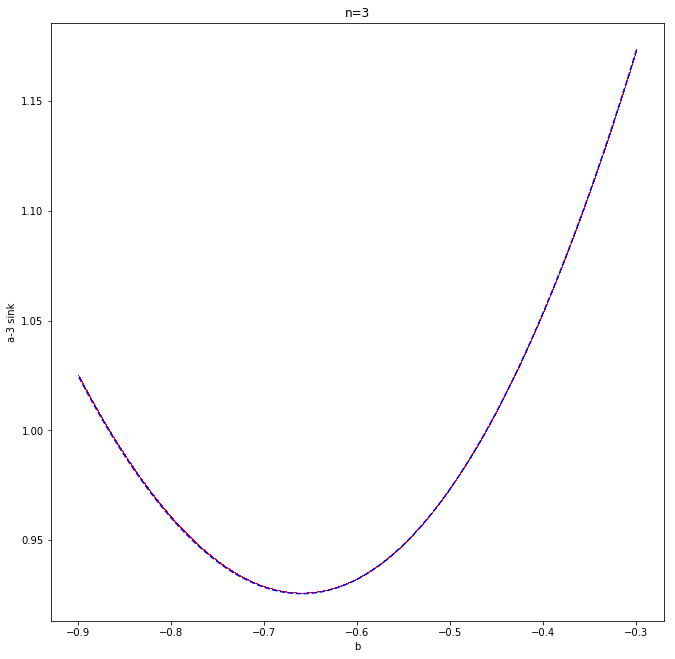

In [162]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('a-3 sink')
plt.title('n=3')
plt.plot(my_bS3, my_aS3, ',',color='red')
plt.plot(my_bS3, my_aS3, '--',color='blue')

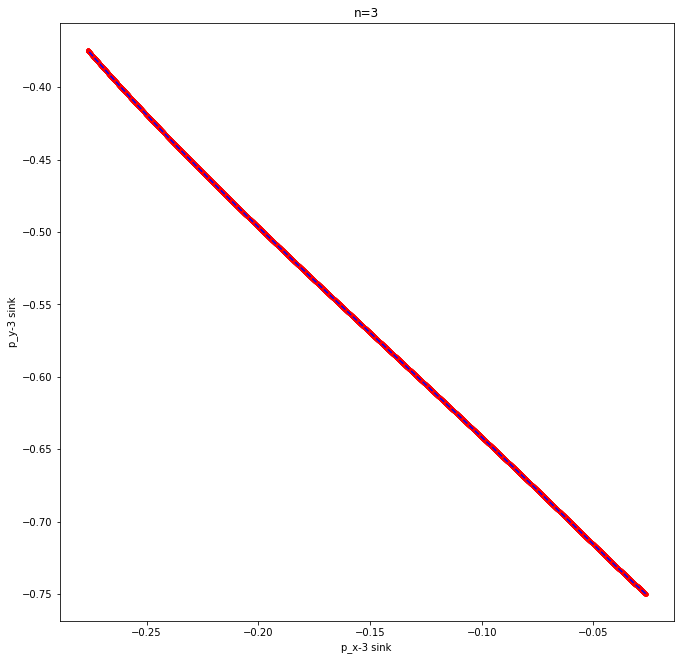

In [163]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('p_x-3 sink') 
plt.ylabel('p_y-3 sink')
plt.title('n=3')
plt.plot(my_px3, my_py3, '.',color='red')
plt.plot(my_px3, my_py3, '--',color='blue')

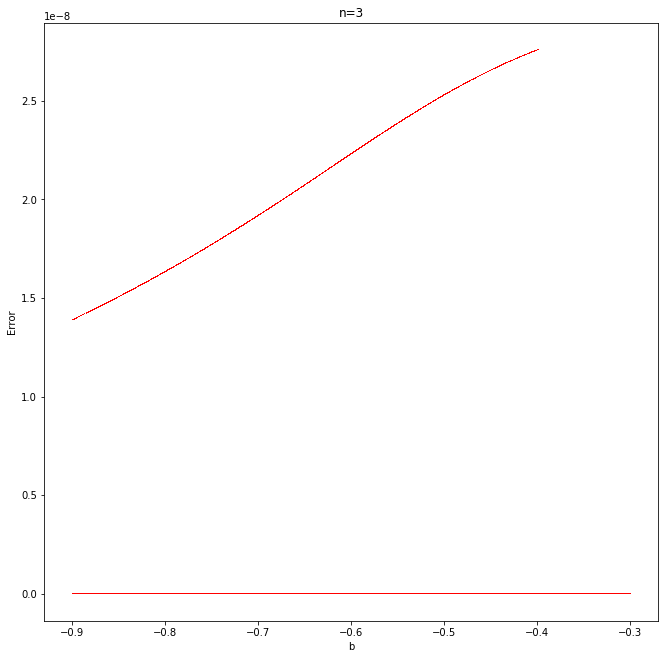

In [166]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('Error')
plt.title('n=3')
plt.plot(my_bS3[3:], my_err3[3:], ',',color='red')
#plt.plot(my_bS3[3:], my_err3[3:], '--',color='blue')

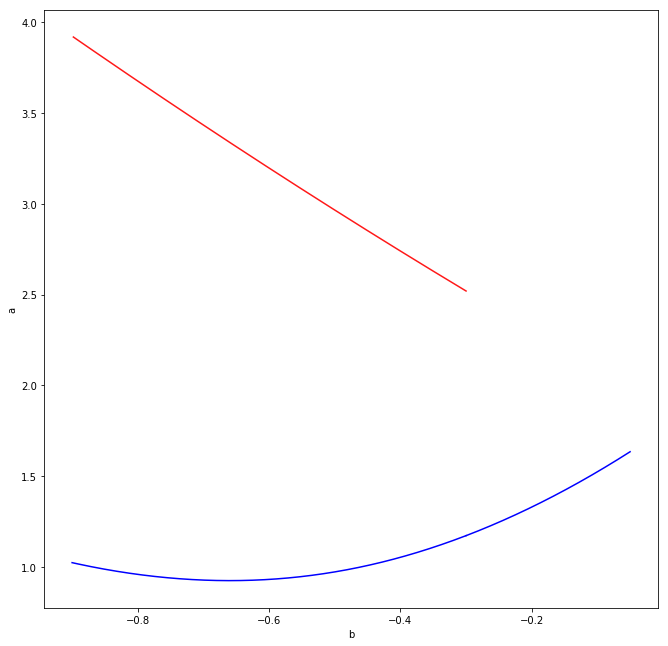

In [191]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('a')
#plt.plot(my_b, a_tan, '-', color='red', alpha = 0.9, markersize=3,)
plt.plot(tan_b_backwards,tan_a_backwards,color='red', alpha = 0.9, markersize=3)
plt.plot(my_bS3, my_aS3, '-',color='blue')
plt.plot(b_forward,a_forward,'-',color='blue')

In [18]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('a')
#plt.plot(my_b, a_tan, '-', color='red', alpha = 0.9, markersize=3,)
#plt.plot(tan_b_backwards,tan_a_backwards,color='red', alpha = 0.9, markersize=3)
#plt.plot(my_bS3, my_aS3, '-',color='blue')
plt.plot(b_forward,a_forward,'-',color='blue')

NameError: name 'plt' is not defined

In [208]:
#save b,a files
new_sink_ba = open("new_sink_ba.txt", "w")
r = len(my_bS3)
for i in range(r):
    np.savetxt(new_sink_ba, [my_bS3[i],my_aS3[i]])

new_sink_ba.close()

#save x,y
new_sink_xy = open("new_sink_xy.txt", "w")
for i in range(r):
    np.savetxt(new_sink_xy, [my_px3[i],my_py3[i]])
new_sink_xy.close()

In [209]:
print(len(my_bS3))

12001


In [202]:
for i in range(len(my_bS3)):
    print(my_py3[i],',')

-0.7497528011518759 ,
-0.7497528011518595 ,
-0.7497140505640032 ,
-0.7497010926507511 ,
-0.7496881514099506 ,
-0.7496752071537678 ,
-0.7496622581500549 ,
-0.7496493043828738 ,
-0.7496363458520632 ,
-0.7496233825574692 ,
-0.7496104144989613 ,
-0.7495974416763975 ,
-0.749584464089585 ,
-0.7495714817383855 ,
-0.7495584946226621 ,
-0.7495455027422704 ,
-0.7495325060970336 ,
-0.7495195046868282 ,
-0.7495064985114751 ,
-0.7494934875708509 ,
-0.7494804718647825 ,
-0.7494674513931328 ,
-0.7494544261557506 ,
-0.7494413961524861 ,
-0.7494283613831995 ,
-0.7494153218477263 ,
-0.7494022775459243 ,
-0.7493892284776562 ,
-0.7493761746427533 ,
-0.7493631160410783 ,
-0.7493500526724863 ,
-0.7493369845368313 ,
-0.7493239116339442 ,
-0.7493108339637152 ,
-0.7492977515259686 ,
-0.749284664320577 ,
-0.749271572347372 ,
-0.7492584756062209 ,
-0.7492453740969782 ,
-0.7492322678195024 ,
-0.7492191567736334 ,
-0.7492060409592476 ,
-0.7491929203761734 ,
-0.7491797950242823 ,
-0.7491666649034344 ,
-0.7491535300

-0.7422651796350763 ,
-0.7422497286994016 ,
-0.7422342729517343 ,
-0.7422188123920592 ,
-0.7422033470203317 ,
-0.7421878768365333 ,
-0.7421724018406344 ,
-0.7421569220325972 ,
-0.7421414374123854 ,
-0.7421259479799884 ,
-0.7421104537353551 ,
-0.74209495467848 ,
-0.7420794508093115 ,
-0.742063942127845 ,
-0.74204842863404 ,
-0.7420329103278587 ,
-0.7420173872092941 ,
-0.7420018592783062 ,
-0.7419863265348692 ,
-0.7419707889789621 ,
-0.7419552466105341 ,
-0.7419396994295915 ,
-0.7419241474360864 ,
-0.7419085906300057 ,
-0.7418930290113229 ,
-0.7418774625800046 ,
-0.7418618913360173 ,
-0.7418463152793496 ,
-0.741830734409997 ,
-0.7418151487278896 ,
-0.7417995582330379 ,
-0.7417839629254085 ,
-0.7417683628049732 ,
-0.741752757871698 ,
-0.7417371481255863 ,
-0.7417215335665995 ,
-0.7417059141947068 ,
-0.7416902900099029 ,
-0.7416746610121625 ,
-0.7416590272014572 ,
-0.7416433885777678 ,
-0.7416277451410606 ,
-0.7416120968913364 ,
-0.7415964438285629 ,
-0.7415807859527196 ,
-0.74156512326378

-0.7339394181229325 ,
-0.7339215625189864 ,
-0.7339037021189797 ,
-0.7338858369229998 ,
-0.7338679669311593 ,
-0.7338500921435333 ,
-0.7338322125602351 ,
-0.7338143281813593 ,
-0.7337964390069909 ,
-0.7337785450372452 ,
-0.7337606462722126 ,
-0.7337427427119926 ,
-0.7337248343566809 ,
-0.7337069212063713 ,
-0.7336890032611763 ,
-0.7336710805211877 ,
-0.7336531529865064 ,
-0.7336352206572306 ,
-0.7336172835334525 ,
-0.7335993416152959 ,
-0.7335813949028341 ,
-0.7335634433961857 ,
-0.7335454870954422 ,
-0.7335275260007138 ,
-0.7335095601121011 ,
-0.7334915894296998 ,
-0.7334736139536067 ,
-0.7334556336839498 ,
-0.733437648620799 ,
-0.7334196587642815 ,
-0.7334016641144824 ,
-0.7333836646715224 ,
-0.7333656604354974 ,
-0.7333476514065131 ,
-0.7333296375846625 ,
-0.7333116189700692 ,
-0.7332935955628264 ,
-0.733275567363043 ,
-0.7332575343708163 ,
-0.733239496586264 ,
-0.733221454009487 ,
-0.7332034066405815 ,
-0.7331853544796749 ,
-0.7331672975268574 ,
-0.7331492357822353 ,
-0.73313116924

-0.719210806390718 ,
-0.7191893992575206 ,
-0.719167987474759 ,
-0.7191465710427274 ,
-0.7191251499617394 ,
-0.719103724232072 ,
-0.7190822938540319 ,
-0.7190608588279104 ,
-0.7190394191540053 ,
-0.7190179748326202 ,
-0.7189965258640338 ,
-0.7189750722485692 ,
-0.7189536139865008 ,
-0.7189321510781369 ,
-0.7189106835237776 ,
-0.7188892113237166 ,
-0.7188677344782555 ,
-0.7188462529876906 ,
-0.718824766852323 ,
-0.7188032760724602 ,
-0.7187817806483857 ,
-0.7187602805804024 ,
-0.7187387758688224 ,
-0.7187172665139376 ,
-0.718695752516058 ,
-0.7186742338754732 ,
-0.7186527105924854 ,
-0.7186311826674022 ,
-0.7186096501005239 ,
-0.7185881128921493 ,
-0.7185665710425818 ,
-0.7185450245521299 ,
-0.7185234734210932 ,
-0.7185019176497658 ,
-0.7184803572384622 ,
-0.7184587921874906 ,
-0.7184372224971416 ,
-0.7184156481677184 ,
-0.7183940691995375 ,
-0.7183724855929072 ,
-0.7183508973481074 ,
-0.7183293044654702 ,
-0.7183077069452898 ,
-0.7182861047878739 ,
-0.7182644979935253 ,
-0.718242886562

-0.7018984066990361 ,
-0.7018736152325088 ,
-0.7018488230071784 ,
-0.7018240269141666 ,
-0.7017992308211547 ,
-0.7017744176126417 ,
-0.7017496071061664 ,
-0.7017247924482305 ,
-0.7016999737678316 ,
-0.7016751513807326 ,
-0.7016503208734074 ,
-0.7016254892834886 ,
-0.701600653768878 ,
-0.7015758182542675 ,
-0.7015509663752462 ,
-0.7015261167063218 ,
-0.7015012628942295 ,
-0.7014764050710182 ,
-0.7014515435613757 ,
-0.7014266739657248 ,
-0.7014018031374141 ,
-0.7013769283592434 ,
-0.7013520535810727 ,
-0.7013271628343002 ,
-0.7013022740327728 ,
-0.7012773810904276 ,
-0.701252484134609 ,
-0.7012275834784647 ,
-0.7012026746487936 ,
-0.7011777649259971 ,
-0.7011528513356013 ,
-0.7011279377452055 ,
-0.701103007347407 ,
-0.7010780794727292 ,
-0.7010531474715908 ,
-0.7010282114822586 ,
-0.7010032754929264 ,
-0.7009783245781044 ,
-0.7009533749732388 ,
-0.7009284212253826 ,
-0.7009034634471166 ,
-0.7008785019148482 ,
-0.7008535403825799 ,
-0.7008285621028737 ,
-0.7008035865144743 ,
-0.7007786068

-0.6889713378241406 ,
-0.6889444420806381 ,
-0.688917529868221 ,
-0.6888906206172352 ,
-0.6888637077338051 ,
-0.688836791583982 ,
-0.688809875434159 ,
-0.6887829427948094 ,
-0.6887560131375833 ,
-0.6887290798537717 ,
-0.6887021433126729 ,
-0.688675206771574 ,
-0.688648253720235 ,
-0.6886213036717929 ,
-0.6885943500026341 ,
-0.6885673930853181 ,
-0.6885404361680021 ,
-0.6885134627196761 ,
-0.6884864922950632 ,
-0.6884595182556168 ,
-0.6884325409771674 ,
-0.6884055636987181 ,
-0.68837856986842 ,
-0.6883515790827234 ,
-0.6883245846880754 ,
-0.6882975870636211 ,
-0.6882705894391667 ,
-0.688243575241916 ,
-0.6882165641102336 ,
-0.6881895493755033 ,
-0.6881625314201971 ,
-0.688135513464891 ,
-0.6881084789157164 ,
-0.688081447453175 ,
-0.6880544123934945 ,
-0.6880273741224912 ,
-0.6880003358514878 ,
-0.687973280965527 ,
-0.6879462291872798 ,
-0.6879191738178363 ,
-0.6878921152463966 ,
-0.6878650566749569 ,
-0.6878379814671584 ,
-0.6878109093883867 ,
-0.6877838337243566 ,
-0.6877567548676502 ,

-0.6750243001006409 ,
-0.6749954405692424 ,
-0.6749665678920578 ,
-0.6749376963715364 ,
-0.6749088218081293 ,
-0.6748799472447221 ,
-0.674851059534172 ,
-0.674822172987023 ,
-0.6747932834027563 ,
-0.6747643938184897 ,
-0.6747354910856571 ,
-0.6747065895230375 ,
-0.6746776849290983 ,
-0.6746487803351591 ,
-0.6746198625910719 ,
-0.6745909460241458 ,
-0.6745620264316993 ,
-0.6745331068392527 ,
-0.674504174095051 ,
-0.6744752425349808 ,
-0.6744463079552334 ,
-0.674417373375486 ,
-0.6743884256422131 ,
-0.6743594791001981 ,
-0.674330529544362 ,
-0.6743015799885259 ,
-0.67427261727727 ,
-0.6742436557645022 ,
-0.6742146912437884 ,
-0.6741857267230746 ,
-0.6741567490449584 ,
-0.6741277725726428 ,
-0.6740987930982731 ,
-0.6740698136239035 ,
-0.6740408209900679 ,
-0.674011829569418 ,
-0.6739828351526497 ,
-0.6739538407358814 ,
-0.6739248331573999 ,
-0.6738958267996569 ,
-0.6738668174517363 ,
-0.6738378081038157 ,
-0.6738087855918441 ,
-0.6737797643082466 ,
-0.6737507400404452 ,
-0.673721715772643

-0.6554092266087497 ,
-0.6553780572783416 ,
-0.6553468905631357 ,
-0.6553157218862886 ,
-0.6552845532094416 ,
-0.6552533707876672 ,
-0.6552221909885193 ,
-0.6551910092345902 ,
-0.655159827480661 ,
-0.6551286319801264 ,
-0.655097439109643 ,
-0.6550662442912503 ,
-0.6550350494728575 ,
-0.655003840906171 ,
-0.6549726349769651 ,
-0.6549414271067319 ,
-0.6549102192364986 ,
-0.654878997616255 ,
-0.6548477786409551 ,
-0.6548165577315093 ,
-0.6547853368220634 ,
-0.6547541021608955 ,
-0.6547228701521209 ,
-0.6546916362160944 ,
-0.6546604022800678 ,
-0.6546291545906022 ,
-0.6545979095609973 ,
-0.654566662611035 ,
-0.6545354156610728 ,
-0.6545041549559366 ,
-0.6544728969181411 ,
-0.6544416369668798 ,
-0.6544103770156185 ,
-0.6543791033074867 ,
-0.654347832274146 ,
-0.6543165593342659 ,
-0.6542852863943859 ,
-0.6542539996958484 ,
-0.6542227156796249 ,
-0.6541914297637763 ,
-0.6541601438479278 ,
-0.6541288441716692 ,
-0.6540975471852246 ,
-0.6540662483060824 ,
-0.6540349494269402 ,
-0.6540036367856

-0.6279562990871603 ,
-0.627922658402377 ,
-0.6278890177175938 ,
-0.6278553664084731 ,
-0.6278217179990172 ,
-0.6277880695895613 ,
-0.6277544105588349 ,
-0.6277207544323743 ,
-0.6276870983059137 ,
-0.6276534315611666 ,
-0.627619767725333 ,
-0.6275861038894994 ,
-0.6275524294383875 ,
-0.6275187579008107 ,
-0.6274850863632339 ,
-0.6274514042134216 ,
-0.6274177249817627 ,
-0.6273840457501039 ,
-0.6273503559092007 ,
-0.6273166689911008 ,
-0.6272829820730009 ,
-0.6272492845486505 ,
-0.6272155899517455 ,
-0.6271818953548406 ,
-0.6271481901547062 ,
-0.6271144878866382 ,
-0.6270807856185701 ,
-0.6270470727502978 ,
-0.6270133628187103 ,
-0.6269796528871229 ,
-0.6269459323583776 ,
-0.6269122147709212 ,
-0.6268784971834648 ,
-0.6268447690018721 ,
-0.6268110437661986 ,
-0.626777318530525 ,
-0.626743582703731 ,
-0.6267098498274826 ,
-0.6266761169512342 ,
-0.6266423734869015 ,
-0.6266086329777293 ,
-0.626574892468557 ,
-0.626541141374331 ,
-0.626507393239889 ,
-0.626473645105447 ,
-0.626439886388968

-0.6041424461978925 ,
-0.6041072311367642 ,
-0.6040720061537123 ,
-0.6040367851363901 ,
-0.604001564119068 ,
-0.603966333182861 ,
-0.6039311062170195 ,
-0.603895879251178 ,
-0.60386064236952 ,
-0.6038254094628354 ,
-0.6037901765561507 ,
-0.6037549337367427 ,
-0.603719694896916 ,
-0.6036844560570893 ,
-0.6036492073075674 ,
-0.6036139625422843 ,
-0.6035787177770011 ,
-0.6035434631050558 ,
-0.6035082124219757 ,
-0.6034729617388956 ,
-0.6034377011522398 ,
-0.6034024445590657 ,
-0.6033671879658915 ,
-0.6033319214721705 ,
-0.6032966589765776 ,
-0.6032613964809846 ,
-0.6032261240878956 ,
-0.6031908556975717 ,
-0.6031555873072478 ,
-0.6031203090224467 ,
-0.6030850347450536 ,
-0.6030497604676605 ,
-0.6030144762988658 ,
-0.6029791961420967 ,
-0.6029439159853276 ,
-0.6029086259401972 ,
-0.6028733399117154 ,
-0.6028380538832336 ,
-0.6028027579694651 ,
-0.6027674660769701 ,
-0.602732174184475 ,
-0.602696872409714 ,
-0.6026615746608716 ,
-0.6026262769120291 ,
-0.6025909692839748 ,
-0.602555665686462

-0.5659374114095929 ,
-0.5659005644856004 ,
-0.565863717561608 ,
-0.5658268617504989 ,
-0.5657900115172237 ,
-0.5657531612839486 ,
-0.5657163021662798 ,
-0.5656794486309249 ,
-0.56564259509557 ,
-0.5656057326785977 ,
-0.5655688758483973 ,
-0.5655320190181969 ,
-0.5654951533091301 ,
-0.5654582931912998 ,
-0.5654214330734695 ,
-0.5653845640795282 ,
-0.5653477006812836 ,
-0.565310837283039 ,
-0.5652739650114483 ,
-0.5652370983400274 ,
-0.5652002316686066 ,
-0.5651633561265413 ,
-0.5651264861891168 ,
-0.5650896162516922 ,
-0.5650527374464362 ,
-0.5650158642502752 ,
-0.5649789910541141 ,
-0.5649421089927866 ,
-0.5649052325450454 ,
-0.5648683560973042 ,
-0.5648314707872086 ,
-0.564794591095138 ,
-0.5647577114030673 ,
-0.5647208228513377 ,
-0.5646839399221106 ,
-0.5646470569928835 ,
-0.5646101652067823 ,
-0.5645732790476292 ,
-0.5645363928884761 ,
-0.5644994978751531 ,
-0.5644626084932606 ,
-0.5644257191113681 ,
-0.5643888208780594 ,
-0.5643519282806229 ,
-0.5643150356831863 ,
-0.564278134237

-0.5303947339060525 ,
-0.5303571873042353 ,
-0.5303196354446221 ,
-0.5302820835874107 ,
-0.5302445354815337 ,
-0.5302069873756567 ,
-0.5301694340225301 ,
-0.5301318806718271 ,
-0.5300943310733783 ,
-0.5300567814749295 ,
-0.530019226639835 ,
-0.5299816718071404 ,
-0.5299441207276505 ,
-0.5299065696481606 ,
-0.529869013342575 ,
-0.5298314570393899 ,
-0.529793904490358 ,
-0.5297563519413261 ,
-0.5297187941767525 ,
-0.5296812364145647 ,
-0.5296436824074987 ,
-0.5296061284004328 ,
-0.5295685691883445 ,
-0.5295310099786538 ,
-0.5294934545250344 ,
-0.529455899071415 ,
-0.5294183384233001 ,
-0.5293807777776182 ,
-0.529343220888906 ,
-0.5293056640001937 ,
-0.5292681019275658 ,
-0.5292305398573525 ,
-0.5291929815450336 ,
-0.5291554232327147 ,
-0.5291178597470363 ,
-0.529080296263753 ,
-0.5290427365393102 ,
-0.5290051768148675 ,
-0.5289676119275877 ,
-0.5289300470427063 ,
-0.5288924859176006 ,
-0.528854924792495 ,
-0.528817358515073 ,
-0.5287797922400693 ,
-0.528742229725741 ,
-0.5287046672114127

-0.5004453026849297 ,
-0.5004076752862248 ,
-0.5003700446316385 ,
-0.5003324139792833 ,
-0.5002947872399387 ,
-0.5002571605005941 ,
-0.5002195305149311 ,
-0.5001819005314581 ,
-0.5001442744617083 ,
-0.5001066483919585 ,
-0.5000690190853712 ,
-0.5000313897809925 ,
-0.4999937643910163 ,
-0.4999561390010401 ,
-0.49991851038374313 ,
-0.4998808817686488 ,
-0.4998432570686389 ,
-0.499805632368629 ,
-0.49976800445080677 ,
-0.4997303765351714 ,
-0.49969275253532053 ,
-0.4996551285354697 ,
-0.4996175013272842 ,
-0.4995798741212898 ,
-0.49954225083177534 ,
-0.4995046275422609 ,
-0.4994670010538802 ,
-0.49942937456770375 ,
-0.4993917519986782 ,
-0.4993541294296526 ,
-0.4993165036712664 ,
-0.499278877915059 ,
-0.49924125607670394 ,
-0.4992036342383489 ,
-0.4991660092200883 ,
-0.4991283842040095 ,
-0.4990907631064836 ,
-0.4990531420089577 ,
-0.4990155177409658 ,
-0.4989778934751748 ,
-0.4989402731286101 ,
-0.49890265278204543 ,
-0.49886502927449067 ,
-0.4988274057691178 ,
-0.49878978618367115 ,
-0.

-0.46303719893420336 ,
-0.4630000362279434 ,
-0.4629628735216834 ,
-0.46292570975151115 ,
-0.46288854598322116 ,
-0.4628513862721755 ,
-0.4628142265611298 ,
-0.4627770657941733 ,
-0.4627399050291128 ,
-0.4627027483217501 ,
-0.4626655916143875 ,
-0.46262843385912095 ,
-0.46259127610573286 ,
-0.4625541224105204 ,
-0.46251696871530795 ,
-0.46247981398018323 ,
-0.46244265924692773 ,
-0.46240550857232315 ,
-0.4623683578977186 ,
-0.4623312061911823 ,
-0.46229405448651517 ,
-0.4622569068409744 ,
-0.4622197591954337 ,
-0.462182610525923 ,
-0.4621454618582823 ,
-0.46210831725024193 ,
-0.46207117264220154 ,
-0.46203402701815943 ,
-0.4619968813959882 ,
-0.46195973983388977 ,
-0.46192259827179133 ,
-0.46188545570164385 ,
-0.4618483131333586 ,
-0.46181117462562926 ,
-0.4617740361178999 ,
-0.4617368966100696 ,
-0.46169975710409505 ,
-0.4616626216591564 ,
-0.46162548621421773 ,
-0.46158834977712004 ,
-0.4615512133418769 ,
-0.461514080968152 ,
-0.4614769485944271 ,
-0.4614398152364606 ,
-0.46140268188

-0.44455904824420656 ,
-0.44452232344829606 ,
-0.44448559865238557 ,
-0.4444488736039012 ,
-0.44441214855713107 ,
-0.4443754277623198 ,
-0.44433870696750855 ,
-0.44430198592465076 ,
-0.4442652648834868 ,
-0.4442285480974075 ,
-0.4441918313113283 ,
-0.44415511428347565 ,
-0.44411839725733016 ,
-0.4440816844866577 ,
-0.4440449717159852 ,
-0.4440082587107398 ,
-0.44397154570721736 ,
-0.4439348369605032 ,
-0.443898128213789 ,
-0.443861419236811 ,
-0.44382471026151826 ,
-0.4437880055463709 ,
-0.4437513008312235 ,
-0.44371459589201356 ,
-0.44367789095447124 ,
-0.4436411902774968 ,
-0.4436044896005224 ,
-0.44356778870663444 ,
-0.4435310878144307 ,
-0.44349439118364997 ,
-0.44345769455286926 ,
-0.4434209977109568 ,
-0.44338430087072284 ,
-0.4433476082937009 ,
-0.44331091571667897 ,
-0.44327422293521523 ,
-0.4432375301554521 ,
-0.4432008416405529 ,
-0.4431641531256537 ,
-0.4431274644096401 ,
-0.44309077569530897 ,
-0.4430540912500994 ,
-0.4430174068048899 ,
-0.4429807221644172 ,
-0.442944037525

-0.42633009967099156 ,
-0.42629393171017227 ,
-0.426257763749353 ,
-0.42622159626778167 ,
-0.4261854287877297 ,
-0.4261492657252468 ,
-0.4261131026627639 ,
-0.4260769400836592 ,
-0.4260407775060675 ,
-0.4260046193486828 ,
-0.42596846119129805 ,
-0.4259323035229225 ,
-0.42589614585608415 ,
-0.42585999260974355 ,
-0.42582383936340296 ,
-0.42578768661253924 ,
-0.42575153386317216 ,
-0.42571538553464733 ,
-0.4256792372061225 ,
-0.42564308937943995 ,
-0.4256069415543059 ,
-0.4255707981507673 ,
-0.42553465474722874 ,
-0.4254985118505524 ,
-0.4254623689554015 ,
-0.4254262304835837 ,
-0.42539009201176586 ,
-0.4253539540527619 ,
-0.42531781609524666 ,
-0.42528168256141907 ,
-0.4252455490275915 ,
-0.425209416012912 ,
-0.42517328299977486 ,
-0.4251371544113884 ,
-0.4251010258230019 ,
-0.4250648977578414 ,
-0.42502876969420206 ,
-0.42499264605798076 ,
-0.42495652242175946 ,
-0.4249203993143685 ,
-0.4248842762084844 ,
-0.4248481575303377 ,
-0.42481203885219104 ,
-0.4247759207092514 ,
-0.42473980256

-0.4084419881524906 ,
-0.4084064780826114 ,
-0.40837097252627075 ,
-0.4083354669699301 ,
-0.4082999625878214 ,
-0.408264458207076 ,
-0.40822895834016243 ,
-0.40819345847324884 ,
-0.40815795978605923 ,
-0.40812246110021333 ,
-0.4080869669287071 ,
-0.4080514727572009 ,
-0.4080159797708496 ,
-0.40798048678586624 ,
-0.40794499831575526 ,
-0.4079095098456443 ,
-0.40787402256583993 ,
-0.40783853528738845 ,
-0.4078030525245338 ,
-0.40776756976167916 ,
-0.40773208819461876 ,
-0.4076966066289312 ,
-0.40766112957907463 ,
-0.40762565252921806 ,
-0.40759017668078157 ,
-0.4075547008336997 ,
-0.4075192295030291 ,
-0.4074837581723585 ,
-0.40744828804787386 ,
-0.4074128179247302 ,
-0.4073773523191242 ,
-0.4073418867135182 ,
-0.4073064223194263 ,
-0.4072709579266834 ,
-0.4072354980517055 ,
-0.4072000381767276 ,
-0.4071645795189324 ,
-0.4071291208624519 ,
-0.4070936667240076 ,
-0.4070582125855633 ,
-0.40702275966987395 ,
-0.4069873067555347 ,
-0.4069518583594585 ,
-0.40691640996338235 ,
-0.4068809627956

-0.39087246945835563 ,
-0.39083771430550557 ,
-0.3908029637033528 ,
-0.3907682131012001 ,
-0.39073346432549333 ,
-0.3906987155509386 ,
-0.3906639713273052 ,
-0.39062922710367176 ,
-0.39059448471135233 ,
-0.3905597423202285 ,
-0.3905250044801877 ,
-0.39049026664014685 ,
-0.3904555306363775 ,
-0.3904207946337598 ,
-0.390386063182447 ,
-0.39035133173113423 ,
-0.3903166021209516 ,
-0.39028187251196794 ,
-0.3902471474544519 ,
-0.3902124223969358 ,
-0.3901776991854636 ,
-0.3901429759752112 ,
-0.39010825731656396 ,
-0.3900735386579167 ,
-0.39003882185026645 ,
-0.39000410504382044 ,
-0.3899693927891427 ,
-0.389934680534465 ,
-0.3898999701356908 ,
-0.3898652597381236 ,
-0.38983055389247334 ,
-0.3897958480468231 ,
-0.3897611440620251 ,
-0.3897264400783965 ,
-0.3896917406468751 ,
-0.3896570412153537 ,
-0.38962234364955217 ,
-0.389587646084931 ,
-0.3895529530725927 ,
-0.38951826006025436 ,
-0.38948356891852537 ,
-0.38944887777795845 ,
-0.38941419118986625 ,
-0.38937950460177406 ,
-0.38934481988915

In [24]:
#moving b_i, getting sink points      FORWARD

global b_val
global n

n=3
Total = 20000
b_i = np.zeros(Total)

p0 = 1
p1 = 0

b_i[p0] =  -0.899949999999934
b_i[p1] =  -0.899899999999934

inc = 0.00005



a_nsink = np.zeros(len(b_i))
px_nsink = np.zeros(len(b_i)) 
py_nsink = np.zeros(len(b_i))
dx_nsink = np.zeros(len(b_i))
dy_nsink = np.zeros(len(b_i))
p_error = np.zeros(len(b_i))
px_IT,py_IT = np.zeros(len(b_i)),np.zeros(len(b_i))

a_nsink[p0]  = 1.02450251175109
px_nsink[p0] = -0.2764006150705526
py_nsink[p0] = -0.37448145861872983
dx_nsink[p0] = 1986.4107295917045
dy_nsink[p0] =  -38178.3396768215
px_IT[p0] = px_nsink[p0]
py_IT[p0] = py_nsink[p0]


a_nsink[p1]  =  1.0245428160816248 
px_nsink[p1] =  -0.2764198906943405
py_nsink[p1] =  -0.37444749980084435 
dx_nsink[p1] = 1986.4107295917045
dy_nsink[p1] = -38178.3396768215
px_IT[p1] = px_nsink[p1]
py_IT[p1] = py_nsink[p1]


b_end = -1.00006
direction = -1
for i in range(2,Total):
    global b_val
    
    
    print('i: ',i)
    b_i[i] = b_i[i-1] + direction*inc
    b_val = b_i[i]
    
    slope_a = np.double((a_nsink[i-1] - a_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))
    slope_px = np.double((px_nsink[i-1] - px_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))
    slope_py = np.double((py_nsink[i-1] - py_nsink[i-2]) / (b_i[i-1] - b_i[i-2]))

            
            
    a_guess = a_nsink[i-1] + slope_a*(b_i[i] - b_i[i-1])
    px_guess = px_nsink[i-1] + slope_px*(b_i[i] - b_i[i-1])
    py_guess = py_nsink[i-1] + slope_py*(b_i[i] - b_i[i-1])    
    
    
    sinkn_i = optimize.fsolve(F_sink,[a_guess,px_guess,py_guess,dx_nsink[i-1],dy_nsink[i-1]],xtol = 0,epsfcn = 10e-11)#epsfcn
    
    #pNew = NhMap_n(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n,1)
    
    #sinkn_i = optimize.fsolve(F_sink,[sinkn_i[0],pNew[0],pNew[1],sinkn_i[3],sinkn_i[4]],xtol = 0,epsfcn = 1)
    
#     my_a,my_x,my_y = sinkn_i[0],sinkn_i[1],sinkn_i[2]
#     xy = optimize.fsolve(F_R2,[my_x,my_y],xtol=0)

#     a_new = optimize.fsolve(get_tr,[my_a],xtol = 0)
#     my_a = a_new[0]

    #xy = optimize.fsolve(F_R2,[my_x,my_y],xtol=0)
# #    axy = optimize.fsolve(F_R3,[my_a,my_x,my_y])
    
    sinkn_i = optimize.fsolve(F_sink,[sinkn_i[0],sinkn_i[1],sinkn_i[2],dx_nsink[i-1],dy_nsink[i-1]],xtol = 0)#epsfcn
    xy50 = NhMap_n(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n,50)
    if R_getTraceDFn(sinkn_i[0],b_val,xy50[0],xy50[1],n) < R_getTraceDFn(sinkn_i[0],b_val,sinkn_i[1],sinkn_i[2],n):
        sinkn_i[1] = xy50[0]
        sinkn_i[2] = xy50[1]

    a_nsink[i]  = sinkn_i[0]
    px_nsink[i] = sinkn_i[1]
    py_nsink[i] = sinkn_i[2]
    dx_nsink[i] = sinkn_i[3]
    dy_nsink[i] = sinkn_i[4]
    
    #calculate relative error
#     print(np.abs((a_guess - a_nsink[i])) / a_nsink[i])
#     print(np.abs((px_guess - px_nsink[i]) / px_nsink[i]))
#     print(np.abs((py_guess - py_nsink[i])) / py_nsink[i])
    
    print('...')
    p_i = sinkn_i[1],sinkn_i[2]
    p_Fin = NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100)

    p_error[i] = np.sqrt((p_i[0] - p_Fin[0])**2 + (p_i[1]-p_Fin[1])**2)

    
    print('b: ',b_val)
    print('a: ',a_nsink[i])
    print('dx: ',dx_nsink[i])
    print('dy: ',dy_nsink[i])

    print('p: ',px_nsink[i],', ',py_nsink[i])
    print('Trace DFn: ',R_getTraceDFn(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n))
    print('n*p: ',hMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n))
    print('n*100p: ',NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100))
    true_p = NhMap_n(a_nsink[i],b_val,px_nsink[i],py_nsink[i],n,100)

    print('^Trace 100*DFn: ',R_getTraceDFn(a_nsink[i],b_val,true_p[0],true_p[1],n))
    print('p-F Error: ',F_sink(sinkn_i))
    print('100 np-Error: ',F_sink([sinkn_i[0], true_p[0],true_p[1],sinkn_i[3],sinkn_i[4]]))
    print('p sink diff error: ',p_error[i])
    print('--------------------------------------------')
    px_IT[i] = px_nsink[i]
    py_IT[i] = py_nsink[i]
    if b_val < b_end:
        print("Finished Loading")
        l = i-1
        break



i:  2
...
b:  -0.899999999999934
a:  1.024583120672296
dx:  2.312116026106947e+19
dy:  -4.769305015982411e+20
p:  -0.27643916824170983 ,  -0.37441354379321173
Trace DFn:  4.739715286916635e-10
n*p:  [-0.27643916942890445, -0.3744135433255974]
n*100p:  [-0.2764391666337068, -0.3744135412737628]
^Trace 100*DFn:  1.859352005695314e-08
p-F Error:  [array([-1.18720817e-09]), array([4.67597572e-10]), 1.187194620388965e-09, -4.676143361415086e-10, 4.739715286916635e-10]
100 np-Error:  [array([7.21644966e-16]), array([1.55431223e-15]), 4.440892098500626e-16, 0.0, 1.859352005695314e-08]
p sink diff error:  2.988862086565501e-09
--------------------------------------------
i:  3
...
b:  -0.900049999999934
a:  1.0246234357610957
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27645844337370384 ,  -0.3743795873401372
Trace DFn:  4.931166586175095e-12
n*p:  [-0.2764584433737163, -0.3743795873401543]
n*100p:  [-0.2764584433737195, -0.37437958734015264]
^Trace 100*DFn:  4.849898260772534

...
b:  -0.9005999999999339
a:  1.025067414136183
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2766703218180032 ,  -0.37400619632940574
Trace DFn:  4.358887917277343e-08
n*p:  [-0.27667032181800333, -0.3740061963294061]
n*100p:  [-0.27667032181800333, -0.3740061963294061]
^Trace 100*DFn:  4.358888139321948e-08
p-F Error:  [array([3.83026943e-15]), array([3.60822483e-15]), 1.1102230246251565e-16, 3.885780586188048e-16, 4.358887917277343e-08]
100 np-Error:  [array([2.94209102e-15]), array([3.99680289e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 4.358888139321948e-08]
p sink diff error:  4.041272810440265e-16
--------------------------------------------
i:  15
...
b:  -0.9006499999999339
a:  1.0251078181981053
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2766895752651685 ,  -0.37397226342447787
Trace DFn:  1.3703821633015423e-08
n*p:  [-0.27668955409517126, -0.37397224467400814]
n*100p:  [-0.2766895633647767, -0.373972256334705]
^Trace 100*DFn:  2.

...
b:  -0.9011999999999338
a:  1.0255528423769982
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2769011358419922 ,  -0.3735990936557797
Trace DFn:  1.1546319456101628e-14
n*p:  [-0.2769011358419837, -0.3735990936557667]
n*100p:  [-0.2769011358419792, -0.3735990936557665]
^Trace 100*DFn:  8.260059303211165e-14
p-F Error:  [array([1.78190795e-14]), array([2.54241073e-14]), -8.493206138382448e-15, -1.2989609388114332e-14, 1.1546319456101628e-14]
100 np-Error:  [array([-1.11022302e-15]), array([-1.11022302e-15]), 8.881784197001252e-16, 6.106226635438361e-16, 8.260059303211165e-14]
p sink diff error:  1.856671675654716e-14
--------------------------------------------
i:  27
...
b:  -0.9012499999999338
a:  1.0255933464625084
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2769203555598213 ,  -0.3735651799567173
Trace DFn:  9.453966498540467e-10
n*p:  [-0.2769203555598183, -0.37356517995671357]
n*100p:  [-0.27692035555981753, -0.37356517995671373]
^Trace 100*DFn: 

...
b:  -0.9017999999999338
a:  1.0260394183723
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27713162436397804 ,  -0.373192248353865
Trace DFn:  4.118483420967323e-08
n*p:  [-0.27713162436398886, -0.3731922483538791]
n*100p:  [-0.2771316243639892, -0.37319224835387577]
^Trace 100*DFn:  4.118488750037841e-08
p-F Error:  [array([-6.8278716e-15]), array([-8.8817842e-15]), 1.0824674490095276e-14, 1.4099832412739488e-14, 4.118483420967323e-08]
100 np-Error:  [array([1.22124533e-15]), array([2.10942375e-15]), 8.881784197001252e-16, 1.2212453270876722e-15, 4.118488750037841e-08]
p sink diff error:  1.5507097475421852e-14
--------------------------------------------
i:  39
...
b:  -0.9018499999999338
a:  1.0260800125863814
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2771508221756777 ,  -0.37315835706737577
Trace DFn:  1.891490697403242e-08
n*p:  [-0.2771508009973833, -0.37315833830181744]
n*100p:  [-0.2771508102957402, -0.3731583499965931]
^Trace 100*DFn:  3.25

...
b:  -0.9023999999999337
a:  1.0265271270869827
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27736178107386417 ,  -0.372785651419878
Trace DFn:  3.490997535493534e-08
n*p:  [-0.27736175989201906, -0.37278563264758197]
n*100p:  [-0.2773617692033732, -0.37278564435779393]
^Trace 100*DFn:  4.838678480112435e-08
p-F Error:  [array([2.11818572e-08]), array([1.87723111e-08]), -2.1181845111239994e-08, -1.8772296050961756e-08, 3.490997535493534e-08]
100 np-Error:  [array([7.10542736e-15]), array([7.77156117e-15]), -4.218847493575595e-15, -3.4416913763379853e-15, 4.838678480112435e-08]
p sink diff error:  1.3812370820972897e-08
--------------------------------------------
i:  51
...
b:  -0.9024499999999337
a:  1.0265678248633918
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.277380937554512 ,  -0.37275177633179996
Trace DFn:  4.884981308350689e-15
n*p:  [-0.2773809375545112, -0.3727517763317993]
n*100p:  [-0.2773809375545112, -0.3727517763317993]
^Trace 100*DFn:

...
b:  -0.9029999999999336
a:  1.0270159890953914
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2775915951419081 ,  -0.3723793051865309
Trace DFn:  3.2006359784730876e-08
n*p:  [-0.27759159514190723, -0.3723793051865303]
n*100p:  [-0.2775915951419081, -0.3723793051865309]
^Trace 100*DFn:  3.2006359784730876e-08
p-F Error:  [array([3.21964677e-15]), array([3.71924713e-15]), -8.881784197001252e-16, -6.106226635438361e-16, 3.2006359784730876e-08]
100 np-Error:  [array([3.21964677e-15]), array([3.71924713e-15]), -8.881784197001252e-16, -6.106226635438361e-16, 3.2006359784730876e-08]
p sink diff error:  0.0
--------------------------------------------
i:  63
...
b:  -0.9030499999999336
a:  1.0270567729388014
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2776107366789616 ,  -0.37234545515555467
Trace DFn:  3.7676671560404884e-08
n*p:  [-0.27761071549275695, -0.37234543637516004]
n*100p:  [-0.27761072481955484, -0.3723454481037118]
^Trace 100*DFn:  5.09345450261

...
b:  -0.9035999999999336
a:  1.027505984758599
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27782107847940657 ,  -0.37197320966451053
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.27782107847941606, -0.3719732096645192]
n*100p:  [-0.2778210784794122, -0.371973209664514]
^Trace 100*DFn:  1.2434497875801753e-14
p-F Error:  [array([-1.90403249e-14]), array([-2.08721929e-14]), 9.492406860545088e-15, 8.659739592076221e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-4.4408921e-16]), array([1.66533454e-16]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.2434497875801753e-14]
p sink diff error:  6.607925824277041e-15
--------------------------------------------
i:  75
...
b:  -0.9036499999999336
a:  1.0275468720626595
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2778401904275274 ,  -0.37193938289761636
Trace DFn:  3.81682916383852e-08
n*p:  [-0.27784019042752717, -0.37193938289761663]
n*100p:  [-0.2778401904275274, -0.37193938289761636]
^Trace 100*DFn

...
b:  -0.9041999999999335
a:  1.0279971282234033
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27805023621738567 ,  -0.37156737414493524
Trace DFn:  6.31407708340248e-08
n*p:  [-0.27805023621738434, -0.37156737414493435]
n*100p:  [-0.27805023621738567, -0.37156737414493524]
^Trace 100*DFn:  6.31407708340248e-08
p-F Error:  [array([-3.99680289e-15]), array([-6.88338275e-15]), -1.3322676295501878e-15, -8.881784197001252e-16, 6.31407708340248e-08]
100 np-Error:  [array([-3.99680289e-15]), array([-6.88338275e-15]), -1.3322676295501878e-15, -8.881784197001252e-16, 6.31407708340248e-08]
p sink diff error:  0.0
--------------------------------------------
i:  87
...
b:  -0.9042499999999335
a:  1.0280381044205686
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2780693129015044 ,  -0.3715335615718029
Trace DFn:  1.1326559246072065e-08
n*p:  [-0.2780693129126701, -0.371533561581705]
n*100p:  [-0.27806931290774184, -0.37153356157550865]
^Trace 100*DFn:  1.13333360474

...
b:  -0.9047999999999334
a:  1.0284894040615047
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27827904978384715 ,  -0.37116178214842827
Trace DFn:  2.220446049250313e-15
n*p:  [-0.27827904978384943, -0.37116178214842616]
n*100p:  [-0.27827904978384166, -0.37116178214842066]
^Trace 100*DFn:  4.884981308350689e-14
p-F Error:  [array([1.14908083e-14]), array([1.99285033e-14]), 2.275957200481571e-15, -2.1094237467877974e-15, 2.220446049250313e-15]
100 np-Error:  [array([-2.99760217e-15]), array([-5.21804822e-15]), 1.3322676295501878e-15, 1.1102230246251565e-15, 4.884981308350689e-14]
p sink diff error:  9.382862549234605e-15
--------------------------------------------
i:  99
...
b:  -0.9048499999999334
a:  1.0285304802737951
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27829810458029425 ,  -0.37112799616964204
Trace DFn:  1.9747607549192026e-08
n*p:  [-0.2782981045802938, -0.3711279961696414]
n*100p:  [-0.2782981045802937, -0.3711279961696413]
^Trace 100*

...
b:  -0.9053999999999334
a:  1.0289828251691653
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27850753464979433 ,  -0.3707564486197085
Trace DFn:  5.773159728050814e-15
n*p:  [-0.2785075346497916, -0.37075644861970286]
n*100p:  [-0.2785075346497876, -0.37075644861970114]
^Trace 100*DFn:  4.8405723873656825e-14
p-F Error:  [array([-1.16573418e-15]), array([1.94289029e-15]), -2.7200464103316335e-15, -5.662137425588298e-15, 5.773159728050814e-15]
100 np-Error:  [array([1.11022302e-16]), array([1.22124533e-15]), 6.661338147750939e-16, 4.996003610813204e-16, 4.8405723873656825e-14]
p sink diff error:  9.981207550354965e-15
--------------------------------------------
i:  111
...
b:  -0.9054499999999334
a:  1.0290239932515017
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27852655777161556 ,  -0.3707226802521582
Trace DFn:  2.66703090723297e-08
n*p:  [-0.2785265577716105, -0.370722680252152]
n*100p:  [-0.2785265577716094, -0.3707226802521523]
^Trace 100*DFn:  

...
b:  -0.9059999999999333
a:  1.0294773823635788
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27873569158399414 ,  -0.37035137101911425
Trace DFn:  5.550368209483736e-08
n*p:  [-0.27873567037874714, -0.37035135220232257]
n*100p:  [-0.2787356797748436, -0.37035136401340263]
^Trace 100*DFn:  6.776575611766589e-08
p-F Error:  [array([2.1205251e-08]), array([1.88167968e-08]), -2.1205247002775707e-08, -1.8816791680364986e-08, 5.550368209483736e-08]
100 np-Error:  [array([2.55351296e-15]), array([4.4408921e-16]), -7.216449660063518e-15, -6.439293542825908e-15, 6.776575611766589e-08]
p sink diff error:  1.37308423614683e-08
--------------------------------------------
i:  123
...
b:  -0.9060499999999333
a:  1.0295186520090804
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2787546828374062 ,  -0.37031762404930724
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.27875468283741067, -0.37031762404931007]
n*100p:  [-0.2787546828374079, -0.3703176240493073]
^Trace 100*DF

...
b:  -0.9065999999999332
a:  1.0299730911129186
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2789635036597141 ,  -0.36994654609080657
Trace DFn:  2.3507091384544765e-08
n*p:  [-0.27896350365971323, -0.36994654609080596]
n*100p:  [-0.2789635036597141, -0.36994654609080657]
^Trace 100*DFn:  2.3507091384544765e-08
p-F Error:  [array([1.94289029e-15]), array([1.88737914e-15]), -8.881784197001252e-16, -6.106226635438361e-16, 2.3507091384544765e-08]
100 np-Error:  [array([1.94289029e-15]), array([1.88737914e-15]), -8.881784197001252e-16, -6.106226635438361e-16, 2.3507091384544765e-08]
p sink diff error:  0.0
--------------------------------------------
i:  135
...
b:  -0.9066499999999332
a:  1.030014444831378
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2789824775175273 ,  -0.3699128222095964
Trace DFn:  5.589917684289958e-08
n*p:  [-0.27898245630817653, -0.36991280338480903]
n*100p:  [-0.27898246571941165, -0.3699128152139645]
^Trace 100*DFn:  6.7941301917

...
b:  -0.9071999999999332
a:  1.0304699306844618
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2791909814610942 ,  -0.3695419725209608
Trace DFn:  2.4791276587166067e-08
n*p:  [-0.2791909814610888, -0.3695419725209544]
n*100p:  [-0.279190981461089, -0.36954197252095616]
^Trace 100*DFn:  2.47913005679834e-08
p-F Error:  [array([1.19904087e-14]), array([1.49324997e-14]), -5.440092820663267e-15, -6.439293542825908e-15, 2.4791276587166067e-08]
100 np-Error:  [array([-5.05151476e-15]), array([-7.04991621e-15]), -5.551115123125783e-16, -5.551115123125783e-16, 2.47913005679834e-08]
p sink diff error:  6.9979286851126974e-15
--------------------------------------------
i:  147
...
b:  -0.9072499999999332
a:  1.0305113874402523
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2792099252080473 ,  -0.36950827177739487
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2792099252080499, -0.36950827177739776]
n*100p:  [-0.27920992520804966, -0.36950827177739687]
^Trace 100*DFn

...
b:  -0.9077999999999331
a:  1.030967915572099
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27941813049780945 ,  -0.36913765997109277
Trace DFn:  1.199040866595169e-14
n*p:  [-0.27941813049780984, -0.3691376599710888]
n*100p:  [-0.2794181304978034, -0.3691376599710849]
^Trace 100*DFn:  4.218847493575595e-14
p-F Error:  [array([2.77555756e-15]), array([8.27116153e-15]), 3.885780586188048e-16, -3.941291737419306e-15, 1.199040866595169e-14]
100 np-Error:  [array([-7.54951657e-15]), array([-8.93729535e-15]), -2.220446049250313e-16, -5.551115123125783e-16, 4.218847493575595e-14]
p sink diff error:  9.937116287365383e-15
--------------------------------------------
i:  159
...
b:  -0.9078499999999331
a:  1.0310094671873575
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2794370461470288 ,  -0.3691039803605084
Trace DFn:  2.2517244513409196e-08
n*p:  [-0.27943704614702836, -0.3691039803605081]
n*100p:  [-0.2794370461470288, -0.3691039803605084]
^Trace 100*DFn: 

...
b:  -0.908399999999933
a:  1.0314670388772542
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2796449425031875 ,  -0.36873360142830003
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.27964494250319605, -0.3687336014283084]
n*100p:  [-0.2796449425031924, -0.36873360142830364]
^Trace 100*DFn:  1.3766765505351941e-14
p-F Error:  [array([4.05231404e-15]), array([7.99360578e-15]), 8.548717289613705e-15, 8.382183835919932e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-5.44009282e-15]), array([-6.8278716e-15]), 1.5543122344752192e-15, 1.4432899320127035e-15, 1.3766765505351941e-14]
p sink diff error:  6.073082315183396e-15
--------------------------------------------
i:  171
...
b:  -0.908449999999933
a:  1.0315086866666434
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27966383162121833 ,  -0.36869994445523924
Trace DFn:  3.95218533455477e-08
n*p:  [-0.2796638316212181, -0.36869994445523924]
n*100p:  [-0.2796638316212181, -0.36869994445523924]
^Trace 100*DFn

...
b:  -0.909049999999933
a:  1.0320090422113233
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.27989027724541066 ,  -0.3682961606291046
Trace DFn:  2.220446049250313e-15
n*p:  [-0.27989027724541293, -0.36829616062910353]
n*100p:  [-0.2798902772454086, -0.36829616062910087]
^Trace 100*DFn:  2.4868995751603507e-14
p-F Error:  [array([6.55031585e-15]), array([1.21569421e-14]), 2.275957200481571e-15, -1.0547118733938987e-15, 2.220446049250313e-15]
100 np-Error:  [array([3.77475828e-15]), array([4.88498131e-15]), -1.1102230246251565e-16, -7.771561172376096e-16, 2.4868995751603507e-14]
p sink diff error:  4.248688760400399e-15
--------------------------------------------
i:  184
...
b:  -0.909099999999933
a:  1.0320507915758463
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2799091345034861 ,  -0.36826252534996534
Trace DFn:  2.01999208471193e-08
n*p:  [-0.27990913450348553, -0.36826252534996495]
n*100p:  [-0.2799091345034861, -0.36826252534996534]
^Trace 100*DF

...
b:  -0.9096499999999329
a:  1.0325105402816077
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28011639070290256 ,  -0.36789263663298233
Trace DFn:  3.552713678800501e-15
n*p:  [-0.28011639070289907, -0.36789263663297406]
n*100p:  [-0.2801163907028934, -0.3678926366329719]
^Trace 100*DFn:  6.705747068735946e-14
p-F Error:  [array([3.88578059e-16]), array([3.66373598e-15]), -3.497202527569243e-15, -8.271161533457416e-15, 3.552713678800501e-15]
100 np-Error:  [array([-5.32907052e-15]), array([-5.88418203e-15]), -1.1102230246251565e-16, -3.885780586188048e-16, 6.705747068735946e-14]
p sink diff error:  1.3885446233541936e-14
--------------------------------------------
i:  196
...
b:  -0.9096999999999329
a:  1.0325523853966663
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28013522091971543 ,  -0.3678590236288167
Trace DFn:  3.144338966976079e-08
n*p:  [-0.2801352209197143, -0.36785902362881556]
n*100p:  [-0.2801352209197143, -0.36785902362881556]
^Trace 100

...
b:  -0.9102499999999328
a:  1.0330131726008553
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28034217386658566 ,  -0.3674893708814881
Trace DFn:  6.767803917284709e-08
n*p:  [-0.2803421526351728, -0.36748935201264976]
n*100p:  [-0.2803421621293857, -0.36748936394117837]
^Trace 100*DFn:  7.849817995619901e-08
p-F Error:  [array([2.1231407e-08]), array([1.88688313e-08]), -2.1231412850042375e-08, -1.886883832513675e-08, 6.767803917284709e-08]
100 np-Error:  [array([1.3933299e-14]), array([1.18793864e-14]), -1.6431300764452317e-14, -1.4654943925052066e-14, 7.849817995619901e-08]
p sink diff error:  1.3635606423983644e-08
--------------------------------------------
i:  208
...
b:  -0.9102999999999328
a:  1.0330551159183887
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28036096821597534 ,  -0.3674557759666581
Trace DFn:  7.993605777301127e-15
n*p:  [-0.28036096821597933, -0.36745577596666]
n*100p:  [-0.2803609682159758, -0.36745577596665724]
^Trace 100*DFn:

...
b:  -0.9108499999999328
a:  1.0335169508270108
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2805676170969627 ,  -0.3670863629542616
Trace DFn:  5.3313512271557784e-08
n*p:  [-0.28056759586244384, -0.3670863440785104]
n*100p:  [-0.28056760537010883, -0.36708635602320244]
^Trace 100*DFn:  6.392937468291393e-08
p-F Error:  [array([2.12345295e-08]), array([1.88757646e-08]), -2.1234518865487217e-08, -1.887575123982188e-08, 5.3313512271557784e-08]
100 np-Error:  [array([1.50990331e-14]), array([1.14908083e-14]), -1.887379141862766e-14, -1.6431300764452317e-14, 6.392937468291393e-08]
p sink diff error:  1.3621992625216907e-08
--------------------------------------------
i:  220
...
b:  -0.9108999999999328
a:  1.0335589880926932
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2805863822658924 ,  -0.3670527884341002
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.28058638226590016, -0.36705278843410616]
n*100p:  [-0.28058638226589516, -0.367052788434101]
^Trace 100

...
b:  -0.9114499999999327
a:  1.0340218685976104
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2807927245569352 ,  -0.3666836133813343
Trace DFn:  3.61280640959194e-08
n*p:  [-0.28079270331875117, -0.36668359449818155]
n*100p:  [-0.2807927128401282, -0.36668360645935705]
^Trace 100*DFn:  4.653945007149218e-08
p-F Error:  [array([2.12381897e-08]), array([1.888316e-08]), -2.1238184044758412e-08, -1.888315276366015e-08, 3.61280640959194e-08]
100 np-Error:  [array([1.54321e-14]), array([1.22124533e-14]), -1.8984813721090177e-14, -1.715294573045867e-14, 4.653945007149218e-08]
p sink diff error:  1.3608722797034136e-08
--------------------------------------------
i:  232
...
b:  -0.9114999999999327
a:  1.0340639996052108
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28081146030198745 ,  -0.36665005907981174
Trace DFn:  9.769962616701378e-15
n*p:  [-0.28081146030198356, -0.3666500590798041]
n*100p:  [-0.28081146030197934, -0.36665005907980286]
^Trace 100*DFn:  

...
b:  -0.9120499999999326
a:  1.0345279275749764
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.281017486494118 ,  -0.3662811176796139
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.28101748649412084, -0.3662811176796164]
n*100p:  [-0.28101748649411884, -0.36628111767961435]
^Trace 100*DFn:  4.440892098500626e-16
p-F Error:  [array([-1.44884105e-14]), array([-1.66533454e-14]), 2.831068712794149e-15, 2.4980018054066022e-15, 1.7763568394002505e-15]
100 np-Error:  [array([-1.21569421e-14]), array([-1.48769885e-14]), 1.4432899320127035e-15, 1.3322676295501878e-15, 4.440892098500626e-16]
p sink diff error:  9.43689570931383e-16
--------------------------------------------
i:  244
...
b:  -0.9120999999999326
a:  1.0345701447276745
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.281036207231365 ,  -0.3662475891073745
Trace DFn:  7.091753051469141e-08
n*p:  [-0.2810361859895767, -0.3662475702164919]
n*100p:  [-0.2810361955255867, -0.3662475821952814]
^Trace 100*DFn: 

...
b:  -0.9126499999999326
a:  1.0350351237708963
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2812419215924664 ,  -0.36587888588712114
Trace DFn:  1.9866666089995988e-08
n*p:  [-0.2812419215924661, -0.36587888588712075]
n*100p:  [-0.2812419215924664, -0.36587888588712114]
^Trace 100*DFn:  1.9866666089995988e-08
p-F Error:  [array([-7.93809463e-15]), array([-9.99200722e-15]), -3.3306690738754696e-16, -3.885780586188048e-16, 1.9866666089995988e-08]
100 np-Error:  [array([-7.93809463e-15]), array([-9.99200722e-15]), -3.3306690738754696e-16, -3.885780586188048e-16, 1.9866666089995988e-08]
p sink diff error:  0.0
--------------------------------------------
i:  256
...
b:  -0.9126999999999326
a:  1.0350774348751106
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28126061314734147 ,  -0.3658453778530793
Trace DFn:  6.52703384673714e-08
n*p:  [-0.2812605919026654, -0.3658453589554112]
n*100p:  [-0.28126060145192355, -0.3658453709501734]
^Trace 100*DFn:  7.525539

...
b:  -0.9132499999999325
a:  1.0355434576628753
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28146601869517107 ,  -0.3654769122036923
Trace DFn:  2.212049965422125e-08
n*p:  [-0.28146601869517185, -0.365476912203693]
n*100p:  [-0.28146601869517185, -0.365476912203693]
^Trace 100*DFn:  2.2120503651024137e-08
p-F Error:  [array([-8.04911693e-15]), array([-9.76996262e-15]), 7.771561172376096e-16, 7.216449660063518e-16, 2.212049965422125e-08]
100 np-Error:  [array([-6.43929354e-15]), array([-7.27196081e-15]), 2.220446049250313e-16, 0.0, 2.2120503651024137e-08]
p sink diff error:  1.0605390551611693e-15
--------------------------------------------
i:  268
...
b:  -0.9132999999999325
a:  1.0355858638252773
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2814846823775555 ,  -0.365443425975778
Trace DFn:  6.097220373035839e-08
n*p:  [-0.28148466112958426, -0.3654434070709793]
n*100p:  [-0.28148467069229544, -0.3654434190819558]
^Trace 100*DFn:  7.075219166097213

...
b:  -0.9138499999999324
a:  1.0360529302461858
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28168977897162284 ,  -0.36507519831559176
Trace DFn:  2.334068538445422e-08
n*p:  [-0.28168977897162295, -0.36507519831559165]
n*100p:  [-0.28168977897162306, -0.36507519831559176]
^Trace 100*DFn:  2.334068405218659e-08
p-F Error:  [array([-5.60662627e-15]), array([-6.88338275e-15]), 1.1102230246251565e-16, -1.1102230246251565e-16, 2.334068538445422e-08]
100 np-Error:  [array([-5.38458167e-15]), array([-6.88338275e-15]), -7.771561172376096e-16, -7.216449660063518e-16, 2.334068405218659e-08]
p sink diff error:  2.220446049250313e-16
--------------------------------------------
i:  280
...
b:  -0.9138999999999324
a:  1.0360954313835768
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2817084146820932 ,  -0.3650417338511997
Trace DFn:  5.8741799424666397e-08
n*p:  [-0.28170839343087506, -0.3650417149392848]
n*100p:  [-0.2817084030069742, -0.3650417269664212]
^Trace 1

...
b:  -0.9144499999999324
a:  1.0365635413603296
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2819132022234483 ,  -0.36467374463312613
Trace DFn:  2.3288706962887318e-08
n*p:  [-0.2819132022234492, -0.3646737446331271]
n*100p:  [-0.2819132022234483, -0.36467374463312613]
^Trace 100*DFn:  2.3288706962887318e-08
p-F Error:  [array([-9.49240686e-15]), array([-1.17128529e-14]), 8.881784197001252e-16, 9.43689570931383e-16, 2.3288706962887318e-08]
100 np-Error:  [array([-9.49240686e-15]), array([-1.17128529e-14]), 8.881784197001252e-16, 9.43689570931383e-16, 2.3288706962887318e-08]
p sink diff error:  0.0
--------------------------------------------
i:  292
...
b:  -0.9144999999999324
a:  1.0366061373732636
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28193180984374183 ,  -0.3646403018716127
Trace DFn:  5.905618039037108e-08
n*p:  [-0.28193178858939194, -0.36464028295267553]
n*100p:  [-0.28193179817881175, -0.3646402949958962]
^Trace 100*DFn:  6.842562738640

...
b:  -0.9150499999999323
a:  1.0370752908592384
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2821362882706393 ,  -0.364272551579301
Trace DFn:  2.1918958648114995e-08
n*p:  [-0.2821362882706395, -0.36427255157930155]
n*100p:  [-0.2821362882706393, -0.364272551579301]
^Trace 100*DFn:  2.1918958648114995e-08
p-F Error:  [array([7.54951657e-15]), array([9.71445147e-15]), 2.220446049250313e-16, 5.551115123125783e-16, 2.1918958648114995e-08]
100 np-Error:  [array([7.54951657e-15]), array([9.71445147e-15]), 2.220446049250313e-16, 5.551115123125783e-16, 2.1918958648114995e-08]
p sink diff error:  0.0
--------------------------------------------
i:  304
...
b:  -0.9150999999999323
a:  1.0371179816452571
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2821548676794504 ,  -0.36423913045667244
Trace DFn:  6.200653412946622e-08
n*p:  [-0.28215484642203015, -0.3642391115307372]
n*100p:  [-0.2821548560246949, -0.36423912358997623]
^Trace 100*DFn:  7.117054279248691e-0

...
b:  -0.9156499999999322
a:  1.0375881786135814
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2823590369541651 ,  -0.3638716195923056
Trace DFn:  1.9412455198875023e-08
n*p:  [-0.28235903695416553, -0.36387161959230613]
n*100p:  [-0.2823590369541651, -0.3638716195923056]
^Trace 100*DFn:  1.9412455198875023e-08
p-F Error:  [array([-2.22044605e-16]), array([-8.32667268e-16]), 4.440892098500626e-16, 5.551115123125783e-16, 1.9412455198875023e-08]
100 np-Error:  [array([-2.22044605e-16]), array([-8.32667268e-16]), 4.440892098500626e-16, 5.551115123125783e-16, 1.9412455198875023e-08]
p sink diff error:  0.0
--------------------------------------------
i:  316
...
b:  -0.9156999999999322
a:  1.037630964082825
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2823775880454244 ,  -0.36383822005825606
Trace DFn:  6.723083467718993e-08
n*p:  [-0.28237756678503123, -0.36383820112539556]
n*100p:  [-0.28237757640087424, -0.3638382132005831]
^Trace 100*DFn:  7.61891643108

...
b:  -0.9162499999999322
a:  1.0381022045085893
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28258144813331354 ,  -0.3634709491230837
Trace DFn:  1.6145397019329266e-08
n*p:  [-0.282581448133314, -0.3634709491230843]
n*100p:  [-0.282581448133314, -0.3634709491230843]
^Trace 100*DFn:  1.6145400127953735e-08
p-F Error:  [array([1.60982339e-15]), array([2.0539126e-15]), 4.440892098500626e-16, 6.106226635438361e-16, 1.6145397019329266e-08]
100 np-Error:  [array([2.0539126e-15]), array([2.66453526e-15]), 2.220446049250313e-16, 5.551115123125783e-17, 1.6145400127953735e-08]
p sink diff error:  7.550332863779066e-16
--------------------------------------------
i:  328
...
b:  -0.9162999999999322
a:  1.038145084597182
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28259997083191113 ,  -0.3634375711556972
Trace DFn:  7.397667767250482e-08
n*p:  [-0.2825999495686222, -0.36343755221596563]
n*100p:  [-0.28259995919758496, -0.3634375643070422]
^Trace 100*DFn:  8.272

...
b:  -0.9168499999999321
a:  1.03861736843738
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2828035216777627 ,  -0.3630705406279836
Trace DFn:  1.2592249909459952e-08
n*p:  [-0.2828035216777629, -0.36307054062798383]
n*100p:  [-0.2828035216777627, -0.3630705406279836]
^Trace 100*DFn:  1.2592249909459952e-08
p-F Error:  [array([6.77236045e-15]), array([8.77076189e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.2592249909459952e-08]
100 np-Error:  [array([6.77236045e-15]), array([8.77076189e-15]), 2.220446049250313e-16, 2.220446049250313e-16, 1.2592249909459952e-08]
p sink diff error:  0.0
--------------------------------------------
i:  340
...
b:  -0.9168999999999321
a:  1.0386603431141541
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.282822015947332 ,  -0.36303718424106257
Trace DFn:  8.129513195953564e-08
n*p:  [-0.28282199468118807, -0.3630371652944699]
n*100p:  [-0.2828220043232095, -0.36303717740138514]
^Trace 100*DFn:  8.984159904912303e-08

...
b:  -0.917449999999932
a:  1.0391336696603877
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28302525671616574 ,  -0.3626703938669517
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.28302525671616563, -0.3626703938669516]
n*100p:  [-0.28302525671616574, -0.3626703938669517]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([9.99200722e-16]), array([1.27675648e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.9968028886505635e-15]
100 np-Error:  [array([9.99200722e-16]), array([1.27675648e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 3.9968028886505635e-15]
p sink diff error:  0.0
--------------------------------------------
i:  352
...
b:  -0.917499999999932
a:  1.0391767498002948
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.283043723697881 ,  -0.3626370641910945
Trace DFn:  5.249899182047102e-08
n*p:  [-0.2830437236978818, -0.36263706419109526]
n*100p:  [-0.283043723697881, -0.3626370641910945]
^Trace 100*DFn:  5.249899182047

...
b:  -0.918049999999932
a:  1.0396511157302772
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2832466620972999 ,  -0.3622705176776821
Trace DFn:  9.033739667430041e-08
n*p:  [-0.2832466620973002, -0.3622705176776826]
n*100p:  [-0.2832466620972999, -0.3622705176776821]
^Trace 100*DFn:  9.033739667430041e-08
p-F Error:  [array([1.77635684e-15]), array([3.05311332e-15]), 3.3306690738754696e-16, 4.996003610813204e-16, 9.033739667430041e-08]
100 np-Error:  [array([1.77635684e-15]), array([3.05311332e-15]), 3.3306690738754696e-16, 4.996003610813204e-16, 9.033739667430041e-08]
p sink diff error:  0.0
--------------------------------------------
i:  364
...
b:  -0.918099999999932
a:  1.0396942808688696
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28326508941153006 ,  -0.36223719917980374
Trace DFn:  6.661338147750939e-15
n*p:  [-0.2832650894115367, -0.36223719917981306]
n*100p:  [-0.2832650894115387, -0.3622371991798124]
^Trace 100*DFn:  3.9968028886505635e-14


...
b:  -0.9186499999999319
a:  1.0401696870339432
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28346771483719746 ,  -0.3618708911478887
Trace DFn:  2.220446049250313e-15
n*p:  [-0.28346771483719746, -0.3618708911478842]
n*100p:  [-0.2834677148371916, -0.36187089114788046]
^Trace 100*DFn:  5.417888360170764e-14
p-F Error:  [array([7.66053887e-15]), array([1.41553436e-14]), 0.0, -4.496403249731884e-15, 2.220446049250313e-15]
100 np-Error:  [array([-4.4408921e-16]), array([-1.38777878e-15]), -1.4432899320127035e-15, -1.27675647831893e-15, 5.417888360170764e-14]
p sink diff error:  1.0105469280107123e-14
--------------------------------------------
i:  376
...
b:  -0.9186999999999319
a:  1.0402129539017155
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28348612208976787 ,  -0.3618376021951054
Trace DFn:  1.059988896656705e-08
n*p:  [-0.28348612208976776, -0.3618376021951055]
n*100p:  [-0.28348612208976787, -0.3618376021951054]
^Trace 100*DFn:  1.0599888966567

...
b:  -0.9192499999999318
a:  1.0406894029432792
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28368843763066753 ,  -0.36147153604779847
Trace DFn:  1.3034274104484211e-08
n*p:  [-0.2836884376306672, -0.3614715360477987]
n*100p:  [-0.28368843763066753, -0.36147153604779847]
^Trace 100*DFn:  1.3034274104484211e-08
p-F Error:  [array([6.8278716e-15]), array([8.21565038e-15]), -3.3306690738754696e-16, 2.220446049250313e-16, 1.3034274104484211e-08]
100 np-Error:  [array([6.8278716e-15]), array([8.21565038e-15]), -3.3306690738754696e-16, 2.220446049250313e-16, 1.3034274104484211e-08]
p sink diff error:  0.0
--------------------------------------------
i:  388
...
b:  -0.9192999999999318
a:  1.0407327568658138
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2837068192322189 ,  -0.36143826743352125
Trace DFn:  8.126343908898548e-08
n*p:  [-0.2837067979547139, -0.36143824845940725]
n*100p:  [-0.283706807648727, -0.36143826062949863]
^Trace 100*DFn:  8.898396153256

...
b:  -0.9198499999999318
a:  1.0412102544360637
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2839088199144049 ,  -0.36107244305958125
Trace DFn:  6.217248937900877e-15
n*p:  [-0.28390881991440853, -0.36107244305958486]
n*100p:  [-0.2839088199144074, -0.3610724430595831]
^Trace 100*DFn:  1.1546319456101628e-14
p-F Error:  [array([6.605827e-15]), array([8.60422844e-15]), 3.608224830031759e-15, 3.608224830031759e-15, 6.217248937900877e-15]
100 np-Error:  [array([1.09356968e-14]), array([1.39888101e-14]), -1.1102230246251565e-16, -1.1102230246251565e-16, 1.1546319456101628e-14]
p sink diff error:  3.0977013017582834e-15
--------------------------------------------
i:  400
...
b:  -0.9198999999999318
a:  1.041253707832582
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2839271672200545 ,  -0.3610391948057623
Trace DFn:  3.357768862954913e-08
n*p:  [-0.28392716722005384, -0.36103919480576147]
n*100p:  [-0.2839271672200545, -0.3610391948057623]
^Trace 100*DFn: 

...
b:  -0.9204499999999317
a:  1.0417322504607085
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28412887213533766 ,  -0.3606736225157142
Trace DFn:  9.32080701510074e-08
n*p:  [-0.28412887213533766, -0.3606736225157142]
n*100p:  [-0.28412887213533766, -0.3606736225157142]
^Trace 100*DFn:  9.32080701510074e-08
p-F Error:  [array([6.16173779e-15]), array([7.88258347e-15]), 0.0, 0.0, 9.32080701510074e-08]
100 np-Error:  [array([6.16173779e-15]), array([7.88258347e-15]), 0.0, 0.0, 9.32080701510074e-08]
p sink diff error:  0.0
--------------------------------------------
i:  412
...
b:  -0.9204999999999317
a:  1.0417757945294601
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28414718644933773 ,  -0.3606403918515949
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.28414718644933523, -0.3606403918515915]
n*100p:  [-0.2841471864493349, -0.36064039185159213]
^Trace 100*DFn:  1.8207657603852567e-14
p-F Error:  [array([3.21964677e-15]), array([4.3298698e-15]), -2.4980018

...
b:  -0.9210499999999316
a:  1.0422553708012317
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2843485707111577 ,  -0.36027505288213246
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.2843485707111675, -0.3602750528821403]
n*100p:  [-0.2843485707111627, -0.360275052882135]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([-2.77555756e-15]), array([7.77156117e-16]), 9.769962616701378e-15, 7.827072323607354e-15, 1.3322676295501878e-15]
100 np-Error:  [array([-3.16413562e-15]), array([-4.88498131e-15]), 1.1102230246251565e-16, -4.440892098500626e-16, 1.7763568394002505e-15]
p sink diff error:  5.610746875325602e-15
--------------------------------------------
i:  424
...
b:  -0.9210999999999316
a:  1.0422990169406718
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2843668653264855 ,  -0.3602418523030342
Trace DFn:  1.3422183364752982e-08
n*p:  [-0.28436686532648614, -0.360241852303035]
n*100p:  [-0.2843668653264855, -0.3602418523030342]
^Trace 100*DFn:

...
b:  -0.9216999999999316
a:  1.0428233744778637
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2845862031756747 ,  -0.3598435760680028
Trace DFn:  5.329070518200751e-15
n*p:  [-0.2845862031756865, -0.3598435760680167]
n*100p:  [-0.2845862031756863, -0.3598435760680131]
^Trace 100*DFn:  4.263256414560601e-14
p-F Error:  [array([-3.88578059e-16]), array([2.77555756e-16]), 1.1823875212257917e-14, 1.3877787807814457e-14, 5.329070518200751e-15]
100 np-Error:  [array([9.38138456e-15]), array([1.2101431e-14]), 0.0, 0.0, 4.263256414560601e-14]
p sink diff error:  1.5494076196917684e-14
--------------------------------------------
i:  437
...
b:  -0.9217499999999316
a:  1.0428671258723452
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2846044702362922 ,  -0.3598104023156115
Trace DFn:  5.1587647487139066e-08
n*p:  [-0.2846044702362929, -0.35981040231561234]
n*100p:  [-0.2846044702362922, -0.3598104023156115]
^Trace 100*DFn:  5.1587647487139066e-08
p-F Error:  [arr

...
b:  -0.9222999999999315
a:  1.0433488697747404
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28480520307059487 ,  -0.35944556656591475
Trace DFn:  2.220446049250313e-15
n*p:  [-0.28480520307059465, -0.3594455665659117]
n*100p:  [-0.2848052030705913, -0.35944556656590965]
^Trace 100*DFn:  3.4638958368304884e-14
p-F Error:  [array([-1.44328993e-15]), array([1.11022302e-16]), -2.220446049250313e-16, -3.0531133177191805e-15, 2.220446049250313e-15]
100 np-Error:  [array([1.16573418e-14]), array([1.47659662e-14]), -1.7763568394002505e-15, -1.5543122344752192e-15, 3.4638958368304884e-14]
p sink diff error:  6.221212756561689e-15
--------------------------------------------
i:  449
...
b:  -0.9223499999999315
a:  1.0433927140097363
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28482343967052537 ,  -0.35941241291227216
Trace DFn:  2.403709409293242e-08
n*p:  [-0.28482343967052404, -0.35941241291227116]
n*100p:  [-0.28482343967052537, -0.35941241291227216]
^Trac

...
b:  -0.9228999999999314
a:  1.0438755017824035
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2850238637953103 ,  -0.35904782319269346
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2850238637953063, -0.359047823192684]
n*100p:  [-0.28502386379529965, -0.35904782319268164]
^Trace 100*DFn:  7.327471962526033e-14
p-F Error:  [array([1.03805853e-14]), array([1.73194792e-14]), -3.9968028886505635e-15, -9.43689570931383e-15, 1.7763568394002505e-15]
100 np-Error:  [array([4.5519144e-15]), array([5.93969318e-15]), 4.440892098500626e-16, 0.0, 7.327471962526033e-14]
p sink diff error:  1.5918542501965214e-14
--------------------------------------------
i:  461
...
b:  -0.9229499999999314
a:  1.0439194397841802
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28504207101551104 ,  -0.3590146906945262
Trace DFn:  1.0138683226301737e-08
n*p:  [-0.2850420710155108, -0.35901469069452596]
n*100p:  [-0.28504207101551104, -0.3590146906945262]
^Trace 100*DFn:  1.01386832263017

...
b:  -0.9234999999999314
a:  1.044403267059313
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2852421928771009 ,  -0.35865034948011953
Trace DFn:  4.207747084095104e-08
n*p:  [-0.285242171580983, -0.35865033045835437]
n*100p:  [-0.2852421813643832, -0.3586503427376038]
^Trace 100*DFn:  4.834555422661424e-08
p-F Error:  [array([2.12961112e-08]), array([1.90217554e-08]), -2.1296117924674007e-08, -1.9021765162996473e-08, 4.207747084095104e-08]
100 np-Error:  [array([1.48714374e-13]), array([1.36168854e-13]), -1.3911094498553211e-13, -1.244004899092488e-13, 4.834555422661424e-08]
p sink diff error:  1.3341820996978055e-08
--------------------------------------------
i:  473
...
b:  -0.9235499999999314
a:  1.044447302390173
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28526036334020854 ,  -0.3586172353206496
Trace DFn:  8.881784197001252e-15
n*p:  [-0.2852603633402072, -0.3586172353206435]
n*100p:  [-0.2852603633402009, -0.35861723532064016]
^Trace 100*DFn: 

...
b:  -0.9240999999999313
a:  1.0449321692678957
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28546017154433967 ,  -0.3582531364615801
Trace DFn:  8.374267812527592e-08
n*p:  [-0.2854601502464682, -0.3582531174337203]
n*100p:  [-0.285460160042069, -0.35825312972794265]
^Trace 100*DFn:  8.980272037106829e-08
p-F Error:  [array([2.12978673e-08]), array([1.90278543e-08]), -2.129787146643025e-08, -1.9027859787801304e-08, 8.374267812527592e-08]
100 np-Error:  [array([1.46549439e-13]), array([1.28674849e-13]), -1.5343282200319663e-13, -1.3705703238997557e-13, 8.980272037106829e-08]
p sink diff error:  1.3328319625401446e-08
--------------------------------------------
i:  485
...
b:  -0.9241499999999313
a:  1.0449763021392422
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28547831701247994 ,  -0.3582200476633533
Trace DFn:  1.2878587085651816e-14
n*p:  [-0.28547831701247683, -0.358220047663344]
n*100p:  [-0.2854783170124685, -0.35822004766334]
^Trace 100*DFn: 

...
b:  -0.9246999999999312
a:  1.045462219516131
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28567781269261194 ,  -0.3578561967781123
Trace DFn:  3.952214022717726e-08
n*p:  [-0.2856778126926107, -0.35785619677811176]
n*100p:  [-0.2856778126926123, -0.35785619677811303]
^Trace 100*DFn:  3.952214555624778e-08
p-F Error:  [array([-4.94049246e-15]), array([-7.88258347e-15]), -1.2212453270876722e-15, -5.551115123125783e-16, 3.952214022717726e-08]
100 np-Error:  [array([-5.60662627e-15]), array([-7.16093851e-15]), -7.771561172376096e-16, -4.440892098500626e-16, 3.952214555624778e-08]
p sink diff error:  7.947987303456224e-16
--------------------------------------------
i:  497
...
b:  -0.9247499999999312
a:  1.0455064357387736
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2856959397196146 ,  -0.35782313139491967
Trace DFn:  3.024713235433296e-08
n*p:  [-0.2856959184183996, -0.35782311235920483]
n*100p:  [-0.28569592822793277, -0.35782312467051014]
^Trace 100

...
b:  -0.9252999999999312
a:  1.045993395303434
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2858951132661184 ,  -0.35745951993031705
Trace DFn:  1.3167735346542031e-08
n*p:  [-0.2858951132661174, -0.35745951993031627]
n*100p:  [-0.2858951132661184, -0.35745951993031705]
^Trace 100*DFn:  1.3167735346542031e-08
p-F Error:  [array([7.21644966e-16]), array([-1.66533454e-16]), -9.992007221626409e-16, -7.771561172376096e-16, 1.3167735346542031e-08]
100 np-Error:  [array([7.21644966e-16]), array([-1.66533454e-16]), -9.992007221626409e-16, -7.771561172376096e-16, 1.3167735346542031e-08]
p sink diff error:  0.0
--------------------------------------------
i:  509
...
b:  -0.9253499999999312
a:  1.0460377043991462
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2859132098863524 ,  -0.35742647490598867
Trace DFn:  8.317444910588279e-08
n*p:  [-0.28591318858365555, -0.3574264558643814]
n*100p:  [-0.285913198405199, -0.35742646819045953]
^Trace 100*DFn:  8.8800264030

...
b:  -0.9258999999999311
a:  1.046525708082734
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28611207504159 ,  -0.35706311217456765
Trace DFn:  3.552713678800501e-15
n*p:  [-0.2861120750415793, -0.35706311217455233]
n*100p:  [-0.28611207504157654, -0.35706311217455383]
^Trace 100*DFn:  7.149836278586008e-14
p-F Error:  [array([1.17128529e-14]), array([1.56541446e-14]), -1.0658141036401503e-14, -1.532107773982716e-14, 3.552713678800501e-15]
100 np-Error:  [array([1.93733918e-14]), array([2.35922393e-14]), -1.2212453270876722e-15, -1.27675647831893e-15, 7.149836278586008e-14]
p sink diff error:  1.9274843449223534e-14
--------------------------------------------
i:  521
...
b:  -0.9259499999999311
a:  1.0465701129853178
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2861301446491755 ,  -0.35703009074301806
Trace DFn:  7.99544763729898e-08
n*p:  [-0.2861301233437279, -0.3570300716944093]
n*100p:  [-0.28613013317789804, -0.35703008403601155]
^Trace 100*DFn: 

...
b:  -0.926499999999931
a:  1.0470591577310309
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28632869788562887 ,  -0.3566669738972019
Trace DFn:  1.2434497875801753e-14
n*p:  [-0.2863286978856303, -0.3566669738972018]
n*100p:  [-0.28632869788562765, -0.35666697389720003]
^Trace 100*DFn:  2.4868995751603507e-14
p-F Error:  [array([8.60422844e-15]), array([1.35447209e-14]), 1.4432899320127035e-15, -1.1102230246251565e-16, 1.2434497875801753e-14]
100 np-Error:  [array([5.55111512e-17]), array([-1.11022302e-16]), 9.992007221626409e-16, 6.661338147750939e-16, 2.4868995751603507e-14]
p sink diff error:  2.248030287623391e-15
--------------------------------------------
i:  533
...
b:  -0.926549999999931
a:  1.0471036650201329
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2863467366070722 ,  -0.35663397654662554
Trace DFn:  2.7435314908785813e-08
n*p:  [-0.2863467366070718, -0.35663397654662526]
n*100p:  [-0.2863467366070722, -0.35663397654662554]
^Trace 100*D

...
b:  -0.927149999999931
a:  1.0476383432842744
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28656298883606557 ,  -0.35623812753875156
Trace DFn:  7.105427357601002e-15
n*p:  [-0.28656298883606013, -0.35623812753874184]
n*100p:  [-0.28656298883605635, -0.35623812753874146]
^Trace 100*DFn:  5.10702591327572e-14
p-F Error:  [array([9.43689571e-15]), array([1.45994328e-14]), -5.440092820663267e-15, -9.71445146547012e-15, 7.105427357601002e-15]
100 np-Error:  [array([4.05231404e-15]), array([4.94049246e-15]), -6.661338147750939e-16, -8.326672684688674e-16, 5.10702591327572e-14]
p sink diff error:  1.3674234400531094e-14
--------------------------------------------
i:  546
...
b:  -0.927199999999931
a:  1.0476829570984982
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28658100144174947 ,  -0.3562051588113038
Trace DFn:  8.569925080692542e-08
n*p:  [-0.2865810014417487, -0.3562051588113033]
n*100p:  [-0.28658100144174947, -0.3562051588113038]
^Trace 100*DFn:  

...
b:  -0.9277499999999309
a:  1.048174159145427
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28677890299982495 ,  -0.35584254987553876
Trace DFn:  4.884981308350689e-15
n*p:  [-0.2867789029998289, -0.35584254987554076]
n*100p:  [-0.2867789029998251, -0.35584254987553726]
^Trace 100*DFn:  1.4210854715202004e-14
p-F Error:  [array([-1.23789867e-14]), array([-1.3211654e-14]), 3.941291737419306e-15, 1.9984014443252818e-15, 4.884981308350689e-15]
100 np-Error:  [array([-1.12132525e-14]), array([-1.47104551e-14]), -6.661338147750939e-16, -6.661338147750939e-16, 1.4210854715202004e-14]
p sink diff error:  1.508024561581292e-15
--------------------------------------------
i:  558
...
b:  -0.9277999999999309
a:  1.0482188635811756
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2867968826174945 ,  -0.35580959924774747
Trace DFn:  2.7057890594761602e-08
n*p:  [-0.28679688261749403, -0.3558095992477472]
n*100p:  [-0.2867968826174945, -0.35580959924774747]
^Trace 100

...
b:  -0.9283499999999308
a:  1.0487111135525031
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28699448015410434 ,  -0.3554472450686888
Trace DFn:  4.301543965468113e-08
n*p:  [-0.286994480234841, -0.35544724514094245]
n*100p:  [-0.28699448019740303, -0.35544724509396325]
^Trace 100*DFn:  4.3032781338325776e-08
p-F Error:  [array([-8.07306999e-11]), array([-7.22461535e-11]), 8.073663959606847e-11, 7.225364750951258e-11, 4.301543965468113e-08]
100 np-Error:  [array([-3.94129174e-15]), array([-6.38378239e-15]), 5.551115123125783e-16, 7.216449660063518e-16, 4.3032781338325776e-08]
p sink diff error:  5.013556649163975e-11
--------------------------------------------
i:  570
...
b:  -0.9283999999999308
a:  1.0487559115190404
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2870124301828284 ,  -0.3554143157667683
Trace DFn:  5.406792391582371e-08
n*p:  [-0.28701243018284095, -0.355414315766784]
n*100p:  [-0.2870124301828405, -0.35541431576677973]
^Trace 100*DFn:

...
b:  -0.9289499999999308
a:  1.0492491948021
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2872097069927927 ,  -0.3550522010183129
Trace DFn:  4.016403032380822e-08
n*p:  [-0.2872097069927927, -0.3550522010183129]
n*100p:  [-0.2872097069927927, -0.3550522010183129]
^Trace 100*DFn:  4.016403032380822e-08
p-F Error:  [array([-8.9928065e-15]), array([-1.18793864e-14]), 0.0, 0.0, 4.016403032380822e-08]
100 np-Error:  [array([-8.9928065e-15]), array([-1.18793864e-14]), 0.0, 0.0, 4.016403032380822e-08]
p sink diff error:  0.0
--------------------------------------------
i:  582
...
b:  -0.9289999999999308
a:  1.0492940893806277
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2872276308894619 ,  -0.35501929637373103
Trace DFn:  1.2878587085651816e-14
n*p:  [-0.287227630889449, -0.35501929637371094]
n*100p:  [-0.2872276308894418, -0.3550192963737101]
^Trace 100*DFn:  1.0302869668521453e-13
p-F Error:  [array([1.37667655e-14]), array([2.12607709e-14]), -1.28785870

...
b:  -0.9295999999999307
a:  1.0498334076345277
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2874424967842115 ,  -0.35462455291845946
Trace DFn:  1.9476136703389102e-08
n*p:  [-0.28744249678421174, -0.3546245529184598]
n*100p:  [-0.2874424967842115, -0.35462455291845957]
^Trace 100*DFn:  1.9476136703389102e-08
p-F Error:  [array([-1.34892097e-14]), array([-1.78190795e-14]), 2.220446049250313e-16, 3.3306690738754696e-16, 1.9476136703389102e-08]
100 np-Error:  [array([-1.34892097e-14]), array([-1.77080572e-14]), 2.220446049250313e-16, 2.220446049250313e-16, 1.9476136703389102e-08]
p sink diff error:  1.1102230246251565e-16
--------------------------------------------
i:  595
...
b:  -0.9296499999999307
a:  1.0498783954056161
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2874603906652078 ,  -0.35459166929338215
Trace DFn:  7.213083330626091e-08
n*p:  [-0.2874603693473574, -0.3545916502052616]
n*100p:  [-0.2874603792566245, -0.35459166263951314]
^Trace 100

...
b:  -0.9301999999999306
a:  1.0503738593898178
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28765701997053206 ,  -0.3542300784375585
Trace DFn:  1.349057887622962e-08
n*p:  [-0.28765701997053217, -0.35423007843755894]
n*100p:  [-0.28765701997053206, -0.3542300784375585]
^Trace 100*DFn:  1.349057887622962e-08
p-F Error:  [array([2.60902411e-15]), array([3.55271368e-15]), 1.1102230246251565e-16, 4.440892098500626e-16, 1.349057887622962e-08]
100 np-Error:  [array([2.60902411e-15]), array([3.55271368e-15]), 1.1102230246251565e-16, 4.440892098500626e-16, 1.349057887622962e-08]
p sink diff error:  0.0
--------------------------------------------
i:  607
...
b:  -0.9302499999999306
a:  1.0504189413504599
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28767488498368804 ,  -0.3541972169544429
Trace DFn:  8.432330433905122e-08
n*p:  [-0.28767486366413986, -0.35419719786013976]
n*100p:  [-0.28767487358534727, -0.3541972103091702]
^Trace 100*DFn:  8.82390547296552

...
b:  -0.9307999999999306
a:  1.0509154464174795
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28787120250139364 ,  -0.3538358753485931
Trace DFn:  9.573964288023262e-09
n*p:  [-0.2878712025013933, -0.35383587534859334]
n*100p:  [-0.28787120250139364, -0.3538358753485931]
^Trace 100*DFn:  9.573964288023262e-09
p-F Error:  [array([-5.82867088e-15]), array([-8.38218384e-15]), -3.3306690738754696e-16, 2.220446049250313e-16, 9.573964288023262e-09]
100 np-Error:  [array([-5.82867088e-15]), array([-8.38218384e-15]), -3.3306690738754696e-16, 2.220446049250313e-16, 9.573964288023262e-09]
p sink diff error:  0.0
--------------------------------------------
i:  619
...
b:  -0.9308499999999306
a:  1.0509606350606122
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28788904155871065 ,  -0.35380304292141335
Trace DFn:  8.462307121703816e-08
n*p:  [-0.2878890415587112, -0.35380304292141385]
n*100p:  [-0.28788904155871065, -0.35380304292141335]
^Trace 100*DFn:  8.46230712

...
b:  -0.9313999999999305
a:  1.0514581686554654
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28808504432570237 ,  -0.3534419440802609
Trace DFn:  8.4597013838561e-09
n*p:  [-0.28808504432570237, -0.3534419440802609]
n*100p:  [-0.28808504432570237, -0.3534419440802609]
^Trace 100*DFn:  8.4597013838561e-09
p-F Error:  [array([-4.5519144e-15]), array([-4.71844785e-15]), 0.0, 0.0, 8.4597013838561e-09]
100 np-Error:  [array([-4.5519144e-15]), array([-4.71844785e-15]), 0.0, 0.0, 8.4597013838561e-09]
p sink diff error:  0.0
--------------------------------------------
i:  631
...
b:  -0.9314499999999305
a:  1.051503451626917
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28810285467365415 ,  -0.35340913402924384
Trace DFn:  7.984563810126133e-08
n*p:  [-0.28810285467365393, -0.3534091340292438]
n*100p:  [-0.2881028546736538, -0.35340913402924395]
^Trace 100*DFn:  7.984563987761817e-08
p-F Error:  [array([9.04831765e-15]), array([1.27120536e-14]), -2.2204460492

...
b:  -0.9319999999999304
a:  1.0520020258212872
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2882985451415151 ,  -0.35304828481999206
Trace DFn:  7.641677512992828e-09
n*p:  [-0.2882985451415151, -0.35304828481999206]
n*100p:  [-0.2882985451415151, -0.35304828481999206]
^Trace 100*DFn:  7.641677512992828e-09
p-F Error:  [array([-8.21565038e-15]), array([-1.11022302e-14]), 0.0, 0.0, 7.641677512992828e-09]
100 np-Error:  [array([-8.21565038e-15]), array([-1.11022302e-14]), 0.0, 0.0, 7.641677512992828e-09]
p sink diff error:  0.0
--------------------------------------------
i:  643
...
b:  -0.9320499999999304
a:  1.052047403183133
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2883163268534603 ,  -0.3530154972534405
Trace DFn:  7.640552190935068e-08
n*p:  [-0.2883163268534612, -0.35301549725344145]
n*100p:  [-0.2883163268534603, -0.3530154972534405]
^Trace 100*DFn:  7.640552190935068e-08
p-F Error:  [array([1.27120536e-14]), array([1.70974346e-14]), 8.8817

...
b:  -0.9326499999999304
a:  1.0525924850871873
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2885294528252015 ,  -0.35262212807277377
Trace DFn:  8.004489515656132e-09
n*p:  [-0.2885294528252018, -0.35262212807277427]
n*100p:  [-0.28852945282520215, -0.3526221280727744]
^Trace 100*DFn:  8.004490403834552e-09
p-F Error:  [array([-1.12132525e-14]), array([-1.3933299e-14]), 3.3306690738754696e-16, 4.996003610813204e-16, 8.004489515656132e-09]
100 np-Error:  [array([-8.71525074e-15]), array([-1.15463195e-14]), -7.771561172376096e-16, -7.216449660063518e-16, 8.004490403834552e-09]
p sink diff error:  9.036560719766055e-16
--------------------------------------------
i:  656
...
b:  -0.9326999999999304
a:  1.0526379649466513
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2885472037927659 ,  -0.35258936517104994
Trace DFn:  7.760768738762636e-08
n*p:  [-0.2885472037927681, -0.35258936517105294]
n*100p:  [-0.2885472037927659, -0.35258936517104994]
^Trace 100*DF

...
b:  -0.9332499999999303
a:  1.0531387063438122
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28874224288925665 ,  -0.35222903669607564
Trace DFn:  7.944497948386697e-09
n*p:  [-0.28874224288925654, -0.3522290366960755]
n*100p:  [-0.28874224288925665, -0.35222903669607564]
^Trace 100*DFn:  7.944497948386697e-09
p-F Error:  [array([4.4408921e-16]), array([-2.22044605e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 7.944497948386697e-09]
100 np-Error:  [array([4.4408921e-16]), array([-2.22044605e-16]), -1.1102230246251565e-16, -1.1102230246251565e-16, 7.944497948386697e-09]
p sink diff error:  0.0
--------------------------------------------
i:  668
...
b:  -0.9332999999999303
a:  1.0531842807282406
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28875996537884585 ,  -0.3521962965087451
Trace DFn:  7.716946104352473e-08
n*p:  [-0.2887599653788472, -0.3521962965087469]
n*100p:  [-0.28875996537884585, -0.3521962965087451]
^Trace 100*DFn:  7.716946104

...
b:  -0.9338499999999302
a:  1.0536860616338255
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28895469099842597 ,  -0.3518362178630566
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.2889546909984366, -0.35183621786306735]
n*100p:  [-0.2889546909984325, -0.3518362178630613]
^Trace 100*DFn:  1.4210854715202004e-14
p-F Error:  [array([-1.38222767e-14]), array([-1.3933299e-14]), 1.0658141036401503e-14, 1.0769163338864018e-14, 1.7763568394002505e-15]
100 np-Error:  [array([-1.11022302e-14]), array([-1.4321877e-14]), 7.771561172376096e-16, 1.0547118733938987e-15, 1.4210854715202004e-14]
p sink diff error:  8.072817837047547e-15
--------------------------------------------
i:  680
...
b:  -0.9338999999999302
a:  1.0537317271720714
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28897238117575463 ,  -0.3518034967960695
Trace DFn:  1.96421527931534e-08
n*p:  [-0.28897238117575375, -0.35180349679606887]
n*100p:  [-0.2889723811757551, -0.3518034967960697]
^Trace 100*D

...
b:  -0.9344499999999302
a:  1.054234550730693
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2891668082510409 ,  -0.351443678397503
Trace DFn:  1.5149987930840325e-08
n*p:  [-0.28916678691853126, -0.35144365925854887]
n*100p:  [-0.2891667969231698, -0.35144367181121206]
^Trace 100*DFn:  1.7590055634286728e-08
p-F Error:  [array([2.13325214e-08]), array([1.91389689e-08]), -2.133250964764244e-08, -1.9138954143738118e-08, 1.5149987930840325e-08]
100 np-Error:  [array([8.29669666e-13]), array([7.4884543e-13]), -8.181233468462779e-13, -7.340794638821535e-13, 1.7590055634286728e-08]
p sink diff error:  1.3103430539483433e-08
--------------------------------------------
i:  692
...
b:  -0.9344999999999302
a:  1.054280310662518
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2891844584814992 ,  -0.35141097339913746
Trace DFn:  6.217248937900877e-15
n*p:  [-0.28918445848149166, -0.3514109733991235]
n*100p:  [-0.2891844584814842, -0.3514109733991213]
^Trace 100*DFn

...
b:  -0.9350499999999301
a:  1.054784171799975
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2893785699984128 ,  -0.3510514036631205
Trace DFn:  6.790119355670754e-08
n*p:  [-0.28937854852825395, -0.35105138439580724]
n*100p:  [-0.28937855860839323, -0.35105139704315547]
^Trace 100*DFn:  7.01446034589992e-08
p-F Error:  [array([2.14701492e-08]), array([1.92673011e-08]), -2.147015887299375e-08, -1.926731324486397e-08, 6.790119355670754e-08]
100 np-Error:  [array([8.99058605e-13]), array([8.04023514e-13]), -9.072742557236779e-13, -8.139600105039335e-13, 7.01446034589992e-08]
p sink diff error:  1.317408377191246e-08
--------------------------------------------
i:  704
...
b:  -0.9350999999999301
a:  1.0548300298465925
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28939619577649794 ,  -0.3510187253329917
Trace DFn:  8.881784197001252e-16
n*p:  [-0.28939619577650044, -0.3510187253329907]
n*100p:  [-0.2893961957764941, -0.35101872533298667]
^Trace 100*DFn:  

...
b:  -0.93564999999993
a:  1.0553349297652521
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2895899930595196 ,  -0.3506594059500367
Trace DFn:  8.202900669829205e-08
n*p:  [-0.28958997158125954, -0.3506593866706193]
n*100p:  [-0.2895899816761941, -0.3506593993364556]
^Trace 100*DFn:  8.406003804140028e-08
p-F Error:  [array([2.14782588e-08]), array([1.92794147e-08]), -2.1478260059382137e-08, -1.9279417395878795e-08, 8.202900669829205e-08]
100 np-Error:  [array([9.99422767e-13]), array([8.97615315e-13]), -9.974243653232406e-13, -8.949507801503387e-13, 8.406003804140028e-08]
p sink diff error:  1.3165088458933476e-08
--------------------------------------------
i:  716
...
b:  -0.93569999999993
a:  1.0553808832778209
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2896075914426402 ,  -0.3506267515123714
Trace DFn:  1.2434497875801753e-14
n*p:  [-0.2896075914426324, -0.3506267515123553]
n*100p:  [-0.28960759144262205, -0.35062675151235123]
^Trace 100*DFn:  1

...
b:  -0.93629999999993
a:  1.05593286480765
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2898186498387193 ,  -0.3502350523559552
Trace DFn:  8.675592644280528e-08
n*p:  [-0.289818628502741, -0.3502350331990566]
n*100p:  [-0.2898186385426378, -0.3502350457957498]
^Trace 100*DFn:  8.854359023757752e-08
p-F Error:  [array([2.13359687e-08]), array([1.91568861e-08]), -2.1335978317438276e-08, -1.9156898622973983e-08, 8.675592644280528e-08]
100 np-Error:  [array([1.09229292e-12]), array([9.75997061e-13]), -1.1010081735207677e-12, -9.881540030676206e-13, 8.854359023757752e-08]
p sink diff error:  1.306283859651752e-08
--------------------------------------------
i:  729
...
b:  -0.93634999999993
a:  1.0559789210084298
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.28983621779320934 ,  -0.3502024231023989
Trace DFn:  3.552713678800501e-15
n*p:  [-0.289836217793211, -0.3502024231023966]
n*100p:  [-0.2898362177932057, -0.35020242310239286]
^Trace 100*DFn:  4.30766

...
b:  -0.9368999999999299
a:  1.0564859932768182
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2900293584503354 ,  -0.34984362891211135
Trace DFn:  1.1817505640721038e-08
n*p:  [-0.29002935845033584, -0.34984362891211224]
n*100p:  [-0.2900293584503367, -0.34984362891211285]
^Trace 100*DFn:  1.1817514966594445e-08
p-F Error:  [array([2.3869795e-15]), array([3.94129174e-15]), 4.440892098500626e-16, 8.881784197001252e-16, 1.1817505640721038e-08]
100 np-Error:  [array([6.49480469e-15]), array([8.9928065e-15]), 0.0, -2.7755575615628914e-16, 1.1817514966594445e-08]
p sink diff error:  2.0053283331865004e-15
--------------------------------------------
i:  741
...
b:  -0.9369499999999299
a:  1.0565321433880457
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29004690853983617 ,  -0.34981102851206497
Trace DFn:  9.176034776459119e-08
n*p:  [-0.29004690853983617, -0.3498110285120655]
n*100p:  [-0.29004690853983606, -0.349811028512065]
^Trace 100*DFn:  9.176034776459

...
b:  -0.9374999999999298
a:  1.0570402480280956
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29023972779637297 ,  -0.3494524791125573
Trace DFn:  2.6645352591003757e-15
n*p:  [-0.29023972779637863, -0.34945247911256117]
n*100p:  [-0.29023972779637475, -0.3494524791125571]
^Trace 100*DFn:  9.769962616701378e-15
p-F Error:  [array([-1.43773882e-14]), array([-1.46549439e-14]), 5.662137425588298e-15, 3.885780586188048e-15, 2.6645352591003757e-15]
100 np-Error:  [array([-8.82627305e-15]), array([-1.12687637e-14]), -3.3306690738754696e-16, -4.996003610813204e-16, 9.769962616701378e-15]
p sink diff error:  1.784146017590271e-15
--------------------------------------------
i:  753
...
b:  -0.9375499999999298
a:  1.0570864887435218
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.290257244991714 ,  -0.3494198974939078
Trace DFn:  2.3013303263041962e-08
n*p:  [-0.290257244991714, -0.34941989749390917]
n*100p:  [-0.29025724499171446, -0.3494198974939089]
^Trace 100*

...
b:  -0.9380999999999298
a:  1.0575956393549146
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2904497581710015 ,  -0.3490616078693568
Trace DFn:  2.8245477956545528e-08
n*p:  [-0.29044975834797504, -0.3490616080283757]
n*100p:  [-0.29044975826442765, -0.3490616079235533]
^Trace 100*DFn:  2.8255020545486786e-08
p-F Error:  [array([-1.76969106e-10]), array([-1.5901247e-10]), 1.769735469281386e-10, 1.590189091515981e-10, 2.8245477956545528e-08]
100 np-Error:  [array([-4.5519144e-15]), array([-1.60982339e-15]), 1.199040866595169e-14, 1.0824674490095276e-14, 2.8255020545486786e-08]
p sink diff error:  1.0800789361151473e-10
--------------------------------------------
i:  765
...
b:  -0.9381499999999298
a:  1.0576419723857002
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29046724450990785 ,  -0.34902904696641257
Trace DFn:  1.951568195934783e-08
n*p:  [-0.29046724450990924, -0.3490290469664139]
n*100p:  [-0.2904672445099087, -0.34902904696641324]
^Trace 100*

...
b:  -0.9386999999999297
a:  1.0581521655367352
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2906594479360117 ,  -0.34867101395243827
Trace DFn:  7.283606384689278e-08
n*p:  [-0.29065944793601783, -0.3486710139524459]
n*100p:  [-0.2906594479360177, -0.3486710139524438]
^Trace 100*DFn:  7.283608782771012e-08
p-F Error:  [array([-1.48769885e-14]), array([-1.88737914e-14]), 6.161737786669619e-15, 7.605027718682322e-15, 7.283606384689278e-08]
100 np-Error:  [array([3.71924713e-15]), array([5.77315973e-15]), -1.1102230246251565e-16, -1.1102230246251565e-16, 7.283608782771012e-08]
p sink diff error:  8.211335882852398e-15
--------------------------------------------
i:  777
...
b:  -0.9387499999999297
a:  1.0581985902377866
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29067690241377797 ,  -0.3486384729485318
Trace DFn:  2.2986611281083924e-08
n*p:  [-0.2906769026002005, -0.34863847311608753]
n*100p:  [-0.2906769025120892, -0.3486384730055392]
^Trace 100*DFn

...
b:  -0.9392999999999296
a:  1.0587098193121873
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2908687886587241 ,  -0.34828068986665317
Trace DFn:  2.8722308087480997e-08
n*p:  [-0.29086878865872634, -0.3482806898666553]
n*100p:  [-0.2908687886587241, -0.34828068986665317]
^Trace 100*DFn:  2.8722308087480997e-08
p-F Error:  [array([8.8817842e-16]), array([2.55351296e-15]), 2.220446049250313e-15, 2.1094237467877974e-15, 2.8722308087480997e-08]
100 np-Error:  [array([8.8817842e-16]), array([2.55351296e-15]), 2.220446049250313e-15, 2.1094237467877974e-15, 2.8722308087480997e-08]
p sink diff error:  0.0
--------------------------------------------
i:  789
...
b:  -0.9393499999999296
a:  1.0587563462345662
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29088622346321863 ,  -0.3482481802845004
Trace DFn:  9.257921362859634e-08
n*p:  [-0.290886223463223, -0.34824818028450505]
n*100p:  [-0.29088622346322146, -0.3482481802845026]
^Trace 100*DFn:  9.257921851357764

...
b:  -0.9398999999999296
a:  1.059268609919494
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2910777907798049 ,  -0.34789064596773167
Trace DFn:  3.274867443892049e-08
n*p:  [-0.29107779098417763, -0.3478906461515102]
n*100p:  [-0.29107779088738606, -0.3478906460300711]
^Trace 100*DFn:  3.2753577183797233e-08
p-F Error:  [array([-2.0437424e-10]), array([-1.83780879e-10]), 2.0437274095286284e-10, 1.8377854793527604e-10, 3.274867443892049e-08]
100 np-Error:  [array([-1.687539e-14]), array([-1.52655666e-14]), 1.7208456881689926e-14, 1.4932499681208355e-14, 3.2753577183797233e-08]
p sink diff error:  1.24337884554528e-10
--------------------------------------------
i:  801
...
b:  -0.9399499999999296
a:  1.0593152266288741
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2910951919099342 ,  -0.34785815451613616
Trace DFn:  2.812341204361246e-08
n*p:  [-0.2910951919099405, -0.34785815451614405]
n*100p:  [-0.2910951919099394, -0.34785815451614105]
^Trace 100*DFn

...
b:  -0.9404999999999295
a:  1.0598285375506147
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2912864548610078 ,  -0.3475008830914026
Trace DFn:  8.917909832817372e-08
n*p:  [-0.29128645486100935, -0.3475008830914047]
n*100p:  [-0.2912864548610078, -0.3475008830914026]
^Trace 100*DFn:  8.917909832817372e-08
p-F Error:  [array([4.27435864e-15]), array([5.77315973e-15]), 1.5543122344752192e-15, 2.1094237467877974e-15, 8.917909832817372e-08]
100 np-Error:  [array([4.27435864e-15]), array([5.77315973e-15]), 1.5543122344752192e-15, 2.1094237467877974e-15, 8.917909832817372e-08]
p sink diff error:  0.0
--------------------------------------------
i:  813
...
b:  -0.9405499999999295
a:  1.059875246446615
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29130382470023164 ,  -0.3474684121930296
Trace DFn:  5.1345475426956e-08
n*p:  [-0.2913038249154952, -0.3474684123866557]
n*100p:  [-0.291303824813427, -0.34746841225859654]
^Trace 100*DFn:  5.1348308272025633e-08


...
b:  -0.9410999999999294
a:  1.0603895938964296
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2914947712714691 ,  -0.3471113925969142
Trace DFn:  7.751508901421289e-08
n*p:  [-0.2914947712714724, -0.3471113925969187]
n*100p:  [-0.29149477127147305, -0.3471113925969181]
^Trace 100*DFn:  7.75151072218705e-08
p-F Error:  [array([-4.99600361e-16]), array([-7.21644966e-16]), 3.2751579226442118e-15, 4.496403249731884e-15, 7.751508901421289e-08]
100 np-Error:  [array([-1.22679644e-14]), array([-1.59317004e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 7.75151072218705e-08]
p sink diff error:  5.534715107703884e-15
--------------------------------------------
i:  825
...
b:  -0.9411499999999294
a:  1.060436395578455
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29151211071743066 ,  -0.34707894305831527
Trace DFn:  1.5376533823996397e-08
n*p:  [-0.2915121109432426, -0.3470789432614817]
n*100p:  [-0.2915121108360592, -0.34707894312700444]
^Trace 100*DFn: 

...
b:  -0.9416999999999294
a:  1.0609517812468012
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2917027427422573 ,  -0.346722177448451
Trace DFn:  3.269213788570369e-08
n*p:  [-0.29170274274226204, -0.34672217744845657]
n*100p:  [-0.29170274274226093, -0.3467221774484541]
^Trace 100*DFn:  3.2692148987933933e-08
p-F Error:  [array([-1.83186799e-15]), array([-2.44249065e-15]), 4.718447854656915e-15, 5.551115123125783e-15, 3.269213788570369e-08]
100 np-Error:  [array([1.31561428e-14]), array([1.70974346e-14]), 4.440892098500626e-16, 6.106226635438361e-16, 3.2692148987933933e-08]
p sink diff error:  4.76264973654531e-15
--------------------------------------------
i:  837
...
b:  -0.9417499999999294
a:  1.0609986759572623
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2917200520741251 ,  -0.346689749567849
Trace DFn:  5.009131864852634e-08
n*p:  [-0.2917200523109985, -0.34668974978102274]
n*100p:  [-0.29172005219844577, -0.3466897496398086]
^Trace 100*DFn:  5.

...
b:  -0.9422999999999293
a:  1.0615151025964058
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2919103726757854 ,  -0.34633324129218734
Trace DFn:  7.993605777301127e-15
n*p:  [-0.2919103726757901, -0.3463332412921934]
n*100p:  [-0.2919103726757901, -0.34633324129219184]
^Trace 100*DFn:  2.708944180085382e-14
p-F Error:  [array([-4.38538095e-15]), array([-4.4408921e-15]), 4.718447854656915e-15, 6.050715484207103e-15, 7.993605777301127e-15]
100 np-Error:  [array([-6.77236045e-15]), array([-8.16013923e-15]), 0.0, 0.0, 2.708944180085382e-14]
p sink diff error:  6.517775106684481e-15
--------------------------------------------
i:  849
...
b:  -0.9423499999999293
a:  1.0615620939618093
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2919276559615953 ,  -0.34630083898345515
Trace DFn:  5.009523285082196e-08
n*p:  [-0.29192765621298045, -0.34630083920974725]
n*100p:  [-0.29192765609340765, -0.3463008390597246]
^Trace 100*DFn:  5.009946013601052e-08
p-F Error:  [

...
b:  -0.9428999999999292
a:  1.062079559253902
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2921176625730481 ,  -0.3459445859620809
Trace DFn:  1.554312234475219e-14
n*p:  [-0.29211766257306127, -0.3459445859620999]
n*100p:  [-0.29211766257306526, -0.3459445859620981]
^Trace 100*DFn:  1.0480505352461478e-13
p-F Error:  [array([-6.10622664e-15]), array([-9.54791801e-15]), 1.3156142841808105e-14, 1.9040324872321435e-14, 1.554312234475219e-14]
100 np-Error:  [array([-4.60742555e-15]), array([-6.77236045e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.0480505352461478e-13]
p sink diff error:  2.4297212504339705e-14
--------------------------------------------
i:  861
...
b:  -0.9429499999999292
a:  1.062126645038858
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29213491730967933 ,  -0.34591220687110685
Trace DFn:  5.009868919714222e-08
n*p:  [-0.2921349175735177, -0.3459122071086702]
n*100p:  [-0.29213491744788755, -0.34591220695104763]
^Trace 100

...
b:  -0.9434999999999292
a:  1.0626451489011197
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29232460987432135 ,  -0.345556209413178
Trace DFn:  6.661338147750939e-15
n*p:  [-0.29232460987431996, -0.34555620941317833]
n*100p:  [-0.2923246098743232, -0.3455562094131806]
^Trace 100*DFn:  1.2434497875801753e-14
p-F Error:  [array([-2.77555756e-15]), array([-5.66213743e-15]), -1.3877787807814457e-15, 3.3306690738754696e-16, 6.661338147750939e-15]
100 np-Error:  [array([8.32667268e-16]), array([4.99600361e-16]), -7.771561172376096e-16, -4.996003610813204e-16, 1.2434497875801753e-14]
p sink diff error:  3.1879063867282187e-15
--------------------------------------------
i:  873
...
b:  -0.9435499999999292
a:  1.0626923290981458
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2923418360564727 ,  -0.3455238535678408
Trace DFn:  5.010215575751431e-08
n*p:  [-0.29234183633338096, -0.3455238538172375]
n*100p:  [-0.2923418362013892, -0.3455238536516323]
^Trace 100*D

...
b:  -0.9440999999999291
a:  1.0632118714488143
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29253121452118513 ,  -0.3451681119816959
Trace DFn:  8.881784197001252e-16
n*p:  [-0.292531214521186, -0.345168111981696]
n*100p:  [-0.29253121452118447, -0.3451681119816954]
^Trace 100*DFn:  4.884981308350689e-15
p-F Error:  [array([1.23234756e-14]), array([1.75970349e-14]), 8.881784197001252e-16, 1.1102230246251565e-16, 8.881784197001252e-16]
100 np-Error:  [array([1.09356968e-14]), array([1.55431223e-14]), 1.3322676295501878e-15, 5.551115123125783e-16, 4.884981308350689e-15]
p sink diff error:  8.326672684688674e-16
--------------------------------------------
i:  885
...
b:  -0.9441499999999291
a:  1.0632591460505214
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29254841214377736 ,  -0.34513577940976237
Trace DFn:  5.0105285254176124e-08
n*p:  [-0.29254841243440133, -0.34513577967158043]
n*100p:  [-0.29254841229572826, -0.34513577949759117]
^Trace 100*DFn: 

...
b:  -0.944699999999929
a:  1.0637797268087779
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2927374764574957 ,  -0.34478029400208093
Trace DFn:  8.881784197001252e-15
n*p:  [-0.2927374764574959, -0.34478029400208154]
n*100p:  [-0.2927374764574957, -0.34478029400208093]
^Trace 100*DFn:  8.881784197001252e-15
p-F Error:  [array([4.6629367e-15]), array([5.27355937e-15]), 2.220446049250313e-16, 6.106226635438361e-16, 8.881784197001252e-15]
100 np-Error:  [array([4.6629367e-15]), array([5.27355937e-15]), 2.220446049250313e-16, 6.106226635438361e-16, 8.881784197001252e-15]
p sink diff error:  0.0
--------------------------------------------
i:  897
...
b:  -0.944749999999929
a:  1.0638270958078544
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29275464551560004 ,  -0.3447479847311437
Trace DFn:  5.010823223017269e-08
n*p:  [-0.29275464582061794, -0.3447479850060008]
n*100p:  [-0.2927546456749244, -0.34474798482320235]
^Trace 100*DFn:  5.0125602335526764e-08
p

...
b:  -0.945299999999929
a:  1.0643487148938569
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2929433956293457 ,  -0.3443927558069919
Trace DFn:  2.2648549702353193e-14
n*p:  [-0.2929433956293429, -0.34439275580698947]
n*100p:  [-0.2929433956293457, -0.3443927558069919]
^Trace 100*DFn:  2.2648549702353193e-14
p-F Error:  [array([9.88098492e-15]), array([1.19904087e-14]), -2.7755575615628914e-15, -2.4424906541753444e-15, 2.2648549702353193e-14]
100 np-Error:  [array([9.88098492e-15]), array([1.19904087e-14]), -2.7755575615628914e-15, -2.4424906541753444e-15, 2.2648549702353193e-14]
p sink diff error:  0.0
--------------------------------------------
i:  909
...
b:  -0.945349999999929
a:  1.064396178283049
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2929605361181613 ,  -0.3443604698644434
Trace DFn:  5.011142878430519e-08
n*p:  [-0.29296053643828657, -0.34436047015298915]
n*100p:  [-0.2929605362852159, -0.34436046996093483]
^Trace 100*DFn:  5.01328805135

...
b:  -0.9458999999999289
a:  1.064918835617943
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2931489719850448 ,  -0.3440054977272824
Trace DFn:  3.552713678800501e-15
n*p:  [-0.293148971985036, -0.34400549772727346]
n*100p:  [-0.29314897198503953, -0.3440054977272787]
^Trace 100*DFn:  3.1086244689504383e-15
p-F Error:  [array([1.4321877e-14]), array([1.50990331e-14]), -8.826273045769994e-15, -8.93729534823251e-15, 3.552713678800501e-15]
100 np-Error:  [array([3.05311332e-15]), array([3.16413562e-15]), -4.440892098500626e-16, -6.661338147750939e-16, 3.1086244689504383e-15]
p sink diff error:  6.453156408263988e-15
--------------------------------------------
i:  921
...
b:  -0.9459499999999289
a:  1.0649663933901854
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29316608390005106 ,  -0.3439732351404635
Trace DFn:  5.0113459604261834e-08
n*p:  [-0.29316608423603197, -0.3439732354433801]
n*100p:  [-0.2931660840752115, -0.3439732352416017]
^Trace 100*DFn:  5

...
b:  -0.9464999999999288
a:  1.0654900888959884
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29335420547512314 ,  -0.34361852009202115
Trace DFn:  1.0658141036401503e-14
n*p:  [-0.2933542054751246, -0.3436185200920225]
n*100p:  [-0.29335420547512314, -0.34361852009202115]
^Trace 100*DFn:  1.0658141036401503e-14
p-F Error:  [array([1.16573418e-15]), array([2.60902411e-15]), 1.4432899320127035e-15, 1.3322676295501878e-15, 1.0658141036401503e-14]
100 np-Error:  [array([1.16573418e-15]), array([2.60902411e-15]), 1.4432899320127035e-15, 1.3322676295501878e-15, 1.0658141036401503e-14]
p sink diff error:  0.0
--------------------------------------------
i:  933
...
b:  -0.9465499999999288
a:  1.0655377410442064
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.293371288811873 ,  -0.3435862808880224
Trace DFn:  5.0115615213286446e-08
n*p:  [-0.29337128916449595, -0.343586281206027]
n*100p:  [-0.29337128899553544, -0.34358628099403427]
^Trace 100*DFn:  5.0146333752

...
b:  -0.9470999999999288
a:  1.0660624746439888
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2935590960523415 ,  -0.34323182322850093
Trace DFn:  9.769962616701378e-15
n*p:  [-0.29355909605235375, -0.34323182322851786]
n*100p:  [-0.2935590960523562, -0.3432318232285155]
^Trace 100*DFn:  8.171241461241152e-14
p-F Error:  [array([-1.73749903e-14]), array([-2.38142839e-14]), 1.226796442210798e-14, 1.6930901125533637e-14, 9.769962616701378e-15]
100 np-Error:  [array([6.55031585e-15]), array([8.93729535e-15]), 0.0, 0.0, 8.171241461241152e-14]
p sink diff error:  2.0686303311983455e-14
--------------------------------------------
i:  945
...
b:  -0.9471499999999288
a:  1.0661102211612388
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2935761508065984 ,  -0.343199607434302
Trace DFn:  5.011714732106043e-08
n*p:  [-0.293576151176689, -0.34319960776814673]
n*100p:  [-0.2935761509991731, -0.3431996075454192]
^Trace 100*DFn:  5.015312876111011e-08
p-F Error:  [arr

...
b:  -0.9476999999999287
a:  1.0666359927789548
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29376364367168417 ,  -0.34284540746225894
Trace DFn:  1.2434497875801753e-14
n*p:  [-0.2937636436716706, -0.34284540746223896]
n*100p:  [-0.2937636436716653, -0.34284540746223996]
^Trace 100*DFn:  8.482103908136196e-14
p-F Error:  [array([1.28230759e-14]), array([1.75970349e-14]), -1.354472090042691e-14, -1.9984014443252818e-14, 1.2434497875801753e-14]
100 np-Error:  [array([7.10542736e-15]), array([1.01585407e-14]), 1.1102230246251565e-15, 1.1102230246251565e-15, 8.482103908136196e-14]
p sink diff error:  2.6770191529728677e-14
--------------------------------------------
i:  957
...
b:  -0.9477499999999287
a:  1.066683833658351
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2937806698392823 ,  -0.34281321510458607
Trace DFn:  5.0118849959090994e-08
n*p:  [-0.29378067022771037, -0.3428132154550658]
n*100p:  [-0.29378067004120756, -0.3428132152210606]
^Trace 100

...
b:  -0.9482999999999286
a:  1.0672106432189972
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29396784829024897 ,  -0.34245927311696256
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2939678482902446, -0.3424592731169577]
n*100p:  [-0.29396784829024847, -0.3424592731169625]
^Trace 100*DFn:  5.773159728050814e-15
p-F Error:  [array([1.60982339e-15]), array([2.10942375e-15]), -4.385380947269368e-15, -4.884981308350689e-15, 4.440892098500626e-16]
100 np-Error:  [array([1.11022302e-16]), array([5.55111512e-17]), -2.3314683517128287e-15, -3.2751579226442118e-15, 5.773159728050814e-15]
p sink diff error:  5.026748538604307e-16
--------------------------------------------
i:  969
...
b:  -0.9483499999999286
a:  1.067258578453775
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2939848458673252 ,  -0.34242710422252276
Trace DFn:  5.0119620009780874e-08
n*p:  [-0.29398484627500054, -0.3424271045904663]
n*100p:  [-0.29398484607905206, -0.3424271043446096]
^Trace 100*DF

...
b:  -0.9488999999999286
a:  1.0677864258832097
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29417170986741875 ,  -0.34207342051460304
Trace DFn:  6.661338147750939e-15
n*p:  [-0.29417170986741525, -0.3420734205145997]
n*100p:  [-0.29417170986741714, -0.34207342051460166]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([6.43929354e-15]), array([7.60502772e-15]), -3.497202527569243e-15, -3.3306690738754696e-15, 6.661338147750939e-15]
100 np-Error:  [array([3.38618023e-15]), array([3.10862447e-15]), -2.1094237467877974e-15, -1.7208456881689926e-15, 1.7763568394002505e-15]
p sink diff error:  2.12543202139111e-15
--------------------------------------------
i:  981
...
b:  -0.9489499999999286
a:  1.06783445546667
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29418867885017863 ,  -0.34204127510985183
Trace DFn:  5.012007253668571e-08
n*p:  [-0.2941886792780616, -0.34204127549613605]
n*100p:  [-0.2941886790721867, -0.34204127523782407]
^Trace 100

...
b:  -0.9494999999999285
a:  1.0683633406917568
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29437522836469443 ,  -0.3416878499753308
Trace DFn:  4.884981308350689e-15
n*p:  [-0.2943752283647123, -0.3416878499753574]
n*100p:  [-0.2943752283647173, -0.3416878499753545]
^Trace 100*DFn:  1.3677947663381929e-13
p-F Error:  [array([-1.53210777e-14]), array([-2.27040609e-14]), 1.787459069646502e-14, 2.65898414397725e-14, 4.884981308350689e-15]
100 np-Error:  [array([3.99680289e-15]), array([6.10622664e-15]), 2.886579864025407e-15, 2.942091015256665e-15, 1.3677947663381929e-13]
p sink diff error:  3.29379521721736e-14
--------------------------------------------
i:  993
...
b:  -0.9495499999999285
a:  1.0684114646173137
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29439216874957386 ,  -0.3416557280866332
Trace DFn:  5.011957915357357e-08
n*p:  [-0.2943921691986686, -0.3416557284921744]
n*100p:  [-0.2943921689823623, -0.34165572822077434]
^Trace 100*DFn:  5.0

...
b:  -0.9500999999999284
a:  1.0689413875657938
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2945784037458282 ,  -0.34130256181760354
Trace DFn:  5.773159728050814e-15
n*p:  [-0.2945784037458211, -0.3413025618175944]
n*100p:  [-0.29457840374582145, -0.341302561817597]
^Trace 100*DFn:  3.552713678800501e-14
p-F Error:  [array([1.13242749e-14]), array([1.50990331e-14]), -7.105427357601002e-15, -9.159339953157541e-15, 5.773159728050814e-15]
100 np-Error:  [array([9.88098492e-15]), array([1.3211654e-14]), -5.551115123125783e-16, -8.326672684688674e-16, 3.552713678800501e-14]
p sink diff error:  9.421863071635673e-15
--------------------------------------------
i:  1005
...
b:  -0.9501499999999284
a:  1.0689896058269048
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29459531552928075 ,  -0.34127046347102813
Trace DFn:  5.011919013142574e-08
n*p:  [-0.2945953160006489, -0.341270463896797]
n*100p:  [-0.2945953157733805, -0.3412704636116412]
^Trace 100*DFn:  5.

...
b:  -0.9506999999999284
a:  1.069520566427576
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2947812359766282 ,  -0.3409175563579982
Trace DFn:  1.1546319456101628e-14
n*p:  [-0.2947812359766274, -0.340917556357998]
n*100p:  [-0.2947812359766281, -0.34091755635799836]
^Trace 100*DFn:  1.1546319456101628e-14
p-F Error:  [array([5.77315973e-15]), array([7.71605002e-15]), -7.771561172376096e-16, -2.220446049250313e-16, 1.1546319456101628e-14]
100 np-Error:  [array([5.66213743e-15]), array([7.88258347e-15]), -6.661338147750939e-16, -2.7755575615628914e-16, 1.1546319456101628e-14]
p sink diff error:  2.0014830212433605e-16
--------------------------------------------
i:  1017
...
b:  -0.9507499999999284
a:  1.0695688790178224
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2947981191554073 ,  -0.34088548157959675
Trace DFn:  5.0117718863873506e-08
n*p:  [-0.29479811965016234, -0.34088548202660895]
n*100p:  [-0.29479811941136924, -0.340885481726994]
^Trace 100*

...
b:  -0.9512999999999283
a:  1.0701008772003269
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29498372502514647 ,  -0.3405328339114155
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.29498372502514214, -0.34053283391140876]
n*100p:  [-0.2949837250251415, -0.3405328339114098]
^Trace 100*DFn:  3.4638958368304884e-14
p-F Error:  [array([-1.04360964e-14]), array([-1.16018306e-14]), -4.3298697960381105e-15, -6.716849298982197e-15, 3.1086244689504383e-15]
100 np-Error:  [array([-7.21644966e-16]), array([2.77555756e-16]), -1.4432899320127035e-15, -1.609823385706477e-15, 3.4638958368304884e-14]
p sink diff error:  7.551149071863584e-15
--------------------------------------------
i:  1029
...
b:  -0.9513499999999283
a:  1.07014928411331
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2950005795960283 ,  -0.3405007827269482
Trace DFn:  5.011646209140963e-08
n*p:  [-0.29500058011533903, -0.3405007831962727]
n*100p:  [-0.29500057986443406, -0.3405007828814617]
^Trace 1

...
b:  -0.9518999999999282
a:  1.070682319808338
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2951858708615368 ,  -0.34014839479094094
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.29518587086155057, -0.3401483947909574]
n*100p:  [-0.2951858708615497, -0.34014839479095255]
^Trace 100*DFn:  5.062616992290714e-14
p-F Error:  [array([-6.8278716e-15]), array([-7.54951657e-15]), 1.3766765505351941e-14, 1.6431300764452317e-14, 3.9968028886505635e-15]
100 np-Error:  [array([6.605827e-15]), array([9.15933995e-15]), -3.3306690738754696e-16, -4.996003610813204e-16, 5.062616992290714e-14]
p sink diff error:  1.733379585561004e-14
--------------------------------------------
i:  1041
...
b:  -0.9519499999999282
a:  1.0707308210378335
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2952026968215862 ,  -0.34011636722614214
Trace DFn:  5.0113785121652654e-08
n*p:  [-0.29520269736668303, -0.34011636771890247]
n*100p:  [-0.29520269710304414, -0.340116367388116]
^Trace 100*D

...
b:  -0.9524999999999282
a:  1.0712648941768803
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29538767345816996 ,  -0.3397642393079748
Trace DFn:  1.9539925233402755e-14
n*p:  [-0.29538767345814776, -0.3397642393079432]
n*100p:  [-0.29538767345814265, -0.3397642393079475]
^Trace 100*DFn:  1.2168044349891716e-13
p-F Error:  [array([2.74780199e-14]), array([3.95794508e-14]), -2.220446049250313e-14, -3.1585845050585704e-14, 1.9539925233402755e-14]
100 np-Error:  [array([-6.8278716e-15]), array([-9.2148511e-15]), -7.771561172376096e-16, -1.1657341758564144e-15, 1.2168044349891716e-13]
p sink diff error:  3.858504213771904e-14
--------------------------------------------
i:  1053
...
b:  -0.9525499999999282
a:  1.0713134897166627
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2954044708044108 ,  -0.3397322353882326
Trace DFn:  5.011136394728055e-08
n*p:  [-0.2954044713765932, -0.3397322359056185]
n*100p:  [-0.2954044710995676, -0.3397322355580364]
^Trace 100*

...
b:  -0.9530999999999281
a:  1.0718486002323164
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2955891327894081 ,  -0.33938036777201974
Trace DFn:  1.2878587085651816e-14
n*p:  [-0.29558913278941146, -0.3393803677720245]
n*100p:  [-0.2955891327894101, -0.33938036777202174]
^Trace 100*DFn:  2.2648549702353193e-14
p-F Error:  [array([-1.48769885e-14]), array([-1.95399252e-14]), 3.3306690738754696e-15, 4.773959005888173e-15, 1.2878587085651816e-14]
100 np-Error:  [array([-3.66373598e-15]), array([-3.77475828e-15]), 1.5543122344752192e-15, 2.4424906541753444e-15, 2.2648549702353193e-14]
p sink diff error:  2.826166425630795e-15
--------------------------------------------
i:  1065
...
b:  -0.9531499999999281
a:  1.0718972900762878
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2956059015191992 ,  -0.33934838752274205
Trace DFn:  5.0107860971593254e-08
n*p:  [-0.2956059021198263, -0.33934838806599427]
n*100p:  [-0.2956059018287238, -0.339348387700754]
^Trace 1

...
b:  -0.953699999999928
a:  1.0724334379019445
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29579024883191446 ,  -0.33899678049099585
Trace DFn:  6.217248937900877e-15
n*p:  [-0.29579024883189375, -0.338996780490968]
n*100p:  [-0.2957902488318902, -0.33899678049097237]
^Trace 100*DFn:  1.1102230246251565e-13
p-F Error:  [array([2.49245069e-14]), array([3.3029135e-14]), -2.070565940925917e-14, -2.786659791809143e-14, 6.217248937900877e-15]
100 np-Error:  [array([-4.3298698e-15]), array([-7.54951657e-15]), 1.1102230246251565e-16, 1.1102230246251565e-16, 1.1102230246251565e-13]
p sink diff error:  3.3761460503217566e-14
--------------------------------------------
i:  1077
...
b:  -0.953749999999928
a:  1.0724822220440635
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29580698894258406 ,  -0.33896482393725497
Trace DFn:  5.010432158059075e-08
n*p:  [-0.2958069895730898, -0.33896482450768695]
n*100p:  [-0.2958069892671862, -0.3389648241238797]
^Trace 100*DF

...
b:  -0.954299999999928
a:  1.073019407114166
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29599102156430745 ,  -0.33861347777090806
Trace DFn:  8.43769498715119e-15
n*p:  [-0.2959910215643139, -0.3386134777709185]
n*100p:  [-0.29599102156431645, -0.338613477770918]
^Trace 100*DFn:  6.750155989720952e-14
p-F Error:  [array([-3.05311332e-15]), array([-5.05151476e-15]), 6.439293542825908e-15, 1.0436096431476471e-14, 8.43769498715119e-15]
100 np-Error:  [array([1.11022302e-15]), array([3.10862447e-15]), 1.9984014443252818e-15, 1.887379141862766e-15, 6.750155989720952e-14]
p sink diff error:  1.3401661199037082e-14
--------------------------------------------
i:  1089
...
b:  -0.954349999999928
a:  1.0730682855485338
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2960077330535156 ,  -0.33858154493779874
Trace DFn:  5.009916792531044e-08
n*p:  [-0.2960077337154078, -0.338581545536788]
n*100p:  [-0.29600773339393704, -0.33858154513345523]
^Trace 100*DFn:  5.0

...
b:  -0.9548999999999279
a:  1.0736065077983181
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2961914509674586 ,  -0.3382304599161545
Trace DFn:  2.220446049250313e-15
n*p:  [-0.29619145096745647, -0.3382304599161529]
n*100p:  [-0.296191450967458, -0.338230459916154]
^Trace 100*DFn:  4.440892098500626e-16
p-F Error:  [array([8.8817842e-16]), array([-2.22044605e-16]), -2.1094237467877974e-15, -1.609823385706477e-15, 2.220446049250313e-15]
100 np-Error:  [array([-5.55111512e-16]), array([-2.49800181e-15]), -1.6653345369377348e-15, -1.0547118733938987e-15, 4.440892098500626e-16]
p sink diff error:  7.468261590855957e-16
--------------------------------------------
i:  1101
...
b:  -0.9549499999999279
a:  1.0736554805191054
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2962081338328698 ,  -0.3381985508284738
Trace DFn:  5.009315584558749e-08
n*p:  [-0.2962081345277421, -0.3381985514574802]
n*100p:  [-0.29620813418989655, -0.3381985510336098]
^Trace 100*DFn:

...
b:  -0.9554999999999279
a:  1.074194739884803
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2963915370242514 ,  -0.33784772722929596
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.29639153702423937, -0.33784772722927847]
n*100p:  [-0.29639153702423693, -0.33784772722928125]
^Trace 100*DFn:  7.549516567451064e-14
p-F Error:  [array([9.38138456e-15]), array([1.44884105e-14]), -1.2045919817182948e-14, -1.7486012637846216e-14, 1.3322676295501878e-15]
100 np-Error:  [array([1.42663659e-14]), array([1.88737914e-14]), -8.881784197001252e-16, -1.3877787807814457e-15, 7.549516567451064e-14]
p sink diff error:  2.0647312816391252e-14
--------------------------------------------
i:  1113
...
b:  -0.9555499999999278
a:  1.0742438068862232
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29640819126366647 ,  -0.33781584191167413
Trace DFn:  5.0086591762976695e-08
n*p:  [-0.29640819199318824, -0.33781584257222536]
n*100p:  [-0.29640819163811893, -0.33781584212675525]
^Tr

...
b:  -0.9560999999999278
a:  1.0747841033050334
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2965912797196675 ,  -0.33746528001114945
Trace DFn:  4.440892098500626e-16
n*p:  [-0.2965912797196685, -0.3374652800111514]
n*100p:  [-0.29659127971966726, -0.33746528001114967]
^Trace 100*DFn:  3.552713678800501e-15
p-F Error:  [array([-8.9928065e-15]), array([-1.2490009e-14]), 9.992007221626409e-16, 1.942890293094024e-15, 4.440892098500626e-16]
100 np-Error:  [array([-9.2148511e-15]), array([-1.22679644e-14]), 2.1094237467877974e-15, 2.609024107869118e-15, 3.552713678800501e-15]
p sink diff error:  3.1401849173675503e-16
--------------------------------------------
i:  1125
...
b:  -0.9561499999999278
a:  1.0748332645814158
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29660790533108883 ,  -0.337433418488119
Trace DFn:  5.007872561080262e-08
n*p:  [-0.2966079060970196, -0.33743341918182584]
n*100p:  [-0.29660790572382967, -0.3374334187136344]
^Trace 100*DFn: 

...
b:  -0.9566999999999277
a:  1.0753745979913902
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2967906790408413 ,  -0.3370831185608616
Trace DFn:  1.3322676295501878e-14
n*p:  [-0.29679067904082546, -0.3370831185608391]
n*100p:  [-0.29679067904082235, -0.33708311856084244]
^Trace 100*DFn:  8.748557434046234e-14
p-F Error:  [array([1.85962357e-14]), array([2.62012634e-14]), -1.582067810090848e-14, -2.248201624865942e-14, 1.3322676295501878e-14]
100 np-Error:  [array([6.77236045e-15]), array([7.93809463e-15]), -1.6653345369377348e-15, -1.609823385706477e-15, 8.748557434046234e-14]
p sink diff error:  2.692754341543938e-14
--------------------------------------------
i:  1137
...
b:  -0.9567499999999277
a:  1.0754238535371745
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2968072760223496 ,  -0.3370512808567327
Trace DFn:  5.006948189389959e-08
n*p:  [-0.29680727682655095, -0.3370512815853012]
n*100p:  [-0.2968072764342936, -0.3370512810932024]
^Trace 100*DF

...
b:  -0.9572999999999277
a:  1.0759662238773129
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2969897349768882 ,  -0.336701243175739
Trace DFn:  7.549516567451064e-15
n*p:  [-0.2969897349768903, -0.33670124317574074]
n*100p:  [-0.2969897349768882, -0.336701243175739]
^Trace 100*DFn:  7.549516567451064e-15
p-F Error:  [array([-1.49880108e-15]), array([-4.4408921e-16]), 2.1094237467877974e-15, 1.7208456881689926e-15, 7.549516567451064e-15]
100 np-Error:  [array([-1.49880108e-15]), array([-4.4408921e-16]), 2.1094237467877974e-15, 1.7208456881689926e-15, 7.549516567451064e-15]
p sink diff error:  0.0
--------------------------------------------
i:  1149
...
b:  -0.9573499999999276
a:  1.0760155736869494
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29700630332669464 ,  -0.3366694293146586
Trace DFn:  5.005944903047066e-08
n*p:  [-0.2970063041711237, -0.33666943007988165]
n*100p:  [-0.29700630375879744, -0.3366694295626238]
^Trace 100*DFn:  5.028704785914328

...
b:  -0.9578999999999276
a:  1.0765589808971991
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2971884475190933 ,  -0.33631965415145
Trace DFn:  1.7763568394002505e-14
n*p:  [-0.297188447519092, -0.33631965415144893]
n*100p:  [-0.2971884475190938, -0.33631965415145054]
^Trace 100*DFn:  2.353672812205332e-14
p-F Error:  [array([-2.22044605e-16]), array([5.55111512e-17]), -1.27675647831893e-15, -1.0547118733938987e-15, 1.7763568394002505e-14]
100 np-Error:  [array([2.22044605e-15]), array([2.3869795e-15]), -1.3322676295501878e-15, -1.1657341758564144e-15, 2.353672812205332e-14]
p sink diff error:  7.468261590855957e-16
--------------------------------------------
i:  1161
...
b:  -0.9579499999999276
a:  1.0766084249652685
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29720498723552047 ,  -0.33628786415738127
Trace DFn:  5.004810521569425e-08
n*p:  [-0.29720498812223484, -0.33628786496114316]
n*100p:  [-0.2972049876887868, -0.33628786441741215]
^Trace 100*D

...
b:  -0.9584999999999275
a:  1.0771528689864756
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29738681666072997 ,  -0.3359383517818589
Trace DFn:  1.0658141036401503e-14
n*p:  [-0.29738681666074274, -0.3359383517818773]
n*100p:  [-0.2973868166607456, -0.3359383517818746]
^Trace 100*DFn:  9.370282327836321e-14
p-F Error:  [array([-2.10942375e-14]), array([-2.90323321e-14]), 1.27675647831893e-14, 1.84297022087776e-14, 1.0658141036401503e-14]
100 np-Error:  [array([-2.3869795e-15]), array([-3.33066907e-15]), 9.992007221626409e-16, 1.27675647831893e-15, 9.370282327836321e-14]
p sink diff error:  2.217759071543994e-14
--------------------------------------------
i:  1173
...
b:  -0.9585499999999275
a:  1.0772024073076762
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2974033277422877 ,  -0.3359065856786575
Trace DFn:  5.0034731025050405e-08
n*p:  [-0.29740332867346564, -0.3359065865229557]
n*100p:  [-0.2974033282177796, -0.3359065859513557]
^Trace 100*DFn:  5

...
b:  -0.9590999999999275
a:  1.0777478880815436
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2975848423971938 ,  -0.33555733635916224
Trace DFn:  1.1546319456101628e-14
n*p:  [-0.29758484239719163, -0.33555733635916035]
n*100p:  [-0.2975848423971934, -0.3355573363591622]
^Trace 100*DFn:  1.3766765505351941e-14
p-F Error:  [array([4.6629367e-15]), array([5.16253706e-15]), -2.1649348980190553e-15, -1.887379141862766e-15, 1.1546319456101628e-14]
100 np-Error:  [array([3.33066907e-15]), array([3.33066907e-15]), -9.992007221626409e-16, -9.992007221626409e-16, 1.3766765505351941e-14]
p sink diff error:  3.925231146709438e-16
--------------------------------------------
i:  1185
...
b:  -0.9591499999999274
a:  1.0777975206506012
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29760132484239177 ,  -0.33552559417039746
Trace DFn:  5.002026970402085e-08
n*p:  [-0.2976013258203293, -0.33552559505733803]
n*100p:  [-0.29760132534122585, -0.33552559445639724]
^Trace 1

...
b:  -0.9596999999999274
a:  1.0783440381198415
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2977825247258363 ,  -0.33517660817374134
Trace DFn:  1.1102230246251565e-14
n*p:  [-0.2977825247258631, -0.33517660817377665]
n*100p:  [-0.2977825247258662, -0.3351766081737698]
^Trace 100*DFn:  1.4566126083082054e-13
p-F Error:  [array([-3.74700271e-14]), array([-5.01265696e-14]), 2.681188604469753e-14, 3.530509218307998e-14, 1.1102230246251565e-14]
100 np-Error:  [array([5.44009282e-15]), array([6.77236045e-15]), -6.661338147750939e-16, -5.551115123125783e-16, 1.4566126083082054e-13]
p sink diff error:  4.1306041222228373e-14
--------------------------------------------
i:  1197
...
b:  -0.9597499999999274
a:  1.0783937649315876
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2977989785334084 ,  -0.3351448899229154
Trace DFn:  5.000385305820032e-08
n*p:  [-0.29779897956052226, -0.33514489085471244]
n*100p:  [-0.29779897905675634, -0.33514489022287886]
^Trace 10

...
b:  -0.9602999999999273
a:  1.078941319039739
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2979798636461839 ,  -0.33479616751438085
Trace DFn:  6.217248937900877e-15
n*p:  [-0.2979798636461741, -0.3347961675143673]
n*100p:  [-0.29797986364617457, -0.33479616751437163]
^Trace 100*DFn:  3.6415315207705135e-14
p-F Error:  [array([8.8817842e-16]), array([1.49880108e-15]), -9.769962616701378e-15, -1.354472090042691e-14, 6.217248937900877e-15]
100 np-Error:  [array([-4.82947016e-15]), array([-6.16173779e-15]), -1.3322676295501878e-15, -2.220446049250313e-15, 3.6415315207705135e-14]
p sink diff error:  1.3110507071683842e-14
--------------------------------------------
i:  1209
...
b:  -0.9603499999999273
a:  1.0789911400890602
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29799628881480467 ,  -0.3347644732246586
Trace DFn:  4.998638081232798e-08
n*p:  [-0.29799628989365723, -0.33476447420366573]
n*100p:  [-0.2979962893639114, -0.3347644735392949]
^Trace 100

...
b:  -0.9608999999999273
a:  1.079539730780669
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2981768591596429 ,  -0.33441601466799836
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.2981768591596289, -0.3344160146679805]
n*100p:  [-0.29817685915963366, -0.3344160146679896]
^Trace 100*DFn:  3.774758283725532e-14
p-F Error:  [array([4.5519144e-15]), array([4.60742555e-15]), -1.404432126150823e-14, -1.787459069646502e-14, 3.1086244689504383e-15]
100 np-Error:  [array([-1.33226763e-15]), array([-2.83106871e-15]), -5.218048215738236e-15, -6.661338147750939e-15, 3.774758283725532e-14]
p sink diff error:  1.2761891731288028e-14
--------------------------------------------
i:  1221
...
b:  -0.9609499999999273
a:  1.0795896460625625
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2981932556882362 ,  -0.33438434436250764
Trace DFn:  4.996673608204105e-08
n*p:  [-0.29819325682152764, -0.33438434539120115]
n*100p:  [-0.2981932562644034, -0.334384344692552]
^Trace 100*DF

...
b:  -0.9614999999999272
a:  1.0801392732830193
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29837351126971423 ,  -0.3340361499198605
Trace DFn:  2.220446049250313e-15
n*p:  [-0.2983735112697311, -0.3340361499198855]
n*100p:  [-0.29837351126973366, -0.3340361499198803]
^Trace 100*DFn:  1.0746958878371515e-13
p-F Error:  [array([-1.37667655e-14]), array([-2.04281037e-14]), 1.687538997430238e-14, 2.4980018054066022e-14, 2.220446049250313e-15]
100 np-Error:  [array([-1.66533454e-16]), array([4.4408921e-16]), 2.55351295663786e-15, 3.6637359812630166e-15, 1.0746958878371515e-13]
p sink diff error:  2.7713132644846837e-14
--------------------------------------------
i:  1233
...
b:  -0.9615499999999272
a:  1.0801892827925768
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29838987915731485 ,  -0.3340045036215585
Trace DFn:  4.994461688667684e-08
n*p:  [-0.29838988034789116, -0.3340045047025496]
n*100p:  [-0.2983898797619118, -0.33400450396778564]
^Trace 100*DF

...
b:  -0.9620999999999271
a:  1.0807399464881318
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29856981998198123 ,  -0.3336565735535824
Trace DFn:  8.881784197001252e-15
n*p:  [-0.2985698199819803, -0.3336565735535819]
n*100p:  [-0.2985698199819823, -0.33365657355358325]
^Trace 100*DFn:  1.2878587085651816e-14
p-F Error:  [array([-4.5519144e-15]), array([-7.04991621e-15]), -9.43689570931383e-16, -4.996003610813204e-16, 8.881784197001252e-15]
100 np-Error:  [array([-2.88657986e-15]), array([-4.88498131e-15]), -2.1094237467877974e-15, -1.6653345369377348e-15, 1.2878587085651816e-14]
p sink diff error:  1.343782689223772e-15
--------------------------------------------
i:  1245
...
b:  -0.9621499999999271
a:  1.0807900502205583
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.298586159227639 ,  -0.3336249512851661
Trace DFn:  4.991992064162787e-08
n*p:  [-0.29858616047851727, -0.33362495242122675]
n*100p:  [-0.2985861598621191, -0.3336249516484014]
^Trace 100*

...
b:  -0.9626999999999271
a:  1.0813417503383942
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2987657853039161 ,  -0.33327728585094607
Trace DFn:  2.4868995751603507e-14
n*p:  [-0.29876578530392084, -0.3332772858509523]
n*100p:  [-0.29876578530391984, -0.33327728585094946]
^Trace 100*DFn:  4.085620730620576e-14
p-F Error:  [array([3.49720253e-15]), array([4.6629367e-15]), 4.718447854656915e-15, 6.217248937900877e-15, 2.4868995751603507e-14]
100 np-Error:  [array([1.05471187e-14]), array([1.47104551e-14]), 1.1102230246251565e-15, 1.7208456881689926e-15, 4.085620730620576e-14]
p sink diff error:  5.0298126952671634e-15
--------------------------------------------
i:  1257
...
b:  -0.962749999999927
a:  1.0813919482888545
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29878209590672566 ,  -0.33324568763488854
Trace DFn:  4.98938135251592e-08
n*p:  [-0.2987820972210936, -0.3332456888289439]
n*100p:  [-0.2987820965726148, -0.33324568801599375]
^Trace 100*DFn:

...
b:  -0.963299999999927
a:  1.081944684777133
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29896140724506937 ,  -0.33289828709209873
Trace DFn:  5.773159728050814e-15
n*p:  [-0.2989614072450677, -0.3328982870920982]
n*100p:  [-0.29896140724507037, -0.3328982870921004]
^Trace 100*DFn:  1.687538997430238e-14
p-F Error:  [array([1.01030295e-14]), array([1.20459198e-14]), -1.6653345369377348e-15, -5.551115123125783e-16, 5.773159728050814e-15]
100 np-Error:  [array([-8.21565038e-15]), array([-1.11577414e-14]), -1.1102230246251565e-15, -1.2212453270876722e-15, 1.687538997430238e-14]
p sink diff error:  1.942097114741681e-15
--------------------------------------------
i:  1269
...
b:  -0.963349999999927
a:  1.081994976940989
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29897768920428314 ,  -0.3328667129507585
Trace DFn:  4.986467461165489e-08
n*p:  [-0.2989776905855155, -0.3328667142059092]
n*100p:  [-0.29897768990319584, -0.3328667133506501]
^Trace 100*DFn

...
b:  -0.9638999999999269
a:  1.0825487497486814
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29915668581693877 ,  -0.332519577555439
Trace DFn:  0.0
n*p:  [-0.2991566858169584, -0.33251957755546535]
n*100p:  [-0.29915668581696, -0.3325195775554595]
^Trace 100*DFn:  9.947598300641403e-14
p-F Error:  [array([-8.43769499e-15]), array([-1.11577414e-14]), 1.965094753586527e-14, 2.6367796834847468e-14, 0.0]
100 np-Error:  [array([7.93809463e-15]), array([1.22679644e-14]), 9.992007221626409e-16, 1.3877787807814457e-15, 9.947598300641403e-14]
p sink diff error:  2.952149618407239e-14
--------------------------------------------
i:  1281
...
b:  -0.9639499999999269
a:  1.0825991361212743
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29917293913181453 ,  -0.33248802751091155
Trace DFn:  4.98336114596043e-08
n*p:  [-0.29917294058347377, -0.3324880288304299]
n*100p:  [-0.2991729398654429, -0.33248802793054516]
^Trace 100*DFn:  5.0387571448595736e-08
p-F Error:  [a

...
b:  -0.9644999999999269
a:  1.0831539451983174
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29935162103307933 ,  -0.33214115751772383
Trace DFn:  1.4210854715202004e-14
n*p:  [-0.29935162103308066, -0.3321411575177264]
n*100p:  [-0.2993516210330811, -0.33214115751772544]
^Trace 100*DFn:  1.7763568394002505e-14
p-F Error:  [array([-5.88418203e-15]), array([-8.60422844e-15]), 1.3322676295501878e-15, 2.55351295663786e-15, 1.4210854715202004e-14]
100 np-Error:  [array([-2.10942375e-15]), array([-3.21964677e-15]), -1.2212453270876722e-15, -3.3306690738754696e-16, 1.7763568394002505e-14]
p sink diff error:  2.3972849129904254e-15
--------------------------------------------
i:  1293
...
b:  -0.9645499999999269
a:  1.0832044257751994
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2993678457029971 ,  -0.3321096315919671
Trace DFn:  4.97988330572241e-08
n*p:  [-0.29936784722886967, -0.3321096329793342]
n*100p:  [-0.29936784647314285, -0.3321096320323655]
^Trace

...
b:  -0.9650999999999268
a:  1.0837602710723397
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29954621290891076 ,  -0.3317630272539027
Trace DFn:  1.2434497875801753e-14
n*p:  [-0.299546212908937, -0.33176302725393997]
n*100p:  [-0.2995462129089398, -0.331763027253932]
^Trace 100*DFn:  1.638689184346731e-13
p-F Error:  [array([-2.9365399e-14]), array([-4.19664303e-14]), 2.6256774532384952e-14, 3.7247982476174e-14, 1.2434497875801753e-14]
100 np-Error:  [array([-8.93729535e-15]), array([-1.2490009e-14]), 3.885780586188048e-15, 4.829470157119431e-15, 1.638689184346731e-13]
p sink diff error:  4.1215226104594286e-14
--------------------------------------------
i:  1305
...
b:  -0.9651499999999268
a:  1.0838108458490465
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2995624089333053 ,  -0.33173152546866846
Trace DFn:  4.976114142962729e-08
n*p:  [-0.29956241053738886, -0.3317315269275572]
n*100p:  [-0.299562409741855, -0.3317315259308963]
^Trace 100*DFn:  5.

...
b:  -0.9656999999999267
a:  1.0843677273179555
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.2997404614619591 ,  -0.33138518703735803
Trace DFn:  6.661338147750939e-15
n*p:  [-0.29974046146195976, -0.3313851870373589]
n*100p:  [-0.2997404614619591, -0.33138518703735803]
^Trace 100*DFn:  6.661338147750939e-15
p-F Error:  [array([-2.55351296e-15]), array([-2.2759572e-15]), 6.661338147750939e-16, 8.881784197001252e-16, 6.661338147750939e-15]
100 np-Error:  [array([-2.55351296e-15]), array([-2.2759572e-15]), 6.661338147750939e-16, 8.881784197001252e-16, 6.661338147750939e-15]
p sink diff error:  0.0
--------------------------------------------
i:  1317
...
b:  -0.9657499999999267
a:  1.084418396290146
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.29975662884023 ,  -0.33135370941411135
Trace DFn:  4.9720276784626094e-08
n*p:  [-0.2997566305267829, -0.33135371094843863]
n*100p:  [-0.29975662968919137, -0.33135370989930696]
^Trace 100*DFn:  5.0415180918861324

...
b:  -0.9662999999999267
a:  1.0849763138834063
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.299934366711596 ,  -0.33100763713965975
Trace DFn:  4.884981308350689e-15
n*p:  [-0.2999343667115818, -0.3310076371396383]
n*100p:  [-0.29993436671157614, -0.3310076371396397]
^Trace 100*DFn:  9.992007221626409e-14
p-F Error:  [array([6.49480469e-15]), array([1.13242749e-14]), -1.4210854715202004e-14, -2.142730437526552e-14, 4.884981308350689e-15]
100 np-Error:  [array([-8.10462808e-15]), array([-1.0269563e-14]), 8.881784197001252e-16, 7.216449660063518e-16, 9.992007221626409e-14]
p sink diff error:  2.8222657611924068e-14
--------------------------------------------
i:  1329
...
b:  -0.9663499999999267
a:  1.0850270770467585
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.299950505443199 ,  -0.33097618369966925
Trace DFn:  4.9676496693962235e-08
n*p:  [-0.299950507216719, -0.33097618531357237]
n*100p:  [-0.2999505063346851, -0.3309761842090296]
^Trace 100*DFn:  

...
b:  -0.9668999999999266
a:  1.0855860307178853
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3001279286791717 ,  -0.33063037783070637
Trace DFn:  1.7763568394002505e-14
n*p:  [-0.3001279286791728, -0.33063037783070803]
n*100p:  [-0.30012792867917226, -0.330630377830707]
^Trace 100*DFn:  1.9984014443252818e-14
p-F Error:  [array([-1.29340982e-14]), array([-1.76525461e-14]), 1.1102230246251565e-15, 1.6653345369377348e-15, 1.7763568394002505e-14]
100 np-Error:  [array([-1.33781874e-14]), array([-1.70419234e-14]), 6.661338147750939e-16, 9.43689570931383e-16, 1.9984014443252818e-14]
p sink diff error:  8.252325904466732e-16
--------------------------------------------
i:  1341
...
b:  -0.9669499999999266
a:  1.0856368880682434
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.300144038763716 ,  -0.33059894859515043
Trace DFn:  4.962806343655757e-08
n*p:  [-0.3001440406289826, -0.33059895029302344]
n*100p:  [-0.3001440396999523, -0.33059894912993176]
^Trace 100*

...
b:  -0.9674999999999265
a:  1.0861968777715139
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3003211473880395 ,  -0.33025340937876535
Trace DFn:  9.769962616701378e-15
n*p:  [-0.30032114738803994, -0.33025340937876596]
n*100p:  [-0.30032114738804017, -0.33025340937876596]
^Trace 100*DFn:  1.2434497875801753e-14
p-F Error:  [array([7.27196081e-15]), array([1.07691633e-14]), 4.440892098500626e-16, 6.106226635438361e-16, 9.769962616701378e-15]
100 np-Error:  [array([9.88098492e-15]), array([1.31561428e-14]), -2.220446049250313e-16, -2.220446049250313e-16, 1.2434497875801753e-14]
p sink diff error:  9.036560719766055e-16
--------------------------------------------
i:  1353
...
b:  -0.9675499999999265
a:  1.0862478293047335
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3003372288250068 ,  -0.3302220043684557
Trace DFn:  4.957612675937639e-08
n*p:  [-0.3003372307871035, -0.33022200615497554]
n*100p:  [-0.3003372298083562, -0.33022200492999493]
^Trace 100*DF

...
b:  -0.9680999999999265
a:  1.0868088549954136
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30051402286343815 ,  -0.3298767320503598
Trace DFn:  1.7763568394002505e-15
n*p:  [-0.30051402286344364, -0.3298767320503667]
n*100p:  [-0.30051402286344364, -0.32987673205036483]
^Trace 100*DFn:  2.1316282072803006e-14
p-F Error:  [array([-5.44009282e-15]), array([-7.49400542e-15]), 5.495603971894525e-15, 6.938893903907228e-15, 1.7763568394002505e-15]
100 np-Error:  [array([1.33226763e-14]), array([1.77635684e-14]), -1.1102230246251565e-16, 1.1102230246251565e-16, 2.1316282072803006e-14]
p sink diff error:  7.464547166912136e-15
--------------------------------------------
i:  1365
...
b:  -0.9681499999999265
a:  1.0868599007074868
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3005300756524053 ,  -0.3298453512859668
Trace DFn:  4.951938548103385e-08
n*p:  [-0.30053007771673246, -0.32984535316610436]
n*100p:  [-0.3005300766853637, -0.32984535187567515]
^Trace 1

...
b:  -0.9686999999999264
a:  1.0874219623416514
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30070655513256533 ,  -0.329500346110354
Trace DFn:  3.1086244689504383e-15
n*p:  [-0.3007065551325656, -0.3295003461103559]
n*100p:  [-0.30070655513256705, -0.32950034611035656]
^Trace 100*DFn:  1.687538997430238e-14
p-F Error:  [array([-9.60342916e-15]), array([-1.53765889e-14]), 2.7755575615628914e-16, 1.887379141862766e-15, 3.1086244689504383e-15]
100 np-Error:  [array([1.05471187e-15]), array([7.21644966e-16]), 1.2212453270876722e-15, 1.2212453270876722e-15, 1.687538997430238e-14]
p sink diff error:  3.0792431378842496e-15
--------------------------------------------
i:  1377
...
b:  -0.9687499999999264
a:  1.0874731022286213
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3007225792730587 ,  -0.3294689896122724
Trace DFn:  4.945795550881371e-08
n*p:  [-0.3007225814453638, -0.3294689915913177]
n*100p:  [-0.3007225803582657, -0.32946899023164244]
^Trace 100*DF

...
b:  -0.9692999999999263
a:  1.0880361997632584
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30089874422452034 ,  -0.3291242518219121
Trace DFn:  1.7763568394002505e-14
n*p:  [-0.3008987442245237, -0.32912425182191685]
n*100p:  [-0.30089874422452034, -0.3291242518219122]
^Trace 100*DFn:  1.7763568394002505e-14
p-F Error:  [array([-1.12132525e-14]), array([-1.54321e-14]), 3.3306690738754696e-15, 4.773959005888173e-15, 1.7763568394002505e-14]
100 np-Error:  [array([-1.12132525e-14]), array([-1.53210777e-14]), 3.3306690738754696e-15, 4.6629367034256575e-15, 1.7763568394002505e-14]
p sink diff error:  1.1102230246251565e-16
--------------------------------------------
i:  1389
...
b:  -0.9693499999999263
a:  1.0880874338212347
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30091473971604854 ,  -0.3290929196102936
Trace DFn:  4.9391630341233395e-08
n*p:  [-0.3009147420024443, -0.32909292169387416]
n*100p:  [-0.30091474085629644, -0.32909292026090325]
^Trace 

...
b:  -0.9698999999999263
a:  1.0886515672142136
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30109059017033135 ,  -0.3287484494465259
Trace DFn:  3.552713678800501e-15
n*p:  [-0.30109059017033235, -0.3287484494465288]
n*100p:  [-0.30109059017033235, -0.328748449446527]
^Trace 100*DFn:  7.549516567451064e-15
p-F Error:  [array([2.88657986e-15]), array([2.55351296e-15]), 9.992007221626409e-16, 2.886579864025407e-15, 3.552713678800501e-15]
100 np-Error:  [array([5.77315973e-15]), array([5.38458167e-15]), 0.0, 1.5543122344752192e-15, 7.549516567451064e-15]
p sink diff error:  1.4528658640935888e-15
--------------------------------------------
i:  1401
...
b:  -0.9699499999999263
a:  1.0887028954394204
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30110655701239386 ,  -0.3287171415413011
Trace DFn:  4.9319567985151025e-08
n*p:  [-0.30110655941940045, -0.32871714373542193]
n*100p:  [-0.3011065582106406, -0.3287171422248237]
^Trace 100*DFn:  5.048017248654446

...
b:  -0.9704999999999262
a:  1.0892680646494606
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30128209300292447 ,  -0.32837293924400524
Trace DFn:  1.9984014443252818e-14
n*p:  [-0.30128209300293674, -0.3283729392440222]
n*100p:  [-0.3012820930029366, -0.3283729392440178]
^Trace 100*DFn:  8.659739592076221e-14
p-F Error:  [array([-4.05231404e-15]), array([-5.44009282e-15]), 1.226796442210798e-14, 1.6986412276764895e-14, 1.9984014443252818e-14]
100 np-Error:  [array([-1.03250741e-14]), array([-1.35447209e-14]), 3.552713678800501e-15, 3.7192471324942744e-15, 8.659739592076221e-14]
p sink diff error:  1.7469439551503817e-14
--------------------------------------------
i:  1413
...
b:  -0.9705499999999262
a:  1.0893194870381744
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3012980311949558 ,  -0.32834165566483114
Trace DFn:  4.924163565789286e-08
n*p:  [-0.30129803372952757, -0.3283416579758975]
n*100p:  [-0.3012980324543353, -0.32834165638303725]
^Trace 10

...
b:  -0.9710999999999261
a:  1.0898856920248634
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3014732527571692 ,  -0.3279977214725237
Trace DFn:  3.552713678800501e-15
n*p:  [-0.30147325275715, -0.32799772147249745]
n*100p:  [-0.301473252757147, -0.3279977214725022]
^Trace 100*DFn:  1.056932319443149e-13
p-F Error:  [array([2.49800181e-14]), array([3.45279361e-14]), -1.9206858326015208e-14, -2.6256774532384952e-14, 3.552713678800501e-15]
100 np-Error:  [array([4.77395901e-15]), array([7.49400542e-15]), 4.440892098500626e-16, 3.3306690738754696e-16, 1.056932319443149e-13]
p sink diff error:  3.089578334835716e-14
--------------------------------------------
i:  1425
...
b:  -0.9711499999999261
a:  1.0899372085734602
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30148916229848943 ,  -0.3279664622387471
Trace DFn:  4.9157435011437656e-08
n*p:  [-0.3014891649680559, -0.32796646467360635]
n*100p:  [-0.3014891636223265, -0.3279664629935194]
^Trace 100*DFn:  5

...
b:  -0.9716999999999261
a:  1.090504449297297
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30166406946972313 ,  -0.32762279638848385
Trace DFn:  1.0658141036401503e-14
n*p:  [-0.301664069469727, -0.32762279638848857]
n*100p:  [-0.30166406946972546, -0.3276227963884857]
^Trace 100*DFn:  1.8207657603852567e-14
p-F Error:  [array([-1.4321877e-14]), array([-1.84852134e-14]), 3.885780586188048e-15, 4.718447854656915e-15, 1.0658141036401503e-14]
100 np-Error:  [array([-1.02140518e-14]), array([-1.31006317e-14]), 1.2212453270876722e-15, 1.7208456881689926e-15, 1.8207657603852567e-14]
p sink diff error:  2.9650438462422195e-15
--------------------------------------------
i:  1437
...
b:  -0.9717499999999261
a:  1.0905560600022173
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3016799503596783 ,  -0.3275915615192844
Trace DFn:  4.906599349041585e-08
n*p:  [-0.3016799531721617, -0.3275915640852324]
n*100p:  [-0.30167995175148044, -0.3275915623125985]
^Trace 100*

...
b:  -0.972299999999926
a:  1.0911243364245076
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30185454317925914 ,  -0.3272481642467446
Trace DFn:  4.884981308350689e-15
n*p:  [-0.30185454317925364, -0.32724816424673747]
n*100p:  [-0.3018545431792573, -0.327248164246743]
^Trace 100*DFn:  2.220446049250313e-15
p-F Error:  [array([-6.99440506e-15]), array([-9.82547377e-15]), -5.495603971894525e-15, -7.105427357601002e-15, 4.884981308350689e-15]
100 np-Error:  [array([8.32667268e-15]), array([1.17128529e-14]), -2.9976021664879227e-15, -4.163336342344337e-15, 2.220446049250313e-15]
p sink diff error:  2.402421040812719e-15
--------------------------------------------
i:  1449
...
b:  -0.972349999999926
a:  1.0911760412822815
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30187039541698 ,  -0.32721695376091203
Trace DFn:  4.896718852620552e-08
n*p:  [-0.30187039838087226, -0.32721695646577736]
n*100p:  [-0.30187039688048245, -0.32721695459488254]
^Trace 100*DFn

...
b:  -0.9728999999999259
a:  1.0917453533652346
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3020446739262319 ,  -0.32687382530040887
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.30204467392623147, -0.32687382530040854]
n*100p:  [-0.3020446739262319, -0.32687382530040887]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([1.43773882e-14]), array([1.77635684e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 3.9968028886505635e-15]
100 np-Error:  [array([1.43773882e-14]), array([1.77635684e-14]), -4.440892098500626e-16, -3.3306690738754696e-16, 3.9968028886505635e-15]
p sink diff error:  0.0
--------------------------------------------
i:  1461
...
b:  -0.9729499999999259
a:  1.091797152372445
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30206049751074826 ,  -0.3268426392164602
Trace DFn:  4.886053783792477e-08
n*p:  [-0.3020605006351309, -0.3268426420686133]
n*100p:  [-0.3020604990499022, -0.32684264009331576]
^Trace 100*DFn:  5.05189601

...
b:  -0.9734999999999259
a:  1.0923675000791424
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3022344617530072 ,  -0.32649977980095435
Trace DFn:  8.881784197001252e-16
n*p:  [-0.3022344617530158, -0.32649977980096795]
n*100p:  [-0.3022344617530145, -0.3264997798009627]
^Trace 100*DFn:  5.5067062021407764e-14
p-F Error:  [array([1.72084569e-15]), array([1.77635684e-15]), 8.604228440844963e-15, 1.3600232051658168e-14, 8.881784197001252e-16]
100 np-Error:  [array([2.33146835e-15]), array([5.66213743e-15]), 6.106226635438361e-15, 7.327471962526033e-15, 5.5067062021407764e-14]
p sink diff error:  1.1055084442868244e-14
--------------------------------------------
i:  1473
...
b:  -0.9735499999999259
a:  1.0924193932324693
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30225025668319316 ,  -0.3264686181370974
Trace DFn:  4.8745117720017106e-08
n*p:  [-0.30225025997781274, -0.326468621145525]
n*100p:  [-0.30225025830219554, -0.3264686190592089]
^Trace 100*DFn:

...
b:  -0.9740999999999258
a:  1.0929907765268214
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30242390670382235 ,  -0.32612602799821055
Trace DFn:  7.105427357601002e-15
n*p:  [-0.3024239067038236, -0.3261260279982128]
n*100p:  [-0.30242390670382324, -0.32612602799821133]
^Trace 100*DFn:  9.769962616701378e-15
p-F Error:  [array([4.88498131e-15]), array([5.32907052e-15]), 1.2212453270876722e-15, 2.220446049250313e-15, 7.105427357601002e-15]
100 np-Error:  [array([6.7168493e-15]), array([7.88258347e-15]), 2.220446049250313e-16, 9.992007221626409e-16, 9.769962616701378e-15]
p sink diff error:  1.1801832636420706e-15
--------------------------------------------
i:  1485
...
b:  -0.9741499999999258
a:  1.0930427638230138
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.302439672978319 ,  -0.3260948907722765
Trace DFn:  4.8620550696654163e-08
n*p:  [-0.30243967645363834, -0.3260948939466287]
n*100p:  [-0.30243967468163424, -0.32609489174216827]
^Trace 100*DFn: 

...
b:  -0.9746999999999257
a:  1.0936151826698195
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30261300882473485 ,  -0.3257525701403142
Trace DFn:  1.1102230246251565e-14
n*p:  [-0.3026130088247323, -0.32575257014030956]
n*100p:  [-0.30261300882473186, -0.32575257014031106]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([4.6629367e-15]), array([7.88258347e-15]), -2.55351295663786e-15, -4.6629367034256575e-15, 1.1102230246251565e-14]
100 np-Error:  [array([-8.04911693e-15]), array([-1.03805853e-14]), -1.1102230246251565e-16, -1.0547118733938987e-15, 3.9968028886505635e-15]
p sink diff error:  4.358597592280766e-15
--------------------------------------------
i:  1497
...
b:  -0.9747499999999257
a:  1.0936672641057155
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3026287464420023 ,  -0.32572145736982544
Trace DFn:  4.848573098570341e-08
n*p:  [-0.3026287501092627, -0.32572146072047087]
n*100p:  [-0.3026287482343589, -0.3257214583901646]
^Trace 

...
b:  -0.9752999999999257
a:  1.0942407184706093
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30280176816366816 ,  -0.325379406473765
Trace DFn:  4.884981308350689e-15
n*p:  [-0.30280176816365967, -0.32537940647375385]
n*100p:  [-0.3028017681636608, -0.32537940647375696]
^Trace 100*DFn:  4.1744385725905886e-14
p-F Error:  [array([2.94209102e-15]), array([4.05231404e-15]), -8.493206138382448e-15, -1.1157741397482823e-14, 4.884981308350689e-15]
100 np-Error:  [array([7.99360578e-15]), array([9.99200722e-15]), -4.3298697960381105e-15, -3.6637359812630166e-15, 4.1744385725905886e-14]
p sink diff error:  1.0922303923038029e-14
--------------------------------------------
i:  1509
...
b:  -0.9753499999999257
a:  1.094292894043119
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30281747712189666 ,  -0.3253483181758665
Trace DFn:  4.8339857894319493e-08
n*p:  [-0.3028174809932028, -0.32534832171397177]
n*100p:  [-0.30281747900832634, -0.3253483192494953]
^Trace 1

...
b:  -0.9758999999999256
a:  1.0948673838925953
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30299018477037576 ,  -0.32500653724340683
Trace DFn:  9.769962616701378e-15
n*p:  [-0.30299018477037454, -0.3250065372434046]
n*100p:  [-0.30299018477037487, -0.3250065372434058]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([-6.7168493e-15]), array([-8.82627305e-15]), -1.2212453270876722e-15, -2.220446049250313e-15, 9.769962616701378e-15]
100 np-Error:  [array([-8.27116153e-15]), array([-1.14352972e-14]), -1.1102230246251565e-15, -1.6653345369377348e-15, 1.7763568394002505e-15]
p sink diff error:  1.3788683915077173e-15
--------------------------------------------
i:  1521
...
b:  -0.9759499999999256
a:  1.0949196535986894
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30300586506744676 ,  -0.3249754734348391
Trace DFn:  4.818221599478534e-08
n*p:  [-0.30300586915584105, -0.32497547717243774]
n*100p:  [-0.30300586705329113, -0.32497547456477155]
^T

...
b:  -0.9764999999999255
a:  1.0954951789001044
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30317825869646065 ,  -0.324633962692448
Trace DFn:  1.3322676295501878e-15
n*p:  [-0.3031782586964602, -0.32463396269244765]
n*100p:  [-0.30317825869646065, -0.324633962692448]
^Trace 100*DFn:  1.3322676295501878e-15
p-F Error:  [array([7.21644966e-15]), array([8.71525074e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.3322676295501878e-15]
100 np-Error:  [array([7.21644966e-15]), array([8.71525074e-15]), -4.440892098500626e-16, -3.3306690738754696e-16, 1.3322676295501878e-15]
p sink diff error:  0.0
--------------------------------------------
i:  1533
...
b:  -0.9765499999999255
a:  1.0955475427368784
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30319391032993925 ,  -0.32460292338956664
Trace DFn:  4.801110708996248e-08
n*p:  [-0.3031939146495076, -0.3246029273396569]
n*100p:  [-0.30319391242088134, -0.3246029245790096]
^Trace 100*DFn:  5.054141327

...
b:  -0.9770999999999255
a:  1.0961241034584002
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30336598999532866 ,  -0.32426168306243336
Trace DFn:  8.881784197001252e-15
n*p:  [-0.3033659899953425, -0.32426168306245173]
n*100p:  [-0.30336598999533915, -0.3242616830624436]
^Trace 100*DFn:  5.551115123125783e-14
p-F Error:  [array([-1.60427227e-14]), array([-2.15938378e-14]), 1.3822276656583199e-14, 1.837419105754634e-14, 8.881784197001252e-15]
100 np-Error:  [array([-8.65973959e-15]), array([-1.09356968e-14]), 4.218847493575595e-15, 5.440092820663267e-15, 5.551115123125783e-14]
p sink diff error:  1.4642427544127004e-14
--------------------------------------------
i:  1545
...
b:  -0.9771499999999255
a:  1.09617656142298
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30338161296234667 ,  -0.3242306682811108
Trace DFn:  4.782599560826384e-08
n*p:  [-0.3033816175283166, -0.3242306724577481]
n*100p:  [-0.3033816151644344, -0.3242306695334789]
^Trace 100*DFn:

...
b:  -0.9776999999999254
a:  1.096754157533649
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30355337872224103 ,  -0.32388969859330025
Trace DFn:  4.440892098500626e-16
n*p:  [-0.30355337872223964, -0.3238896985932987]
n*100p:  [-0.3035533787222403, -0.3238896985932993]
^Trace 100*DFn:  3.552713678800501e-15
p-F Error:  [array([-1.03805853e-14]), array([-1.45994328e-14]), -1.3877787807814457e-15, -1.5543122344752192e-15, 4.440892098500626e-16]
100 np-Error:  [array([6.99440506e-15]), array([9.32587341e-15]), -8.881784197001252e-16, -5.551115123125783e-16, 3.552713678800501e-15]
p sink diff error:  1.187990514796716e-15
--------------------------------------------
i:  1557
...
b:  -0.9777499999999254
a:  1.0968067096232783
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3035689730194586 ,  -0.32385870834891967
Trace DFn:  4.7625224652847464e-08
n*p:  [-0.30356897784834014, -0.3238587127673475]
n*100p:  [-0.3035689753391341, -0.32385870966784863]
^Trace 100

...
b:  -0.9782999999999253
a:  1.0973853410929673
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30374042493421083 ,  -0.32351800952329285
Trace DFn:  8.881784197001252e-16
n*p:  [-0.30374042493420716, -0.32351800952328774]
n*100p:  [-0.30374042493421105, -0.32351800952329285]
^Trace 100*DFn:  8.881784197001252e-16
p-F Error:  [array([1.08801856e-14]), array([1.47104551e-14]), -3.6637359812630166e-15, -5.10702591327572e-15, 8.881784197001252e-16]
100 np-Error:  [array([1.11022302e-14]), array([1.47104551e-14]), -3.9968028886505635e-15, -5.329070518200751e-15, 8.881784197001252e-16]
p sink diff error:  2.220446049250313e-16
--------------------------------------------
i:  1569
...
b:  -0.9783499999999253
a:  1.0974379873049056
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3037559905577506 ,  -0.32348704383070526
Trace DFn:  4.740804371294871e-08
n*p:  [-0.3037559956674438, -0.3234870485074512]
n*100p:  [-0.30375599300186107, -0.3234870452200593]
^Trace 100*

...
b:  -0.9788999999999253
a:  1.0980176541043707
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30392712869009225 ,  -0.32314661608905537
Trace DFn:  8.881784197001252e-16
n*p:  [-0.30392712869008365, -0.32314661608904277]
n*100p:  [-0.30392712869008587, -0.3231466160890483]
^Trace 100*DFn:  3.9968028886505635e-14
p-F Error:  [array([1.3933299e-14]), array([1.94289029e-14]), -8.604228440844963e-15, -1.2601031329495527e-14, 8.881784197001252e-16]
100 np-Error:  [array([-3.88578059e-15]), array([-8.04911693e-15]), -5.329070518200751e-15, -6.161737786669619e-15, 3.9968028886505635e-14]
p sink diff error:  9.510730578671056e-15
--------------------------------------------
i:  1581
...
b:  -0.9789499999999253
a:  1.098070394435998
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30394266563549766 ,  -0.32311567496257637
Trace DFn:  4.717228785366956e-08
n*p:  [-0.3039426710454738, -0.3231156799156219]
n*100p:  [-0.3039426682113401, -0.32311567642647215]
^Trace 10

...
b:  -0.9795499999999252
a:  1.0987039309855722
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3041289983126523 ,  -0.322744601978931
Trace DFn:  4.691609056806101e-08
n*p:  [-0.3041290040441268, -0.32274460722786813]
n*100p:  [-0.3041290010279998, -0.3227446035217524]
^Trace 100*DFn:  5.0506521631632495e-08
p-F Error:  [array([-5.73147402e-09]), array([-5.24893667e-09]), 5.731474517212121e-09, 5.248937118285113e-09, 4.691609056806101e-08]
100 np-Error:  [array([-2.5838448e-10]), array([-2.36633269e-10]), 2.583812053202905e-10, 2.3662743986463397e-10, 5.0506521631632495e-08]
p sink diff error:  3.12304496294316e-09
--------------------------------------------
i:  1594
...
b:  -0.9795999999999252
a:  1.0987567800782343
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30414451699315664 ,  -0.32271369771328506
Trace DFn:  7.993605777301127e-15
n*p:  [-0.3041445169931577, -0.32271369771328645]
n*100p:  [-0.30414451699315714, -0.32271369771328534]
^Trace 100*DFn

...
b:  -0.9801499999999251
a:  1.0993385969235399
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3043149886508303 ,  -0.32237382511245466
Trace DFn:  4.663770702961756e-08
n*p:  [-0.3043149947269652, -0.3223738306786769]
n*100p:  [-0.3043149915139629, -0.3223738267388685]
^Trace 100*DFn:  5.0488338843024394e-08
p-F Error:  [array([-6.07613737e-09]), array([-5.56622654e-09]), 6.076134928534316e-09, 5.566222260888765e-09, 4.663770702961756e-08]
100 np-Error:  [array([-3.00270808e-10]), array([-2.7507463e-10]), 3.0026936492788536e-10, 2.750711880494805e-10, 5.0488338843024394e-08]
p sink diff error:  3.292833182536094e-09
--------------------------------------------
i:  1606
...
b:  -0.9801999999999251
a:  1.0993915401304835
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3043304789712403 ,  -0.3223429456272109
Trace DFn:  5.773159728050814e-15
n*p:  [-0.3043304789712411, -0.3223429456272122]
n*100p:  [-0.3043304789712401, -0.3223429456272108]
^Trace 100*DFn:  

...
b:  -0.9807499999999251
a:  1.0999743918382219
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30450063631440016 ,  -0.32200334420131715
Trace DFn:  5.203862807334758e-08
n*p:  [-0.3045006427605452, -0.32200335010824793]
n*100p:  [-0.30450063933415494, -0.32200334591631213]
^Trace 100*DFn:  5.616834242161417e-08
p-F Error:  [array([-6.44614528e-09]), array([-5.90693039e-09]), 6.446145062177777e-09, 5.906930777843655e-09, 5.203862807334758e-08]
100 np-Error:  [array([-3.4917913e-10]), array([-3.19971327e-10]), 3.4917846392090723e-10, 3.1997060556676615e-10, 5.616834242161417e-08]
p sink diff error:  3.4727693139547714e-09
--------------------------------------------
i:  1618
...
b:  -0.9807999999999251
a:  1.1000274292547638
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3045160983943692 ,  -0.32197248962299957
Trace DFn:  4.24699830858799e-09
n*p:  [-0.30451609839436466, -0.32197248962299463]
n*100p:  [-0.30451609839436833, -0.3219724896229983]
^Trace 100

...
b:  -0.981349999999925
a:  1.1006113264025124
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3046859559039233 ,  -0.3216331723811962
Trace DFn:  9.177722226638707e-08
n*p:  [-0.3046859559039309, -0.3216331723812059]
n*100p:  [-0.30468595590392444, -0.32163317238119754]
^Trace 100*DFn:  9.177723025999285e-08
p-F Error:  [array([-3.05311332e-15]), array([-2.72004641e-15]), 7.605027718682322e-15, 9.71445146547012e-15, 9.177722226638707e-08]
100 np-Error:  [array([-7.77156117e-16]), array([6.10622664e-16]), 6.994405055138486e-15, 8.548717289613705e-15, 9.177723025999285e-08]
p sink diff error:  1.7702748954631059e-15
--------------------------------------------
i:  1630
...
b:  -0.981399999999925
a:  1.1006644527417293
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3047013914156546 ,  -0.3216023413770814
Trace DFn:  5.190410501398901e-08
n*p:  [-0.3047013701037864, -0.3216023218417543]
n*100p:  [-0.3047013815008487, -0.3216023357476788]
^Trace 100*DFn:  6.57

...
b:  -0.9819499999999249
a:  1.1012493741808804
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3048709134064102 ,  -0.32126327904617497
Trace DFn:  5.773159728050814e-15
n*p:  [-0.3048709134064047, -0.32126327904616664]
n*100p:  [-0.30487091340641004, -0.32126327904617463]
^Trace 100*DFn:  1.7763568394002505e-15
p-F Error:  [array([-3.88578059e-16]), array([2.77555756e-16]), -5.495603971894525e-15, -8.326672684688674e-15, 5.773159728050814e-15]
100 np-Error:  [array([-5.55111512e-16]), array([-5.55111512e-17]), -5.995204332975845e-15, -8.493206138382448e-15, 1.7763568394002505e-15]
p sink diff error:  3.7238012298709097e-16
--------------------------------------------
i:  1642
...
b:  -0.9819999999999249
a:  1.1013025988778335
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3048863142894416 ,  -0.3212324711596006
Trace DFn:  3.82129439202572e-08
n*p:  [-0.3048863142894468, -0.32123247115960735]
n*100p:  [-0.3048863142894416, -0.3212324711596006]
^Trace 100

...
b:  -0.9825499999999249
a:  1.101888563591752
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30505554170507454 ,  -0.3208936954232963
Trace DFn:  9.255233379690253e-08
n*p:  [-0.30505554170507687, -0.3208936954232997]
n*100p:  [-0.30505554170507454, -0.3208936954232963]
^Trace 100*DFn:  9.255233379690253e-08
p-F Error:  [array([-6.16173779e-15]), array([-9.60342916e-15]), 2.3314683517128287e-15, 3.3861802251067274e-15, 9.255233379690253e-08]
100 np-Error:  [array([-6.16173779e-15]), array([-9.60342916e-15]), 2.3314683517128287e-15, 3.3861802251067274e-15, 9.255233379690253e-08]
p sink diff error:  0.0
--------------------------------------------
i:  1654
...
b:  -0.9825999999999249
a:  1.101941878192575
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3050709202423779 ,  -0.32086291396589633
Trace DFn:  5.2942060957406056e-08
n*p:  [-0.3050708989346572, -0.3208628944227568]
n*100p:  [-0.3050709104728533, -0.32086290842145093]
^Trace 100*DFn:  6.69906472516

...
b:  -0.9831499999999248
a:  1.1025288698504276
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30523981512345155 ,  -0.320524396352165
Trace DFn:  3.9968028886505635e-15
n*p:  [-0.3052398151234538, -0.3205243963521669]
n*100p:  [-0.30523981512345166, -0.3205243963521651]
^Trace 100*DFn:  3.9968028886505635e-15
p-F Error:  [array([-8.10462808e-15]), array([-1.05471187e-14]), 2.220446049250313e-15, 1.887379141862766e-15, 3.9968028886505635e-15]
100 np-Error:  [array([-7.99360578e-15]), array([-1.04360964e-14]), 1.9984014443252818e-15, 1.6653345369377348e-15, 3.9968028886505635e-15]
p sink diff error:  1.5700924586837752e-16
--------------------------------------------
i:  1666
...
b:  -0.9831999999999248
a:  1.102582282724478
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.305255158970391 ,  -0.32049363797583963
Trace DFn:  3.776611023909027e-08
n*p:  [-0.305255158970401, -0.32049363797585295]
n*100p:  [-0.3052551589703949, -0.3204936379758433]
^Trace 100*DF

...
b:  -0.9837499999999247
a:  1.103170316725152
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3054237584516105 ,  -0.3201554064363919
Trace DFn:  7.745109309453824e-08
n*p:  [-0.3054237584516145, -0.3201554064363964]
n*100p:  [-0.3054237584516105, -0.3201554064363919]
^Trace 100*DFn:  7.745109309453824e-08
p-F Error:  [array([-7.04991621e-15]), array([-9.71445147e-15]), 3.9968028886505635e-15, 4.496403249731884e-15, 7.745109309453824e-08]
100 np-Error:  [array([-7.04991621e-15]), array([-9.71445147e-15]), 3.9968028886505635e-15, 4.496403249731884e-15, 7.745109309453824e-08]
p sink diff error:  0.0
--------------------------------------------
i:  1678
...
b:  -0.9837999999999247
a:  1.1032238188052694
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3054390792357907 ,  -0.32012467380814036
Trace DFn:  2.6546798093107782e-08
n*p:  [-0.3054390579327173, -0.32012465425760955]
n*100p:  [-0.3054390696364496, -0.32012466836266357]
^Trace 100*DFn:  4.07914400035736

...
b:  -0.9843499999999247
a:  1.1038128799907592
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30560734344022056 ,  -0.31978669929388204
Trace DFn:  3.157581529578124e-08
n*p:  [-0.30560734996541783, -0.3197867052839146]
n*100p:  [-0.30560734635401265, -0.3197867009464823]
^Trace 100*DFn:  3.596116604498434e-08
p-F Error:  [array([-6.5251976e-09]), array([-5.99003425e-09]), 6.525197271400884e-09, 5.990032581060234e-09, 3.157581529578124e-08]
100 np-Error:  [array([-6.12390971e-10]), array([-5.62170088e-10]), 6.123830331716817e-10, 5.621586529613865e-10, 3.596116604498434e-08]
p sink diff error:  3.3498167208406084e-09
--------------------------------------------
i:  1690
...
b:  -0.9843999999999247
a:  1.103866479505315
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30562263190857697 ,  -0.3197559907624232
Trace DFn:  2.1927428761614465e-08
n*p:  [-0.30562263190857386, -0.31975599076241873]
n*100p:  [-0.3056226319085771, -0.3197559907624232]
^Trace 100*DF

...
b:  -0.9849499999999246
a:  1.1044565785199574
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3057905960452535 ,  -0.31941829805208555
Trace DFn:  5.4325123066689684e-08
n*p:  [-0.30579060287496074, -0.3194183043235296]
n*100p:  [-0.30579059906226747, -0.3194182997628618]
^Trace 100*DFn:  5.8935564428708176e-08
p-F Error:  [array([-6.82971535e-09]), array([-6.27145391e-09]), 6.829707244193628e-09, 6.271444030758744e-09, 5.4325123066689684e-08]
100 np-Error:  [array([-7.02320369e-10]), array([-6.44916176e-10]), 7.023126524785539e-10, 6.449057954327486e-10, 5.8935564428708176e-08]
p sink diff error:  3.4683034268053874e-09
--------------------------------------------
i:  1702
...
b:  -0.9849999999999246
a:  1.1045102719250364
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3058058559690775 ,  -0.31938761422920225
Trace DFn:  4.8062815949379e-08
n*p:  [-0.3058058559690764, -0.3193876142292011]
n*100p:  [-0.3058058559690775, -0.31938761422920225]
^Trace 100*D

...
b:  -0.9855499999999245
a:  1.1051014119242821
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3059735163866195 ,  -0.31905020279245894
Trace DFn:  2.9042435123471932e-09
n*p:  [-0.30597351638661663, -0.3190502027924571]
n*100p:  [-0.3059735163866195, -0.31905020279245894]
^Trace 100*DFn:  2.9042435123471932e-09
p-F Error:  [array([1.37112544e-14]), array([1.60427227e-14]), -2.886579864025407e-15, -1.8318679906315083e-15, 2.9042435123471932e-09]
100 np-Error:  [array([1.37112544e-14]), array([1.60427227e-14]), -2.886579864025407e-15, -1.8318679906315083e-15, 2.9042435123471932e-09]
p sink diff error:  0.0
--------------------------------------------
i:  1714
...
b:  -0.9855999999999245
a:  1.1051551934091488
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30598873825967676 ,  -0.319019535772248
Trace DFn:  7.558851278233192e-08
n*p:  [-0.30598873825988915, -0.3190195357722169]
n*100p:  [-0.30598873825947925, -0.3190195357719273]
^Trace 100*DFn:  7.55913784

...
b:  -0.9861499999999245
a:  1.1057473700970377
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3061560872398264 ,  -0.31868239952658495
Trace DFn:  3.3306690738754696e-14
n*p:  [-0.3061560872398059, -0.3186823995265525]
n*100p:  [-0.30615608723979904, -0.31868239952655664]
^Trace 100*DFn:  1.8340884366807586e-13
p-F Error:  [array([1.16018306e-14]), array([2.09832152e-14]), -2.0483614804334138e-14, -3.247402347028583e-14, 3.3306690738754696e-14]
100 np-Error:  [array([-5.21804822e-15]), array([-6.43929354e-15]), -6.661338147750939e-16, -2.0539125955565396e-15, 1.8340884366807586e-13]
p sink diff error:  3.937572298944604e-14
--------------------------------------------
i:  1726
...
b:  -0.9861999999999245
a:  1.1058012456909412
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3061712806712051 ,  -0.31865175739895396
Trace DFn:  7.828845127733075e-08
n*p:  [-0.30617128067140553, -0.31865175739892876]
n*100p:  [-0.3061712806710277, -0.3186517573986631]
^Trace

...
b:  -0.9867499999999244
a:  1.1063944577325626
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3063383169260429 ,  -0.31831489519576533
Trace DFn:  2.2609389915828615e-09
n*p:  [-0.3063383169260454, -0.3183148951957685]
n*100p:  [-0.3063383169260453, -0.3183148951957678]
^Trace 100*DFn:  2.260952758348367e-09
p-F Error:  [array([-4.16333634e-15]), array([-5.93969318e-15]), 2.4980018054066022e-15, 3.164135620181696e-15, 2.2609389915828615e-09]
100 np-Error:  [array([1.11022302e-16]), array([5.55111512e-17]), 8.881784197001252e-16, 6.106226635438361e-16, 2.260952758348367e-09]
p sink diff error:  3.41517667818359e-15
--------------------------------------------
i:  1738
...
b:  -0.9867999999999244
a:  1.106448434481884
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30635348918933714 ,  -0.3182842851692096
Trace DFn:  2.9561873837735675e-08
n*p:  [-0.3063534891893378, -0.31828428516921126]
n*100p:  [-0.30635348918933714, -0.3182842851692096]
^Trace 100*DFn: 

...
b:  -0.9873499999999243
a:  1.1070426808426501
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30652021173951716 ,  -0.3179476961629733
Trace DFn:  9.98968268106637e-08
n*p:  [-0.30652021173952204, -0.31794769616297974]
n*100p:  [-0.3065202117395198, -0.31794769616297586]
^Trace 100*DFn:  9.989684102151841e-08
p-F Error:  [array([-8.65973959e-15]), array([-1.21569421e-14]), 4.884981308350689e-15, 6.439293542825908e-15, 9.98968268106637e-08]
100 np-Error:  [array([-2.88657986e-15]), array([-3.83026943e-15]), 2.9976021664879227e-15, 3.7192471324942744e-15, 9.989684102151841e-08]
p sink diff error:  3.6905523389740094e-15
--------------------------------------------
i:  1750
...
b:  -0.9873999999999243
a:  1.1070967473623714
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3065353615478763 ,  -0.31791711255787675
Trace DFn:  4.563332112184071e-08
n*p:  [-0.3065353402589509, -0.3179170929851143]
n*100p:  [-0.3065353526605018, -0.317917107522651]
^Trace 100*DFn:

...
b:  -0.9879499999999243
a:  1.107692016933015
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3067017427338715 ,  -0.31758077639110044
Trace DFn:  3.358914657525247e-08
n*p:  [-0.30670175473696815, -0.317580787429594]
n*100p:  [-0.30670174766433733, -0.3175807791839316]
^Trace 100*DFn:  4.169864897818343e-08
p-F Error:  [array([-1.20030806e-08]), array([-1.10384715e-08]), 1.2003096627744014e-08, 1.1038493563653162e-08, 3.358914657525247e-08]
100 np-Error:  [array([-1.94776534e-09]), array([-1.79123644e-09]), 1.947772942934023e-09, 1.7912463734504058e-09, 4.169864897818343e-08]
p sink diff error:  5.6665156123305165e-09
--------------------------------------------
i:  1762
...
b:  -0.9879999999999243
a:  1.1077461800540715
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3067168621271213 ,  -0.31755021769048
Trace DFn:  4.300046319016815e-08
n*p:  [-0.30671686212742855, -0.3175502176904503]
n*100p:  [-0.30671686212686955, -0.31755021769006614]
^Trace 100*DFn

...
b:  -0.9885499999999242
a:  1.1083424945487694
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30688295706133106 ,  -0.31721417521069595
Trace DFn:  9.769962616701378e-15
n*p:  [-0.30688295706132995, -0.317214175210693]
n*100p:  [-0.30688295706133073, -0.31721417521069567]
^Trace 100*DFn:  9.769962616701378e-15
p-F Error:  [array([2.88657986e-15]), array([5.44009282e-15]), -1.1102230246251565e-15, -2.942091015256665e-15, 9.769962616701378e-15]
100 np-Error:  [array([2.55351296e-15]), array([5.16253706e-15]), -5.551115123125783e-16, -2.3314683517128287e-15, 9.769962616701378e-15]
p sink diff error:  4.335559509131367e-16
--------------------------------------------
i:  1774
...
b:  -0.9885999999999242
a:  1.108396747257853
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30689803309721186 ,  -0.31718363103921554
Trace DFn:  5.970390803966552e-08
n*p:  [-0.3068980421043147, -0.3171836393251404]
n*100p:  [-0.3068980367194061, -0.3171836330904885]
^Trace 100*DF

...
b:  -0.9891499999999241
a:  1.1089940986712294
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30706382171065616 ,  -0.3168478675372824
Trace DFn:  5.291791449479888e-09
n*p:  [-0.3070638217105316, -0.3168478675372899]
n*100p:  [-0.30706382171074875, -0.31684786753743716]
^Trace 100*DFn:  5.293215643575877e-09
p-F Error:  [array([1.19682042e-13]), array([-1.41553436e-14]), -1.2456702336294256e-13, 7.494005416219807e-15, 5.291791449479888e-09]
100 np-Error:  [array([2.39808173e-14]), array([-1.49880108e-15]), -2.275957200481571e-14, 2.7200464103316335e-15, 5.293215643575877e-09]
p sink diff error:  1.8034861405284125e-13
--------------------------------------------
i:  1786
...
b:  -0.9891999999999241
a:  1.1090484458946377
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30707886753411373 ,  -0.3168173475044177
Trace DFn:  4.4143112276628926e-08
n*p:  [-0.3070788811030789, -0.31681735999074784]
n*100p:  [-0.3070788728730426, -0.3168173505273031]
^Trace 100*

...
b:  -0.9897499999999241
a:  1.109646831430444
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3072443400610495 ,  -0.31648185637952164
Trace DFn:  1.295315543714537e-08
n*p:  [-0.307244349886419, -0.31648186542355095]
n*100p:  [-0.30724434384221644, -0.31648185852009325]
^Trace 100*DFn:  6.4674647859419565e-09
p-F Error:  [array([-9.82536952e-09]), array([-9.04403052e-09]), 9.825369517990623e-09, 9.044029303240109e-09, 1.295315543714537e-08]
100 np-Error:  [array([-2.09495848e-09]), array([-1.92836214e-09]), 2.094957873843839e-09, 1.928361359482267e-09, 6.4674647859419565e-09]
p sink diff error:  4.345028216689476e-09
--------------------------------------------
i:  1798
...
b:  -0.9897999999999241
a:  1.1097012764759686
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30725937274807 ,  -0.31645137160973097
Trace DFn:  3.672484538697063e-11
n*p:  [-0.3072593727480677, -0.31645137160972714]
n*100p:  [-0.30725937274807, -0.3164513716097311]
^Trace 100*DFn:  3

...
b:  -0.990349999999924
a:  1.1103006942172409
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3074245280626593 ,  -0.3161161515342992
Trace DFn:  1.929899617891806e-08
n*p:  [-0.3074245280626605, -0.31611615153430095]
n*100p:  [-0.3074245280626593, -0.3161161515342992]
^Trace 100*DFn:  1.929899617891806e-08
p-F Error:  [array([-3.55271368e-15]), array([-4.88498131e-15]), 1.2212453270876722e-15, 1.7763568394002505e-15, 1.929899617891806e-08]
100 np-Error:  [array([-3.55271368e-15]), array([-4.88498131e-15]), 1.2212453270876722e-15, 1.7763568394002505e-15, 1.929899617891806e-08]
p sink diff error:  0.0
--------------------------------------------
i:  1810
...
b:  -0.990399999999924
a:  1.1103552325566577
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3074395267227503 ,  -0.31608568823717953
Trace DFn:  2.7184414719272354e-09
n*p:  [-0.3074395267227482, -0.31608568823717753]
n*100p:  [-0.3074395267227503, -0.31608568823717953]
^Trace 100*DFn:  2.718441471927

...
b:  -0.990949999999924
a:  1.110955683742081
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3076043680370631 ,  -0.3157507417153265
Trace DFn:  1.4210854715202004e-14
n*p:  [-0.30760436803705815, -0.31575074171531864]
n*100p:  [-0.3076043680370635, -0.31575074171532663]
^Trace 100*DFn:  1.7319479184152442e-14
p-F Error:  [array([5.55111512e-16]), array([1.83186799e-15]), -4.9404924595819466e-15, -7.882583474838611e-15, 1.4210854715202004e-14]
100 np-Error:  [array([9.43689571e-16]), array([1.94289029e-15]), -6.328271240363392e-15, -9.048317650695026e-15, 1.7319479184152442e-14]
p sink diff error:  4.041272810440265e-16
--------------------------------------------
i:  1822
...
b:  -0.9909999999999239
a:  1.1110103174902206
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30761933965043764 ,  -0.3157203047786842
Trace DFn:  3.2804128302643676e-09
n*p:  [-0.3076193396504435, -0.31572030477869173]
n*100p:  [-0.3076193396504403, -0.3157203047786861]
^Trace 100*

...
b:  -0.9915499999999239
a:  1.1116118084974196
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.307783873584545 ,  -0.31538563848386586
Trace DFn:  7.425382175796358e-08
n*p:  [-0.3077838735845495, -0.315385638483871]
n*100p:  [-0.30778387358454506, -0.31538563848386586]
^Trace 100*DFn:  7.425382175796358e-08
p-F Error:  [array([-1.27675648e-15]), array([4.99600361e-16]), 4.496403249731884e-15, 5.162537064506978e-15, 7.425382175796358e-08]
100 np-Error:  [array([-1.22124533e-15]), array([4.99600361e-16]), 4.440892098500626e-15, 5.10702591327572e-15, 7.425382175796358e-08]
p sink diff error:  5.551115123125783e-17
--------------------------------------------
i:  1834
...
b:  -0.9915999999999239
a:  1.1116665316893934
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30779882243937107 ,  -0.3153552277407104
Trace DFn:  1.0529908056611248e-08
n*p:  [-0.30779880116961367, -0.3153552081440054]
n*100p:  [-0.30779881498995854, -0.3153552235260075]
^Trace 100*DFn:  2

...
b:  -0.9921499999999238
a:  1.1122690523583612
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3079630283341985 ,  -0.31502082568500034
Trace DFn:  5.994795770902783e-10
n*p:  [-0.3079630283342071, -0.3150208256850117]
n*100p:  [-0.3079630283341984, -0.3150208256850004]
^Trace 100*DFn:  5.994795770902783e-10
p-F Error:  [array([-1.17128529e-14]), array([-1.49880108e-14]), 8.604228440844963e-15, 1.1379786002407855e-14, 5.994795770902783e-10]
100 np-Error:  [array([-1.17683641e-14]), array([-1.49324997e-14]), 8.659739592076221e-15, 1.1379786002407855e-14, 5.994795770902783e-10]
p sink diff error:  7.850462293418876e-17
--------------------------------------------
i:  1846
...
b:  -0.9921999999999238
a:  1.112323876349352
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3079779452855855 ,  -0.3149904409346252
Trace DFn:  3.507009438408204e-08
n*p:  [-0.3079779452855921, -0.31499044093463413]
n*100p:  [-0.3079779452855853, -0.314990440934625]
^Trace 100*DFn:  3

...
b:  -0.9927499999999237
a:  1.112927426339571
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30814184366050124 ,  -0.31465631471558786
Trace DFn:  5.574690886689382e-08
n*p:  [-0.30814184366084296, -0.31465631471556105]
n*100p:  [-0.3081418436602823, -0.31465631471522765]
^Trace 100*DFn:  5.575021644332878e-08
p-F Error:  [array([-3.48721052e-13]), array([1.70974346e-14]), 3.417266469796232e-13, -2.681188604469753e-14, 5.574690886689382e-08]
100 np-Error:  [array([-1.20681243e-13]), array([1.05471187e-15]), 1.1679546219056647e-13, -6.328271240363392e-15, 5.575021644332878e-08]
p sink diff error:  4.215276359476375e-13
--------------------------------------------
i:  1858
...
b:  -0.9927999999999237
a:  1.112982345828954
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3081567336753811 ,  -0.31462595646438085
Trace DFn:  3.552713678800501e-15
n*p:  [-0.30815673367538265, -0.3146259564643816]
n*100p:  [-0.3081567336753812, -0.314625956464381]
^Trace 100*DFn:

...
b:  -0.9933499999999237
a:  1.1135869324014684
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30832032166596407 ,  -0.3142921077669598
Trace DFn:  6.521614048793367e-08
n*p:  [-0.30832032166627465, -0.3142921077669203]
n*100p:  [-0.3083203216657634, -0.31429210776663186]
^Trace 100*DFn:  6.521914297508147e-08
p-F Error:  [array([-3.22020188e-13]), array([2.39808173e-14]), 3.1058489113888754e-13, -3.952393967665557e-14, 6.521614048793367e-08]
100 np-Error:  [array([-1.15019105e-13]), array([1.13242749e-14]), 1.1035616864774056e-13, -1.7430501486614958e-14, 6.521914297508147e-08]
p sink diff error:  3.844831091382323e-13
--------------------------------------------
i:  1870
...
b:  -0.9933999999999237
a:  1.1136419466000098
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3083351839467012 ,  -0.31426177523125676
Trace DFn:  5.329070518200751e-15
n*p:  [-0.30833518394669857, -0.3142617752312516]
n*100p:  [-0.308335183946701, -0.3142617752312565]
^Trace 100*DF

...
b:  -0.9939499999999236
a:  1.1142475673872547
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3084984592404066 ,  -0.3139282018440349
Trace DFn:  7.498057152943716e-08
n*p:  [-0.3084984592406972, -0.3139282018439992]
n*100p:  [-0.3084984592402287, -0.3139282018437472]
^Trace 100*DFn:  7.498318810306159e-08
p-F Error:  [array([-2.75723888e-13]), array([5.54001289e-14]), 2.906008766956347e-13, -3.569367024169878e-14, 7.498057152943716e-08]
100 np-Error:  [array([-1.2101431e-13]), array([1.10467191e-14]), 1.219024881038422e-13, -1.0824674490095276e-14, 7.498318810306159e-08]
p sink diff error:  3.382789344025109e-13
--------------------------------------------
i:  1882
...
b:  -0.9939999999999236
a:  1.1143026763134811
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30851329381373027 ,  -0.31389789505885224
Trace DFn:  5.773159728050814e-15
n*p:  [-0.3085132938137286, -0.3138978950588474]
n*100p:  [-0.3085132938137285, -0.3138978950588507]
^Trace 100*DFn:  8

...
b:  -0.9945499999999236
a:  1.114909331287622
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3086762564866868 ,  -0.31356459714140644
Trace DFn:  8.504671056286384e-08
n*p:  [-0.3086762564869574, -0.3135645971413752]
n*100p:  [-0.30867625648653263, -0.31356459714115553]
^Trace 100*DFn:  8.504900783634639e-08
p-F Error:  [array([-2.65065747e-13]), array([3.90243393e-14]), 2.706168622523819e-13, -3.1252778143198157e-14, 8.504671056286384e-08]
100 np-Error:  [array([-1.11299858e-13]), array([2.459144e-14]), 1.1945999744966684e-13, -1.2712053631958042e-14, 8.504900783634639e-08]
p sink diff error:  2.9448196940365206e-13
--------------------------------------------
i:  1894
...
b:  -0.9945999999999235
a:  1.1149645349605584
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3086910633797971 ,  -0.31353431614199095
Trace DFn:  1.2434497875801753e-14
n*p:  [-0.3086910633798138, -0.31353431614201277]
n*100p:  [-0.30869106337979924, -0.3135343161419937]
^Trace 100*D

...
b:  -0.9951499999999235
a:  1.1155722240935648
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3088537135086999 ,  -0.313201293851547
Trace DFn:  9.542936574291616e-08
n*p:  [-0.30885371350894586, -0.31320129385151496]
n*100p:  [-0.3088537135085686, -0.3132012938513349]
^Trace 100*DFn:  9.543130108369269e-08
p-F Error:  [array([-2.3386848e-13]), array([4.7351012e-14]), 2.4596991110570343e-13, -3.2029934260435766e-14, 9.542936574291616e-08]
100 np-Error:  [array([-1.1091128e-13]), array([2.70894418e-14]), 1.2168044349891716e-13, -1.3655743202889425e-14, 9.543130108369269e-08]
p sink diff error:  2.4945000513730734e-13
--------------------------------------------
i:  1906
...
b:  -0.9951999999999235
a:  1.115627522533246
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30886849274990097 ,  -0.31317103867400964
Trace DFn:  2.1316282072803006e-14
n*p:  [-0.30886849274988093, -0.3131710386739809]
n*100p:  [-0.30886849274988293, -0.313171038673992]
^Trace 100*DFn

...
b:  -0.9957499999999234
a:  1.116236259577046
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3090308443814802 ,  -0.31283830608776897
Trace DFn:  1.0079200762902474e-07
n*p:  [-0.30903084438148576, -0.3128383060877771]
n*100p:  [-0.30903084438148065, -0.3128383060877692]
^Trace 100*DFn:  1.0079200718493553e-07
p-F Error:  [array([-2.22044605e-15]), array([-3.21964677e-15]), 5.551115123125783e-15, 8.104628079763643e-15, 1.0079200762902474e-07]
100 np-Error:  [array([-6.66133815e-16]), array([-9.99200722e-16]), 4.773959005888173e-15, 7.438494264988549e-15, 1.0079200718493553e-07]
p sink diff error:  4.965068306494546e-16
--------------------------------------------
i:  1918
...
b:  -0.9957999999999234
a:  1.1162916455596708
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.309045606427512 ,  -0.3128080794913737
Trace DFn:  6.336369651194218e-08
n*p:  [-0.30904556979247555, -0.3128080456655182]
n*100p:  [-0.3090455981079039, -0.312808074790354]
^Trace 100*DFn:

...
b:  -0.9963499999999234
a:  1.1169014056435327
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30920763474449564 ,  -0.3124756118244113
Trace DFn:  1.397403837088973e-08
n*p:  [-0.30920759746619786, -0.3124755773947343]
n*100p:  [-0.30920762711500915, -0.31247560751399633]
^Trace 100*DFn:  1.1250715914457032e-09
p-F Error:  [array([3.7278295e-08]), array([3.44296717e-08]), -3.7278297781995207e-08, -3.4429676998293246e-08, 1.397403837088973e-08]
100 np-Error:  [array([2.15399545e-08]), array([1.98939703e-08]), -2.153995659615049e-08, -1.9893973413065424e-08, 1.1250715914457032e-09]
p sink diff error:  8.762918535747152e-09
--------------------------------------------
i:  1930
...
b:  -0.9963999999999233
a:  1.1169568844279114
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3092223313297491 ,  -0.3124453888498401
Trace DFn:  3.907985046680551e-14
n*p:  [-0.3092223313297323, -0.3124453888498123]
n*100p:  [-0.3092223313297473, -0.31244538884983836]
^Trace 100*

...
b:  -0.9969499999999233
a:  1.1175676831567933
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3093840434819384 ,  -0.3121131970926171
Trace DFn:  2.704462431779575e-09
n*p:  [-0.30938406037515, -0.3121132126997143]
n*100p:  [-0.3093840464897055, -0.31211319879159155]
^Trace 100*DFn:  8.730666856138214e-09
p-F Error:  [array([-1.68932114e-08]), array([-1.56070966e-08]), 1.689321160736057e-08, 1.5607097225700528e-08, 2.704462431779575e-09]
100 np-Error:  [array([-1.06836154e-08]), array([-9.87025012e-09]), 1.0683627205132495e-08, 9.870265771372289e-09, 8.730666856138214e-09]
p sink diff error:  3.454443142799389e-09
--------------------------------------------
i:  1942
...
b:  -0.9969999999999233
a:  1.117623260830976
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30939874287387314 ,  -0.3120830189839771
Trace DFn:  3.1446873105522855e-08
n*p:  [-0.3093987428739027, -0.312083018984016]
n*100p:  [-0.3093987428738737, -0.3120830189839778]
^Trace 100*DFn:  3.

...
b:  -0.9975499999999232
a:  1.1182350978152384
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.309560155220281 ,  -0.3117511123207533
Trace DFn:  6.387880535640988e-08
n*p:  [-0.3095601552202808, -0.31175111232075453]
n*100p:  [-0.309560155220281, -0.3117511123207533]
^Trace 100*DFn:  6.387880535640988e-08
p-F Error:  [array([7.54951657e-15]), array([9.15933995e-15]), -2.220446049250313e-16, 1.2212453270876722e-15, 6.387880535640988e-08]
100 np-Error:  [array([7.54951657e-15]), array([9.15933995e-15]), -2.220446049250313e-16, 1.2212453270876722e-15, 6.387880535640988e-08]
p sink diff error:  0.0
--------------------------------------------
i:  1954
...
b:  -0.9975999999999232
a:  1.1182907615730224
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30957480145907657 ,  -0.3117209418728671
Trace DFn:  1.1748594541671764e-08
n*p:  [-0.30957481919618557, -0.31172095826510304]
n*100p:  [-0.3095748040567936, -0.3117209433399497]
^Trace 100*DFn:  6.475179503695472e

...
b:  -0.9981499999999232
a:  1.1189036364747835
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30973591416371454 ,  -0.3113893203606825
Trace DFn:  7.326914364114145e-08
n*p:  [-0.30973591416372015, -0.31138932036068984]
n*100p:  [-0.3097359141637138, -0.311389320360682]
^Trace 100*DFn:  7.326914319705224e-08
p-F Error:  [array([2.49800181e-15]), array([2.83106871e-15]), 5.6066262743570405e-15, 7.327471962526033e-15, 7.326914364114145e-08]
100 np-Error:  [array([-1.66533454e-16]), array([5.55111512e-16]), 6.8833827526759706e-15, 8.548717289613705e-15, 7.326914319705224e-08]
p sink diff error:  8.777083671441752e-16
--------------------------------------------
i:  1966
...
b:  -0.9981999999999231
a:  1.1189593959686228
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3097505526380118 ,  -0.31135918744289953
Trace DFn:  7.57213092228426e-09
n*p:  [-0.30975053140085285, -0.31135916780991924]
n*100p:  [-0.3097505502061072, -0.311359186069684]
^Trace 100*DFn:  1

...
b:  -0.9987499999999231
a:  1.1195732985335642
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30991132802237475 ,  -0.3110278254253423
Trace DFn:  3.3306690738754696e-14
n*p:  [-0.3099113280223653, -0.3110278254253263]
n*100p:  [-0.30991132802237387, -0.3110278254253418]
^Trace 100*DFn:  3.3306690738754696e-14
p-F Error:  [array([6.05071548e-15]), array([9.82547377e-15]), -9.43689570931383e-15, -1.5987211554602254e-14, 3.3306690738754696e-14]
100 np-Error:  [array([3.21964677e-15]), array([7.54951657e-15]), -7.882583474838611e-15, -1.459943277382081e-14, 3.3306690738754696e-14]
p sink diff error:  1.0190492755571723e-15
--------------------------------------------
i:  1978
...
b:  -0.9987999999999231
a:  1.1196291554736613
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.30992593133938984 ,  -0.3109977153278186
Trace DFn:  6.097023774742638e-09
n*p:  [-0.30992593133938984, -0.3109977153278186]
n*100p:  [-0.30992593133938984, -0.3109977153278186]
^Trace 100

...
b:  -0.999349999999923
a:  1.1202440975744368
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.31008641060930076 ,  -0.3106666413795977
Trace DFn:  4.8369179772578264e-08
n*p:  [-0.31008641060930675, -0.3106666413796069]
n*100p:  [-0.31008641060930076, -0.3106666413795977]
^Trace 100*DFn:  4.8369179772578264e-08
p-F Error:  [array([-1.3933299e-14]), array([-2.13717932e-14]), 5.995204332975845e-15, 9.2148511043888e-15, 4.8369179772578264e-08]
100 np-Error:  [array([-1.3933299e-14]), array([-2.13717932e-14]), 5.995204332975845e-15, 9.2148511043888e-15, 4.8369179772578264e-08]
p sink diff error:  0.0
--------------------------------------------
i:  1990
...
b:  -0.999399999999923
a:  1.1203000432217929
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3101009704433313 ,  -0.31063654558653336
Trace DFn:  5.662061486333414e-09
n*p:  [-0.3101009907386928, -0.31063656436050535]
n*100p:  [-0.3101009712868983, -0.31063654606269714]
^Trace 100*DFn:  7.436877336175485e-

...
b:  -0.999949999999923
a:  1.1209160240735965
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.3102611524370811 ,  -0.31030575881173067
Trace DFn:  7.518736788725278e-08
n*p:  [-0.31026115243708285, -0.310305758811733]
n*100p:  [-0.3102611524370811, -0.31030575881173067]
^Trace 100*DFn:  7.518736788725278e-08
p-F Error:  [array([-8.65973959e-15]), array([-1.23789867e-14]), 1.7763568394002505e-15, 2.3314683517128287e-15, 7.518736788725278e-08]
100 np-Error:  [array([-8.65973959e-15]), array([-1.23789867e-14]), 1.7763568394002505e-15, 2.3314683517128287e-15, 7.518736788725278e-08]
p sink diff error:  0.0
--------------------------------------------
i:  2002
...
b:  -0.999999999999923
a:  1.1209720659138385
dx:  2.31211602610695e+19
dy:  -4.769305015982411e+20
p:  -0.31027570617521405 ,  -0.31027570171450536
Trace DFn:  1.0606648448430178e-08
n*p:  [-0.31027568494795243, -0.3102756820723738]
n*100p:  [-0.3102757061751982, -0.310275701714483]
^Trace 100*DFn:  1.060646637185

In [25]:
my_bS3, my_aS3 = np.zeros(l),np.zeros(l)
my_px3, my_py3 = np.zeros(l),np.zeros(l)
my_err3 = np.zeros(l)

for i in range(l):
    
    my_bS3[i] = b_i[i]
    my_aS3[i] = a_nsink[i]
    my_px3[i] = px_nsink[i]
    my_py3[i] = py_nsink[i]
    my_err3[i] = p_error[i]

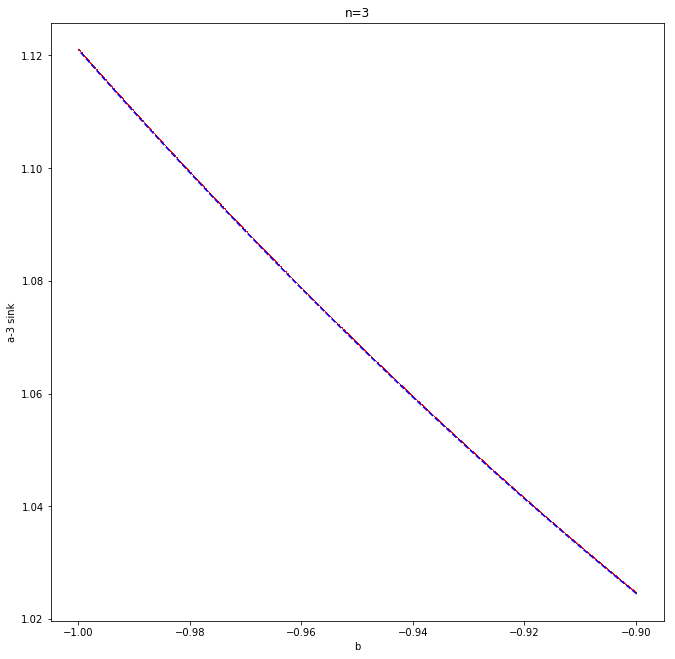

In [26]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('a-3 sink')
plt.title('n=3')
plt.plot(my_bS3, my_aS3, ',',color='red')
plt.plot(my_bS3, my_aS3, '--',color='blue')

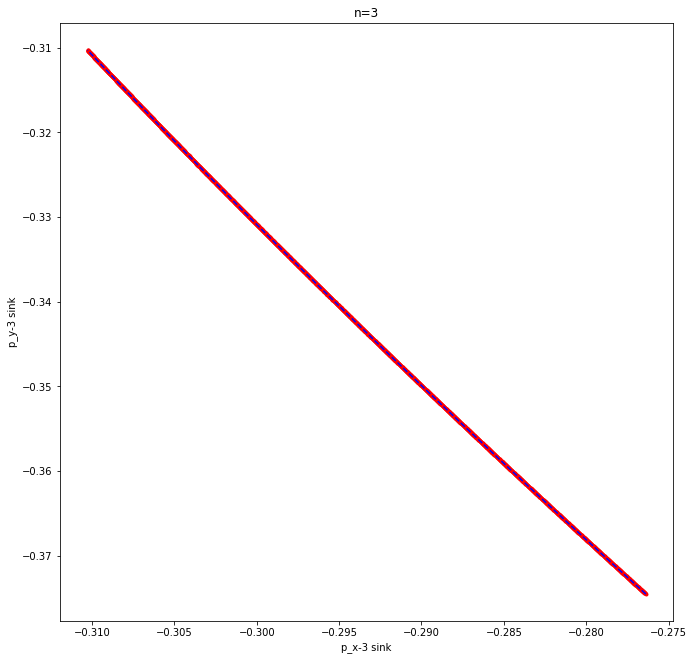

In [27]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('p_x-3 sink') 
plt.ylabel('p_y-3 sink')
plt.title('n=3')
plt.plot(my_px3, my_py3, '.',color='red')
plt.plot(my_px3, my_py3, '--',color='blue')


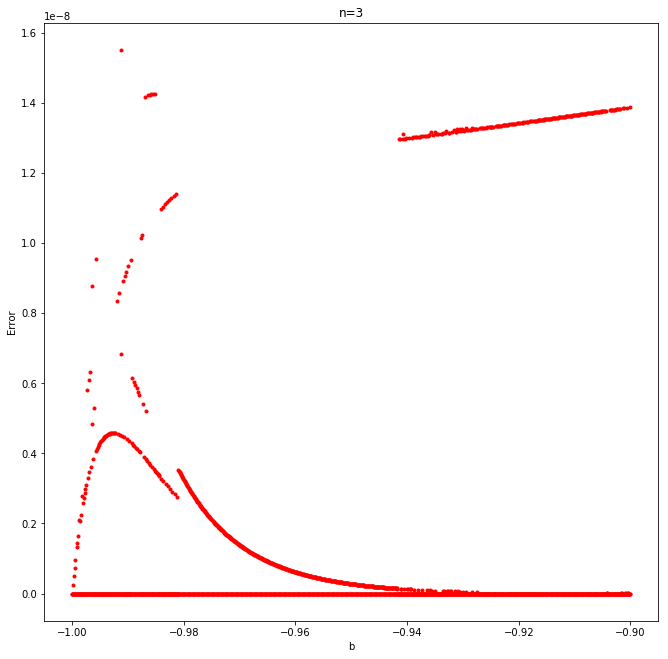

In [30]:
fig = plt.figure(figsize = (11,11))
ax = fig.add_subplot(1, 1, 1) 
plt.xlabel('b') 
plt.ylabel('Error')
plt.title('n=3')
plt.plot(my_bS3[3:], my_err3[3:], '.',color='red')

In [39]:
for x in my_py3:
    print(x)

-0.37444749980084435
-0.37448145861872983
-0.37441354379321173
-0.3743795873401372
-0.3743456374017556
-0.37431168746337395
-0.3742777316696917
-0.3742437832524211
-0.37420984088477016
-0.3741758914197878
-0.3741419484234028
-0.374108011646488
-0.3740740677745808
-0.3740401292343336
-0.37400619632940574
-0.37397226342447787
-0.37393832569254815
-0.3739043946570661
-0.3738704696634314
-0.37383653758027513
-0.37380261198977494
-0.37376869262401735
-0.3737347661710454
-0.37370084498690337
-0.37366692940361795
-0.37363301382033254
-0.3735990936557797
-0.3735651799567173
-0.37353127217757953
-0.3734973643984418
-0.3734634496051935
-0.3734295429498793
-0.3733956423254913
-0.373361734622484
-0.37332783344585285
-0.3732939385012829
-0.37326003648039996
-0.3732261396403542
-0.373192248353865
-0.37315835706737577
-0.3731244615407128
-0.3730905718922596
-0.37305668765511046
-0.37302280341796135
-0.37298891518507843
-0.3729550321133262
-0.37292115401216713
-0.37288727591100806
-0.37285339678111423

-0.3425236092843663
-0.34249143537042825
-0.34245927311696256
-0.34242710422252276
-0.34239494477576
-0.3423627786875194
-0.3423306242622214
-0.34229846319475915
-0.34226631157786636
-0.34223415331827356
-0.34220200672417117
-0.34216985348656564
-0.34213770970257845
-0.3421055592745773
-0.34207342051460304
-0.34204127510985183
-0.3420091391617254
-0.3419769965682384
-0.341944865645406
-0.34191272807641676
-0.34188059996716186
-0.34184846521106627
-0.34181634212839146
-0.34178421239809387
-0.34175209213063157
-0.34171996521491327
-0.3416878499753308
-0.3416557280866332
-0.3416236156639977
-0.3415914965914862
-0.34155938919804424
-0.34152727515380576
-0.3414951705789441
-0.34146305935262655
-0.3414309598081968
-0.34139885361137695
-0.341366756887265
-0.34133465350998526
-0.34130256181760354
-0.34127046347102813
-0.34123837460065404
-0.34120627907532863
-0.3411741952379061
-0.34114210474450585
-0.34111002373082827
-0.3410779360602785
-0.3410458600808131
-0.3410137774434945
-0.340981704289

-0.31135918744289953
-0.31132904609642587
-0.3112989150118913
-0.31126878868093605
-0.3112386514130265
-0.311208532606124
-0.3111784114811362
-0.31114827936428124
-0.31111816955641736
-0.3110880574791608
-0.31105794540190423
-0.3110278254253423
-0.3109977153278186
-0.3109676099497097
-0.3109374934483732
-0.3109073960177741
-0.31087729599608044
-0.31084718479411466
-0.3108170960411898
-0.31078700467026826
-0.31075691329934674
-0.3107268149926684
-0.3106967258561087
-0.3106666413795977
-0.31063654558653336
-0.31060646970985506
-0.310576390956753
-0.31054630082778667
-0.3105162328378299
-0.31048616188504136
-0.3104560794960087
-0.3104260154713659
-0.3103959483917264
-0.31036586981548536
-0.310335815908956
-0.31030575881173067
-0.31027570171450536
